In [401]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import glob
import cv2
import os

from sklearn.cluster import KMeans, spectral_clustering
from sklearn.metrics import silhouette_score, pairwise_distances_argmin_min

from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

import tensorflow as tf

In [228]:
!ls data

annotations.csv frames          info.csv        video


In [457]:
info = pd.read_csv('data/info.csv', header=None)

In [229]:
# 20 annotation scores per frame for each video 
# each row is a new set of annotation scores of each video, with 20 rows per video
# scores are from 1-5
# 2 second long shot-level importance scores
annotations = pd.read_csv('data/annotations.csv', header=None)

In [230]:
# 20 videos
# 5 videos per category

# VT: Changing Vehicle Tire
# VU: Getting Vehicle Unstuck
# GA: Grooming an Animal
# MS: Making Sandwich
# PK: Parkour
# PR: Parade
# FM: Flash Mob Gathering
# BK: Bee Keeping
# BT: Attempting Bike Tricks
# DS: Dog Show

info = pd.read_csv('data/info.csv')

In [231]:
annotations.rename(columns={0: 'filename', 1: 'category', 2: 'annotations'}, inplace=True)

In [232]:
annotations.head()

,filename,category,annotations
0,AwmHb44_ouw,VT,"4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,..."
1,AwmHb44_ouw,VT,"2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,..."
2,AwmHb44_ouw,VT,"3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,..."
3,AwmHb44_ouw,VT,"4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,..."
4,AwmHb44_ouw,VT,"2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,..."


In [233]:
annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 3 columns):
filename       1000 non-null object
category       1000 non-null object
annotations    1000 non-null object
dtypes: object(3)
memory usage: 23.6+ KB


In [234]:
info.head()

,category,video_id,title,url,length
0,VT,AwmHb44_ouw,#1306 How to change tires for off road vehicle...,https://www.youtube.com/watch?v=AwmHb44_ouw,5:54
1,VT,98MoyGZKHXc,How to use a tyre repair kit - Which? guide,https://www.youtube.com/watch?v=98MoyGZKHXc,3:07
2,VT,J0nA4VgnoCo,#0001: FLAT TIRE,https://www.youtube.com/watch?v=J0nA4VgnoCo,9:44
3,VT,gzDbaEs1Rlg,ŠKODA Tips How to Repair Your Tyre,https://www.youtube.com/watch?v=gzDbaEs1Rlg,4:48
4,VT,XzYM3PfTM4w,When to Replace Your Tires GMC,https://www.youtube.com/watch?v=XzYM3PfTM4w,1:51


In [235]:
annotations['annotations'] = annotations['annotations'].apply(lambda a: a.split(','))

In [249]:
avg_annotations = []
for fname in annotations.filename.unique():
    values = annotations[annotations['filename'] == fname]['annotations'].values
    float_conversion = np.array(list(values)).astype('float64') 
    avg = np.mean(float_conversion, axis=0)
    avg_annotations.append(avg)

In [251]:
average_scores = pd.DataFrame({'filename': annotations.filename.unique(), 'average_score': avg_annotations})

In [256]:
average_scores.sort_values(by='filename')

,filename,average_score
49,-esJrBWj2d8,"[1.95, 1.95, 1.95, 1.95, 1.95, 1.95, 1.95, 1.9..."
12,0tmA_C6XwfM,"[1.15, 1.15, 1.15, 1.15, 1.15, 1.15, 1.15, 1.1..."
18,37rzWOQsNIw,"[3.25, 3.25, 3.25, 3.25, 3.25, 3.25, 3.25, 3.2..."
13,3eYKfiOEJNs,"[1.9, 1.9, 1.9, 1.9, 1.9, 1.9, 1.9, 1.9, 1.9, ..."
29,4wU_LUjG5Ic,"[1.95, 1.95, 1.95, 1.95, 1.95, 1.95, 1.95, 1.9..."
25,91IHQYk1IQM,"[1.7, 1.7, 1.7, 1.7, 1.7, 1.7, 1.7, 1.7, 1.7, ..."
1,98MoyGZKHXc,"[1.75, 1.75, 1.75, 1.75, 1.75, 1.75, 1.75, 1.7..."
0,AwmHb44_ouw,"[2.9, 2.9, 2.9, 2.9, 2.9, 2.9, 2.9, 2.9, 2.9, ..."
11,Bhxk-O1Y7Ho,"[2.95, 2.95, 2.95, 2.95, 2.95, 2.95, 2.95, 2.9..."
45,E11zDS9XGzg,"[1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.65, 1.6..."


In [56]:
info.columns

Index(['category', 'video_id', 'title', 'url', 'length'], dtype='object')

In [65]:
info[info['video_id'] == '-esJrBWj2d8']

,category,video_id,title,url,length
49,DS,-esJrBWj2d8,Will A Cat Eat Dog Food?,https://www.youtube.com/watch?v=-esJrBWj2d8,3:50


In [94]:
for video in glob.glob('data/video/*.mp4'):
    video_id = video.split('data/video/')[1].split('.mp4')[0]
    video_capture = cv2.VideoCapture(video)
    currentframe = 0
    try: 
        if not os.path.exists(f'data/frames/{video_id}'): 
            os.makedirs(f'data/frames/{video_id}') 
    except OSError: 
        print ('Error: Creating directory of data')
    while(True): 
        ret, frame = video_capture.read() 
        if ret: 
            name = f'data/frames/{video_id}/' + str(currentframe) + '.jpg'
            print ('Creating...' + name) 
            cv2.imwrite(name, frame) 
            currentframe += 1
        else: 
            break
    video1_capture.release() 
    cv2.destroyAllWindows() 

Creating...data/frames/kLxoNp-UchI/0.jpg
Creating...data/frames/kLxoNp-UchI/1.jpg
Creating...data/frames/kLxoNp-UchI/2.jpg
Creating...data/frames/kLxoNp-UchI/3.jpg
Creating...data/frames/kLxoNp-UchI/4.jpg
Creating...data/frames/kLxoNp-UchI/5.jpg
Creating...data/frames/kLxoNp-UchI/6.jpg
Creating...data/frames/kLxoNp-UchI/7.jpg
Creating...data/frames/kLxoNp-UchI/8.jpg
Creating...data/frames/kLxoNp-UchI/9.jpg
Creating...data/frames/kLxoNp-UchI/10.jpg
Creating...data/frames/kLxoNp-UchI/11.jpg
Creating...data/frames/kLxoNp-UchI/12.jpg
Creating...data/frames/kLxoNp-UchI/13.jpg
Creating...data/frames/kLxoNp-UchI/14.jpg
Creating...data/frames/kLxoNp-UchI/15.jpg
Creating...data/frames/kLxoNp-UchI/16.jpg
Creating...data/frames/kLxoNp-UchI/17.jpg
Creating...data/frames/kLxoNp-UchI/18.jpg
Creating...data/frames/kLxoNp-UchI/19.jpg
Creating...data/frames/kLxoNp-UchI/20.jpg
Creating...data/frames/kLxoNp-UchI/21.jpg
Creating...data/frames/kLxoNp-UchI/22.jpg
Creating...data/frames/kLxoNp-UchI/23.jpg
Cr

Creating...data/frames/kLxoNp-UchI/241.jpg
Creating...data/frames/kLxoNp-UchI/242.jpg
Creating...data/frames/kLxoNp-UchI/243.jpg
Creating...data/frames/kLxoNp-UchI/244.jpg
Creating...data/frames/kLxoNp-UchI/245.jpg
Creating...data/frames/kLxoNp-UchI/246.jpg
Creating...data/frames/kLxoNp-UchI/247.jpg
Creating...data/frames/kLxoNp-UchI/248.jpg
Creating...data/frames/kLxoNp-UchI/249.jpg
Creating...data/frames/kLxoNp-UchI/250.jpg
Creating...data/frames/kLxoNp-UchI/251.jpg
Creating...data/frames/kLxoNp-UchI/252.jpg
Creating...data/frames/kLxoNp-UchI/253.jpg
Creating...data/frames/kLxoNp-UchI/254.jpg
Creating...data/frames/kLxoNp-UchI/255.jpg
Creating...data/frames/kLxoNp-UchI/256.jpg
Creating...data/frames/kLxoNp-UchI/257.jpg
Creating...data/frames/kLxoNp-UchI/258.jpg
Creating...data/frames/kLxoNp-UchI/259.jpg
Creating...data/frames/kLxoNp-UchI/260.jpg
Creating...data/frames/kLxoNp-UchI/261.jpg
Creating...data/frames/kLxoNp-UchI/262.jpg
Creating...data/frames/kLxoNp-UchI/263.jpg
Creating...

Creating...data/frames/kLxoNp-UchI/455.jpg
Creating...data/frames/kLxoNp-UchI/456.jpg
Creating...data/frames/kLxoNp-UchI/457.jpg
Creating...data/frames/kLxoNp-UchI/458.jpg
Creating...data/frames/kLxoNp-UchI/459.jpg
Creating...data/frames/kLxoNp-UchI/460.jpg
Creating...data/frames/kLxoNp-UchI/461.jpg
Creating...data/frames/kLxoNp-UchI/462.jpg
Creating...data/frames/kLxoNp-UchI/463.jpg
Creating...data/frames/kLxoNp-UchI/464.jpg
Creating...data/frames/kLxoNp-UchI/465.jpg
Creating...data/frames/kLxoNp-UchI/466.jpg
Creating...data/frames/kLxoNp-UchI/467.jpg
Creating...data/frames/kLxoNp-UchI/468.jpg
Creating...data/frames/kLxoNp-UchI/469.jpg
Creating...data/frames/kLxoNp-UchI/470.jpg
Creating...data/frames/kLxoNp-UchI/471.jpg
Creating...data/frames/kLxoNp-UchI/472.jpg
Creating...data/frames/kLxoNp-UchI/473.jpg
Creating...data/frames/kLxoNp-UchI/474.jpg
Creating...data/frames/kLxoNp-UchI/475.jpg
Creating...data/frames/kLxoNp-UchI/476.jpg
Creating...data/frames/kLxoNp-UchI/477.jpg
Creating...

Creating...data/frames/kLxoNp-UchI/673.jpg
Creating...data/frames/kLxoNp-UchI/674.jpg
Creating...data/frames/kLxoNp-UchI/675.jpg
Creating...data/frames/kLxoNp-UchI/676.jpg
Creating...data/frames/kLxoNp-UchI/677.jpg
Creating...data/frames/kLxoNp-UchI/678.jpg
Creating...data/frames/kLxoNp-UchI/679.jpg
Creating...data/frames/kLxoNp-UchI/680.jpg
Creating...data/frames/kLxoNp-UchI/681.jpg
Creating...data/frames/kLxoNp-UchI/682.jpg
Creating...data/frames/kLxoNp-UchI/683.jpg
Creating...data/frames/kLxoNp-UchI/684.jpg
Creating...data/frames/kLxoNp-UchI/685.jpg
Creating...data/frames/kLxoNp-UchI/686.jpg
Creating...data/frames/kLxoNp-UchI/687.jpg
Creating...data/frames/kLxoNp-UchI/688.jpg
Creating...data/frames/kLxoNp-UchI/689.jpg
Creating...data/frames/kLxoNp-UchI/690.jpg
Creating...data/frames/kLxoNp-UchI/691.jpg
Creating...data/frames/kLxoNp-UchI/692.jpg
Creating...data/frames/kLxoNp-UchI/693.jpg
Creating...data/frames/kLxoNp-UchI/694.jpg
Creating...data/frames/kLxoNp-UchI/695.jpg
Creating...

Creating...data/frames/kLxoNp-UchI/867.jpg
Creating...data/frames/kLxoNp-UchI/868.jpg
Creating...data/frames/kLxoNp-UchI/869.jpg
Creating...data/frames/kLxoNp-UchI/870.jpg
Creating...data/frames/kLxoNp-UchI/871.jpg
Creating...data/frames/kLxoNp-UchI/872.jpg
Creating...data/frames/kLxoNp-UchI/873.jpg
Creating...data/frames/kLxoNp-UchI/874.jpg
Creating...data/frames/kLxoNp-UchI/875.jpg
Creating...data/frames/kLxoNp-UchI/876.jpg
Creating...data/frames/kLxoNp-UchI/877.jpg
Creating...data/frames/kLxoNp-UchI/878.jpg
Creating...data/frames/kLxoNp-UchI/879.jpg
Creating...data/frames/kLxoNp-UchI/880.jpg
Creating...data/frames/kLxoNp-UchI/881.jpg
Creating...data/frames/kLxoNp-UchI/882.jpg
Creating...data/frames/kLxoNp-UchI/883.jpg
Creating...data/frames/kLxoNp-UchI/884.jpg
Creating...data/frames/kLxoNp-UchI/885.jpg
Creating...data/frames/kLxoNp-UchI/886.jpg
Creating...data/frames/kLxoNp-UchI/887.jpg
Creating...data/frames/kLxoNp-UchI/888.jpg
Creating...data/frames/kLxoNp-UchI/889.jpg
Creating...

Creating...data/frames/kLxoNp-UchI/1077.jpg
Creating...data/frames/kLxoNp-UchI/1078.jpg
Creating...data/frames/kLxoNp-UchI/1079.jpg
Creating...data/frames/kLxoNp-UchI/1080.jpg
Creating...data/frames/kLxoNp-UchI/1081.jpg
Creating...data/frames/kLxoNp-UchI/1082.jpg
Creating...data/frames/kLxoNp-UchI/1083.jpg
Creating...data/frames/kLxoNp-UchI/1084.jpg
Creating...data/frames/kLxoNp-UchI/1085.jpg
Creating...data/frames/kLxoNp-UchI/1086.jpg
Creating...data/frames/kLxoNp-UchI/1087.jpg
Creating...data/frames/kLxoNp-UchI/1088.jpg
Creating...data/frames/kLxoNp-UchI/1089.jpg
Creating...data/frames/kLxoNp-UchI/1090.jpg
Creating...data/frames/kLxoNp-UchI/1091.jpg
Creating...data/frames/kLxoNp-UchI/1092.jpg
Creating...data/frames/kLxoNp-UchI/1093.jpg
Creating...data/frames/kLxoNp-UchI/1094.jpg
Creating...data/frames/kLxoNp-UchI/1095.jpg
Creating...data/frames/kLxoNp-UchI/1096.jpg
Creating...data/frames/kLxoNp-UchI/1097.jpg
Creating...data/frames/kLxoNp-UchI/1098.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/1266.jpg
Creating...data/frames/kLxoNp-UchI/1267.jpg
Creating...data/frames/kLxoNp-UchI/1268.jpg
Creating...data/frames/kLxoNp-UchI/1269.jpg
Creating...data/frames/kLxoNp-UchI/1270.jpg
Creating...data/frames/kLxoNp-UchI/1271.jpg
Creating...data/frames/kLxoNp-UchI/1272.jpg
Creating...data/frames/kLxoNp-UchI/1273.jpg
Creating...data/frames/kLxoNp-UchI/1274.jpg
Creating...data/frames/kLxoNp-UchI/1275.jpg
Creating...data/frames/kLxoNp-UchI/1276.jpg
Creating...data/frames/kLxoNp-UchI/1277.jpg
Creating...data/frames/kLxoNp-UchI/1278.jpg
Creating...data/frames/kLxoNp-UchI/1279.jpg
Creating...data/frames/kLxoNp-UchI/1280.jpg
Creating...data/frames/kLxoNp-UchI/1281.jpg
Creating...data/frames/kLxoNp-UchI/1282.jpg
Creating...data/frames/kLxoNp-UchI/1283.jpg
Creating...data/frames/kLxoNp-UchI/1284.jpg
Creating...data/frames/kLxoNp-UchI/1285.jpg
Creating...data/frames/kLxoNp-UchI/1286.jpg
Creating...data/frames/kLxoNp-UchI/1287.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/1456.jpg
Creating...data/frames/kLxoNp-UchI/1457.jpg
Creating...data/frames/kLxoNp-UchI/1458.jpg
Creating...data/frames/kLxoNp-UchI/1459.jpg
Creating...data/frames/kLxoNp-UchI/1460.jpg
Creating...data/frames/kLxoNp-UchI/1461.jpg
Creating...data/frames/kLxoNp-UchI/1462.jpg
Creating...data/frames/kLxoNp-UchI/1463.jpg
Creating...data/frames/kLxoNp-UchI/1464.jpg
Creating...data/frames/kLxoNp-UchI/1465.jpg
Creating...data/frames/kLxoNp-UchI/1466.jpg
Creating...data/frames/kLxoNp-UchI/1467.jpg
Creating...data/frames/kLxoNp-UchI/1468.jpg
Creating...data/frames/kLxoNp-UchI/1469.jpg
Creating...data/frames/kLxoNp-UchI/1470.jpg
Creating...data/frames/kLxoNp-UchI/1471.jpg
Creating...data/frames/kLxoNp-UchI/1472.jpg
Creating...data/frames/kLxoNp-UchI/1473.jpg
Creating...data/frames/kLxoNp-UchI/1474.jpg
Creating...data/frames/kLxoNp-UchI/1475.jpg
Creating...data/frames/kLxoNp-UchI/1476.jpg
Creating...data/frames/kLxoNp-UchI/1477.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/1662.jpg
Creating...data/frames/kLxoNp-UchI/1663.jpg
Creating...data/frames/kLxoNp-UchI/1664.jpg
Creating...data/frames/kLxoNp-UchI/1665.jpg
Creating...data/frames/kLxoNp-UchI/1666.jpg
Creating...data/frames/kLxoNp-UchI/1667.jpg
Creating...data/frames/kLxoNp-UchI/1668.jpg
Creating...data/frames/kLxoNp-UchI/1669.jpg
Creating...data/frames/kLxoNp-UchI/1670.jpg
Creating...data/frames/kLxoNp-UchI/1671.jpg
Creating...data/frames/kLxoNp-UchI/1672.jpg
Creating...data/frames/kLxoNp-UchI/1673.jpg
Creating...data/frames/kLxoNp-UchI/1674.jpg
Creating...data/frames/kLxoNp-UchI/1675.jpg
Creating...data/frames/kLxoNp-UchI/1676.jpg
Creating...data/frames/kLxoNp-UchI/1677.jpg
Creating...data/frames/kLxoNp-UchI/1678.jpg
Creating...data/frames/kLxoNp-UchI/1679.jpg
Creating...data/frames/kLxoNp-UchI/1680.jpg
Creating...data/frames/kLxoNp-UchI/1681.jpg
Creating...data/frames/kLxoNp-UchI/1682.jpg
Creating...data/frames/kLxoNp-UchI/1683.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/1856.jpg
Creating...data/frames/kLxoNp-UchI/1857.jpg
Creating...data/frames/kLxoNp-UchI/1858.jpg
Creating...data/frames/kLxoNp-UchI/1859.jpg
Creating...data/frames/kLxoNp-UchI/1860.jpg
Creating...data/frames/kLxoNp-UchI/1861.jpg
Creating...data/frames/kLxoNp-UchI/1862.jpg
Creating...data/frames/kLxoNp-UchI/1863.jpg
Creating...data/frames/kLxoNp-UchI/1864.jpg
Creating...data/frames/kLxoNp-UchI/1865.jpg
Creating...data/frames/kLxoNp-UchI/1866.jpg
Creating...data/frames/kLxoNp-UchI/1867.jpg
Creating...data/frames/kLxoNp-UchI/1868.jpg
Creating...data/frames/kLxoNp-UchI/1869.jpg
Creating...data/frames/kLxoNp-UchI/1870.jpg
Creating...data/frames/kLxoNp-UchI/1871.jpg
Creating...data/frames/kLxoNp-UchI/1872.jpg
Creating...data/frames/kLxoNp-UchI/1873.jpg
Creating...data/frames/kLxoNp-UchI/1874.jpg
Creating...data/frames/kLxoNp-UchI/1875.jpg
Creating...data/frames/kLxoNp-UchI/1876.jpg
Creating...data/frames/kLxoNp-UchI/1877.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/2052.jpg
Creating...data/frames/kLxoNp-UchI/2053.jpg
Creating...data/frames/kLxoNp-UchI/2054.jpg
Creating...data/frames/kLxoNp-UchI/2055.jpg
Creating...data/frames/kLxoNp-UchI/2056.jpg
Creating...data/frames/kLxoNp-UchI/2057.jpg
Creating...data/frames/kLxoNp-UchI/2058.jpg
Creating...data/frames/kLxoNp-UchI/2059.jpg
Creating...data/frames/kLxoNp-UchI/2060.jpg
Creating...data/frames/kLxoNp-UchI/2061.jpg
Creating...data/frames/kLxoNp-UchI/2062.jpg
Creating...data/frames/kLxoNp-UchI/2063.jpg
Creating...data/frames/kLxoNp-UchI/2064.jpg
Creating...data/frames/kLxoNp-UchI/2065.jpg
Creating...data/frames/kLxoNp-UchI/2066.jpg
Creating...data/frames/kLxoNp-UchI/2067.jpg
Creating...data/frames/kLxoNp-UchI/2068.jpg
Creating...data/frames/kLxoNp-UchI/2069.jpg
Creating...data/frames/kLxoNp-UchI/2070.jpg
Creating...data/frames/kLxoNp-UchI/2071.jpg
Creating...data/frames/kLxoNp-UchI/2072.jpg
Creating...data/frames/kLxoNp-UchI/2073.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/2269.jpg
Creating...data/frames/kLxoNp-UchI/2270.jpg
Creating...data/frames/kLxoNp-UchI/2271.jpg
Creating...data/frames/kLxoNp-UchI/2272.jpg
Creating...data/frames/kLxoNp-UchI/2273.jpg
Creating...data/frames/kLxoNp-UchI/2274.jpg
Creating...data/frames/kLxoNp-UchI/2275.jpg
Creating...data/frames/kLxoNp-UchI/2276.jpg
Creating...data/frames/kLxoNp-UchI/2277.jpg
Creating...data/frames/kLxoNp-UchI/2278.jpg
Creating...data/frames/kLxoNp-UchI/2279.jpg
Creating...data/frames/kLxoNp-UchI/2280.jpg
Creating...data/frames/kLxoNp-UchI/2281.jpg
Creating...data/frames/kLxoNp-UchI/2282.jpg
Creating...data/frames/kLxoNp-UchI/2283.jpg
Creating...data/frames/kLxoNp-UchI/2284.jpg
Creating...data/frames/kLxoNp-UchI/2285.jpg
Creating...data/frames/kLxoNp-UchI/2286.jpg
Creating...data/frames/kLxoNp-UchI/2287.jpg
Creating...data/frames/kLxoNp-UchI/2288.jpg
Creating...data/frames/kLxoNp-UchI/2289.jpg
Creating...data/frames/kLxoNp-UchI/2290.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/2464.jpg
Creating...data/frames/kLxoNp-UchI/2465.jpg
Creating...data/frames/kLxoNp-UchI/2466.jpg
Creating...data/frames/kLxoNp-UchI/2467.jpg
Creating...data/frames/kLxoNp-UchI/2468.jpg
Creating...data/frames/kLxoNp-UchI/2469.jpg
Creating...data/frames/kLxoNp-UchI/2470.jpg
Creating...data/frames/kLxoNp-UchI/2471.jpg
Creating...data/frames/kLxoNp-UchI/2472.jpg
Creating...data/frames/kLxoNp-UchI/2473.jpg
Creating...data/frames/kLxoNp-UchI/2474.jpg
Creating...data/frames/kLxoNp-UchI/2475.jpg
Creating...data/frames/kLxoNp-UchI/2476.jpg
Creating...data/frames/kLxoNp-UchI/2477.jpg
Creating...data/frames/kLxoNp-UchI/2478.jpg
Creating...data/frames/kLxoNp-UchI/2479.jpg
Creating...data/frames/kLxoNp-UchI/2480.jpg
Creating...data/frames/kLxoNp-UchI/2481.jpg
Creating...data/frames/kLxoNp-UchI/2482.jpg
Creating...data/frames/kLxoNp-UchI/2483.jpg
Creating...data/frames/kLxoNp-UchI/2484.jpg
Creating...data/frames/kLxoNp-UchI/2485.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/2677.jpg
Creating...data/frames/kLxoNp-UchI/2678.jpg
Creating...data/frames/kLxoNp-UchI/2679.jpg
Creating...data/frames/kLxoNp-UchI/2680.jpg
Creating...data/frames/kLxoNp-UchI/2681.jpg
Creating...data/frames/kLxoNp-UchI/2682.jpg
Creating...data/frames/kLxoNp-UchI/2683.jpg
Creating...data/frames/kLxoNp-UchI/2684.jpg
Creating...data/frames/kLxoNp-UchI/2685.jpg
Creating...data/frames/kLxoNp-UchI/2686.jpg
Creating...data/frames/kLxoNp-UchI/2687.jpg
Creating...data/frames/kLxoNp-UchI/2688.jpg
Creating...data/frames/kLxoNp-UchI/2689.jpg
Creating...data/frames/kLxoNp-UchI/2690.jpg
Creating...data/frames/kLxoNp-UchI/2691.jpg
Creating...data/frames/kLxoNp-UchI/2692.jpg
Creating...data/frames/kLxoNp-UchI/2693.jpg
Creating...data/frames/kLxoNp-UchI/2694.jpg
Creating...data/frames/kLxoNp-UchI/2695.jpg
Creating...data/frames/kLxoNp-UchI/2696.jpg
Creating...data/frames/kLxoNp-UchI/2697.jpg
Creating...data/frames/kLxoNp-UchI/2698.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/2898.jpg
Creating...data/frames/kLxoNp-UchI/2899.jpg
Creating...data/frames/kLxoNp-UchI/2900.jpg
Creating...data/frames/kLxoNp-UchI/2901.jpg
Creating...data/frames/kLxoNp-UchI/2902.jpg
Creating...data/frames/kLxoNp-UchI/2903.jpg
Creating...data/frames/kLxoNp-UchI/2904.jpg
Creating...data/frames/kLxoNp-UchI/2905.jpg
Creating...data/frames/kLxoNp-UchI/2906.jpg
Creating...data/frames/kLxoNp-UchI/2907.jpg
Creating...data/frames/kLxoNp-UchI/2908.jpg
Creating...data/frames/kLxoNp-UchI/2909.jpg
Creating...data/frames/kLxoNp-UchI/2910.jpg
Creating...data/frames/kLxoNp-UchI/2911.jpg
Creating...data/frames/kLxoNp-UchI/2912.jpg
Creating...data/frames/kLxoNp-UchI/2913.jpg
Creating...data/frames/kLxoNp-UchI/2914.jpg
Creating...data/frames/kLxoNp-UchI/2915.jpg
Creating...data/frames/kLxoNp-UchI/2916.jpg
Creating...data/frames/kLxoNp-UchI/2917.jpg
Creating...data/frames/kLxoNp-UchI/2918.jpg
Creating...data/frames/kLxoNp-UchI/2919.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/3104.jpg
Creating...data/frames/kLxoNp-UchI/3105.jpg
Creating...data/frames/kLxoNp-UchI/3106.jpg
Creating...data/frames/kLxoNp-UchI/3107.jpg
Creating...data/frames/kLxoNp-UchI/3108.jpg
Creating...data/frames/kLxoNp-UchI/3109.jpg
Creating...data/frames/kLxoNp-UchI/3110.jpg
Creating...data/frames/kLxoNp-UchI/3111.jpg
Creating...data/frames/kLxoNp-UchI/3112.jpg
Creating...data/frames/kLxoNp-UchI/3113.jpg
Creating...data/frames/kLxoNp-UchI/3114.jpg
Creating...data/frames/kLxoNp-UchI/3115.jpg
Creating...data/frames/kLxoNp-UchI/3116.jpg
Creating...data/frames/kLxoNp-UchI/3117.jpg
Creating...data/frames/kLxoNp-UchI/3118.jpg
Creating...data/frames/kLxoNp-UchI/3119.jpg
Creating...data/frames/kLxoNp-UchI/3120.jpg
Creating...data/frames/kLxoNp-UchI/3121.jpg
Creating...data/frames/kLxoNp-UchI/3122.jpg
Creating...data/frames/kLxoNp-UchI/3123.jpg
Creating...data/frames/kLxoNp-UchI/3124.jpg
Creating...data/frames/kLxoNp-UchI/3125.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/3299.jpg
Creating...data/frames/kLxoNp-UchI/3300.jpg
Creating...data/frames/kLxoNp-UchI/3301.jpg
Creating...data/frames/kLxoNp-UchI/3302.jpg
Creating...data/frames/kLxoNp-UchI/3303.jpg
Creating...data/frames/kLxoNp-UchI/3304.jpg
Creating...data/frames/kLxoNp-UchI/3305.jpg
Creating...data/frames/kLxoNp-UchI/3306.jpg
Creating...data/frames/kLxoNp-UchI/3307.jpg
Creating...data/frames/kLxoNp-UchI/3308.jpg
Creating...data/frames/kLxoNp-UchI/3309.jpg
Creating...data/frames/kLxoNp-UchI/3310.jpg
Creating...data/frames/kLxoNp-UchI/3311.jpg
Creating...data/frames/kLxoNp-UchI/3312.jpg
Creating...data/frames/kLxoNp-UchI/3313.jpg
Creating...data/frames/kLxoNp-UchI/3314.jpg
Creating...data/frames/kLxoNp-UchI/3315.jpg
Creating...data/frames/kLxoNp-UchI/3316.jpg
Creating...data/frames/kLxoNp-UchI/3317.jpg
Creating...data/frames/kLxoNp-UchI/3318.jpg
Creating...data/frames/kLxoNp-UchI/3319.jpg
Creating...data/frames/kLxoNp-UchI/3320.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/3501.jpg
Creating...data/frames/kLxoNp-UchI/3502.jpg
Creating...data/frames/kLxoNp-UchI/3503.jpg
Creating...data/frames/kLxoNp-UchI/3504.jpg
Creating...data/frames/kLxoNp-UchI/3505.jpg
Creating...data/frames/kLxoNp-UchI/3506.jpg
Creating...data/frames/kLxoNp-UchI/3507.jpg
Creating...data/frames/kLxoNp-UchI/3508.jpg
Creating...data/frames/kLxoNp-UchI/3509.jpg
Creating...data/frames/kLxoNp-UchI/3510.jpg
Creating...data/frames/kLxoNp-UchI/3511.jpg
Creating...data/frames/kLxoNp-UchI/3512.jpg
Creating...data/frames/kLxoNp-UchI/3513.jpg
Creating...data/frames/kLxoNp-UchI/3514.jpg
Creating...data/frames/kLxoNp-UchI/3515.jpg
Creating...data/frames/kLxoNp-UchI/3516.jpg
Creating...data/frames/kLxoNp-UchI/3517.jpg
Creating...data/frames/kLxoNp-UchI/3518.jpg
Creating...data/frames/kLxoNp-UchI/3519.jpg
Creating...data/frames/kLxoNp-UchI/3520.jpg
Creating...data/frames/kLxoNp-UchI/3521.jpg
Creating...data/frames/kLxoNp-UchI/3522.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/kLxoNp-UchI/3714.jpg
Creating...data/frames/kLxoNp-UchI/3715.jpg
Creating...data/frames/kLxoNp-UchI/3716.jpg
Creating...data/frames/kLxoNp-UchI/3717.jpg
Creating...data/frames/kLxoNp-UchI/3718.jpg
Creating...data/frames/kLxoNp-UchI/3719.jpg
Creating...data/frames/kLxoNp-UchI/3720.jpg
Creating...data/frames/kLxoNp-UchI/3721.jpg
Creating...data/frames/kLxoNp-UchI/3722.jpg
Creating...data/frames/kLxoNp-UchI/3723.jpg
Creating...data/frames/kLxoNp-UchI/3724.jpg
Creating...data/frames/kLxoNp-UchI/3725.jpg
Creating...data/frames/kLxoNp-UchI/3726.jpg
Creating...data/frames/kLxoNp-UchI/3727.jpg
Creating...data/frames/kLxoNp-UchI/3728.jpg
Creating...data/frames/kLxoNp-UchI/3729.jpg
Creating...data/frames/kLxoNp-UchI/3730.jpg
Creating...data/frames/kLxoNp-UchI/3731.jpg
Creating...data/frames/kLxoNp-UchI/3732.jpg
Creating...data/frames/kLxoNp-UchI/3733.jpg
Creating...data/frames/kLxoNp-UchI/3734.jpg
Creating...data/frames/kLxoNp-UchI/3735.jpg
Creating...data/frames/kLxoNp-Uc

Creating...data/frames/NyBmCxDoHJU/9.jpg
Creating...data/frames/NyBmCxDoHJU/10.jpg
Creating...data/frames/NyBmCxDoHJU/11.jpg
Creating...data/frames/NyBmCxDoHJU/12.jpg
Creating...data/frames/NyBmCxDoHJU/13.jpg
Creating...data/frames/NyBmCxDoHJU/14.jpg
Creating...data/frames/NyBmCxDoHJU/15.jpg
Creating...data/frames/NyBmCxDoHJU/16.jpg
Creating...data/frames/NyBmCxDoHJU/17.jpg
Creating...data/frames/NyBmCxDoHJU/18.jpg
Creating...data/frames/NyBmCxDoHJU/19.jpg
Creating...data/frames/NyBmCxDoHJU/20.jpg
Creating...data/frames/NyBmCxDoHJU/21.jpg
Creating...data/frames/NyBmCxDoHJU/22.jpg
Creating...data/frames/NyBmCxDoHJU/23.jpg
Creating...data/frames/NyBmCxDoHJU/24.jpg
Creating...data/frames/NyBmCxDoHJU/25.jpg
Creating...data/frames/NyBmCxDoHJU/26.jpg
Creating...data/frames/NyBmCxDoHJU/27.jpg
Creating...data/frames/NyBmCxDoHJU/28.jpg
Creating...data/frames/NyBmCxDoHJU/29.jpg
Creating...data/frames/NyBmCxDoHJU/30.jpg
Creating...data/frames/NyBmCxDoHJU/31.jpg
Creating...data/frames/NyBmCxDoHJU/

Creating...data/frames/NyBmCxDoHJU/240.jpg
Creating...data/frames/NyBmCxDoHJU/241.jpg
Creating...data/frames/NyBmCxDoHJU/242.jpg
Creating...data/frames/NyBmCxDoHJU/243.jpg
Creating...data/frames/NyBmCxDoHJU/244.jpg
Creating...data/frames/NyBmCxDoHJU/245.jpg
Creating...data/frames/NyBmCxDoHJU/246.jpg
Creating...data/frames/NyBmCxDoHJU/247.jpg
Creating...data/frames/NyBmCxDoHJU/248.jpg
Creating...data/frames/NyBmCxDoHJU/249.jpg
Creating...data/frames/NyBmCxDoHJU/250.jpg
Creating...data/frames/NyBmCxDoHJU/251.jpg
Creating...data/frames/NyBmCxDoHJU/252.jpg
Creating...data/frames/NyBmCxDoHJU/253.jpg
Creating...data/frames/NyBmCxDoHJU/254.jpg
Creating...data/frames/NyBmCxDoHJU/255.jpg
Creating...data/frames/NyBmCxDoHJU/256.jpg
Creating...data/frames/NyBmCxDoHJU/257.jpg
Creating...data/frames/NyBmCxDoHJU/258.jpg
Creating...data/frames/NyBmCxDoHJU/259.jpg
Creating...data/frames/NyBmCxDoHJU/260.jpg
Creating...data/frames/NyBmCxDoHJU/261.jpg
Creating...data/frames/NyBmCxDoHJU/262.jpg
Creating...

Creating...data/frames/NyBmCxDoHJU/433.jpg
Creating...data/frames/NyBmCxDoHJU/434.jpg
Creating...data/frames/NyBmCxDoHJU/435.jpg
Creating...data/frames/NyBmCxDoHJU/436.jpg
Creating...data/frames/NyBmCxDoHJU/437.jpg
Creating...data/frames/NyBmCxDoHJU/438.jpg
Creating...data/frames/NyBmCxDoHJU/439.jpg
Creating...data/frames/NyBmCxDoHJU/440.jpg
Creating...data/frames/NyBmCxDoHJU/441.jpg
Creating...data/frames/NyBmCxDoHJU/442.jpg
Creating...data/frames/NyBmCxDoHJU/443.jpg
Creating...data/frames/NyBmCxDoHJU/444.jpg
Creating...data/frames/NyBmCxDoHJU/445.jpg
Creating...data/frames/NyBmCxDoHJU/446.jpg
Creating...data/frames/NyBmCxDoHJU/447.jpg
Creating...data/frames/NyBmCxDoHJU/448.jpg
Creating...data/frames/NyBmCxDoHJU/449.jpg
Creating...data/frames/NyBmCxDoHJU/450.jpg
Creating...data/frames/NyBmCxDoHJU/451.jpg
Creating...data/frames/NyBmCxDoHJU/452.jpg
Creating...data/frames/NyBmCxDoHJU/453.jpg
Creating...data/frames/NyBmCxDoHJU/454.jpg
Creating...data/frames/NyBmCxDoHJU/455.jpg
Creating...

Creating...data/frames/NyBmCxDoHJU/625.jpg
Creating...data/frames/NyBmCxDoHJU/626.jpg
Creating...data/frames/NyBmCxDoHJU/627.jpg
Creating...data/frames/NyBmCxDoHJU/628.jpg
Creating...data/frames/NyBmCxDoHJU/629.jpg
Creating...data/frames/NyBmCxDoHJU/630.jpg
Creating...data/frames/NyBmCxDoHJU/631.jpg
Creating...data/frames/NyBmCxDoHJU/632.jpg
Creating...data/frames/NyBmCxDoHJU/633.jpg
Creating...data/frames/NyBmCxDoHJU/634.jpg
Creating...data/frames/NyBmCxDoHJU/635.jpg
Creating...data/frames/NyBmCxDoHJU/636.jpg
Creating...data/frames/NyBmCxDoHJU/637.jpg
Creating...data/frames/NyBmCxDoHJU/638.jpg
Creating...data/frames/NyBmCxDoHJU/639.jpg
Creating...data/frames/NyBmCxDoHJU/640.jpg
Creating...data/frames/NyBmCxDoHJU/641.jpg
Creating...data/frames/NyBmCxDoHJU/642.jpg
Creating...data/frames/NyBmCxDoHJU/643.jpg
Creating...data/frames/NyBmCxDoHJU/644.jpg
Creating...data/frames/NyBmCxDoHJU/645.jpg
Creating...data/frames/NyBmCxDoHJU/646.jpg
Creating...data/frames/NyBmCxDoHJU/647.jpg
Creating...

Creating...data/frames/NyBmCxDoHJU/850.jpg
Creating...data/frames/NyBmCxDoHJU/851.jpg
Creating...data/frames/NyBmCxDoHJU/852.jpg
Creating...data/frames/NyBmCxDoHJU/853.jpg
Creating...data/frames/NyBmCxDoHJU/854.jpg
Creating...data/frames/NyBmCxDoHJU/855.jpg
Creating...data/frames/NyBmCxDoHJU/856.jpg
Creating...data/frames/NyBmCxDoHJU/857.jpg
Creating...data/frames/NyBmCxDoHJU/858.jpg
Creating...data/frames/NyBmCxDoHJU/859.jpg
Creating...data/frames/NyBmCxDoHJU/860.jpg
Creating...data/frames/NyBmCxDoHJU/861.jpg
Creating...data/frames/NyBmCxDoHJU/862.jpg
Creating...data/frames/NyBmCxDoHJU/863.jpg
Creating...data/frames/NyBmCxDoHJU/864.jpg
Creating...data/frames/NyBmCxDoHJU/865.jpg
Creating...data/frames/NyBmCxDoHJU/866.jpg
Creating...data/frames/NyBmCxDoHJU/867.jpg
Creating...data/frames/NyBmCxDoHJU/868.jpg
Creating...data/frames/NyBmCxDoHJU/869.jpg
Creating...data/frames/NyBmCxDoHJU/870.jpg
Creating...data/frames/NyBmCxDoHJU/871.jpg
Creating...data/frames/NyBmCxDoHJU/872.jpg
Creating...

Creating...data/frames/NyBmCxDoHJU/1040.jpg
Creating...data/frames/NyBmCxDoHJU/1041.jpg
Creating...data/frames/NyBmCxDoHJU/1042.jpg
Creating...data/frames/NyBmCxDoHJU/1043.jpg
Creating...data/frames/NyBmCxDoHJU/1044.jpg
Creating...data/frames/NyBmCxDoHJU/1045.jpg
Creating...data/frames/NyBmCxDoHJU/1046.jpg
Creating...data/frames/NyBmCxDoHJU/1047.jpg
Creating...data/frames/NyBmCxDoHJU/1048.jpg
Creating...data/frames/NyBmCxDoHJU/1049.jpg
Creating...data/frames/NyBmCxDoHJU/1050.jpg
Creating...data/frames/NyBmCxDoHJU/1051.jpg
Creating...data/frames/NyBmCxDoHJU/1052.jpg
Creating...data/frames/NyBmCxDoHJU/1053.jpg
Creating...data/frames/NyBmCxDoHJU/1054.jpg
Creating...data/frames/NyBmCxDoHJU/1055.jpg
Creating...data/frames/NyBmCxDoHJU/1056.jpg
Creating...data/frames/NyBmCxDoHJU/1057.jpg
Creating...data/frames/NyBmCxDoHJU/1058.jpg
Creating...data/frames/NyBmCxDoHJU/1059.jpg
Creating...data/frames/NyBmCxDoHJU/1060.jpg
Creating...data/frames/NyBmCxDoHJU/1061.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/1259.jpg
Creating...data/frames/NyBmCxDoHJU/1260.jpg
Creating...data/frames/NyBmCxDoHJU/1261.jpg
Creating...data/frames/NyBmCxDoHJU/1262.jpg
Creating...data/frames/NyBmCxDoHJU/1263.jpg
Creating...data/frames/NyBmCxDoHJU/1264.jpg
Creating...data/frames/NyBmCxDoHJU/1265.jpg
Creating...data/frames/NyBmCxDoHJU/1266.jpg
Creating...data/frames/NyBmCxDoHJU/1267.jpg
Creating...data/frames/NyBmCxDoHJU/1268.jpg
Creating...data/frames/NyBmCxDoHJU/1269.jpg
Creating...data/frames/NyBmCxDoHJU/1270.jpg
Creating...data/frames/NyBmCxDoHJU/1271.jpg
Creating...data/frames/NyBmCxDoHJU/1272.jpg
Creating...data/frames/NyBmCxDoHJU/1273.jpg
Creating...data/frames/NyBmCxDoHJU/1274.jpg
Creating...data/frames/NyBmCxDoHJU/1275.jpg
Creating...data/frames/NyBmCxDoHJU/1276.jpg
Creating...data/frames/NyBmCxDoHJU/1277.jpg
Creating...data/frames/NyBmCxDoHJU/1278.jpg
Creating...data/frames/NyBmCxDoHJU/1279.jpg
Creating...data/frames/NyBmCxDoHJU/1280.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/1462.jpg
Creating...data/frames/NyBmCxDoHJU/1463.jpg
Creating...data/frames/NyBmCxDoHJU/1464.jpg
Creating...data/frames/NyBmCxDoHJU/1465.jpg
Creating...data/frames/NyBmCxDoHJU/1466.jpg
Creating...data/frames/NyBmCxDoHJU/1467.jpg
Creating...data/frames/NyBmCxDoHJU/1468.jpg
Creating...data/frames/NyBmCxDoHJU/1469.jpg
Creating...data/frames/NyBmCxDoHJU/1470.jpg
Creating...data/frames/NyBmCxDoHJU/1471.jpg
Creating...data/frames/NyBmCxDoHJU/1472.jpg
Creating...data/frames/NyBmCxDoHJU/1473.jpg
Creating...data/frames/NyBmCxDoHJU/1474.jpg
Creating...data/frames/NyBmCxDoHJU/1475.jpg
Creating...data/frames/NyBmCxDoHJU/1476.jpg
Creating...data/frames/NyBmCxDoHJU/1477.jpg
Creating...data/frames/NyBmCxDoHJU/1478.jpg
Creating...data/frames/NyBmCxDoHJU/1479.jpg
Creating...data/frames/NyBmCxDoHJU/1480.jpg
Creating...data/frames/NyBmCxDoHJU/1481.jpg
Creating...data/frames/NyBmCxDoHJU/1482.jpg
Creating...data/frames/NyBmCxDoHJU/1483.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/1687.jpg
Creating...data/frames/NyBmCxDoHJU/1688.jpg
Creating...data/frames/NyBmCxDoHJU/1689.jpg
Creating...data/frames/NyBmCxDoHJU/1690.jpg
Creating...data/frames/NyBmCxDoHJU/1691.jpg
Creating...data/frames/NyBmCxDoHJU/1692.jpg
Creating...data/frames/NyBmCxDoHJU/1693.jpg
Creating...data/frames/NyBmCxDoHJU/1694.jpg
Creating...data/frames/NyBmCxDoHJU/1695.jpg
Creating...data/frames/NyBmCxDoHJU/1696.jpg
Creating...data/frames/NyBmCxDoHJU/1697.jpg
Creating...data/frames/NyBmCxDoHJU/1698.jpg
Creating...data/frames/NyBmCxDoHJU/1699.jpg
Creating...data/frames/NyBmCxDoHJU/1700.jpg
Creating...data/frames/NyBmCxDoHJU/1701.jpg
Creating...data/frames/NyBmCxDoHJU/1702.jpg
Creating...data/frames/NyBmCxDoHJU/1703.jpg
Creating...data/frames/NyBmCxDoHJU/1704.jpg
Creating...data/frames/NyBmCxDoHJU/1705.jpg
Creating...data/frames/NyBmCxDoHJU/1706.jpg
Creating...data/frames/NyBmCxDoHJU/1707.jpg
Creating...data/frames/NyBmCxDoHJU/1708.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/1879.jpg
Creating...data/frames/NyBmCxDoHJU/1880.jpg
Creating...data/frames/NyBmCxDoHJU/1881.jpg
Creating...data/frames/NyBmCxDoHJU/1882.jpg
Creating...data/frames/NyBmCxDoHJU/1883.jpg
Creating...data/frames/NyBmCxDoHJU/1884.jpg
Creating...data/frames/NyBmCxDoHJU/1885.jpg
Creating...data/frames/NyBmCxDoHJU/1886.jpg
Creating...data/frames/NyBmCxDoHJU/1887.jpg
Creating...data/frames/NyBmCxDoHJU/1888.jpg
Creating...data/frames/NyBmCxDoHJU/1889.jpg
Creating...data/frames/NyBmCxDoHJU/1890.jpg
Creating...data/frames/NyBmCxDoHJU/1891.jpg
Creating...data/frames/NyBmCxDoHJU/1892.jpg
Creating...data/frames/NyBmCxDoHJU/1893.jpg
Creating...data/frames/NyBmCxDoHJU/1894.jpg
Creating...data/frames/NyBmCxDoHJU/1895.jpg
Creating...data/frames/NyBmCxDoHJU/1896.jpg
Creating...data/frames/NyBmCxDoHJU/1897.jpg
Creating...data/frames/NyBmCxDoHJU/1898.jpg
Creating...data/frames/NyBmCxDoHJU/1899.jpg
Creating...data/frames/NyBmCxDoHJU/1900.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/2082.jpg
Creating...data/frames/NyBmCxDoHJU/2083.jpg
Creating...data/frames/NyBmCxDoHJU/2084.jpg
Creating...data/frames/NyBmCxDoHJU/2085.jpg
Creating...data/frames/NyBmCxDoHJU/2086.jpg
Creating...data/frames/NyBmCxDoHJU/2087.jpg
Creating...data/frames/NyBmCxDoHJU/2088.jpg
Creating...data/frames/NyBmCxDoHJU/2089.jpg
Creating...data/frames/NyBmCxDoHJU/2090.jpg
Creating...data/frames/NyBmCxDoHJU/2091.jpg
Creating...data/frames/NyBmCxDoHJU/2092.jpg
Creating...data/frames/NyBmCxDoHJU/2093.jpg
Creating...data/frames/NyBmCxDoHJU/2094.jpg
Creating...data/frames/NyBmCxDoHJU/2095.jpg
Creating...data/frames/NyBmCxDoHJU/2096.jpg
Creating...data/frames/NyBmCxDoHJU/2097.jpg
Creating...data/frames/NyBmCxDoHJU/2098.jpg
Creating...data/frames/NyBmCxDoHJU/2099.jpg
Creating...data/frames/NyBmCxDoHJU/2100.jpg
Creating...data/frames/NyBmCxDoHJU/2101.jpg
Creating...data/frames/NyBmCxDoHJU/2102.jpg
Creating...data/frames/NyBmCxDoHJU/2103.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/2283.jpg
Creating...data/frames/NyBmCxDoHJU/2284.jpg
Creating...data/frames/NyBmCxDoHJU/2285.jpg
Creating...data/frames/NyBmCxDoHJU/2286.jpg
Creating...data/frames/NyBmCxDoHJU/2287.jpg
Creating...data/frames/NyBmCxDoHJU/2288.jpg
Creating...data/frames/NyBmCxDoHJU/2289.jpg
Creating...data/frames/NyBmCxDoHJU/2290.jpg
Creating...data/frames/NyBmCxDoHJU/2291.jpg
Creating...data/frames/NyBmCxDoHJU/2292.jpg
Creating...data/frames/NyBmCxDoHJU/2293.jpg
Creating...data/frames/NyBmCxDoHJU/2294.jpg
Creating...data/frames/NyBmCxDoHJU/2295.jpg
Creating...data/frames/NyBmCxDoHJU/2296.jpg
Creating...data/frames/NyBmCxDoHJU/2297.jpg
Creating...data/frames/NyBmCxDoHJU/2298.jpg
Creating...data/frames/NyBmCxDoHJU/2299.jpg
Creating...data/frames/NyBmCxDoHJU/2300.jpg
Creating...data/frames/NyBmCxDoHJU/2301.jpg
Creating...data/frames/NyBmCxDoHJU/2302.jpg
Creating...data/frames/NyBmCxDoHJU/2303.jpg
Creating...data/frames/NyBmCxDoHJU/2304.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/2474.jpg
Creating...data/frames/NyBmCxDoHJU/2475.jpg
Creating...data/frames/NyBmCxDoHJU/2476.jpg
Creating...data/frames/NyBmCxDoHJU/2477.jpg
Creating...data/frames/NyBmCxDoHJU/2478.jpg
Creating...data/frames/NyBmCxDoHJU/2479.jpg
Creating...data/frames/NyBmCxDoHJU/2480.jpg
Creating...data/frames/NyBmCxDoHJU/2481.jpg
Creating...data/frames/NyBmCxDoHJU/2482.jpg
Creating...data/frames/NyBmCxDoHJU/2483.jpg
Creating...data/frames/NyBmCxDoHJU/2484.jpg
Creating...data/frames/NyBmCxDoHJU/2485.jpg
Creating...data/frames/NyBmCxDoHJU/2486.jpg
Creating...data/frames/NyBmCxDoHJU/2487.jpg
Creating...data/frames/NyBmCxDoHJU/2488.jpg
Creating...data/frames/NyBmCxDoHJU/2489.jpg
Creating...data/frames/NyBmCxDoHJU/2490.jpg
Creating...data/frames/NyBmCxDoHJU/2491.jpg
Creating...data/frames/NyBmCxDoHJU/2492.jpg
Creating...data/frames/NyBmCxDoHJU/2493.jpg
Creating...data/frames/NyBmCxDoHJU/2494.jpg
Creating...data/frames/NyBmCxDoHJU/2495.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/2674.jpg
Creating...data/frames/NyBmCxDoHJU/2675.jpg
Creating...data/frames/NyBmCxDoHJU/2676.jpg
Creating...data/frames/NyBmCxDoHJU/2677.jpg
Creating...data/frames/NyBmCxDoHJU/2678.jpg
Creating...data/frames/NyBmCxDoHJU/2679.jpg
Creating...data/frames/NyBmCxDoHJU/2680.jpg
Creating...data/frames/NyBmCxDoHJU/2681.jpg
Creating...data/frames/NyBmCxDoHJU/2682.jpg
Creating...data/frames/NyBmCxDoHJU/2683.jpg
Creating...data/frames/NyBmCxDoHJU/2684.jpg
Creating...data/frames/NyBmCxDoHJU/2685.jpg
Creating...data/frames/NyBmCxDoHJU/2686.jpg
Creating...data/frames/NyBmCxDoHJU/2687.jpg
Creating...data/frames/NyBmCxDoHJU/2688.jpg
Creating...data/frames/NyBmCxDoHJU/2689.jpg
Creating...data/frames/NyBmCxDoHJU/2690.jpg
Creating...data/frames/NyBmCxDoHJU/2691.jpg
Creating...data/frames/NyBmCxDoHJU/2692.jpg
Creating...data/frames/NyBmCxDoHJU/2693.jpg
Creating...data/frames/NyBmCxDoHJU/2694.jpg
Creating...data/frames/NyBmCxDoHJU/2695.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/2871.jpg
Creating...data/frames/NyBmCxDoHJU/2872.jpg
Creating...data/frames/NyBmCxDoHJU/2873.jpg
Creating...data/frames/NyBmCxDoHJU/2874.jpg
Creating...data/frames/NyBmCxDoHJU/2875.jpg
Creating...data/frames/NyBmCxDoHJU/2876.jpg
Creating...data/frames/NyBmCxDoHJU/2877.jpg
Creating...data/frames/NyBmCxDoHJU/2878.jpg
Creating...data/frames/NyBmCxDoHJU/2879.jpg
Creating...data/frames/NyBmCxDoHJU/2880.jpg
Creating...data/frames/NyBmCxDoHJU/2881.jpg
Creating...data/frames/NyBmCxDoHJU/2882.jpg
Creating...data/frames/NyBmCxDoHJU/2883.jpg
Creating...data/frames/NyBmCxDoHJU/2884.jpg
Creating...data/frames/NyBmCxDoHJU/2885.jpg
Creating...data/frames/NyBmCxDoHJU/2886.jpg
Creating...data/frames/NyBmCxDoHJU/2887.jpg
Creating...data/frames/NyBmCxDoHJU/2888.jpg
Creating...data/frames/NyBmCxDoHJU/2889.jpg
Creating...data/frames/NyBmCxDoHJU/2890.jpg
Creating...data/frames/NyBmCxDoHJU/2891.jpg
Creating...data/frames/NyBmCxDoHJU/2892.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/3070.jpg
Creating...data/frames/NyBmCxDoHJU/3071.jpg
Creating...data/frames/NyBmCxDoHJU/3072.jpg
Creating...data/frames/NyBmCxDoHJU/3073.jpg
Creating...data/frames/NyBmCxDoHJU/3074.jpg
Creating...data/frames/NyBmCxDoHJU/3075.jpg
Creating...data/frames/NyBmCxDoHJU/3076.jpg
Creating...data/frames/NyBmCxDoHJU/3077.jpg
Creating...data/frames/NyBmCxDoHJU/3078.jpg
Creating...data/frames/NyBmCxDoHJU/3079.jpg
Creating...data/frames/NyBmCxDoHJU/3080.jpg
Creating...data/frames/NyBmCxDoHJU/3081.jpg
Creating...data/frames/NyBmCxDoHJU/3082.jpg
Creating...data/frames/NyBmCxDoHJU/3083.jpg
Creating...data/frames/NyBmCxDoHJU/3084.jpg
Creating...data/frames/NyBmCxDoHJU/3085.jpg
Creating...data/frames/NyBmCxDoHJU/3086.jpg
Creating...data/frames/NyBmCxDoHJU/3087.jpg
Creating...data/frames/NyBmCxDoHJU/3088.jpg
Creating...data/frames/NyBmCxDoHJU/3089.jpg
Creating...data/frames/NyBmCxDoHJU/3090.jpg
Creating...data/frames/NyBmCxDoHJU/3091.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/3264.jpg
Creating...data/frames/NyBmCxDoHJU/3265.jpg
Creating...data/frames/NyBmCxDoHJU/3266.jpg
Creating...data/frames/NyBmCxDoHJU/3267.jpg
Creating...data/frames/NyBmCxDoHJU/3268.jpg
Creating...data/frames/NyBmCxDoHJU/3269.jpg
Creating...data/frames/NyBmCxDoHJU/3270.jpg
Creating...data/frames/NyBmCxDoHJU/3271.jpg
Creating...data/frames/NyBmCxDoHJU/3272.jpg
Creating...data/frames/NyBmCxDoHJU/3273.jpg
Creating...data/frames/NyBmCxDoHJU/3274.jpg
Creating...data/frames/NyBmCxDoHJU/3275.jpg
Creating...data/frames/NyBmCxDoHJU/3276.jpg
Creating...data/frames/NyBmCxDoHJU/3277.jpg
Creating...data/frames/NyBmCxDoHJU/3278.jpg
Creating...data/frames/NyBmCxDoHJU/3279.jpg
Creating...data/frames/NyBmCxDoHJU/3280.jpg
Creating...data/frames/NyBmCxDoHJU/3281.jpg
Creating...data/frames/NyBmCxDoHJU/3282.jpg
Creating...data/frames/NyBmCxDoHJU/3283.jpg
Creating...data/frames/NyBmCxDoHJU/3284.jpg
Creating...data/frames/NyBmCxDoHJU/3285.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/3453.jpg
Creating...data/frames/NyBmCxDoHJU/3454.jpg
Creating...data/frames/NyBmCxDoHJU/3455.jpg
Creating...data/frames/NyBmCxDoHJU/3456.jpg
Creating...data/frames/NyBmCxDoHJU/3457.jpg
Creating...data/frames/NyBmCxDoHJU/3458.jpg
Creating...data/frames/NyBmCxDoHJU/3459.jpg
Creating...data/frames/NyBmCxDoHJU/3460.jpg
Creating...data/frames/NyBmCxDoHJU/3461.jpg
Creating...data/frames/NyBmCxDoHJU/3462.jpg
Creating...data/frames/NyBmCxDoHJU/3463.jpg
Creating...data/frames/NyBmCxDoHJU/3464.jpg
Creating...data/frames/NyBmCxDoHJU/3465.jpg
Creating...data/frames/NyBmCxDoHJU/3466.jpg
Creating...data/frames/NyBmCxDoHJU/3467.jpg
Creating...data/frames/NyBmCxDoHJU/3468.jpg
Creating...data/frames/NyBmCxDoHJU/3469.jpg
Creating...data/frames/NyBmCxDoHJU/3470.jpg
Creating...data/frames/NyBmCxDoHJU/3471.jpg
Creating...data/frames/NyBmCxDoHJU/3472.jpg
Creating...data/frames/NyBmCxDoHJU/3473.jpg
Creating...data/frames/NyBmCxDoHJU/3474.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/3647.jpg
Creating...data/frames/NyBmCxDoHJU/3648.jpg
Creating...data/frames/NyBmCxDoHJU/3649.jpg
Creating...data/frames/NyBmCxDoHJU/3650.jpg
Creating...data/frames/NyBmCxDoHJU/3651.jpg
Creating...data/frames/NyBmCxDoHJU/3652.jpg
Creating...data/frames/NyBmCxDoHJU/3653.jpg
Creating...data/frames/NyBmCxDoHJU/3654.jpg
Creating...data/frames/NyBmCxDoHJU/3655.jpg
Creating...data/frames/NyBmCxDoHJU/3656.jpg
Creating...data/frames/NyBmCxDoHJU/3657.jpg
Creating...data/frames/NyBmCxDoHJU/3658.jpg
Creating...data/frames/NyBmCxDoHJU/3659.jpg
Creating...data/frames/NyBmCxDoHJU/3660.jpg
Creating...data/frames/NyBmCxDoHJU/3661.jpg
Creating...data/frames/NyBmCxDoHJU/3662.jpg
Creating...data/frames/NyBmCxDoHJU/3663.jpg
Creating...data/frames/NyBmCxDoHJU/3664.jpg
Creating...data/frames/NyBmCxDoHJU/3665.jpg
Creating...data/frames/NyBmCxDoHJU/3666.jpg
Creating...data/frames/NyBmCxDoHJU/3667.jpg
Creating...data/frames/NyBmCxDoHJU/3668.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/3857.jpg
Creating...data/frames/NyBmCxDoHJU/3858.jpg
Creating...data/frames/NyBmCxDoHJU/3859.jpg
Creating...data/frames/NyBmCxDoHJU/3860.jpg
Creating...data/frames/NyBmCxDoHJU/3861.jpg
Creating...data/frames/NyBmCxDoHJU/3862.jpg
Creating...data/frames/NyBmCxDoHJU/3863.jpg
Creating...data/frames/NyBmCxDoHJU/3864.jpg
Creating...data/frames/NyBmCxDoHJU/3865.jpg
Creating...data/frames/NyBmCxDoHJU/3866.jpg
Creating...data/frames/NyBmCxDoHJU/3867.jpg
Creating...data/frames/NyBmCxDoHJU/3868.jpg
Creating...data/frames/NyBmCxDoHJU/3869.jpg
Creating...data/frames/NyBmCxDoHJU/3870.jpg
Creating...data/frames/NyBmCxDoHJU/3871.jpg
Creating...data/frames/NyBmCxDoHJU/3872.jpg
Creating...data/frames/NyBmCxDoHJU/3873.jpg
Creating...data/frames/NyBmCxDoHJU/3874.jpg
Creating...data/frames/NyBmCxDoHJU/3875.jpg
Creating...data/frames/NyBmCxDoHJU/3876.jpg
Creating...data/frames/NyBmCxDoHJU/3877.jpg
Creating...data/frames/NyBmCxDoHJU/3878.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/4049.jpg
Creating...data/frames/NyBmCxDoHJU/4050.jpg
Creating...data/frames/NyBmCxDoHJU/4051.jpg
Creating...data/frames/NyBmCxDoHJU/4052.jpg
Creating...data/frames/NyBmCxDoHJU/4053.jpg
Creating...data/frames/NyBmCxDoHJU/4054.jpg
Creating...data/frames/NyBmCxDoHJU/4055.jpg
Creating...data/frames/NyBmCxDoHJU/4056.jpg
Creating...data/frames/NyBmCxDoHJU/4057.jpg
Creating...data/frames/NyBmCxDoHJU/4058.jpg
Creating...data/frames/NyBmCxDoHJU/4059.jpg
Creating...data/frames/NyBmCxDoHJU/4060.jpg
Creating...data/frames/NyBmCxDoHJU/4061.jpg
Creating...data/frames/NyBmCxDoHJU/4062.jpg
Creating...data/frames/NyBmCxDoHJU/4063.jpg
Creating...data/frames/NyBmCxDoHJU/4064.jpg
Creating...data/frames/NyBmCxDoHJU/4065.jpg
Creating...data/frames/NyBmCxDoHJU/4066.jpg
Creating...data/frames/NyBmCxDoHJU/4067.jpg
Creating...data/frames/NyBmCxDoHJU/4068.jpg
Creating...data/frames/NyBmCxDoHJU/4069.jpg
Creating...data/frames/NyBmCxDoHJU/4070.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/4272.jpg
Creating...data/frames/NyBmCxDoHJU/4273.jpg
Creating...data/frames/NyBmCxDoHJU/4274.jpg
Creating...data/frames/NyBmCxDoHJU/4275.jpg
Creating...data/frames/NyBmCxDoHJU/4276.jpg
Creating...data/frames/NyBmCxDoHJU/4277.jpg
Creating...data/frames/NyBmCxDoHJU/4278.jpg
Creating...data/frames/NyBmCxDoHJU/4279.jpg
Creating...data/frames/NyBmCxDoHJU/4280.jpg
Creating...data/frames/NyBmCxDoHJU/4281.jpg
Creating...data/frames/NyBmCxDoHJU/4282.jpg
Creating...data/frames/NyBmCxDoHJU/4283.jpg
Creating...data/frames/NyBmCxDoHJU/4284.jpg
Creating...data/frames/NyBmCxDoHJU/4285.jpg
Creating...data/frames/NyBmCxDoHJU/4286.jpg
Creating...data/frames/NyBmCxDoHJU/4287.jpg
Creating...data/frames/NyBmCxDoHJU/4288.jpg
Creating...data/frames/NyBmCxDoHJU/4289.jpg
Creating...data/frames/NyBmCxDoHJU/4290.jpg
Creating...data/frames/NyBmCxDoHJU/4291.jpg
Creating...data/frames/NyBmCxDoHJU/4292.jpg
Creating...data/frames/NyBmCxDoHJU/4293.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/4466.jpg
Creating...data/frames/NyBmCxDoHJU/4467.jpg
Creating...data/frames/NyBmCxDoHJU/4468.jpg
Creating...data/frames/NyBmCxDoHJU/4469.jpg
Creating...data/frames/NyBmCxDoHJU/4470.jpg
Creating...data/frames/NyBmCxDoHJU/4471.jpg
Creating...data/frames/NyBmCxDoHJU/4472.jpg
Creating...data/frames/NyBmCxDoHJU/4473.jpg
Creating...data/frames/NyBmCxDoHJU/4474.jpg
Creating...data/frames/NyBmCxDoHJU/4475.jpg
Creating...data/frames/NyBmCxDoHJU/4476.jpg
Creating...data/frames/NyBmCxDoHJU/4477.jpg
Creating...data/frames/NyBmCxDoHJU/4478.jpg
Creating...data/frames/NyBmCxDoHJU/4479.jpg
Creating...data/frames/NyBmCxDoHJU/4480.jpg
Creating...data/frames/NyBmCxDoHJU/4481.jpg
Creating...data/frames/NyBmCxDoHJU/4482.jpg
Creating...data/frames/NyBmCxDoHJU/4483.jpg
Creating...data/frames/NyBmCxDoHJU/4484.jpg
Creating...data/frames/NyBmCxDoHJU/4485.jpg
Creating...data/frames/NyBmCxDoHJU/4486.jpg
Creating...data/frames/NyBmCxDoHJU/4487.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/NyBmCxDoHJU/4672.jpg
Creating...data/frames/NyBmCxDoHJU/4673.jpg
Creating...data/frames/NyBmCxDoHJU/4674.jpg
Creating...data/frames/NyBmCxDoHJU/4675.jpg
Creating...data/frames/NyBmCxDoHJU/4676.jpg
Creating...data/frames/NyBmCxDoHJU/4677.jpg
Creating...data/frames/NyBmCxDoHJU/4678.jpg
Creating...data/frames/NyBmCxDoHJU/4679.jpg
Creating...data/frames/NyBmCxDoHJU/4680.jpg
Creating...data/frames/NyBmCxDoHJU/4681.jpg
Creating...data/frames/NyBmCxDoHJU/4682.jpg
Creating...data/frames/NyBmCxDoHJU/4683.jpg
Creating...data/frames/NyBmCxDoHJU/4684.jpg
Creating...data/frames/NyBmCxDoHJU/4685.jpg
Creating...data/frames/NyBmCxDoHJU/4686.jpg
Creating...data/frames/NyBmCxDoHJU/4687.jpg
Creating...data/frames/NyBmCxDoHJU/4688.jpg
Creating...data/frames/NyBmCxDoHJU/4689.jpg
Creating...data/frames/NyBmCxDoHJU/4690.jpg
Creating...data/frames/NyBmCxDoHJU/4691.jpg
Creating...data/frames/NyBmCxDoHJU/4692.jpg
Creating...data/frames/NyBmCxDoHJU/4693.jpg
Creating...data/frames/NyBmCxDoH

Creating...data/frames/eQu1rNs0an0/139.jpg
Creating...data/frames/eQu1rNs0an0/140.jpg
Creating...data/frames/eQu1rNs0an0/141.jpg
Creating...data/frames/eQu1rNs0an0/142.jpg
Creating...data/frames/eQu1rNs0an0/143.jpg
Creating...data/frames/eQu1rNs0an0/144.jpg
Creating...data/frames/eQu1rNs0an0/145.jpg
Creating...data/frames/eQu1rNs0an0/146.jpg
Creating...data/frames/eQu1rNs0an0/147.jpg
Creating...data/frames/eQu1rNs0an0/148.jpg
Creating...data/frames/eQu1rNs0an0/149.jpg
Creating...data/frames/eQu1rNs0an0/150.jpg
Creating...data/frames/eQu1rNs0an0/151.jpg
Creating...data/frames/eQu1rNs0an0/152.jpg
Creating...data/frames/eQu1rNs0an0/153.jpg
Creating...data/frames/eQu1rNs0an0/154.jpg
Creating...data/frames/eQu1rNs0an0/155.jpg
Creating...data/frames/eQu1rNs0an0/156.jpg
Creating...data/frames/eQu1rNs0an0/157.jpg
Creating...data/frames/eQu1rNs0an0/158.jpg
Creating...data/frames/eQu1rNs0an0/159.jpg
Creating...data/frames/eQu1rNs0an0/160.jpg
Creating...data/frames/eQu1rNs0an0/161.jpg
Creating...

Creating...data/frames/eQu1rNs0an0/356.jpg
Creating...data/frames/eQu1rNs0an0/357.jpg
Creating...data/frames/eQu1rNs0an0/358.jpg
Creating...data/frames/eQu1rNs0an0/359.jpg
Creating...data/frames/eQu1rNs0an0/360.jpg
Creating...data/frames/eQu1rNs0an0/361.jpg
Creating...data/frames/eQu1rNs0an0/362.jpg
Creating...data/frames/eQu1rNs0an0/363.jpg
Creating...data/frames/eQu1rNs0an0/364.jpg
Creating...data/frames/eQu1rNs0an0/365.jpg
Creating...data/frames/eQu1rNs0an0/366.jpg
Creating...data/frames/eQu1rNs0an0/367.jpg
Creating...data/frames/eQu1rNs0an0/368.jpg
Creating...data/frames/eQu1rNs0an0/369.jpg
Creating...data/frames/eQu1rNs0an0/370.jpg
Creating...data/frames/eQu1rNs0an0/371.jpg
Creating...data/frames/eQu1rNs0an0/372.jpg
Creating...data/frames/eQu1rNs0an0/373.jpg
Creating...data/frames/eQu1rNs0an0/374.jpg
Creating...data/frames/eQu1rNs0an0/375.jpg
Creating...data/frames/eQu1rNs0an0/376.jpg
Creating...data/frames/eQu1rNs0an0/377.jpg
Creating...data/frames/eQu1rNs0an0/378.jpg
Creating...

Creating...data/frames/eQu1rNs0an0/547.jpg
Creating...data/frames/eQu1rNs0an0/548.jpg
Creating...data/frames/eQu1rNs0an0/549.jpg
Creating...data/frames/eQu1rNs0an0/550.jpg
Creating...data/frames/eQu1rNs0an0/551.jpg
Creating...data/frames/eQu1rNs0an0/552.jpg
Creating...data/frames/eQu1rNs0an0/553.jpg
Creating...data/frames/eQu1rNs0an0/554.jpg
Creating...data/frames/eQu1rNs0an0/555.jpg
Creating...data/frames/eQu1rNs0an0/556.jpg
Creating...data/frames/eQu1rNs0an0/557.jpg
Creating...data/frames/eQu1rNs0an0/558.jpg
Creating...data/frames/eQu1rNs0an0/559.jpg
Creating...data/frames/eQu1rNs0an0/560.jpg
Creating...data/frames/eQu1rNs0an0/561.jpg
Creating...data/frames/eQu1rNs0an0/562.jpg
Creating...data/frames/eQu1rNs0an0/563.jpg
Creating...data/frames/eQu1rNs0an0/564.jpg
Creating...data/frames/eQu1rNs0an0/565.jpg
Creating...data/frames/eQu1rNs0an0/566.jpg
Creating...data/frames/eQu1rNs0an0/567.jpg
Creating...data/frames/eQu1rNs0an0/568.jpg
Creating...data/frames/eQu1rNs0an0/569.jpg
Creating...

Creating...data/frames/eQu1rNs0an0/753.jpg
Creating...data/frames/eQu1rNs0an0/754.jpg
Creating...data/frames/eQu1rNs0an0/755.jpg
Creating...data/frames/eQu1rNs0an0/756.jpg
Creating...data/frames/eQu1rNs0an0/757.jpg
Creating...data/frames/eQu1rNs0an0/758.jpg
Creating...data/frames/eQu1rNs0an0/759.jpg
Creating...data/frames/eQu1rNs0an0/760.jpg
Creating...data/frames/eQu1rNs0an0/761.jpg
Creating...data/frames/eQu1rNs0an0/762.jpg
Creating...data/frames/eQu1rNs0an0/763.jpg
Creating...data/frames/eQu1rNs0an0/764.jpg
Creating...data/frames/eQu1rNs0an0/765.jpg
Creating...data/frames/eQu1rNs0an0/766.jpg
Creating...data/frames/eQu1rNs0an0/767.jpg
Creating...data/frames/eQu1rNs0an0/768.jpg
Creating...data/frames/eQu1rNs0an0/769.jpg
Creating...data/frames/eQu1rNs0an0/770.jpg
Creating...data/frames/eQu1rNs0an0/771.jpg
Creating...data/frames/eQu1rNs0an0/772.jpg
Creating...data/frames/eQu1rNs0an0/773.jpg
Creating...data/frames/eQu1rNs0an0/774.jpg
Creating...data/frames/eQu1rNs0an0/775.jpg
Creating...

Creating...data/frames/eQu1rNs0an0/955.jpg
Creating...data/frames/eQu1rNs0an0/956.jpg
Creating...data/frames/eQu1rNs0an0/957.jpg
Creating...data/frames/eQu1rNs0an0/958.jpg
Creating...data/frames/eQu1rNs0an0/959.jpg
Creating...data/frames/eQu1rNs0an0/960.jpg
Creating...data/frames/eQu1rNs0an0/961.jpg
Creating...data/frames/eQu1rNs0an0/962.jpg
Creating...data/frames/eQu1rNs0an0/963.jpg
Creating...data/frames/eQu1rNs0an0/964.jpg
Creating...data/frames/eQu1rNs0an0/965.jpg
Creating...data/frames/eQu1rNs0an0/966.jpg
Creating...data/frames/eQu1rNs0an0/967.jpg
Creating...data/frames/eQu1rNs0an0/968.jpg
Creating...data/frames/eQu1rNs0an0/969.jpg
Creating...data/frames/eQu1rNs0an0/970.jpg
Creating...data/frames/eQu1rNs0an0/971.jpg
Creating...data/frames/eQu1rNs0an0/972.jpg
Creating...data/frames/eQu1rNs0an0/973.jpg
Creating...data/frames/eQu1rNs0an0/974.jpg
Creating...data/frames/eQu1rNs0an0/975.jpg
Creating...data/frames/eQu1rNs0an0/976.jpg
Creating...data/frames/eQu1rNs0an0/977.jpg
Creating...

Creating...data/frames/eQu1rNs0an0/1149.jpg
Creating...data/frames/eQu1rNs0an0/1150.jpg
Creating...data/frames/eQu1rNs0an0/1151.jpg
Creating...data/frames/eQu1rNs0an0/1152.jpg
Creating...data/frames/eQu1rNs0an0/1153.jpg
Creating...data/frames/eQu1rNs0an0/1154.jpg
Creating...data/frames/eQu1rNs0an0/1155.jpg
Creating...data/frames/eQu1rNs0an0/1156.jpg
Creating...data/frames/eQu1rNs0an0/1157.jpg
Creating...data/frames/eQu1rNs0an0/1158.jpg
Creating...data/frames/eQu1rNs0an0/1159.jpg
Creating...data/frames/eQu1rNs0an0/1160.jpg
Creating...data/frames/eQu1rNs0an0/1161.jpg
Creating...data/frames/eQu1rNs0an0/1162.jpg
Creating...data/frames/eQu1rNs0an0/1163.jpg
Creating...data/frames/eQu1rNs0an0/1164.jpg
Creating...data/frames/eQu1rNs0an0/1165.jpg
Creating...data/frames/eQu1rNs0an0/1166.jpg
Creating...data/frames/eQu1rNs0an0/1167.jpg
Creating...data/frames/eQu1rNs0an0/1168.jpg
Creating...data/frames/eQu1rNs0an0/1169.jpg
Creating...data/frames/eQu1rNs0an0/1170.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/1351.jpg
Creating...data/frames/eQu1rNs0an0/1352.jpg
Creating...data/frames/eQu1rNs0an0/1353.jpg
Creating...data/frames/eQu1rNs0an0/1354.jpg
Creating...data/frames/eQu1rNs0an0/1355.jpg
Creating...data/frames/eQu1rNs0an0/1356.jpg
Creating...data/frames/eQu1rNs0an0/1357.jpg
Creating...data/frames/eQu1rNs0an0/1358.jpg
Creating...data/frames/eQu1rNs0an0/1359.jpg
Creating...data/frames/eQu1rNs0an0/1360.jpg
Creating...data/frames/eQu1rNs0an0/1361.jpg
Creating...data/frames/eQu1rNs0an0/1362.jpg
Creating...data/frames/eQu1rNs0an0/1363.jpg
Creating...data/frames/eQu1rNs0an0/1364.jpg
Creating...data/frames/eQu1rNs0an0/1365.jpg
Creating...data/frames/eQu1rNs0an0/1366.jpg
Creating...data/frames/eQu1rNs0an0/1367.jpg
Creating...data/frames/eQu1rNs0an0/1368.jpg
Creating...data/frames/eQu1rNs0an0/1369.jpg
Creating...data/frames/eQu1rNs0an0/1370.jpg
Creating...data/frames/eQu1rNs0an0/1371.jpg
Creating...data/frames/eQu1rNs0an0/1372.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/1550.jpg
Creating...data/frames/eQu1rNs0an0/1551.jpg
Creating...data/frames/eQu1rNs0an0/1552.jpg
Creating...data/frames/eQu1rNs0an0/1553.jpg
Creating...data/frames/eQu1rNs0an0/1554.jpg
Creating...data/frames/eQu1rNs0an0/1555.jpg
Creating...data/frames/eQu1rNs0an0/1556.jpg
Creating...data/frames/eQu1rNs0an0/1557.jpg
Creating...data/frames/eQu1rNs0an0/1558.jpg
Creating...data/frames/eQu1rNs0an0/1559.jpg
Creating...data/frames/eQu1rNs0an0/1560.jpg
Creating...data/frames/eQu1rNs0an0/1561.jpg
Creating...data/frames/eQu1rNs0an0/1562.jpg
Creating...data/frames/eQu1rNs0an0/1563.jpg
Creating...data/frames/eQu1rNs0an0/1564.jpg
Creating...data/frames/eQu1rNs0an0/1565.jpg
Creating...data/frames/eQu1rNs0an0/1566.jpg
Creating...data/frames/eQu1rNs0an0/1567.jpg
Creating...data/frames/eQu1rNs0an0/1568.jpg
Creating...data/frames/eQu1rNs0an0/1569.jpg
Creating...data/frames/eQu1rNs0an0/1570.jpg
Creating...data/frames/eQu1rNs0an0/1571.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/1737.jpg
Creating...data/frames/eQu1rNs0an0/1738.jpg
Creating...data/frames/eQu1rNs0an0/1739.jpg
Creating...data/frames/eQu1rNs0an0/1740.jpg
Creating...data/frames/eQu1rNs0an0/1741.jpg
Creating...data/frames/eQu1rNs0an0/1742.jpg
Creating...data/frames/eQu1rNs0an0/1743.jpg
Creating...data/frames/eQu1rNs0an0/1744.jpg
Creating...data/frames/eQu1rNs0an0/1745.jpg
Creating...data/frames/eQu1rNs0an0/1746.jpg
Creating...data/frames/eQu1rNs0an0/1747.jpg
Creating...data/frames/eQu1rNs0an0/1748.jpg
Creating...data/frames/eQu1rNs0an0/1749.jpg
Creating...data/frames/eQu1rNs0an0/1750.jpg
Creating...data/frames/eQu1rNs0an0/1751.jpg
Creating...data/frames/eQu1rNs0an0/1752.jpg
Creating...data/frames/eQu1rNs0an0/1753.jpg
Creating...data/frames/eQu1rNs0an0/1754.jpg
Creating...data/frames/eQu1rNs0an0/1755.jpg
Creating...data/frames/eQu1rNs0an0/1756.jpg
Creating...data/frames/eQu1rNs0an0/1757.jpg
Creating...data/frames/eQu1rNs0an0/1758.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/1951.jpg
Creating...data/frames/eQu1rNs0an0/1952.jpg
Creating...data/frames/eQu1rNs0an0/1953.jpg
Creating...data/frames/eQu1rNs0an0/1954.jpg
Creating...data/frames/eQu1rNs0an0/1955.jpg
Creating...data/frames/eQu1rNs0an0/1956.jpg
Creating...data/frames/eQu1rNs0an0/1957.jpg
Creating...data/frames/eQu1rNs0an0/1958.jpg
Creating...data/frames/eQu1rNs0an0/1959.jpg
Creating...data/frames/eQu1rNs0an0/1960.jpg
Creating...data/frames/eQu1rNs0an0/1961.jpg
Creating...data/frames/eQu1rNs0an0/1962.jpg
Creating...data/frames/eQu1rNs0an0/1963.jpg
Creating...data/frames/eQu1rNs0an0/1964.jpg
Creating...data/frames/eQu1rNs0an0/1965.jpg
Creating...data/frames/eQu1rNs0an0/1966.jpg
Creating...data/frames/eQu1rNs0an0/1967.jpg
Creating...data/frames/eQu1rNs0an0/1968.jpg
Creating...data/frames/eQu1rNs0an0/1969.jpg
Creating...data/frames/eQu1rNs0an0/1970.jpg
Creating...data/frames/eQu1rNs0an0/1971.jpg
Creating...data/frames/eQu1rNs0an0/1972.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/2138.jpg
Creating...data/frames/eQu1rNs0an0/2139.jpg
Creating...data/frames/eQu1rNs0an0/2140.jpg
Creating...data/frames/eQu1rNs0an0/2141.jpg
Creating...data/frames/eQu1rNs0an0/2142.jpg
Creating...data/frames/eQu1rNs0an0/2143.jpg
Creating...data/frames/eQu1rNs0an0/2144.jpg
Creating...data/frames/eQu1rNs0an0/2145.jpg
Creating...data/frames/eQu1rNs0an0/2146.jpg
Creating...data/frames/eQu1rNs0an0/2147.jpg
Creating...data/frames/eQu1rNs0an0/2148.jpg
Creating...data/frames/eQu1rNs0an0/2149.jpg
Creating...data/frames/eQu1rNs0an0/2150.jpg
Creating...data/frames/eQu1rNs0an0/2151.jpg
Creating...data/frames/eQu1rNs0an0/2152.jpg
Creating...data/frames/eQu1rNs0an0/2153.jpg
Creating...data/frames/eQu1rNs0an0/2154.jpg
Creating...data/frames/eQu1rNs0an0/2155.jpg
Creating...data/frames/eQu1rNs0an0/2156.jpg
Creating...data/frames/eQu1rNs0an0/2157.jpg
Creating...data/frames/eQu1rNs0an0/2158.jpg
Creating...data/frames/eQu1rNs0an0/2159.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/2357.jpg
Creating...data/frames/eQu1rNs0an0/2358.jpg
Creating...data/frames/eQu1rNs0an0/2359.jpg
Creating...data/frames/eQu1rNs0an0/2360.jpg
Creating...data/frames/eQu1rNs0an0/2361.jpg
Creating...data/frames/eQu1rNs0an0/2362.jpg
Creating...data/frames/eQu1rNs0an0/2363.jpg
Creating...data/frames/eQu1rNs0an0/2364.jpg
Creating...data/frames/eQu1rNs0an0/2365.jpg
Creating...data/frames/eQu1rNs0an0/2366.jpg
Creating...data/frames/eQu1rNs0an0/2367.jpg
Creating...data/frames/eQu1rNs0an0/2368.jpg
Creating...data/frames/eQu1rNs0an0/2369.jpg
Creating...data/frames/eQu1rNs0an0/2370.jpg
Creating...data/frames/eQu1rNs0an0/2371.jpg
Creating...data/frames/eQu1rNs0an0/2372.jpg
Creating...data/frames/eQu1rNs0an0/2373.jpg
Creating...data/frames/eQu1rNs0an0/2374.jpg
Creating...data/frames/eQu1rNs0an0/2375.jpg
Creating...data/frames/eQu1rNs0an0/2376.jpg
Creating...data/frames/eQu1rNs0an0/2377.jpg
Creating...data/frames/eQu1rNs0an0/2378.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/2558.jpg
Creating...data/frames/eQu1rNs0an0/2559.jpg
Creating...data/frames/eQu1rNs0an0/2560.jpg
Creating...data/frames/eQu1rNs0an0/2561.jpg
Creating...data/frames/eQu1rNs0an0/2562.jpg
Creating...data/frames/eQu1rNs0an0/2563.jpg
Creating...data/frames/eQu1rNs0an0/2564.jpg
Creating...data/frames/eQu1rNs0an0/2565.jpg
Creating...data/frames/eQu1rNs0an0/2566.jpg
Creating...data/frames/eQu1rNs0an0/2567.jpg
Creating...data/frames/eQu1rNs0an0/2568.jpg
Creating...data/frames/eQu1rNs0an0/2569.jpg
Creating...data/frames/eQu1rNs0an0/2570.jpg
Creating...data/frames/eQu1rNs0an0/2571.jpg
Creating...data/frames/eQu1rNs0an0/2572.jpg
Creating...data/frames/eQu1rNs0an0/2573.jpg
Creating...data/frames/eQu1rNs0an0/2574.jpg
Creating...data/frames/eQu1rNs0an0/2575.jpg
Creating...data/frames/eQu1rNs0an0/2576.jpg
Creating...data/frames/eQu1rNs0an0/2577.jpg
Creating...data/frames/eQu1rNs0an0/2578.jpg
Creating...data/frames/eQu1rNs0an0/2579.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/2771.jpg
Creating...data/frames/eQu1rNs0an0/2772.jpg
Creating...data/frames/eQu1rNs0an0/2773.jpg
Creating...data/frames/eQu1rNs0an0/2774.jpg
Creating...data/frames/eQu1rNs0an0/2775.jpg
Creating...data/frames/eQu1rNs0an0/2776.jpg
Creating...data/frames/eQu1rNs0an0/2777.jpg
Creating...data/frames/eQu1rNs0an0/2778.jpg
Creating...data/frames/eQu1rNs0an0/2779.jpg
Creating...data/frames/eQu1rNs0an0/2780.jpg
Creating...data/frames/eQu1rNs0an0/2781.jpg
Creating...data/frames/eQu1rNs0an0/2782.jpg
Creating...data/frames/eQu1rNs0an0/2783.jpg
Creating...data/frames/eQu1rNs0an0/2784.jpg
Creating...data/frames/eQu1rNs0an0/2785.jpg
Creating...data/frames/eQu1rNs0an0/2786.jpg
Creating...data/frames/eQu1rNs0an0/2787.jpg
Creating...data/frames/eQu1rNs0an0/2788.jpg
Creating...data/frames/eQu1rNs0an0/2789.jpg
Creating...data/frames/eQu1rNs0an0/2790.jpg
Creating...data/frames/eQu1rNs0an0/2791.jpg
Creating...data/frames/eQu1rNs0an0/2792.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/2980.jpg
Creating...data/frames/eQu1rNs0an0/2981.jpg
Creating...data/frames/eQu1rNs0an0/2982.jpg
Creating...data/frames/eQu1rNs0an0/2983.jpg
Creating...data/frames/eQu1rNs0an0/2984.jpg
Creating...data/frames/eQu1rNs0an0/2985.jpg
Creating...data/frames/eQu1rNs0an0/2986.jpg
Creating...data/frames/eQu1rNs0an0/2987.jpg
Creating...data/frames/eQu1rNs0an0/2988.jpg
Creating...data/frames/eQu1rNs0an0/2989.jpg
Creating...data/frames/eQu1rNs0an0/2990.jpg
Creating...data/frames/eQu1rNs0an0/2991.jpg
Creating...data/frames/eQu1rNs0an0/2992.jpg
Creating...data/frames/eQu1rNs0an0/2993.jpg
Creating...data/frames/eQu1rNs0an0/2994.jpg
Creating...data/frames/eQu1rNs0an0/2995.jpg
Creating...data/frames/eQu1rNs0an0/2996.jpg
Creating...data/frames/eQu1rNs0an0/2997.jpg
Creating...data/frames/eQu1rNs0an0/2998.jpg
Creating...data/frames/eQu1rNs0an0/2999.jpg
Creating...data/frames/eQu1rNs0an0/3000.jpg
Creating...data/frames/eQu1rNs0an0/3001.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/3190.jpg
Creating...data/frames/eQu1rNs0an0/3191.jpg
Creating...data/frames/eQu1rNs0an0/3192.jpg
Creating...data/frames/eQu1rNs0an0/3193.jpg
Creating...data/frames/eQu1rNs0an0/3194.jpg
Creating...data/frames/eQu1rNs0an0/3195.jpg
Creating...data/frames/eQu1rNs0an0/3196.jpg
Creating...data/frames/eQu1rNs0an0/3197.jpg
Creating...data/frames/eQu1rNs0an0/3198.jpg
Creating...data/frames/eQu1rNs0an0/3199.jpg
Creating...data/frames/eQu1rNs0an0/3200.jpg
Creating...data/frames/eQu1rNs0an0/3201.jpg
Creating...data/frames/eQu1rNs0an0/3202.jpg
Creating...data/frames/eQu1rNs0an0/3203.jpg
Creating...data/frames/eQu1rNs0an0/3204.jpg
Creating...data/frames/eQu1rNs0an0/3205.jpg
Creating...data/frames/eQu1rNs0an0/3206.jpg
Creating...data/frames/eQu1rNs0an0/3207.jpg
Creating...data/frames/eQu1rNs0an0/3208.jpg
Creating...data/frames/eQu1rNs0an0/3209.jpg
Creating...data/frames/eQu1rNs0an0/3210.jpg
Creating...data/frames/eQu1rNs0an0/3211.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/3377.jpg
Creating...data/frames/eQu1rNs0an0/3378.jpg
Creating...data/frames/eQu1rNs0an0/3379.jpg
Creating...data/frames/eQu1rNs0an0/3380.jpg
Creating...data/frames/eQu1rNs0an0/3381.jpg
Creating...data/frames/eQu1rNs0an0/3382.jpg
Creating...data/frames/eQu1rNs0an0/3383.jpg
Creating...data/frames/eQu1rNs0an0/3384.jpg
Creating...data/frames/eQu1rNs0an0/3385.jpg
Creating...data/frames/eQu1rNs0an0/3386.jpg
Creating...data/frames/eQu1rNs0an0/3387.jpg
Creating...data/frames/eQu1rNs0an0/3388.jpg
Creating...data/frames/eQu1rNs0an0/3389.jpg
Creating...data/frames/eQu1rNs0an0/3390.jpg
Creating...data/frames/eQu1rNs0an0/3391.jpg
Creating...data/frames/eQu1rNs0an0/3392.jpg
Creating...data/frames/eQu1rNs0an0/3393.jpg
Creating...data/frames/eQu1rNs0an0/3394.jpg
Creating...data/frames/eQu1rNs0an0/3395.jpg
Creating...data/frames/eQu1rNs0an0/3396.jpg
Creating...data/frames/eQu1rNs0an0/3397.jpg
Creating...data/frames/eQu1rNs0an0/3398.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/3573.jpg
Creating...data/frames/eQu1rNs0an0/3574.jpg
Creating...data/frames/eQu1rNs0an0/3575.jpg
Creating...data/frames/eQu1rNs0an0/3576.jpg
Creating...data/frames/eQu1rNs0an0/3577.jpg
Creating...data/frames/eQu1rNs0an0/3578.jpg
Creating...data/frames/eQu1rNs0an0/3579.jpg
Creating...data/frames/eQu1rNs0an0/3580.jpg
Creating...data/frames/eQu1rNs0an0/3581.jpg
Creating...data/frames/eQu1rNs0an0/3582.jpg
Creating...data/frames/eQu1rNs0an0/3583.jpg
Creating...data/frames/eQu1rNs0an0/3584.jpg
Creating...data/frames/eQu1rNs0an0/3585.jpg
Creating...data/frames/eQu1rNs0an0/3586.jpg
Creating...data/frames/eQu1rNs0an0/3587.jpg
Creating...data/frames/eQu1rNs0an0/3588.jpg
Creating...data/frames/eQu1rNs0an0/3589.jpg
Creating...data/frames/eQu1rNs0an0/3590.jpg
Creating...data/frames/eQu1rNs0an0/3591.jpg
Creating...data/frames/eQu1rNs0an0/3592.jpg
Creating...data/frames/eQu1rNs0an0/3593.jpg
Creating...data/frames/eQu1rNs0an0/3594.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/3776.jpg
Creating...data/frames/eQu1rNs0an0/3777.jpg
Creating...data/frames/eQu1rNs0an0/3778.jpg
Creating...data/frames/eQu1rNs0an0/3779.jpg
Creating...data/frames/eQu1rNs0an0/3780.jpg
Creating...data/frames/eQu1rNs0an0/3781.jpg
Creating...data/frames/eQu1rNs0an0/3782.jpg
Creating...data/frames/eQu1rNs0an0/3783.jpg
Creating...data/frames/eQu1rNs0an0/3784.jpg
Creating...data/frames/eQu1rNs0an0/3785.jpg
Creating...data/frames/eQu1rNs0an0/3786.jpg
Creating...data/frames/eQu1rNs0an0/3787.jpg
Creating...data/frames/eQu1rNs0an0/3788.jpg
Creating...data/frames/eQu1rNs0an0/3789.jpg
Creating...data/frames/eQu1rNs0an0/3790.jpg
Creating...data/frames/eQu1rNs0an0/3791.jpg
Creating...data/frames/eQu1rNs0an0/3792.jpg
Creating...data/frames/eQu1rNs0an0/3793.jpg
Creating...data/frames/eQu1rNs0an0/3794.jpg
Creating...data/frames/eQu1rNs0an0/3795.jpg
Creating...data/frames/eQu1rNs0an0/3796.jpg
Creating...data/frames/eQu1rNs0an0/3797.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/3995.jpg
Creating...data/frames/eQu1rNs0an0/3996.jpg
Creating...data/frames/eQu1rNs0an0/3997.jpg
Creating...data/frames/eQu1rNs0an0/3998.jpg
Creating...data/frames/eQu1rNs0an0/3999.jpg
Creating...data/frames/eQu1rNs0an0/4000.jpg
Creating...data/frames/eQu1rNs0an0/4001.jpg
Creating...data/frames/eQu1rNs0an0/4002.jpg
Creating...data/frames/eQu1rNs0an0/4003.jpg
Creating...data/frames/eQu1rNs0an0/4004.jpg
Creating...data/frames/eQu1rNs0an0/4005.jpg
Creating...data/frames/eQu1rNs0an0/4006.jpg
Creating...data/frames/eQu1rNs0an0/4007.jpg
Creating...data/frames/eQu1rNs0an0/4008.jpg
Creating...data/frames/eQu1rNs0an0/4009.jpg
Creating...data/frames/eQu1rNs0an0/4010.jpg
Creating...data/frames/eQu1rNs0an0/4011.jpg
Creating...data/frames/eQu1rNs0an0/4012.jpg
Creating...data/frames/eQu1rNs0an0/4013.jpg
Creating...data/frames/eQu1rNs0an0/4014.jpg
Creating...data/frames/eQu1rNs0an0/4015.jpg
Creating...data/frames/eQu1rNs0an0/4016.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/4218.jpg
Creating...data/frames/eQu1rNs0an0/4219.jpg
Creating...data/frames/eQu1rNs0an0/4220.jpg
Creating...data/frames/eQu1rNs0an0/4221.jpg
Creating...data/frames/eQu1rNs0an0/4222.jpg
Creating...data/frames/eQu1rNs0an0/4223.jpg
Creating...data/frames/eQu1rNs0an0/4224.jpg
Creating...data/frames/eQu1rNs0an0/4225.jpg
Creating...data/frames/eQu1rNs0an0/4226.jpg
Creating...data/frames/eQu1rNs0an0/4227.jpg
Creating...data/frames/eQu1rNs0an0/4228.jpg
Creating...data/frames/eQu1rNs0an0/4229.jpg
Creating...data/frames/eQu1rNs0an0/4230.jpg
Creating...data/frames/eQu1rNs0an0/4231.jpg
Creating...data/frames/eQu1rNs0an0/4232.jpg
Creating...data/frames/eQu1rNs0an0/4233.jpg
Creating...data/frames/eQu1rNs0an0/4234.jpg
Creating...data/frames/eQu1rNs0an0/4235.jpg
Creating...data/frames/eQu1rNs0an0/4236.jpg
Creating...data/frames/eQu1rNs0an0/4237.jpg
Creating...data/frames/eQu1rNs0an0/4238.jpg
Creating...data/frames/eQu1rNs0an0/4239.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/4424.jpg
Creating...data/frames/eQu1rNs0an0/4425.jpg
Creating...data/frames/eQu1rNs0an0/4426.jpg
Creating...data/frames/eQu1rNs0an0/4427.jpg
Creating...data/frames/eQu1rNs0an0/4428.jpg
Creating...data/frames/eQu1rNs0an0/4429.jpg
Creating...data/frames/eQu1rNs0an0/4430.jpg
Creating...data/frames/eQu1rNs0an0/4431.jpg
Creating...data/frames/eQu1rNs0an0/4432.jpg
Creating...data/frames/eQu1rNs0an0/4433.jpg
Creating...data/frames/eQu1rNs0an0/4434.jpg
Creating...data/frames/eQu1rNs0an0/4435.jpg
Creating...data/frames/eQu1rNs0an0/4436.jpg
Creating...data/frames/eQu1rNs0an0/4437.jpg
Creating...data/frames/eQu1rNs0an0/4438.jpg
Creating...data/frames/eQu1rNs0an0/4439.jpg
Creating...data/frames/eQu1rNs0an0/4440.jpg
Creating...data/frames/eQu1rNs0an0/4441.jpg
Creating...data/frames/eQu1rNs0an0/4442.jpg
Creating...data/frames/eQu1rNs0an0/4443.jpg
Creating...data/frames/eQu1rNs0an0/4444.jpg
Creating...data/frames/eQu1rNs0an0/4445.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/4638.jpg
Creating...data/frames/eQu1rNs0an0/4639.jpg
Creating...data/frames/eQu1rNs0an0/4640.jpg
Creating...data/frames/eQu1rNs0an0/4641.jpg
Creating...data/frames/eQu1rNs0an0/4642.jpg
Creating...data/frames/eQu1rNs0an0/4643.jpg
Creating...data/frames/eQu1rNs0an0/4644.jpg
Creating...data/frames/eQu1rNs0an0/4645.jpg
Creating...data/frames/eQu1rNs0an0/4646.jpg
Creating...data/frames/eQu1rNs0an0/4647.jpg
Creating...data/frames/eQu1rNs0an0/4648.jpg
Creating...data/frames/eQu1rNs0an0/4649.jpg
Creating...data/frames/eQu1rNs0an0/4650.jpg
Creating...data/frames/eQu1rNs0an0/4651.jpg
Creating...data/frames/eQu1rNs0an0/4652.jpg
Creating...data/frames/eQu1rNs0an0/4653.jpg
Creating...data/frames/eQu1rNs0an0/4654.jpg
Creating...data/frames/eQu1rNs0an0/4655.jpg
Creating...data/frames/eQu1rNs0an0/4656.jpg
Creating...data/frames/eQu1rNs0an0/4657.jpg
Creating...data/frames/eQu1rNs0an0/4658.jpg
Creating...data/frames/eQu1rNs0an0/4659.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/eQu1rNs0an0/4853.jpg
Creating...data/frames/eQu1rNs0an0/4854.jpg
Creating...data/frames/eQu1rNs0an0/4855.jpg
Creating...data/frames/eQu1rNs0an0/4856.jpg
Creating...data/frames/eQu1rNs0an0/4857.jpg
Creating...data/frames/eQu1rNs0an0/4858.jpg
Creating...data/frames/eQu1rNs0an0/4859.jpg
Creating...data/frames/eQu1rNs0an0/4860.jpg
Creating...data/frames/eQu1rNs0an0/4861.jpg
Creating...data/frames/eQu1rNs0an0/4862.jpg
Creating...data/frames/eQu1rNs0an0/4863.jpg
Creating...data/frames/eQu1rNs0an0/4864.jpg
Creating...data/frames/eQu1rNs0an0/4865.jpg
Creating...data/frames/eQu1rNs0an0/4866.jpg
Creating...data/frames/eQu1rNs0an0/4867.jpg
Creating...data/frames/eQu1rNs0an0/4868.jpg
Creating...data/frames/eQu1rNs0an0/4869.jpg
Creating...data/frames/eQu1rNs0an0/4870.jpg
Creating...data/frames/eQu1rNs0an0/4871.jpg
Creating...data/frames/eQu1rNs0an0/4872.jpg
Creating...data/frames/eQu1rNs0an0/4873.jpg
Creating...data/frames/eQu1rNs0an0/4874.jpg
Creating...data/frames/eQu1rNs0a

Creating...data/frames/vdmoEJ5YbrQ/148.jpg
Creating...data/frames/vdmoEJ5YbrQ/149.jpg
Creating...data/frames/vdmoEJ5YbrQ/150.jpg
Creating...data/frames/vdmoEJ5YbrQ/151.jpg
Creating...data/frames/vdmoEJ5YbrQ/152.jpg
Creating...data/frames/vdmoEJ5YbrQ/153.jpg
Creating...data/frames/vdmoEJ5YbrQ/154.jpg
Creating...data/frames/vdmoEJ5YbrQ/155.jpg
Creating...data/frames/vdmoEJ5YbrQ/156.jpg
Creating...data/frames/vdmoEJ5YbrQ/157.jpg
Creating...data/frames/vdmoEJ5YbrQ/158.jpg
Creating...data/frames/vdmoEJ5YbrQ/159.jpg
Creating...data/frames/vdmoEJ5YbrQ/160.jpg
Creating...data/frames/vdmoEJ5YbrQ/161.jpg
Creating...data/frames/vdmoEJ5YbrQ/162.jpg
Creating...data/frames/vdmoEJ5YbrQ/163.jpg
Creating...data/frames/vdmoEJ5YbrQ/164.jpg
Creating...data/frames/vdmoEJ5YbrQ/165.jpg
Creating...data/frames/vdmoEJ5YbrQ/166.jpg
Creating...data/frames/vdmoEJ5YbrQ/167.jpg
Creating...data/frames/vdmoEJ5YbrQ/168.jpg
Creating...data/frames/vdmoEJ5YbrQ/169.jpg
Creating...data/frames/vdmoEJ5YbrQ/170.jpg
Creating...

Creating...data/frames/vdmoEJ5YbrQ/384.jpg
Creating...data/frames/vdmoEJ5YbrQ/385.jpg
Creating...data/frames/vdmoEJ5YbrQ/386.jpg
Creating...data/frames/vdmoEJ5YbrQ/387.jpg
Creating...data/frames/vdmoEJ5YbrQ/388.jpg
Creating...data/frames/vdmoEJ5YbrQ/389.jpg
Creating...data/frames/vdmoEJ5YbrQ/390.jpg
Creating...data/frames/vdmoEJ5YbrQ/391.jpg
Creating...data/frames/vdmoEJ5YbrQ/392.jpg
Creating...data/frames/vdmoEJ5YbrQ/393.jpg
Creating...data/frames/vdmoEJ5YbrQ/394.jpg
Creating...data/frames/vdmoEJ5YbrQ/395.jpg
Creating...data/frames/vdmoEJ5YbrQ/396.jpg
Creating...data/frames/vdmoEJ5YbrQ/397.jpg
Creating...data/frames/vdmoEJ5YbrQ/398.jpg
Creating...data/frames/vdmoEJ5YbrQ/399.jpg
Creating...data/frames/vdmoEJ5YbrQ/400.jpg
Creating...data/frames/vdmoEJ5YbrQ/401.jpg
Creating...data/frames/vdmoEJ5YbrQ/402.jpg
Creating...data/frames/vdmoEJ5YbrQ/403.jpg
Creating...data/frames/vdmoEJ5YbrQ/404.jpg
Creating...data/frames/vdmoEJ5YbrQ/405.jpg
Creating...data/frames/vdmoEJ5YbrQ/406.jpg
Creating...

Creating...data/frames/vdmoEJ5YbrQ/613.jpg
Creating...data/frames/vdmoEJ5YbrQ/614.jpg
Creating...data/frames/vdmoEJ5YbrQ/615.jpg
Creating...data/frames/vdmoEJ5YbrQ/616.jpg
Creating...data/frames/vdmoEJ5YbrQ/617.jpg
Creating...data/frames/vdmoEJ5YbrQ/618.jpg
Creating...data/frames/vdmoEJ5YbrQ/619.jpg
Creating...data/frames/vdmoEJ5YbrQ/620.jpg
Creating...data/frames/vdmoEJ5YbrQ/621.jpg
Creating...data/frames/vdmoEJ5YbrQ/622.jpg
Creating...data/frames/vdmoEJ5YbrQ/623.jpg
Creating...data/frames/vdmoEJ5YbrQ/624.jpg
Creating...data/frames/vdmoEJ5YbrQ/625.jpg
Creating...data/frames/vdmoEJ5YbrQ/626.jpg
Creating...data/frames/vdmoEJ5YbrQ/627.jpg
Creating...data/frames/vdmoEJ5YbrQ/628.jpg
Creating...data/frames/vdmoEJ5YbrQ/629.jpg
Creating...data/frames/vdmoEJ5YbrQ/630.jpg
Creating...data/frames/vdmoEJ5YbrQ/631.jpg
Creating...data/frames/vdmoEJ5YbrQ/632.jpg
Creating...data/frames/vdmoEJ5YbrQ/633.jpg
Creating...data/frames/vdmoEJ5YbrQ/634.jpg
Creating...data/frames/vdmoEJ5YbrQ/635.jpg
Creating...

Creating...data/frames/vdmoEJ5YbrQ/832.jpg
Creating...data/frames/vdmoEJ5YbrQ/833.jpg
Creating...data/frames/vdmoEJ5YbrQ/834.jpg
Creating...data/frames/vdmoEJ5YbrQ/835.jpg
Creating...data/frames/vdmoEJ5YbrQ/836.jpg
Creating...data/frames/vdmoEJ5YbrQ/837.jpg
Creating...data/frames/vdmoEJ5YbrQ/838.jpg
Creating...data/frames/vdmoEJ5YbrQ/839.jpg
Creating...data/frames/vdmoEJ5YbrQ/840.jpg
Creating...data/frames/vdmoEJ5YbrQ/841.jpg
Creating...data/frames/vdmoEJ5YbrQ/842.jpg
Creating...data/frames/vdmoEJ5YbrQ/843.jpg
Creating...data/frames/vdmoEJ5YbrQ/844.jpg
Creating...data/frames/vdmoEJ5YbrQ/845.jpg
Creating...data/frames/vdmoEJ5YbrQ/846.jpg
Creating...data/frames/vdmoEJ5YbrQ/847.jpg
Creating...data/frames/vdmoEJ5YbrQ/848.jpg
Creating...data/frames/vdmoEJ5YbrQ/849.jpg
Creating...data/frames/vdmoEJ5YbrQ/850.jpg
Creating...data/frames/vdmoEJ5YbrQ/851.jpg
Creating...data/frames/vdmoEJ5YbrQ/852.jpg
Creating...data/frames/vdmoEJ5YbrQ/853.jpg
Creating...data/frames/vdmoEJ5YbrQ/854.jpg
Creating...

Creating...data/frames/vdmoEJ5YbrQ/1046.jpg
Creating...data/frames/vdmoEJ5YbrQ/1047.jpg
Creating...data/frames/vdmoEJ5YbrQ/1048.jpg
Creating...data/frames/vdmoEJ5YbrQ/1049.jpg
Creating...data/frames/vdmoEJ5YbrQ/1050.jpg
Creating...data/frames/vdmoEJ5YbrQ/1051.jpg
Creating...data/frames/vdmoEJ5YbrQ/1052.jpg
Creating...data/frames/vdmoEJ5YbrQ/1053.jpg
Creating...data/frames/vdmoEJ5YbrQ/1054.jpg
Creating...data/frames/vdmoEJ5YbrQ/1055.jpg
Creating...data/frames/vdmoEJ5YbrQ/1056.jpg
Creating...data/frames/vdmoEJ5YbrQ/1057.jpg
Creating...data/frames/vdmoEJ5YbrQ/1058.jpg
Creating...data/frames/vdmoEJ5YbrQ/1059.jpg
Creating...data/frames/vdmoEJ5YbrQ/1060.jpg
Creating...data/frames/vdmoEJ5YbrQ/1061.jpg
Creating...data/frames/vdmoEJ5YbrQ/1062.jpg
Creating...data/frames/vdmoEJ5YbrQ/1063.jpg
Creating...data/frames/vdmoEJ5YbrQ/1064.jpg
Creating...data/frames/vdmoEJ5YbrQ/1065.jpg
Creating...data/frames/vdmoEJ5YbrQ/1066.jpg
Creating...data/frames/vdmoEJ5YbrQ/1067.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/1262.jpg
Creating...data/frames/vdmoEJ5YbrQ/1263.jpg
Creating...data/frames/vdmoEJ5YbrQ/1264.jpg
Creating...data/frames/vdmoEJ5YbrQ/1265.jpg
Creating...data/frames/vdmoEJ5YbrQ/1266.jpg
Creating...data/frames/vdmoEJ5YbrQ/1267.jpg
Creating...data/frames/vdmoEJ5YbrQ/1268.jpg
Creating...data/frames/vdmoEJ5YbrQ/1269.jpg
Creating...data/frames/vdmoEJ5YbrQ/1270.jpg
Creating...data/frames/vdmoEJ5YbrQ/1271.jpg
Creating...data/frames/vdmoEJ5YbrQ/1272.jpg
Creating...data/frames/vdmoEJ5YbrQ/1273.jpg
Creating...data/frames/vdmoEJ5YbrQ/1274.jpg
Creating...data/frames/vdmoEJ5YbrQ/1275.jpg
Creating...data/frames/vdmoEJ5YbrQ/1276.jpg
Creating...data/frames/vdmoEJ5YbrQ/1277.jpg
Creating...data/frames/vdmoEJ5YbrQ/1278.jpg
Creating...data/frames/vdmoEJ5YbrQ/1279.jpg
Creating...data/frames/vdmoEJ5YbrQ/1280.jpg
Creating...data/frames/vdmoEJ5YbrQ/1281.jpg
Creating...data/frames/vdmoEJ5YbrQ/1282.jpg
Creating...data/frames/vdmoEJ5YbrQ/1283.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/1467.jpg
Creating...data/frames/vdmoEJ5YbrQ/1468.jpg
Creating...data/frames/vdmoEJ5YbrQ/1469.jpg
Creating...data/frames/vdmoEJ5YbrQ/1470.jpg
Creating...data/frames/vdmoEJ5YbrQ/1471.jpg
Creating...data/frames/vdmoEJ5YbrQ/1472.jpg
Creating...data/frames/vdmoEJ5YbrQ/1473.jpg
Creating...data/frames/vdmoEJ5YbrQ/1474.jpg
Creating...data/frames/vdmoEJ5YbrQ/1475.jpg
Creating...data/frames/vdmoEJ5YbrQ/1476.jpg
Creating...data/frames/vdmoEJ5YbrQ/1477.jpg
Creating...data/frames/vdmoEJ5YbrQ/1478.jpg
Creating...data/frames/vdmoEJ5YbrQ/1479.jpg
Creating...data/frames/vdmoEJ5YbrQ/1480.jpg
Creating...data/frames/vdmoEJ5YbrQ/1481.jpg
Creating...data/frames/vdmoEJ5YbrQ/1482.jpg
Creating...data/frames/vdmoEJ5YbrQ/1483.jpg
Creating...data/frames/vdmoEJ5YbrQ/1484.jpg
Creating...data/frames/vdmoEJ5YbrQ/1485.jpg
Creating...data/frames/vdmoEJ5YbrQ/1486.jpg
Creating...data/frames/vdmoEJ5YbrQ/1487.jpg
Creating...data/frames/vdmoEJ5YbrQ/1488.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/1676.jpg
Creating...data/frames/vdmoEJ5YbrQ/1677.jpg
Creating...data/frames/vdmoEJ5YbrQ/1678.jpg
Creating...data/frames/vdmoEJ5YbrQ/1679.jpg
Creating...data/frames/vdmoEJ5YbrQ/1680.jpg
Creating...data/frames/vdmoEJ5YbrQ/1681.jpg
Creating...data/frames/vdmoEJ5YbrQ/1682.jpg
Creating...data/frames/vdmoEJ5YbrQ/1683.jpg
Creating...data/frames/vdmoEJ5YbrQ/1684.jpg
Creating...data/frames/vdmoEJ5YbrQ/1685.jpg
Creating...data/frames/vdmoEJ5YbrQ/1686.jpg
Creating...data/frames/vdmoEJ5YbrQ/1687.jpg
Creating...data/frames/vdmoEJ5YbrQ/1688.jpg
Creating...data/frames/vdmoEJ5YbrQ/1689.jpg
Creating...data/frames/vdmoEJ5YbrQ/1690.jpg
Creating...data/frames/vdmoEJ5YbrQ/1691.jpg
Creating...data/frames/vdmoEJ5YbrQ/1692.jpg
Creating...data/frames/vdmoEJ5YbrQ/1693.jpg
Creating...data/frames/vdmoEJ5YbrQ/1694.jpg
Creating...data/frames/vdmoEJ5YbrQ/1695.jpg
Creating...data/frames/vdmoEJ5YbrQ/1696.jpg
Creating...data/frames/vdmoEJ5YbrQ/1697.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/1886.jpg
Creating...data/frames/vdmoEJ5YbrQ/1887.jpg
Creating...data/frames/vdmoEJ5YbrQ/1888.jpg
Creating...data/frames/vdmoEJ5YbrQ/1889.jpg
Creating...data/frames/vdmoEJ5YbrQ/1890.jpg
Creating...data/frames/vdmoEJ5YbrQ/1891.jpg
Creating...data/frames/vdmoEJ5YbrQ/1892.jpg
Creating...data/frames/vdmoEJ5YbrQ/1893.jpg
Creating...data/frames/vdmoEJ5YbrQ/1894.jpg
Creating...data/frames/vdmoEJ5YbrQ/1895.jpg
Creating...data/frames/vdmoEJ5YbrQ/1896.jpg
Creating...data/frames/vdmoEJ5YbrQ/1897.jpg
Creating...data/frames/vdmoEJ5YbrQ/1898.jpg
Creating...data/frames/vdmoEJ5YbrQ/1899.jpg
Creating...data/frames/vdmoEJ5YbrQ/1900.jpg
Creating...data/frames/vdmoEJ5YbrQ/1901.jpg
Creating...data/frames/vdmoEJ5YbrQ/1902.jpg
Creating...data/frames/vdmoEJ5YbrQ/1903.jpg
Creating...data/frames/vdmoEJ5YbrQ/1904.jpg
Creating...data/frames/vdmoEJ5YbrQ/1905.jpg
Creating...data/frames/vdmoEJ5YbrQ/1906.jpg
Creating...data/frames/vdmoEJ5YbrQ/1907.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/2089.jpg
Creating...data/frames/vdmoEJ5YbrQ/2090.jpg
Creating...data/frames/vdmoEJ5YbrQ/2091.jpg
Creating...data/frames/vdmoEJ5YbrQ/2092.jpg
Creating...data/frames/vdmoEJ5YbrQ/2093.jpg
Creating...data/frames/vdmoEJ5YbrQ/2094.jpg
Creating...data/frames/vdmoEJ5YbrQ/2095.jpg
Creating...data/frames/vdmoEJ5YbrQ/2096.jpg
Creating...data/frames/vdmoEJ5YbrQ/2097.jpg
Creating...data/frames/vdmoEJ5YbrQ/2098.jpg
Creating...data/frames/vdmoEJ5YbrQ/2099.jpg
Creating...data/frames/vdmoEJ5YbrQ/2100.jpg
Creating...data/frames/vdmoEJ5YbrQ/2101.jpg
Creating...data/frames/vdmoEJ5YbrQ/2102.jpg
Creating...data/frames/vdmoEJ5YbrQ/2103.jpg
Creating...data/frames/vdmoEJ5YbrQ/2104.jpg
Creating...data/frames/vdmoEJ5YbrQ/2105.jpg
Creating...data/frames/vdmoEJ5YbrQ/2106.jpg
Creating...data/frames/vdmoEJ5YbrQ/2107.jpg
Creating...data/frames/vdmoEJ5YbrQ/2108.jpg
Creating...data/frames/vdmoEJ5YbrQ/2109.jpg
Creating...data/frames/vdmoEJ5YbrQ/2110.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/2295.jpg
Creating...data/frames/vdmoEJ5YbrQ/2296.jpg
Creating...data/frames/vdmoEJ5YbrQ/2297.jpg
Creating...data/frames/vdmoEJ5YbrQ/2298.jpg
Creating...data/frames/vdmoEJ5YbrQ/2299.jpg
Creating...data/frames/vdmoEJ5YbrQ/2300.jpg
Creating...data/frames/vdmoEJ5YbrQ/2301.jpg
Creating...data/frames/vdmoEJ5YbrQ/2302.jpg
Creating...data/frames/vdmoEJ5YbrQ/2303.jpg
Creating...data/frames/vdmoEJ5YbrQ/2304.jpg
Creating...data/frames/vdmoEJ5YbrQ/2305.jpg
Creating...data/frames/vdmoEJ5YbrQ/2306.jpg
Creating...data/frames/vdmoEJ5YbrQ/2307.jpg
Creating...data/frames/vdmoEJ5YbrQ/2308.jpg
Creating...data/frames/vdmoEJ5YbrQ/2309.jpg
Creating...data/frames/vdmoEJ5YbrQ/2310.jpg
Creating...data/frames/vdmoEJ5YbrQ/2311.jpg
Creating...data/frames/vdmoEJ5YbrQ/2312.jpg
Creating...data/frames/vdmoEJ5YbrQ/2313.jpg
Creating...data/frames/vdmoEJ5YbrQ/2314.jpg
Creating...data/frames/vdmoEJ5YbrQ/2315.jpg
Creating...data/frames/vdmoEJ5YbrQ/2316.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/2511.jpg
Creating...data/frames/vdmoEJ5YbrQ/2512.jpg
Creating...data/frames/vdmoEJ5YbrQ/2513.jpg
Creating...data/frames/vdmoEJ5YbrQ/2514.jpg
Creating...data/frames/vdmoEJ5YbrQ/2515.jpg
Creating...data/frames/vdmoEJ5YbrQ/2516.jpg
Creating...data/frames/vdmoEJ5YbrQ/2517.jpg
Creating...data/frames/vdmoEJ5YbrQ/2518.jpg
Creating...data/frames/vdmoEJ5YbrQ/2519.jpg
Creating...data/frames/vdmoEJ5YbrQ/2520.jpg
Creating...data/frames/vdmoEJ5YbrQ/2521.jpg
Creating...data/frames/vdmoEJ5YbrQ/2522.jpg
Creating...data/frames/vdmoEJ5YbrQ/2523.jpg
Creating...data/frames/vdmoEJ5YbrQ/2524.jpg
Creating...data/frames/vdmoEJ5YbrQ/2525.jpg
Creating...data/frames/vdmoEJ5YbrQ/2526.jpg
Creating...data/frames/vdmoEJ5YbrQ/2527.jpg
Creating...data/frames/vdmoEJ5YbrQ/2528.jpg
Creating...data/frames/vdmoEJ5YbrQ/2529.jpg
Creating...data/frames/vdmoEJ5YbrQ/2530.jpg
Creating...data/frames/vdmoEJ5YbrQ/2531.jpg
Creating...data/frames/vdmoEJ5YbrQ/2532.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/2717.jpg
Creating...data/frames/vdmoEJ5YbrQ/2718.jpg
Creating...data/frames/vdmoEJ5YbrQ/2719.jpg
Creating...data/frames/vdmoEJ5YbrQ/2720.jpg
Creating...data/frames/vdmoEJ5YbrQ/2721.jpg
Creating...data/frames/vdmoEJ5YbrQ/2722.jpg
Creating...data/frames/vdmoEJ5YbrQ/2723.jpg
Creating...data/frames/vdmoEJ5YbrQ/2724.jpg
Creating...data/frames/vdmoEJ5YbrQ/2725.jpg
Creating...data/frames/vdmoEJ5YbrQ/2726.jpg
Creating...data/frames/vdmoEJ5YbrQ/2727.jpg
Creating...data/frames/vdmoEJ5YbrQ/2728.jpg
Creating...data/frames/vdmoEJ5YbrQ/2729.jpg
Creating...data/frames/vdmoEJ5YbrQ/2730.jpg
Creating...data/frames/vdmoEJ5YbrQ/2731.jpg
Creating...data/frames/vdmoEJ5YbrQ/2732.jpg
Creating...data/frames/vdmoEJ5YbrQ/2733.jpg
Creating...data/frames/vdmoEJ5YbrQ/2734.jpg
Creating...data/frames/vdmoEJ5YbrQ/2735.jpg
Creating...data/frames/vdmoEJ5YbrQ/2736.jpg
Creating...data/frames/vdmoEJ5YbrQ/2737.jpg
Creating...data/frames/vdmoEJ5YbrQ/2738.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/2929.jpg
Creating...data/frames/vdmoEJ5YbrQ/2930.jpg
Creating...data/frames/vdmoEJ5YbrQ/2931.jpg
Creating...data/frames/vdmoEJ5YbrQ/2932.jpg
Creating...data/frames/vdmoEJ5YbrQ/2933.jpg
Creating...data/frames/vdmoEJ5YbrQ/2934.jpg
Creating...data/frames/vdmoEJ5YbrQ/2935.jpg
Creating...data/frames/vdmoEJ5YbrQ/2936.jpg
Creating...data/frames/vdmoEJ5YbrQ/2937.jpg
Creating...data/frames/vdmoEJ5YbrQ/2938.jpg
Creating...data/frames/vdmoEJ5YbrQ/2939.jpg
Creating...data/frames/vdmoEJ5YbrQ/2940.jpg
Creating...data/frames/vdmoEJ5YbrQ/2941.jpg
Creating...data/frames/vdmoEJ5YbrQ/2942.jpg
Creating...data/frames/vdmoEJ5YbrQ/2943.jpg
Creating...data/frames/vdmoEJ5YbrQ/2944.jpg
Creating...data/frames/vdmoEJ5YbrQ/2945.jpg
Creating...data/frames/vdmoEJ5YbrQ/2946.jpg
Creating...data/frames/vdmoEJ5YbrQ/2947.jpg
Creating...data/frames/vdmoEJ5YbrQ/2948.jpg
Creating...data/frames/vdmoEJ5YbrQ/2949.jpg
Creating...data/frames/vdmoEJ5YbrQ/2950.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/3146.jpg
Creating...data/frames/vdmoEJ5YbrQ/3147.jpg
Creating...data/frames/vdmoEJ5YbrQ/3148.jpg
Creating...data/frames/vdmoEJ5YbrQ/3149.jpg
Creating...data/frames/vdmoEJ5YbrQ/3150.jpg
Creating...data/frames/vdmoEJ5YbrQ/3151.jpg
Creating...data/frames/vdmoEJ5YbrQ/3152.jpg
Creating...data/frames/vdmoEJ5YbrQ/3153.jpg
Creating...data/frames/vdmoEJ5YbrQ/3154.jpg
Creating...data/frames/vdmoEJ5YbrQ/3155.jpg
Creating...data/frames/vdmoEJ5YbrQ/3156.jpg
Creating...data/frames/vdmoEJ5YbrQ/3157.jpg
Creating...data/frames/vdmoEJ5YbrQ/3158.jpg
Creating...data/frames/vdmoEJ5YbrQ/3159.jpg
Creating...data/frames/vdmoEJ5YbrQ/3160.jpg
Creating...data/frames/vdmoEJ5YbrQ/3161.jpg
Creating...data/frames/vdmoEJ5YbrQ/3162.jpg
Creating...data/frames/vdmoEJ5YbrQ/3163.jpg
Creating...data/frames/vdmoEJ5YbrQ/3164.jpg
Creating...data/frames/vdmoEJ5YbrQ/3165.jpg
Creating...data/frames/vdmoEJ5YbrQ/3166.jpg
Creating...data/frames/vdmoEJ5YbrQ/3167.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/3339.jpg
Creating...data/frames/vdmoEJ5YbrQ/3340.jpg
Creating...data/frames/vdmoEJ5YbrQ/3341.jpg
Creating...data/frames/vdmoEJ5YbrQ/3342.jpg
Creating...data/frames/vdmoEJ5YbrQ/3343.jpg
Creating...data/frames/vdmoEJ5YbrQ/3344.jpg
Creating...data/frames/vdmoEJ5YbrQ/3345.jpg
Creating...data/frames/vdmoEJ5YbrQ/3346.jpg
Creating...data/frames/vdmoEJ5YbrQ/3347.jpg
Creating...data/frames/vdmoEJ5YbrQ/3348.jpg
Creating...data/frames/vdmoEJ5YbrQ/3349.jpg
Creating...data/frames/vdmoEJ5YbrQ/3350.jpg
Creating...data/frames/vdmoEJ5YbrQ/3351.jpg
Creating...data/frames/vdmoEJ5YbrQ/3352.jpg
Creating...data/frames/vdmoEJ5YbrQ/3353.jpg
Creating...data/frames/vdmoEJ5YbrQ/3354.jpg
Creating...data/frames/vdmoEJ5YbrQ/3355.jpg
Creating...data/frames/vdmoEJ5YbrQ/3356.jpg
Creating...data/frames/vdmoEJ5YbrQ/3357.jpg
Creating...data/frames/vdmoEJ5YbrQ/3358.jpg
Creating...data/frames/vdmoEJ5YbrQ/3359.jpg
Creating...data/frames/vdmoEJ5YbrQ/3360.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/3538.jpg
Creating...data/frames/vdmoEJ5YbrQ/3539.jpg
Creating...data/frames/vdmoEJ5YbrQ/3540.jpg
Creating...data/frames/vdmoEJ5YbrQ/3541.jpg
Creating...data/frames/vdmoEJ5YbrQ/3542.jpg
Creating...data/frames/vdmoEJ5YbrQ/3543.jpg
Creating...data/frames/vdmoEJ5YbrQ/3544.jpg
Creating...data/frames/vdmoEJ5YbrQ/3545.jpg
Creating...data/frames/vdmoEJ5YbrQ/3546.jpg
Creating...data/frames/vdmoEJ5YbrQ/3547.jpg
Creating...data/frames/vdmoEJ5YbrQ/3548.jpg
Creating...data/frames/vdmoEJ5YbrQ/3549.jpg
Creating...data/frames/vdmoEJ5YbrQ/3550.jpg
Creating...data/frames/vdmoEJ5YbrQ/3551.jpg
Creating...data/frames/vdmoEJ5YbrQ/3552.jpg
Creating...data/frames/vdmoEJ5YbrQ/3553.jpg
Creating...data/frames/vdmoEJ5YbrQ/3554.jpg
Creating...data/frames/vdmoEJ5YbrQ/3555.jpg
Creating...data/frames/vdmoEJ5YbrQ/3556.jpg
Creating...data/frames/vdmoEJ5YbrQ/3557.jpg
Creating...data/frames/vdmoEJ5YbrQ/3558.jpg
Creating...data/frames/vdmoEJ5YbrQ/3559.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/3742.jpg
Creating...data/frames/vdmoEJ5YbrQ/3743.jpg
Creating...data/frames/vdmoEJ5YbrQ/3744.jpg
Creating...data/frames/vdmoEJ5YbrQ/3745.jpg
Creating...data/frames/vdmoEJ5YbrQ/3746.jpg
Creating...data/frames/vdmoEJ5YbrQ/3747.jpg
Creating...data/frames/vdmoEJ5YbrQ/3748.jpg
Creating...data/frames/vdmoEJ5YbrQ/3749.jpg
Creating...data/frames/vdmoEJ5YbrQ/3750.jpg
Creating...data/frames/vdmoEJ5YbrQ/3751.jpg
Creating...data/frames/vdmoEJ5YbrQ/3752.jpg
Creating...data/frames/vdmoEJ5YbrQ/3753.jpg
Creating...data/frames/vdmoEJ5YbrQ/3754.jpg
Creating...data/frames/vdmoEJ5YbrQ/3755.jpg
Creating...data/frames/vdmoEJ5YbrQ/3756.jpg
Creating...data/frames/vdmoEJ5YbrQ/3757.jpg
Creating...data/frames/vdmoEJ5YbrQ/3758.jpg
Creating...data/frames/vdmoEJ5YbrQ/3759.jpg
Creating...data/frames/vdmoEJ5YbrQ/3760.jpg
Creating...data/frames/vdmoEJ5YbrQ/3761.jpg
Creating...data/frames/vdmoEJ5YbrQ/3762.jpg
Creating...data/frames/vdmoEJ5YbrQ/3763.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/3951.jpg
Creating...data/frames/vdmoEJ5YbrQ/3952.jpg
Creating...data/frames/vdmoEJ5YbrQ/3953.jpg
Creating...data/frames/vdmoEJ5YbrQ/3954.jpg
Creating...data/frames/vdmoEJ5YbrQ/3955.jpg
Creating...data/frames/vdmoEJ5YbrQ/3956.jpg
Creating...data/frames/vdmoEJ5YbrQ/3957.jpg
Creating...data/frames/vdmoEJ5YbrQ/3958.jpg
Creating...data/frames/vdmoEJ5YbrQ/3959.jpg
Creating...data/frames/vdmoEJ5YbrQ/3960.jpg
Creating...data/frames/vdmoEJ5YbrQ/3961.jpg
Creating...data/frames/vdmoEJ5YbrQ/3962.jpg
Creating...data/frames/vdmoEJ5YbrQ/3963.jpg
Creating...data/frames/vdmoEJ5YbrQ/3964.jpg
Creating...data/frames/vdmoEJ5YbrQ/3965.jpg
Creating...data/frames/vdmoEJ5YbrQ/3966.jpg
Creating...data/frames/vdmoEJ5YbrQ/3967.jpg
Creating...data/frames/vdmoEJ5YbrQ/3968.jpg
Creating...data/frames/vdmoEJ5YbrQ/3969.jpg
Creating...data/frames/vdmoEJ5YbrQ/3970.jpg
Creating...data/frames/vdmoEJ5YbrQ/3971.jpg
Creating...data/frames/vdmoEJ5YbrQ/3972.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/4155.jpg
Creating...data/frames/vdmoEJ5YbrQ/4156.jpg
Creating...data/frames/vdmoEJ5YbrQ/4157.jpg
Creating...data/frames/vdmoEJ5YbrQ/4158.jpg
Creating...data/frames/vdmoEJ5YbrQ/4159.jpg
Creating...data/frames/vdmoEJ5YbrQ/4160.jpg
Creating...data/frames/vdmoEJ5YbrQ/4161.jpg
Creating...data/frames/vdmoEJ5YbrQ/4162.jpg
Creating...data/frames/vdmoEJ5YbrQ/4163.jpg
Creating...data/frames/vdmoEJ5YbrQ/4164.jpg
Creating...data/frames/vdmoEJ5YbrQ/4165.jpg
Creating...data/frames/vdmoEJ5YbrQ/4166.jpg
Creating...data/frames/vdmoEJ5YbrQ/4167.jpg
Creating...data/frames/vdmoEJ5YbrQ/4168.jpg
Creating...data/frames/vdmoEJ5YbrQ/4169.jpg
Creating...data/frames/vdmoEJ5YbrQ/4170.jpg
Creating...data/frames/vdmoEJ5YbrQ/4171.jpg
Creating...data/frames/vdmoEJ5YbrQ/4172.jpg
Creating...data/frames/vdmoEJ5YbrQ/4173.jpg
Creating...data/frames/vdmoEJ5YbrQ/4174.jpg
Creating...data/frames/vdmoEJ5YbrQ/4175.jpg
Creating...data/frames/vdmoEJ5YbrQ/4176.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/4359.jpg
Creating...data/frames/vdmoEJ5YbrQ/4360.jpg
Creating...data/frames/vdmoEJ5YbrQ/4361.jpg
Creating...data/frames/vdmoEJ5YbrQ/4362.jpg
Creating...data/frames/vdmoEJ5YbrQ/4363.jpg
Creating...data/frames/vdmoEJ5YbrQ/4364.jpg
Creating...data/frames/vdmoEJ5YbrQ/4365.jpg
Creating...data/frames/vdmoEJ5YbrQ/4366.jpg
Creating...data/frames/vdmoEJ5YbrQ/4367.jpg
Creating...data/frames/vdmoEJ5YbrQ/4368.jpg
Creating...data/frames/vdmoEJ5YbrQ/4369.jpg
Creating...data/frames/vdmoEJ5YbrQ/4370.jpg
Creating...data/frames/vdmoEJ5YbrQ/4371.jpg
Creating...data/frames/vdmoEJ5YbrQ/4372.jpg
Creating...data/frames/vdmoEJ5YbrQ/4373.jpg
Creating...data/frames/vdmoEJ5YbrQ/4374.jpg
Creating...data/frames/vdmoEJ5YbrQ/4375.jpg
Creating...data/frames/vdmoEJ5YbrQ/4376.jpg
Creating...data/frames/vdmoEJ5YbrQ/4377.jpg
Creating...data/frames/vdmoEJ5YbrQ/4378.jpg
Creating...data/frames/vdmoEJ5YbrQ/4379.jpg
Creating...data/frames/vdmoEJ5YbrQ/4380.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/4560.jpg
Creating...data/frames/vdmoEJ5YbrQ/4561.jpg
Creating...data/frames/vdmoEJ5YbrQ/4562.jpg
Creating...data/frames/vdmoEJ5YbrQ/4563.jpg
Creating...data/frames/vdmoEJ5YbrQ/4564.jpg
Creating...data/frames/vdmoEJ5YbrQ/4565.jpg
Creating...data/frames/vdmoEJ5YbrQ/4566.jpg
Creating...data/frames/vdmoEJ5YbrQ/4567.jpg
Creating...data/frames/vdmoEJ5YbrQ/4568.jpg
Creating...data/frames/vdmoEJ5YbrQ/4569.jpg
Creating...data/frames/vdmoEJ5YbrQ/4570.jpg
Creating...data/frames/vdmoEJ5YbrQ/4571.jpg
Creating...data/frames/vdmoEJ5YbrQ/4572.jpg
Creating...data/frames/vdmoEJ5YbrQ/4573.jpg
Creating...data/frames/vdmoEJ5YbrQ/4574.jpg
Creating...data/frames/vdmoEJ5YbrQ/4575.jpg
Creating...data/frames/vdmoEJ5YbrQ/4576.jpg
Creating...data/frames/vdmoEJ5YbrQ/4577.jpg
Creating...data/frames/vdmoEJ5YbrQ/4578.jpg
Creating...data/frames/vdmoEJ5YbrQ/4579.jpg
Creating...data/frames/vdmoEJ5YbrQ/4580.jpg
Creating...data/frames/vdmoEJ5YbrQ/4581.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/4759.jpg
Creating...data/frames/vdmoEJ5YbrQ/4760.jpg
Creating...data/frames/vdmoEJ5YbrQ/4761.jpg
Creating...data/frames/vdmoEJ5YbrQ/4762.jpg
Creating...data/frames/vdmoEJ5YbrQ/4763.jpg
Creating...data/frames/vdmoEJ5YbrQ/4764.jpg
Creating...data/frames/vdmoEJ5YbrQ/4765.jpg
Creating...data/frames/vdmoEJ5YbrQ/4766.jpg
Creating...data/frames/vdmoEJ5YbrQ/4767.jpg
Creating...data/frames/vdmoEJ5YbrQ/4768.jpg
Creating...data/frames/vdmoEJ5YbrQ/4769.jpg
Creating...data/frames/vdmoEJ5YbrQ/4770.jpg
Creating...data/frames/vdmoEJ5YbrQ/4771.jpg
Creating...data/frames/vdmoEJ5YbrQ/4772.jpg
Creating...data/frames/vdmoEJ5YbrQ/4773.jpg
Creating...data/frames/vdmoEJ5YbrQ/4774.jpg
Creating...data/frames/vdmoEJ5YbrQ/4775.jpg
Creating...data/frames/vdmoEJ5YbrQ/4776.jpg
Creating...data/frames/vdmoEJ5YbrQ/4777.jpg
Creating...data/frames/vdmoEJ5YbrQ/4778.jpg
Creating...data/frames/vdmoEJ5YbrQ/4779.jpg
Creating...data/frames/vdmoEJ5YbrQ/4780.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/4985.jpg
Creating...data/frames/vdmoEJ5YbrQ/4986.jpg
Creating...data/frames/vdmoEJ5YbrQ/4987.jpg
Creating...data/frames/vdmoEJ5YbrQ/4988.jpg
Creating...data/frames/vdmoEJ5YbrQ/4989.jpg
Creating...data/frames/vdmoEJ5YbrQ/4990.jpg
Creating...data/frames/vdmoEJ5YbrQ/4991.jpg
Creating...data/frames/vdmoEJ5YbrQ/4992.jpg
Creating...data/frames/vdmoEJ5YbrQ/4993.jpg
Creating...data/frames/vdmoEJ5YbrQ/4994.jpg
Creating...data/frames/vdmoEJ5YbrQ/4995.jpg
Creating...data/frames/vdmoEJ5YbrQ/4996.jpg
Creating...data/frames/vdmoEJ5YbrQ/4997.jpg
Creating...data/frames/vdmoEJ5YbrQ/4998.jpg
Creating...data/frames/vdmoEJ5YbrQ/4999.jpg
Creating...data/frames/vdmoEJ5YbrQ/5000.jpg
Creating...data/frames/vdmoEJ5YbrQ/5001.jpg
Creating...data/frames/vdmoEJ5YbrQ/5002.jpg
Creating...data/frames/vdmoEJ5YbrQ/5003.jpg
Creating...data/frames/vdmoEJ5YbrQ/5004.jpg
Creating...data/frames/vdmoEJ5YbrQ/5005.jpg
Creating...data/frames/vdmoEJ5YbrQ/5006.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/5195.jpg
Creating...data/frames/vdmoEJ5YbrQ/5196.jpg
Creating...data/frames/vdmoEJ5YbrQ/5197.jpg
Creating...data/frames/vdmoEJ5YbrQ/5198.jpg
Creating...data/frames/vdmoEJ5YbrQ/5199.jpg
Creating...data/frames/vdmoEJ5YbrQ/5200.jpg
Creating...data/frames/vdmoEJ5YbrQ/5201.jpg
Creating...data/frames/vdmoEJ5YbrQ/5202.jpg
Creating...data/frames/vdmoEJ5YbrQ/5203.jpg
Creating...data/frames/vdmoEJ5YbrQ/5204.jpg
Creating...data/frames/vdmoEJ5YbrQ/5205.jpg
Creating...data/frames/vdmoEJ5YbrQ/5206.jpg
Creating...data/frames/vdmoEJ5YbrQ/5207.jpg
Creating...data/frames/vdmoEJ5YbrQ/5208.jpg
Creating...data/frames/vdmoEJ5YbrQ/5209.jpg
Creating...data/frames/vdmoEJ5YbrQ/5210.jpg
Creating...data/frames/vdmoEJ5YbrQ/5211.jpg
Creating...data/frames/vdmoEJ5YbrQ/5212.jpg
Creating...data/frames/vdmoEJ5YbrQ/5213.jpg
Creating...data/frames/vdmoEJ5YbrQ/5214.jpg
Creating...data/frames/vdmoEJ5YbrQ/5215.jpg
Creating...data/frames/vdmoEJ5YbrQ/5216.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/5399.jpg
Creating...data/frames/vdmoEJ5YbrQ/5400.jpg
Creating...data/frames/vdmoEJ5YbrQ/5401.jpg
Creating...data/frames/vdmoEJ5YbrQ/5402.jpg
Creating...data/frames/vdmoEJ5YbrQ/5403.jpg
Creating...data/frames/vdmoEJ5YbrQ/5404.jpg
Creating...data/frames/vdmoEJ5YbrQ/5405.jpg
Creating...data/frames/vdmoEJ5YbrQ/5406.jpg
Creating...data/frames/vdmoEJ5YbrQ/5407.jpg
Creating...data/frames/vdmoEJ5YbrQ/5408.jpg
Creating...data/frames/vdmoEJ5YbrQ/5409.jpg
Creating...data/frames/vdmoEJ5YbrQ/5410.jpg
Creating...data/frames/vdmoEJ5YbrQ/5411.jpg
Creating...data/frames/vdmoEJ5YbrQ/5412.jpg
Creating...data/frames/vdmoEJ5YbrQ/5413.jpg
Creating...data/frames/vdmoEJ5YbrQ/5414.jpg
Creating...data/frames/vdmoEJ5YbrQ/5415.jpg
Creating...data/frames/vdmoEJ5YbrQ/5416.jpg
Creating...data/frames/vdmoEJ5YbrQ/5417.jpg
Creating...data/frames/vdmoEJ5YbrQ/5418.jpg
Creating...data/frames/vdmoEJ5YbrQ/5419.jpg
Creating...data/frames/vdmoEJ5YbrQ/5420.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/5600.jpg
Creating...data/frames/vdmoEJ5YbrQ/5601.jpg
Creating...data/frames/vdmoEJ5YbrQ/5602.jpg
Creating...data/frames/vdmoEJ5YbrQ/5603.jpg
Creating...data/frames/vdmoEJ5YbrQ/5604.jpg
Creating...data/frames/vdmoEJ5YbrQ/5605.jpg
Creating...data/frames/vdmoEJ5YbrQ/5606.jpg
Creating...data/frames/vdmoEJ5YbrQ/5607.jpg
Creating...data/frames/vdmoEJ5YbrQ/5608.jpg
Creating...data/frames/vdmoEJ5YbrQ/5609.jpg
Creating...data/frames/vdmoEJ5YbrQ/5610.jpg
Creating...data/frames/vdmoEJ5YbrQ/5611.jpg
Creating...data/frames/vdmoEJ5YbrQ/5612.jpg
Creating...data/frames/vdmoEJ5YbrQ/5613.jpg
Creating...data/frames/vdmoEJ5YbrQ/5614.jpg
Creating...data/frames/vdmoEJ5YbrQ/5615.jpg
Creating...data/frames/vdmoEJ5YbrQ/5616.jpg
Creating...data/frames/vdmoEJ5YbrQ/5617.jpg
Creating...data/frames/vdmoEJ5YbrQ/5618.jpg
Creating...data/frames/vdmoEJ5YbrQ/5619.jpg
Creating...data/frames/vdmoEJ5YbrQ/5620.jpg
Creating...data/frames/vdmoEJ5YbrQ/5621.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/5806.jpg
Creating...data/frames/vdmoEJ5YbrQ/5807.jpg
Creating...data/frames/vdmoEJ5YbrQ/5808.jpg
Creating...data/frames/vdmoEJ5YbrQ/5809.jpg
Creating...data/frames/vdmoEJ5YbrQ/5810.jpg
Creating...data/frames/vdmoEJ5YbrQ/5811.jpg
Creating...data/frames/vdmoEJ5YbrQ/5812.jpg
Creating...data/frames/vdmoEJ5YbrQ/5813.jpg
Creating...data/frames/vdmoEJ5YbrQ/5814.jpg
Creating...data/frames/vdmoEJ5YbrQ/5815.jpg
Creating...data/frames/vdmoEJ5YbrQ/5816.jpg
Creating...data/frames/vdmoEJ5YbrQ/5817.jpg
Creating...data/frames/vdmoEJ5YbrQ/5818.jpg
Creating...data/frames/vdmoEJ5YbrQ/5819.jpg
Creating...data/frames/vdmoEJ5YbrQ/5820.jpg
Creating...data/frames/vdmoEJ5YbrQ/5821.jpg
Creating...data/frames/vdmoEJ5YbrQ/5822.jpg
Creating...data/frames/vdmoEJ5YbrQ/5823.jpg
Creating...data/frames/vdmoEJ5YbrQ/5824.jpg
Creating...data/frames/vdmoEJ5YbrQ/5825.jpg
Creating...data/frames/vdmoEJ5YbrQ/5826.jpg
Creating...data/frames/vdmoEJ5YbrQ/5827.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/6007.jpg
Creating...data/frames/vdmoEJ5YbrQ/6008.jpg
Creating...data/frames/vdmoEJ5YbrQ/6009.jpg
Creating...data/frames/vdmoEJ5YbrQ/6010.jpg
Creating...data/frames/vdmoEJ5YbrQ/6011.jpg
Creating...data/frames/vdmoEJ5YbrQ/6012.jpg
Creating...data/frames/vdmoEJ5YbrQ/6013.jpg
Creating...data/frames/vdmoEJ5YbrQ/6014.jpg
Creating...data/frames/vdmoEJ5YbrQ/6015.jpg
Creating...data/frames/vdmoEJ5YbrQ/6016.jpg
Creating...data/frames/vdmoEJ5YbrQ/6017.jpg
Creating...data/frames/vdmoEJ5YbrQ/6018.jpg
Creating...data/frames/vdmoEJ5YbrQ/6019.jpg
Creating...data/frames/vdmoEJ5YbrQ/6020.jpg
Creating...data/frames/vdmoEJ5YbrQ/6021.jpg
Creating...data/frames/vdmoEJ5YbrQ/6022.jpg
Creating...data/frames/vdmoEJ5YbrQ/6023.jpg
Creating...data/frames/vdmoEJ5YbrQ/6024.jpg
Creating...data/frames/vdmoEJ5YbrQ/6025.jpg
Creating...data/frames/vdmoEJ5YbrQ/6026.jpg
Creating...data/frames/vdmoEJ5YbrQ/6027.jpg
Creating...data/frames/vdmoEJ5YbrQ/6028.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/6214.jpg
Creating...data/frames/vdmoEJ5YbrQ/6215.jpg
Creating...data/frames/vdmoEJ5YbrQ/6216.jpg
Creating...data/frames/vdmoEJ5YbrQ/6217.jpg
Creating...data/frames/vdmoEJ5YbrQ/6218.jpg
Creating...data/frames/vdmoEJ5YbrQ/6219.jpg
Creating...data/frames/vdmoEJ5YbrQ/6220.jpg
Creating...data/frames/vdmoEJ5YbrQ/6221.jpg
Creating...data/frames/vdmoEJ5YbrQ/6222.jpg
Creating...data/frames/vdmoEJ5YbrQ/6223.jpg
Creating...data/frames/vdmoEJ5YbrQ/6224.jpg
Creating...data/frames/vdmoEJ5YbrQ/6225.jpg
Creating...data/frames/vdmoEJ5YbrQ/6226.jpg
Creating...data/frames/vdmoEJ5YbrQ/6227.jpg
Creating...data/frames/vdmoEJ5YbrQ/6228.jpg
Creating...data/frames/vdmoEJ5YbrQ/6229.jpg
Creating...data/frames/vdmoEJ5YbrQ/6230.jpg
Creating...data/frames/vdmoEJ5YbrQ/6231.jpg
Creating...data/frames/vdmoEJ5YbrQ/6232.jpg
Creating...data/frames/vdmoEJ5YbrQ/6233.jpg
Creating...data/frames/vdmoEJ5YbrQ/6234.jpg
Creating...data/frames/vdmoEJ5YbrQ/6235.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/6432.jpg
Creating...data/frames/vdmoEJ5YbrQ/6433.jpg
Creating...data/frames/vdmoEJ5YbrQ/6434.jpg
Creating...data/frames/vdmoEJ5YbrQ/6435.jpg
Creating...data/frames/vdmoEJ5YbrQ/6436.jpg
Creating...data/frames/vdmoEJ5YbrQ/6437.jpg
Creating...data/frames/vdmoEJ5YbrQ/6438.jpg
Creating...data/frames/vdmoEJ5YbrQ/6439.jpg
Creating...data/frames/vdmoEJ5YbrQ/6440.jpg
Creating...data/frames/vdmoEJ5YbrQ/6441.jpg
Creating...data/frames/vdmoEJ5YbrQ/6442.jpg
Creating...data/frames/vdmoEJ5YbrQ/6443.jpg
Creating...data/frames/vdmoEJ5YbrQ/6444.jpg
Creating...data/frames/vdmoEJ5YbrQ/6445.jpg
Creating...data/frames/vdmoEJ5YbrQ/6446.jpg
Creating...data/frames/vdmoEJ5YbrQ/6447.jpg
Creating...data/frames/vdmoEJ5YbrQ/6448.jpg
Creating...data/frames/vdmoEJ5YbrQ/6449.jpg
Creating...data/frames/vdmoEJ5YbrQ/6450.jpg
Creating...data/frames/vdmoEJ5YbrQ/6451.jpg
Creating...data/frames/vdmoEJ5YbrQ/6452.jpg
Creating...data/frames/vdmoEJ5YbrQ/6453.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/6647.jpg
Creating...data/frames/vdmoEJ5YbrQ/6648.jpg
Creating...data/frames/vdmoEJ5YbrQ/6649.jpg
Creating...data/frames/vdmoEJ5YbrQ/6650.jpg
Creating...data/frames/vdmoEJ5YbrQ/6651.jpg
Creating...data/frames/vdmoEJ5YbrQ/6652.jpg
Creating...data/frames/vdmoEJ5YbrQ/6653.jpg
Creating...data/frames/vdmoEJ5YbrQ/6654.jpg
Creating...data/frames/vdmoEJ5YbrQ/6655.jpg
Creating...data/frames/vdmoEJ5YbrQ/6656.jpg
Creating...data/frames/vdmoEJ5YbrQ/6657.jpg
Creating...data/frames/vdmoEJ5YbrQ/6658.jpg
Creating...data/frames/vdmoEJ5YbrQ/6659.jpg
Creating...data/frames/vdmoEJ5YbrQ/6660.jpg
Creating...data/frames/vdmoEJ5YbrQ/6661.jpg
Creating...data/frames/vdmoEJ5YbrQ/6662.jpg
Creating...data/frames/vdmoEJ5YbrQ/6663.jpg
Creating...data/frames/vdmoEJ5YbrQ/6664.jpg
Creating...data/frames/vdmoEJ5YbrQ/6665.jpg
Creating...data/frames/vdmoEJ5YbrQ/6666.jpg
Creating...data/frames/vdmoEJ5YbrQ/6667.jpg
Creating...data/frames/vdmoEJ5YbrQ/6668.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/6857.jpg
Creating...data/frames/vdmoEJ5YbrQ/6858.jpg
Creating...data/frames/vdmoEJ5YbrQ/6859.jpg
Creating...data/frames/vdmoEJ5YbrQ/6860.jpg
Creating...data/frames/vdmoEJ5YbrQ/6861.jpg
Creating...data/frames/vdmoEJ5YbrQ/6862.jpg
Creating...data/frames/vdmoEJ5YbrQ/6863.jpg
Creating...data/frames/vdmoEJ5YbrQ/6864.jpg
Creating...data/frames/vdmoEJ5YbrQ/6865.jpg
Creating...data/frames/vdmoEJ5YbrQ/6866.jpg
Creating...data/frames/vdmoEJ5YbrQ/6867.jpg
Creating...data/frames/vdmoEJ5YbrQ/6868.jpg
Creating...data/frames/vdmoEJ5YbrQ/6869.jpg
Creating...data/frames/vdmoEJ5YbrQ/6870.jpg
Creating...data/frames/vdmoEJ5YbrQ/6871.jpg
Creating...data/frames/vdmoEJ5YbrQ/6872.jpg
Creating...data/frames/vdmoEJ5YbrQ/6873.jpg
Creating...data/frames/vdmoEJ5YbrQ/6874.jpg
Creating...data/frames/vdmoEJ5YbrQ/6875.jpg
Creating...data/frames/vdmoEJ5YbrQ/6876.jpg
Creating...data/frames/vdmoEJ5YbrQ/6877.jpg
Creating...data/frames/vdmoEJ5YbrQ/6878.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/7075.jpg
Creating...data/frames/vdmoEJ5YbrQ/7076.jpg
Creating...data/frames/vdmoEJ5YbrQ/7077.jpg
Creating...data/frames/vdmoEJ5YbrQ/7078.jpg
Creating...data/frames/vdmoEJ5YbrQ/7079.jpg
Creating...data/frames/vdmoEJ5YbrQ/7080.jpg
Creating...data/frames/vdmoEJ5YbrQ/7081.jpg
Creating...data/frames/vdmoEJ5YbrQ/7082.jpg
Creating...data/frames/vdmoEJ5YbrQ/7083.jpg
Creating...data/frames/vdmoEJ5YbrQ/7084.jpg
Creating...data/frames/vdmoEJ5YbrQ/7085.jpg
Creating...data/frames/vdmoEJ5YbrQ/7086.jpg
Creating...data/frames/vdmoEJ5YbrQ/7087.jpg
Creating...data/frames/vdmoEJ5YbrQ/7088.jpg
Creating...data/frames/vdmoEJ5YbrQ/7089.jpg
Creating...data/frames/vdmoEJ5YbrQ/7090.jpg
Creating...data/frames/vdmoEJ5YbrQ/7091.jpg
Creating...data/frames/vdmoEJ5YbrQ/7092.jpg
Creating...data/frames/vdmoEJ5YbrQ/7093.jpg
Creating...data/frames/vdmoEJ5YbrQ/7094.jpg
Creating...data/frames/vdmoEJ5YbrQ/7095.jpg
Creating...data/frames/vdmoEJ5YbrQ/7096.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/7302.jpg
Creating...data/frames/vdmoEJ5YbrQ/7303.jpg
Creating...data/frames/vdmoEJ5YbrQ/7304.jpg
Creating...data/frames/vdmoEJ5YbrQ/7305.jpg
Creating...data/frames/vdmoEJ5YbrQ/7306.jpg
Creating...data/frames/vdmoEJ5YbrQ/7307.jpg
Creating...data/frames/vdmoEJ5YbrQ/7308.jpg
Creating...data/frames/vdmoEJ5YbrQ/7309.jpg
Creating...data/frames/vdmoEJ5YbrQ/7310.jpg
Creating...data/frames/vdmoEJ5YbrQ/7311.jpg
Creating...data/frames/vdmoEJ5YbrQ/7312.jpg
Creating...data/frames/vdmoEJ5YbrQ/7313.jpg
Creating...data/frames/vdmoEJ5YbrQ/7314.jpg
Creating...data/frames/vdmoEJ5YbrQ/7315.jpg
Creating...data/frames/vdmoEJ5YbrQ/7316.jpg
Creating...data/frames/vdmoEJ5YbrQ/7317.jpg
Creating...data/frames/vdmoEJ5YbrQ/7318.jpg
Creating...data/frames/vdmoEJ5YbrQ/7319.jpg
Creating...data/frames/vdmoEJ5YbrQ/7320.jpg
Creating...data/frames/vdmoEJ5YbrQ/7321.jpg
Creating...data/frames/vdmoEJ5YbrQ/7322.jpg
Creating...data/frames/vdmoEJ5YbrQ/7323.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/7524.jpg
Creating...data/frames/vdmoEJ5YbrQ/7525.jpg
Creating...data/frames/vdmoEJ5YbrQ/7526.jpg
Creating...data/frames/vdmoEJ5YbrQ/7527.jpg
Creating...data/frames/vdmoEJ5YbrQ/7528.jpg
Creating...data/frames/vdmoEJ5YbrQ/7529.jpg
Creating...data/frames/vdmoEJ5YbrQ/7530.jpg
Creating...data/frames/vdmoEJ5YbrQ/7531.jpg
Creating...data/frames/vdmoEJ5YbrQ/7532.jpg
Creating...data/frames/vdmoEJ5YbrQ/7533.jpg
Creating...data/frames/vdmoEJ5YbrQ/7534.jpg
Creating...data/frames/vdmoEJ5YbrQ/7535.jpg
Creating...data/frames/vdmoEJ5YbrQ/7536.jpg
Creating...data/frames/vdmoEJ5YbrQ/7537.jpg
Creating...data/frames/vdmoEJ5YbrQ/7538.jpg
Creating...data/frames/vdmoEJ5YbrQ/7539.jpg
Creating...data/frames/vdmoEJ5YbrQ/7540.jpg
Creating...data/frames/vdmoEJ5YbrQ/7541.jpg
Creating...data/frames/vdmoEJ5YbrQ/7542.jpg
Creating...data/frames/vdmoEJ5YbrQ/7543.jpg
Creating...data/frames/vdmoEJ5YbrQ/7544.jpg
Creating...data/frames/vdmoEJ5YbrQ/7545.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/7737.jpg
Creating...data/frames/vdmoEJ5YbrQ/7738.jpg
Creating...data/frames/vdmoEJ5YbrQ/7739.jpg
Creating...data/frames/vdmoEJ5YbrQ/7740.jpg
Creating...data/frames/vdmoEJ5YbrQ/7741.jpg
Creating...data/frames/vdmoEJ5YbrQ/7742.jpg
Creating...data/frames/vdmoEJ5YbrQ/7743.jpg
Creating...data/frames/vdmoEJ5YbrQ/7744.jpg
Creating...data/frames/vdmoEJ5YbrQ/7745.jpg
Creating...data/frames/vdmoEJ5YbrQ/7746.jpg
Creating...data/frames/vdmoEJ5YbrQ/7747.jpg
Creating...data/frames/vdmoEJ5YbrQ/7748.jpg
Creating...data/frames/vdmoEJ5YbrQ/7749.jpg
Creating...data/frames/vdmoEJ5YbrQ/7750.jpg
Creating...data/frames/vdmoEJ5YbrQ/7751.jpg
Creating...data/frames/vdmoEJ5YbrQ/7752.jpg
Creating...data/frames/vdmoEJ5YbrQ/7753.jpg
Creating...data/frames/vdmoEJ5YbrQ/7754.jpg
Creating...data/frames/vdmoEJ5YbrQ/7755.jpg
Creating...data/frames/vdmoEJ5YbrQ/7756.jpg
Creating...data/frames/vdmoEJ5YbrQ/7757.jpg
Creating...data/frames/vdmoEJ5YbrQ/7758.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/7954.jpg
Creating...data/frames/vdmoEJ5YbrQ/7955.jpg
Creating...data/frames/vdmoEJ5YbrQ/7956.jpg
Creating...data/frames/vdmoEJ5YbrQ/7957.jpg
Creating...data/frames/vdmoEJ5YbrQ/7958.jpg
Creating...data/frames/vdmoEJ5YbrQ/7959.jpg
Creating...data/frames/vdmoEJ5YbrQ/7960.jpg
Creating...data/frames/vdmoEJ5YbrQ/7961.jpg
Creating...data/frames/vdmoEJ5YbrQ/7962.jpg
Creating...data/frames/vdmoEJ5YbrQ/7963.jpg
Creating...data/frames/vdmoEJ5YbrQ/7964.jpg
Creating...data/frames/vdmoEJ5YbrQ/7965.jpg
Creating...data/frames/vdmoEJ5YbrQ/7966.jpg
Creating...data/frames/vdmoEJ5YbrQ/7967.jpg
Creating...data/frames/vdmoEJ5YbrQ/7968.jpg
Creating...data/frames/vdmoEJ5YbrQ/7969.jpg
Creating...data/frames/vdmoEJ5YbrQ/7970.jpg
Creating...data/frames/vdmoEJ5YbrQ/7971.jpg
Creating...data/frames/vdmoEJ5YbrQ/7972.jpg
Creating...data/frames/vdmoEJ5YbrQ/7973.jpg
Creating...data/frames/vdmoEJ5YbrQ/7974.jpg
Creating...data/frames/vdmoEJ5YbrQ/7975.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/8169.jpg
Creating...data/frames/vdmoEJ5YbrQ/8170.jpg
Creating...data/frames/vdmoEJ5YbrQ/8171.jpg
Creating...data/frames/vdmoEJ5YbrQ/8172.jpg
Creating...data/frames/vdmoEJ5YbrQ/8173.jpg
Creating...data/frames/vdmoEJ5YbrQ/8174.jpg
Creating...data/frames/vdmoEJ5YbrQ/8175.jpg
Creating...data/frames/vdmoEJ5YbrQ/8176.jpg
Creating...data/frames/vdmoEJ5YbrQ/8177.jpg
Creating...data/frames/vdmoEJ5YbrQ/8178.jpg
Creating...data/frames/vdmoEJ5YbrQ/8179.jpg
Creating...data/frames/vdmoEJ5YbrQ/8180.jpg
Creating...data/frames/vdmoEJ5YbrQ/8181.jpg
Creating...data/frames/vdmoEJ5YbrQ/8182.jpg
Creating...data/frames/vdmoEJ5YbrQ/8183.jpg
Creating...data/frames/vdmoEJ5YbrQ/8184.jpg
Creating...data/frames/vdmoEJ5YbrQ/8185.jpg
Creating...data/frames/vdmoEJ5YbrQ/8186.jpg
Creating...data/frames/vdmoEJ5YbrQ/8187.jpg
Creating...data/frames/vdmoEJ5YbrQ/8188.jpg
Creating...data/frames/vdmoEJ5YbrQ/8189.jpg
Creating...data/frames/vdmoEJ5YbrQ/8190.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/8403.jpg
Creating...data/frames/vdmoEJ5YbrQ/8404.jpg
Creating...data/frames/vdmoEJ5YbrQ/8405.jpg
Creating...data/frames/vdmoEJ5YbrQ/8406.jpg
Creating...data/frames/vdmoEJ5YbrQ/8407.jpg
Creating...data/frames/vdmoEJ5YbrQ/8408.jpg
Creating...data/frames/vdmoEJ5YbrQ/8409.jpg
Creating...data/frames/vdmoEJ5YbrQ/8410.jpg
Creating...data/frames/vdmoEJ5YbrQ/8411.jpg
Creating...data/frames/vdmoEJ5YbrQ/8412.jpg
Creating...data/frames/vdmoEJ5YbrQ/8413.jpg
Creating...data/frames/vdmoEJ5YbrQ/8414.jpg
Creating...data/frames/vdmoEJ5YbrQ/8415.jpg
Creating...data/frames/vdmoEJ5YbrQ/8416.jpg
Creating...data/frames/vdmoEJ5YbrQ/8417.jpg
Creating...data/frames/vdmoEJ5YbrQ/8418.jpg
Creating...data/frames/vdmoEJ5YbrQ/8419.jpg
Creating...data/frames/vdmoEJ5YbrQ/8420.jpg
Creating...data/frames/vdmoEJ5YbrQ/8421.jpg
Creating...data/frames/vdmoEJ5YbrQ/8422.jpg
Creating...data/frames/vdmoEJ5YbrQ/8423.jpg
Creating...data/frames/vdmoEJ5YbrQ/8424.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/8623.jpg
Creating...data/frames/vdmoEJ5YbrQ/8624.jpg
Creating...data/frames/vdmoEJ5YbrQ/8625.jpg
Creating...data/frames/vdmoEJ5YbrQ/8626.jpg
Creating...data/frames/vdmoEJ5YbrQ/8627.jpg
Creating...data/frames/vdmoEJ5YbrQ/8628.jpg
Creating...data/frames/vdmoEJ5YbrQ/8629.jpg
Creating...data/frames/vdmoEJ5YbrQ/8630.jpg
Creating...data/frames/vdmoEJ5YbrQ/8631.jpg
Creating...data/frames/vdmoEJ5YbrQ/8632.jpg
Creating...data/frames/vdmoEJ5YbrQ/8633.jpg
Creating...data/frames/vdmoEJ5YbrQ/8634.jpg
Creating...data/frames/vdmoEJ5YbrQ/8635.jpg
Creating...data/frames/vdmoEJ5YbrQ/8636.jpg
Creating...data/frames/vdmoEJ5YbrQ/8637.jpg
Creating...data/frames/vdmoEJ5YbrQ/8638.jpg
Creating...data/frames/vdmoEJ5YbrQ/8639.jpg
Creating...data/frames/vdmoEJ5YbrQ/8640.jpg
Creating...data/frames/vdmoEJ5YbrQ/8641.jpg
Creating...data/frames/vdmoEJ5YbrQ/8642.jpg
Creating...data/frames/vdmoEJ5YbrQ/8643.jpg
Creating...data/frames/vdmoEJ5YbrQ/8644.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/8844.jpg
Creating...data/frames/vdmoEJ5YbrQ/8845.jpg
Creating...data/frames/vdmoEJ5YbrQ/8846.jpg
Creating...data/frames/vdmoEJ5YbrQ/8847.jpg
Creating...data/frames/vdmoEJ5YbrQ/8848.jpg
Creating...data/frames/vdmoEJ5YbrQ/8849.jpg
Creating...data/frames/vdmoEJ5YbrQ/8850.jpg
Creating...data/frames/vdmoEJ5YbrQ/8851.jpg
Creating...data/frames/vdmoEJ5YbrQ/8852.jpg
Creating...data/frames/vdmoEJ5YbrQ/8853.jpg
Creating...data/frames/vdmoEJ5YbrQ/8854.jpg
Creating...data/frames/vdmoEJ5YbrQ/8855.jpg
Creating...data/frames/vdmoEJ5YbrQ/8856.jpg
Creating...data/frames/vdmoEJ5YbrQ/8857.jpg
Creating...data/frames/vdmoEJ5YbrQ/8858.jpg
Creating...data/frames/vdmoEJ5YbrQ/8859.jpg
Creating...data/frames/vdmoEJ5YbrQ/8860.jpg
Creating...data/frames/vdmoEJ5YbrQ/8861.jpg
Creating...data/frames/vdmoEJ5YbrQ/8862.jpg
Creating...data/frames/vdmoEJ5YbrQ/8863.jpg
Creating...data/frames/vdmoEJ5YbrQ/8864.jpg
Creating...data/frames/vdmoEJ5YbrQ/8865.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/9072.jpg
Creating...data/frames/vdmoEJ5YbrQ/9073.jpg
Creating...data/frames/vdmoEJ5YbrQ/9074.jpg
Creating...data/frames/vdmoEJ5YbrQ/9075.jpg
Creating...data/frames/vdmoEJ5YbrQ/9076.jpg
Creating...data/frames/vdmoEJ5YbrQ/9077.jpg
Creating...data/frames/vdmoEJ5YbrQ/9078.jpg
Creating...data/frames/vdmoEJ5YbrQ/9079.jpg
Creating...data/frames/vdmoEJ5YbrQ/9080.jpg
Creating...data/frames/vdmoEJ5YbrQ/9081.jpg
Creating...data/frames/vdmoEJ5YbrQ/9082.jpg
Creating...data/frames/vdmoEJ5YbrQ/9083.jpg
Creating...data/frames/vdmoEJ5YbrQ/9084.jpg
Creating...data/frames/vdmoEJ5YbrQ/9085.jpg
Creating...data/frames/vdmoEJ5YbrQ/9086.jpg
Creating...data/frames/vdmoEJ5YbrQ/9087.jpg
Creating...data/frames/vdmoEJ5YbrQ/9088.jpg
Creating...data/frames/vdmoEJ5YbrQ/9089.jpg
Creating...data/frames/vdmoEJ5YbrQ/9090.jpg
Creating...data/frames/vdmoEJ5YbrQ/9091.jpg
Creating...data/frames/vdmoEJ5YbrQ/9092.jpg
Creating...data/frames/vdmoEJ5YbrQ/9093.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/9291.jpg
Creating...data/frames/vdmoEJ5YbrQ/9292.jpg
Creating...data/frames/vdmoEJ5YbrQ/9293.jpg
Creating...data/frames/vdmoEJ5YbrQ/9294.jpg
Creating...data/frames/vdmoEJ5YbrQ/9295.jpg
Creating...data/frames/vdmoEJ5YbrQ/9296.jpg
Creating...data/frames/vdmoEJ5YbrQ/9297.jpg
Creating...data/frames/vdmoEJ5YbrQ/9298.jpg
Creating...data/frames/vdmoEJ5YbrQ/9299.jpg
Creating...data/frames/vdmoEJ5YbrQ/9300.jpg
Creating...data/frames/vdmoEJ5YbrQ/9301.jpg
Creating...data/frames/vdmoEJ5YbrQ/9302.jpg
Creating...data/frames/vdmoEJ5YbrQ/9303.jpg
Creating...data/frames/vdmoEJ5YbrQ/9304.jpg
Creating...data/frames/vdmoEJ5YbrQ/9305.jpg
Creating...data/frames/vdmoEJ5YbrQ/9306.jpg
Creating...data/frames/vdmoEJ5YbrQ/9307.jpg
Creating...data/frames/vdmoEJ5YbrQ/9308.jpg
Creating...data/frames/vdmoEJ5YbrQ/9309.jpg
Creating...data/frames/vdmoEJ5YbrQ/9310.jpg
Creating...data/frames/vdmoEJ5YbrQ/9311.jpg
Creating...data/frames/vdmoEJ5YbrQ/9312.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/9507.jpg
Creating...data/frames/vdmoEJ5YbrQ/9508.jpg
Creating...data/frames/vdmoEJ5YbrQ/9509.jpg
Creating...data/frames/vdmoEJ5YbrQ/9510.jpg
Creating...data/frames/vdmoEJ5YbrQ/9511.jpg
Creating...data/frames/vdmoEJ5YbrQ/9512.jpg
Creating...data/frames/vdmoEJ5YbrQ/9513.jpg
Creating...data/frames/vdmoEJ5YbrQ/9514.jpg
Creating...data/frames/vdmoEJ5YbrQ/9515.jpg
Creating...data/frames/vdmoEJ5YbrQ/9516.jpg
Creating...data/frames/vdmoEJ5YbrQ/9517.jpg
Creating...data/frames/vdmoEJ5YbrQ/9518.jpg
Creating...data/frames/vdmoEJ5YbrQ/9519.jpg
Creating...data/frames/vdmoEJ5YbrQ/9520.jpg
Creating...data/frames/vdmoEJ5YbrQ/9521.jpg
Creating...data/frames/vdmoEJ5YbrQ/9522.jpg
Creating...data/frames/vdmoEJ5YbrQ/9523.jpg
Creating...data/frames/vdmoEJ5YbrQ/9524.jpg
Creating...data/frames/vdmoEJ5YbrQ/9525.jpg
Creating...data/frames/vdmoEJ5YbrQ/9526.jpg
Creating...data/frames/vdmoEJ5YbrQ/9527.jpg
Creating...data/frames/vdmoEJ5YbrQ/9528.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/vdmoEJ5YbrQ/9737.jpg
Creating...data/frames/vdmoEJ5YbrQ/9738.jpg
Creating...data/frames/vdmoEJ5YbrQ/9739.jpg
Creating...data/frames/vdmoEJ5YbrQ/9740.jpg
Creating...data/frames/vdmoEJ5YbrQ/9741.jpg
Creating...data/frames/vdmoEJ5YbrQ/9742.jpg
Creating...data/frames/vdmoEJ5YbrQ/9743.jpg
Creating...data/frames/vdmoEJ5YbrQ/9744.jpg
Creating...data/frames/vdmoEJ5YbrQ/9745.jpg
Creating...data/frames/vdmoEJ5YbrQ/9746.jpg
Creating...data/frames/vdmoEJ5YbrQ/9747.jpg
Creating...data/frames/vdmoEJ5YbrQ/9748.jpg
Creating...data/frames/vdmoEJ5YbrQ/9749.jpg
Creating...data/frames/vdmoEJ5YbrQ/9750.jpg
Creating...data/frames/vdmoEJ5YbrQ/9751.jpg
Creating...data/frames/vdmoEJ5YbrQ/9752.jpg
Creating...data/frames/vdmoEJ5YbrQ/9753.jpg
Creating...data/frames/vdmoEJ5YbrQ/9754.jpg
Creating...data/frames/vdmoEJ5YbrQ/9755.jpg
Creating...data/frames/vdmoEJ5YbrQ/9756.jpg
Creating...data/frames/vdmoEJ5YbrQ/9757.jpg
Creating...data/frames/vdmoEJ5YbrQ/9758.jpg
Creating...data/frames/vdmoEJ5Yb

Creating...data/frames/37rzWOQsNIw/88.jpg
Creating...data/frames/37rzWOQsNIw/89.jpg
Creating...data/frames/37rzWOQsNIw/90.jpg
Creating...data/frames/37rzWOQsNIw/91.jpg
Creating...data/frames/37rzWOQsNIw/92.jpg
Creating...data/frames/37rzWOQsNIw/93.jpg
Creating...data/frames/37rzWOQsNIw/94.jpg
Creating...data/frames/37rzWOQsNIw/95.jpg
Creating...data/frames/37rzWOQsNIw/96.jpg
Creating...data/frames/37rzWOQsNIw/97.jpg
Creating...data/frames/37rzWOQsNIw/98.jpg
Creating...data/frames/37rzWOQsNIw/99.jpg
Creating...data/frames/37rzWOQsNIw/100.jpg
Creating...data/frames/37rzWOQsNIw/101.jpg
Creating...data/frames/37rzWOQsNIw/102.jpg
Creating...data/frames/37rzWOQsNIw/103.jpg
Creating...data/frames/37rzWOQsNIw/104.jpg
Creating...data/frames/37rzWOQsNIw/105.jpg
Creating...data/frames/37rzWOQsNIw/106.jpg
Creating...data/frames/37rzWOQsNIw/107.jpg
Creating...data/frames/37rzWOQsNIw/108.jpg
Creating...data/frames/37rzWOQsNIw/109.jpg
Creating...data/frames/37rzWOQsNIw/110.jpg
Creating...data/frames/

Creating...data/frames/37rzWOQsNIw/297.jpg
Creating...data/frames/37rzWOQsNIw/298.jpg
Creating...data/frames/37rzWOQsNIw/299.jpg
Creating...data/frames/37rzWOQsNIw/300.jpg
Creating...data/frames/37rzWOQsNIw/301.jpg
Creating...data/frames/37rzWOQsNIw/302.jpg
Creating...data/frames/37rzWOQsNIw/303.jpg
Creating...data/frames/37rzWOQsNIw/304.jpg
Creating...data/frames/37rzWOQsNIw/305.jpg
Creating...data/frames/37rzWOQsNIw/306.jpg
Creating...data/frames/37rzWOQsNIw/307.jpg
Creating...data/frames/37rzWOQsNIw/308.jpg
Creating...data/frames/37rzWOQsNIw/309.jpg
Creating...data/frames/37rzWOQsNIw/310.jpg
Creating...data/frames/37rzWOQsNIw/311.jpg
Creating...data/frames/37rzWOQsNIw/312.jpg
Creating...data/frames/37rzWOQsNIw/313.jpg
Creating...data/frames/37rzWOQsNIw/314.jpg
Creating...data/frames/37rzWOQsNIw/315.jpg
Creating...data/frames/37rzWOQsNIw/316.jpg
Creating...data/frames/37rzWOQsNIw/317.jpg
Creating...data/frames/37rzWOQsNIw/318.jpg
Creating...data/frames/37rzWOQsNIw/319.jpg
Creating...

Creating...data/frames/37rzWOQsNIw/496.jpg
Creating...data/frames/37rzWOQsNIw/497.jpg
Creating...data/frames/37rzWOQsNIw/498.jpg
Creating...data/frames/37rzWOQsNIw/499.jpg
Creating...data/frames/37rzWOQsNIw/500.jpg
Creating...data/frames/37rzWOQsNIw/501.jpg
Creating...data/frames/37rzWOQsNIw/502.jpg
Creating...data/frames/37rzWOQsNIw/503.jpg
Creating...data/frames/37rzWOQsNIw/504.jpg
Creating...data/frames/37rzWOQsNIw/505.jpg
Creating...data/frames/37rzWOQsNIw/506.jpg
Creating...data/frames/37rzWOQsNIw/507.jpg
Creating...data/frames/37rzWOQsNIw/508.jpg
Creating...data/frames/37rzWOQsNIw/509.jpg
Creating...data/frames/37rzWOQsNIw/510.jpg
Creating...data/frames/37rzWOQsNIw/511.jpg
Creating...data/frames/37rzWOQsNIw/512.jpg
Creating...data/frames/37rzWOQsNIw/513.jpg
Creating...data/frames/37rzWOQsNIw/514.jpg
Creating...data/frames/37rzWOQsNIw/515.jpg
Creating...data/frames/37rzWOQsNIw/516.jpg
Creating...data/frames/37rzWOQsNIw/517.jpg
Creating...data/frames/37rzWOQsNIw/518.jpg
Creating...

Creating...data/frames/37rzWOQsNIw/697.jpg
Creating...data/frames/37rzWOQsNIw/698.jpg
Creating...data/frames/37rzWOQsNIw/699.jpg
Creating...data/frames/37rzWOQsNIw/700.jpg
Creating...data/frames/37rzWOQsNIw/701.jpg
Creating...data/frames/37rzWOQsNIw/702.jpg
Creating...data/frames/37rzWOQsNIw/703.jpg
Creating...data/frames/37rzWOQsNIw/704.jpg
Creating...data/frames/37rzWOQsNIw/705.jpg
Creating...data/frames/37rzWOQsNIw/706.jpg
Creating...data/frames/37rzWOQsNIw/707.jpg
Creating...data/frames/37rzWOQsNIw/708.jpg
Creating...data/frames/37rzWOQsNIw/709.jpg
Creating...data/frames/37rzWOQsNIw/710.jpg
Creating...data/frames/37rzWOQsNIw/711.jpg
Creating...data/frames/37rzWOQsNIw/712.jpg
Creating...data/frames/37rzWOQsNIw/713.jpg
Creating...data/frames/37rzWOQsNIw/714.jpg
Creating...data/frames/37rzWOQsNIw/715.jpg
Creating...data/frames/37rzWOQsNIw/716.jpg
Creating...data/frames/37rzWOQsNIw/717.jpg
Creating...data/frames/37rzWOQsNIw/718.jpg
Creating...data/frames/37rzWOQsNIw/719.jpg
Creating...

Creating...data/frames/37rzWOQsNIw/899.jpg
Creating...data/frames/37rzWOQsNIw/900.jpg
Creating...data/frames/37rzWOQsNIw/901.jpg
Creating...data/frames/37rzWOQsNIw/902.jpg
Creating...data/frames/37rzWOQsNIw/903.jpg
Creating...data/frames/37rzWOQsNIw/904.jpg
Creating...data/frames/37rzWOQsNIw/905.jpg
Creating...data/frames/37rzWOQsNIw/906.jpg
Creating...data/frames/37rzWOQsNIw/907.jpg
Creating...data/frames/37rzWOQsNIw/908.jpg
Creating...data/frames/37rzWOQsNIw/909.jpg
Creating...data/frames/37rzWOQsNIw/910.jpg
Creating...data/frames/37rzWOQsNIw/911.jpg
Creating...data/frames/37rzWOQsNIw/912.jpg
Creating...data/frames/37rzWOQsNIw/913.jpg
Creating...data/frames/37rzWOQsNIw/914.jpg
Creating...data/frames/37rzWOQsNIw/915.jpg
Creating...data/frames/37rzWOQsNIw/916.jpg
Creating...data/frames/37rzWOQsNIw/917.jpg
Creating...data/frames/37rzWOQsNIw/918.jpg
Creating...data/frames/37rzWOQsNIw/919.jpg
Creating...data/frames/37rzWOQsNIw/920.jpg
Creating...data/frames/37rzWOQsNIw/921.jpg
Creating...

Creating...data/frames/37rzWOQsNIw/1105.jpg
Creating...data/frames/37rzWOQsNIw/1106.jpg
Creating...data/frames/37rzWOQsNIw/1107.jpg
Creating...data/frames/37rzWOQsNIw/1108.jpg
Creating...data/frames/37rzWOQsNIw/1109.jpg
Creating...data/frames/37rzWOQsNIw/1110.jpg
Creating...data/frames/37rzWOQsNIw/1111.jpg
Creating...data/frames/37rzWOQsNIw/1112.jpg
Creating...data/frames/37rzWOQsNIw/1113.jpg
Creating...data/frames/37rzWOQsNIw/1114.jpg
Creating...data/frames/37rzWOQsNIw/1115.jpg
Creating...data/frames/37rzWOQsNIw/1116.jpg
Creating...data/frames/37rzWOQsNIw/1117.jpg
Creating...data/frames/37rzWOQsNIw/1118.jpg
Creating...data/frames/37rzWOQsNIw/1119.jpg
Creating...data/frames/37rzWOQsNIw/1120.jpg
Creating...data/frames/37rzWOQsNIw/1121.jpg
Creating...data/frames/37rzWOQsNIw/1122.jpg
Creating...data/frames/37rzWOQsNIw/1123.jpg
Creating...data/frames/37rzWOQsNIw/1124.jpg
Creating...data/frames/37rzWOQsNIw/1125.jpg
Creating...data/frames/37rzWOQsNIw/1126.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/1322.jpg
Creating...data/frames/37rzWOQsNIw/1323.jpg
Creating...data/frames/37rzWOQsNIw/1324.jpg
Creating...data/frames/37rzWOQsNIw/1325.jpg
Creating...data/frames/37rzWOQsNIw/1326.jpg
Creating...data/frames/37rzWOQsNIw/1327.jpg
Creating...data/frames/37rzWOQsNIw/1328.jpg
Creating...data/frames/37rzWOQsNIw/1329.jpg
Creating...data/frames/37rzWOQsNIw/1330.jpg
Creating...data/frames/37rzWOQsNIw/1331.jpg
Creating...data/frames/37rzWOQsNIw/1332.jpg
Creating...data/frames/37rzWOQsNIw/1333.jpg
Creating...data/frames/37rzWOQsNIw/1334.jpg
Creating...data/frames/37rzWOQsNIw/1335.jpg
Creating...data/frames/37rzWOQsNIw/1336.jpg
Creating...data/frames/37rzWOQsNIw/1337.jpg
Creating...data/frames/37rzWOQsNIw/1338.jpg
Creating...data/frames/37rzWOQsNIw/1339.jpg
Creating...data/frames/37rzWOQsNIw/1340.jpg
Creating...data/frames/37rzWOQsNIw/1341.jpg
Creating...data/frames/37rzWOQsNIw/1342.jpg
Creating...data/frames/37rzWOQsNIw/1343.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/1540.jpg
Creating...data/frames/37rzWOQsNIw/1541.jpg
Creating...data/frames/37rzWOQsNIw/1542.jpg
Creating...data/frames/37rzWOQsNIw/1543.jpg
Creating...data/frames/37rzWOQsNIw/1544.jpg
Creating...data/frames/37rzWOQsNIw/1545.jpg
Creating...data/frames/37rzWOQsNIw/1546.jpg
Creating...data/frames/37rzWOQsNIw/1547.jpg
Creating...data/frames/37rzWOQsNIw/1548.jpg
Creating...data/frames/37rzWOQsNIw/1549.jpg
Creating...data/frames/37rzWOQsNIw/1550.jpg
Creating...data/frames/37rzWOQsNIw/1551.jpg
Creating...data/frames/37rzWOQsNIw/1552.jpg
Creating...data/frames/37rzWOQsNIw/1553.jpg
Creating...data/frames/37rzWOQsNIw/1554.jpg
Creating...data/frames/37rzWOQsNIw/1555.jpg
Creating...data/frames/37rzWOQsNIw/1556.jpg
Creating...data/frames/37rzWOQsNIw/1557.jpg
Creating...data/frames/37rzWOQsNIw/1558.jpg
Creating...data/frames/37rzWOQsNIw/1559.jpg
Creating...data/frames/37rzWOQsNIw/1560.jpg
Creating...data/frames/37rzWOQsNIw/1561.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/1746.jpg
Creating...data/frames/37rzWOQsNIw/1747.jpg
Creating...data/frames/37rzWOQsNIw/1748.jpg
Creating...data/frames/37rzWOQsNIw/1749.jpg
Creating...data/frames/37rzWOQsNIw/1750.jpg
Creating...data/frames/37rzWOQsNIw/1751.jpg
Creating...data/frames/37rzWOQsNIw/1752.jpg
Creating...data/frames/37rzWOQsNIw/1753.jpg
Creating...data/frames/37rzWOQsNIw/1754.jpg
Creating...data/frames/37rzWOQsNIw/1755.jpg
Creating...data/frames/37rzWOQsNIw/1756.jpg
Creating...data/frames/37rzWOQsNIw/1757.jpg
Creating...data/frames/37rzWOQsNIw/1758.jpg
Creating...data/frames/37rzWOQsNIw/1759.jpg
Creating...data/frames/37rzWOQsNIw/1760.jpg
Creating...data/frames/37rzWOQsNIw/1761.jpg
Creating...data/frames/37rzWOQsNIw/1762.jpg
Creating...data/frames/37rzWOQsNIw/1763.jpg
Creating...data/frames/37rzWOQsNIw/1764.jpg
Creating...data/frames/37rzWOQsNIw/1765.jpg
Creating...data/frames/37rzWOQsNIw/1766.jpg
Creating...data/frames/37rzWOQsNIw/1767.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/1958.jpg
Creating...data/frames/37rzWOQsNIw/1959.jpg
Creating...data/frames/37rzWOQsNIw/1960.jpg
Creating...data/frames/37rzWOQsNIw/1961.jpg
Creating...data/frames/37rzWOQsNIw/1962.jpg
Creating...data/frames/37rzWOQsNIw/1963.jpg
Creating...data/frames/37rzWOQsNIw/1964.jpg
Creating...data/frames/37rzWOQsNIw/1965.jpg
Creating...data/frames/37rzWOQsNIw/1966.jpg
Creating...data/frames/37rzWOQsNIw/1967.jpg
Creating...data/frames/37rzWOQsNIw/1968.jpg
Creating...data/frames/37rzWOQsNIw/1969.jpg
Creating...data/frames/37rzWOQsNIw/1970.jpg
Creating...data/frames/37rzWOQsNIw/1971.jpg
Creating...data/frames/37rzWOQsNIw/1972.jpg
Creating...data/frames/37rzWOQsNIw/1973.jpg
Creating...data/frames/37rzWOQsNIw/1974.jpg
Creating...data/frames/37rzWOQsNIw/1975.jpg
Creating...data/frames/37rzWOQsNIw/1976.jpg
Creating...data/frames/37rzWOQsNIw/1977.jpg
Creating...data/frames/37rzWOQsNIw/1978.jpg
Creating...data/frames/37rzWOQsNIw/1979.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/2176.jpg
Creating...data/frames/37rzWOQsNIw/2177.jpg
Creating...data/frames/37rzWOQsNIw/2178.jpg
Creating...data/frames/37rzWOQsNIw/2179.jpg
Creating...data/frames/37rzWOQsNIw/2180.jpg
Creating...data/frames/37rzWOQsNIw/2181.jpg
Creating...data/frames/37rzWOQsNIw/2182.jpg
Creating...data/frames/37rzWOQsNIw/2183.jpg
Creating...data/frames/37rzWOQsNIw/2184.jpg
Creating...data/frames/37rzWOQsNIw/2185.jpg
Creating...data/frames/37rzWOQsNIw/2186.jpg
Creating...data/frames/37rzWOQsNIw/2187.jpg
Creating...data/frames/37rzWOQsNIw/2188.jpg
Creating...data/frames/37rzWOQsNIw/2189.jpg
Creating...data/frames/37rzWOQsNIw/2190.jpg
Creating...data/frames/37rzWOQsNIw/2191.jpg
Creating...data/frames/37rzWOQsNIw/2192.jpg
Creating...data/frames/37rzWOQsNIw/2193.jpg
Creating...data/frames/37rzWOQsNIw/2194.jpg
Creating...data/frames/37rzWOQsNIw/2195.jpg
Creating...data/frames/37rzWOQsNIw/2196.jpg
Creating...data/frames/37rzWOQsNIw/2197.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/2381.jpg
Creating...data/frames/37rzWOQsNIw/2382.jpg
Creating...data/frames/37rzWOQsNIw/2383.jpg
Creating...data/frames/37rzWOQsNIw/2384.jpg
Creating...data/frames/37rzWOQsNIw/2385.jpg
Creating...data/frames/37rzWOQsNIw/2386.jpg
Creating...data/frames/37rzWOQsNIw/2387.jpg
Creating...data/frames/37rzWOQsNIw/2388.jpg
Creating...data/frames/37rzWOQsNIw/2389.jpg
Creating...data/frames/37rzWOQsNIw/2390.jpg
Creating...data/frames/37rzWOQsNIw/2391.jpg
Creating...data/frames/37rzWOQsNIw/2392.jpg
Creating...data/frames/37rzWOQsNIw/2393.jpg
Creating...data/frames/37rzWOQsNIw/2394.jpg
Creating...data/frames/37rzWOQsNIw/2395.jpg
Creating...data/frames/37rzWOQsNIw/2396.jpg
Creating...data/frames/37rzWOQsNIw/2397.jpg
Creating...data/frames/37rzWOQsNIw/2398.jpg
Creating...data/frames/37rzWOQsNIw/2399.jpg
Creating...data/frames/37rzWOQsNIw/2400.jpg
Creating...data/frames/37rzWOQsNIw/2401.jpg
Creating...data/frames/37rzWOQsNIw/2402.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/2578.jpg
Creating...data/frames/37rzWOQsNIw/2579.jpg
Creating...data/frames/37rzWOQsNIw/2580.jpg
Creating...data/frames/37rzWOQsNIw/2581.jpg
Creating...data/frames/37rzWOQsNIw/2582.jpg
Creating...data/frames/37rzWOQsNIw/2583.jpg
Creating...data/frames/37rzWOQsNIw/2584.jpg
Creating...data/frames/37rzWOQsNIw/2585.jpg
Creating...data/frames/37rzWOQsNIw/2586.jpg
Creating...data/frames/37rzWOQsNIw/2587.jpg
Creating...data/frames/37rzWOQsNIw/2588.jpg
Creating...data/frames/37rzWOQsNIw/2589.jpg
Creating...data/frames/37rzWOQsNIw/2590.jpg
Creating...data/frames/37rzWOQsNIw/2591.jpg
Creating...data/frames/37rzWOQsNIw/2592.jpg
Creating...data/frames/37rzWOQsNIw/2593.jpg
Creating...data/frames/37rzWOQsNIw/2594.jpg
Creating...data/frames/37rzWOQsNIw/2595.jpg
Creating...data/frames/37rzWOQsNIw/2596.jpg
Creating...data/frames/37rzWOQsNIw/2597.jpg
Creating...data/frames/37rzWOQsNIw/2598.jpg
Creating...data/frames/37rzWOQsNIw/2599.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/2783.jpg
Creating...data/frames/37rzWOQsNIw/2784.jpg
Creating...data/frames/37rzWOQsNIw/2785.jpg
Creating...data/frames/37rzWOQsNIw/2786.jpg
Creating...data/frames/37rzWOQsNIw/2787.jpg
Creating...data/frames/37rzWOQsNIw/2788.jpg
Creating...data/frames/37rzWOQsNIw/2789.jpg
Creating...data/frames/37rzWOQsNIw/2790.jpg
Creating...data/frames/37rzWOQsNIw/2791.jpg
Creating...data/frames/37rzWOQsNIw/2792.jpg
Creating...data/frames/37rzWOQsNIw/2793.jpg
Creating...data/frames/37rzWOQsNIw/2794.jpg
Creating...data/frames/37rzWOQsNIw/2795.jpg
Creating...data/frames/37rzWOQsNIw/2796.jpg
Creating...data/frames/37rzWOQsNIw/2797.jpg
Creating...data/frames/37rzWOQsNIw/2798.jpg
Creating...data/frames/37rzWOQsNIw/2799.jpg
Creating...data/frames/37rzWOQsNIw/2800.jpg
Creating...data/frames/37rzWOQsNIw/2801.jpg
Creating...data/frames/37rzWOQsNIw/2802.jpg
Creating...data/frames/37rzWOQsNIw/2803.jpg
Creating...data/frames/37rzWOQsNIw/2804.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/2987.jpg
Creating...data/frames/37rzWOQsNIw/2988.jpg
Creating...data/frames/37rzWOQsNIw/2989.jpg
Creating...data/frames/37rzWOQsNIw/2990.jpg
Creating...data/frames/37rzWOQsNIw/2991.jpg
Creating...data/frames/37rzWOQsNIw/2992.jpg
Creating...data/frames/37rzWOQsNIw/2993.jpg
Creating...data/frames/37rzWOQsNIw/2994.jpg
Creating...data/frames/37rzWOQsNIw/2995.jpg
Creating...data/frames/37rzWOQsNIw/2996.jpg
Creating...data/frames/37rzWOQsNIw/2997.jpg
Creating...data/frames/37rzWOQsNIw/2998.jpg
Creating...data/frames/37rzWOQsNIw/2999.jpg
Creating...data/frames/37rzWOQsNIw/3000.jpg
Creating...data/frames/37rzWOQsNIw/3001.jpg
Creating...data/frames/37rzWOQsNIw/3002.jpg
Creating...data/frames/37rzWOQsNIw/3003.jpg
Creating...data/frames/37rzWOQsNIw/3004.jpg
Creating...data/frames/37rzWOQsNIw/3005.jpg
Creating...data/frames/37rzWOQsNIw/3006.jpg
Creating...data/frames/37rzWOQsNIw/3007.jpg
Creating...data/frames/37rzWOQsNIw/3008.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/3194.jpg
Creating...data/frames/37rzWOQsNIw/3195.jpg
Creating...data/frames/37rzWOQsNIw/3196.jpg
Creating...data/frames/37rzWOQsNIw/3197.jpg
Creating...data/frames/37rzWOQsNIw/3198.jpg
Creating...data/frames/37rzWOQsNIw/3199.jpg
Creating...data/frames/37rzWOQsNIw/3200.jpg
Creating...data/frames/37rzWOQsNIw/3201.jpg
Creating...data/frames/37rzWOQsNIw/3202.jpg
Creating...data/frames/37rzWOQsNIw/3203.jpg
Creating...data/frames/37rzWOQsNIw/3204.jpg
Creating...data/frames/37rzWOQsNIw/3205.jpg
Creating...data/frames/37rzWOQsNIw/3206.jpg
Creating...data/frames/37rzWOQsNIw/3207.jpg
Creating...data/frames/37rzWOQsNIw/3208.jpg
Creating...data/frames/37rzWOQsNIw/3209.jpg
Creating...data/frames/37rzWOQsNIw/3210.jpg
Creating...data/frames/37rzWOQsNIw/3211.jpg
Creating...data/frames/37rzWOQsNIw/3212.jpg
Creating...data/frames/37rzWOQsNIw/3213.jpg
Creating...data/frames/37rzWOQsNIw/3214.jpg
Creating...data/frames/37rzWOQsNIw/3215.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/3416.jpg
Creating...data/frames/37rzWOQsNIw/3417.jpg
Creating...data/frames/37rzWOQsNIw/3418.jpg
Creating...data/frames/37rzWOQsNIw/3419.jpg
Creating...data/frames/37rzWOQsNIw/3420.jpg
Creating...data/frames/37rzWOQsNIw/3421.jpg
Creating...data/frames/37rzWOQsNIw/3422.jpg
Creating...data/frames/37rzWOQsNIw/3423.jpg
Creating...data/frames/37rzWOQsNIw/3424.jpg
Creating...data/frames/37rzWOQsNIw/3425.jpg
Creating...data/frames/37rzWOQsNIw/3426.jpg
Creating...data/frames/37rzWOQsNIw/3427.jpg
Creating...data/frames/37rzWOQsNIw/3428.jpg
Creating...data/frames/37rzWOQsNIw/3429.jpg
Creating...data/frames/37rzWOQsNIw/3430.jpg
Creating...data/frames/37rzWOQsNIw/3431.jpg
Creating...data/frames/37rzWOQsNIw/3432.jpg
Creating...data/frames/37rzWOQsNIw/3433.jpg
Creating...data/frames/37rzWOQsNIw/3434.jpg
Creating...data/frames/37rzWOQsNIw/3435.jpg
Creating...data/frames/37rzWOQsNIw/3436.jpg
Creating...data/frames/37rzWOQsNIw/3437.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/3603.jpg
Creating...data/frames/37rzWOQsNIw/3604.jpg
Creating...data/frames/37rzWOQsNIw/3605.jpg
Creating...data/frames/37rzWOQsNIw/3606.jpg
Creating...data/frames/37rzWOQsNIw/3607.jpg
Creating...data/frames/37rzWOQsNIw/3608.jpg
Creating...data/frames/37rzWOQsNIw/3609.jpg
Creating...data/frames/37rzWOQsNIw/3610.jpg
Creating...data/frames/37rzWOQsNIw/3611.jpg
Creating...data/frames/37rzWOQsNIw/3612.jpg
Creating...data/frames/37rzWOQsNIw/3613.jpg
Creating...data/frames/37rzWOQsNIw/3614.jpg
Creating...data/frames/37rzWOQsNIw/3615.jpg
Creating...data/frames/37rzWOQsNIw/3616.jpg
Creating...data/frames/37rzWOQsNIw/3617.jpg
Creating...data/frames/37rzWOQsNIw/3618.jpg
Creating...data/frames/37rzWOQsNIw/3619.jpg
Creating...data/frames/37rzWOQsNIw/3620.jpg
Creating...data/frames/37rzWOQsNIw/3621.jpg
Creating...data/frames/37rzWOQsNIw/3622.jpg
Creating...data/frames/37rzWOQsNIw/3623.jpg
Creating...data/frames/37rzWOQsNIw/3624.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/3827.jpg
Creating...data/frames/37rzWOQsNIw/3828.jpg
Creating...data/frames/37rzWOQsNIw/3829.jpg
Creating...data/frames/37rzWOQsNIw/3830.jpg
Creating...data/frames/37rzWOQsNIw/3831.jpg
Creating...data/frames/37rzWOQsNIw/3832.jpg
Creating...data/frames/37rzWOQsNIw/3833.jpg
Creating...data/frames/37rzWOQsNIw/3834.jpg
Creating...data/frames/37rzWOQsNIw/3835.jpg
Creating...data/frames/37rzWOQsNIw/3836.jpg
Creating...data/frames/37rzWOQsNIw/3837.jpg
Creating...data/frames/37rzWOQsNIw/3838.jpg
Creating...data/frames/37rzWOQsNIw/3839.jpg
Creating...data/frames/37rzWOQsNIw/3840.jpg
Creating...data/frames/37rzWOQsNIw/3841.jpg
Creating...data/frames/37rzWOQsNIw/3842.jpg
Creating...data/frames/37rzWOQsNIw/3843.jpg
Creating...data/frames/37rzWOQsNIw/3844.jpg
Creating...data/frames/37rzWOQsNIw/3845.jpg
Creating...data/frames/37rzWOQsNIw/3846.jpg
Creating...data/frames/37rzWOQsNIw/3847.jpg
Creating...data/frames/37rzWOQsNIw/3848.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/4045.jpg
Creating...data/frames/37rzWOQsNIw/4046.jpg
Creating...data/frames/37rzWOQsNIw/4047.jpg
Creating...data/frames/37rzWOQsNIw/4048.jpg
Creating...data/frames/37rzWOQsNIw/4049.jpg
Creating...data/frames/37rzWOQsNIw/4050.jpg
Creating...data/frames/37rzWOQsNIw/4051.jpg
Creating...data/frames/37rzWOQsNIw/4052.jpg
Creating...data/frames/37rzWOQsNIw/4053.jpg
Creating...data/frames/37rzWOQsNIw/4054.jpg
Creating...data/frames/37rzWOQsNIw/4055.jpg
Creating...data/frames/37rzWOQsNIw/4056.jpg
Creating...data/frames/37rzWOQsNIw/4057.jpg
Creating...data/frames/37rzWOQsNIw/4058.jpg
Creating...data/frames/37rzWOQsNIw/4059.jpg
Creating...data/frames/37rzWOQsNIw/4060.jpg
Creating...data/frames/37rzWOQsNIw/4061.jpg
Creating...data/frames/37rzWOQsNIw/4062.jpg
Creating...data/frames/37rzWOQsNIw/4063.jpg
Creating...data/frames/37rzWOQsNIw/4064.jpg
Creating...data/frames/37rzWOQsNIw/4065.jpg
Creating...data/frames/37rzWOQsNIw/4066.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/4262.jpg
Creating...data/frames/37rzWOQsNIw/4263.jpg
Creating...data/frames/37rzWOQsNIw/4264.jpg
Creating...data/frames/37rzWOQsNIw/4265.jpg
Creating...data/frames/37rzWOQsNIw/4266.jpg
Creating...data/frames/37rzWOQsNIw/4267.jpg
Creating...data/frames/37rzWOQsNIw/4268.jpg
Creating...data/frames/37rzWOQsNIw/4269.jpg
Creating...data/frames/37rzWOQsNIw/4270.jpg
Creating...data/frames/37rzWOQsNIw/4271.jpg
Creating...data/frames/37rzWOQsNIw/4272.jpg
Creating...data/frames/37rzWOQsNIw/4273.jpg
Creating...data/frames/37rzWOQsNIw/4274.jpg
Creating...data/frames/37rzWOQsNIw/4275.jpg
Creating...data/frames/37rzWOQsNIw/4276.jpg
Creating...data/frames/37rzWOQsNIw/4277.jpg
Creating...data/frames/37rzWOQsNIw/4278.jpg
Creating...data/frames/37rzWOQsNIw/4279.jpg
Creating...data/frames/37rzWOQsNIw/4280.jpg
Creating...data/frames/37rzWOQsNIw/4281.jpg
Creating...data/frames/37rzWOQsNIw/4282.jpg
Creating...data/frames/37rzWOQsNIw/4283.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/4453.jpg
Creating...data/frames/37rzWOQsNIw/4454.jpg
Creating...data/frames/37rzWOQsNIw/4455.jpg
Creating...data/frames/37rzWOQsNIw/4456.jpg
Creating...data/frames/37rzWOQsNIw/4457.jpg
Creating...data/frames/37rzWOQsNIw/4458.jpg
Creating...data/frames/37rzWOQsNIw/4459.jpg
Creating...data/frames/37rzWOQsNIw/4460.jpg
Creating...data/frames/37rzWOQsNIw/4461.jpg
Creating...data/frames/37rzWOQsNIw/4462.jpg
Creating...data/frames/37rzWOQsNIw/4463.jpg
Creating...data/frames/37rzWOQsNIw/4464.jpg
Creating...data/frames/37rzWOQsNIw/4465.jpg
Creating...data/frames/37rzWOQsNIw/4466.jpg
Creating...data/frames/37rzWOQsNIw/4467.jpg
Creating...data/frames/37rzWOQsNIw/4468.jpg
Creating...data/frames/37rzWOQsNIw/4469.jpg
Creating...data/frames/37rzWOQsNIw/4470.jpg
Creating...data/frames/37rzWOQsNIw/4471.jpg
Creating...data/frames/37rzWOQsNIw/4472.jpg
Creating...data/frames/37rzWOQsNIw/4473.jpg
Creating...data/frames/37rzWOQsNIw/4474.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/4640.jpg
Creating...data/frames/37rzWOQsNIw/4641.jpg
Creating...data/frames/37rzWOQsNIw/4642.jpg
Creating...data/frames/37rzWOQsNIw/4643.jpg
Creating...data/frames/37rzWOQsNIw/4644.jpg
Creating...data/frames/37rzWOQsNIw/4645.jpg
Creating...data/frames/37rzWOQsNIw/4646.jpg
Creating...data/frames/37rzWOQsNIw/4647.jpg
Creating...data/frames/37rzWOQsNIw/4648.jpg
Creating...data/frames/37rzWOQsNIw/4649.jpg
Creating...data/frames/37rzWOQsNIw/4650.jpg
Creating...data/frames/37rzWOQsNIw/4651.jpg
Creating...data/frames/37rzWOQsNIw/4652.jpg
Creating...data/frames/37rzWOQsNIw/4653.jpg
Creating...data/frames/37rzWOQsNIw/4654.jpg
Creating...data/frames/37rzWOQsNIw/4655.jpg
Creating...data/frames/37rzWOQsNIw/4656.jpg
Creating...data/frames/37rzWOQsNIw/4657.jpg
Creating...data/frames/37rzWOQsNIw/4658.jpg
Creating...data/frames/37rzWOQsNIw/4659.jpg
Creating...data/frames/37rzWOQsNIw/4660.jpg
Creating...data/frames/37rzWOQsNIw/4661.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/4857.jpg
Creating...data/frames/37rzWOQsNIw/4858.jpg
Creating...data/frames/37rzWOQsNIw/4859.jpg
Creating...data/frames/37rzWOQsNIw/4860.jpg
Creating...data/frames/37rzWOQsNIw/4861.jpg
Creating...data/frames/37rzWOQsNIw/4862.jpg
Creating...data/frames/37rzWOQsNIw/4863.jpg
Creating...data/frames/37rzWOQsNIw/4864.jpg
Creating...data/frames/37rzWOQsNIw/4865.jpg
Creating...data/frames/37rzWOQsNIw/4866.jpg
Creating...data/frames/37rzWOQsNIw/4867.jpg
Creating...data/frames/37rzWOQsNIw/4868.jpg
Creating...data/frames/37rzWOQsNIw/4869.jpg
Creating...data/frames/37rzWOQsNIw/4870.jpg
Creating...data/frames/37rzWOQsNIw/4871.jpg
Creating...data/frames/37rzWOQsNIw/4872.jpg
Creating...data/frames/37rzWOQsNIw/4873.jpg
Creating...data/frames/37rzWOQsNIw/4874.jpg
Creating...data/frames/37rzWOQsNIw/4875.jpg
Creating...data/frames/37rzWOQsNIw/4876.jpg
Creating...data/frames/37rzWOQsNIw/4877.jpg
Creating...data/frames/37rzWOQsNIw/4878.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/5074.jpg
Creating...data/frames/37rzWOQsNIw/5075.jpg
Creating...data/frames/37rzWOQsNIw/5076.jpg
Creating...data/frames/37rzWOQsNIw/5077.jpg
Creating...data/frames/37rzWOQsNIw/5078.jpg
Creating...data/frames/37rzWOQsNIw/5079.jpg
Creating...data/frames/37rzWOQsNIw/5080.jpg
Creating...data/frames/37rzWOQsNIw/5081.jpg
Creating...data/frames/37rzWOQsNIw/5082.jpg
Creating...data/frames/37rzWOQsNIw/5083.jpg
Creating...data/frames/37rzWOQsNIw/5084.jpg
Creating...data/frames/37rzWOQsNIw/5085.jpg
Creating...data/frames/37rzWOQsNIw/5086.jpg
Creating...data/frames/37rzWOQsNIw/5087.jpg
Creating...data/frames/37rzWOQsNIw/5088.jpg
Creating...data/frames/37rzWOQsNIw/5089.jpg
Creating...data/frames/37rzWOQsNIw/5090.jpg
Creating...data/frames/37rzWOQsNIw/5091.jpg
Creating...data/frames/37rzWOQsNIw/5092.jpg
Creating...data/frames/37rzWOQsNIw/5093.jpg
Creating...data/frames/37rzWOQsNIw/5094.jpg
Creating...data/frames/37rzWOQsNIw/5095.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/5264.jpg
Creating...data/frames/37rzWOQsNIw/5265.jpg
Creating...data/frames/37rzWOQsNIw/5266.jpg
Creating...data/frames/37rzWOQsNIw/5267.jpg
Creating...data/frames/37rzWOQsNIw/5268.jpg
Creating...data/frames/37rzWOQsNIw/5269.jpg
Creating...data/frames/37rzWOQsNIw/5270.jpg
Creating...data/frames/37rzWOQsNIw/5271.jpg
Creating...data/frames/37rzWOQsNIw/5272.jpg
Creating...data/frames/37rzWOQsNIw/5273.jpg
Creating...data/frames/37rzWOQsNIw/5274.jpg
Creating...data/frames/37rzWOQsNIw/5275.jpg
Creating...data/frames/37rzWOQsNIw/5276.jpg
Creating...data/frames/37rzWOQsNIw/5277.jpg
Creating...data/frames/37rzWOQsNIw/5278.jpg
Creating...data/frames/37rzWOQsNIw/5279.jpg
Creating...data/frames/37rzWOQsNIw/5280.jpg
Creating...data/frames/37rzWOQsNIw/5281.jpg
Creating...data/frames/37rzWOQsNIw/5282.jpg
Creating...data/frames/37rzWOQsNIw/5283.jpg
Creating...data/frames/37rzWOQsNIw/5284.jpg
Creating...data/frames/37rzWOQsNIw/5285.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/5491.jpg
Creating...data/frames/37rzWOQsNIw/5492.jpg
Creating...data/frames/37rzWOQsNIw/5493.jpg
Creating...data/frames/37rzWOQsNIw/5494.jpg
Creating...data/frames/37rzWOQsNIw/5495.jpg
Creating...data/frames/37rzWOQsNIw/5496.jpg
Creating...data/frames/37rzWOQsNIw/5497.jpg
Creating...data/frames/37rzWOQsNIw/5498.jpg
Creating...data/frames/37rzWOQsNIw/5499.jpg
Creating...data/frames/37rzWOQsNIw/5500.jpg
Creating...data/frames/37rzWOQsNIw/5501.jpg
Creating...data/frames/37rzWOQsNIw/5502.jpg
Creating...data/frames/37rzWOQsNIw/5503.jpg
Creating...data/frames/37rzWOQsNIw/5504.jpg
Creating...data/frames/37rzWOQsNIw/5505.jpg
Creating...data/frames/37rzWOQsNIw/5506.jpg
Creating...data/frames/37rzWOQsNIw/5507.jpg
Creating...data/frames/37rzWOQsNIw/5508.jpg
Creating...data/frames/37rzWOQsNIw/5509.jpg
Creating...data/frames/37rzWOQsNIw/5510.jpg
Creating...data/frames/37rzWOQsNIw/5511.jpg
Creating...data/frames/37rzWOQsNIw/5512.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/37rzWOQsNIw/5710.jpg
Creating...data/frames/37rzWOQsNIw/5711.jpg
Creating...data/frames/37rzWOQsNIw/5712.jpg
Creating...data/frames/37rzWOQsNIw/5713.jpg
Creating...data/frames/37rzWOQsNIw/5714.jpg
Creating...data/frames/37rzWOQsNIw/5715.jpg
Creating...data/frames/37rzWOQsNIw/5716.jpg
Creating...data/frames/37rzWOQsNIw/5717.jpg
Creating...data/frames/37rzWOQsNIw/5718.jpg
Creating...data/frames/37rzWOQsNIw/5719.jpg
Creating...data/frames/37rzWOQsNIw/5720.jpg
Creating...data/frames/37rzWOQsNIw/5721.jpg
Creating...data/frames/37rzWOQsNIw/5722.jpg
Creating...data/frames/37rzWOQsNIw/5723.jpg
Creating...data/frames/37rzWOQsNIw/5724.jpg
Creating...data/frames/37rzWOQsNIw/5725.jpg
Creating...data/frames/37rzWOQsNIw/5726.jpg
Creating...data/frames/37rzWOQsNIw/5727.jpg
Creating...data/frames/37rzWOQsNIw/5728.jpg
Creating...data/frames/37rzWOQsNIw/5729.jpg
Creating...data/frames/37rzWOQsNIw/5730.jpg
Creating...data/frames/37rzWOQsNIw/5731.jpg
Creating...data/frames/37rzWOQsN

Creating...data/frames/WxtbjNsCQ8A/190.jpg
Creating...data/frames/WxtbjNsCQ8A/191.jpg
Creating...data/frames/WxtbjNsCQ8A/192.jpg
Creating...data/frames/WxtbjNsCQ8A/193.jpg
Creating...data/frames/WxtbjNsCQ8A/194.jpg
Creating...data/frames/WxtbjNsCQ8A/195.jpg
Creating...data/frames/WxtbjNsCQ8A/196.jpg
Creating...data/frames/WxtbjNsCQ8A/197.jpg
Creating...data/frames/WxtbjNsCQ8A/198.jpg
Creating...data/frames/WxtbjNsCQ8A/199.jpg
Creating...data/frames/WxtbjNsCQ8A/200.jpg
Creating...data/frames/WxtbjNsCQ8A/201.jpg
Creating...data/frames/WxtbjNsCQ8A/202.jpg
Creating...data/frames/WxtbjNsCQ8A/203.jpg
Creating...data/frames/WxtbjNsCQ8A/204.jpg
Creating...data/frames/WxtbjNsCQ8A/205.jpg
Creating...data/frames/WxtbjNsCQ8A/206.jpg
Creating...data/frames/WxtbjNsCQ8A/207.jpg
Creating...data/frames/WxtbjNsCQ8A/208.jpg
Creating...data/frames/WxtbjNsCQ8A/209.jpg
Creating...data/frames/WxtbjNsCQ8A/210.jpg
Creating...data/frames/WxtbjNsCQ8A/211.jpg
Creating...data/frames/WxtbjNsCQ8A/212.jpg
Creating...

Creating...data/frames/WxtbjNsCQ8A/383.jpg
Creating...data/frames/WxtbjNsCQ8A/384.jpg
Creating...data/frames/WxtbjNsCQ8A/385.jpg
Creating...data/frames/WxtbjNsCQ8A/386.jpg
Creating...data/frames/WxtbjNsCQ8A/387.jpg
Creating...data/frames/WxtbjNsCQ8A/388.jpg
Creating...data/frames/WxtbjNsCQ8A/389.jpg
Creating...data/frames/WxtbjNsCQ8A/390.jpg
Creating...data/frames/WxtbjNsCQ8A/391.jpg
Creating...data/frames/WxtbjNsCQ8A/392.jpg
Creating...data/frames/WxtbjNsCQ8A/393.jpg
Creating...data/frames/WxtbjNsCQ8A/394.jpg
Creating...data/frames/WxtbjNsCQ8A/395.jpg
Creating...data/frames/WxtbjNsCQ8A/396.jpg
Creating...data/frames/WxtbjNsCQ8A/397.jpg
Creating...data/frames/WxtbjNsCQ8A/398.jpg
Creating...data/frames/WxtbjNsCQ8A/399.jpg
Creating...data/frames/WxtbjNsCQ8A/400.jpg
Creating...data/frames/WxtbjNsCQ8A/401.jpg
Creating...data/frames/WxtbjNsCQ8A/402.jpg
Creating...data/frames/WxtbjNsCQ8A/403.jpg
Creating...data/frames/WxtbjNsCQ8A/404.jpg
Creating...data/frames/WxtbjNsCQ8A/405.jpg
Creating...

Creating...data/frames/WxtbjNsCQ8A/585.jpg
Creating...data/frames/WxtbjNsCQ8A/586.jpg
Creating...data/frames/WxtbjNsCQ8A/587.jpg
Creating...data/frames/WxtbjNsCQ8A/588.jpg
Creating...data/frames/WxtbjNsCQ8A/589.jpg
Creating...data/frames/WxtbjNsCQ8A/590.jpg
Creating...data/frames/WxtbjNsCQ8A/591.jpg
Creating...data/frames/WxtbjNsCQ8A/592.jpg
Creating...data/frames/WxtbjNsCQ8A/593.jpg
Creating...data/frames/WxtbjNsCQ8A/594.jpg
Creating...data/frames/WxtbjNsCQ8A/595.jpg
Creating...data/frames/WxtbjNsCQ8A/596.jpg
Creating...data/frames/WxtbjNsCQ8A/597.jpg
Creating...data/frames/WxtbjNsCQ8A/598.jpg
Creating...data/frames/WxtbjNsCQ8A/599.jpg
Creating...data/frames/WxtbjNsCQ8A/600.jpg
Creating...data/frames/WxtbjNsCQ8A/601.jpg
Creating...data/frames/WxtbjNsCQ8A/602.jpg
Creating...data/frames/WxtbjNsCQ8A/603.jpg
Creating...data/frames/WxtbjNsCQ8A/604.jpg
Creating...data/frames/WxtbjNsCQ8A/605.jpg
Creating...data/frames/WxtbjNsCQ8A/606.jpg
Creating...data/frames/WxtbjNsCQ8A/607.jpg
Creating...

Creating...data/frames/WxtbjNsCQ8A/793.jpg
Creating...data/frames/WxtbjNsCQ8A/794.jpg
Creating...data/frames/WxtbjNsCQ8A/795.jpg
Creating...data/frames/WxtbjNsCQ8A/796.jpg
Creating...data/frames/WxtbjNsCQ8A/797.jpg
Creating...data/frames/WxtbjNsCQ8A/798.jpg
Creating...data/frames/WxtbjNsCQ8A/799.jpg
Creating...data/frames/WxtbjNsCQ8A/800.jpg
Creating...data/frames/WxtbjNsCQ8A/801.jpg
Creating...data/frames/WxtbjNsCQ8A/802.jpg
Creating...data/frames/WxtbjNsCQ8A/803.jpg
Creating...data/frames/WxtbjNsCQ8A/804.jpg
Creating...data/frames/WxtbjNsCQ8A/805.jpg
Creating...data/frames/WxtbjNsCQ8A/806.jpg
Creating...data/frames/WxtbjNsCQ8A/807.jpg
Creating...data/frames/WxtbjNsCQ8A/808.jpg
Creating...data/frames/WxtbjNsCQ8A/809.jpg
Creating...data/frames/WxtbjNsCQ8A/810.jpg
Creating...data/frames/WxtbjNsCQ8A/811.jpg
Creating...data/frames/WxtbjNsCQ8A/812.jpg
Creating...data/frames/WxtbjNsCQ8A/813.jpg
Creating...data/frames/WxtbjNsCQ8A/814.jpg
Creating...data/frames/WxtbjNsCQ8A/815.jpg
Creating...

Creating...data/frames/WxtbjNsCQ8A/1001.jpg
Creating...data/frames/WxtbjNsCQ8A/1002.jpg
Creating...data/frames/WxtbjNsCQ8A/1003.jpg
Creating...data/frames/WxtbjNsCQ8A/1004.jpg
Creating...data/frames/WxtbjNsCQ8A/1005.jpg
Creating...data/frames/WxtbjNsCQ8A/1006.jpg
Creating...data/frames/WxtbjNsCQ8A/1007.jpg
Creating...data/frames/WxtbjNsCQ8A/1008.jpg
Creating...data/frames/WxtbjNsCQ8A/1009.jpg
Creating...data/frames/WxtbjNsCQ8A/1010.jpg
Creating...data/frames/WxtbjNsCQ8A/1011.jpg
Creating...data/frames/WxtbjNsCQ8A/1012.jpg
Creating...data/frames/WxtbjNsCQ8A/1013.jpg
Creating...data/frames/WxtbjNsCQ8A/1014.jpg
Creating...data/frames/WxtbjNsCQ8A/1015.jpg
Creating...data/frames/WxtbjNsCQ8A/1016.jpg
Creating...data/frames/WxtbjNsCQ8A/1017.jpg
Creating...data/frames/WxtbjNsCQ8A/1018.jpg
Creating...data/frames/WxtbjNsCQ8A/1019.jpg
Creating...data/frames/WxtbjNsCQ8A/1020.jpg
Creating...data/frames/WxtbjNsCQ8A/1021.jpg
Creating...data/frames/WxtbjNsCQ8A/1022.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/1200.jpg
Creating...data/frames/WxtbjNsCQ8A/1201.jpg
Creating...data/frames/WxtbjNsCQ8A/1202.jpg
Creating...data/frames/WxtbjNsCQ8A/1203.jpg
Creating...data/frames/WxtbjNsCQ8A/1204.jpg
Creating...data/frames/WxtbjNsCQ8A/1205.jpg
Creating...data/frames/WxtbjNsCQ8A/1206.jpg
Creating...data/frames/WxtbjNsCQ8A/1207.jpg
Creating...data/frames/WxtbjNsCQ8A/1208.jpg
Creating...data/frames/WxtbjNsCQ8A/1209.jpg
Creating...data/frames/WxtbjNsCQ8A/1210.jpg
Creating...data/frames/WxtbjNsCQ8A/1211.jpg
Creating...data/frames/WxtbjNsCQ8A/1212.jpg
Creating...data/frames/WxtbjNsCQ8A/1213.jpg
Creating...data/frames/WxtbjNsCQ8A/1214.jpg
Creating...data/frames/WxtbjNsCQ8A/1215.jpg
Creating...data/frames/WxtbjNsCQ8A/1216.jpg
Creating...data/frames/WxtbjNsCQ8A/1217.jpg
Creating...data/frames/WxtbjNsCQ8A/1218.jpg
Creating...data/frames/WxtbjNsCQ8A/1219.jpg
Creating...data/frames/WxtbjNsCQ8A/1220.jpg
Creating...data/frames/WxtbjNsCQ8A/1221.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/1401.jpg
Creating...data/frames/WxtbjNsCQ8A/1402.jpg
Creating...data/frames/WxtbjNsCQ8A/1403.jpg
Creating...data/frames/WxtbjNsCQ8A/1404.jpg
Creating...data/frames/WxtbjNsCQ8A/1405.jpg
Creating...data/frames/WxtbjNsCQ8A/1406.jpg
Creating...data/frames/WxtbjNsCQ8A/1407.jpg
Creating...data/frames/WxtbjNsCQ8A/1408.jpg
Creating...data/frames/WxtbjNsCQ8A/1409.jpg
Creating...data/frames/WxtbjNsCQ8A/1410.jpg
Creating...data/frames/WxtbjNsCQ8A/1411.jpg
Creating...data/frames/WxtbjNsCQ8A/1412.jpg
Creating...data/frames/WxtbjNsCQ8A/1413.jpg
Creating...data/frames/WxtbjNsCQ8A/1414.jpg
Creating...data/frames/WxtbjNsCQ8A/1415.jpg
Creating...data/frames/WxtbjNsCQ8A/1416.jpg
Creating...data/frames/WxtbjNsCQ8A/1417.jpg
Creating...data/frames/WxtbjNsCQ8A/1418.jpg
Creating...data/frames/WxtbjNsCQ8A/1419.jpg
Creating...data/frames/WxtbjNsCQ8A/1420.jpg
Creating...data/frames/WxtbjNsCQ8A/1421.jpg
Creating...data/frames/WxtbjNsCQ8A/1422.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/1596.jpg
Creating...data/frames/WxtbjNsCQ8A/1597.jpg
Creating...data/frames/WxtbjNsCQ8A/1598.jpg
Creating...data/frames/WxtbjNsCQ8A/1599.jpg
Creating...data/frames/WxtbjNsCQ8A/1600.jpg
Creating...data/frames/WxtbjNsCQ8A/1601.jpg
Creating...data/frames/WxtbjNsCQ8A/1602.jpg
Creating...data/frames/WxtbjNsCQ8A/1603.jpg
Creating...data/frames/WxtbjNsCQ8A/1604.jpg
Creating...data/frames/WxtbjNsCQ8A/1605.jpg
Creating...data/frames/WxtbjNsCQ8A/1606.jpg
Creating...data/frames/WxtbjNsCQ8A/1607.jpg
Creating...data/frames/WxtbjNsCQ8A/1608.jpg
Creating...data/frames/WxtbjNsCQ8A/1609.jpg
Creating...data/frames/WxtbjNsCQ8A/1610.jpg
Creating...data/frames/WxtbjNsCQ8A/1611.jpg
Creating...data/frames/WxtbjNsCQ8A/1612.jpg
Creating...data/frames/WxtbjNsCQ8A/1613.jpg
Creating...data/frames/WxtbjNsCQ8A/1614.jpg
Creating...data/frames/WxtbjNsCQ8A/1615.jpg
Creating...data/frames/WxtbjNsCQ8A/1616.jpg
Creating...data/frames/WxtbjNsCQ8A/1617.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/1799.jpg
Creating...data/frames/WxtbjNsCQ8A/1800.jpg
Creating...data/frames/WxtbjNsCQ8A/1801.jpg
Creating...data/frames/WxtbjNsCQ8A/1802.jpg
Creating...data/frames/WxtbjNsCQ8A/1803.jpg
Creating...data/frames/WxtbjNsCQ8A/1804.jpg
Creating...data/frames/WxtbjNsCQ8A/1805.jpg
Creating...data/frames/WxtbjNsCQ8A/1806.jpg
Creating...data/frames/WxtbjNsCQ8A/1807.jpg
Creating...data/frames/WxtbjNsCQ8A/1808.jpg
Creating...data/frames/WxtbjNsCQ8A/1809.jpg
Creating...data/frames/WxtbjNsCQ8A/1810.jpg
Creating...data/frames/WxtbjNsCQ8A/1811.jpg
Creating...data/frames/WxtbjNsCQ8A/1812.jpg
Creating...data/frames/WxtbjNsCQ8A/1813.jpg
Creating...data/frames/WxtbjNsCQ8A/1814.jpg
Creating...data/frames/WxtbjNsCQ8A/1815.jpg
Creating...data/frames/WxtbjNsCQ8A/1816.jpg
Creating...data/frames/WxtbjNsCQ8A/1817.jpg
Creating...data/frames/WxtbjNsCQ8A/1818.jpg
Creating...data/frames/WxtbjNsCQ8A/1819.jpg
Creating...data/frames/WxtbjNsCQ8A/1820.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/2006.jpg
Creating...data/frames/WxtbjNsCQ8A/2007.jpg
Creating...data/frames/WxtbjNsCQ8A/2008.jpg
Creating...data/frames/WxtbjNsCQ8A/2009.jpg
Creating...data/frames/WxtbjNsCQ8A/2010.jpg
Creating...data/frames/WxtbjNsCQ8A/2011.jpg
Creating...data/frames/WxtbjNsCQ8A/2012.jpg
Creating...data/frames/WxtbjNsCQ8A/2013.jpg
Creating...data/frames/WxtbjNsCQ8A/2014.jpg
Creating...data/frames/WxtbjNsCQ8A/2015.jpg
Creating...data/frames/WxtbjNsCQ8A/2016.jpg
Creating...data/frames/WxtbjNsCQ8A/2017.jpg
Creating...data/frames/WxtbjNsCQ8A/2018.jpg
Creating...data/frames/WxtbjNsCQ8A/2019.jpg
Creating...data/frames/WxtbjNsCQ8A/2020.jpg
Creating...data/frames/WxtbjNsCQ8A/2021.jpg
Creating...data/frames/WxtbjNsCQ8A/2022.jpg
Creating...data/frames/WxtbjNsCQ8A/2023.jpg
Creating...data/frames/WxtbjNsCQ8A/2024.jpg
Creating...data/frames/WxtbjNsCQ8A/2025.jpg
Creating...data/frames/WxtbjNsCQ8A/2026.jpg
Creating...data/frames/WxtbjNsCQ8A/2027.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/2216.jpg
Creating...data/frames/WxtbjNsCQ8A/2217.jpg
Creating...data/frames/WxtbjNsCQ8A/2218.jpg
Creating...data/frames/WxtbjNsCQ8A/2219.jpg
Creating...data/frames/WxtbjNsCQ8A/2220.jpg
Creating...data/frames/WxtbjNsCQ8A/2221.jpg
Creating...data/frames/WxtbjNsCQ8A/2222.jpg
Creating...data/frames/WxtbjNsCQ8A/2223.jpg
Creating...data/frames/WxtbjNsCQ8A/2224.jpg
Creating...data/frames/WxtbjNsCQ8A/2225.jpg
Creating...data/frames/WxtbjNsCQ8A/2226.jpg
Creating...data/frames/WxtbjNsCQ8A/2227.jpg
Creating...data/frames/WxtbjNsCQ8A/2228.jpg
Creating...data/frames/WxtbjNsCQ8A/2229.jpg
Creating...data/frames/WxtbjNsCQ8A/2230.jpg
Creating...data/frames/WxtbjNsCQ8A/2231.jpg
Creating...data/frames/WxtbjNsCQ8A/2232.jpg
Creating...data/frames/WxtbjNsCQ8A/2233.jpg
Creating...data/frames/WxtbjNsCQ8A/2234.jpg
Creating...data/frames/WxtbjNsCQ8A/2235.jpg
Creating...data/frames/WxtbjNsCQ8A/2236.jpg
Creating...data/frames/WxtbjNsCQ8A/2237.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/2420.jpg
Creating...data/frames/WxtbjNsCQ8A/2421.jpg
Creating...data/frames/WxtbjNsCQ8A/2422.jpg
Creating...data/frames/WxtbjNsCQ8A/2423.jpg
Creating...data/frames/WxtbjNsCQ8A/2424.jpg
Creating...data/frames/WxtbjNsCQ8A/2425.jpg
Creating...data/frames/WxtbjNsCQ8A/2426.jpg
Creating...data/frames/WxtbjNsCQ8A/2427.jpg
Creating...data/frames/WxtbjNsCQ8A/2428.jpg
Creating...data/frames/WxtbjNsCQ8A/2429.jpg
Creating...data/frames/WxtbjNsCQ8A/2430.jpg
Creating...data/frames/WxtbjNsCQ8A/2431.jpg
Creating...data/frames/WxtbjNsCQ8A/2432.jpg
Creating...data/frames/WxtbjNsCQ8A/2433.jpg
Creating...data/frames/WxtbjNsCQ8A/2434.jpg
Creating...data/frames/WxtbjNsCQ8A/2435.jpg
Creating...data/frames/WxtbjNsCQ8A/2436.jpg
Creating...data/frames/WxtbjNsCQ8A/2437.jpg
Creating...data/frames/WxtbjNsCQ8A/2438.jpg
Creating...data/frames/WxtbjNsCQ8A/2439.jpg
Creating...data/frames/WxtbjNsCQ8A/2440.jpg
Creating...data/frames/WxtbjNsCQ8A/2441.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/2613.jpg
Creating...data/frames/WxtbjNsCQ8A/2614.jpg
Creating...data/frames/WxtbjNsCQ8A/2615.jpg
Creating...data/frames/WxtbjNsCQ8A/2616.jpg
Creating...data/frames/WxtbjNsCQ8A/2617.jpg
Creating...data/frames/WxtbjNsCQ8A/2618.jpg
Creating...data/frames/WxtbjNsCQ8A/2619.jpg
Creating...data/frames/WxtbjNsCQ8A/2620.jpg
Creating...data/frames/WxtbjNsCQ8A/2621.jpg
Creating...data/frames/WxtbjNsCQ8A/2622.jpg
Creating...data/frames/WxtbjNsCQ8A/2623.jpg
Creating...data/frames/WxtbjNsCQ8A/2624.jpg
Creating...data/frames/WxtbjNsCQ8A/2625.jpg
Creating...data/frames/WxtbjNsCQ8A/2626.jpg
Creating...data/frames/WxtbjNsCQ8A/2627.jpg
Creating...data/frames/WxtbjNsCQ8A/2628.jpg
Creating...data/frames/WxtbjNsCQ8A/2629.jpg
Creating...data/frames/WxtbjNsCQ8A/2630.jpg
Creating...data/frames/WxtbjNsCQ8A/2631.jpg
Creating...data/frames/WxtbjNsCQ8A/2632.jpg
Creating...data/frames/WxtbjNsCQ8A/2633.jpg
Creating...data/frames/WxtbjNsCQ8A/2634.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/2819.jpg
Creating...data/frames/WxtbjNsCQ8A/2820.jpg
Creating...data/frames/WxtbjNsCQ8A/2821.jpg
Creating...data/frames/WxtbjNsCQ8A/2822.jpg
Creating...data/frames/WxtbjNsCQ8A/2823.jpg
Creating...data/frames/WxtbjNsCQ8A/2824.jpg
Creating...data/frames/WxtbjNsCQ8A/2825.jpg
Creating...data/frames/WxtbjNsCQ8A/2826.jpg
Creating...data/frames/WxtbjNsCQ8A/2827.jpg
Creating...data/frames/WxtbjNsCQ8A/2828.jpg
Creating...data/frames/WxtbjNsCQ8A/2829.jpg
Creating...data/frames/WxtbjNsCQ8A/2830.jpg
Creating...data/frames/WxtbjNsCQ8A/2831.jpg
Creating...data/frames/WxtbjNsCQ8A/2832.jpg
Creating...data/frames/WxtbjNsCQ8A/2833.jpg
Creating...data/frames/WxtbjNsCQ8A/2834.jpg
Creating...data/frames/WxtbjNsCQ8A/2835.jpg
Creating...data/frames/WxtbjNsCQ8A/2836.jpg
Creating...data/frames/WxtbjNsCQ8A/2837.jpg
Creating...data/frames/WxtbjNsCQ8A/2838.jpg
Creating...data/frames/WxtbjNsCQ8A/2839.jpg
Creating...data/frames/WxtbjNsCQ8A/2840.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/3034.jpg
Creating...data/frames/WxtbjNsCQ8A/3035.jpg
Creating...data/frames/WxtbjNsCQ8A/3036.jpg
Creating...data/frames/WxtbjNsCQ8A/3037.jpg
Creating...data/frames/WxtbjNsCQ8A/3038.jpg
Creating...data/frames/WxtbjNsCQ8A/3039.jpg
Creating...data/frames/WxtbjNsCQ8A/3040.jpg
Creating...data/frames/WxtbjNsCQ8A/3041.jpg
Creating...data/frames/WxtbjNsCQ8A/3042.jpg
Creating...data/frames/WxtbjNsCQ8A/3043.jpg
Creating...data/frames/WxtbjNsCQ8A/3044.jpg
Creating...data/frames/WxtbjNsCQ8A/3045.jpg
Creating...data/frames/WxtbjNsCQ8A/3046.jpg
Creating...data/frames/WxtbjNsCQ8A/3047.jpg
Creating...data/frames/WxtbjNsCQ8A/3048.jpg
Creating...data/frames/WxtbjNsCQ8A/3049.jpg
Creating...data/frames/WxtbjNsCQ8A/3050.jpg
Creating...data/frames/WxtbjNsCQ8A/3051.jpg
Creating...data/frames/WxtbjNsCQ8A/3052.jpg
Creating...data/frames/WxtbjNsCQ8A/3053.jpg
Creating...data/frames/WxtbjNsCQ8A/3054.jpg
Creating...data/frames/WxtbjNsCQ8A/3055.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/3239.jpg
Creating...data/frames/WxtbjNsCQ8A/3240.jpg
Creating...data/frames/WxtbjNsCQ8A/3241.jpg
Creating...data/frames/WxtbjNsCQ8A/3242.jpg
Creating...data/frames/WxtbjNsCQ8A/3243.jpg
Creating...data/frames/WxtbjNsCQ8A/3244.jpg
Creating...data/frames/WxtbjNsCQ8A/3245.jpg
Creating...data/frames/WxtbjNsCQ8A/3246.jpg
Creating...data/frames/WxtbjNsCQ8A/3247.jpg
Creating...data/frames/WxtbjNsCQ8A/3248.jpg
Creating...data/frames/WxtbjNsCQ8A/3249.jpg
Creating...data/frames/WxtbjNsCQ8A/3250.jpg
Creating...data/frames/WxtbjNsCQ8A/3251.jpg
Creating...data/frames/WxtbjNsCQ8A/3252.jpg
Creating...data/frames/WxtbjNsCQ8A/3253.jpg
Creating...data/frames/WxtbjNsCQ8A/3254.jpg
Creating...data/frames/WxtbjNsCQ8A/3255.jpg
Creating...data/frames/WxtbjNsCQ8A/3256.jpg
Creating...data/frames/WxtbjNsCQ8A/3257.jpg
Creating...data/frames/WxtbjNsCQ8A/3258.jpg
Creating...data/frames/WxtbjNsCQ8A/3259.jpg
Creating...data/frames/WxtbjNsCQ8A/3260.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/3451.jpg
Creating...data/frames/WxtbjNsCQ8A/3452.jpg
Creating...data/frames/WxtbjNsCQ8A/3453.jpg
Creating...data/frames/WxtbjNsCQ8A/3454.jpg
Creating...data/frames/WxtbjNsCQ8A/3455.jpg
Creating...data/frames/WxtbjNsCQ8A/3456.jpg
Creating...data/frames/WxtbjNsCQ8A/3457.jpg
Creating...data/frames/WxtbjNsCQ8A/3458.jpg
Creating...data/frames/WxtbjNsCQ8A/3459.jpg
Creating...data/frames/WxtbjNsCQ8A/3460.jpg
Creating...data/frames/WxtbjNsCQ8A/3461.jpg
Creating...data/frames/WxtbjNsCQ8A/3462.jpg
Creating...data/frames/WxtbjNsCQ8A/3463.jpg
Creating...data/frames/WxtbjNsCQ8A/3464.jpg
Creating...data/frames/WxtbjNsCQ8A/3465.jpg
Creating...data/frames/WxtbjNsCQ8A/3466.jpg
Creating...data/frames/WxtbjNsCQ8A/3467.jpg
Creating...data/frames/WxtbjNsCQ8A/3468.jpg
Creating...data/frames/WxtbjNsCQ8A/3469.jpg
Creating...data/frames/WxtbjNsCQ8A/3470.jpg
Creating...data/frames/WxtbjNsCQ8A/3471.jpg
Creating...data/frames/WxtbjNsCQ8A/3472.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/3649.jpg
Creating...data/frames/WxtbjNsCQ8A/3650.jpg
Creating...data/frames/WxtbjNsCQ8A/3651.jpg
Creating...data/frames/WxtbjNsCQ8A/3652.jpg
Creating...data/frames/WxtbjNsCQ8A/3653.jpg
Creating...data/frames/WxtbjNsCQ8A/3654.jpg
Creating...data/frames/WxtbjNsCQ8A/3655.jpg
Creating...data/frames/WxtbjNsCQ8A/3656.jpg
Creating...data/frames/WxtbjNsCQ8A/3657.jpg
Creating...data/frames/WxtbjNsCQ8A/3658.jpg
Creating...data/frames/WxtbjNsCQ8A/3659.jpg
Creating...data/frames/WxtbjNsCQ8A/3660.jpg
Creating...data/frames/WxtbjNsCQ8A/3661.jpg
Creating...data/frames/WxtbjNsCQ8A/3662.jpg
Creating...data/frames/WxtbjNsCQ8A/3663.jpg
Creating...data/frames/WxtbjNsCQ8A/3664.jpg
Creating...data/frames/WxtbjNsCQ8A/3665.jpg
Creating...data/frames/WxtbjNsCQ8A/3666.jpg
Creating...data/frames/WxtbjNsCQ8A/3667.jpg
Creating...data/frames/WxtbjNsCQ8A/3668.jpg
Creating...data/frames/WxtbjNsCQ8A/3669.jpg
Creating...data/frames/WxtbjNsCQ8A/3670.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/3846.jpg
Creating...data/frames/WxtbjNsCQ8A/3847.jpg
Creating...data/frames/WxtbjNsCQ8A/3848.jpg
Creating...data/frames/WxtbjNsCQ8A/3849.jpg
Creating...data/frames/WxtbjNsCQ8A/3850.jpg
Creating...data/frames/WxtbjNsCQ8A/3851.jpg
Creating...data/frames/WxtbjNsCQ8A/3852.jpg
Creating...data/frames/WxtbjNsCQ8A/3853.jpg
Creating...data/frames/WxtbjNsCQ8A/3854.jpg
Creating...data/frames/WxtbjNsCQ8A/3855.jpg
Creating...data/frames/WxtbjNsCQ8A/3856.jpg
Creating...data/frames/WxtbjNsCQ8A/3857.jpg
Creating...data/frames/WxtbjNsCQ8A/3858.jpg
Creating...data/frames/WxtbjNsCQ8A/3859.jpg
Creating...data/frames/WxtbjNsCQ8A/3860.jpg
Creating...data/frames/WxtbjNsCQ8A/3861.jpg
Creating...data/frames/WxtbjNsCQ8A/3862.jpg
Creating...data/frames/WxtbjNsCQ8A/3863.jpg
Creating...data/frames/WxtbjNsCQ8A/3864.jpg
Creating...data/frames/WxtbjNsCQ8A/3865.jpg
Creating...data/frames/WxtbjNsCQ8A/3866.jpg
Creating...data/frames/WxtbjNsCQ8A/3867.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/4045.jpg
Creating...data/frames/WxtbjNsCQ8A/4046.jpg
Creating...data/frames/WxtbjNsCQ8A/4047.jpg
Creating...data/frames/WxtbjNsCQ8A/4048.jpg
Creating...data/frames/WxtbjNsCQ8A/4049.jpg
Creating...data/frames/WxtbjNsCQ8A/4050.jpg
Creating...data/frames/WxtbjNsCQ8A/4051.jpg
Creating...data/frames/WxtbjNsCQ8A/4052.jpg
Creating...data/frames/WxtbjNsCQ8A/4053.jpg
Creating...data/frames/WxtbjNsCQ8A/4054.jpg
Creating...data/frames/WxtbjNsCQ8A/4055.jpg
Creating...data/frames/WxtbjNsCQ8A/4056.jpg
Creating...data/frames/WxtbjNsCQ8A/4057.jpg
Creating...data/frames/WxtbjNsCQ8A/4058.jpg
Creating...data/frames/WxtbjNsCQ8A/4059.jpg
Creating...data/frames/WxtbjNsCQ8A/4060.jpg
Creating...data/frames/WxtbjNsCQ8A/4061.jpg
Creating...data/frames/WxtbjNsCQ8A/4062.jpg
Creating...data/frames/WxtbjNsCQ8A/4063.jpg
Creating...data/frames/WxtbjNsCQ8A/4064.jpg
Creating...data/frames/WxtbjNsCQ8A/4065.jpg
Creating...data/frames/WxtbjNsCQ8A/4066.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/4245.jpg
Creating...data/frames/WxtbjNsCQ8A/4246.jpg
Creating...data/frames/WxtbjNsCQ8A/4247.jpg
Creating...data/frames/WxtbjNsCQ8A/4248.jpg
Creating...data/frames/WxtbjNsCQ8A/4249.jpg
Creating...data/frames/WxtbjNsCQ8A/4250.jpg
Creating...data/frames/WxtbjNsCQ8A/4251.jpg
Creating...data/frames/WxtbjNsCQ8A/4252.jpg
Creating...data/frames/WxtbjNsCQ8A/4253.jpg
Creating...data/frames/WxtbjNsCQ8A/4254.jpg
Creating...data/frames/WxtbjNsCQ8A/4255.jpg
Creating...data/frames/WxtbjNsCQ8A/4256.jpg
Creating...data/frames/WxtbjNsCQ8A/4257.jpg
Creating...data/frames/WxtbjNsCQ8A/4258.jpg
Creating...data/frames/WxtbjNsCQ8A/4259.jpg
Creating...data/frames/WxtbjNsCQ8A/4260.jpg
Creating...data/frames/WxtbjNsCQ8A/4261.jpg
Creating...data/frames/WxtbjNsCQ8A/4262.jpg
Creating...data/frames/WxtbjNsCQ8A/4263.jpg
Creating...data/frames/WxtbjNsCQ8A/4264.jpg
Creating...data/frames/WxtbjNsCQ8A/4265.jpg
Creating...data/frames/WxtbjNsCQ8A/4266.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/4435.jpg
Creating...data/frames/WxtbjNsCQ8A/4436.jpg
Creating...data/frames/WxtbjNsCQ8A/4437.jpg
Creating...data/frames/WxtbjNsCQ8A/4438.jpg
Creating...data/frames/WxtbjNsCQ8A/4439.jpg
Creating...data/frames/WxtbjNsCQ8A/4440.jpg
Creating...data/frames/WxtbjNsCQ8A/4441.jpg
Creating...data/frames/WxtbjNsCQ8A/4442.jpg
Creating...data/frames/WxtbjNsCQ8A/4443.jpg
Creating...data/frames/WxtbjNsCQ8A/4444.jpg
Creating...data/frames/WxtbjNsCQ8A/4445.jpg
Creating...data/frames/WxtbjNsCQ8A/4446.jpg
Creating...data/frames/WxtbjNsCQ8A/4447.jpg
Creating...data/frames/WxtbjNsCQ8A/4448.jpg
Creating...data/frames/WxtbjNsCQ8A/4449.jpg
Creating...data/frames/WxtbjNsCQ8A/4450.jpg
Creating...data/frames/WxtbjNsCQ8A/4451.jpg
Creating...data/frames/WxtbjNsCQ8A/4452.jpg
Creating...data/frames/WxtbjNsCQ8A/4453.jpg
Creating...data/frames/WxtbjNsCQ8A/4454.jpg
Creating...data/frames/WxtbjNsCQ8A/4455.jpg
Creating...data/frames/WxtbjNsCQ8A/4456.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/4652.jpg
Creating...data/frames/WxtbjNsCQ8A/4653.jpg
Creating...data/frames/WxtbjNsCQ8A/4654.jpg
Creating...data/frames/WxtbjNsCQ8A/4655.jpg
Creating...data/frames/WxtbjNsCQ8A/4656.jpg
Creating...data/frames/WxtbjNsCQ8A/4657.jpg
Creating...data/frames/WxtbjNsCQ8A/4658.jpg
Creating...data/frames/WxtbjNsCQ8A/4659.jpg
Creating...data/frames/WxtbjNsCQ8A/4660.jpg
Creating...data/frames/WxtbjNsCQ8A/4661.jpg
Creating...data/frames/WxtbjNsCQ8A/4662.jpg
Creating...data/frames/WxtbjNsCQ8A/4663.jpg
Creating...data/frames/WxtbjNsCQ8A/4664.jpg
Creating...data/frames/WxtbjNsCQ8A/4665.jpg
Creating...data/frames/WxtbjNsCQ8A/4666.jpg
Creating...data/frames/WxtbjNsCQ8A/4667.jpg
Creating...data/frames/WxtbjNsCQ8A/4668.jpg
Creating...data/frames/WxtbjNsCQ8A/4669.jpg
Creating...data/frames/WxtbjNsCQ8A/4670.jpg
Creating...data/frames/WxtbjNsCQ8A/4671.jpg
Creating...data/frames/WxtbjNsCQ8A/4672.jpg
Creating...data/frames/WxtbjNsCQ8A/4673.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/4843.jpg
Creating...data/frames/WxtbjNsCQ8A/4844.jpg
Creating...data/frames/WxtbjNsCQ8A/4845.jpg
Creating...data/frames/WxtbjNsCQ8A/4846.jpg
Creating...data/frames/WxtbjNsCQ8A/4847.jpg
Creating...data/frames/WxtbjNsCQ8A/4848.jpg
Creating...data/frames/WxtbjNsCQ8A/4849.jpg
Creating...data/frames/WxtbjNsCQ8A/4850.jpg
Creating...data/frames/WxtbjNsCQ8A/4851.jpg
Creating...data/frames/WxtbjNsCQ8A/4852.jpg
Creating...data/frames/WxtbjNsCQ8A/4853.jpg
Creating...data/frames/WxtbjNsCQ8A/4854.jpg
Creating...data/frames/WxtbjNsCQ8A/4855.jpg
Creating...data/frames/WxtbjNsCQ8A/4856.jpg
Creating...data/frames/WxtbjNsCQ8A/4857.jpg
Creating...data/frames/WxtbjNsCQ8A/4858.jpg
Creating...data/frames/WxtbjNsCQ8A/4859.jpg
Creating...data/frames/WxtbjNsCQ8A/4860.jpg
Creating...data/frames/WxtbjNsCQ8A/4861.jpg
Creating...data/frames/WxtbjNsCQ8A/4862.jpg
Creating...data/frames/WxtbjNsCQ8A/4863.jpg
Creating...data/frames/WxtbjNsCQ8A/4864.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/5054.jpg
Creating...data/frames/WxtbjNsCQ8A/5055.jpg
Creating...data/frames/WxtbjNsCQ8A/5056.jpg
Creating...data/frames/WxtbjNsCQ8A/5057.jpg
Creating...data/frames/WxtbjNsCQ8A/5058.jpg
Creating...data/frames/WxtbjNsCQ8A/5059.jpg
Creating...data/frames/WxtbjNsCQ8A/5060.jpg
Creating...data/frames/WxtbjNsCQ8A/5061.jpg
Creating...data/frames/WxtbjNsCQ8A/5062.jpg
Creating...data/frames/WxtbjNsCQ8A/5063.jpg
Creating...data/frames/WxtbjNsCQ8A/5064.jpg
Creating...data/frames/WxtbjNsCQ8A/5065.jpg
Creating...data/frames/WxtbjNsCQ8A/5066.jpg
Creating...data/frames/WxtbjNsCQ8A/5067.jpg
Creating...data/frames/WxtbjNsCQ8A/5068.jpg
Creating...data/frames/WxtbjNsCQ8A/5069.jpg
Creating...data/frames/WxtbjNsCQ8A/5070.jpg
Creating...data/frames/WxtbjNsCQ8A/5071.jpg
Creating...data/frames/WxtbjNsCQ8A/5072.jpg
Creating...data/frames/WxtbjNsCQ8A/5073.jpg
Creating...data/frames/WxtbjNsCQ8A/5074.jpg
Creating...data/frames/WxtbjNsCQ8A/5075.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/5269.jpg
Creating...data/frames/WxtbjNsCQ8A/5270.jpg
Creating...data/frames/WxtbjNsCQ8A/5271.jpg
Creating...data/frames/WxtbjNsCQ8A/5272.jpg
Creating...data/frames/WxtbjNsCQ8A/5273.jpg
Creating...data/frames/WxtbjNsCQ8A/5274.jpg
Creating...data/frames/WxtbjNsCQ8A/5275.jpg
Creating...data/frames/WxtbjNsCQ8A/5276.jpg
Creating...data/frames/WxtbjNsCQ8A/5277.jpg
Creating...data/frames/WxtbjNsCQ8A/5278.jpg
Creating...data/frames/WxtbjNsCQ8A/5279.jpg
Creating...data/frames/WxtbjNsCQ8A/5280.jpg
Creating...data/frames/WxtbjNsCQ8A/5281.jpg
Creating...data/frames/WxtbjNsCQ8A/5282.jpg
Creating...data/frames/WxtbjNsCQ8A/5283.jpg
Creating...data/frames/WxtbjNsCQ8A/5284.jpg
Creating...data/frames/WxtbjNsCQ8A/5285.jpg
Creating...data/frames/WxtbjNsCQ8A/5286.jpg
Creating...data/frames/WxtbjNsCQ8A/5287.jpg
Creating...data/frames/WxtbjNsCQ8A/5288.jpg
Creating...data/frames/WxtbjNsCQ8A/5289.jpg
Creating...data/frames/WxtbjNsCQ8A/5290.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/5479.jpg
Creating...data/frames/WxtbjNsCQ8A/5480.jpg
Creating...data/frames/WxtbjNsCQ8A/5481.jpg
Creating...data/frames/WxtbjNsCQ8A/5482.jpg
Creating...data/frames/WxtbjNsCQ8A/5483.jpg
Creating...data/frames/WxtbjNsCQ8A/5484.jpg
Creating...data/frames/WxtbjNsCQ8A/5485.jpg
Creating...data/frames/WxtbjNsCQ8A/5486.jpg
Creating...data/frames/WxtbjNsCQ8A/5487.jpg
Creating...data/frames/WxtbjNsCQ8A/5488.jpg
Creating...data/frames/WxtbjNsCQ8A/5489.jpg
Creating...data/frames/WxtbjNsCQ8A/5490.jpg
Creating...data/frames/WxtbjNsCQ8A/5491.jpg
Creating...data/frames/WxtbjNsCQ8A/5492.jpg
Creating...data/frames/WxtbjNsCQ8A/5493.jpg
Creating...data/frames/WxtbjNsCQ8A/5494.jpg
Creating...data/frames/WxtbjNsCQ8A/5495.jpg
Creating...data/frames/WxtbjNsCQ8A/5496.jpg
Creating...data/frames/WxtbjNsCQ8A/5497.jpg
Creating...data/frames/WxtbjNsCQ8A/5498.jpg
Creating...data/frames/WxtbjNsCQ8A/5499.jpg
Creating...data/frames/WxtbjNsCQ8A/5500.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/5689.jpg
Creating...data/frames/WxtbjNsCQ8A/5690.jpg
Creating...data/frames/WxtbjNsCQ8A/5691.jpg
Creating...data/frames/WxtbjNsCQ8A/5692.jpg
Creating...data/frames/WxtbjNsCQ8A/5693.jpg
Creating...data/frames/WxtbjNsCQ8A/5694.jpg
Creating...data/frames/WxtbjNsCQ8A/5695.jpg
Creating...data/frames/WxtbjNsCQ8A/5696.jpg
Creating...data/frames/WxtbjNsCQ8A/5697.jpg
Creating...data/frames/WxtbjNsCQ8A/5698.jpg
Creating...data/frames/WxtbjNsCQ8A/5699.jpg
Creating...data/frames/WxtbjNsCQ8A/5700.jpg
Creating...data/frames/WxtbjNsCQ8A/5701.jpg
Creating...data/frames/WxtbjNsCQ8A/5702.jpg
Creating...data/frames/WxtbjNsCQ8A/5703.jpg
Creating...data/frames/WxtbjNsCQ8A/5704.jpg
Creating...data/frames/WxtbjNsCQ8A/5705.jpg
Creating...data/frames/WxtbjNsCQ8A/5706.jpg
Creating...data/frames/WxtbjNsCQ8A/5707.jpg
Creating...data/frames/WxtbjNsCQ8A/5708.jpg
Creating...data/frames/WxtbjNsCQ8A/5709.jpg
Creating...data/frames/WxtbjNsCQ8A/5710.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/5879.jpg
Creating...data/frames/WxtbjNsCQ8A/5880.jpg
Creating...data/frames/WxtbjNsCQ8A/5881.jpg
Creating...data/frames/WxtbjNsCQ8A/5882.jpg
Creating...data/frames/WxtbjNsCQ8A/5883.jpg
Creating...data/frames/WxtbjNsCQ8A/5884.jpg
Creating...data/frames/WxtbjNsCQ8A/5885.jpg
Creating...data/frames/WxtbjNsCQ8A/5886.jpg
Creating...data/frames/WxtbjNsCQ8A/5887.jpg
Creating...data/frames/WxtbjNsCQ8A/5888.jpg
Creating...data/frames/WxtbjNsCQ8A/5889.jpg
Creating...data/frames/WxtbjNsCQ8A/5890.jpg
Creating...data/frames/WxtbjNsCQ8A/5891.jpg
Creating...data/frames/WxtbjNsCQ8A/5892.jpg
Creating...data/frames/WxtbjNsCQ8A/5893.jpg
Creating...data/frames/WxtbjNsCQ8A/5894.jpg
Creating...data/frames/WxtbjNsCQ8A/5895.jpg
Creating...data/frames/WxtbjNsCQ8A/5896.jpg
Creating...data/frames/WxtbjNsCQ8A/5897.jpg
Creating...data/frames/WxtbjNsCQ8A/5898.jpg
Creating...data/frames/WxtbjNsCQ8A/5899.jpg
Creating...data/frames/WxtbjNsCQ8A/5900.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/6071.jpg
Creating...data/frames/WxtbjNsCQ8A/6072.jpg
Creating...data/frames/WxtbjNsCQ8A/6073.jpg
Creating...data/frames/WxtbjNsCQ8A/6074.jpg
Creating...data/frames/WxtbjNsCQ8A/6075.jpg
Creating...data/frames/WxtbjNsCQ8A/6076.jpg
Creating...data/frames/WxtbjNsCQ8A/6077.jpg
Creating...data/frames/WxtbjNsCQ8A/6078.jpg
Creating...data/frames/WxtbjNsCQ8A/6079.jpg
Creating...data/frames/WxtbjNsCQ8A/6080.jpg
Creating...data/frames/WxtbjNsCQ8A/6081.jpg
Creating...data/frames/WxtbjNsCQ8A/6082.jpg
Creating...data/frames/WxtbjNsCQ8A/6083.jpg
Creating...data/frames/WxtbjNsCQ8A/6084.jpg
Creating...data/frames/WxtbjNsCQ8A/6085.jpg
Creating...data/frames/WxtbjNsCQ8A/6086.jpg
Creating...data/frames/WxtbjNsCQ8A/6087.jpg
Creating...data/frames/WxtbjNsCQ8A/6088.jpg
Creating...data/frames/WxtbjNsCQ8A/6089.jpg
Creating...data/frames/WxtbjNsCQ8A/6090.jpg
Creating...data/frames/WxtbjNsCQ8A/6091.jpg
Creating...data/frames/WxtbjNsCQ8A/6092.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/6263.jpg
Creating...data/frames/WxtbjNsCQ8A/6264.jpg
Creating...data/frames/WxtbjNsCQ8A/6265.jpg
Creating...data/frames/WxtbjNsCQ8A/6266.jpg
Creating...data/frames/WxtbjNsCQ8A/6267.jpg
Creating...data/frames/WxtbjNsCQ8A/6268.jpg
Creating...data/frames/WxtbjNsCQ8A/6269.jpg
Creating...data/frames/WxtbjNsCQ8A/6270.jpg
Creating...data/frames/WxtbjNsCQ8A/6271.jpg
Creating...data/frames/WxtbjNsCQ8A/6272.jpg
Creating...data/frames/WxtbjNsCQ8A/6273.jpg
Creating...data/frames/WxtbjNsCQ8A/6274.jpg
Creating...data/frames/WxtbjNsCQ8A/6275.jpg
Creating...data/frames/WxtbjNsCQ8A/6276.jpg
Creating...data/frames/WxtbjNsCQ8A/6277.jpg
Creating...data/frames/WxtbjNsCQ8A/6278.jpg
Creating...data/frames/WxtbjNsCQ8A/6279.jpg
Creating...data/frames/WxtbjNsCQ8A/6280.jpg
Creating...data/frames/WxtbjNsCQ8A/6281.jpg
Creating...data/frames/WxtbjNsCQ8A/6282.jpg
Creating...data/frames/WxtbjNsCQ8A/6283.jpg
Creating...data/frames/WxtbjNsCQ8A/6284.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/6454.jpg
Creating...data/frames/WxtbjNsCQ8A/6455.jpg
Creating...data/frames/WxtbjNsCQ8A/6456.jpg
Creating...data/frames/WxtbjNsCQ8A/6457.jpg
Creating...data/frames/WxtbjNsCQ8A/6458.jpg
Creating...data/frames/WxtbjNsCQ8A/6459.jpg
Creating...data/frames/WxtbjNsCQ8A/6460.jpg
Creating...data/frames/WxtbjNsCQ8A/6461.jpg
Creating...data/frames/WxtbjNsCQ8A/6462.jpg
Creating...data/frames/WxtbjNsCQ8A/6463.jpg
Creating...data/frames/WxtbjNsCQ8A/6464.jpg
Creating...data/frames/WxtbjNsCQ8A/6465.jpg
Creating...data/frames/WxtbjNsCQ8A/6466.jpg
Creating...data/frames/WxtbjNsCQ8A/6467.jpg
Creating...data/frames/WxtbjNsCQ8A/6468.jpg
Creating...data/frames/WxtbjNsCQ8A/6469.jpg
Creating...data/frames/WxtbjNsCQ8A/6470.jpg
Creating...data/frames/WxtbjNsCQ8A/6471.jpg
Creating...data/frames/WxtbjNsCQ8A/6472.jpg
Creating...data/frames/WxtbjNsCQ8A/6473.jpg
Creating...data/frames/WxtbjNsCQ8A/6474.jpg
Creating...data/frames/WxtbjNsCQ8A/6475.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/6647.jpg
Creating...data/frames/WxtbjNsCQ8A/6648.jpg
Creating...data/frames/WxtbjNsCQ8A/6649.jpg
Creating...data/frames/WxtbjNsCQ8A/6650.jpg
Creating...data/frames/WxtbjNsCQ8A/6651.jpg
Creating...data/frames/WxtbjNsCQ8A/6652.jpg
Creating...data/frames/WxtbjNsCQ8A/6653.jpg
Creating...data/frames/WxtbjNsCQ8A/6654.jpg
Creating...data/frames/WxtbjNsCQ8A/6655.jpg
Creating...data/frames/WxtbjNsCQ8A/6656.jpg
Creating...data/frames/WxtbjNsCQ8A/6657.jpg
Creating...data/frames/WxtbjNsCQ8A/6658.jpg
Creating...data/frames/WxtbjNsCQ8A/6659.jpg
Creating...data/frames/WxtbjNsCQ8A/6660.jpg
Creating...data/frames/WxtbjNsCQ8A/6661.jpg
Creating...data/frames/WxtbjNsCQ8A/6662.jpg
Creating...data/frames/WxtbjNsCQ8A/6663.jpg
Creating...data/frames/WxtbjNsCQ8A/6664.jpg
Creating...data/frames/WxtbjNsCQ8A/6665.jpg
Creating...data/frames/WxtbjNsCQ8A/6666.jpg
Creating...data/frames/WxtbjNsCQ8A/6667.jpg
Creating...data/frames/WxtbjNsCQ8A/6668.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/6837.jpg
Creating...data/frames/WxtbjNsCQ8A/6838.jpg
Creating...data/frames/WxtbjNsCQ8A/6839.jpg
Creating...data/frames/WxtbjNsCQ8A/6840.jpg
Creating...data/frames/WxtbjNsCQ8A/6841.jpg
Creating...data/frames/WxtbjNsCQ8A/6842.jpg
Creating...data/frames/WxtbjNsCQ8A/6843.jpg
Creating...data/frames/WxtbjNsCQ8A/6844.jpg
Creating...data/frames/WxtbjNsCQ8A/6845.jpg
Creating...data/frames/WxtbjNsCQ8A/6846.jpg
Creating...data/frames/WxtbjNsCQ8A/6847.jpg
Creating...data/frames/WxtbjNsCQ8A/6848.jpg
Creating...data/frames/WxtbjNsCQ8A/6849.jpg
Creating...data/frames/WxtbjNsCQ8A/6850.jpg
Creating...data/frames/WxtbjNsCQ8A/6851.jpg
Creating...data/frames/WxtbjNsCQ8A/6852.jpg
Creating...data/frames/WxtbjNsCQ8A/6853.jpg
Creating...data/frames/WxtbjNsCQ8A/6854.jpg
Creating...data/frames/WxtbjNsCQ8A/6855.jpg
Creating...data/frames/WxtbjNsCQ8A/6856.jpg
Creating...data/frames/WxtbjNsCQ8A/6857.jpg
Creating...data/frames/WxtbjNsCQ8A/6858.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/7056.jpg
Creating...data/frames/WxtbjNsCQ8A/7057.jpg
Creating...data/frames/WxtbjNsCQ8A/7058.jpg
Creating...data/frames/WxtbjNsCQ8A/7059.jpg
Creating...data/frames/WxtbjNsCQ8A/7060.jpg
Creating...data/frames/WxtbjNsCQ8A/7061.jpg
Creating...data/frames/WxtbjNsCQ8A/7062.jpg
Creating...data/frames/WxtbjNsCQ8A/7063.jpg
Creating...data/frames/WxtbjNsCQ8A/7064.jpg
Creating...data/frames/WxtbjNsCQ8A/7065.jpg
Creating...data/frames/WxtbjNsCQ8A/7066.jpg
Creating...data/frames/WxtbjNsCQ8A/7067.jpg
Creating...data/frames/WxtbjNsCQ8A/7068.jpg
Creating...data/frames/WxtbjNsCQ8A/7069.jpg
Creating...data/frames/WxtbjNsCQ8A/7070.jpg
Creating...data/frames/WxtbjNsCQ8A/7071.jpg
Creating...data/frames/WxtbjNsCQ8A/7072.jpg
Creating...data/frames/WxtbjNsCQ8A/7073.jpg
Creating...data/frames/WxtbjNsCQ8A/7074.jpg
Creating...data/frames/WxtbjNsCQ8A/7075.jpg
Creating...data/frames/WxtbjNsCQ8A/7076.jpg
Creating...data/frames/WxtbjNsCQ8A/7077.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/7261.jpg
Creating...data/frames/WxtbjNsCQ8A/7262.jpg
Creating...data/frames/WxtbjNsCQ8A/7263.jpg
Creating...data/frames/WxtbjNsCQ8A/7264.jpg
Creating...data/frames/WxtbjNsCQ8A/7265.jpg
Creating...data/frames/WxtbjNsCQ8A/7266.jpg
Creating...data/frames/WxtbjNsCQ8A/7267.jpg
Creating...data/frames/WxtbjNsCQ8A/7268.jpg
Creating...data/frames/WxtbjNsCQ8A/7269.jpg
Creating...data/frames/WxtbjNsCQ8A/7270.jpg
Creating...data/frames/WxtbjNsCQ8A/7271.jpg
Creating...data/frames/WxtbjNsCQ8A/7272.jpg
Creating...data/frames/WxtbjNsCQ8A/7273.jpg
Creating...data/frames/WxtbjNsCQ8A/7274.jpg
Creating...data/frames/WxtbjNsCQ8A/7275.jpg
Creating...data/frames/WxtbjNsCQ8A/7276.jpg
Creating...data/frames/WxtbjNsCQ8A/7277.jpg
Creating...data/frames/WxtbjNsCQ8A/7278.jpg
Creating...data/frames/WxtbjNsCQ8A/7279.jpg
Creating...data/frames/WxtbjNsCQ8A/7280.jpg
Creating...data/frames/WxtbjNsCQ8A/7281.jpg
Creating...data/frames/WxtbjNsCQ8A/7282.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/7472.jpg
Creating...data/frames/WxtbjNsCQ8A/7473.jpg
Creating...data/frames/WxtbjNsCQ8A/7474.jpg
Creating...data/frames/WxtbjNsCQ8A/7475.jpg
Creating...data/frames/WxtbjNsCQ8A/7476.jpg
Creating...data/frames/WxtbjNsCQ8A/7477.jpg
Creating...data/frames/WxtbjNsCQ8A/7478.jpg
Creating...data/frames/WxtbjNsCQ8A/7479.jpg
Creating...data/frames/WxtbjNsCQ8A/7480.jpg
Creating...data/frames/WxtbjNsCQ8A/7481.jpg
Creating...data/frames/WxtbjNsCQ8A/7482.jpg
Creating...data/frames/WxtbjNsCQ8A/7483.jpg
Creating...data/frames/WxtbjNsCQ8A/7484.jpg
Creating...data/frames/WxtbjNsCQ8A/7485.jpg
Creating...data/frames/WxtbjNsCQ8A/7486.jpg
Creating...data/frames/WxtbjNsCQ8A/7487.jpg
Creating...data/frames/WxtbjNsCQ8A/7488.jpg
Creating...data/frames/WxtbjNsCQ8A/7489.jpg
Creating...data/frames/WxtbjNsCQ8A/7490.jpg
Creating...data/frames/WxtbjNsCQ8A/7491.jpg
Creating...data/frames/WxtbjNsCQ8A/7492.jpg
Creating...data/frames/WxtbjNsCQ8A/7493.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/7692.jpg
Creating...data/frames/WxtbjNsCQ8A/7693.jpg
Creating...data/frames/WxtbjNsCQ8A/7694.jpg
Creating...data/frames/WxtbjNsCQ8A/7695.jpg
Creating...data/frames/WxtbjNsCQ8A/7696.jpg
Creating...data/frames/WxtbjNsCQ8A/7697.jpg
Creating...data/frames/WxtbjNsCQ8A/7698.jpg
Creating...data/frames/WxtbjNsCQ8A/7699.jpg
Creating...data/frames/WxtbjNsCQ8A/7700.jpg
Creating...data/frames/WxtbjNsCQ8A/7701.jpg
Creating...data/frames/WxtbjNsCQ8A/7702.jpg
Creating...data/frames/WxtbjNsCQ8A/7703.jpg
Creating...data/frames/WxtbjNsCQ8A/7704.jpg
Creating...data/frames/WxtbjNsCQ8A/7705.jpg
Creating...data/frames/WxtbjNsCQ8A/7706.jpg
Creating...data/frames/WxtbjNsCQ8A/7707.jpg
Creating...data/frames/WxtbjNsCQ8A/7708.jpg
Creating...data/frames/WxtbjNsCQ8A/7709.jpg
Creating...data/frames/WxtbjNsCQ8A/7710.jpg
Creating...data/frames/WxtbjNsCQ8A/7711.jpg
Creating...data/frames/WxtbjNsCQ8A/7712.jpg
Creating...data/frames/WxtbjNsCQ8A/7713.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/WxtbjNsCQ8A/7913.jpg
Creating...data/frames/WxtbjNsCQ8A/7914.jpg
Creating...data/frames/WxtbjNsCQ8A/7915.jpg
Creating...data/frames/WxtbjNsCQ8A/7916.jpg
Creating...data/frames/WxtbjNsCQ8A/7917.jpg
Creating...data/frames/WxtbjNsCQ8A/7918.jpg
Creating...data/frames/WxtbjNsCQ8A/7919.jpg
Creating...data/frames/WxtbjNsCQ8A/7920.jpg
Creating...data/frames/WxtbjNsCQ8A/7921.jpg
Creating...data/frames/WxtbjNsCQ8A/7922.jpg
Creating...data/frames/WxtbjNsCQ8A/7923.jpg
Creating...data/frames/WxtbjNsCQ8A/7924.jpg
Creating...data/frames/WxtbjNsCQ8A/7925.jpg
Creating...data/frames/WxtbjNsCQ8A/7926.jpg
Creating...data/frames/WxtbjNsCQ8A/7927.jpg
Creating...data/frames/WxtbjNsCQ8A/7928.jpg
Creating...data/frames/WxtbjNsCQ8A/7929.jpg
Creating...data/frames/WxtbjNsCQ8A/7930.jpg
Creating...data/frames/WxtbjNsCQ8A/7931.jpg
Creating...data/frames/WxtbjNsCQ8A/7932.jpg
Creating...data/frames/WxtbjNsCQ8A/7933.jpg
Creating...data/frames/WxtbjNsCQ8A/7934.jpg
Creating...data/frames/WxtbjNsCQ

Creating...data/frames/b626MiF1ew4/152.jpg
Creating...data/frames/b626MiF1ew4/153.jpg
Creating...data/frames/b626MiF1ew4/154.jpg
Creating...data/frames/b626MiF1ew4/155.jpg
Creating...data/frames/b626MiF1ew4/156.jpg
Creating...data/frames/b626MiF1ew4/157.jpg
Creating...data/frames/b626MiF1ew4/158.jpg
Creating...data/frames/b626MiF1ew4/159.jpg
Creating...data/frames/b626MiF1ew4/160.jpg
Creating...data/frames/b626MiF1ew4/161.jpg
Creating...data/frames/b626MiF1ew4/162.jpg
Creating...data/frames/b626MiF1ew4/163.jpg
Creating...data/frames/b626MiF1ew4/164.jpg
Creating...data/frames/b626MiF1ew4/165.jpg
Creating...data/frames/b626MiF1ew4/166.jpg
Creating...data/frames/b626MiF1ew4/167.jpg
Creating...data/frames/b626MiF1ew4/168.jpg
Creating...data/frames/b626MiF1ew4/169.jpg
Creating...data/frames/b626MiF1ew4/170.jpg
Creating...data/frames/b626MiF1ew4/171.jpg
Creating...data/frames/b626MiF1ew4/172.jpg
Creating...data/frames/b626MiF1ew4/173.jpg
Creating...data/frames/b626MiF1ew4/174.jpg
Creating...

Creating...data/frames/b626MiF1ew4/365.jpg
Creating...data/frames/b626MiF1ew4/366.jpg
Creating...data/frames/b626MiF1ew4/367.jpg
Creating...data/frames/b626MiF1ew4/368.jpg
Creating...data/frames/b626MiF1ew4/369.jpg
Creating...data/frames/b626MiF1ew4/370.jpg
Creating...data/frames/b626MiF1ew4/371.jpg
Creating...data/frames/b626MiF1ew4/372.jpg
Creating...data/frames/b626MiF1ew4/373.jpg
Creating...data/frames/b626MiF1ew4/374.jpg
Creating...data/frames/b626MiF1ew4/375.jpg
Creating...data/frames/b626MiF1ew4/376.jpg
Creating...data/frames/b626MiF1ew4/377.jpg
Creating...data/frames/b626MiF1ew4/378.jpg
Creating...data/frames/b626MiF1ew4/379.jpg
Creating...data/frames/b626MiF1ew4/380.jpg
Creating...data/frames/b626MiF1ew4/381.jpg
Creating...data/frames/b626MiF1ew4/382.jpg
Creating...data/frames/b626MiF1ew4/383.jpg
Creating...data/frames/b626MiF1ew4/384.jpg
Creating...data/frames/b626MiF1ew4/385.jpg
Creating...data/frames/b626MiF1ew4/386.jpg
Creating...data/frames/b626MiF1ew4/387.jpg
Creating...

Creating...data/frames/b626MiF1ew4/557.jpg
Creating...data/frames/b626MiF1ew4/558.jpg
Creating...data/frames/b626MiF1ew4/559.jpg
Creating...data/frames/b626MiF1ew4/560.jpg
Creating...data/frames/b626MiF1ew4/561.jpg
Creating...data/frames/b626MiF1ew4/562.jpg
Creating...data/frames/b626MiF1ew4/563.jpg
Creating...data/frames/b626MiF1ew4/564.jpg
Creating...data/frames/b626MiF1ew4/565.jpg
Creating...data/frames/b626MiF1ew4/566.jpg
Creating...data/frames/b626MiF1ew4/567.jpg
Creating...data/frames/b626MiF1ew4/568.jpg
Creating...data/frames/b626MiF1ew4/569.jpg
Creating...data/frames/b626MiF1ew4/570.jpg
Creating...data/frames/b626MiF1ew4/571.jpg
Creating...data/frames/b626MiF1ew4/572.jpg
Creating...data/frames/b626MiF1ew4/573.jpg
Creating...data/frames/b626MiF1ew4/574.jpg
Creating...data/frames/b626MiF1ew4/575.jpg
Creating...data/frames/b626MiF1ew4/576.jpg
Creating...data/frames/b626MiF1ew4/577.jpg
Creating...data/frames/b626MiF1ew4/578.jpg
Creating...data/frames/b626MiF1ew4/579.jpg
Creating...

Creating...data/frames/b626MiF1ew4/783.jpg
Creating...data/frames/b626MiF1ew4/784.jpg
Creating...data/frames/b626MiF1ew4/785.jpg
Creating...data/frames/b626MiF1ew4/786.jpg
Creating...data/frames/b626MiF1ew4/787.jpg
Creating...data/frames/b626MiF1ew4/788.jpg
Creating...data/frames/b626MiF1ew4/789.jpg
Creating...data/frames/b626MiF1ew4/790.jpg
Creating...data/frames/b626MiF1ew4/791.jpg
Creating...data/frames/b626MiF1ew4/792.jpg
Creating...data/frames/b626MiF1ew4/793.jpg
Creating...data/frames/b626MiF1ew4/794.jpg
Creating...data/frames/b626MiF1ew4/795.jpg
Creating...data/frames/b626MiF1ew4/796.jpg
Creating...data/frames/b626MiF1ew4/797.jpg
Creating...data/frames/b626MiF1ew4/798.jpg
Creating...data/frames/b626MiF1ew4/799.jpg
Creating...data/frames/b626MiF1ew4/800.jpg
Creating...data/frames/b626MiF1ew4/801.jpg
Creating...data/frames/b626MiF1ew4/802.jpg
Creating...data/frames/b626MiF1ew4/803.jpg
Creating...data/frames/b626MiF1ew4/804.jpg
Creating...data/frames/b626MiF1ew4/805.jpg
Creating...

Creating...data/frames/b626MiF1ew4/1002.jpg
Creating...data/frames/b626MiF1ew4/1003.jpg
Creating...data/frames/b626MiF1ew4/1004.jpg
Creating...data/frames/b626MiF1ew4/1005.jpg
Creating...data/frames/b626MiF1ew4/1006.jpg
Creating...data/frames/b626MiF1ew4/1007.jpg
Creating...data/frames/b626MiF1ew4/1008.jpg
Creating...data/frames/b626MiF1ew4/1009.jpg
Creating...data/frames/b626MiF1ew4/1010.jpg
Creating...data/frames/b626MiF1ew4/1011.jpg
Creating...data/frames/b626MiF1ew4/1012.jpg
Creating...data/frames/b626MiF1ew4/1013.jpg
Creating...data/frames/b626MiF1ew4/1014.jpg
Creating...data/frames/b626MiF1ew4/1015.jpg
Creating...data/frames/b626MiF1ew4/1016.jpg
Creating...data/frames/b626MiF1ew4/1017.jpg
Creating...data/frames/b626MiF1ew4/1018.jpg
Creating...data/frames/b626MiF1ew4/1019.jpg
Creating...data/frames/b626MiF1ew4/1020.jpg
Creating...data/frames/b626MiF1ew4/1021.jpg
Creating...data/frames/b626MiF1ew4/1022.jpg
Creating...data/frames/b626MiF1ew4/1023.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/1190.jpg
Creating...data/frames/b626MiF1ew4/1191.jpg
Creating...data/frames/b626MiF1ew4/1192.jpg
Creating...data/frames/b626MiF1ew4/1193.jpg
Creating...data/frames/b626MiF1ew4/1194.jpg
Creating...data/frames/b626MiF1ew4/1195.jpg
Creating...data/frames/b626MiF1ew4/1196.jpg
Creating...data/frames/b626MiF1ew4/1197.jpg
Creating...data/frames/b626MiF1ew4/1198.jpg
Creating...data/frames/b626MiF1ew4/1199.jpg
Creating...data/frames/b626MiF1ew4/1200.jpg
Creating...data/frames/b626MiF1ew4/1201.jpg
Creating...data/frames/b626MiF1ew4/1202.jpg
Creating...data/frames/b626MiF1ew4/1203.jpg
Creating...data/frames/b626MiF1ew4/1204.jpg
Creating...data/frames/b626MiF1ew4/1205.jpg
Creating...data/frames/b626MiF1ew4/1206.jpg
Creating...data/frames/b626MiF1ew4/1207.jpg
Creating...data/frames/b626MiF1ew4/1208.jpg
Creating...data/frames/b626MiF1ew4/1209.jpg
Creating...data/frames/b626MiF1ew4/1210.jpg
Creating...data/frames/b626MiF1ew4/1211.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/1413.jpg
Creating...data/frames/b626MiF1ew4/1414.jpg
Creating...data/frames/b626MiF1ew4/1415.jpg
Creating...data/frames/b626MiF1ew4/1416.jpg
Creating...data/frames/b626MiF1ew4/1417.jpg
Creating...data/frames/b626MiF1ew4/1418.jpg
Creating...data/frames/b626MiF1ew4/1419.jpg
Creating...data/frames/b626MiF1ew4/1420.jpg
Creating...data/frames/b626MiF1ew4/1421.jpg
Creating...data/frames/b626MiF1ew4/1422.jpg
Creating...data/frames/b626MiF1ew4/1423.jpg
Creating...data/frames/b626MiF1ew4/1424.jpg
Creating...data/frames/b626MiF1ew4/1425.jpg
Creating...data/frames/b626MiF1ew4/1426.jpg
Creating...data/frames/b626MiF1ew4/1427.jpg
Creating...data/frames/b626MiF1ew4/1428.jpg
Creating...data/frames/b626MiF1ew4/1429.jpg
Creating...data/frames/b626MiF1ew4/1430.jpg
Creating...data/frames/b626MiF1ew4/1431.jpg
Creating...data/frames/b626MiF1ew4/1432.jpg
Creating...data/frames/b626MiF1ew4/1433.jpg
Creating...data/frames/b626MiF1ew4/1434.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/1619.jpg
Creating...data/frames/b626MiF1ew4/1620.jpg
Creating...data/frames/b626MiF1ew4/1621.jpg
Creating...data/frames/b626MiF1ew4/1622.jpg
Creating...data/frames/b626MiF1ew4/1623.jpg
Creating...data/frames/b626MiF1ew4/1624.jpg
Creating...data/frames/b626MiF1ew4/1625.jpg
Creating...data/frames/b626MiF1ew4/1626.jpg
Creating...data/frames/b626MiF1ew4/1627.jpg
Creating...data/frames/b626MiF1ew4/1628.jpg
Creating...data/frames/b626MiF1ew4/1629.jpg
Creating...data/frames/b626MiF1ew4/1630.jpg
Creating...data/frames/b626MiF1ew4/1631.jpg
Creating...data/frames/b626MiF1ew4/1632.jpg
Creating...data/frames/b626MiF1ew4/1633.jpg
Creating...data/frames/b626MiF1ew4/1634.jpg
Creating...data/frames/b626MiF1ew4/1635.jpg
Creating...data/frames/b626MiF1ew4/1636.jpg
Creating...data/frames/b626MiF1ew4/1637.jpg
Creating...data/frames/b626MiF1ew4/1638.jpg
Creating...data/frames/b626MiF1ew4/1639.jpg
Creating...data/frames/b626MiF1ew4/1640.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/1823.jpg
Creating...data/frames/b626MiF1ew4/1824.jpg
Creating...data/frames/b626MiF1ew4/1825.jpg
Creating...data/frames/b626MiF1ew4/1826.jpg
Creating...data/frames/b626MiF1ew4/1827.jpg
Creating...data/frames/b626MiF1ew4/1828.jpg
Creating...data/frames/b626MiF1ew4/1829.jpg
Creating...data/frames/b626MiF1ew4/1830.jpg
Creating...data/frames/b626MiF1ew4/1831.jpg
Creating...data/frames/b626MiF1ew4/1832.jpg
Creating...data/frames/b626MiF1ew4/1833.jpg
Creating...data/frames/b626MiF1ew4/1834.jpg
Creating...data/frames/b626MiF1ew4/1835.jpg
Creating...data/frames/b626MiF1ew4/1836.jpg
Creating...data/frames/b626MiF1ew4/1837.jpg
Creating...data/frames/b626MiF1ew4/1838.jpg
Creating...data/frames/b626MiF1ew4/1839.jpg
Creating...data/frames/b626MiF1ew4/1840.jpg
Creating...data/frames/b626MiF1ew4/1841.jpg
Creating...data/frames/b626MiF1ew4/1842.jpg
Creating...data/frames/b626MiF1ew4/1843.jpg
Creating...data/frames/b626MiF1ew4/1844.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/2028.jpg
Creating...data/frames/b626MiF1ew4/2029.jpg
Creating...data/frames/b626MiF1ew4/2030.jpg
Creating...data/frames/b626MiF1ew4/2031.jpg
Creating...data/frames/b626MiF1ew4/2032.jpg
Creating...data/frames/b626MiF1ew4/2033.jpg
Creating...data/frames/b626MiF1ew4/2034.jpg
Creating...data/frames/b626MiF1ew4/2035.jpg
Creating...data/frames/b626MiF1ew4/2036.jpg
Creating...data/frames/b626MiF1ew4/2037.jpg
Creating...data/frames/b626MiF1ew4/2038.jpg
Creating...data/frames/b626MiF1ew4/2039.jpg
Creating...data/frames/b626MiF1ew4/2040.jpg
Creating...data/frames/b626MiF1ew4/2041.jpg
Creating...data/frames/b626MiF1ew4/2042.jpg
Creating...data/frames/b626MiF1ew4/2043.jpg
Creating...data/frames/b626MiF1ew4/2044.jpg
Creating...data/frames/b626MiF1ew4/2045.jpg
Creating...data/frames/b626MiF1ew4/2046.jpg
Creating...data/frames/b626MiF1ew4/2047.jpg
Creating...data/frames/b626MiF1ew4/2048.jpg
Creating...data/frames/b626MiF1ew4/2049.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/2231.jpg
Creating...data/frames/b626MiF1ew4/2232.jpg
Creating...data/frames/b626MiF1ew4/2233.jpg
Creating...data/frames/b626MiF1ew4/2234.jpg
Creating...data/frames/b626MiF1ew4/2235.jpg
Creating...data/frames/b626MiF1ew4/2236.jpg
Creating...data/frames/b626MiF1ew4/2237.jpg
Creating...data/frames/b626MiF1ew4/2238.jpg
Creating...data/frames/b626MiF1ew4/2239.jpg
Creating...data/frames/b626MiF1ew4/2240.jpg
Creating...data/frames/b626MiF1ew4/2241.jpg
Creating...data/frames/b626MiF1ew4/2242.jpg
Creating...data/frames/b626MiF1ew4/2243.jpg
Creating...data/frames/b626MiF1ew4/2244.jpg
Creating...data/frames/b626MiF1ew4/2245.jpg
Creating...data/frames/b626MiF1ew4/2246.jpg
Creating...data/frames/b626MiF1ew4/2247.jpg
Creating...data/frames/b626MiF1ew4/2248.jpg
Creating...data/frames/b626MiF1ew4/2249.jpg
Creating...data/frames/b626MiF1ew4/2250.jpg
Creating...data/frames/b626MiF1ew4/2251.jpg
Creating...data/frames/b626MiF1ew4/2252.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/2435.jpg
Creating...data/frames/b626MiF1ew4/2436.jpg
Creating...data/frames/b626MiF1ew4/2437.jpg
Creating...data/frames/b626MiF1ew4/2438.jpg
Creating...data/frames/b626MiF1ew4/2439.jpg
Creating...data/frames/b626MiF1ew4/2440.jpg
Creating...data/frames/b626MiF1ew4/2441.jpg
Creating...data/frames/b626MiF1ew4/2442.jpg
Creating...data/frames/b626MiF1ew4/2443.jpg
Creating...data/frames/b626MiF1ew4/2444.jpg
Creating...data/frames/b626MiF1ew4/2445.jpg
Creating...data/frames/b626MiF1ew4/2446.jpg
Creating...data/frames/b626MiF1ew4/2447.jpg
Creating...data/frames/b626MiF1ew4/2448.jpg
Creating...data/frames/b626MiF1ew4/2449.jpg
Creating...data/frames/b626MiF1ew4/2450.jpg
Creating...data/frames/b626MiF1ew4/2451.jpg
Creating...data/frames/b626MiF1ew4/2452.jpg
Creating...data/frames/b626MiF1ew4/2453.jpg
Creating...data/frames/b626MiF1ew4/2454.jpg
Creating...data/frames/b626MiF1ew4/2455.jpg
Creating...data/frames/b626MiF1ew4/2456.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/2655.jpg
Creating...data/frames/b626MiF1ew4/2656.jpg
Creating...data/frames/b626MiF1ew4/2657.jpg
Creating...data/frames/b626MiF1ew4/2658.jpg
Creating...data/frames/b626MiF1ew4/2659.jpg
Creating...data/frames/b626MiF1ew4/2660.jpg
Creating...data/frames/b626MiF1ew4/2661.jpg
Creating...data/frames/b626MiF1ew4/2662.jpg
Creating...data/frames/b626MiF1ew4/2663.jpg
Creating...data/frames/b626MiF1ew4/2664.jpg
Creating...data/frames/b626MiF1ew4/2665.jpg
Creating...data/frames/b626MiF1ew4/2666.jpg
Creating...data/frames/b626MiF1ew4/2667.jpg
Creating...data/frames/b626MiF1ew4/2668.jpg
Creating...data/frames/b626MiF1ew4/2669.jpg
Creating...data/frames/b626MiF1ew4/2670.jpg
Creating...data/frames/b626MiF1ew4/2671.jpg
Creating...data/frames/b626MiF1ew4/2672.jpg
Creating...data/frames/b626MiF1ew4/2673.jpg
Creating...data/frames/b626MiF1ew4/2674.jpg
Creating...data/frames/b626MiF1ew4/2675.jpg
Creating...data/frames/b626MiF1ew4/2676.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/2875.jpg
Creating...data/frames/b626MiF1ew4/2876.jpg
Creating...data/frames/b626MiF1ew4/2877.jpg
Creating...data/frames/b626MiF1ew4/2878.jpg
Creating...data/frames/b626MiF1ew4/2879.jpg
Creating...data/frames/b626MiF1ew4/2880.jpg
Creating...data/frames/b626MiF1ew4/2881.jpg
Creating...data/frames/b626MiF1ew4/2882.jpg
Creating...data/frames/b626MiF1ew4/2883.jpg
Creating...data/frames/b626MiF1ew4/2884.jpg
Creating...data/frames/b626MiF1ew4/2885.jpg
Creating...data/frames/b626MiF1ew4/2886.jpg
Creating...data/frames/b626MiF1ew4/2887.jpg
Creating...data/frames/b626MiF1ew4/2888.jpg
Creating...data/frames/b626MiF1ew4/2889.jpg
Creating...data/frames/b626MiF1ew4/2890.jpg
Creating...data/frames/b626MiF1ew4/2891.jpg
Creating...data/frames/b626MiF1ew4/2892.jpg
Creating...data/frames/b626MiF1ew4/2893.jpg
Creating...data/frames/b626MiF1ew4/2894.jpg
Creating...data/frames/b626MiF1ew4/2895.jpg
Creating...data/frames/b626MiF1ew4/2896.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/3081.jpg
Creating...data/frames/b626MiF1ew4/3082.jpg
Creating...data/frames/b626MiF1ew4/3083.jpg
Creating...data/frames/b626MiF1ew4/3084.jpg
Creating...data/frames/b626MiF1ew4/3085.jpg
Creating...data/frames/b626MiF1ew4/3086.jpg
Creating...data/frames/b626MiF1ew4/3087.jpg
Creating...data/frames/b626MiF1ew4/3088.jpg
Creating...data/frames/b626MiF1ew4/3089.jpg
Creating...data/frames/b626MiF1ew4/3090.jpg
Creating...data/frames/b626MiF1ew4/3091.jpg
Creating...data/frames/b626MiF1ew4/3092.jpg
Creating...data/frames/b626MiF1ew4/3093.jpg
Creating...data/frames/b626MiF1ew4/3094.jpg
Creating...data/frames/b626MiF1ew4/3095.jpg
Creating...data/frames/b626MiF1ew4/3096.jpg
Creating...data/frames/b626MiF1ew4/3097.jpg
Creating...data/frames/b626MiF1ew4/3098.jpg
Creating...data/frames/b626MiF1ew4/3099.jpg
Creating...data/frames/b626MiF1ew4/3100.jpg
Creating...data/frames/b626MiF1ew4/3101.jpg
Creating...data/frames/b626MiF1ew4/3102.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/3271.jpg
Creating...data/frames/b626MiF1ew4/3272.jpg
Creating...data/frames/b626MiF1ew4/3273.jpg
Creating...data/frames/b626MiF1ew4/3274.jpg
Creating...data/frames/b626MiF1ew4/3275.jpg
Creating...data/frames/b626MiF1ew4/3276.jpg
Creating...data/frames/b626MiF1ew4/3277.jpg
Creating...data/frames/b626MiF1ew4/3278.jpg
Creating...data/frames/b626MiF1ew4/3279.jpg
Creating...data/frames/b626MiF1ew4/3280.jpg
Creating...data/frames/b626MiF1ew4/3281.jpg
Creating...data/frames/b626MiF1ew4/3282.jpg
Creating...data/frames/b626MiF1ew4/3283.jpg
Creating...data/frames/b626MiF1ew4/3284.jpg
Creating...data/frames/b626MiF1ew4/3285.jpg
Creating...data/frames/b626MiF1ew4/3286.jpg
Creating...data/frames/b626MiF1ew4/3287.jpg
Creating...data/frames/b626MiF1ew4/3288.jpg
Creating...data/frames/b626MiF1ew4/3289.jpg
Creating...data/frames/b626MiF1ew4/3290.jpg
Creating...data/frames/b626MiF1ew4/3291.jpg
Creating...data/frames/b626MiF1ew4/3292.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/3490.jpg
Creating...data/frames/b626MiF1ew4/3491.jpg
Creating...data/frames/b626MiF1ew4/3492.jpg
Creating...data/frames/b626MiF1ew4/3493.jpg
Creating...data/frames/b626MiF1ew4/3494.jpg
Creating...data/frames/b626MiF1ew4/3495.jpg
Creating...data/frames/b626MiF1ew4/3496.jpg
Creating...data/frames/b626MiF1ew4/3497.jpg
Creating...data/frames/b626MiF1ew4/3498.jpg
Creating...data/frames/b626MiF1ew4/3499.jpg
Creating...data/frames/b626MiF1ew4/3500.jpg
Creating...data/frames/b626MiF1ew4/3501.jpg
Creating...data/frames/b626MiF1ew4/3502.jpg
Creating...data/frames/b626MiF1ew4/3503.jpg
Creating...data/frames/b626MiF1ew4/3504.jpg
Creating...data/frames/b626MiF1ew4/3505.jpg
Creating...data/frames/b626MiF1ew4/3506.jpg
Creating...data/frames/b626MiF1ew4/3507.jpg
Creating...data/frames/b626MiF1ew4/3508.jpg
Creating...data/frames/b626MiF1ew4/3509.jpg
Creating...data/frames/b626MiF1ew4/3510.jpg
Creating...data/frames/b626MiF1ew4/3511.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/3706.jpg
Creating...data/frames/b626MiF1ew4/3707.jpg
Creating...data/frames/b626MiF1ew4/3708.jpg
Creating...data/frames/b626MiF1ew4/3709.jpg
Creating...data/frames/b626MiF1ew4/3710.jpg
Creating...data/frames/b626MiF1ew4/3711.jpg
Creating...data/frames/b626MiF1ew4/3712.jpg
Creating...data/frames/b626MiF1ew4/3713.jpg
Creating...data/frames/b626MiF1ew4/3714.jpg
Creating...data/frames/b626MiF1ew4/3715.jpg
Creating...data/frames/b626MiF1ew4/3716.jpg
Creating...data/frames/b626MiF1ew4/3717.jpg
Creating...data/frames/b626MiF1ew4/3718.jpg
Creating...data/frames/b626MiF1ew4/3719.jpg
Creating...data/frames/b626MiF1ew4/3720.jpg
Creating...data/frames/b626MiF1ew4/3721.jpg
Creating...data/frames/b626MiF1ew4/3722.jpg
Creating...data/frames/b626MiF1ew4/3723.jpg
Creating...data/frames/b626MiF1ew4/3724.jpg
Creating...data/frames/b626MiF1ew4/3725.jpg
Creating...data/frames/b626MiF1ew4/3726.jpg
Creating...data/frames/b626MiF1ew4/3727.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/3918.jpg
Creating...data/frames/b626MiF1ew4/3919.jpg
Creating...data/frames/b626MiF1ew4/3920.jpg
Creating...data/frames/b626MiF1ew4/3921.jpg
Creating...data/frames/b626MiF1ew4/3922.jpg
Creating...data/frames/b626MiF1ew4/3923.jpg
Creating...data/frames/b626MiF1ew4/3924.jpg
Creating...data/frames/b626MiF1ew4/3925.jpg
Creating...data/frames/b626MiF1ew4/3926.jpg
Creating...data/frames/b626MiF1ew4/3927.jpg
Creating...data/frames/b626MiF1ew4/3928.jpg
Creating...data/frames/b626MiF1ew4/3929.jpg
Creating...data/frames/b626MiF1ew4/3930.jpg
Creating...data/frames/b626MiF1ew4/3931.jpg
Creating...data/frames/b626MiF1ew4/3932.jpg
Creating...data/frames/b626MiF1ew4/3933.jpg
Creating...data/frames/b626MiF1ew4/3934.jpg
Creating...data/frames/b626MiF1ew4/3935.jpg
Creating...data/frames/b626MiF1ew4/3936.jpg
Creating...data/frames/b626MiF1ew4/3937.jpg
Creating...data/frames/b626MiF1ew4/3938.jpg
Creating...data/frames/b626MiF1ew4/3939.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/4106.jpg
Creating...data/frames/b626MiF1ew4/4107.jpg
Creating...data/frames/b626MiF1ew4/4108.jpg
Creating...data/frames/b626MiF1ew4/4109.jpg
Creating...data/frames/b626MiF1ew4/4110.jpg
Creating...data/frames/b626MiF1ew4/4111.jpg
Creating...data/frames/b626MiF1ew4/4112.jpg
Creating...data/frames/b626MiF1ew4/4113.jpg
Creating...data/frames/b626MiF1ew4/4114.jpg
Creating...data/frames/b626MiF1ew4/4115.jpg
Creating...data/frames/b626MiF1ew4/4116.jpg
Creating...data/frames/b626MiF1ew4/4117.jpg
Creating...data/frames/b626MiF1ew4/4118.jpg
Creating...data/frames/b626MiF1ew4/4119.jpg
Creating...data/frames/b626MiF1ew4/4120.jpg
Creating...data/frames/b626MiF1ew4/4121.jpg
Creating...data/frames/b626MiF1ew4/4122.jpg
Creating...data/frames/b626MiF1ew4/4123.jpg
Creating...data/frames/b626MiF1ew4/4124.jpg
Creating...data/frames/b626MiF1ew4/4125.jpg
Creating...data/frames/b626MiF1ew4/4126.jpg
Creating...data/frames/b626MiF1ew4/4127.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/4293.jpg
Creating...data/frames/b626MiF1ew4/4294.jpg
Creating...data/frames/b626MiF1ew4/4295.jpg
Creating...data/frames/b626MiF1ew4/4296.jpg
Creating...data/frames/b626MiF1ew4/4297.jpg
Creating...data/frames/b626MiF1ew4/4298.jpg
Creating...data/frames/b626MiF1ew4/4299.jpg
Creating...data/frames/b626MiF1ew4/4300.jpg
Creating...data/frames/b626MiF1ew4/4301.jpg
Creating...data/frames/b626MiF1ew4/4302.jpg
Creating...data/frames/b626MiF1ew4/4303.jpg
Creating...data/frames/b626MiF1ew4/4304.jpg
Creating...data/frames/b626MiF1ew4/4305.jpg
Creating...data/frames/b626MiF1ew4/4306.jpg
Creating...data/frames/b626MiF1ew4/4307.jpg
Creating...data/frames/b626MiF1ew4/4308.jpg
Creating...data/frames/b626MiF1ew4/4309.jpg
Creating...data/frames/b626MiF1ew4/4310.jpg
Creating...data/frames/b626MiF1ew4/4311.jpg
Creating...data/frames/b626MiF1ew4/4312.jpg
Creating...data/frames/b626MiF1ew4/4313.jpg
Creating...data/frames/b626MiF1ew4/4314.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/4511.jpg
Creating...data/frames/b626MiF1ew4/4512.jpg
Creating...data/frames/b626MiF1ew4/4513.jpg
Creating...data/frames/b626MiF1ew4/4514.jpg
Creating...data/frames/b626MiF1ew4/4515.jpg
Creating...data/frames/b626MiF1ew4/4516.jpg
Creating...data/frames/b626MiF1ew4/4517.jpg
Creating...data/frames/b626MiF1ew4/4518.jpg
Creating...data/frames/b626MiF1ew4/4519.jpg
Creating...data/frames/b626MiF1ew4/4520.jpg
Creating...data/frames/b626MiF1ew4/4521.jpg
Creating...data/frames/b626MiF1ew4/4522.jpg
Creating...data/frames/b626MiF1ew4/4523.jpg
Creating...data/frames/b626MiF1ew4/4524.jpg
Creating...data/frames/b626MiF1ew4/4525.jpg
Creating...data/frames/b626MiF1ew4/4526.jpg
Creating...data/frames/b626MiF1ew4/4527.jpg
Creating...data/frames/b626MiF1ew4/4528.jpg
Creating...data/frames/b626MiF1ew4/4529.jpg
Creating...data/frames/b626MiF1ew4/4530.jpg
Creating...data/frames/b626MiF1ew4/4531.jpg
Creating...data/frames/b626MiF1ew4/4532.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/4726.jpg
Creating...data/frames/b626MiF1ew4/4727.jpg
Creating...data/frames/b626MiF1ew4/4728.jpg
Creating...data/frames/b626MiF1ew4/4729.jpg
Creating...data/frames/b626MiF1ew4/4730.jpg
Creating...data/frames/b626MiF1ew4/4731.jpg
Creating...data/frames/b626MiF1ew4/4732.jpg
Creating...data/frames/b626MiF1ew4/4733.jpg
Creating...data/frames/b626MiF1ew4/4734.jpg
Creating...data/frames/b626MiF1ew4/4735.jpg
Creating...data/frames/b626MiF1ew4/4736.jpg
Creating...data/frames/b626MiF1ew4/4737.jpg
Creating...data/frames/b626MiF1ew4/4738.jpg
Creating...data/frames/b626MiF1ew4/4739.jpg
Creating...data/frames/b626MiF1ew4/4740.jpg
Creating...data/frames/b626MiF1ew4/4741.jpg
Creating...data/frames/b626MiF1ew4/4742.jpg
Creating...data/frames/b626MiF1ew4/4743.jpg
Creating...data/frames/b626MiF1ew4/4744.jpg
Creating...data/frames/b626MiF1ew4/4745.jpg
Creating...data/frames/b626MiF1ew4/4746.jpg
Creating...data/frames/b626MiF1ew4/4747.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/4916.jpg
Creating...data/frames/b626MiF1ew4/4917.jpg
Creating...data/frames/b626MiF1ew4/4918.jpg
Creating...data/frames/b626MiF1ew4/4919.jpg
Creating...data/frames/b626MiF1ew4/4920.jpg
Creating...data/frames/b626MiF1ew4/4921.jpg
Creating...data/frames/b626MiF1ew4/4922.jpg
Creating...data/frames/b626MiF1ew4/4923.jpg
Creating...data/frames/b626MiF1ew4/4924.jpg
Creating...data/frames/b626MiF1ew4/4925.jpg
Creating...data/frames/b626MiF1ew4/4926.jpg
Creating...data/frames/b626MiF1ew4/4927.jpg
Creating...data/frames/b626MiF1ew4/4928.jpg
Creating...data/frames/b626MiF1ew4/4929.jpg
Creating...data/frames/b626MiF1ew4/4930.jpg
Creating...data/frames/b626MiF1ew4/4931.jpg
Creating...data/frames/b626MiF1ew4/4932.jpg
Creating...data/frames/b626MiF1ew4/4933.jpg
Creating...data/frames/b626MiF1ew4/4934.jpg
Creating...data/frames/b626MiF1ew4/4935.jpg
Creating...data/frames/b626MiF1ew4/4936.jpg
Creating...data/frames/b626MiF1ew4/4937.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/5133.jpg
Creating...data/frames/b626MiF1ew4/5134.jpg
Creating...data/frames/b626MiF1ew4/5135.jpg
Creating...data/frames/b626MiF1ew4/5136.jpg
Creating...data/frames/b626MiF1ew4/5137.jpg
Creating...data/frames/b626MiF1ew4/5138.jpg
Creating...data/frames/b626MiF1ew4/5139.jpg
Creating...data/frames/b626MiF1ew4/5140.jpg
Creating...data/frames/b626MiF1ew4/5141.jpg
Creating...data/frames/b626MiF1ew4/5142.jpg
Creating...data/frames/b626MiF1ew4/5143.jpg
Creating...data/frames/b626MiF1ew4/5144.jpg
Creating...data/frames/b626MiF1ew4/5145.jpg
Creating...data/frames/b626MiF1ew4/5146.jpg
Creating...data/frames/b626MiF1ew4/5147.jpg
Creating...data/frames/b626MiF1ew4/5148.jpg
Creating...data/frames/b626MiF1ew4/5149.jpg
Creating...data/frames/b626MiF1ew4/5150.jpg
Creating...data/frames/b626MiF1ew4/5151.jpg
Creating...data/frames/b626MiF1ew4/5152.jpg
Creating...data/frames/b626MiF1ew4/5153.jpg
Creating...data/frames/b626MiF1ew4/5154.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/5326.jpg
Creating...data/frames/b626MiF1ew4/5327.jpg
Creating...data/frames/b626MiF1ew4/5328.jpg
Creating...data/frames/b626MiF1ew4/5329.jpg
Creating...data/frames/b626MiF1ew4/5330.jpg
Creating...data/frames/b626MiF1ew4/5331.jpg
Creating...data/frames/b626MiF1ew4/5332.jpg
Creating...data/frames/b626MiF1ew4/5333.jpg
Creating...data/frames/b626MiF1ew4/5334.jpg
Creating...data/frames/b626MiF1ew4/5335.jpg
Creating...data/frames/b626MiF1ew4/5336.jpg
Creating...data/frames/b626MiF1ew4/5337.jpg
Creating...data/frames/b626MiF1ew4/5338.jpg
Creating...data/frames/b626MiF1ew4/5339.jpg
Creating...data/frames/b626MiF1ew4/5340.jpg
Creating...data/frames/b626MiF1ew4/5341.jpg
Creating...data/frames/b626MiF1ew4/5342.jpg
Creating...data/frames/b626MiF1ew4/5343.jpg
Creating...data/frames/b626MiF1ew4/5344.jpg
Creating...data/frames/b626MiF1ew4/5345.jpg
Creating...data/frames/b626MiF1ew4/5346.jpg
Creating...data/frames/b626MiF1ew4/5347.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/b626MiF1ew4/5525.jpg
Creating...data/frames/b626MiF1ew4/5526.jpg
Creating...data/frames/b626MiF1ew4/5527.jpg
Creating...data/frames/b626MiF1ew4/5528.jpg
Creating...data/frames/b626MiF1ew4/5529.jpg
Creating...data/frames/b626MiF1ew4/5530.jpg
Creating...data/frames/b626MiF1ew4/5531.jpg
Creating...data/frames/b626MiF1ew4/5532.jpg
Creating...data/frames/b626MiF1ew4/5533.jpg
Creating...data/frames/b626MiF1ew4/5534.jpg
Creating...data/frames/b626MiF1ew4/5535.jpg
Creating...data/frames/b626MiF1ew4/5536.jpg
Creating...data/frames/b626MiF1ew4/5537.jpg
Creating...data/frames/b626MiF1ew4/5538.jpg
Creating...data/frames/b626MiF1ew4/5539.jpg
Creating...data/frames/b626MiF1ew4/5540.jpg
Creating...data/frames/b626MiF1ew4/5541.jpg
Creating...data/frames/b626MiF1ew4/5542.jpg
Creating...data/frames/b626MiF1ew4/5543.jpg
Creating...data/frames/b626MiF1ew4/5544.jpg
Creating...data/frames/b626MiF1ew4/5545.jpg
Creating...data/frames/b626MiF1ew4/5546.jpg
Creating...data/frames/b626MiF1e

Creating...data/frames/EYqVtI9YWJA/68.jpg
Creating...data/frames/EYqVtI9YWJA/69.jpg
Creating...data/frames/EYqVtI9YWJA/70.jpg
Creating...data/frames/EYqVtI9YWJA/71.jpg
Creating...data/frames/EYqVtI9YWJA/72.jpg
Creating...data/frames/EYqVtI9YWJA/73.jpg
Creating...data/frames/EYqVtI9YWJA/74.jpg
Creating...data/frames/EYqVtI9YWJA/75.jpg
Creating...data/frames/EYqVtI9YWJA/76.jpg
Creating...data/frames/EYqVtI9YWJA/77.jpg
Creating...data/frames/EYqVtI9YWJA/78.jpg
Creating...data/frames/EYqVtI9YWJA/79.jpg
Creating...data/frames/EYqVtI9YWJA/80.jpg
Creating...data/frames/EYqVtI9YWJA/81.jpg
Creating...data/frames/EYqVtI9YWJA/82.jpg
Creating...data/frames/EYqVtI9YWJA/83.jpg
Creating...data/frames/EYqVtI9YWJA/84.jpg
Creating...data/frames/EYqVtI9YWJA/85.jpg
Creating...data/frames/EYqVtI9YWJA/86.jpg
Creating...data/frames/EYqVtI9YWJA/87.jpg
Creating...data/frames/EYqVtI9YWJA/88.jpg
Creating...data/frames/EYqVtI9YWJA/89.jpg
Creating...data/frames/EYqVtI9YWJA/90.jpg
Creating...data/frames/EYqVtI9YWJA

Creating...data/frames/EYqVtI9YWJA/292.jpg
Creating...data/frames/EYqVtI9YWJA/293.jpg
Creating...data/frames/EYqVtI9YWJA/294.jpg
Creating...data/frames/EYqVtI9YWJA/295.jpg
Creating...data/frames/EYqVtI9YWJA/296.jpg
Creating...data/frames/EYqVtI9YWJA/297.jpg
Creating...data/frames/EYqVtI9YWJA/298.jpg
Creating...data/frames/EYqVtI9YWJA/299.jpg
Creating...data/frames/EYqVtI9YWJA/300.jpg
Creating...data/frames/EYqVtI9YWJA/301.jpg
Creating...data/frames/EYqVtI9YWJA/302.jpg
Creating...data/frames/EYqVtI9YWJA/303.jpg
Creating...data/frames/EYqVtI9YWJA/304.jpg
Creating...data/frames/EYqVtI9YWJA/305.jpg
Creating...data/frames/EYqVtI9YWJA/306.jpg
Creating...data/frames/EYqVtI9YWJA/307.jpg
Creating...data/frames/EYqVtI9YWJA/308.jpg
Creating...data/frames/EYqVtI9YWJA/309.jpg
Creating...data/frames/EYqVtI9YWJA/310.jpg
Creating...data/frames/EYqVtI9YWJA/311.jpg
Creating...data/frames/EYqVtI9YWJA/312.jpg
Creating...data/frames/EYqVtI9YWJA/313.jpg
Creating...data/frames/EYqVtI9YWJA/314.jpg
Creating...

Creating...data/frames/EYqVtI9YWJA/491.jpg
Creating...data/frames/EYqVtI9YWJA/492.jpg
Creating...data/frames/EYqVtI9YWJA/493.jpg
Creating...data/frames/EYqVtI9YWJA/494.jpg
Creating...data/frames/EYqVtI9YWJA/495.jpg
Creating...data/frames/EYqVtI9YWJA/496.jpg
Creating...data/frames/EYqVtI9YWJA/497.jpg
Creating...data/frames/EYqVtI9YWJA/498.jpg
Creating...data/frames/EYqVtI9YWJA/499.jpg
Creating...data/frames/EYqVtI9YWJA/500.jpg
Creating...data/frames/EYqVtI9YWJA/501.jpg
Creating...data/frames/EYqVtI9YWJA/502.jpg
Creating...data/frames/EYqVtI9YWJA/503.jpg
Creating...data/frames/EYqVtI9YWJA/504.jpg
Creating...data/frames/EYqVtI9YWJA/505.jpg
Creating...data/frames/EYqVtI9YWJA/506.jpg
Creating...data/frames/EYqVtI9YWJA/507.jpg
Creating...data/frames/EYqVtI9YWJA/508.jpg
Creating...data/frames/EYqVtI9YWJA/509.jpg
Creating...data/frames/EYqVtI9YWJA/510.jpg
Creating...data/frames/EYqVtI9YWJA/511.jpg
Creating...data/frames/EYqVtI9YWJA/512.jpg
Creating...data/frames/EYqVtI9YWJA/513.jpg
Creating...

Creating...data/frames/EYqVtI9YWJA/707.jpg
Creating...data/frames/EYqVtI9YWJA/708.jpg
Creating...data/frames/EYqVtI9YWJA/709.jpg
Creating...data/frames/EYqVtI9YWJA/710.jpg
Creating...data/frames/EYqVtI9YWJA/711.jpg
Creating...data/frames/EYqVtI9YWJA/712.jpg
Creating...data/frames/EYqVtI9YWJA/713.jpg
Creating...data/frames/EYqVtI9YWJA/714.jpg
Creating...data/frames/EYqVtI9YWJA/715.jpg
Creating...data/frames/EYqVtI9YWJA/716.jpg
Creating...data/frames/EYqVtI9YWJA/717.jpg
Creating...data/frames/EYqVtI9YWJA/718.jpg
Creating...data/frames/EYqVtI9YWJA/719.jpg
Creating...data/frames/EYqVtI9YWJA/720.jpg
Creating...data/frames/EYqVtI9YWJA/721.jpg
Creating...data/frames/EYqVtI9YWJA/722.jpg
Creating...data/frames/EYqVtI9YWJA/723.jpg
Creating...data/frames/EYqVtI9YWJA/724.jpg
Creating...data/frames/EYqVtI9YWJA/725.jpg
Creating...data/frames/EYqVtI9YWJA/726.jpg
Creating...data/frames/EYqVtI9YWJA/727.jpg
Creating...data/frames/EYqVtI9YWJA/728.jpg
Creating...data/frames/EYqVtI9YWJA/729.jpg
Creating...

Creating...data/frames/EYqVtI9YWJA/915.jpg
Creating...data/frames/EYqVtI9YWJA/916.jpg
Creating...data/frames/EYqVtI9YWJA/917.jpg
Creating...data/frames/EYqVtI9YWJA/918.jpg
Creating...data/frames/EYqVtI9YWJA/919.jpg
Creating...data/frames/EYqVtI9YWJA/920.jpg
Creating...data/frames/EYqVtI9YWJA/921.jpg
Creating...data/frames/EYqVtI9YWJA/922.jpg
Creating...data/frames/EYqVtI9YWJA/923.jpg
Creating...data/frames/EYqVtI9YWJA/924.jpg
Creating...data/frames/EYqVtI9YWJA/925.jpg
Creating...data/frames/EYqVtI9YWJA/926.jpg
Creating...data/frames/EYqVtI9YWJA/927.jpg
Creating...data/frames/EYqVtI9YWJA/928.jpg
Creating...data/frames/EYqVtI9YWJA/929.jpg
Creating...data/frames/EYqVtI9YWJA/930.jpg
Creating...data/frames/EYqVtI9YWJA/931.jpg
Creating...data/frames/EYqVtI9YWJA/932.jpg
Creating...data/frames/EYqVtI9YWJA/933.jpg
Creating...data/frames/EYqVtI9YWJA/934.jpg
Creating...data/frames/EYqVtI9YWJA/935.jpg
Creating...data/frames/EYqVtI9YWJA/936.jpg
Creating...data/frames/EYqVtI9YWJA/937.jpg
Creating...

Creating...data/frames/EYqVtI9YWJA/1135.jpg
Creating...data/frames/EYqVtI9YWJA/1136.jpg
Creating...data/frames/EYqVtI9YWJA/1137.jpg
Creating...data/frames/EYqVtI9YWJA/1138.jpg
Creating...data/frames/EYqVtI9YWJA/1139.jpg
Creating...data/frames/EYqVtI9YWJA/1140.jpg
Creating...data/frames/EYqVtI9YWJA/1141.jpg
Creating...data/frames/EYqVtI9YWJA/1142.jpg
Creating...data/frames/EYqVtI9YWJA/1143.jpg
Creating...data/frames/EYqVtI9YWJA/1144.jpg
Creating...data/frames/EYqVtI9YWJA/1145.jpg
Creating...data/frames/EYqVtI9YWJA/1146.jpg
Creating...data/frames/EYqVtI9YWJA/1147.jpg
Creating...data/frames/EYqVtI9YWJA/1148.jpg
Creating...data/frames/EYqVtI9YWJA/1149.jpg
Creating...data/frames/EYqVtI9YWJA/1150.jpg
Creating...data/frames/EYqVtI9YWJA/1151.jpg
Creating...data/frames/EYqVtI9YWJA/1152.jpg
Creating...data/frames/EYqVtI9YWJA/1153.jpg
Creating...data/frames/EYqVtI9YWJA/1154.jpg
Creating...data/frames/EYqVtI9YWJA/1155.jpg
Creating...data/frames/EYqVtI9YWJA/1156.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/1347.jpg
Creating...data/frames/EYqVtI9YWJA/1348.jpg
Creating...data/frames/EYqVtI9YWJA/1349.jpg
Creating...data/frames/EYqVtI9YWJA/1350.jpg
Creating...data/frames/EYqVtI9YWJA/1351.jpg
Creating...data/frames/EYqVtI9YWJA/1352.jpg
Creating...data/frames/EYqVtI9YWJA/1353.jpg
Creating...data/frames/EYqVtI9YWJA/1354.jpg
Creating...data/frames/EYqVtI9YWJA/1355.jpg
Creating...data/frames/EYqVtI9YWJA/1356.jpg
Creating...data/frames/EYqVtI9YWJA/1357.jpg
Creating...data/frames/EYqVtI9YWJA/1358.jpg
Creating...data/frames/EYqVtI9YWJA/1359.jpg
Creating...data/frames/EYqVtI9YWJA/1360.jpg
Creating...data/frames/EYqVtI9YWJA/1361.jpg
Creating...data/frames/EYqVtI9YWJA/1362.jpg
Creating...data/frames/EYqVtI9YWJA/1363.jpg
Creating...data/frames/EYqVtI9YWJA/1364.jpg
Creating...data/frames/EYqVtI9YWJA/1365.jpg
Creating...data/frames/EYqVtI9YWJA/1366.jpg
Creating...data/frames/EYqVtI9YWJA/1367.jpg
Creating...data/frames/EYqVtI9YWJA/1368.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/1555.jpg
Creating...data/frames/EYqVtI9YWJA/1556.jpg
Creating...data/frames/EYqVtI9YWJA/1557.jpg
Creating...data/frames/EYqVtI9YWJA/1558.jpg
Creating...data/frames/EYqVtI9YWJA/1559.jpg
Creating...data/frames/EYqVtI9YWJA/1560.jpg
Creating...data/frames/EYqVtI9YWJA/1561.jpg
Creating...data/frames/EYqVtI9YWJA/1562.jpg
Creating...data/frames/EYqVtI9YWJA/1563.jpg
Creating...data/frames/EYqVtI9YWJA/1564.jpg
Creating...data/frames/EYqVtI9YWJA/1565.jpg
Creating...data/frames/EYqVtI9YWJA/1566.jpg
Creating...data/frames/EYqVtI9YWJA/1567.jpg
Creating...data/frames/EYqVtI9YWJA/1568.jpg
Creating...data/frames/EYqVtI9YWJA/1569.jpg
Creating...data/frames/EYqVtI9YWJA/1570.jpg
Creating...data/frames/EYqVtI9YWJA/1571.jpg
Creating...data/frames/EYqVtI9YWJA/1572.jpg
Creating...data/frames/EYqVtI9YWJA/1573.jpg
Creating...data/frames/EYqVtI9YWJA/1574.jpg
Creating...data/frames/EYqVtI9YWJA/1575.jpg
Creating...data/frames/EYqVtI9YWJA/1576.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/1770.jpg
Creating...data/frames/EYqVtI9YWJA/1771.jpg
Creating...data/frames/EYqVtI9YWJA/1772.jpg
Creating...data/frames/EYqVtI9YWJA/1773.jpg
Creating...data/frames/EYqVtI9YWJA/1774.jpg
Creating...data/frames/EYqVtI9YWJA/1775.jpg
Creating...data/frames/EYqVtI9YWJA/1776.jpg
Creating...data/frames/EYqVtI9YWJA/1777.jpg
Creating...data/frames/EYqVtI9YWJA/1778.jpg
Creating...data/frames/EYqVtI9YWJA/1779.jpg
Creating...data/frames/EYqVtI9YWJA/1780.jpg
Creating...data/frames/EYqVtI9YWJA/1781.jpg
Creating...data/frames/EYqVtI9YWJA/1782.jpg
Creating...data/frames/EYqVtI9YWJA/1783.jpg
Creating...data/frames/EYqVtI9YWJA/1784.jpg
Creating...data/frames/EYqVtI9YWJA/1785.jpg
Creating...data/frames/EYqVtI9YWJA/1786.jpg
Creating...data/frames/EYqVtI9YWJA/1787.jpg
Creating...data/frames/EYqVtI9YWJA/1788.jpg
Creating...data/frames/EYqVtI9YWJA/1789.jpg
Creating...data/frames/EYqVtI9YWJA/1790.jpg
Creating...data/frames/EYqVtI9YWJA/1791.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/1976.jpg
Creating...data/frames/EYqVtI9YWJA/1977.jpg
Creating...data/frames/EYqVtI9YWJA/1978.jpg
Creating...data/frames/EYqVtI9YWJA/1979.jpg
Creating...data/frames/EYqVtI9YWJA/1980.jpg
Creating...data/frames/EYqVtI9YWJA/1981.jpg
Creating...data/frames/EYqVtI9YWJA/1982.jpg
Creating...data/frames/EYqVtI9YWJA/1983.jpg
Creating...data/frames/EYqVtI9YWJA/1984.jpg
Creating...data/frames/EYqVtI9YWJA/1985.jpg
Creating...data/frames/EYqVtI9YWJA/1986.jpg
Creating...data/frames/EYqVtI9YWJA/1987.jpg
Creating...data/frames/EYqVtI9YWJA/1988.jpg
Creating...data/frames/EYqVtI9YWJA/1989.jpg
Creating...data/frames/EYqVtI9YWJA/1990.jpg
Creating...data/frames/EYqVtI9YWJA/1991.jpg
Creating...data/frames/EYqVtI9YWJA/1992.jpg
Creating...data/frames/EYqVtI9YWJA/1993.jpg
Creating...data/frames/EYqVtI9YWJA/1994.jpg
Creating...data/frames/EYqVtI9YWJA/1995.jpg
Creating...data/frames/EYqVtI9YWJA/1996.jpg
Creating...data/frames/EYqVtI9YWJA/1997.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/2179.jpg
Creating...data/frames/EYqVtI9YWJA/2180.jpg
Creating...data/frames/EYqVtI9YWJA/2181.jpg
Creating...data/frames/EYqVtI9YWJA/2182.jpg
Creating...data/frames/EYqVtI9YWJA/2183.jpg
Creating...data/frames/EYqVtI9YWJA/2184.jpg
Creating...data/frames/EYqVtI9YWJA/2185.jpg
Creating...data/frames/EYqVtI9YWJA/2186.jpg
Creating...data/frames/EYqVtI9YWJA/2187.jpg
Creating...data/frames/EYqVtI9YWJA/2188.jpg
Creating...data/frames/EYqVtI9YWJA/2189.jpg
Creating...data/frames/EYqVtI9YWJA/2190.jpg
Creating...data/frames/EYqVtI9YWJA/2191.jpg
Creating...data/frames/EYqVtI9YWJA/2192.jpg
Creating...data/frames/EYqVtI9YWJA/2193.jpg
Creating...data/frames/EYqVtI9YWJA/2194.jpg
Creating...data/frames/EYqVtI9YWJA/2195.jpg
Creating...data/frames/EYqVtI9YWJA/2196.jpg
Creating...data/frames/EYqVtI9YWJA/2197.jpg
Creating...data/frames/EYqVtI9YWJA/2198.jpg
Creating...data/frames/EYqVtI9YWJA/2199.jpg
Creating...data/frames/EYqVtI9YWJA/2200.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/2384.jpg
Creating...data/frames/EYqVtI9YWJA/2385.jpg
Creating...data/frames/EYqVtI9YWJA/2386.jpg
Creating...data/frames/EYqVtI9YWJA/2387.jpg
Creating...data/frames/EYqVtI9YWJA/2388.jpg
Creating...data/frames/EYqVtI9YWJA/2389.jpg
Creating...data/frames/EYqVtI9YWJA/2390.jpg
Creating...data/frames/EYqVtI9YWJA/2391.jpg
Creating...data/frames/EYqVtI9YWJA/2392.jpg
Creating...data/frames/EYqVtI9YWJA/2393.jpg
Creating...data/frames/EYqVtI9YWJA/2394.jpg
Creating...data/frames/EYqVtI9YWJA/2395.jpg
Creating...data/frames/EYqVtI9YWJA/2396.jpg
Creating...data/frames/EYqVtI9YWJA/2397.jpg
Creating...data/frames/EYqVtI9YWJA/2398.jpg
Creating...data/frames/EYqVtI9YWJA/2399.jpg
Creating...data/frames/EYqVtI9YWJA/2400.jpg
Creating...data/frames/EYqVtI9YWJA/2401.jpg
Creating...data/frames/EYqVtI9YWJA/2402.jpg
Creating...data/frames/EYqVtI9YWJA/2403.jpg
Creating...data/frames/EYqVtI9YWJA/2404.jpg
Creating...data/frames/EYqVtI9YWJA/2405.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/2592.jpg
Creating...data/frames/EYqVtI9YWJA/2593.jpg
Creating...data/frames/EYqVtI9YWJA/2594.jpg
Creating...data/frames/EYqVtI9YWJA/2595.jpg
Creating...data/frames/EYqVtI9YWJA/2596.jpg
Creating...data/frames/EYqVtI9YWJA/2597.jpg
Creating...data/frames/EYqVtI9YWJA/2598.jpg
Creating...data/frames/EYqVtI9YWJA/2599.jpg
Creating...data/frames/EYqVtI9YWJA/2600.jpg
Creating...data/frames/EYqVtI9YWJA/2601.jpg
Creating...data/frames/EYqVtI9YWJA/2602.jpg
Creating...data/frames/EYqVtI9YWJA/2603.jpg
Creating...data/frames/EYqVtI9YWJA/2604.jpg
Creating...data/frames/EYqVtI9YWJA/2605.jpg
Creating...data/frames/EYqVtI9YWJA/2606.jpg
Creating...data/frames/EYqVtI9YWJA/2607.jpg
Creating...data/frames/EYqVtI9YWJA/2608.jpg
Creating...data/frames/EYqVtI9YWJA/2609.jpg
Creating...data/frames/EYqVtI9YWJA/2610.jpg
Creating...data/frames/EYqVtI9YWJA/2611.jpg
Creating...data/frames/EYqVtI9YWJA/2612.jpg
Creating...data/frames/EYqVtI9YWJA/2613.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/2799.jpg
Creating...data/frames/EYqVtI9YWJA/2800.jpg
Creating...data/frames/EYqVtI9YWJA/2801.jpg
Creating...data/frames/EYqVtI9YWJA/2802.jpg
Creating...data/frames/EYqVtI9YWJA/2803.jpg
Creating...data/frames/EYqVtI9YWJA/2804.jpg
Creating...data/frames/EYqVtI9YWJA/2805.jpg
Creating...data/frames/EYqVtI9YWJA/2806.jpg
Creating...data/frames/EYqVtI9YWJA/2807.jpg
Creating...data/frames/EYqVtI9YWJA/2808.jpg
Creating...data/frames/EYqVtI9YWJA/2809.jpg
Creating...data/frames/EYqVtI9YWJA/2810.jpg
Creating...data/frames/EYqVtI9YWJA/2811.jpg
Creating...data/frames/EYqVtI9YWJA/2812.jpg
Creating...data/frames/EYqVtI9YWJA/2813.jpg
Creating...data/frames/EYqVtI9YWJA/2814.jpg
Creating...data/frames/EYqVtI9YWJA/2815.jpg
Creating...data/frames/EYqVtI9YWJA/2816.jpg
Creating...data/frames/EYqVtI9YWJA/2817.jpg
Creating...data/frames/EYqVtI9YWJA/2818.jpg
Creating...data/frames/EYqVtI9YWJA/2819.jpg
Creating...data/frames/EYqVtI9YWJA/2820.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/3000.jpg
Creating...data/frames/EYqVtI9YWJA/3001.jpg
Creating...data/frames/EYqVtI9YWJA/3002.jpg
Creating...data/frames/EYqVtI9YWJA/3003.jpg
Creating...data/frames/EYqVtI9YWJA/3004.jpg
Creating...data/frames/EYqVtI9YWJA/3005.jpg
Creating...data/frames/EYqVtI9YWJA/3006.jpg
Creating...data/frames/EYqVtI9YWJA/3007.jpg
Creating...data/frames/EYqVtI9YWJA/3008.jpg
Creating...data/frames/EYqVtI9YWJA/3009.jpg
Creating...data/frames/EYqVtI9YWJA/3010.jpg
Creating...data/frames/EYqVtI9YWJA/3011.jpg
Creating...data/frames/EYqVtI9YWJA/3012.jpg
Creating...data/frames/EYqVtI9YWJA/3013.jpg
Creating...data/frames/EYqVtI9YWJA/3014.jpg
Creating...data/frames/EYqVtI9YWJA/3015.jpg
Creating...data/frames/EYqVtI9YWJA/3016.jpg
Creating...data/frames/EYqVtI9YWJA/3017.jpg
Creating...data/frames/EYqVtI9YWJA/3018.jpg
Creating...data/frames/EYqVtI9YWJA/3019.jpg
Creating...data/frames/EYqVtI9YWJA/3020.jpg
Creating...data/frames/EYqVtI9YWJA/3021.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/3197.jpg
Creating...data/frames/EYqVtI9YWJA/3198.jpg
Creating...data/frames/EYqVtI9YWJA/3199.jpg
Creating...data/frames/EYqVtI9YWJA/3200.jpg
Creating...data/frames/EYqVtI9YWJA/3201.jpg
Creating...data/frames/EYqVtI9YWJA/3202.jpg
Creating...data/frames/EYqVtI9YWJA/3203.jpg
Creating...data/frames/EYqVtI9YWJA/3204.jpg
Creating...data/frames/EYqVtI9YWJA/3205.jpg
Creating...data/frames/EYqVtI9YWJA/3206.jpg
Creating...data/frames/EYqVtI9YWJA/3207.jpg
Creating...data/frames/EYqVtI9YWJA/3208.jpg
Creating...data/frames/EYqVtI9YWJA/3209.jpg
Creating...data/frames/EYqVtI9YWJA/3210.jpg
Creating...data/frames/EYqVtI9YWJA/3211.jpg
Creating...data/frames/EYqVtI9YWJA/3212.jpg
Creating...data/frames/EYqVtI9YWJA/3213.jpg
Creating...data/frames/EYqVtI9YWJA/3214.jpg
Creating...data/frames/EYqVtI9YWJA/3215.jpg
Creating...data/frames/EYqVtI9YWJA/3216.jpg
Creating...data/frames/EYqVtI9YWJA/3217.jpg
Creating...data/frames/EYqVtI9YWJA/3218.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/3411.jpg
Creating...data/frames/EYqVtI9YWJA/3412.jpg
Creating...data/frames/EYqVtI9YWJA/3413.jpg
Creating...data/frames/EYqVtI9YWJA/3414.jpg
Creating...data/frames/EYqVtI9YWJA/3415.jpg
Creating...data/frames/EYqVtI9YWJA/3416.jpg
Creating...data/frames/EYqVtI9YWJA/3417.jpg
Creating...data/frames/EYqVtI9YWJA/3418.jpg
Creating...data/frames/EYqVtI9YWJA/3419.jpg
Creating...data/frames/EYqVtI9YWJA/3420.jpg
Creating...data/frames/EYqVtI9YWJA/3421.jpg
Creating...data/frames/EYqVtI9YWJA/3422.jpg
Creating...data/frames/EYqVtI9YWJA/3423.jpg
Creating...data/frames/EYqVtI9YWJA/3424.jpg
Creating...data/frames/EYqVtI9YWJA/3425.jpg
Creating...data/frames/EYqVtI9YWJA/3426.jpg
Creating...data/frames/EYqVtI9YWJA/3427.jpg
Creating...data/frames/EYqVtI9YWJA/3428.jpg
Creating...data/frames/EYqVtI9YWJA/3429.jpg
Creating...data/frames/EYqVtI9YWJA/3430.jpg
Creating...data/frames/EYqVtI9YWJA/3431.jpg
Creating...data/frames/EYqVtI9YWJA/3432.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/3624.jpg
Creating...data/frames/EYqVtI9YWJA/3625.jpg
Creating...data/frames/EYqVtI9YWJA/3626.jpg
Creating...data/frames/EYqVtI9YWJA/3627.jpg
Creating...data/frames/EYqVtI9YWJA/3628.jpg
Creating...data/frames/EYqVtI9YWJA/3629.jpg
Creating...data/frames/EYqVtI9YWJA/3630.jpg
Creating...data/frames/EYqVtI9YWJA/3631.jpg
Creating...data/frames/EYqVtI9YWJA/3632.jpg
Creating...data/frames/EYqVtI9YWJA/3633.jpg
Creating...data/frames/EYqVtI9YWJA/3634.jpg
Creating...data/frames/EYqVtI9YWJA/3635.jpg
Creating...data/frames/EYqVtI9YWJA/3636.jpg
Creating...data/frames/EYqVtI9YWJA/3637.jpg
Creating...data/frames/EYqVtI9YWJA/3638.jpg
Creating...data/frames/EYqVtI9YWJA/3639.jpg
Creating...data/frames/EYqVtI9YWJA/3640.jpg
Creating...data/frames/EYqVtI9YWJA/3641.jpg
Creating...data/frames/EYqVtI9YWJA/3642.jpg
Creating...data/frames/EYqVtI9YWJA/3643.jpg
Creating...data/frames/EYqVtI9YWJA/3644.jpg
Creating...data/frames/EYqVtI9YWJA/3645.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/3838.jpg
Creating...data/frames/EYqVtI9YWJA/3839.jpg
Creating...data/frames/EYqVtI9YWJA/3840.jpg
Creating...data/frames/EYqVtI9YWJA/3841.jpg
Creating...data/frames/EYqVtI9YWJA/3842.jpg
Creating...data/frames/EYqVtI9YWJA/3843.jpg
Creating...data/frames/EYqVtI9YWJA/3844.jpg
Creating...data/frames/EYqVtI9YWJA/3845.jpg
Creating...data/frames/EYqVtI9YWJA/3846.jpg
Creating...data/frames/EYqVtI9YWJA/3847.jpg
Creating...data/frames/EYqVtI9YWJA/3848.jpg
Creating...data/frames/EYqVtI9YWJA/3849.jpg
Creating...data/frames/EYqVtI9YWJA/3850.jpg
Creating...data/frames/EYqVtI9YWJA/3851.jpg
Creating...data/frames/EYqVtI9YWJA/3852.jpg
Creating...data/frames/EYqVtI9YWJA/3853.jpg
Creating...data/frames/EYqVtI9YWJA/3854.jpg
Creating...data/frames/EYqVtI9YWJA/3855.jpg
Creating...data/frames/EYqVtI9YWJA/3856.jpg
Creating...data/frames/EYqVtI9YWJA/3857.jpg
Creating...data/frames/EYqVtI9YWJA/3858.jpg
Creating...data/frames/EYqVtI9YWJA/3859.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/4051.jpg
Creating...data/frames/EYqVtI9YWJA/4052.jpg
Creating...data/frames/EYqVtI9YWJA/4053.jpg
Creating...data/frames/EYqVtI9YWJA/4054.jpg
Creating...data/frames/EYqVtI9YWJA/4055.jpg
Creating...data/frames/EYqVtI9YWJA/4056.jpg
Creating...data/frames/EYqVtI9YWJA/4057.jpg
Creating...data/frames/EYqVtI9YWJA/4058.jpg
Creating...data/frames/EYqVtI9YWJA/4059.jpg
Creating...data/frames/EYqVtI9YWJA/4060.jpg
Creating...data/frames/EYqVtI9YWJA/4061.jpg
Creating...data/frames/EYqVtI9YWJA/4062.jpg
Creating...data/frames/EYqVtI9YWJA/4063.jpg
Creating...data/frames/EYqVtI9YWJA/4064.jpg
Creating...data/frames/EYqVtI9YWJA/4065.jpg
Creating...data/frames/EYqVtI9YWJA/4066.jpg
Creating...data/frames/EYqVtI9YWJA/4067.jpg
Creating...data/frames/EYqVtI9YWJA/4068.jpg
Creating...data/frames/EYqVtI9YWJA/4069.jpg
Creating...data/frames/EYqVtI9YWJA/4070.jpg
Creating...data/frames/EYqVtI9YWJA/4071.jpg
Creating...data/frames/EYqVtI9YWJA/4072.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/4270.jpg
Creating...data/frames/EYqVtI9YWJA/4271.jpg
Creating...data/frames/EYqVtI9YWJA/4272.jpg
Creating...data/frames/EYqVtI9YWJA/4273.jpg
Creating...data/frames/EYqVtI9YWJA/4274.jpg
Creating...data/frames/EYqVtI9YWJA/4275.jpg
Creating...data/frames/EYqVtI9YWJA/4276.jpg
Creating...data/frames/EYqVtI9YWJA/4277.jpg
Creating...data/frames/EYqVtI9YWJA/4278.jpg
Creating...data/frames/EYqVtI9YWJA/4279.jpg
Creating...data/frames/EYqVtI9YWJA/4280.jpg
Creating...data/frames/EYqVtI9YWJA/4281.jpg
Creating...data/frames/EYqVtI9YWJA/4282.jpg
Creating...data/frames/EYqVtI9YWJA/4283.jpg
Creating...data/frames/EYqVtI9YWJA/4284.jpg
Creating...data/frames/EYqVtI9YWJA/4285.jpg
Creating...data/frames/EYqVtI9YWJA/4286.jpg
Creating...data/frames/EYqVtI9YWJA/4287.jpg
Creating...data/frames/EYqVtI9YWJA/4288.jpg
Creating...data/frames/EYqVtI9YWJA/4289.jpg
Creating...data/frames/EYqVtI9YWJA/4290.jpg
Creating...data/frames/EYqVtI9YWJA/4291.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/4492.jpg
Creating...data/frames/EYqVtI9YWJA/4493.jpg
Creating...data/frames/EYqVtI9YWJA/4494.jpg
Creating...data/frames/EYqVtI9YWJA/4495.jpg
Creating...data/frames/EYqVtI9YWJA/4496.jpg
Creating...data/frames/EYqVtI9YWJA/4497.jpg
Creating...data/frames/EYqVtI9YWJA/4498.jpg
Creating...data/frames/EYqVtI9YWJA/4499.jpg
Creating...data/frames/EYqVtI9YWJA/4500.jpg
Creating...data/frames/EYqVtI9YWJA/4501.jpg
Creating...data/frames/EYqVtI9YWJA/4502.jpg
Creating...data/frames/EYqVtI9YWJA/4503.jpg
Creating...data/frames/EYqVtI9YWJA/4504.jpg
Creating...data/frames/EYqVtI9YWJA/4505.jpg
Creating...data/frames/EYqVtI9YWJA/4506.jpg
Creating...data/frames/EYqVtI9YWJA/4507.jpg
Creating...data/frames/EYqVtI9YWJA/4508.jpg
Creating...data/frames/EYqVtI9YWJA/4509.jpg
Creating...data/frames/EYqVtI9YWJA/4510.jpg
Creating...data/frames/EYqVtI9YWJA/4511.jpg
Creating...data/frames/EYqVtI9YWJA/4512.jpg
Creating...data/frames/EYqVtI9YWJA/4513.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/4704.jpg
Creating...data/frames/EYqVtI9YWJA/4705.jpg
Creating...data/frames/EYqVtI9YWJA/4706.jpg
Creating...data/frames/EYqVtI9YWJA/4707.jpg
Creating...data/frames/EYqVtI9YWJA/4708.jpg
Creating...data/frames/EYqVtI9YWJA/4709.jpg
Creating...data/frames/EYqVtI9YWJA/4710.jpg
Creating...data/frames/EYqVtI9YWJA/4711.jpg
Creating...data/frames/EYqVtI9YWJA/4712.jpg
Creating...data/frames/EYqVtI9YWJA/4713.jpg
Creating...data/frames/EYqVtI9YWJA/4714.jpg
Creating...data/frames/EYqVtI9YWJA/4715.jpg
Creating...data/frames/EYqVtI9YWJA/4716.jpg
Creating...data/frames/EYqVtI9YWJA/4717.jpg
Creating...data/frames/EYqVtI9YWJA/4718.jpg
Creating...data/frames/EYqVtI9YWJA/4719.jpg
Creating...data/frames/EYqVtI9YWJA/4720.jpg
Creating...data/frames/EYqVtI9YWJA/4721.jpg
Creating...data/frames/EYqVtI9YWJA/4722.jpg
Creating...data/frames/EYqVtI9YWJA/4723.jpg
Creating...data/frames/EYqVtI9YWJA/4724.jpg
Creating...data/frames/EYqVtI9YWJA/4725.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/4914.jpg
Creating...data/frames/EYqVtI9YWJA/4915.jpg
Creating...data/frames/EYqVtI9YWJA/4916.jpg
Creating...data/frames/EYqVtI9YWJA/4917.jpg
Creating...data/frames/EYqVtI9YWJA/4918.jpg
Creating...data/frames/EYqVtI9YWJA/4919.jpg
Creating...data/frames/EYqVtI9YWJA/4920.jpg
Creating...data/frames/EYqVtI9YWJA/4921.jpg
Creating...data/frames/EYqVtI9YWJA/4922.jpg
Creating...data/frames/EYqVtI9YWJA/4923.jpg
Creating...data/frames/EYqVtI9YWJA/4924.jpg
Creating...data/frames/EYqVtI9YWJA/4925.jpg
Creating...data/frames/EYqVtI9YWJA/4926.jpg
Creating...data/frames/EYqVtI9YWJA/4927.jpg
Creating...data/frames/EYqVtI9YWJA/4928.jpg
Creating...data/frames/EYqVtI9YWJA/4929.jpg
Creating...data/frames/EYqVtI9YWJA/4930.jpg
Creating...data/frames/EYqVtI9YWJA/4931.jpg
Creating...data/frames/EYqVtI9YWJA/4932.jpg
Creating...data/frames/EYqVtI9YWJA/4933.jpg
Creating...data/frames/EYqVtI9YWJA/4934.jpg
Creating...data/frames/EYqVtI9YWJA/4935.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/5126.jpg
Creating...data/frames/EYqVtI9YWJA/5127.jpg
Creating...data/frames/EYqVtI9YWJA/5128.jpg
Creating...data/frames/EYqVtI9YWJA/5129.jpg
Creating...data/frames/EYqVtI9YWJA/5130.jpg
Creating...data/frames/EYqVtI9YWJA/5131.jpg
Creating...data/frames/EYqVtI9YWJA/5132.jpg
Creating...data/frames/EYqVtI9YWJA/5133.jpg
Creating...data/frames/EYqVtI9YWJA/5134.jpg
Creating...data/frames/EYqVtI9YWJA/5135.jpg
Creating...data/frames/EYqVtI9YWJA/5136.jpg
Creating...data/frames/EYqVtI9YWJA/5137.jpg
Creating...data/frames/EYqVtI9YWJA/5138.jpg
Creating...data/frames/EYqVtI9YWJA/5139.jpg
Creating...data/frames/EYqVtI9YWJA/5140.jpg
Creating...data/frames/EYqVtI9YWJA/5141.jpg
Creating...data/frames/EYqVtI9YWJA/5142.jpg
Creating...data/frames/EYqVtI9YWJA/5143.jpg
Creating...data/frames/EYqVtI9YWJA/5144.jpg
Creating...data/frames/EYqVtI9YWJA/5145.jpg
Creating...data/frames/EYqVtI9YWJA/5146.jpg
Creating...data/frames/EYqVtI9YWJA/5147.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/5326.jpg
Creating...data/frames/EYqVtI9YWJA/5327.jpg
Creating...data/frames/EYqVtI9YWJA/5328.jpg
Creating...data/frames/EYqVtI9YWJA/5329.jpg
Creating...data/frames/EYqVtI9YWJA/5330.jpg
Creating...data/frames/EYqVtI9YWJA/5331.jpg
Creating...data/frames/EYqVtI9YWJA/5332.jpg
Creating...data/frames/EYqVtI9YWJA/5333.jpg
Creating...data/frames/EYqVtI9YWJA/5334.jpg
Creating...data/frames/EYqVtI9YWJA/5335.jpg
Creating...data/frames/EYqVtI9YWJA/5336.jpg
Creating...data/frames/EYqVtI9YWJA/5337.jpg
Creating...data/frames/EYqVtI9YWJA/5338.jpg
Creating...data/frames/EYqVtI9YWJA/5339.jpg
Creating...data/frames/EYqVtI9YWJA/5340.jpg
Creating...data/frames/EYqVtI9YWJA/5341.jpg
Creating...data/frames/EYqVtI9YWJA/5342.jpg
Creating...data/frames/EYqVtI9YWJA/5343.jpg
Creating...data/frames/EYqVtI9YWJA/5344.jpg
Creating...data/frames/EYqVtI9YWJA/5345.jpg
Creating...data/frames/EYqVtI9YWJA/5346.jpg
Creating...data/frames/EYqVtI9YWJA/5347.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/5535.jpg
Creating...data/frames/EYqVtI9YWJA/5536.jpg
Creating...data/frames/EYqVtI9YWJA/5537.jpg
Creating...data/frames/EYqVtI9YWJA/5538.jpg
Creating...data/frames/EYqVtI9YWJA/5539.jpg
Creating...data/frames/EYqVtI9YWJA/5540.jpg
Creating...data/frames/EYqVtI9YWJA/5541.jpg
Creating...data/frames/EYqVtI9YWJA/5542.jpg
Creating...data/frames/EYqVtI9YWJA/5543.jpg
Creating...data/frames/EYqVtI9YWJA/5544.jpg
Creating...data/frames/EYqVtI9YWJA/5545.jpg
Creating...data/frames/EYqVtI9YWJA/5546.jpg
Creating...data/frames/EYqVtI9YWJA/5547.jpg
Creating...data/frames/EYqVtI9YWJA/5548.jpg
Creating...data/frames/EYqVtI9YWJA/5549.jpg
Creating...data/frames/EYqVtI9YWJA/5550.jpg
Creating...data/frames/EYqVtI9YWJA/5551.jpg
Creating...data/frames/EYqVtI9YWJA/5552.jpg
Creating...data/frames/EYqVtI9YWJA/5553.jpg
Creating...data/frames/EYqVtI9YWJA/5554.jpg
Creating...data/frames/EYqVtI9YWJA/5555.jpg
Creating...data/frames/EYqVtI9YWJA/5556.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/EYqVtI9YWJA/5749.jpg
Creating...data/frames/EYqVtI9YWJA/5750.jpg
Creating...data/frames/EYqVtI9YWJA/5751.jpg
Creating...data/frames/EYqVtI9YWJA/5752.jpg
Creating...data/frames/EYqVtI9YWJA/5753.jpg
Creating...data/frames/EYqVtI9YWJA/5754.jpg
Creating...data/frames/EYqVtI9YWJA/5755.jpg
Creating...data/frames/EYqVtI9YWJA/5756.jpg
Creating...data/frames/EYqVtI9YWJA/5757.jpg
Creating...data/frames/EYqVtI9YWJA/5758.jpg
Creating...data/frames/EYqVtI9YWJA/5759.jpg
Creating...data/frames/EYqVtI9YWJA/5760.jpg
Creating...data/frames/EYqVtI9YWJA/5761.jpg
Creating...data/frames/EYqVtI9YWJA/5762.jpg
Creating...data/frames/EYqVtI9YWJA/5763.jpg
Creating...data/frames/EYqVtI9YWJA/5764.jpg
Creating...data/frames/EYqVtI9YWJA/5765.jpg
Creating...data/frames/EYqVtI9YWJA/5766.jpg
Creating...data/frames/EYqVtI9YWJA/5767.jpg
Creating...data/frames/EYqVtI9YWJA/5768.jpg
Creating...data/frames/EYqVtI9YWJA/5769.jpg
Creating...data/frames/EYqVtI9YWJA/5770.jpg
Creating...data/frames/EYqVtI9YW

Creating...data/frames/jcoYJXDG9sw/24.jpg
Creating...data/frames/jcoYJXDG9sw/25.jpg
Creating...data/frames/jcoYJXDG9sw/26.jpg
Creating...data/frames/jcoYJXDG9sw/27.jpg
Creating...data/frames/jcoYJXDG9sw/28.jpg
Creating...data/frames/jcoYJXDG9sw/29.jpg
Creating...data/frames/jcoYJXDG9sw/30.jpg
Creating...data/frames/jcoYJXDG9sw/31.jpg
Creating...data/frames/jcoYJXDG9sw/32.jpg
Creating...data/frames/jcoYJXDG9sw/33.jpg
Creating...data/frames/jcoYJXDG9sw/34.jpg
Creating...data/frames/jcoYJXDG9sw/35.jpg
Creating...data/frames/jcoYJXDG9sw/36.jpg
Creating...data/frames/jcoYJXDG9sw/37.jpg
Creating...data/frames/jcoYJXDG9sw/38.jpg
Creating...data/frames/jcoYJXDG9sw/39.jpg
Creating...data/frames/jcoYJXDG9sw/40.jpg
Creating...data/frames/jcoYJXDG9sw/41.jpg
Creating...data/frames/jcoYJXDG9sw/42.jpg
Creating...data/frames/jcoYJXDG9sw/43.jpg
Creating...data/frames/jcoYJXDG9sw/44.jpg
Creating...data/frames/jcoYJXDG9sw/45.jpg
Creating...data/frames/jcoYJXDG9sw/46.jpg
Creating...data/frames/jcoYJXDG9sw

Creating...data/frames/jcoYJXDG9sw/240.jpg
Creating...data/frames/jcoYJXDG9sw/241.jpg
Creating...data/frames/jcoYJXDG9sw/242.jpg
Creating...data/frames/jcoYJXDG9sw/243.jpg
Creating...data/frames/jcoYJXDG9sw/244.jpg
Creating...data/frames/jcoYJXDG9sw/245.jpg
Creating...data/frames/jcoYJXDG9sw/246.jpg
Creating...data/frames/jcoYJXDG9sw/247.jpg
Creating...data/frames/jcoYJXDG9sw/248.jpg
Creating...data/frames/jcoYJXDG9sw/249.jpg
Creating...data/frames/jcoYJXDG9sw/250.jpg
Creating...data/frames/jcoYJXDG9sw/251.jpg
Creating...data/frames/jcoYJXDG9sw/252.jpg
Creating...data/frames/jcoYJXDG9sw/253.jpg
Creating...data/frames/jcoYJXDG9sw/254.jpg
Creating...data/frames/jcoYJXDG9sw/255.jpg
Creating...data/frames/jcoYJXDG9sw/256.jpg
Creating...data/frames/jcoYJXDG9sw/257.jpg
Creating...data/frames/jcoYJXDG9sw/258.jpg
Creating...data/frames/jcoYJXDG9sw/259.jpg
Creating...data/frames/jcoYJXDG9sw/260.jpg
Creating...data/frames/jcoYJXDG9sw/261.jpg
Creating...data/frames/jcoYJXDG9sw/262.jpg
Creating...

Creating...data/frames/jcoYJXDG9sw/450.jpg
Creating...data/frames/jcoYJXDG9sw/451.jpg
Creating...data/frames/jcoYJXDG9sw/452.jpg
Creating...data/frames/jcoYJXDG9sw/453.jpg
Creating...data/frames/jcoYJXDG9sw/454.jpg
Creating...data/frames/jcoYJXDG9sw/455.jpg
Creating...data/frames/jcoYJXDG9sw/456.jpg
Creating...data/frames/jcoYJXDG9sw/457.jpg
Creating...data/frames/jcoYJXDG9sw/458.jpg
Creating...data/frames/jcoYJXDG9sw/459.jpg
Creating...data/frames/jcoYJXDG9sw/460.jpg
Creating...data/frames/jcoYJXDG9sw/461.jpg
Creating...data/frames/jcoYJXDG9sw/462.jpg
Creating...data/frames/jcoYJXDG9sw/463.jpg
Creating...data/frames/jcoYJXDG9sw/464.jpg
Creating...data/frames/jcoYJXDG9sw/465.jpg
Creating...data/frames/jcoYJXDG9sw/466.jpg
Creating...data/frames/jcoYJXDG9sw/467.jpg
Creating...data/frames/jcoYJXDG9sw/468.jpg
Creating...data/frames/jcoYJXDG9sw/469.jpg
Creating...data/frames/jcoYJXDG9sw/470.jpg
Creating...data/frames/jcoYJXDG9sw/471.jpg
Creating...data/frames/jcoYJXDG9sw/472.jpg
Creating...

Creating...data/frames/jcoYJXDG9sw/652.jpg
Creating...data/frames/jcoYJXDG9sw/653.jpg
Creating...data/frames/jcoYJXDG9sw/654.jpg
Creating...data/frames/jcoYJXDG9sw/655.jpg
Creating...data/frames/jcoYJXDG9sw/656.jpg
Creating...data/frames/jcoYJXDG9sw/657.jpg
Creating...data/frames/jcoYJXDG9sw/658.jpg
Creating...data/frames/jcoYJXDG9sw/659.jpg
Creating...data/frames/jcoYJXDG9sw/660.jpg
Creating...data/frames/jcoYJXDG9sw/661.jpg
Creating...data/frames/jcoYJXDG9sw/662.jpg
Creating...data/frames/jcoYJXDG9sw/663.jpg
Creating...data/frames/jcoYJXDG9sw/664.jpg
Creating...data/frames/jcoYJXDG9sw/665.jpg
Creating...data/frames/jcoYJXDG9sw/666.jpg
Creating...data/frames/jcoYJXDG9sw/667.jpg
Creating...data/frames/jcoYJXDG9sw/668.jpg
Creating...data/frames/jcoYJXDG9sw/669.jpg
Creating...data/frames/jcoYJXDG9sw/670.jpg
Creating...data/frames/jcoYJXDG9sw/671.jpg
Creating...data/frames/jcoYJXDG9sw/672.jpg
Creating...data/frames/jcoYJXDG9sw/673.jpg
Creating...data/frames/jcoYJXDG9sw/674.jpg
Creating...

Creating...data/frames/jcoYJXDG9sw/854.jpg
Creating...data/frames/jcoYJXDG9sw/855.jpg
Creating...data/frames/jcoYJXDG9sw/856.jpg
Creating...data/frames/jcoYJXDG9sw/857.jpg
Creating...data/frames/jcoYJXDG9sw/858.jpg
Creating...data/frames/jcoYJXDG9sw/859.jpg
Creating...data/frames/jcoYJXDG9sw/860.jpg
Creating...data/frames/jcoYJXDG9sw/861.jpg
Creating...data/frames/jcoYJXDG9sw/862.jpg
Creating...data/frames/jcoYJXDG9sw/863.jpg
Creating...data/frames/jcoYJXDG9sw/864.jpg
Creating...data/frames/jcoYJXDG9sw/865.jpg
Creating...data/frames/jcoYJXDG9sw/866.jpg
Creating...data/frames/jcoYJXDG9sw/867.jpg
Creating...data/frames/jcoYJXDG9sw/868.jpg
Creating...data/frames/jcoYJXDG9sw/869.jpg
Creating...data/frames/jcoYJXDG9sw/870.jpg
Creating...data/frames/jcoYJXDG9sw/871.jpg
Creating...data/frames/jcoYJXDG9sw/872.jpg
Creating...data/frames/jcoYJXDG9sw/873.jpg
Creating...data/frames/jcoYJXDG9sw/874.jpg
Creating...data/frames/jcoYJXDG9sw/875.jpg
Creating...data/frames/jcoYJXDG9sw/876.jpg
Creating...

Creating...data/frames/jcoYJXDG9sw/1064.jpg
Creating...data/frames/jcoYJXDG9sw/1065.jpg
Creating...data/frames/jcoYJXDG9sw/1066.jpg
Creating...data/frames/jcoYJXDG9sw/1067.jpg
Creating...data/frames/jcoYJXDG9sw/1068.jpg
Creating...data/frames/jcoYJXDG9sw/1069.jpg
Creating...data/frames/jcoYJXDG9sw/1070.jpg
Creating...data/frames/jcoYJXDG9sw/1071.jpg
Creating...data/frames/jcoYJXDG9sw/1072.jpg
Creating...data/frames/jcoYJXDG9sw/1073.jpg
Creating...data/frames/jcoYJXDG9sw/1074.jpg
Creating...data/frames/jcoYJXDG9sw/1075.jpg
Creating...data/frames/jcoYJXDG9sw/1076.jpg
Creating...data/frames/jcoYJXDG9sw/1077.jpg
Creating...data/frames/jcoYJXDG9sw/1078.jpg
Creating...data/frames/jcoYJXDG9sw/1079.jpg
Creating...data/frames/jcoYJXDG9sw/1080.jpg
Creating...data/frames/jcoYJXDG9sw/1081.jpg
Creating...data/frames/jcoYJXDG9sw/1082.jpg
Creating...data/frames/jcoYJXDG9sw/1083.jpg
Creating...data/frames/jcoYJXDG9sw/1084.jpg
Creating...data/frames/jcoYJXDG9sw/1085.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/1269.jpg
Creating...data/frames/jcoYJXDG9sw/1270.jpg
Creating...data/frames/jcoYJXDG9sw/1271.jpg
Creating...data/frames/jcoYJXDG9sw/1272.jpg
Creating...data/frames/jcoYJXDG9sw/1273.jpg
Creating...data/frames/jcoYJXDG9sw/1274.jpg
Creating...data/frames/jcoYJXDG9sw/1275.jpg
Creating...data/frames/jcoYJXDG9sw/1276.jpg
Creating...data/frames/jcoYJXDG9sw/1277.jpg
Creating...data/frames/jcoYJXDG9sw/1278.jpg
Creating...data/frames/jcoYJXDG9sw/1279.jpg
Creating...data/frames/jcoYJXDG9sw/1280.jpg
Creating...data/frames/jcoYJXDG9sw/1281.jpg
Creating...data/frames/jcoYJXDG9sw/1282.jpg
Creating...data/frames/jcoYJXDG9sw/1283.jpg
Creating...data/frames/jcoYJXDG9sw/1284.jpg
Creating...data/frames/jcoYJXDG9sw/1285.jpg
Creating...data/frames/jcoYJXDG9sw/1286.jpg
Creating...data/frames/jcoYJXDG9sw/1287.jpg
Creating...data/frames/jcoYJXDG9sw/1288.jpg
Creating...data/frames/jcoYJXDG9sw/1289.jpg
Creating...data/frames/jcoYJXDG9sw/1290.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/1485.jpg
Creating...data/frames/jcoYJXDG9sw/1486.jpg
Creating...data/frames/jcoYJXDG9sw/1487.jpg
Creating...data/frames/jcoYJXDG9sw/1488.jpg
Creating...data/frames/jcoYJXDG9sw/1489.jpg
Creating...data/frames/jcoYJXDG9sw/1490.jpg
Creating...data/frames/jcoYJXDG9sw/1491.jpg
Creating...data/frames/jcoYJXDG9sw/1492.jpg
Creating...data/frames/jcoYJXDG9sw/1493.jpg
Creating...data/frames/jcoYJXDG9sw/1494.jpg
Creating...data/frames/jcoYJXDG9sw/1495.jpg
Creating...data/frames/jcoYJXDG9sw/1496.jpg
Creating...data/frames/jcoYJXDG9sw/1497.jpg
Creating...data/frames/jcoYJXDG9sw/1498.jpg
Creating...data/frames/jcoYJXDG9sw/1499.jpg
Creating...data/frames/jcoYJXDG9sw/1500.jpg
Creating...data/frames/jcoYJXDG9sw/1501.jpg
Creating...data/frames/jcoYJXDG9sw/1502.jpg
Creating...data/frames/jcoYJXDG9sw/1503.jpg
Creating...data/frames/jcoYJXDG9sw/1504.jpg
Creating...data/frames/jcoYJXDG9sw/1505.jpg
Creating...data/frames/jcoYJXDG9sw/1506.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/1697.jpg
Creating...data/frames/jcoYJXDG9sw/1698.jpg
Creating...data/frames/jcoYJXDG9sw/1699.jpg
Creating...data/frames/jcoYJXDG9sw/1700.jpg
Creating...data/frames/jcoYJXDG9sw/1701.jpg
Creating...data/frames/jcoYJXDG9sw/1702.jpg
Creating...data/frames/jcoYJXDG9sw/1703.jpg
Creating...data/frames/jcoYJXDG9sw/1704.jpg
Creating...data/frames/jcoYJXDG9sw/1705.jpg
Creating...data/frames/jcoYJXDG9sw/1706.jpg
Creating...data/frames/jcoYJXDG9sw/1707.jpg
Creating...data/frames/jcoYJXDG9sw/1708.jpg
Creating...data/frames/jcoYJXDG9sw/1709.jpg
Creating...data/frames/jcoYJXDG9sw/1710.jpg
Creating...data/frames/jcoYJXDG9sw/1711.jpg
Creating...data/frames/jcoYJXDG9sw/1712.jpg
Creating...data/frames/jcoYJXDG9sw/1713.jpg
Creating...data/frames/jcoYJXDG9sw/1714.jpg
Creating...data/frames/jcoYJXDG9sw/1715.jpg
Creating...data/frames/jcoYJXDG9sw/1716.jpg
Creating...data/frames/jcoYJXDG9sw/1717.jpg
Creating...data/frames/jcoYJXDG9sw/1718.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/1903.jpg
Creating...data/frames/jcoYJXDG9sw/1904.jpg
Creating...data/frames/jcoYJXDG9sw/1905.jpg
Creating...data/frames/jcoYJXDG9sw/1906.jpg
Creating...data/frames/jcoYJXDG9sw/1907.jpg
Creating...data/frames/jcoYJXDG9sw/1908.jpg
Creating...data/frames/jcoYJXDG9sw/1909.jpg
Creating...data/frames/jcoYJXDG9sw/1910.jpg
Creating...data/frames/jcoYJXDG9sw/1911.jpg
Creating...data/frames/jcoYJXDG9sw/1912.jpg
Creating...data/frames/jcoYJXDG9sw/1913.jpg
Creating...data/frames/jcoYJXDG9sw/1914.jpg
Creating...data/frames/jcoYJXDG9sw/1915.jpg
Creating...data/frames/jcoYJXDG9sw/1916.jpg
Creating...data/frames/jcoYJXDG9sw/1917.jpg
Creating...data/frames/jcoYJXDG9sw/1918.jpg
Creating...data/frames/jcoYJXDG9sw/1919.jpg
Creating...data/frames/jcoYJXDG9sw/1920.jpg
Creating...data/frames/jcoYJXDG9sw/1921.jpg
Creating...data/frames/jcoYJXDG9sw/1922.jpg
Creating...data/frames/jcoYJXDG9sw/1923.jpg
Creating...data/frames/jcoYJXDG9sw/1924.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/2103.jpg
Creating...data/frames/jcoYJXDG9sw/2104.jpg
Creating...data/frames/jcoYJXDG9sw/2105.jpg
Creating...data/frames/jcoYJXDG9sw/2106.jpg
Creating...data/frames/jcoYJXDG9sw/2107.jpg
Creating...data/frames/jcoYJXDG9sw/2108.jpg
Creating...data/frames/jcoYJXDG9sw/2109.jpg
Creating...data/frames/jcoYJXDG9sw/2110.jpg
Creating...data/frames/jcoYJXDG9sw/2111.jpg
Creating...data/frames/jcoYJXDG9sw/2112.jpg
Creating...data/frames/jcoYJXDG9sw/2113.jpg
Creating...data/frames/jcoYJXDG9sw/2114.jpg
Creating...data/frames/jcoYJXDG9sw/2115.jpg
Creating...data/frames/jcoYJXDG9sw/2116.jpg
Creating...data/frames/jcoYJXDG9sw/2117.jpg
Creating...data/frames/jcoYJXDG9sw/2118.jpg
Creating...data/frames/jcoYJXDG9sw/2119.jpg
Creating...data/frames/jcoYJXDG9sw/2120.jpg
Creating...data/frames/jcoYJXDG9sw/2121.jpg
Creating...data/frames/jcoYJXDG9sw/2122.jpg
Creating...data/frames/jcoYJXDG9sw/2123.jpg
Creating...data/frames/jcoYJXDG9sw/2124.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/2307.jpg
Creating...data/frames/jcoYJXDG9sw/2308.jpg
Creating...data/frames/jcoYJXDG9sw/2309.jpg
Creating...data/frames/jcoYJXDG9sw/2310.jpg
Creating...data/frames/jcoYJXDG9sw/2311.jpg
Creating...data/frames/jcoYJXDG9sw/2312.jpg
Creating...data/frames/jcoYJXDG9sw/2313.jpg
Creating...data/frames/jcoYJXDG9sw/2314.jpg
Creating...data/frames/jcoYJXDG9sw/2315.jpg
Creating...data/frames/jcoYJXDG9sw/2316.jpg
Creating...data/frames/jcoYJXDG9sw/2317.jpg
Creating...data/frames/jcoYJXDG9sw/2318.jpg
Creating...data/frames/jcoYJXDG9sw/2319.jpg
Creating...data/frames/jcoYJXDG9sw/2320.jpg
Creating...data/frames/jcoYJXDG9sw/2321.jpg
Creating...data/frames/jcoYJXDG9sw/2322.jpg
Creating...data/frames/jcoYJXDG9sw/2323.jpg
Creating...data/frames/jcoYJXDG9sw/2324.jpg
Creating...data/frames/jcoYJXDG9sw/2325.jpg
Creating...data/frames/jcoYJXDG9sw/2326.jpg
Creating...data/frames/jcoYJXDG9sw/2327.jpg
Creating...data/frames/jcoYJXDG9sw/2328.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/2517.jpg
Creating...data/frames/jcoYJXDG9sw/2518.jpg
Creating...data/frames/jcoYJXDG9sw/2519.jpg
Creating...data/frames/jcoYJXDG9sw/2520.jpg
Creating...data/frames/jcoYJXDG9sw/2521.jpg
Creating...data/frames/jcoYJXDG9sw/2522.jpg
Creating...data/frames/jcoYJXDG9sw/2523.jpg
Creating...data/frames/jcoYJXDG9sw/2524.jpg
Creating...data/frames/jcoYJXDG9sw/2525.jpg
Creating...data/frames/jcoYJXDG9sw/2526.jpg
Creating...data/frames/jcoYJXDG9sw/2527.jpg
Creating...data/frames/jcoYJXDG9sw/2528.jpg
Creating...data/frames/jcoYJXDG9sw/2529.jpg
Creating...data/frames/jcoYJXDG9sw/2530.jpg
Creating...data/frames/jcoYJXDG9sw/2531.jpg
Creating...data/frames/jcoYJXDG9sw/2532.jpg
Creating...data/frames/jcoYJXDG9sw/2533.jpg
Creating...data/frames/jcoYJXDG9sw/2534.jpg
Creating...data/frames/jcoYJXDG9sw/2535.jpg
Creating...data/frames/jcoYJXDG9sw/2536.jpg
Creating...data/frames/jcoYJXDG9sw/2537.jpg
Creating...data/frames/jcoYJXDG9sw/2538.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/2710.jpg
Creating...data/frames/jcoYJXDG9sw/2711.jpg
Creating...data/frames/jcoYJXDG9sw/2712.jpg
Creating...data/frames/jcoYJXDG9sw/2713.jpg
Creating...data/frames/jcoYJXDG9sw/2714.jpg
Creating...data/frames/jcoYJXDG9sw/2715.jpg
Creating...data/frames/jcoYJXDG9sw/2716.jpg
Creating...data/frames/jcoYJXDG9sw/2717.jpg
Creating...data/frames/jcoYJXDG9sw/2718.jpg
Creating...data/frames/jcoYJXDG9sw/2719.jpg
Creating...data/frames/jcoYJXDG9sw/2720.jpg
Creating...data/frames/jcoYJXDG9sw/2721.jpg
Creating...data/frames/jcoYJXDG9sw/2722.jpg
Creating...data/frames/jcoYJXDG9sw/2723.jpg
Creating...data/frames/jcoYJXDG9sw/2724.jpg
Creating...data/frames/jcoYJXDG9sw/2725.jpg
Creating...data/frames/jcoYJXDG9sw/2726.jpg
Creating...data/frames/jcoYJXDG9sw/2727.jpg
Creating...data/frames/jcoYJXDG9sw/2728.jpg
Creating...data/frames/jcoYJXDG9sw/2729.jpg
Creating...data/frames/jcoYJXDG9sw/2730.jpg
Creating...data/frames/jcoYJXDG9sw/2731.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/2918.jpg
Creating...data/frames/jcoYJXDG9sw/2919.jpg
Creating...data/frames/jcoYJXDG9sw/2920.jpg
Creating...data/frames/jcoYJXDG9sw/2921.jpg
Creating...data/frames/jcoYJXDG9sw/2922.jpg
Creating...data/frames/jcoYJXDG9sw/2923.jpg
Creating...data/frames/jcoYJXDG9sw/2924.jpg
Creating...data/frames/jcoYJXDG9sw/2925.jpg
Creating...data/frames/jcoYJXDG9sw/2926.jpg
Creating...data/frames/jcoYJXDG9sw/2927.jpg
Creating...data/frames/jcoYJXDG9sw/2928.jpg
Creating...data/frames/jcoYJXDG9sw/2929.jpg
Creating...data/frames/jcoYJXDG9sw/2930.jpg
Creating...data/frames/jcoYJXDG9sw/2931.jpg
Creating...data/frames/jcoYJXDG9sw/2932.jpg
Creating...data/frames/jcoYJXDG9sw/2933.jpg
Creating...data/frames/jcoYJXDG9sw/2934.jpg
Creating...data/frames/jcoYJXDG9sw/2935.jpg
Creating...data/frames/jcoYJXDG9sw/2936.jpg
Creating...data/frames/jcoYJXDG9sw/2937.jpg
Creating...data/frames/jcoYJXDG9sw/2938.jpg
Creating...data/frames/jcoYJXDG9sw/2939.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/3123.jpg
Creating...data/frames/jcoYJXDG9sw/3124.jpg
Creating...data/frames/jcoYJXDG9sw/3125.jpg
Creating...data/frames/jcoYJXDG9sw/3126.jpg
Creating...data/frames/jcoYJXDG9sw/3127.jpg
Creating...data/frames/jcoYJXDG9sw/3128.jpg
Creating...data/frames/jcoYJXDG9sw/3129.jpg
Creating...data/frames/jcoYJXDG9sw/3130.jpg
Creating...data/frames/jcoYJXDG9sw/3131.jpg
Creating...data/frames/jcoYJXDG9sw/3132.jpg
Creating...data/frames/jcoYJXDG9sw/3133.jpg
Creating...data/frames/jcoYJXDG9sw/3134.jpg
Creating...data/frames/jcoYJXDG9sw/3135.jpg
Creating...data/frames/jcoYJXDG9sw/3136.jpg
Creating...data/frames/jcoYJXDG9sw/3137.jpg
Creating...data/frames/jcoYJXDG9sw/3138.jpg
Creating...data/frames/jcoYJXDG9sw/3139.jpg
Creating...data/frames/jcoYJXDG9sw/3140.jpg
Creating...data/frames/jcoYJXDG9sw/3141.jpg
Creating...data/frames/jcoYJXDG9sw/3142.jpg
Creating...data/frames/jcoYJXDG9sw/3143.jpg
Creating...data/frames/jcoYJXDG9sw/3144.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/3324.jpg
Creating...data/frames/jcoYJXDG9sw/3325.jpg
Creating...data/frames/jcoYJXDG9sw/3326.jpg
Creating...data/frames/jcoYJXDG9sw/3327.jpg
Creating...data/frames/jcoYJXDG9sw/3328.jpg
Creating...data/frames/jcoYJXDG9sw/3329.jpg
Creating...data/frames/jcoYJXDG9sw/3330.jpg
Creating...data/frames/jcoYJXDG9sw/3331.jpg
Creating...data/frames/jcoYJXDG9sw/3332.jpg
Creating...data/frames/jcoYJXDG9sw/3333.jpg
Creating...data/frames/jcoYJXDG9sw/3334.jpg
Creating...data/frames/jcoYJXDG9sw/3335.jpg
Creating...data/frames/jcoYJXDG9sw/3336.jpg
Creating...data/frames/jcoYJXDG9sw/3337.jpg
Creating...data/frames/jcoYJXDG9sw/3338.jpg
Creating...data/frames/jcoYJXDG9sw/3339.jpg
Creating...data/frames/jcoYJXDG9sw/3340.jpg
Creating...data/frames/jcoYJXDG9sw/3341.jpg
Creating...data/frames/jcoYJXDG9sw/3342.jpg
Creating...data/frames/jcoYJXDG9sw/3343.jpg
Creating...data/frames/jcoYJXDG9sw/3344.jpg
Creating...data/frames/jcoYJXDG9sw/3345.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/3525.jpg
Creating...data/frames/jcoYJXDG9sw/3526.jpg
Creating...data/frames/jcoYJXDG9sw/3527.jpg
Creating...data/frames/jcoYJXDG9sw/3528.jpg
Creating...data/frames/jcoYJXDG9sw/3529.jpg
Creating...data/frames/jcoYJXDG9sw/3530.jpg
Creating...data/frames/jcoYJXDG9sw/3531.jpg
Creating...data/frames/jcoYJXDG9sw/3532.jpg
Creating...data/frames/jcoYJXDG9sw/3533.jpg
Creating...data/frames/jcoYJXDG9sw/3534.jpg
Creating...data/frames/jcoYJXDG9sw/3535.jpg
Creating...data/frames/jcoYJXDG9sw/3536.jpg
Creating...data/frames/jcoYJXDG9sw/3537.jpg
Creating...data/frames/jcoYJXDG9sw/3538.jpg
Creating...data/frames/jcoYJXDG9sw/3539.jpg
Creating...data/frames/jcoYJXDG9sw/3540.jpg
Creating...data/frames/jcoYJXDG9sw/3541.jpg
Creating...data/frames/jcoYJXDG9sw/3542.jpg
Creating...data/frames/jcoYJXDG9sw/3543.jpg
Creating...data/frames/jcoYJXDG9sw/3544.jpg
Creating...data/frames/jcoYJXDG9sw/3545.jpg
Creating...data/frames/jcoYJXDG9sw/3546.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/3732.jpg
Creating...data/frames/jcoYJXDG9sw/3733.jpg
Creating...data/frames/jcoYJXDG9sw/3734.jpg
Creating...data/frames/jcoYJXDG9sw/3735.jpg
Creating...data/frames/jcoYJXDG9sw/3736.jpg
Creating...data/frames/jcoYJXDG9sw/3737.jpg
Creating...data/frames/jcoYJXDG9sw/3738.jpg
Creating...data/frames/jcoYJXDG9sw/3739.jpg
Creating...data/frames/jcoYJXDG9sw/3740.jpg
Creating...data/frames/jcoYJXDG9sw/3741.jpg
Creating...data/frames/jcoYJXDG9sw/3742.jpg
Creating...data/frames/jcoYJXDG9sw/3743.jpg
Creating...data/frames/jcoYJXDG9sw/3744.jpg
Creating...data/frames/jcoYJXDG9sw/3745.jpg
Creating...data/frames/jcoYJXDG9sw/3746.jpg
Creating...data/frames/jcoYJXDG9sw/3747.jpg
Creating...data/frames/jcoYJXDG9sw/3748.jpg
Creating...data/frames/jcoYJXDG9sw/3749.jpg
Creating...data/frames/jcoYJXDG9sw/3750.jpg
Creating...data/frames/jcoYJXDG9sw/3751.jpg
Creating...data/frames/jcoYJXDG9sw/3752.jpg
Creating...data/frames/jcoYJXDG9sw/3753.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/3937.jpg
Creating...data/frames/jcoYJXDG9sw/3938.jpg
Creating...data/frames/jcoYJXDG9sw/3939.jpg
Creating...data/frames/jcoYJXDG9sw/3940.jpg
Creating...data/frames/jcoYJXDG9sw/3941.jpg
Creating...data/frames/jcoYJXDG9sw/3942.jpg
Creating...data/frames/jcoYJXDG9sw/3943.jpg
Creating...data/frames/jcoYJXDG9sw/3944.jpg
Creating...data/frames/jcoYJXDG9sw/3945.jpg
Creating...data/frames/jcoYJXDG9sw/3946.jpg
Creating...data/frames/jcoYJXDG9sw/3947.jpg
Creating...data/frames/jcoYJXDG9sw/3948.jpg
Creating...data/frames/jcoYJXDG9sw/3949.jpg
Creating...data/frames/jcoYJXDG9sw/3950.jpg
Creating...data/frames/jcoYJXDG9sw/3951.jpg
Creating...data/frames/jcoYJXDG9sw/3952.jpg
Creating...data/frames/jcoYJXDG9sw/3953.jpg
Creating...data/frames/jcoYJXDG9sw/3954.jpg
Creating...data/frames/jcoYJXDG9sw/3955.jpg
Creating...data/frames/jcoYJXDG9sw/3956.jpg
Creating...data/frames/jcoYJXDG9sw/3957.jpg
Creating...data/frames/jcoYJXDG9sw/3958.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/4130.jpg
Creating...data/frames/jcoYJXDG9sw/4131.jpg
Creating...data/frames/jcoYJXDG9sw/4132.jpg
Creating...data/frames/jcoYJXDG9sw/4133.jpg
Creating...data/frames/jcoYJXDG9sw/4134.jpg
Creating...data/frames/jcoYJXDG9sw/4135.jpg
Creating...data/frames/jcoYJXDG9sw/4136.jpg
Creating...data/frames/jcoYJXDG9sw/4137.jpg
Creating...data/frames/jcoYJXDG9sw/4138.jpg
Creating...data/frames/jcoYJXDG9sw/4139.jpg
Creating...data/frames/jcoYJXDG9sw/4140.jpg
Creating...data/frames/jcoYJXDG9sw/4141.jpg
Creating...data/frames/jcoYJXDG9sw/4142.jpg
Creating...data/frames/jcoYJXDG9sw/4143.jpg
Creating...data/frames/jcoYJXDG9sw/4144.jpg
Creating...data/frames/jcoYJXDG9sw/4145.jpg
Creating...data/frames/jcoYJXDG9sw/4146.jpg
Creating...data/frames/jcoYJXDG9sw/4147.jpg
Creating...data/frames/jcoYJXDG9sw/4148.jpg
Creating...data/frames/jcoYJXDG9sw/4149.jpg
Creating...data/frames/jcoYJXDG9sw/4150.jpg
Creating...data/frames/jcoYJXDG9sw/4151.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/4324.jpg
Creating...data/frames/jcoYJXDG9sw/4325.jpg
Creating...data/frames/jcoYJXDG9sw/4326.jpg
Creating...data/frames/jcoYJXDG9sw/4327.jpg
Creating...data/frames/jcoYJXDG9sw/4328.jpg
Creating...data/frames/jcoYJXDG9sw/4329.jpg
Creating...data/frames/jcoYJXDG9sw/4330.jpg
Creating...data/frames/jcoYJXDG9sw/4331.jpg
Creating...data/frames/jcoYJXDG9sw/4332.jpg
Creating...data/frames/jcoYJXDG9sw/4333.jpg
Creating...data/frames/jcoYJXDG9sw/4334.jpg
Creating...data/frames/jcoYJXDG9sw/4335.jpg
Creating...data/frames/jcoYJXDG9sw/4336.jpg
Creating...data/frames/jcoYJXDG9sw/4337.jpg
Creating...data/frames/jcoYJXDG9sw/4338.jpg
Creating...data/frames/jcoYJXDG9sw/4339.jpg
Creating...data/frames/jcoYJXDG9sw/4340.jpg
Creating...data/frames/jcoYJXDG9sw/4341.jpg
Creating...data/frames/jcoYJXDG9sw/4342.jpg
Creating...data/frames/jcoYJXDG9sw/4343.jpg
Creating...data/frames/jcoYJXDG9sw/4344.jpg
Creating...data/frames/jcoYJXDG9sw/4345.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/4511.jpg
Creating...data/frames/jcoYJXDG9sw/4512.jpg
Creating...data/frames/jcoYJXDG9sw/4513.jpg
Creating...data/frames/jcoYJXDG9sw/4514.jpg
Creating...data/frames/jcoYJXDG9sw/4515.jpg
Creating...data/frames/jcoYJXDG9sw/4516.jpg
Creating...data/frames/jcoYJXDG9sw/4517.jpg
Creating...data/frames/jcoYJXDG9sw/4518.jpg
Creating...data/frames/jcoYJXDG9sw/4519.jpg
Creating...data/frames/jcoYJXDG9sw/4520.jpg
Creating...data/frames/jcoYJXDG9sw/4521.jpg
Creating...data/frames/jcoYJXDG9sw/4522.jpg
Creating...data/frames/jcoYJXDG9sw/4523.jpg
Creating...data/frames/jcoYJXDG9sw/4524.jpg
Creating...data/frames/jcoYJXDG9sw/4525.jpg
Creating...data/frames/jcoYJXDG9sw/4526.jpg
Creating...data/frames/jcoYJXDG9sw/4527.jpg
Creating...data/frames/jcoYJXDG9sw/4528.jpg
Creating...data/frames/jcoYJXDG9sw/4529.jpg
Creating...data/frames/jcoYJXDG9sw/4530.jpg
Creating...data/frames/jcoYJXDG9sw/4531.jpg
Creating...data/frames/jcoYJXDG9sw/4532.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/4723.jpg
Creating...data/frames/jcoYJXDG9sw/4724.jpg
Creating...data/frames/jcoYJXDG9sw/4725.jpg
Creating...data/frames/jcoYJXDG9sw/4726.jpg
Creating...data/frames/jcoYJXDG9sw/4727.jpg
Creating...data/frames/jcoYJXDG9sw/4728.jpg
Creating...data/frames/jcoYJXDG9sw/4729.jpg
Creating...data/frames/jcoYJXDG9sw/4730.jpg
Creating...data/frames/jcoYJXDG9sw/4731.jpg
Creating...data/frames/jcoYJXDG9sw/4732.jpg
Creating...data/frames/jcoYJXDG9sw/4733.jpg
Creating...data/frames/jcoYJXDG9sw/4734.jpg
Creating...data/frames/jcoYJXDG9sw/4735.jpg
Creating...data/frames/jcoYJXDG9sw/4736.jpg
Creating...data/frames/jcoYJXDG9sw/4737.jpg
Creating...data/frames/jcoYJXDG9sw/4738.jpg
Creating...data/frames/jcoYJXDG9sw/4739.jpg
Creating...data/frames/jcoYJXDG9sw/4740.jpg
Creating...data/frames/jcoYJXDG9sw/4741.jpg
Creating...data/frames/jcoYJXDG9sw/4742.jpg
Creating...data/frames/jcoYJXDG9sw/4743.jpg
Creating...data/frames/jcoYJXDG9sw/4744.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/4927.jpg
Creating...data/frames/jcoYJXDG9sw/4928.jpg
Creating...data/frames/jcoYJXDG9sw/4929.jpg
Creating...data/frames/jcoYJXDG9sw/4930.jpg
Creating...data/frames/jcoYJXDG9sw/4931.jpg
Creating...data/frames/jcoYJXDG9sw/4932.jpg
Creating...data/frames/jcoYJXDG9sw/4933.jpg
Creating...data/frames/jcoYJXDG9sw/4934.jpg
Creating...data/frames/jcoYJXDG9sw/4935.jpg
Creating...data/frames/jcoYJXDG9sw/4936.jpg
Creating...data/frames/jcoYJXDG9sw/4937.jpg
Creating...data/frames/jcoYJXDG9sw/4938.jpg
Creating...data/frames/jcoYJXDG9sw/4939.jpg
Creating...data/frames/jcoYJXDG9sw/4940.jpg
Creating...data/frames/jcoYJXDG9sw/4941.jpg
Creating...data/frames/jcoYJXDG9sw/4942.jpg
Creating...data/frames/jcoYJXDG9sw/4943.jpg
Creating...data/frames/jcoYJXDG9sw/4944.jpg
Creating...data/frames/jcoYJXDG9sw/4945.jpg
Creating...data/frames/jcoYJXDG9sw/4946.jpg
Creating...data/frames/jcoYJXDG9sw/4947.jpg
Creating...data/frames/jcoYJXDG9sw/4948.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/5127.jpg
Creating...data/frames/jcoYJXDG9sw/5128.jpg
Creating...data/frames/jcoYJXDG9sw/5129.jpg
Creating...data/frames/jcoYJXDG9sw/5130.jpg
Creating...data/frames/jcoYJXDG9sw/5131.jpg
Creating...data/frames/jcoYJXDG9sw/5132.jpg
Creating...data/frames/jcoYJXDG9sw/5133.jpg
Creating...data/frames/jcoYJXDG9sw/5134.jpg
Creating...data/frames/jcoYJXDG9sw/5135.jpg
Creating...data/frames/jcoYJXDG9sw/5136.jpg
Creating...data/frames/jcoYJXDG9sw/5137.jpg
Creating...data/frames/jcoYJXDG9sw/5138.jpg
Creating...data/frames/jcoYJXDG9sw/5139.jpg
Creating...data/frames/jcoYJXDG9sw/5140.jpg
Creating...data/frames/jcoYJXDG9sw/5141.jpg
Creating...data/frames/jcoYJXDG9sw/5142.jpg
Creating...data/frames/jcoYJXDG9sw/5143.jpg
Creating...data/frames/jcoYJXDG9sw/5144.jpg
Creating...data/frames/jcoYJXDG9sw/5145.jpg
Creating...data/frames/jcoYJXDG9sw/5146.jpg
Creating...data/frames/jcoYJXDG9sw/5147.jpg
Creating...data/frames/jcoYJXDG9sw/5148.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/5335.jpg
Creating...data/frames/jcoYJXDG9sw/5336.jpg
Creating...data/frames/jcoYJXDG9sw/5337.jpg
Creating...data/frames/jcoYJXDG9sw/5338.jpg
Creating...data/frames/jcoYJXDG9sw/5339.jpg
Creating...data/frames/jcoYJXDG9sw/5340.jpg
Creating...data/frames/jcoYJXDG9sw/5341.jpg
Creating...data/frames/jcoYJXDG9sw/5342.jpg
Creating...data/frames/jcoYJXDG9sw/5343.jpg
Creating...data/frames/jcoYJXDG9sw/5344.jpg
Creating...data/frames/jcoYJXDG9sw/5345.jpg
Creating...data/frames/jcoYJXDG9sw/5346.jpg
Creating...data/frames/jcoYJXDG9sw/5347.jpg
Creating...data/frames/jcoYJXDG9sw/5348.jpg
Creating...data/frames/jcoYJXDG9sw/5349.jpg
Creating...data/frames/jcoYJXDG9sw/5350.jpg
Creating...data/frames/jcoYJXDG9sw/5351.jpg
Creating...data/frames/jcoYJXDG9sw/5352.jpg
Creating...data/frames/jcoYJXDG9sw/5353.jpg
Creating...data/frames/jcoYJXDG9sw/5354.jpg
Creating...data/frames/jcoYJXDG9sw/5355.jpg
Creating...data/frames/jcoYJXDG9sw/5356.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/5532.jpg
Creating...data/frames/jcoYJXDG9sw/5533.jpg
Creating...data/frames/jcoYJXDG9sw/5534.jpg
Creating...data/frames/jcoYJXDG9sw/5535.jpg
Creating...data/frames/jcoYJXDG9sw/5536.jpg
Creating...data/frames/jcoYJXDG9sw/5537.jpg
Creating...data/frames/jcoYJXDG9sw/5538.jpg
Creating...data/frames/jcoYJXDG9sw/5539.jpg
Creating...data/frames/jcoYJXDG9sw/5540.jpg
Creating...data/frames/jcoYJXDG9sw/5541.jpg
Creating...data/frames/jcoYJXDG9sw/5542.jpg
Creating...data/frames/jcoYJXDG9sw/5543.jpg
Creating...data/frames/jcoYJXDG9sw/5544.jpg
Creating...data/frames/jcoYJXDG9sw/5545.jpg
Creating...data/frames/jcoYJXDG9sw/5546.jpg
Creating...data/frames/jcoYJXDG9sw/5547.jpg
Creating...data/frames/jcoYJXDG9sw/5548.jpg
Creating...data/frames/jcoYJXDG9sw/5549.jpg
Creating...data/frames/jcoYJXDG9sw/5550.jpg
Creating...data/frames/jcoYJXDG9sw/5551.jpg
Creating...data/frames/jcoYJXDG9sw/5552.jpg
Creating...data/frames/jcoYJXDG9sw/5553.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/5738.jpg
Creating...data/frames/jcoYJXDG9sw/5739.jpg
Creating...data/frames/jcoYJXDG9sw/5740.jpg
Creating...data/frames/jcoYJXDG9sw/5741.jpg
Creating...data/frames/jcoYJXDG9sw/5742.jpg
Creating...data/frames/jcoYJXDG9sw/5743.jpg
Creating...data/frames/jcoYJXDG9sw/5744.jpg
Creating...data/frames/jcoYJXDG9sw/5745.jpg
Creating...data/frames/jcoYJXDG9sw/5746.jpg
Creating...data/frames/jcoYJXDG9sw/5747.jpg
Creating...data/frames/jcoYJXDG9sw/5748.jpg
Creating...data/frames/jcoYJXDG9sw/5749.jpg
Creating...data/frames/jcoYJXDG9sw/5750.jpg
Creating...data/frames/jcoYJXDG9sw/5751.jpg
Creating...data/frames/jcoYJXDG9sw/5752.jpg
Creating...data/frames/jcoYJXDG9sw/5753.jpg
Creating...data/frames/jcoYJXDG9sw/5754.jpg
Creating...data/frames/jcoYJXDG9sw/5755.jpg
Creating...data/frames/jcoYJXDG9sw/5756.jpg
Creating...data/frames/jcoYJXDG9sw/5757.jpg
Creating...data/frames/jcoYJXDG9sw/5758.jpg
Creating...data/frames/jcoYJXDG9sw/5759.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/jcoYJXDG9sw/5942.jpg
Creating...data/frames/jcoYJXDG9sw/5943.jpg
Creating...data/frames/jcoYJXDG9sw/5944.jpg
Creating...data/frames/jcoYJXDG9sw/5945.jpg
Creating...data/frames/jcoYJXDG9sw/5946.jpg
Creating...data/frames/jcoYJXDG9sw/5947.jpg
Creating...data/frames/jcoYJXDG9sw/5948.jpg
Creating...data/frames/jcoYJXDG9sw/5949.jpg
Creating...data/frames/jcoYJXDG9sw/5950.jpg
Creating...data/frames/jcoYJXDG9sw/5951.jpg
Creating...data/frames/jcoYJXDG9sw/5952.jpg
Creating...data/frames/jcoYJXDG9sw/5953.jpg
Creating...data/frames/jcoYJXDG9sw/5954.jpg
Creating...data/frames/jcoYJXDG9sw/5955.jpg
Creating...data/frames/jcoYJXDG9sw/5956.jpg
Creating...data/frames/jcoYJXDG9sw/5957.jpg
Creating...data/frames/jcoYJXDG9sw/5958.jpg
Creating...data/frames/jcoYJXDG9sw/5959.jpg
Creating...data/frames/jcoYJXDG9sw/5960.jpg
Creating...data/frames/jcoYJXDG9sw/5961.jpg
Creating...data/frames/jcoYJXDG9sw/5962.jpg
Creating...data/frames/jcoYJXDG9sw/5963.jpg
Creating...data/frames/jcoYJXDG9

Creating...data/frames/sTEELN-vY30/195.jpg
Creating...data/frames/sTEELN-vY30/196.jpg
Creating...data/frames/sTEELN-vY30/197.jpg
Creating...data/frames/sTEELN-vY30/198.jpg
Creating...data/frames/sTEELN-vY30/199.jpg
Creating...data/frames/sTEELN-vY30/200.jpg
Creating...data/frames/sTEELN-vY30/201.jpg
Creating...data/frames/sTEELN-vY30/202.jpg
Creating...data/frames/sTEELN-vY30/203.jpg
Creating...data/frames/sTEELN-vY30/204.jpg
Creating...data/frames/sTEELN-vY30/205.jpg
Creating...data/frames/sTEELN-vY30/206.jpg
Creating...data/frames/sTEELN-vY30/207.jpg
Creating...data/frames/sTEELN-vY30/208.jpg
Creating...data/frames/sTEELN-vY30/209.jpg
Creating...data/frames/sTEELN-vY30/210.jpg
Creating...data/frames/sTEELN-vY30/211.jpg
Creating...data/frames/sTEELN-vY30/212.jpg
Creating...data/frames/sTEELN-vY30/213.jpg
Creating...data/frames/sTEELN-vY30/214.jpg
Creating...data/frames/sTEELN-vY30/215.jpg
Creating...data/frames/sTEELN-vY30/216.jpg
Creating...data/frames/sTEELN-vY30/217.jpg
Creating...

Creating...data/frames/sTEELN-vY30/406.jpg
Creating...data/frames/sTEELN-vY30/407.jpg
Creating...data/frames/sTEELN-vY30/408.jpg
Creating...data/frames/sTEELN-vY30/409.jpg
Creating...data/frames/sTEELN-vY30/410.jpg
Creating...data/frames/sTEELN-vY30/411.jpg
Creating...data/frames/sTEELN-vY30/412.jpg
Creating...data/frames/sTEELN-vY30/413.jpg
Creating...data/frames/sTEELN-vY30/414.jpg
Creating...data/frames/sTEELN-vY30/415.jpg
Creating...data/frames/sTEELN-vY30/416.jpg
Creating...data/frames/sTEELN-vY30/417.jpg
Creating...data/frames/sTEELN-vY30/418.jpg
Creating...data/frames/sTEELN-vY30/419.jpg
Creating...data/frames/sTEELN-vY30/420.jpg
Creating...data/frames/sTEELN-vY30/421.jpg
Creating...data/frames/sTEELN-vY30/422.jpg
Creating...data/frames/sTEELN-vY30/423.jpg
Creating...data/frames/sTEELN-vY30/424.jpg
Creating...data/frames/sTEELN-vY30/425.jpg
Creating...data/frames/sTEELN-vY30/426.jpg
Creating...data/frames/sTEELN-vY30/427.jpg
Creating...data/frames/sTEELN-vY30/428.jpg
Creating...

Creating...data/frames/sTEELN-vY30/632.jpg
Creating...data/frames/sTEELN-vY30/633.jpg
Creating...data/frames/sTEELN-vY30/634.jpg
Creating...data/frames/sTEELN-vY30/635.jpg
Creating...data/frames/sTEELN-vY30/636.jpg
Creating...data/frames/sTEELN-vY30/637.jpg
Creating...data/frames/sTEELN-vY30/638.jpg
Creating...data/frames/sTEELN-vY30/639.jpg
Creating...data/frames/sTEELN-vY30/640.jpg
Creating...data/frames/sTEELN-vY30/641.jpg
Creating...data/frames/sTEELN-vY30/642.jpg
Creating...data/frames/sTEELN-vY30/643.jpg
Creating...data/frames/sTEELN-vY30/644.jpg
Creating...data/frames/sTEELN-vY30/645.jpg
Creating...data/frames/sTEELN-vY30/646.jpg
Creating...data/frames/sTEELN-vY30/647.jpg
Creating...data/frames/sTEELN-vY30/648.jpg
Creating...data/frames/sTEELN-vY30/649.jpg
Creating...data/frames/sTEELN-vY30/650.jpg
Creating...data/frames/sTEELN-vY30/651.jpg
Creating...data/frames/sTEELN-vY30/652.jpg
Creating...data/frames/sTEELN-vY30/653.jpg
Creating...data/frames/sTEELN-vY30/654.jpg
Creating...

Creating...data/frames/sTEELN-vY30/839.jpg
Creating...data/frames/sTEELN-vY30/840.jpg
Creating...data/frames/sTEELN-vY30/841.jpg
Creating...data/frames/sTEELN-vY30/842.jpg
Creating...data/frames/sTEELN-vY30/843.jpg
Creating...data/frames/sTEELN-vY30/844.jpg
Creating...data/frames/sTEELN-vY30/845.jpg
Creating...data/frames/sTEELN-vY30/846.jpg
Creating...data/frames/sTEELN-vY30/847.jpg
Creating...data/frames/sTEELN-vY30/848.jpg
Creating...data/frames/sTEELN-vY30/849.jpg
Creating...data/frames/sTEELN-vY30/850.jpg
Creating...data/frames/sTEELN-vY30/851.jpg
Creating...data/frames/sTEELN-vY30/852.jpg
Creating...data/frames/sTEELN-vY30/853.jpg
Creating...data/frames/sTEELN-vY30/854.jpg
Creating...data/frames/sTEELN-vY30/855.jpg
Creating...data/frames/sTEELN-vY30/856.jpg
Creating...data/frames/sTEELN-vY30/857.jpg
Creating...data/frames/sTEELN-vY30/858.jpg
Creating...data/frames/sTEELN-vY30/859.jpg
Creating...data/frames/sTEELN-vY30/860.jpg
Creating...data/frames/sTEELN-vY30/861.jpg
Creating...

Creating...data/frames/sTEELN-vY30/1044.jpg
Creating...data/frames/sTEELN-vY30/1045.jpg
Creating...data/frames/sTEELN-vY30/1046.jpg
Creating...data/frames/sTEELN-vY30/1047.jpg
Creating...data/frames/sTEELN-vY30/1048.jpg
Creating...data/frames/sTEELN-vY30/1049.jpg
Creating...data/frames/sTEELN-vY30/1050.jpg
Creating...data/frames/sTEELN-vY30/1051.jpg
Creating...data/frames/sTEELN-vY30/1052.jpg
Creating...data/frames/sTEELN-vY30/1053.jpg
Creating...data/frames/sTEELN-vY30/1054.jpg
Creating...data/frames/sTEELN-vY30/1055.jpg
Creating...data/frames/sTEELN-vY30/1056.jpg
Creating...data/frames/sTEELN-vY30/1057.jpg
Creating...data/frames/sTEELN-vY30/1058.jpg
Creating...data/frames/sTEELN-vY30/1059.jpg
Creating...data/frames/sTEELN-vY30/1060.jpg
Creating...data/frames/sTEELN-vY30/1061.jpg
Creating...data/frames/sTEELN-vY30/1062.jpg
Creating...data/frames/sTEELN-vY30/1063.jpg
Creating...data/frames/sTEELN-vY30/1064.jpg
Creating...data/frames/sTEELN-vY30/1065.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/1247.jpg
Creating...data/frames/sTEELN-vY30/1248.jpg
Creating...data/frames/sTEELN-vY30/1249.jpg
Creating...data/frames/sTEELN-vY30/1250.jpg
Creating...data/frames/sTEELN-vY30/1251.jpg
Creating...data/frames/sTEELN-vY30/1252.jpg
Creating...data/frames/sTEELN-vY30/1253.jpg
Creating...data/frames/sTEELN-vY30/1254.jpg
Creating...data/frames/sTEELN-vY30/1255.jpg
Creating...data/frames/sTEELN-vY30/1256.jpg
Creating...data/frames/sTEELN-vY30/1257.jpg
Creating...data/frames/sTEELN-vY30/1258.jpg
Creating...data/frames/sTEELN-vY30/1259.jpg
Creating...data/frames/sTEELN-vY30/1260.jpg
Creating...data/frames/sTEELN-vY30/1261.jpg
Creating...data/frames/sTEELN-vY30/1262.jpg
Creating...data/frames/sTEELN-vY30/1263.jpg
Creating...data/frames/sTEELN-vY30/1264.jpg
Creating...data/frames/sTEELN-vY30/1265.jpg
Creating...data/frames/sTEELN-vY30/1266.jpg
Creating...data/frames/sTEELN-vY30/1267.jpg
Creating...data/frames/sTEELN-vY30/1268.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/1436.jpg
Creating...data/frames/sTEELN-vY30/1437.jpg
Creating...data/frames/sTEELN-vY30/1438.jpg
Creating...data/frames/sTEELN-vY30/1439.jpg
Creating...data/frames/sTEELN-vY30/1440.jpg
Creating...data/frames/sTEELN-vY30/1441.jpg
Creating...data/frames/sTEELN-vY30/1442.jpg
Creating...data/frames/sTEELN-vY30/1443.jpg
Creating...data/frames/sTEELN-vY30/1444.jpg
Creating...data/frames/sTEELN-vY30/1445.jpg
Creating...data/frames/sTEELN-vY30/1446.jpg
Creating...data/frames/sTEELN-vY30/1447.jpg
Creating...data/frames/sTEELN-vY30/1448.jpg
Creating...data/frames/sTEELN-vY30/1449.jpg
Creating...data/frames/sTEELN-vY30/1450.jpg
Creating...data/frames/sTEELN-vY30/1451.jpg
Creating...data/frames/sTEELN-vY30/1452.jpg
Creating...data/frames/sTEELN-vY30/1453.jpg
Creating...data/frames/sTEELN-vY30/1454.jpg
Creating...data/frames/sTEELN-vY30/1455.jpg
Creating...data/frames/sTEELN-vY30/1456.jpg
Creating...data/frames/sTEELN-vY30/1457.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/1625.jpg
Creating...data/frames/sTEELN-vY30/1626.jpg
Creating...data/frames/sTEELN-vY30/1627.jpg
Creating...data/frames/sTEELN-vY30/1628.jpg
Creating...data/frames/sTEELN-vY30/1629.jpg
Creating...data/frames/sTEELN-vY30/1630.jpg
Creating...data/frames/sTEELN-vY30/1631.jpg
Creating...data/frames/sTEELN-vY30/1632.jpg
Creating...data/frames/sTEELN-vY30/1633.jpg
Creating...data/frames/sTEELN-vY30/1634.jpg
Creating...data/frames/sTEELN-vY30/1635.jpg
Creating...data/frames/sTEELN-vY30/1636.jpg
Creating...data/frames/sTEELN-vY30/1637.jpg
Creating...data/frames/sTEELN-vY30/1638.jpg
Creating...data/frames/sTEELN-vY30/1639.jpg
Creating...data/frames/sTEELN-vY30/1640.jpg
Creating...data/frames/sTEELN-vY30/1641.jpg
Creating...data/frames/sTEELN-vY30/1642.jpg
Creating...data/frames/sTEELN-vY30/1643.jpg
Creating...data/frames/sTEELN-vY30/1644.jpg
Creating...data/frames/sTEELN-vY30/1645.jpg
Creating...data/frames/sTEELN-vY30/1646.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/1821.jpg
Creating...data/frames/sTEELN-vY30/1822.jpg
Creating...data/frames/sTEELN-vY30/1823.jpg
Creating...data/frames/sTEELN-vY30/1824.jpg
Creating...data/frames/sTEELN-vY30/1825.jpg
Creating...data/frames/sTEELN-vY30/1826.jpg
Creating...data/frames/sTEELN-vY30/1827.jpg
Creating...data/frames/sTEELN-vY30/1828.jpg
Creating...data/frames/sTEELN-vY30/1829.jpg
Creating...data/frames/sTEELN-vY30/1830.jpg
Creating...data/frames/sTEELN-vY30/1831.jpg
Creating...data/frames/sTEELN-vY30/1832.jpg
Creating...data/frames/sTEELN-vY30/1833.jpg
Creating...data/frames/sTEELN-vY30/1834.jpg
Creating...data/frames/sTEELN-vY30/1835.jpg
Creating...data/frames/sTEELN-vY30/1836.jpg
Creating...data/frames/sTEELN-vY30/1837.jpg
Creating...data/frames/sTEELN-vY30/1838.jpg
Creating...data/frames/sTEELN-vY30/1839.jpg
Creating...data/frames/sTEELN-vY30/1840.jpg
Creating...data/frames/sTEELN-vY30/1841.jpg
Creating...data/frames/sTEELN-vY30/1842.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/2014.jpg
Creating...data/frames/sTEELN-vY30/2015.jpg
Creating...data/frames/sTEELN-vY30/2016.jpg
Creating...data/frames/sTEELN-vY30/2017.jpg
Creating...data/frames/sTEELN-vY30/2018.jpg
Creating...data/frames/sTEELN-vY30/2019.jpg
Creating...data/frames/sTEELN-vY30/2020.jpg
Creating...data/frames/sTEELN-vY30/2021.jpg
Creating...data/frames/sTEELN-vY30/2022.jpg
Creating...data/frames/sTEELN-vY30/2023.jpg
Creating...data/frames/sTEELN-vY30/2024.jpg
Creating...data/frames/sTEELN-vY30/2025.jpg
Creating...data/frames/sTEELN-vY30/2026.jpg
Creating...data/frames/sTEELN-vY30/2027.jpg
Creating...data/frames/sTEELN-vY30/2028.jpg
Creating...data/frames/sTEELN-vY30/2029.jpg
Creating...data/frames/sTEELN-vY30/2030.jpg
Creating...data/frames/sTEELN-vY30/2031.jpg
Creating...data/frames/sTEELN-vY30/2032.jpg
Creating...data/frames/sTEELN-vY30/2033.jpg
Creating...data/frames/sTEELN-vY30/2034.jpg
Creating...data/frames/sTEELN-vY30/2035.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/2223.jpg
Creating...data/frames/sTEELN-vY30/2224.jpg
Creating...data/frames/sTEELN-vY30/2225.jpg
Creating...data/frames/sTEELN-vY30/2226.jpg
Creating...data/frames/sTEELN-vY30/2227.jpg
Creating...data/frames/sTEELN-vY30/2228.jpg
Creating...data/frames/sTEELN-vY30/2229.jpg
Creating...data/frames/sTEELN-vY30/2230.jpg
Creating...data/frames/sTEELN-vY30/2231.jpg
Creating...data/frames/sTEELN-vY30/2232.jpg
Creating...data/frames/sTEELN-vY30/2233.jpg
Creating...data/frames/sTEELN-vY30/2234.jpg
Creating...data/frames/sTEELN-vY30/2235.jpg
Creating...data/frames/sTEELN-vY30/2236.jpg
Creating...data/frames/sTEELN-vY30/2237.jpg
Creating...data/frames/sTEELN-vY30/2238.jpg
Creating...data/frames/sTEELN-vY30/2239.jpg
Creating...data/frames/sTEELN-vY30/2240.jpg
Creating...data/frames/sTEELN-vY30/2241.jpg
Creating...data/frames/sTEELN-vY30/2242.jpg
Creating...data/frames/sTEELN-vY30/2243.jpg
Creating...data/frames/sTEELN-vY30/2244.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/2433.jpg
Creating...data/frames/sTEELN-vY30/2434.jpg
Creating...data/frames/sTEELN-vY30/2435.jpg
Creating...data/frames/sTEELN-vY30/2436.jpg
Creating...data/frames/sTEELN-vY30/2437.jpg
Creating...data/frames/sTEELN-vY30/2438.jpg
Creating...data/frames/sTEELN-vY30/2439.jpg
Creating...data/frames/sTEELN-vY30/2440.jpg
Creating...data/frames/sTEELN-vY30/2441.jpg
Creating...data/frames/sTEELN-vY30/2442.jpg
Creating...data/frames/sTEELN-vY30/2443.jpg
Creating...data/frames/sTEELN-vY30/2444.jpg
Creating...data/frames/sTEELN-vY30/2445.jpg
Creating...data/frames/sTEELN-vY30/2446.jpg
Creating...data/frames/sTEELN-vY30/2447.jpg
Creating...data/frames/sTEELN-vY30/2448.jpg
Creating...data/frames/sTEELN-vY30/2449.jpg
Creating...data/frames/sTEELN-vY30/2450.jpg
Creating...data/frames/sTEELN-vY30/2451.jpg
Creating...data/frames/sTEELN-vY30/2452.jpg
Creating...data/frames/sTEELN-vY30/2453.jpg
Creating...data/frames/sTEELN-vY30/2454.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/2663.jpg
Creating...data/frames/sTEELN-vY30/2664.jpg
Creating...data/frames/sTEELN-vY30/2665.jpg
Creating...data/frames/sTEELN-vY30/2666.jpg
Creating...data/frames/sTEELN-vY30/2667.jpg
Creating...data/frames/sTEELN-vY30/2668.jpg
Creating...data/frames/sTEELN-vY30/2669.jpg
Creating...data/frames/sTEELN-vY30/2670.jpg
Creating...data/frames/sTEELN-vY30/2671.jpg
Creating...data/frames/sTEELN-vY30/2672.jpg
Creating...data/frames/sTEELN-vY30/2673.jpg
Creating...data/frames/sTEELN-vY30/2674.jpg
Creating...data/frames/sTEELN-vY30/2675.jpg
Creating...data/frames/sTEELN-vY30/2676.jpg
Creating...data/frames/sTEELN-vY30/2677.jpg
Creating...data/frames/sTEELN-vY30/2678.jpg
Creating...data/frames/sTEELN-vY30/2679.jpg
Creating...data/frames/sTEELN-vY30/2680.jpg
Creating...data/frames/sTEELN-vY30/2681.jpg
Creating...data/frames/sTEELN-vY30/2682.jpg
Creating...data/frames/sTEELN-vY30/2683.jpg
Creating...data/frames/sTEELN-vY30/2684.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/2885.jpg
Creating...data/frames/sTEELN-vY30/2886.jpg
Creating...data/frames/sTEELN-vY30/2887.jpg
Creating...data/frames/sTEELN-vY30/2888.jpg
Creating...data/frames/sTEELN-vY30/2889.jpg
Creating...data/frames/sTEELN-vY30/2890.jpg
Creating...data/frames/sTEELN-vY30/2891.jpg
Creating...data/frames/sTEELN-vY30/2892.jpg
Creating...data/frames/sTEELN-vY30/2893.jpg
Creating...data/frames/sTEELN-vY30/2894.jpg
Creating...data/frames/sTEELN-vY30/2895.jpg
Creating...data/frames/sTEELN-vY30/2896.jpg
Creating...data/frames/sTEELN-vY30/2897.jpg
Creating...data/frames/sTEELN-vY30/2898.jpg
Creating...data/frames/sTEELN-vY30/2899.jpg
Creating...data/frames/sTEELN-vY30/2900.jpg
Creating...data/frames/sTEELN-vY30/2901.jpg
Creating...data/frames/sTEELN-vY30/2902.jpg
Creating...data/frames/sTEELN-vY30/2903.jpg
Creating...data/frames/sTEELN-vY30/2904.jpg
Creating...data/frames/sTEELN-vY30/2905.jpg
Creating...data/frames/sTEELN-vY30/2906.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/3111.jpg
Creating...data/frames/sTEELN-vY30/3112.jpg
Creating...data/frames/sTEELN-vY30/3113.jpg
Creating...data/frames/sTEELN-vY30/3114.jpg
Creating...data/frames/sTEELN-vY30/3115.jpg
Creating...data/frames/sTEELN-vY30/3116.jpg
Creating...data/frames/sTEELN-vY30/3117.jpg
Creating...data/frames/sTEELN-vY30/3118.jpg
Creating...data/frames/sTEELN-vY30/3119.jpg
Creating...data/frames/sTEELN-vY30/3120.jpg
Creating...data/frames/sTEELN-vY30/3121.jpg
Creating...data/frames/sTEELN-vY30/3122.jpg
Creating...data/frames/sTEELN-vY30/3123.jpg
Creating...data/frames/sTEELN-vY30/3124.jpg
Creating...data/frames/sTEELN-vY30/3125.jpg
Creating...data/frames/sTEELN-vY30/3126.jpg
Creating...data/frames/sTEELN-vY30/3127.jpg
Creating...data/frames/sTEELN-vY30/3128.jpg
Creating...data/frames/sTEELN-vY30/3129.jpg
Creating...data/frames/sTEELN-vY30/3130.jpg
Creating...data/frames/sTEELN-vY30/3131.jpg
Creating...data/frames/sTEELN-vY30/3132.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/3300.jpg
Creating...data/frames/sTEELN-vY30/3301.jpg
Creating...data/frames/sTEELN-vY30/3302.jpg
Creating...data/frames/sTEELN-vY30/3303.jpg
Creating...data/frames/sTEELN-vY30/3304.jpg
Creating...data/frames/sTEELN-vY30/3305.jpg
Creating...data/frames/sTEELN-vY30/3306.jpg
Creating...data/frames/sTEELN-vY30/3307.jpg
Creating...data/frames/sTEELN-vY30/3308.jpg
Creating...data/frames/sTEELN-vY30/3309.jpg
Creating...data/frames/sTEELN-vY30/3310.jpg
Creating...data/frames/sTEELN-vY30/3311.jpg
Creating...data/frames/sTEELN-vY30/3312.jpg
Creating...data/frames/sTEELN-vY30/3313.jpg
Creating...data/frames/sTEELN-vY30/3314.jpg
Creating...data/frames/sTEELN-vY30/3315.jpg
Creating...data/frames/sTEELN-vY30/3316.jpg
Creating...data/frames/sTEELN-vY30/3317.jpg
Creating...data/frames/sTEELN-vY30/3318.jpg
Creating...data/frames/sTEELN-vY30/3319.jpg
Creating...data/frames/sTEELN-vY30/3320.jpg
Creating...data/frames/sTEELN-vY30/3321.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/3492.jpg
Creating...data/frames/sTEELN-vY30/3493.jpg
Creating...data/frames/sTEELN-vY30/3494.jpg
Creating...data/frames/sTEELN-vY30/3495.jpg
Creating...data/frames/sTEELN-vY30/3496.jpg
Creating...data/frames/sTEELN-vY30/3497.jpg
Creating...data/frames/sTEELN-vY30/3498.jpg
Creating...data/frames/sTEELN-vY30/3499.jpg
Creating...data/frames/sTEELN-vY30/3500.jpg
Creating...data/frames/sTEELN-vY30/3501.jpg
Creating...data/frames/sTEELN-vY30/3502.jpg
Creating...data/frames/sTEELN-vY30/3503.jpg
Creating...data/frames/sTEELN-vY30/3504.jpg
Creating...data/frames/sTEELN-vY30/3505.jpg
Creating...data/frames/sTEELN-vY30/3506.jpg
Creating...data/frames/sTEELN-vY30/3507.jpg
Creating...data/frames/sTEELN-vY30/3508.jpg
Creating...data/frames/sTEELN-vY30/3509.jpg
Creating...data/frames/sTEELN-vY30/3510.jpg
Creating...data/frames/sTEELN-vY30/3511.jpg
Creating...data/frames/sTEELN-vY30/3512.jpg
Creating...data/frames/sTEELN-vY30/3513.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/3682.jpg
Creating...data/frames/sTEELN-vY30/3683.jpg
Creating...data/frames/sTEELN-vY30/3684.jpg
Creating...data/frames/sTEELN-vY30/3685.jpg
Creating...data/frames/sTEELN-vY30/3686.jpg
Creating...data/frames/sTEELN-vY30/3687.jpg
Creating...data/frames/sTEELN-vY30/3688.jpg
Creating...data/frames/sTEELN-vY30/3689.jpg
Creating...data/frames/sTEELN-vY30/3690.jpg
Creating...data/frames/sTEELN-vY30/3691.jpg
Creating...data/frames/sTEELN-vY30/3692.jpg
Creating...data/frames/sTEELN-vY30/3693.jpg
Creating...data/frames/sTEELN-vY30/3694.jpg
Creating...data/frames/sTEELN-vY30/3695.jpg
Creating...data/frames/sTEELN-vY30/3696.jpg
Creating...data/frames/sTEELN-vY30/3697.jpg
Creating...data/frames/sTEELN-vY30/3698.jpg
Creating...data/frames/sTEELN-vY30/3699.jpg
Creating...data/frames/sTEELN-vY30/3700.jpg
Creating...data/frames/sTEELN-vY30/3701.jpg
Creating...data/frames/sTEELN-vY30/3702.jpg
Creating...data/frames/sTEELN-vY30/3703.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/3887.jpg
Creating...data/frames/sTEELN-vY30/3888.jpg
Creating...data/frames/sTEELN-vY30/3889.jpg
Creating...data/frames/sTEELN-vY30/3890.jpg
Creating...data/frames/sTEELN-vY30/3891.jpg
Creating...data/frames/sTEELN-vY30/3892.jpg
Creating...data/frames/sTEELN-vY30/3893.jpg
Creating...data/frames/sTEELN-vY30/3894.jpg
Creating...data/frames/sTEELN-vY30/3895.jpg
Creating...data/frames/sTEELN-vY30/3896.jpg
Creating...data/frames/sTEELN-vY30/3897.jpg
Creating...data/frames/sTEELN-vY30/3898.jpg
Creating...data/frames/sTEELN-vY30/3899.jpg
Creating...data/frames/sTEELN-vY30/3900.jpg
Creating...data/frames/sTEELN-vY30/3901.jpg
Creating...data/frames/sTEELN-vY30/3902.jpg
Creating...data/frames/sTEELN-vY30/3903.jpg
Creating...data/frames/sTEELN-vY30/3904.jpg
Creating...data/frames/sTEELN-vY30/3905.jpg
Creating...data/frames/sTEELN-vY30/3906.jpg
Creating...data/frames/sTEELN-vY30/3907.jpg
Creating...data/frames/sTEELN-vY30/3908.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/4075.jpg
Creating...data/frames/sTEELN-vY30/4076.jpg
Creating...data/frames/sTEELN-vY30/4077.jpg
Creating...data/frames/sTEELN-vY30/4078.jpg
Creating...data/frames/sTEELN-vY30/4079.jpg
Creating...data/frames/sTEELN-vY30/4080.jpg
Creating...data/frames/sTEELN-vY30/4081.jpg
Creating...data/frames/sTEELN-vY30/4082.jpg
Creating...data/frames/sTEELN-vY30/4083.jpg
Creating...data/frames/sTEELN-vY30/4084.jpg
Creating...data/frames/sTEELN-vY30/4085.jpg
Creating...data/frames/sTEELN-vY30/4086.jpg
Creating...data/frames/sTEELN-vY30/4087.jpg
Creating...data/frames/sTEELN-vY30/4088.jpg
Creating...data/frames/sTEELN-vY30/4089.jpg
Creating...data/frames/sTEELN-vY30/4090.jpg
Creating...data/frames/sTEELN-vY30/4091.jpg
Creating...data/frames/sTEELN-vY30/4092.jpg
Creating...data/frames/sTEELN-vY30/4093.jpg
Creating...data/frames/sTEELN-vY30/4094.jpg
Creating...data/frames/sTEELN-vY30/4095.jpg
Creating...data/frames/sTEELN-vY30/4096.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/sTEELN-vY30/4281.jpg
Creating...data/frames/sTEELN-vY30/4282.jpg
Creating...data/frames/sTEELN-vY30/4283.jpg
Creating...data/frames/sTEELN-vY30/4284.jpg
Creating...data/frames/sTEELN-vY30/4285.jpg
Creating...data/frames/sTEELN-vY30/4286.jpg
Creating...data/frames/sTEELN-vY30/4287.jpg
Creating...data/frames/sTEELN-vY30/4288.jpg
Creating...data/frames/sTEELN-vY30/4289.jpg
Creating...data/frames/sTEELN-vY30/4290.jpg
Creating...data/frames/sTEELN-vY30/4291.jpg
Creating...data/frames/sTEELN-vY30/4292.jpg
Creating...data/frames/sTEELN-vY30/4293.jpg
Creating...data/frames/sTEELN-vY30/4294.jpg
Creating...data/frames/sTEELN-vY30/4295.jpg
Creating...data/frames/sTEELN-vY30/4296.jpg
Creating...data/frames/sTEELN-vY30/4297.jpg
Creating...data/frames/sTEELN-vY30/4298.jpg
Creating...data/frames/sTEELN-vY30/4299.jpg
Creating...data/frames/sTEELN-vY30/4300.jpg
Creating...data/frames/sTEELN-vY30/4301.jpg
Creating...data/frames/sTEELN-vY30/4302.jpg
Creating...data/frames/sTEELN-vY

Creating...data/frames/GsAD1KT1xo8/24.jpg
Creating...data/frames/GsAD1KT1xo8/25.jpg
Creating...data/frames/GsAD1KT1xo8/26.jpg
Creating...data/frames/GsAD1KT1xo8/27.jpg
Creating...data/frames/GsAD1KT1xo8/28.jpg
Creating...data/frames/GsAD1KT1xo8/29.jpg
Creating...data/frames/GsAD1KT1xo8/30.jpg
Creating...data/frames/GsAD1KT1xo8/31.jpg
Creating...data/frames/GsAD1KT1xo8/32.jpg
Creating...data/frames/GsAD1KT1xo8/33.jpg
Creating...data/frames/GsAD1KT1xo8/34.jpg
Creating...data/frames/GsAD1KT1xo8/35.jpg
Creating...data/frames/GsAD1KT1xo8/36.jpg
Creating...data/frames/GsAD1KT1xo8/37.jpg
Creating...data/frames/GsAD1KT1xo8/38.jpg
Creating...data/frames/GsAD1KT1xo8/39.jpg
Creating...data/frames/GsAD1KT1xo8/40.jpg
Creating...data/frames/GsAD1KT1xo8/41.jpg
Creating...data/frames/GsAD1KT1xo8/42.jpg
Creating...data/frames/GsAD1KT1xo8/43.jpg
Creating...data/frames/GsAD1KT1xo8/44.jpg
Creating...data/frames/GsAD1KT1xo8/45.jpg
Creating...data/frames/GsAD1KT1xo8/46.jpg
Creating...data/frames/GsAD1KT1xo8

Creating...data/frames/GsAD1KT1xo8/235.jpg
Creating...data/frames/GsAD1KT1xo8/236.jpg
Creating...data/frames/GsAD1KT1xo8/237.jpg
Creating...data/frames/GsAD1KT1xo8/238.jpg
Creating...data/frames/GsAD1KT1xo8/239.jpg
Creating...data/frames/GsAD1KT1xo8/240.jpg
Creating...data/frames/GsAD1KT1xo8/241.jpg
Creating...data/frames/GsAD1KT1xo8/242.jpg
Creating...data/frames/GsAD1KT1xo8/243.jpg
Creating...data/frames/GsAD1KT1xo8/244.jpg
Creating...data/frames/GsAD1KT1xo8/245.jpg
Creating...data/frames/GsAD1KT1xo8/246.jpg
Creating...data/frames/GsAD1KT1xo8/247.jpg
Creating...data/frames/GsAD1KT1xo8/248.jpg
Creating...data/frames/GsAD1KT1xo8/249.jpg
Creating...data/frames/GsAD1KT1xo8/250.jpg
Creating...data/frames/GsAD1KT1xo8/251.jpg
Creating...data/frames/GsAD1KT1xo8/252.jpg
Creating...data/frames/GsAD1KT1xo8/253.jpg
Creating...data/frames/GsAD1KT1xo8/254.jpg
Creating...data/frames/GsAD1KT1xo8/255.jpg
Creating...data/frames/GsAD1KT1xo8/256.jpg
Creating...data/frames/GsAD1KT1xo8/257.jpg
Creating...

Creating...data/frames/GsAD1KT1xo8/450.jpg
Creating...data/frames/GsAD1KT1xo8/451.jpg
Creating...data/frames/GsAD1KT1xo8/452.jpg
Creating...data/frames/GsAD1KT1xo8/453.jpg
Creating...data/frames/GsAD1KT1xo8/454.jpg
Creating...data/frames/GsAD1KT1xo8/455.jpg
Creating...data/frames/GsAD1KT1xo8/456.jpg
Creating...data/frames/GsAD1KT1xo8/457.jpg
Creating...data/frames/GsAD1KT1xo8/458.jpg
Creating...data/frames/GsAD1KT1xo8/459.jpg
Creating...data/frames/GsAD1KT1xo8/460.jpg
Creating...data/frames/GsAD1KT1xo8/461.jpg
Creating...data/frames/GsAD1KT1xo8/462.jpg
Creating...data/frames/GsAD1KT1xo8/463.jpg
Creating...data/frames/GsAD1KT1xo8/464.jpg
Creating...data/frames/GsAD1KT1xo8/465.jpg
Creating...data/frames/GsAD1KT1xo8/466.jpg
Creating...data/frames/GsAD1KT1xo8/467.jpg
Creating...data/frames/GsAD1KT1xo8/468.jpg
Creating...data/frames/GsAD1KT1xo8/469.jpg
Creating...data/frames/GsAD1KT1xo8/470.jpg
Creating...data/frames/GsAD1KT1xo8/471.jpg
Creating...data/frames/GsAD1KT1xo8/472.jpg
Creating...

Creating...data/frames/GsAD1KT1xo8/657.jpg
Creating...data/frames/GsAD1KT1xo8/658.jpg
Creating...data/frames/GsAD1KT1xo8/659.jpg
Creating...data/frames/GsAD1KT1xo8/660.jpg
Creating...data/frames/GsAD1KT1xo8/661.jpg
Creating...data/frames/GsAD1KT1xo8/662.jpg
Creating...data/frames/GsAD1KT1xo8/663.jpg
Creating...data/frames/GsAD1KT1xo8/664.jpg
Creating...data/frames/GsAD1KT1xo8/665.jpg
Creating...data/frames/GsAD1KT1xo8/666.jpg
Creating...data/frames/GsAD1KT1xo8/667.jpg
Creating...data/frames/GsAD1KT1xo8/668.jpg
Creating...data/frames/GsAD1KT1xo8/669.jpg
Creating...data/frames/GsAD1KT1xo8/670.jpg
Creating...data/frames/GsAD1KT1xo8/671.jpg
Creating...data/frames/GsAD1KT1xo8/672.jpg
Creating...data/frames/GsAD1KT1xo8/673.jpg
Creating...data/frames/GsAD1KT1xo8/674.jpg
Creating...data/frames/GsAD1KT1xo8/675.jpg
Creating...data/frames/GsAD1KT1xo8/676.jpg
Creating...data/frames/GsAD1KT1xo8/677.jpg
Creating...data/frames/GsAD1KT1xo8/678.jpg
Creating...data/frames/GsAD1KT1xo8/679.jpg
Creating...

Creating...data/frames/GsAD1KT1xo8/849.jpg
Creating...data/frames/GsAD1KT1xo8/850.jpg
Creating...data/frames/GsAD1KT1xo8/851.jpg
Creating...data/frames/GsAD1KT1xo8/852.jpg
Creating...data/frames/GsAD1KT1xo8/853.jpg
Creating...data/frames/GsAD1KT1xo8/854.jpg
Creating...data/frames/GsAD1KT1xo8/855.jpg
Creating...data/frames/GsAD1KT1xo8/856.jpg
Creating...data/frames/GsAD1KT1xo8/857.jpg
Creating...data/frames/GsAD1KT1xo8/858.jpg
Creating...data/frames/GsAD1KT1xo8/859.jpg
Creating...data/frames/GsAD1KT1xo8/860.jpg
Creating...data/frames/GsAD1KT1xo8/861.jpg
Creating...data/frames/GsAD1KT1xo8/862.jpg
Creating...data/frames/GsAD1KT1xo8/863.jpg
Creating...data/frames/GsAD1KT1xo8/864.jpg
Creating...data/frames/GsAD1KT1xo8/865.jpg
Creating...data/frames/GsAD1KT1xo8/866.jpg
Creating...data/frames/GsAD1KT1xo8/867.jpg
Creating...data/frames/GsAD1KT1xo8/868.jpg
Creating...data/frames/GsAD1KT1xo8/869.jpg
Creating...data/frames/GsAD1KT1xo8/870.jpg
Creating...data/frames/GsAD1KT1xo8/871.jpg
Creating...

Creating...data/frames/GsAD1KT1xo8/1040.jpg
Creating...data/frames/GsAD1KT1xo8/1041.jpg
Creating...data/frames/GsAD1KT1xo8/1042.jpg
Creating...data/frames/GsAD1KT1xo8/1043.jpg
Creating...data/frames/GsAD1KT1xo8/1044.jpg
Creating...data/frames/GsAD1KT1xo8/1045.jpg
Creating...data/frames/GsAD1KT1xo8/1046.jpg
Creating...data/frames/GsAD1KT1xo8/1047.jpg
Creating...data/frames/GsAD1KT1xo8/1048.jpg
Creating...data/frames/GsAD1KT1xo8/1049.jpg
Creating...data/frames/GsAD1KT1xo8/1050.jpg
Creating...data/frames/GsAD1KT1xo8/1051.jpg
Creating...data/frames/GsAD1KT1xo8/1052.jpg
Creating...data/frames/GsAD1KT1xo8/1053.jpg
Creating...data/frames/GsAD1KT1xo8/1054.jpg
Creating...data/frames/GsAD1KT1xo8/1055.jpg
Creating...data/frames/GsAD1KT1xo8/1056.jpg
Creating...data/frames/GsAD1KT1xo8/1057.jpg
Creating...data/frames/GsAD1KT1xo8/1058.jpg
Creating...data/frames/GsAD1KT1xo8/1059.jpg
Creating...data/frames/GsAD1KT1xo8/1060.jpg
Creating...data/frames/GsAD1KT1xo8/1061.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/1233.jpg
Creating...data/frames/GsAD1KT1xo8/1234.jpg
Creating...data/frames/GsAD1KT1xo8/1235.jpg
Creating...data/frames/GsAD1KT1xo8/1236.jpg
Creating...data/frames/GsAD1KT1xo8/1237.jpg
Creating...data/frames/GsAD1KT1xo8/1238.jpg
Creating...data/frames/GsAD1KT1xo8/1239.jpg
Creating...data/frames/GsAD1KT1xo8/1240.jpg
Creating...data/frames/GsAD1KT1xo8/1241.jpg
Creating...data/frames/GsAD1KT1xo8/1242.jpg
Creating...data/frames/GsAD1KT1xo8/1243.jpg
Creating...data/frames/GsAD1KT1xo8/1244.jpg
Creating...data/frames/GsAD1KT1xo8/1245.jpg
Creating...data/frames/GsAD1KT1xo8/1246.jpg
Creating...data/frames/GsAD1KT1xo8/1247.jpg
Creating...data/frames/GsAD1KT1xo8/1248.jpg
Creating...data/frames/GsAD1KT1xo8/1249.jpg
Creating...data/frames/GsAD1KT1xo8/1250.jpg
Creating...data/frames/GsAD1KT1xo8/1251.jpg
Creating...data/frames/GsAD1KT1xo8/1252.jpg
Creating...data/frames/GsAD1KT1xo8/1253.jpg
Creating...data/frames/GsAD1KT1xo8/1254.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/1452.jpg
Creating...data/frames/GsAD1KT1xo8/1453.jpg
Creating...data/frames/GsAD1KT1xo8/1454.jpg
Creating...data/frames/GsAD1KT1xo8/1455.jpg
Creating...data/frames/GsAD1KT1xo8/1456.jpg
Creating...data/frames/GsAD1KT1xo8/1457.jpg
Creating...data/frames/GsAD1KT1xo8/1458.jpg
Creating...data/frames/GsAD1KT1xo8/1459.jpg
Creating...data/frames/GsAD1KT1xo8/1460.jpg
Creating...data/frames/GsAD1KT1xo8/1461.jpg
Creating...data/frames/GsAD1KT1xo8/1462.jpg
Creating...data/frames/GsAD1KT1xo8/1463.jpg
Creating...data/frames/GsAD1KT1xo8/1464.jpg
Creating...data/frames/GsAD1KT1xo8/1465.jpg
Creating...data/frames/GsAD1KT1xo8/1466.jpg
Creating...data/frames/GsAD1KT1xo8/1467.jpg
Creating...data/frames/GsAD1KT1xo8/1468.jpg
Creating...data/frames/GsAD1KT1xo8/1469.jpg
Creating...data/frames/GsAD1KT1xo8/1470.jpg
Creating...data/frames/GsAD1KT1xo8/1471.jpg
Creating...data/frames/GsAD1KT1xo8/1472.jpg
Creating...data/frames/GsAD1KT1xo8/1473.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/1669.jpg
Creating...data/frames/GsAD1KT1xo8/1670.jpg
Creating...data/frames/GsAD1KT1xo8/1671.jpg
Creating...data/frames/GsAD1KT1xo8/1672.jpg
Creating...data/frames/GsAD1KT1xo8/1673.jpg
Creating...data/frames/GsAD1KT1xo8/1674.jpg
Creating...data/frames/GsAD1KT1xo8/1675.jpg
Creating...data/frames/GsAD1KT1xo8/1676.jpg
Creating...data/frames/GsAD1KT1xo8/1677.jpg
Creating...data/frames/GsAD1KT1xo8/1678.jpg
Creating...data/frames/GsAD1KT1xo8/1679.jpg
Creating...data/frames/GsAD1KT1xo8/1680.jpg
Creating...data/frames/GsAD1KT1xo8/1681.jpg
Creating...data/frames/GsAD1KT1xo8/1682.jpg
Creating...data/frames/GsAD1KT1xo8/1683.jpg
Creating...data/frames/GsAD1KT1xo8/1684.jpg
Creating...data/frames/GsAD1KT1xo8/1685.jpg
Creating...data/frames/GsAD1KT1xo8/1686.jpg
Creating...data/frames/GsAD1KT1xo8/1687.jpg
Creating...data/frames/GsAD1KT1xo8/1688.jpg
Creating...data/frames/GsAD1KT1xo8/1689.jpg
Creating...data/frames/GsAD1KT1xo8/1690.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/1861.jpg
Creating...data/frames/GsAD1KT1xo8/1862.jpg
Creating...data/frames/GsAD1KT1xo8/1863.jpg
Creating...data/frames/GsAD1KT1xo8/1864.jpg
Creating...data/frames/GsAD1KT1xo8/1865.jpg
Creating...data/frames/GsAD1KT1xo8/1866.jpg
Creating...data/frames/GsAD1KT1xo8/1867.jpg
Creating...data/frames/GsAD1KT1xo8/1868.jpg
Creating...data/frames/GsAD1KT1xo8/1869.jpg
Creating...data/frames/GsAD1KT1xo8/1870.jpg
Creating...data/frames/GsAD1KT1xo8/1871.jpg
Creating...data/frames/GsAD1KT1xo8/1872.jpg
Creating...data/frames/GsAD1KT1xo8/1873.jpg
Creating...data/frames/GsAD1KT1xo8/1874.jpg
Creating...data/frames/GsAD1KT1xo8/1875.jpg
Creating...data/frames/GsAD1KT1xo8/1876.jpg
Creating...data/frames/GsAD1KT1xo8/1877.jpg
Creating...data/frames/GsAD1KT1xo8/1878.jpg
Creating...data/frames/GsAD1KT1xo8/1879.jpg
Creating...data/frames/GsAD1KT1xo8/1880.jpg
Creating...data/frames/GsAD1KT1xo8/1881.jpg
Creating...data/frames/GsAD1KT1xo8/1882.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/2074.jpg
Creating...data/frames/GsAD1KT1xo8/2075.jpg
Creating...data/frames/GsAD1KT1xo8/2076.jpg
Creating...data/frames/GsAD1KT1xo8/2077.jpg
Creating...data/frames/GsAD1KT1xo8/2078.jpg
Creating...data/frames/GsAD1KT1xo8/2079.jpg
Creating...data/frames/GsAD1KT1xo8/2080.jpg
Creating...data/frames/GsAD1KT1xo8/2081.jpg
Creating...data/frames/GsAD1KT1xo8/2082.jpg
Creating...data/frames/GsAD1KT1xo8/2083.jpg
Creating...data/frames/GsAD1KT1xo8/2084.jpg
Creating...data/frames/GsAD1KT1xo8/2085.jpg
Creating...data/frames/GsAD1KT1xo8/2086.jpg
Creating...data/frames/GsAD1KT1xo8/2087.jpg
Creating...data/frames/GsAD1KT1xo8/2088.jpg
Creating...data/frames/GsAD1KT1xo8/2089.jpg
Creating...data/frames/GsAD1KT1xo8/2090.jpg
Creating...data/frames/GsAD1KT1xo8/2091.jpg
Creating...data/frames/GsAD1KT1xo8/2092.jpg
Creating...data/frames/GsAD1KT1xo8/2093.jpg
Creating...data/frames/GsAD1KT1xo8/2094.jpg
Creating...data/frames/GsAD1KT1xo8/2095.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/2271.jpg
Creating...data/frames/GsAD1KT1xo8/2272.jpg
Creating...data/frames/GsAD1KT1xo8/2273.jpg
Creating...data/frames/GsAD1KT1xo8/2274.jpg
Creating...data/frames/GsAD1KT1xo8/2275.jpg
Creating...data/frames/GsAD1KT1xo8/2276.jpg
Creating...data/frames/GsAD1KT1xo8/2277.jpg
Creating...data/frames/GsAD1KT1xo8/2278.jpg
Creating...data/frames/GsAD1KT1xo8/2279.jpg
Creating...data/frames/GsAD1KT1xo8/2280.jpg
Creating...data/frames/GsAD1KT1xo8/2281.jpg
Creating...data/frames/GsAD1KT1xo8/2282.jpg
Creating...data/frames/GsAD1KT1xo8/2283.jpg
Creating...data/frames/GsAD1KT1xo8/2284.jpg
Creating...data/frames/GsAD1KT1xo8/2285.jpg
Creating...data/frames/GsAD1KT1xo8/2286.jpg
Creating...data/frames/GsAD1KT1xo8/2287.jpg
Creating...data/frames/GsAD1KT1xo8/2288.jpg
Creating...data/frames/GsAD1KT1xo8/2289.jpg
Creating...data/frames/GsAD1KT1xo8/2290.jpg
Creating...data/frames/GsAD1KT1xo8/2291.jpg
Creating...data/frames/GsAD1KT1xo8/2292.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/2480.jpg
Creating...data/frames/GsAD1KT1xo8/2481.jpg
Creating...data/frames/GsAD1KT1xo8/2482.jpg
Creating...data/frames/GsAD1KT1xo8/2483.jpg
Creating...data/frames/GsAD1KT1xo8/2484.jpg
Creating...data/frames/GsAD1KT1xo8/2485.jpg
Creating...data/frames/GsAD1KT1xo8/2486.jpg
Creating...data/frames/GsAD1KT1xo8/2487.jpg
Creating...data/frames/GsAD1KT1xo8/2488.jpg
Creating...data/frames/GsAD1KT1xo8/2489.jpg
Creating...data/frames/GsAD1KT1xo8/2490.jpg
Creating...data/frames/GsAD1KT1xo8/2491.jpg
Creating...data/frames/GsAD1KT1xo8/2492.jpg
Creating...data/frames/GsAD1KT1xo8/2493.jpg
Creating...data/frames/GsAD1KT1xo8/2494.jpg
Creating...data/frames/GsAD1KT1xo8/2495.jpg
Creating...data/frames/GsAD1KT1xo8/2496.jpg
Creating...data/frames/GsAD1KT1xo8/2497.jpg
Creating...data/frames/GsAD1KT1xo8/2498.jpg
Creating...data/frames/GsAD1KT1xo8/2499.jpg
Creating...data/frames/GsAD1KT1xo8/2500.jpg
Creating...data/frames/GsAD1KT1xo8/2501.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/2687.jpg
Creating...data/frames/GsAD1KT1xo8/2688.jpg
Creating...data/frames/GsAD1KT1xo8/2689.jpg
Creating...data/frames/GsAD1KT1xo8/2690.jpg
Creating...data/frames/GsAD1KT1xo8/2691.jpg
Creating...data/frames/GsAD1KT1xo8/2692.jpg
Creating...data/frames/GsAD1KT1xo8/2693.jpg
Creating...data/frames/GsAD1KT1xo8/2694.jpg
Creating...data/frames/GsAD1KT1xo8/2695.jpg
Creating...data/frames/GsAD1KT1xo8/2696.jpg
Creating...data/frames/GsAD1KT1xo8/2697.jpg
Creating...data/frames/GsAD1KT1xo8/2698.jpg
Creating...data/frames/GsAD1KT1xo8/2699.jpg
Creating...data/frames/GsAD1KT1xo8/2700.jpg
Creating...data/frames/GsAD1KT1xo8/2701.jpg
Creating...data/frames/GsAD1KT1xo8/2702.jpg
Creating...data/frames/GsAD1KT1xo8/2703.jpg
Creating...data/frames/GsAD1KT1xo8/2704.jpg
Creating...data/frames/GsAD1KT1xo8/2705.jpg
Creating...data/frames/GsAD1KT1xo8/2706.jpg
Creating...data/frames/GsAD1KT1xo8/2707.jpg
Creating...data/frames/GsAD1KT1xo8/2708.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/2902.jpg
Creating...data/frames/GsAD1KT1xo8/2903.jpg
Creating...data/frames/GsAD1KT1xo8/2904.jpg
Creating...data/frames/GsAD1KT1xo8/2905.jpg
Creating...data/frames/GsAD1KT1xo8/2906.jpg
Creating...data/frames/GsAD1KT1xo8/2907.jpg
Creating...data/frames/GsAD1KT1xo8/2908.jpg
Creating...data/frames/GsAD1KT1xo8/2909.jpg
Creating...data/frames/GsAD1KT1xo8/2910.jpg
Creating...data/frames/GsAD1KT1xo8/2911.jpg
Creating...data/frames/GsAD1KT1xo8/2912.jpg
Creating...data/frames/GsAD1KT1xo8/2913.jpg
Creating...data/frames/GsAD1KT1xo8/2914.jpg
Creating...data/frames/GsAD1KT1xo8/2915.jpg
Creating...data/frames/GsAD1KT1xo8/2916.jpg
Creating...data/frames/GsAD1KT1xo8/2917.jpg
Creating...data/frames/GsAD1KT1xo8/2918.jpg
Creating...data/frames/GsAD1KT1xo8/2919.jpg
Creating...data/frames/GsAD1KT1xo8/2920.jpg
Creating...data/frames/GsAD1KT1xo8/2921.jpg
Creating...data/frames/GsAD1KT1xo8/2922.jpg
Creating...data/frames/GsAD1KT1xo8/2923.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/3117.jpg
Creating...data/frames/GsAD1KT1xo8/3118.jpg
Creating...data/frames/GsAD1KT1xo8/3119.jpg
Creating...data/frames/GsAD1KT1xo8/3120.jpg
Creating...data/frames/GsAD1KT1xo8/3121.jpg
Creating...data/frames/GsAD1KT1xo8/3122.jpg
Creating...data/frames/GsAD1KT1xo8/3123.jpg
Creating...data/frames/GsAD1KT1xo8/3124.jpg
Creating...data/frames/GsAD1KT1xo8/3125.jpg
Creating...data/frames/GsAD1KT1xo8/3126.jpg
Creating...data/frames/GsAD1KT1xo8/3127.jpg
Creating...data/frames/GsAD1KT1xo8/3128.jpg
Creating...data/frames/GsAD1KT1xo8/3129.jpg
Creating...data/frames/GsAD1KT1xo8/3130.jpg
Creating...data/frames/GsAD1KT1xo8/3131.jpg
Creating...data/frames/GsAD1KT1xo8/3132.jpg
Creating...data/frames/GsAD1KT1xo8/3133.jpg
Creating...data/frames/GsAD1KT1xo8/3134.jpg
Creating...data/frames/GsAD1KT1xo8/3135.jpg
Creating...data/frames/GsAD1KT1xo8/3136.jpg
Creating...data/frames/GsAD1KT1xo8/3137.jpg
Creating...data/frames/GsAD1KT1xo8/3138.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/3331.jpg
Creating...data/frames/GsAD1KT1xo8/3332.jpg
Creating...data/frames/GsAD1KT1xo8/3333.jpg
Creating...data/frames/GsAD1KT1xo8/3334.jpg
Creating...data/frames/GsAD1KT1xo8/3335.jpg
Creating...data/frames/GsAD1KT1xo8/3336.jpg
Creating...data/frames/GsAD1KT1xo8/3337.jpg
Creating...data/frames/GsAD1KT1xo8/3338.jpg
Creating...data/frames/GsAD1KT1xo8/3339.jpg
Creating...data/frames/GsAD1KT1xo8/3340.jpg
Creating...data/frames/GsAD1KT1xo8/3341.jpg
Creating...data/frames/GsAD1KT1xo8/3342.jpg
Creating...data/frames/GsAD1KT1xo8/3343.jpg
Creating...data/frames/GsAD1KT1xo8/3344.jpg
Creating...data/frames/GsAD1KT1xo8/3345.jpg
Creating...data/frames/GsAD1KT1xo8/3346.jpg
Creating...data/frames/GsAD1KT1xo8/3347.jpg
Creating...data/frames/GsAD1KT1xo8/3348.jpg
Creating...data/frames/GsAD1KT1xo8/3349.jpg
Creating...data/frames/GsAD1KT1xo8/3350.jpg
Creating...data/frames/GsAD1KT1xo8/3351.jpg
Creating...data/frames/GsAD1KT1xo8/3352.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/3547.jpg
Creating...data/frames/GsAD1KT1xo8/3548.jpg
Creating...data/frames/GsAD1KT1xo8/3549.jpg
Creating...data/frames/GsAD1KT1xo8/3550.jpg
Creating...data/frames/GsAD1KT1xo8/3551.jpg
Creating...data/frames/GsAD1KT1xo8/3552.jpg
Creating...data/frames/GsAD1KT1xo8/3553.jpg
Creating...data/frames/GsAD1KT1xo8/3554.jpg
Creating...data/frames/GsAD1KT1xo8/3555.jpg
Creating...data/frames/GsAD1KT1xo8/3556.jpg
Creating...data/frames/GsAD1KT1xo8/3557.jpg
Creating...data/frames/GsAD1KT1xo8/3558.jpg
Creating...data/frames/GsAD1KT1xo8/3559.jpg
Creating...data/frames/GsAD1KT1xo8/3560.jpg
Creating...data/frames/GsAD1KT1xo8/3561.jpg
Creating...data/frames/GsAD1KT1xo8/3562.jpg
Creating...data/frames/GsAD1KT1xo8/3563.jpg
Creating...data/frames/GsAD1KT1xo8/3564.jpg
Creating...data/frames/GsAD1KT1xo8/3565.jpg
Creating...data/frames/GsAD1KT1xo8/3566.jpg
Creating...data/frames/GsAD1KT1xo8/3567.jpg
Creating...data/frames/GsAD1KT1xo8/3568.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/3750.jpg
Creating...data/frames/GsAD1KT1xo8/3751.jpg
Creating...data/frames/GsAD1KT1xo8/3752.jpg
Creating...data/frames/GsAD1KT1xo8/3753.jpg
Creating...data/frames/GsAD1KT1xo8/3754.jpg
Creating...data/frames/GsAD1KT1xo8/3755.jpg
Creating...data/frames/GsAD1KT1xo8/3756.jpg
Creating...data/frames/GsAD1KT1xo8/3757.jpg
Creating...data/frames/GsAD1KT1xo8/3758.jpg
Creating...data/frames/GsAD1KT1xo8/3759.jpg
Creating...data/frames/GsAD1KT1xo8/3760.jpg
Creating...data/frames/GsAD1KT1xo8/3761.jpg
Creating...data/frames/GsAD1KT1xo8/3762.jpg
Creating...data/frames/GsAD1KT1xo8/3763.jpg
Creating...data/frames/GsAD1KT1xo8/3764.jpg
Creating...data/frames/GsAD1KT1xo8/3765.jpg
Creating...data/frames/GsAD1KT1xo8/3766.jpg
Creating...data/frames/GsAD1KT1xo8/3767.jpg
Creating...data/frames/GsAD1KT1xo8/3768.jpg
Creating...data/frames/GsAD1KT1xo8/3769.jpg
Creating...data/frames/GsAD1KT1xo8/3770.jpg
Creating...data/frames/GsAD1KT1xo8/3771.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/3963.jpg
Creating...data/frames/GsAD1KT1xo8/3964.jpg
Creating...data/frames/GsAD1KT1xo8/3965.jpg
Creating...data/frames/GsAD1KT1xo8/3966.jpg
Creating...data/frames/GsAD1KT1xo8/3967.jpg
Creating...data/frames/GsAD1KT1xo8/3968.jpg
Creating...data/frames/GsAD1KT1xo8/3969.jpg
Creating...data/frames/GsAD1KT1xo8/3970.jpg
Creating...data/frames/GsAD1KT1xo8/3971.jpg
Creating...data/frames/GsAD1KT1xo8/3972.jpg
Creating...data/frames/GsAD1KT1xo8/3973.jpg
Creating...data/frames/GsAD1KT1xo8/3974.jpg
Creating...data/frames/GsAD1KT1xo8/3975.jpg
Creating...data/frames/GsAD1KT1xo8/3976.jpg
Creating...data/frames/GsAD1KT1xo8/3977.jpg
Creating...data/frames/GsAD1KT1xo8/3978.jpg
Creating...data/frames/GsAD1KT1xo8/3979.jpg
Creating...data/frames/GsAD1KT1xo8/3980.jpg
Creating...data/frames/GsAD1KT1xo8/3981.jpg
Creating...data/frames/GsAD1KT1xo8/3982.jpg
Creating...data/frames/GsAD1KT1xo8/3983.jpg
Creating...data/frames/GsAD1KT1xo8/3984.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/GsAD1KT1xo8/4165.jpg
Creating...data/frames/GsAD1KT1xo8/4166.jpg
Creating...data/frames/GsAD1KT1xo8/4167.jpg
Creating...data/frames/GsAD1KT1xo8/4168.jpg
Creating...data/frames/GsAD1KT1xo8/4169.jpg
Creating...data/frames/GsAD1KT1xo8/4170.jpg
Creating...data/frames/GsAD1KT1xo8/4171.jpg
Creating...data/frames/GsAD1KT1xo8/4172.jpg
Creating...data/frames/GsAD1KT1xo8/4173.jpg
Creating...data/frames/GsAD1KT1xo8/4174.jpg
Creating...data/frames/GsAD1KT1xo8/4175.jpg
Creating...data/frames/GsAD1KT1xo8/4176.jpg
Creating...data/frames/GsAD1KT1xo8/4177.jpg
Creating...data/frames/GsAD1KT1xo8/4178.jpg
Creating...data/frames/GsAD1KT1xo8/4179.jpg
Creating...data/frames/GsAD1KT1xo8/4180.jpg
Creating...data/frames/GsAD1KT1xo8/4181.jpg
Creating...data/frames/GsAD1KT1xo8/4182.jpg
Creating...data/frames/GsAD1KT1xo8/4183.jpg
Creating...data/frames/GsAD1KT1xo8/4184.jpg
Creating...data/frames/GsAD1KT1xo8/4185.jpg
Creating...data/frames/GsAD1KT1xo8/4186.jpg
Creating...data/frames/GsAD1KT1x

Creating...data/frames/xxdtq8mxegs/0.jpg
Creating...data/frames/xxdtq8mxegs/1.jpg
Creating...data/frames/xxdtq8mxegs/2.jpg
Creating...data/frames/xxdtq8mxegs/3.jpg
Creating...data/frames/xxdtq8mxegs/4.jpg
Creating...data/frames/xxdtq8mxegs/5.jpg
Creating...data/frames/xxdtq8mxegs/6.jpg
Creating...data/frames/xxdtq8mxegs/7.jpg
Creating...data/frames/xxdtq8mxegs/8.jpg
Creating...data/frames/xxdtq8mxegs/9.jpg
Creating...data/frames/xxdtq8mxegs/10.jpg
Creating...data/frames/xxdtq8mxegs/11.jpg
Creating...data/frames/xxdtq8mxegs/12.jpg
Creating...data/frames/xxdtq8mxegs/13.jpg
Creating...data/frames/xxdtq8mxegs/14.jpg
Creating...data/frames/xxdtq8mxegs/15.jpg
Creating...data/frames/xxdtq8mxegs/16.jpg
Creating...data/frames/xxdtq8mxegs/17.jpg
Creating...data/frames/xxdtq8mxegs/18.jpg
Creating...data/frames/xxdtq8mxegs/19.jpg
Creating...data/frames/xxdtq8mxegs/20.jpg
Creating...data/frames/xxdtq8mxegs/21.jpg
Creating...data/frames/xxdtq8mxegs/22.jpg
Creating...data/frames/xxdtq8mxegs/23.jpg
Cr

Creating...data/frames/xxdtq8mxegs/197.jpg
Creating...data/frames/xxdtq8mxegs/198.jpg
Creating...data/frames/xxdtq8mxegs/199.jpg
Creating...data/frames/xxdtq8mxegs/200.jpg
Creating...data/frames/xxdtq8mxegs/201.jpg
Creating...data/frames/xxdtq8mxegs/202.jpg
Creating...data/frames/xxdtq8mxegs/203.jpg
Creating...data/frames/xxdtq8mxegs/204.jpg
Creating...data/frames/xxdtq8mxegs/205.jpg
Creating...data/frames/xxdtq8mxegs/206.jpg
Creating...data/frames/xxdtq8mxegs/207.jpg
Creating...data/frames/xxdtq8mxegs/208.jpg
Creating...data/frames/xxdtq8mxegs/209.jpg
Creating...data/frames/xxdtq8mxegs/210.jpg
Creating...data/frames/xxdtq8mxegs/211.jpg
Creating...data/frames/xxdtq8mxegs/212.jpg
Creating...data/frames/xxdtq8mxegs/213.jpg
Creating...data/frames/xxdtq8mxegs/214.jpg
Creating...data/frames/xxdtq8mxegs/215.jpg
Creating...data/frames/xxdtq8mxegs/216.jpg
Creating...data/frames/xxdtq8mxegs/217.jpg
Creating...data/frames/xxdtq8mxegs/218.jpg
Creating...data/frames/xxdtq8mxegs/219.jpg
Creating...

Creating...data/frames/xxdtq8mxegs/399.jpg
Creating...data/frames/xxdtq8mxegs/400.jpg
Creating...data/frames/xxdtq8mxegs/401.jpg
Creating...data/frames/xxdtq8mxegs/402.jpg
Creating...data/frames/xxdtq8mxegs/403.jpg
Creating...data/frames/xxdtq8mxegs/404.jpg
Creating...data/frames/xxdtq8mxegs/405.jpg
Creating...data/frames/xxdtq8mxegs/406.jpg
Creating...data/frames/xxdtq8mxegs/407.jpg
Creating...data/frames/xxdtq8mxegs/408.jpg
Creating...data/frames/xxdtq8mxegs/409.jpg
Creating...data/frames/xxdtq8mxegs/410.jpg
Creating...data/frames/xxdtq8mxegs/411.jpg
Creating...data/frames/xxdtq8mxegs/412.jpg
Creating...data/frames/xxdtq8mxegs/413.jpg
Creating...data/frames/xxdtq8mxegs/414.jpg
Creating...data/frames/xxdtq8mxegs/415.jpg
Creating...data/frames/xxdtq8mxegs/416.jpg
Creating...data/frames/xxdtq8mxegs/417.jpg
Creating...data/frames/xxdtq8mxegs/418.jpg
Creating...data/frames/xxdtq8mxegs/419.jpg
Creating...data/frames/xxdtq8mxegs/420.jpg
Creating...data/frames/xxdtq8mxegs/421.jpg
Creating...

Creating...data/frames/xxdtq8mxegs/643.jpg
Creating...data/frames/xxdtq8mxegs/644.jpg
Creating...data/frames/xxdtq8mxegs/645.jpg
Creating...data/frames/xxdtq8mxegs/646.jpg
Creating...data/frames/xxdtq8mxegs/647.jpg
Creating...data/frames/xxdtq8mxegs/648.jpg
Creating...data/frames/xxdtq8mxegs/649.jpg
Creating...data/frames/xxdtq8mxegs/650.jpg
Creating...data/frames/xxdtq8mxegs/651.jpg
Creating...data/frames/xxdtq8mxegs/652.jpg
Creating...data/frames/xxdtq8mxegs/653.jpg
Creating...data/frames/xxdtq8mxegs/654.jpg
Creating...data/frames/xxdtq8mxegs/655.jpg
Creating...data/frames/xxdtq8mxegs/656.jpg
Creating...data/frames/xxdtq8mxegs/657.jpg
Creating...data/frames/xxdtq8mxegs/658.jpg
Creating...data/frames/xxdtq8mxegs/659.jpg
Creating...data/frames/xxdtq8mxegs/660.jpg
Creating...data/frames/xxdtq8mxegs/661.jpg
Creating...data/frames/xxdtq8mxegs/662.jpg
Creating...data/frames/xxdtq8mxegs/663.jpg
Creating...data/frames/xxdtq8mxegs/664.jpg
Creating...data/frames/xxdtq8mxegs/665.jpg
Creating...

Creating...data/frames/xxdtq8mxegs/837.jpg
Creating...data/frames/xxdtq8mxegs/838.jpg
Creating...data/frames/xxdtq8mxegs/839.jpg
Creating...data/frames/xxdtq8mxegs/840.jpg
Creating...data/frames/xxdtq8mxegs/841.jpg
Creating...data/frames/xxdtq8mxegs/842.jpg
Creating...data/frames/xxdtq8mxegs/843.jpg
Creating...data/frames/xxdtq8mxegs/844.jpg
Creating...data/frames/xxdtq8mxegs/845.jpg
Creating...data/frames/xxdtq8mxegs/846.jpg
Creating...data/frames/xxdtq8mxegs/847.jpg
Creating...data/frames/xxdtq8mxegs/848.jpg
Creating...data/frames/xxdtq8mxegs/849.jpg
Creating...data/frames/xxdtq8mxegs/850.jpg
Creating...data/frames/xxdtq8mxegs/851.jpg
Creating...data/frames/xxdtq8mxegs/852.jpg
Creating...data/frames/xxdtq8mxegs/853.jpg
Creating...data/frames/xxdtq8mxegs/854.jpg
Creating...data/frames/xxdtq8mxegs/855.jpg
Creating...data/frames/xxdtq8mxegs/856.jpg
Creating...data/frames/xxdtq8mxegs/857.jpg
Creating...data/frames/xxdtq8mxegs/858.jpg
Creating...data/frames/xxdtq8mxegs/859.jpg
Creating...

Creating...data/frames/xxdtq8mxegs/1035.jpg
Creating...data/frames/xxdtq8mxegs/1036.jpg
Creating...data/frames/xxdtq8mxegs/1037.jpg
Creating...data/frames/xxdtq8mxegs/1038.jpg
Creating...data/frames/xxdtq8mxegs/1039.jpg
Creating...data/frames/xxdtq8mxegs/1040.jpg
Creating...data/frames/xxdtq8mxegs/1041.jpg
Creating...data/frames/xxdtq8mxegs/1042.jpg
Creating...data/frames/xxdtq8mxegs/1043.jpg
Creating...data/frames/xxdtq8mxegs/1044.jpg
Creating...data/frames/xxdtq8mxegs/1045.jpg
Creating...data/frames/xxdtq8mxegs/1046.jpg
Creating...data/frames/xxdtq8mxegs/1047.jpg
Creating...data/frames/xxdtq8mxegs/1048.jpg
Creating...data/frames/xxdtq8mxegs/1049.jpg
Creating...data/frames/xxdtq8mxegs/1050.jpg
Creating...data/frames/xxdtq8mxegs/1051.jpg
Creating...data/frames/xxdtq8mxegs/1052.jpg
Creating...data/frames/xxdtq8mxegs/1053.jpg
Creating...data/frames/xxdtq8mxegs/1054.jpg
Creating...data/frames/xxdtq8mxegs/1055.jpg
Creating...data/frames/xxdtq8mxegs/1056.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/1231.jpg
Creating...data/frames/xxdtq8mxegs/1232.jpg
Creating...data/frames/xxdtq8mxegs/1233.jpg
Creating...data/frames/xxdtq8mxegs/1234.jpg
Creating...data/frames/xxdtq8mxegs/1235.jpg
Creating...data/frames/xxdtq8mxegs/1236.jpg
Creating...data/frames/xxdtq8mxegs/1237.jpg
Creating...data/frames/xxdtq8mxegs/1238.jpg
Creating...data/frames/xxdtq8mxegs/1239.jpg
Creating...data/frames/xxdtq8mxegs/1240.jpg
Creating...data/frames/xxdtq8mxegs/1241.jpg
Creating...data/frames/xxdtq8mxegs/1242.jpg
Creating...data/frames/xxdtq8mxegs/1243.jpg
Creating...data/frames/xxdtq8mxegs/1244.jpg
Creating...data/frames/xxdtq8mxegs/1245.jpg
Creating...data/frames/xxdtq8mxegs/1246.jpg
Creating...data/frames/xxdtq8mxegs/1247.jpg
Creating...data/frames/xxdtq8mxegs/1248.jpg
Creating...data/frames/xxdtq8mxegs/1249.jpg
Creating...data/frames/xxdtq8mxegs/1250.jpg
Creating...data/frames/xxdtq8mxegs/1251.jpg
Creating...data/frames/xxdtq8mxegs/1252.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/1433.jpg
Creating...data/frames/xxdtq8mxegs/1434.jpg
Creating...data/frames/xxdtq8mxegs/1435.jpg
Creating...data/frames/xxdtq8mxegs/1436.jpg
Creating...data/frames/xxdtq8mxegs/1437.jpg
Creating...data/frames/xxdtq8mxegs/1438.jpg
Creating...data/frames/xxdtq8mxegs/1439.jpg
Creating...data/frames/xxdtq8mxegs/1440.jpg
Creating...data/frames/xxdtq8mxegs/1441.jpg
Creating...data/frames/xxdtq8mxegs/1442.jpg
Creating...data/frames/xxdtq8mxegs/1443.jpg
Creating...data/frames/xxdtq8mxegs/1444.jpg
Creating...data/frames/xxdtq8mxegs/1445.jpg
Creating...data/frames/xxdtq8mxegs/1446.jpg
Creating...data/frames/xxdtq8mxegs/1447.jpg
Creating...data/frames/xxdtq8mxegs/1448.jpg
Creating...data/frames/xxdtq8mxegs/1449.jpg
Creating...data/frames/xxdtq8mxegs/1450.jpg
Creating...data/frames/xxdtq8mxegs/1451.jpg
Creating...data/frames/xxdtq8mxegs/1452.jpg
Creating...data/frames/xxdtq8mxegs/1453.jpg
Creating...data/frames/xxdtq8mxegs/1454.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/1630.jpg
Creating...data/frames/xxdtq8mxegs/1631.jpg
Creating...data/frames/xxdtq8mxegs/1632.jpg
Creating...data/frames/xxdtq8mxegs/1633.jpg
Creating...data/frames/xxdtq8mxegs/1634.jpg
Creating...data/frames/xxdtq8mxegs/1635.jpg
Creating...data/frames/xxdtq8mxegs/1636.jpg
Creating...data/frames/xxdtq8mxegs/1637.jpg
Creating...data/frames/xxdtq8mxegs/1638.jpg
Creating...data/frames/xxdtq8mxegs/1639.jpg
Creating...data/frames/xxdtq8mxegs/1640.jpg
Creating...data/frames/xxdtq8mxegs/1641.jpg
Creating...data/frames/xxdtq8mxegs/1642.jpg
Creating...data/frames/xxdtq8mxegs/1643.jpg
Creating...data/frames/xxdtq8mxegs/1644.jpg
Creating...data/frames/xxdtq8mxegs/1645.jpg
Creating...data/frames/xxdtq8mxegs/1646.jpg
Creating...data/frames/xxdtq8mxegs/1647.jpg
Creating...data/frames/xxdtq8mxegs/1648.jpg
Creating...data/frames/xxdtq8mxegs/1649.jpg
Creating...data/frames/xxdtq8mxegs/1650.jpg
Creating...data/frames/xxdtq8mxegs/1651.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/1839.jpg
Creating...data/frames/xxdtq8mxegs/1840.jpg
Creating...data/frames/xxdtq8mxegs/1841.jpg
Creating...data/frames/xxdtq8mxegs/1842.jpg
Creating...data/frames/xxdtq8mxegs/1843.jpg
Creating...data/frames/xxdtq8mxegs/1844.jpg
Creating...data/frames/xxdtq8mxegs/1845.jpg
Creating...data/frames/xxdtq8mxegs/1846.jpg
Creating...data/frames/xxdtq8mxegs/1847.jpg
Creating...data/frames/xxdtq8mxegs/1848.jpg
Creating...data/frames/xxdtq8mxegs/1849.jpg
Creating...data/frames/xxdtq8mxegs/1850.jpg
Creating...data/frames/xxdtq8mxegs/1851.jpg
Creating...data/frames/xxdtq8mxegs/1852.jpg
Creating...data/frames/xxdtq8mxegs/1853.jpg
Creating...data/frames/xxdtq8mxegs/1854.jpg
Creating...data/frames/xxdtq8mxegs/1855.jpg
Creating...data/frames/xxdtq8mxegs/1856.jpg
Creating...data/frames/xxdtq8mxegs/1857.jpg
Creating...data/frames/xxdtq8mxegs/1858.jpg
Creating...data/frames/xxdtq8mxegs/1859.jpg
Creating...data/frames/xxdtq8mxegs/1860.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/2041.jpg
Creating...data/frames/xxdtq8mxegs/2042.jpg
Creating...data/frames/xxdtq8mxegs/2043.jpg
Creating...data/frames/xxdtq8mxegs/2044.jpg
Creating...data/frames/xxdtq8mxegs/2045.jpg
Creating...data/frames/xxdtq8mxegs/2046.jpg
Creating...data/frames/xxdtq8mxegs/2047.jpg
Creating...data/frames/xxdtq8mxegs/2048.jpg
Creating...data/frames/xxdtq8mxegs/2049.jpg
Creating...data/frames/xxdtq8mxegs/2050.jpg
Creating...data/frames/xxdtq8mxegs/2051.jpg
Creating...data/frames/xxdtq8mxegs/2052.jpg
Creating...data/frames/xxdtq8mxegs/2053.jpg
Creating...data/frames/xxdtq8mxegs/2054.jpg
Creating...data/frames/xxdtq8mxegs/2055.jpg
Creating...data/frames/xxdtq8mxegs/2056.jpg
Creating...data/frames/xxdtq8mxegs/2057.jpg
Creating...data/frames/xxdtq8mxegs/2058.jpg
Creating...data/frames/xxdtq8mxegs/2059.jpg
Creating...data/frames/xxdtq8mxegs/2060.jpg
Creating...data/frames/xxdtq8mxegs/2061.jpg
Creating...data/frames/xxdtq8mxegs/2062.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/2238.jpg
Creating...data/frames/xxdtq8mxegs/2239.jpg
Creating...data/frames/xxdtq8mxegs/2240.jpg
Creating...data/frames/xxdtq8mxegs/2241.jpg
Creating...data/frames/xxdtq8mxegs/2242.jpg
Creating...data/frames/xxdtq8mxegs/2243.jpg
Creating...data/frames/xxdtq8mxegs/2244.jpg
Creating...data/frames/xxdtq8mxegs/2245.jpg
Creating...data/frames/xxdtq8mxegs/2246.jpg
Creating...data/frames/xxdtq8mxegs/2247.jpg
Creating...data/frames/xxdtq8mxegs/2248.jpg
Creating...data/frames/xxdtq8mxegs/2249.jpg
Creating...data/frames/xxdtq8mxegs/2250.jpg
Creating...data/frames/xxdtq8mxegs/2251.jpg
Creating...data/frames/xxdtq8mxegs/2252.jpg
Creating...data/frames/xxdtq8mxegs/2253.jpg
Creating...data/frames/xxdtq8mxegs/2254.jpg
Creating...data/frames/xxdtq8mxegs/2255.jpg
Creating...data/frames/xxdtq8mxegs/2256.jpg
Creating...data/frames/xxdtq8mxegs/2257.jpg
Creating...data/frames/xxdtq8mxegs/2258.jpg
Creating...data/frames/xxdtq8mxegs/2259.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/2432.jpg
Creating...data/frames/xxdtq8mxegs/2433.jpg
Creating...data/frames/xxdtq8mxegs/2434.jpg
Creating...data/frames/xxdtq8mxegs/2435.jpg
Creating...data/frames/xxdtq8mxegs/2436.jpg
Creating...data/frames/xxdtq8mxegs/2437.jpg
Creating...data/frames/xxdtq8mxegs/2438.jpg
Creating...data/frames/xxdtq8mxegs/2439.jpg
Creating...data/frames/xxdtq8mxegs/2440.jpg
Creating...data/frames/xxdtq8mxegs/2441.jpg
Creating...data/frames/xxdtq8mxegs/2442.jpg
Creating...data/frames/xxdtq8mxegs/2443.jpg
Creating...data/frames/xxdtq8mxegs/2444.jpg
Creating...data/frames/xxdtq8mxegs/2445.jpg
Creating...data/frames/xxdtq8mxegs/2446.jpg
Creating...data/frames/xxdtq8mxegs/2447.jpg
Creating...data/frames/xxdtq8mxegs/2448.jpg
Creating...data/frames/xxdtq8mxegs/2449.jpg
Creating...data/frames/xxdtq8mxegs/2450.jpg
Creating...data/frames/xxdtq8mxegs/2451.jpg
Creating...data/frames/xxdtq8mxegs/2452.jpg
Creating...data/frames/xxdtq8mxegs/2453.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/2630.jpg
Creating...data/frames/xxdtq8mxegs/2631.jpg
Creating...data/frames/xxdtq8mxegs/2632.jpg
Creating...data/frames/xxdtq8mxegs/2633.jpg
Creating...data/frames/xxdtq8mxegs/2634.jpg
Creating...data/frames/xxdtq8mxegs/2635.jpg
Creating...data/frames/xxdtq8mxegs/2636.jpg
Creating...data/frames/xxdtq8mxegs/2637.jpg
Creating...data/frames/xxdtq8mxegs/2638.jpg
Creating...data/frames/xxdtq8mxegs/2639.jpg
Creating...data/frames/xxdtq8mxegs/2640.jpg
Creating...data/frames/xxdtq8mxegs/2641.jpg
Creating...data/frames/xxdtq8mxegs/2642.jpg
Creating...data/frames/xxdtq8mxegs/2643.jpg
Creating...data/frames/xxdtq8mxegs/2644.jpg
Creating...data/frames/xxdtq8mxegs/2645.jpg
Creating...data/frames/xxdtq8mxegs/2646.jpg
Creating...data/frames/xxdtq8mxegs/2647.jpg
Creating...data/frames/xxdtq8mxegs/2648.jpg
Creating...data/frames/xxdtq8mxegs/2649.jpg
Creating...data/frames/xxdtq8mxegs/2650.jpg
Creating...data/frames/xxdtq8mxegs/2651.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/2825.jpg
Creating...data/frames/xxdtq8mxegs/2826.jpg
Creating...data/frames/xxdtq8mxegs/2827.jpg
Creating...data/frames/xxdtq8mxegs/2828.jpg
Creating...data/frames/xxdtq8mxegs/2829.jpg
Creating...data/frames/xxdtq8mxegs/2830.jpg
Creating...data/frames/xxdtq8mxegs/2831.jpg
Creating...data/frames/xxdtq8mxegs/2832.jpg
Creating...data/frames/xxdtq8mxegs/2833.jpg
Creating...data/frames/xxdtq8mxegs/2834.jpg
Creating...data/frames/xxdtq8mxegs/2835.jpg
Creating...data/frames/xxdtq8mxegs/2836.jpg
Creating...data/frames/xxdtq8mxegs/2837.jpg
Creating...data/frames/xxdtq8mxegs/2838.jpg
Creating...data/frames/xxdtq8mxegs/2839.jpg
Creating...data/frames/xxdtq8mxegs/2840.jpg
Creating...data/frames/xxdtq8mxegs/2841.jpg
Creating...data/frames/xxdtq8mxegs/2842.jpg
Creating...data/frames/xxdtq8mxegs/2843.jpg
Creating...data/frames/xxdtq8mxegs/2844.jpg
Creating...data/frames/xxdtq8mxegs/2845.jpg
Creating...data/frames/xxdtq8mxegs/2846.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/3022.jpg
Creating...data/frames/xxdtq8mxegs/3023.jpg
Creating...data/frames/xxdtq8mxegs/3024.jpg
Creating...data/frames/xxdtq8mxegs/3025.jpg
Creating...data/frames/xxdtq8mxegs/3026.jpg
Creating...data/frames/xxdtq8mxegs/3027.jpg
Creating...data/frames/xxdtq8mxegs/3028.jpg
Creating...data/frames/xxdtq8mxegs/3029.jpg
Creating...data/frames/xxdtq8mxegs/3030.jpg
Creating...data/frames/xxdtq8mxegs/3031.jpg
Creating...data/frames/xxdtq8mxegs/3032.jpg
Creating...data/frames/xxdtq8mxegs/3033.jpg
Creating...data/frames/xxdtq8mxegs/3034.jpg
Creating...data/frames/xxdtq8mxegs/3035.jpg
Creating...data/frames/xxdtq8mxegs/3036.jpg
Creating...data/frames/xxdtq8mxegs/3037.jpg
Creating...data/frames/xxdtq8mxegs/3038.jpg
Creating...data/frames/xxdtq8mxegs/3039.jpg
Creating...data/frames/xxdtq8mxegs/3040.jpg
Creating...data/frames/xxdtq8mxegs/3041.jpg
Creating...data/frames/xxdtq8mxegs/3042.jpg
Creating...data/frames/xxdtq8mxegs/3043.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/3227.jpg
Creating...data/frames/xxdtq8mxegs/3228.jpg
Creating...data/frames/xxdtq8mxegs/3229.jpg
Creating...data/frames/xxdtq8mxegs/3230.jpg
Creating...data/frames/xxdtq8mxegs/3231.jpg
Creating...data/frames/xxdtq8mxegs/3232.jpg
Creating...data/frames/xxdtq8mxegs/3233.jpg
Creating...data/frames/xxdtq8mxegs/3234.jpg
Creating...data/frames/xxdtq8mxegs/3235.jpg
Creating...data/frames/xxdtq8mxegs/3236.jpg
Creating...data/frames/xxdtq8mxegs/3237.jpg
Creating...data/frames/xxdtq8mxegs/3238.jpg
Creating...data/frames/xxdtq8mxegs/3239.jpg
Creating...data/frames/xxdtq8mxegs/3240.jpg
Creating...data/frames/xxdtq8mxegs/3241.jpg
Creating...data/frames/xxdtq8mxegs/3242.jpg
Creating...data/frames/xxdtq8mxegs/3243.jpg
Creating...data/frames/xxdtq8mxegs/3244.jpg
Creating...data/frames/xxdtq8mxegs/3245.jpg
Creating...data/frames/xxdtq8mxegs/3246.jpg
Creating...data/frames/xxdtq8mxegs/3247.jpg
Creating...data/frames/xxdtq8mxegs/3248.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/3437.jpg
Creating...data/frames/xxdtq8mxegs/3438.jpg
Creating...data/frames/xxdtq8mxegs/3439.jpg
Creating...data/frames/xxdtq8mxegs/3440.jpg
Creating...data/frames/xxdtq8mxegs/3441.jpg
Creating...data/frames/xxdtq8mxegs/3442.jpg
Creating...data/frames/xxdtq8mxegs/3443.jpg
Creating...data/frames/xxdtq8mxegs/3444.jpg
Creating...data/frames/xxdtq8mxegs/3445.jpg
Creating...data/frames/xxdtq8mxegs/3446.jpg
Creating...data/frames/xxdtq8mxegs/3447.jpg
Creating...data/frames/xxdtq8mxegs/3448.jpg
Creating...data/frames/xxdtq8mxegs/3449.jpg
Creating...data/frames/xxdtq8mxegs/3450.jpg
Creating...data/frames/xxdtq8mxegs/3451.jpg
Creating...data/frames/xxdtq8mxegs/3452.jpg
Creating...data/frames/xxdtq8mxegs/3453.jpg
Creating...data/frames/xxdtq8mxegs/3454.jpg
Creating...data/frames/xxdtq8mxegs/3455.jpg
Creating...data/frames/xxdtq8mxegs/3456.jpg
Creating...data/frames/xxdtq8mxegs/3457.jpg
Creating...data/frames/xxdtq8mxegs/3458.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/3646.jpg
Creating...data/frames/xxdtq8mxegs/3647.jpg
Creating...data/frames/xxdtq8mxegs/3648.jpg
Creating...data/frames/xxdtq8mxegs/3649.jpg
Creating...data/frames/xxdtq8mxegs/3650.jpg
Creating...data/frames/xxdtq8mxegs/3651.jpg
Creating...data/frames/xxdtq8mxegs/3652.jpg
Creating...data/frames/xxdtq8mxegs/3653.jpg
Creating...data/frames/xxdtq8mxegs/3654.jpg
Creating...data/frames/xxdtq8mxegs/3655.jpg
Creating...data/frames/xxdtq8mxegs/3656.jpg
Creating...data/frames/xxdtq8mxegs/3657.jpg
Creating...data/frames/xxdtq8mxegs/3658.jpg
Creating...data/frames/xxdtq8mxegs/3659.jpg
Creating...data/frames/xxdtq8mxegs/3660.jpg
Creating...data/frames/xxdtq8mxegs/3661.jpg
Creating...data/frames/xxdtq8mxegs/3662.jpg
Creating...data/frames/xxdtq8mxegs/3663.jpg
Creating...data/frames/xxdtq8mxegs/3664.jpg
Creating...data/frames/xxdtq8mxegs/3665.jpg
Creating...data/frames/xxdtq8mxegs/3666.jpg
Creating...data/frames/xxdtq8mxegs/3667.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/3883.jpg
Creating...data/frames/xxdtq8mxegs/3884.jpg
Creating...data/frames/xxdtq8mxegs/3885.jpg
Creating...data/frames/xxdtq8mxegs/3886.jpg
Creating...data/frames/xxdtq8mxegs/3887.jpg
Creating...data/frames/xxdtq8mxegs/3888.jpg
Creating...data/frames/xxdtq8mxegs/3889.jpg
Creating...data/frames/xxdtq8mxegs/3890.jpg
Creating...data/frames/xxdtq8mxegs/3891.jpg
Creating...data/frames/xxdtq8mxegs/3892.jpg
Creating...data/frames/xxdtq8mxegs/3893.jpg
Creating...data/frames/xxdtq8mxegs/3894.jpg
Creating...data/frames/xxdtq8mxegs/3895.jpg
Creating...data/frames/xxdtq8mxegs/3896.jpg
Creating...data/frames/xxdtq8mxegs/3897.jpg
Creating...data/frames/xxdtq8mxegs/3898.jpg
Creating...data/frames/xxdtq8mxegs/3899.jpg
Creating...data/frames/xxdtq8mxegs/3900.jpg
Creating...data/frames/xxdtq8mxegs/3901.jpg
Creating...data/frames/xxdtq8mxegs/3902.jpg
Creating...data/frames/xxdtq8mxegs/3903.jpg
Creating...data/frames/xxdtq8mxegs/3904.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/xxdtq8mxegs/4120.jpg
Creating...data/frames/xxdtq8mxegs/4121.jpg
Creating...data/frames/xxdtq8mxegs/4122.jpg
Creating...data/frames/xxdtq8mxegs/4123.jpg
Creating...data/frames/xxdtq8mxegs/4124.jpg
Creating...data/frames/xxdtq8mxegs/4125.jpg
Creating...data/frames/xxdtq8mxegs/4126.jpg
Creating...data/frames/xxdtq8mxegs/4127.jpg
Creating...data/frames/xxdtq8mxegs/4128.jpg
Creating...data/frames/xxdtq8mxegs/4129.jpg
Creating...data/frames/xxdtq8mxegs/4130.jpg
Creating...data/frames/xxdtq8mxegs/4131.jpg
Creating...data/frames/xxdtq8mxegs/4132.jpg
Creating...data/frames/xxdtq8mxegs/4133.jpg
Creating...data/frames/xxdtq8mxegs/4134.jpg
Creating...data/frames/xxdtq8mxegs/4135.jpg
Creating...data/frames/xxdtq8mxegs/4136.jpg
Creating...data/frames/xxdtq8mxegs/4137.jpg
Creating...data/frames/xxdtq8mxegs/4138.jpg
Creating...data/frames/xxdtq8mxegs/4139.jpg
Creating...data/frames/xxdtq8mxegs/4140.jpg
Creating...data/frames/xxdtq8mxegs/4141.jpg
Creating...data/frames/xxdtq8mxe

Creating...data/frames/AwmHb44_ouw/22.jpg
Creating...data/frames/AwmHb44_ouw/23.jpg
Creating...data/frames/AwmHb44_ouw/24.jpg
Creating...data/frames/AwmHb44_ouw/25.jpg
Creating...data/frames/AwmHb44_ouw/26.jpg
Creating...data/frames/AwmHb44_ouw/27.jpg
Creating...data/frames/AwmHb44_ouw/28.jpg
Creating...data/frames/AwmHb44_ouw/29.jpg
Creating...data/frames/AwmHb44_ouw/30.jpg
Creating...data/frames/AwmHb44_ouw/31.jpg
Creating...data/frames/AwmHb44_ouw/32.jpg
Creating...data/frames/AwmHb44_ouw/33.jpg
Creating...data/frames/AwmHb44_ouw/34.jpg
Creating...data/frames/AwmHb44_ouw/35.jpg
Creating...data/frames/AwmHb44_ouw/36.jpg
Creating...data/frames/AwmHb44_ouw/37.jpg
Creating...data/frames/AwmHb44_ouw/38.jpg
Creating...data/frames/AwmHb44_ouw/39.jpg
Creating...data/frames/AwmHb44_ouw/40.jpg
Creating...data/frames/AwmHb44_ouw/41.jpg
Creating...data/frames/AwmHb44_ouw/42.jpg
Creating...data/frames/AwmHb44_ouw/43.jpg
Creating...data/frames/AwmHb44_ouw/44.jpg
Creating...data/frames/AwmHb44_ouw

Creating...data/frames/AwmHb44_ouw/236.jpg
Creating...data/frames/AwmHb44_ouw/237.jpg
Creating...data/frames/AwmHb44_ouw/238.jpg
Creating...data/frames/AwmHb44_ouw/239.jpg
Creating...data/frames/AwmHb44_ouw/240.jpg
Creating...data/frames/AwmHb44_ouw/241.jpg
Creating...data/frames/AwmHb44_ouw/242.jpg
Creating...data/frames/AwmHb44_ouw/243.jpg
Creating...data/frames/AwmHb44_ouw/244.jpg
Creating...data/frames/AwmHb44_ouw/245.jpg
Creating...data/frames/AwmHb44_ouw/246.jpg
Creating...data/frames/AwmHb44_ouw/247.jpg
Creating...data/frames/AwmHb44_ouw/248.jpg
Creating...data/frames/AwmHb44_ouw/249.jpg
Creating...data/frames/AwmHb44_ouw/250.jpg
Creating...data/frames/AwmHb44_ouw/251.jpg
Creating...data/frames/AwmHb44_ouw/252.jpg
Creating...data/frames/AwmHb44_ouw/253.jpg
Creating...data/frames/AwmHb44_ouw/254.jpg
Creating...data/frames/AwmHb44_ouw/255.jpg
Creating...data/frames/AwmHb44_ouw/256.jpg
Creating...data/frames/AwmHb44_ouw/257.jpg
Creating...data/frames/AwmHb44_ouw/258.jpg
Creating...

Creating...data/frames/AwmHb44_ouw/457.jpg
Creating...data/frames/AwmHb44_ouw/458.jpg
Creating...data/frames/AwmHb44_ouw/459.jpg
Creating...data/frames/AwmHb44_ouw/460.jpg
Creating...data/frames/AwmHb44_ouw/461.jpg
Creating...data/frames/AwmHb44_ouw/462.jpg
Creating...data/frames/AwmHb44_ouw/463.jpg
Creating...data/frames/AwmHb44_ouw/464.jpg
Creating...data/frames/AwmHb44_ouw/465.jpg
Creating...data/frames/AwmHb44_ouw/466.jpg
Creating...data/frames/AwmHb44_ouw/467.jpg
Creating...data/frames/AwmHb44_ouw/468.jpg
Creating...data/frames/AwmHb44_ouw/469.jpg
Creating...data/frames/AwmHb44_ouw/470.jpg
Creating...data/frames/AwmHb44_ouw/471.jpg
Creating...data/frames/AwmHb44_ouw/472.jpg
Creating...data/frames/AwmHb44_ouw/473.jpg
Creating...data/frames/AwmHb44_ouw/474.jpg
Creating...data/frames/AwmHb44_ouw/475.jpg
Creating...data/frames/AwmHb44_ouw/476.jpg
Creating...data/frames/AwmHb44_ouw/477.jpg
Creating...data/frames/AwmHb44_ouw/478.jpg
Creating...data/frames/AwmHb44_ouw/479.jpg
Creating...

Creating...data/frames/AwmHb44_ouw/666.jpg
Creating...data/frames/AwmHb44_ouw/667.jpg
Creating...data/frames/AwmHb44_ouw/668.jpg
Creating...data/frames/AwmHb44_ouw/669.jpg
Creating...data/frames/AwmHb44_ouw/670.jpg
Creating...data/frames/AwmHb44_ouw/671.jpg
Creating...data/frames/AwmHb44_ouw/672.jpg
Creating...data/frames/AwmHb44_ouw/673.jpg
Creating...data/frames/AwmHb44_ouw/674.jpg
Creating...data/frames/AwmHb44_ouw/675.jpg
Creating...data/frames/AwmHb44_ouw/676.jpg
Creating...data/frames/AwmHb44_ouw/677.jpg
Creating...data/frames/AwmHb44_ouw/678.jpg
Creating...data/frames/AwmHb44_ouw/679.jpg
Creating...data/frames/AwmHb44_ouw/680.jpg
Creating...data/frames/AwmHb44_ouw/681.jpg
Creating...data/frames/AwmHb44_ouw/682.jpg
Creating...data/frames/AwmHb44_ouw/683.jpg
Creating...data/frames/AwmHb44_ouw/684.jpg
Creating...data/frames/AwmHb44_ouw/685.jpg
Creating...data/frames/AwmHb44_ouw/686.jpg
Creating...data/frames/AwmHb44_ouw/687.jpg
Creating...data/frames/AwmHb44_ouw/688.jpg
Creating...

Creating...data/frames/AwmHb44_ouw/872.jpg
Creating...data/frames/AwmHb44_ouw/873.jpg
Creating...data/frames/AwmHb44_ouw/874.jpg
Creating...data/frames/AwmHb44_ouw/875.jpg
Creating...data/frames/AwmHb44_ouw/876.jpg
Creating...data/frames/AwmHb44_ouw/877.jpg
Creating...data/frames/AwmHb44_ouw/878.jpg
Creating...data/frames/AwmHb44_ouw/879.jpg
Creating...data/frames/AwmHb44_ouw/880.jpg
Creating...data/frames/AwmHb44_ouw/881.jpg
Creating...data/frames/AwmHb44_ouw/882.jpg
Creating...data/frames/AwmHb44_ouw/883.jpg
Creating...data/frames/AwmHb44_ouw/884.jpg
Creating...data/frames/AwmHb44_ouw/885.jpg
Creating...data/frames/AwmHb44_ouw/886.jpg
Creating...data/frames/AwmHb44_ouw/887.jpg
Creating...data/frames/AwmHb44_ouw/888.jpg
Creating...data/frames/AwmHb44_ouw/889.jpg
Creating...data/frames/AwmHb44_ouw/890.jpg
Creating...data/frames/AwmHb44_ouw/891.jpg
Creating...data/frames/AwmHb44_ouw/892.jpg
Creating...data/frames/AwmHb44_ouw/893.jpg
Creating...data/frames/AwmHb44_ouw/894.jpg
Creating...

Creating...data/frames/AwmHb44_ouw/1077.jpg
Creating...data/frames/AwmHb44_ouw/1078.jpg
Creating...data/frames/AwmHb44_ouw/1079.jpg
Creating...data/frames/AwmHb44_ouw/1080.jpg
Creating...data/frames/AwmHb44_ouw/1081.jpg
Creating...data/frames/AwmHb44_ouw/1082.jpg
Creating...data/frames/AwmHb44_ouw/1083.jpg
Creating...data/frames/AwmHb44_ouw/1084.jpg
Creating...data/frames/AwmHb44_ouw/1085.jpg
Creating...data/frames/AwmHb44_ouw/1086.jpg
Creating...data/frames/AwmHb44_ouw/1087.jpg
Creating...data/frames/AwmHb44_ouw/1088.jpg
Creating...data/frames/AwmHb44_ouw/1089.jpg
Creating...data/frames/AwmHb44_ouw/1090.jpg
Creating...data/frames/AwmHb44_ouw/1091.jpg
Creating...data/frames/AwmHb44_ouw/1092.jpg
Creating...data/frames/AwmHb44_ouw/1093.jpg
Creating...data/frames/AwmHb44_ouw/1094.jpg
Creating...data/frames/AwmHb44_ouw/1095.jpg
Creating...data/frames/AwmHb44_ouw/1096.jpg
Creating...data/frames/AwmHb44_ouw/1097.jpg
Creating...data/frames/AwmHb44_ouw/1098.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/1274.jpg
Creating...data/frames/AwmHb44_ouw/1275.jpg
Creating...data/frames/AwmHb44_ouw/1276.jpg
Creating...data/frames/AwmHb44_ouw/1277.jpg
Creating...data/frames/AwmHb44_ouw/1278.jpg
Creating...data/frames/AwmHb44_ouw/1279.jpg
Creating...data/frames/AwmHb44_ouw/1280.jpg
Creating...data/frames/AwmHb44_ouw/1281.jpg
Creating...data/frames/AwmHb44_ouw/1282.jpg
Creating...data/frames/AwmHb44_ouw/1283.jpg
Creating...data/frames/AwmHb44_ouw/1284.jpg
Creating...data/frames/AwmHb44_ouw/1285.jpg
Creating...data/frames/AwmHb44_ouw/1286.jpg
Creating...data/frames/AwmHb44_ouw/1287.jpg
Creating...data/frames/AwmHb44_ouw/1288.jpg
Creating...data/frames/AwmHb44_ouw/1289.jpg
Creating...data/frames/AwmHb44_ouw/1290.jpg
Creating...data/frames/AwmHb44_ouw/1291.jpg
Creating...data/frames/AwmHb44_ouw/1292.jpg
Creating...data/frames/AwmHb44_ouw/1293.jpg
Creating...data/frames/AwmHb44_ouw/1294.jpg
Creating...data/frames/AwmHb44_ouw/1295.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/1476.jpg
Creating...data/frames/AwmHb44_ouw/1477.jpg
Creating...data/frames/AwmHb44_ouw/1478.jpg
Creating...data/frames/AwmHb44_ouw/1479.jpg
Creating...data/frames/AwmHb44_ouw/1480.jpg
Creating...data/frames/AwmHb44_ouw/1481.jpg
Creating...data/frames/AwmHb44_ouw/1482.jpg
Creating...data/frames/AwmHb44_ouw/1483.jpg
Creating...data/frames/AwmHb44_ouw/1484.jpg
Creating...data/frames/AwmHb44_ouw/1485.jpg
Creating...data/frames/AwmHb44_ouw/1486.jpg
Creating...data/frames/AwmHb44_ouw/1487.jpg
Creating...data/frames/AwmHb44_ouw/1488.jpg
Creating...data/frames/AwmHb44_ouw/1489.jpg
Creating...data/frames/AwmHb44_ouw/1490.jpg
Creating...data/frames/AwmHb44_ouw/1491.jpg
Creating...data/frames/AwmHb44_ouw/1492.jpg
Creating...data/frames/AwmHb44_ouw/1493.jpg
Creating...data/frames/AwmHb44_ouw/1494.jpg
Creating...data/frames/AwmHb44_ouw/1495.jpg
Creating...data/frames/AwmHb44_ouw/1496.jpg
Creating...data/frames/AwmHb44_ouw/1497.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/1678.jpg
Creating...data/frames/AwmHb44_ouw/1679.jpg
Creating...data/frames/AwmHb44_ouw/1680.jpg
Creating...data/frames/AwmHb44_ouw/1681.jpg
Creating...data/frames/AwmHb44_ouw/1682.jpg
Creating...data/frames/AwmHb44_ouw/1683.jpg
Creating...data/frames/AwmHb44_ouw/1684.jpg
Creating...data/frames/AwmHb44_ouw/1685.jpg
Creating...data/frames/AwmHb44_ouw/1686.jpg
Creating...data/frames/AwmHb44_ouw/1687.jpg
Creating...data/frames/AwmHb44_ouw/1688.jpg
Creating...data/frames/AwmHb44_ouw/1689.jpg
Creating...data/frames/AwmHb44_ouw/1690.jpg
Creating...data/frames/AwmHb44_ouw/1691.jpg
Creating...data/frames/AwmHb44_ouw/1692.jpg
Creating...data/frames/AwmHb44_ouw/1693.jpg
Creating...data/frames/AwmHb44_ouw/1694.jpg
Creating...data/frames/AwmHb44_ouw/1695.jpg
Creating...data/frames/AwmHb44_ouw/1696.jpg
Creating...data/frames/AwmHb44_ouw/1697.jpg
Creating...data/frames/AwmHb44_ouw/1698.jpg
Creating...data/frames/AwmHb44_ouw/1699.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/1891.jpg
Creating...data/frames/AwmHb44_ouw/1892.jpg
Creating...data/frames/AwmHb44_ouw/1893.jpg
Creating...data/frames/AwmHb44_ouw/1894.jpg
Creating...data/frames/AwmHb44_ouw/1895.jpg
Creating...data/frames/AwmHb44_ouw/1896.jpg
Creating...data/frames/AwmHb44_ouw/1897.jpg
Creating...data/frames/AwmHb44_ouw/1898.jpg
Creating...data/frames/AwmHb44_ouw/1899.jpg
Creating...data/frames/AwmHb44_ouw/1900.jpg
Creating...data/frames/AwmHb44_ouw/1901.jpg
Creating...data/frames/AwmHb44_ouw/1902.jpg
Creating...data/frames/AwmHb44_ouw/1903.jpg
Creating...data/frames/AwmHb44_ouw/1904.jpg
Creating...data/frames/AwmHb44_ouw/1905.jpg
Creating...data/frames/AwmHb44_ouw/1906.jpg
Creating...data/frames/AwmHb44_ouw/1907.jpg
Creating...data/frames/AwmHb44_ouw/1908.jpg
Creating...data/frames/AwmHb44_ouw/1909.jpg
Creating...data/frames/AwmHb44_ouw/1910.jpg
Creating...data/frames/AwmHb44_ouw/1911.jpg
Creating...data/frames/AwmHb44_ouw/1912.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/2106.jpg
Creating...data/frames/AwmHb44_ouw/2107.jpg
Creating...data/frames/AwmHb44_ouw/2108.jpg
Creating...data/frames/AwmHb44_ouw/2109.jpg
Creating...data/frames/AwmHb44_ouw/2110.jpg
Creating...data/frames/AwmHb44_ouw/2111.jpg
Creating...data/frames/AwmHb44_ouw/2112.jpg
Creating...data/frames/AwmHb44_ouw/2113.jpg
Creating...data/frames/AwmHb44_ouw/2114.jpg
Creating...data/frames/AwmHb44_ouw/2115.jpg
Creating...data/frames/AwmHb44_ouw/2116.jpg
Creating...data/frames/AwmHb44_ouw/2117.jpg
Creating...data/frames/AwmHb44_ouw/2118.jpg
Creating...data/frames/AwmHb44_ouw/2119.jpg
Creating...data/frames/AwmHb44_ouw/2120.jpg
Creating...data/frames/AwmHb44_ouw/2121.jpg
Creating...data/frames/AwmHb44_ouw/2122.jpg
Creating...data/frames/AwmHb44_ouw/2123.jpg
Creating...data/frames/AwmHb44_ouw/2124.jpg
Creating...data/frames/AwmHb44_ouw/2125.jpg
Creating...data/frames/AwmHb44_ouw/2126.jpg
Creating...data/frames/AwmHb44_ouw/2127.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/2315.jpg
Creating...data/frames/AwmHb44_ouw/2316.jpg
Creating...data/frames/AwmHb44_ouw/2317.jpg
Creating...data/frames/AwmHb44_ouw/2318.jpg
Creating...data/frames/AwmHb44_ouw/2319.jpg
Creating...data/frames/AwmHb44_ouw/2320.jpg
Creating...data/frames/AwmHb44_ouw/2321.jpg
Creating...data/frames/AwmHb44_ouw/2322.jpg
Creating...data/frames/AwmHb44_ouw/2323.jpg
Creating...data/frames/AwmHb44_ouw/2324.jpg
Creating...data/frames/AwmHb44_ouw/2325.jpg
Creating...data/frames/AwmHb44_ouw/2326.jpg
Creating...data/frames/AwmHb44_ouw/2327.jpg
Creating...data/frames/AwmHb44_ouw/2328.jpg
Creating...data/frames/AwmHb44_ouw/2329.jpg
Creating...data/frames/AwmHb44_ouw/2330.jpg
Creating...data/frames/AwmHb44_ouw/2331.jpg
Creating...data/frames/AwmHb44_ouw/2332.jpg
Creating...data/frames/AwmHb44_ouw/2333.jpg
Creating...data/frames/AwmHb44_ouw/2334.jpg
Creating...data/frames/AwmHb44_ouw/2335.jpg
Creating...data/frames/AwmHb44_ouw/2336.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/2527.jpg
Creating...data/frames/AwmHb44_ouw/2528.jpg
Creating...data/frames/AwmHb44_ouw/2529.jpg
Creating...data/frames/AwmHb44_ouw/2530.jpg
Creating...data/frames/AwmHb44_ouw/2531.jpg
Creating...data/frames/AwmHb44_ouw/2532.jpg
Creating...data/frames/AwmHb44_ouw/2533.jpg
Creating...data/frames/AwmHb44_ouw/2534.jpg
Creating...data/frames/AwmHb44_ouw/2535.jpg
Creating...data/frames/AwmHb44_ouw/2536.jpg
Creating...data/frames/AwmHb44_ouw/2537.jpg
Creating...data/frames/AwmHb44_ouw/2538.jpg
Creating...data/frames/AwmHb44_ouw/2539.jpg
Creating...data/frames/AwmHb44_ouw/2540.jpg
Creating...data/frames/AwmHb44_ouw/2541.jpg
Creating...data/frames/AwmHb44_ouw/2542.jpg
Creating...data/frames/AwmHb44_ouw/2543.jpg
Creating...data/frames/AwmHb44_ouw/2544.jpg
Creating...data/frames/AwmHb44_ouw/2545.jpg
Creating...data/frames/AwmHb44_ouw/2546.jpg
Creating...data/frames/AwmHb44_ouw/2547.jpg
Creating...data/frames/AwmHb44_ouw/2548.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/2729.jpg
Creating...data/frames/AwmHb44_ouw/2730.jpg
Creating...data/frames/AwmHb44_ouw/2731.jpg
Creating...data/frames/AwmHb44_ouw/2732.jpg
Creating...data/frames/AwmHb44_ouw/2733.jpg
Creating...data/frames/AwmHb44_ouw/2734.jpg
Creating...data/frames/AwmHb44_ouw/2735.jpg
Creating...data/frames/AwmHb44_ouw/2736.jpg
Creating...data/frames/AwmHb44_ouw/2737.jpg
Creating...data/frames/AwmHb44_ouw/2738.jpg
Creating...data/frames/AwmHb44_ouw/2739.jpg
Creating...data/frames/AwmHb44_ouw/2740.jpg
Creating...data/frames/AwmHb44_ouw/2741.jpg
Creating...data/frames/AwmHb44_ouw/2742.jpg
Creating...data/frames/AwmHb44_ouw/2743.jpg
Creating...data/frames/AwmHb44_ouw/2744.jpg
Creating...data/frames/AwmHb44_ouw/2745.jpg
Creating...data/frames/AwmHb44_ouw/2746.jpg
Creating...data/frames/AwmHb44_ouw/2747.jpg
Creating...data/frames/AwmHb44_ouw/2748.jpg
Creating...data/frames/AwmHb44_ouw/2749.jpg
Creating...data/frames/AwmHb44_ouw/2750.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/2935.jpg
Creating...data/frames/AwmHb44_ouw/2936.jpg
Creating...data/frames/AwmHb44_ouw/2937.jpg
Creating...data/frames/AwmHb44_ouw/2938.jpg
Creating...data/frames/AwmHb44_ouw/2939.jpg
Creating...data/frames/AwmHb44_ouw/2940.jpg
Creating...data/frames/AwmHb44_ouw/2941.jpg
Creating...data/frames/AwmHb44_ouw/2942.jpg
Creating...data/frames/AwmHb44_ouw/2943.jpg
Creating...data/frames/AwmHb44_ouw/2944.jpg
Creating...data/frames/AwmHb44_ouw/2945.jpg
Creating...data/frames/AwmHb44_ouw/2946.jpg
Creating...data/frames/AwmHb44_ouw/2947.jpg
Creating...data/frames/AwmHb44_ouw/2948.jpg
Creating...data/frames/AwmHb44_ouw/2949.jpg
Creating...data/frames/AwmHb44_ouw/2950.jpg
Creating...data/frames/AwmHb44_ouw/2951.jpg
Creating...data/frames/AwmHb44_ouw/2952.jpg
Creating...data/frames/AwmHb44_ouw/2953.jpg
Creating...data/frames/AwmHb44_ouw/2954.jpg
Creating...data/frames/AwmHb44_ouw/2955.jpg
Creating...data/frames/AwmHb44_ouw/2956.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/3144.jpg
Creating...data/frames/AwmHb44_ouw/3145.jpg
Creating...data/frames/AwmHb44_ouw/3146.jpg
Creating...data/frames/AwmHb44_ouw/3147.jpg
Creating...data/frames/AwmHb44_ouw/3148.jpg
Creating...data/frames/AwmHb44_ouw/3149.jpg
Creating...data/frames/AwmHb44_ouw/3150.jpg
Creating...data/frames/AwmHb44_ouw/3151.jpg
Creating...data/frames/AwmHb44_ouw/3152.jpg
Creating...data/frames/AwmHb44_ouw/3153.jpg
Creating...data/frames/AwmHb44_ouw/3154.jpg
Creating...data/frames/AwmHb44_ouw/3155.jpg
Creating...data/frames/AwmHb44_ouw/3156.jpg
Creating...data/frames/AwmHb44_ouw/3157.jpg
Creating...data/frames/AwmHb44_ouw/3158.jpg
Creating...data/frames/AwmHb44_ouw/3159.jpg
Creating...data/frames/AwmHb44_ouw/3160.jpg
Creating...data/frames/AwmHb44_ouw/3161.jpg
Creating...data/frames/AwmHb44_ouw/3162.jpg
Creating...data/frames/AwmHb44_ouw/3163.jpg
Creating...data/frames/AwmHb44_ouw/3164.jpg
Creating...data/frames/AwmHb44_ouw/3165.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/3343.jpg
Creating...data/frames/AwmHb44_ouw/3344.jpg
Creating...data/frames/AwmHb44_ouw/3345.jpg
Creating...data/frames/AwmHb44_ouw/3346.jpg
Creating...data/frames/AwmHb44_ouw/3347.jpg
Creating...data/frames/AwmHb44_ouw/3348.jpg
Creating...data/frames/AwmHb44_ouw/3349.jpg
Creating...data/frames/AwmHb44_ouw/3350.jpg
Creating...data/frames/AwmHb44_ouw/3351.jpg
Creating...data/frames/AwmHb44_ouw/3352.jpg
Creating...data/frames/AwmHb44_ouw/3353.jpg
Creating...data/frames/AwmHb44_ouw/3354.jpg
Creating...data/frames/AwmHb44_ouw/3355.jpg
Creating...data/frames/AwmHb44_ouw/3356.jpg
Creating...data/frames/AwmHb44_ouw/3357.jpg
Creating...data/frames/AwmHb44_ouw/3358.jpg
Creating...data/frames/AwmHb44_ouw/3359.jpg
Creating...data/frames/AwmHb44_ouw/3360.jpg
Creating...data/frames/AwmHb44_ouw/3361.jpg
Creating...data/frames/AwmHb44_ouw/3362.jpg
Creating...data/frames/AwmHb44_ouw/3363.jpg
Creating...data/frames/AwmHb44_ouw/3364.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/3563.jpg
Creating...data/frames/AwmHb44_ouw/3564.jpg
Creating...data/frames/AwmHb44_ouw/3565.jpg
Creating...data/frames/AwmHb44_ouw/3566.jpg
Creating...data/frames/AwmHb44_ouw/3567.jpg
Creating...data/frames/AwmHb44_ouw/3568.jpg
Creating...data/frames/AwmHb44_ouw/3569.jpg
Creating...data/frames/AwmHb44_ouw/3570.jpg
Creating...data/frames/AwmHb44_ouw/3571.jpg
Creating...data/frames/AwmHb44_ouw/3572.jpg
Creating...data/frames/AwmHb44_ouw/3573.jpg
Creating...data/frames/AwmHb44_ouw/3574.jpg
Creating...data/frames/AwmHb44_ouw/3575.jpg
Creating...data/frames/AwmHb44_ouw/3576.jpg
Creating...data/frames/AwmHb44_ouw/3577.jpg
Creating...data/frames/AwmHb44_ouw/3578.jpg
Creating...data/frames/AwmHb44_ouw/3579.jpg
Creating...data/frames/AwmHb44_ouw/3580.jpg
Creating...data/frames/AwmHb44_ouw/3581.jpg
Creating...data/frames/AwmHb44_ouw/3582.jpg
Creating...data/frames/AwmHb44_ouw/3583.jpg
Creating...data/frames/AwmHb44_ouw/3584.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/3768.jpg
Creating...data/frames/AwmHb44_ouw/3769.jpg
Creating...data/frames/AwmHb44_ouw/3770.jpg
Creating...data/frames/AwmHb44_ouw/3771.jpg
Creating...data/frames/AwmHb44_ouw/3772.jpg
Creating...data/frames/AwmHb44_ouw/3773.jpg
Creating...data/frames/AwmHb44_ouw/3774.jpg
Creating...data/frames/AwmHb44_ouw/3775.jpg
Creating...data/frames/AwmHb44_ouw/3776.jpg
Creating...data/frames/AwmHb44_ouw/3777.jpg
Creating...data/frames/AwmHb44_ouw/3778.jpg
Creating...data/frames/AwmHb44_ouw/3779.jpg
Creating...data/frames/AwmHb44_ouw/3780.jpg
Creating...data/frames/AwmHb44_ouw/3781.jpg
Creating...data/frames/AwmHb44_ouw/3782.jpg
Creating...data/frames/AwmHb44_ouw/3783.jpg
Creating...data/frames/AwmHb44_ouw/3784.jpg
Creating...data/frames/AwmHb44_ouw/3785.jpg
Creating...data/frames/AwmHb44_ouw/3786.jpg
Creating...data/frames/AwmHb44_ouw/3787.jpg
Creating...data/frames/AwmHb44_ouw/3788.jpg
Creating...data/frames/AwmHb44_ouw/3789.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/3972.jpg
Creating...data/frames/AwmHb44_ouw/3973.jpg
Creating...data/frames/AwmHb44_ouw/3974.jpg
Creating...data/frames/AwmHb44_ouw/3975.jpg
Creating...data/frames/AwmHb44_ouw/3976.jpg
Creating...data/frames/AwmHb44_ouw/3977.jpg
Creating...data/frames/AwmHb44_ouw/3978.jpg
Creating...data/frames/AwmHb44_ouw/3979.jpg
Creating...data/frames/AwmHb44_ouw/3980.jpg
Creating...data/frames/AwmHb44_ouw/3981.jpg
Creating...data/frames/AwmHb44_ouw/3982.jpg
Creating...data/frames/AwmHb44_ouw/3983.jpg
Creating...data/frames/AwmHb44_ouw/3984.jpg
Creating...data/frames/AwmHb44_ouw/3985.jpg
Creating...data/frames/AwmHb44_ouw/3986.jpg
Creating...data/frames/AwmHb44_ouw/3987.jpg
Creating...data/frames/AwmHb44_ouw/3988.jpg
Creating...data/frames/AwmHb44_ouw/3989.jpg
Creating...data/frames/AwmHb44_ouw/3990.jpg
Creating...data/frames/AwmHb44_ouw/3991.jpg
Creating...data/frames/AwmHb44_ouw/3992.jpg
Creating...data/frames/AwmHb44_ouw/3993.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/4180.jpg
Creating...data/frames/AwmHb44_ouw/4181.jpg
Creating...data/frames/AwmHb44_ouw/4182.jpg
Creating...data/frames/AwmHb44_ouw/4183.jpg
Creating...data/frames/AwmHb44_ouw/4184.jpg
Creating...data/frames/AwmHb44_ouw/4185.jpg
Creating...data/frames/AwmHb44_ouw/4186.jpg
Creating...data/frames/AwmHb44_ouw/4187.jpg
Creating...data/frames/AwmHb44_ouw/4188.jpg
Creating...data/frames/AwmHb44_ouw/4189.jpg
Creating...data/frames/AwmHb44_ouw/4190.jpg
Creating...data/frames/AwmHb44_ouw/4191.jpg
Creating...data/frames/AwmHb44_ouw/4192.jpg
Creating...data/frames/AwmHb44_ouw/4193.jpg
Creating...data/frames/AwmHb44_ouw/4194.jpg
Creating...data/frames/AwmHb44_ouw/4195.jpg
Creating...data/frames/AwmHb44_ouw/4196.jpg
Creating...data/frames/AwmHb44_ouw/4197.jpg
Creating...data/frames/AwmHb44_ouw/4198.jpg
Creating...data/frames/AwmHb44_ouw/4199.jpg
Creating...data/frames/AwmHb44_ouw/4200.jpg
Creating...data/frames/AwmHb44_ouw/4201.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/4390.jpg
Creating...data/frames/AwmHb44_ouw/4391.jpg
Creating...data/frames/AwmHb44_ouw/4392.jpg
Creating...data/frames/AwmHb44_ouw/4393.jpg
Creating...data/frames/AwmHb44_ouw/4394.jpg
Creating...data/frames/AwmHb44_ouw/4395.jpg
Creating...data/frames/AwmHb44_ouw/4396.jpg
Creating...data/frames/AwmHb44_ouw/4397.jpg
Creating...data/frames/AwmHb44_ouw/4398.jpg
Creating...data/frames/AwmHb44_ouw/4399.jpg
Creating...data/frames/AwmHb44_ouw/4400.jpg
Creating...data/frames/AwmHb44_ouw/4401.jpg
Creating...data/frames/AwmHb44_ouw/4402.jpg
Creating...data/frames/AwmHb44_ouw/4403.jpg
Creating...data/frames/AwmHb44_ouw/4404.jpg
Creating...data/frames/AwmHb44_ouw/4405.jpg
Creating...data/frames/AwmHb44_ouw/4406.jpg
Creating...data/frames/AwmHb44_ouw/4407.jpg
Creating...data/frames/AwmHb44_ouw/4408.jpg
Creating...data/frames/AwmHb44_ouw/4409.jpg
Creating...data/frames/AwmHb44_ouw/4410.jpg
Creating...data/frames/AwmHb44_ouw/4411.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/4593.jpg
Creating...data/frames/AwmHb44_ouw/4594.jpg
Creating...data/frames/AwmHb44_ouw/4595.jpg
Creating...data/frames/AwmHb44_ouw/4596.jpg
Creating...data/frames/AwmHb44_ouw/4597.jpg
Creating...data/frames/AwmHb44_ouw/4598.jpg
Creating...data/frames/AwmHb44_ouw/4599.jpg
Creating...data/frames/AwmHb44_ouw/4600.jpg
Creating...data/frames/AwmHb44_ouw/4601.jpg
Creating...data/frames/AwmHb44_ouw/4602.jpg
Creating...data/frames/AwmHb44_ouw/4603.jpg
Creating...data/frames/AwmHb44_ouw/4604.jpg
Creating...data/frames/AwmHb44_ouw/4605.jpg
Creating...data/frames/AwmHb44_ouw/4606.jpg
Creating...data/frames/AwmHb44_ouw/4607.jpg
Creating...data/frames/AwmHb44_ouw/4608.jpg
Creating...data/frames/AwmHb44_ouw/4609.jpg
Creating...data/frames/AwmHb44_ouw/4610.jpg
Creating...data/frames/AwmHb44_ouw/4611.jpg
Creating...data/frames/AwmHb44_ouw/4612.jpg
Creating...data/frames/AwmHb44_ouw/4613.jpg
Creating...data/frames/AwmHb44_ouw/4614.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/4802.jpg
Creating...data/frames/AwmHb44_ouw/4803.jpg
Creating...data/frames/AwmHb44_ouw/4804.jpg
Creating...data/frames/AwmHb44_ouw/4805.jpg
Creating...data/frames/AwmHb44_ouw/4806.jpg
Creating...data/frames/AwmHb44_ouw/4807.jpg
Creating...data/frames/AwmHb44_ouw/4808.jpg
Creating...data/frames/AwmHb44_ouw/4809.jpg
Creating...data/frames/AwmHb44_ouw/4810.jpg
Creating...data/frames/AwmHb44_ouw/4811.jpg
Creating...data/frames/AwmHb44_ouw/4812.jpg
Creating...data/frames/AwmHb44_ouw/4813.jpg
Creating...data/frames/AwmHb44_ouw/4814.jpg
Creating...data/frames/AwmHb44_ouw/4815.jpg
Creating...data/frames/AwmHb44_ouw/4816.jpg
Creating...data/frames/AwmHb44_ouw/4817.jpg
Creating...data/frames/AwmHb44_ouw/4818.jpg
Creating...data/frames/AwmHb44_ouw/4819.jpg
Creating...data/frames/AwmHb44_ouw/4820.jpg
Creating...data/frames/AwmHb44_ouw/4821.jpg
Creating...data/frames/AwmHb44_ouw/4822.jpg
Creating...data/frames/AwmHb44_ouw/4823.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/5023.jpg
Creating...data/frames/AwmHb44_ouw/5024.jpg
Creating...data/frames/AwmHb44_ouw/5025.jpg
Creating...data/frames/AwmHb44_ouw/5026.jpg
Creating...data/frames/AwmHb44_ouw/5027.jpg
Creating...data/frames/AwmHb44_ouw/5028.jpg
Creating...data/frames/AwmHb44_ouw/5029.jpg
Creating...data/frames/AwmHb44_ouw/5030.jpg
Creating...data/frames/AwmHb44_ouw/5031.jpg
Creating...data/frames/AwmHb44_ouw/5032.jpg
Creating...data/frames/AwmHb44_ouw/5033.jpg
Creating...data/frames/AwmHb44_ouw/5034.jpg
Creating...data/frames/AwmHb44_ouw/5035.jpg
Creating...data/frames/AwmHb44_ouw/5036.jpg
Creating...data/frames/AwmHb44_ouw/5037.jpg
Creating...data/frames/AwmHb44_ouw/5038.jpg
Creating...data/frames/AwmHb44_ouw/5039.jpg
Creating...data/frames/AwmHb44_ouw/5040.jpg
Creating...data/frames/AwmHb44_ouw/5041.jpg
Creating...data/frames/AwmHb44_ouw/5042.jpg
Creating...data/frames/AwmHb44_ouw/5043.jpg
Creating...data/frames/AwmHb44_ouw/5044.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/5243.jpg
Creating...data/frames/AwmHb44_ouw/5244.jpg
Creating...data/frames/AwmHb44_ouw/5245.jpg
Creating...data/frames/AwmHb44_ouw/5246.jpg
Creating...data/frames/AwmHb44_ouw/5247.jpg
Creating...data/frames/AwmHb44_ouw/5248.jpg
Creating...data/frames/AwmHb44_ouw/5249.jpg
Creating...data/frames/AwmHb44_ouw/5250.jpg
Creating...data/frames/AwmHb44_ouw/5251.jpg
Creating...data/frames/AwmHb44_ouw/5252.jpg
Creating...data/frames/AwmHb44_ouw/5253.jpg
Creating...data/frames/AwmHb44_ouw/5254.jpg
Creating...data/frames/AwmHb44_ouw/5255.jpg
Creating...data/frames/AwmHb44_ouw/5256.jpg
Creating...data/frames/AwmHb44_ouw/5257.jpg
Creating...data/frames/AwmHb44_ouw/5258.jpg
Creating...data/frames/AwmHb44_ouw/5259.jpg
Creating...data/frames/AwmHb44_ouw/5260.jpg
Creating...data/frames/AwmHb44_ouw/5261.jpg
Creating...data/frames/AwmHb44_ouw/5262.jpg
Creating...data/frames/AwmHb44_ouw/5263.jpg
Creating...data/frames/AwmHb44_ouw/5264.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/5439.jpg
Creating...data/frames/AwmHb44_ouw/5440.jpg
Creating...data/frames/AwmHb44_ouw/5441.jpg
Creating...data/frames/AwmHb44_ouw/5442.jpg
Creating...data/frames/AwmHb44_ouw/5443.jpg
Creating...data/frames/AwmHb44_ouw/5444.jpg
Creating...data/frames/AwmHb44_ouw/5445.jpg
Creating...data/frames/AwmHb44_ouw/5446.jpg
Creating...data/frames/AwmHb44_ouw/5447.jpg
Creating...data/frames/AwmHb44_ouw/5448.jpg
Creating...data/frames/AwmHb44_ouw/5449.jpg
Creating...data/frames/AwmHb44_ouw/5450.jpg
Creating...data/frames/AwmHb44_ouw/5451.jpg
Creating...data/frames/AwmHb44_ouw/5452.jpg
Creating...data/frames/AwmHb44_ouw/5453.jpg
Creating...data/frames/AwmHb44_ouw/5454.jpg
Creating...data/frames/AwmHb44_ouw/5455.jpg
Creating...data/frames/AwmHb44_ouw/5456.jpg
Creating...data/frames/AwmHb44_ouw/5457.jpg
Creating...data/frames/AwmHb44_ouw/5458.jpg
Creating...data/frames/AwmHb44_ouw/5459.jpg
Creating...data/frames/AwmHb44_ouw/5460.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/5641.jpg
Creating...data/frames/AwmHb44_ouw/5642.jpg
Creating...data/frames/AwmHb44_ouw/5643.jpg
Creating...data/frames/AwmHb44_ouw/5644.jpg
Creating...data/frames/AwmHb44_ouw/5645.jpg
Creating...data/frames/AwmHb44_ouw/5646.jpg
Creating...data/frames/AwmHb44_ouw/5647.jpg
Creating...data/frames/AwmHb44_ouw/5648.jpg
Creating...data/frames/AwmHb44_ouw/5649.jpg
Creating...data/frames/AwmHb44_ouw/5650.jpg
Creating...data/frames/AwmHb44_ouw/5651.jpg
Creating...data/frames/AwmHb44_ouw/5652.jpg
Creating...data/frames/AwmHb44_ouw/5653.jpg
Creating...data/frames/AwmHb44_ouw/5654.jpg
Creating...data/frames/AwmHb44_ouw/5655.jpg
Creating...data/frames/AwmHb44_ouw/5656.jpg
Creating...data/frames/AwmHb44_ouw/5657.jpg
Creating...data/frames/AwmHb44_ouw/5658.jpg
Creating...data/frames/AwmHb44_ouw/5659.jpg
Creating...data/frames/AwmHb44_ouw/5660.jpg
Creating...data/frames/AwmHb44_ouw/5661.jpg
Creating...data/frames/AwmHb44_ouw/5662.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/5849.jpg
Creating...data/frames/AwmHb44_ouw/5850.jpg
Creating...data/frames/AwmHb44_ouw/5851.jpg
Creating...data/frames/AwmHb44_ouw/5852.jpg
Creating...data/frames/AwmHb44_ouw/5853.jpg
Creating...data/frames/AwmHb44_ouw/5854.jpg
Creating...data/frames/AwmHb44_ouw/5855.jpg
Creating...data/frames/AwmHb44_ouw/5856.jpg
Creating...data/frames/AwmHb44_ouw/5857.jpg
Creating...data/frames/AwmHb44_ouw/5858.jpg
Creating...data/frames/AwmHb44_ouw/5859.jpg
Creating...data/frames/AwmHb44_ouw/5860.jpg
Creating...data/frames/AwmHb44_ouw/5861.jpg
Creating...data/frames/AwmHb44_ouw/5862.jpg
Creating...data/frames/AwmHb44_ouw/5863.jpg
Creating...data/frames/AwmHb44_ouw/5864.jpg
Creating...data/frames/AwmHb44_ouw/5865.jpg
Creating...data/frames/AwmHb44_ouw/5866.jpg
Creating...data/frames/AwmHb44_ouw/5867.jpg
Creating...data/frames/AwmHb44_ouw/5868.jpg
Creating...data/frames/AwmHb44_ouw/5869.jpg
Creating...data/frames/AwmHb44_ouw/5870.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/6066.jpg
Creating...data/frames/AwmHb44_ouw/6067.jpg
Creating...data/frames/AwmHb44_ouw/6068.jpg
Creating...data/frames/AwmHb44_ouw/6069.jpg
Creating...data/frames/AwmHb44_ouw/6070.jpg
Creating...data/frames/AwmHb44_ouw/6071.jpg
Creating...data/frames/AwmHb44_ouw/6072.jpg
Creating...data/frames/AwmHb44_ouw/6073.jpg
Creating...data/frames/AwmHb44_ouw/6074.jpg
Creating...data/frames/AwmHb44_ouw/6075.jpg
Creating...data/frames/AwmHb44_ouw/6076.jpg
Creating...data/frames/AwmHb44_ouw/6077.jpg
Creating...data/frames/AwmHb44_ouw/6078.jpg
Creating...data/frames/AwmHb44_ouw/6079.jpg
Creating...data/frames/AwmHb44_ouw/6080.jpg
Creating...data/frames/AwmHb44_ouw/6081.jpg
Creating...data/frames/AwmHb44_ouw/6082.jpg
Creating...data/frames/AwmHb44_ouw/6083.jpg
Creating...data/frames/AwmHb44_ouw/6084.jpg
Creating...data/frames/AwmHb44_ouw/6085.jpg
Creating...data/frames/AwmHb44_ouw/6086.jpg
Creating...data/frames/AwmHb44_ouw/6087.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/6271.jpg
Creating...data/frames/AwmHb44_ouw/6272.jpg
Creating...data/frames/AwmHb44_ouw/6273.jpg
Creating...data/frames/AwmHb44_ouw/6274.jpg
Creating...data/frames/AwmHb44_ouw/6275.jpg
Creating...data/frames/AwmHb44_ouw/6276.jpg
Creating...data/frames/AwmHb44_ouw/6277.jpg
Creating...data/frames/AwmHb44_ouw/6278.jpg
Creating...data/frames/AwmHb44_ouw/6279.jpg
Creating...data/frames/AwmHb44_ouw/6280.jpg
Creating...data/frames/AwmHb44_ouw/6281.jpg
Creating...data/frames/AwmHb44_ouw/6282.jpg
Creating...data/frames/AwmHb44_ouw/6283.jpg
Creating...data/frames/AwmHb44_ouw/6284.jpg
Creating...data/frames/AwmHb44_ouw/6285.jpg
Creating...data/frames/AwmHb44_ouw/6286.jpg
Creating...data/frames/AwmHb44_ouw/6287.jpg
Creating...data/frames/AwmHb44_ouw/6288.jpg
Creating...data/frames/AwmHb44_ouw/6289.jpg
Creating...data/frames/AwmHb44_ouw/6290.jpg
Creating...data/frames/AwmHb44_ouw/6291.jpg
Creating...data/frames/AwmHb44_ouw/6292.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/6472.jpg
Creating...data/frames/AwmHb44_ouw/6473.jpg
Creating...data/frames/AwmHb44_ouw/6474.jpg
Creating...data/frames/AwmHb44_ouw/6475.jpg
Creating...data/frames/AwmHb44_ouw/6476.jpg
Creating...data/frames/AwmHb44_ouw/6477.jpg
Creating...data/frames/AwmHb44_ouw/6478.jpg
Creating...data/frames/AwmHb44_ouw/6479.jpg
Creating...data/frames/AwmHb44_ouw/6480.jpg
Creating...data/frames/AwmHb44_ouw/6481.jpg
Creating...data/frames/AwmHb44_ouw/6482.jpg
Creating...data/frames/AwmHb44_ouw/6483.jpg
Creating...data/frames/AwmHb44_ouw/6484.jpg
Creating...data/frames/AwmHb44_ouw/6485.jpg
Creating...data/frames/AwmHb44_ouw/6486.jpg
Creating...data/frames/AwmHb44_ouw/6487.jpg
Creating...data/frames/AwmHb44_ouw/6488.jpg
Creating...data/frames/AwmHb44_ouw/6489.jpg
Creating...data/frames/AwmHb44_ouw/6490.jpg
Creating...data/frames/AwmHb44_ouw/6491.jpg
Creating...data/frames/AwmHb44_ouw/6492.jpg
Creating...data/frames/AwmHb44_ouw/6493.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/6678.jpg
Creating...data/frames/AwmHb44_ouw/6679.jpg
Creating...data/frames/AwmHb44_ouw/6680.jpg
Creating...data/frames/AwmHb44_ouw/6681.jpg
Creating...data/frames/AwmHb44_ouw/6682.jpg
Creating...data/frames/AwmHb44_ouw/6683.jpg
Creating...data/frames/AwmHb44_ouw/6684.jpg
Creating...data/frames/AwmHb44_ouw/6685.jpg
Creating...data/frames/AwmHb44_ouw/6686.jpg
Creating...data/frames/AwmHb44_ouw/6687.jpg
Creating...data/frames/AwmHb44_ouw/6688.jpg
Creating...data/frames/AwmHb44_ouw/6689.jpg
Creating...data/frames/AwmHb44_ouw/6690.jpg
Creating...data/frames/AwmHb44_ouw/6691.jpg
Creating...data/frames/AwmHb44_ouw/6692.jpg
Creating...data/frames/AwmHb44_ouw/6693.jpg
Creating...data/frames/AwmHb44_ouw/6694.jpg
Creating...data/frames/AwmHb44_ouw/6695.jpg
Creating...data/frames/AwmHb44_ouw/6696.jpg
Creating...data/frames/AwmHb44_ouw/6697.jpg
Creating...data/frames/AwmHb44_ouw/6698.jpg
Creating...data/frames/AwmHb44_ouw/6699.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/6884.jpg
Creating...data/frames/AwmHb44_ouw/6885.jpg
Creating...data/frames/AwmHb44_ouw/6886.jpg
Creating...data/frames/AwmHb44_ouw/6887.jpg
Creating...data/frames/AwmHb44_ouw/6888.jpg
Creating...data/frames/AwmHb44_ouw/6889.jpg
Creating...data/frames/AwmHb44_ouw/6890.jpg
Creating...data/frames/AwmHb44_ouw/6891.jpg
Creating...data/frames/AwmHb44_ouw/6892.jpg
Creating...data/frames/AwmHb44_ouw/6893.jpg
Creating...data/frames/AwmHb44_ouw/6894.jpg
Creating...data/frames/AwmHb44_ouw/6895.jpg
Creating...data/frames/AwmHb44_ouw/6896.jpg
Creating...data/frames/AwmHb44_ouw/6897.jpg
Creating...data/frames/AwmHb44_ouw/6898.jpg
Creating...data/frames/AwmHb44_ouw/6899.jpg
Creating...data/frames/AwmHb44_ouw/6900.jpg
Creating...data/frames/AwmHb44_ouw/6901.jpg
Creating...data/frames/AwmHb44_ouw/6902.jpg
Creating...data/frames/AwmHb44_ouw/6903.jpg
Creating...data/frames/AwmHb44_ouw/6904.jpg
Creating...data/frames/AwmHb44_ouw/6905.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/7097.jpg
Creating...data/frames/AwmHb44_ouw/7098.jpg
Creating...data/frames/AwmHb44_ouw/7099.jpg
Creating...data/frames/AwmHb44_ouw/7100.jpg
Creating...data/frames/AwmHb44_ouw/7101.jpg
Creating...data/frames/AwmHb44_ouw/7102.jpg
Creating...data/frames/AwmHb44_ouw/7103.jpg
Creating...data/frames/AwmHb44_ouw/7104.jpg
Creating...data/frames/AwmHb44_ouw/7105.jpg
Creating...data/frames/AwmHb44_ouw/7106.jpg
Creating...data/frames/AwmHb44_ouw/7107.jpg
Creating...data/frames/AwmHb44_ouw/7108.jpg
Creating...data/frames/AwmHb44_ouw/7109.jpg
Creating...data/frames/AwmHb44_ouw/7110.jpg
Creating...data/frames/AwmHb44_ouw/7111.jpg
Creating...data/frames/AwmHb44_ouw/7112.jpg
Creating...data/frames/AwmHb44_ouw/7113.jpg
Creating...data/frames/AwmHb44_ouw/7114.jpg
Creating...data/frames/AwmHb44_ouw/7115.jpg
Creating...data/frames/AwmHb44_ouw/7116.jpg
Creating...data/frames/AwmHb44_ouw/7117.jpg
Creating...data/frames/AwmHb44_ouw/7118.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/7296.jpg
Creating...data/frames/AwmHb44_ouw/7297.jpg
Creating...data/frames/AwmHb44_ouw/7298.jpg
Creating...data/frames/AwmHb44_ouw/7299.jpg
Creating...data/frames/AwmHb44_ouw/7300.jpg
Creating...data/frames/AwmHb44_ouw/7301.jpg
Creating...data/frames/AwmHb44_ouw/7302.jpg
Creating...data/frames/AwmHb44_ouw/7303.jpg
Creating...data/frames/AwmHb44_ouw/7304.jpg
Creating...data/frames/AwmHb44_ouw/7305.jpg
Creating...data/frames/AwmHb44_ouw/7306.jpg
Creating...data/frames/AwmHb44_ouw/7307.jpg
Creating...data/frames/AwmHb44_ouw/7308.jpg
Creating...data/frames/AwmHb44_ouw/7309.jpg
Creating...data/frames/AwmHb44_ouw/7310.jpg
Creating...data/frames/AwmHb44_ouw/7311.jpg
Creating...data/frames/AwmHb44_ouw/7312.jpg
Creating...data/frames/AwmHb44_ouw/7313.jpg
Creating...data/frames/AwmHb44_ouw/7314.jpg
Creating...data/frames/AwmHb44_ouw/7315.jpg
Creating...data/frames/AwmHb44_ouw/7316.jpg
Creating...data/frames/AwmHb44_ouw/7317.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/7499.jpg
Creating...data/frames/AwmHb44_ouw/7500.jpg
Creating...data/frames/AwmHb44_ouw/7501.jpg
Creating...data/frames/AwmHb44_ouw/7502.jpg
Creating...data/frames/AwmHb44_ouw/7503.jpg
Creating...data/frames/AwmHb44_ouw/7504.jpg
Creating...data/frames/AwmHb44_ouw/7505.jpg
Creating...data/frames/AwmHb44_ouw/7506.jpg
Creating...data/frames/AwmHb44_ouw/7507.jpg
Creating...data/frames/AwmHb44_ouw/7508.jpg
Creating...data/frames/AwmHb44_ouw/7509.jpg
Creating...data/frames/AwmHb44_ouw/7510.jpg
Creating...data/frames/AwmHb44_ouw/7511.jpg
Creating...data/frames/AwmHb44_ouw/7512.jpg
Creating...data/frames/AwmHb44_ouw/7513.jpg
Creating...data/frames/AwmHb44_ouw/7514.jpg
Creating...data/frames/AwmHb44_ouw/7515.jpg
Creating...data/frames/AwmHb44_ouw/7516.jpg
Creating...data/frames/AwmHb44_ouw/7517.jpg
Creating...data/frames/AwmHb44_ouw/7518.jpg
Creating...data/frames/AwmHb44_ouw/7519.jpg
Creating...data/frames/AwmHb44_ouw/7520.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/7700.jpg
Creating...data/frames/AwmHb44_ouw/7701.jpg
Creating...data/frames/AwmHb44_ouw/7702.jpg
Creating...data/frames/AwmHb44_ouw/7703.jpg
Creating...data/frames/AwmHb44_ouw/7704.jpg
Creating...data/frames/AwmHb44_ouw/7705.jpg
Creating...data/frames/AwmHb44_ouw/7706.jpg
Creating...data/frames/AwmHb44_ouw/7707.jpg
Creating...data/frames/AwmHb44_ouw/7708.jpg
Creating...data/frames/AwmHb44_ouw/7709.jpg
Creating...data/frames/AwmHb44_ouw/7710.jpg
Creating...data/frames/AwmHb44_ouw/7711.jpg
Creating...data/frames/AwmHb44_ouw/7712.jpg
Creating...data/frames/AwmHb44_ouw/7713.jpg
Creating...data/frames/AwmHb44_ouw/7714.jpg
Creating...data/frames/AwmHb44_ouw/7715.jpg
Creating...data/frames/AwmHb44_ouw/7716.jpg
Creating...data/frames/AwmHb44_ouw/7717.jpg
Creating...data/frames/AwmHb44_ouw/7718.jpg
Creating...data/frames/AwmHb44_ouw/7719.jpg
Creating...data/frames/AwmHb44_ouw/7720.jpg
Creating...data/frames/AwmHb44_ouw/7721.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/7900.jpg
Creating...data/frames/AwmHb44_ouw/7901.jpg
Creating...data/frames/AwmHb44_ouw/7902.jpg
Creating...data/frames/AwmHb44_ouw/7903.jpg
Creating...data/frames/AwmHb44_ouw/7904.jpg
Creating...data/frames/AwmHb44_ouw/7905.jpg
Creating...data/frames/AwmHb44_ouw/7906.jpg
Creating...data/frames/AwmHb44_ouw/7907.jpg
Creating...data/frames/AwmHb44_ouw/7908.jpg
Creating...data/frames/AwmHb44_ouw/7909.jpg
Creating...data/frames/AwmHb44_ouw/7910.jpg
Creating...data/frames/AwmHb44_ouw/7911.jpg
Creating...data/frames/AwmHb44_ouw/7912.jpg
Creating...data/frames/AwmHb44_ouw/7913.jpg
Creating...data/frames/AwmHb44_ouw/7914.jpg
Creating...data/frames/AwmHb44_ouw/7915.jpg
Creating...data/frames/AwmHb44_ouw/7916.jpg
Creating...data/frames/AwmHb44_ouw/7917.jpg
Creating...data/frames/AwmHb44_ouw/7918.jpg
Creating...data/frames/AwmHb44_ouw/7919.jpg
Creating...data/frames/AwmHb44_ouw/7920.jpg
Creating...data/frames/AwmHb44_ouw/7921.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/8097.jpg
Creating...data/frames/AwmHb44_ouw/8098.jpg
Creating...data/frames/AwmHb44_ouw/8099.jpg
Creating...data/frames/AwmHb44_ouw/8100.jpg
Creating...data/frames/AwmHb44_ouw/8101.jpg
Creating...data/frames/AwmHb44_ouw/8102.jpg
Creating...data/frames/AwmHb44_ouw/8103.jpg
Creating...data/frames/AwmHb44_ouw/8104.jpg
Creating...data/frames/AwmHb44_ouw/8105.jpg
Creating...data/frames/AwmHb44_ouw/8106.jpg
Creating...data/frames/AwmHb44_ouw/8107.jpg
Creating...data/frames/AwmHb44_ouw/8108.jpg
Creating...data/frames/AwmHb44_ouw/8109.jpg
Creating...data/frames/AwmHb44_ouw/8110.jpg
Creating...data/frames/AwmHb44_ouw/8111.jpg
Creating...data/frames/AwmHb44_ouw/8112.jpg
Creating...data/frames/AwmHb44_ouw/8113.jpg
Creating...data/frames/AwmHb44_ouw/8114.jpg
Creating...data/frames/AwmHb44_ouw/8115.jpg
Creating...data/frames/AwmHb44_ouw/8116.jpg
Creating...data/frames/AwmHb44_ouw/8117.jpg
Creating...data/frames/AwmHb44_ouw/8118.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/8311.jpg
Creating...data/frames/AwmHb44_ouw/8312.jpg
Creating...data/frames/AwmHb44_ouw/8313.jpg
Creating...data/frames/AwmHb44_ouw/8314.jpg
Creating...data/frames/AwmHb44_ouw/8315.jpg
Creating...data/frames/AwmHb44_ouw/8316.jpg
Creating...data/frames/AwmHb44_ouw/8317.jpg
Creating...data/frames/AwmHb44_ouw/8318.jpg
Creating...data/frames/AwmHb44_ouw/8319.jpg
Creating...data/frames/AwmHb44_ouw/8320.jpg
Creating...data/frames/AwmHb44_ouw/8321.jpg
Creating...data/frames/AwmHb44_ouw/8322.jpg
Creating...data/frames/AwmHb44_ouw/8323.jpg
Creating...data/frames/AwmHb44_ouw/8324.jpg
Creating...data/frames/AwmHb44_ouw/8325.jpg
Creating...data/frames/AwmHb44_ouw/8326.jpg
Creating...data/frames/AwmHb44_ouw/8327.jpg
Creating...data/frames/AwmHb44_ouw/8328.jpg
Creating...data/frames/AwmHb44_ouw/8329.jpg
Creating...data/frames/AwmHb44_ouw/8330.jpg
Creating...data/frames/AwmHb44_ouw/8331.jpg
Creating...data/frames/AwmHb44_ouw/8332.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/8523.jpg
Creating...data/frames/AwmHb44_ouw/8524.jpg
Creating...data/frames/AwmHb44_ouw/8525.jpg
Creating...data/frames/AwmHb44_ouw/8526.jpg
Creating...data/frames/AwmHb44_ouw/8527.jpg
Creating...data/frames/AwmHb44_ouw/8528.jpg
Creating...data/frames/AwmHb44_ouw/8529.jpg
Creating...data/frames/AwmHb44_ouw/8530.jpg
Creating...data/frames/AwmHb44_ouw/8531.jpg
Creating...data/frames/AwmHb44_ouw/8532.jpg
Creating...data/frames/AwmHb44_ouw/8533.jpg
Creating...data/frames/AwmHb44_ouw/8534.jpg
Creating...data/frames/AwmHb44_ouw/8535.jpg
Creating...data/frames/AwmHb44_ouw/8536.jpg
Creating...data/frames/AwmHb44_ouw/8537.jpg
Creating...data/frames/AwmHb44_ouw/8538.jpg
Creating...data/frames/AwmHb44_ouw/8539.jpg
Creating...data/frames/AwmHb44_ouw/8540.jpg
Creating...data/frames/AwmHb44_ouw/8541.jpg
Creating...data/frames/AwmHb44_ouw/8542.jpg
Creating...data/frames/AwmHb44_ouw/8543.jpg
Creating...data/frames/AwmHb44_ouw/8544.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/8744.jpg
Creating...data/frames/AwmHb44_ouw/8745.jpg
Creating...data/frames/AwmHb44_ouw/8746.jpg
Creating...data/frames/AwmHb44_ouw/8747.jpg
Creating...data/frames/AwmHb44_ouw/8748.jpg
Creating...data/frames/AwmHb44_ouw/8749.jpg
Creating...data/frames/AwmHb44_ouw/8750.jpg
Creating...data/frames/AwmHb44_ouw/8751.jpg
Creating...data/frames/AwmHb44_ouw/8752.jpg
Creating...data/frames/AwmHb44_ouw/8753.jpg
Creating...data/frames/AwmHb44_ouw/8754.jpg
Creating...data/frames/AwmHb44_ouw/8755.jpg
Creating...data/frames/AwmHb44_ouw/8756.jpg
Creating...data/frames/AwmHb44_ouw/8757.jpg
Creating...data/frames/AwmHb44_ouw/8758.jpg
Creating...data/frames/AwmHb44_ouw/8759.jpg
Creating...data/frames/AwmHb44_ouw/8760.jpg
Creating...data/frames/AwmHb44_ouw/8761.jpg
Creating...data/frames/AwmHb44_ouw/8762.jpg
Creating...data/frames/AwmHb44_ouw/8763.jpg
Creating...data/frames/AwmHb44_ouw/8764.jpg
Creating...data/frames/AwmHb44_ouw/8765.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/8955.jpg
Creating...data/frames/AwmHb44_ouw/8956.jpg
Creating...data/frames/AwmHb44_ouw/8957.jpg
Creating...data/frames/AwmHb44_ouw/8958.jpg
Creating...data/frames/AwmHb44_ouw/8959.jpg
Creating...data/frames/AwmHb44_ouw/8960.jpg
Creating...data/frames/AwmHb44_ouw/8961.jpg
Creating...data/frames/AwmHb44_ouw/8962.jpg
Creating...data/frames/AwmHb44_ouw/8963.jpg
Creating...data/frames/AwmHb44_ouw/8964.jpg
Creating...data/frames/AwmHb44_ouw/8965.jpg
Creating...data/frames/AwmHb44_ouw/8966.jpg
Creating...data/frames/AwmHb44_ouw/8967.jpg
Creating...data/frames/AwmHb44_ouw/8968.jpg
Creating...data/frames/AwmHb44_ouw/8969.jpg
Creating...data/frames/AwmHb44_ouw/8970.jpg
Creating...data/frames/AwmHb44_ouw/8971.jpg
Creating...data/frames/AwmHb44_ouw/8972.jpg
Creating...data/frames/AwmHb44_ouw/8973.jpg
Creating...data/frames/AwmHb44_ouw/8974.jpg
Creating...data/frames/AwmHb44_ouw/8975.jpg
Creating...data/frames/AwmHb44_ouw/8976.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/9166.jpg
Creating...data/frames/AwmHb44_ouw/9167.jpg
Creating...data/frames/AwmHb44_ouw/9168.jpg
Creating...data/frames/AwmHb44_ouw/9169.jpg
Creating...data/frames/AwmHb44_ouw/9170.jpg
Creating...data/frames/AwmHb44_ouw/9171.jpg
Creating...data/frames/AwmHb44_ouw/9172.jpg
Creating...data/frames/AwmHb44_ouw/9173.jpg
Creating...data/frames/AwmHb44_ouw/9174.jpg
Creating...data/frames/AwmHb44_ouw/9175.jpg
Creating...data/frames/AwmHb44_ouw/9176.jpg
Creating...data/frames/AwmHb44_ouw/9177.jpg
Creating...data/frames/AwmHb44_ouw/9178.jpg
Creating...data/frames/AwmHb44_ouw/9179.jpg
Creating...data/frames/AwmHb44_ouw/9180.jpg
Creating...data/frames/AwmHb44_ouw/9181.jpg
Creating...data/frames/AwmHb44_ouw/9182.jpg
Creating...data/frames/AwmHb44_ouw/9183.jpg
Creating...data/frames/AwmHb44_ouw/9184.jpg
Creating...data/frames/AwmHb44_ouw/9185.jpg
Creating...data/frames/AwmHb44_ouw/9186.jpg
Creating...data/frames/AwmHb44_ouw/9187.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/9373.jpg
Creating...data/frames/AwmHb44_ouw/9374.jpg
Creating...data/frames/AwmHb44_ouw/9375.jpg
Creating...data/frames/AwmHb44_ouw/9376.jpg
Creating...data/frames/AwmHb44_ouw/9377.jpg
Creating...data/frames/AwmHb44_ouw/9378.jpg
Creating...data/frames/AwmHb44_ouw/9379.jpg
Creating...data/frames/AwmHb44_ouw/9380.jpg
Creating...data/frames/AwmHb44_ouw/9381.jpg
Creating...data/frames/AwmHb44_ouw/9382.jpg
Creating...data/frames/AwmHb44_ouw/9383.jpg
Creating...data/frames/AwmHb44_ouw/9384.jpg
Creating...data/frames/AwmHb44_ouw/9385.jpg
Creating...data/frames/AwmHb44_ouw/9386.jpg
Creating...data/frames/AwmHb44_ouw/9387.jpg
Creating...data/frames/AwmHb44_ouw/9388.jpg
Creating...data/frames/AwmHb44_ouw/9389.jpg
Creating...data/frames/AwmHb44_ouw/9390.jpg
Creating...data/frames/AwmHb44_ouw/9391.jpg
Creating...data/frames/AwmHb44_ouw/9392.jpg
Creating...data/frames/AwmHb44_ouw/9393.jpg
Creating...data/frames/AwmHb44_ouw/9394.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/9583.jpg
Creating...data/frames/AwmHb44_ouw/9584.jpg
Creating...data/frames/AwmHb44_ouw/9585.jpg
Creating...data/frames/AwmHb44_ouw/9586.jpg
Creating...data/frames/AwmHb44_ouw/9587.jpg
Creating...data/frames/AwmHb44_ouw/9588.jpg
Creating...data/frames/AwmHb44_ouw/9589.jpg
Creating...data/frames/AwmHb44_ouw/9590.jpg
Creating...data/frames/AwmHb44_ouw/9591.jpg
Creating...data/frames/AwmHb44_ouw/9592.jpg
Creating...data/frames/AwmHb44_ouw/9593.jpg
Creating...data/frames/AwmHb44_ouw/9594.jpg
Creating...data/frames/AwmHb44_ouw/9595.jpg
Creating...data/frames/AwmHb44_ouw/9596.jpg
Creating...data/frames/AwmHb44_ouw/9597.jpg
Creating...data/frames/AwmHb44_ouw/9598.jpg
Creating...data/frames/AwmHb44_ouw/9599.jpg
Creating...data/frames/AwmHb44_ouw/9600.jpg
Creating...data/frames/AwmHb44_ouw/9601.jpg
Creating...data/frames/AwmHb44_ouw/9602.jpg
Creating...data/frames/AwmHb44_ouw/9603.jpg
Creating...data/frames/AwmHb44_ouw/9604.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/9790.jpg
Creating...data/frames/AwmHb44_ouw/9791.jpg
Creating...data/frames/AwmHb44_ouw/9792.jpg
Creating...data/frames/AwmHb44_ouw/9793.jpg
Creating...data/frames/AwmHb44_ouw/9794.jpg
Creating...data/frames/AwmHb44_ouw/9795.jpg
Creating...data/frames/AwmHb44_ouw/9796.jpg
Creating...data/frames/AwmHb44_ouw/9797.jpg
Creating...data/frames/AwmHb44_ouw/9798.jpg
Creating...data/frames/AwmHb44_ouw/9799.jpg
Creating...data/frames/AwmHb44_ouw/9800.jpg
Creating...data/frames/AwmHb44_ouw/9801.jpg
Creating...data/frames/AwmHb44_ouw/9802.jpg
Creating...data/frames/AwmHb44_ouw/9803.jpg
Creating...data/frames/AwmHb44_ouw/9804.jpg
Creating...data/frames/AwmHb44_ouw/9805.jpg
Creating...data/frames/AwmHb44_ouw/9806.jpg
Creating...data/frames/AwmHb44_ouw/9807.jpg
Creating...data/frames/AwmHb44_ouw/9808.jpg
Creating...data/frames/AwmHb44_ouw/9809.jpg
Creating...data/frames/AwmHb44_ouw/9810.jpg
Creating...data/frames/AwmHb44_ouw/9811.jpg
Creating...data/frames/AwmHb44_o

Creating...data/frames/AwmHb44_ouw/10000.jpg
Creating...data/frames/AwmHb44_ouw/10001.jpg
Creating...data/frames/AwmHb44_ouw/10002.jpg
Creating...data/frames/AwmHb44_ouw/10003.jpg
Creating...data/frames/AwmHb44_ouw/10004.jpg
Creating...data/frames/AwmHb44_ouw/10005.jpg
Creating...data/frames/AwmHb44_ouw/10006.jpg
Creating...data/frames/AwmHb44_ouw/10007.jpg
Creating...data/frames/AwmHb44_ouw/10008.jpg
Creating...data/frames/AwmHb44_ouw/10009.jpg
Creating...data/frames/AwmHb44_ouw/10010.jpg
Creating...data/frames/AwmHb44_ouw/10011.jpg
Creating...data/frames/AwmHb44_ouw/10012.jpg
Creating...data/frames/AwmHb44_ouw/10013.jpg
Creating...data/frames/AwmHb44_ouw/10014.jpg
Creating...data/frames/AwmHb44_ouw/10015.jpg
Creating...data/frames/AwmHb44_ouw/10016.jpg
Creating...data/frames/AwmHb44_ouw/10017.jpg
Creating...data/frames/AwmHb44_ouw/10018.jpg
Creating...data/frames/AwmHb44_ouw/10019.jpg
Creating...data/frames/AwmHb44_ouw/10020.jpg
Creating...data/frames/AwmHb44_ouw/10021.jpg
Creating..

Creating...data/frames/AwmHb44_ouw/10207.jpg
Creating...data/frames/AwmHb44_ouw/10208.jpg
Creating...data/frames/AwmHb44_ouw/10209.jpg
Creating...data/frames/AwmHb44_ouw/10210.jpg
Creating...data/frames/AwmHb44_ouw/10211.jpg
Creating...data/frames/AwmHb44_ouw/10212.jpg
Creating...data/frames/AwmHb44_ouw/10213.jpg
Creating...data/frames/AwmHb44_ouw/10214.jpg
Creating...data/frames/AwmHb44_ouw/10215.jpg
Creating...data/frames/AwmHb44_ouw/10216.jpg
Creating...data/frames/AwmHb44_ouw/10217.jpg
Creating...data/frames/AwmHb44_ouw/10218.jpg
Creating...data/frames/AwmHb44_ouw/10219.jpg
Creating...data/frames/AwmHb44_ouw/10220.jpg
Creating...data/frames/AwmHb44_ouw/10221.jpg
Creating...data/frames/AwmHb44_ouw/10222.jpg
Creating...data/frames/AwmHb44_ouw/10223.jpg
Creating...data/frames/AwmHb44_ouw/10224.jpg
Creating...data/frames/AwmHb44_ouw/10225.jpg
Creating...data/frames/AwmHb44_ouw/10226.jpg
Creating...data/frames/AwmHb44_ouw/10227.jpg
Creating...data/frames/AwmHb44_ouw/10228.jpg
Creating..

Creating...data/frames/AwmHb44_ouw/10415.jpg
Creating...data/frames/AwmHb44_ouw/10416.jpg
Creating...data/frames/AwmHb44_ouw/10417.jpg
Creating...data/frames/AwmHb44_ouw/10418.jpg
Creating...data/frames/AwmHb44_ouw/10419.jpg
Creating...data/frames/AwmHb44_ouw/10420.jpg
Creating...data/frames/AwmHb44_ouw/10421.jpg
Creating...data/frames/AwmHb44_ouw/10422.jpg
Creating...data/frames/AwmHb44_ouw/10423.jpg
Creating...data/frames/AwmHb44_ouw/10424.jpg
Creating...data/frames/AwmHb44_ouw/10425.jpg
Creating...data/frames/AwmHb44_ouw/10426.jpg
Creating...data/frames/AwmHb44_ouw/10427.jpg
Creating...data/frames/AwmHb44_ouw/10428.jpg
Creating...data/frames/AwmHb44_ouw/10429.jpg
Creating...data/frames/AwmHb44_ouw/10430.jpg
Creating...data/frames/AwmHb44_ouw/10431.jpg
Creating...data/frames/AwmHb44_ouw/10432.jpg
Creating...data/frames/AwmHb44_ouw/10433.jpg
Creating...data/frames/AwmHb44_ouw/10434.jpg
Creating...data/frames/AwmHb44_ouw/10435.jpg
Creating...data/frames/AwmHb44_ouw/10436.jpg
Creating..

Creating...data/frames/_xMr-HKMfVA/25.jpg
Creating...data/frames/_xMr-HKMfVA/26.jpg
Creating...data/frames/_xMr-HKMfVA/27.jpg
Creating...data/frames/_xMr-HKMfVA/28.jpg
Creating...data/frames/_xMr-HKMfVA/29.jpg
Creating...data/frames/_xMr-HKMfVA/30.jpg
Creating...data/frames/_xMr-HKMfVA/31.jpg
Creating...data/frames/_xMr-HKMfVA/32.jpg
Creating...data/frames/_xMr-HKMfVA/33.jpg
Creating...data/frames/_xMr-HKMfVA/34.jpg
Creating...data/frames/_xMr-HKMfVA/35.jpg
Creating...data/frames/_xMr-HKMfVA/36.jpg
Creating...data/frames/_xMr-HKMfVA/37.jpg
Creating...data/frames/_xMr-HKMfVA/38.jpg
Creating...data/frames/_xMr-HKMfVA/39.jpg
Creating...data/frames/_xMr-HKMfVA/40.jpg
Creating...data/frames/_xMr-HKMfVA/41.jpg
Creating...data/frames/_xMr-HKMfVA/42.jpg
Creating...data/frames/_xMr-HKMfVA/43.jpg
Creating...data/frames/_xMr-HKMfVA/44.jpg
Creating...data/frames/_xMr-HKMfVA/45.jpg
Creating...data/frames/_xMr-HKMfVA/46.jpg
Creating...data/frames/_xMr-HKMfVA/47.jpg
Creating...data/frames/_xMr-HKMfVA

Creating...data/frames/_xMr-HKMfVA/240.jpg
Creating...data/frames/_xMr-HKMfVA/241.jpg
Creating...data/frames/_xMr-HKMfVA/242.jpg
Creating...data/frames/_xMr-HKMfVA/243.jpg
Creating...data/frames/_xMr-HKMfVA/244.jpg
Creating...data/frames/_xMr-HKMfVA/245.jpg
Creating...data/frames/_xMr-HKMfVA/246.jpg
Creating...data/frames/_xMr-HKMfVA/247.jpg
Creating...data/frames/_xMr-HKMfVA/248.jpg
Creating...data/frames/_xMr-HKMfVA/249.jpg
Creating...data/frames/_xMr-HKMfVA/250.jpg
Creating...data/frames/_xMr-HKMfVA/251.jpg
Creating...data/frames/_xMr-HKMfVA/252.jpg
Creating...data/frames/_xMr-HKMfVA/253.jpg
Creating...data/frames/_xMr-HKMfVA/254.jpg
Creating...data/frames/_xMr-HKMfVA/255.jpg
Creating...data/frames/_xMr-HKMfVA/256.jpg
Creating...data/frames/_xMr-HKMfVA/257.jpg
Creating...data/frames/_xMr-HKMfVA/258.jpg
Creating...data/frames/_xMr-HKMfVA/259.jpg
Creating...data/frames/_xMr-HKMfVA/260.jpg
Creating...data/frames/_xMr-HKMfVA/261.jpg
Creating...data/frames/_xMr-HKMfVA/262.jpg
Creating...

Creating...data/frames/_xMr-HKMfVA/439.jpg
Creating...data/frames/_xMr-HKMfVA/440.jpg
Creating...data/frames/_xMr-HKMfVA/441.jpg
Creating...data/frames/_xMr-HKMfVA/442.jpg
Creating...data/frames/_xMr-HKMfVA/443.jpg
Creating...data/frames/_xMr-HKMfVA/444.jpg
Creating...data/frames/_xMr-HKMfVA/445.jpg
Creating...data/frames/_xMr-HKMfVA/446.jpg
Creating...data/frames/_xMr-HKMfVA/447.jpg
Creating...data/frames/_xMr-HKMfVA/448.jpg
Creating...data/frames/_xMr-HKMfVA/449.jpg
Creating...data/frames/_xMr-HKMfVA/450.jpg
Creating...data/frames/_xMr-HKMfVA/451.jpg
Creating...data/frames/_xMr-HKMfVA/452.jpg
Creating...data/frames/_xMr-HKMfVA/453.jpg
Creating...data/frames/_xMr-HKMfVA/454.jpg
Creating...data/frames/_xMr-HKMfVA/455.jpg
Creating...data/frames/_xMr-HKMfVA/456.jpg
Creating...data/frames/_xMr-HKMfVA/457.jpg
Creating...data/frames/_xMr-HKMfVA/458.jpg
Creating...data/frames/_xMr-HKMfVA/459.jpg
Creating...data/frames/_xMr-HKMfVA/460.jpg
Creating...data/frames/_xMr-HKMfVA/461.jpg
Creating...

Creating...data/frames/_xMr-HKMfVA/632.jpg
Creating...data/frames/_xMr-HKMfVA/633.jpg
Creating...data/frames/_xMr-HKMfVA/634.jpg
Creating...data/frames/_xMr-HKMfVA/635.jpg
Creating...data/frames/_xMr-HKMfVA/636.jpg
Creating...data/frames/_xMr-HKMfVA/637.jpg
Creating...data/frames/_xMr-HKMfVA/638.jpg
Creating...data/frames/_xMr-HKMfVA/639.jpg
Creating...data/frames/_xMr-HKMfVA/640.jpg
Creating...data/frames/_xMr-HKMfVA/641.jpg
Creating...data/frames/_xMr-HKMfVA/642.jpg
Creating...data/frames/_xMr-HKMfVA/643.jpg
Creating...data/frames/_xMr-HKMfVA/644.jpg
Creating...data/frames/_xMr-HKMfVA/645.jpg
Creating...data/frames/_xMr-HKMfVA/646.jpg
Creating...data/frames/_xMr-HKMfVA/647.jpg
Creating...data/frames/_xMr-HKMfVA/648.jpg
Creating...data/frames/_xMr-HKMfVA/649.jpg
Creating...data/frames/_xMr-HKMfVA/650.jpg
Creating...data/frames/_xMr-HKMfVA/651.jpg
Creating...data/frames/_xMr-HKMfVA/652.jpg
Creating...data/frames/_xMr-HKMfVA/653.jpg
Creating...data/frames/_xMr-HKMfVA/654.jpg
Creating...

Creating...data/frames/_xMr-HKMfVA/837.jpg
Creating...data/frames/_xMr-HKMfVA/838.jpg
Creating...data/frames/_xMr-HKMfVA/839.jpg
Creating...data/frames/_xMr-HKMfVA/840.jpg
Creating...data/frames/_xMr-HKMfVA/841.jpg
Creating...data/frames/_xMr-HKMfVA/842.jpg
Creating...data/frames/_xMr-HKMfVA/843.jpg
Creating...data/frames/_xMr-HKMfVA/844.jpg
Creating...data/frames/_xMr-HKMfVA/845.jpg
Creating...data/frames/_xMr-HKMfVA/846.jpg
Creating...data/frames/_xMr-HKMfVA/847.jpg
Creating...data/frames/_xMr-HKMfVA/848.jpg
Creating...data/frames/_xMr-HKMfVA/849.jpg
Creating...data/frames/_xMr-HKMfVA/850.jpg
Creating...data/frames/_xMr-HKMfVA/851.jpg
Creating...data/frames/_xMr-HKMfVA/852.jpg
Creating...data/frames/_xMr-HKMfVA/853.jpg
Creating...data/frames/_xMr-HKMfVA/854.jpg
Creating...data/frames/_xMr-HKMfVA/855.jpg
Creating...data/frames/_xMr-HKMfVA/856.jpg
Creating...data/frames/_xMr-HKMfVA/857.jpg
Creating...data/frames/_xMr-HKMfVA/858.jpg
Creating...data/frames/_xMr-HKMfVA/859.jpg
Creating...

Creating...data/frames/_xMr-HKMfVA/1037.jpg
Creating...data/frames/_xMr-HKMfVA/1038.jpg
Creating...data/frames/_xMr-HKMfVA/1039.jpg
Creating...data/frames/_xMr-HKMfVA/1040.jpg
Creating...data/frames/_xMr-HKMfVA/1041.jpg
Creating...data/frames/_xMr-HKMfVA/1042.jpg
Creating...data/frames/_xMr-HKMfVA/1043.jpg
Creating...data/frames/_xMr-HKMfVA/1044.jpg
Creating...data/frames/_xMr-HKMfVA/1045.jpg
Creating...data/frames/_xMr-HKMfVA/1046.jpg
Creating...data/frames/_xMr-HKMfVA/1047.jpg
Creating...data/frames/_xMr-HKMfVA/1048.jpg
Creating...data/frames/_xMr-HKMfVA/1049.jpg
Creating...data/frames/_xMr-HKMfVA/1050.jpg
Creating...data/frames/_xMr-HKMfVA/1051.jpg
Creating...data/frames/_xMr-HKMfVA/1052.jpg
Creating...data/frames/_xMr-HKMfVA/1053.jpg
Creating...data/frames/_xMr-HKMfVA/1054.jpg
Creating...data/frames/_xMr-HKMfVA/1055.jpg
Creating...data/frames/_xMr-HKMfVA/1056.jpg
Creating...data/frames/_xMr-HKMfVA/1057.jpg
Creating...data/frames/_xMr-HKMfVA/1058.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/1230.jpg
Creating...data/frames/_xMr-HKMfVA/1231.jpg
Creating...data/frames/_xMr-HKMfVA/1232.jpg
Creating...data/frames/_xMr-HKMfVA/1233.jpg
Creating...data/frames/_xMr-HKMfVA/1234.jpg
Creating...data/frames/_xMr-HKMfVA/1235.jpg
Creating...data/frames/_xMr-HKMfVA/1236.jpg
Creating...data/frames/_xMr-HKMfVA/1237.jpg
Creating...data/frames/_xMr-HKMfVA/1238.jpg
Creating...data/frames/_xMr-HKMfVA/1239.jpg
Creating...data/frames/_xMr-HKMfVA/1240.jpg
Creating...data/frames/_xMr-HKMfVA/1241.jpg
Creating...data/frames/_xMr-HKMfVA/1242.jpg
Creating...data/frames/_xMr-HKMfVA/1243.jpg
Creating...data/frames/_xMr-HKMfVA/1244.jpg
Creating...data/frames/_xMr-HKMfVA/1245.jpg
Creating...data/frames/_xMr-HKMfVA/1246.jpg
Creating...data/frames/_xMr-HKMfVA/1247.jpg
Creating...data/frames/_xMr-HKMfVA/1248.jpg
Creating...data/frames/_xMr-HKMfVA/1249.jpg
Creating...data/frames/_xMr-HKMfVA/1250.jpg
Creating...data/frames/_xMr-HKMfVA/1251.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/1435.jpg
Creating...data/frames/_xMr-HKMfVA/1436.jpg
Creating...data/frames/_xMr-HKMfVA/1437.jpg
Creating...data/frames/_xMr-HKMfVA/1438.jpg
Creating...data/frames/_xMr-HKMfVA/1439.jpg
Creating...data/frames/_xMr-HKMfVA/1440.jpg
Creating...data/frames/_xMr-HKMfVA/1441.jpg
Creating...data/frames/_xMr-HKMfVA/1442.jpg
Creating...data/frames/_xMr-HKMfVA/1443.jpg
Creating...data/frames/_xMr-HKMfVA/1444.jpg
Creating...data/frames/_xMr-HKMfVA/1445.jpg
Creating...data/frames/_xMr-HKMfVA/1446.jpg
Creating...data/frames/_xMr-HKMfVA/1447.jpg
Creating...data/frames/_xMr-HKMfVA/1448.jpg
Creating...data/frames/_xMr-HKMfVA/1449.jpg
Creating...data/frames/_xMr-HKMfVA/1450.jpg
Creating...data/frames/_xMr-HKMfVA/1451.jpg
Creating...data/frames/_xMr-HKMfVA/1452.jpg
Creating...data/frames/_xMr-HKMfVA/1453.jpg
Creating...data/frames/_xMr-HKMfVA/1454.jpg
Creating...data/frames/_xMr-HKMfVA/1455.jpg
Creating...data/frames/_xMr-HKMfVA/1456.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/1633.jpg
Creating...data/frames/_xMr-HKMfVA/1634.jpg
Creating...data/frames/_xMr-HKMfVA/1635.jpg
Creating...data/frames/_xMr-HKMfVA/1636.jpg
Creating...data/frames/_xMr-HKMfVA/1637.jpg
Creating...data/frames/_xMr-HKMfVA/1638.jpg
Creating...data/frames/_xMr-HKMfVA/1639.jpg
Creating...data/frames/_xMr-HKMfVA/1640.jpg
Creating...data/frames/_xMr-HKMfVA/1641.jpg
Creating...data/frames/_xMr-HKMfVA/1642.jpg
Creating...data/frames/_xMr-HKMfVA/1643.jpg
Creating...data/frames/_xMr-HKMfVA/1644.jpg
Creating...data/frames/_xMr-HKMfVA/1645.jpg
Creating...data/frames/_xMr-HKMfVA/1646.jpg
Creating...data/frames/_xMr-HKMfVA/1647.jpg
Creating...data/frames/_xMr-HKMfVA/1648.jpg
Creating...data/frames/_xMr-HKMfVA/1649.jpg
Creating...data/frames/_xMr-HKMfVA/1650.jpg
Creating...data/frames/_xMr-HKMfVA/1651.jpg
Creating...data/frames/_xMr-HKMfVA/1652.jpg
Creating...data/frames/_xMr-HKMfVA/1653.jpg
Creating...data/frames/_xMr-HKMfVA/1654.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/1828.jpg
Creating...data/frames/_xMr-HKMfVA/1829.jpg
Creating...data/frames/_xMr-HKMfVA/1830.jpg
Creating...data/frames/_xMr-HKMfVA/1831.jpg
Creating...data/frames/_xMr-HKMfVA/1832.jpg
Creating...data/frames/_xMr-HKMfVA/1833.jpg
Creating...data/frames/_xMr-HKMfVA/1834.jpg
Creating...data/frames/_xMr-HKMfVA/1835.jpg
Creating...data/frames/_xMr-HKMfVA/1836.jpg
Creating...data/frames/_xMr-HKMfVA/1837.jpg
Creating...data/frames/_xMr-HKMfVA/1838.jpg
Creating...data/frames/_xMr-HKMfVA/1839.jpg
Creating...data/frames/_xMr-HKMfVA/1840.jpg
Creating...data/frames/_xMr-HKMfVA/1841.jpg
Creating...data/frames/_xMr-HKMfVA/1842.jpg
Creating...data/frames/_xMr-HKMfVA/1843.jpg
Creating...data/frames/_xMr-HKMfVA/1844.jpg
Creating...data/frames/_xMr-HKMfVA/1845.jpg
Creating...data/frames/_xMr-HKMfVA/1846.jpg
Creating...data/frames/_xMr-HKMfVA/1847.jpg
Creating...data/frames/_xMr-HKMfVA/1848.jpg
Creating...data/frames/_xMr-HKMfVA/1849.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/2020.jpg
Creating...data/frames/_xMr-HKMfVA/2021.jpg
Creating...data/frames/_xMr-HKMfVA/2022.jpg
Creating...data/frames/_xMr-HKMfVA/2023.jpg
Creating...data/frames/_xMr-HKMfVA/2024.jpg
Creating...data/frames/_xMr-HKMfVA/2025.jpg
Creating...data/frames/_xMr-HKMfVA/2026.jpg
Creating...data/frames/_xMr-HKMfVA/2027.jpg
Creating...data/frames/_xMr-HKMfVA/2028.jpg
Creating...data/frames/_xMr-HKMfVA/2029.jpg
Creating...data/frames/_xMr-HKMfVA/2030.jpg
Creating...data/frames/_xMr-HKMfVA/2031.jpg
Creating...data/frames/_xMr-HKMfVA/2032.jpg
Creating...data/frames/_xMr-HKMfVA/2033.jpg
Creating...data/frames/_xMr-HKMfVA/2034.jpg
Creating...data/frames/_xMr-HKMfVA/2035.jpg
Creating...data/frames/_xMr-HKMfVA/2036.jpg
Creating...data/frames/_xMr-HKMfVA/2037.jpg
Creating...data/frames/_xMr-HKMfVA/2038.jpg
Creating...data/frames/_xMr-HKMfVA/2039.jpg
Creating...data/frames/_xMr-HKMfVA/2040.jpg
Creating...data/frames/_xMr-HKMfVA/2041.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/2215.jpg
Creating...data/frames/_xMr-HKMfVA/2216.jpg
Creating...data/frames/_xMr-HKMfVA/2217.jpg
Creating...data/frames/_xMr-HKMfVA/2218.jpg
Creating...data/frames/_xMr-HKMfVA/2219.jpg
Creating...data/frames/_xMr-HKMfVA/2220.jpg
Creating...data/frames/_xMr-HKMfVA/2221.jpg
Creating...data/frames/_xMr-HKMfVA/2222.jpg
Creating...data/frames/_xMr-HKMfVA/2223.jpg
Creating...data/frames/_xMr-HKMfVA/2224.jpg
Creating...data/frames/_xMr-HKMfVA/2225.jpg
Creating...data/frames/_xMr-HKMfVA/2226.jpg
Creating...data/frames/_xMr-HKMfVA/2227.jpg
Creating...data/frames/_xMr-HKMfVA/2228.jpg
Creating...data/frames/_xMr-HKMfVA/2229.jpg
Creating...data/frames/_xMr-HKMfVA/2230.jpg
Creating...data/frames/_xMr-HKMfVA/2231.jpg
Creating...data/frames/_xMr-HKMfVA/2232.jpg
Creating...data/frames/_xMr-HKMfVA/2233.jpg
Creating...data/frames/_xMr-HKMfVA/2234.jpg
Creating...data/frames/_xMr-HKMfVA/2235.jpg
Creating...data/frames/_xMr-HKMfVA/2236.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/2420.jpg
Creating...data/frames/_xMr-HKMfVA/2421.jpg
Creating...data/frames/_xMr-HKMfVA/2422.jpg
Creating...data/frames/_xMr-HKMfVA/2423.jpg
Creating...data/frames/_xMr-HKMfVA/2424.jpg
Creating...data/frames/_xMr-HKMfVA/2425.jpg
Creating...data/frames/_xMr-HKMfVA/2426.jpg
Creating...data/frames/_xMr-HKMfVA/2427.jpg
Creating...data/frames/_xMr-HKMfVA/2428.jpg
Creating...data/frames/_xMr-HKMfVA/2429.jpg
Creating...data/frames/_xMr-HKMfVA/2430.jpg
Creating...data/frames/_xMr-HKMfVA/2431.jpg
Creating...data/frames/_xMr-HKMfVA/2432.jpg
Creating...data/frames/_xMr-HKMfVA/2433.jpg
Creating...data/frames/_xMr-HKMfVA/2434.jpg
Creating...data/frames/_xMr-HKMfVA/2435.jpg
Creating...data/frames/_xMr-HKMfVA/2436.jpg
Creating...data/frames/_xMr-HKMfVA/2437.jpg
Creating...data/frames/_xMr-HKMfVA/2438.jpg
Creating...data/frames/_xMr-HKMfVA/2439.jpg
Creating...data/frames/_xMr-HKMfVA/2440.jpg
Creating...data/frames/_xMr-HKMfVA/2441.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/2613.jpg
Creating...data/frames/_xMr-HKMfVA/2614.jpg
Creating...data/frames/_xMr-HKMfVA/2615.jpg
Creating...data/frames/_xMr-HKMfVA/2616.jpg
Creating...data/frames/_xMr-HKMfVA/2617.jpg
Creating...data/frames/_xMr-HKMfVA/2618.jpg
Creating...data/frames/_xMr-HKMfVA/2619.jpg
Creating...data/frames/_xMr-HKMfVA/2620.jpg
Creating...data/frames/_xMr-HKMfVA/2621.jpg
Creating...data/frames/_xMr-HKMfVA/2622.jpg
Creating...data/frames/_xMr-HKMfVA/2623.jpg
Creating...data/frames/_xMr-HKMfVA/2624.jpg
Creating...data/frames/_xMr-HKMfVA/2625.jpg
Creating...data/frames/_xMr-HKMfVA/2626.jpg
Creating...data/frames/_xMr-HKMfVA/2627.jpg
Creating...data/frames/_xMr-HKMfVA/2628.jpg
Creating...data/frames/_xMr-HKMfVA/2629.jpg
Creating...data/frames/_xMr-HKMfVA/2630.jpg
Creating...data/frames/_xMr-HKMfVA/2631.jpg
Creating...data/frames/_xMr-HKMfVA/2632.jpg
Creating...data/frames/_xMr-HKMfVA/2633.jpg
Creating...data/frames/_xMr-HKMfVA/2634.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/2809.jpg
Creating...data/frames/_xMr-HKMfVA/2810.jpg
Creating...data/frames/_xMr-HKMfVA/2811.jpg
Creating...data/frames/_xMr-HKMfVA/2812.jpg
Creating...data/frames/_xMr-HKMfVA/2813.jpg
Creating...data/frames/_xMr-HKMfVA/2814.jpg
Creating...data/frames/_xMr-HKMfVA/2815.jpg
Creating...data/frames/_xMr-HKMfVA/2816.jpg
Creating...data/frames/_xMr-HKMfVA/2817.jpg
Creating...data/frames/_xMr-HKMfVA/2818.jpg
Creating...data/frames/_xMr-HKMfVA/2819.jpg
Creating...data/frames/_xMr-HKMfVA/2820.jpg
Creating...data/frames/_xMr-HKMfVA/2821.jpg
Creating...data/frames/_xMr-HKMfVA/2822.jpg
Creating...data/frames/_xMr-HKMfVA/2823.jpg
Creating...data/frames/_xMr-HKMfVA/2824.jpg
Creating...data/frames/_xMr-HKMfVA/2825.jpg
Creating...data/frames/_xMr-HKMfVA/2826.jpg
Creating...data/frames/_xMr-HKMfVA/2827.jpg
Creating...data/frames/_xMr-HKMfVA/2828.jpg
Creating...data/frames/_xMr-HKMfVA/2829.jpg
Creating...data/frames/_xMr-HKMfVA/2830.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/3002.jpg
Creating...data/frames/_xMr-HKMfVA/3003.jpg
Creating...data/frames/_xMr-HKMfVA/3004.jpg
Creating...data/frames/_xMr-HKMfVA/3005.jpg
Creating...data/frames/_xMr-HKMfVA/3006.jpg
Creating...data/frames/_xMr-HKMfVA/3007.jpg
Creating...data/frames/_xMr-HKMfVA/3008.jpg
Creating...data/frames/_xMr-HKMfVA/3009.jpg
Creating...data/frames/_xMr-HKMfVA/3010.jpg
Creating...data/frames/_xMr-HKMfVA/3011.jpg
Creating...data/frames/_xMr-HKMfVA/3012.jpg
Creating...data/frames/_xMr-HKMfVA/3013.jpg
Creating...data/frames/_xMr-HKMfVA/3014.jpg
Creating...data/frames/_xMr-HKMfVA/3015.jpg
Creating...data/frames/_xMr-HKMfVA/3016.jpg
Creating...data/frames/_xMr-HKMfVA/3017.jpg
Creating...data/frames/_xMr-HKMfVA/3018.jpg
Creating...data/frames/_xMr-HKMfVA/3019.jpg
Creating...data/frames/_xMr-HKMfVA/3020.jpg
Creating...data/frames/_xMr-HKMfVA/3021.jpg
Creating...data/frames/_xMr-HKMfVA/3022.jpg
Creating...data/frames/_xMr-HKMfVA/3023.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/3191.jpg
Creating...data/frames/_xMr-HKMfVA/3192.jpg
Creating...data/frames/_xMr-HKMfVA/3193.jpg
Creating...data/frames/_xMr-HKMfVA/3194.jpg
Creating...data/frames/_xMr-HKMfVA/3195.jpg
Creating...data/frames/_xMr-HKMfVA/3196.jpg
Creating...data/frames/_xMr-HKMfVA/3197.jpg
Creating...data/frames/_xMr-HKMfVA/3198.jpg
Creating...data/frames/_xMr-HKMfVA/3199.jpg
Creating...data/frames/_xMr-HKMfVA/3200.jpg
Creating...data/frames/_xMr-HKMfVA/3201.jpg
Creating...data/frames/_xMr-HKMfVA/3202.jpg
Creating...data/frames/_xMr-HKMfVA/3203.jpg
Creating...data/frames/_xMr-HKMfVA/3204.jpg
Creating...data/frames/_xMr-HKMfVA/3205.jpg
Creating...data/frames/_xMr-HKMfVA/3206.jpg
Creating...data/frames/_xMr-HKMfVA/3207.jpg
Creating...data/frames/_xMr-HKMfVA/3208.jpg
Creating...data/frames/_xMr-HKMfVA/3209.jpg
Creating...data/frames/_xMr-HKMfVA/3210.jpg
Creating...data/frames/_xMr-HKMfVA/3211.jpg
Creating...data/frames/_xMr-HKMfVA/3212.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/3385.jpg
Creating...data/frames/_xMr-HKMfVA/3386.jpg
Creating...data/frames/_xMr-HKMfVA/3387.jpg
Creating...data/frames/_xMr-HKMfVA/3388.jpg
Creating...data/frames/_xMr-HKMfVA/3389.jpg
Creating...data/frames/_xMr-HKMfVA/3390.jpg
Creating...data/frames/_xMr-HKMfVA/3391.jpg
Creating...data/frames/_xMr-HKMfVA/3392.jpg
Creating...data/frames/_xMr-HKMfVA/3393.jpg
Creating...data/frames/_xMr-HKMfVA/3394.jpg
Creating...data/frames/_xMr-HKMfVA/3395.jpg
Creating...data/frames/_xMr-HKMfVA/3396.jpg
Creating...data/frames/_xMr-HKMfVA/3397.jpg
Creating...data/frames/_xMr-HKMfVA/3398.jpg
Creating...data/frames/_xMr-HKMfVA/3399.jpg
Creating...data/frames/_xMr-HKMfVA/3400.jpg
Creating...data/frames/_xMr-HKMfVA/3401.jpg
Creating...data/frames/_xMr-HKMfVA/3402.jpg
Creating...data/frames/_xMr-HKMfVA/3403.jpg
Creating...data/frames/_xMr-HKMfVA/3404.jpg
Creating...data/frames/_xMr-HKMfVA/3405.jpg
Creating...data/frames/_xMr-HKMfVA/3406.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/3599.jpg
Creating...data/frames/_xMr-HKMfVA/3600.jpg
Creating...data/frames/_xMr-HKMfVA/3601.jpg
Creating...data/frames/_xMr-HKMfVA/3602.jpg
Creating...data/frames/_xMr-HKMfVA/3603.jpg
Creating...data/frames/_xMr-HKMfVA/3604.jpg
Creating...data/frames/_xMr-HKMfVA/3605.jpg
Creating...data/frames/_xMr-HKMfVA/3606.jpg
Creating...data/frames/_xMr-HKMfVA/3607.jpg
Creating...data/frames/_xMr-HKMfVA/3608.jpg
Creating...data/frames/_xMr-HKMfVA/3609.jpg
Creating...data/frames/_xMr-HKMfVA/3610.jpg
Creating...data/frames/_xMr-HKMfVA/3611.jpg
Creating...data/frames/_xMr-HKMfVA/3612.jpg
Creating...data/frames/_xMr-HKMfVA/3613.jpg
Creating...data/frames/_xMr-HKMfVA/3614.jpg
Creating...data/frames/_xMr-HKMfVA/3615.jpg
Creating...data/frames/_xMr-HKMfVA/3616.jpg
Creating...data/frames/_xMr-HKMfVA/3617.jpg
Creating...data/frames/_xMr-HKMfVA/3618.jpg
Creating...data/frames/_xMr-HKMfVA/3619.jpg
Creating...data/frames/_xMr-HKMfVA/3620.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/3795.jpg
Creating...data/frames/_xMr-HKMfVA/3796.jpg
Creating...data/frames/_xMr-HKMfVA/3797.jpg
Creating...data/frames/_xMr-HKMfVA/3798.jpg
Creating...data/frames/_xMr-HKMfVA/3799.jpg
Creating...data/frames/_xMr-HKMfVA/3800.jpg
Creating...data/frames/_xMr-HKMfVA/3801.jpg
Creating...data/frames/_xMr-HKMfVA/3802.jpg
Creating...data/frames/_xMr-HKMfVA/3803.jpg
Creating...data/frames/_xMr-HKMfVA/3804.jpg
Creating...data/frames/_xMr-HKMfVA/3805.jpg
Creating...data/frames/_xMr-HKMfVA/3806.jpg
Creating...data/frames/_xMr-HKMfVA/3807.jpg
Creating...data/frames/_xMr-HKMfVA/3808.jpg
Creating...data/frames/_xMr-HKMfVA/3809.jpg
Creating...data/frames/_xMr-HKMfVA/3810.jpg
Creating...data/frames/_xMr-HKMfVA/3811.jpg
Creating...data/frames/_xMr-HKMfVA/3812.jpg
Creating...data/frames/_xMr-HKMfVA/3813.jpg
Creating...data/frames/_xMr-HKMfVA/3814.jpg
Creating...data/frames/_xMr-HKMfVA/3815.jpg
Creating...data/frames/_xMr-HKMfVA/3816.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/4000.jpg
Creating...data/frames/_xMr-HKMfVA/4001.jpg
Creating...data/frames/_xMr-HKMfVA/4002.jpg
Creating...data/frames/_xMr-HKMfVA/4003.jpg
Creating...data/frames/_xMr-HKMfVA/4004.jpg
Creating...data/frames/_xMr-HKMfVA/4005.jpg
Creating...data/frames/_xMr-HKMfVA/4006.jpg
Creating...data/frames/_xMr-HKMfVA/4007.jpg
Creating...data/frames/_xMr-HKMfVA/4008.jpg
Creating...data/frames/_xMr-HKMfVA/4009.jpg
Creating...data/frames/_xMr-HKMfVA/4010.jpg
Creating...data/frames/_xMr-HKMfVA/4011.jpg
Creating...data/frames/_xMr-HKMfVA/4012.jpg
Creating...data/frames/_xMr-HKMfVA/4013.jpg
Creating...data/frames/_xMr-HKMfVA/4014.jpg
Creating...data/frames/_xMr-HKMfVA/4015.jpg
Creating...data/frames/_xMr-HKMfVA/4016.jpg
Creating...data/frames/_xMr-HKMfVA/4017.jpg
Creating...data/frames/_xMr-HKMfVA/4018.jpg
Creating...data/frames/_xMr-HKMfVA/4019.jpg
Creating...data/frames/_xMr-HKMfVA/4020.jpg
Creating...data/frames/_xMr-HKMfVA/4021.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/4192.jpg
Creating...data/frames/_xMr-HKMfVA/4193.jpg
Creating...data/frames/_xMr-HKMfVA/4194.jpg
Creating...data/frames/_xMr-HKMfVA/4195.jpg
Creating...data/frames/_xMr-HKMfVA/4196.jpg
Creating...data/frames/_xMr-HKMfVA/4197.jpg
Creating...data/frames/_xMr-HKMfVA/4198.jpg
Creating...data/frames/_xMr-HKMfVA/4199.jpg
Creating...data/frames/_xMr-HKMfVA/4200.jpg
Creating...data/frames/_xMr-HKMfVA/4201.jpg
Creating...data/frames/_xMr-HKMfVA/4202.jpg
Creating...data/frames/_xMr-HKMfVA/4203.jpg
Creating...data/frames/_xMr-HKMfVA/4204.jpg
Creating...data/frames/_xMr-HKMfVA/4205.jpg
Creating...data/frames/_xMr-HKMfVA/4206.jpg
Creating...data/frames/_xMr-HKMfVA/4207.jpg
Creating...data/frames/_xMr-HKMfVA/4208.jpg
Creating...data/frames/_xMr-HKMfVA/4209.jpg
Creating...data/frames/_xMr-HKMfVA/4210.jpg
Creating...data/frames/_xMr-HKMfVA/4211.jpg
Creating...data/frames/_xMr-HKMfVA/4212.jpg
Creating...data/frames/_xMr-HKMfVA/4213.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/_xMr-HKMfVA/4400.jpg
Creating...data/frames/_xMr-HKMfVA/4401.jpg
Creating...data/frames/_xMr-HKMfVA/4402.jpg
Creating...data/frames/_xMr-HKMfVA/4403.jpg
Creating...data/frames/_xMr-HKMfVA/4404.jpg
Creating...data/frames/_xMr-HKMfVA/4405.jpg
Creating...data/frames/_xMr-HKMfVA/4406.jpg
Creating...data/frames/_xMr-HKMfVA/4407.jpg
Creating...data/frames/_xMr-HKMfVA/4408.jpg
Creating...data/frames/_xMr-HKMfVA/4409.jpg
Creating...data/frames/_xMr-HKMfVA/4410.jpg
Creating...data/frames/_xMr-HKMfVA/4411.jpg
Creating...data/frames/_xMr-HKMfVA/4412.jpg
Creating...data/frames/_xMr-HKMfVA/4413.jpg
Creating...data/frames/_xMr-HKMfVA/4414.jpg
Creating...data/frames/_xMr-HKMfVA/4415.jpg
Creating...data/frames/_xMr-HKMfVA/4416.jpg
Creating...data/frames/_xMr-HKMfVA/4417.jpg
Creating...data/frames/_xMr-HKMfVA/4418.jpg
Creating...data/frames/_xMr-HKMfVA/4419.jpg
Creating...data/frames/_xMr-HKMfVA/4420.jpg
Creating...data/frames/_xMr-HKMfVA/4421.jpg
Creating...data/frames/_xMr-HKMf

Creating...data/frames/JgHubY5Vw3Y/129.jpg
Creating...data/frames/JgHubY5Vw3Y/130.jpg
Creating...data/frames/JgHubY5Vw3Y/131.jpg
Creating...data/frames/JgHubY5Vw3Y/132.jpg
Creating...data/frames/JgHubY5Vw3Y/133.jpg
Creating...data/frames/JgHubY5Vw3Y/134.jpg
Creating...data/frames/JgHubY5Vw3Y/135.jpg
Creating...data/frames/JgHubY5Vw3Y/136.jpg
Creating...data/frames/JgHubY5Vw3Y/137.jpg
Creating...data/frames/JgHubY5Vw3Y/138.jpg
Creating...data/frames/JgHubY5Vw3Y/139.jpg
Creating...data/frames/JgHubY5Vw3Y/140.jpg
Creating...data/frames/JgHubY5Vw3Y/141.jpg
Creating...data/frames/JgHubY5Vw3Y/142.jpg
Creating...data/frames/JgHubY5Vw3Y/143.jpg
Creating...data/frames/JgHubY5Vw3Y/144.jpg
Creating...data/frames/JgHubY5Vw3Y/145.jpg
Creating...data/frames/JgHubY5Vw3Y/146.jpg
Creating...data/frames/JgHubY5Vw3Y/147.jpg
Creating...data/frames/JgHubY5Vw3Y/148.jpg
Creating...data/frames/JgHubY5Vw3Y/149.jpg
Creating...data/frames/JgHubY5Vw3Y/150.jpg
Creating...data/frames/JgHubY5Vw3Y/151.jpg
Creating...

Creating...data/frames/JgHubY5Vw3Y/357.jpg
Creating...data/frames/JgHubY5Vw3Y/358.jpg
Creating...data/frames/JgHubY5Vw3Y/359.jpg
Creating...data/frames/JgHubY5Vw3Y/360.jpg
Creating...data/frames/JgHubY5Vw3Y/361.jpg
Creating...data/frames/JgHubY5Vw3Y/362.jpg
Creating...data/frames/JgHubY5Vw3Y/363.jpg
Creating...data/frames/JgHubY5Vw3Y/364.jpg
Creating...data/frames/JgHubY5Vw3Y/365.jpg
Creating...data/frames/JgHubY5Vw3Y/366.jpg
Creating...data/frames/JgHubY5Vw3Y/367.jpg
Creating...data/frames/JgHubY5Vw3Y/368.jpg
Creating...data/frames/JgHubY5Vw3Y/369.jpg
Creating...data/frames/JgHubY5Vw3Y/370.jpg
Creating...data/frames/JgHubY5Vw3Y/371.jpg
Creating...data/frames/JgHubY5Vw3Y/372.jpg
Creating...data/frames/JgHubY5Vw3Y/373.jpg
Creating...data/frames/JgHubY5Vw3Y/374.jpg
Creating...data/frames/JgHubY5Vw3Y/375.jpg
Creating...data/frames/JgHubY5Vw3Y/376.jpg
Creating...data/frames/JgHubY5Vw3Y/377.jpg
Creating...data/frames/JgHubY5Vw3Y/378.jpg
Creating...data/frames/JgHubY5Vw3Y/379.jpg
Creating...

Creating...data/frames/JgHubY5Vw3Y/556.jpg
Creating...data/frames/JgHubY5Vw3Y/557.jpg
Creating...data/frames/JgHubY5Vw3Y/558.jpg
Creating...data/frames/JgHubY5Vw3Y/559.jpg
Creating...data/frames/JgHubY5Vw3Y/560.jpg
Creating...data/frames/JgHubY5Vw3Y/561.jpg
Creating...data/frames/JgHubY5Vw3Y/562.jpg
Creating...data/frames/JgHubY5Vw3Y/563.jpg
Creating...data/frames/JgHubY5Vw3Y/564.jpg
Creating...data/frames/JgHubY5Vw3Y/565.jpg
Creating...data/frames/JgHubY5Vw3Y/566.jpg
Creating...data/frames/JgHubY5Vw3Y/567.jpg
Creating...data/frames/JgHubY5Vw3Y/568.jpg
Creating...data/frames/JgHubY5Vw3Y/569.jpg
Creating...data/frames/JgHubY5Vw3Y/570.jpg
Creating...data/frames/JgHubY5Vw3Y/571.jpg
Creating...data/frames/JgHubY5Vw3Y/572.jpg
Creating...data/frames/JgHubY5Vw3Y/573.jpg
Creating...data/frames/JgHubY5Vw3Y/574.jpg
Creating...data/frames/JgHubY5Vw3Y/575.jpg
Creating...data/frames/JgHubY5Vw3Y/576.jpg
Creating...data/frames/JgHubY5Vw3Y/577.jpg
Creating...data/frames/JgHubY5Vw3Y/578.jpg
Creating...

Creating...data/frames/JgHubY5Vw3Y/758.jpg
Creating...data/frames/JgHubY5Vw3Y/759.jpg
Creating...data/frames/JgHubY5Vw3Y/760.jpg
Creating...data/frames/JgHubY5Vw3Y/761.jpg
Creating...data/frames/JgHubY5Vw3Y/762.jpg
Creating...data/frames/JgHubY5Vw3Y/763.jpg
Creating...data/frames/JgHubY5Vw3Y/764.jpg
Creating...data/frames/JgHubY5Vw3Y/765.jpg
Creating...data/frames/JgHubY5Vw3Y/766.jpg
Creating...data/frames/JgHubY5Vw3Y/767.jpg
Creating...data/frames/JgHubY5Vw3Y/768.jpg
Creating...data/frames/JgHubY5Vw3Y/769.jpg
Creating...data/frames/JgHubY5Vw3Y/770.jpg
Creating...data/frames/JgHubY5Vw3Y/771.jpg
Creating...data/frames/JgHubY5Vw3Y/772.jpg
Creating...data/frames/JgHubY5Vw3Y/773.jpg
Creating...data/frames/JgHubY5Vw3Y/774.jpg
Creating...data/frames/JgHubY5Vw3Y/775.jpg
Creating...data/frames/JgHubY5Vw3Y/776.jpg
Creating...data/frames/JgHubY5Vw3Y/777.jpg
Creating...data/frames/JgHubY5Vw3Y/778.jpg
Creating...data/frames/JgHubY5Vw3Y/779.jpg
Creating...data/frames/JgHubY5Vw3Y/780.jpg
Creating...

Creating...data/frames/JgHubY5Vw3Y/969.jpg
Creating...data/frames/JgHubY5Vw3Y/970.jpg
Creating...data/frames/JgHubY5Vw3Y/971.jpg
Creating...data/frames/JgHubY5Vw3Y/972.jpg
Creating...data/frames/JgHubY5Vw3Y/973.jpg
Creating...data/frames/JgHubY5Vw3Y/974.jpg
Creating...data/frames/JgHubY5Vw3Y/975.jpg
Creating...data/frames/JgHubY5Vw3Y/976.jpg
Creating...data/frames/JgHubY5Vw3Y/977.jpg
Creating...data/frames/JgHubY5Vw3Y/978.jpg
Creating...data/frames/JgHubY5Vw3Y/979.jpg
Creating...data/frames/JgHubY5Vw3Y/980.jpg
Creating...data/frames/JgHubY5Vw3Y/981.jpg
Creating...data/frames/JgHubY5Vw3Y/982.jpg
Creating...data/frames/JgHubY5Vw3Y/983.jpg
Creating...data/frames/JgHubY5Vw3Y/984.jpg
Creating...data/frames/JgHubY5Vw3Y/985.jpg
Creating...data/frames/JgHubY5Vw3Y/986.jpg
Creating...data/frames/JgHubY5Vw3Y/987.jpg
Creating...data/frames/JgHubY5Vw3Y/988.jpg
Creating...data/frames/JgHubY5Vw3Y/989.jpg
Creating...data/frames/JgHubY5Vw3Y/990.jpg
Creating...data/frames/JgHubY5Vw3Y/991.jpg
Creating...

Creating...data/frames/JgHubY5Vw3Y/1157.jpg
Creating...data/frames/JgHubY5Vw3Y/1158.jpg
Creating...data/frames/JgHubY5Vw3Y/1159.jpg
Creating...data/frames/JgHubY5Vw3Y/1160.jpg
Creating...data/frames/JgHubY5Vw3Y/1161.jpg
Creating...data/frames/JgHubY5Vw3Y/1162.jpg
Creating...data/frames/JgHubY5Vw3Y/1163.jpg
Creating...data/frames/JgHubY5Vw3Y/1164.jpg
Creating...data/frames/JgHubY5Vw3Y/1165.jpg
Creating...data/frames/JgHubY5Vw3Y/1166.jpg
Creating...data/frames/JgHubY5Vw3Y/1167.jpg
Creating...data/frames/JgHubY5Vw3Y/1168.jpg
Creating...data/frames/JgHubY5Vw3Y/1169.jpg
Creating...data/frames/JgHubY5Vw3Y/1170.jpg
Creating...data/frames/JgHubY5Vw3Y/1171.jpg
Creating...data/frames/JgHubY5Vw3Y/1172.jpg
Creating...data/frames/JgHubY5Vw3Y/1173.jpg
Creating...data/frames/JgHubY5Vw3Y/1174.jpg
Creating...data/frames/JgHubY5Vw3Y/1175.jpg
Creating...data/frames/JgHubY5Vw3Y/1176.jpg
Creating...data/frames/JgHubY5Vw3Y/1177.jpg
Creating...data/frames/JgHubY5Vw3Y/1178.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/1365.jpg
Creating...data/frames/JgHubY5Vw3Y/1366.jpg
Creating...data/frames/JgHubY5Vw3Y/1367.jpg
Creating...data/frames/JgHubY5Vw3Y/1368.jpg
Creating...data/frames/JgHubY5Vw3Y/1369.jpg
Creating...data/frames/JgHubY5Vw3Y/1370.jpg
Creating...data/frames/JgHubY5Vw3Y/1371.jpg
Creating...data/frames/JgHubY5Vw3Y/1372.jpg
Creating...data/frames/JgHubY5Vw3Y/1373.jpg
Creating...data/frames/JgHubY5Vw3Y/1374.jpg
Creating...data/frames/JgHubY5Vw3Y/1375.jpg
Creating...data/frames/JgHubY5Vw3Y/1376.jpg
Creating...data/frames/JgHubY5Vw3Y/1377.jpg
Creating...data/frames/JgHubY5Vw3Y/1378.jpg
Creating...data/frames/JgHubY5Vw3Y/1379.jpg
Creating...data/frames/JgHubY5Vw3Y/1380.jpg
Creating...data/frames/JgHubY5Vw3Y/1381.jpg
Creating...data/frames/JgHubY5Vw3Y/1382.jpg
Creating...data/frames/JgHubY5Vw3Y/1383.jpg
Creating...data/frames/JgHubY5Vw3Y/1384.jpg
Creating...data/frames/JgHubY5Vw3Y/1385.jpg
Creating...data/frames/JgHubY5Vw3Y/1386.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/1587.jpg
Creating...data/frames/JgHubY5Vw3Y/1588.jpg
Creating...data/frames/JgHubY5Vw3Y/1589.jpg
Creating...data/frames/JgHubY5Vw3Y/1590.jpg
Creating...data/frames/JgHubY5Vw3Y/1591.jpg
Creating...data/frames/JgHubY5Vw3Y/1592.jpg
Creating...data/frames/JgHubY5Vw3Y/1593.jpg
Creating...data/frames/JgHubY5Vw3Y/1594.jpg
Creating...data/frames/JgHubY5Vw3Y/1595.jpg
Creating...data/frames/JgHubY5Vw3Y/1596.jpg
Creating...data/frames/JgHubY5Vw3Y/1597.jpg
Creating...data/frames/JgHubY5Vw3Y/1598.jpg
Creating...data/frames/JgHubY5Vw3Y/1599.jpg
Creating...data/frames/JgHubY5Vw3Y/1600.jpg
Creating...data/frames/JgHubY5Vw3Y/1601.jpg
Creating...data/frames/JgHubY5Vw3Y/1602.jpg
Creating...data/frames/JgHubY5Vw3Y/1603.jpg
Creating...data/frames/JgHubY5Vw3Y/1604.jpg
Creating...data/frames/JgHubY5Vw3Y/1605.jpg
Creating...data/frames/JgHubY5Vw3Y/1606.jpg
Creating...data/frames/JgHubY5Vw3Y/1607.jpg
Creating...data/frames/JgHubY5Vw3Y/1608.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/1811.jpg
Creating...data/frames/JgHubY5Vw3Y/1812.jpg
Creating...data/frames/JgHubY5Vw3Y/1813.jpg
Creating...data/frames/JgHubY5Vw3Y/1814.jpg
Creating...data/frames/JgHubY5Vw3Y/1815.jpg
Creating...data/frames/JgHubY5Vw3Y/1816.jpg
Creating...data/frames/JgHubY5Vw3Y/1817.jpg
Creating...data/frames/JgHubY5Vw3Y/1818.jpg
Creating...data/frames/JgHubY5Vw3Y/1819.jpg
Creating...data/frames/JgHubY5Vw3Y/1820.jpg
Creating...data/frames/JgHubY5Vw3Y/1821.jpg
Creating...data/frames/JgHubY5Vw3Y/1822.jpg
Creating...data/frames/JgHubY5Vw3Y/1823.jpg
Creating...data/frames/JgHubY5Vw3Y/1824.jpg
Creating...data/frames/JgHubY5Vw3Y/1825.jpg
Creating...data/frames/JgHubY5Vw3Y/1826.jpg
Creating...data/frames/JgHubY5Vw3Y/1827.jpg
Creating...data/frames/JgHubY5Vw3Y/1828.jpg
Creating...data/frames/JgHubY5Vw3Y/1829.jpg
Creating...data/frames/JgHubY5Vw3Y/1830.jpg
Creating...data/frames/JgHubY5Vw3Y/1831.jpg
Creating...data/frames/JgHubY5Vw3Y/1832.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/2044.jpg
Creating...data/frames/JgHubY5Vw3Y/2045.jpg
Creating...data/frames/JgHubY5Vw3Y/2046.jpg
Creating...data/frames/JgHubY5Vw3Y/2047.jpg
Creating...data/frames/JgHubY5Vw3Y/2048.jpg
Creating...data/frames/JgHubY5Vw3Y/2049.jpg
Creating...data/frames/JgHubY5Vw3Y/2050.jpg
Creating...data/frames/JgHubY5Vw3Y/2051.jpg
Creating...data/frames/JgHubY5Vw3Y/2052.jpg
Creating...data/frames/JgHubY5Vw3Y/2053.jpg
Creating...data/frames/JgHubY5Vw3Y/2054.jpg
Creating...data/frames/JgHubY5Vw3Y/2055.jpg
Creating...data/frames/JgHubY5Vw3Y/2056.jpg
Creating...data/frames/JgHubY5Vw3Y/2057.jpg
Creating...data/frames/JgHubY5Vw3Y/2058.jpg
Creating...data/frames/JgHubY5Vw3Y/2059.jpg
Creating...data/frames/JgHubY5Vw3Y/2060.jpg
Creating...data/frames/JgHubY5Vw3Y/2061.jpg
Creating...data/frames/JgHubY5Vw3Y/2062.jpg
Creating...data/frames/JgHubY5Vw3Y/2063.jpg
Creating...data/frames/JgHubY5Vw3Y/2064.jpg
Creating...data/frames/JgHubY5Vw3Y/2065.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/2258.jpg
Creating...data/frames/JgHubY5Vw3Y/2259.jpg
Creating...data/frames/JgHubY5Vw3Y/2260.jpg
Creating...data/frames/JgHubY5Vw3Y/2261.jpg
Creating...data/frames/JgHubY5Vw3Y/2262.jpg
Creating...data/frames/JgHubY5Vw3Y/2263.jpg
Creating...data/frames/JgHubY5Vw3Y/2264.jpg
Creating...data/frames/JgHubY5Vw3Y/2265.jpg
Creating...data/frames/JgHubY5Vw3Y/2266.jpg
Creating...data/frames/JgHubY5Vw3Y/2267.jpg
Creating...data/frames/JgHubY5Vw3Y/2268.jpg
Creating...data/frames/JgHubY5Vw3Y/2269.jpg
Creating...data/frames/JgHubY5Vw3Y/2270.jpg
Creating...data/frames/JgHubY5Vw3Y/2271.jpg
Creating...data/frames/JgHubY5Vw3Y/2272.jpg
Creating...data/frames/JgHubY5Vw3Y/2273.jpg
Creating...data/frames/JgHubY5Vw3Y/2274.jpg
Creating...data/frames/JgHubY5Vw3Y/2275.jpg
Creating...data/frames/JgHubY5Vw3Y/2276.jpg
Creating...data/frames/JgHubY5Vw3Y/2277.jpg
Creating...data/frames/JgHubY5Vw3Y/2278.jpg
Creating...data/frames/JgHubY5Vw3Y/2279.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/2447.jpg
Creating...data/frames/JgHubY5Vw3Y/2448.jpg
Creating...data/frames/JgHubY5Vw3Y/2449.jpg
Creating...data/frames/JgHubY5Vw3Y/2450.jpg
Creating...data/frames/JgHubY5Vw3Y/2451.jpg
Creating...data/frames/JgHubY5Vw3Y/2452.jpg
Creating...data/frames/JgHubY5Vw3Y/2453.jpg
Creating...data/frames/JgHubY5Vw3Y/2454.jpg
Creating...data/frames/JgHubY5Vw3Y/2455.jpg
Creating...data/frames/JgHubY5Vw3Y/2456.jpg
Creating...data/frames/JgHubY5Vw3Y/2457.jpg
Creating...data/frames/JgHubY5Vw3Y/2458.jpg
Creating...data/frames/JgHubY5Vw3Y/2459.jpg
Creating...data/frames/JgHubY5Vw3Y/2460.jpg
Creating...data/frames/JgHubY5Vw3Y/2461.jpg
Creating...data/frames/JgHubY5Vw3Y/2462.jpg
Creating...data/frames/JgHubY5Vw3Y/2463.jpg
Creating...data/frames/JgHubY5Vw3Y/2464.jpg
Creating...data/frames/JgHubY5Vw3Y/2465.jpg
Creating...data/frames/JgHubY5Vw3Y/2466.jpg
Creating...data/frames/JgHubY5Vw3Y/2467.jpg
Creating...data/frames/JgHubY5Vw3Y/2468.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/2634.jpg
Creating...data/frames/JgHubY5Vw3Y/2635.jpg
Creating...data/frames/JgHubY5Vw3Y/2636.jpg
Creating...data/frames/JgHubY5Vw3Y/2637.jpg
Creating...data/frames/JgHubY5Vw3Y/2638.jpg
Creating...data/frames/JgHubY5Vw3Y/2639.jpg
Creating...data/frames/JgHubY5Vw3Y/2640.jpg
Creating...data/frames/JgHubY5Vw3Y/2641.jpg
Creating...data/frames/JgHubY5Vw3Y/2642.jpg
Creating...data/frames/JgHubY5Vw3Y/2643.jpg
Creating...data/frames/JgHubY5Vw3Y/2644.jpg
Creating...data/frames/JgHubY5Vw3Y/2645.jpg
Creating...data/frames/JgHubY5Vw3Y/2646.jpg
Creating...data/frames/JgHubY5Vw3Y/2647.jpg
Creating...data/frames/JgHubY5Vw3Y/2648.jpg
Creating...data/frames/JgHubY5Vw3Y/2649.jpg
Creating...data/frames/JgHubY5Vw3Y/2650.jpg
Creating...data/frames/JgHubY5Vw3Y/2651.jpg
Creating...data/frames/JgHubY5Vw3Y/2652.jpg
Creating...data/frames/JgHubY5Vw3Y/2653.jpg
Creating...data/frames/JgHubY5Vw3Y/2654.jpg
Creating...data/frames/JgHubY5Vw3Y/2655.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/2844.jpg
Creating...data/frames/JgHubY5Vw3Y/2845.jpg
Creating...data/frames/JgHubY5Vw3Y/2846.jpg
Creating...data/frames/JgHubY5Vw3Y/2847.jpg
Creating...data/frames/JgHubY5Vw3Y/2848.jpg
Creating...data/frames/JgHubY5Vw3Y/2849.jpg
Creating...data/frames/JgHubY5Vw3Y/2850.jpg
Creating...data/frames/JgHubY5Vw3Y/2851.jpg
Creating...data/frames/JgHubY5Vw3Y/2852.jpg
Creating...data/frames/JgHubY5Vw3Y/2853.jpg
Creating...data/frames/JgHubY5Vw3Y/2854.jpg
Creating...data/frames/JgHubY5Vw3Y/2855.jpg
Creating...data/frames/JgHubY5Vw3Y/2856.jpg
Creating...data/frames/JgHubY5Vw3Y/2857.jpg
Creating...data/frames/JgHubY5Vw3Y/2858.jpg
Creating...data/frames/JgHubY5Vw3Y/2859.jpg
Creating...data/frames/JgHubY5Vw3Y/2860.jpg
Creating...data/frames/JgHubY5Vw3Y/2861.jpg
Creating...data/frames/JgHubY5Vw3Y/2862.jpg
Creating...data/frames/JgHubY5Vw3Y/2863.jpg
Creating...data/frames/JgHubY5Vw3Y/2864.jpg
Creating...data/frames/JgHubY5Vw3Y/2865.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/3031.jpg
Creating...data/frames/JgHubY5Vw3Y/3032.jpg
Creating...data/frames/JgHubY5Vw3Y/3033.jpg
Creating...data/frames/JgHubY5Vw3Y/3034.jpg
Creating...data/frames/JgHubY5Vw3Y/3035.jpg
Creating...data/frames/JgHubY5Vw3Y/3036.jpg
Creating...data/frames/JgHubY5Vw3Y/3037.jpg
Creating...data/frames/JgHubY5Vw3Y/3038.jpg
Creating...data/frames/JgHubY5Vw3Y/3039.jpg
Creating...data/frames/JgHubY5Vw3Y/3040.jpg
Creating...data/frames/JgHubY5Vw3Y/3041.jpg
Creating...data/frames/JgHubY5Vw3Y/3042.jpg
Creating...data/frames/JgHubY5Vw3Y/3043.jpg
Creating...data/frames/JgHubY5Vw3Y/3044.jpg
Creating...data/frames/JgHubY5Vw3Y/3045.jpg
Creating...data/frames/JgHubY5Vw3Y/3046.jpg
Creating...data/frames/JgHubY5Vw3Y/3047.jpg
Creating...data/frames/JgHubY5Vw3Y/3048.jpg
Creating...data/frames/JgHubY5Vw3Y/3049.jpg
Creating...data/frames/JgHubY5Vw3Y/3050.jpg
Creating...data/frames/JgHubY5Vw3Y/3051.jpg
Creating...data/frames/JgHubY5Vw3Y/3052.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/3253.jpg
Creating...data/frames/JgHubY5Vw3Y/3254.jpg
Creating...data/frames/JgHubY5Vw3Y/3255.jpg
Creating...data/frames/JgHubY5Vw3Y/3256.jpg
Creating...data/frames/JgHubY5Vw3Y/3257.jpg
Creating...data/frames/JgHubY5Vw3Y/3258.jpg
Creating...data/frames/JgHubY5Vw3Y/3259.jpg
Creating...data/frames/JgHubY5Vw3Y/3260.jpg
Creating...data/frames/JgHubY5Vw3Y/3261.jpg
Creating...data/frames/JgHubY5Vw3Y/3262.jpg
Creating...data/frames/JgHubY5Vw3Y/3263.jpg
Creating...data/frames/JgHubY5Vw3Y/3264.jpg
Creating...data/frames/JgHubY5Vw3Y/3265.jpg
Creating...data/frames/JgHubY5Vw3Y/3266.jpg
Creating...data/frames/JgHubY5Vw3Y/3267.jpg
Creating...data/frames/JgHubY5Vw3Y/3268.jpg
Creating...data/frames/JgHubY5Vw3Y/3269.jpg
Creating...data/frames/JgHubY5Vw3Y/3270.jpg
Creating...data/frames/JgHubY5Vw3Y/3271.jpg
Creating...data/frames/JgHubY5Vw3Y/3272.jpg
Creating...data/frames/JgHubY5Vw3Y/3273.jpg
Creating...data/frames/JgHubY5Vw3Y/3274.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/3444.jpg
Creating...data/frames/JgHubY5Vw3Y/3445.jpg
Creating...data/frames/JgHubY5Vw3Y/3446.jpg
Creating...data/frames/JgHubY5Vw3Y/3447.jpg
Creating...data/frames/JgHubY5Vw3Y/3448.jpg
Creating...data/frames/JgHubY5Vw3Y/3449.jpg
Creating...data/frames/JgHubY5Vw3Y/3450.jpg
Creating...data/frames/JgHubY5Vw3Y/3451.jpg
Creating...data/frames/JgHubY5Vw3Y/3452.jpg
Creating...data/frames/JgHubY5Vw3Y/3453.jpg
Creating...data/frames/JgHubY5Vw3Y/3454.jpg
Creating...data/frames/JgHubY5Vw3Y/3455.jpg
Creating...data/frames/JgHubY5Vw3Y/3456.jpg
Creating...data/frames/JgHubY5Vw3Y/3457.jpg
Creating...data/frames/JgHubY5Vw3Y/3458.jpg
Creating...data/frames/JgHubY5Vw3Y/3459.jpg
Creating...data/frames/JgHubY5Vw3Y/3460.jpg
Creating...data/frames/JgHubY5Vw3Y/3461.jpg
Creating...data/frames/JgHubY5Vw3Y/3462.jpg
Creating...data/frames/JgHubY5Vw3Y/3463.jpg
Creating...data/frames/JgHubY5Vw3Y/3464.jpg
Creating...data/frames/JgHubY5Vw3Y/3465.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/3668.jpg
Creating...data/frames/JgHubY5Vw3Y/3669.jpg
Creating...data/frames/JgHubY5Vw3Y/3670.jpg
Creating...data/frames/JgHubY5Vw3Y/3671.jpg
Creating...data/frames/JgHubY5Vw3Y/3672.jpg
Creating...data/frames/JgHubY5Vw3Y/3673.jpg
Creating...data/frames/JgHubY5Vw3Y/3674.jpg
Creating...data/frames/JgHubY5Vw3Y/3675.jpg
Creating...data/frames/JgHubY5Vw3Y/3676.jpg
Creating...data/frames/JgHubY5Vw3Y/3677.jpg
Creating...data/frames/JgHubY5Vw3Y/3678.jpg
Creating...data/frames/JgHubY5Vw3Y/3679.jpg
Creating...data/frames/JgHubY5Vw3Y/3680.jpg
Creating...data/frames/JgHubY5Vw3Y/3681.jpg
Creating...data/frames/JgHubY5Vw3Y/3682.jpg
Creating...data/frames/JgHubY5Vw3Y/3683.jpg
Creating...data/frames/JgHubY5Vw3Y/3684.jpg
Creating...data/frames/JgHubY5Vw3Y/3685.jpg
Creating...data/frames/JgHubY5Vw3Y/3686.jpg
Creating...data/frames/JgHubY5Vw3Y/3687.jpg
Creating...data/frames/JgHubY5Vw3Y/3688.jpg
Creating...data/frames/JgHubY5Vw3Y/3689.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/3884.jpg
Creating...data/frames/JgHubY5Vw3Y/3885.jpg
Creating...data/frames/JgHubY5Vw3Y/3886.jpg
Creating...data/frames/JgHubY5Vw3Y/3887.jpg
Creating...data/frames/JgHubY5Vw3Y/3888.jpg
Creating...data/frames/JgHubY5Vw3Y/3889.jpg
Creating...data/frames/JgHubY5Vw3Y/3890.jpg
Creating...data/frames/JgHubY5Vw3Y/3891.jpg
Creating...data/frames/JgHubY5Vw3Y/3892.jpg
Creating...data/frames/JgHubY5Vw3Y/3893.jpg
Creating...data/frames/JgHubY5Vw3Y/3894.jpg
Creating...data/frames/JgHubY5Vw3Y/3895.jpg
Creating...data/frames/JgHubY5Vw3Y/3896.jpg
Creating...data/frames/JgHubY5Vw3Y/3897.jpg
Creating...data/frames/JgHubY5Vw3Y/3898.jpg
Creating...data/frames/JgHubY5Vw3Y/3899.jpg
Creating...data/frames/JgHubY5Vw3Y/3900.jpg
Creating...data/frames/JgHubY5Vw3Y/3901.jpg
Creating...data/frames/JgHubY5Vw3Y/3902.jpg
Creating...data/frames/JgHubY5Vw3Y/3903.jpg
Creating...data/frames/JgHubY5Vw3Y/3904.jpg
Creating...data/frames/JgHubY5Vw3Y/3905.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/4099.jpg
Creating...data/frames/JgHubY5Vw3Y/4100.jpg
Creating...data/frames/JgHubY5Vw3Y/4101.jpg
Creating...data/frames/JgHubY5Vw3Y/4102.jpg
Creating...data/frames/JgHubY5Vw3Y/4103.jpg
Creating...data/frames/JgHubY5Vw3Y/4104.jpg
Creating...data/frames/JgHubY5Vw3Y/4105.jpg
Creating...data/frames/JgHubY5Vw3Y/4106.jpg
Creating...data/frames/JgHubY5Vw3Y/4107.jpg
Creating...data/frames/JgHubY5Vw3Y/4108.jpg
Creating...data/frames/JgHubY5Vw3Y/4109.jpg
Creating...data/frames/JgHubY5Vw3Y/4110.jpg
Creating...data/frames/JgHubY5Vw3Y/4111.jpg
Creating...data/frames/JgHubY5Vw3Y/4112.jpg
Creating...data/frames/JgHubY5Vw3Y/4113.jpg
Creating...data/frames/JgHubY5Vw3Y/4114.jpg
Creating...data/frames/JgHubY5Vw3Y/4115.jpg
Creating...data/frames/JgHubY5Vw3Y/4116.jpg
Creating...data/frames/JgHubY5Vw3Y/4117.jpg
Creating...data/frames/JgHubY5Vw3Y/4118.jpg
Creating...data/frames/JgHubY5Vw3Y/4119.jpg
Creating...data/frames/JgHubY5Vw3Y/4120.jpg
Creating...data/frames/JgHubY5Vw

Creating...data/frames/JgHubY5Vw3Y/4293.jpg
Creating...data/frames/JgHubY5Vw3Y/4294.jpg
Creating...data/frames/JgHubY5Vw3Y/4295.jpg
Creating...data/frames/JgHubY5Vw3Y/4296.jpg
Creating...data/frames/JgHubY5Vw3Y/4297.jpg
Creating...data/frames/JgHubY5Vw3Y/4298.jpg
Creating...data/frames/JgHubY5Vw3Y/4299.jpg
Creating...data/frames/JgHubY5Vw3Y/4300.jpg
Creating...data/frames/JgHubY5Vw3Y/4301.jpg
Creating...data/frames/JgHubY5Vw3Y/4302.jpg
Creating...data/frames/JgHubY5Vw3Y/4303.jpg
Creating...data/frames/i3wAGJaaktw/0.jpg
Creating...data/frames/i3wAGJaaktw/1.jpg
Creating...data/frames/i3wAGJaaktw/2.jpg
Creating...data/frames/i3wAGJaaktw/3.jpg
Creating...data/frames/i3wAGJaaktw/4.jpg
Creating...data/frames/i3wAGJaaktw/5.jpg
Creating...data/frames/i3wAGJaaktw/6.jpg
Creating...data/frames/i3wAGJaaktw/7.jpg
Creating...data/frames/i3wAGJaaktw/8.jpg
Creating...data/frames/i3wAGJaaktw/9.jpg
Creating...data/frames/i3wAGJaaktw/10.jpg
Creating...data/frames/i3wAGJaaktw/11.jpg
Creating...data/frames

Creating...data/frames/i3wAGJaaktw/190.jpg
Creating...data/frames/i3wAGJaaktw/191.jpg
Creating...data/frames/i3wAGJaaktw/192.jpg
Creating...data/frames/i3wAGJaaktw/193.jpg
Creating...data/frames/i3wAGJaaktw/194.jpg
Creating...data/frames/i3wAGJaaktw/195.jpg
Creating...data/frames/i3wAGJaaktw/196.jpg
Creating...data/frames/i3wAGJaaktw/197.jpg
Creating...data/frames/i3wAGJaaktw/198.jpg
Creating...data/frames/i3wAGJaaktw/199.jpg
Creating...data/frames/i3wAGJaaktw/200.jpg
Creating...data/frames/i3wAGJaaktw/201.jpg
Creating...data/frames/i3wAGJaaktw/202.jpg
Creating...data/frames/i3wAGJaaktw/203.jpg
Creating...data/frames/i3wAGJaaktw/204.jpg
Creating...data/frames/i3wAGJaaktw/205.jpg
Creating...data/frames/i3wAGJaaktw/206.jpg
Creating...data/frames/i3wAGJaaktw/207.jpg
Creating...data/frames/i3wAGJaaktw/208.jpg
Creating...data/frames/i3wAGJaaktw/209.jpg
Creating...data/frames/i3wAGJaaktw/210.jpg
Creating...data/frames/i3wAGJaaktw/211.jpg
Creating...data/frames/i3wAGJaaktw/212.jpg
Creating...

Creating...data/frames/i3wAGJaaktw/398.jpg
Creating...data/frames/i3wAGJaaktw/399.jpg
Creating...data/frames/i3wAGJaaktw/400.jpg
Creating...data/frames/i3wAGJaaktw/401.jpg
Creating...data/frames/i3wAGJaaktw/402.jpg
Creating...data/frames/i3wAGJaaktw/403.jpg
Creating...data/frames/i3wAGJaaktw/404.jpg
Creating...data/frames/i3wAGJaaktw/405.jpg
Creating...data/frames/i3wAGJaaktw/406.jpg
Creating...data/frames/i3wAGJaaktw/407.jpg
Creating...data/frames/i3wAGJaaktw/408.jpg
Creating...data/frames/i3wAGJaaktw/409.jpg
Creating...data/frames/i3wAGJaaktw/410.jpg
Creating...data/frames/i3wAGJaaktw/411.jpg
Creating...data/frames/i3wAGJaaktw/412.jpg
Creating...data/frames/i3wAGJaaktw/413.jpg
Creating...data/frames/i3wAGJaaktw/414.jpg
Creating...data/frames/i3wAGJaaktw/415.jpg
Creating...data/frames/i3wAGJaaktw/416.jpg
Creating...data/frames/i3wAGJaaktw/417.jpg
Creating...data/frames/i3wAGJaaktw/418.jpg
Creating...data/frames/i3wAGJaaktw/419.jpg
Creating...data/frames/i3wAGJaaktw/420.jpg
Creating...

Creating...data/frames/i3wAGJaaktw/619.jpg
Creating...data/frames/i3wAGJaaktw/620.jpg
Creating...data/frames/i3wAGJaaktw/621.jpg
Creating...data/frames/i3wAGJaaktw/622.jpg
Creating...data/frames/i3wAGJaaktw/623.jpg
Creating...data/frames/i3wAGJaaktw/624.jpg
Creating...data/frames/i3wAGJaaktw/625.jpg
Creating...data/frames/i3wAGJaaktw/626.jpg
Creating...data/frames/i3wAGJaaktw/627.jpg
Creating...data/frames/i3wAGJaaktw/628.jpg
Creating...data/frames/i3wAGJaaktw/629.jpg
Creating...data/frames/i3wAGJaaktw/630.jpg
Creating...data/frames/i3wAGJaaktw/631.jpg
Creating...data/frames/i3wAGJaaktw/632.jpg
Creating...data/frames/i3wAGJaaktw/633.jpg
Creating...data/frames/i3wAGJaaktw/634.jpg
Creating...data/frames/i3wAGJaaktw/635.jpg
Creating...data/frames/i3wAGJaaktw/636.jpg
Creating...data/frames/i3wAGJaaktw/637.jpg
Creating...data/frames/i3wAGJaaktw/638.jpg
Creating...data/frames/i3wAGJaaktw/639.jpg
Creating...data/frames/i3wAGJaaktw/640.jpg
Creating...data/frames/i3wAGJaaktw/641.jpg
Creating...

Creating...data/frames/i3wAGJaaktw/837.jpg
Creating...data/frames/i3wAGJaaktw/838.jpg
Creating...data/frames/i3wAGJaaktw/839.jpg
Creating...data/frames/i3wAGJaaktw/840.jpg
Creating...data/frames/i3wAGJaaktw/841.jpg
Creating...data/frames/i3wAGJaaktw/842.jpg
Creating...data/frames/i3wAGJaaktw/843.jpg
Creating...data/frames/i3wAGJaaktw/844.jpg
Creating...data/frames/i3wAGJaaktw/845.jpg
Creating...data/frames/i3wAGJaaktw/846.jpg
Creating...data/frames/i3wAGJaaktw/847.jpg
Creating...data/frames/i3wAGJaaktw/848.jpg
Creating...data/frames/i3wAGJaaktw/849.jpg
Creating...data/frames/i3wAGJaaktw/850.jpg
Creating...data/frames/i3wAGJaaktw/851.jpg
Creating...data/frames/i3wAGJaaktw/852.jpg
Creating...data/frames/i3wAGJaaktw/853.jpg
Creating...data/frames/i3wAGJaaktw/854.jpg
Creating...data/frames/i3wAGJaaktw/855.jpg
Creating...data/frames/i3wAGJaaktw/856.jpg
Creating...data/frames/i3wAGJaaktw/857.jpg
Creating...data/frames/i3wAGJaaktw/858.jpg
Creating...data/frames/i3wAGJaaktw/859.jpg
Creating...

Creating...data/frames/i3wAGJaaktw/1048.jpg
Creating...data/frames/i3wAGJaaktw/1049.jpg
Creating...data/frames/i3wAGJaaktw/1050.jpg
Creating...data/frames/i3wAGJaaktw/1051.jpg
Creating...data/frames/i3wAGJaaktw/1052.jpg
Creating...data/frames/i3wAGJaaktw/1053.jpg
Creating...data/frames/i3wAGJaaktw/1054.jpg
Creating...data/frames/i3wAGJaaktw/1055.jpg
Creating...data/frames/i3wAGJaaktw/1056.jpg
Creating...data/frames/i3wAGJaaktw/1057.jpg
Creating...data/frames/i3wAGJaaktw/1058.jpg
Creating...data/frames/i3wAGJaaktw/1059.jpg
Creating...data/frames/i3wAGJaaktw/1060.jpg
Creating...data/frames/i3wAGJaaktw/1061.jpg
Creating...data/frames/i3wAGJaaktw/1062.jpg
Creating...data/frames/i3wAGJaaktw/1063.jpg
Creating...data/frames/i3wAGJaaktw/1064.jpg
Creating...data/frames/i3wAGJaaktw/1065.jpg
Creating...data/frames/i3wAGJaaktw/1066.jpg
Creating...data/frames/i3wAGJaaktw/1067.jpg
Creating...data/frames/i3wAGJaaktw/1068.jpg
Creating...data/frames/i3wAGJaaktw/1069.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/1262.jpg
Creating...data/frames/i3wAGJaaktw/1263.jpg
Creating...data/frames/i3wAGJaaktw/1264.jpg
Creating...data/frames/i3wAGJaaktw/1265.jpg
Creating...data/frames/i3wAGJaaktw/1266.jpg
Creating...data/frames/i3wAGJaaktw/1267.jpg
Creating...data/frames/i3wAGJaaktw/1268.jpg
Creating...data/frames/i3wAGJaaktw/1269.jpg
Creating...data/frames/i3wAGJaaktw/1270.jpg
Creating...data/frames/i3wAGJaaktw/1271.jpg
Creating...data/frames/i3wAGJaaktw/1272.jpg
Creating...data/frames/i3wAGJaaktw/1273.jpg
Creating...data/frames/i3wAGJaaktw/1274.jpg
Creating...data/frames/i3wAGJaaktw/1275.jpg
Creating...data/frames/i3wAGJaaktw/1276.jpg
Creating...data/frames/i3wAGJaaktw/1277.jpg
Creating...data/frames/i3wAGJaaktw/1278.jpg
Creating...data/frames/i3wAGJaaktw/1279.jpg
Creating...data/frames/i3wAGJaaktw/1280.jpg
Creating...data/frames/i3wAGJaaktw/1281.jpg
Creating...data/frames/i3wAGJaaktw/1282.jpg
Creating...data/frames/i3wAGJaaktw/1283.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/1472.jpg
Creating...data/frames/i3wAGJaaktw/1473.jpg
Creating...data/frames/i3wAGJaaktw/1474.jpg
Creating...data/frames/i3wAGJaaktw/1475.jpg
Creating...data/frames/i3wAGJaaktw/1476.jpg
Creating...data/frames/i3wAGJaaktw/1477.jpg
Creating...data/frames/i3wAGJaaktw/1478.jpg
Creating...data/frames/i3wAGJaaktw/1479.jpg
Creating...data/frames/i3wAGJaaktw/1480.jpg
Creating...data/frames/i3wAGJaaktw/1481.jpg
Creating...data/frames/i3wAGJaaktw/1482.jpg
Creating...data/frames/i3wAGJaaktw/1483.jpg
Creating...data/frames/i3wAGJaaktw/1484.jpg
Creating...data/frames/i3wAGJaaktw/1485.jpg
Creating...data/frames/i3wAGJaaktw/1486.jpg
Creating...data/frames/i3wAGJaaktw/1487.jpg
Creating...data/frames/i3wAGJaaktw/1488.jpg
Creating...data/frames/i3wAGJaaktw/1489.jpg
Creating...data/frames/i3wAGJaaktw/1490.jpg
Creating...data/frames/i3wAGJaaktw/1491.jpg
Creating...data/frames/i3wAGJaaktw/1492.jpg
Creating...data/frames/i3wAGJaaktw/1493.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/1687.jpg
Creating...data/frames/i3wAGJaaktw/1688.jpg
Creating...data/frames/i3wAGJaaktw/1689.jpg
Creating...data/frames/i3wAGJaaktw/1690.jpg
Creating...data/frames/i3wAGJaaktw/1691.jpg
Creating...data/frames/i3wAGJaaktw/1692.jpg
Creating...data/frames/i3wAGJaaktw/1693.jpg
Creating...data/frames/i3wAGJaaktw/1694.jpg
Creating...data/frames/i3wAGJaaktw/1695.jpg
Creating...data/frames/i3wAGJaaktw/1696.jpg
Creating...data/frames/i3wAGJaaktw/1697.jpg
Creating...data/frames/i3wAGJaaktw/1698.jpg
Creating...data/frames/i3wAGJaaktw/1699.jpg
Creating...data/frames/i3wAGJaaktw/1700.jpg
Creating...data/frames/i3wAGJaaktw/1701.jpg
Creating...data/frames/i3wAGJaaktw/1702.jpg
Creating...data/frames/i3wAGJaaktw/1703.jpg
Creating...data/frames/i3wAGJaaktw/1704.jpg
Creating...data/frames/i3wAGJaaktw/1705.jpg
Creating...data/frames/i3wAGJaaktw/1706.jpg
Creating...data/frames/i3wAGJaaktw/1707.jpg
Creating...data/frames/i3wAGJaaktw/1708.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/1882.jpg
Creating...data/frames/i3wAGJaaktw/1883.jpg
Creating...data/frames/i3wAGJaaktw/1884.jpg
Creating...data/frames/i3wAGJaaktw/1885.jpg
Creating...data/frames/i3wAGJaaktw/1886.jpg
Creating...data/frames/i3wAGJaaktw/1887.jpg
Creating...data/frames/i3wAGJaaktw/1888.jpg
Creating...data/frames/i3wAGJaaktw/1889.jpg
Creating...data/frames/i3wAGJaaktw/1890.jpg
Creating...data/frames/i3wAGJaaktw/1891.jpg
Creating...data/frames/i3wAGJaaktw/1892.jpg
Creating...data/frames/i3wAGJaaktw/1893.jpg
Creating...data/frames/i3wAGJaaktw/1894.jpg
Creating...data/frames/i3wAGJaaktw/1895.jpg
Creating...data/frames/i3wAGJaaktw/1896.jpg
Creating...data/frames/i3wAGJaaktw/1897.jpg
Creating...data/frames/i3wAGJaaktw/1898.jpg
Creating...data/frames/i3wAGJaaktw/1899.jpg
Creating...data/frames/i3wAGJaaktw/1900.jpg
Creating...data/frames/i3wAGJaaktw/1901.jpg
Creating...data/frames/i3wAGJaaktw/1902.jpg
Creating...data/frames/i3wAGJaaktw/1903.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/2093.jpg
Creating...data/frames/i3wAGJaaktw/2094.jpg
Creating...data/frames/i3wAGJaaktw/2095.jpg
Creating...data/frames/i3wAGJaaktw/2096.jpg
Creating...data/frames/i3wAGJaaktw/2097.jpg
Creating...data/frames/i3wAGJaaktw/2098.jpg
Creating...data/frames/i3wAGJaaktw/2099.jpg
Creating...data/frames/i3wAGJaaktw/2100.jpg
Creating...data/frames/i3wAGJaaktw/2101.jpg
Creating...data/frames/i3wAGJaaktw/2102.jpg
Creating...data/frames/i3wAGJaaktw/2103.jpg
Creating...data/frames/i3wAGJaaktw/2104.jpg
Creating...data/frames/i3wAGJaaktw/2105.jpg
Creating...data/frames/i3wAGJaaktw/2106.jpg
Creating...data/frames/i3wAGJaaktw/2107.jpg
Creating...data/frames/i3wAGJaaktw/2108.jpg
Creating...data/frames/i3wAGJaaktw/2109.jpg
Creating...data/frames/i3wAGJaaktw/2110.jpg
Creating...data/frames/i3wAGJaaktw/2111.jpg
Creating...data/frames/i3wAGJaaktw/2112.jpg
Creating...data/frames/i3wAGJaaktw/2113.jpg
Creating...data/frames/i3wAGJaaktw/2114.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/2302.jpg
Creating...data/frames/i3wAGJaaktw/2303.jpg
Creating...data/frames/i3wAGJaaktw/2304.jpg
Creating...data/frames/i3wAGJaaktw/2305.jpg
Creating...data/frames/i3wAGJaaktw/2306.jpg
Creating...data/frames/i3wAGJaaktw/2307.jpg
Creating...data/frames/i3wAGJaaktw/2308.jpg
Creating...data/frames/i3wAGJaaktw/2309.jpg
Creating...data/frames/i3wAGJaaktw/2310.jpg
Creating...data/frames/i3wAGJaaktw/2311.jpg
Creating...data/frames/i3wAGJaaktw/2312.jpg
Creating...data/frames/i3wAGJaaktw/2313.jpg
Creating...data/frames/i3wAGJaaktw/2314.jpg
Creating...data/frames/i3wAGJaaktw/2315.jpg
Creating...data/frames/i3wAGJaaktw/2316.jpg
Creating...data/frames/i3wAGJaaktw/2317.jpg
Creating...data/frames/i3wAGJaaktw/2318.jpg
Creating...data/frames/i3wAGJaaktw/2319.jpg
Creating...data/frames/i3wAGJaaktw/2320.jpg
Creating...data/frames/i3wAGJaaktw/2321.jpg
Creating...data/frames/i3wAGJaaktw/2322.jpg
Creating...data/frames/i3wAGJaaktw/2323.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/2515.jpg
Creating...data/frames/i3wAGJaaktw/2516.jpg
Creating...data/frames/i3wAGJaaktw/2517.jpg
Creating...data/frames/i3wAGJaaktw/2518.jpg
Creating...data/frames/i3wAGJaaktw/2519.jpg
Creating...data/frames/i3wAGJaaktw/2520.jpg
Creating...data/frames/i3wAGJaaktw/2521.jpg
Creating...data/frames/i3wAGJaaktw/2522.jpg
Creating...data/frames/i3wAGJaaktw/2523.jpg
Creating...data/frames/i3wAGJaaktw/2524.jpg
Creating...data/frames/i3wAGJaaktw/2525.jpg
Creating...data/frames/i3wAGJaaktw/2526.jpg
Creating...data/frames/i3wAGJaaktw/2527.jpg
Creating...data/frames/i3wAGJaaktw/2528.jpg
Creating...data/frames/i3wAGJaaktw/2529.jpg
Creating...data/frames/i3wAGJaaktw/2530.jpg
Creating...data/frames/i3wAGJaaktw/2531.jpg
Creating...data/frames/i3wAGJaaktw/2532.jpg
Creating...data/frames/i3wAGJaaktw/2533.jpg
Creating...data/frames/i3wAGJaaktw/2534.jpg
Creating...data/frames/i3wAGJaaktw/2535.jpg
Creating...data/frames/i3wAGJaaktw/2536.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/2726.jpg
Creating...data/frames/i3wAGJaaktw/2727.jpg
Creating...data/frames/i3wAGJaaktw/2728.jpg
Creating...data/frames/i3wAGJaaktw/2729.jpg
Creating...data/frames/i3wAGJaaktw/2730.jpg
Creating...data/frames/i3wAGJaaktw/2731.jpg
Creating...data/frames/i3wAGJaaktw/2732.jpg
Creating...data/frames/i3wAGJaaktw/2733.jpg
Creating...data/frames/i3wAGJaaktw/2734.jpg
Creating...data/frames/i3wAGJaaktw/2735.jpg
Creating...data/frames/i3wAGJaaktw/2736.jpg
Creating...data/frames/i3wAGJaaktw/2737.jpg
Creating...data/frames/i3wAGJaaktw/2738.jpg
Creating...data/frames/i3wAGJaaktw/2739.jpg
Creating...data/frames/i3wAGJaaktw/2740.jpg
Creating...data/frames/i3wAGJaaktw/2741.jpg
Creating...data/frames/i3wAGJaaktw/2742.jpg
Creating...data/frames/i3wAGJaaktw/2743.jpg
Creating...data/frames/i3wAGJaaktw/2744.jpg
Creating...data/frames/i3wAGJaaktw/2745.jpg
Creating...data/frames/i3wAGJaaktw/2746.jpg
Creating...data/frames/i3wAGJaaktw/2747.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/2946.jpg
Creating...data/frames/i3wAGJaaktw/2947.jpg
Creating...data/frames/i3wAGJaaktw/2948.jpg
Creating...data/frames/i3wAGJaaktw/2949.jpg
Creating...data/frames/i3wAGJaaktw/2950.jpg
Creating...data/frames/i3wAGJaaktw/2951.jpg
Creating...data/frames/i3wAGJaaktw/2952.jpg
Creating...data/frames/i3wAGJaaktw/2953.jpg
Creating...data/frames/i3wAGJaaktw/2954.jpg
Creating...data/frames/i3wAGJaaktw/2955.jpg
Creating...data/frames/i3wAGJaaktw/2956.jpg
Creating...data/frames/i3wAGJaaktw/2957.jpg
Creating...data/frames/i3wAGJaaktw/2958.jpg
Creating...data/frames/i3wAGJaaktw/2959.jpg
Creating...data/frames/i3wAGJaaktw/2960.jpg
Creating...data/frames/i3wAGJaaktw/2961.jpg
Creating...data/frames/i3wAGJaaktw/2962.jpg
Creating...data/frames/i3wAGJaaktw/2963.jpg
Creating...data/frames/i3wAGJaaktw/2964.jpg
Creating...data/frames/i3wAGJaaktw/2965.jpg
Creating...data/frames/i3wAGJaaktw/2966.jpg
Creating...data/frames/i3wAGJaaktw/2967.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/3156.jpg
Creating...data/frames/i3wAGJaaktw/3157.jpg
Creating...data/frames/i3wAGJaaktw/3158.jpg
Creating...data/frames/i3wAGJaaktw/3159.jpg
Creating...data/frames/i3wAGJaaktw/3160.jpg
Creating...data/frames/i3wAGJaaktw/3161.jpg
Creating...data/frames/i3wAGJaaktw/3162.jpg
Creating...data/frames/i3wAGJaaktw/3163.jpg
Creating...data/frames/i3wAGJaaktw/3164.jpg
Creating...data/frames/i3wAGJaaktw/3165.jpg
Creating...data/frames/i3wAGJaaktw/3166.jpg
Creating...data/frames/i3wAGJaaktw/3167.jpg
Creating...data/frames/i3wAGJaaktw/3168.jpg
Creating...data/frames/i3wAGJaaktw/3169.jpg
Creating...data/frames/i3wAGJaaktw/3170.jpg
Creating...data/frames/i3wAGJaaktw/3171.jpg
Creating...data/frames/i3wAGJaaktw/3172.jpg
Creating...data/frames/i3wAGJaaktw/3173.jpg
Creating...data/frames/i3wAGJaaktw/3174.jpg
Creating...data/frames/i3wAGJaaktw/3175.jpg
Creating...data/frames/i3wAGJaaktw/3176.jpg
Creating...data/frames/i3wAGJaaktw/3177.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/3349.jpg
Creating...data/frames/i3wAGJaaktw/3350.jpg
Creating...data/frames/i3wAGJaaktw/3351.jpg
Creating...data/frames/i3wAGJaaktw/3352.jpg
Creating...data/frames/i3wAGJaaktw/3353.jpg
Creating...data/frames/i3wAGJaaktw/3354.jpg
Creating...data/frames/i3wAGJaaktw/3355.jpg
Creating...data/frames/i3wAGJaaktw/3356.jpg
Creating...data/frames/i3wAGJaaktw/3357.jpg
Creating...data/frames/i3wAGJaaktw/3358.jpg
Creating...data/frames/i3wAGJaaktw/3359.jpg
Creating...data/frames/i3wAGJaaktw/3360.jpg
Creating...data/frames/i3wAGJaaktw/3361.jpg
Creating...data/frames/i3wAGJaaktw/3362.jpg
Creating...data/frames/i3wAGJaaktw/3363.jpg
Creating...data/frames/i3wAGJaaktw/3364.jpg
Creating...data/frames/i3wAGJaaktw/3365.jpg
Creating...data/frames/i3wAGJaaktw/3366.jpg
Creating...data/frames/i3wAGJaaktw/3367.jpg
Creating...data/frames/i3wAGJaaktw/3368.jpg
Creating...data/frames/i3wAGJaaktw/3369.jpg
Creating...data/frames/i3wAGJaaktw/3370.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/3566.jpg
Creating...data/frames/i3wAGJaaktw/3567.jpg
Creating...data/frames/i3wAGJaaktw/3568.jpg
Creating...data/frames/i3wAGJaaktw/3569.jpg
Creating...data/frames/i3wAGJaaktw/3570.jpg
Creating...data/frames/i3wAGJaaktw/3571.jpg
Creating...data/frames/i3wAGJaaktw/3572.jpg
Creating...data/frames/i3wAGJaaktw/3573.jpg
Creating...data/frames/i3wAGJaaktw/3574.jpg
Creating...data/frames/i3wAGJaaktw/3575.jpg
Creating...data/frames/i3wAGJaaktw/3576.jpg
Creating...data/frames/i3wAGJaaktw/3577.jpg
Creating...data/frames/i3wAGJaaktw/3578.jpg
Creating...data/frames/i3wAGJaaktw/3579.jpg
Creating...data/frames/i3wAGJaaktw/3580.jpg
Creating...data/frames/i3wAGJaaktw/3581.jpg
Creating...data/frames/i3wAGJaaktw/3582.jpg
Creating...data/frames/i3wAGJaaktw/3583.jpg
Creating...data/frames/i3wAGJaaktw/3584.jpg
Creating...data/frames/i3wAGJaaktw/3585.jpg
Creating...data/frames/i3wAGJaaktw/3586.jpg
Creating...data/frames/i3wAGJaaktw/3587.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/3773.jpg
Creating...data/frames/i3wAGJaaktw/3774.jpg
Creating...data/frames/i3wAGJaaktw/3775.jpg
Creating...data/frames/i3wAGJaaktw/3776.jpg
Creating...data/frames/i3wAGJaaktw/3777.jpg
Creating...data/frames/i3wAGJaaktw/3778.jpg
Creating...data/frames/i3wAGJaaktw/3779.jpg
Creating...data/frames/i3wAGJaaktw/3780.jpg
Creating...data/frames/i3wAGJaaktw/3781.jpg
Creating...data/frames/i3wAGJaaktw/3782.jpg
Creating...data/frames/i3wAGJaaktw/3783.jpg
Creating...data/frames/i3wAGJaaktw/3784.jpg
Creating...data/frames/i3wAGJaaktw/3785.jpg
Creating...data/frames/i3wAGJaaktw/3786.jpg
Creating...data/frames/i3wAGJaaktw/3787.jpg
Creating...data/frames/i3wAGJaaktw/3788.jpg
Creating...data/frames/i3wAGJaaktw/3789.jpg
Creating...data/frames/i3wAGJaaktw/3790.jpg
Creating...data/frames/i3wAGJaaktw/3791.jpg
Creating...data/frames/i3wAGJaaktw/3792.jpg
Creating...data/frames/i3wAGJaaktw/3793.jpg
Creating...data/frames/i3wAGJaaktw/3794.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/3977.jpg
Creating...data/frames/i3wAGJaaktw/3978.jpg
Creating...data/frames/i3wAGJaaktw/3979.jpg
Creating...data/frames/i3wAGJaaktw/3980.jpg
Creating...data/frames/i3wAGJaaktw/3981.jpg
Creating...data/frames/i3wAGJaaktw/3982.jpg
Creating...data/frames/i3wAGJaaktw/3983.jpg
Creating...data/frames/i3wAGJaaktw/3984.jpg
Creating...data/frames/i3wAGJaaktw/3985.jpg
Creating...data/frames/i3wAGJaaktw/3986.jpg
Creating...data/frames/i3wAGJaaktw/3987.jpg
Creating...data/frames/i3wAGJaaktw/3988.jpg
Creating...data/frames/i3wAGJaaktw/3989.jpg
Creating...data/frames/i3wAGJaaktw/3990.jpg
Creating...data/frames/i3wAGJaaktw/3991.jpg
Creating...data/frames/i3wAGJaaktw/3992.jpg
Creating...data/frames/i3wAGJaaktw/3993.jpg
Creating...data/frames/i3wAGJaaktw/3994.jpg
Creating...data/frames/i3wAGJaaktw/3995.jpg
Creating...data/frames/i3wAGJaaktw/3996.jpg
Creating...data/frames/i3wAGJaaktw/3997.jpg
Creating...data/frames/i3wAGJaaktw/3998.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/4188.jpg
Creating...data/frames/i3wAGJaaktw/4189.jpg
Creating...data/frames/i3wAGJaaktw/4190.jpg
Creating...data/frames/i3wAGJaaktw/4191.jpg
Creating...data/frames/i3wAGJaaktw/4192.jpg
Creating...data/frames/i3wAGJaaktw/4193.jpg
Creating...data/frames/i3wAGJaaktw/4194.jpg
Creating...data/frames/i3wAGJaaktw/4195.jpg
Creating...data/frames/i3wAGJaaktw/4196.jpg
Creating...data/frames/i3wAGJaaktw/4197.jpg
Creating...data/frames/i3wAGJaaktw/4198.jpg
Creating...data/frames/i3wAGJaaktw/4199.jpg
Creating...data/frames/i3wAGJaaktw/4200.jpg
Creating...data/frames/i3wAGJaaktw/4201.jpg
Creating...data/frames/i3wAGJaaktw/4202.jpg
Creating...data/frames/i3wAGJaaktw/4203.jpg
Creating...data/frames/i3wAGJaaktw/4204.jpg
Creating...data/frames/i3wAGJaaktw/4205.jpg
Creating...data/frames/i3wAGJaaktw/4206.jpg
Creating...data/frames/i3wAGJaaktw/4207.jpg
Creating...data/frames/i3wAGJaaktw/4208.jpg
Creating...data/frames/i3wAGJaaktw/4209.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/4399.jpg
Creating...data/frames/i3wAGJaaktw/4400.jpg
Creating...data/frames/i3wAGJaaktw/4401.jpg
Creating...data/frames/i3wAGJaaktw/4402.jpg
Creating...data/frames/i3wAGJaaktw/4403.jpg
Creating...data/frames/i3wAGJaaktw/4404.jpg
Creating...data/frames/i3wAGJaaktw/4405.jpg
Creating...data/frames/i3wAGJaaktw/4406.jpg
Creating...data/frames/i3wAGJaaktw/4407.jpg
Creating...data/frames/i3wAGJaaktw/4408.jpg
Creating...data/frames/i3wAGJaaktw/4409.jpg
Creating...data/frames/i3wAGJaaktw/4410.jpg
Creating...data/frames/i3wAGJaaktw/4411.jpg
Creating...data/frames/i3wAGJaaktw/4412.jpg
Creating...data/frames/i3wAGJaaktw/4413.jpg
Creating...data/frames/i3wAGJaaktw/4414.jpg
Creating...data/frames/i3wAGJaaktw/4415.jpg
Creating...data/frames/i3wAGJaaktw/4416.jpg
Creating...data/frames/i3wAGJaaktw/4417.jpg
Creating...data/frames/i3wAGJaaktw/4418.jpg
Creating...data/frames/i3wAGJaaktw/4419.jpg
Creating...data/frames/i3wAGJaaktw/4420.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/i3wAGJaaktw/4595.jpg
Creating...data/frames/i3wAGJaaktw/4596.jpg
Creating...data/frames/i3wAGJaaktw/4597.jpg
Creating...data/frames/i3wAGJaaktw/4598.jpg
Creating...data/frames/i3wAGJaaktw/4599.jpg
Creating...data/frames/i3wAGJaaktw/4600.jpg
Creating...data/frames/i3wAGJaaktw/4601.jpg
Creating...data/frames/i3wAGJaaktw/4602.jpg
Creating...data/frames/i3wAGJaaktw/4603.jpg
Creating...data/frames/i3wAGJaaktw/4604.jpg
Creating...data/frames/i3wAGJaaktw/4605.jpg
Creating...data/frames/i3wAGJaaktw/4606.jpg
Creating...data/frames/i3wAGJaaktw/4607.jpg
Creating...data/frames/i3wAGJaaktw/4608.jpg
Creating...data/frames/i3wAGJaaktw/4609.jpg
Creating...data/frames/i3wAGJaaktw/4610.jpg
Creating...data/frames/i3wAGJaaktw/4611.jpg
Creating...data/frames/i3wAGJaaktw/4612.jpg
Creating...data/frames/i3wAGJaaktw/4613.jpg
Creating...data/frames/i3wAGJaaktw/4614.jpg
Creating...data/frames/i3wAGJaaktw/4615.jpg
Creating...data/frames/i3wAGJaaktw/4616.jpg
Creating...data/frames/i3wAGJaak

Creating...data/frames/-esJrBWj2d8/98.jpg
Creating...data/frames/-esJrBWj2d8/99.jpg
Creating...data/frames/-esJrBWj2d8/100.jpg
Creating...data/frames/-esJrBWj2d8/101.jpg
Creating...data/frames/-esJrBWj2d8/102.jpg
Creating...data/frames/-esJrBWj2d8/103.jpg
Creating...data/frames/-esJrBWj2d8/104.jpg
Creating...data/frames/-esJrBWj2d8/105.jpg
Creating...data/frames/-esJrBWj2d8/106.jpg
Creating...data/frames/-esJrBWj2d8/107.jpg
Creating...data/frames/-esJrBWj2d8/108.jpg
Creating...data/frames/-esJrBWj2d8/109.jpg
Creating...data/frames/-esJrBWj2d8/110.jpg
Creating...data/frames/-esJrBWj2d8/111.jpg
Creating...data/frames/-esJrBWj2d8/112.jpg
Creating...data/frames/-esJrBWj2d8/113.jpg
Creating...data/frames/-esJrBWj2d8/114.jpg
Creating...data/frames/-esJrBWj2d8/115.jpg
Creating...data/frames/-esJrBWj2d8/116.jpg
Creating...data/frames/-esJrBWj2d8/117.jpg
Creating...data/frames/-esJrBWj2d8/118.jpg
Creating...data/frames/-esJrBWj2d8/119.jpg
Creating...data/frames/-esJrBWj2d8/120.jpg
Creating...da

Creating...data/frames/-esJrBWj2d8/292.jpg
Creating...data/frames/-esJrBWj2d8/293.jpg
Creating...data/frames/-esJrBWj2d8/294.jpg
Creating...data/frames/-esJrBWj2d8/295.jpg
Creating...data/frames/-esJrBWj2d8/296.jpg
Creating...data/frames/-esJrBWj2d8/297.jpg
Creating...data/frames/-esJrBWj2d8/298.jpg
Creating...data/frames/-esJrBWj2d8/299.jpg
Creating...data/frames/-esJrBWj2d8/300.jpg
Creating...data/frames/-esJrBWj2d8/301.jpg
Creating...data/frames/-esJrBWj2d8/302.jpg
Creating...data/frames/-esJrBWj2d8/303.jpg
Creating...data/frames/-esJrBWj2d8/304.jpg
Creating...data/frames/-esJrBWj2d8/305.jpg
Creating...data/frames/-esJrBWj2d8/306.jpg
Creating...data/frames/-esJrBWj2d8/307.jpg
Creating...data/frames/-esJrBWj2d8/308.jpg
Creating...data/frames/-esJrBWj2d8/309.jpg
Creating...data/frames/-esJrBWj2d8/310.jpg
Creating...data/frames/-esJrBWj2d8/311.jpg
Creating...data/frames/-esJrBWj2d8/312.jpg
Creating...data/frames/-esJrBWj2d8/313.jpg
Creating...data/frames/-esJrBWj2d8/314.jpg
Creating...

Creating...data/frames/-esJrBWj2d8/498.jpg
Creating...data/frames/-esJrBWj2d8/499.jpg
Creating...data/frames/-esJrBWj2d8/500.jpg
Creating...data/frames/-esJrBWj2d8/501.jpg
Creating...data/frames/-esJrBWj2d8/502.jpg
Creating...data/frames/-esJrBWj2d8/503.jpg
Creating...data/frames/-esJrBWj2d8/504.jpg
Creating...data/frames/-esJrBWj2d8/505.jpg
Creating...data/frames/-esJrBWj2d8/506.jpg
Creating...data/frames/-esJrBWj2d8/507.jpg
Creating...data/frames/-esJrBWj2d8/508.jpg
Creating...data/frames/-esJrBWj2d8/509.jpg
Creating...data/frames/-esJrBWj2d8/510.jpg
Creating...data/frames/-esJrBWj2d8/511.jpg
Creating...data/frames/-esJrBWj2d8/512.jpg
Creating...data/frames/-esJrBWj2d8/513.jpg
Creating...data/frames/-esJrBWj2d8/514.jpg
Creating...data/frames/-esJrBWj2d8/515.jpg
Creating...data/frames/-esJrBWj2d8/516.jpg
Creating...data/frames/-esJrBWj2d8/517.jpg
Creating...data/frames/-esJrBWj2d8/518.jpg
Creating...data/frames/-esJrBWj2d8/519.jpg
Creating...data/frames/-esJrBWj2d8/520.jpg
Creating...

Creating...data/frames/-esJrBWj2d8/711.jpg
Creating...data/frames/-esJrBWj2d8/712.jpg
Creating...data/frames/-esJrBWj2d8/713.jpg
Creating...data/frames/-esJrBWj2d8/714.jpg
Creating...data/frames/-esJrBWj2d8/715.jpg
Creating...data/frames/-esJrBWj2d8/716.jpg
Creating...data/frames/-esJrBWj2d8/717.jpg
Creating...data/frames/-esJrBWj2d8/718.jpg
Creating...data/frames/-esJrBWj2d8/719.jpg
Creating...data/frames/-esJrBWj2d8/720.jpg
Creating...data/frames/-esJrBWj2d8/721.jpg
Creating...data/frames/-esJrBWj2d8/722.jpg
Creating...data/frames/-esJrBWj2d8/723.jpg
Creating...data/frames/-esJrBWj2d8/724.jpg
Creating...data/frames/-esJrBWj2d8/725.jpg
Creating...data/frames/-esJrBWj2d8/726.jpg
Creating...data/frames/-esJrBWj2d8/727.jpg
Creating...data/frames/-esJrBWj2d8/728.jpg
Creating...data/frames/-esJrBWj2d8/729.jpg
Creating...data/frames/-esJrBWj2d8/730.jpg
Creating...data/frames/-esJrBWj2d8/731.jpg
Creating...data/frames/-esJrBWj2d8/732.jpg
Creating...data/frames/-esJrBWj2d8/733.jpg
Creating...

Creating...data/frames/-esJrBWj2d8/914.jpg
Creating...data/frames/-esJrBWj2d8/915.jpg
Creating...data/frames/-esJrBWj2d8/916.jpg
Creating...data/frames/-esJrBWj2d8/917.jpg
Creating...data/frames/-esJrBWj2d8/918.jpg
Creating...data/frames/-esJrBWj2d8/919.jpg
Creating...data/frames/-esJrBWj2d8/920.jpg
Creating...data/frames/-esJrBWj2d8/921.jpg
Creating...data/frames/-esJrBWj2d8/922.jpg
Creating...data/frames/-esJrBWj2d8/923.jpg
Creating...data/frames/-esJrBWj2d8/924.jpg
Creating...data/frames/-esJrBWj2d8/925.jpg
Creating...data/frames/-esJrBWj2d8/926.jpg
Creating...data/frames/-esJrBWj2d8/927.jpg
Creating...data/frames/-esJrBWj2d8/928.jpg
Creating...data/frames/-esJrBWj2d8/929.jpg
Creating...data/frames/-esJrBWj2d8/930.jpg
Creating...data/frames/-esJrBWj2d8/931.jpg
Creating...data/frames/-esJrBWj2d8/932.jpg
Creating...data/frames/-esJrBWj2d8/933.jpg
Creating...data/frames/-esJrBWj2d8/934.jpg
Creating...data/frames/-esJrBWj2d8/935.jpg
Creating...data/frames/-esJrBWj2d8/936.jpg
Creating...

Creating...data/frames/-esJrBWj2d8/1104.jpg
Creating...data/frames/-esJrBWj2d8/1105.jpg
Creating...data/frames/-esJrBWj2d8/1106.jpg
Creating...data/frames/-esJrBWj2d8/1107.jpg
Creating...data/frames/-esJrBWj2d8/1108.jpg
Creating...data/frames/-esJrBWj2d8/1109.jpg
Creating...data/frames/-esJrBWj2d8/1110.jpg
Creating...data/frames/-esJrBWj2d8/1111.jpg
Creating...data/frames/-esJrBWj2d8/1112.jpg
Creating...data/frames/-esJrBWj2d8/1113.jpg
Creating...data/frames/-esJrBWj2d8/1114.jpg
Creating...data/frames/-esJrBWj2d8/1115.jpg
Creating...data/frames/-esJrBWj2d8/1116.jpg
Creating...data/frames/-esJrBWj2d8/1117.jpg
Creating...data/frames/-esJrBWj2d8/1118.jpg
Creating...data/frames/-esJrBWj2d8/1119.jpg
Creating...data/frames/-esJrBWj2d8/1120.jpg
Creating...data/frames/-esJrBWj2d8/1121.jpg
Creating...data/frames/-esJrBWj2d8/1122.jpg
Creating...data/frames/-esJrBWj2d8/1123.jpg
Creating...data/frames/-esJrBWj2d8/1124.jpg
Creating...data/frames/-esJrBWj2d8/1125.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/1327.jpg
Creating...data/frames/-esJrBWj2d8/1328.jpg
Creating...data/frames/-esJrBWj2d8/1329.jpg
Creating...data/frames/-esJrBWj2d8/1330.jpg
Creating...data/frames/-esJrBWj2d8/1331.jpg
Creating...data/frames/-esJrBWj2d8/1332.jpg
Creating...data/frames/-esJrBWj2d8/1333.jpg
Creating...data/frames/-esJrBWj2d8/1334.jpg
Creating...data/frames/-esJrBWj2d8/1335.jpg
Creating...data/frames/-esJrBWj2d8/1336.jpg
Creating...data/frames/-esJrBWj2d8/1337.jpg
Creating...data/frames/-esJrBWj2d8/1338.jpg
Creating...data/frames/-esJrBWj2d8/1339.jpg
Creating...data/frames/-esJrBWj2d8/1340.jpg
Creating...data/frames/-esJrBWj2d8/1341.jpg
Creating...data/frames/-esJrBWj2d8/1342.jpg
Creating...data/frames/-esJrBWj2d8/1343.jpg
Creating...data/frames/-esJrBWj2d8/1344.jpg
Creating...data/frames/-esJrBWj2d8/1345.jpg
Creating...data/frames/-esJrBWj2d8/1346.jpg
Creating...data/frames/-esJrBWj2d8/1347.jpg
Creating...data/frames/-esJrBWj2d8/1348.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/1549.jpg
Creating...data/frames/-esJrBWj2d8/1550.jpg
Creating...data/frames/-esJrBWj2d8/1551.jpg
Creating...data/frames/-esJrBWj2d8/1552.jpg
Creating...data/frames/-esJrBWj2d8/1553.jpg
Creating...data/frames/-esJrBWj2d8/1554.jpg
Creating...data/frames/-esJrBWj2d8/1555.jpg
Creating...data/frames/-esJrBWj2d8/1556.jpg
Creating...data/frames/-esJrBWj2d8/1557.jpg
Creating...data/frames/-esJrBWj2d8/1558.jpg
Creating...data/frames/-esJrBWj2d8/1559.jpg
Creating...data/frames/-esJrBWj2d8/1560.jpg
Creating...data/frames/-esJrBWj2d8/1561.jpg
Creating...data/frames/-esJrBWj2d8/1562.jpg
Creating...data/frames/-esJrBWj2d8/1563.jpg
Creating...data/frames/-esJrBWj2d8/1564.jpg
Creating...data/frames/-esJrBWj2d8/1565.jpg
Creating...data/frames/-esJrBWj2d8/1566.jpg
Creating...data/frames/-esJrBWj2d8/1567.jpg
Creating...data/frames/-esJrBWj2d8/1568.jpg
Creating...data/frames/-esJrBWj2d8/1569.jpg
Creating...data/frames/-esJrBWj2d8/1570.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/1736.jpg
Creating...data/frames/-esJrBWj2d8/1737.jpg
Creating...data/frames/-esJrBWj2d8/1738.jpg
Creating...data/frames/-esJrBWj2d8/1739.jpg
Creating...data/frames/-esJrBWj2d8/1740.jpg
Creating...data/frames/-esJrBWj2d8/1741.jpg
Creating...data/frames/-esJrBWj2d8/1742.jpg
Creating...data/frames/-esJrBWj2d8/1743.jpg
Creating...data/frames/-esJrBWj2d8/1744.jpg
Creating...data/frames/-esJrBWj2d8/1745.jpg
Creating...data/frames/-esJrBWj2d8/1746.jpg
Creating...data/frames/-esJrBWj2d8/1747.jpg
Creating...data/frames/-esJrBWj2d8/1748.jpg
Creating...data/frames/-esJrBWj2d8/1749.jpg
Creating...data/frames/-esJrBWj2d8/1750.jpg
Creating...data/frames/-esJrBWj2d8/1751.jpg
Creating...data/frames/-esJrBWj2d8/1752.jpg
Creating...data/frames/-esJrBWj2d8/1753.jpg
Creating...data/frames/-esJrBWj2d8/1754.jpg
Creating...data/frames/-esJrBWj2d8/1755.jpg
Creating...data/frames/-esJrBWj2d8/1756.jpg
Creating...data/frames/-esJrBWj2d8/1757.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/1941.jpg
Creating...data/frames/-esJrBWj2d8/1942.jpg
Creating...data/frames/-esJrBWj2d8/1943.jpg
Creating...data/frames/-esJrBWj2d8/1944.jpg
Creating...data/frames/-esJrBWj2d8/1945.jpg
Creating...data/frames/-esJrBWj2d8/1946.jpg
Creating...data/frames/-esJrBWj2d8/1947.jpg
Creating...data/frames/-esJrBWj2d8/1948.jpg
Creating...data/frames/-esJrBWj2d8/1949.jpg
Creating...data/frames/-esJrBWj2d8/1950.jpg
Creating...data/frames/-esJrBWj2d8/1951.jpg
Creating...data/frames/-esJrBWj2d8/1952.jpg
Creating...data/frames/-esJrBWj2d8/1953.jpg
Creating...data/frames/-esJrBWj2d8/1954.jpg
Creating...data/frames/-esJrBWj2d8/1955.jpg
Creating...data/frames/-esJrBWj2d8/1956.jpg
Creating...data/frames/-esJrBWj2d8/1957.jpg
Creating...data/frames/-esJrBWj2d8/1958.jpg
Creating...data/frames/-esJrBWj2d8/1959.jpg
Creating...data/frames/-esJrBWj2d8/1960.jpg
Creating...data/frames/-esJrBWj2d8/1961.jpg
Creating...data/frames/-esJrBWj2d8/1962.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/2154.jpg
Creating...data/frames/-esJrBWj2d8/2155.jpg
Creating...data/frames/-esJrBWj2d8/2156.jpg
Creating...data/frames/-esJrBWj2d8/2157.jpg
Creating...data/frames/-esJrBWj2d8/2158.jpg
Creating...data/frames/-esJrBWj2d8/2159.jpg
Creating...data/frames/-esJrBWj2d8/2160.jpg
Creating...data/frames/-esJrBWj2d8/2161.jpg
Creating...data/frames/-esJrBWj2d8/2162.jpg
Creating...data/frames/-esJrBWj2d8/2163.jpg
Creating...data/frames/-esJrBWj2d8/2164.jpg
Creating...data/frames/-esJrBWj2d8/2165.jpg
Creating...data/frames/-esJrBWj2d8/2166.jpg
Creating...data/frames/-esJrBWj2d8/2167.jpg
Creating...data/frames/-esJrBWj2d8/2168.jpg
Creating...data/frames/-esJrBWj2d8/2169.jpg
Creating...data/frames/-esJrBWj2d8/2170.jpg
Creating...data/frames/-esJrBWj2d8/2171.jpg
Creating...data/frames/-esJrBWj2d8/2172.jpg
Creating...data/frames/-esJrBWj2d8/2173.jpg
Creating...data/frames/-esJrBWj2d8/2174.jpg
Creating...data/frames/-esJrBWj2d8/2175.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/2365.jpg
Creating...data/frames/-esJrBWj2d8/2366.jpg
Creating...data/frames/-esJrBWj2d8/2367.jpg
Creating...data/frames/-esJrBWj2d8/2368.jpg
Creating...data/frames/-esJrBWj2d8/2369.jpg
Creating...data/frames/-esJrBWj2d8/2370.jpg
Creating...data/frames/-esJrBWj2d8/2371.jpg
Creating...data/frames/-esJrBWj2d8/2372.jpg
Creating...data/frames/-esJrBWj2d8/2373.jpg
Creating...data/frames/-esJrBWj2d8/2374.jpg
Creating...data/frames/-esJrBWj2d8/2375.jpg
Creating...data/frames/-esJrBWj2d8/2376.jpg
Creating...data/frames/-esJrBWj2d8/2377.jpg
Creating...data/frames/-esJrBWj2d8/2378.jpg
Creating...data/frames/-esJrBWj2d8/2379.jpg
Creating...data/frames/-esJrBWj2d8/2380.jpg
Creating...data/frames/-esJrBWj2d8/2381.jpg
Creating...data/frames/-esJrBWj2d8/2382.jpg
Creating...data/frames/-esJrBWj2d8/2383.jpg
Creating...data/frames/-esJrBWj2d8/2384.jpg
Creating...data/frames/-esJrBWj2d8/2385.jpg
Creating...data/frames/-esJrBWj2d8/2386.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/2553.jpg
Creating...data/frames/-esJrBWj2d8/2554.jpg
Creating...data/frames/-esJrBWj2d8/2555.jpg
Creating...data/frames/-esJrBWj2d8/2556.jpg
Creating...data/frames/-esJrBWj2d8/2557.jpg
Creating...data/frames/-esJrBWj2d8/2558.jpg
Creating...data/frames/-esJrBWj2d8/2559.jpg
Creating...data/frames/-esJrBWj2d8/2560.jpg
Creating...data/frames/-esJrBWj2d8/2561.jpg
Creating...data/frames/-esJrBWj2d8/2562.jpg
Creating...data/frames/-esJrBWj2d8/2563.jpg
Creating...data/frames/-esJrBWj2d8/2564.jpg
Creating...data/frames/-esJrBWj2d8/2565.jpg
Creating...data/frames/-esJrBWj2d8/2566.jpg
Creating...data/frames/-esJrBWj2d8/2567.jpg
Creating...data/frames/-esJrBWj2d8/2568.jpg
Creating...data/frames/-esJrBWj2d8/2569.jpg
Creating...data/frames/-esJrBWj2d8/2570.jpg
Creating...data/frames/-esJrBWj2d8/2571.jpg
Creating...data/frames/-esJrBWj2d8/2572.jpg
Creating...data/frames/-esJrBWj2d8/2573.jpg
Creating...data/frames/-esJrBWj2d8/2574.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/2771.jpg
Creating...data/frames/-esJrBWj2d8/2772.jpg
Creating...data/frames/-esJrBWj2d8/2773.jpg
Creating...data/frames/-esJrBWj2d8/2774.jpg
Creating...data/frames/-esJrBWj2d8/2775.jpg
Creating...data/frames/-esJrBWj2d8/2776.jpg
Creating...data/frames/-esJrBWj2d8/2777.jpg
Creating...data/frames/-esJrBWj2d8/2778.jpg
Creating...data/frames/-esJrBWj2d8/2779.jpg
Creating...data/frames/-esJrBWj2d8/2780.jpg
Creating...data/frames/-esJrBWj2d8/2781.jpg
Creating...data/frames/-esJrBWj2d8/2782.jpg
Creating...data/frames/-esJrBWj2d8/2783.jpg
Creating...data/frames/-esJrBWj2d8/2784.jpg
Creating...data/frames/-esJrBWj2d8/2785.jpg
Creating...data/frames/-esJrBWj2d8/2786.jpg
Creating...data/frames/-esJrBWj2d8/2787.jpg
Creating...data/frames/-esJrBWj2d8/2788.jpg
Creating...data/frames/-esJrBWj2d8/2789.jpg
Creating...data/frames/-esJrBWj2d8/2790.jpg
Creating...data/frames/-esJrBWj2d8/2791.jpg
Creating...data/frames/-esJrBWj2d8/2792.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/2987.jpg
Creating...data/frames/-esJrBWj2d8/2988.jpg
Creating...data/frames/-esJrBWj2d8/2989.jpg
Creating...data/frames/-esJrBWj2d8/2990.jpg
Creating...data/frames/-esJrBWj2d8/2991.jpg
Creating...data/frames/-esJrBWj2d8/2992.jpg
Creating...data/frames/-esJrBWj2d8/2993.jpg
Creating...data/frames/-esJrBWj2d8/2994.jpg
Creating...data/frames/-esJrBWj2d8/2995.jpg
Creating...data/frames/-esJrBWj2d8/2996.jpg
Creating...data/frames/-esJrBWj2d8/2997.jpg
Creating...data/frames/-esJrBWj2d8/2998.jpg
Creating...data/frames/-esJrBWj2d8/2999.jpg
Creating...data/frames/-esJrBWj2d8/3000.jpg
Creating...data/frames/-esJrBWj2d8/3001.jpg
Creating...data/frames/-esJrBWj2d8/3002.jpg
Creating...data/frames/-esJrBWj2d8/3003.jpg
Creating...data/frames/-esJrBWj2d8/3004.jpg
Creating...data/frames/-esJrBWj2d8/3005.jpg
Creating...data/frames/-esJrBWj2d8/3006.jpg
Creating...data/frames/-esJrBWj2d8/3007.jpg
Creating...data/frames/-esJrBWj2d8/3008.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/3205.jpg
Creating...data/frames/-esJrBWj2d8/3206.jpg
Creating...data/frames/-esJrBWj2d8/3207.jpg
Creating...data/frames/-esJrBWj2d8/3208.jpg
Creating...data/frames/-esJrBWj2d8/3209.jpg
Creating...data/frames/-esJrBWj2d8/3210.jpg
Creating...data/frames/-esJrBWj2d8/3211.jpg
Creating...data/frames/-esJrBWj2d8/3212.jpg
Creating...data/frames/-esJrBWj2d8/3213.jpg
Creating...data/frames/-esJrBWj2d8/3214.jpg
Creating...data/frames/-esJrBWj2d8/3215.jpg
Creating...data/frames/-esJrBWj2d8/3216.jpg
Creating...data/frames/-esJrBWj2d8/3217.jpg
Creating...data/frames/-esJrBWj2d8/3218.jpg
Creating...data/frames/-esJrBWj2d8/3219.jpg
Creating...data/frames/-esJrBWj2d8/3220.jpg
Creating...data/frames/-esJrBWj2d8/3221.jpg
Creating...data/frames/-esJrBWj2d8/3222.jpg
Creating...data/frames/-esJrBWj2d8/3223.jpg
Creating...data/frames/-esJrBWj2d8/3224.jpg
Creating...data/frames/-esJrBWj2d8/3225.jpg
Creating...data/frames/-esJrBWj2d8/3226.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/3429.jpg
Creating...data/frames/-esJrBWj2d8/3430.jpg
Creating...data/frames/-esJrBWj2d8/3431.jpg
Creating...data/frames/-esJrBWj2d8/3432.jpg
Creating...data/frames/-esJrBWj2d8/3433.jpg
Creating...data/frames/-esJrBWj2d8/3434.jpg
Creating...data/frames/-esJrBWj2d8/3435.jpg
Creating...data/frames/-esJrBWj2d8/3436.jpg
Creating...data/frames/-esJrBWj2d8/3437.jpg
Creating...data/frames/-esJrBWj2d8/3438.jpg
Creating...data/frames/-esJrBWj2d8/3439.jpg
Creating...data/frames/-esJrBWj2d8/3440.jpg
Creating...data/frames/-esJrBWj2d8/3441.jpg
Creating...data/frames/-esJrBWj2d8/3442.jpg
Creating...data/frames/-esJrBWj2d8/3443.jpg
Creating...data/frames/-esJrBWj2d8/3444.jpg
Creating...data/frames/-esJrBWj2d8/3445.jpg
Creating...data/frames/-esJrBWj2d8/3446.jpg
Creating...data/frames/-esJrBWj2d8/3447.jpg
Creating...data/frames/-esJrBWj2d8/3448.jpg
Creating...data/frames/-esJrBWj2d8/3449.jpg
Creating...data/frames/-esJrBWj2d8/3450.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/3616.jpg
Creating...data/frames/-esJrBWj2d8/3617.jpg
Creating...data/frames/-esJrBWj2d8/3618.jpg
Creating...data/frames/-esJrBWj2d8/3619.jpg
Creating...data/frames/-esJrBWj2d8/3620.jpg
Creating...data/frames/-esJrBWj2d8/3621.jpg
Creating...data/frames/-esJrBWj2d8/3622.jpg
Creating...data/frames/-esJrBWj2d8/3623.jpg
Creating...data/frames/-esJrBWj2d8/3624.jpg
Creating...data/frames/-esJrBWj2d8/3625.jpg
Creating...data/frames/-esJrBWj2d8/3626.jpg
Creating...data/frames/-esJrBWj2d8/3627.jpg
Creating...data/frames/-esJrBWj2d8/3628.jpg
Creating...data/frames/-esJrBWj2d8/3629.jpg
Creating...data/frames/-esJrBWj2d8/3630.jpg
Creating...data/frames/-esJrBWj2d8/3631.jpg
Creating...data/frames/-esJrBWj2d8/3632.jpg
Creating...data/frames/-esJrBWj2d8/3633.jpg
Creating...data/frames/-esJrBWj2d8/3634.jpg
Creating...data/frames/-esJrBWj2d8/3635.jpg
Creating...data/frames/-esJrBWj2d8/3636.jpg
Creating...data/frames/-esJrBWj2d8/3637.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/3807.jpg
Creating...data/frames/-esJrBWj2d8/3808.jpg
Creating...data/frames/-esJrBWj2d8/3809.jpg
Creating...data/frames/-esJrBWj2d8/3810.jpg
Creating...data/frames/-esJrBWj2d8/3811.jpg
Creating...data/frames/-esJrBWj2d8/3812.jpg
Creating...data/frames/-esJrBWj2d8/3813.jpg
Creating...data/frames/-esJrBWj2d8/3814.jpg
Creating...data/frames/-esJrBWj2d8/3815.jpg
Creating...data/frames/-esJrBWj2d8/3816.jpg
Creating...data/frames/-esJrBWj2d8/3817.jpg
Creating...data/frames/-esJrBWj2d8/3818.jpg
Creating...data/frames/-esJrBWj2d8/3819.jpg
Creating...data/frames/-esJrBWj2d8/3820.jpg
Creating...data/frames/-esJrBWj2d8/3821.jpg
Creating...data/frames/-esJrBWj2d8/3822.jpg
Creating...data/frames/-esJrBWj2d8/3823.jpg
Creating...data/frames/-esJrBWj2d8/3824.jpg
Creating...data/frames/-esJrBWj2d8/3825.jpg
Creating...data/frames/-esJrBWj2d8/3826.jpg
Creating...data/frames/-esJrBWj2d8/3827.jpg
Creating...data/frames/-esJrBWj2d8/3828.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/4005.jpg
Creating...data/frames/-esJrBWj2d8/4006.jpg
Creating...data/frames/-esJrBWj2d8/4007.jpg
Creating...data/frames/-esJrBWj2d8/4008.jpg
Creating...data/frames/-esJrBWj2d8/4009.jpg
Creating...data/frames/-esJrBWj2d8/4010.jpg
Creating...data/frames/-esJrBWj2d8/4011.jpg
Creating...data/frames/-esJrBWj2d8/4012.jpg
Creating...data/frames/-esJrBWj2d8/4013.jpg
Creating...data/frames/-esJrBWj2d8/4014.jpg
Creating...data/frames/-esJrBWj2d8/4015.jpg
Creating...data/frames/-esJrBWj2d8/4016.jpg
Creating...data/frames/-esJrBWj2d8/4017.jpg
Creating...data/frames/-esJrBWj2d8/4018.jpg
Creating...data/frames/-esJrBWj2d8/4019.jpg
Creating...data/frames/-esJrBWj2d8/4020.jpg
Creating...data/frames/-esJrBWj2d8/4021.jpg
Creating...data/frames/-esJrBWj2d8/4022.jpg
Creating...data/frames/-esJrBWj2d8/4023.jpg
Creating...data/frames/-esJrBWj2d8/4024.jpg
Creating...data/frames/-esJrBWj2d8/4025.jpg
Creating...data/frames/-esJrBWj2d8/4026.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/4210.jpg
Creating...data/frames/-esJrBWj2d8/4211.jpg
Creating...data/frames/-esJrBWj2d8/4212.jpg
Creating...data/frames/-esJrBWj2d8/4213.jpg
Creating...data/frames/-esJrBWj2d8/4214.jpg
Creating...data/frames/-esJrBWj2d8/4215.jpg
Creating...data/frames/-esJrBWj2d8/4216.jpg
Creating...data/frames/-esJrBWj2d8/4217.jpg
Creating...data/frames/-esJrBWj2d8/4218.jpg
Creating...data/frames/-esJrBWj2d8/4219.jpg
Creating...data/frames/-esJrBWj2d8/4220.jpg
Creating...data/frames/-esJrBWj2d8/4221.jpg
Creating...data/frames/-esJrBWj2d8/4222.jpg
Creating...data/frames/-esJrBWj2d8/4223.jpg
Creating...data/frames/-esJrBWj2d8/4224.jpg
Creating...data/frames/-esJrBWj2d8/4225.jpg
Creating...data/frames/-esJrBWj2d8/4226.jpg
Creating...data/frames/-esJrBWj2d8/4227.jpg
Creating...data/frames/-esJrBWj2d8/4228.jpg
Creating...data/frames/-esJrBWj2d8/4229.jpg
Creating...data/frames/-esJrBWj2d8/4230.jpg
Creating...data/frames/-esJrBWj2d8/4231.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/4409.jpg
Creating...data/frames/-esJrBWj2d8/4410.jpg
Creating...data/frames/-esJrBWj2d8/4411.jpg
Creating...data/frames/-esJrBWj2d8/4412.jpg
Creating...data/frames/-esJrBWj2d8/4413.jpg
Creating...data/frames/-esJrBWj2d8/4414.jpg
Creating...data/frames/-esJrBWj2d8/4415.jpg
Creating...data/frames/-esJrBWj2d8/4416.jpg
Creating...data/frames/-esJrBWj2d8/4417.jpg
Creating...data/frames/-esJrBWj2d8/4418.jpg
Creating...data/frames/-esJrBWj2d8/4419.jpg
Creating...data/frames/-esJrBWj2d8/4420.jpg
Creating...data/frames/-esJrBWj2d8/4421.jpg
Creating...data/frames/-esJrBWj2d8/4422.jpg
Creating...data/frames/-esJrBWj2d8/4423.jpg
Creating...data/frames/-esJrBWj2d8/4424.jpg
Creating...data/frames/-esJrBWj2d8/4425.jpg
Creating...data/frames/-esJrBWj2d8/4426.jpg
Creating...data/frames/-esJrBWj2d8/4427.jpg
Creating...data/frames/-esJrBWj2d8/4428.jpg
Creating...data/frames/-esJrBWj2d8/4429.jpg
Creating...data/frames/-esJrBWj2d8/4430.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/4606.jpg
Creating...data/frames/-esJrBWj2d8/4607.jpg
Creating...data/frames/-esJrBWj2d8/4608.jpg
Creating...data/frames/-esJrBWj2d8/4609.jpg
Creating...data/frames/-esJrBWj2d8/4610.jpg
Creating...data/frames/-esJrBWj2d8/4611.jpg
Creating...data/frames/-esJrBWj2d8/4612.jpg
Creating...data/frames/-esJrBWj2d8/4613.jpg
Creating...data/frames/-esJrBWj2d8/4614.jpg
Creating...data/frames/-esJrBWj2d8/4615.jpg
Creating...data/frames/-esJrBWj2d8/4616.jpg
Creating...data/frames/-esJrBWj2d8/4617.jpg
Creating...data/frames/-esJrBWj2d8/4618.jpg
Creating...data/frames/-esJrBWj2d8/4619.jpg
Creating...data/frames/-esJrBWj2d8/4620.jpg
Creating...data/frames/-esJrBWj2d8/4621.jpg
Creating...data/frames/-esJrBWj2d8/4622.jpg
Creating...data/frames/-esJrBWj2d8/4623.jpg
Creating...data/frames/-esJrBWj2d8/4624.jpg
Creating...data/frames/-esJrBWj2d8/4625.jpg
Creating...data/frames/-esJrBWj2d8/4626.jpg
Creating...data/frames/-esJrBWj2d8/4627.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/4807.jpg
Creating...data/frames/-esJrBWj2d8/4808.jpg
Creating...data/frames/-esJrBWj2d8/4809.jpg
Creating...data/frames/-esJrBWj2d8/4810.jpg
Creating...data/frames/-esJrBWj2d8/4811.jpg
Creating...data/frames/-esJrBWj2d8/4812.jpg
Creating...data/frames/-esJrBWj2d8/4813.jpg
Creating...data/frames/-esJrBWj2d8/4814.jpg
Creating...data/frames/-esJrBWj2d8/4815.jpg
Creating...data/frames/-esJrBWj2d8/4816.jpg
Creating...data/frames/-esJrBWj2d8/4817.jpg
Creating...data/frames/-esJrBWj2d8/4818.jpg
Creating...data/frames/-esJrBWj2d8/4819.jpg
Creating...data/frames/-esJrBWj2d8/4820.jpg
Creating...data/frames/-esJrBWj2d8/4821.jpg
Creating...data/frames/-esJrBWj2d8/4822.jpg
Creating...data/frames/-esJrBWj2d8/4823.jpg
Creating...data/frames/-esJrBWj2d8/4824.jpg
Creating...data/frames/-esJrBWj2d8/4825.jpg
Creating...data/frames/-esJrBWj2d8/4826.jpg
Creating...data/frames/-esJrBWj2d8/4827.jpg
Creating...data/frames/-esJrBWj2d8/4828.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/5008.jpg
Creating...data/frames/-esJrBWj2d8/5009.jpg
Creating...data/frames/-esJrBWj2d8/5010.jpg
Creating...data/frames/-esJrBWj2d8/5011.jpg
Creating...data/frames/-esJrBWj2d8/5012.jpg
Creating...data/frames/-esJrBWj2d8/5013.jpg
Creating...data/frames/-esJrBWj2d8/5014.jpg
Creating...data/frames/-esJrBWj2d8/5015.jpg
Creating...data/frames/-esJrBWj2d8/5016.jpg
Creating...data/frames/-esJrBWj2d8/5017.jpg
Creating...data/frames/-esJrBWj2d8/5018.jpg
Creating...data/frames/-esJrBWj2d8/5019.jpg
Creating...data/frames/-esJrBWj2d8/5020.jpg
Creating...data/frames/-esJrBWj2d8/5021.jpg
Creating...data/frames/-esJrBWj2d8/5022.jpg
Creating...data/frames/-esJrBWj2d8/5023.jpg
Creating...data/frames/-esJrBWj2d8/5024.jpg
Creating...data/frames/-esJrBWj2d8/5025.jpg
Creating...data/frames/-esJrBWj2d8/5026.jpg
Creating...data/frames/-esJrBWj2d8/5027.jpg
Creating...data/frames/-esJrBWj2d8/5028.jpg
Creating...data/frames/-esJrBWj2d8/5029.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/5218.jpg
Creating...data/frames/-esJrBWj2d8/5219.jpg
Creating...data/frames/-esJrBWj2d8/5220.jpg
Creating...data/frames/-esJrBWj2d8/5221.jpg
Creating...data/frames/-esJrBWj2d8/5222.jpg
Creating...data/frames/-esJrBWj2d8/5223.jpg
Creating...data/frames/-esJrBWj2d8/5224.jpg
Creating...data/frames/-esJrBWj2d8/5225.jpg
Creating...data/frames/-esJrBWj2d8/5226.jpg
Creating...data/frames/-esJrBWj2d8/5227.jpg
Creating...data/frames/-esJrBWj2d8/5228.jpg
Creating...data/frames/-esJrBWj2d8/5229.jpg
Creating...data/frames/-esJrBWj2d8/5230.jpg
Creating...data/frames/-esJrBWj2d8/5231.jpg
Creating...data/frames/-esJrBWj2d8/5232.jpg
Creating...data/frames/-esJrBWj2d8/5233.jpg
Creating...data/frames/-esJrBWj2d8/5234.jpg
Creating...data/frames/-esJrBWj2d8/5235.jpg
Creating...data/frames/-esJrBWj2d8/5236.jpg
Creating...data/frames/-esJrBWj2d8/5237.jpg
Creating...data/frames/-esJrBWj2d8/5238.jpg
Creating...data/frames/-esJrBWj2d8/5239.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/5431.jpg
Creating...data/frames/-esJrBWj2d8/5432.jpg
Creating...data/frames/-esJrBWj2d8/5433.jpg
Creating...data/frames/-esJrBWj2d8/5434.jpg
Creating...data/frames/-esJrBWj2d8/5435.jpg
Creating...data/frames/-esJrBWj2d8/5436.jpg
Creating...data/frames/-esJrBWj2d8/5437.jpg
Creating...data/frames/-esJrBWj2d8/5438.jpg
Creating...data/frames/-esJrBWj2d8/5439.jpg
Creating...data/frames/-esJrBWj2d8/5440.jpg
Creating...data/frames/-esJrBWj2d8/5441.jpg
Creating...data/frames/-esJrBWj2d8/5442.jpg
Creating...data/frames/-esJrBWj2d8/5443.jpg
Creating...data/frames/-esJrBWj2d8/5444.jpg
Creating...data/frames/-esJrBWj2d8/5445.jpg
Creating...data/frames/-esJrBWj2d8/5446.jpg
Creating...data/frames/-esJrBWj2d8/5447.jpg
Creating...data/frames/-esJrBWj2d8/5448.jpg
Creating...data/frames/-esJrBWj2d8/5449.jpg
Creating...data/frames/-esJrBWj2d8/5450.jpg
Creating...data/frames/-esJrBWj2d8/5451.jpg
Creating...data/frames/-esJrBWj2d8/5452.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/5620.jpg
Creating...data/frames/-esJrBWj2d8/5621.jpg
Creating...data/frames/-esJrBWj2d8/5622.jpg
Creating...data/frames/-esJrBWj2d8/5623.jpg
Creating...data/frames/-esJrBWj2d8/5624.jpg
Creating...data/frames/-esJrBWj2d8/5625.jpg
Creating...data/frames/-esJrBWj2d8/5626.jpg
Creating...data/frames/-esJrBWj2d8/5627.jpg
Creating...data/frames/-esJrBWj2d8/5628.jpg
Creating...data/frames/-esJrBWj2d8/5629.jpg
Creating...data/frames/-esJrBWj2d8/5630.jpg
Creating...data/frames/-esJrBWj2d8/5631.jpg
Creating...data/frames/-esJrBWj2d8/5632.jpg
Creating...data/frames/-esJrBWj2d8/5633.jpg
Creating...data/frames/-esJrBWj2d8/5634.jpg
Creating...data/frames/-esJrBWj2d8/5635.jpg
Creating...data/frames/-esJrBWj2d8/5636.jpg
Creating...data/frames/-esJrBWj2d8/5637.jpg
Creating...data/frames/-esJrBWj2d8/5638.jpg
Creating...data/frames/-esJrBWj2d8/5639.jpg
Creating...data/frames/-esJrBWj2d8/5640.jpg
Creating...data/frames/-esJrBWj2d8/5641.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/5842.jpg
Creating...data/frames/-esJrBWj2d8/5843.jpg
Creating...data/frames/-esJrBWj2d8/5844.jpg
Creating...data/frames/-esJrBWj2d8/5845.jpg
Creating...data/frames/-esJrBWj2d8/5846.jpg
Creating...data/frames/-esJrBWj2d8/5847.jpg
Creating...data/frames/-esJrBWj2d8/5848.jpg
Creating...data/frames/-esJrBWj2d8/5849.jpg
Creating...data/frames/-esJrBWj2d8/5850.jpg
Creating...data/frames/-esJrBWj2d8/5851.jpg
Creating...data/frames/-esJrBWj2d8/5852.jpg
Creating...data/frames/-esJrBWj2d8/5853.jpg
Creating...data/frames/-esJrBWj2d8/5854.jpg
Creating...data/frames/-esJrBWj2d8/5855.jpg
Creating...data/frames/-esJrBWj2d8/5856.jpg
Creating...data/frames/-esJrBWj2d8/5857.jpg
Creating...data/frames/-esJrBWj2d8/5858.jpg
Creating...data/frames/-esJrBWj2d8/5859.jpg
Creating...data/frames/-esJrBWj2d8/5860.jpg
Creating...data/frames/-esJrBWj2d8/5861.jpg
Creating...data/frames/-esJrBWj2d8/5862.jpg
Creating...data/frames/-esJrBWj2d8/5863.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/6032.jpg
Creating...data/frames/-esJrBWj2d8/6033.jpg
Creating...data/frames/-esJrBWj2d8/6034.jpg
Creating...data/frames/-esJrBWj2d8/6035.jpg
Creating...data/frames/-esJrBWj2d8/6036.jpg
Creating...data/frames/-esJrBWj2d8/6037.jpg
Creating...data/frames/-esJrBWj2d8/6038.jpg
Creating...data/frames/-esJrBWj2d8/6039.jpg
Creating...data/frames/-esJrBWj2d8/6040.jpg
Creating...data/frames/-esJrBWj2d8/6041.jpg
Creating...data/frames/-esJrBWj2d8/6042.jpg
Creating...data/frames/-esJrBWj2d8/6043.jpg
Creating...data/frames/-esJrBWj2d8/6044.jpg
Creating...data/frames/-esJrBWj2d8/6045.jpg
Creating...data/frames/-esJrBWj2d8/6046.jpg
Creating...data/frames/-esJrBWj2d8/6047.jpg
Creating...data/frames/-esJrBWj2d8/6048.jpg
Creating...data/frames/-esJrBWj2d8/6049.jpg
Creating...data/frames/-esJrBWj2d8/6050.jpg
Creating...data/frames/-esJrBWj2d8/6051.jpg
Creating...data/frames/-esJrBWj2d8/6052.jpg
Creating...data/frames/-esJrBWj2d8/6053.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/6223.jpg
Creating...data/frames/-esJrBWj2d8/6224.jpg
Creating...data/frames/-esJrBWj2d8/6225.jpg
Creating...data/frames/-esJrBWj2d8/6226.jpg
Creating...data/frames/-esJrBWj2d8/6227.jpg
Creating...data/frames/-esJrBWj2d8/6228.jpg
Creating...data/frames/-esJrBWj2d8/6229.jpg
Creating...data/frames/-esJrBWj2d8/6230.jpg
Creating...data/frames/-esJrBWj2d8/6231.jpg
Creating...data/frames/-esJrBWj2d8/6232.jpg
Creating...data/frames/-esJrBWj2d8/6233.jpg
Creating...data/frames/-esJrBWj2d8/6234.jpg
Creating...data/frames/-esJrBWj2d8/6235.jpg
Creating...data/frames/-esJrBWj2d8/6236.jpg
Creating...data/frames/-esJrBWj2d8/6237.jpg
Creating...data/frames/-esJrBWj2d8/6238.jpg
Creating...data/frames/-esJrBWj2d8/6239.jpg
Creating...data/frames/-esJrBWj2d8/6240.jpg
Creating...data/frames/-esJrBWj2d8/6241.jpg
Creating...data/frames/-esJrBWj2d8/6242.jpg
Creating...data/frames/-esJrBWj2d8/6243.jpg
Creating...data/frames/-esJrBWj2d8/6244.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/6411.jpg
Creating...data/frames/-esJrBWj2d8/6412.jpg
Creating...data/frames/-esJrBWj2d8/6413.jpg
Creating...data/frames/-esJrBWj2d8/6414.jpg
Creating...data/frames/-esJrBWj2d8/6415.jpg
Creating...data/frames/-esJrBWj2d8/6416.jpg
Creating...data/frames/-esJrBWj2d8/6417.jpg
Creating...data/frames/-esJrBWj2d8/6418.jpg
Creating...data/frames/-esJrBWj2d8/6419.jpg
Creating...data/frames/-esJrBWj2d8/6420.jpg
Creating...data/frames/-esJrBWj2d8/6421.jpg
Creating...data/frames/-esJrBWj2d8/6422.jpg
Creating...data/frames/-esJrBWj2d8/6423.jpg
Creating...data/frames/-esJrBWj2d8/6424.jpg
Creating...data/frames/-esJrBWj2d8/6425.jpg
Creating...data/frames/-esJrBWj2d8/6426.jpg
Creating...data/frames/-esJrBWj2d8/6427.jpg
Creating...data/frames/-esJrBWj2d8/6428.jpg
Creating...data/frames/-esJrBWj2d8/6429.jpg
Creating...data/frames/-esJrBWj2d8/6430.jpg
Creating...data/frames/-esJrBWj2d8/6431.jpg
Creating...data/frames/-esJrBWj2d8/6432.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/6610.jpg
Creating...data/frames/-esJrBWj2d8/6611.jpg
Creating...data/frames/-esJrBWj2d8/6612.jpg
Creating...data/frames/-esJrBWj2d8/6613.jpg
Creating...data/frames/-esJrBWj2d8/6614.jpg
Creating...data/frames/-esJrBWj2d8/6615.jpg
Creating...data/frames/-esJrBWj2d8/6616.jpg
Creating...data/frames/-esJrBWj2d8/6617.jpg
Creating...data/frames/-esJrBWj2d8/6618.jpg
Creating...data/frames/-esJrBWj2d8/6619.jpg
Creating...data/frames/-esJrBWj2d8/6620.jpg
Creating...data/frames/-esJrBWj2d8/6621.jpg
Creating...data/frames/-esJrBWj2d8/6622.jpg
Creating...data/frames/-esJrBWj2d8/6623.jpg
Creating...data/frames/-esJrBWj2d8/6624.jpg
Creating...data/frames/-esJrBWj2d8/6625.jpg
Creating...data/frames/-esJrBWj2d8/6626.jpg
Creating...data/frames/-esJrBWj2d8/6627.jpg
Creating...data/frames/-esJrBWj2d8/6628.jpg
Creating...data/frames/-esJrBWj2d8/6629.jpg
Creating...data/frames/-esJrBWj2d8/6630.jpg
Creating...data/frames/-esJrBWj2d8/6631.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/-esJrBWj2d8/6809.jpg
Creating...data/frames/-esJrBWj2d8/6810.jpg
Creating...data/frames/-esJrBWj2d8/6811.jpg
Creating...data/frames/-esJrBWj2d8/6812.jpg
Creating...data/frames/-esJrBWj2d8/6813.jpg
Creating...data/frames/-esJrBWj2d8/6814.jpg
Creating...data/frames/-esJrBWj2d8/6815.jpg
Creating...data/frames/-esJrBWj2d8/6816.jpg
Creating...data/frames/-esJrBWj2d8/6817.jpg
Creating...data/frames/-esJrBWj2d8/6818.jpg
Creating...data/frames/-esJrBWj2d8/6819.jpg
Creating...data/frames/-esJrBWj2d8/6820.jpg
Creating...data/frames/-esJrBWj2d8/6821.jpg
Creating...data/frames/-esJrBWj2d8/6822.jpg
Creating...data/frames/-esJrBWj2d8/6823.jpg
Creating...data/frames/-esJrBWj2d8/6824.jpg
Creating...data/frames/-esJrBWj2d8/6825.jpg
Creating...data/frames/-esJrBWj2d8/6826.jpg
Creating...data/frames/-esJrBWj2d8/6827.jpg
Creating...data/frames/-esJrBWj2d8/6828.jpg
Creating...data/frames/-esJrBWj2d8/6829.jpg
Creating...data/frames/-esJrBWj2d8/6830.jpg
Creating...data/frames/-esJrBWj2

Creating...data/frames/fWutDQy1nnY/114.jpg
Creating...data/frames/fWutDQy1nnY/115.jpg
Creating...data/frames/fWutDQy1nnY/116.jpg
Creating...data/frames/fWutDQy1nnY/117.jpg
Creating...data/frames/fWutDQy1nnY/118.jpg
Creating...data/frames/fWutDQy1nnY/119.jpg
Creating...data/frames/fWutDQy1nnY/120.jpg
Creating...data/frames/fWutDQy1nnY/121.jpg
Creating...data/frames/fWutDQy1nnY/122.jpg
Creating...data/frames/fWutDQy1nnY/123.jpg
Creating...data/frames/fWutDQy1nnY/124.jpg
Creating...data/frames/fWutDQy1nnY/125.jpg
Creating...data/frames/fWutDQy1nnY/126.jpg
Creating...data/frames/fWutDQy1nnY/127.jpg
Creating...data/frames/fWutDQy1nnY/128.jpg
Creating...data/frames/fWutDQy1nnY/129.jpg
Creating...data/frames/fWutDQy1nnY/130.jpg
Creating...data/frames/fWutDQy1nnY/131.jpg
Creating...data/frames/fWutDQy1nnY/132.jpg
Creating...data/frames/fWutDQy1nnY/133.jpg
Creating...data/frames/fWutDQy1nnY/134.jpg
Creating...data/frames/fWutDQy1nnY/135.jpg
Creating...data/frames/fWutDQy1nnY/136.jpg
Creating...

Creating...data/frames/fWutDQy1nnY/320.jpg
Creating...data/frames/fWutDQy1nnY/321.jpg
Creating...data/frames/fWutDQy1nnY/322.jpg
Creating...data/frames/fWutDQy1nnY/323.jpg
Creating...data/frames/fWutDQy1nnY/324.jpg
Creating...data/frames/fWutDQy1nnY/325.jpg
Creating...data/frames/fWutDQy1nnY/326.jpg
Creating...data/frames/fWutDQy1nnY/327.jpg
Creating...data/frames/fWutDQy1nnY/328.jpg
Creating...data/frames/fWutDQy1nnY/329.jpg
Creating...data/frames/fWutDQy1nnY/330.jpg
Creating...data/frames/fWutDQy1nnY/331.jpg
Creating...data/frames/fWutDQy1nnY/332.jpg
Creating...data/frames/fWutDQy1nnY/333.jpg
Creating...data/frames/fWutDQy1nnY/334.jpg
Creating...data/frames/fWutDQy1nnY/335.jpg
Creating...data/frames/fWutDQy1nnY/336.jpg
Creating...data/frames/fWutDQy1nnY/337.jpg
Creating...data/frames/fWutDQy1nnY/338.jpg
Creating...data/frames/fWutDQy1nnY/339.jpg
Creating...data/frames/fWutDQy1nnY/340.jpg
Creating...data/frames/fWutDQy1nnY/341.jpg
Creating...data/frames/fWutDQy1nnY/342.jpg
Creating...

Creating...data/frames/fWutDQy1nnY/553.jpg
Creating...data/frames/fWutDQy1nnY/554.jpg
Creating...data/frames/fWutDQy1nnY/555.jpg
Creating...data/frames/fWutDQy1nnY/556.jpg
Creating...data/frames/fWutDQy1nnY/557.jpg
Creating...data/frames/fWutDQy1nnY/558.jpg
Creating...data/frames/fWutDQy1nnY/559.jpg
Creating...data/frames/fWutDQy1nnY/560.jpg
Creating...data/frames/fWutDQy1nnY/561.jpg
Creating...data/frames/fWutDQy1nnY/562.jpg
Creating...data/frames/fWutDQy1nnY/563.jpg
Creating...data/frames/fWutDQy1nnY/564.jpg
Creating...data/frames/fWutDQy1nnY/565.jpg
Creating...data/frames/fWutDQy1nnY/566.jpg
Creating...data/frames/fWutDQy1nnY/567.jpg
Creating...data/frames/fWutDQy1nnY/568.jpg
Creating...data/frames/fWutDQy1nnY/569.jpg
Creating...data/frames/fWutDQy1nnY/570.jpg
Creating...data/frames/fWutDQy1nnY/571.jpg
Creating...data/frames/fWutDQy1nnY/572.jpg
Creating...data/frames/fWutDQy1nnY/573.jpg
Creating...data/frames/fWutDQy1nnY/574.jpg
Creating...data/frames/fWutDQy1nnY/575.jpg
Creating...

Creating...data/frames/fWutDQy1nnY/779.jpg
Creating...data/frames/fWutDQy1nnY/780.jpg
Creating...data/frames/fWutDQy1nnY/781.jpg
Creating...data/frames/fWutDQy1nnY/782.jpg
Creating...data/frames/fWutDQy1nnY/783.jpg
Creating...data/frames/fWutDQy1nnY/784.jpg
Creating...data/frames/fWutDQy1nnY/785.jpg
Creating...data/frames/fWutDQy1nnY/786.jpg
Creating...data/frames/fWutDQy1nnY/787.jpg
Creating...data/frames/fWutDQy1nnY/788.jpg
Creating...data/frames/fWutDQy1nnY/789.jpg
Creating...data/frames/fWutDQy1nnY/790.jpg
Creating...data/frames/fWutDQy1nnY/791.jpg
Creating...data/frames/fWutDQy1nnY/792.jpg
Creating...data/frames/fWutDQy1nnY/793.jpg
Creating...data/frames/fWutDQy1nnY/794.jpg
Creating...data/frames/fWutDQy1nnY/795.jpg
Creating...data/frames/fWutDQy1nnY/796.jpg
Creating...data/frames/fWutDQy1nnY/797.jpg
Creating...data/frames/fWutDQy1nnY/798.jpg
Creating...data/frames/fWutDQy1nnY/799.jpg
Creating...data/frames/fWutDQy1nnY/800.jpg
Creating...data/frames/fWutDQy1nnY/801.jpg
Creating...

Creating...data/frames/fWutDQy1nnY/1008.jpg
Creating...data/frames/fWutDQy1nnY/1009.jpg
Creating...data/frames/fWutDQy1nnY/1010.jpg
Creating...data/frames/fWutDQy1nnY/1011.jpg
Creating...data/frames/fWutDQy1nnY/1012.jpg
Creating...data/frames/fWutDQy1nnY/1013.jpg
Creating...data/frames/fWutDQy1nnY/1014.jpg
Creating...data/frames/fWutDQy1nnY/1015.jpg
Creating...data/frames/fWutDQy1nnY/1016.jpg
Creating...data/frames/fWutDQy1nnY/1017.jpg
Creating...data/frames/fWutDQy1nnY/1018.jpg
Creating...data/frames/fWutDQy1nnY/1019.jpg
Creating...data/frames/fWutDQy1nnY/1020.jpg
Creating...data/frames/fWutDQy1nnY/1021.jpg
Creating...data/frames/fWutDQy1nnY/1022.jpg
Creating...data/frames/fWutDQy1nnY/1023.jpg
Creating...data/frames/fWutDQy1nnY/1024.jpg
Creating...data/frames/fWutDQy1nnY/1025.jpg
Creating...data/frames/fWutDQy1nnY/1026.jpg
Creating...data/frames/fWutDQy1nnY/1027.jpg
Creating...data/frames/fWutDQy1nnY/1028.jpg
Creating...data/frames/fWutDQy1nnY/1029.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/1236.jpg
Creating...data/frames/fWutDQy1nnY/1237.jpg
Creating...data/frames/fWutDQy1nnY/1238.jpg
Creating...data/frames/fWutDQy1nnY/1239.jpg
Creating...data/frames/fWutDQy1nnY/1240.jpg
Creating...data/frames/fWutDQy1nnY/1241.jpg
Creating...data/frames/fWutDQy1nnY/1242.jpg
Creating...data/frames/fWutDQy1nnY/1243.jpg
Creating...data/frames/fWutDQy1nnY/1244.jpg
Creating...data/frames/fWutDQy1nnY/1245.jpg
Creating...data/frames/fWutDQy1nnY/1246.jpg
Creating...data/frames/fWutDQy1nnY/1247.jpg
Creating...data/frames/fWutDQy1nnY/1248.jpg
Creating...data/frames/fWutDQy1nnY/1249.jpg
Creating...data/frames/fWutDQy1nnY/1250.jpg
Creating...data/frames/fWutDQy1nnY/1251.jpg
Creating...data/frames/fWutDQy1nnY/1252.jpg
Creating...data/frames/fWutDQy1nnY/1253.jpg
Creating...data/frames/fWutDQy1nnY/1254.jpg
Creating...data/frames/fWutDQy1nnY/1255.jpg
Creating...data/frames/fWutDQy1nnY/1256.jpg
Creating...data/frames/fWutDQy1nnY/1257.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/1469.jpg
Creating...data/frames/fWutDQy1nnY/1470.jpg
Creating...data/frames/fWutDQy1nnY/1471.jpg
Creating...data/frames/fWutDQy1nnY/1472.jpg
Creating...data/frames/fWutDQy1nnY/1473.jpg
Creating...data/frames/fWutDQy1nnY/1474.jpg
Creating...data/frames/fWutDQy1nnY/1475.jpg
Creating...data/frames/fWutDQy1nnY/1476.jpg
Creating...data/frames/fWutDQy1nnY/1477.jpg
Creating...data/frames/fWutDQy1nnY/1478.jpg
Creating...data/frames/fWutDQy1nnY/1479.jpg
Creating...data/frames/fWutDQy1nnY/1480.jpg
Creating...data/frames/fWutDQy1nnY/1481.jpg
Creating...data/frames/fWutDQy1nnY/1482.jpg
Creating...data/frames/fWutDQy1nnY/1483.jpg
Creating...data/frames/fWutDQy1nnY/1484.jpg
Creating...data/frames/fWutDQy1nnY/1485.jpg
Creating...data/frames/fWutDQy1nnY/1486.jpg
Creating...data/frames/fWutDQy1nnY/1487.jpg
Creating...data/frames/fWutDQy1nnY/1488.jpg
Creating...data/frames/fWutDQy1nnY/1489.jpg
Creating...data/frames/fWutDQy1nnY/1490.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/1661.jpg
Creating...data/frames/fWutDQy1nnY/1662.jpg
Creating...data/frames/fWutDQy1nnY/1663.jpg
Creating...data/frames/fWutDQy1nnY/1664.jpg
Creating...data/frames/fWutDQy1nnY/1665.jpg
Creating...data/frames/fWutDQy1nnY/1666.jpg
Creating...data/frames/fWutDQy1nnY/1667.jpg
Creating...data/frames/fWutDQy1nnY/1668.jpg
Creating...data/frames/fWutDQy1nnY/1669.jpg
Creating...data/frames/fWutDQy1nnY/1670.jpg
Creating...data/frames/fWutDQy1nnY/1671.jpg
Creating...data/frames/fWutDQy1nnY/1672.jpg
Creating...data/frames/fWutDQy1nnY/1673.jpg
Creating...data/frames/fWutDQy1nnY/1674.jpg
Creating...data/frames/fWutDQy1nnY/1675.jpg
Creating...data/frames/fWutDQy1nnY/1676.jpg
Creating...data/frames/fWutDQy1nnY/1677.jpg
Creating...data/frames/fWutDQy1nnY/1678.jpg
Creating...data/frames/fWutDQy1nnY/1679.jpg
Creating...data/frames/fWutDQy1nnY/1680.jpg
Creating...data/frames/fWutDQy1nnY/1681.jpg
Creating...data/frames/fWutDQy1nnY/1682.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/1851.jpg
Creating...data/frames/fWutDQy1nnY/1852.jpg
Creating...data/frames/fWutDQy1nnY/1853.jpg
Creating...data/frames/fWutDQy1nnY/1854.jpg
Creating...data/frames/fWutDQy1nnY/1855.jpg
Creating...data/frames/fWutDQy1nnY/1856.jpg
Creating...data/frames/fWutDQy1nnY/1857.jpg
Creating...data/frames/fWutDQy1nnY/1858.jpg
Creating...data/frames/fWutDQy1nnY/1859.jpg
Creating...data/frames/fWutDQy1nnY/1860.jpg
Creating...data/frames/fWutDQy1nnY/1861.jpg
Creating...data/frames/fWutDQy1nnY/1862.jpg
Creating...data/frames/fWutDQy1nnY/1863.jpg
Creating...data/frames/fWutDQy1nnY/1864.jpg
Creating...data/frames/fWutDQy1nnY/1865.jpg
Creating...data/frames/fWutDQy1nnY/1866.jpg
Creating...data/frames/fWutDQy1nnY/1867.jpg
Creating...data/frames/fWutDQy1nnY/1868.jpg
Creating...data/frames/fWutDQy1nnY/1869.jpg
Creating...data/frames/fWutDQy1nnY/1870.jpg
Creating...data/frames/fWutDQy1nnY/1871.jpg
Creating...data/frames/fWutDQy1nnY/1872.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/2049.jpg
Creating...data/frames/fWutDQy1nnY/2050.jpg
Creating...data/frames/fWutDQy1nnY/2051.jpg
Creating...data/frames/fWutDQy1nnY/2052.jpg
Creating...data/frames/fWutDQy1nnY/2053.jpg
Creating...data/frames/fWutDQy1nnY/2054.jpg
Creating...data/frames/fWutDQy1nnY/2055.jpg
Creating...data/frames/fWutDQy1nnY/2056.jpg
Creating...data/frames/fWutDQy1nnY/2057.jpg
Creating...data/frames/fWutDQy1nnY/2058.jpg
Creating...data/frames/fWutDQy1nnY/2059.jpg
Creating...data/frames/fWutDQy1nnY/2060.jpg
Creating...data/frames/fWutDQy1nnY/2061.jpg
Creating...data/frames/fWutDQy1nnY/2062.jpg
Creating...data/frames/fWutDQy1nnY/2063.jpg
Creating...data/frames/fWutDQy1nnY/2064.jpg
Creating...data/frames/fWutDQy1nnY/2065.jpg
Creating...data/frames/fWutDQy1nnY/2066.jpg
Creating...data/frames/fWutDQy1nnY/2067.jpg
Creating...data/frames/fWutDQy1nnY/2068.jpg
Creating...data/frames/fWutDQy1nnY/2069.jpg
Creating...data/frames/fWutDQy1nnY/2070.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/2277.jpg
Creating...data/frames/fWutDQy1nnY/2278.jpg
Creating...data/frames/fWutDQy1nnY/2279.jpg
Creating...data/frames/fWutDQy1nnY/2280.jpg
Creating...data/frames/fWutDQy1nnY/2281.jpg
Creating...data/frames/fWutDQy1nnY/2282.jpg
Creating...data/frames/fWutDQy1nnY/2283.jpg
Creating...data/frames/fWutDQy1nnY/2284.jpg
Creating...data/frames/fWutDQy1nnY/2285.jpg
Creating...data/frames/fWutDQy1nnY/2286.jpg
Creating...data/frames/fWutDQy1nnY/2287.jpg
Creating...data/frames/fWutDQy1nnY/2288.jpg
Creating...data/frames/fWutDQy1nnY/2289.jpg
Creating...data/frames/fWutDQy1nnY/2290.jpg
Creating...data/frames/fWutDQy1nnY/2291.jpg
Creating...data/frames/fWutDQy1nnY/2292.jpg
Creating...data/frames/fWutDQy1nnY/2293.jpg
Creating...data/frames/fWutDQy1nnY/2294.jpg
Creating...data/frames/fWutDQy1nnY/2295.jpg
Creating...data/frames/fWutDQy1nnY/2296.jpg
Creating...data/frames/fWutDQy1nnY/2297.jpg
Creating...data/frames/fWutDQy1nnY/2298.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/2504.jpg
Creating...data/frames/fWutDQy1nnY/2505.jpg
Creating...data/frames/fWutDQy1nnY/2506.jpg
Creating...data/frames/fWutDQy1nnY/2507.jpg
Creating...data/frames/fWutDQy1nnY/2508.jpg
Creating...data/frames/fWutDQy1nnY/2509.jpg
Creating...data/frames/fWutDQy1nnY/2510.jpg
Creating...data/frames/fWutDQy1nnY/2511.jpg
Creating...data/frames/fWutDQy1nnY/2512.jpg
Creating...data/frames/fWutDQy1nnY/2513.jpg
Creating...data/frames/fWutDQy1nnY/2514.jpg
Creating...data/frames/fWutDQy1nnY/2515.jpg
Creating...data/frames/fWutDQy1nnY/2516.jpg
Creating...data/frames/fWutDQy1nnY/2517.jpg
Creating...data/frames/fWutDQy1nnY/2518.jpg
Creating...data/frames/fWutDQy1nnY/2519.jpg
Creating...data/frames/fWutDQy1nnY/2520.jpg
Creating...data/frames/fWutDQy1nnY/2521.jpg
Creating...data/frames/fWutDQy1nnY/2522.jpg
Creating...data/frames/fWutDQy1nnY/2523.jpg
Creating...data/frames/fWutDQy1nnY/2524.jpg
Creating...data/frames/fWutDQy1nnY/2525.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/2691.jpg
Creating...data/frames/fWutDQy1nnY/2692.jpg
Creating...data/frames/fWutDQy1nnY/2693.jpg
Creating...data/frames/fWutDQy1nnY/2694.jpg
Creating...data/frames/fWutDQy1nnY/2695.jpg
Creating...data/frames/fWutDQy1nnY/2696.jpg
Creating...data/frames/fWutDQy1nnY/2697.jpg
Creating...data/frames/fWutDQy1nnY/2698.jpg
Creating...data/frames/fWutDQy1nnY/2699.jpg
Creating...data/frames/fWutDQy1nnY/2700.jpg
Creating...data/frames/fWutDQy1nnY/2701.jpg
Creating...data/frames/fWutDQy1nnY/2702.jpg
Creating...data/frames/fWutDQy1nnY/2703.jpg
Creating...data/frames/fWutDQy1nnY/2704.jpg
Creating...data/frames/fWutDQy1nnY/2705.jpg
Creating...data/frames/fWutDQy1nnY/2706.jpg
Creating...data/frames/fWutDQy1nnY/2707.jpg
Creating...data/frames/fWutDQy1nnY/2708.jpg
Creating...data/frames/fWutDQy1nnY/2709.jpg
Creating...data/frames/fWutDQy1nnY/2710.jpg
Creating...data/frames/fWutDQy1nnY/2711.jpg
Creating...data/frames/fWutDQy1nnY/2712.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/2922.jpg
Creating...data/frames/fWutDQy1nnY/2923.jpg
Creating...data/frames/fWutDQy1nnY/2924.jpg
Creating...data/frames/fWutDQy1nnY/2925.jpg
Creating...data/frames/fWutDQy1nnY/2926.jpg
Creating...data/frames/fWutDQy1nnY/2927.jpg
Creating...data/frames/fWutDQy1nnY/2928.jpg
Creating...data/frames/fWutDQy1nnY/2929.jpg
Creating...data/frames/fWutDQy1nnY/2930.jpg
Creating...data/frames/fWutDQy1nnY/2931.jpg
Creating...data/frames/fWutDQy1nnY/2932.jpg
Creating...data/frames/fWutDQy1nnY/2933.jpg
Creating...data/frames/fWutDQy1nnY/2934.jpg
Creating...data/frames/fWutDQy1nnY/2935.jpg
Creating...data/frames/fWutDQy1nnY/2936.jpg
Creating...data/frames/fWutDQy1nnY/2937.jpg
Creating...data/frames/fWutDQy1nnY/2938.jpg
Creating...data/frames/fWutDQy1nnY/2939.jpg
Creating...data/frames/fWutDQy1nnY/2940.jpg
Creating...data/frames/fWutDQy1nnY/2941.jpg
Creating...data/frames/fWutDQy1nnY/2942.jpg
Creating...data/frames/fWutDQy1nnY/2943.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/3110.jpg
Creating...data/frames/fWutDQy1nnY/3111.jpg
Creating...data/frames/fWutDQy1nnY/3112.jpg
Creating...data/frames/fWutDQy1nnY/3113.jpg
Creating...data/frames/fWutDQy1nnY/3114.jpg
Creating...data/frames/fWutDQy1nnY/3115.jpg
Creating...data/frames/fWutDQy1nnY/3116.jpg
Creating...data/frames/fWutDQy1nnY/3117.jpg
Creating...data/frames/fWutDQy1nnY/3118.jpg
Creating...data/frames/fWutDQy1nnY/3119.jpg
Creating...data/frames/fWutDQy1nnY/3120.jpg
Creating...data/frames/fWutDQy1nnY/3121.jpg
Creating...data/frames/fWutDQy1nnY/3122.jpg
Creating...data/frames/fWutDQy1nnY/3123.jpg
Creating...data/frames/fWutDQy1nnY/3124.jpg
Creating...data/frames/fWutDQy1nnY/3125.jpg
Creating...data/frames/fWutDQy1nnY/3126.jpg
Creating...data/frames/fWutDQy1nnY/3127.jpg
Creating...data/frames/fWutDQy1nnY/3128.jpg
Creating...data/frames/fWutDQy1nnY/3129.jpg
Creating...data/frames/fWutDQy1nnY/3130.jpg
Creating...data/frames/fWutDQy1nnY/3131.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/3300.jpg
Creating...data/frames/fWutDQy1nnY/3301.jpg
Creating...data/frames/fWutDQy1nnY/3302.jpg
Creating...data/frames/fWutDQy1nnY/3303.jpg
Creating...data/frames/fWutDQy1nnY/3304.jpg
Creating...data/frames/fWutDQy1nnY/3305.jpg
Creating...data/frames/fWutDQy1nnY/3306.jpg
Creating...data/frames/fWutDQy1nnY/3307.jpg
Creating...data/frames/fWutDQy1nnY/3308.jpg
Creating...data/frames/fWutDQy1nnY/3309.jpg
Creating...data/frames/fWutDQy1nnY/3310.jpg
Creating...data/frames/fWutDQy1nnY/3311.jpg
Creating...data/frames/fWutDQy1nnY/3312.jpg
Creating...data/frames/fWutDQy1nnY/3313.jpg
Creating...data/frames/fWutDQy1nnY/3314.jpg
Creating...data/frames/fWutDQy1nnY/3315.jpg
Creating...data/frames/fWutDQy1nnY/3316.jpg
Creating...data/frames/fWutDQy1nnY/3317.jpg
Creating...data/frames/fWutDQy1nnY/3318.jpg
Creating...data/frames/fWutDQy1nnY/3319.jpg
Creating...data/frames/fWutDQy1nnY/3320.jpg
Creating...data/frames/fWutDQy1nnY/3321.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/3489.jpg
Creating...data/frames/fWutDQy1nnY/3490.jpg
Creating...data/frames/fWutDQy1nnY/3491.jpg
Creating...data/frames/fWutDQy1nnY/3492.jpg
Creating...data/frames/fWutDQy1nnY/3493.jpg
Creating...data/frames/fWutDQy1nnY/3494.jpg
Creating...data/frames/fWutDQy1nnY/3495.jpg
Creating...data/frames/fWutDQy1nnY/3496.jpg
Creating...data/frames/fWutDQy1nnY/3497.jpg
Creating...data/frames/fWutDQy1nnY/3498.jpg
Creating...data/frames/fWutDQy1nnY/3499.jpg
Creating...data/frames/fWutDQy1nnY/3500.jpg
Creating...data/frames/fWutDQy1nnY/3501.jpg
Creating...data/frames/fWutDQy1nnY/3502.jpg
Creating...data/frames/fWutDQy1nnY/3503.jpg
Creating...data/frames/fWutDQy1nnY/3504.jpg
Creating...data/frames/fWutDQy1nnY/3505.jpg
Creating...data/frames/fWutDQy1nnY/3506.jpg
Creating...data/frames/fWutDQy1nnY/3507.jpg
Creating...data/frames/fWutDQy1nnY/3508.jpg
Creating...data/frames/fWutDQy1nnY/3509.jpg
Creating...data/frames/fWutDQy1nnY/3510.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/3681.jpg
Creating...data/frames/fWutDQy1nnY/3682.jpg
Creating...data/frames/fWutDQy1nnY/3683.jpg
Creating...data/frames/fWutDQy1nnY/3684.jpg
Creating...data/frames/fWutDQy1nnY/3685.jpg
Creating...data/frames/fWutDQy1nnY/3686.jpg
Creating...data/frames/fWutDQy1nnY/3687.jpg
Creating...data/frames/fWutDQy1nnY/3688.jpg
Creating...data/frames/fWutDQy1nnY/3689.jpg
Creating...data/frames/fWutDQy1nnY/3690.jpg
Creating...data/frames/fWutDQy1nnY/3691.jpg
Creating...data/frames/fWutDQy1nnY/3692.jpg
Creating...data/frames/fWutDQy1nnY/3693.jpg
Creating...data/frames/fWutDQy1nnY/3694.jpg
Creating...data/frames/fWutDQy1nnY/3695.jpg
Creating...data/frames/fWutDQy1nnY/3696.jpg
Creating...data/frames/fWutDQy1nnY/3697.jpg
Creating...data/frames/fWutDQy1nnY/3698.jpg
Creating...data/frames/fWutDQy1nnY/3699.jpg
Creating...data/frames/fWutDQy1nnY/3700.jpg
Creating...data/frames/fWutDQy1nnY/3701.jpg
Creating...data/frames/fWutDQy1nnY/3702.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/3874.jpg
Creating...data/frames/fWutDQy1nnY/3875.jpg
Creating...data/frames/fWutDQy1nnY/3876.jpg
Creating...data/frames/fWutDQy1nnY/3877.jpg
Creating...data/frames/fWutDQy1nnY/3878.jpg
Creating...data/frames/fWutDQy1nnY/3879.jpg
Creating...data/frames/fWutDQy1nnY/3880.jpg
Creating...data/frames/fWutDQy1nnY/3881.jpg
Creating...data/frames/fWutDQy1nnY/3882.jpg
Creating...data/frames/fWutDQy1nnY/3883.jpg
Creating...data/frames/fWutDQy1nnY/3884.jpg
Creating...data/frames/fWutDQy1nnY/3885.jpg
Creating...data/frames/fWutDQy1nnY/3886.jpg
Creating...data/frames/fWutDQy1nnY/3887.jpg
Creating...data/frames/fWutDQy1nnY/3888.jpg
Creating...data/frames/fWutDQy1nnY/3889.jpg
Creating...data/frames/fWutDQy1nnY/3890.jpg
Creating...data/frames/fWutDQy1nnY/3891.jpg
Creating...data/frames/fWutDQy1nnY/3892.jpg
Creating...data/frames/fWutDQy1nnY/3893.jpg
Creating...data/frames/fWutDQy1nnY/3894.jpg
Creating...data/frames/fWutDQy1nnY/3895.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/4068.jpg
Creating...data/frames/fWutDQy1nnY/4069.jpg
Creating...data/frames/fWutDQy1nnY/4070.jpg
Creating...data/frames/fWutDQy1nnY/4071.jpg
Creating...data/frames/fWutDQy1nnY/4072.jpg
Creating...data/frames/fWutDQy1nnY/4073.jpg
Creating...data/frames/fWutDQy1nnY/4074.jpg
Creating...data/frames/fWutDQy1nnY/4075.jpg
Creating...data/frames/fWutDQy1nnY/4076.jpg
Creating...data/frames/fWutDQy1nnY/4077.jpg
Creating...data/frames/fWutDQy1nnY/4078.jpg
Creating...data/frames/fWutDQy1nnY/4079.jpg
Creating...data/frames/fWutDQy1nnY/4080.jpg
Creating...data/frames/fWutDQy1nnY/4081.jpg
Creating...data/frames/fWutDQy1nnY/4082.jpg
Creating...data/frames/fWutDQy1nnY/4083.jpg
Creating...data/frames/fWutDQy1nnY/4084.jpg
Creating...data/frames/fWutDQy1nnY/4085.jpg
Creating...data/frames/fWutDQy1nnY/4086.jpg
Creating...data/frames/fWutDQy1nnY/4087.jpg
Creating...data/frames/fWutDQy1nnY/4088.jpg
Creating...data/frames/fWutDQy1nnY/4089.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/4281.jpg
Creating...data/frames/fWutDQy1nnY/4282.jpg
Creating...data/frames/fWutDQy1nnY/4283.jpg
Creating...data/frames/fWutDQy1nnY/4284.jpg
Creating...data/frames/fWutDQy1nnY/4285.jpg
Creating...data/frames/fWutDQy1nnY/4286.jpg
Creating...data/frames/fWutDQy1nnY/4287.jpg
Creating...data/frames/fWutDQy1nnY/4288.jpg
Creating...data/frames/fWutDQy1nnY/4289.jpg
Creating...data/frames/fWutDQy1nnY/4290.jpg
Creating...data/frames/fWutDQy1nnY/4291.jpg
Creating...data/frames/fWutDQy1nnY/4292.jpg
Creating...data/frames/fWutDQy1nnY/4293.jpg
Creating...data/frames/fWutDQy1nnY/4294.jpg
Creating...data/frames/fWutDQy1nnY/4295.jpg
Creating...data/frames/fWutDQy1nnY/4296.jpg
Creating...data/frames/fWutDQy1nnY/4297.jpg
Creating...data/frames/fWutDQy1nnY/4298.jpg
Creating...data/frames/fWutDQy1nnY/4299.jpg
Creating...data/frames/fWutDQy1nnY/4300.jpg
Creating...data/frames/fWutDQy1nnY/4301.jpg
Creating...data/frames/fWutDQy1nnY/4302.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/4505.jpg
Creating...data/frames/fWutDQy1nnY/4506.jpg
Creating...data/frames/fWutDQy1nnY/4507.jpg
Creating...data/frames/fWutDQy1nnY/4508.jpg
Creating...data/frames/fWutDQy1nnY/4509.jpg
Creating...data/frames/fWutDQy1nnY/4510.jpg
Creating...data/frames/fWutDQy1nnY/4511.jpg
Creating...data/frames/fWutDQy1nnY/4512.jpg
Creating...data/frames/fWutDQy1nnY/4513.jpg
Creating...data/frames/fWutDQy1nnY/4514.jpg
Creating...data/frames/fWutDQy1nnY/4515.jpg
Creating...data/frames/fWutDQy1nnY/4516.jpg
Creating...data/frames/fWutDQy1nnY/4517.jpg
Creating...data/frames/fWutDQy1nnY/4518.jpg
Creating...data/frames/fWutDQy1nnY/4519.jpg
Creating...data/frames/fWutDQy1nnY/4520.jpg
Creating...data/frames/fWutDQy1nnY/4521.jpg
Creating...data/frames/fWutDQy1nnY/4522.jpg
Creating...data/frames/fWutDQy1nnY/4523.jpg
Creating...data/frames/fWutDQy1nnY/4524.jpg
Creating...data/frames/fWutDQy1nnY/4525.jpg
Creating...data/frames/fWutDQy1nnY/4526.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/4726.jpg
Creating...data/frames/fWutDQy1nnY/4727.jpg
Creating...data/frames/fWutDQy1nnY/4728.jpg
Creating...data/frames/fWutDQy1nnY/4729.jpg
Creating...data/frames/fWutDQy1nnY/4730.jpg
Creating...data/frames/fWutDQy1nnY/4731.jpg
Creating...data/frames/fWutDQy1nnY/4732.jpg
Creating...data/frames/fWutDQy1nnY/4733.jpg
Creating...data/frames/fWutDQy1nnY/4734.jpg
Creating...data/frames/fWutDQy1nnY/4735.jpg
Creating...data/frames/fWutDQy1nnY/4736.jpg
Creating...data/frames/fWutDQy1nnY/4737.jpg
Creating...data/frames/fWutDQy1nnY/4738.jpg
Creating...data/frames/fWutDQy1nnY/4739.jpg
Creating...data/frames/fWutDQy1nnY/4740.jpg
Creating...data/frames/fWutDQy1nnY/4741.jpg
Creating...data/frames/fWutDQy1nnY/4742.jpg
Creating...data/frames/fWutDQy1nnY/4743.jpg
Creating...data/frames/fWutDQy1nnY/4744.jpg
Creating...data/frames/fWutDQy1nnY/4745.jpg
Creating...data/frames/fWutDQy1nnY/4746.jpg
Creating...data/frames/fWutDQy1nnY/4747.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/4916.jpg
Creating...data/frames/fWutDQy1nnY/4917.jpg
Creating...data/frames/fWutDQy1nnY/4918.jpg
Creating...data/frames/fWutDQy1nnY/4919.jpg
Creating...data/frames/fWutDQy1nnY/4920.jpg
Creating...data/frames/fWutDQy1nnY/4921.jpg
Creating...data/frames/fWutDQy1nnY/4922.jpg
Creating...data/frames/fWutDQy1nnY/4923.jpg
Creating...data/frames/fWutDQy1nnY/4924.jpg
Creating...data/frames/fWutDQy1nnY/4925.jpg
Creating...data/frames/fWutDQy1nnY/4926.jpg
Creating...data/frames/fWutDQy1nnY/4927.jpg
Creating...data/frames/fWutDQy1nnY/4928.jpg
Creating...data/frames/fWutDQy1nnY/4929.jpg
Creating...data/frames/fWutDQy1nnY/4930.jpg
Creating...data/frames/fWutDQy1nnY/4931.jpg
Creating...data/frames/fWutDQy1nnY/4932.jpg
Creating...data/frames/fWutDQy1nnY/4933.jpg
Creating...data/frames/fWutDQy1nnY/4934.jpg
Creating...data/frames/fWutDQy1nnY/4935.jpg
Creating...data/frames/fWutDQy1nnY/4936.jpg
Creating...data/frames/fWutDQy1nnY/4937.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/5109.jpg
Creating...data/frames/fWutDQy1nnY/5110.jpg
Creating...data/frames/fWutDQy1nnY/5111.jpg
Creating...data/frames/fWutDQy1nnY/5112.jpg
Creating...data/frames/fWutDQy1nnY/5113.jpg
Creating...data/frames/fWutDQy1nnY/5114.jpg
Creating...data/frames/fWutDQy1nnY/5115.jpg
Creating...data/frames/fWutDQy1nnY/5116.jpg
Creating...data/frames/fWutDQy1nnY/5117.jpg
Creating...data/frames/fWutDQy1nnY/5118.jpg
Creating...data/frames/fWutDQy1nnY/5119.jpg
Creating...data/frames/fWutDQy1nnY/5120.jpg
Creating...data/frames/fWutDQy1nnY/5121.jpg
Creating...data/frames/fWutDQy1nnY/5122.jpg
Creating...data/frames/fWutDQy1nnY/5123.jpg
Creating...data/frames/fWutDQy1nnY/5124.jpg
Creating...data/frames/fWutDQy1nnY/5125.jpg
Creating...data/frames/fWutDQy1nnY/5126.jpg
Creating...data/frames/fWutDQy1nnY/5127.jpg
Creating...data/frames/fWutDQy1nnY/5128.jpg
Creating...data/frames/fWutDQy1nnY/5129.jpg
Creating...data/frames/fWutDQy1nnY/5130.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/5306.jpg
Creating...data/frames/fWutDQy1nnY/5307.jpg
Creating...data/frames/fWutDQy1nnY/5308.jpg
Creating...data/frames/fWutDQy1nnY/5309.jpg
Creating...data/frames/fWutDQy1nnY/5310.jpg
Creating...data/frames/fWutDQy1nnY/5311.jpg
Creating...data/frames/fWutDQy1nnY/5312.jpg
Creating...data/frames/fWutDQy1nnY/5313.jpg
Creating...data/frames/fWutDQy1nnY/5314.jpg
Creating...data/frames/fWutDQy1nnY/5315.jpg
Creating...data/frames/fWutDQy1nnY/5316.jpg
Creating...data/frames/fWutDQy1nnY/5317.jpg
Creating...data/frames/fWutDQy1nnY/5318.jpg
Creating...data/frames/fWutDQy1nnY/5319.jpg
Creating...data/frames/fWutDQy1nnY/5320.jpg
Creating...data/frames/fWutDQy1nnY/5321.jpg
Creating...data/frames/fWutDQy1nnY/5322.jpg
Creating...data/frames/fWutDQy1nnY/5323.jpg
Creating...data/frames/fWutDQy1nnY/5324.jpg
Creating...data/frames/fWutDQy1nnY/5325.jpg
Creating...data/frames/fWutDQy1nnY/5326.jpg
Creating...data/frames/fWutDQy1nnY/5327.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/5526.jpg
Creating...data/frames/fWutDQy1nnY/5527.jpg
Creating...data/frames/fWutDQy1nnY/5528.jpg
Creating...data/frames/fWutDQy1nnY/5529.jpg
Creating...data/frames/fWutDQy1nnY/5530.jpg
Creating...data/frames/fWutDQy1nnY/5531.jpg
Creating...data/frames/fWutDQy1nnY/5532.jpg
Creating...data/frames/fWutDQy1nnY/5533.jpg
Creating...data/frames/fWutDQy1nnY/5534.jpg
Creating...data/frames/fWutDQy1nnY/5535.jpg
Creating...data/frames/fWutDQy1nnY/5536.jpg
Creating...data/frames/fWutDQy1nnY/5537.jpg
Creating...data/frames/fWutDQy1nnY/5538.jpg
Creating...data/frames/fWutDQy1nnY/5539.jpg
Creating...data/frames/fWutDQy1nnY/5540.jpg
Creating...data/frames/fWutDQy1nnY/5541.jpg
Creating...data/frames/fWutDQy1nnY/5542.jpg
Creating...data/frames/fWutDQy1nnY/5543.jpg
Creating...data/frames/fWutDQy1nnY/5544.jpg
Creating...data/frames/fWutDQy1nnY/5545.jpg
Creating...data/frames/fWutDQy1nnY/5546.jpg
Creating...data/frames/fWutDQy1nnY/5547.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/5745.jpg
Creating...data/frames/fWutDQy1nnY/5746.jpg
Creating...data/frames/fWutDQy1nnY/5747.jpg
Creating...data/frames/fWutDQy1nnY/5748.jpg
Creating...data/frames/fWutDQy1nnY/5749.jpg
Creating...data/frames/fWutDQy1nnY/5750.jpg
Creating...data/frames/fWutDQy1nnY/5751.jpg
Creating...data/frames/fWutDQy1nnY/5752.jpg
Creating...data/frames/fWutDQy1nnY/5753.jpg
Creating...data/frames/fWutDQy1nnY/5754.jpg
Creating...data/frames/fWutDQy1nnY/5755.jpg
Creating...data/frames/fWutDQy1nnY/5756.jpg
Creating...data/frames/fWutDQy1nnY/5757.jpg
Creating...data/frames/fWutDQy1nnY/5758.jpg
Creating...data/frames/fWutDQy1nnY/5759.jpg
Creating...data/frames/fWutDQy1nnY/5760.jpg
Creating...data/frames/fWutDQy1nnY/5761.jpg
Creating...data/frames/fWutDQy1nnY/5762.jpg
Creating...data/frames/fWutDQy1nnY/5763.jpg
Creating...data/frames/fWutDQy1nnY/5764.jpg
Creating...data/frames/fWutDQy1nnY/5765.jpg
Creating...data/frames/fWutDQy1nnY/5766.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/5974.jpg
Creating...data/frames/fWutDQy1nnY/5975.jpg
Creating...data/frames/fWutDQy1nnY/5976.jpg
Creating...data/frames/fWutDQy1nnY/5977.jpg
Creating...data/frames/fWutDQy1nnY/5978.jpg
Creating...data/frames/fWutDQy1nnY/5979.jpg
Creating...data/frames/fWutDQy1nnY/5980.jpg
Creating...data/frames/fWutDQy1nnY/5981.jpg
Creating...data/frames/fWutDQy1nnY/5982.jpg
Creating...data/frames/fWutDQy1nnY/5983.jpg
Creating...data/frames/fWutDQy1nnY/5984.jpg
Creating...data/frames/fWutDQy1nnY/5985.jpg
Creating...data/frames/fWutDQy1nnY/5986.jpg
Creating...data/frames/fWutDQy1nnY/5987.jpg
Creating...data/frames/fWutDQy1nnY/5988.jpg
Creating...data/frames/fWutDQy1nnY/5989.jpg
Creating...data/frames/fWutDQy1nnY/5990.jpg
Creating...data/frames/fWutDQy1nnY/5991.jpg
Creating...data/frames/fWutDQy1nnY/5992.jpg
Creating...data/frames/fWutDQy1nnY/5993.jpg
Creating...data/frames/fWutDQy1nnY/5994.jpg
Creating...data/frames/fWutDQy1nnY/5995.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/6186.jpg
Creating...data/frames/fWutDQy1nnY/6187.jpg
Creating...data/frames/fWutDQy1nnY/6188.jpg
Creating...data/frames/fWutDQy1nnY/6189.jpg
Creating...data/frames/fWutDQy1nnY/6190.jpg
Creating...data/frames/fWutDQy1nnY/6191.jpg
Creating...data/frames/fWutDQy1nnY/6192.jpg
Creating...data/frames/fWutDQy1nnY/6193.jpg
Creating...data/frames/fWutDQy1nnY/6194.jpg
Creating...data/frames/fWutDQy1nnY/6195.jpg
Creating...data/frames/fWutDQy1nnY/6196.jpg
Creating...data/frames/fWutDQy1nnY/6197.jpg
Creating...data/frames/fWutDQy1nnY/6198.jpg
Creating...data/frames/fWutDQy1nnY/6199.jpg
Creating...data/frames/fWutDQy1nnY/6200.jpg
Creating...data/frames/fWutDQy1nnY/6201.jpg
Creating...data/frames/fWutDQy1nnY/6202.jpg
Creating...data/frames/fWutDQy1nnY/6203.jpg
Creating...data/frames/fWutDQy1nnY/6204.jpg
Creating...data/frames/fWutDQy1nnY/6205.jpg
Creating...data/frames/fWutDQy1nnY/6206.jpg
Creating...data/frames/fWutDQy1nnY/6207.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/6405.jpg
Creating...data/frames/fWutDQy1nnY/6406.jpg
Creating...data/frames/fWutDQy1nnY/6407.jpg
Creating...data/frames/fWutDQy1nnY/6408.jpg
Creating...data/frames/fWutDQy1nnY/6409.jpg
Creating...data/frames/fWutDQy1nnY/6410.jpg
Creating...data/frames/fWutDQy1nnY/6411.jpg
Creating...data/frames/fWutDQy1nnY/6412.jpg
Creating...data/frames/fWutDQy1nnY/6413.jpg
Creating...data/frames/fWutDQy1nnY/6414.jpg
Creating...data/frames/fWutDQy1nnY/6415.jpg
Creating...data/frames/fWutDQy1nnY/6416.jpg
Creating...data/frames/fWutDQy1nnY/6417.jpg
Creating...data/frames/fWutDQy1nnY/6418.jpg
Creating...data/frames/fWutDQy1nnY/6419.jpg
Creating...data/frames/fWutDQy1nnY/6420.jpg
Creating...data/frames/fWutDQy1nnY/6421.jpg
Creating...data/frames/fWutDQy1nnY/6422.jpg
Creating...data/frames/fWutDQy1nnY/6423.jpg
Creating...data/frames/fWutDQy1nnY/6424.jpg
Creating...data/frames/fWutDQy1nnY/6425.jpg
Creating...data/frames/fWutDQy1nnY/6426.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/6625.jpg
Creating...data/frames/fWutDQy1nnY/6626.jpg
Creating...data/frames/fWutDQy1nnY/6627.jpg
Creating...data/frames/fWutDQy1nnY/6628.jpg
Creating...data/frames/fWutDQy1nnY/6629.jpg
Creating...data/frames/fWutDQy1nnY/6630.jpg
Creating...data/frames/fWutDQy1nnY/6631.jpg
Creating...data/frames/fWutDQy1nnY/6632.jpg
Creating...data/frames/fWutDQy1nnY/6633.jpg
Creating...data/frames/fWutDQy1nnY/6634.jpg
Creating...data/frames/fWutDQy1nnY/6635.jpg
Creating...data/frames/fWutDQy1nnY/6636.jpg
Creating...data/frames/fWutDQy1nnY/6637.jpg
Creating...data/frames/fWutDQy1nnY/6638.jpg
Creating...data/frames/fWutDQy1nnY/6639.jpg
Creating...data/frames/fWutDQy1nnY/6640.jpg
Creating...data/frames/fWutDQy1nnY/6641.jpg
Creating...data/frames/fWutDQy1nnY/6642.jpg
Creating...data/frames/fWutDQy1nnY/6643.jpg
Creating...data/frames/fWutDQy1nnY/6644.jpg
Creating...data/frames/fWutDQy1nnY/6645.jpg
Creating...data/frames/fWutDQy1nnY/6646.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/6845.jpg
Creating...data/frames/fWutDQy1nnY/6846.jpg
Creating...data/frames/fWutDQy1nnY/6847.jpg
Creating...data/frames/fWutDQy1nnY/6848.jpg
Creating...data/frames/fWutDQy1nnY/6849.jpg
Creating...data/frames/fWutDQy1nnY/6850.jpg
Creating...data/frames/fWutDQy1nnY/6851.jpg
Creating...data/frames/fWutDQy1nnY/6852.jpg
Creating...data/frames/fWutDQy1nnY/6853.jpg
Creating...data/frames/fWutDQy1nnY/6854.jpg
Creating...data/frames/fWutDQy1nnY/6855.jpg
Creating...data/frames/fWutDQy1nnY/6856.jpg
Creating...data/frames/fWutDQy1nnY/6857.jpg
Creating...data/frames/fWutDQy1nnY/6858.jpg
Creating...data/frames/fWutDQy1nnY/6859.jpg
Creating...data/frames/fWutDQy1nnY/6860.jpg
Creating...data/frames/fWutDQy1nnY/6861.jpg
Creating...data/frames/fWutDQy1nnY/6862.jpg
Creating...data/frames/fWutDQy1nnY/6863.jpg
Creating...data/frames/fWutDQy1nnY/6864.jpg
Creating...data/frames/fWutDQy1nnY/6865.jpg
Creating...data/frames/fWutDQy1nnY/6866.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/7070.jpg
Creating...data/frames/fWutDQy1nnY/7071.jpg
Creating...data/frames/fWutDQy1nnY/7072.jpg
Creating...data/frames/fWutDQy1nnY/7073.jpg
Creating...data/frames/fWutDQy1nnY/7074.jpg
Creating...data/frames/fWutDQy1nnY/7075.jpg
Creating...data/frames/fWutDQy1nnY/7076.jpg
Creating...data/frames/fWutDQy1nnY/7077.jpg
Creating...data/frames/fWutDQy1nnY/7078.jpg
Creating...data/frames/fWutDQy1nnY/7079.jpg
Creating...data/frames/fWutDQy1nnY/7080.jpg
Creating...data/frames/fWutDQy1nnY/7081.jpg
Creating...data/frames/fWutDQy1nnY/7082.jpg
Creating...data/frames/fWutDQy1nnY/7083.jpg
Creating...data/frames/fWutDQy1nnY/7084.jpg
Creating...data/frames/fWutDQy1nnY/7085.jpg
Creating...data/frames/fWutDQy1nnY/7086.jpg
Creating...data/frames/fWutDQy1nnY/7087.jpg
Creating...data/frames/fWutDQy1nnY/7088.jpg
Creating...data/frames/fWutDQy1nnY/7089.jpg
Creating...data/frames/fWutDQy1nnY/7090.jpg
Creating...data/frames/fWutDQy1nnY/7091.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/7260.jpg
Creating...data/frames/fWutDQy1nnY/7261.jpg
Creating...data/frames/fWutDQy1nnY/7262.jpg
Creating...data/frames/fWutDQy1nnY/7263.jpg
Creating...data/frames/fWutDQy1nnY/7264.jpg
Creating...data/frames/fWutDQy1nnY/7265.jpg
Creating...data/frames/fWutDQy1nnY/7266.jpg
Creating...data/frames/fWutDQy1nnY/7267.jpg
Creating...data/frames/fWutDQy1nnY/7268.jpg
Creating...data/frames/fWutDQy1nnY/7269.jpg
Creating...data/frames/fWutDQy1nnY/7270.jpg
Creating...data/frames/fWutDQy1nnY/7271.jpg
Creating...data/frames/fWutDQy1nnY/7272.jpg
Creating...data/frames/fWutDQy1nnY/7273.jpg
Creating...data/frames/fWutDQy1nnY/7274.jpg
Creating...data/frames/fWutDQy1nnY/7275.jpg
Creating...data/frames/fWutDQy1nnY/7276.jpg
Creating...data/frames/fWutDQy1nnY/7277.jpg
Creating...data/frames/fWutDQy1nnY/7278.jpg
Creating...data/frames/fWutDQy1nnY/7279.jpg
Creating...data/frames/fWutDQy1nnY/7280.jpg
Creating...data/frames/fWutDQy1nnY/7281.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/7482.jpg
Creating...data/frames/fWutDQy1nnY/7483.jpg
Creating...data/frames/fWutDQy1nnY/7484.jpg
Creating...data/frames/fWutDQy1nnY/7485.jpg
Creating...data/frames/fWutDQy1nnY/7486.jpg
Creating...data/frames/fWutDQy1nnY/7487.jpg
Creating...data/frames/fWutDQy1nnY/7488.jpg
Creating...data/frames/fWutDQy1nnY/7489.jpg
Creating...data/frames/fWutDQy1nnY/7490.jpg
Creating...data/frames/fWutDQy1nnY/7491.jpg
Creating...data/frames/fWutDQy1nnY/7492.jpg
Creating...data/frames/fWutDQy1nnY/7493.jpg
Creating...data/frames/fWutDQy1nnY/7494.jpg
Creating...data/frames/fWutDQy1nnY/7495.jpg
Creating...data/frames/fWutDQy1nnY/7496.jpg
Creating...data/frames/fWutDQy1nnY/7497.jpg
Creating...data/frames/fWutDQy1nnY/7498.jpg
Creating...data/frames/fWutDQy1nnY/7499.jpg
Creating...data/frames/fWutDQy1nnY/7500.jpg
Creating...data/frames/fWutDQy1nnY/7501.jpg
Creating...data/frames/fWutDQy1nnY/7502.jpg
Creating...data/frames/fWutDQy1nnY/7503.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/7709.jpg
Creating...data/frames/fWutDQy1nnY/7710.jpg
Creating...data/frames/fWutDQy1nnY/7711.jpg
Creating...data/frames/fWutDQy1nnY/7712.jpg
Creating...data/frames/fWutDQy1nnY/7713.jpg
Creating...data/frames/fWutDQy1nnY/7714.jpg
Creating...data/frames/fWutDQy1nnY/7715.jpg
Creating...data/frames/fWutDQy1nnY/7716.jpg
Creating...data/frames/fWutDQy1nnY/7717.jpg
Creating...data/frames/fWutDQy1nnY/7718.jpg
Creating...data/frames/fWutDQy1nnY/7719.jpg
Creating...data/frames/fWutDQy1nnY/7720.jpg
Creating...data/frames/fWutDQy1nnY/7721.jpg
Creating...data/frames/fWutDQy1nnY/7722.jpg
Creating...data/frames/fWutDQy1nnY/7723.jpg
Creating...data/frames/fWutDQy1nnY/7724.jpg
Creating...data/frames/fWutDQy1nnY/7725.jpg
Creating...data/frames/fWutDQy1nnY/7726.jpg
Creating...data/frames/fWutDQy1nnY/7727.jpg
Creating...data/frames/fWutDQy1nnY/7728.jpg
Creating...data/frames/fWutDQy1nnY/7729.jpg
Creating...data/frames/fWutDQy1nnY/7730.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/7939.jpg
Creating...data/frames/fWutDQy1nnY/7940.jpg
Creating...data/frames/fWutDQy1nnY/7941.jpg
Creating...data/frames/fWutDQy1nnY/7942.jpg
Creating...data/frames/fWutDQy1nnY/7943.jpg
Creating...data/frames/fWutDQy1nnY/7944.jpg
Creating...data/frames/fWutDQy1nnY/7945.jpg
Creating...data/frames/fWutDQy1nnY/7946.jpg
Creating...data/frames/fWutDQy1nnY/7947.jpg
Creating...data/frames/fWutDQy1nnY/7948.jpg
Creating...data/frames/fWutDQy1nnY/7949.jpg
Creating...data/frames/fWutDQy1nnY/7950.jpg
Creating...data/frames/fWutDQy1nnY/7951.jpg
Creating...data/frames/fWutDQy1nnY/7952.jpg
Creating...data/frames/fWutDQy1nnY/7953.jpg
Creating...data/frames/fWutDQy1nnY/7954.jpg
Creating...data/frames/fWutDQy1nnY/7955.jpg
Creating...data/frames/fWutDQy1nnY/7956.jpg
Creating...data/frames/fWutDQy1nnY/7957.jpg
Creating...data/frames/fWutDQy1nnY/7958.jpg
Creating...data/frames/fWutDQy1nnY/7959.jpg
Creating...data/frames/fWutDQy1nnY/7960.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/8171.jpg
Creating...data/frames/fWutDQy1nnY/8172.jpg
Creating...data/frames/fWutDQy1nnY/8173.jpg
Creating...data/frames/fWutDQy1nnY/8174.jpg
Creating...data/frames/fWutDQy1nnY/8175.jpg
Creating...data/frames/fWutDQy1nnY/8176.jpg
Creating...data/frames/fWutDQy1nnY/8177.jpg
Creating...data/frames/fWutDQy1nnY/8178.jpg
Creating...data/frames/fWutDQy1nnY/8179.jpg
Creating...data/frames/fWutDQy1nnY/8180.jpg
Creating...data/frames/fWutDQy1nnY/8181.jpg
Creating...data/frames/fWutDQy1nnY/8182.jpg
Creating...data/frames/fWutDQy1nnY/8183.jpg
Creating...data/frames/fWutDQy1nnY/8184.jpg
Creating...data/frames/fWutDQy1nnY/8185.jpg
Creating...data/frames/fWutDQy1nnY/8186.jpg
Creating...data/frames/fWutDQy1nnY/8187.jpg
Creating...data/frames/fWutDQy1nnY/8188.jpg
Creating...data/frames/fWutDQy1nnY/8189.jpg
Creating...data/frames/fWutDQy1nnY/8190.jpg
Creating...data/frames/fWutDQy1nnY/8191.jpg
Creating...data/frames/fWutDQy1nnY/8192.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/8397.jpg
Creating...data/frames/fWutDQy1nnY/8398.jpg
Creating...data/frames/fWutDQy1nnY/8399.jpg
Creating...data/frames/fWutDQy1nnY/8400.jpg
Creating...data/frames/fWutDQy1nnY/8401.jpg
Creating...data/frames/fWutDQy1nnY/8402.jpg
Creating...data/frames/fWutDQy1nnY/8403.jpg
Creating...data/frames/fWutDQy1nnY/8404.jpg
Creating...data/frames/fWutDQy1nnY/8405.jpg
Creating...data/frames/fWutDQy1nnY/8406.jpg
Creating...data/frames/fWutDQy1nnY/8407.jpg
Creating...data/frames/fWutDQy1nnY/8408.jpg
Creating...data/frames/fWutDQy1nnY/8409.jpg
Creating...data/frames/fWutDQy1nnY/8410.jpg
Creating...data/frames/fWutDQy1nnY/8411.jpg
Creating...data/frames/fWutDQy1nnY/8412.jpg
Creating...data/frames/fWutDQy1nnY/8413.jpg
Creating...data/frames/fWutDQy1nnY/8414.jpg
Creating...data/frames/fWutDQy1nnY/8415.jpg
Creating...data/frames/fWutDQy1nnY/8416.jpg
Creating...data/frames/fWutDQy1nnY/8417.jpg
Creating...data/frames/fWutDQy1nnY/8418.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/8626.jpg
Creating...data/frames/fWutDQy1nnY/8627.jpg
Creating...data/frames/fWutDQy1nnY/8628.jpg
Creating...data/frames/fWutDQy1nnY/8629.jpg
Creating...data/frames/fWutDQy1nnY/8630.jpg
Creating...data/frames/fWutDQy1nnY/8631.jpg
Creating...data/frames/fWutDQy1nnY/8632.jpg
Creating...data/frames/fWutDQy1nnY/8633.jpg
Creating...data/frames/fWutDQy1nnY/8634.jpg
Creating...data/frames/fWutDQy1nnY/8635.jpg
Creating...data/frames/fWutDQy1nnY/8636.jpg
Creating...data/frames/fWutDQy1nnY/8637.jpg
Creating...data/frames/fWutDQy1nnY/8638.jpg
Creating...data/frames/fWutDQy1nnY/8639.jpg
Creating...data/frames/fWutDQy1nnY/8640.jpg
Creating...data/frames/fWutDQy1nnY/8641.jpg
Creating...data/frames/fWutDQy1nnY/8642.jpg
Creating...data/frames/fWutDQy1nnY/8643.jpg
Creating...data/frames/fWutDQy1nnY/8644.jpg
Creating...data/frames/fWutDQy1nnY/8645.jpg
Creating...data/frames/fWutDQy1nnY/8646.jpg
Creating...data/frames/fWutDQy1nnY/8647.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/8842.jpg
Creating...data/frames/fWutDQy1nnY/8843.jpg
Creating...data/frames/fWutDQy1nnY/8844.jpg
Creating...data/frames/fWutDQy1nnY/8845.jpg
Creating...data/frames/fWutDQy1nnY/8846.jpg
Creating...data/frames/fWutDQy1nnY/8847.jpg
Creating...data/frames/fWutDQy1nnY/8848.jpg
Creating...data/frames/fWutDQy1nnY/8849.jpg
Creating...data/frames/fWutDQy1nnY/8850.jpg
Creating...data/frames/fWutDQy1nnY/8851.jpg
Creating...data/frames/fWutDQy1nnY/8852.jpg
Creating...data/frames/fWutDQy1nnY/8853.jpg
Creating...data/frames/fWutDQy1nnY/8854.jpg
Creating...data/frames/fWutDQy1nnY/8855.jpg
Creating...data/frames/fWutDQy1nnY/8856.jpg
Creating...data/frames/fWutDQy1nnY/8857.jpg
Creating...data/frames/fWutDQy1nnY/8858.jpg
Creating...data/frames/fWutDQy1nnY/8859.jpg
Creating...data/frames/fWutDQy1nnY/8860.jpg
Creating...data/frames/fWutDQy1nnY/8861.jpg
Creating...data/frames/fWutDQy1nnY/8862.jpg
Creating...data/frames/fWutDQy1nnY/8863.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/9058.jpg
Creating...data/frames/fWutDQy1nnY/9059.jpg
Creating...data/frames/fWutDQy1nnY/9060.jpg
Creating...data/frames/fWutDQy1nnY/9061.jpg
Creating...data/frames/fWutDQy1nnY/9062.jpg
Creating...data/frames/fWutDQy1nnY/9063.jpg
Creating...data/frames/fWutDQy1nnY/9064.jpg
Creating...data/frames/fWutDQy1nnY/9065.jpg
Creating...data/frames/fWutDQy1nnY/9066.jpg
Creating...data/frames/fWutDQy1nnY/9067.jpg
Creating...data/frames/fWutDQy1nnY/9068.jpg
Creating...data/frames/fWutDQy1nnY/9069.jpg
Creating...data/frames/fWutDQy1nnY/9070.jpg
Creating...data/frames/fWutDQy1nnY/9071.jpg
Creating...data/frames/fWutDQy1nnY/9072.jpg
Creating...data/frames/fWutDQy1nnY/9073.jpg
Creating...data/frames/fWutDQy1nnY/9074.jpg
Creating...data/frames/fWutDQy1nnY/9075.jpg
Creating...data/frames/fWutDQy1nnY/9076.jpg
Creating...data/frames/fWutDQy1nnY/9077.jpg
Creating...data/frames/fWutDQy1nnY/9078.jpg
Creating...data/frames/fWutDQy1nnY/9079.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/9274.jpg
Creating...data/frames/fWutDQy1nnY/9275.jpg
Creating...data/frames/fWutDQy1nnY/9276.jpg
Creating...data/frames/fWutDQy1nnY/9277.jpg
Creating...data/frames/fWutDQy1nnY/9278.jpg
Creating...data/frames/fWutDQy1nnY/9279.jpg
Creating...data/frames/fWutDQy1nnY/9280.jpg
Creating...data/frames/fWutDQy1nnY/9281.jpg
Creating...data/frames/fWutDQy1nnY/9282.jpg
Creating...data/frames/fWutDQy1nnY/9283.jpg
Creating...data/frames/fWutDQy1nnY/9284.jpg
Creating...data/frames/fWutDQy1nnY/9285.jpg
Creating...data/frames/fWutDQy1nnY/9286.jpg
Creating...data/frames/fWutDQy1nnY/9287.jpg
Creating...data/frames/fWutDQy1nnY/9288.jpg
Creating...data/frames/fWutDQy1nnY/9289.jpg
Creating...data/frames/fWutDQy1nnY/9290.jpg
Creating...data/frames/fWutDQy1nnY/9291.jpg
Creating...data/frames/fWutDQy1nnY/9292.jpg
Creating...data/frames/fWutDQy1nnY/9293.jpg
Creating...data/frames/fWutDQy1nnY/9294.jpg
Creating...data/frames/fWutDQy1nnY/9295.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/9493.jpg
Creating...data/frames/fWutDQy1nnY/9494.jpg
Creating...data/frames/fWutDQy1nnY/9495.jpg
Creating...data/frames/fWutDQy1nnY/9496.jpg
Creating...data/frames/fWutDQy1nnY/9497.jpg
Creating...data/frames/fWutDQy1nnY/9498.jpg
Creating...data/frames/fWutDQy1nnY/9499.jpg
Creating...data/frames/fWutDQy1nnY/9500.jpg
Creating...data/frames/fWutDQy1nnY/9501.jpg
Creating...data/frames/fWutDQy1nnY/9502.jpg
Creating...data/frames/fWutDQy1nnY/9503.jpg
Creating...data/frames/fWutDQy1nnY/9504.jpg
Creating...data/frames/fWutDQy1nnY/9505.jpg
Creating...data/frames/fWutDQy1nnY/9506.jpg
Creating...data/frames/fWutDQy1nnY/9507.jpg
Creating...data/frames/fWutDQy1nnY/9508.jpg
Creating...data/frames/fWutDQy1nnY/9509.jpg
Creating...data/frames/fWutDQy1nnY/9510.jpg
Creating...data/frames/fWutDQy1nnY/9511.jpg
Creating...data/frames/fWutDQy1nnY/9512.jpg
Creating...data/frames/fWutDQy1nnY/9513.jpg
Creating...data/frames/fWutDQy1nnY/9514.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/9713.jpg
Creating...data/frames/fWutDQy1nnY/9714.jpg
Creating...data/frames/fWutDQy1nnY/9715.jpg
Creating...data/frames/fWutDQy1nnY/9716.jpg
Creating...data/frames/fWutDQy1nnY/9717.jpg
Creating...data/frames/fWutDQy1nnY/9718.jpg
Creating...data/frames/fWutDQy1nnY/9719.jpg
Creating...data/frames/fWutDQy1nnY/9720.jpg
Creating...data/frames/fWutDQy1nnY/9721.jpg
Creating...data/frames/fWutDQy1nnY/9722.jpg
Creating...data/frames/fWutDQy1nnY/9723.jpg
Creating...data/frames/fWutDQy1nnY/9724.jpg
Creating...data/frames/fWutDQy1nnY/9725.jpg
Creating...data/frames/fWutDQy1nnY/9726.jpg
Creating...data/frames/fWutDQy1nnY/9727.jpg
Creating...data/frames/fWutDQy1nnY/9728.jpg
Creating...data/frames/fWutDQy1nnY/9729.jpg
Creating...data/frames/fWutDQy1nnY/9730.jpg
Creating...data/frames/fWutDQy1nnY/9731.jpg
Creating...data/frames/fWutDQy1nnY/9732.jpg
Creating...data/frames/fWutDQy1nnY/9733.jpg
Creating...data/frames/fWutDQy1nnY/9734.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/9930.jpg
Creating...data/frames/fWutDQy1nnY/9931.jpg
Creating...data/frames/fWutDQy1nnY/9932.jpg
Creating...data/frames/fWutDQy1nnY/9933.jpg
Creating...data/frames/fWutDQy1nnY/9934.jpg
Creating...data/frames/fWutDQy1nnY/9935.jpg
Creating...data/frames/fWutDQy1nnY/9936.jpg
Creating...data/frames/fWutDQy1nnY/9937.jpg
Creating...data/frames/fWutDQy1nnY/9938.jpg
Creating...data/frames/fWutDQy1nnY/9939.jpg
Creating...data/frames/fWutDQy1nnY/9940.jpg
Creating...data/frames/fWutDQy1nnY/9941.jpg
Creating...data/frames/fWutDQy1nnY/9942.jpg
Creating...data/frames/fWutDQy1nnY/9943.jpg
Creating...data/frames/fWutDQy1nnY/9944.jpg
Creating...data/frames/fWutDQy1nnY/9945.jpg
Creating...data/frames/fWutDQy1nnY/9946.jpg
Creating...data/frames/fWutDQy1nnY/9947.jpg
Creating...data/frames/fWutDQy1nnY/9948.jpg
Creating...data/frames/fWutDQy1nnY/9949.jpg
Creating...data/frames/fWutDQy1nnY/9950.jpg
Creating...data/frames/fWutDQy1nnY/9951.jpg
Creating...data/frames/fWutDQy1n

Creating...data/frames/fWutDQy1nnY/10150.jpg
Creating...data/frames/fWutDQy1nnY/10151.jpg
Creating...data/frames/fWutDQy1nnY/10152.jpg
Creating...data/frames/fWutDQy1nnY/10153.jpg
Creating...data/frames/fWutDQy1nnY/10154.jpg
Creating...data/frames/fWutDQy1nnY/10155.jpg
Creating...data/frames/fWutDQy1nnY/10156.jpg
Creating...data/frames/fWutDQy1nnY/10157.jpg
Creating...data/frames/fWutDQy1nnY/10158.jpg
Creating...data/frames/fWutDQy1nnY/10159.jpg
Creating...data/frames/fWutDQy1nnY/10160.jpg
Creating...data/frames/fWutDQy1nnY/10161.jpg
Creating...data/frames/fWutDQy1nnY/10162.jpg
Creating...data/frames/fWutDQy1nnY/10163.jpg
Creating...data/frames/fWutDQy1nnY/10164.jpg
Creating...data/frames/fWutDQy1nnY/10165.jpg
Creating...data/frames/fWutDQy1nnY/10166.jpg
Creating...data/frames/fWutDQy1nnY/10167.jpg
Creating...data/frames/fWutDQy1nnY/10168.jpg
Creating...data/frames/fWutDQy1nnY/10169.jpg
Creating...data/frames/fWutDQy1nnY/10170.jpg
Creating...data/frames/fWutDQy1nnY/10171.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/10365.jpg
Creating...data/frames/fWutDQy1nnY/10366.jpg
Creating...data/frames/fWutDQy1nnY/10367.jpg
Creating...data/frames/fWutDQy1nnY/10368.jpg
Creating...data/frames/fWutDQy1nnY/10369.jpg
Creating...data/frames/fWutDQy1nnY/10370.jpg
Creating...data/frames/fWutDQy1nnY/10371.jpg
Creating...data/frames/fWutDQy1nnY/10372.jpg
Creating...data/frames/fWutDQy1nnY/10373.jpg
Creating...data/frames/fWutDQy1nnY/10374.jpg
Creating...data/frames/fWutDQy1nnY/10375.jpg
Creating...data/frames/fWutDQy1nnY/10376.jpg
Creating...data/frames/fWutDQy1nnY/10377.jpg
Creating...data/frames/fWutDQy1nnY/10378.jpg
Creating...data/frames/fWutDQy1nnY/10379.jpg
Creating...data/frames/fWutDQy1nnY/10380.jpg
Creating...data/frames/fWutDQy1nnY/10381.jpg
Creating...data/frames/fWutDQy1nnY/10382.jpg
Creating...data/frames/fWutDQy1nnY/10383.jpg
Creating...data/frames/fWutDQy1nnY/10384.jpg
Creating...data/frames/fWutDQy1nnY/10385.jpg
Creating...data/frames/fWutDQy1nnY/10386.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/10575.jpg
Creating...data/frames/fWutDQy1nnY/10576.jpg
Creating...data/frames/fWutDQy1nnY/10577.jpg
Creating...data/frames/fWutDQy1nnY/10578.jpg
Creating...data/frames/fWutDQy1nnY/10579.jpg
Creating...data/frames/fWutDQy1nnY/10580.jpg
Creating...data/frames/fWutDQy1nnY/10581.jpg
Creating...data/frames/fWutDQy1nnY/10582.jpg
Creating...data/frames/fWutDQy1nnY/10583.jpg
Creating...data/frames/fWutDQy1nnY/10584.jpg
Creating...data/frames/fWutDQy1nnY/10585.jpg
Creating...data/frames/fWutDQy1nnY/10586.jpg
Creating...data/frames/fWutDQy1nnY/10587.jpg
Creating...data/frames/fWutDQy1nnY/10588.jpg
Creating...data/frames/fWutDQy1nnY/10589.jpg
Creating...data/frames/fWutDQy1nnY/10590.jpg
Creating...data/frames/fWutDQy1nnY/10591.jpg
Creating...data/frames/fWutDQy1nnY/10592.jpg
Creating...data/frames/fWutDQy1nnY/10593.jpg
Creating...data/frames/fWutDQy1nnY/10594.jpg
Creating...data/frames/fWutDQy1nnY/10595.jpg
Creating...data/frames/fWutDQy1nnY/10596.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/10787.jpg
Creating...data/frames/fWutDQy1nnY/10788.jpg
Creating...data/frames/fWutDQy1nnY/10789.jpg
Creating...data/frames/fWutDQy1nnY/10790.jpg
Creating...data/frames/fWutDQy1nnY/10791.jpg
Creating...data/frames/fWutDQy1nnY/10792.jpg
Creating...data/frames/fWutDQy1nnY/10793.jpg
Creating...data/frames/fWutDQy1nnY/10794.jpg
Creating...data/frames/fWutDQy1nnY/10795.jpg
Creating...data/frames/fWutDQy1nnY/10796.jpg
Creating...data/frames/fWutDQy1nnY/10797.jpg
Creating...data/frames/fWutDQy1nnY/10798.jpg
Creating...data/frames/fWutDQy1nnY/10799.jpg
Creating...data/frames/fWutDQy1nnY/10800.jpg
Creating...data/frames/fWutDQy1nnY/10801.jpg
Creating...data/frames/fWutDQy1nnY/10802.jpg
Creating...data/frames/fWutDQy1nnY/10803.jpg
Creating...data/frames/fWutDQy1nnY/10804.jpg
Creating...data/frames/fWutDQy1nnY/10805.jpg
Creating...data/frames/fWutDQy1nnY/10806.jpg
Creating...data/frames/fWutDQy1nnY/10807.jpg
Creating...data/frames/fWutDQy1nnY/10808.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/11006.jpg
Creating...data/frames/fWutDQy1nnY/11007.jpg
Creating...data/frames/fWutDQy1nnY/11008.jpg
Creating...data/frames/fWutDQy1nnY/11009.jpg
Creating...data/frames/fWutDQy1nnY/11010.jpg
Creating...data/frames/fWutDQy1nnY/11011.jpg
Creating...data/frames/fWutDQy1nnY/11012.jpg
Creating...data/frames/fWutDQy1nnY/11013.jpg
Creating...data/frames/fWutDQy1nnY/11014.jpg
Creating...data/frames/fWutDQy1nnY/11015.jpg
Creating...data/frames/fWutDQy1nnY/11016.jpg
Creating...data/frames/fWutDQy1nnY/11017.jpg
Creating...data/frames/fWutDQy1nnY/11018.jpg
Creating...data/frames/fWutDQy1nnY/11019.jpg
Creating...data/frames/fWutDQy1nnY/11020.jpg
Creating...data/frames/fWutDQy1nnY/11021.jpg
Creating...data/frames/fWutDQy1nnY/11022.jpg
Creating...data/frames/fWutDQy1nnY/11023.jpg
Creating...data/frames/fWutDQy1nnY/11024.jpg
Creating...data/frames/fWutDQy1nnY/11025.jpg
Creating...data/frames/fWutDQy1nnY/11026.jpg
Creating...data/frames/fWutDQy1nnY/11027.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/11227.jpg
Creating...data/frames/fWutDQy1nnY/11228.jpg
Creating...data/frames/fWutDQy1nnY/11229.jpg
Creating...data/frames/fWutDQy1nnY/11230.jpg
Creating...data/frames/fWutDQy1nnY/11231.jpg
Creating...data/frames/fWutDQy1nnY/11232.jpg
Creating...data/frames/fWutDQy1nnY/11233.jpg
Creating...data/frames/fWutDQy1nnY/11234.jpg
Creating...data/frames/fWutDQy1nnY/11235.jpg
Creating...data/frames/fWutDQy1nnY/11236.jpg
Creating...data/frames/fWutDQy1nnY/11237.jpg
Creating...data/frames/fWutDQy1nnY/11238.jpg
Creating...data/frames/fWutDQy1nnY/11239.jpg
Creating...data/frames/fWutDQy1nnY/11240.jpg
Creating...data/frames/fWutDQy1nnY/11241.jpg
Creating...data/frames/fWutDQy1nnY/11242.jpg
Creating...data/frames/fWutDQy1nnY/11243.jpg
Creating...data/frames/fWutDQy1nnY/11244.jpg
Creating...data/frames/fWutDQy1nnY/11245.jpg
Creating...data/frames/fWutDQy1nnY/11246.jpg
Creating...data/frames/fWutDQy1nnY/11247.jpg
Creating...data/frames/fWutDQy1nnY/11248.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/11448.jpg
Creating...data/frames/fWutDQy1nnY/11449.jpg
Creating...data/frames/fWutDQy1nnY/11450.jpg
Creating...data/frames/fWutDQy1nnY/11451.jpg
Creating...data/frames/fWutDQy1nnY/11452.jpg
Creating...data/frames/fWutDQy1nnY/11453.jpg
Creating...data/frames/fWutDQy1nnY/11454.jpg
Creating...data/frames/fWutDQy1nnY/11455.jpg
Creating...data/frames/fWutDQy1nnY/11456.jpg
Creating...data/frames/fWutDQy1nnY/11457.jpg
Creating...data/frames/fWutDQy1nnY/11458.jpg
Creating...data/frames/fWutDQy1nnY/11459.jpg
Creating...data/frames/fWutDQy1nnY/11460.jpg
Creating...data/frames/fWutDQy1nnY/11461.jpg
Creating...data/frames/fWutDQy1nnY/11462.jpg
Creating...data/frames/fWutDQy1nnY/11463.jpg
Creating...data/frames/fWutDQy1nnY/11464.jpg
Creating...data/frames/fWutDQy1nnY/11465.jpg
Creating...data/frames/fWutDQy1nnY/11466.jpg
Creating...data/frames/fWutDQy1nnY/11467.jpg
Creating...data/frames/fWutDQy1nnY/11468.jpg
Creating...data/frames/fWutDQy1nnY/11469.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/11668.jpg
Creating...data/frames/fWutDQy1nnY/11669.jpg
Creating...data/frames/fWutDQy1nnY/11670.jpg
Creating...data/frames/fWutDQy1nnY/11671.jpg
Creating...data/frames/fWutDQy1nnY/11672.jpg
Creating...data/frames/fWutDQy1nnY/11673.jpg
Creating...data/frames/fWutDQy1nnY/11674.jpg
Creating...data/frames/fWutDQy1nnY/11675.jpg
Creating...data/frames/fWutDQy1nnY/11676.jpg
Creating...data/frames/fWutDQy1nnY/11677.jpg
Creating...data/frames/fWutDQy1nnY/11678.jpg
Creating...data/frames/fWutDQy1nnY/11679.jpg
Creating...data/frames/fWutDQy1nnY/11680.jpg
Creating...data/frames/fWutDQy1nnY/11681.jpg
Creating...data/frames/fWutDQy1nnY/11682.jpg
Creating...data/frames/fWutDQy1nnY/11683.jpg
Creating...data/frames/fWutDQy1nnY/11684.jpg
Creating...data/frames/fWutDQy1nnY/11685.jpg
Creating...data/frames/fWutDQy1nnY/11686.jpg
Creating...data/frames/fWutDQy1nnY/11687.jpg
Creating...data/frames/fWutDQy1nnY/11688.jpg
Creating...data/frames/fWutDQy1nnY/11689.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/11894.jpg
Creating...data/frames/fWutDQy1nnY/11895.jpg
Creating...data/frames/fWutDQy1nnY/11896.jpg
Creating...data/frames/fWutDQy1nnY/11897.jpg
Creating...data/frames/fWutDQy1nnY/11898.jpg
Creating...data/frames/fWutDQy1nnY/11899.jpg
Creating...data/frames/fWutDQy1nnY/11900.jpg
Creating...data/frames/fWutDQy1nnY/11901.jpg
Creating...data/frames/fWutDQy1nnY/11902.jpg
Creating...data/frames/fWutDQy1nnY/11903.jpg
Creating...data/frames/fWutDQy1nnY/11904.jpg
Creating...data/frames/fWutDQy1nnY/11905.jpg
Creating...data/frames/fWutDQy1nnY/11906.jpg
Creating...data/frames/fWutDQy1nnY/11907.jpg
Creating...data/frames/fWutDQy1nnY/11908.jpg
Creating...data/frames/fWutDQy1nnY/11909.jpg
Creating...data/frames/fWutDQy1nnY/11910.jpg
Creating...data/frames/fWutDQy1nnY/11911.jpg
Creating...data/frames/fWutDQy1nnY/11912.jpg
Creating...data/frames/fWutDQy1nnY/11913.jpg
Creating...data/frames/fWutDQy1nnY/11914.jpg
Creating...data/frames/fWutDQy1nnY/11915.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/12117.jpg
Creating...data/frames/fWutDQy1nnY/12118.jpg
Creating...data/frames/fWutDQy1nnY/12119.jpg
Creating...data/frames/fWutDQy1nnY/12120.jpg
Creating...data/frames/fWutDQy1nnY/12121.jpg
Creating...data/frames/fWutDQy1nnY/12122.jpg
Creating...data/frames/fWutDQy1nnY/12123.jpg
Creating...data/frames/fWutDQy1nnY/12124.jpg
Creating...data/frames/fWutDQy1nnY/12125.jpg
Creating...data/frames/fWutDQy1nnY/12126.jpg
Creating...data/frames/fWutDQy1nnY/12127.jpg
Creating...data/frames/fWutDQy1nnY/12128.jpg
Creating...data/frames/fWutDQy1nnY/12129.jpg
Creating...data/frames/fWutDQy1nnY/12130.jpg
Creating...data/frames/fWutDQy1nnY/12131.jpg
Creating...data/frames/fWutDQy1nnY/12132.jpg
Creating...data/frames/fWutDQy1nnY/12133.jpg
Creating...data/frames/fWutDQy1nnY/12134.jpg
Creating...data/frames/fWutDQy1nnY/12135.jpg
Creating...data/frames/fWutDQy1nnY/12136.jpg
Creating...data/frames/fWutDQy1nnY/12137.jpg
Creating...data/frames/fWutDQy1nnY/12138.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/12336.jpg
Creating...data/frames/fWutDQy1nnY/12337.jpg
Creating...data/frames/fWutDQy1nnY/12338.jpg
Creating...data/frames/fWutDQy1nnY/12339.jpg
Creating...data/frames/fWutDQy1nnY/12340.jpg
Creating...data/frames/fWutDQy1nnY/12341.jpg
Creating...data/frames/fWutDQy1nnY/12342.jpg
Creating...data/frames/fWutDQy1nnY/12343.jpg
Creating...data/frames/fWutDQy1nnY/12344.jpg
Creating...data/frames/fWutDQy1nnY/12345.jpg
Creating...data/frames/fWutDQy1nnY/12346.jpg
Creating...data/frames/fWutDQy1nnY/12347.jpg
Creating...data/frames/fWutDQy1nnY/12348.jpg
Creating...data/frames/fWutDQy1nnY/12349.jpg
Creating...data/frames/fWutDQy1nnY/12350.jpg
Creating...data/frames/fWutDQy1nnY/12351.jpg
Creating...data/frames/fWutDQy1nnY/12352.jpg
Creating...data/frames/fWutDQy1nnY/12353.jpg
Creating...data/frames/fWutDQy1nnY/12354.jpg
Creating...data/frames/fWutDQy1nnY/12355.jpg
Creating...data/frames/fWutDQy1nnY/12356.jpg
Creating...data/frames/fWutDQy1nnY/12357.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/12545.jpg
Creating...data/frames/fWutDQy1nnY/12546.jpg
Creating...data/frames/fWutDQy1nnY/12547.jpg
Creating...data/frames/fWutDQy1nnY/12548.jpg
Creating...data/frames/fWutDQy1nnY/12549.jpg
Creating...data/frames/fWutDQy1nnY/12550.jpg
Creating...data/frames/fWutDQy1nnY/12551.jpg
Creating...data/frames/fWutDQy1nnY/12552.jpg
Creating...data/frames/fWutDQy1nnY/12553.jpg
Creating...data/frames/fWutDQy1nnY/12554.jpg
Creating...data/frames/fWutDQy1nnY/12555.jpg
Creating...data/frames/fWutDQy1nnY/12556.jpg
Creating...data/frames/fWutDQy1nnY/12557.jpg
Creating...data/frames/fWutDQy1nnY/12558.jpg
Creating...data/frames/fWutDQy1nnY/12559.jpg
Creating...data/frames/fWutDQy1nnY/12560.jpg
Creating...data/frames/fWutDQy1nnY/12561.jpg
Creating...data/frames/fWutDQy1nnY/12562.jpg
Creating...data/frames/fWutDQy1nnY/12563.jpg
Creating...data/frames/fWutDQy1nnY/12564.jpg
Creating...data/frames/fWutDQy1nnY/12565.jpg
Creating...data/frames/fWutDQy1nnY/12566.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/12766.jpg
Creating...data/frames/fWutDQy1nnY/12767.jpg
Creating...data/frames/fWutDQy1nnY/12768.jpg
Creating...data/frames/fWutDQy1nnY/12769.jpg
Creating...data/frames/fWutDQy1nnY/12770.jpg
Creating...data/frames/fWutDQy1nnY/12771.jpg
Creating...data/frames/fWutDQy1nnY/12772.jpg
Creating...data/frames/fWutDQy1nnY/12773.jpg
Creating...data/frames/fWutDQy1nnY/12774.jpg
Creating...data/frames/fWutDQy1nnY/12775.jpg
Creating...data/frames/fWutDQy1nnY/12776.jpg
Creating...data/frames/fWutDQy1nnY/12777.jpg
Creating...data/frames/fWutDQy1nnY/12778.jpg
Creating...data/frames/fWutDQy1nnY/12779.jpg
Creating...data/frames/fWutDQy1nnY/12780.jpg
Creating...data/frames/fWutDQy1nnY/12781.jpg
Creating...data/frames/fWutDQy1nnY/12782.jpg
Creating...data/frames/fWutDQy1nnY/12783.jpg
Creating...data/frames/fWutDQy1nnY/12784.jpg
Creating...data/frames/fWutDQy1nnY/12785.jpg
Creating...data/frames/fWutDQy1nnY/12786.jpg
Creating...data/frames/fWutDQy1nnY/12787.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/12987.jpg
Creating...data/frames/fWutDQy1nnY/12988.jpg
Creating...data/frames/fWutDQy1nnY/12989.jpg
Creating...data/frames/fWutDQy1nnY/12990.jpg
Creating...data/frames/fWutDQy1nnY/12991.jpg
Creating...data/frames/fWutDQy1nnY/12992.jpg
Creating...data/frames/fWutDQy1nnY/12993.jpg
Creating...data/frames/fWutDQy1nnY/12994.jpg
Creating...data/frames/fWutDQy1nnY/12995.jpg
Creating...data/frames/fWutDQy1nnY/12996.jpg
Creating...data/frames/fWutDQy1nnY/12997.jpg
Creating...data/frames/fWutDQy1nnY/12998.jpg
Creating...data/frames/fWutDQy1nnY/12999.jpg
Creating...data/frames/fWutDQy1nnY/13000.jpg
Creating...data/frames/fWutDQy1nnY/13001.jpg
Creating...data/frames/fWutDQy1nnY/13002.jpg
Creating...data/frames/fWutDQy1nnY/13003.jpg
Creating...data/frames/fWutDQy1nnY/13004.jpg
Creating...data/frames/fWutDQy1nnY/13005.jpg
Creating...data/frames/fWutDQy1nnY/13006.jpg
Creating...data/frames/fWutDQy1nnY/13007.jpg
Creating...data/frames/fWutDQy1nnY/13008.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/13203.jpg
Creating...data/frames/fWutDQy1nnY/13204.jpg
Creating...data/frames/fWutDQy1nnY/13205.jpg
Creating...data/frames/fWutDQy1nnY/13206.jpg
Creating...data/frames/fWutDQy1nnY/13207.jpg
Creating...data/frames/fWutDQy1nnY/13208.jpg
Creating...data/frames/fWutDQy1nnY/13209.jpg
Creating...data/frames/fWutDQy1nnY/13210.jpg
Creating...data/frames/fWutDQy1nnY/13211.jpg
Creating...data/frames/fWutDQy1nnY/13212.jpg
Creating...data/frames/fWutDQy1nnY/13213.jpg
Creating...data/frames/fWutDQy1nnY/13214.jpg
Creating...data/frames/fWutDQy1nnY/13215.jpg
Creating...data/frames/fWutDQy1nnY/13216.jpg
Creating...data/frames/fWutDQy1nnY/13217.jpg
Creating...data/frames/fWutDQy1nnY/13218.jpg
Creating...data/frames/fWutDQy1nnY/13219.jpg
Creating...data/frames/fWutDQy1nnY/13220.jpg
Creating...data/frames/fWutDQy1nnY/13221.jpg
Creating...data/frames/fWutDQy1nnY/13222.jpg
Creating...data/frames/fWutDQy1nnY/13223.jpg
Creating...data/frames/fWutDQy1nnY/13224.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/13426.jpg
Creating...data/frames/fWutDQy1nnY/13427.jpg
Creating...data/frames/fWutDQy1nnY/13428.jpg
Creating...data/frames/fWutDQy1nnY/13429.jpg
Creating...data/frames/fWutDQy1nnY/13430.jpg
Creating...data/frames/fWutDQy1nnY/13431.jpg
Creating...data/frames/fWutDQy1nnY/13432.jpg
Creating...data/frames/fWutDQy1nnY/13433.jpg
Creating...data/frames/fWutDQy1nnY/13434.jpg
Creating...data/frames/fWutDQy1nnY/13435.jpg
Creating...data/frames/fWutDQy1nnY/13436.jpg
Creating...data/frames/fWutDQy1nnY/13437.jpg
Creating...data/frames/fWutDQy1nnY/13438.jpg
Creating...data/frames/fWutDQy1nnY/13439.jpg
Creating...data/frames/fWutDQy1nnY/13440.jpg
Creating...data/frames/fWutDQy1nnY/13441.jpg
Creating...data/frames/fWutDQy1nnY/13442.jpg
Creating...data/frames/fWutDQy1nnY/13443.jpg
Creating...data/frames/fWutDQy1nnY/13444.jpg
Creating...data/frames/fWutDQy1nnY/13445.jpg
Creating...data/frames/fWutDQy1nnY/13446.jpg
Creating...data/frames/fWutDQy1nnY/13447.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/13610.jpg
Creating...data/frames/fWutDQy1nnY/13611.jpg
Creating...data/frames/fWutDQy1nnY/13612.jpg
Creating...data/frames/fWutDQy1nnY/13613.jpg
Creating...data/frames/fWutDQy1nnY/13614.jpg
Creating...data/frames/fWutDQy1nnY/13615.jpg
Creating...data/frames/fWutDQy1nnY/13616.jpg
Creating...data/frames/fWutDQy1nnY/13617.jpg
Creating...data/frames/fWutDQy1nnY/13618.jpg
Creating...data/frames/fWutDQy1nnY/13619.jpg
Creating...data/frames/fWutDQy1nnY/13620.jpg
Creating...data/frames/fWutDQy1nnY/13621.jpg
Creating...data/frames/fWutDQy1nnY/13622.jpg
Creating...data/frames/fWutDQy1nnY/13623.jpg
Creating...data/frames/fWutDQy1nnY/13624.jpg
Creating...data/frames/fWutDQy1nnY/13625.jpg
Creating...data/frames/fWutDQy1nnY/13626.jpg
Creating...data/frames/fWutDQy1nnY/13627.jpg
Creating...data/frames/fWutDQy1nnY/13628.jpg
Creating...data/frames/fWutDQy1nnY/13629.jpg
Creating...data/frames/fWutDQy1nnY/13630.jpg
Creating...data/frames/fWutDQy1nnY/13631.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/13800.jpg
Creating...data/frames/fWutDQy1nnY/13801.jpg
Creating...data/frames/fWutDQy1nnY/13802.jpg
Creating...data/frames/fWutDQy1nnY/13803.jpg
Creating...data/frames/fWutDQy1nnY/13804.jpg
Creating...data/frames/fWutDQy1nnY/13805.jpg
Creating...data/frames/fWutDQy1nnY/13806.jpg
Creating...data/frames/fWutDQy1nnY/13807.jpg
Creating...data/frames/fWutDQy1nnY/13808.jpg
Creating...data/frames/fWutDQy1nnY/13809.jpg
Creating...data/frames/fWutDQy1nnY/13810.jpg
Creating...data/frames/fWutDQy1nnY/13811.jpg
Creating...data/frames/fWutDQy1nnY/13812.jpg
Creating...data/frames/fWutDQy1nnY/13813.jpg
Creating...data/frames/fWutDQy1nnY/13814.jpg
Creating...data/frames/fWutDQy1nnY/13815.jpg
Creating...data/frames/fWutDQy1nnY/13816.jpg
Creating...data/frames/fWutDQy1nnY/13817.jpg
Creating...data/frames/fWutDQy1nnY/13818.jpg
Creating...data/frames/fWutDQy1nnY/13819.jpg
Creating...data/frames/fWutDQy1nnY/13820.jpg
Creating...data/frames/fWutDQy1nnY/13821.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/13987.jpg
Creating...data/frames/fWutDQy1nnY/13988.jpg
Creating...data/frames/fWutDQy1nnY/13989.jpg
Creating...data/frames/fWutDQy1nnY/13990.jpg
Creating...data/frames/fWutDQy1nnY/13991.jpg
Creating...data/frames/fWutDQy1nnY/13992.jpg
Creating...data/frames/fWutDQy1nnY/13993.jpg
Creating...data/frames/fWutDQy1nnY/13994.jpg
Creating...data/frames/fWutDQy1nnY/13995.jpg
Creating...data/frames/fWutDQy1nnY/13996.jpg
Creating...data/frames/fWutDQy1nnY/13997.jpg
Creating...data/frames/fWutDQy1nnY/13998.jpg
Creating...data/frames/fWutDQy1nnY/13999.jpg
Creating...data/frames/fWutDQy1nnY/14000.jpg
Creating...data/frames/fWutDQy1nnY/14001.jpg
Creating...data/frames/fWutDQy1nnY/14002.jpg
Creating...data/frames/fWutDQy1nnY/14003.jpg
Creating...data/frames/fWutDQy1nnY/14004.jpg
Creating...data/frames/fWutDQy1nnY/14005.jpg
Creating...data/frames/fWutDQy1nnY/14006.jpg
Creating...data/frames/fWutDQy1nnY/14007.jpg
Creating...data/frames/fWutDQy1nnY/14008.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/14173.jpg
Creating...data/frames/fWutDQy1nnY/14174.jpg
Creating...data/frames/fWutDQy1nnY/14175.jpg
Creating...data/frames/fWutDQy1nnY/14176.jpg
Creating...data/frames/fWutDQy1nnY/14177.jpg
Creating...data/frames/fWutDQy1nnY/14178.jpg
Creating...data/frames/fWutDQy1nnY/14179.jpg
Creating...data/frames/fWutDQy1nnY/14180.jpg
Creating...data/frames/fWutDQy1nnY/14181.jpg
Creating...data/frames/fWutDQy1nnY/14182.jpg
Creating...data/frames/fWutDQy1nnY/14183.jpg
Creating...data/frames/fWutDQy1nnY/14184.jpg
Creating...data/frames/fWutDQy1nnY/14185.jpg
Creating...data/frames/fWutDQy1nnY/14186.jpg
Creating...data/frames/fWutDQy1nnY/14187.jpg
Creating...data/frames/fWutDQy1nnY/14188.jpg
Creating...data/frames/fWutDQy1nnY/14189.jpg
Creating...data/frames/fWutDQy1nnY/14190.jpg
Creating...data/frames/fWutDQy1nnY/14191.jpg
Creating...data/frames/fWutDQy1nnY/14192.jpg
Creating...data/frames/fWutDQy1nnY/14193.jpg
Creating...data/frames/fWutDQy1nnY/14194.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/14400.jpg
Creating...data/frames/fWutDQy1nnY/14401.jpg
Creating...data/frames/fWutDQy1nnY/14402.jpg
Creating...data/frames/fWutDQy1nnY/14403.jpg
Creating...data/frames/fWutDQy1nnY/14404.jpg
Creating...data/frames/fWutDQy1nnY/14405.jpg
Creating...data/frames/fWutDQy1nnY/14406.jpg
Creating...data/frames/fWutDQy1nnY/14407.jpg
Creating...data/frames/fWutDQy1nnY/14408.jpg
Creating...data/frames/fWutDQy1nnY/14409.jpg
Creating...data/frames/fWutDQy1nnY/14410.jpg
Creating...data/frames/fWutDQy1nnY/14411.jpg
Creating...data/frames/fWutDQy1nnY/14412.jpg
Creating...data/frames/fWutDQy1nnY/14413.jpg
Creating...data/frames/fWutDQy1nnY/14414.jpg
Creating...data/frames/fWutDQy1nnY/14415.jpg
Creating...data/frames/fWutDQy1nnY/14416.jpg
Creating...data/frames/fWutDQy1nnY/14417.jpg
Creating...data/frames/fWutDQy1nnY/14418.jpg
Creating...data/frames/fWutDQy1nnY/14419.jpg
Creating...data/frames/fWutDQy1nnY/14420.jpg
Creating...data/frames/fWutDQy1nnY/14421.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/14588.jpg
Creating...data/frames/fWutDQy1nnY/14589.jpg
Creating...data/frames/fWutDQy1nnY/14590.jpg
Creating...data/frames/fWutDQy1nnY/14591.jpg
Creating...data/frames/fWutDQy1nnY/14592.jpg
Creating...data/frames/fWutDQy1nnY/14593.jpg
Creating...data/frames/fWutDQy1nnY/14594.jpg
Creating...data/frames/fWutDQy1nnY/14595.jpg
Creating...data/frames/fWutDQy1nnY/14596.jpg
Creating...data/frames/fWutDQy1nnY/14597.jpg
Creating...data/frames/fWutDQy1nnY/14598.jpg
Creating...data/frames/fWutDQy1nnY/14599.jpg
Creating...data/frames/fWutDQy1nnY/14600.jpg
Creating...data/frames/fWutDQy1nnY/14601.jpg
Creating...data/frames/fWutDQy1nnY/14602.jpg
Creating...data/frames/fWutDQy1nnY/14603.jpg
Creating...data/frames/fWutDQy1nnY/14604.jpg
Creating...data/frames/fWutDQy1nnY/14605.jpg
Creating...data/frames/fWutDQy1nnY/14606.jpg
Creating...data/frames/fWutDQy1nnY/14607.jpg
Creating...data/frames/fWutDQy1nnY/14608.jpg
Creating...data/frames/fWutDQy1nnY/14609.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/14780.jpg
Creating...data/frames/fWutDQy1nnY/14781.jpg
Creating...data/frames/fWutDQy1nnY/14782.jpg
Creating...data/frames/fWutDQy1nnY/14783.jpg
Creating...data/frames/fWutDQy1nnY/14784.jpg
Creating...data/frames/fWutDQy1nnY/14785.jpg
Creating...data/frames/fWutDQy1nnY/14786.jpg
Creating...data/frames/fWutDQy1nnY/14787.jpg
Creating...data/frames/fWutDQy1nnY/14788.jpg
Creating...data/frames/fWutDQy1nnY/14789.jpg
Creating...data/frames/fWutDQy1nnY/14790.jpg
Creating...data/frames/fWutDQy1nnY/14791.jpg
Creating...data/frames/fWutDQy1nnY/14792.jpg
Creating...data/frames/fWutDQy1nnY/14793.jpg
Creating...data/frames/fWutDQy1nnY/14794.jpg
Creating...data/frames/fWutDQy1nnY/14795.jpg
Creating...data/frames/fWutDQy1nnY/14796.jpg
Creating...data/frames/fWutDQy1nnY/14797.jpg
Creating...data/frames/fWutDQy1nnY/14798.jpg
Creating...data/frames/fWutDQy1nnY/14799.jpg
Creating...data/frames/fWutDQy1nnY/14800.jpg
Creating...data/frames/fWutDQy1nnY/14801.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/14964.jpg
Creating...data/frames/fWutDQy1nnY/14965.jpg
Creating...data/frames/fWutDQy1nnY/14966.jpg
Creating...data/frames/fWutDQy1nnY/14967.jpg
Creating...data/frames/fWutDQy1nnY/14968.jpg
Creating...data/frames/fWutDQy1nnY/14969.jpg
Creating...data/frames/fWutDQy1nnY/14970.jpg
Creating...data/frames/fWutDQy1nnY/14971.jpg
Creating...data/frames/fWutDQy1nnY/14972.jpg
Creating...data/frames/fWutDQy1nnY/14973.jpg
Creating...data/frames/fWutDQy1nnY/14974.jpg
Creating...data/frames/fWutDQy1nnY/14975.jpg
Creating...data/frames/fWutDQy1nnY/14976.jpg
Creating...data/frames/fWutDQy1nnY/14977.jpg
Creating...data/frames/fWutDQy1nnY/14978.jpg
Creating...data/frames/fWutDQy1nnY/14979.jpg
Creating...data/frames/fWutDQy1nnY/14980.jpg
Creating...data/frames/fWutDQy1nnY/14981.jpg
Creating...data/frames/fWutDQy1nnY/14982.jpg
Creating...data/frames/fWutDQy1nnY/14983.jpg
Creating...data/frames/fWutDQy1nnY/14984.jpg
Creating...data/frames/fWutDQy1nnY/14985.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/15177.jpg
Creating...data/frames/fWutDQy1nnY/15178.jpg
Creating...data/frames/fWutDQy1nnY/15179.jpg
Creating...data/frames/fWutDQy1nnY/15180.jpg
Creating...data/frames/fWutDQy1nnY/15181.jpg
Creating...data/frames/fWutDQy1nnY/15182.jpg
Creating...data/frames/fWutDQy1nnY/15183.jpg
Creating...data/frames/fWutDQy1nnY/15184.jpg
Creating...data/frames/fWutDQy1nnY/15185.jpg
Creating...data/frames/fWutDQy1nnY/15186.jpg
Creating...data/frames/fWutDQy1nnY/15187.jpg
Creating...data/frames/fWutDQy1nnY/15188.jpg
Creating...data/frames/fWutDQy1nnY/15189.jpg
Creating...data/frames/fWutDQy1nnY/15190.jpg
Creating...data/frames/fWutDQy1nnY/15191.jpg
Creating...data/frames/fWutDQy1nnY/15192.jpg
Creating...data/frames/fWutDQy1nnY/15193.jpg
Creating...data/frames/fWutDQy1nnY/15194.jpg
Creating...data/frames/fWutDQy1nnY/15195.jpg
Creating...data/frames/fWutDQy1nnY/15196.jpg
Creating...data/frames/fWutDQy1nnY/15197.jpg
Creating...data/frames/fWutDQy1nnY/15198.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/15363.jpg
Creating...data/frames/fWutDQy1nnY/15364.jpg
Creating...data/frames/fWutDQy1nnY/15365.jpg
Creating...data/frames/fWutDQy1nnY/15366.jpg
Creating...data/frames/fWutDQy1nnY/15367.jpg
Creating...data/frames/fWutDQy1nnY/15368.jpg
Creating...data/frames/fWutDQy1nnY/15369.jpg
Creating...data/frames/fWutDQy1nnY/15370.jpg
Creating...data/frames/fWutDQy1nnY/15371.jpg
Creating...data/frames/fWutDQy1nnY/15372.jpg
Creating...data/frames/fWutDQy1nnY/15373.jpg
Creating...data/frames/fWutDQy1nnY/15374.jpg
Creating...data/frames/fWutDQy1nnY/15375.jpg
Creating...data/frames/fWutDQy1nnY/15376.jpg
Creating...data/frames/fWutDQy1nnY/15377.jpg
Creating...data/frames/fWutDQy1nnY/15378.jpg
Creating...data/frames/fWutDQy1nnY/15379.jpg
Creating...data/frames/fWutDQy1nnY/15380.jpg
Creating...data/frames/fWutDQy1nnY/15381.jpg
Creating...data/frames/fWutDQy1nnY/15382.jpg
Creating...data/frames/fWutDQy1nnY/15383.jpg
Creating...data/frames/fWutDQy1nnY/15384.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/15547.jpg
Creating...data/frames/fWutDQy1nnY/15548.jpg
Creating...data/frames/fWutDQy1nnY/15549.jpg
Creating...data/frames/fWutDQy1nnY/15550.jpg
Creating...data/frames/fWutDQy1nnY/15551.jpg
Creating...data/frames/fWutDQy1nnY/15552.jpg
Creating...data/frames/fWutDQy1nnY/15553.jpg
Creating...data/frames/fWutDQy1nnY/15554.jpg
Creating...data/frames/fWutDQy1nnY/15555.jpg
Creating...data/frames/fWutDQy1nnY/15556.jpg
Creating...data/frames/fWutDQy1nnY/15557.jpg
Creating...data/frames/fWutDQy1nnY/15558.jpg
Creating...data/frames/fWutDQy1nnY/15559.jpg
Creating...data/frames/fWutDQy1nnY/15560.jpg
Creating...data/frames/fWutDQy1nnY/15561.jpg
Creating...data/frames/fWutDQy1nnY/15562.jpg
Creating...data/frames/fWutDQy1nnY/15563.jpg
Creating...data/frames/fWutDQy1nnY/15564.jpg
Creating...data/frames/fWutDQy1nnY/15565.jpg
Creating...data/frames/fWutDQy1nnY/15566.jpg
Creating...data/frames/fWutDQy1nnY/15567.jpg
Creating...data/frames/fWutDQy1nnY/15568.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/15762.jpg
Creating...data/frames/fWutDQy1nnY/15763.jpg
Creating...data/frames/fWutDQy1nnY/15764.jpg
Creating...data/frames/fWutDQy1nnY/15765.jpg
Creating...data/frames/fWutDQy1nnY/15766.jpg
Creating...data/frames/fWutDQy1nnY/15767.jpg
Creating...data/frames/fWutDQy1nnY/15768.jpg
Creating...data/frames/fWutDQy1nnY/15769.jpg
Creating...data/frames/fWutDQy1nnY/15770.jpg
Creating...data/frames/fWutDQy1nnY/15771.jpg
Creating...data/frames/fWutDQy1nnY/15772.jpg
Creating...data/frames/fWutDQy1nnY/15773.jpg
Creating...data/frames/fWutDQy1nnY/15774.jpg
Creating...data/frames/fWutDQy1nnY/15775.jpg
Creating...data/frames/fWutDQy1nnY/15776.jpg
Creating...data/frames/fWutDQy1nnY/15777.jpg
Creating...data/frames/fWutDQy1nnY/15778.jpg
Creating...data/frames/fWutDQy1nnY/15779.jpg
Creating...data/frames/fWutDQy1nnY/15780.jpg
Creating...data/frames/fWutDQy1nnY/15781.jpg
Creating...data/frames/fWutDQy1nnY/15782.jpg
Creating...data/frames/fWutDQy1nnY/15783.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/15951.jpg
Creating...data/frames/fWutDQy1nnY/15952.jpg
Creating...data/frames/fWutDQy1nnY/15953.jpg
Creating...data/frames/fWutDQy1nnY/15954.jpg
Creating...data/frames/fWutDQy1nnY/15955.jpg
Creating...data/frames/fWutDQy1nnY/15956.jpg
Creating...data/frames/fWutDQy1nnY/15957.jpg
Creating...data/frames/fWutDQy1nnY/15958.jpg
Creating...data/frames/fWutDQy1nnY/15959.jpg
Creating...data/frames/fWutDQy1nnY/15960.jpg
Creating...data/frames/fWutDQy1nnY/15961.jpg
Creating...data/frames/fWutDQy1nnY/15962.jpg
Creating...data/frames/fWutDQy1nnY/15963.jpg
Creating...data/frames/fWutDQy1nnY/15964.jpg
Creating...data/frames/fWutDQy1nnY/15965.jpg
Creating...data/frames/fWutDQy1nnY/15966.jpg
Creating...data/frames/fWutDQy1nnY/15967.jpg
Creating...data/frames/fWutDQy1nnY/15968.jpg
Creating...data/frames/fWutDQy1nnY/15969.jpg
Creating...data/frames/fWutDQy1nnY/15970.jpg
Creating...data/frames/fWutDQy1nnY/15971.jpg
Creating...data/frames/fWutDQy1nnY/15972.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/16138.jpg
Creating...data/frames/fWutDQy1nnY/16139.jpg
Creating...data/frames/fWutDQy1nnY/16140.jpg
Creating...data/frames/fWutDQy1nnY/16141.jpg
Creating...data/frames/fWutDQy1nnY/16142.jpg
Creating...data/frames/fWutDQy1nnY/16143.jpg
Creating...data/frames/fWutDQy1nnY/16144.jpg
Creating...data/frames/fWutDQy1nnY/16145.jpg
Creating...data/frames/fWutDQy1nnY/16146.jpg
Creating...data/frames/fWutDQy1nnY/16147.jpg
Creating...data/frames/fWutDQy1nnY/16148.jpg
Creating...data/frames/fWutDQy1nnY/16149.jpg
Creating...data/frames/fWutDQy1nnY/16150.jpg
Creating...data/frames/fWutDQy1nnY/16151.jpg
Creating...data/frames/fWutDQy1nnY/16152.jpg
Creating...data/frames/fWutDQy1nnY/16153.jpg
Creating...data/frames/fWutDQy1nnY/16154.jpg
Creating...data/frames/fWutDQy1nnY/16155.jpg
Creating...data/frames/fWutDQy1nnY/16156.jpg
Creating...data/frames/fWutDQy1nnY/16157.jpg
Creating...data/frames/fWutDQy1nnY/16158.jpg
Creating...data/frames/fWutDQy1nnY/16159.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/16335.jpg
Creating...data/frames/fWutDQy1nnY/16336.jpg
Creating...data/frames/fWutDQy1nnY/16337.jpg
Creating...data/frames/fWutDQy1nnY/16338.jpg
Creating...data/frames/fWutDQy1nnY/16339.jpg
Creating...data/frames/fWutDQy1nnY/16340.jpg
Creating...data/frames/fWutDQy1nnY/16341.jpg
Creating...data/frames/fWutDQy1nnY/16342.jpg
Creating...data/frames/fWutDQy1nnY/16343.jpg
Creating...data/frames/fWutDQy1nnY/16344.jpg
Creating...data/frames/fWutDQy1nnY/16345.jpg
Creating...data/frames/fWutDQy1nnY/16346.jpg
Creating...data/frames/fWutDQy1nnY/16347.jpg
Creating...data/frames/fWutDQy1nnY/16348.jpg
Creating...data/frames/fWutDQy1nnY/16349.jpg
Creating...data/frames/fWutDQy1nnY/16350.jpg
Creating...data/frames/fWutDQy1nnY/16351.jpg
Creating...data/frames/fWutDQy1nnY/16352.jpg
Creating...data/frames/fWutDQy1nnY/16353.jpg
Creating...data/frames/fWutDQy1nnY/16354.jpg
Creating...data/frames/fWutDQy1nnY/16355.jpg
Creating...data/frames/fWutDQy1nnY/16356.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/16527.jpg
Creating...data/frames/fWutDQy1nnY/16528.jpg
Creating...data/frames/fWutDQy1nnY/16529.jpg
Creating...data/frames/fWutDQy1nnY/16530.jpg
Creating...data/frames/fWutDQy1nnY/16531.jpg
Creating...data/frames/fWutDQy1nnY/16532.jpg
Creating...data/frames/fWutDQy1nnY/16533.jpg
Creating...data/frames/fWutDQy1nnY/16534.jpg
Creating...data/frames/fWutDQy1nnY/16535.jpg
Creating...data/frames/fWutDQy1nnY/16536.jpg
Creating...data/frames/fWutDQy1nnY/16537.jpg
Creating...data/frames/fWutDQy1nnY/16538.jpg
Creating...data/frames/fWutDQy1nnY/16539.jpg
Creating...data/frames/fWutDQy1nnY/16540.jpg
Creating...data/frames/fWutDQy1nnY/16541.jpg
Creating...data/frames/fWutDQy1nnY/16542.jpg
Creating...data/frames/fWutDQy1nnY/16543.jpg
Creating...data/frames/fWutDQy1nnY/16544.jpg
Creating...data/frames/fWutDQy1nnY/16545.jpg
Creating...data/frames/fWutDQy1nnY/16546.jpg
Creating...data/frames/fWutDQy1nnY/16547.jpg
Creating...data/frames/fWutDQy1nnY/16548.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/16745.jpg
Creating...data/frames/fWutDQy1nnY/16746.jpg
Creating...data/frames/fWutDQy1nnY/16747.jpg
Creating...data/frames/fWutDQy1nnY/16748.jpg
Creating...data/frames/fWutDQy1nnY/16749.jpg
Creating...data/frames/fWutDQy1nnY/16750.jpg
Creating...data/frames/fWutDQy1nnY/16751.jpg
Creating...data/frames/fWutDQy1nnY/16752.jpg
Creating...data/frames/fWutDQy1nnY/16753.jpg
Creating...data/frames/fWutDQy1nnY/16754.jpg
Creating...data/frames/fWutDQy1nnY/16755.jpg
Creating...data/frames/fWutDQy1nnY/16756.jpg
Creating...data/frames/fWutDQy1nnY/16757.jpg
Creating...data/frames/fWutDQy1nnY/16758.jpg
Creating...data/frames/fWutDQy1nnY/16759.jpg
Creating...data/frames/fWutDQy1nnY/16760.jpg
Creating...data/frames/fWutDQy1nnY/16761.jpg
Creating...data/frames/fWutDQy1nnY/16762.jpg
Creating...data/frames/fWutDQy1nnY/16763.jpg
Creating...data/frames/fWutDQy1nnY/16764.jpg
Creating...data/frames/fWutDQy1nnY/16765.jpg
Creating...data/frames/fWutDQy1nnY/16766.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/16957.jpg
Creating...data/frames/fWutDQy1nnY/16958.jpg
Creating...data/frames/fWutDQy1nnY/16959.jpg
Creating...data/frames/fWutDQy1nnY/16960.jpg
Creating...data/frames/fWutDQy1nnY/16961.jpg
Creating...data/frames/fWutDQy1nnY/16962.jpg
Creating...data/frames/fWutDQy1nnY/16963.jpg
Creating...data/frames/fWutDQy1nnY/16964.jpg
Creating...data/frames/fWutDQy1nnY/16965.jpg
Creating...data/frames/fWutDQy1nnY/16966.jpg
Creating...data/frames/fWutDQy1nnY/16967.jpg
Creating...data/frames/fWutDQy1nnY/16968.jpg
Creating...data/frames/fWutDQy1nnY/16969.jpg
Creating...data/frames/fWutDQy1nnY/16970.jpg
Creating...data/frames/fWutDQy1nnY/16971.jpg
Creating...data/frames/fWutDQy1nnY/16972.jpg
Creating...data/frames/fWutDQy1nnY/16973.jpg
Creating...data/frames/fWutDQy1nnY/16974.jpg
Creating...data/frames/fWutDQy1nnY/16975.jpg
Creating...data/frames/fWutDQy1nnY/16976.jpg
Creating...data/frames/fWutDQy1nnY/16977.jpg
Creating...data/frames/fWutDQy1nnY/16978.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/17168.jpg
Creating...data/frames/fWutDQy1nnY/17169.jpg
Creating...data/frames/fWutDQy1nnY/17170.jpg
Creating...data/frames/fWutDQy1nnY/17171.jpg
Creating...data/frames/fWutDQy1nnY/17172.jpg
Creating...data/frames/fWutDQy1nnY/17173.jpg
Creating...data/frames/fWutDQy1nnY/17174.jpg
Creating...data/frames/fWutDQy1nnY/17175.jpg
Creating...data/frames/fWutDQy1nnY/17176.jpg
Creating...data/frames/fWutDQy1nnY/17177.jpg
Creating...data/frames/fWutDQy1nnY/17178.jpg
Creating...data/frames/fWutDQy1nnY/17179.jpg
Creating...data/frames/fWutDQy1nnY/17180.jpg
Creating...data/frames/fWutDQy1nnY/17181.jpg
Creating...data/frames/fWutDQy1nnY/17182.jpg
Creating...data/frames/fWutDQy1nnY/17183.jpg
Creating...data/frames/fWutDQy1nnY/17184.jpg
Creating...data/frames/fWutDQy1nnY/17185.jpg
Creating...data/frames/fWutDQy1nnY/17186.jpg
Creating...data/frames/fWutDQy1nnY/17187.jpg
Creating...data/frames/fWutDQy1nnY/17188.jpg
Creating...data/frames/fWutDQy1nnY/17189.jpg
Creating..

Creating...data/frames/fWutDQy1nnY/17392.jpg
Creating...data/frames/fWutDQy1nnY/17393.jpg
Creating...data/frames/fWutDQy1nnY/17394.jpg
Creating...data/frames/fWutDQy1nnY/17395.jpg
Creating...data/frames/fWutDQy1nnY/17396.jpg
Creating...data/frames/fWutDQy1nnY/17397.jpg
Creating...data/frames/fWutDQy1nnY/17398.jpg
Creating...data/frames/fWutDQy1nnY/17399.jpg
Creating...data/frames/fWutDQy1nnY/17400.jpg
Creating...data/frames/fWutDQy1nnY/17401.jpg
Creating...data/frames/fWutDQy1nnY/17402.jpg
Creating...data/frames/fWutDQy1nnY/17403.jpg
Creating...data/frames/fWutDQy1nnY/17404.jpg
Creating...data/frames/fWutDQy1nnY/17405.jpg
Creating...data/frames/fWutDQy1nnY/17406.jpg
Creating...data/frames/fWutDQy1nnY/17407.jpg
Creating...data/frames/fWutDQy1nnY/17408.jpg
Creating...data/frames/fWutDQy1nnY/17409.jpg
Creating...data/frames/fWutDQy1nnY/17410.jpg
Creating...data/frames/fWutDQy1nnY/17411.jpg
Creating...data/frames/fWutDQy1nnY/17412.jpg
Creating...data/frames/fWutDQy1nnY/17413.jpg
Creating..

Creating...data/frames/JKpqYvAdIsw/64.jpg
Creating...data/frames/JKpqYvAdIsw/65.jpg
Creating...data/frames/JKpqYvAdIsw/66.jpg
Creating...data/frames/JKpqYvAdIsw/67.jpg
Creating...data/frames/JKpqYvAdIsw/68.jpg
Creating...data/frames/JKpqYvAdIsw/69.jpg
Creating...data/frames/JKpqYvAdIsw/70.jpg
Creating...data/frames/JKpqYvAdIsw/71.jpg
Creating...data/frames/JKpqYvAdIsw/72.jpg
Creating...data/frames/JKpqYvAdIsw/73.jpg
Creating...data/frames/JKpqYvAdIsw/74.jpg
Creating...data/frames/JKpqYvAdIsw/75.jpg
Creating...data/frames/JKpqYvAdIsw/76.jpg
Creating...data/frames/JKpqYvAdIsw/77.jpg
Creating...data/frames/JKpqYvAdIsw/78.jpg
Creating...data/frames/JKpqYvAdIsw/79.jpg
Creating...data/frames/JKpqYvAdIsw/80.jpg
Creating...data/frames/JKpqYvAdIsw/81.jpg
Creating...data/frames/JKpqYvAdIsw/82.jpg
Creating...data/frames/JKpqYvAdIsw/83.jpg
Creating...data/frames/JKpqYvAdIsw/84.jpg
Creating...data/frames/JKpqYvAdIsw/85.jpg
Creating...data/frames/JKpqYvAdIsw/86.jpg
Creating...data/frames/JKpqYvAdIsw

Creating...data/frames/JKpqYvAdIsw/308.jpg
Creating...data/frames/JKpqYvAdIsw/309.jpg
Creating...data/frames/JKpqYvAdIsw/310.jpg
Creating...data/frames/JKpqYvAdIsw/311.jpg
Creating...data/frames/JKpqYvAdIsw/312.jpg
Creating...data/frames/JKpqYvAdIsw/313.jpg
Creating...data/frames/JKpqYvAdIsw/314.jpg
Creating...data/frames/JKpqYvAdIsw/315.jpg
Creating...data/frames/JKpqYvAdIsw/316.jpg
Creating...data/frames/JKpqYvAdIsw/317.jpg
Creating...data/frames/JKpqYvAdIsw/318.jpg
Creating...data/frames/JKpqYvAdIsw/319.jpg
Creating...data/frames/JKpqYvAdIsw/320.jpg
Creating...data/frames/JKpqYvAdIsw/321.jpg
Creating...data/frames/JKpqYvAdIsw/322.jpg
Creating...data/frames/JKpqYvAdIsw/323.jpg
Creating...data/frames/JKpqYvAdIsw/324.jpg
Creating...data/frames/JKpqYvAdIsw/325.jpg
Creating...data/frames/JKpqYvAdIsw/326.jpg
Creating...data/frames/JKpqYvAdIsw/327.jpg
Creating...data/frames/JKpqYvAdIsw/328.jpg
Creating...data/frames/JKpqYvAdIsw/329.jpg
Creating...data/frames/JKpqYvAdIsw/330.jpg
Creating...

Creating...data/frames/JKpqYvAdIsw/522.jpg
Creating...data/frames/JKpqYvAdIsw/523.jpg
Creating...data/frames/JKpqYvAdIsw/524.jpg
Creating...data/frames/JKpqYvAdIsw/525.jpg
Creating...data/frames/JKpqYvAdIsw/526.jpg
Creating...data/frames/JKpqYvAdIsw/527.jpg
Creating...data/frames/JKpqYvAdIsw/528.jpg
Creating...data/frames/JKpqYvAdIsw/529.jpg
Creating...data/frames/JKpqYvAdIsw/530.jpg
Creating...data/frames/JKpqYvAdIsw/531.jpg
Creating...data/frames/JKpqYvAdIsw/532.jpg
Creating...data/frames/JKpqYvAdIsw/533.jpg
Creating...data/frames/JKpqYvAdIsw/534.jpg
Creating...data/frames/JKpqYvAdIsw/535.jpg
Creating...data/frames/JKpqYvAdIsw/536.jpg
Creating...data/frames/JKpqYvAdIsw/537.jpg
Creating...data/frames/JKpqYvAdIsw/538.jpg
Creating...data/frames/JKpqYvAdIsw/539.jpg
Creating...data/frames/JKpqYvAdIsw/540.jpg
Creating...data/frames/JKpqYvAdIsw/541.jpg
Creating...data/frames/JKpqYvAdIsw/542.jpg
Creating...data/frames/JKpqYvAdIsw/543.jpg
Creating...data/frames/JKpqYvAdIsw/544.jpg
Creating...

Creating...data/frames/JKpqYvAdIsw/734.jpg
Creating...data/frames/JKpqYvAdIsw/735.jpg
Creating...data/frames/JKpqYvAdIsw/736.jpg
Creating...data/frames/JKpqYvAdIsw/737.jpg
Creating...data/frames/JKpqYvAdIsw/738.jpg
Creating...data/frames/JKpqYvAdIsw/739.jpg
Creating...data/frames/JKpqYvAdIsw/740.jpg
Creating...data/frames/JKpqYvAdIsw/741.jpg
Creating...data/frames/JKpqYvAdIsw/742.jpg
Creating...data/frames/JKpqYvAdIsw/743.jpg
Creating...data/frames/JKpqYvAdIsw/744.jpg
Creating...data/frames/JKpqYvAdIsw/745.jpg
Creating...data/frames/JKpqYvAdIsw/746.jpg
Creating...data/frames/JKpqYvAdIsw/747.jpg
Creating...data/frames/JKpqYvAdIsw/748.jpg
Creating...data/frames/JKpqYvAdIsw/749.jpg
Creating...data/frames/JKpqYvAdIsw/750.jpg
Creating...data/frames/JKpqYvAdIsw/751.jpg
Creating...data/frames/JKpqYvAdIsw/752.jpg
Creating...data/frames/JKpqYvAdIsw/753.jpg
Creating...data/frames/JKpqYvAdIsw/754.jpg
Creating...data/frames/JKpqYvAdIsw/755.jpg
Creating...data/frames/JKpqYvAdIsw/756.jpg
Creating...

Creating...data/frames/JKpqYvAdIsw/959.jpg
Creating...data/frames/JKpqYvAdIsw/960.jpg
Creating...data/frames/JKpqYvAdIsw/961.jpg
Creating...data/frames/JKpqYvAdIsw/962.jpg
Creating...data/frames/JKpqYvAdIsw/963.jpg
Creating...data/frames/JKpqYvAdIsw/964.jpg
Creating...data/frames/JKpqYvAdIsw/965.jpg
Creating...data/frames/JKpqYvAdIsw/966.jpg
Creating...data/frames/JKpqYvAdIsw/967.jpg
Creating...data/frames/JKpqYvAdIsw/968.jpg
Creating...data/frames/JKpqYvAdIsw/969.jpg
Creating...data/frames/JKpqYvAdIsw/970.jpg
Creating...data/frames/JKpqYvAdIsw/971.jpg
Creating...data/frames/JKpqYvAdIsw/972.jpg
Creating...data/frames/JKpqYvAdIsw/973.jpg
Creating...data/frames/JKpqYvAdIsw/974.jpg
Creating...data/frames/JKpqYvAdIsw/975.jpg
Creating...data/frames/JKpqYvAdIsw/976.jpg
Creating...data/frames/JKpqYvAdIsw/977.jpg
Creating...data/frames/JKpqYvAdIsw/978.jpg
Creating...data/frames/JKpqYvAdIsw/979.jpg
Creating...data/frames/JKpqYvAdIsw/980.jpg
Creating...data/frames/JKpqYvAdIsw/981.jpg
Creating...

Creating...data/frames/JKpqYvAdIsw/1188.jpg
Creating...data/frames/JKpqYvAdIsw/1189.jpg
Creating...data/frames/JKpqYvAdIsw/1190.jpg
Creating...data/frames/JKpqYvAdIsw/1191.jpg
Creating...data/frames/JKpqYvAdIsw/1192.jpg
Creating...data/frames/JKpqYvAdIsw/1193.jpg
Creating...data/frames/JKpqYvAdIsw/1194.jpg
Creating...data/frames/JKpqYvAdIsw/1195.jpg
Creating...data/frames/JKpqYvAdIsw/1196.jpg
Creating...data/frames/JKpqYvAdIsw/1197.jpg
Creating...data/frames/JKpqYvAdIsw/1198.jpg
Creating...data/frames/JKpqYvAdIsw/1199.jpg
Creating...data/frames/JKpqYvAdIsw/1200.jpg
Creating...data/frames/JKpqYvAdIsw/1201.jpg
Creating...data/frames/JKpqYvAdIsw/1202.jpg
Creating...data/frames/JKpqYvAdIsw/1203.jpg
Creating...data/frames/JKpqYvAdIsw/1204.jpg
Creating...data/frames/JKpqYvAdIsw/1205.jpg
Creating...data/frames/JKpqYvAdIsw/1206.jpg
Creating...data/frames/JKpqYvAdIsw/1207.jpg
Creating...data/frames/JKpqYvAdIsw/1208.jpg
Creating...data/frames/JKpqYvAdIsw/1209.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/1411.jpg
Creating...data/frames/JKpqYvAdIsw/1412.jpg
Creating...data/frames/JKpqYvAdIsw/1413.jpg
Creating...data/frames/JKpqYvAdIsw/1414.jpg
Creating...data/frames/JKpqYvAdIsw/1415.jpg
Creating...data/frames/JKpqYvAdIsw/1416.jpg
Creating...data/frames/JKpqYvAdIsw/1417.jpg
Creating...data/frames/JKpqYvAdIsw/1418.jpg
Creating...data/frames/JKpqYvAdIsw/1419.jpg
Creating...data/frames/JKpqYvAdIsw/1420.jpg
Creating...data/frames/JKpqYvAdIsw/1421.jpg
Creating...data/frames/JKpqYvAdIsw/1422.jpg
Creating...data/frames/JKpqYvAdIsw/1423.jpg
Creating...data/frames/JKpqYvAdIsw/1424.jpg
Creating...data/frames/JKpqYvAdIsw/1425.jpg
Creating...data/frames/JKpqYvAdIsw/1426.jpg
Creating...data/frames/JKpqYvAdIsw/1427.jpg
Creating...data/frames/JKpqYvAdIsw/1428.jpg
Creating...data/frames/JKpqYvAdIsw/1429.jpg
Creating...data/frames/JKpqYvAdIsw/1430.jpg
Creating...data/frames/JKpqYvAdIsw/1431.jpg
Creating...data/frames/JKpqYvAdIsw/1432.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/1637.jpg
Creating...data/frames/JKpqYvAdIsw/1638.jpg
Creating...data/frames/JKpqYvAdIsw/1639.jpg
Creating...data/frames/JKpqYvAdIsw/1640.jpg
Creating...data/frames/JKpqYvAdIsw/1641.jpg
Creating...data/frames/JKpqYvAdIsw/1642.jpg
Creating...data/frames/JKpqYvAdIsw/1643.jpg
Creating...data/frames/JKpqYvAdIsw/1644.jpg
Creating...data/frames/JKpqYvAdIsw/1645.jpg
Creating...data/frames/JKpqYvAdIsw/1646.jpg
Creating...data/frames/JKpqYvAdIsw/1647.jpg
Creating...data/frames/JKpqYvAdIsw/1648.jpg
Creating...data/frames/JKpqYvAdIsw/1649.jpg
Creating...data/frames/JKpqYvAdIsw/1650.jpg
Creating...data/frames/JKpqYvAdIsw/1651.jpg
Creating...data/frames/JKpqYvAdIsw/1652.jpg
Creating...data/frames/JKpqYvAdIsw/1653.jpg
Creating...data/frames/JKpqYvAdIsw/1654.jpg
Creating...data/frames/JKpqYvAdIsw/1655.jpg
Creating...data/frames/JKpqYvAdIsw/1656.jpg
Creating...data/frames/JKpqYvAdIsw/1657.jpg
Creating...data/frames/JKpqYvAdIsw/1658.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/1860.jpg
Creating...data/frames/JKpqYvAdIsw/1861.jpg
Creating...data/frames/JKpqYvAdIsw/1862.jpg
Creating...data/frames/JKpqYvAdIsw/1863.jpg
Creating...data/frames/JKpqYvAdIsw/1864.jpg
Creating...data/frames/JKpqYvAdIsw/1865.jpg
Creating...data/frames/JKpqYvAdIsw/1866.jpg
Creating...data/frames/JKpqYvAdIsw/1867.jpg
Creating...data/frames/JKpqYvAdIsw/1868.jpg
Creating...data/frames/JKpqYvAdIsw/1869.jpg
Creating...data/frames/JKpqYvAdIsw/1870.jpg
Creating...data/frames/JKpqYvAdIsw/1871.jpg
Creating...data/frames/JKpqYvAdIsw/1872.jpg
Creating...data/frames/JKpqYvAdIsw/1873.jpg
Creating...data/frames/JKpqYvAdIsw/1874.jpg
Creating...data/frames/JKpqYvAdIsw/1875.jpg
Creating...data/frames/JKpqYvAdIsw/1876.jpg
Creating...data/frames/JKpqYvAdIsw/1877.jpg
Creating...data/frames/JKpqYvAdIsw/1878.jpg
Creating...data/frames/JKpqYvAdIsw/1879.jpg
Creating...data/frames/JKpqYvAdIsw/1880.jpg
Creating...data/frames/JKpqYvAdIsw/1881.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/2050.jpg
Creating...data/frames/JKpqYvAdIsw/2051.jpg
Creating...data/frames/JKpqYvAdIsw/2052.jpg
Creating...data/frames/JKpqYvAdIsw/2053.jpg
Creating...data/frames/JKpqYvAdIsw/2054.jpg
Creating...data/frames/JKpqYvAdIsw/2055.jpg
Creating...data/frames/JKpqYvAdIsw/2056.jpg
Creating...data/frames/JKpqYvAdIsw/2057.jpg
Creating...data/frames/JKpqYvAdIsw/2058.jpg
Creating...data/frames/JKpqYvAdIsw/2059.jpg
Creating...data/frames/JKpqYvAdIsw/2060.jpg
Creating...data/frames/JKpqYvAdIsw/2061.jpg
Creating...data/frames/JKpqYvAdIsw/2062.jpg
Creating...data/frames/JKpqYvAdIsw/2063.jpg
Creating...data/frames/JKpqYvAdIsw/2064.jpg
Creating...data/frames/JKpqYvAdIsw/2065.jpg
Creating...data/frames/JKpqYvAdIsw/2066.jpg
Creating...data/frames/JKpqYvAdIsw/2067.jpg
Creating...data/frames/JKpqYvAdIsw/2068.jpg
Creating...data/frames/JKpqYvAdIsw/2069.jpg
Creating...data/frames/JKpqYvAdIsw/2070.jpg
Creating...data/frames/JKpqYvAdIsw/2071.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/2238.jpg
Creating...data/frames/JKpqYvAdIsw/2239.jpg
Creating...data/frames/JKpqYvAdIsw/2240.jpg
Creating...data/frames/JKpqYvAdIsw/2241.jpg
Creating...data/frames/JKpqYvAdIsw/2242.jpg
Creating...data/frames/JKpqYvAdIsw/2243.jpg
Creating...data/frames/JKpqYvAdIsw/2244.jpg
Creating...data/frames/JKpqYvAdIsw/2245.jpg
Creating...data/frames/JKpqYvAdIsw/2246.jpg
Creating...data/frames/JKpqYvAdIsw/2247.jpg
Creating...data/frames/JKpqYvAdIsw/2248.jpg
Creating...data/frames/JKpqYvAdIsw/2249.jpg
Creating...data/frames/JKpqYvAdIsw/2250.jpg
Creating...data/frames/JKpqYvAdIsw/2251.jpg
Creating...data/frames/JKpqYvAdIsw/2252.jpg
Creating...data/frames/JKpqYvAdIsw/2253.jpg
Creating...data/frames/JKpqYvAdIsw/2254.jpg
Creating...data/frames/JKpqYvAdIsw/2255.jpg
Creating...data/frames/JKpqYvAdIsw/2256.jpg
Creating...data/frames/JKpqYvAdIsw/2257.jpg
Creating...data/frames/JKpqYvAdIsw/2258.jpg
Creating...data/frames/JKpqYvAdIsw/2259.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/2430.jpg
Creating...data/frames/JKpqYvAdIsw/2431.jpg
Creating...data/frames/JKpqYvAdIsw/2432.jpg
Creating...data/frames/JKpqYvAdIsw/2433.jpg
Creating...data/frames/JKpqYvAdIsw/2434.jpg
Creating...data/frames/JKpqYvAdIsw/2435.jpg
Creating...data/frames/JKpqYvAdIsw/2436.jpg
Creating...data/frames/JKpqYvAdIsw/2437.jpg
Creating...data/frames/JKpqYvAdIsw/2438.jpg
Creating...data/frames/JKpqYvAdIsw/2439.jpg
Creating...data/frames/JKpqYvAdIsw/2440.jpg
Creating...data/frames/JKpqYvAdIsw/2441.jpg
Creating...data/frames/JKpqYvAdIsw/2442.jpg
Creating...data/frames/JKpqYvAdIsw/2443.jpg
Creating...data/frames/JKpqYvAdIsw/2444.jpg
Creating...data/frames/JKpqYvAdIsw/2445.jpg
Creating...data/frames/JKpqYvAdIsw/2446.jpg
Creating...data/frames/JKpqYvAdIsw/2447.jpg
Creating...data/frames/JKpqYvAdIsw/2448.jpg
Creating...data/frames/JKpqYvAdIsw/2449.jpg
Creating...data/frames/JKpqYvAdIsw/2450.jpg
Creating...data/frames/JKpqYvAdIsw/2451.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/2649.jpg
Creating...data/frames/JKpqYvAdIsw/2650.jpg
Creating...data/frames/JKpqYvAdIsw/2651.jpg
Creating...data/frames/JKpqYvAdIsw/2652.jpg
Creating...data/frames/JKpqYvAdIsw/2653.jpg
Creating...data/frames/JKpqYvAdIsw/2654.jpg
Creating...data/frames/JKpqYvAdIsw/2655.jpg
Creating...data/frames/JKpqYvAdIsw/2656.jpg
Creating...data/frames/JKpqYvAdIsw/2657.jpg
Creating...data/frames/JKpqYvAdIsw/2658.jpg
Creating...data/frames/JKpqYvAdIsw/2659.jpg
Creating...data/frames/JKpqYvAdIsw/2660.jpg
Creating...data/frames/JKpqYvAdIsw/2661.jpg
Creating...data/frames/JKpqYvAdIsw/2662.jpg
Creating...data/frames/JKpqYvAdIsw/2663.jpg
Creating...data/frames/JKpqYvAdIsw/2664.jpg
Creating...data/frames/JKpqYvAdIsw/2665.jpg
Creating...data/frames/JKpqYvAdIsw/2666.jpg
Creating...data/frames/JKpqYvAdIsw/2667.jpg
Creating...data/frames/JKpqYvAdIsw/2668.jpg
Creating...data/frames/JKpqYvAdIsw/2669.jpg
Creating...data/frames/JKpqYvAdIsw/2670.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/2862.jpg
Creating...data/frames/JKpqYvAdIsw/2863.jpg
Creating...data/frames/JKpqYvAdIsw/2864.jpg
Creating...data/frames/JKpqYvAdIsw/2865.jpg
Creating...data/frames/JKpqYvAdIsw/2866.jpg
Creating...data/frames/JKpqYvAdIsw/2867.jpg
Creating...data/frames/JKpqYvAdIsw/2868.jpg
Creating...data/frames/JKpqYvAdIsw/2869.jpg
Creating...data/frames/JKpqYvAdIsw/2870.jpg
Creating...data/frames/JKpqYvAdIsw/2871.jpg
Creating...data/frames/JKpqYvAdIsw/2872.jpg
Creating...data/frames/JKpqYvAdIsw/2873.jpg
Creating...data/frames/JKpqYvAdIsw/2874.jpg
Creating...data/frames/JKpqYvAdIsw/2875.jpg
Creating...data/frames/JKpqYvAdIsw/2876.jpg
Creating...data/frames/JKpqYvAdIsw/2877.jpg
Creating...data/frames/JKpqYvAdIsw/2878.jpg
Creating...data/frames/JKpqYvAdIsw/2879.jpg
Creating...data/frames/JKpqYvAdIsw/2880.jpg
Creating...data/frames/JKpqYvAdIsw/2881.jpg
Creating...data/frames/JKpqYvAdIsw/2882.jpg
Creating...data/frames/JKpqYvAdIsw/2883.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/3094.jpg
Creating...data/frames/JKpqYvAdIsw/3095.jpg
Creating...data/frames/JKpqYvAdIsw/3096.jpg
Creating...data/frames/JKpqYvAdIsw/3097.jpg
Creating...data/frames/JKpqYvAdIsw/3098.jpg
Creating...data/frames/JKpqYvAdIsw/3099.jpg
Creating...data/frames/JKpqYvAdIsw/3100.jpg
Creating...data/frames/JKpqYvAdIsw/3101.jpg
Creating...data/frames/JKpqYvAdIsw/3102.jpg
Creating...data/frames/JKpqYvAdIsw/3103.jpg
Creating...data/frames/JKpqYvAdIsw/3104.jpg
Creating...data/frames/JKpqYvAdIsw/3105.jpg
Creating...data/frames/JKpqYvAdIsw/3106.jpg
Creating...data/frames/JKpqYvAdIsw/3107.jpg
Creating...data/frames/JKpqYvAdIsw/3108.jpg
Creating...data/frames/JKpqYvAdIsw/3109.jpg
Creating...data/frames/JKpqYvAdIsw/3110.jpg
Creating...data/frames/JKpqYvAdIsw/3111.jpg
Creating...data/frames/JKpqYvAdIsw/3112.jpg
Creating...data/frames/JKpqYvAdIsw/3113.jpg
Creating...data/frames/JKpqYvAdIsw/3114.jpg
Creating...data/frames/JKpqYvAdIsw/3115.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/3286.jpg
Creating...data/frames/JKpqYvAdIsw/3287.jpg
Creating...data/frames/JKpqYvAdIsw/3288.jpg
Creating...data/frames/JKpqYvAdIsw/3289.jpg
Creating...data/frames/JKpqYvAdIsw/3290.jpg
Creating...data/frames/JKpqYvAdIsw/3291.jpg
Creating...data/frames/JKpqYvAdIsw/3292.jpg
Creating...data/frames/JKpqYvAdIsw/3293.jpg
Creating...data/frames/JKpqYvAdIsw/3294.jpg
Creating...data/frames/JKpqYvAdIsw/3295.jpg
Creating...data/frames/JKpqYvAdIsw/3296.jpg
Creating...data/frames/JKpqYvAdIsw/3297.jpg
Creating...data/frames/JKpqYvAdIsw/3298.jpg
Creating...data/frames/JKpqYvAdIsw/3299.jpg
Creating...data/frames/JKpqYvAdIsw/3300.jpg
Creating...data/frames/JKpqYvAdIsw/3301.jpg
Creating...data/frames/JKpqYvAdIsw/3302.jpg
Creating...data/frames/JKpqYvAdIsw/3303.jpg
Creating...data/frames/JKpqYvAdIsw/3304.jpg
Creating...data/frames/JKpqYvAdIsw/3305.jpg
Creating...data/frames/JKpqYvAdIsw/3306.jpg
Creating...data/frames/JKpqYvAdIsw/3307.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/3483.jpg
Creating...data/frames/JKpqYvAdIsw/3484.jpg
Creating...data/frames/JKpqYvAdIsw/3485.jpg
Creating...data/frames/JKpqYvAdIsw/3486.jpg
Creating...data/frames/JKpqYvAdIsw/3487.jpg
Creating...data/frames/JKpqYvAdIsw/3488.jpg
Creating...data/frames/JKpqYvAdIsw/3489.jpg
Creating...data/frames/JKpqYvAdIsw/3490.jpg
Creating...data/frames/JKpqYvAdIsw/3491.jpg
Creating...data/frames/JKpqYvAdIsw/3492.jpg
Creating...data/frames/JKpqYvAdIsw/3493.jpg
Creating...data/frames/JKpqYvAdIsw/3494.jpg
Creating...data/frames/JKpqYvAdIsw/3495.jpg
Creating...data/frames/JKpqYvAdIsw/3496.jpg
Creating...data/frames/JKpqYvAdIsw/3497.jpg
Creating...data/frames/JKpqYvAdIsw/3498.jpg
Creating...data/frames/JKpqYvAdIsw/3499.jpg
Creating...data/frames/JKpqYvAdIsw/3500.jpg
Creating...data/frames/JKpqYvAdIsw/3501.jpg
Creating...data/frames/JKpqYvAdIsw/3502.jpg
Creating...data/frames/JKpqYvAdIsw/3503.jpg
Creating...data/frames/JKpqYvAdIsw/3504.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/JKpqYvAdIsw/3702.jpg
Creating...data/frames/JKpqYvAdIsw/3703.jpg
Creating...data/frames/JKpqYvAdIsw/3704.jpg
Creating...data/frames/JKpqYvAdIsw/3705.jpg
Creating...data/frames/JKpqYvAdIsw/3706.jpg
Creating...data/frames/JKpqYvAdIsw/3707.jpg
Creating...data/frames/JKpqYvAdIsw/3708.jpg
Creating...data/frames/JKpqYvAdIsw/3709.jpg
Creating...data/frames/JKpqYvAdIsw/3710.jpg
Creating...data/frames/JKpqYvAdIsw/3711.jpg
Creating...data/frames/JKpqYvAdIsw/3712.jpg
Creating...data/frames/JKpqYvAdIsw/3713.jpg
Creating...data/frames/JKpqYvAdIsw/3714.jpg
Creating...data/frames/JKpqYvAdIsw/3715.jpg
Creating...data/frames/JKpqYvAdIsw/3716.jpg
Creating...data/frames/JKpqYvAdIsw/3717.jpg
Creating...data/frames/JKpqYvAdIsw/3718.jpg
Creating...data/frames/JKpqYvAdIsw/3719.jpg
Creating...data/frames/JKpqYvAdIsw/3720.jpg
Creating...data/frames/JKpqYvAdIsw/3721.jpg
Creating...data/frames/JKpqYvAdIsw/3722.jpg
Creating...data/frames/JKpqYvAdIsw/3723.jpg
Creating...data/frames/JKpqYvAdI

Creating...data/frames/VuWGsYPqAX8/114.jpg
Creating...data/frames/VuWGsYPqAX8/115.jpg
Creating...data/frames/VuWGsYPqAX8/116.jpg
Creating...data/frames/VuWGsYPqAX8/117.jpg
Creating...data/frames/VuWGsYPqAX8/118.jpg
Creating...data/frames/VuWGsYPqAX8/119.jpg
Creating...data/frames/VuWGsYPqAX8/120.jpg
Creating...data/frames/VuWGsYPqAX8/121.jpg
Creating...data/frames/VuWGsYPqAX8/122.jpg
Creating...data/frames/VuWGsYPqAX8/123.jpg
Creating...data/frames/VuWGsYPqAX8/124.jpg
Creating...data/frames/VuWGsYPqAX8/125.jpg
Creating...data/frames/VuWGsYPqAX8/126.jpg
Creating...data/frames/VuWGsYPqAX8/127.jpg
Creating...data/frames/VuWGsYPqAX8/128.jpg
Creating...data/frames/VuWGsYPqAX8/129.jpg
Creating...data/frames/VuWGsYPqAX8/130.jpg
Creating...data/frames/VuWGsYPqAX8/131.jpg
Creating...data/frames/VuWGsYPqAX8/132.jpg
Creating...data/frames/VuWGsYPqAX8/133.jpg
Creating...data/frames/VuWGsYPqAX8/134.jpg
Creating...data/frames/VuWGsYPqAX8/135.jpg
Creating...data/frames/VuWGsYPqAX8/136.jpg
Creating...

Creating...data/frames/VuWGsYPqAX8/331.jpg
Creating...data/frames/VuWGsYPqAX8/332.jpg
Creating...data/frames/VuWGsYPqAX8/333.jpg
Creating...data/frames/VuWGsYPqAX8/334.jpg
Creating...data/frames/VuWGsYPqAX8/335.jpg
Creating...data/frames/VuWGsYPqAX8/336.jpg
Creating...data/frames/VuWGsYPqAX8/337.jpg
Creating...data/frames/VuWGsYPqAX8/338.jpg
Creating...data/frames/VuWGsYPqAX8/339.jpg
Creating...data/frames/VuWGsYPqAX8/340.jpg
Creating...data/frames/VuWGsYPqAX8/341.jpg
Creating...data/frames/VuWGsYPqAX8/342.jpg
Creating...data/frames/VuWGsYPqAX8/343.jpg
Creating...data/frames/VuWGsYPqAX8/344.jpg
Creating...data/frames/VuWGsYPqAX8/345.jpg
Creating...data/frames/VuWGsYPqAX8/346.jpg
Creating...data/frames/VuWGsYPqAX8/347.jpg
Creating...data/frames/VuWGsYPqAX8/348.jpg
Creating...data/frames/VuWGsYPqAX8/349.jpg
Creating...data/frames/VuWGsYPqAX8/350.jpg
Creating...data/frames/VuWGsYPqAX8/351.jpg
Creating...data/frames/VuWGsYPqAX8/352.jpg
Creating...data/frames/VuWGsYPqAX8/353.jpg
Creating...

Creating...data/frames/VuWGsYPqAX8/561.jpg
Creating...data/frames/VuWGsYPqAX8/562.jpg
Creating...data/frames/VuWGsYPqAX8/563.jpg
Creating...data/frames/VuWGsYPqAX8/564.jpg
Creating...data/frames/VuWGsYPqAX8/565.jpg
Creating...data/frames/VuWGsYPqAX8/566.jpg
Creating...data/frames/VuWGsYPqAX8/567.jpg
Creating...data/frames/VuWGsYPqAX8/568.jpg
Creating...data/frames/VuWGsYPqAX8/569.jpg
Creating...data/frames/VuWGsYPqAX8/570.jpg
Creating...data/frames/VuWGsYPqAX8/571.jpg
Creating...data/frames/VuWGsYPqAX8/572.jpg
Creating...data/frames/VuWGsYPqAX8/573.jpg
Creating...data/frames/VuWGsYPqAX8/574.jpg
Creating...data/frames/VuWGsYPqAX8/575.jpg
Creating...data/frames/VuWGsYPqAX8/576.jpg
Creating...data/frames/VuWGsYPqAX8/577.jpg
Creating...data/frames/VuWGsYPqAX8/578.jpg
Creating...data/frames/VuWGsYPqAX8/579.jpg
Creating...data/frames/VuWGsYPqAX8/580.jpg
Creating...data/frames/VuWGsYPqAX8/581.jpg
Creating...data/frames/VuWGsYPqAX8/582.jpg
Creating...data/frames/VuWGsYPqAX8/583.jpg
Creating...

Creating...data/frames/VuWGsYPqAX8/778.jpg
Creating...data/frames/VuWGsYPqAX8/779.jpg
Creating...data/frames/VuWGsYPqAX8/780.jpg
Creating...data/frames/VuWGsYPqAX8/781.jpg
Creating...data/frames/VuWGsYPqAX8/782.jpg
Creating...data/frames/VuWGsYPqAX8/783.jpg
Creating...data/frames/VuWGsYPqAX8/784.jpg
Creating...data/frames/VuWGsYPqAX8/785.jpg
Creating...data/frames/VuWGsYPqAX8/786.jpg
Creating...data/frames/VuWGsYPqAX8/787.jpg
Creating...data/frames/VuWGsYPqAX8/788.jpg
Creating...data/frames/VuWGsYPqAX8/789.jpg
Creating...data/frames/VuWGsYPqAX8/790.jpg
Creating...data/frames/VuWGsYPqAX8/791.jpg
Creating...data/frames/VuWGsYPqAX8/792.jpg
Creating...data/frames/VuWGsYPqAX8/793.jpg
Creating...data/frames/VuWGsYPqAX8/794.jpg
Creating...data/frames/VuWGsYPqAX8/795.jpg
Creating...data/frames/VuWGsYPqAX8/796.jpg
Creating...data/frames/VuWGsYPqAX8/797.jpg
Creating...data/frames/VuWGsYPqAX8/798.jpg
Creating...data/frames/VuWGsYPqAX8/799.jpg
Creating...data/frames/VuWGsYPqAX8/800.jpg
Creating...

Creating...data/frames/VuWGsYPqAX8/980.jpg
Creating...data/frames/VuWGsYPqAX8/981.jpg
Creating...data/frames/VuWGsYPqAX8/982.jpg
Creating...data/frames/VuWGsYPqAX8/983.jpg
Creating...data/frames/VuWGsYPqAX8/984.jpg
Creating...data/frames/VuWGsYPqAX8/985.jpg
Creating...data/frames/VuWGsYPqAX8/986.jpg
Creating...data/frames/VuWGsYPqAX8/987.jpg
Creating...data/frames/VuWGsYPqAX8/988.jpg
Creating...data/frames/VuWGsYPqAX8/989.jpg
Creating...data/frames/VuWGsYPqAX8/990.jpg
Creating...data/frames/VuWGsYPqAX8/991.jpg
Creating...data/frames/VuWGsYPqAX8/992.jpg
Creating...data/frames/VuWGsYPqAX8/993.jpg
Creating...data/frames/VuWGsYPqAX8/994.jpg
Creating...data/frames/VuWGsYPqAX8/995.jpg
Creating...data/frames/VuWGsYPqAX8/996.jpg
Creating...data/frames/VuWGsYPqAX8/997.jpg
Creating...data/frames/VuWGsYPqAX8/998.jpg
Creating...data/frames/VuWGsYPqAX8/999.jpg
Creating...data/frames/VuWGsYPqAX8/1000.jpg
Creating...data/frames/VuWGsYPqAX8/1001.jpg
Creating...data/frames/VuWGsYPqAX8/1002.jpg
Creating

Creating...data/frames/VuWGsYPqAX8/1200.jpg
Creating...data/frames/VuWGsYPqAX8/1201.jpg
Creating...data/frames/VuWGsYPqAX8/1202.jpg
Creating...data/frames/VuWGsYPqAX8/1203.jpg
Creating...data/frames/VuWGsYPqAX8/1204.jpg
Creating...data/frames/VuWGsYPqAX8/1205.jpg
Creating...data/frames/VuWGsYPqAX8/1206.jpg
Creating...data/frames/VuWGsYPqAX8/1207.jpg
Creating...data/frames/VuWGsYPqAX8/1208.jpg
Creating...data/frames/VuWGsYPqAX8/1209.jpg
Creating...data/frames/VuWGsYPqAX8/1210.jpg
Creating...data/frames/VuWGsYPqAX8/1211.jpg
Creating...data/frames/VuWGsYPqAX8/1212.jpg
Creating...data/frames/VuWGsYPqAX8/1213.jpg
Creating...data/frames/VuWGsYPqAX8/1214.jpg
Creating...data/frames/VuWGsYPqAX8/1215.jpg
Creating...data/frames/VuWGsYPqAX8/1216.jpg
Creating...data/frames/VuWGsYPqAX8/1217.jpg
Creating...data/frames/VuWGsYPqAX8/1218.jpg
Creating...data/frames/VuWGsYPqAX8/1219.jpg
Creating...data/frames/VuWGsYPqAX8/1220.jpg
Creating...data/frames/VuWGsYPqAX8/1221.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/1400.jpg
Creating...data/frames/VuWGsYPqAX8/1401.jpg
Creating...data/frames/VuWGsYPqAX8/1402.jpg
Creating...data/frames/VuWGsYPqAX8/1403.jpg
Creating...data/frames/VuWGsYPqAX8/1404.jpg
Creating...data/frames/VuWGsYPqAX8/1405.jpg
Creating...data/frames/VuWGsYPqAX8/1406.jpg
Creating...data/frames/VuWGsYPqAX8/1407.jpg
Creating...data/frames/VuWGsYPqAX8/1408.jpg
Creating...data/frames/VuWGsYPqAX8/1409.jpg
Creating...data/frames/VuWGsYPqAX8/1410.jpg
Creating...data/frames/VuWGsYPqAX8/1411.jpg
Creating...data/frames/VuWGsYPqAX8/1412.jpg
Creating...data/frames/VuWGsYPqAX8/1413.jpg
Creating...data/frames/VuWGsYPqAX8/1414.jpg
Creating...data/frames/VuWGsYPqAX8/1415.jpg
Creating...data/frames/VuWGsYPqAX8/1416.jpg
Creating...data/frames/VuWGsYPqAX8/1417.jpg
Creating...data/frames/VuWGsYPqAX8/1418.jpg
Creating...data/frames/VuWGsYPqAX8/1419.jpg
Creating...data/frames/VuWGsYPqAX8/1420.jpg
Creating...data/frames/VuWGsYPqAX8/1421.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/1611.jpg
Creating...data/frames/VuWGsYPqAX8/1612.jpg
Creating...data/frames/VuWGsYPqAX8/1613.jpg
Creating...data/frames/VuWGsYPqAX8/1614.jpg
Creating...data/frames/VuWGsYPqAX8/1615.jpg
Creating...data/frames/VuWGsYPqAX8/1616.jpg
Creating...data/frames/VuWGsYPqAX8/1617.jpg
Creating...data/frames/VuWGsYPqAX8/1618.jpg
Creating...data/frames/VuWGsYPqAX8/1619.jpg
Creating...data/frames/VuWGsYPqAX8/1620.jpg
Creating...data/frames/VuWGsYPqAX8/1621.jpg
Creating...data/frames/VuWGsYPqAX8/1622.jpg
Creating...data/frames/VuWGsYPqAX8/1623.jpg
Creating...data/frames/VuWGsYPqAX8/1624.jpg
Creating...data/frames/VuWGsYPqAX8/1625.jpg
Creating...data/frames/VuWGsYPqAX8/1626.jpg
Creating...data/frames/VuWGsYPqAX8/1627.jpg
Creating...data/frames/VuWGsYPqAX8/1628.jpg
Creating...data/frames/VuWGsYPqAX8/1629.jpg
Creating...data/frames/VuWGsYPqAX8/1630.jpg
Creating...data/frames/VuWGsYPqAX8/1631.jpg
Creating...data/frames/VuWGsYPqAX8/1632.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/1835.jpg
Creating...data/frames/VuWGsYPqAX8/1836.jpg
Creating...data/frames/VuWGsYPqAX8/1837.jpg
Creating...data/frames/VuWGsYPqAX8/1838.jpg
Creating...data/frames/VuWGsYPqAX8/1839.jpg
Creating...data/frames/VuWGsYPqAX8/1840.jpg
Creating...data/frames/VuWGsYPqAX8/1841.jpg
Creating...data/frames/VuWGsYPqAX8/1842.jpg
Creating...data/frames/VuWGsYPqAX8/1843.jpg
Creating...data/frames/VuWGsYPqAX8/1844.jpg
Creating...data/frames/VuWGsYPqAX8/1845.jpg
Creating...data/frames/VuWGsYPqAX8/1846.jpg
Creating...data/frames/VuWGsYPqAX8/1847.jpg
Creating...data/frames/VuWGsYPqAX8/1848.jpg
Creating...data/frames/VuWGsYPqAX8/1849.jpg
Creating...data/frames/VuWGsYPqAX8/1850.jpg
Creating...data/frames/VuWGsYPqAX8/1851.jpg
Creating...data/frames/VuWGsYPqAX8/1852.jpg
Creating...data/frames/VuWGsYPqAX8/1853.jpg
Creating...data/frames/VuWGsYPqAX8/1854.jpg
Creating...data/frames/VuWGsYPqAX8/1855.jpg
Creating...data/frames/VuWGsYPqAX8/1856.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/2022.jpg
Creating...data/frames/VuWGsYPqAX8/2023.jpg
Creating...data/frames/VuWGsYPqAX8/2024.jpg
Creating...data/frames/VuWGsYPqAX8/2025.jpg
Creating...data/frames/VuWGsYPqAX8/2026.jpg
Creating...data/frames/VuWGsYPqAX8/2027.jpg
Creating...data/frames/VuWGsYPqAX8/2028.jpg
Creating...data/frames/VuWGsYPqAX8/2029.jpg
Creating...data/frames/VuWGsYPqAX8/2030.jpg
Creating...data/frames/VuWGsYPqAX8/2031.jpg
Creating...data/frames/VuWGsYPqAX8/2032.jpg
Creating...data/frames/VuWGsYPqAX8/2033.jpg
Creating...data/frames/VuWGsYPqAX8/2034.jpg
Creating...data/frames/VuWGsYPqAX8/2035.jpg
Creating...data/frames/VuWGsYPqAX8/2036.jpg
Creating...data/frames/VuWGsYPqAX8/2037.jpg
Creating...data/frames/VuWGsYPqAX8/2038.jpg
Creating...data/frames/VuWGsYPqAX8/2039.jpg
Creating...data/frames/VuWGsYPqAX8/2040.jpg
Creating...data/frames/VuWGsYPqAX8/2041.jpg
Creating...data/frames/VuWGsYPqAX8/2042.jpg
Creating...data/frames/VuWGsYPqAX8/2043.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/2213.jpg
Creating...data/frames/VuWGsYPqAX8/2214.jpg
Creating...data/frames/VuWGsYPqAX8/2215.jpg
Creating...data/frames/VuWGsYPqAX8/2216.jpg
Creating...data/frames/VuWGsYPqAX8/2217.jpg
Creating...data/frames/VuWGsYPqAX8/2218.jpg
Creating...data/frames/VuWGsYPqAX8/2219.jpg
Creating...data/frames/VuWGsYPqAX8/2220.jpg
Creating...data/frames/VuWGsYPqAX8/2221.jpg
Creating...data/frames/VuWGsYPqAX8/2222.jpg
Creating...data/frames/VuWGsYPqAX8/2223.jpg
Creating...data/frames/VuWGsYPqAX8/2224.jpg
Creating...data/frames/VuWGsYPqAX8/2225.jpg
Creating...data/frames/VuWGsYPqAX8/2226.jpg
Creating...data/frames/VuWGsYPqAX8/2227.jpg
Creating...data/frames/VuWGsYPqAX8/2228.jpg
Creating...data/frames/VuWGsYPqAX8/2229.jpg
Creating...data/frames/VuWGsYPqAX8/2230.jpg
Creating...data/frames/VuWGsYPqAX8/2231.jpg
Creating...data/frames/VuWGsYPqAX8/2232.jpg
Creating...data/frames/VuWGsYPqAX8/2233.jpg
Creating...data/frames/VuWGsYPqAX8/2234.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/2402.jpg
Creating...data/frames/VuWGsYPqAX8/2403.jpg
Creating...data/frames/VuWGsYPqAX8/2404.jpg
Creating...data/frames/VuWGsYPqAX8/2405.jpg
Creating...data/frames/VuWGsYPqAX8/2406.jpg
Creating...data/frames/VuWGsYPqAX8/2407.jpg
Creating...data/frames/VuWGsYPqAX8/2408.jpg
Creating...data/frames/VuWGsYPqAX8/2409.jpg
Creating...data/frames/VuWGsYPqAX8/2410.jpg
Creating...data/frames/VuWGsYPqAX8/2411.jpg
Creating...data/frames/VuWGsYPqAX8/2412.jpg
Creating...data/frames/VuWGsYPqAX8/2413.jpg
Creating...data/frames/VuWGsYPqAX8/2414.jpg
Creating...data/frames/VuWGsYPqAX8/2415.jpg
Creating...data/frames/VuWGsYPqAX8/2416.jpg
Creating...data/frames/VuWGsYPqAX8/2417.jpg
Creating...data/frames/VuWGsYPqAX8/2418.jpg
Creating...data/frames/VuWGsYPqAX8/2419.jpg
Creating...data/frames/VuWGsYPqAX8/2420.jpg
Creating...data/frames/VuWGsYPqAX8/2421.jpg
Creating...data/frames/VuWGsYPqAX8/2422.jpg
Creating...data/frames/VuWGsYPqAX8/2423.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/2598.jpg
Creating...data/frames/VuWGsYPqAX8/2599.jpg
Creating...data/frames/VuWGsYPqAX8/2600.jpg
Creating...data/frames/VuWGsYPqAX8/2601.jpg
Creating...data/frames/VuWGsYPqAX8/2602.jpg
Creating...data/frames/VuWGsYPqAX8/2603.jpg
Creating...data/frames/VuWGsYPqAX8/2604.jpg
Creating...data/frames/VuWGsYPqAX8/2605.jpg
Creating...data/frames/VuWGsYPqAX8/2606.jpg
Creating...data/frames/VuWGsYPqAX8/2607.jpg
Creating...data/frames/VuWGsYPqAX8/2608.jpg
Creating...data/frames/VuWGsYPqAX8/2609.jpg
Creating...data/frames/VuWGsYPqAX8/2610.jpg
Creating...data/frames/VuWGsYPqAX8/2611.jpg
Creating...data/frames/VuWGsYPqAX8/2612.jpg
Creating...data/frames/VuWGsYPqAX8/2613.jpg
Creating...data/frames/VuWGsYPqAX8/2614.jpg
Creating...data/frames/VuWGsYPqAX8/2615.jpg
Creating...data/frames/VuWGsYPqAX8/2616.jpg
Creating...data/frames/VuWGsYPqAX8/2617.jpg
Creating...data/frames/VuWGsYPqAX8/2618.jpg
Creating...data/frames/VuWGsYPqAX8/2619.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/2791.jpg
Creating...data/frames/VuWGsYPqAX8/2792.jpg
Creating...data/frames/VuWGsYPqAX8/2793.jpg
Creating...data/frames/VuWGsYPqAX8/2794.jpg
Creating...data/frames/VuWGsYPqAX8/2795.jpg
Creating...data/frames/VuWGsYPqAX8/2796.jpg
Creating...data/frames/VuWGsYPqAX8/2797.jpg
Creating...data/frames/VuWGsYPqAX8/2798.jpg
Creating...data/frames/VuWGsYPqAX8/2799.jpg
Creating...data/frames/VuWGsYPqAX8/2800.jpg
Creating...data/frames/VuWGsYPqAX8/2801.jpg
Creating...data/frames/VuWGsYPqAX8/2802.jpg
Creating...data/frames/VuWGsYPqAX8/2803.jpg
Creating...data/frames/VuWGsYPqAX8/2804.jpg
Creating...data/frames/VuWGsYPqAX8/2805.jpg
Creating...data/frames/VuWGsYPqAX8/2806.jpg
Creating...data/frames/VuWGsYPqAX8/2807.jpg
Creating...data/frames/VuWGsYPqAX8/2808.jpg
Creating...data/frames/VuWGsYPqAX8/2809.jpg
Creating...data/frames/VuWGsYPqAX8/2810.jpg
Creating...data/frames/VuWGsYPqAX8/2811.jpg
Creating...data/frames/VuWGsYPqAX8/2812.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/3010.jpg
Creating...data/frames/VuWGsYPqAX8/3011.jpg
Creating...data/frames/VuWGsYPqAX8/3012.jpg
Creating...data/frames/VuWGsYPqAX8/3013.jpg
Creating...data/frames/VuWGsYPqAX8/3014.jpg
Creating...data/frames/VuWGsYPqAX8/3015.jpg
Creating...data/frames/VuWGsYPqAX8/3016.jpg
Creating...data/frames/VuWGsYPqAX8/3017.jpg
Creating...data/frames/VuWGsYPqAX8/3018.jpg
Creating...data/frames/VuWGsYPqAX8/3019.jpg
Creating...data/frames/VuWGsYPqAX8/3020.jpg
Creating...data/frames/VuWGsYPqAX8/3021.jpg
Creating...data/frames/VuWGsYPqAX8/3022.jpg
Creating...data/frames/VuWGsYPqAX8/3023.jpg
Creating...data/frames/VuWGsYPqAX8/3024.jpg
Creating...data/frames/VuWGsYPqAX8/3025.jpg
Creating...data/frames/VuWGsYPqAX8/3026.jpg
Creating...data/frames/VuWGsYPqAX8/3027.jpg
Creating...data/frames/VuWGsYPqAX8/3028.jpg
Creating...data/frames/VuWGsYPqAX8/3029.jpg
Creating...data/frames/VuWGsYPqAX8/3030.jpg
Creating...data/frames/VuWGsYPqAX8/3031.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/3230.jpg
Creating...data/frames/VuWGsYPqAX8/3231.jpg
Creating...data/frames/VuWGsYPqAX8/3232.jpg
Creating...data/frames/VuWGsYPqAX8/3233.jpg
Creating...data/frames/VuWGsYPqAX8/3234.jpg
Creating...data/frames/VuWGsYPqAX8/3235.jpg
Creating...data/frames/VuWGsYPqAX8/3236.jpg
Creating...data/frames/VuWGsYPqAX8/3237.jpg
Creating...data/frames/VuWGsYPqAX8/3238.jpg
Creating...data/frames/VuWGsYPqAX8/3239.jpg
Creating...data/frames/VuWGsYPqAX8/3240.jpg
Creating...data/frames/VuWGsYPqAX8/3241.jpg
Creating...data/frames/VuWGsYPqAX8/3242.jpg
Creating...data/frames/VuWGsYPqAX8/3243.jpg
Creating...data/frames/VuWGsYPqAX8/3244.jpg
Creating...data/frames/VuWGsYPqAX8/3245.jpg
Creating...data/frames/VuWGsYPqAX8/3246.jpg
Creating...data/frames/VuWGsYPqAX8/3247.jpg
Creating...data/frames/VuWGsYPqAX8/3248.jpg
Creating...data/frames/VuWGsYPqAX8/3249.jpg
Creating...data/frames/VuWGsYPqAX8/3250.jpg
Creating...data/frames/VuWGsYPqAX8/3251.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/3452.jpg
Creating...data/frames/VuWGsYPqAX8/3453.jpg
Creating...data/frames/VuWGsYPqAX8/3454.jpg
Creating...data/frames/VuWGsYPqAX8/3455.jpg
Creating...data/frames/VuWGsYPqAX8/3456.jpg
Creating...data/frames/VuWGsYPqAX8/3457.jpg
Creating...data/frames/VuWGsYPqAX8/3458.jpg
Creating...data/frames/VuWGsYPqAX8/3459.jpg
Creating...data/frames/VuWGsYPqAX8/3460.jpg
Creating...data/frames/VuWGsYPqAX8/3461.jpg
Creating...data/frames/VuWGsYPqAX8/3462.jpg
Creating...data/frames/VuWGsYPqAX8/3463.jpg
Creating...data/frames/VuWGsYPqAX8/3464.jpg
Creating...data/frames/VuWGsYPqAX8/3465.jpg
Creating...data/frames/VuWGsYPqAX8/3466.jpg
Creating...data/frames/VuWGsYPqAX8/3467.jpg
Creating...data/frames/VuWGsYPqAX8/3468.jpg
Creating...data/frames/VuWGsYPqAX8/3469.jpg
Creating...data/frames/VuWGsYPqAX8/3470.jpg
Creating...data/frames/VuWGsYPqAX8/3471.jpg
Creating...data/frames/VuWGsYPqAX8/3472.jpg
Creating...data/frames/VuWGsYPqAX8/3473.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/3675.jpg
Creating...data/frames/VuWGsYPqAX8/3676.jpg
Creating...data/frames/VuWGsYPqAX8/3677.jpg
Creating...data/frames/VuWGsYPqAX8/3678.jpg
Creating...data/frames/VuWGsYPqAX8/3679.jpg
Creating...data/frames/VuWGsYPqAX8/3680.jpg
Creating...data/frames/VuWGsYPqAX8/3681.jpg
Creating...data/frames/VuWGsYPqAX8/3682.jpg
Creating...data/frames/VuWGsYPqAX8/3683.jpg
Creating...data/frames/VuWGsYPqAX8/3684.jpg
Creating...data/frames/VuWGsYPqAX8/3685.jpg
Creating...data/frames/VuWGsYPqAX8/3686.jpg
Creating...data/frames/VuWGsYPqAX8/3687.jpg
Creating...data/frames/VuWGsYPqAX8/3688.jpg
Creating...data/frames/VuWGsYPqAX8/3689.jpg
Creating...data/frames/VuWGsYPqAX8/3690.jpg
Creating...data/frames/VuWGsYPqAX8/3691.jpg
Creating...data/frames/VuWGsYPqAX8/3692.jpg
Creating...data/frames/VuWGsYPqAX8/3693.jpg
Creating...data/frames/VuWGsYPqAX8/3694.jpg
Creating...data/frames/VuWGsYPqAX8/3695.jpg
Creating...data/frames/VuWGsYPqAX8/3696.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/3895.jpg
Creating...data/frames/VuWGsYPqAX8/3896.jpg
Creating...data/frames/VuWGsYPqAX8/3897.jpg
Creating...data/frames/VuWGsYPqAX8/3898.jpg
Creating...data/frames/VuWGsYPqAX8/3899.jpg
Creating...data/frames/VuWGsYPqAX8/3900.jpg
Creating...data/frames/VuWGsYPqAX8/3901.jpg
Creating...data/frames/VuWGsYPqAX8/3902.jpg
Creating...data/frames/VuWGsYPqAX8/3903.jpg
Creating...data/frames/VuWGsYPqAX8/3904.jpg
Creating...data/frames/VuWGsYPqAX8/3905.jpg
Creating...data/frames/VuWGsYPqAX8/3906.jpg
Creating...data/frames/VuWGsYPqAX8/3907.jpg
Creating...data/frames/VuWGsYPqAX8/3908.jpg
Creating...data/frames/VuWGsYPqAX8/3909.jpg
Creating...data/frames/VuWGsYPqAX8/3910.jpg
Creating...data/frames/VuWGsYPqAX8/3911.jpg
Creating...data/frames/VuWGsYPqAX8/3912.jpg
Creating...data/frames/VuWGsYPqAX8/3913.jpg
Creating...data/frames/VuWGsYPqAX8/3914.jpg
Creating...data/frames/VuWGsYPqAX8/3915.jpg
Creating...data/frames/VuWGsYPqAX8/3916.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/4105.jpg
Creating...data/frames/VuWGsYPqAX8/4106.jpg
Creating...data/frames/VuWGsYPqAX8/4107.jpg
Creating...data/frames/VuWGsYPqAX8/4108.jpg
Creating...data/frames/VuWGsYPqAX8/4109.jpg
Creating...data/frames/VuWGsYPqAX8/4110.jpg
Creating...data/frames/VuWGsYPqAX8/4111.jpg
Creating...data/frames/VuWGsYPqAX8/4112.jpg
Creating...data/frames/VuWGsYPqAX8/4113.jpg
Creating...data/frames/VuWGsYPqAX8/4114.jpg
Creating...data/frames/VuWGsYPqAX8/4115.jpg
Creating...data/frames/VuWGsYPqAX8/4116.jpg
Creating...data/frames/VuWGsYPqAX8/4117.jpg
Creating...data/frames/VuWGsYPqAX8/4118.jpg
Creating...data/frames/VuWGsYPqAX8/4119.jpg
Creating...data/frames/VuWGsYPqAX8/4120.jpg
Creating...data/frames/VuWGsYPqAX8/4121.jpg
Creating...data/frames/VuWGsYPqAX8/4122.jpg
Creating...data/frames/VuWGsYPqAX8/4123.jpg
Creating...data/frames/VuWGsYPqAX8/4124.jpg
Creating...data/frames/VuWGsYPqAX8/4125.jpg
Creating...data/frames/VuWGsYPqAX8/4126.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/4293.jpg
Creating...data/frames/VuWGsYPqAX8/4294.jpg
Creating...data/frames/VuWGsYPqAX8/4295.jpg
Creating...data/frames/VuWGsYPqAX8/4296.jpg
Creating...data/frames/VuWGsYPqAX8/4297.jpg
Creating...data/frames/VuWGsYPqAX8/4298.jpg
Creating...data/frames/VuWGsYPqAX8/4299.jpg
Creating...data/frames/VuWGsYPqAX8/4300.jpg
Creating...data/frames/VuWGsYPqAX8/4301.jpg
Creating...data/frames/VuWGsYPqAX8/4302.jpg
Creating...data/frames/VuWGsYPqAX8/4303.jpg
Creating...data/frames/VuWGsYPqAX8/4304.jpg
Creating...data/frames/VuWGsYPqAX8/4305.jpg
Creating...data/frames/VuWGsYPqAX8/4306.jpg
Creating...data/frames/VuWGsYPqAX8/4307.jpg
Creating...data/frames/VuWGsYPqAX8/4308.jpg
Creating...data/frames/VuWGsYPqAX8/4309.jpg
Creating...data/frames/VuWGsYPqAX8/4310.jpg
Creating...data/frames/VuWGsYPqAX8/4311.jpg
Creating...data/frames/VuWGsYPqAX8/4312.jpg
Creating...data/frames/VuWGsYPqAX8/4313.jpg
Creating...data/frames/VuWGsYPqAX8/4314.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/4518.jpg
Creating...data/frames/VuWGsYPqAX8/4519.jpg
Creating...data/frames/VuWGsYPqAX8/4520.jpg
Creating...data/frames/VuWGsYPqAX8/4521.jpg
Creating...data/frames/VuWGsYPqAX8/4522.jpg
Creating...data/frames/VuWGsYPqAX8/4523.jpg
Creating...data/frames/VuWGsYPqAX8/4524.jpg
Creating...data/frames/VuWGsYPqAX8/4525.jpg
Creating...data/frames/VuWGsYPqAX8/4526.jpg
Creating...data/frames/VuWGsYPqAX8/4527.jpg
Creating...data/frames/VuWGsYPqAX8/4528.jpg
Creating...data/frames/VuWGsYPqAX8/4529.jpg
Creating...data/frames/VuWGsYPqAX8/4530.jpg
Creating...data/frames/VuWGsYPqAX8/4531.jpg
Creating...data/frames/VuWGsYPqAX8/4532.jpg
Creating...data/frames/VuWGsYPqAX8/4533.jpg
Creating...data/frames/VuWGsYPqAX8/4534.jpg
Creating...data/frames/VuWGsYPqAX8/4535.jpg
Creating...data/frames/VuWGsYPqAX8/4536.jpg
Creating...data/frames/VuWGsYPqAX8/4537.jpg
Creating...data/frames/VuWGsYPqAX8/4538.jpg
Creating...data/frames/VuWGsYPqAX8/4539.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/4708.jpg
Creating...data/frames/VuWGsYPqAX8/4709.jpg
Creating...data/frames/VuWGsYPqAX8/4710.jpg
Creating...data/frames/VuWGsYPqAX8/4711.jpg
Creating...data/frames/VuWGsYPqAX8/4712.jpg
Creating...data/frames/VuWGsYPqAX8/4713.jpg
Creating...data/frames/VuWGsYPqAX8/4714.jpg
Creating...data/frames/VuWGsYPqAX8/4715.jpg
Creating...data/frames/VuWGsYPqAX8/4716.jpg
Creating...data/frames/VuWGsYPqAX8/4717.jpg
Creating...data/frames/VuWGsYPqAX8/4718.jpg
Creating...data/frames/VuWGsYPqAX8/4719.jpg
Creating...data/frames/VuWGsYPqAX8/4720.jpg
Creating...data/frames/VuWGsYPqAX8/4721.jpg
Creating...data/frames/VuWGsYPqAX8/4722.jpg
Creating...data/frames/VuWGsYPqAX8/4723.jpg
Creating...data/frames/VuWGsYPqAX8/4724.jpg
Creating...data/frames/VuWGsYPqAX8/4725.jpg
Creating...data/frames/VuWGsYPqAX8/4726.jpg
Creating...data/frames/VuWGsYPqAX8/4727.jpg
Creating...data/frames/VuWGsYPqAX8/4728.jpg
Creating...data/frames/VuWGsYPqAX8/4729.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/4899.jpg
Creating...data/frames/VuWGsYPqAX8/4900.jpg
Creating...data/frames/VuWGsYPqAX8/4901.jpg
Creating...data/frames/VuWGsYPqAX8/4902.jpg
Creating...data/frames/VuWGsYPqAX8/4903.jpg
Creating...data/frames/VuWGsYPqAX8/4904.jpg
Creating...data/frames/VuWGsYPqAX8/4905.jpg
Creating...data/frames/VuWGsYPqAX8/4906.jpg
Creating...data/frames/VuWGsYPqAX8/4907.jpg
Creating...data/frames/VuWGsYPqAX8/4908.jpg
Creating...data/frames/VuWGsYPqAX8/4909.jpg
Creating...data/frames/VuWGsYPqAX8/4910.jpg
Creating...data/frames/VuWGsYPqAX8/4911.jpg
Creating...data/frames/VuWGsYPqAX8/4912.jpg
Creating...data/frames/VuWGsYPqAX8/4913.jpg
Creating...data/frames/VuWGsYPqAX8/4914.jpg
Creating...data/frames/VuWGsYPqAX8/4915.jpg
Creating...data/frames/VuWGsYPqAX8/4916.jpg
Creating...data/frames/VuWGsYPqAX8/4917.jpg
Creating...data/frames/VuWGsYPqAX8/4918.jpg
Creating...data/frames/VuWGsYPqAX8/4919.jpg
Creating...data/frames/VuWGsYPqAX8/4920.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/5090.jpg
Creating...data/frames/VuWGsYPqAX8/5091.jpg
Creating...data/frames/VuWGsYPqAX8/5092.jpg
Creating...data/frames/VuWGsYPqAX8/5093.jpg
Creating...data/frames/VuWGsYPqAX8/5094.jpg
Creating...data/frames/VuWGsYPqAX8/5095.jpg
Creating...data/frames/VuWGsYPqAX8/5096.jpg
Creating...data/frames/VuWGsYPqAX8/5097.jpg
Creating...data/frames/VuWGsYPqAX8/5098.jpg
Creating...data/frames/VuWGsYPqAX8/5099.jpg
Creating...data/frames/VuWGsYPqAX8/5100.jpg
Creating...data/frames/VuWGsYPqAX8/5101.jpg
Creating...data/frames/VuWGsYPqAX8/5102.jpg
Creating...data/frames/VuWGsYPqAX8/5103.jpg
Creating...data/frames/VuWGsYPqAX8/5104.jpg
Creating...data/frames/VuWGsYPqAX8/5105.jpg
Creating...data/frames/VuWGsYPqAX8/5106.jpg
Creating...data/frames/VuWGsYPqAX8/5107.jpg
Creating...data/frames/VuWGsYPqAX8/5108.jpg
Creating...data/frames/VuWGsYPqAX8/5109.jpg
Creating...data/frames/VuWGsYPqAX8/5110.jpg
Creating...data/frames/VuWGsYPqAX8/5111.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/VuWGsYPqAX8/5315.jpg
Creating...data/frames/VuWGsYPqAX8/5316.jpg
Creating...data/frames/VuWGsYPqAX8/5317.jpg
Creating...data/frames/VuWGsYPqAX8/5318.jpg
Creating...data/frames/VuWGsYPqAX8/5319.jpg
Creating...data/frames/VuWGsYPqAX8/5320.jpg
Creating...data/frames/VuWGsYPqAX8/5321.jpg
Creating...data/frames/VuWGsYPqAX8/5322.jpg
Creating...data/frames/VuWGsYPqAX8/5323.jpg
Creating...data/frames/VuWGsYPqAX8/5324.jpg
Creating...data/frames/VuWGsYPqAX8/5325.jpg
Creating...data/frames/VuWGsYPqAX8/5326.jpg
Creating...data/frames/VuWGsYPqAX8/5327.jpg
Creating...data/frames/VuWGsYPqAX8/5328.jpg
Creating...data/frames/VuWGsYPqAX8/5329.jpg
Creating...data/frames/VuWGsYPqAX8/5330.jpg
Creating...data/frames/VuWGsYPqAX8/5331.jpg
Creating...data/frames/VuWGsYPqAX8/5332.jpg
Creating...data/frames/VuWGsYPqAX8/5333.jpg
Creating...data/frames/VuWGsYPqAX8/5334.jpg
Creating...data/frames/VuWGsYPqAX8/5335.jpg
Creating...data/frames/VuWGsYPqAX8/5336.jpg
Creating...data/frames/VuWGsYPqA

Creating...data/frames/Yi4Ij2NM7U4/95.jpg
Creating...data/frames/Yi4Ij2NM7U4/96.jpg
Creating...data/frames/Yi4Ij2NM7U4/97.jpg
Creating...data/frames/Yi4Ij2NM7U4/98.jpg
Creating...data/frames/Yi4Ij2NM7U4/99.jpg
Creating...data/frames/Yi4Ij2NM7U4/100.jpg
Creating...data/frames/Yi4Ij2NM7U4/101.jpg
Creating...data/frames/Yi4Ij2NM7U4/102.jpg
Creating...data/frames/Yi4Ij2NM7U4/103.jpg
Creating...data/frames/Yi4Ij2NM7U4/104.jpg
Creating...data/frames/Yi4Ij2NM7U4/105.jpg
Creating...data/frames/Yi4Ij2NM7U4/106.jpg
Creating...data/frames/Yi4Ij2NM7U4/107.jpg
Creating...data/frames/Yi4Ij2NM7U4/108.jpg
Creating...data/frames/Yi4Ij2NM7U4/109.jpg
Creating...data/frames/Yi4Ij2NM7U4/110.jpg
Creating...data/frames/Yi4Ij2NM7U4/111.jpg
Creating...data/frames/Yi4Ij2NM7U4/112.jpg
Creating...data/frames/Yi4Ij2NM7U4/113.jpg
Creating...data/frames/Yi4Ij2NM7U4/114.jpg
Creating...data/frames/Yi4Ij2NM7U4/115.jpg
Creating...data/frames/Yi4Ij2NM7U4/116.jpg
Creating...data/frames/Yi4Ij2NM7U4/117.jpg
Creating...data/

Creating...data/frames/Yi4Ij2NM7U4/309.jpg
Creating...data/frames/Yi4Ij2NM7U4/310.jpg
Creating...data/frames/Yi4Ij2NM7U4/311.jpg
Creating...data/frames/Yi4Ij2NM7U4/312.jpg
Creating...data/frames/Yi4Ij2NM7U4/313.jpg
Creating...data/frames/Yi4Ij2NM7U4/314.jpg
Creating...data/frames/Yi4Ij2NM7U4/315.jpg
Creating...data/frames/Yi4Ij2NM7U4/316.jpg
Creating...data/frames/Yi4Ij2NM7U4/317.jpg
Creating...data/frames/Yi4Ij2NM7U4/318.jpg
Creating...data/frames/Yi4Ij2NM7U4/319.jpg
Creating...data/frames/Yi4Ij2NM7U4/320.jpg
Creating...data/frames/Yi4Ij2NM7U4/321.jpg
Creating...data/frames/Yi4Ij2NM7U4/322.jpg
Creating...data/frames/Yi4Ij2NM7U4/323.jpg
Creating...data/frames/Yi4Ij2NM7U4/324.jpg
Creating...data/frames/Yi4Ij2NM7U4/325.jpg
Creating...data/frames/Yi4Ij2NM7U4/326.jpg
Creating...data/frames/Yi4Ij2NM7U4/327.jpg
Creating...data/frames/Yi4Ij2NM7U4/328.jpg
Creating...data/frames/Yi4Ij2NM7U4/329.jpg
Creating...data/frames/Yi4Ij2NM7U4/330.jpg
Creating...data/frames/Yi4Ij2NM7U4/331.jpg
Creating...

Creating...data/frames/Yi4Ij2NM7U4/537.jpg
Creating...data/frames/Yi4Ij2NM7U4/538.jpg
Creating...data/frames/Yi4Ij2NM7U4/539.jpg
Creating...data/frames/Yi4Ij2NM7U4/540.jpg
Creating...data/frames/Yi4Ij2NM7U4/541.jpg
Creating...data/frames/Yi4Ij2NM7U4/542.jpg
Creating...data/frames/Yi4Ij2NM7U4/543.jpg
Creating...data/frames/Yi4Ij2NM7U4/544.jpg
Creating...data/frames/Yi4Ij2NM7U4/545.jpg
Creating...data/frames/Yi4Ij2NM7U4/546.jpg
Creating...data/frames/Yi4Ij2NM7U4/547.jpg
Creating...data/frames/Yi4Ij2NM7U4/548.jpg
Creating...data/frames/Yi4Ij2NM7U4/549.jpg
Creating...data/frames/Yi4Ij2NM7U4/550.jpg
Creating...data/frames/Yi4Ij2NM7U4/551.jpg
Creating...data/frames/Yi4Ij2NM7U4/552.jpg
Creating...data/frames/Yi4Ij2NM7U4/553.jpg
Creating...data/frames/Yi4Ij2NM7U4/554.jpg
Creating...data/frames/Yi4Ij2NM7U4/555.jpg
Creating...data/frames/Yi4Ij2NM7U4/556.jpg
Creating...data/frames/Yi4Ij2NM7U4/557.jpg
Creating...data/frames/Yi4Ij2NM7U4/558.jpg
Creating...data/frames/Yi4Ij2NM7U4/559.jpg
Creating...

Creating...data/frames/Yi4Ij2NM7U4/750.jpg
Creating...data/frames/Yi4Ij2NM7U4/751.jpg
Creating...data/frames/Yi4Ij2NM7U4/752.jpg
Creating...data/frames/Yi4Ij2NM7U4/753.jpg
Creating...data/frames/Yi4Ij2NM7U4/754.jpg
Creating...data/frames/Yi4Ij2NM7U4/755.jpg
Creating...data/frames/Yi4Ij2NM7U4/756.jpg
Creating...data/frames/Yi4Ij2NM7U4/757.jpg
Creating...data/frames/Yi4Ij2NM7U4/758.jpg
Creating...data/frames/Yi4Ij2NM7U4/759.jpg
Creating...data/frames/Yi4Ij2NM7U4/760.jpg
Creating...data/frames/Yi4Ij2NM7U4/761.jpg
Creating...data/frames/Yi4Ij2NM7U4/762.jpg
Creating...data/frames/Yi4Ij2NM7U4/763.jpg
Creating...data/frames/Yi4Ij2NM7U4/764.jpg
Creating...data/frames/Yi4Ij2NM7U4/765.jpg
Creating...data/frames/Yi4Ij2NM7U4/766.jpg
Creating...data/frames/Yi4Ij2NM7U4/767.jpg
Creating...data/frames/Yi4Ij2NM7U4/768.jpg
Creating...data/frames/Yi4Ij2NM7U4/769.jpg
Creating...data/frames/Yi4Ij2NM7U4/770.jpg
Creating...data/frames/Yi4Ij2NM7U4/771.jpg
Creating...data/frames/Yi4Ij2NM7U4/772.jpg
Creating...

Creating...data/frames/Yi4Ij2NM7U4/975.jpg
Creating...data/frames/Yi4Ij2NM7U4/976.jpg
Creating...data/frames/Yi4Ij2NM7U4/977.jpg
Creating...data/frames/Yi4Ij2NM7U4/978.jpg
Creating...data/frames/Yi4Ij2NM7U4/979.jpg
Creating...data/frames/Yi4Ij2NM7U4/980.jpg
Creating...data/frames/Yi4Ij2NM7U4/981.jpg
Creating...data/frames/Yi4Ij2NM7U4/982.jpg
Creating...data/frames/Yi4Ij2NM7U4/983.jpg
Creating...data/frames/Yi4Ij2NM7U4/984.jpg
Creating...data/frames/Yi4Ij2NM7U4/985.jpg
Creating...data/frames/Yi4Ij2NM7U4/986.jpg
Creating...data/frames/Yi4Ij2NM7U4/987.jpg
Creating...data/frames/Yi4Ij2NM7U4/988.jpg
Creating...data/frames/Yi4Ij2NM7U4/989.jpg
Creating...data/frames/Yi4Ij2NM7U4/990.jpg
Creating...data/frames/Yi4Ij2NM7U4/991.jpg
Creating...data/frames/Yi4Ij2NM7U4/992.jpg
Creating...data/frames/Yi4Ij2NM7U4/993.jpg
Creating...data/frames/Yi4Ij2NM7U4/994.jpg
Creating...data/frames/Yi4Ij2NM7U4/995.jpg
Creating...data/frames/Yi4Ij2NM7U4/996.jpg
Creating...data/frames/Yi4Ij2NM7U4/997.jpg
Creating...

Creating...data/frames/Yi4Ij2NM7U4/1199.jpg
Creating...data/frames/Yi4Ij2NM7U4/1200.jpg
Creating...data/frames/Yi4Ij2NM7U4/1201.jpg
Creating...data/frames/Yi4Ij2NM7U4/1202.jpg
Creating...data/frames/Yi4Ij2NM7U4/1203.jpg
Creating...data/frames/Yi4Ij2NM7U4/1204.jpg
Creating...data/frames/Yi4Ij2NM7U4/1205.jpg
Creating...data/frames/Yi4Ij2NM7U4/1206.jpg
Creating...data/frames/Yi4Ij2NM7U4/1207.jpg
Creating...data/frames/Yi4Ij2NM7U4/1208.jpg
Creating...data/frames/Yi4Ij2NM7U4/1209.jpg
Creating...data/frames/Yi4Ij2NM7U4/1210.jpg
Creating...data/frames/Yi4Ij2NM7U4/1211.jpg
Creating...data/frames/Yi4Ij2NM7U4/1212.jpg
Creating...data/frames/Yi4Ij2NM7U4/1213.jpg
Creating...data/frames/Yi4Ij2NM7U4/1214.jpg
Creating...data/frames/Yi4Ij2NM7U4/1215.jpg
Creating...data/frames/Yi4Ij2NM7U4/1216.jpg
Creating...data/frames/Yi4Ij2NM7U4/1217.jpg
Creating...data/frames/Yi4Ij2NM7U4/1218.jpg
Creating...data/frames/Yi4Ij2NM7U4/1219.jpg
Creating...data/frames/Yi4Ij2NM7U4/1220.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/1399.jpg
Creating...data/frames/Yi4Ij2NM7U4/1400.jpg
Creating...data/frames/Yi4Ij2NM7U4/1401.jpg
Creating...data/frames/Yi4Ij2NM7U4/1402.jpg
Creating...data/frames/Yi4Ij2NM7U4/1403.jpg
Creating...data/frames/Yi4Ij2NM7U4/1404.jpg
Creating...data/frames/Yi4Ij2NM7U4/1405.jpg
Creating...data/frames/Yi4Ij2NM7U4/1406.jpg
Creating...data/frames/Yi4Ij2NM7U4/1407.jpg
Creating...data/frames/Yi4Ij2NM7U4/1408.jpg
Creating...data/frames/Yi4Ij2NM7U4/1409.jpg
Creating...data/frames/Yi4Ij2NM7U4/1410.jpg
Creating...data/frames/Yi4Ij2NM7U4/1411.jpg
Creating...data/frames/Yi4Ij2NM7U4/1412.jpg
Creating...data/frames/Yi4Ij2NM7U4/1413.jpg
Creating...data/frames/Yi4Ij2NM7U4/1414.jpg
Creating...data/frames/Yi4Ij2NM7U4/1415.jpg
Creating...data/frames/Yi4Ij2NM7U4/1416.jpg
Creating...data/frames/Yi4Ij2NM7U4/1417.jpg
Creating...data/frames/Yi4Ij2NM7U4/1418.jpg
Creating...data/frames/Yi4Ij2NM7U4/1419.jpg
Creating...data/frames/Yi4Ij2NM7U4/1420.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/1598.jpg
Creating...data/frames/Yi4Ij2NM7U4/1599.jpg
Creating...data/frames/Yi4Ij2NM7U4/1600.jpg
Creating...data/frames/Yi4Ij2NM7U4/1601.jpg
Creating...data/frames/Yi4Ij2NM7U4/1602.jpg
Creating...data/frames/Yi4Ij2NM7U4/1603.jpg
Creating...data/frames/Yi4Ij2NM7U4/1604.jpg
Creating...data/frames/Yi4Ij2NM7U4/1605.jpg
Creating...data/frames/Yi4Ij2NM7U4/1606.jpg
Creating...data/frames/Yi4Ij2NM7U4/1607.jpg
Creating...data/frames/Yi4Ij2NM7U4/1608.jpg
Creating...data/frames/Yi4Ij2NM7U4/1609.jpg
Creating...data/frames/Yi4Ij2NM7U4/1610.jpg
Creating...data/frames/Yi4Ij2NM7U4/1611.jpg
Creating...data/frames/Yi4Ij2NM7U4/1612.jpg
Creating...data/frames/Yi4Ij2NM7U4/1613.jpg
Creating...data/frames/Yi4Ij2NM7U4/1614.jpg
Creating...data/frames/Yi4Ij2NM7U4/1615.jpg
Creating...data/frames/Yi4Ij2NM7U4/1616.jpg
Creating...data/frames/Yi4Ij2NM7U4/1617.jpg
Creating...data/frames/Yi4Ij2NM7U4/1618.jpg
Creating...data/frames/Yi4Ij2NM7U4/1619.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/1796.jpg
Creating...data/frames/Yi4Ij2NM7U4/1797.jpg
Creating...data/frames/Yi4Ij2NM7U4/1798.jpg
Creating...data/frames/Yi4Ij2NM7U4/1799.jpg
Creating...data/frames/Yi4Ij2NM7U4/1800.jpg
Creating...data/frames/Yi4Ij2NM7U4/1801.jpg
Creating...data/frames/Yi4Ij2NM7U4/1802.jpg
Creating...data/frames/Yi4Ij2NM7U4/1803.jpg
Creating...data/frames/Yi4Ij2NM7U4/1804.jpg
Creating...data/frames/Yi4Ij2NM7U4/1805.jpg
Creating...data/frames/Yi4Ij2NM7U4/1806.jpg
Creating...data/frames/Yi4Ij2NM7U4/1807.jpg
Creating...data/frames/Yi4Ij2NM7U4/1808.jpg
Creating...data/frames/Yi4Ij2NM7U4/1809.jpg
Creating...data/frames/Yi4Ij2NM7U4/1810.jpg
Creating...data/frames/Yi4Ij2NM7U4/1811.jpg
Creating...data/frames/Yi4Ij2NM7U4/1812.jpg
Creating...data/frames/Yi4Ij2NM7U4/1813.jpg
Creating...data/frames/Yi4Ij2NM7U4/1814.jpg
Creating...data/frames/Yi4Ij2NM7U4/1815.jpg
Creating...data/frames/Yi4Ij2NM7U4/1816.jpg
Creating...data/frames/Yi4Ij2NM7U4/1817.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/1994.jpg
Creating...data/frames/Yi4Ij2NM7U4/1995.jpg
Creating...data/frames/Yi4Ij2NM7U4/1996.jpg
Creating...data/frames/Yi4Ij2NM7U4/1997.jpg
Creating...data/frames/Yi4Ij2NM7U4/1998.jpg
Creating...data/frames/Yi4Ij2NM7U4/1999.jpg
Creating...data/frames/Yi4Ij2NM7U4/2000.jpg
Creating...data/frames/Yi4Ij2NM7U4/2001.jpg
Creating...data/frames/Yi4Ij2NM7U4/2002.jpg
Creating...data/frames/Yi4Ij2NM7U4/2003.jpg
Creating...data/frames/Yi4Ij2NM7U4/2004.jpg
Creating...data/frames/Yi4Ij2NM7U4/2005.jpg
Creating...data/frames/Yi4Ij2NM7U4/2006.jpg
Creating...data/frames/Yi4Ij2NM7U4/2007.jpg
Creating...data/frames/Yi4Ij2NM7U4/2008.jpg
Creating...data/frames/Yi4Ij2NM7U4/2009.jpg
Creating...data/frames/Yi4Ij2NM7U4/2010.jpg
Creating...data/frames/Yi4Ij2NM7U4/2011.jpg
Creating...data/frames/Yi4Ij2NM7U4/2012.jpg
Creating...data/frames/Yi4Ij2NM7U4/2013.jpg
Creating...data/frames/Yi4Ij2NM7U4/2014.jpg
Creating...data/frames/Yi4Ij2NM7U4/2015.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/2194.jpg
Creating...data/frames/Yi4Ij2NM7U4/2195.jpg
Creating...data/frames/Yi4Ij2NM7U4/2196.jpg
Creating...data/frames/Yi4Ij2NM7U4/2197.jpg
Creating...data/frames/Yi4Ij2NM7U4/2198.jpg
Creating...data/frames/Yi4Ij2NM7U4/2199.jpg
Creating...data/frames/Yi4Ij2NM7U4/2200.jpg
Creating...data/frames/Yi4Ij2NM7U4/2201.jpg
Creating...data/frames/Yi4Ij2NM7U4/2202.jpg
Creating...data/frames/Yi4Ij2NM7U4/2203.jpg
Creating...data/frames/Yi4Ij2NM7U4/2204.jpg
Creating...data/frames/Yi4Ij2NM7U4/2205.jpg
Creating...data/frames/Yi4Ij2NM7U4/2206.jpg
Creating...data/frames/Yi4Ij2NM7U4/2207.jpg
Creating...data/frames/Yi4Ij2NM7U4/2208.jpg
Creating...data/frames/Yi4Ij2NM7U4/2209.jpg
Creating...data/frames/Yi4Ij2NM7U4/2210.jpg
Creating...data/frames/Yi4Ij2NM7U4/2211.jpg
Creating...data/frames/Yi4Ij2NM7U4/2212.jpg
Creating...data/frames/Yi4Ij2NM7U4/2213.jpg
Creating...data/frames/Yi4Ij2NM7U4/2214.jpg
Creating...data/frames/Yi4Ij2NM7U4/2215.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/2392.jpg
Creating...data/frames/Yi4Ij2NM7U4/2393.jpg
Creating...data/frames/Yi4Ij2NM7U4/2394.jpg
Creating...data/frames/Yi4Ij2NM7U4/2395.jpg
Creating...data/frames/Yi4Ij2NM7U4/2396.jpg
Creating...data/frames/Yi4Ij2NM7U4/2397.jpg
Creating...data/frames/Yi4Ij2NM7U4/2398.jpg
Creating...data/frames/Yi4Ij2NM7U4/2399.jpg
Creating...data/frames/Yi4Ij2NM7U4/2400.jpg
Creating...data/frames/Yi4Ij2NM7U4/2401.jpg
Creating...data/frames/Yi4Ij2NM7U4/2402.jpg
Creating...data/frames/Yi4Ij2NM7U4/2403.jpg
Creating...data/frames/Yi4Ij2NM7U4/2404.jpg
Creating...data/frames/Yi4Ij2NM7U4/2405.jpg
Creating...data/frames/Yi4Ij2NM7U4/2406.jpg
Creating...data/frames/Yi4Ij2NM7U4/2407.jpg
Creating...data/frames/Yi4Ij2NM7U4/2408.jpg
Creating...data/frames/Yi4Ij2NM7U4/2409.jpg
Creating...data/frames/Yi4Ij2NM7U4/2410.jpg
Creating...data/frames/Yi4Ij2NM7U4/2411.jpg
Creating...data/frames/Yi4Ij2NM7U4/2412.jpg
Creating...data/frames/Yi4Ij2NM7U4/2413.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/2580.jpg
Creating...data/frames/Yi4Ij2NM7U4/2581.jpg
Creating...data/frames/Yi4Ij2NM7U4/2582.jpg
Creating...data/frames/Yi4Ij2NM7U4/2583.jpg
Creating...data/frames/Yi4Ij2NM7U4/2584.jpg
Creating...data/frames/Yi4Ij2NM7U4/2585.jpg
Creating...data/frames/Yi4Ij2NM7U4/2586.jpg
Creating...data/frames/Yi4Ij2NM7U4/2587.jpg
Creating...data/frames/Yi4Ij2NM7U4/2588.jpg
Creating...data/frames/Yi4Ij2NM7U4/2589.jpg
Creating...data/frames/Yi4Ij2NM7U4/2590.jpg
Creating...data/frames/Yi4Ij2NM7U4/2591.jpg
Creating...data/frames/Yi4Ij2NM7U4/2592.jpg
Creating...data/frames/Yi4Ij2NM7U4/2593.jpg
Creating...data/frames/Yi4Ij2NM7U4/2594.jpg
Creating...data/frames/Yi4Ij2NM7U4/2595.jpg
Creating...data/frames/Yi4Ij2NM7U4/2596.jpg
Creating...data/frames/Yi4Ij2NM7U4/2597.jpg
Creating...data/frames/Yi4Ij2NM7U4/2598.jpg
Creating...data/frames/Yi4Ij2NM7U4/2599.jpg
Creating...data/frames/Yi4Ij2NM7U4/2600.jpg
Creating...data/frames/Yi4Ij2NM7U4/2601.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/2777.jpg
Creating...data/frames/Yi4Ij2NM7U4/2778.jpg
Creating...data/frames/Yi4Ij2NM7U4/2779.jpg
Creating...data/frames/Yi4Ij2NM7U4/2780.jpg
Creating...data/frames/Yi4Ij2NM7U4/2781.jpg
Creating...data/frames/Yi4Ij2NM7U4/2782.jpg
Creating...data/frames/Yi4Ij2NM7U4/2783.jpg
Creating...data/frames/Yi4Ij2NM7U4/2784.jpg
Creating...data/frames/Yi4Ij2NM7U4/2785.jpg
Creating...data/frames/Yi4Ij2NM7U4/2786.jpg
Creating...data/frames/Yi4Ij2NM7U4/2787.jpg
Creating...data/frames/Yi4Ij2NM7U4/2788.jpg
Creating...data/frames/Yi4Ij2NM7U4/2789.jpg
Creating...data/frames/Yi4Ij2NM7U4/2790.jpg
Creating...data/frames/Yi4Ij2NM7U4/2791.jpg
Creating...data/frames/Yi4Ij2NM7U4/2792.jpg
Creating...data/frames/Yi4Ij2NM7U4/2793.jpg
Creating...data/frames/Yi4Ij2NM7U4/2794.jpg
Creating...data/frames/Yi4Ij2NM7U4/2795.jpg
Creating...data/frames/Yi4Ij2NM7U4/2796.jpg
Creating...data/frames/Yi4Ij2NM7U4/2797.jpg
Creating...data/frames/Yi4Ij2NM7U4/2798.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/2978.jpg
Creating...data/frames/Yi4Ij2NM7U4/2979.jpg
Creating...data/frames/Yi4Ij2NM7U4/2980.jpg
Creating...data/frames/Yi4Ij2NM7U4/2981.jpg
Creating...data/frames/Yi4Ij2NM7U4/2982.jpg
Creating...data/frames/Yi4Ij2NM7U4/2983.jpg
Creating...data/frames/Yi4Ij2NM7U4/2984.jpg
Creating...data/frames/Yi4Ij2NM7U4/2985.jpg
Creating...data/frames/Yi4Ij2NM7U4/2986.jpg
Creating...data/frames/Yi4Ij2NM7U4/2987.jpg
Creating...data/frames/Yi4Ij2NM7U4/2988.jpg
Creating...data/frames/Yi4Ij2NM7U4/2989.jpg
Creating...data/frames/Yi4Ij2NM7U4/2990.jpg
Creating...data/frames/Yi4Ij2NM7U4/2991.jpg
Creating...data/frames/Yi4Ij2NM7U4/2992.jpg
Creating...data/frames/Yi4Ij2NM7U4/2993.jpg
Creating...data/frames/Yi4Ij2NM7U4/2994.jpg
Creating...data/frames/Yi4Ij2NM7U4/2995.jpg
Creating...data/frames/Yi4Ij2NM7U4/2996.jpg
Creating...data/frames/Yi4Ij2NM7U4/2997.jpg
Creating...data/frames/Yi4Ij2NM7U4/2998.jpg
Creating...data/frames/Yi4Ij2NM7U4/2999.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/3176.jpg
Creating...data/frames/Yi4Ij2NM7U4/3177.jpg
Creating...data/frames/Yi4Ij2NM7U4/3178.jpg
Creating...data/frames/Yi4Ij2NM7U4/3179.jpg
Creating...data/frames/Yi4Ij2NM7U4/3180.jpg
Creating...data/frames/Yi4Ij2NM7U4/3181.jpg
Creating...data/frames/Yi4Ij2NM7U4/3182.jpg
Creating...data/frames/Yi4Ij2NM7U4/3183.jpg
Creating...data/frames/Yi4Ij2NM7U4/3184.jpg
Creating...data/frames/Yi4Ij2NM7U4/3185.jpg
Creating...data/frames/Yi4Ij2NM7U4/3186.jpg
Creating...data/frames/Yi4Ij2NM7U4/3187.jpg
Creating...data/frames/Yi4Ij2NM7U4/3188.jpg
Creating...data/frames/Yi4Ij2NM7U4/3189.jpg
Creating...data/frames/Yi4Ij2NM7U4/3190.jpg
Creating...data/frames/Yi4Ij2NM7U4/3191.jpg
Creating...data/frames/Yi4Ij2NM7U4/3192.jpg
Creating...data/frames/Yi4Ij2NM7U4/3193.jpg
Creating...data/frames/Yi4Ij2NM7U4/3194.jpg
Creating...data/frames/Yi4Ij2NM7U4/3195.jpg
Creating...data/frames/Yi4Ij2NM7U4/3196.jpg
Creating...data/frames/Yi4Ij2NM7U4/3197.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/3379.jpg
Creating...data/frames/Yi4Ij2NM7U4/3380.jpg
Creating...data/frames/Yi4Ij2NM7U4/3381.jpg
Creating...data/frames/Yi4Ij2NM7U4/3382.jpg
Creating...data/frames/Yi4Ij2NM7U4/3383.jpg
Creating...data/frames/Yi4Ij2NM7U4/3384.jpg
Creating...data/frames/Yi4Ij2NM7U4/3385.jpg
Creating...data/frames/Yi4Ij2NM7U4/3386.jpg
Creating...data/frames/Yi4Ij2NM7U4/3387.jpg
Creating...data/frames/Yi4Ij2NM7U4/3388.jpg
Creating...data/frames/Yi4Ij2NM7U4/3389.jpg
Creating...data/frames/Yi4Ij2NM7U4/3390.jpg
Creating...data/frames/Yi4Ij2NM7U4/3391.jpg
Creating...data/frames/Yi4Ij2NM7U4/3392.jpg
Creating...data/frames/Yi4Ij2NM7U4/3393.jpg
Creating...data/frames/Yi4Ij2NM7U4/3394.jpg
Creating...data/frames/Yi4Ij2NM7U4/3395.jpg
Creating...data/frames/Yi4Ij2NM7U4/3396.jpg
Creating...data/frames/Yi4Ij2NM7U4/3397.jpg
Creating...data/frames/Yi4Ij2NM7U4/3398.jpg
Creating...data/frames/Yi4Ij2NM7U4/3399.jpg
Creating...data/frames/Yi4Ij2NM7U4/3400.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/3582.jpg
Creating...data/frames/Yi4Ij2NM7U4/3583.jpg
Creating...data/frames/Yi4Ij2NM7U4/3584.jpg
Creating...data/frames/Yi4Ij2NM7U4/3585.jpg
Creating...data/frames/Yi4Ij2NM7U4/3586.jpg
Creating...data/frames/Yi4Ij2NM7U4/3587.jpg
Creating...data/frames/Yi4Ij2NM7U4/3588.jpg
Creating...data/frames/Yi4Ij2NM7U4/3589.jpg
Creating...data/frames/Yi4Ij2NM7U4/3590.jpg
Creating...data/frames/Yi4Ij2NM7U4/3591.jpg
Creating...data/frames/Yi4Ij2NM7U4/3592.jpg
Creating...data/frames/Yi4Ij2NM7U4/3593.jpg
Creating...data/frames/Yi4Ij2NM7U4/3594.jpg
Creating...data/frames/Yi4Ij2NM7U4/3595.jpg
Creating...data/frames/Yi4Ij2NM7U4/3596.jpg
Creating...data/frames/Yi4Ij2NM7U4/3597.jpg
Creating...data/frames/Yi4Ij2NM7U4/3598.jpg
Creating...data/frames/Yi4Ij2NM7U4/3599.jpg
Creating...data/frames/Yi4Ij2NM7U4/3600.jpg
Creating...data/frames/Yi4Ij2NM7U4/3601.jpg
Creating...data/frames/Yi4Ij2NM7U4/3602.jpg
Creating...data/frames/Yi4Ij2NM7U4/3603.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/3785.jpg
Creating...data/frames/Yi4Ij2NM7U4/3786.jpg
Creating...data/frames/Yi4Ij2NM7U4/3787.jpg
Creating...data/frames/Yi4Ij2NM7U4/3788.jpg
Creating...data/frames/Yi4Ij2NM7U4/3789.jpg
Creating...data/frames/Yi4Ij2NM7U4/3790.jpg
Creating...data/frames/Yi4Ij2NM7U4/3791.jpg
Creating...data/frames/Yi4Ij2NM7U4/3792.jpg
Creating...data/frames/Yi4Ij2NM7U4/3793.jpg
Creating...data/frames/Yi4Ij2NM7U4/3794.jpg
Creating...data/frames/Yi4Ij2NM7U4/3795.jpg
Creating...data/frames/Yi4Ij2NM7U4/3796.jpg
Creating...data/frames/Yi4Ij2NM7U4/3797.jpg
Creating...data/frames/Yi4Ij2NM7U4/3798.jpg
Creating...data/frames/Yi4Ij2NM7U4/3799.jpg
Creating...data/frames/Yi4Ij2NM7U4/3800.jpg
Creating...data/frames/Yi4Ij2NM7U4/3801.jpg
Creating...data/frames/Yi4Ij2NM7U4/3802.jpg
Creating...data/frames/Yi4Ij2NM7U4/3803.jpg
Creating...data/frames/Yi4Ij2NM7U4/3804.jpg
Creating...data/frames/Yi4Ij2NM7U4/3805.jpg
Creating...data/frames/Yi4Ij2NM7U4/3806.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/3983.jpg
Creating...data/frames/Yi4Ij2NM7U4/3984.jpg
Creating...data/frames/Yi4Ij2NM7U4/3985.jpg
Creating...data/frames/Yi4Ij2NM7U4/3986.jpg
Creating...data/frames/Yi4Ij2NM7U4/3987.jpg
Creating...data/frames/Yi4Ij2NM7U4/3988.jpg
Creating...data/frames/Yi4Ij2NM7U4/3989.jpg
Creating...data/frames/Yi4Ij2NM7U4/3990.jpg
Creating...data/frames/Yi4Ij2NM7U4/3991.jpg
Creating...data/frames/Yi4Ij2NM7U4/3992.jpg
Creating...data/frames/Yi4Ij2NM7U4/3993.jpg
Creating...data/frames/Yi4Ij2NM7U4/3994.jpg
Creating...data/frames/Yi4Ij2NM7U4/3995.jpg
Creating...data/frames/Yi4Ij2NM7U4/3996.jpg
Creating...data/frames/Yi4Ij2NM7U4/3997.jpg
Creating...data/frames/Yi4Ij2NM7U4/3998.jpg
Creating...data/frames/Yi4Ij2NM7U4/3999.jpg
Creating...data/frames/Yi4Ij2NM7U4/4000.jpg
Creating...data/frames/Yi4Ij2NM7U4/4001.jpg
Creating...data/frames/Yi4Ij2NM7U4/4002.jpg
Creating...data/frames/Yi4Ij2NM7U4/4003.jpg
Creating...data/frames/Yi4Ij2NM7U4/4004.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/4206.jpg
Creating...data/frames/Yi4Ij2NM7U4/4207.jpg
Creating...data/frames/Yi4Ij2NM7U4/4208.jpg
Creating...data/frames/Yi4Ij2NM7U4/4209.jpg
Creating...data/frames/Yi4Ij2NM7U4/4210.jpg
Creating...data/frames/Yi4Ij2NM7U4/4211.jpg
Creating...data/frames/Yi4Ij2NM7U4/4212.jpg
Creating...data/frames/Yi4Ij2NM7U4/4213.jpg
Creating...data/frames/Yi4Ij2NM7U4/4214.jpg
Creating...data/frames/Yi4Ij2NM7U4/4215.jpg
Creating...data/frames/Yi4Ij2NM7U4/4216.jpg
Creating...data/frames/Yi4Ij2NM7U4/4217.jpg
Creating...data/frames/Yi4Ij2NM7U4/4218.jpg
Creating...data/frames/Yi4Ij2NM7U4/4219.jpg
Creating...data/frames/Yi4Ij2NM7U4/4220.jpg
Creating...data/frames/Yi4Ij2NM7U4/4221.jpg
Creating...data/frames/Yi4Ij2NM7U4/4222.jpg
Creating...data/frames/Yi4Ij2NM7U4/4223.jpg
Creating...data/frames/Yi4Ij2NM7U4/4224.jpg
Creating...data/frames/Yi4Ij2NM7U4/4225.jpg
Creating...data/frames/Yi4Ij2NM7U4/4226.jpg
Creating...data/frames/Yi4Ij2NM7U4/4227.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/4424.jpg
Creating...data/frames/Yi4Ij2NM7U4/4425.jpg
Creating...data/frames/Yi4Ij2NM7U4/4426.jpg
Creating...data/frames/Yi4Ij2NM7U4/4427.jpg
Creating...data/frames/Yi4Ij2NM7U4/4428.jpg
Creating...data/frames/Yi4Ij2NM7U4/4429.jpg
Creating...data/frames/Yi4Ij2NM7U4/4430.jpg
Creating...data/frames/Yi4Ij2NM7U4/4431.jpg
Creating...data/frames/Yi4Ij2NM7U4/4432.jpg
Creating...data/frames/Yi4Ij2NM7U4/4433.jpg
Creating...data/frames/Yi4Ij2NM7U4/4434.jpg
Creating...data/frames/Yi4Ij2NM7U4/4435.jpg
Creating...data/frames/Yi4Ij2NM7U4/4436.jpg
Creating...data/frames/Yi4Ij2NM7U4/4437.jpg
Creating...data/frames/Yi4Ij2NM7U4/4438.jpg
Creating...data/frames/Yi4Ij2NM7U4/4439.jpg
Creating...data/frames/Yi4Ij2NM7U4/4440.jpg
Creating...data/frames/Yi4Ij2NM7U4/4441.jpg
Creating...data/frames/Yi4Ij2NM7U4/4442.jpg
Creating...data/frames/Yi4Ij2NM7U4/4443.jpg
Creating...data/frames/Yi4Ij2NM7U4/4444.jpg
Creating...data/frames/Yi4Ij2NM7U4/4445.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/4613.jpg
Creating...data/frames/Yi4Ij2NM7U4/4614.jpg
Creating...data/frames/Yi4Ij2NM7U4/4615.jpg
Creating...data/frames/Yi4Ij2NM7U4/4616.jpg
Creating...data/frames/Yi4Ij2NM7U4/4617.jpg
Creating...data/frames/Yi4Ij2NM7U4/4618.jpg
Creating...data/frames/Yi4Ij2NM7U4/4619.jpg
Creating...data/frames/Yi4Ij2NM7U4/4620.jpg
Creating...data/frames/Yi4Ij2NM7U4/4621.jpg
Creating...data/frames/Yi4Ij2NM7U4/4622.jpg
Creating...data/frames/Yi4Ij2NM7U4/4623.jpg
Creating...data/frames/Yi4Ij2NM7U4/4624.jpg
Creating...data/frames/Yi4Ij2NM7U4/4625.jpg
Creating...data/frames/Yi4Ij2NM7U4/4626.jpg
Creating...data/frames/Yi4Ij2NM7U4/4627.jpg
Creating...data/frames/Yi4Ij2NM7U4/4628.jpg
Creating...data/frames/Yi4Ij2NM7U4/4629.jpg
Creating...data/frames/Yi4Ij2NM7U4/4630.jpg
Creating...data/frames/Yi4Ij2NM7U4/4631.jpg
Creating...data/frames/Yi4Ij2NM7U4/4632.jpg
Creating...data/frames/Yi4Ij2NM7U4/4633.jpg
Creating...data/frames/Yi4Ij2NM7U4/4634.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/4806.jpg
Creating...data/frames/Yi4Ij2NM7U4/4807.jpg
Creating...data/frames/Yi4Ij2NM7U4/4808.jpg
Creating...data/frames/Yi4Ij2NM7U4/4809.jpg
Creating...data/frames/Yi4Ij2NM7U4/4810.jpg
Creating...data/frames/Yi4Ij2NM7U4/4811.jpg
Creating...data/frames/Yi4Ij2NM7U4/4812.jpg
Creating...data/frames/Yi4Ij2NM7U4/4813.jpg
Creating...data/frames/Yi4Ij2NM7U4/4814.jpg
Creating...data/frames/Yi4Ij2NM7U4/4815.jpg
Creating...data/frames/Yi4Ij2NM7U4/4816.jpg
Creating...data/frames/Yi4Ij2NM7U4/4817.jpg
Creating...data/frames/Yi4Ij2NM7U4/4818.jpg
Creating...data/frames/Yi4Ij2NM7U4/4819.jpg
Creating...data/frames/Yi4Ij2NM7U4/4820.jpg
Creating...data/frames/Yi4Ij2NM7U4/4821.jpg
Creating...data/frames/Yi4Ij2NM7U4/4822.jpg
Creating...data/frames/Yi4Ij2NM7U4/4823.jpg
Creating...data/frames/Yi4Ij2NM7U4/4824.jpg
Creating...data/frames/Yi4Ij2NM7U4/4825.jpg
Creating...data/frames/Yi4Ij2NM7U4/4826.jpg
Creating...data/frames/Yi4Ij2NM7U4/4827.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/4994.jpg
Creating...data/frames/Yi4Ij2NM7U4/4995.jpg
Creating...data/frames/Yi4Ij2NM7U4/4996.jpg
Creating...data/frames/Yi4Ij2NM7U4/4997.jpg
Creating...data/frames/Yi4Ij2NM7U4/4998.jpg
Creating...data/frames/Yi4Ij2NM7U4/4999.jpg
Creating...data/frames/Yi4Ij2NM7U4/5000.jpg
Creating...data/frames/Yi4Ij2NM7U4/5001.jpg
Creating...data/frames/Yi4Ij2NM7U4/5002.jpg
Creating...data/frames/Yi4Ij2NM7U4/5003.jpg
Creating...data/frames/Yi4Ij2NM7U4/5004.jpg
Creating...data/frames/Yi4Ij2NM7U4/5005.jpg
Creating...data/frames/Yi4Ij2NM7U4/5006.jpg
Creating...data/frames/Yi4Ij2NM7U4/5007.jpg
Creating...data/frames/Yi4Ij2NM7U4/5008.jpg
Creating...data/frames/Yi4Ij2NM7U4/5009.jpg
Creating...data/frames/Yi4Ij2NM7U4/5010.jpg
Creating...data/frames/Yi4Ij2NM7U4/5011.jpg
Creating...data/frames/Yi4Ij2NM7U4/5012.jpg
Creating...data/frames/Yi4Ij2NM7U4/5013.jpg
Creating...data/frames/Yi4Ij2NM7U4/5014.jpg
Creating...data/frames/Yi4Ij2NM7U4/5015.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/5183.jpg
Creating...data/frames/Yi4Ij2NM7U4/5184.jpg
Creating...data/frames/Yi4Ij2NM7U4/5185.jpg
Creating...data/frames/Yi4Ij2NM7U4/5186.jpg
Creating...data/frames/Yi4Ij2NM7U4/5187.jpg
Creating...data/frames/Yi4Ij2NM7U4/5188.jpg
Creating...data/frames/Yi4Ij2NM7U4/5189.jpg
Creating...data/frames/Yi4Ij2NM7U4/5190.jpg
Creating...data/frames/Yi4Ij2NM7U4/5191.jpg
Creating...data/frames/Yi4Ij2NM7U4/5192.jpg
Creating...data/frames/Yi4Ij2NM7U4/5193.jpg
Creating...data/frames/Yi4Ij2NM7U4/5194.jpg
Creating...data/frames/Yi4Ij2NM7U4/5195.jpg
Creating...data/frames/Yi4Ij2NM7U4/5196.jpg
Creating...data/frames/Yi4Ij2NM7U4/5197.jpg
Creating...data/frames/Yi4Ij2NM7U4/5198.jpg
Creating...data/frames/Yi4Ij2NM7U4/5199.jpg
Creating...data/frames/Yi4Ij2NM7U4/5200.jpg
Creating...data/frames/Yi4Ij2NM7U4/5201.jpg
Creating...data/frames/Yi4Ij2NM7U4/5202.jpg
Creating...data/frames/Yi4Ij2NM7U4/5203.jpg
Creating...data/frames/Yi4Ij2NM7U4/5204.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/5405.jpg
Creating...data/frames/Yi4Ij2NM7U4/5406.jpg
Creating...data/frames/Yi4Ij2NM7U4/5407.jpg
Creating...data/frames/Yi4Ij2NM7U4/5408.jpg
Creating...data/frames/Yi4Ij2NM7U4/5409.jpg
Creating...data/frames/Yi4Ij2NM7U4/5410.jpg
Creating...data/frames/Yi4Ij2NM7U4/5411.jpg
Creating...data/frames/Yi4Ij2NM7U4/5412.jpg
Creating...data/frames/Yi4Ij2NM7U4/5413.jpg
Creating...data/frames/Yi4Ij2NM7U4/5414.jpg
Creating...data/frames/Yi4Ij2NM7U4/5415.jpg
Creating...data/frames/Yi4Ij2NM7U4/5416.jpg
Creating...data/frames/Yi4Ij2NM7U4/5417.jpg
Creating...data/frames/Yi4Ij2NM7U4/5418.jpg
Creating...data/frames/Yi4Ij2NM7U4/5419.jpg
Creating...data/frames/Yi4Ij2NM7U4/5420.jpg
Creating...data/frames/Yi4Ij2NM7U4/5421.jpg
Creating...data/frames/Yi4Ij2NM7U4/5422.jpg
Creating...data/frames/Yi4Ij2NM7U4/5423.jpg
Creating...data/frames/Yi4Ij2NM7U4/5424.jpg
Creating...data/frames/Yi4Ij2NM7U4/5425.jpg
Creating...data/frames/Yi4Ij2NM7U4/5426.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/5597.jpg
Creating...data/frames/Yi4Ij2NM7U4/5598.jpg
Creating...data/frames/Yi4Ij2NM7U4/5599.jpg
Creating...data/frames/Yi4Ij2NM7U4/5600.jpg
Creating...data/frames/Yi4Ij2NM7U4/5601.jpg
Creating...data/frames/Yi4Ij2NM7U4/5602.jpg
Creating...data/frames/Yi4Ij2NM7U4/5603.jpg
Creating...data/frames/Yi4Ij2NM7U4/5604.jpg
Creating...data/frames/Yi4Ij2NM7U4/5605.jpg
Creating...data/frames/Yi4Ij2NM7U4/5606.jpg
Creating...data/frames/Yi4Ij2NM7U4/5607.jpg
Creating...data/frames/Yi4Ij2NM7U4/5608.jpg
Creating...data/frames/Yi4Ij2NM7U4/5609.jpg
Creating...data/frames/Yi4Ij2NM7U4/5610.jpg
Creating...data/frames/Yi4Ij2NM7U4/5611.jpg
Creating...data/frames/Yi4Ij2NM7U4/5612.jpg
Creating...data/frames/Yi4Ij2NM7U4/5613.jpg
Creating...data/frames/Yi4Ij2NM7U4/5614.jpg
Creating...data/frames/Yi4Ij2NM7U4/5615.jpg
Creating...data/frames/Yi4Ij2NM7U4/5616.jpg
Creating...data/frames/Yi4Ij2NM7U4/5617.jpg
Creating...data/frames/Yi4Ij2NM7U4/5618.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/5787.jpg
Creating...data/frames/Yi4Ij2NM7U4/5788.jpg
Creating...data/frames/Yi4Ij2NM7U4/5789.jpg
Creating...data/frames/Yi4Ij2NM7U4/5790.jpg
Creating...data/frames/Yi4Ij2NM7U4/5791.jpg
Creating...data/frames/Yi4Ij2NM7U4/5792.jpg
Creating...data/frames/Yi4Ij2NM7U4/5793.jpg
Creating...data/frames/Yi4Ij2NM7U4/5794.jpg
Creating...data/frames/Yi4Ij2NM7U4/5795.jpg
Creating...data/frames/Yi4Ij2NM7U4/5796.jpg
Creating...data/frames/Yi4Ij2NM7U4/5797.jpg
Creating...data/frames/Yi4Ij2NM7U4/5798.jpg
Creating...data/frames/Yi4Ij2NM7U4/5799.jpg
Creating...data/frames/Yi4Ij2NM7U4/5800.jpg
Creating...data/frames/Yi4Ij2NM7U4/5801.jpg
Creating...data/frames/Yi4Ij2NM7U4/5802.jpg
Creating...data/frames/Yi4Ij2NM7U4/5803.jpg
Creating...data/frames/Yi4Ij2NM7U4/5804.jpg
Creating...data/frames/Yi4Ij2NM7U4/5805.jpg
Creating...data/frames/Yi4Ij2NM7U4/5806.jpg
Creating...data/frames/Yi4Ij2NM7U4/5807.jpg
Creating...data/frames/Yi4Ij2NM7U4/5808.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/5976.jpg
Creating...data/frames/Yi4Ij2NM7U4/5977.jpg
Creating...data/frames/Yi4Ij2NM7U4/5978.jpg
Creating...data/frames/Yi4Ij2NM7U4/5979.jpg
Creating...data/frames/Yi4Ij2NM7U4/5980.jpg
Creating...data/frames/Yi4Ij2NM7U4/5981.jpg
Creating...data/frames/Yi4Ij2NM7U4/5982.jpg
Creating...data/frames/Yi4Ij2NM7U4/5983.jpg
Creating...data/frames/Yi4Ij2NM7U4/5984.jpg
Creating...data/frames/Yi4Ij2NM7U4/5985.jpg
Creating...data/frames/Yi4Ij2NM7U4/5986.jpg
Creating...data/frames/Yi4Ij2NM7U4/5987.jpg
Creating...data/frames/Yi4Ij2NM7U4/5988.jpg
Creating...data/frames/Yi4Ij2NM7U4/5989.jpg
Creating...data/frames/Yi4Ij2NM7U4/5990.jpg
Creating...data/frames/Yi4Ij2NM7U4/5991.jpg
Creating...data/frames/Yi4Ij2NM7U4/5992.jpg
Creating...data/frames/Yi4Ij2NM7U4/5993.jpg
Creating...data/frames/Yi4Ij2NM7U4/5994.jpg
Creating...data/frames/Yi4Ij2NM7U4/5995.jpg
Creating...data/frames/Yi4Ij2NM7U4/5996.jpg
Creating...data/frames/Yi4Ij2NM7U4/5997.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/6166.jpg
Creating...data/frames/Yi4Ij2NM7U4/6167.jpg
Creating...data/frames/Yi4Ij2NM7U4/6168.jpg
Creating...data/frames/Yi4Ij2NM7U4/6169.jpg
Creating...data/frames/Yi4Ij2NM7U4/6170.jpg
Creating...data/frames/Yi4Ij2NM7U4/6171.jpg
Creating...data/frames/Yi4Ij2NM7U4/6172.jpg
Creating...data/frames/Yi4Ij2NM7U4/6173.jpg
Creating...data/frames/Yi4Ij2NM7U4/6174.jpg
Creating...data/frames/Yi4Ij2NM7U4/6175.jpg
Creating...data/frames/Yi4Ij2NM7U4/6176.jpg
Creating...data/frames/Yi4Ij2NM7U4/6177.jpg
Creating...data/frames/Yi4Ij2NM7U4/6178.jpg
Creating...data/frames/Yi4Ij2NM7U4/6179.jpg
Creating...data/frames/Yi4Ij2NM7U4/6180.jpg
Creating...data/frames/Yi4Ij2NM7U4/6181.jpg
Creating...data/frames/Yi4Ij2NM7U4/6182.jpg
Creating...data/frames/Yi4Ij2NM7U4/6183.jpg
Creating...data/frames/Yi4Ij2NM7U4/6184.jpg
Creating...data/frames/Yi4Ij2NM7U4/6185.jpg
Creating...data/frames/Yi4Ij2NM7U4/6186.jpg
Creating...data/frames/Yi4Ij2NM7U4/6187.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/6388.jpg
Creating...data/frames/Yi4Ij2NM7U4/6389.jpg
Creating...data/frames/Yi4Ij2NM7U4/6390.jpg
Creating...data/frames/Yi4Ij2NM7U4/6391.jpg
Creating...data/frames/Yi4Ij2NM7U4/6392.jpg
Creating...data/frames/Yi4Ij2NM7U4/6393.jpg
Creating...data/frames/Yi4Ij2NM7U4/6394.jpg
Creating...data/frames/Yi4Ij2NM7U4/6395.jpg
Creating...data/frames/Yi4Ij2NM7U4/6396.jpg
Creating...data/frames/Yi4Ij2NM7U4/6397.jpg
Creating...data/frames/Yi4Ij2NM7U4/6398.jpg
Creating...data/frames/Yi4Ij2NM7U4/6399.jpg
Creating...data/frames/Yi4Ij2NM7U4/6400.jpg
Creating...data/frames/Yi4Ij2NM7U4/6401.jpg
Creating...data/frames/Yi4Ij2NM7U4/6402.jpg
Creating...data/frames/Yi4Ij2NM7U4/6403.jpg
Creating...data/frames/Yi4Ij2NM7U4/6404.jpg
Creating...data/frames/Yi4Ij2NM7U4/6405.jpg
Creating...data/frames/Yi4Ij2NM7U4/6406.jpg
Creating...data/frames/Yi4Ij2NM7U4/6407.jpg
Creating...data/frames/Yi4Ij2NM7U4/6408.jpg
Creating...data/frames/Yi4Ij2NM7U4/6409.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/6581.jpg
Creating...data/frames/Yi4Ij2NM7U4/6582.jpg
Creating...data/frames/Yi4Ij2NM7U4/6583.jpg
Creating...data/frames/Yi4Ij2NM7U4/6584.jpg
Creating...data/frames/Yi4Ij2NM7U4/6585.jpg
Creating...data/frames/Yi4Ij2NM7U4/6586.jpg
Creating...data/frames/Yi4Ij2NM7U4/6587.jpg
Creating...data/frames/Yi4Ij2NM7U4/6588.jpg
Creating...data/frames/Yi4Ij2NM7U4/6589.jpg
Creating...data/frames/Yi4Ij2NM7U4/6590.jpg
Creating...data/frames/Yi4Ij2NM7U4/6591.jpg
Creating...data/frames/Yi4Ij2NM7U4/6592.jpg
Creating...data/frames/Yi4Ij2NM7U4/6593.jpg
Creating...data/frames/Yi4Ij2NM7U4/6594.jpg
Creating...data/frames/Yi4Ij2NM7U4/6595.jpg
Creating...data/frames/Yi4Ij2NM7U4/6596.jpg
Creating...data/frames/Yi4Ij2NM7U4/6597.jpg
Creating...data/frames/Yi4Ij2NM7U4/6598.jpg
Creating...data/frames/Yi4Ij2NM7U4/6599.jpg
Creating...data/frames/Yi4Ij2NM7U4/6600.jpg
Creating...data/frames/Yi4Ij2NM7U4/6601.jpg
Creating...data/frames/Yi4Ij2NM7U4/6602.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/6780.jpg
Creating...data/frames/Yi4Ij2NM7U4/6781.jpg
Creating...data/frames/Yi4Ij2NM7U4/6782.jpg
Creating...data/frames/Yi4Ij2NM7U4/6783.jpg
Creating...data/frames/Yi4Ij2NM7U4/6784.jpg
Creating...data/frames/Yi4Ij2NM7U4/6785.jpg
Creating...data/frames/Yi4Ij2NM7U4/6786.jpg
Creating...data/frames/Yi4Ij2NM7U4/6787.jpg
Creating...data/frames/Yi4Ij2NM7U4/6788.jpg
Creating...data/frames/Yi4Ij2NM7U4/6789.jpg
Creating...data/frames/Yi4Ij2NM7U4/6790.jpg
Creating...data/frames/Yi4Ij2NM7U4/6791.jpg
Creating...data/frames/Yi4Ij2NM7U4/6792.jpg
Creating...data/frames/Yi4Ij2NM7U4/6793.jpg
Creating...data/frames/Yi4Ij2NM7U4/6794.jpg
Creating...data/frames/Yi4Ij2NM7U4/6795.jpg
Creating...data/frames/Yi4Ij2NM7U4/6796.jpg
Creating...data/frames/Yi4Ij2NM7U4/6797.jpg
Creating...data/frames/Yi4Ij2NM7U4/6798.jpg
Creating...data/frames/Yi4Ij2NM7U4/6799.jpg
Creating...data/frames/Yi4Ij2NM7U4/6800.jpg
Creating...data/frames/Yi4Ij2NM7U4/6801.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/6978.jpg
Creating...data/frames/Yi4Ij2NM7U4/6979.jpg
Creating...data/frames/Yi4Ij2NM7U4/6980.jpg
Creating...data/frames/Yi4Ij2NM7U4/6981.jpg
Creating...data/frames/Yi4Ij2NM7U4/6982.jpg
Creating...data/frames/Yi4Ij2NM7U4/6983.jpg
Creating...data/frames/Yi4Ij2NM7U4/6984.jpg
Creating...data/frames/Yi4Ij2NM7U4/6985.jpg
Creating...data/frames/Yi4Ij2NM7U4/6986.jpg
Creating...data/frames/Yi4Ij2NM7U4/6987.jpg
Creating...data/frames/Yi4Ij2NM7U4/6988.jpg
Creating...data/frames/Yi4Ij2NM7U4/6989.jpg
Creating...data/frames/Yi4Ij2NM7U4/6990.jpg
Creating...data/frames/Yi4Ij2NM7U4/6991.jpg
Creating...data/frames/Yi4Ij2NM7U4/6992.jpg
Creating...data/frames/Yi4Ij2NM7U4/6993.jpg
Creating...data/frames/Yi4Ij2NM7U4/6994.jpg
Creating...data/frames/Yi4Ij2NM7U4/6995.jpg
Creating...data/frames/Yi4Ij2NM7U4/6996.jpg
Creating...data/frames/Yi4Ij2NM7U4/6997.jpg
Creating...data/frames/Yi4Ij2NM7U4/6998.jpg
Creating...data/frames/Yi4Ij2NM7U4/6999.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/7165.jpg
Creating...data/frames/Yi4Ij2NM7U4/7166.jpg
Creating...data/frames/Yi4Ij2NM7U4/7167.jpg
Creating...data/frames/Yi4Ij2NM7U4/7168.jpg
Creating...data/frames/Yi4Ij2NM7U4/7169.jpg
Creating...data/frames/Yi4Ij2NM7U4/7170.jpg
Creating...data/frames/Yi4Ij2NM7U4/7171.jpg
Creating...data/frames/Yi4Ij2NM7U4/7172.jpg
Creating...data/frames/Yi4Ij2NM7U4/7173.jpg
Creating...data/frames/Yi4Ij2NM7U4/7174.jpg
Creating...data/frames/Yi4Ij2NM7U4/7175.jpg
Creating...data/frames/Yi4Ij2NM7U4/7176.jpg
Creating...data/frames/Yi4Ij2NM7U4/7177.jpg
Creating...data/frames/Yi4Ij2NM7U4/7178.jpg
Creating...data/frames/Yi4Ij2NM7U4/7179.jpg
Creating...data/frames/Yi4Ij2NM7U4/7180.jpg
Creating...data/frames/Yi4Ij2NM7U4/7181.jpg
Creating...data/frames/Yi4Ij2NM7U4/7182.jpg
Creating...data/frames/Yi4Ij2NM7U4/7183.jpg
Creating...data/frames/Yi4Ij2NM7U4/7184.jpg
Creating...data/frames/Yi4Ij2NM7U4/7185.jpg
Creating...data/frames/Yi4Ij2NM7U4/7186.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/7386.jpg
Creating...data/frames/Yi4Ij2NM7U4/7387.jpg
Creating...data/frames/Yi4Ij2NM7U4/7388.jpg
Creating...data/frames/Yi4Ij2NM7U4/7389.jpg
Creating...data/frames/Yi4Ij2NM7U4/7390.jpg
Creating...data/frames/Yi4Ij2NM7U4/7391.jpg
Creating...data/frames/Yi4Ij2NM7U4/7392.jpg
Creating...data/frames/Yi4Ij2NM7U4/7393.jpg
Creating...data/frames/Yi4Ij2NM7U4/7394.jpg
Creating...data/frames/Yi4Ij2NM7U4/7395.jpg
Creating...data/frames/Yi4Ij2NM7U4/7396.jpg
Creating...data/frames/Yi4Ij2NM7U4/7397.jpg
Creating...data/frames/Yi4Ij2NM7U4/7398.jpg
Creating...data/frames/Yi4Ij2NM7U4/7399.jpg
Creating...data/frames/Yi4Ij2NM7U4/7400.jpg
Creating...data/frames/Yi4Ij2NM7U4/7401.jpg
Creating...data/frames/Yi4Ij2NM7U4/7402.jpg
Creating...data/frames/Yi4Ij2NM7U4/7403.jpg
Creating...data/frames/Yi4Ij2NM7U4/7404.jpg
Creating...data/frames/Yi4Ij2NM7U4/7405.jpg
Creating...data/frames/Yi4Ij2NM7U4/7406.jpg
Creating...data/frames/Yi4Ij2NM7U4/7407.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/7582.jpg
Creating...data/frames/Yi4Ij2NM7U4/7583.jpg
Creating...data/frames/Yi4Ij2NM7U4/7584.jpg
Creating...data/frames/Yi4Ij2NM7U4/7585.jpg
Creating...data/frames/Yi4Ij2NM7U4/7586.jpg
Creating...data/frames/Yi4Ij2NM7U4/7587.jpg
Creating...data/frames/Yi4Ij2NM7U4/7588.jpg
Creating...data/frames/Yi4Ij2NM7U4/7589.jpg
Creating...data/frames/Yi4Ij2NM7U4/7590.jpg
Creating...data/frames/Yi4Ij2NM7U4/7591.jpg
Creating...data/frames/Yi4Ij2NM7U4/7592.jpg
Creating...data/frames/Yi4Ij2NM7U4/7593.jpg
Creating...data/frames/Yi4Ij2NM7U4/7594.jpg
Creating...data/frames/Yi4Ij2NM7U4/7595.jpg
Creating...data/frames/Yi4Ij2NM7U4/7596.jpg
Creating...data/frames/Yi4Ij2NM7U4/7597.jpg
Creating...data/frames/Yi4Ij2NM7U4/7598.jpg
Creating...data/frames/Yi4Ij2NM7U4/7599.jpg
Creating...data/frames/Yi4Ij2NM7U4/7600.jpg
Creating...data/frames/Yi4Ij2NM7U4/7601.jpg
Creating...data/frames/Yi4Ij2NM7U4/7602.jpg
Creating...data/frames/Yi4Ij2NM7U4/7603.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/7783.jpg
Creating...data/frames/Yi4Ij2NM7U4/7784.jpg
Creating...data/frames/Yi4Ij2NM7U4/7785.jpg
Creating...data/frames/Yi4Ij2NM7U4/7786.jpg
Creating...data/frames/Yi4Ij2NM7U4/7787.jpg
Creating...data/frames/Yi4Ij2NM7U4/7788.jpg
Creating...data/frames/Yi4Ij2NM7U4/7789.jpg
Creating...data/frames/Yi4Ij2NM7U4/7790.jpg
Creating...data/frames/Yi4Ij2NM7U4/7791.jpg
Creating...data/frames/Yi4Ij2NM7U4/7792.jpg
Creating...data/frames/Yi4Ij2NM7U4/7793.jpg
Creating...data/frames/Yi4Ij2NM7U4/7794.jpg
Creating...data/frames/Yi4Ij2NM7U4/7795.jpg
Creating...data/frames/Yi4Ij2NM7U4/7796.jpg
Creating...data/frames/Yi4Ij2NM7U4/7797.jpg
Creating...data/frames/Yi4Ij2NM7U4/7798.jpg
Creating...data/frames/Yi4Ij2NM7U4/7799.jpg
Creating...data/frames/Yi4Ij2NM7U4/7800.jpg
Creating...data/frames/Yi4Ij2NM7U4/7801.jpg
Creating...data/frames/Yi4Ij2NM7U4/7802.jpg
Creating...data/frames/Yi4Ij2NM7U4/7803.jpg
Creating...data/frames/Yi4Ij2NM7U4/7804.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/7984.jpg
Creating...data/frames/Yi4Ij2NM7U4/7985.jpg
Creating...data/frames/Yi4Ij2NM7U4/7986.jpg
Creating...data/frames/Yi4Ij2NM7U4/7987.jpg
Creating...data/frames/Yi4Ij2NM7U4/7988.jpg
Creating...data/frames/Yi4Ij2NM7U4/7989.jpg
Creating...data/frames/Yi4Ij2NM7U4/7990.jpg
Creating...data/frames/Yi4Ij2NM7U4/7991.jpg
Creating...data/frames/Yi4Ij2NM7U4/7992.jpg
Creating...data/frames/Yi4Ij2NM7U4/7993.jpg
Creating...data/frames/Yi4Ij2NM7U4/7994.jpg
Creating...data/frames/Yi4Ij2NM7U4/7995.jpg
Creating...data/frames/Yi4Ij2NM7U4/7996.jpg
Creating...data/frames/Yi4Ij2NM7U4/7997.jpg
Creating...data/frames/Yi4Ij2NM7U4/7998.jpg
Creating...data/frames/Yi4Ij2NM7U4/7999.jpg
Creating...data/frames/Yi4Ij2NM7U4/8000.jpg
Creating...data/frames/Yi4Ij2NM7U4/8001.jpg
Creating...data/frames/Yi4Ij2NM7U4/8002.jpg
Creating...data/frames/Yi4Ij2NM7U4/8003.jpg
Creating...data/frames/Yi4Ij2NM7U4/8004.jpg
Creating...data/frames/Yi4Ij2NM7U4/8005.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/8184.jpg
Creating...data/frames/Yi4Ij2NM7U4/8185.jpg
Creating...data/frames/Yi4Ij2NM7U4/8186.jpg
Creating...data/frames/Yi4Ij2NM7U4/8187.jpg
Creating...data/frames/Yi4Ij2NM7U4/8188.jpg
Creating...data/frames/Yi4Ij2NM7U4/8189.jpg
Creating...data/frames/Yi4Ij2NM7U4/8190.jpg
Creating...data/frames/Yi4Ij2NM7U4/8191.jpg
Creating...data/frames/Yi4Ij2NM7U4/8192.jpg
Creating...data/frames/Yi4Ij2NM7U4/8193.jpg
Creating...data/frames/Yi4Ij2NM7U4/8194.jpg
Creating...data/frames/Yi4Ij2NM7U4/8195.jpg
Creating...data/frames/Yi4Ij2NM7U4/8196.jpg
Creating...data/frames/Yi4Ij2NM7U4/8197.jpg
Creating...data/frames/Yi4Ij2NM7U4/8198.jpg
Creating...data/frames/Yi4Ij2NM7U4/8199.jpg
Creating...data/frames/Yi4Ij2NM7U4/8200.jpg
Creating...data/frames/Yi4Ij2NM7U4/8201.jpg
Creating...data/frames/Yi4Ij2NM7U4/8202.jpg
Creating...data/frames/Yi4Ij2NM7U4/8203.jpg
Creating...data/frames/Yi4Ij2NM7U4/8204.jpg
Creating...data/frames/Yi4Ij2NM7U4/8205.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/8381.jpg
Creating...data/frames/Yi4Ij2NM7U4/8382.jpg
Creating...data/frames/Yi4Ij2NM7U4/8383.jpg
Creating...data/frames/Yi4Ij2NM7U4/8384.jpg
Creating...data/frames/Yi4Ij2NM7U4/8385.jpg
Creating...data/frames/Yi4Ij2NM7U4/8386.jpg
Creating...data/frames/Yi4Ij2NM7U4/8387.jpg
Creating...data/frames/Yi4Ij2NM7U4/8388.jpg
Creating...data/frames/Yi4Ij2NM7U4/8389.jpg
Creating...data/frames/Yi4Ij2NM7U4/8390.jpg
Creating...data/frames/Yi4Ij2NM7U4/8391.jpg
Creating...data/frames/Yi4Ij2NM7U4/8392.jpg
Creating...data/frames/Yi4Ij2NM7U4/8393.jpg
Creating...data/frames/Yi4Ij2NM7U4/8394.jpg
Creating...data/frames/Yi4Ij2NM7U4/8395.jpg
Creating...data/frames/Yi4Ij2NM7U4/8396.jpg
Creating...data/frames/Yi4Ij2NM7U4/8397.jpg
Creating...data/frames/Yi4Ij2NM7U4/8398.jpg
Creating...data/frames/Yi4Ij2NM7U4/8399.jpg
Creating...data/frames/Yi4Ij2NM7U4/8400.jpg
Creating...data/frames/Yi4Ij2NM7U4/8401.jpg
Creating...data/frames/Yi4Ij2NM7U4/8402.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/8578.jpg
Creating...data/frames/Yi4Ij2NM7U4/8579.jpg
Creating...data/frames/Yi4Ij2NM7U4/8580.jpg
Creating...data/frames/Yi4Ij2NM7U4/8581.jpg
Creating...data/frames/Yi4Ij2NM7U4/8582.jpg
Creating...data/frames/Yi4Ij2NM7U4/8583.jpg
Creating...data/frames/Yi4Ij2NM7U4/8584.jpg
Creating...data/frames/Yi4Ij2NM7U4/8585.jpg
Creating...data/frames/Yi4Ij2NM7U4/8586.jpg
Creating...data/frames/Yi4Ij2NM7U4/8587.jpg
Creating...data/frames/Yi4Ij2NM7U4/8588.jpg
Creating...data/frames/Yi4Ij2NM7U4/8589.jpg
Creating...data/frames/Yi4Ij2NM7U4/8590.jpg
Creating...data/frames/Yi4Ij2NM7U4/8591.jpg
Creating...data/frames/Yi4Ij2NM7U4/8592.jpg
Creating...data/frames/Yi4Ij2NM7U4/8593.jpg
Creating...data/frames/Yi4Ij2NM7U4/8594.jpg
Creating...data/frames/Yi4Ij2NM7U4/8595.jpg
Creating...data/frames/Yi4Ij2NM7U4/8596.jpg
Creating...data/frames/Yi4Ij2NM7U4/8597.jpg
Creating...data/frames/Yi4Ij2NM7U4/8598.jpg
Creating...data/frames/Yi4Ij2NM7U4/8599.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/8777.jpg
Creating...data/frames/Yi4Ij2NM7U4/8778.jpg
Creating...data/frames/Yi4Ij2NM7U4/8779.jpg
Creating...data/frames/Yi4Ij2NM7U4/8780.jpg
Creating...data/frames/Yi4Ij2NM7U4/8781.jpg
Creating...data/frames/Yi4Ij2NM7U4/8782.jpg
Creating...data/frames/Yi4Ij2NM7U4/8783.jpg
Creating...data/frames/Yi4Ij2NM7U4/8784.jpg
Creating...data/frames/Yi4Ij2NM7U4/8785.jpg
Creating...data/frames/Yi4Ij2NM7U4/8786.jpg
Creating...data/frames/Yi4Ij2NM7U4/8787.jpg
Creating...data/frames/Yi4Ij2NM7U4/8788.jpg
Creating...data/frames/Yi4Ij2NM7U4/8789.jpg
Creating...data/frames/Yi4Ij2NM7U4/8790.jpg
Creating...data/frames/Yi4Ij2NM7U4/8791.jpg
Creating...data/frames/Yi4Ij2NM7U4/8792.jpg
Creating...data/frames/Yi4Ij2NM7U4/8793.jpg
Creating...data/frames/Yi4Ij2NM7U4/8794.jpg
Creating...data/frames/Yi4Ij2NM7U4/8795.jpg
Creating...data/frames/Yi4Ij2NM7U4/8796.jpg
Creating...data/frames/Yi4Ij2NM7U4/8797.jpg
Creating...data/frames/Yi4Ij2NM7U4/8798.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/8974.jpg
Creating...data/frames/Yi4Ij2NM7U4/8975.jpg
Creating...data/frames/Yi4Ij2NM7U4/8976.jpg
Creating...data/frames/Yi4Ij2NM7U4/8977.jpg
Creating...data/frames/Yi4Ij2NM7U4/8978.jpg
Creating...data/frames/Yi4Ij2NM7U4/8979.jpg
Creating...data/frames/Yi4Ij2NM7U4/8980.jpg
Creating...data/frames/Yi4Ij2NM7U4/8981.jpg
Creating...data/frames/Yi4Ij2NM7U4/8982.jpg
Creating...data/frames/Yi4Ij2NM7U4/8983.jpg
Creating...data/frames/Yi4Ij2NM7U4/8984.jpg
Creating...data/frames/Yi4Ij2NM7U4/8985.jpg
Creating...data/frames/Yi4Ij2NM7U4/8986.jpg
Creating...data/frames/Yi4Ij2NM7U4/8987.jpg
Creating...data/frames/Yi4Ij2NM7U4/8988.jpg
Creating...data/frames/Yi4Ij2NM7U4/8989.jpg
Creating...data/frames/Yi4Ij2NM7U4/8990.jpg
Creating...data/frames/Yi4Ij2NM7U4/8991.jpg
Creating...data/frames/Yi4Ij2NM7U4/8992.jpg
Creating...data/frames/Yi4Ij2NM7U4/8993.jpg
Creating...data/frames/Yi4Ij2NM7U4/8994.jpg
Creating...data/frames/Yi4Ij2NM7U4/8995.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/9171.jpg
Creating...data/frames/Yi4Ij2NM7U4/9172.jpg
Creating...data/frames/Yi4Ij2NM7U4/9173.jpg
Creating...data/frames/Yi4Ij2NM7U4/9174.jpg
Creating...data/frames/Yi4Ij2NM7U4/9175.jpg
Creating...data/frames/Yi4Ij2NM7U4/9176.jpg
Creating...data/frames/Yi4Ij2NM7U4/9177.jpg
Creating...data/frames/Yi4Ij2NM7U4/9178.jpg
Creating...data/frames/Yi4Ij2NM7U4/9179.jpg
Creating...data/frames/Yi4Ij2NM7U4/9180.jpg
Creating...data/frames/Yi4Ij2NM7U4/9181.jpg
Creating...data/frames/Yi4Ij2NM7U4/9182.jpg
Creating...data/frames/Yi4Ij2NM7U4/9183.jpg
Creating...data/frames/Yi4Ij2NM7U4/9184.jpg
Creating...data/frames/Yi4Ij2NM7U4/9185.jpg
Creating...data/frames/Yi4Ij2NM7U4/9186.jpg
Creating...data/frames/Yi4Ij2NM7U4/9187.jpg
Creating...data/frames/Yi4Ij2NM7U4/9188.jpg
Creating...data/frames/Yi4Ij2NM7U4/9189.jpg
Creating...data/frames/Yi4Ij2NM7U4/9190.jpg
Creating...data/frames/Yi4Ij2NM7U4/9191.jpg
Creating...data/frames/Yi4Ij2NM7U4/9192.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/9370.jpg
Creating...data/frames/Yi4Ij2NM7U4/9371.jpg
Creating...data/frames/Yi4Ij2NM7U4/9372.jpg
Creating...data/frames/Yi4Ij2NM7U4/9373.jpg
Creating...data/frames/Yi4Ij2NM7U4/9374.jpg
Creating...data/frames/Yi4Ij2NM7U4/9375.jpg
Creating...data/frames/Yi4Ij2NM7U4/9376.jpg
Creating...data/frames/Yi4Ij2NM7U4/9377.jpg
Creating...data/frames/Yi4Ij2NM7U4/9378.jpg
Creating...data/frames/Yi4Ij2NM7U4/9379.jpg
Creating...data/frames/Yi4Ij2NM7U4/9380.jpg
Creating...data/frames/Yi4Ij2NM7U4/9381.jpg
Creating...data/frames/Yi4Ij2NM7U4/9382.jpg
Creating...data/frames/Yi4Ij2NM7U4/9383.jpg
Creating...data/frames/Yi4Ij2NM7U4/9384.jpg
Creating...data/frames/Yi4Ij2NM7U4/9385.jpg
Creating...data/frames/Yi4Ij2NM7U4/9386.jpg
Creating...data/frames/Yi4Ij2NM7U4/9387.jpg
Creating...data/frames/Yi4Ij2NM7U4/9388.jpg
Creating...data/frames/Yi4Ij2NM7U4/9389.jpg
Creating...data/frames/Yi4Ij2NM7U4/9390.jpg
Creating...data/frames/Yi4Ij2NM7U4/9391.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/Yi4Ij2NM7U4/9569.jpg
Creating...data/frames/Yi4Ij2NM7U4/9570.jpg
Creating...data/frames/Yi4Ij2NM7U4/9571.jpg
Creating...data/frames/Yi4Ij2NM7U4/9572.jpg
Creating...data/frames/Yi4Ij2NM7U4/9573.jpg
Creating...data/frames/Yi4Ij2NM7U4/9574.jpg
Creating...data/frames/Yi4Ij2NM7U4/9575.jpg
Creating...data/frames/Yi4Ij2NM7U4/9576.jpg
Creating...data/frames/Yi4Ij2NM7U4/9577.jpg
Creating...data/frames/Yi4Ij2NM7U4/9578.jpg
Creating...data/frames/Yi4Ij2NM7U4/9579.jpg
Creating...data/frames/Yi4Ij2NM7U4/9580.jpg
Creating...data/frames/Yi4Ij2NM7U4/9581.jpg
Creating...data/frames/Yi4Ij2NM7U4/9582.jpg
Creating...data/frames/Yi4Ij2NM7U4/9583.jpg
Creating...data/frames/Yi4Ij2NM7U4/9584.jpg
Creating...data/frames/Yi4Ij2NM7U4/9585.jpg
Creating...data/frames/Yi4Ij2NM7U4/9586.jpg
Creating...data/frames/Yi4Ij2NM7U4/9587.jpg
Creating...data/frames/Yi4Ij2NM7U4/9588.jpg
Creating...data/frames/Yi4Ij2NM7U4/9589.jpg
Creating...data/frames/Yi4Ij2NM7U4/9590.jpg
Creating...data/frames/Yi4Ij2NM7

Creating...data/frames/XzYM3PfTM4w/56.jpg
Creating...data/frames/XzYM3PfTM4w/57.jpg
Creating...data/frames/XzYM3PfTM4w/58.jpg
Creating...data/frames/XzYM3PfTM4w/59.jpg
Creating...data/frames/XzYM3PfTM4w/60.jpg
Creating...data/frames/XzYM3PfTM4w/61.jpg
Creating...data/frames/XzYM3PfTM4w/62.jpg
Creating...data/frames/XzYM3PfTM4w/63.jpg
Creating...data/frames/XzYM3PfTM4w/64.jpg
Creating...data/frames/XzYM3PfTM4w/65.jpg
Creating...data/frames/XzYM3PfTM4w/66.jpg
Creating...data/frames/XzYM3PfTM4w/67.jpg
Creating...data/frames/XzYM3PfTM4w/68.jpg
Creating...data/frames/XzYM3PfTM4w/69.jpg
Creating...data/frames/XzYM3PfTM4w/70.jpg
Creating...data/frames/XzYM3PfTM4w/71.jpg
Creating...data/frames/XzYM3PfTM4w/72.jpg
Creating...data/frames/XzYM3PfTM4w/73.jpg
Creating...data/frames/XzYM3PfTM4w/74.jpg
Creating...data/frames/XzYM3PfTM4w/75.jpg
Creating...data/frames/XzYM3PfTM4w/76.jpg
Creating...data/frames/XzYM3PfTM4w/77.jpg
Creating...data/frames/XzYM3PfTM4w/78.jpg
Creating...data/frames/XzYM3PfTM4w

Creating...data/frames/XzYM3PfTM4w/270.jpg
Creating...data/frames/XzYM3PfTM4w/271.jpg
Creating...data/frames/XzYM3PfTM4w/272.jpg
Creating...data/frames/XzYM3PfTM4w/273.jpg
Creating...data/frames/XzYM3PfTM4w/274.jpg
Creating...data/frames/XzYM3PfTM4w/275.jpg
Creating...data/frames/XzYM3PfTM4w/276.jpg
Creating...data/frames/XzYM3PfTM4w/277.jpg
Creating...data/frames/XzYM3PfTM4w/278.jpg
Creating...data/frames/XzYM3PfTM4w/279.jpg
Creating...data/frames/XzYM3PfTM4w/280.jpg
Creating...data/frames/XzYM3PfTM4w/281.jpg
Creating...data/frames/XzYM3PfTM4w/282.jpg
Creating...data/frames/XzYM3PfTM4w/283.jpg
Creating...data/frames/XzYM3PfTM4w/284.jpg
Creating...data/frames/XzYM3PfTM4w/285.jpg
Creating...data/frames/XzYM3PfTM4w/286.jpg
Creating...data/frames/XzYM3PfTM4w/287.jpg
Creating...data/frames/XzYM3PfTM4w/288.jpg
Creating...data/frames/XzYM3PfTM4w/289.jpg
Creating...data/frames/XzYM3PfTM4w/290.jpg
Creating...data/frames/XzYM3PfTM4w/291.jpg
Creating...data/frames/XzYM3PfTM4w/292.jpg
Creating...

Creating...data/frames/XzYM3PfTM4w/488.jpg
Creating...data/frames/XzYM3PfTM4w/489.jpg
Creating...data/frames/XzYM3PfTM4w/490.jpg
Creating...data/frames/XzYM3PfTM4w/491.jpg
Creating...data/frames/XzYM3PfTM4w/492.jpg
Creating...data/frames/XzYM3PfTM4w/493.jpg
Creating...data/frames/XzYM3PfTM4w/494.jpg
Creating...data/frames/XzYM3PfTM4w/495.jpg
Creating...data/frames/XzYM3PfTM4w/496.jpg
Creating...data/frames/XzYM3PfTM4w/497.jpg
Creating...data/frames/XzYM3PfTM4w/498.jpg
Creating...data/frames/XzYM3PfTM4w/499.jpg
Creating...data/frames/XzYM3PfTM4w/500.jpg
Creating...data/frames/XzYM3PfTM4w/501.jpg
Creating...data/frames/XzYM3PfTM4w/502.jpg
Creating...data/frames/XzYM3PfTM4w/503.jpg
Creating...data/frames/XzYM3PfTM4w/504.jpg
Creating...data/frames/XzYM3PfTM4w/505.jpg
Creating...data/frames/XzYM3PfTM4w/506.jpg
Creating...data/frames/XzYM3PfTM4w/507.jpg
Creating...data/frames/XzYM3PfTM4w/508.jpg
Creating...data/frames/XzYM3PfTM4w/509.jpg
Creating...data/frames/XzYM3PfTM4w/510.jpg
Creating...

Creating...data/frames/XzYM3PfTM4w/682.jpg
Creating...data/frames/XzYM3PfTM4w/683.jpg
Creating...data/frames/XzYM3PfTM4w/684.jpg
Creating...data/frames/XzYM3PfTM4w/685.jpg
Creating...data/frames/XzYM3PfTM4w/686.jpg
Creating...data/frames/XzYM3PfTM4w/687.jpg
Creating...data/frames/XzYM3PfTM4w/688.jpg
Creating...data/frames/XzYM3PfTM4w/689.jpg
Creating...data/frames/XzYM3PfTM4w/690.jpg
Creating...data/frames/XzYM3PfTM4w/691.jpg
Creating...data/frames/XzYM3PfTM4w/692.jpg
Creating...data/frames/XzYM3PfTM4w/693.jpg
Creating...data/frames/XzYM3PfTM4w/694.jpg
Creating...data/frames/XzYM3PfTM4w/695.jpg
Creating...data/frames/XzYM3PfTM4w/696.jpg
Creating...data/frames/XzYM3PfTM4w/697.jpg
Creating...data/frames/XzYM3PfTM4w/698.jpg
Creating...data/frames/XzYM3PfTM4w/699.jpg
Creating...data/frames/XzYM3PfTM4w/700.jpg
Creating...data/frames/XzYM3PfTM4w/701.jpg
Creating...data/frames/XzYM3PfTM4w/702.jpg
Creating...data/frames/XzYM3PfTM4w/703.jpg
Creating...data/frames/XzYM3PfTM4w/704.jpg
Creating...

Creating...data/frames/XzYM3PfTM4w/879.jpg
Creating...data/frames/XzYM3PfTM4w/880.jpg
Creating...data/frames/XzYM3PfTM4w/881.jpg
Creating...data/frames/XzYM3PfTM4w/882.jpg
Creating...data/frames/XzYM3PfTM4w/883.jpg
Creating...data/frames/XzYM3PfTM4w/884.jpg
Creating...data/frames/XzYM3PfTM4w/885.jpg
Creating...data/frames/XzYM3PfTM4w/886.jpg
Creating...data/frames/XzYM3PfTM4w/887.jpg
Creating...data/frames/XzYM3PfTM4w/888.jpg
Creating...data/frames/XzYM3PfTM4w/889.jpg
Creating...data/frames/XzYM3PfTM4w/890.jpg
Creating...data/frames/XzYM3PfTM4w/891.jpg
Creating...data/frames/XzYM3PfTM4w/892.jpg
Creating...data/frames/XzYM3PfTM4w/893.jpg
Creating...data/frames/XzYM3PfTM4w/894.jpg
Creating...data/frames/XzYM3PfTM4w/895.jpg
Creating...data/frames/XzYM3PfTM4w/896.jpg
Creating...data/frames/XzYM3PfTM4w/897.jpg
Creating...data/frames/XzYM3PfTM4w/898.jpg
Creating...data/frames/XzYM3PfTM4w/899.jpg
Creating...data/frames/XzYM3PfTM4w/900.jpg
Creating...data/frames/XzYM3PfTM4w/901.jpg
Creating...

Creating...data/frames/XzYM3PfTM4w/1073.jpg
Creating...data/frames/XzYM3PfTM4w/1074.jpg
Creating...data/frames/XzYM3PfTM4w/1075.jpg
Creating...data/frames/XzYM3PfTM4w/1076.jpg
Creating...data/frames/XzYM3PfTM4w/1077.jpg
Creating...data/frames/XzYM3PfTM4w/1078.jpg
Creating...data/frames/XzYM3PfTM4w/1079.jpg
Creating...data/frames/XzYM3PfTM4w/1080.jpg
Creating...data/frames/XzYM3PfTM4w/1081.jpg
Creating...data/frames/XzYM3PfTM4w/1082.jpg
Creating...data/frames/XzYM3PfTM4w/1083.jpg
Creating...data/frames/XzYM3PfTM4w/1084.jpg
Creating...data/frames/XzYM3PfTM4w/1085.jpg
Creating...data/frames/XzYM3PfTM4w/1086.jpg
Creating...data/frames/XzYM3PfTM4w/1087.jpg
Creating...data/frames/XzYM3PfTM4w/1088.jpg
Creating...data/frames/XzYM3PfTM4w/1089.jpg
Creating...data/frames/XzYM3PfTM4w/1090.jpg
Creating...data/frames/XzYM3PfTM4w/1091.jpg
Creating...data/frames/XzYM3PfTM4w/1092.jpg
Creating...data/frames/XzYM3PfTM4w/1093.jpg
Creating...data/frames/XzYM3PfTM4w/1094.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/1267.jpg
Creating...data/frames/XzYM3PfTM4w/1268.jpg
Creating...data/frames/XzYM3PfTM4w/1269.jpg
Creating...data/frames/XzYM3PfTM4w/1270.jpg
Creating...data/frames/XzYM3PfTM4w/1271.jpg
Creating...data/frames/XzYM3PfTM4w/1272.jpg
Creating...data/frames/XzYM3PfTM4w/1273.jpg
Creating...data/frames/XzYM3PfTM4w/1274.jpg
Creating...data/frames/XzYM3PfTM4w/1275.jpg
Creating...data/frames/XzYM3PfTM4w/1276.jpg
Creating...data/frames/XzYM3PfTM4w/1277.jpg
Creating...data/frames/XzYM3PfTM4w/1278.jpg
Creating...data/frames/XzYM3PfTM4w/1279.jpg
Creating...data/frames/XzYM3PfTM4w/1280.jpg
Creating...data/frames/XzYM3PfTM4w/1281.jpg
Creating...data/frames/XzYM3PfTM4w/1282.jpg
Creating...data/frames/XzYM3PfTM4w/1283.jpg
Creating...data/frames/XzYM3PfTM4w/1284.jpg
Creating...data/frames/XzYM3PfTM4w/1285.jpg
Creating...data/frames/XzYM3PfTM4w/1286.jpg
Creating...data/frames/XzYM3PfTM4w/1287.jpg
Creating...data/frames/XzYM3PfTM4w/1288.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/1473.jpg
Creating...data/frames/XzYM3PfTM4w/1474.jpg
Creating...data/frames/XzYM3PfTM4w/1475.jpg
Creating...data/frames/XzYM3PfTM4w/1476.jpg
Creating...data/frames/XzYM3PfTM4w/1477.jpg
Creating...data/frames/XzYM3PfTM4w/1478.jpg
Creating...data/frames/XzYM3PfTM4w/1479.jpg
Creating...data/frames/XzYM3PfTM4w/1480.jpg
Creating...data/frames/XzYM3PfTM4w/1481.jpg
Creating...data/frames/XzYM3PfTM4w/1482.jpg
Creating...data/frames/XzYM3PfTM4w/1483.jpg
Creating...data/frames/XzYM3PfTM4w/1484.jpg
Creating...data/frames/XzYM3PfTM4w/1485.jpg
Creating...data/frames/XzYM3PfTM4w/1486.jpg
Creating...data/frames/XzYM3PfTM4w/1487.jpg
Creating...data/frames/XzYM3PfTM4w/1488.jpg
Creating...data/frames/XzYM3PfTM4w/1489.jpg
Creating...data/frames/XzYM3PfTM4w/1490.jpg
Creating...data/frames/XzYM3PfTM4w/1491.jpg
Creating...data/frames/XzYM3PfTM4w/1492.jpg
Creating...data/frames/XzYM3PfTM4w/1493.jpg
Creating...data/frames/XzYM3PfTM4w/1494.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/1684.jpg
Creating...data/frames/XzYM3PfTM4w/1685.jpg
Creating...data/frames/XzYM3PfTM4w/1686.jpg
Creating...data/frames/XzYM3PfTM4w/1687.jpg
Creating...data/frames/XzYM3PfTM4w/1688.jpg
Creating...data/frames/XzYM3PfTM4w/1689.jpg
Creating...data/frames/XzYM3PfTM4w/1690.jpg
Creating...data/frames/XzYM3PfTM4w/1691.jpg
Creating...data/frames/XzYM3PfTM4w/1692.jpg
Creating...data/frames/XzYM3PfTM4w/1693.jpg
Creating...data/frames/XzYM3PfTM4w/1694.jpg
Creating...data/frames/XzYM3PfTM4w/1695.jpg
Creating...data/frames/XzYM3PfTM4w/1696.jpg
Creating...data/frames/XzYM3PfTM4w/1697.jpg
Creating...data/frames/XzYM3PfTM4w/1698.jpg
Creating...data/frames/XzYM3PfTM4w/1699.jpg
Creating...data/frames/XzYM3PfTM4w/1700.jpg
Creating...data/frames/XzYM3PfTM4w/1701.jpg
Creating...data/frames/XzYM3PfTM4w/1702.jpg
Creating...data/frames/XzYM3PfTM4w/1703.jpg
Creating...data/frames/XzYM3PfTM4w/1704.jpg
Creating...data/frames/XzYM3PfTM4w/1705.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/1883.jpg
Creating...data/frames/XzYM3PfTM4w/1884.jpg
Creating...data/frames/XzYM3PfTM4w/1885.jpg
Creating...data/frames/XzYM3PfTM4w/1886.jpg
Creating...data/frames/XzYM3PfTM4w/1887.jpg
Creating...data/frames/XzYM3PfTM4w/1888.jpg
Creating...data/frames/XzYM3PfTM4w/1889.jpg
Creating...data/frames/XzYM3PfTM4w/1890.jpg
Creating...data/frames/XzYM3PfTM4w/1891.jpg
Creating...data/frames/XzYM3PfTM4w/1892.jpg
Creating...data/frames/XzYM3PfTM4w/1893.jpg
Creating...data/frames/XzYM3PfTM4w/1894.jpg
Creating...data/frames/XzYM3PfTM4w/1895.jpg
Creating...data/frames/XzYM3PfTM4w/1896.jpg
Creating...data/frames/XzYM3PfTM4w/1897.jpg
Creating...data/frames/XzYM3PfTM4w/1898.jpg
Creating...data/frames/XzYM3PfTM4w/1899.jpg
Creating...data/frames/XzYM3PfTM4w/1900.jpg
Creating...data/frames/XzYM3PfTM4w/1901.jpg
Creating...data/frames/XzYM3PfTM4w/1902.jpg
Creating...data/frames/XzYM3PfTM4w/1903.jpg
Creating...data/frames/XzYM3PfTM4w/1904.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/2079.jpg
Creating...data/frames/XzYM3PfTM4w/2080.jpg
Creating...data/frames/XzYM3PfTM4w/2081.jpg
Creating...data/frames/XzYM3PfTM4w/2082.jpg
Creating...data/frames/XzYM3PfTM4w/2083.jpg
Creating...data/frames/XzYM3PfTM4w/2084.jpg
Creating...data/frames/XzYM3PfTM4w/2085.jpg
Creating...data/frames/XzYM3PfTM4w/2086.jpg
Creating...data/frames/XzYM3PfTM4w/2087.jpg
Creating...data/frames/XzYM3PfTM4w/2088.jpg
Creating...data/frames/XzYM3PfTM4w/2089.jpg
Creating...data/frames/XzYM3PfTM4w/2090.jpg
Creating...data/frames/XzYM3PfTM4w/2091.jpg
Creating...data/frames/XzYM3PfTM4w/2092.jpg
Creating...data/frames/XzYM3PfTM4w/2093.jpg
Creating...data/frames/XzYM3PfTM4w/2094.jpg
Creating...data/frames/XzYM3PfTM4w/2095.jpg
Creating...data/frames/XzYM3PfTM4w/2096.jpg
Creating...data/frames/XzYM3PfTM4w/2097.jpg
Creating...data/frames/XzYM3PfTM4w/2098.jpg
Creating...data/frames/XzYM3PfTM4w/2099.jpg
Creating...data/frames/XzYM3PfTM4w/2100.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/2278.jpg
Creating...data/frames/XzYM3PfTM4w/2279.jpg
Creating...data/frames/XzYM3PfTM4w/2280.jpg
Creating...data/frames/XzYM3PfTM4w/2281.jpg
Creating...data/frames/XzYM3PfTM4w/2282.jpg
Creating...data/frames/XzYM3PfTM4w/2283.jpg
Creating...data/frames/XzYM3PfTM4w/2284.jpg
Creating...data/frames/XzYM3PfTM4w/2285.jpg
Creating...data/frames/XzYM3PfTM4w/2286.jpg
Creating...data/frames/XzYM3PfTM4w/2287.jpg
Creating...data/frames/XzYM3PfTM4w/2288.jpg
Creating...data/frames/XzYM3PfTM4w/2289.jpg
Creating...data/frames/XzYM3PfTM4w/2290.jpg
Creating...data/frames/XzYM3PfTM4w/2291.jpg
Creating...data/frames/XzYM3PfTM4w/2292.jpg
Creating...data/frames/XzYM3PfTM4w/2293.jpg
Creating...data/frames/XzYM3PfTM4w/2294.jpg
Creating...data/frames/XzYM3PfTM4w/2295.jpg
Creating...data/frames/XzYM3PfTM4w/2296.jpg
Creating...data/frames/XzYM3PfTM4w/2297.jpg
Creating...data/frames/XzYM3PfTM4w/2298.jpg
Creating...data/frames/XzYM3PfTM4w/2299.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/2474.jpg
Creating...data/frames/XzYM3PfTM4w/2475.jpg
Creating...data/frames/XzYM3PfTM4w/2476.jpg
Creating...data/frames/XzYM3PfTM4w/2477.jpg
Creating...data/frames/XzYM3PfTM4w/2478.jpg
Creating...data/frames/XzYM3PfTM4w/2479.jpg
Creating...data/frames/XzYM3PfTM4w/2480.jpg
Creating...data/frames/XzYM3PfTM4w/2481.jpg
Creating...data/frames/XzYM3PfTM4w/2482.jpg
Creating...data/frames/XzYM3PfTM4w/2483.jpg
Creating...data/frames/XzYM3PfTM4w/2484.jpg
Creating...data/frames/XzYM3PfTM4w/2485.jpg
Creating...data/frames/XzYM3PfTM4w/2486.jpg
Creating...data/frames/XzYM3PfTM4w/2487.jpg
Creating...data/frames/XzYM3PfTM4w/2488.jpg
Creating...data/frames/XzYM3PfTM4w/2489.jpg
Creating...data/frames/XzYM3PfTM4w/2490.jpg
Creating...data/frames/XzYM3PfTM4w/2491.jpg
Creating...data/frames/XzYM3PfTM4w/2492.jpg
Creating...data/frames/XzYM3PfTM4w/2493.jpg
Creating...data/frames/XzYM3PfTM4w/2494.jpg
Creating...data/frames/XzYM3PfTM4w/2495.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/2672.jpg
Creating...data/frames/XzYM3PfTM4w/2673.jpg
Creating...data/frames/XzYM3PfTM4w/2674.jpg
Creating...data/frames/XzYM3PfTM4w/2675.jpg
Creating...data/frames/XzYM3PfTM4w/2676.jpg
Creating...data/frames/XzYM3PfTM4w/2677.jpg
Creating...data/frames/XzYM3PfTM4w/2678.jpg
Creating...data/frames/XzYM3PfTM4w/2679.jpg
Creating...data/frames/XzYM3PfTM4w/2680.jpg
Creating...data/frames/XzYM3PfTM4w/2681.jpg
Creating...data/frames/XzYM3PfTM4w/2682.jpg
Creating...data/frames/XzYM3PfTM4w/2683.jpg
Creating...data/frames/XzYM3PfTM4w/2684.jpg
Creating...data/frames/XzYM3PfTM4w/2685.jpg
Creating...data/frames/XzYM3PfTM4w/2686.jpg
Creating...data/frames/XzYM3PfTM4w/2687.jpg
Creating...data/frames/XzYM3PfTM4w/2688.jpg
Creating...data/frames/XzYM3PfTM4w/2689.jpg
Creating...data/frames/XzYM3PfTM4w/2690.jpg
Creating...data/frames/XzYM3PfTM4w/2691.jpg
Creating...data/frames/XzYM3PfTM4w/2692.jpg
Creating...data/frames/XzYM3PfTM4w/2693.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/2872.jpg
Creating...data/frames/XzYM3PfTM4w/2873.jpg
Creating...data/frames/XzYM3PfTM4w/2874.jpg
Creating...data/frames/XzYM3PfTM4w/2875.jpg
Creating...data/frames/XzYM3PfTM4w/2876.jpg
Creating...data/frames/XzYM3PfTM4w/2877.jpg
Creating...data/frames/XzYM3PfTM4w/2878.jpg
Creating...data/frames/XzYM3PfTM4w/2879.jpg
Creating...data/frames/XzYM3PfTM4w/2880.jpg
Creating...data/frames/XzYM3PfTM4w/2881.jpg
Creating...data/frames/XzYM3PfTM4w/2882.jpg
Creating...data/frames/XzYM3PfTM4w/2883.jpg
Creating...data/frames/XzYM3PfTM4w/2884.jpg
Creating...data/frames/XzYM3PfTM4w/2885.jpg
Creating...data/frames/XzYM3PfTM4w/2886.jpg
Creating...data/frames/XzYM3PfTM4w/2887.jpg
Creating...data/frames/XzYM3PfTM4w/2888.jpg
Creating...data/frames/XzYM3PfTM4w/2889.jpg
Creating...data/frames/XzYM3PfTM4w/2890.jpg
Creating...data/frames/XzYM3PfTM4w/2891.jpg
Creating...data/frames/XzYM3PfTM4w/2892.jpg
Creating...data/frames/XzYM3PfTM4w/2893.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/3067.jpg
Creating...data/frames/XzYM3PfTM4w/3068.jpg
Creating...data/frames/XzYM3PfTM4w/3069.jpg
Creating...data/frames/XzYM3PfTM4w/3070.jpg
Creating...data/frames/XzYM3PfTM4w/3071.jpg
Creating...data/frames/XzYM3PfTM4w/3072.jpg
Creating...data/frames/XzYM3PfTM4w/3073.jpg
Creating...data/frames/XzYM3PfTM4w/3074.jpg
Creating...data/frames/XzYM3PfTM4w/3075.jpg
Creating...data/frames/XzYM3PfTM4w/3076.jpg
Creating...data/frames/XzYM3PfTM4w/3077.jpg
Creating...data/frames/XzYM3PfTM4w/3078.jpg
Creating...data/frames/XzYM3PfTM4w/3079.jpg
Creating...data/frames/XzYM3PfTM4w/3080.jpg
Creating...data/frames/XzYM3PfTM4w/3081.jpg
Creating...data/frames/XzYM3PfTM4w/3082.jpg
Creating...data/frames/XzYM3PfTM4w/3083.jpg
Creating...data/frames/XzYM3PfTM4w/3084.jpg
Creating...data/frames/XzYM3PfTM4w/3085.jpg
Creating...data/frames/XzYM3PfTM4w/3086.jpg
Creating...data/frames/XzYM3PfTM4w/3087.jpg
Creating...data/frames/XzYM3PfTM4w/3088.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/XzYM3PfTM4w/3277.jpg
Creating...data/frames/XzYM3PfTM4w/3278.jpg
Creating...data/frames/XzYM3PfTM4w/3279.jpg
Creating...data/frames/XzYM3PfTM4w/3280.jpg
Creating...data/frames/XzYM3PfTM4w/3281.jpg
Creating...data/frames/XzYM3PfTM4w/3282.jpg
Creating...data/frames/XzYM3PfTM4w/3283.jpg
Creating...data/frames/XzYM3PfTM4w/3284.jpg
Creating...data/frames/XzYM3PfTM4w/3285.jpg
Creating...data/frames/XzYM3PfTM4w/3286.jpg
Creating...data/frames/XzYM3PfTM4w/3287.jpg
Creating...data/frames/XzYM3PfTM4w/3288.jpg
Creating...data/frames/XzYM3PfTM4w/3289.jpg
Creating...data/frames/XzYM3PfTM4w/3290.jpg
Creating...data/frames/XzYM3PfTM4w/3291.jpg
Creating...data/frames/XzYM3PfTM4w/3292.jpg
Creating...data/frames/XzYM3PfTM4w/3293.jpg
Creating...data/frames/XzYM3PfTM4w/3294.jpg
Creating...data/frames/XzYM3PfTM4w/3295.jpg
Creating...data/frames/XzYM3PfTM4w/3296.jpg
Creating...data/frames/XzYM3PfTM4w/3297.jpg
Creating...data/frames/XzYM3PfTM4w/3298.jpg
Creating...data/frames/XzYM3PfTM

Creating...data/frames/E11zDS9XGzg/173.jpg
Creating...data/frames/E11zDS9XGzg/174.jpg
Creating...data/frames/E11zDS9XGzg/175.jpg
Creating...data/frames/E11zDS9XGzg/176.jpg
Creating...data/frames/E11zDS9XGzg/177.jpg
Creating...data/frames/E11zDS9XGzg/178.jpg
Creating...data/frames/E11zDS9XGzg/179.jpg
Creating...data/frames/E11zDS9XGzg/180.jpg
Creating...data/frames/E11zDS9XGzg/181.jpg
Creating...data/frames/E11zDS9XGzg/182.jpg
Creating...data/frames/E11zDS9XGzg/183.jpg
Creating...data/frames/E11zDS9XGzg/184.jpg
Creating...data/frames/E11zDS9XGzg/185.jpg
Creating...data/frames/E11zDS9XGzg/186.jpg
Creating...data/frames/E11zDS9XGzg/187.jpg
Creating...data/frames/E11zDS9XGzg/188.jpg
Creating...data/frames/E11zDS9XGzg/189.jpg
Creating...data/frames/E11zDS9XGzg/190.jpg
Creating...data/frames/E11zDS9XGzg/191.jpg
Creating...data/frames/E11zDS9XGzg/192.jpg
Creating...data/frames/E11zDS9XGzg/193.jpg
Creating...data/frames/E11zDS9XGzg/194.jpg
Creating...data/frames/E11zDS9XGzg/195.jpg
Creating...

Creating...data/frames/E11zDS9XGzg/381.jpg
Creating...data/frames/E11zDS9XGzg/382.jpg
Creating...data/frames/E11zDS9XGzg/383.jpg
Creating...data/frames/E11zDS9XGzg/384.jpg
Creating...data/frames/E11zDS9XGzg/385.jpg
Creating...data/frames/E11zDS9XGzg/386.jpg
Creating...data/frames/E11zDS9XGzg/387.jpg
Creating...data/frames/E11zDS9XGzg/388.jpg
Creating...data/frames/E11zDS9XGzg/389.jpg
Creating...data/frames/E11zDS9XGzg/390.jpg
Creating...data/frames/E11zDS9XGzg/391.jpg
Creating...data/frames/E11zDS9XGzg/392.jpg
Creating...data/frames/E11zDS9XGzg/393.jpg
Creating...data/frames/E11zDS9XGzg/394.jpg
Creating...data/frames/E11zDS9XGzg/395.jpg
Creating...data/frames/E11zDS9XGzg/396.jpg
Creating...data/frames/E11zDS9XGzg/397.jpg
Creating...data/frames/E11zDS9XGzg/398.jpg
Creating...data/frames/E11zDS9XGzg/399.jpg
Creating...data/frames/E11zDS9XGzg/400.jpg
Creating...data/frames/E11zDS9XGzg/401.jpg
Creating...data/frames/E11zDS9XGzg/402.jpg
Creating...data/frames/E11zDS9XGzg/403.jpg
Creating...

Creating...data/frames/E11zDS9XGzg/581.jpg
Creating...data/frames/E11zDS9XGzg/582.jpg
Creating...data/frames/E11zDS9XGzg/583.jpg
Creating...data/frames/E11zDS9XGzg/584.jpg
Creating...data/frames/E11zDS9XGzg/585.jpg
Creating...data/frames/E11zDS9XGzg/586.jpg
Creating...data/frames/E11zDS9XGzg/587.jpg
Creating...data/frames/E11zDS9XGzg/588.jpg
Creating...data/frames/E11zDS9XGzg/589.jpg
Creating...data/frames/E11zDS9XGzg/590.jpg
Creating...data/frames/E11zDS9XGzg/591.jpg
Creating...data/frames/E11zDS9XGzg/592.jpg
Creating...data/frames/E11zDS9XGzg/593.jpg
Creating...data/frames/E11zDS9XGzg/594.jpg
Creating...data/frames/E11zDS9XGzg/595.jpg
Creating...data/frames/E11zDS9XGzg/596.jpg
Creating...data/frames/E11zDS9XGzg/597.jpg
Creating...data/frames/E11zDS9XGzg/598.jpg
Creating...data/frames/E11zDS9XGzg/599.jpg
Creating...data/frames/E11zDS9XGzg/600.jpg
Creating...data/frames/E11zDS9XGzg/601.jpg
Creating...data/frames/E11zDS9XGzg/602.jpg
Creating...data/frames/E11zDS9XGzg/603.jpg
Creating...

Creating...data/frames/E11zDS9XGzg/784.jpg
Creating...data/frames/E11zDS9XGzg/785.jpg
Creating...data/frames/E11zDS9XGzg/786.jpg
Creating...data/frames/E11zDS9XGzg/787.jpg
Creating...data/frames/E11zDS9XGzg/788.jpg
Creating...data/frames/E11zDS9XGzg/789.jpg
Creating...data/frames/E11zDS9XGzg/790.jpg
Creating...data/frames/E11zDS9XGzg/791.jpg
Creating...data/frames/E11zDS9XGzg/792.jpg
Creating...data/frames/E11zDS9XGzg/793.jpg
Creating...data/frames/E11zDS9XGzg/794.jpg
Creating...data/frames/E11zDS9XGzg/795.jpg
Creating...data/frames/E11zDS9XGzg/796.jpg
Creating...data/frames/E11zDS9XGzg/797.jpg
Creating...data/frames/E11zDS9XGzg/798.jpg
Creating...data/frames/E11zDS9XGzg/799.jpg
Creating...data/frames/E11zDS9XGzg/800.jpg
Creating...data/frames/E11zDS9XGzg/801.jpg
Creating...data/frames/E11zDS9XGzg/802.jpg
Creating...data/frames/E11zDS9XGzg/803.jpg
Creating...data/frames/E11zDS9XGzg/804.jpg
Creating...data/frames/E11zDS9XGzg/805.jpg
Creating...data/frames/E11zDS9XGzg/806.jpg
Creating...

Creating...data/frames/E11zDS9XGzg/986.jpg
Creating...data/frames/E11zDS9XGzg/987.jpg
Creating...data/frames/E11zDS9XGzg/988.jpg
Creating...data/frames/E11zDS9XGzg/989.jpg
Creating...data/frames/E11zDS9XGzg/990.jpg
Creating...data/frames/E11zDS9XGzg/991.jpg
Creating...data/frames/E11zDS9XGzg/992.jpg
Creating...data/frames/E11zDS9XGzg/993.jpg
Creating...data/frames/E11zDS9XGzg/994.jpg
Creating...data/frames/E11zDS9XGzg/995.jpg
Creating...data/frames/E11zDS9XGzg/996.jpg
Creating...data/frames/E11zDS9XGzg/997.jpg
Creating...data/frames/E11zDS9XGzg/998.jpg
Creating...data/frames/E11zDS9XGzg/999.jpg
Creating...data/frames/E11zDS9XGzg/1000.jpg
Creating...data/frames/E11zDS9XGzg/1001.jpg
Creating...data/frames/E11zDS9XGzg/1002.jpg
Creating...data/frames/E11zDS9XGzg/1003.jpg
Creating...data/frames/E11zDS9XGzg/1004.jpg
Creating...data/frames/E11zDS9XGzg/1005.jpg
Creating...data/frames/E11zDS9XGzg/1006.jpg
Creating...data/frames/E11zDS9XGzg/1007.jpg
Creating...data/frames/E11zDS9XGzg/1008.jpg
Cr

Creating...data/frames/E11zDS9XGzg/1200.jpg
Creating...data/frames/E11zDS9XGzg/1201.jpg
Creating...data/frames/E11zDS9XGzg/1202.jpg
Creating...data/frames/E11zDS9XGzg/1203.jpg
Creating...data/frames/E11zDS9XGzg/1204.jpg
Creating...data/frames/E11zDS9XGzg/1205.jpg
Creating...data/frames/E11zDS9XGzg/1206.jpg
Creating...data/frames/E11zDS9XGzg/1207.jpg
Creating...data/frames/E11zDS9XGzg/1208.jpg
Creating...data/frames/E11zDS9XGzg/1209.jpg
Creating...data/frames/E11zDS9XGzg/1210.jpg
Creating...data/frames/E11zDS9XGzg/1211.jpg
Creating...data/frames/E11zDS9XGzg/1212.jpg
Creating...data/frames/E11zDS9XGzg/1213.jpg
Creating...data/frames/E11zDS9XGzg/1214.jpg
Creating...data/frames/E11zDS9XGzg/1215.jpg
Creating...data/frames/E11zDS9XGzg/1216.jpg
Creating...data/frames/E11zDS9XGzg/1217.jpg
Creating...data/frames/E11zDS9XGzg/1218.jpg
Creating...data/frames/E11zDS9XGzg/1219.jpg
Creating...data/frames/E11zDS9XGzg/1220.jpg
Creating...data/frames/E11zDS9XGzg/1221.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/1407.jpg
Creating...data/frames/E11zDS9XGzg/1408.jpg
Creating...data/frames/E11zDS9XGzg/1409.jpg
Creating...data/frames/E11zDS9XGzg/1410.jpg
Creating...data/frames/E11zDS9XGzg/1411.jpg
Creating...data/frames/E11zDS9XGzg/1412.jpg
Creating...data/frames/E11zDS9XGzg/1413.jpg
Creating...data/frames/E11zDS9XGzg/1414.jpg
Creating...data/frames/E11zDS9XGzg/1415.jpg
Creating...data/frames/E11zDS9XGzg/1416.jpg
Creating...data/frames/E11zDS9XGzg/1417.jpg
Creating...data/frames/E11zDS9XGzg/1418.jpg
Creating...data/frames/E11zDS9XGzg/1419.jpg
Creating...data/frames/E11zDS9XGzg/1420.jpg
Creating...data/frames/E11zDS9XGzg/1421.jpg
Creating...data/frames/E11zDS9XGzg/1422.jpg
Creating...data/frames/E11zDS9XGzg/1423.jpg
Creating...data/frames/E11zDS9XGzg/1424.jpg
Creating...data/frames/E11zDS9XGzg/1425.jpg
Creating...data/frames/E11zDS9XGzg/1426.jpg
Creating...data/frames/E11zDS9XGzg/1427.jpg
Creating...data/frames/E11zDS9XGzg/1428.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/1598.jpg
Creating...data/frames/E11zDS9XGzg/1599.jpg
Creating...data/frames/E11zDS9XGzg/1600.jpg
Creating...data/frames/E11zDS9XGzg/1601.jpg
Creating...data/frames/E11zDS9XGzg/1602.jpg
Creating...data/frames/E11zDS9XGzg/1603.jpg
Creating...data/frames/E11zDS9XGzg/1604.jpg
Creating...data/frames/E11zDS9XGzg/1605.jpg
Creating...data/frames/E11zDS9XGzg/1606.jpg
Creating...data/frames/E11zDS9XGzg/1607.jpg
Creating...data/frames/E11zDS9XGzg/1608.jpg
Creating...data/frames/E11zDS9XGzg/1609.jpg
Creating...data/frames/E11zDS9XGzg/1610.jpg
Creating...data/frames/E11zDS9XGzg/1611.jpg
Creating...data/frames/E11zDS9XGzg/1612.jpg
Creating...data/frames/E11zDS9XGzg/1613.jpg
Creating...data/frames/E11zDS9XGzg/1614.jpg
Creating...data/frames/E11zDS9XGzg/1615.jpg
Creating...data/frames/E11zDS9XGzg/1616.jpg
Creating...data/frames/E11zDS9XGzg/1617.jpg
Creating...data/frames/E11zDS9XGzg/1618.jpg
Creating...data/frames/E11zDS9XGzg/1619.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/1786.jpg
Creating...data/frames/E11zDS9XGzg/1787.jpg
Creating...data/frames/E11zDS9XGzg/1788.jpg
Creating...data/frames/E11zDS9XGzg/1789.jpg
Creating...data/frames/E11zDS9XGzg/1790.jpg
Creating...data/frames/E11zDS9XGzg/1791.jpg
Creating...data/frames/E11zDS9XGzg/1792.jpg
Creating...data/frames/E11zDS9XGzg/1793.jpg
Creating...data/frames/E11zDS9XGzg/1794.jpg
Creating...data/frames/E11zDS9XGzg/1795.jpg
Creating...data/frames/E11zDS9XGzg/1796.jpg
Creating...data/frames/E11zDS9XGzg/1797.jpg
Creating...data/frames/E11zDS9XGzg/1798.jpg
Creating...data/frames/E11zDS9XGzg/1799.jpg
Creating...data/frames/E11zDS9XGzg/1800.jpg
Creating...data/frames/E11zDS9XGzg/1801.jpg
Creating...data/frames/E11zDS9XGzg/1802.jpg
Creating...data/frames/E11zDS9XGzg/1803.jpg
Creating...data/frames/E11zDS9XGzg/1804.jpg
Creating...data/frames/E11zDS9XGzg/1805.jpg
Creating...data/frames/E11zDS9XGzg/1806.jpg
Creating...data/frames/E11zDS9XGzg/1807.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/2007.jpg
Creating...data/frames/E11zDS9XGzg/2008.jpg
Creating...data/frames/E11zDS9XGzg/2009.jpg
Creating...data/frames/E11zDS9XGzg/2010.jpg
Creating...data/frames/E11zDS9XGzg/2011.jpg
Creating...data/frames/E11zDS9XGzg/2012.jpg
Creating...data/frames/E11zDS9XGzg/2013.jpg
Creating...data/frames/E11zDS9XGzg/2014.jpg
Creating...data/frames/E11zDS9XGzg/2015.jpg
Creating...data/frames/E11zDS9XGzg/2016.jpg
Creating...data/frames/E11zDS9XGzg/2017.jpg
Creating...data/frames/E11zDS9XGzg/2018.jpg
Creating...data/frames/E11zDS9XGzg/2019.jpg
Creating...data/frames/E11zDS9XGzg/2020.jpg
Creating...data/frames/E11zDS9XGzg/2021.jpg
Creating...data/frames/E11zDS9XGzg/2022.jpg
Creating...data/frames/E11zDS9XGzg/2023.jpg
Creating...data/frames/E11zDS9XGzg/2024.jpg
Creating...data/frames/E11zDS9XGzg/2025.jpg
Creating...data/frames/E11zDS9XGzg/2026.jpg
Creating...data/frames/E11zDS9XGzg/2027.jpg
Creating...data/frames/E11zDS9XGzg/2028.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/2228.jpg
Creating...data/frames/E11zDS9XGzg/2229.jpg
Creating...data/frames/E11zDS9XGzg/2230.jpg
Creating...data/frames/E11zDS9XGzg/2231.jpg
Creating...data/frames/E11zDS9XGzg/2232.jpg
Creating...data/frames/E11zDS9XGzg/2233.jpg
Creating...data/frames/E11zDS9XGzg/2234.jpg
Creating...data/frames/E11zDS9XGzg/2235.jpg
Creating...data/frames/E11zDS9XGzg/2236.jpg
Creating...data/frames/E11zDS9XGzg/2237.jpg
Creating...data/frames/E11zDS9XGzg/2238.jpg
Creating...data/frames/E11zDS9XGzg/2239.jpg
Creating...data/frames/E11zDS9XGzg/2240.jpg
Creating...data/frames/E11zDS9XGzg/2241.jpg
Creating...data/frames/E11zDS9XGzg/2242.jpg
Creating...data/frames/E11zDS9XGzg/2243.jpg
Creating...data/frames/E11zDS9XGzg/2244.jpg
Creating...data/frames/E11zDS9XGzg/2245.jpg
Creating...data/frames/E11zDS9XGzg/2246.jpg
Creating...data/frames/E11zDS9XGzg/2247.jpg
Creating...data/frames/E11zDS9XGzg/2248.jpg
Creating...data/frames/E11zDS9XGzg/2249.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/2446.jpg
Creating...data/frames/E11zDS9XGzg/2447.jpg
Creating...data/frames/E11zDS9XGzg/2448.jpg
Creating...data/frames/E11zDS9XGzg/2449.jpg
Creating...data/frames/E11zDS9XGzg/2450.jpg
Creating...data/frames/E11zDS9XGzg/2451.jpg
Creating...data/frames/E11zDS9XGzg/2452.jpg
Creating...data/frames/E11zDS9XGzg/2453.jpg
Creating...data/frames/E11zDS9XGzg/2454.jpg
Creating...data/frames/E11zDS9XGzg/2455.jpg
Creating...data/frames/E11zDS9XGzg/2456.jpg
Creating...data/frames/E11zDS9XGzg/2457.jpg
Creating...data/frames/E11zDS9XGzg/2458.jpg
Creating...data/frames/E11zDS9XGzg/2459.jpg
Creating...data/frames/E11zDS9XGzg/2460.jpg
Creating...data/frames/E11zDS9XGzg/2461.jpg
Creating...data/frames/E11zDS9XGzg/2462.jpg
Creating...data/frames/E11zDS9XGzg/2463.jpg
Creating...data/frames/E11zDS9XGzg/2464.jpg
Creating...data/frames/E11zDS9XGzg/2465.jpg
Creating...data/frames/E11zDS9XGzg/2466.jpg
Creating...data/frames/E11zDS9XGzg/2467.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/2670.jpg
Creating...data/frames/E11zDS9XGzg/2671.jpg
Creating...data/frames/E11zDS9XGzg/2672.jpg
Creating...data/frames/E11zDS9XGzg/2673.jpg
Creating...data/frames/E11zDS9XGzg/2674.jpg
Creating...data/frames/E11zDS9XGzg/2675.jpg
Creating...data/frames/E11zDS9XGzg/2676.jpg
Creating...data/frames/E11zDS9XGzg/2677.jpg
Creating...data/frames/E11zDS9XGzg/2678.jpg
Creating...data/frames/E11zDS9XGzg/2679.jpg
Creating...data/frames/E11zDS9XGzg/2680.jpg
Creating...data/frames/E11zDS9XGzg/2681.jpg
Creating...data/frames/E11zDS9XGzg/2682.jpg
Creating...data/frames/E11zDS9XGzg/2683.jpg
Creating...data/frames/E11zDS9XGzg/2684.jpg
Creating...data/frames/E11zDS9XGzg/2685.jpg
Creating...data/frames/E11zDS9XGzg/2686.jpg
Creating...data/frames/E11zDS9XGzg/2687.jpg
Creating...data/frames/E11zDS9XGzg/2688.jpg
Creating...data/frames/E11zDS9XGzg/2689.jpg
Creating...data/frames/E11zDS9XGzg/2690.jpg
Creating...data/frames/E11zDS9XGzg/2691.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/2875.jpg
Creating...data/frames/E11zDS9XGzg/2876.jpg
Creating...data/frames/E11zDS9XGzg/2877.jpg
Creating...data/frames/E11zDS9XGzg/2878.jpg
Creating...data/frames/E11zDS9XGzg/2879.jpg
Creating...data/frames/E11zDS9XGzg/2880.jpg
Creating...data/frames/E11zDS9XGzg/2881.jpg
Creating...data/frames/E11zDS9XGzg/2882.jpg
Creating...data/frames/E11zDS9XGzg/2883.jpg
Creating...data/frames/E11zDS9XGzg/2884.jpg
Creating...data/frames/E11zDS9XGzg/2885.jpg
Creating...data/frames/E11zDS9XGzg/2886.jpg
Creating...data/frames/E11zDS9XGzg/2887.jpg
Creating...data/frames/E11zDS9XGzg/2888.jpg
Creating...data/frames/E11zDS9XGzg/2889.jpg
Creating...data/frames/E11zDS9XGzg/2890.jpg
Creating...data/frames/E11zDS9XGzg/2891.jpg
Creating...data/frames/E11zDS9XGzg/2892.jpg
Creating...data/frames/E11zDS9XGzg/2893.jpg
Creating...data/frames/E11zDS9XGzg/2894.jpg
Creating...data/frames/E11zDS9XGzg/2895.jpg
Creating...data/frames/E11zDS9XGzg/2896.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/3063.jpg
Creating...data/frames/E11zDS9XGzg/3064.jpg
Creating...data/frames/E11zDS9XGzg/3065.jpg
Creating...data/frames/E11zDS9XGzg/3066.jpg
Creating...data/frames/E11zDS9XGzg/3067.jpg
Creating...data/frames/E11zDS9XGzg/3068.jpg
Creating...data/frames/E11zDS9XGzg/3069.jpg
Creating...data/frames/E11zDS9XGzg/3070.jpg
Creating...data/frames/E11zDS9XGzg/3071.jpg
Creating...data/frames/E11zDS9XGzg/3072.jpg
Creating...data/frames/E11zDS9XGzg/3073.jpg
Creating...data/frames/E11zDS9XGzg/3074.jpg
Creating...data/frames/E11zDS9XGzg/3075.jpg
Creating...data/frames/E11zDS9XGzg/3076.jpg
Creating...data/frames/E11zDS9XGzg/3077.jpg
Creating...data/frames/E11zDS9XGzg/3078.jpg
Creating...data/frames/E11zDS9XGzg/3079.jpg
Creating...data/frames/E11zDS9XGzg/3080.jpg
Creating...data/frames/E11zDS9XGzg/3081.jpg
Creating...data/frames/E11zDS9XGzg/3082.jpg
Creating...data/frames/E11zDS9XGzg/3083.jpg
Creating...data/frames/E11zDS9XGzg/3084.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/3254.jpg
Creating...data/frames/E11zDS9XGzg/3255.jpg
Creating...data/frames/E11zDS9XGzg/3256.jpg
Creating...data/frames/E11zDS9XGzg/3257.jpg
Creating...data/frames/E11zDS9XGzg/3258.jpg
Creating...data/frames/E11zDS9XGzg/3259.jpg
Creating...data/frames/E11zDS9XGzg/3260.jpg
Creating...data/frames/E11zDS9XGzg/3261.jpg
Creating...data/frames/E11zDS9XGzg/3262.jpg
Creating...data/frames/E11zDS9XGzg/3263.jpg
Creating...data/frames/E11zDS9XGzg/3264.jpg
Creating...data/frames/E11zDS9XGzg/3265.jpg
Creating...data/frames/E11zDS9XGzg/3266.jpg
Creating...data/frames/E11zDS9XGzg/3267.jpg
Creating...data/frames/E11zDS9XGzg/3268.jpg
Creating...data/frames/E11zDS9XGzg/3269.jpg
Creating...data/frames/E11zDS9XGzg/3270.jpg
Creating...data/frames/E11zDS9XGzg/3271.jpg
Creating...data/frames/E11zDS9XGzg/3272.jpg
Creating...data/frames/E11zDS9XGzg/3273.jpg
Creating...data/frames/E11zDS9XGzg/3274.jpg
Creating...data/frames/E11zDS9XGzg/3275.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/3473.jpg
Creating...data/frames/E11zDS9XGzg/3474.jpg
Creating...data/frames/E11zDS9XGzg/3475.jpg
Creating...data/frames/E11zDS9XGzg/3476.jpg
Creating...data/frames/E11zDS9XGzg/3477.jpg
Creating...data/frames/E11zDS9XGzg/3478.jpg
Creating...data/frames/E11zDS9XGzg/3479.jpg
Creating...data/frames/E11zDS9XGzg/3480.jpg
Creating...data/frames/E11zDS9XGzg/3481.jpg
Creating...data/frames/E11zDS9XGzg/3482.jpg
Creating...data/frames/E11zDS9XGzg/3483.jpg
Creating...data/frames/E11zDS9XGzg/3484.jpg
Creating...data/frames/E11zDS9XGzg/3485.jpg
Creating...data/frames/E11zDS9XGzg/3486.jpg
Creating...data/frames/E11zDS9XGzg/3487.jpg
Creating...data/frames/E11zDS9XGzg/3488.jpg
Creating...data/frames/E11zDS9XGzg/3489.jpg
Creating...data/frames/E11zDS9XGzg/3490.jpg
Creating...data/frames/E11zDS9XGzg/3491.jpg
Creating...data/frames/E11zDS9XGzg/3492.jpg
Creating...data/frames/E11zDS9XGzg/3493.jpg
Creating...data/frames/E11zDS9XGzg/3494.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/3684.jpg
Creating...data/frames/E11zDS9XGzg/3685.jpg
Creating...data/frames/E11zDS9XGzg/3686.jpg
Creating...data/frames/E11zDS9XGzg/3687.jpg
Creating...data/frames/E11zDS9XGzg/3688.jpg
Creating...data/frames/E11zDS9XGzg/3689.jpg
Creating...data/frames/E11zDS9XGzg/3690.jpg
Creating...data/frames/E11zDS9XGzg/3691.jpg
Creating...data/frames/E11zDS9XGzg/3692.jpg
Creating...data/frames/E11zDS9XGzg/3693.jpg
Creating...data/frames/E11zDS9XGzg/3694.jpg
Creating...data/frames/E11zDS9XGzg/3695.jpg
Creating...data/frames/E11zDS9XGzg/3696.jpg
Creating...data/frames/E11zDS9XGzg/3697.jpg
Creating...data/frames/E11zDS9XGzg/3698.jpg
Creating...data/frames/E11zDS9XGzg/3699.jpg
Creating...data/frames/E11zDS9XGzg/3700.jpg
Creating...data/frames/E11zDS9XGzg/3701.jpg
Creating...data/frames/E11zDS9XGzg/3702.jpg
Creating...data/frames/E11zDS9XGzg/3703.jpg
Creating...data/frames/E11zDS9XGzg/3704.jpg
Creating...data/frames/E11zDS9XGzg/3705.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/3887.jpg
Creating...data/frames/E11zDS9XGzg/3888.jpg
Creating...data/frames/E11zDS9XGzg/3889.jpg
Creating...data/frames/E11zDS9XGzg/3890.jpg
Creating...data/frames/E11zDS9XGzg/3891.jpg
Creating...data/frames/E11zDS9XGzg/3892.jpg
Creating...data/frames/E11zDS9XGzg/3893.jpg
Creating...data/frames/E11zDS9XGzg/3894.jpg
Creating...data/frames/E11zDS9XGzg/3895.jpg
Creating...data/frames/E11zDS9XGzg/3896.jpg
Creating...data/frames/E11zDS9XGzg/3897.jpg
Creating...data/frames/E11zDS9XGzg/3898.jpg
Creating...data/frames/E11zDS9XGzg/3899.jpg
Creating...data/frames/E11zDS9XGzg/3900.jpg
Creating...data/frames/E11zDS9XGzg/3901.jpg
Creating...data/frames/E11zDS9XGzg/3902.jpg
Creating...data/frames/E11zDS9XGzg/3903.jpg
Creating...data/frames/E11zDS9XGzg/3904.jpg
Creating...data/frames/E11zDS9XGzg/3905.jpg
Creating...data/frames/E11zDS9XGzg/3906.jpg
Creating...data/frames/E11zDS9XGzg/3907.jpg
Creating...data/frames/E11zDS9XGzg/3908.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/4100.jpg
Creating...data/frames/E11zDS9XGzg/4101.jpg
Creating...data/frames/E11zDS9XGzg/4102.jpg
Creating...data/frames/E11zDS9XGzg/4103.jpg
Creating...data/frames/E11zDS9XGzg/4104.jpg
Creating...data/frames/E11zDS9XGzg/4105.jpg
Creating...data/frames/E11zDS9XGzg/4106.jpg
Creating...data/frames/E11zDS9XGzg/4107.jpg
Creating...data/frames/E11zDS9XGzg/4108.jpg
Creating...data/frames/E11zDS9XGzg/4109.jpg
Creating...data/frames/E11zDS9XGzg/4110.jpg
Creating...data/frames/E11zDS9XGzg/4111.jpg
Creating...data/frames/E11zDS9XGzg/4112.jpg
Creating...data/frames/E11zDS9XGzg/4113.jpg
Creating...data/frames/E11zDS9XGzg/4114.jpg
Creating...data/frames/E11zDS9XGzg/4115.jpg
Creating...data/frames/E11zDS9XGzg/4116.jpg
Creating...data/frames/E11zDS9XGzg/4117.jpg
Creating...data/frames/E11zDS9XGzg/4118.jpg
Creating...data/frames/E11zDS9XGzg/4119.jpg
Creating...data/frames/E11zDS9XGzg/4120.jpg
Creating...data/frames/E11zDS9XGzg/4121.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/4313.jpg
Creating...data/frames/E11zDS9XGzg/4314.jpg
Creating...data/frames/E11zDS9XGzg/4315.jpg
Creating...data/frames/E11zDS9XGzg/4316.jpg
Creating...data/frames/E11zDS9XGzg/4317.jpg
Creating...data/frames/E11zDS9XGzg/4318.jpg
Creating...data/frames/E11zDS9XGzg/4319.jpg
Creating...data/frames/E11zDS9XGzg/4320.jpg
Creating...data/frames/E11zDS9XGzg/4321.jpg
Creating...data/frames/E11zDS9XGzg/4322.jpg
Creating...data/frames/E11zDS9XGzg/4323.jpg
Creating...data/frames/E11zDS9XGzg/4324.jpg
Creating...data/frames/E11zDS9XGzg/4325.jpg
Creating...data/frames/E11zDS9XGzg/4326.jpg
Creating...data/frames/E11zDS9XGzg/4327.jpg
Creating...data/frames/E11zDS9XGzg/4328.jpg
Creating...data/frames/E11zDS9XGzg/4329.jpg
Creating...data/frames/E11zDS9XGzg/4330.jpg
Creating...data/frames/E11zDS9XGzg/4331.jpg
Creating...data/frames/E11zDS9XGzg/4332.jpg
Creating...data/frames/E11zDS9XGzg/4333.jpg
Creating...data/frames/E11zDS9XGzg/4334.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/4529.jpg
Creating...data/frames/E11zDS9XGzg/4530.jpg
Creating...data/frames/E11zDS9XGzg/4531.jpg
Creating...data/frames/E11zDS9XGzg/4532.jpg
Creating...data/frames/E11zDS9XGzg/4533.jpg
Creating...data/frames/E11zDS9XGzg/4534.jpg
Creating...data/frames/E11zDS9XGzg/4535.jpg
Creating...data/frames/E11zDS9XGzg/4536.jpg
Creating...data/frames/E11zDS9XGzg/4537.jpg
Creating...data/frames/E11zDS9XGzg/4538.jpg
Creating...data/frames/E11zDS9XGzg/4539.jpg
Creating...data/frames/E11zDS9XGzg/4540.jpg
Creating...data/frames/E11zDS9XGzg/4541.jpg
Creating...data/frames/E11zDS9XGzg/4542.jpg
Creating...data/frames/E11zDS9XGzg/4543.jpg
Creating...data/frames/E11zDS9XGzg/4544.jpg
Creating...data/frames/E11zDS9XGzg/4545.jpg
Creating...data/frames/E11zDS9XGzg/4546.jpg
Creating...data/frames/E11zDS9XGzg/4547.jpg
Creating...data/frames/E11zDS9XGzg/4548.jpg
Creating...data/frames/E11zDS9XGzg/4549.jpg
Creating...data/frames/E11zDS9XGzg/4550.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/4749.jpg
Creating...data/frames/E11zDS9XGzg/4750.jpg
Creating...data/frames/E11zDS9XGzg/4751.jpg
Creating...data/frames/E11zDS9XGzg/4752.jpg
Creating...data/frames/E11zDS9XGzg/4753.jpg
Creating...data/frames/E11zDS9XGzg/4754.jpg
Creating...data/frames/E11zDS9XGzg/4755.jpg
Creating...data/frames/E11zDS9XGzg/4756.jpg
Creating...data/frames/E11zDS9XGzg/4757.jpg
Creating...data/frames/E11zDS9XGzg/4758.jpg
Creating...data/frames/E11zDS9XGzg/4759.jpg
Creating...data/frames/E11zDS9XGzg/4760.jpg
Creating...data/frames/E11zDS9XGzg/4761.jpg
Creating...data/frames/E11zDS9XGzg/4762.jpg
Creating...data/frames/E11zDS9XGzg/4763.jpg
Creating...data/frames/E11zDS9XGzg/4764.jpg
Creating...data/frames/E11zDS9XGzg/4765.jpg
Creating...data/frames/E11zDS9XGzg/4766.jpg
Creating...data/frames/E11zDS9XGzg/4767.jpg
Creating...data/frames/E11zDS9XGzg/4768.jpg
Creating...data/frames/E11zDS9XGzg/4769.jpg
Creating...data/frames/E11zDS9XGzg/4770.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/4937.jpg
Creating...data/frames/E11zDS9XGzg/4938.jpg
Creating...data/frames/E11zDS9XGzg/4939.jpg
Creating...data/frames/E11zDS9XGzg/4940.jpg
Creating...data/frames/E11zDS9XGzg/4941.jpg
Creating...data/frames/E11zDS9XGzg/4942.jpg
Creating...data/frames/E11zDS9XGzg/4943.jpg
Creating...data/frames/E11zDS9XGzg/4944.jpg
Creating...data/frames/E11zDS9XGzg/4945.jpg
Creating...data/frames/E11zDS9XGzg/4946.jpg
Creating...data/frames/E11zDS9XGzg/4947.jpg
Creating...data/frames/E11zDS9XGzg/4948.jpg
Creating...data/frames/E11zDS9XGzg/4949.jpg
Creating...data/frames/E11zDS9XGzg/4950.jpg
Creating...data/frames/E11zDS9XGzg/4951.jpg
Creating...data/frames/E11zDS9XGzg/4952.jpg
Creating...data/frames/E11zDS9XGzg/4953.jpg
Creating...data/frames/E11zDS9XGzg/4954.jpg
Creating...data/frames/E11zDS9XGzg/4955.jpg
Creating...data/frames/E11zDS9XGzg/4956.jpg
Creating...data/frames/E11zDS9XGzg/4957.jpg
Creating...data/frames/E11zDS9XGzg/4958.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/5144.jpg
Creating...data/frames/E11zDS9XGzg/5145.jpg
Creating...data/frames/E11zDS9XGzg/5146.jpg
Creating...data/frames/E11zDS9XGzg/5147.jpg
Creating...data/frames/E11zDS9XGzg/5148.jpg
Creating...data/frames/E11zDS9XGzg/5149.jpg
Creating...data/frames/E11zDS9XGzg/5150.jpg
Creating...data/frames/E11zDS9XGzg/5151.jpg
Creating...data/frames/E11zDS9XGzg/5152.jpg
Creating...data/frames/E11zDS9XGzg/5153.jpg
Creating...data/frames/E11zDS9XGzg/5154.jpg
Creating...data/frames/E11zDS9XGzg/5155.jpg
Creating...data/frames/E11zDS9XGzg/5156.jpg
Creating...data/frames/E11zDS9XGzg/5157.jpg
Creating...data/frames/E11zDS9XGzg/5158.jpg
Creating...data/frames/E11zDS9XGzg/5159.jpg
Creating...data/frames/E11zDS9XGzg/5160.jpg
Creating...data/frames/E11zDS9XGzg/5161.jpg
Creating...data/frames/E11zDS9XGzg/5162.jpg
Creating...data/frames/E11zDS9XGzg/5163.jpg
Creating...data/frames/E11zDS9XGzg/5164.jpg
Creating...data/frames/E11zDS9XGzg/5165.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/5348.jpg
Creating...data/frames/E11zDS9XGzg/5349.jpg
Creating...data/frames/E11zDS9XGzg/5350.jpg
Creating...data/frames/E11zDS9XGzg/5351.jpg
Creating...data/frames/E11zDS9XGzg/5352.jpg
Creating...data/frames/E11zDS9XGzg/5353.jpg
Creating...data/frames/E11zDS9XGzg/5354.jpg
Creating...data/frames/E11zDS9XGzg/5355.jpg
Creating...data/frames/E11zDS9XGzg/5356.jpg
Creating...data/frames/E11zDS9XGzg/5357.jpg
Creating...data/frames/E11zDS9XGzg/5358.jpg
Creating...data/frames/E11zDS9XGzg/5359.jpg
Creating...data/frames/E11zDS9XGzg/5360.jpg
Creating...data/frames/E11zDS9XGzg/5361.jpg
Creating...data/frames/E11zDS9XGzg/5362.jpg
Creating...data/frames/E11zDS9XGzg/5363.jpg
Creating...data/frames/E11zDS9XGzg/5364.jpg
Creating...data/frames/E11zDS9XGzg/5365.jpg
Creating...data/frames/E11zDS9XGzg/5366.jpg
Creating...data/frames/E11zDS9XGzg/5367.jpg
Creating...data/frames/E11zDS9XGzg/5368.jpg
Creating...data/frames/E11zDS9XGzg/5369.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/5557.jpg
Creating...data/frames/E11zDS9XGzg/5558.jpg
Creating...data/frames/E11zDS9XGzg/5559.jpg
Creating...data/frames/E11zDS9XGzg/5560.jpg
Creating...data/frames/E11zDS9XGzg/5561.jpg
Creating...data/frames/E11zDS9XGzg/5562.jpg
Creating...data/frames/E11zDS9XGzg/5563.jpg
Creating...data/frames/E11zDS9XGzg/5564.jpg
Creating...data/frames/E11zDS9XGzg/5565.jpg
Creating...data/frames/E11zDS9XGzg/5566.jpg
Creating...data/frames/E11zDS9XGzg/5567.jpg
Creating...data/frames/E11zDS9XGzg/5568.jpg
Creating...data/frames/E11zDS9XGzg/5569.jpg
Creating...data/frames/E11zDS9XGzg/5570.jpg
Creating...data/frames/E11zDS9XGzg/5571.jpg
Creating...data/frames/E11zDS9XGzg/5572.jpg
Creating...data/frames/E11zDS9XGzg/5573.jpg
Creating...data/frames/E11zDS9XGzg/5574.jpg
Creating...data/frames/E11zDS9XGzg/5575.jpg
Creating...data/frames/E11zDS9XGzg/5576.jpg
Creating...data/frames/E11zDS9XGzg/5577.jpg
Creating...data/frames/E11zDS9XGzg/5578.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/5770.jpg
Creating...data/frames/E11zDS9XGzg/5771.jpg
Creating...data/frames/E11zDS9XGzg/5772.jpg
Creating...data/frames/E11zDS9XGzg/5773.jpg
Creating...data/frames/E11zDS9XGzg/5774.jpg
Creating...data/frames/E11zDS9XGzg/5775.jpg
Creating...data/frames/E11zDS9XGzg/5776.jpg
Creating...data/frames/E11zDS9XGzg/5777.jpg
Creating...data/frames/E11zDS9XGzg/5778.jpg
Creating...data/frames/E11zDS9XGzg/5779.jpg
Creating...data/frames/E11zDS9XGzg/5780.jpg
Creating...data/frames/E11zDS9XGzg/5781.jpg
Creating...data/frames/E11zDS9XGzg/5782.jpg
Creating...data/frames/E11zDS9XGzg/5783.jpg
Creating...data/frames/E11zDS9XGzg/5784.jpg
Creating...data/frames/E11zDS9XGzg/5785.jpg
Creating...data/frames/E11zDS9XGzg/5786.jpg
Creating...data/frames/E11zDS9XGzg/5787.jpg
Creating...data/frames/E11zDS9XGzg/5788.jpg
Creating...data/frames/E11zDS9XGzg/5789.jpg
Creating...data/frames/E11zDS9XGzg/5790.jpg
Creating...data/frames/E11zDS9XGzg/5791.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/5985.jpg
Creating...data/frames/E11zDS9XGzg/5986.jpg
Creating...data/frames/E11zDS9XGzg/5987.jpg
Creating...data/frames/E11zDS9XGzg/5988.jpg
Creating...data/frames/E11zDS9XGzg/5989.jpg
Creating...data/frames/E11zDS9XGzg/5990.jpg
Creating...data/frames/E11zDS9XGzg/5991.jpg
Creating...data/frames/E11zDS9XGzg/5992.jpg
Creating...data/frames/E11zDS9XGzg/5993.jpg
Creating...data/frames/E11zDS9XGzg/5994.jpg
Creating...data/frames/E11zDS9XGzg/5995.jpg
Creating...data/frames/E11zDS9XGzg/5996.jpg
Creating...data/frames/E11zDS9XGzg/5997.jpg
Creating...data/frames/E11zDS9XGzg/5998.jpg
Creating...data/frames/E11zDS9XGzg/5999.jpg
Creating...data/frames/E11zDS9XGzg/6000.jpg
Creating...data/frames/E11zDS9XGzg/6001.jpg
Creating...data/frames/E11zDS9XGzg/6002.jpg
Creating...data/frames/E11zDS9XGzg/6003.jpg
Creating...data/frames/E11zDS9XGzg/6004.jpg
Creating...data/frames/E11zDS9XGzg/6005.jpg
Creating...data/frames/E11zDS9XGzg/6006.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/6206.jpg
Creating...data/frames/E11zDS9XGzg/6207.jpg
Creating...data/frames/E11zDS9XGzg/6208.jpg
Creating...data/frames/E11zDS9XGzg/6209.jpg
Creating...data/frames/E11zDS9XGzg/6210.jpg
Creating...data/frames/E11zDS9XGzg/6211.jpg
Creating...data/frames/E11zDS9XGzg/6212.jpg
Creating...data/frames/E11zDS9XGzg/6213.jpg
Creating...data/frames/E11zDS9XGzg/6214.jpg
Creating...data/frames/E11zDS9XGzg/6215.jpg
Creating...data/frames/E11zDS9XGzg/6216.jpg
Creating...data/frames/E11zDS9XGzg/6217.jpg
Creating...data/frames/E11zDS9XGzg/6218.jpg
Creating...data/frames/E11zDS9XGzg/6219.jpg
Creating...data/frames/E11zDS9XGzg/6220.jpg
Creating...data/frames/E11zDS9XGzg/6221.jpg
Creating...data/frames/E11zDS9XGzg/6222.jpg
Creating...data/frames/E11zDS9XGzg/6223.jpg
Creating...data/frames/E11zDS9XGzg/6224.jpg
Creating...data/frames/E11zDS9XGzg/6225.jpg
Creating...data/frames/E11zDS9XGzg/6226.jpg
Creating...data/frames/E11zDS9XGzg/6227.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/6421.jpg
Creating...data/frames/E11zDS9XGzg/6422.jpg
Creating...data/frames/E11zDS9XGzg/6423.jpg
Creating...data/frames/E11zDS9XGzg/6424.jpg
Creating...data/frames/E11zDS9XGzg/6425.jpg
Creating...data/frames/E11zDS9XGzg/6426.jpg
Creating...data/frames/E11zDS9XGzg/6427.jpg
Creating...data/frames/E11zDS9XGzg/6428.jpg
Creating...data/frames/E11zDS9XGzg/6429.jpg
Creating...data/frames/E11zDS9XGzg/6430.jpg
Creating...data/frames/E11zDS9XGzg/6431.jpg
Creating...data/frames/E11zDS9XGzg/6432.jpg
Creating...data/frames/E11zDS9XGzg/6433.jpg
Creating...data/frames/E11zDS9XGzg/6434.jpg
Creating...data/frames/E11zDS9XGzg/6435.jpg
Creating...data/frames/E11zDS9XGzg/6436.jpg
Creating...data/frames/E11zDS9XGzg/6437.jpg
Creating...data/frames/E11zDS9XGzg/6438.jpg
Creating...data/frames/E11zDS9XGzg/6439.jpg
Creating...data/frames/E11zDS9XGzg/6440.jpg
Creating...data/frames/E11zDS9XGzg/6441.jpg
Creating...data/frames/E11zDS9XGzg/6442.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/6636.jpg
Creating...data/frames/E11zDS9XGzg/6637.jpg
Creating...data/frames/E11zDS9XGzg/6638.jpg
Creating...data/frames/E11zDS9XGzg/6639.jpg
Creating...data/frames/E11zDS9XGzg/6640.jpg
Creating...data/frames/E11zDS9XGzg/6641.jpg
Creating...data/frames/E11zDS9XGzg/6642.jpg
Creating...data/frames/E11zDS9XGzg/6643.jpg
Creating...data/frames/E11zDS9XGzg/6644.jpg
Creating...data/frames/E11zDS9XGzg/6645.jpg
Creating...data/frames/E11zDS9XGzg/6646.jpg
Creating...data/frames/E11zDS9XGzg/6647.jpg
Creating...data/frames/E11zDS9XGzg/6648.jpg
Creating...data/frames/E11zDS9XGzg/6649.jpg
Creating...data/frames/E11zDS9XGzg/6650.jpg
Creating...data/frames/E11zDS9XGzg/6651.jpg
Creating...data/frames/E11zDS9XGzg/6652.jpg
Creating...data/frames/E11zDS9XGzg/6653.jpg
Creating...data/frames/E11zDS9XGzg/6654.jpg
Creating...data/frames/E11zDS9XGzg/6655.jpg
Creating...data/frames/E11zDS9XGzg/6656.jpg
Creating...data/frames/E11zDS9XGzg/6657.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/6854.jpg
Creating...data/frames/E11zDS9XGzg/6855.jpg
Creating...data/frames/E11zDS9XGzg/6856.jpg
Creating...data/frames/E11zDS9XGzg/6857.jpg
Creating...data/frames/E11zDS9XGzg/6858.jpg
Creating...data/frames/E11zDS9XGzg/6859.jpg
Creating...data/frames/E11zDS9XGzg/6860.jpg
Creating...data/frames/E11zDS9XGzg/6861.jpg
Creating...data/frames/E11zDS9XGzg/6862.jpg
Creating...data/frames/E11zDS9XGzg/6863.jpg
Creating...data/frames/E11zDS9XGzg/6864.jpg
Creating...data/frames/E11zDS9XGzg/6865.jpg
Creating...data/frames/E11zDS9XGzg/6866.jpg
Creating...data/frames/E11zDS9XGzg/6867.jpg
Creating...data/frames/E11zDS9XGzg/6868.jpg
Creating...data/frames/E11zDS9XGzg/6869.jpg
Creating...data/frames/E11zDS9XGzg/6870.jpg
Creating...data/frames/E11zDS9XGzg/6871.jpg
Creating...data/frames/E11zDS9XGzg/6872.jpg
Creating...data/frames/E11zDS9XGzg/6873.jpg
Creating...data/frames/E11zDS9XGzg/6874.jpg
Creating...data/frames/E11zDS9XGzg/6875.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/7043.jpg
Creating...data/frames/E11zDS9XGzg/7044.jpg
Creating...data/frames/E11zDS9XGzg/7045.jpg
Creating...data/frames/E11zDS9XGzg/7046.jpg
Creating...data/frames/E11zDS9XGzg/7047.jpg
Creating...data/frames/E11zDS9XGzg/7048.jpg
Creating...data/frames/E11zDS9XGzg/7049.jpg
Creating...data/frames/E11zDS9XGzg/7050.jpg
Creating...data/frames/E11zDS9XGzg/7051.jpg
Creating...data/frames/E11zDS9XGzg/7052.jpg
Creating...data/frames/E11zDS9XGzg/7053.jpg
Creating...data/frames/E11zDS9XGzg/7054.jpg
Creating...data/frames/E11zDS9XGzg/7055.jpg
Creating...data/frames/E11zDS9XGzg/7056.jpg
Creating...data/frames/E11zDS9XGzg/7057.jpg
Creating...data/frames/E11zDS9XGzg/7058.jpg
Creating...data/frames/E11zDS9XGzg/7059.jpg
Creating...data/frames/E11zDS9XGzg/7060.jpg
Creating...data/frames/E11zDS9XGzg/7061.jpg
Creating...data/frames/E11zDS9XGzg/7062.jpg
Creating...data/frames/E11zDS9XGzg/7063.jpg
Creating...data/frames/E11zDS9XGzg/7064.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/7254.jpg
Creating...data/frames/E11zDS9XGzg/7255.jpg
Creating...data/frames/E11zDS9XGzg/7256.jpg
Creating...data/frames/E11zDS9XGzg/7257.jpg
Creating...data/frames/E11zDS9XGzg/7258.jpg
Creating...data/frames/E11zDS9XGzg/7259.jpg
Creating...data/frames/E11zDS9XGzg/7260.jpg
Creating...data/frames/E11zDS9XGzg/7261.jpg
Creating...data/frames/E11zDS9XGzg/7262.jpg
Creating...data/frames/E11zDS9XGzg/7263.jpg
Creating...data/frames/E11zDS9XGzg/7264.jpg
Creating...data/frames/E11zDS9XGzg/7265.jpg
Creating...data/frames/E11zDS9XGzg/7266.jpg
Creating...data/frames/E11zDS9XGzg/7267.jpg
Creating...data/frames/E11zDS9XGzg/7268.jpg
Creating...data/frames/E11zDS9XGzg/7269.jpg
Creating...data/frames/E11zDS9XGzg/7270.jpg
Creating...data/frames/E11zDS9XGzg/7271.jpg
Creating...data/frames/E11zDS9XGzg/7272.jpg
Creating...data/frames/E11zDS9XGzg/7273.jpg
Creating...data/frames/E11zDS9XGzg/7274.jpg
Creating...data/frames/E11zDS9XGzg/7275.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/7454.jpg
Creating...data/frames/E11zDS9XGzg/7455.jpg
Creating...data/frames/E11zDS9XGzg/7456.jpg
Creating...data/frames/E11zDS9XGzg/7457.jpg
Creating...data/frames/E11zDS9XGzg/7458.jpg
Creating...data/frames/E11zDS9XGzg/7459.jpg
Creating...data/frames/E11zDS9XGzg/7460.jpg
Creating...data/frames/E11zDS9XGzg/7461.jpg
Creating...data/frames/E11zDS9XGzg/7462.jpg
Creating...data/frames/E11zDS9XGzg/7463.jpg
Creating...data/frames/E11zDS9XGzg/7464.jpg
Creating...data/frames/E11zDS9XGzg/7465.jpg
Creating...data/frames/E11zDS9XGzg/7466.jpg
Creating...data/frames/E11zDS9XGzg/7467.jpg
Creating...data/frames/E11zDS9XGzg/7468.jpg
Creating...data/frames/E11zDS9XGzg/7469.jpg
Creating...data/frames/E11zDS9XGzg/7470.jpg
Creating...data/frames/E11zDS9XGzg/7471.jpg
Creating...data/frames/E11zDS9XGzg/7472.jpg
Creating...data/frames/E11zDS9XGzg/7473.jpg
Creating...data/frames/E11zDS9XGzg/7474.jpg
Creating...data/frames/E11zDS9XGzg/7475.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/7649.jpg
Creating...data/frames/E11zDS9XGzg/7650.jpg
Creating...data/frames/E11zDS9XGzg/7651.jpg
Creating...data/frames/E11zDS9XGzg/7652.jpg
Creating...data/frames/E11zDS9XGzg/7653.jpg
Creating...data/frames/E11zDS9XGzg/7654.jpg
Creating...data/frames/E11zDS9XGzg/7655.jpg
Creating...data/frames/E11zDS9XGzg/7656.jpg
Creating...data/frames/E11zDS9XGzg/7657.jpg
Creating...data/frames/E11zDS9XGzg/7658.jpg
Creating...data/frames/E11zDS9XGzg/7659.jpg
Creating...data/frames/E11zDS9XGzg/7660.jpg
Creating...data/frames/E11zDS9XGzg/7661.jpg
Creating...data/frames/E11zDS9XGzg/7662.jpg
Creating...data/frames/E11zDS9XGzg/7663.jpg
Creating...data/frames/E11zDS9XGzg/7664.jpg
Creating...data/frames/E11zDS9XGzg/7665.jpg
Creating...data/frames/E11zDS9XGzg/7666.jpg
Creating...data/frames/E11zDS9XGzg/7667.jpg
Creating...data/frames/E11zDS9XGzg/7668.jpg
Creating...data/frames/E11zDS9XGzg/7669.jpg
Creating...data/frames/E11zDS9XGzg/7670.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/7850.jpg
Creating...data/frames/E11zDS9XGzg/7851.jpg
Creating...data/frames/E11zDS9XGzg/7852.jpg
Creating...data/frames/E11zDS9XGzg/7853.jpg
Creating...data/frames/E11zDS9XGzg/7854.jpg
Creating...data/frames/E11zDS9XGzg/7855.jpg
Creating...data/frames/E11zDS9XGzg/7856.jpg
Creating...data/frames/E11zDS9XGzg/7857.jpg
Creating...data/frames/E11zDS9XGzg/7858.jpg
Creating...data/frames/E11zDS9XGzg/7859.jpg
Creating...data/frames/E11zDS9XGzg/7860.jpg
Creating...data/frames/E11zDS9XGzg/7861.jpg
Creating...data/frames/E11zDS9XGzg/7862.jpg
Creating...data/frames/E11zDS9XGzg/7863.jpg
Creating...data/frames/E11zDS9XGzg/7864.jpg
Creating...data/frames/E11zDS9XGzg/7865.jpg
Creating...data/frames/E11zDS9XGzg/7866.jpg
Creating...data/frames/E11zDS9XGzg/7867.jpg
Creating...data/frames/E11zDS9XGzg/7868.jpg
Creating...data/frames/E11zDS9XGzg/7869.jpg
Creating...data/frames/E11zDS9XGzg/7870.jpg
Creating...data/frames/E11zDS9XGzg/7871.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/8059.jpg
Creating...data/frames/E11zDS9XGzg/8060.jpg
Creating...data/frames/E11zDS9XGzg/8061.jpg
Creating...data/frames/E11zDS9XGzg/8062.jpg
Creating...data/frames/E11zDS9XGzg/8063.jpg
Creating...data/frames/E11zDS9XGzg/8064.jpg
Creating...data/frames/E11zDS9XGzg/8065.jpg
Creating...data/frames/E11zDS9XGzg/8066.jpg
Creating...data/frames/E11zDS9XGzg/8067.jpg
Creating...data/frames/E11zDS9XGzg/8068.jpg
Creating...data/frames/E11zDS9XGzg/8069.jpg
Creating...data/frames/E11zDS9XGzg/8070.jpg
Creating...data/frames/E11zDS9XGzg/8071.jpg
Creating...data/frames/E11zDS9XGzg/8072.jpg
Creating...data/frames/E11zDS9XGzg/8073.jpg
Creating...data/frames/E11zDS9XGzg/8074.jpg
Creating...data/frames/E11zDS9XGzg/8075.jpg
Creating...data/frames/E11zDS9XGzg/8076.jpg
Creating...data/frames/E11zDS9XGzg/8077.jpg
Creating...data/frames/E11zDS9XGzg/8078.jpg
Creating...data/frames/E11zDS9XGzg/8079.jpg
Creating...data/frames/E11zDS9XGzg/8080.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/8281.jpg
Creating...data/frames/E11zDS9XGzg/8282.jpg
Creating...data/frames/E11zDS9XGzg/8283.jpg
Creating...data/frames/E11zDS9XGzg/8284.jpg
Creating...data/frames/E11zDS9XGzg/8285.jpg
Creating...data/frames/E11zDS9XGzg/8286.jpg
Creating...data/frames/E11zDS9XGzg/8287.jpg
Creating...data/frames/E11zDS9XGzg/8288.jpg
Creating...data/frames/E11zDS9XGzg/8289.jpg
Creating...data/frames/E11zDS9XGzg/8290.jpg
Creating...data/frames/E11zDS9XGzg/8291.jpg
Creating...data/frames/E11zDS9XGzg/8292.jpg
Creating...data/frames/E11zDS9XGzg/8293.jpg
Creating...data/frames/E11zDS9XGzg/8294.jpg
Creating...data/frames/E11zDS9XGzg/8295.jpg
Creating...data/frames/E11zDS9XGzg/8296.jpg
Creating...data/frames/E11zDS9XGzg/8297.jpg
Creating...data/frames/E11zDS9XGzg/8298.jpg
Creating...data/frames/E11zDS9XGzg/8299.jpg
Creating...data/frames/E11zDS9XGzg/8300.jpg
Creating...data/frames/E11zDS9XGzg/8301.jpg
Creating...data/frames/E11zDS9XGzg/8302.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/8501.jpg
Creating...data/frames/E11zDS9XGzg/8502.jpg
Creating...data/frames/E11zDS9XGzg/8503.jpg
Creating...data/frames/E11zDS9XGzg/8504.jpg
Creating...data/frames/E11zDS9XGzg/8505.jpg
Creating...data/frames/E11zDS9XGzg/8506.jpg
Creating...data/frames/E11zDS9XGzg/8507.jpg
Creating...data/frames/E11zDS9XGzg/8508.jpg
Creating...data/frames/E11zDS9XGzg/8509.jpg
Creating...data/frames/E11zDS9XGzg/8510.jpg
Creating...data/frames/E11zDS9XGzg/8511.jpg
Creating...data/frames/E11zDS9XGzg/8512.jpg
Creating...data/frames/E11zDS9XGzg/8513.jpg
Creating...data/frames/E11zDS9XGzg/8514.jpg
Creating...data/frames/E11zDS9XGzg/8515.jpg
Creating...data/frames/E11zDS9XGzg/8516.jpg
Creating...data/frames/E11zDS9XGzg/8517.jpg
Creating...data/frames/E11zDS9XGzg/8518.jpg
Creating...data/frames/E11zDS9XGzg/8519.jpg
Creating...data/frames/E11zDS9XGzg/8520.jpg
Creating...data/frames/E11zDS9XGzg/8521.jpg
Creating...data/frames/E11zDS9XGzg/8522.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/8718.jpg
Creating...data/frames/E11zDS9XGzg/8719.jpg
Creating...data/frames/E11zDS9XGzg/8720.jpg
Creating...data/frames/E11zDS9XGzg/8721.jpg
Creating...data/frames/E11zDS9XGzg/8722.jpg
Creating...data/frames/E11zDS9XGzg/8723.jpg
Creating...data/frames/E11zDS9XGzg/8724.jpg
Creating...data/frames/E11zDS9XGzg/8725.jpg
Creating...data/frames/E11zDS9XGzg/8726.jpg
Creating...data/frames/E11zDS9XGzg/8727.jpg
Creating...data/frames/E11zDS9XGzg/8728.jpg
Creating...data/frames/E11zDS9XGzg/8729.jpg
Creating...data/frames/E11zDS9XGzg/8730.jpg
Creating...data/frames/E11zDS9XGzg/8731.jpg
Creating...data/frames/E11zDS9XGzg/8732.jpg
Creating...data/frames/E11zDS9XGzg/8733.jpg
Creating...data/frames/E11zDS9XGzg/8734.jpg
Creating...data/frames/E11zDS9XGzg/8735.jpg
Creating...data/frames/E11zDS9XGzg/8736.jpg
Creating...data/frames/E11zDS9XGzg/8737.jpg
Creating...data/frames/E11zDS9XGzg/8738.jpg
Creating...data/frames/E11zDS9XGzg/8739.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/8924.jpg
Creating...data/frames/E11zDS9XGzg/8925.jpg
Creating...data/frames/E11zDS9XGzg/8926.jpg
Creating...data/frames/E11zDS9XGzg/8927.jpg
Creating...data/frames/E11zDS9XGzg/8928.jpg
Creating...data/frames/E11zDS9XGzg/8929.jpg
Creating...data/frames/E11zDS9XGzg/8930.jpg
Creating...data/frames/E11zDS9XGzg/8931.jpg
Creating...data/frames/E11zDS9XGzg/8932.jpg
Creating...data/frames/E11zDS9XGzg/8933.jpg
Creating...data/frames/E11zDS9XGzg/8934.jpg
Creating...data/frames/E11zDS9XGzg/8935.jpg
Creating...data/frames/E11zDS9XGzg/8936.jpg
Creating...data/frames/E11zDS9XGzg/8937.jpg
Creating...data/frames/E11zDS9XGzg/8938.jpg
Creating...data/frames/E11zDS9XGzg/8939.jpg
Creating...data/frames/E11zDS9XGzg/8940.jpg
Creating...data/frames/E11zDS9XGzg/8941.jpg
Creating...data/frames/E11zDS9XGzg/8942.jpg
Creating...data/frames/E11zDS9XGzg/8943.jpg
Creating...data/frames/E11zDS9XGzg/8944.jpg
Creating...data/frames/E11zDS9XGzg/8945.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/9146.jpg
Creating...data/frames/E11zDS9XGzg/9147.jpg
Creating...data/frames/E11zDS9XGzg/9148.jpg
Creating...data/frames/E11zDS9XGzg/9149.jpg
Creating...data/frames/E11zDS9XGzg/9150.jpg
Creating...data/frames/E11zDS9XGzg/9151.jpg
Creating...data/frames/E11zDS9XGzg/9152.jpg
Creating...data/frames/E11zDS9XGzg/9153.jpg
Creating...data/frames/E11zDS9XGzg/9154.jpg
Creating...data/frames/E11zDS9XGzg/9155.jpg
Creating...data/frames/E11zDS9XGzg/9156.jpg
Creating...data/frames/E11zDS9XGzg/9157.jpg
Creating...data/frames/E11zDS9XGzg/9158.jpg
Creating...data/frames/E11zDS9XGzg/9159.jpg
Creating...data/frames/E11zDS9XGzg/9160.jpg
Creating...data/frames/E11zDS9XGzg/9161.jpg
Creating...data/frames/E11zDS9XGzg/9162.jpg
Creating...data/frames/E11zDS9XGzg/9163.jpg
Creating...data/frames/E11zDS9XGzg/9164.jpg
Creating...data/frames/E11zDS9XGzg/9165.jpg
Creating...data/frames/E11zDS9XGzg/9166.jpg
Creating...data/frames/E11zDS9XGzg/9167.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/9333.jpg
Creating...data/frames/E11zDS9XGzg/9334.jpg
Creating...data/frames/E11zDS9XGzg/9335.jpg
Creating...data/frames/E11zDS9XGzg/9336.jpg
Creating...data/frames/E11zDS9XGzg/9337.jpg
Creating...data/frames/E11zDS9XGzg/9338.jpg
Creating...data/frames/E11zDS9XGzg/9339.jpg
Creating...data/frames/E11zDS9XGzg/9340.jpg
Creating...data/frames/E11zDS9XGzg/9341.jpg
Creating...data/frames/E11zDS9XGzg/9342.jpg
Creating...data/frames/E11zDS9XGzg/9343.jpg
Creating...data/frames/E11zDS9XGzg/9344.jpg
Creating...data/frames/E11zDS9XGzg/9345.jpg
Creating...data/frames/E11zDS9XGzg/9346.jpg
Creating...data/frames/E11zDS9XGzg/9347.jpg
Creating...data/frames/E11zDS9XGzg/9348.jpg
Creating...data/frames/E11zDS9XGzg/9349.jpg
Creating...data/frames/E11zDS9XGzg/9350.jpg
Creating...data/frames/E11zDS9XGzg/9351.jpg
Creating...data/frames/E11zDS9XGzg/9352.jpg
Creating...data/frames/E11zDS9XGzg/9353.jpg
Creating...data/frames/E11zDS9XGzg/9354.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/9554.jpg
Creating...data/frames/E11zDS9XGzg/9555.jpg
Creating...data/frames/E11zDS9XGzg/9556.jpg
Creating...data/frames/E11zDS9XGzg/9557.jpg
Creating...data/frames/E11zDS9XGzg/9558.jpg
Creating...data/frames/E11zDS9XGzg/9559.jpg
Creating...data/frames/E11zDS9XGzg/9560.jpg
Creating...data/frames/E11zDS9XGzg/9561.jpg
Creating...data/frames/E11zDS9XGzg/9562.jpg
Creating...data/frames/E11zDS9XGzg/9563.jpg
Creating...data/frames/E11zDS9XGzg/9564.jpg
Creating...data/frames/E11zDS9XGzg/9565.jpg
Creating...data/frames/E11zDS9XGzg/9566.jpg
Creating...data/frames/E11zDS9XGzg/9567.jpg
Creating...data/frames/E11zDS9XGzg/9568.jpg
Creating...data/frames/E11zDS9XGzg/9569.jpg
Creating...data/frames/E11zDS9XGzg/9570.jpg
Creating...data/frames/E11zDS9XGzg/9571.jpg
Creating...data/frames/E11zDS9XGzg/9572.jpg
Creating...data/frames/E11zDS9XGzg/9573.jpg
Creating...data/frames/E11zDS9XGzg/9574.jpg
Creating...data/frames/E11zDS9XGzg/9575.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/9753.jpg
Creating...data/frames/E11zDS9XGzg/9754.jpg
Creating...data/frames/E11zDS9XGzg/9755.jpg
Creating...data/frames/E11zDS9XGzg/9756.jpg
Creating...data/frames/E11zDS9XGzg/9757.jpg
Creating...data/frames/E11zDS9XGzg/9758.jpg
Creating...data/frames/E11zDS9XGzg/9759.jpg
Creating...data/frames/E11zDS9XGzg/9760.jpg
Creating...data/frames/E11zDS9XGzg/9761.jpg
Creating...data/frames/E11zDS9XGzg/9762.jpg
Creating...data/frames/E11zDS9XGzg/9763.jpg
Creating...data/frames/E11zDS9XGzg/9764.jpg
Creating...data/frames/E11zDS9XGzg/9765.jpg
Creating...data/frames/E11zDS9XGzg/9766.jpg
Creating...data/frames/E11zDS9XGzg/9767.jpg
Creating...data/frames/E11zDS9XGzg/9768.jpg
Creating...data/frames/E11zDS9XGzg/9769.jpg
Creating...data/frames/E11zDS9XGzg/9770.jpg
Creating...data/frames/E11zDS9XGzg/9771.jpg
Creating...data/frames/E11zDS9XGzg/9772.jpg
Creating...data/frames/E11zDS9XGzg/9773.jpg
Creating...data/frames/E11zDS9XGzg/9774.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/9945.jpg
Creating...data/frames/E11zDS9XGzg/9946.jpg
Creating...data/frames/E11zDS9XGzg/9947.jpg
Creating...data/frames/E11zDS9XGzg/9948.jpg
Creating...data/frames/E11zDS9XGzg/9949.jpg
Creating...data/frames/E11zDS9XGzg/9950.jpg
Creating...data/frames/E11zDS9XGzg/9951.jpg
Creating...data/frames/E11zDS9XGzg/9952.jpg
Creating...data/frames/E11zDS9XGzg/9953.jpg
Creating...data/frames/E11zDS9XGzg/9954.jpg
Creating...data/frames/E11zDS9XGzg/9955.jpg
Creating...data/frames/E11zDS9XGzg/9956.jpg
Creating...data/frames/E11zDS9XGzg/9957.jpg
Creating...data/frames/E11zDS9XGzg/9958.jpg
Creating...data/frames/E11zDS9XGzg/9959.jpg
Creating...data/frames/E11zDS9XGzg/9960.jpg
Creating...data/frames/E11zDS9XGzg/9961.jpg
Creating...data/frames/E11zDS9XGzg/9962.jpg
Creating...data/frames/E11zDS9XGzg/9963.jpg
Creating...data/frames/E11zDS9XGzg/9964.jpg
Creating...data/frames/E11zDS9XGzg/9965.jpg
Creating...data/frames/E11zDS9XGzg/9966.jpg
Creating...data/frames/E11zDS9XG

Creating...data/frames/E11zDS9XGzg/10151.jpg
Creating...data/frames/E11zDS9XGzg/10152.jpg
Creating...data/frames/E11zDS9XGzg/10153.jpg
Creating...data/frames/E11zDS9XGzg/10154.jpg
Creating...data/frames/E11zDS9XGzg/10155.jpg
Creating...data/frames/E11zDS9XGzg/10156.jpg
Creating...data/frames/E11zDS9XGzg/10157.jpg
Creating...data/frames/E11zDS9XGzg/10158.jpg
Creating...data/frames/E11zDS9XGzg/10159.jpg
Creating...data/frames/E11zDS9XGzg/10160.jpg
Creating...data/frames/E11zDS9XGzg/10161.jpg
Creating...data/frames/E11zDS9XGzg/10162.jpg
Creating...data/frames/E11zDS9XGzg/10163.jpg
Creating...data/frames/E11zDS9XGzg/10164.jpg
Creating...data/frames/E11zDS9XGzg/10165.jpg
Creating...data/frames/E11zDS9XGzg/10166.jpg
Creating...data/frames/E11zDS9XGzg/10167.jpg
Creating...data/frames/E11zDS9XGzg/10168.jpg
Creating...data/frames/E11zDS9XGzg/10169.jpg
Creating...data/frames/E11zDS9XGzg/10170.jpg
Creating...data/frames/E11zDS9XGzg/10171.jpg
Creating...data/frames/E11zDS9XGzg/10172.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/10361.jpg
Creating...data/frames/E11zDS9XGzg/10362.jpg
Creating...data/frames/E11zDS9XGzg/10363.jpg
Creating...data/frames/E11zDS9XGzg/10364.jpg
Creating...data/frames/E11zDS9XGzg/10365.jpg
Creating...data/frames/E11zDS9XGzg/10366.jpg
Creating...data/frames/E11zDS9XGzg/10367.jpg
Creating...data/frames/E11zDS9XGzg/10368.jpg
Creating...data/frames/E11zDS9XGzg/10369.jpg
Creating...data/frames/E11zDS9XGzg/10370.jpg
Creating...data/frames/E11zDS9XGzg/10371.jpg
Creating...data/frames/E11zDS9XGzg/10372.jpg
Creating...data/frames/E11zDS9XGzg/10373.jpg
Creating...data/frames/E11zDS9XGzg/10374.jpg
Creating...data/frames/E11zDS9XGzg/10375.jpg
Creating...data/frames/E11zDS9XGzg/10376.jpg
Creating...data/frames/E11zDS9XGzg/10377.jpg
Creating...data/frames/E11zDS9XGzg/10378.jpg
Creating...data/frames/E11zDS9XGzg/10379.jpg
Creating...data/frames/E11zDS9XGzg/10380.jpg
Creating...data/frames/E11zDS9XGzg/10381.jpg
Creating...data/frames/E11zDS9XGzg/10382.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/10570.jpg
Creating...data/frames/E11zDS9XGzg/10571.jpg
Creating...data/frames/E11zDS9XGzg/10572.jpg
Creating...data/frames/E11zDS9XGzg/10573.jpg
Creating...data/frames/E11zDS9XGzg/10574.jpg
Creating...data/frames/E11zDS9XGzg/10575.jpg
Creating...data/frames/E11zDS9XGzg/10576.jpg
Creating...data/frames/E11zDS9XGzg/10577.jpg
Creating...data/frames/E11zDS9XGzg/10578.jpg
Creating...data/frames/E11zDS9XGzg/10579.jpg
Creating...data/frames/E11zDS9XGzg/10580.jpg
Creating...data/frames/E11zDS9XGzg/10581.jpg
Creating...data/frames/E11zDS9XGzg/10582.jpg
Creating...data/frames/E11zDS9XGzg/10583.jpg
Creating...data/frames/E11zDS9XGzg/10584.jpg
Creating...data/frames/E11zDS9XGzg/10585.jpg
Creating...data/frames/E11zDS9XGzg/10586.jpg
Creating...data/frames/E11zDS9XGzg/10587.jpg
Creating...data/frames/E11zDS9XGzg/10588.jpg
Creating...data/frames/E11zDS9XGzg/10589.jpg
Creating...data/frames/E11zDS9XGzg/10590.jpg
Creating...data/frames/E11zDS9XGzg/10591.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/10782.jpg
Creating...data/frames/E11zDS9XGzg/10783.jpg
Creating...data/frames/E11zDS9XGzg/10784.jpg
Creating...data/frames/E11zDS9XGzg/10785.jpg
Creating...data/frames/E11zDS9XGzg/10786.jpg
Creating...data/frames/E11zDS9XGzg/10787.jpg
Creating...data/frames/E11zDS9XGzg/10788.jpg
Creating...data/frames/E11zDS9XGzg/10789.jpg
Creating...data/frames/E11zDS9XGzg/10790.jpg
Creating...data/frames/E11zDS9XGzg/10791.jpg
Creating...data/frames/E11zDS9XGzg/10792.jpg
Creating...data/frames/E11zDS9XGzg/10793.jpg
Creating...data/frames/E11zDS9XGzg/10794.jpg
Creating...data/frames/E11zDS9XGzg/10795.jpg
Creating...data/frames/E11zDS9XGzg/10796.jpg
Creating...data/frames/E11zDS9XGzg/10797.jpg
Creating...data/frames/E11zDS9XGzg/10798.jpg
Creating...data/frames/E11zDS9XGzg/10799.jpg
Creating...data/frames/E11zDS9XGzg/10800.jpg
Creating...data/frames/E11zDS9XGzg/10801.jpg
Creating...data/frames/E11zDS9XGzg/10802.jpg
Creating...data/frames/E11zDS9XGzg/10803.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/11000.jpg
Creating...data/frames/E11zDS9XGzg/11001.jpg
Creating...data/frames/E11zDS9XGzg/11002.jpg
Creating...data/frames/E11zDS9XGzg/11003.jpg
Creating...data/frames/E11zDS9XGzg/11004.jpg
Creating...data/frames/E11zDS9XGzg/11005.jpg
Creating...data/frames/E11zDS9XGzg/11006.jpg
Creating...data/frames/E11zDS9XGzg/11007.jpg
Creating...data/frames/E11zDS9XGzg/11008.jpg
Creating...data/frames/E11zDS9XGzg/11009.jpg
Creating...data/frames/E11zDS9XGzg/11010.jpg
Creating...data/frames/E11zDS9XGzg/11011.jpg
Creating...data/frames/E11zDS9XGzg/11012.jpg
Creating...data/frames/E11zDS9XGzg/11013.jpg
Creating...data/frames/E11zDS9XGzg/11014.jpg
Creating...data/frames/E11zDS9XGzg/11015.jpg
Creating...data/frames/E11zDS9XGzg/11016.jpg
Creating...data/frames/E11zDS9XGzg/11017.jpg
Creating...data/frames/E11zDS9XGzg/11018.jpg
Creating...data/frames/E11zDS9XGzg/11019.jpg
Creating...data/frames/E11zDS9XGzg/11020.jpg
Creating...data/frames/E11zDS9XGzg/11021.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/11213.jpg
Creating...data/frames/E11zDS9XGzg/11214.jpg
Creating...data/frames/E11zDS9XGzg/11215.jpg
Creating...data/frames/E11zDS9XGzg/11216.jpg
Creating...data/frames/E11zDS9XGzg/11217.jpg
Creating...data/frames/E11zDS9XGzg/11218.jpg
Creating...data/frames/E11zDS9XGzg/11219.jpg
Creating...data/frames/E11zDS9XGzg/11220.jpg
Creating...data/frames/E11zDS9XGzg/11221.jpg
Creating...data/frames/E11zDS9XGzg/11222.jpg
Creating...data/frames/E11zDS9XGzg/11223.jpg
Creating...data/frames/E11zDS9XGzg/11224.jpg
Creating...data/frames/E11zDS9XGzg/11225.jpg
Creating...data/frames/E11zDS9XGzg/11226.jpg
Creating...data/frames/E11zDS9XGzg/11227.jpg
Creating...data/frames/E11zDS9XGzg/11228.jpg
Creating...data/frames/E11zDS9XGzg/11229.jpg
Creating...data/frames/E11zDS9XGzg/11230.jpg
Creating...data/frames/E11zDS9XGzg/11231.jpg
Creating...data/frames/E11zDS9XGzg/11232.jpg
Creating...data/frames/E11zDS9XGzg/11233.jpg
Creating...data/frames/E11zDS9XGzg/11234.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/11422.jpg
Creating...data/frames/E11zDS9XGzg/11423.jpg
Creating...data/frames/E11zDS9XGzg/11424.jpg
Creating...data/frames/E11zDS9XGzg/11425.jpg
Creating...data/frames/E11zDS9XGzg/11426.jpg
Creating...data/frames/E11zDS9XGzg/11427.jpg
Creating...data/frames/E11zDS9XGzg/11428.jpg
Creating...data/frames/E11zDS9XGzg/11429.jpg
Creating...data/frames/E11zDS9XGzg/11430.jpg
Creating...data/frames/E11zDS9XGzg/11431.jpg
Creating...data/frames/E11zDS9XGzg/11432.jpg
Creating...data/frames/E11zDS9XGzg/11433.jpg
Creating...data/frames/E11zDS9XGzg/11434.jpg
Creating...data/frames/E11zDS9XGzg/11435.jpg
Creating...data/frames/E11zDS9XGzg/11436.jpg
Creating...data/frames/E11zDS9XGzg/11437.jpg
Creating...data/frames/E11zDS9XGzg/11438.jpg
Creating...data/frames/E11zDS9XGzg/11439.jpg
Creating...data/frames/E11zDS9XGzg/11440.jpg
Creating...data/frames/E11zDS9XGzg/11441.jpg
Creating...data/frames/E11zDS9XGzg/11442.jpg
Creating...data/frames/E11zDS9XGzg/11443.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/11612.jpg
Creating...data/frames/E11zDS9XGzg/11613.jpg
Creating...data/frames/E11zDS9XGzg/11614.jpg
Creating...data/frames/E11zDS9XGzg/11615.jpg
Creating...data/frames/E11zDS9XGzg/11616.jpg
Creating...data/frames/E11zDS9XGzg/11617.jpg
Creating...data/frames/E11zDS9XGzg/11618.jpg
Creating...data/frames/E11zDS9XGzg/11619.jpg
Creating...data/frames/E11zDS9XGzg/11620.jpg
Creating...data/frames/E11zDS9XGzg/11621.jpg
Creating...data/frames/E11zDS9XGzg/11622.jpg
Creating...data/frames/E11zDS9XGzg/11623.jpg
Creating...data/frames/E11zDS9XGzg/11624.jpg
Creating...data/frames/E11zDS9XGzg/11625.jpg
Creating...data/frames/E11zDS9XGzg/11626.jpg
Creating...data/frames/E11zDS9XGzg/11627.jpg
Creating...data/frames/E11zDS9XGzg/11628.jpg
Creating...data/frames/E11zDS9XGzg/11629.jpg
Creating...data/frames/E11zDS9XGzg/11630.jpg
Creating...data/frames/E11zDS9XGzg/11631.jpg
Creating...data/frames/E11zDS9XGzg/11632.jpg
Creating...data/frames/E11zDS9XGzg/11633.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/11837.jpg
Creating...data/frames/E11zDS9XGzg/11838.jpg
Creating...data/frames/E11zDS9XGzg/11839.jpg
Creating...data/frames/E11zDS9XGzg/11840.jpg
Creating...data/frames/E11zDS9XGzg/11841.jpg
Creating...data/frames/E11zDS9XGzg/11842.jpg
Creating...data/frames/E11zDS9XGzg/11843.jpg
Creating...data/frames/E11zDS9XGzg/11844.jpg
Creating...data/frames/E11zDS9XGzg/11845.jpg
Creating...data/frames/E11zDS9XGzg/11846.jpg
Creating...data/frames/E11zDS9XGzg/11847.jpg
Creating...data/frames/E11zDS9XGzg/11848.jpg
Creating...data/frames/E11zDS9XGzg/11849.jpg
Creating...data/frames/E11zDS9XGzg/11850.jpg
Creating...data/frames/E11zDS9XGzg/11851.jpg
Creating...data/frames/E11zDS9XGzg/11852.jpg
Creating...data/frames/E11zDS9XGzg/11853.jpg
Creating...data/frames/E11zDS9XGzg/11854.jpg
Creating...data/frames/E11zDS9XGzg/11855.jpg
Creating...data/frames/E11zDS9XGzg/11856.jpg
Creating...data/frames/E11zDS9XGzg/11857.jpg
Creating...data/frames/E11zDS9XGzg/11858.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/12053.jpg
Creating...data/frames/E11zDS9XGzg/12054.jpg
Creating...data/frames/E11zDS9XGzg/12055.jpg
Creating...data/frames/E11zDS9XGzg/12056.jpg
Creating...data/frames/E11zDS9XGzg/12057.jpg
Creating...data/frames/E11zDS9XGzg/12058.jpg
Creating...data/frames/E11zDS9XGzg/12059.jpg
Creating...data/frames/E11zDS9XGzg/12060.jpg
Creating...data/frames/E11zDS9XGzg/12061.jpg
Creating...data/frames/E11zDS9XGzg/12062.jpg
Creating...data/frames/E11zDS9XGzg/12063.jpg
Creating...data/frames/E11zDS9XGzg/12064.jpg
Creating...data/frames/E11zDS9XGzg/12065.jpg
Creating...data/frames/E11zDS9XGzg/12066.jpg
Creating...data/frames/E11zDS9XGzg/12067.jpg
Creating...data/frames/E11zDS9XGzg/12068.jpg
Creating...data/frames/E11zDS9XGzg/12069.jpg
Creating...data/frames/E11zDS9XGzg/12070.jpg
Creating...data/frames/E11zDS9XGzg/12071.jpg
Creating...data/frames/E11zDS9XGzg/12072.jpg
Creating...data/frames/E11zDS9XGzg/12073.jpg
Creating...data/frames/E11zDS9XGzg/12074.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/12263.jpg
Creating...data/frames/E11zDS9XGzg/12264.jpg
Creating...data/frames/E11zDS9XGzg/12265.jpg
Creating...data/frames/E11zDS9XGzg/12266.jpg
Creating...data/frames/E11zDS9XGzg/12267.jpg
Creating...data/frames/E11zDS9XGzg/12268.jpg
Creating...data/frames/E11zDS9XGzg/12269.jpg
Creating...data/frames/E11zDS9XGzg/12270.jpg
Creating...data/frames/E11zDS9XGzg/12271.jpg
Creating...data/frames/E11zDS9XGzg/12272.jpg
Creating...data/frames/E11zDS9XGzg/12273.jpg
Creating...data/frames/E11zDS9XGzg/12274.jpg
Creating...data/frames/E11zDS9XGzg/12275.jpg
Creating...data/frames/E11zDS9XGzg/12276.jpg
Creating...data/frames/E11zDS9XGzg/12277.jpg
Creating...data/frames/E11zDS9XGzg/12278.jpg
Creating...data/frames/E11zDS9XGzg/12279.jpg
Creating...data/frames/E11zDS9XGzg/12280.jpg
Creating...data/frames/E11zDS9XGzg/12281.jpg
Creating...data/frames/E11zDS9XGzg/12282.jpg
Creating...data/frames/E11zDS9XGzg/12283.jpg
Creating...data/frames/E11zDS9XGzg/12284.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/12465.jpg
Creating...data/frames/E11zDS9XGzg/12466.jpg
Creating...data/frames/E11zDS9XGzg/12467.jpg
Creating...data/frames/E11zDS9XGzg/12468.jpg
Creating...data/frames/E11zDS9XGzg/12469.jpg
Creating...data/frames/E11zDS9XGzg/12470.jpg
Creating...data/frames/E11zDS9XGzg/12471.jpg
Creating...data/frames/E11zDS9XGzg/12472.jpg
Creating...data/frames/E11zDS9XGzg/12473.jpg
Creating...data/frames/E11zDS9XGzg/12474.jpg
Creating...data/frames/E11zDS9XGzg/12475.jpg
Creating...data/frames/E11zDS9XGzg/12476.jpg
Creating...data/frames/E11zDS9XGzg/12477.jpg
Creating...data/frames/E11zDS9XGzg/12478.jpg
Creating...data/frames/E11zDS9XGzg/12479.jpg
Creating...data/frames/E11zDS9XGzg/12480.jpg
Creating...data/frames/E11zDS9XGzg/12481.jpg
Creating...data/frames/E11zDS9XGzg/12482.jpg
Creating...data/frames/E11zDS9XGzg/12483.jpg
Creating...data/frames/E11zDS9XGzg/12484.jpg
Creating...data/frames/E11zDS9XGzg/12485.jpg
Creating...data/frames/E11zDS9XGzg/12486.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/12659.jpg
Creating...data/frames/E11zDS9XGzg/12660.jpg
Creating...data/frames/E11zDS9XGzg/12661.jpg
Creating...data/frames/E11zDS9XGzg/12662.jpg
Creating...data/frames/E11zDS9XGzg/12663.jpg
Creating...data/frames/E11zDS9XGzg/12664.jpg
Creating...data/frames/E11zDS9XGzg/12665.jpg
Creating...data/frames/E11zDS9XGzg/12666.jpg
Creating...data/frames/E11zDS9XGzg/12667.jpg
Creating...data/frames/E11zDS9XGzg/12668.jpg
Creating...data/frames/E11zDS9XGzg/12669.jpg
Creating...data/frames/E11zDS9XGzg/12670.jpg
Creating...data/frames/E11zDS9XGzg/12671.jpg
Creating...data/frames/E11zDS9XGzg/12672.jpg
Creating...data/frames/E11zDS9XGzg/12673.jpg
Creating...data/frames/E11zDS9XGzg/12674.jpg
Creating...data/frames/E11zDS9XGzg/12675.jpg
Creating...data/frames/E11zDS9XGzg/12676.jpg
Creating...data/frames/E11zDS9XGzg/12677.jpg
Creating...data/frames/E11zDS9XGzg/12678.jpg
Creating...data/frames/E11zDS9XGzg/12679.jpg
Creating...data/frames/E11zDS9XGzg/12680.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/12855.jpg
Creating...data/frames/E11zDS9XGzg/12856.jpg
Creating...data/frames/E11zDS9XGzg/12857.jpg
Creating...data/frames/E11zDS9XGzg/12858.jpg
Creating...data/frames/E11zDS9XGzg/12859.jpg
Creating...data/frames/E11zDS9XGzg/12860.jpg
Creating...data/frames/E11zDS9XGzg/12861.jpg
Creating...data/frames/E11zDS9XGzg/12862.jpg
Creating...data/frames/E11zDS9XGzg/12863.jpg
Creating...data/frames/E11zDS9XGzg/12864.jpg
Creating...data/frames/E11zDS9XGzg/12865.jpg
Creating...data/frames/E11zDS9XGzg/12866.jpg
Creating...data/frames/E11zDS9XGzg/12867.jpg
Creating...data/frames/E11zDS9XGzg/12868.jpg
Creating...data/frames/E11zDS9XGzg/12869.jpg
Creating...data/frames/E11zDS9XGzg/12870.jpg
Creating...data/frames/E11zDS9XGzg/12871.jpg
Creating...data/frames/E11zDS9XGzg/12872.jpg
Creating...data/frames/E11zDS9XGzg/12873.jpg
Creating...data/frames/E11zDS9XGzg/12874.jpg
Creating...data/frames/E11zDS9XGzg/12875.jpg
Creating...data/frames/E11zDS9XGzg/12876.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/13054.jpg
Creating...data/frames/E11zDS9XGzg/13055.jpg
Creating...data/frames/E11zDS9XGzg/13056.jpg
Creating...data/frames/E11zDS9XGzg/13057.jpg
Creating...data/frames/E11zDS9XGzg/13058.jpg
Creating...data/frames/E11zDS9XGzg/13059.jpg
Creating...data/frames/E11zDS9XGzg/13060.jpg
Creating...data/frames/E11zDS9XGzg/13061.jpg
Creating...data/frames/E11zDS9XGzg/13062.jpg
Creating...data/frames/E11zDS9XGzg/13063.jpg
Creating...data/frames/E11zDS9XGzg/13064.jpg
Creating...data/frames/E11zDS9XGzg/13065.jpg
Creating...data/frames/E11zDS9XGzg/13066.jpg
Creating...data/frames/E11zDS9XGzg/13067.jpg
Creating...data/frames/E11zDS9XGzg/13068.jpg
Creating...data/frames/E11zDS9XGzg/13069.jpg
Creating...data/frames/E11zDS9XGzg/13070.jpg
Creating...data/frames/E11zDS9XGzg/13071.jpg
Creating...data/frames/E11zDS9XGzg/13072.jpg
Creating...data/frames/E11zDS9XGzg/13073.jpg
Creating...data/frames/E11zDS9XGzg/13074.jpg
Creating...data/frames/E11zDS9XGzg/13075.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/13247.jpg
Creating...data/frames/E11zDS9XGzg/13248.jpg
Creating...data/frames/E11zDS9XGzg/13249.jpg
Creating...data/frames/E11zDS9XGzg/13250.jpg
Creating...data/frames/E11zDS9XGzg/13251.jpg
Creating...data/frames/E11zDS9XGzg/13252.jpg
Creating...data/frames/E11zDS9XGzg/13253.jpg
Creating...data/frames/E11zDS9XGzg/13254.jpg
Creating...data/frames/E11zDS9XGzg/13255.jpg
Creating...data/frames/E11zDS9XGzg/13256.jpg
Creating...data/frames/E11zDS9XGzg/13257.jpg
Creating...data/frames/E11zDS9XGzg/13258.jpg
Creating...data/frames/E11zDS9XGzg/13259.jpg
Creating...data/frames/E11zDS9XGzg/13260.jpg
Creating...data/frames/E11zDS9XGzg/13261.jpg
Creating...data/frames/E11zDS9XGzg/13262.jpg
Creating...data/frames/E11zDS9XGzg/13263.jpg
Creating...data/frames/E11zDS9XGzg/13264.jpg
Creating...data/frames/E11zDS9XGzg/13265.jpg
Creating...data/frames/E11zDS9XGzg/13266.jpg
Creating...data/frames/E11zDS9XGzg/13267.jpg
Creating...data/frames/E11zDS9XGzg/13268.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/13452.jpg
Creating...data/frames/E11zDS9XGzg/13453.jpg
Creating...data/frames/E11zDS9XGzg/13454.jpg
Creating...data/frames/E11zDS9XGzg/13455.jpg
Creating...data/frames/E11zDS9XGzg/13456.jpg
Creating...data/frames/E11zDS9XGzg/13457.jpg
Creating...data/frames/E11zDS9XGzg/13458.jpg
Creating...data/frames/E11zDS9XGzg/13459.jpg
Creating...data/frames/E11zDS9XGzg/13460.jpg
Creating...data/frames/E11zDS9XGzg/13461.jpg
Creating...data/frames/E11zDS9XGzg/13462.jpg
Creating...data/frames/E11zDS9XGzg/13463.jpg
Creating...data/frames/E11zDS9XGzg/13464.jpg
Creating...data/frames/E11zDS9XGzg/13465.jpg
Creating...data/frames/E11zDS9XGzg/13466.jpg
Creating...data/frames/E11zDS9XGzg/13467.jpg
Creating...data/frames/E11zDS9XGzg/13468.jpg
Creating...data/frames/E11zDS9XGzg/13469.jpg
Creating...data/frames/E11zDS9XGzg/13470.jpg
Creating...data/frames/E11zDS9XGzg/13471.jpg
Creating...data/frames/E11zDS9XGzg/13472.jpg
Creating...data/frames/E11zDS9XGzg/13473.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/13652.jpg
Creating...data/frames/E11zDS9XGzg/13653.jpg
Creating...data/frames/E11zDS9XGzg/13654.jpg
Creating...data/frames/E11zDS9XGzg/13655.jpg
Creating...data/frames/E11zDS9XGzg/13656.jpg
Creating...data/frames/E11zDS9XGzg/13657.jpg
Creating...data/frames/E11zDS9XGzg/13658.jpg
Creating...data/frames/E11zDS9XGzg/13659.jpg
Creating...data/frames/E11zDS9XGzg/13660.jpg
Creating...data/frames/E11zDS9XGzg/13661.jpg
Creating...data/frames/E11zDS9XGzg/13662.jpg
Creating...data/frames/E11zDS9XGzg/13663.jpg
Creating...data/frames/E11zDS9XGzg/13664.jpg
Creating...data/frames/E11zDS9XGzg/13665.jpg
Creating...data/frames/E11zDS9XGzg/13666.jpg
Creating...data/frames/E11zDS9XGzg/13667.jpg
Creating...data/frames/E11zDS9XGzg/13668.jpg
Creating...data/frames/E11zDS9XGzg/13669.jpg
Creating...data/frames/E11zDS9XGzg/13670.jpg
Creating...data/frames/E11zDS9XGzg/13671.jpg
Creating...data/frames/E11zDS9XGzg/13672.jpg
Creating...data/frames/E11zDS9XGzg/13673.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/13841.jpg
Creating...data/frames/E11zDS9XGzg/13842.jpg
Creating...data/frames/E11zDS9XGzg/13843.jpg
Creating...data/frames/E11zDS9XGzg/13844.jpg
Creating...data/frames/E11zDS9XGzg/13845.jpg
Creating...data/frames/E11zDS9XGzg/13846.jpg
Creating...data/frames/E11zDS9XGzg/13847.jpg
Creating...data/frames/E11zDS9XGzg/13848.jpg
Creating...data/frames/E11zDS9XGzg/13849.jpg
Creating...data/frames/E11zDS9XGzg/13850.jpg
Creating...data/frames/E11zDS9XGzg/13851.jpg
Creating...data/frames/E11zDS9XGzg/13852.jpg
Creating...data/frames/E11zDS9XGzg/13853.jpg
Creating...data/frames/E11zDS9XGzg/13854.jpg
Creating...data/frames/E11zDS9XGzg/13855.jpg
Creating...data/frames/E11zDS9XGzg/13856.jpg
Creating...data/frames/E11zDS9XGzg/13857.jpg
Creating...data/frames/E11zDS9XGzg/13858.jpg
Creating...data/frames/E11zDS9XGzg/13859.jpg
Creating...data/frames/E11zDS9XGzg/13860.jpg
Creating...data/frames/E11zDS9XGzg/13861.jpg
Creating...data/frames/E11zDS9XGzg/13862.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/14024.jpg
Creating...data/frames/E11zDS9XGzg/14025.jpg
Creating...data/frames/E11zDS9XGzg/14026.jpg
Creating...data/frames/E11zDS9XGzg/14027.jpg
Creating...data/frames/E11zDS9XGzg/14028.jpg
Creating...data/frames/E11zDS9XGzg/14029.jpg
Creating...data/frames/E11zDS9XGzg/14030.jpg
Creating...data/frames/E11zDS9XGzg/14031.jpg
Creating...data/frames/E11zDS9XGzg/14032.jpg
Creating...data/frames/E11zDS9XGzg/14033.jpg
Creating...data/frames/E11zDS9XGzg/14034.jpg
Creating...data/frames/E11zDS9XGzg/14035.jpg
Creating...data/frames/E11zDS9XGzg/14036.jpg
Creating...data/frames/E11zDS9XGzg/14037.jpg
Creating...data/frames/E11zDS9XGzg/14038.jpg
Creating...data/frames/E11zDS9XGzg/14039.jpg
Creating...data/frames/E11zDS9XGzg/14040.jpg
Creating...data/frames/E11zDS9XGzg/14041.jpg
Creating...data/frames/E11zDS9XGzg/14042.jpg
Creating...data/frames/E11zDS9XGzg/14043.jpg
Creating...data/frames/E11zDS9XGzg/14044.jpg
Creating...data/frames/E11zDS9XGzg/14045.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/14232.jpg
Creating...data/frames/E11zDS9XGzg/14233.jpg
Creating...data/frames/E11zDS9XGzg/14234.jpg
Creating...data/frames/E11zDS9XGzg/14235.jpg
Creating...data/frames/E11zDS9XGzg/14236.jpg
Creating...data/frames/E11zDS9XGzg/14237.jpg
Creating...data/frames/E11zDS9XGzg/14238.jpg
Creating...data/frames/E11zDS9XGzg/14239.jpg
Creating...data/frames/E11zDS9XGzg/14240.jpg
Creating...data/frames/E11zDS9XGzg/14241.jpg
Creating...data/frames/E11zDS9XGzg/14242.jpg
Creating...data/frames/E11zDS9XGzg/14243.jpg
Creating...data/frames/E11zDS9XGzg/14244.jpg
Creating...data/frames/E11zDS9XGzg/14245.jpg
Creating...data/frames/E11zDS9XGzg/14246.jpg
Creating...data/frames/E11zDS9XGzg/14247.jpg
Creating...data/frames/E11zDS9XGzg/14248.jpg
Creating...data/frames/E11zDS9XGzg/14249.jpg
Creating...data/frames/E11zDS9XGzg/14250.jpg
Creating...data/frames/E11zDS9XGzg/14251.jpg
Creating...data/frames/E11zDS9XGzg/14252.jpg
Creating...data/frames/E11zDS9XGzg/14253.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/14439.jpg
Creating...data/frames/E11zDS9XGzg/14440.jpg
Creating...data/frames/E11zDS9XGzg/14441.jpg
Creating...data/frames/E11zDS9XGzg/14442.jpg
Creating...data/frames/E11zDS9XGzg/14443.jpg
Creating...data/frames/E11zDS9XGzg/14444.jpg
Creating...data/frames/E11zDS9XGzg/14445.jpg
Creating...data/frames/E11zDS9XGzg/14446.jpg
Creating...data/frames/E11zDS9XGzg/14447.jpg
Creating...data/frames/E11zDS9XGzg/14448.jpg
Creating...data/frames/E11zDS9XGzg/14449.jpg
Creating...data/frames/E11zDS9XGzg/14450.jpg
Creating...data/frames/E11zDS9XGzg/14451.jpg
Creating...data/frames/E11zDS9XGzg/14452.jpg
Creating...data/frames/E11zDS9XGzg/14453.jpg
Creating...data/frames/E11zDS9XGzg/14454.jpg
Creating...data/frames/E11zDS9XGzg/14455.jpg
Creating...data/frames/E11zDS9XGzg/14456.jpg
Creating...data/frames/E11zDS9XGzg/14457.jpg
Creating...data/frames/E11zDS9XGzg/14458.jpg
Creating...data/frames/E11zDS9XGzg/14459.jpg
Creating...data/frames/E11zDS9XGzg/14460.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/14644.jpg
Creating...data/frames/E11zDS9XGzg/14645.jpg
Creating...data/frames/E11zDS9XGzg/14646.jpg
Creating...data/frames/E11zDS9XGzg/14647.jpg
Creating...data/frames/E11zDS9XGzg/14648.jpg
Creating...data/frames/E11zDS9XGzg/14649.jpg
Creating...data/frames/E11zDS9XGzg/14650.jpg
Creating...data/frames/E11zDS9XGzg/14651.jpg
Creating...data/frames/E11zDS9XGzg/14652.jpg
Creating...data/frames/E11zDS9XGzg/14653.jpg
Creating...data/frames/E11zDS9XGzg/14654.jpg
Creating...data/frames/E11zDS9XGzg/14655.jpg
Creating...data/frames/E11zDS9XGzg/14656.jpg
Creating...data/frames/E11zDS9XGzg/14657.jpg
Creating...data/frames/E11zDS9XGzg/14658.jpg
Creating...data/frames/E11zDS9XGzg/14659.jpg
Creating...data/frames/E11zDS9XGzg/14660.jpg
Creating...data/frames/E11zDS9XGzg/14661.jpg
Creating...data/frames/E11zDS9XGzg/14662.jpg
Creating...data/frames/E11zDS9XGzg/14663.jpg
Creating...data/frames/E11zDS9XGzg/14664.jpg
Creating...data/frames/E11zDS9XGzg/14665.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/14853.jpg
Creating...data/frames/E11zDS9XGzg/14854.jpg
Creating...data/frames/E11zDS9XGzg/14855.jpg
Creating...data/frames/E11zDS9XGzg/14856.jpg
Creating...data/frames/E11zDS9XGzg/14857.jpg
Creating...data/frames/E11zDS9XGzg/14858.jpg
Creating...data/frames/E11zDS9XGzg/14859.jpg
Creating...data/frames/E11zDS9XGzg/14860.jpg
Creating...data/frames/E11zDS9XGzg/14861.jpg
Creating...data/frames/E11zDS9XGzg/14862.jpg
Creating...data/frames/E11zDS9XGzg/14863.jpg
Creating...data/frames/E11zDS9XGzg/14864.jpg
Creating...data/frames/E11zDS9XGzg/14865.jpg
Creating...data/frames/E11zDS9XGzg/14866.jpg
Creating...data/frames/E11zDS9XGzg/14867.jpg
Creating...data/frames/E11zDS9XGzg/14868.jpg
Creating...data/frames/E11zDS9XGzg/14869.jpg
Creating...data/frames/E11zDS9XGzg/14870.jpg
Creating...data/frames/E11zDS9XGzg/14871.jpg
Creating...data/frames/E11zDS9XGzg/14872.jpg
Creating...data/frames/E11zDS9XGzg/14873.jpg
Creating...data/frames/E11zDS9XGzg/14874.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/15063.jpg
Creating...data/frames/E11zDS9XGzg/15064.jpg
Creating...data/frames/E11zDS9XGzg/15065.jpg
Creating...data/frames/E11zDS9XGzg/15066.jpg
Creating...data/frames/E11zDS9XGzg/15067.jpg
Creating...data/frames/E11zDS9XGzg/15068.jpg
Creating...data/frames/E11zDS9XGzg/15069.jpg
Creating...data/frames/E11zDS9XGzg/15070.jpg
Creating...data/frames/E11zDS9XGzg/15071.jpg
Creating...data/frames/E11zDS9XGzg/15072.jpg
Creating...data/frames/E11zDS9XGzg/15073.jpg
Creating...data/frames/E11zDS9XGzg/15074.jpg
Creating...data/frames/E11zDS9XGzg/15075.jpg
Creating...data/frames/E11zDS9XGzg/15076.jpg
Creating...data/frames/E11zDS9XGzg/15077.jpg
Creating...data/frames/E11zDS9XGzg/15078.jpg
Creating...data/frames/E11zDS9XGzg/15079.jpg
Creating...data/frames/E11zDS9XGzg/15080.jpg
Creating...data/frames/E11zDS9XGzg/15081.jpg
Creating...data/frames/E11zDS9XGzg/15082.jpg
Creating...data/frames/E11zDS9XGzg/15083.jpg
Creating...data/frames/E11zDS9XGzg/15084.jpg
Creating..

Creating...data/frames/E11zDS9XGzg/15265.jpg
Creating...data/frames/E11zDS9XGzg/15266.jpg
Creating...data/frames/E11zDS9XGzg/15267.jpg
Creating...data/frames/E11zDS9XGzg/15268.jpg
Creating...data/frames/E11zDS9XGzg/15269.jpg
Creating...data/frames/E11zDS9XGzg/15270.jpg
Creating...data/frames/E11zDS9XGzg/15271.jpg
Creating...data/frames/E11zDS9XGzg/15272.jpg
Creating...data/frames/E11zDS9XGzg/15273.jpg
Creating...data/frames/E11zDS9XGzg/15274.jpg
Creating...data/frames/E11zDS9XGzg/15275.jpg
Creating...data/frames/E11zDS9XGzg/15276.jpg
Creating...data/frames/E11zDS9XGzg/15277.jpg
Creating...data/frames/E11zDS9XGzg/15278.jpg
Creating...data/frames/E11zDS9XGzg/15279.jpg
Creating...data/frames/E11zDS9XGzg/15280.jpg
Creating...data/frames/E11zDS9XGzg/15281.jpg
Creating...data/frames/E11zDS9XGzg/15282.jpg
Creating...data/frames/E11zDS9XGzg/15283.jpg
Creating...data/frames/E11zDS9XGzg/15284.jpg
Creating...data/frames/E11zDS9XGzg/15285.jpg
Creating...data/frames/E11zDS9XGzg/15286.jpg
Creating..

Creating...data/frames/LRw_obCPUt0/164.jpg
Creating...data/frames/LRw_obCPUt0/165.jpg
Creating...data/frames/LRw_obCPUt0/166.jpg
Creating...data/frames/LRw_obCPUt0/167.jpg
Creating...data/frames/LRw_obCPUt0/168.jpg
Creating...data/frames/LRw_obCPUt0/169.jpg
Creating...data/frames/LRw_obCPUt0/170.jpg
Creating...data/frames/LRw_obCPUt0/171.jpg
Creating...data/frames/LRw_obCPUt0/172.jpg
Creating...data/frames/LRw_obCPUt0/173.jpg
Creating...data/frames/LRw_obCPUt0/174.jpg
Creating...data/frames/LRw_obCPUt0/175.jpg
Creating...data/frames/LRw_obCPUt0/176.jpg
Creating...data/frames/LRw_obCPUt0/177.jpg
Creating...data/frames/LRw_obCPUt0/178.jpg
Creating...data/frames/LRw_obCPUt0/179.jpg
Creating...data/frames/LRw_obCPUt0/180.jpg
Creating...data/frames/LRw_obCPUt0/181.jpg
Creating...data/frames/LRw_obCPUt0/182.jpg
Creating...data/frames/LRw_obCPUt0/183.jpg
Creating...data/frames/LRw_obCPUt0/184.jpg
Creating...data/frames/LRw_obCPUt0/185.jpg
Creating...data/frames/LRw_obCPUt0/186.jpg
Creating...

Creating...data/frames/LRw_obCPUt0/360.jpg
Creating...data/frames/LRw_obCPUt0/361.jpg
Creating...data/frames/LRw_obCPUt0/362.jpg
Creating...data/frames/LRw_obCPUt0/363.jpg
Creating...data/frames/LRw_obCPUt0/364.jpg
Creating...data/frames/LRw_obCPUt0/365.jpg
Creating...data/frames/LRw_obCPUt0/366.jpg
Creating...data/frames/LRw_obCPUt0/367.jpg
Creating...data/frames/LRw_obCPUt0/368.jpg
Creating...data/frames/LRw_obCPUt0/369.jpg
Creating...data/frames/LRw_obCPUt0/370.jpg
Creating...data/frames/LRw_obCPUt0/371.jpg
Creating...data/frames/LRw_obCPUt0/372.jpg
Creating...data/frames/LRw_obCPUt0/373.jpg
Creating...data/frames/LRw_obCPUt0/374.jpg
Creating...data/frames/LRw_obCPUt0/375.jpg
Creating...data/frames/LRw_obCPUt0/376.jpg
Creating...data/frames/LRw_obCPUt0/377.jpg
Creating...data/frames/LRw_obCPUt0/378.jpg
Creating...data/frames/LRw_obCPUt0/379.jpg
Creating...data/frames/LRw_obCPUt0/380.jpg
Creating...data/frames/LRw_obCPUt0/381.jpg
Creating...data/frames/LRw_obCPUt0/382.jpg
Creating...

Creating...data/frames/LRw_obCPUt0/552.jpg
Creating...data/frames/LRw_obCPUt0/553.jpg
Creating...data/frames/LRw_obCPUt0/554.jpg
Creating...data/frames/LRw_obCPUt0/555.jpg
Creating...data/frames/LRw_obCPUt0/556.jpg
Creating...data/frames/LRw_obCPUt0/557.jpg
Creating...data/frames/LRw_obCPUt0/558.jpg
Creating...data/frames/LRw_obCPUt0/559.jpg
Creating...data/frames/LRw_obCPUt0/560.jpg
Creating...data/frames/LRw_obCPUt0/561.jpg
Creating...data/frames/LRw_obCPUt0/562.jpg
Creating...data/frames/LRw_obCPUt0/563.jpg
Creating...data/frames/LRw_obCPUt0/564.jpg
Creating...data/frames/LRw_obCPUt0/565.jpg
Creating...data/frames/LRw_obCPUt0/566.jpg
Creating...data/frames/LRw_obCPUt0/567.jpg
Creating...data/frames/LRw_obCPUt0/568.jpg
Creating...data/frames/LRw_obCPUt0/569.jpg
Creating...data/frames/LRw_obCPUt0/570.jpg
Creating...data/frames/LRw_obCPUt0/571.jpg
Creating...data/frames/LRw_obCPUt0/572.jpg
Creating...data/frames/LRw_obCPUt0/573.jpg
Creating...data/frames/LRw_obCPUt0/574.jpg
Creating...

Creating...data/frames/LRw_obCPUt0/773.jpg
Creating...data/frames/LRw_obCPUt0/774.jpg
Creating...data/frames/LRw_obCPUt0/775.jpg
Creating...data/frames/LRw_obCPUt0/776.jpg
Creating...data/frames/LRw_obCPUt0/777.jpg
Creating...data/frames/LRw_obCPUt0/778.jpg
Creating...data/frames/LRw_obCPUt0/779.jpg
Creating...data/frames/LRw_obCPUt0/780.jpg
Creating...data/frames/LRw_obCPUt0/781.jpg
Creating...data/frames/LRw_obCPUt0/782.jpg
Creating...data/frames/LRw_obCPUt0/783.jpg
Creating...data/frames/LRw_obCPUt0/784.jpg
Creating...data/frames/LRw_obCPUt0/785.jpg
Creating...data/frames/LRw_obCPUt0/786.jpg
Creating...data/frames/LRw_obCPUt0/787.jpg
Creating...data/frames/LRw_obCPUt0/788.jpg
Creating...data/frames/LRw_obCPUt0/789.jpg
Creating...data/frames/LRw_obCPUt0/790.jpg
Creating...data/frames/LRw_obCPUt0/791.jpg
Creating...data/frames/LRw_obCPUt0/792.jpg
Creating...data/frames/LRw_obCPUt0/793.jpg
Creating...data/frames/LRw_obCPUt0/794.jpg
Creating...data/frames/LRw_obCPUt0/795.jpg
Creating...

Creating...data/frames/LRw_obCPUt0/987.jpg
Creating...data/frames/LRw_obCPUt0/988.jpg
Creating...data/frames/LRw_obCPUt0/989.jpg
Creating...data/frames/LRw_obCPUt0/990.jpg
Creating...data/frames/LRw_obCPUt0/991.jpg
Creating...data/frames/LRw_obCPUt0/992.jpg
Creating...data/frames/LRw_obCPUt0/993.jpg
Creating...data/frames/LRw_obCPUt0/994.jpg
Creating...data/frames/LRw_obCPUt0/995.jpg
Creating...data/frames/LRw_obCPUt0/996.jpg
Creating...data/frames/LRw_obCPUt0/997.jpg
Creating...data/frames/LRw_obCPUt0/998.jpg
Creating...data/frames/LRw_obCPUt0/999.jpg
Creating...data/frames/LRw_obCPUt0/1000.jpg
Creating...data/frames/LRw_obCPUt0/1001.jpg
Creating...data/frames/LRw_obCPUt0/1002.jpg
Creating...data/frames/LRw_obCPUt0/1003.jpg
Creating...data/frames/LRw_obCPUt0/1004.jpg
Creating...data/frames/LRw_obCPUt0/1005.jpg
Creating...data/frames/LRw_obCPUt0/1006.jpg
Creating...data/frames/LRw_obCPUt0/1007.jpg
Creating...data/frames/LRw_obCPUt0/1008.jpg
Creating...data/frames/LRw_obCPUt0/1009.jpg
C

Creating...data/frames/LRw_obCPUt0/1196.jpg
Creating...data/frames/LRw_obCPUt0/1197.jpg
Creating...data/frames/LRw_obCPUt0/1198.jpg
Creating...data/frames/LRw_obCPUt0/1199.jpg
Creating...data/frames/LRw_obCPUt0/1200.jpg
Creating...data/frames/LRw_obCPUt0/1201.jpg
Creating...data/frames/LRw_obCPUt0/1202.jpg
Creating...data/frames/LRw_obCPUt0/1203.jpg
Creating...data/frames/LRw_obCPUt0/1204.jpg
Creating...data/frames/LRw_obCPUt0/1205.jpg
Creating...data/frames/LRw_obCPUt0/1206.jpg
Creating...data/frames/LRw_obCPUt0/1207.jpg
Creating...data/frames/LRw_obCPUt0/1208.jpg
Creating...data/frames/LRw_obCPUt0/1209.jpg
Creating...data/frames/LRw_obCPUt0/1210.jpg
Creating...data/frames/LRw_obCPUt0/1211.jpg
Creating...data/frames/LRw_obCPUt0/1212.jpg
Creating...data/frames/LRw_obCPUt0/1213.jpg
Creating...data/frames/LRw_obCPUt0/1214.jpg
Creating...data/frames/LRw_obCPUt0/1215.jpg
Creating...data/frames/LRw_obCPUt0/1216.jpg
Creating...data/frames/LRw_obCPUt0/1217.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/1383.jpg
Creating...data/frames/LRw_obCPUt0/1384.jpg
Creating...data/frames/LRw_obCPUt0/1385.jpg
Creating...data/frames/LRw_obCPUt0/1386.jpg
Creating...data/frames/LRw_obCPUt0/1387.jpg
Creating...data/frames/LRw_obCPUt0/1388.jpg
Creating...data/frames/LRw_obCPUt0/1389.jpg
Creating...data/frames/LRw_obCPUt0/1390.jpg
Creating...data/frames/LRw_obCPUt0/1391.jpg
Creating...data/frames/LRw_obCPUt0/1392.jpg
Creating...data/frames/LRw_obCPUt0/1393.jpg
Creating...data/frames/LRw_obCPUt0/1394.jpg
Creating...data/frames/LRw_obCPUt0/1395.jpg
Creating...data/frames/LRw_obCPUt0/1396.jpg
Creating...data/frames/LRw_obCPUt0/1397.jpg
Creating...data/frames/LRw_obCPUt0/1398.jpg
Creating...data/frames/LRw_obCPUt0/1399.jpg
Creating...data/frames/LRw_obCPUt0/1400.jpg
Creating...data/frames/LRw_obCPUt0/1401.jpg
Creating...data/frames/LRw_obCPUt0/1402.jpg
Creating...data/frames/LRw_obCPUt0/1403.jpg
Creating...data/frames/LRw_obCPUt0/1404.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/1606.jpg
Creating...data/frames/LRw_obCPUt0/1607.jpg
Creating...data/frames/LRw_obCPUt0/1608.jpg
Creating...data/frames/LRw_obCPUt0/1609.jpg
Creating...data/frames/LRw_obCPUt0/1610.jpg
Creating...data/frames/LRw_obCPUt0/1611.jpg
Creating...data/frames/LRw_obCPUt0/1612.jpg
Creating...data/frames/LRw_obCPUt0/1613.jpg
Creating...data/frames/LRw_obCPUt0/1614.jpg
Creating...data/frames/LRw_obCPUt0/1615.jpg
Creating...data/frames/LRw_obCPUt0/1616.jpg
Creating...data/frames/LRw_obCPUt0/1617.jpg
Creating...data/frames/LRw_obCPUt0/1618.jpg
Creating...data/frames/LRw_obCPUt0/1619.jpg
Creating...data/frames/LRw_obCPUt0/1620.jpg
Creating...data/frames/LRw_obCPUt0/1621.jpg
Creating...data/frames/LRw_obCPUt0/1622.jpg
Creating...data/frames/LRw_obCPUt0/1623.jpg
Creating...data/frames/LRw_obCPUt0/1624.jpg
Creating...data/frames/LRw_obCPUt0/1625.jpg
Creating...data/frames/LRw_obCPUt0/1626.jpg
Creating...data/frames/LRw_obCPUt0/1627.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/1798.jpg
Creating...data/frames/LRw_obCPUt0/1799.jpg
Creating...data/frames/LRw_obCPUt0/1800.jpg
Creating...data/frames/LRw_obCPUt0/1801.jpg
Creating...data/frames/LRw_obCPUt0/1802.jpg
Creating...data/frames/LRw_obCPUt0/1803.jpg
Creating...data/frames/LRw_obCPUt0/1804.jpg
Creating...data/frames/LRw_obCPUt0/1805.jpg
Creating...data/frames/LRw_obCPUt0/1806.jpg
Creating...data/frames/LRw_obCPUt0/1807.jpg
Creating...data/frames/LRw_obCPUt0/1808.jpg
Creating...data/frames/LRw_obCPUt0/1809.jpg
Creating...data/frames/LRw_obCPUt0/1810.jpg
Creating...data/frames/LRw_obCPUt0/1811.jpg
Creating...data/frames/LRw_obCPUt0/1812.jpg
Creating...data/frames/LRw_obCPUt0/1813.jpg
Creating...data/frames/LRw_obCPUt0/1814.jpg
Creating...data/frames/LRw_obCPUt0/1815.jpg
Creating...data/frames/LRw_obCPUt0/1816.jpg
Creating...data/frames/LRw_obCPUt0/1817.jpg
Creating...data/frames/LRw_obCPUt0/1818.jpg
Creating...data/frames/LRw_obCPUt0/1819.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/2012.jpg
Creating...data/frames/LRw_obCPUt0/2013.jpg
Creating...data/frames/LRw_obCPUt0/2014.jpg
Creating...data/frames/LRw_obCPUt0/2015.jpg
Creating...data/frames/LRw_obCPUt0/2016.jpg
Creating...data/frames/LRw_obCPUt0/2017.jpg
Creating...data/frames/LRw_obCPUt0/2018.jpg
Creating...data/frames/LRw_obCPUt0/2019.jpg
Creating...data/frames/LRw_obCPUt0/2020.jpg
Creating...data/frames/LRw_obCPUt0/2021.jpg
Creating...data/frames/LRw_obCPUt0/2022.jpg
Creating...data/frames/LRw_obCPUt0/2023.jpg
Creating...data/frames/LRw_obCPUt0/2024.jpg
Creating...data/frames/LRw_obCPUt0/2025.jpg
Creating...data/frames/LRw_obCPUt0/2026.jpg
Creating...data/frames/LRw_obCPUt0/2027.jpg
Creating...data/frames/LRw_obCPUt0/2028.jpg
Creating...data/frames/LRw_obCPUt0/2029.jpg
Creating...data/frames/LRw_obCPUt0/2030.jpg
Creating...data/frames/LRw_obCPUt0/2031.jpg
Creating...data/frames/LRw_obCPUt0/2032.jpg
Creating...data/frames/LRw_obCPUt0/2033.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/2228.jpg
Creating...data/frames/LRw_obCPUt0/2229.jpg
Creating...data/frames/LRw_obCPUt0/2230.jpg
Creating...data/frames/LRw_obCPUt0/2231.jpg
Creating...data/frames/LRw_obCPUt0/2232.jpg
Creating...data/frames/LRw_obCPUt0/2233.jpg
Creating...data/frames/LRw_obCPUt0/2234.jpg
Creating...data/frames/LRw_obCPUt0/2235.jpg
Creating...data/frames/LRw_obCPUt0/2236.jpg
Creating...data/frames/LRw_obCPUt0/2237.jpg
Creating...data/frames/LRw_obCPUt0/2238.jpg
Creating...data/frames/LRw_obCPUt0/2239.jpg
Creating...data/frames/LRw_obCPUt0/2240.jpg
Creating...data/frames/LRw_obCPUt0/2241.jpg
Creating...data/frames/LRw_obCPUt0/2242.jpg
Creating...data/frames/LRw_obCPUt0/2243.jpg
Creating...data/frames/LRw_obCPUt0/2244.jpg
Creating...data/frames/LRw_obCPUt0/2245.jpg
Creating...data/frames/LRw_obCPUt0/2246.jpg
Creating...data/frames/LRw_obCPUt0/2247.jpg
Creating...data/frames/LRw_obCPUt0/2248.jpg
Creating...data/frames/LRw_obCPUt0/2249.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/2423.jpg
Creating...data/frames/LRw_obCPUt0/2424.jpg
Creating...data/frames/LRw_obCPUt0/2425.jpg
Creating...data/frames/LRw_obCPUt0/2426.jpg
Creating...data/frames/LRw_obCPUt0/2427.jpg
Creating...data/frames/LRw_obCPUt0/2428.jpg
Creating...data/frames/LRw_obCPUt0/2429.jpg
Creating...data/frames/LRw_obCPUt0/2430.jpg
Creating...data/frames/LRw_obCPUt0/2431.jpg
Creating...data/frames/LRw_obCPUt0/2432.jpg
Creating...data/frames/LRw_obCPUt0/2433.jpg
Creating...data/frames/LRw_obCPUt0/2434.jpg
Creating...data/frames/LRw_obCPUt0/2435.jpg
Creating...data/frames/LRw_obCPUt0/2436.jpg
Creating...data/frames/LRw_obCPUt0/2437.jpg
Creating...data/frames/LRw_obCPUt0/2438.jpg
Creating...data/frames/LRw_obCPUt0/2439.jpg
Creating...data/frames/LRw_obCPUt0/2440.jpg
Creating...data/frames/LRw_obCPUt0/2441.jpg
Creating...data/frames/LRw_obCPUt0/2442.jpg
Creating...data/frames/LRw_obCPUt0/2443.jpg
Creating...data/frames/LRw_obCPUt0/2444.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/2633.jpg
Creating...data/frames/LRw_obCPUt0/2634.jpg
Creating...data/frames/LRw_obCPUt0/2635.jpg
Creating...data/frames/LRw_obCPUt0/2636.jpg
Creating...data/frames/LRw_obCPUt0/2637.jpg
Creating...data/frames/LRw_obCPUt0/2638.jpg
Creating...data/frames/LRw_obCPUt0/2639.jpg
Creating...data/frames/LRw_obCPUt0/2640.jpg
Creating...data/frames/LRw_obCPUt0/2641.jpg
Creating...data/frames/LRw_obCPUt0/2642.jpg
Creating...data/frames/LRw_obCPUt0/2643.jpg
Creating...data/frames/LRw_obCPUt0/2644.jpg
Creating...data/frames/LRw_obCPUt0/2645.jpg
Creating...data/frames/LRw_obCPUt0/2646.jpg
Creating...data/frames/LRw_obCPUt0/2647.jpg
Creating...data/frames/LRw_obCPUt0/2648.jpg
Creating...data/frames/LRw_obCPUt0/2649.jpg
Creating...data/frames/LRw_obCPUt0/2650.jpg
Creating...data/frames/LRw_obCPUt0/2651.jpg
Creating...data/frames/LRw_obCPUt0/2652.jpg
Creating...data/frames/LRw_obCPUt0/2653.jpg
Creating...data/frames/LRw_obCPUt0/2654.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/2839.jpg
Creating...data/frames/LRw_obCPUt0/2840.jpg
Creating...data/frames/LRw_obCPUt0/2841.jpg
Creating...data/frames/LRw_obCPUt0/2842.jpg
Creating...data/frames/LRw_obCPUt0/2843.jpg
Creating...data/frames/LRw_obCPUt0/2844.jpg
Creating...data/frames/LRw_obCPUt0/2845.jpg
Creating...data/frames/LRw_obCPUt0/2846.jpg
Creating...data/frames/LRw_obCPUt0/2847.jpg
Creating...data/frames/LRw_obCPUt0/2848.jpg
Creating...data/frames/LRw_obCPUt0/2849.jpg
Creating...data/frames/LRw_obCPUt0/2850.jpg
Creating...data/frames/LRw_obCPUt0/2851.jpg
Creating...data/frames/LRw_obCPUt0/2852.jpg
Creating...data/frames/LRw_obCPUt0/2853.jpg
Creating...data/frames/LRw_obCPUt0/2854.jpg
Creating...data/frames/LRw_obCPUt0/2855.jpg
Creating...data/frames/LRw_obCPUt0/2856.jpg
Creating...data/frames/LRw_obCPUt0/2857.jpg
Creating...data/frames/LRw_obCPUt0/2858.jpg
Creating...data/frames/LRw_obCPUt0/2859.jpg
Creating...data/frames/LRw_obCPUt0/2860.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/3051.jpg
Creating...data/frames/LRw_obCPUt0/3052.jpg
Creating...data/frames/LRw_obCPUt0/3053.jpg
Creating...data/frames/LRw_obCPUt0/3054.jpg
Creating...data/frames/LRw_obCPUt0/3055.jpg
Creating...data/frames/LRw_obCPUt0/3056.jpg
Creating...data/frames/LRw_obCPUt0/3057.jpg
Creating...data/frames/LRw_obCPUt0/3058.jpg
Creating...data/frames/LRw_obCPUt0/3059.jpg
Creating...data/frames/LRw_obCPUt0/3060.jpg
Creating...data/frames/LRw_obCPUt0/3061.jpg
Creating...data/frames/LRw_obCPUt0/3062.jpg
Creating...data/frames/LRw_obCPUt0/3063.jpg
Creating...data/frames/LRw_obCPUt0/3064.jpg
Creating...data/frames/LRw_obCPUt0/3065.jpg
Creating...data/frames/LRw_obCPUt0/3066.jpg
Creating...data/frames/LRw_obCPUt0/3067.jpg
Creating...data/frames/LRw_obCPUt0/3068.jpg
Creating...data/frames/LRw_obCPUt0/3069.jpg
Creating...data/frames/LRw_obCPUt0/3070.jpg
Creating...data/frames/LRw_obCPUt0/3071.jpg
Creating...data/frames/LRw_obCPUt0/3072.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/3245.jpg
Creating...data/frames/LRw_obCPUt0/3246.jpg
Creating...data/frames/LRw_obCPUt0/3247.jpg
Creating...data/frames/LRw_obCPUt0/3248.jpg
Creating...data/frames/LRw_obCPUt0/3249.jpg
Creating...data/frames/LRw_obCPUt0/3250.jpg
Creating...data/frames/LRw_obCPUt0/3251.jpg
Creating...data/frames/LRw_obCPUt0/3252.jpg
Creating...data/frames/LRw_obCPUt0/3253.jpg
Creating...data/frames/LRw_obCPUt0/3254.jpg
Creating...data/frames/LRw_obCPUt0/3255.jpg
Creating...data/frames/LRw_obCPUt0/3256.jpg
Creating...data/frames/LRw_obCPUt0/3257.jpg
Creating...data/frames/LRw_obCPUt0/3258.jpg
Creating...data/frames/LRw_obCPUt0/3259.jpg
Creating...data/frames/LRw_obCPUt0/3260.jpg
Creating...data/frames/LRw_obCPUt0/3261.jpg
Creating...data/frames/LRw_obCPUt0/3262.jpg
Creating...data/frames/LRw_obCPUt0/3263.jpg
Creating...data/frames/LRw_obCPUt0/3264.jpg
Creating...data/frames/LRw_obCPUt0/3265.jpg
Creating...data/frames/LRw_obCPUt0/3266.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/3437.jpg
Creating...data/frames/LRw_obCPUt0/3438.jpg
Creating...data/frames/LRw_obCPUt0/3439.jpg
Creating...data/frames/LRw_obCPUt0/3440.jpg
Creating...data/frames/LRw_obCPUt0/3441.jpg
Creating...data/frames/LRw_obCPUt0/3442.jpg
Creating...data/frames/LRw_obCPUt0/3443.jpg
Creating...data/frames/LRw_obCPUt0/3444.jpg
Creating...data/frames/LRw_obCPUt0/3445.jpg
Creating...data/frames/LRw_obCPUt0/3446.jpg
Creating...data/frames/LRw_obCPUt0/3447.jpg
Creating...data/frames/LRw_obCPUt0/3448.jpg
Creating...data/frames/LRw_obCPUt0/3449.jpg
Creating...data/frames/LRw_obCPUt0/3450.jpg
Creating...data/frames/LRw_obCPUt0/3451.jpg
Creating...data/frames/LRw_obCPUt0/3452.jpg
Creating...data/frames/LRw_obCPUt0/3453.jpg
Creating...data/frames/LRw_obCPUt0/3454.jpg
Creating...data/frames/LRw_obCPUt0/3455.jpg
Creating...data/frames/LRw_obCPUt0/3456.jpg
Creating...data/frames/LRw_obCPUt0/3457.jpg
Creating...data/frames/LRw_obCPUt0/3458.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/3633.jpg
Creating...data/frames/LRw_obCPUt0/3634.jpg
Creating...data/frames/LRw_obCPUt0/3635.jpg
Creating...data/frames/LRw_obCPUt0/3636.jpg
Creating...data/frames/LRw_obCPUt0/3637.jpg
Creating...data/frames/LRw_obCPUt0/3638.jpg
Creating...data/frames/LRw_obCPUt0/3639.jpg
Creating...data/frames/LRw_obCPUt0/3640.jpg
Creating...data/frames/LRw_obCPUt0/3641.jpg
Creating...data/frames/LRw_obCPUt0/3642.jpg
Creating...data/frames/LRw_obCPUt0/3643.jpg
Creating...data/frames/LRw_obCPUt0/3644.jpg
Creating...data/frames/LRw_obCPUt0/3645.jpg
Creating...data/frames/LRw_obCPUt0/3646.jpg
Creating...data/frames/LRw_obCPUt0/3647.jpg
Creating...data/frames/LRw_obCPUt0/3648.jpg
Creating...data/frames/LRw_obCPUt0/3649.jpg
Creating...data/frames/LRw_obCPUt0/3650.jpg
Creating...data/frames/LRw_obCPUt0/3651.jpg
Creating...data/frames/LRw_obCPUt0/3652.jpg
Creating...data/frames/LRw_obCPUt0/3653.jpg
Creating...data/frames/LRw_obCPUt0/3654.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/3826.jpg
Creating...data/frames/LRw_obCPUt0/3827.jpg
Creating...data/frames/LRw_obCPUt0/3828.jpg
Creating...data/frames/LRw_obCPUt0/3829.jpg
Creating...data/frames/LRw_obCPUt0/3830.jpg
Creating...data/frames/LRw_obCPUt0/3831.jpg
Creating...data/frames/LRw_obCPUt0/3832.jpg
Creating...data/frames/LRw_obCPUt0/3833.jpg
Creating...data/frames/LRw_obCPUt0/3834.jpg
Creating...data/frames/LRw_obCPUt0/3835.jpg
Creating...data/frames/LRw_obCPUt0/3836.jpg
Creating...data/frames/LRw_obCPUt0/3837.jpg
Creating...data/frames/LRw_obCPUt0/3838.jpg
Creating...data/frames/LRw_obCPUt0/3839.jpg
Creating...data/frames/LRw_obCPUt0/3840.jpg
Creating...data/frames/LRw_obCPUt0/3841.jpg
Creating...data/frames/LRw_obCPUt0/3842.jpg
Creating...data/frames/LRw_obCPUt0/3843.jpg
Creating...data/frames/LRw_obCPUt0/3844.jpg
Creating...data/frames/LRw_obCPUt0/3845.jpg
Creating...data/frames/LRw_obCPUt0/3846.jpg
Creating...data/frames/LRw_obCPUt0/3847.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/4043.jpg
Creating...data/frames/LRw_obCPUt0/4044.jpg
Creating...data/frames/LRw_obCPUt0/4045.jpg
Creating...data/frames/LRw_obCPUt0/4046.jpg
Creating...data/frames/LRw_obCPUt0/4047.jpg
Creating...data/frames/LRw_obCPUt0/4048.jpg
Creating...data/frames/LRw_obCPUt0/4049.jpg
Creating...data/frames/LRw_obCPUt0/4050.jpg
Creating...data/frames/LRw_obCPUt0/4051.jpg
Creating...data/frames/LRw_obCPUt0/4052.jpg
Creating...data/frames/LRw_obCPUt0/4053.jpg
Creating...data/frames/LRw_obCPUt0/4054.jpg
Creating...data/frames/LRw_obCPUt0/4055.jpg
Creating...data/frames/LRw_obCPUt0/4056.jpg
Creating...data/frames/LRw_obCPUt0/4057.jpg
Creating...data/frames/LRw_obCPUt0/4058.jpg
Creating...data/frames/LRw_obCPUt0/4059.jpg
Creating...data/frames/LRw_obCPUt0/4060.jpg
Creating...data/frames/LRw_obCPUt0/4061.jpg
Creating...data/frames/LRw_obCPUt0/4062.jpg
Creating...data/frames/LRw_obCPUt0/4063.jpg
Creating...data/frames/LRw_obCPUt0/4064.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/4232.jpg
Creating...data/frames/LRw_obCPUt0/4233.jpg
Creating...data/frames/LRw_obCPUt0/4234.jpg
Creating...data/frames/LRw_obCPUt0/4235.jpg
Creating...data/frames/LRw_obCPUt0/4236.jpg
Creating...data/frames/LRw_obCPUt0/4237.jpg
Creating...data/frames/LRw_obCPUt0/4238.jpg
Creating...data/frames/LRw_obCPUt0/4239.jpg
Creating...data/frames/LRw_obCPUt0/4240.jpg
Creating...data/frames/LRw_obCPUt0/4241.jpg
Creating...data/frames/LRw_obCPUt0/4242.jpg
Creating...data/frames/LRw_obCPUt0/4243.jpg
Creating...data/frames/LRw_obCPUt0/4244.jpg
Creating...data/frames/LRw_obCPUt0/4245.jpg
Creating...data/frames/LRw_obCPUt0/4246.jpg
Creating...data/frames/LRw_obCPUt0/4247.jpg
Creating...data/frames/LRw_obCPUt0/4248.jpg
Creating...data/frames/LRw_obCPUt0/4249.jpg
Creating...data/frames/LRw_obCPUt0/4250.jpg
Creating...data/frames/LRw_obCPUt0/4251.jpg
Creating...data/frames/LRw_obCPUt0/4252.jpg
Creating...data/frames/LRw_obCPUt0/4253.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/4419.jpg
Creating...data/frames/LRw_obCPUt0/4420.jpg
Creating...data/frames/LRw_obCPUt0/4421.jpg
Creating...data/frames/LRw_obCPUt0/4422.jpg
Creating...data/frames/LRw_obCPUt0/4423.jpg
Creating...data/frames/LRw_obCPUt0/4424.jpg
Creating...data/frames/LRw_obCPUt0/4425.jpg
Creating...data/frames/LRw_obCPUt0/4426.jpg
Creating...data/frames/LRw_obCPUt0/4427.jpg
Creating...data/frames/LRw_obCPUt0/4428.jpg
Creating...data/frames/LRw_obCPUt0/4429.jpg
Creating...data/frames/LRw_obCPUt0/4430.jpg
Creating...data/frames/LRw_obCPUt0/4431.jpg
Creating...data/frames/LRw_obCPUt0/4432.jpg
Creating...data/frames/LRw_obCPUt0/4433.jpg
Creating...data/frames/LRw_obCPUt0/4434.jpg
Creating...data/frames/LRw_obCPUt0/4435.jpg
Creating...data/frames/LRw_obCPUt0/4436.jpg
Creating...data/frames/LRw_obCPUt0/4437.jpg
Creating...data/frames/LRw_obCPUt0/4438.jpg
Creating...data/frames/LRw_obCPUt0/4439.jpg
Creating...data/frames/LRw_obCPUt0/4440.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/4633.jpg
Creating...data/frames/LRw_obCPUt0/4634.jpg
Creating...data/frames/LRw_obCPUt0/4635.jpg
Creating...data/frames/LRw_obCPUt0/4636.jpg
Creating...data/frames/LRw_obCPUt0/4637.jpg
Creating...data/frames/LRw_obCPUt0/4638.jpg
Creating...data/frames/LRw_obCPUt0/4639.jpg
Creating...data/frames/LRw_obCPUt0/4640.jpg
Creating...data/frames/LRw_obCPUt0/4641.jpg
Creating...data/frames/LRw_obCPUt0/4642.jpg
Creating...data/frames/LRw_obCPUt0/4643.jpg
Creating...data/frames/LRw_obCPUt0/4644.jpg
Creating...data/frames/LRw_obCPUt0/4645.jpg
Creating...data/frames/LRw_obCPUt0/4646.jpg
Creating...data/frames/LRw_obCPUt0/4647.jpg
Creating...data/frames/LRw_obCPUt0/4648.jpg
Creating...data/frames/LRw_obCPUt0/4649.jpg
Creating...data/frames/LRw_obCPUt0/4650.jpg
Creating...data/frames/LRw_obCPUt0/4651.jpg
Creating...data/frames/LRw_obCPUt0/4652.jpg
Creating...data/frames/LRw_obCPUt0/4653.jpg
Creating...data/frames/LRw_obCPUt0/4654.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/4826.jpg
Creating...data/frames/LRw_obCPUt0/4827.jpg
Creating...data/frames/LRw_obCPUt0/4828.jpg
Creating...data/frames/LRw_obCPUt0/4829.jpg
Creating...data/frames/LRw_obCPUt0/4830.jpg
Creating...data/frames/LRw_obCPUt0/4831.jpg
Creating...data/frames/LRw_obCPUt0/4832.jpg
Creating...data/frames/LRw_obCPUt0/4833.jpg
Creating...data/frames/LRw_obCPUt0/4834.jpg
Creating...data/frames/LRw_obCPUt0/4835.jpg
Creating...data/frames/LRw_obCPUt0/4836.jpg
Creating...data/frames/LRw_obCPUt0/4837.jpg
Creating...data/frames/LRw_obCPUt0/4838.jpg
Creating...data/frames/LRw_obCPUt0/4839.jpg
Creating...data/frames/LRw_obCPUt0/4840.jpg
Creating...data/frames/LRw_obCPUt0/4841.jpg
Creating...data/frames/LRw_obCPUt0/4842.jpg
Creating...data/frames/LRw_obCPUt0/4843.jpg
Creating...data/frames/LRw_obCPUt0/4844.jpg
Creating...data/frames/LRw_obCPUt0/4845.jpg
Creating...data/frames/LRw_obCPUt0/4846.jpg
Creating...data/frames/LRw_obCPUt0/4847.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/5025.jpg
Creating...data/frames/LRw_obCPUt0/5026.jpg
Creating...data/frames/LRw_obCPUt0/5027.jpg
Creating...data/frames/LRw_obCPUt0/5028.jpg
Creating...data/frames/LRw_obCPUt0/5029.jpg
Creating...data/frames/LRw_obCPUt0/5030.jpg
Creating...data/frames/LRw_obCPUt0/5031.jpg
Creating...data/frames/LRw_obCPUt0/5032.jpg
Creating...data/frames/LRw_obCPUt0/5033.jpg
Creating...data/frames/LRw_obCPUt0/5034.jpg
Creating...data/frames/LRw_obCPUt0/5035.jpg
Creating...data/frames/LRw_obCPUt0/5036.jpg
Creating...data/frames/LRw_obCPUt0/5037.jpg
Creating...data/frames/LRw_obCPUt0/5038.jpg
Creating...data/frames/LRw_obCPUt0/5039.jpg
Creating...data/frames/LRw_obCPUt0/5040.jpg
Creating...data/frames/LRw_obCPUt0/5041.jpg
Creating...data/frames/LRw_obCPUt0/5042.jpg
Creating...data/frames/LRw_obCPUt0/5043.jpg
Creating...data/frames/LRw_obCPUt0/5044.jpg
Creating...data/frames/LRw_obCPUt0/5045.jpg
Creating...data/frames/LRw_obCPUt0/5046.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/5246.jpg
Creating...data/frames/LRw_obCPUt0/5247.jpg
Creating...data/frames/LRw_obCPUt0/5248.jpg
Creating...data/frames/LRw_obCPUt0/5249.jpg
Creating...data/frames/LRw_obCPUt0/5250.jpg
Creating...data/frames/LRw_obCPUt0/5251.jpg
Creating...data/frames/LRw_obCPUt0/5252.jpg
Creating...data/frames/LRw_obCPUt0/5253.jpg
Creating...data/frames/LRw_obCPUt0/5254.jpg
Creating...data/frames/LRw_obCPUt0/5255.jpg
Creating...data/frames/LRw_obCPUt0/5256.jpg
Creating...data/frames/LRw_obCPUt0/5257.jpg
Creating...data/frames/LRw_obCPUt0/5258.jpg
Creating...data/frames/LRw_obCPUt0/5259.jpg
Creating...data/frames/LRw_obCPUt0/5260.jpg
Creating...data/frames/LRw_obCPUt0/5261.jpg
Creating...data/frames/LRw_obCPUt0/5262.jpg
Creating...data/frames/LRw_obCPUt0/5263.jpg
Creating...data/frames/LRw_obCPUt0/5264.jpg
Creating...data/frames/LRw_obCPUt0/5265.jpg
Creating...data/frames/LRw_obCPUt0/5266.jpg
Creating...data/frames/LRw_obCPUt0/5267.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/5467.jpg
Creating...data/frames/LRw_obCPUt0/5468.jpg
Creating...data/frames/LRw_obCPUt0/5469.jpg
Creating...data/frames/LRw_obCPUt0/5470.jpg
Creating...data/frames/LRw_obCPUt0/5471.jpg
Creating...data/frames/LRw_obCPUt0/5472.jpg
Creating...data/frames/LRw_obCPUt0/5473.jpg
Creating...data/frames/LRw_obCPUt0/5474.jpg
Creating...data/frames/LRw_obCPUt0/5475.jpg
Creating...data/frames/LRw_obCPUt0/5476.jpg
Creating...data/frames/LRw_obCPUt0/5477.jpg
Creating...data/frames/LRw_obCPUt0/5478.jpg
Creating...data/frames/LRw_obCPUt0/5479.jpg
Creating...data/frames/LRw_obCPUt0/5480.jpg
Creating...data/frames/LRw_obCPUt0/5481.jpg
Creating...data/frames/LRw_obCPUt0/5482.jpg
Creating...data/frames/LRw_obCPUt0/5483.jpg
Creating...data/frames/LRw_obCPUt0/5484.jpg
Creating...data/frames/LRw_obCPUt0/5485.jpg
Creating...data/frames/LRw_obCPUt0/5486.jpg
Creating...data/frames/LRw_obCPUt0/5487.jpg
Creating...data/frames/LRw_obCPUt0/5488.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/5691.jpg
Creating...data/frames/LRw_obCPUt0/5692.jpg
Creating...data/frames/LRw_obCPUt0/5693.jpg
Creating...data/frames/LRw_obCPUt0/5694.jpg
Creating...data/frames/LRw_obCPUt0/5695.jpg
Creating...data/frames/LRw_obCPUt0/5696.jpg
Creating...data/frames/LRw_obCPUt0/5697.jpg
Creating...data/frames/LRw_obCPUt0/5698.jpg
Creating...data/frames/LRw_obCPUt0/5699.jpg
Creating...data/frames/LRw_obCPUt0/5700.jpg
Creating...data/frames/LRw_obCPUt0/5701.jpg
Creating...data/frames/LRw_obCPUt0/5702.jpg
Creating...data/frames/LRw_obCPUt0/5703.jpg
Creating...data/frames/LRw_obCPUt0/5704.jpg
Creating...data/frames/LRw_obCPUt0/5705.jpg
Creating...data/frames/LRw_obCPUt0/5706.jpg
Creating...data/frames/LRw_obCPUt0/5707.jpg
Creating...data/frames/LRw_obCPUt0/5708.jpg
Creating...data/frames/LRw_obCPUt0/5709.jpg
Creating...data/frames/LRw_obCPUt0/5710.jpg
Creating...data/frames/LRw_obCPUt0/5711.jpg
Creating...data/frames/LRw_obCPUt0/5712.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/5891.jpg
Creating...data/frames/LRw_obCPUt0/5892.jpg
Creating...data/frames/LRw_obCPUt0/5893.jpg
Creating...data/frames/LRw_obCPUt0/5894.jpg
Creating...data/frames/LRw_obCPUt0/5895.jpg
Creating...data/frames/LRw_obCPUt0/5896.jpg
Creating...data/frames/LRw_obCPUt0/5897.jpg
Creating...data/frames/LRw_obCPUt0/5898.jpg
Creating...data/frames/LRw_obCPUt0/5899.jpg
Creating...data/frames/LRw_obCPUt0/5900.jpg
Creating...data/frames/LRw_obCPUt0/5901.jpg
Creating...data/frames/LRw_obCPUt0/5902.jpg
Creating...data/frames/LRw_obCPUt0/5903.jpg
Creating...data/frames/LRw_obCPUt0/5904.jpg
Creating...data/frames/LRw_obCPUt0/5905.jpg
Creating...data/frames/LRw_obCPUt0/5906.jpg
Creating...data/frames/LRw_obCPUt0/5907.jpg
Creating...data/frames/LRw_obCPUt0/5908.jpg
Creating...data/frames/LRw_obCPUt0/5909.jpg
Creating...data/frames/LRw_obCPUt0/5910.jpg
Creating...data/frames/LRw_obCPUt0/5911.jpg
Creating...data/frames/LRw_obCPUt0/5912.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/LRw_obCPUt0/6097.jpg
Creating...data/frames/LRw_obCPUt0/6098.jpg
Creating...data/frames/LRw_obCPUt0/6099.jpg
Creating...data/frames/LRw_obCPUt0/6100.jpg
Creating...data/frames/LRw_obCPUt0/6101.jpg
Creating...data/frames/LRw_obCPUt0/6102.jpg
Creating...data/frames/LRw_obCPUt0/6103.jpg
Creating...data/frames/LRw_obCPUt0/6104.jpg
Creating...data/frames/LRw_obCPUt0/6105.jpg
Creating...data/frames/LRw_obCPUt0/6106.jpg
Creating...data/frames/LRw_obCPUt0/6107.jpg
Creating...data/frames/LRw_obCPUt0/6108.jpg
Creating...data/frames/LRw_obCPUt0/6109.jpg
Creating...data/frames/LRw_obCPUt0/6110.jpg
Creating...data/frames/LRw_obCPUt0/6111.jpg
Creating...data/frames/LRw_obCPUt0/6112.jpg
Creating...data/frames/LRw_obCPUt0/6113.jpg
Creating...data/frames/LRw_obCPUt0/6114.jpg
Creating...data/frames/LRw_obCPUt0/6115.jpg
Creating...data/frames/LRw_obCPUt0/6116.jpg
Creating...data/frames/LRw_obCPUt0/6117.jpg
Creating...data/frames/LRw_obCPUt0/6118.jpg
Creating...data/frames/LRw_obCPU

Creating...data/frames/EE-bNr36nyA/63.jpg
Creating...data/frames/EE-bNr36nyA/64.jpg
Creating...data/frames/EE-bNr36nyA/65.jpg
Creating...data/frames/EE-bNr36nyA/66.jpg
Creating...data/frames/EE-bNr36nyA/67.jpg
Creating...data/frames/EE-bNr36nyA/68.jpg
Creating...data/frames/EE-bNr36nyA/69.jpg
Creating...data/frames/EE-bNr36nyA/70.jpg
Creating...data/frames/EE-bNr36nyA/71.jpg
Creating...data/frames/EE-bNr36nyA/72.jpg
Creating...data/frames/EE-bNr36nyA/73.jpg
Creating...data/frames/EE-bNr36nyA/74.jpg
Creating...data/frames/EE-bNr36nyA/75.jpg
Creating...data/frames/EE-bNr36nyA/76.jpg
Creating...data/frames/EE-bNr36nyA/77.jpg
Creating...data/frames/EE-bNr36nyA/78.jpg
Creating...data/frames/EE-bNr36nyA/79.jpg
Creating...data/frames/EE-bNr36nyA/80.jpg
Creating...data/frames/EE-bNr36nyA/81.jpg
Creating...data/frames/EE-bNr36nyA/82.jpg
Creating...data/frames/EE-bNr36nyA/83.jpg
Creating...data/frames/EE-bNr36nyA/84.jpg
Creating...data/frames/EE-bNr36nyA/85.jpg
Creating...data/frames/EE-bNr36nyA

Creating...data/frames/EE-bNr36nyA/264.jpg
Creating...data/frames/EE-bNr36nyA/265.jpg
Creating...data/frames/EE-bNr36nyA/266.jpg
Creating...data/frames/EE-bNr36nyA/267.jpg
Creating...data/frames/EE-bNr36nyA/268.jpg
Creating...data/frames/EE-bNr36nyA/269.jpg
Creating...data/frames/EE-bNr36nyA/270.jpg
Creating...data/frames/EE-bNr36nyA/271.jpg
Creating...data/frames/EE-bNr36nyA/272.jpg
Creating...data/frames/EE-bNr36nyA/273.jpg
Creating...data/frames/EE-bNr36nyA/274.jpg
Creating...data/frames/EE-bNr36nyA/275.jpg
Creating...data/frames/EE-bNr36nyA/276.jpg
Creating...data/frames/EE-bNr36nyA/277.jpg
Creating...data/frames/EE-bNr36nyA/278.jpg
Creating...data/frames/EE-bNr36nyA/279.jpg
Creating...data/frames/EE-bNr36nyA/280.jpg
Creating...data/frames/EE-bNr36nyA/281.jpg
Creating...data/frames/EE-bNr36nyA/282.jpg
Creating...data/frames/EE-bNr36nyA/283.jpg
Creating...data/frames/EE-bNr36nyA/284.jpg
Creating...data/frames/EE-bNr36nyA/285.jpg
Creating...data/frames/EE-bNr36nyA/286.jpg
Creating...

Creating...data/frames/EE-bNr36nyA/458.jpg
Creating...data/frames/EE-bNr36nyA/459.jpg
Creating...data/frames/EE-bNr36nyA/460.jpg
Creating...data/frames/EE-bNr36nyA/461.jpg
Creating...data/frames/EE-bNr36nyA/462.jpg
Creating...data/frames/EE-bNr36nyA/463.jpg
Creating...data/frames/EE-bNr36nyA/464.jpg
Creating...data/frames/EE-bNr36nyA/465.jpg
Creating...data/frames/EE-bNr36nyA/466.jpg
Creating...data/frames/EE-bNr36nyA/467.jpg
Creating...data/frames/EE-bNr36nyA/468.jpg
Creating...data/frames/EE-bNr36nyA/469.jpg
Creating...data/frames/EE-bNr36nyA/470.jpg
Creating...data/frames/EE-bNr36nyA/471.jpg
Creating...data/frames/EE-bNr36nyA/472.jpg
Creating...data/frames/EE-bNr36nyA/473.jpg
Creating...data/frames/EE-bNr36nyA/474.jpg
Creating...data/frames/EE-bNr36nyA/475.jpg
Creating...data/frames/EE-bNr36nyA/476.jpg
Creating...data/frames/EE-bNr36nyA/477.jpg
Creating...data/frames/EE-bNr36nyA/478.jpg
Creating...data/frames/EE-bNr36nyA/479.jpg
Creating...data/frames/EE-bNr36nyA/480.jpg
Creating...

Creating...data/frames/EE-bNr36nyA/671.jpg
Creating...data/frames/EE-bNr36nyA/672.jpg
Creating...data/frames/EE-bNr36nyA/673.jpg
Creating...data/frames/EE-bNr36nyA/674.jpg
Creating...data/frames/EE-bNr36nyA/675.jpg
Creating...data/frames/EE-bNr36nyA/676.jpg
Creating...data/frames/EE-bNr36nyA/677.jpg
Creating...data/frames/EE-bNr36nyA/678.jpg
Creating...data/frames/EE-bNr36nyA/679.jpg
Creating...data/frames/EE-bNr36nyA/680.jpg
Creating...data/frames/EE-bNr36nyA/681.jpg
Creating...data/frames/EE-bNr36nyA/682.jpg
Creating...data/frames/EE-bNr36nyA/683.jpg
Creating...data/frames/EE-bNr36nyA/684.jpg
Creating...data/frames/EE-bNr36nyA/685.jpg
Creating...data/frames/EE-bNr36nyA/686.jpg
Creating...data/frames/EE-bNr36nyA/687.jpg
Creating...data/frames/EE-bNr36nyA/688.jpg
Creating...data/frames/EE-bNr36nyA/689.jpg
Creating...data/frames/EE-bNr36nyA/690.jpg
Creating...data/frames/EE-bNr36nyA/691.jpg
Creating...data/frames/EE-bNr36nyA/692.jpg
Creating...data/frames/EE-bNr36nyA/693.jpg
Creating...

Creating...data/frames/EE-bNr36nyA/876.jpg
Creating...data/frames/EE-bNr36nyA/877.jpg
Creating...data/frames/EE-bNr36nyA/878.jpg
Creating...data/frames/EE-bNr36nyA/879.jpg
Creating...data/frames/EE-bNr36nyA/880.jpg
Creating...data/frames/EE-bNr36nyA/881.jpg
Creating...data/frames/EE-bNr36nyA/882.jpg
Creating...data/frames/EE-bNr36nyA/883.jpg
Creating...data/frames/EE-bNr36nyA/884.jpg
Creating...data/frames/EE-bNr36nyA/885.jpg
Creating...data/frames/EE-bNr36nyA/886.jpg
Creating...data/frames/EE-bNr36nyA/887.jpg
Creating...data/frames/EE-bNr36nyA/888.jpg
Creating...data/frames/EE-bNr36nyA/889.jpg
Creating...data/frames/EE-bNr36nyA/890.jpg
Creating...data/frames/EE-bNr36nyA/891.jpg
Creating...data/frames/EE-bNr36nyA/892.jpg
Creating...data/frames/EE-bNr36nyA/893.jpg
Creating...data/frames/EE-bNr36nyA/894.jpg
Creating...data/frames/EE-bNr36nyA/895.jpg
Creating...data/frames/EE-bNr36nyA/896.jpg
Creating...data/frames/EE-bNr36nyA/897.jpg
Creating...data/frames/EE-bNr36nyA/898.jpg
Creating...

Creating...data/frames/EE-bNr36nyA/1078.jpg
Creating...data/frames/EE-bNr36nyA/1079.jpg
Creating...data/frames/EE-bNr36nyA/1080.jpg
Creating...data/frames/EE-bNr36nyA/1081.jpg
Creating...data/frames/EE-bNr36nyA/1082.jpg
Creating...data/frames/EE-bNr36nyA/1083.jpg
Creating...data/frames/EE-bNr36nyA/1084.jpg
Creating...data/frames/EE-bNr36nyA/1085.jpg
Creating...data/frames/EE-bNr36nyA/1086.jpg
Creating...data/frames/EE-bNr36nyA/1087.jpg
Creating...data/frames/EE-bNr36nyA/1088.jpg
Creating...data/frames/EE-bNr36nyA/1089.jpg
Creating...data/frames/EE-bNr36nyA/1090.jpg
Creating...data/frames/EE-bNr36nyA/1091.jpg
Creating...data/frames/EE-bNr36nyA/1092.jpg
Creating...data/frames/EE-bNr36nyA/1093.jpg
Creating...data/frames/EE-bNr36nyA/1094.jpg
Creating...data/frames/EE-bNr36nyA/1095.jpg
Creating...data/frames/EE-bNr36nyA/1096.jpg
Creating...data/frames/EE-bNr36nyA/1097.jpg
Creating...data/frames/EE-bNr36nyA/1098.jpg
Creating...data/frames/EE-bNr36nyA/1099.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/EE-bNr36nyA/1295.jpg
Creating...data/frames/EE-bNr36nyA/1296.jpg
Creating...data/frames/EE-bNr36nyA/1297.jpg
Creating...data/frames/EE-bNr36nyA/1298.jpg
Creating...data/frames/EE-bNr36nyA/1299.jpg
Creating...data/frames/EE-bNr36nyA/1300.jpg
Creating...data/frames/EE-bNr36nyA/1301.jpg
Creating...data/frames/EE-bNr36nyA/1302.jpg
Creating...data/frames/EE-bNr36nyA/1303.jpg
Creating...data/frames/EE-bNr36nyA/1304.jpg
Creating...data/frames/EE-bNr36nyA/1305.jpg
Creating...data/frames/EE-bNr36nyA/1306.jpg
Creating...data/frames/EE-bNr36nyA/1307.jpg
Creating...data/frames/EE-bNr36nyA/1308.jpg
Creating...data/frames/EE-bNr36nyA/1309.jpg
Creating...data/frames/EE-bNr36nyA/1310.jpg
Creating...data/frames/EE-bNr36nyA/1311.jpg
Creating...data/frames/EE-bNr36nyA/1312.jpg
Creating...data/frames/EE-bNr36nyA/1313.jpg
Creating...data/frames/EE-bNr36nyA/1314.jpg
Creating...data/frames/EE-bNr36nyA/1315.jpg
Creating...data/frames/EE-bNr36nyA/1316.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/EE-bNr36nyA/1518.jpg
Creating...data/frames/EE-bNr36nyA/1519.jpg
Creating...data/frames/EE-bNr36nyA/1520.jpg
Creating...data/frames/EE-bNr36nyA/1521.jpg
Creating...data/frames/EE-bNr36nyA/1522.jpg
Creating...data/frames/EE-bNr36nyA/1523.jpg
Creating...data/frames/EE-bNr36nyA/1524.jpg
Creating...data/frames/EE-bNr36nyA/1525.jpg
Creating...data/frames/EE-bNr36nyA/1526.jpg
Creating...data/frames/EE-bNr36nyA/1527.jpg
Creating...data/frames/EE-bNr36nyA/1528.jpg
Creating...data/frames/EE-bNr36nyA/1529.jpg
Creating...data/frames/EE-bNr36nyA/1530.jpg
Creating...data/frames/EE-bNr36nyA/1531.jpg
Creating...data/frames/EE-bNr36nyA/1532.jpg
Creating...data/frames/EE-bNr36nyA/1533.jpg
Creating...data/frames/EE-bNr36nyA/1534.jpg
Creating...data/frames/EE-bNr36nyA/1535.jpg
Creating...data/frames/EE-bNr36nyA/1536.jpg
Creating...data/frames/EE-bNr36nyA/1537.jpg
Creating...data/frames/EE-bNr36nyA/1538.jpg
Creating...data/frames/EE-bNr36nyA/1539.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/EE-bNr36nyA/1725.jpg
Creating...data/frames/EE-bNr36nyA/1726.jpg
Creating...data/frames/EE-bNr36nyA/1727.jpg
Creating...data/frames/EE-bNr36nyA/1728.jpg
Creating...data/frames/EE-bNr36nyA/1729.jpg
Creating...data/frames/EE-bNr36nyA/1730.jpg
Creating...data/frames/EE-bNr36nyA/1731.jpg
Creating...data/frames/EE-bNr36nyA/1732.jpg
Creating...data/frames/EE-bNr36nyA/1733.jpg
Creating...data/frames/EE-bNr36nyA/1734.jpg
Creating...data/frames/EE-bNr36nyA/1735.jpg
Creating...data/frames/EE-bNr36nyA/1736.jpg
Creating...data/frames/EE-bNr36nyA/1737.jpg
Creating...data/frames/EE-bNr36nyA/1738.jpg
Creating...data/frames/EE-bNr36nyA/1739.jpg
Creating...data/frames/EE-bNr36nyA/1740.jpg
Creating...data/frames/EE-bNr36nyA/1741.jpg
Creating...data/frames/EE-bNr36nyA/1742.jpg
Creating...data/frames/EE-bNr36nyA/1743.jpg
Creating...data/frames/EE-bNr36nyA/1744.jpg
Creating...data/frames/EE-bNr36nyA/1745.jpg
Creating...data/frames/EE-bNr36nyA/1746.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/EE-bNr36nyA/1927.jpg
Creating...data/frames/EE-bNr36nyA/1928.jpg
Creating...data/frames/EE-bNr36nyA/1929.jpg
Creating...data/frames/EE-bNr36nyA/1930.jpg
Creating...data/frames/EE-bNr36nyA/1931.jpg
Creating...data/frames/EE-bNr36nyA/1932.jpg
Creating...data/frames/EE-bNr36nyA/1933.jpg
Creating...data/frames/EE-bNr36nyA/1934.jpg
Creating...data/frames/EE-bNr36nyA/1935.jpg
Creating...data/frames/EE-bNr36nyA/1936.jpg
Creating...data/frames/EE-bNr36nyA/1937.jpg
Creating...data/frames/EE-bNr36nyA/1938.jpg
Creating...data/frames/EE-bNr36nyA/1939.jpg
Creating...data/frames/EE-bNr36nyA/1940.jpg
Creating...data/frames/EE-bNr36nyA/1941.jpg
Creating...data/frames/EE-bNr36nyA/1942.jpg
Creating...data/frames/EE-bNr36nyA/1943.jpg
Creating...data/frames/EE-bNr36nyA/1944.jpg
Creating...data/frames/EE-bNr36nyA/1945.jpg
Creating...data/frames/EE-bNr36nyA/1946.jpg
Creating...data/frames/EE-bNr36nyA/1947.jpg
Creating...data/frames/EE-bNr36nyA/1948.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/EE-bNr36nyA/2124.jpg
Creating...data/frames/EE-bNr36nyA/2125.jpg
Creating...data/frames/EE-bNr36nyA/2126.jpg
Creating...data/frames/EE-bNr36nyA/2127.jpg
Creating...data/frames/EE-bNr36nyA/2128.jpg
Creating...data/frames/EE-bNr36nyA/2129.jpg
Creating...data/frames/EE-bNr36nyA/2130.jpg
Creating...data/frames/EE-bNr36nyA/2131.jpg
Creating...data/frames/EE-bNr36nyA/2132.jpg
Creating...data/frames/EE-bNr36nyA/2133.jpg
Creating...data/frames/EE-bNr36nyA/2134.jpg
Creating...data/frames/EE-bNr36nyA/2135.jpg
Creating...data/frames/EE-bNr36nyA/2136.jpg
Creating...data/frames/EE-bNr36nyA/2137.jpg
Creating...data/frames/EE-bNr36nyA/2138.jpg
Creating...data/frames/EE-bNr36nyA/2139.jpg
Creating...data/frames/EE-bNr36nyA/2140.jpg
Creating...data/frames/EE-bNr36nyA/2141.jpg
Creating...data/frames/EE-bNr36nyA/2142.jpg
Creating...data/frames/EE-bNr36nyA/2143.jpg
Creating...data/frames/EE-bNr36nyA/2144.jpg
Creating...data/frames/EE-bNr36nyA/2145.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/EE-bNr36nyA/2335.jpg
Creating...data/frames/EE-bNr36nyA/2336.jpg
Creating...data/frames/EE-bNr36nyA/2337.jpg
Creating...data/frames/EE-bNr36nyA/2338.jpg
Creating...data/frames/EE-bNr36nyA/2339.jpg
Creating...data/frames/EE-bNr36nyA/2340.jpg
Creating...data/frames/EE-bNr36nyA/2341.jpg
Creating...data/frames/EE-bNr36nyA/2342.jpg
Creating...data/frames/EE-bNr36nyA/2343.jpg
Creating...data/frames/EE-bNr36nyA/2344.jpg
Creating...data/frames/EE-bNr36nyA/2345.jpg
Creating...data/frames/EE-bNr36nyA/2346.jpg
Creating...data/frames/EE-bNr36nyA/2347.jpg
Creating...data/frames/EE-bNr36nyA/2348.jpg
Creating...data/frames/EE-bNr36nyA/2349.jpg
Creating...data/frames/EE-bNr36nyA/2350.jpg
Creating...data/frames/EE-bNr36nyA/2351.jpg
Creating...data/frames/EE-bNr36nyA/2352.jpg
Creating...data/frames/EE-bNr36nyA/2353.jpg
Creating...data/frames/EE-bNr36nyA/2354.jpg
Creating...data/frames/EE-bNr36nyA/2355.jpg
Creating...data/frames/EE-bNr36nyA/2356.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/EE-bNr36nyA/2549.jpg
Creating...data/frames/EE-bNr36nyA/2550.jpg
Creating...data/frames/EE-bNr36nyA/2551.jpg
Creating...data/frames/EE-bNr36nyA/2552.jpg
Creating...data/frames/EE-bNr36nyA/2553.jpg
Creating...data/frames/EE-bNr36nyA/2554.jpg
Creating...data/frames/EE-bNr36nyA/2555.jpg
Creating...data/frames/EE-bNr36nyA/2556.jpg
Creating...data/frames/EE-bNr36nyA/2557.jpg
Creating...data/frames/EE-bNr36nyA/2558.jpg
Creating...data/frames/EE-bNr36nyA/2559.jpg
Creating...data/frames/EE-bNr36nyA/2560.jpg
Creating...data/frames/EE-bNr36nyA/2561.jpg
Creating...data/frames/EE-bNr36nyA/2562.jpg
Creating...data/frames/EE-bNr36nyA/2563.jpg
Creating...data/frames/EE-bNr36nyA/2564.jpg
Creating...data/frames/EE-bNr36nyA/2565.jpg
Creating...data/frames/EE-bNr36nyA/2566.jpg
Creating...data/frames/EE-bNr36nyA/2567.jpg
Creating...data/frames/EE-bNr36nyA/2568.jpg
Creating...data/frames/EE-bNr36nyA/2569.jpg
Creating...data/frames/EE-bNr36nyA/2570.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/EE-bNr36nyA/2763.jpg
Creating...data/frames/EE-bNr36nyA/2764.jpg
Creating...data/frames/EE-bNr36nyA/2765.jpg
Creating...data/frames/EE-bNr36nyA/2766.jpg
Creating...data/frames/EE-bNr36nyA/2767.jpg
Creating...data/frames/EE-bNr36nyA/2768.jpg
Creating...data/frames/EE-bNr36nyA/2769.jpg
Creating...data/frames/EE-bNr36nyA/2770.jpg
Creating...data/frames/EE-bNr36nyA/2771.jpg
Creating...data/frames/EE-bNr36nyA/2772.jpg
Creating...data/frames/EE-bNr36nyA/2773.jpg
Creating...data/frames/EE-bNr36nyA/2774.jpg
Creating...data/frames/EE-bNr36nyA/2775.jpg
Creating...data/frames/EE-bNr36nyA/2776.jpg
Creating...data/frames/EE-bNr36nyA/2777.jpg
Creating...data/frames/EE-bNr36nyA/2778.jpg
Creating...data/frames/EE-bNr36nyA/2779.jpg
Creating...data/frames/EE-bNr36nyA/2780.jpg
Creating...data/frames/EE-bNr36nyA/2781.jpg
Creating...data/frames/EE-bNr36nyA/2782.jpg
Creating...data/frames/EE-bNr36nyA/2783.jpg
Creating...data/frames/EE-bNr36nyA/2784.jpg
Creating...data/frames/EE-bNr36n

Creating...data/frames/iVt07TCkFM0/39.jpg
Creating...data/frames/iVt07TCkFM0/40.jpg
Creating...data/frames/iVt07TCkFM0/41.jpg
Creating...data/frames/iVt07TCkFM0/42.jpg
Creating...data/frames/iVt07TCkFM0/43.jpg
Creating...data/frames/iVt07TCkFM0/44.jpg
Creating...data/frames/iVt07TCkFM0/45.jpg
Creating...data/frames/iVt07TCkFM0/46.jpg
Creating...data/frames/iVt07TCkFM0/47.jpg
Creating...data/frames/iVt07TCkFM0/48.jpg
Creating...data/frames/iVt07TCkFM0/49.jpg
Creating...data/frames/iVt07TCkFM0/50.jpg
Creating...data/frames/iVt07TCkFM0/51.jpg
Creating...data/frames/iVt07TCkFM0/52.jpg
Creating...data/frames/iVt07TCkFM0/53.jpg
Creating...data/frames/iVt07TCkFM0/54.jpg
Creating...data/frames/iVt07TCkFM0/55.jpg
Creating...data/frames/iVt07TCkFM0/56.jpg
Creating...data/frames/iVt07TCkFM0/57.jpg
Creating...data/frames/iVt07TCkFM0/58.jpg
Creating...data/frames/iVt07TCkFM0/59.jpg
Creating...data/frames/iVt07TCkFM0/60.jpg
Creating...data/frames/iVt07TCkFM0/61.jpg
Creating...data/frames/iVt07TCkFM0

Creating...data/frames/iVt07TCkFM0/267.jpg
Creating...data/frames/iVt07TCkFM0/268.jpg
Creating...data/frames/iVt07TCkFM0/269.jpg
Creating...data/frames/iVt07TCkFM0/270.jpg
Creating...data/frames/iVt07TCkFM0/271.jpg
Creating...data/frames/iVt07TCkFM0/272.jpg
Creating...data/frames/iVt07TCkFM0/273.jpg
Creating...data/frames/iVt07TCkFM0/274.jpg
Creating...data/frames/iVt07TCkFM0/275.jpg
Creating...data/frames/iVt07TCkFM0/276.jpg
Creating...data/frames/iVt07TCkFM0/277.jpg
Creating...data/frames/iVt07TCkFM0/278.jpg
Creating...data/frames/iVt07TCkFM0/279.jpg
Creating...data/frames/iVt07TCkFM0/280.jpg
Creating...data/frames/iVt07TCkFM0/281.jpg
Creating...data/frames/iVt07TCkFM0/282.jpg
Creating...data/frames/iVt07TCkFM0/283.jpg
Creating...data/frames/iVt07TCkFM0/284.jpg
Creating...data/frames/iVt07TCkFM0/285.jpg
Creating...data/frames/iVt07TCkFM0/286.jpg
Creating...data/frames/iVt07TCkFM0/287.jpg
Creating...data/frames/iVt07TCkFM0/288.jpg
Creating...data/frames/iVt07TCkFM0/289.jpg
Creating...

Creating...data/frames/iVt07TCkFM0/466.jpg
Creating...data/frames/iVt07TCkFM0/467.jpg
Creating...data/frames/iVt07TCkFM0/468.jpg
Creating...data/frames/iVt07TCkFM0/469.jpg
Creating...data/frames/iVt07TCkFM0/470.jpg
Creating...data/frames/iVt07TCkFM0/471.jpg
Creating...data/frames/iVt07TCkFM0/472.jpg
Creating...data/frames/iVt07TCkFM0/473.jpg
Creating...data/frames/iVt07TCkFM0/474.jpg
Creating...data/frames/iVt07TCkFM0/475.jpg
Creating...data/frames/iVt07TCkFM0/476.jpg
Creating...data/frames/iVt07TCkFM0/477.jpg
Creating...data/frames/iVt07TCkFM0/478.jpg
Creating...data/frames/iVt07TCkFM0/479.jpg
Creating...data/frames/iVt07TCkFM0/480.jpg
Creating...data/frames/iVt07TCkFM0/481.jpg
Creating...data/frames/iVt07TCkFM0/482.jpg
Creating...data/frames/iVt07TCkFM0/483.jpg
Creating...data/frames/iVt07TCkFM0/484.jpg
Creating...data/frames/iVt07TCkFM0/485.jpg
Creating...data/frames/iVt07TCkFM0/486.jpg
Creating...data/frames/iVt07TCkFM0/487.jpg
Creating...data/frames/iVt07TCkFM0/488.jpg
Creating...

Creating...data/frames/iVt07TCkFM0/674.jpg
Creating...data/frames/iVt07TCkFM0/675.jpg
Creating...data/frames/iVt07TCkFM0/676.jpg
Creating...data/frames/iVt07TCkFM0/677.jpg
Creating...data/frames/iVt07TCkFM0/678.jpg
Creating...data/frames/iVt07TCkFM0/679.jpg
Creating...data/frames/iVt07TCkFM0/680.jpg
Creating...data/frames/iVt07TCkFM0/681.jpg
Creating...data/frames/iVt07TCkFM0/682.jpg
Creating...data/frames/iVt07TCkFM0/683.jpg
Creating...data/frames/iVt07TCkFM0/684.jpg
Creating...data/frames/iVt07TCkFM0/685.jpg
Creating...data/frames/iVt07TCkFM0/686.jpg
Creating...data/frames/iVt07TCkFM0/687.jpg
Creating...data/frames/iVt07TCkFM0/688.jpg
Creating...data/frames/iVt07TCkFM0/689.jpg
Creating...data/frames/iVt07TCkFM0/690.jpg
Creating...data/frames/iVt07TCkFM0/691.jpg
Creating...data/frames/iVt07TCkFM0/692.jpg
Creating...data/frames/iVt07TCkFM0/693.jpg
Creating...data/frames/iVt07TCkFM0/694.jpg
Creating...data/frames/iVt07TCkFM0/695.jpg
Creating...data/frames/iVt07TCkFM0/696.jpg
Creating...

Creating...data/frames/iVt07TCkFM0/872.jpg
Creating...data/frames/iVt07TCkFM0/873.jpg
Creating...data/frames/iVt07TCkFM0/874.jpg
Creating...data/frames/iVt07TCkFM0/875.jpg
Creating...data/frames/iVt07TCkFM0/876.jpg
Creating...data/frames/iVt07TCkFM0/877.jpg
Creating...data/frames/iVt07TCkFM0/878.jpg
Creating...data/frames/iVt07TCkFM0/879.jpg
Creating...data/frames/iVt07TCkFM0/880.jpg
Creating...data/frames/iVt07TCkFM0/881.jpg
Creating...data/frames/iVt07TCkFM0/882.jpg
Creating...data/frames/iVt07TCkFM0/883.jpg
Creating...data/frames/iVt07TCkFM0/884.jpg
Creating...data/frames/iVt07TCkFM0/885.jpg
Creating...data/frames/iVt07TCkFM0/886.jpg
Creating...data/frames/iVt07TCkFM0/887.jpg
Creating...data/frames/iVt07TCkFM0/888.jpg
Creating...data/frames/iVt07TCkFM0/889.jpg
Creating...data/frames/iVt07TCkFM0/890.jpg
Creating...data/frames/iVt07TCkFM0/891.jpg
Creating...data/frames/iVt07TCkFM0/892.jpg
Creating...data/frames/iVt07TCkFM0/893.jpg
Creating...data/frames/iVt07TCkFM0/894.jpg
Creating...

Creating...data/frames/iVt07TCkFM0/1069.jpg
Creating...data/frames/iVt07TCkFM0/1070.jpg
Creating...data/frames/iVt07TCkFM0/1071.jpg
Creating...data/frames/iVt07TCkFM0/1072.jpg
Creating...data/frames/iVt07TCkFM0/1073.jpg
Creating...data/frames/iVt07TCkFM0/1074.jpg
Creating...data/frames/iVt07TCkFM0/1075.jpg
Creating...data/frames/iVt07TCkFM0/1076.jpg
Creating...data/frames/iVt07TCkFM0/1077.jpg
Creating...data/frames/iVt07TCkFM0/1078.jpg
Creating...data/frames/iVt07TCkFM0/1079.jpg
Creating...data/frames/iVt07TCkFM0/1080.jpg
Creating...data/frames/iVt07TCkFM0/1081.jpg
Creating...data/frames/iVt07TCkFM0/1082.jpg
Creating...data/frames/iVt07TCkFM0/1083.jpg
Creating...data/frames/iVt07TCkFM0/1084.jpg
Creating...data/frames/iVt07TCkFM0/1085.jpg
Creating...data/frames/iVt07TCkFM0/1086.jpg
Creating...data/frames/iVt07TCkFM0/1087.jpg
Creating...data/frames/iVt07TCkFM0/1088.jpg
Creating...data/frames/iVt07TCkFM0/1089.jpg
Creating...data/frames/iVt07TCkFM0/1090.jpg
Creating...data/frames/iVt07TCkF

Creating...data/frames/iVt07TCkFM0/1271.jpg
Creating...data/frames/iVt07TCkFM0/1272.jpg
Creating...data/frames/iVt07TCkFM0/1273.jpg
Creating...data/frames/iVt07TCkFM0/1274.jpg
Creating...data/frames/iVt07TCkFM0/1275.jpg
Creating...data/frames/iVt07TCkFM0/1276.jpg
Creating...data/frames/iVt07TCkFM0/1277.jpg
Creating...data/frames/iVt07TCkFM0/1278.jpg
Creating...data/frames/iVt07TCkFM0/1279.jpg
Creating...data/frames/iVt07TCkFM0/1280.jpg
Creating...data/frames/iVt07TCkFM0/1281.jpg
Creating...data/frames/iVt07TCkFM0/1282.jpg
Creating...data/frames/iVt07TCkFM0/1283.jpg
Creating...data/frames/iVt07TCkFM0/1284.jpg
Creating...data/frames/iVt07TCkFM0/1285.jpg
Creating...data/frames/iVt07TCkFM0/1286.jpg
Creating...data/frames/iVt07TCkFM0/1287.jpg
Creating...data/frames/iVt07TCkFM0/1288.jpg
Creating...data/frames/iVt07TCkFM0/1289.jpg
Creating...data/frames/iVt07TCkFM0/1290.jpg
Creating...data/frames/iVt07TCkFM0/1291.jpg
Creating...data/frames/iVt07TCkFM0/1292.jpg
Creating...data/frames/iVt07TCkF

Creating...data/frames/iVt07TCkFM0/1463.jpg
Creating...data/frames/iVt07TCkFM0/1464.jpg
Creating...data/frames/iVt07TCkFM0/1465.jpg
Creating...data/frames/iVt07TCkFM0/1466.jpg
Creating...data/frames/iVt07TCkFM0/1467.jpg
Creating...data/frames/iVt07TCkFM0/1468.jpg
Creating...data/frames/iVt07TCkFM0/1469.jpg
Creating...data/frames/iVt07TCkFM0/1470.jpg
Creating...data/frames/iVt07TCkFM0/1471.jpg
Creating...data/frames/iVt07TCkFM0/1472.jpg
Creating...data/frames/iVt07TCkFM0/1473.jpg
Creating...data/frames/iVt07TCkFM0/1474.jpg
Creating...data/frames/iVt07TCkFM0/1475.jpg
Creating...data/frames/iVt07TCkFM0/1476.jpg
Creating...data/frames/iVt07TCkFM0/1477.jpg
Creating...data/frames/iVt07TCkFM0/1478.jpg
Creating...data/frames/iVt07TCkFM0/1479.jpg
Creating...data/frames/iVt07TCkFM0/1480.jpg
Creating...data/frames/iVt07TCkFM0/1481.jpg
Creating...data/frames/iVt07TCkFM0/1482.jpg
Creating...data/frames/iVt07TCkFM0/1483.jpg
Creating...data/frames/iVt07TCkFM0/1484.jpg
Creating...data/frames/iVt07TCkF

Creating...data/frames/iVt07TCkFM0/1663.jpg
Creating...data/frames/iVt07TCkFM0/1664.jpg
Creating...data/frames/iVt07TCkFM0/1665.jpg
Creating...data/frames/iVt07TCkFM0/1666.jpg
Creating...data/frames/iVt07TCkFM0/1667.jpg
Creating...data/frames/iVt07TCkFM0/1668.jpg
Creating...data/frames/iVt07TCkFM0/1669.jpg
Creating...data/frames/iVt07TCkFM0/1670.jpg
Creating...data/frames/iVt07TCkFM0/1671.jpg
Creating...data/frames/iVt07TCkFM0/1672.jpg
Creating...data/frames/iVt07TCkFM0/1673.jpg
Creating...data/frames/iVt07TCkFM0/1674.jpg
Creating...data/frames/iVt07TCkFM0/1675.jpg
Creating...data/frames/iVt07TCkFM0/1676.jpg
Creating...data/frames/iVt07TCkFM0/1677.jpg
Creating...data/frames/iVt07TCkFM0/1678.jpg
Creating...data/frames/iVt07TCkFM0/1679.jpg
Creating...data/frames/iVt07TCkFM0/1680.jpg
Creating...data/frames/iVt07TCkFM0/1681.jpg
Creating...data/frames/iVt07TCkFM0/1682.jpg
Creating...data/frames/iVt07TCkFM0/1683.jpg
Creating...data/frames/iVt07TCkFM0/1684.jpg
Creating...data/frames/iVt07TCkF

Creating...data/frames/iVt07TCkFM0/1855.jpg
Creating...data/frames/iVt07TCkFM0/1856.jpg
Creating...data/frames/iVt07TCkFM0/1857.jpg
Creating...data/frames/iVt07TCkFM0/1858.jpg
Creating...data/frames/iVt07TCkFM0/1859.jpg
Creating...data/frames/iVt07TCkFM0/1860.jpg
Creating...data/frames/iVt07TCkFM0/1861.jpg
Creating...data/frames/iVt07TCkFM0/1862.jpg
Creating...data/frames/iVt07TCkFM0/1863.jpg
Creating...data/frames/iVt07TCkFM0/1864.jpg
Creating...data/frames/iVt07TCkFM0/1865.jpg
Creating...data/frames/iVt07TCkFM0/1866.jpg
Creating...data/frames/iVt07TCkFM0/1867.jpg
Creating...data/frames/iVt07TCkFM0/1868.jpg
Creating...data/frames/iVt07TCkFM0/1869.jpg
Creating...data/frames/iVt07TCkFM0/1870.jpg
Creating...data/frames/iVt07TCkFM0/1871.jpg
Creating...data/frames/iVt07TCkFM0/1872.jpg
Creating...data/frames/iVt07TCkFM0/1873.jpg
Creating...data/frames/iVt07TCkFM0/1874.jpg
Creating...data/frames/iVt07TCkFM0/1875.jpg
Creating...data/frames/iVt07TCkFM0/1876.jpg
Creating...data/frames/iVt07TCkF

Creating...data/frames/iVt07TCkFM0/2044.jpg
Creating...data/frames/iVt07TCkFM0/2045.jpg
Creating...data/frames/iVt07TCkFM0/2046.jpg
Creating...data/frames/iVt07TCkFM0/2047.jpg
Creating...data/frames/iVt07TCkFM0/2048.jpg
Creating...data/frames/iVt07TCkFM0/2049.jpg
Creating...data/frames/iVt07TCkFM0/2050.jpg
Creating...data/frames/iVt07TCkFM0/2051.jpg
Creating...data/frames/iVt07TCkFM0/2052.jpg
Creating...data/frames/iVt07TCkFM0/2053.jpg
Creating...data/frames/iVt07TCkFM0/2054.jpg
Creating...data/frames/iVt07TCkFM0/2055.jpg
Creating...data/frames/iVt07TCkFM0/2056.jpg
Creating...data/frames/iVt07TCkFM0/2057.jpg
Creating...data/frames/iVt07TCkFM0/2058.jpg
Creating...data/frames/iVt07TCkFM0/2059.jpg
Creating...data/frames/iVt07TCkFM0/2060.jpg
Creating...data/frames/iVt07TCkFM0/2061.jpg
Creating...data/frames/iVt07TCkFM0/2062.jpg
Creating...data/frames/iVt07TCkFM0/2063.jpg
Creating...data/frames/iVt07TCkFM0/2064.jpg
Creating...data/frames/iVt07TCkFM0/2065.jpg
Creating...data/frames/iVt07TCkF

Creating...data/frames/iVt07TCkFM0/2266.jpg
Creating...data/frames/iVt07TCkFM0/2267.jpg
Creating...data/frames/iVt07TCkFM0/2268.jpg
Creating...data/frames/iVt07TCkFM0/2269.jpg
Creating...data/frames/iVt07TCkFM0/2270.jpg
Creating...data/frames/iVt07TCkFM0/2271.jpg
Creating...data/frames/iVt07TCkFM0/2272.jpg
Creating...data/frames/iVt07TCkFM0/2273.jpg
Creating...data/frames/iVt07TCkFM0/2274.jpg
Creating...data/frames/iVt07TCkFM0/2275.jpg
Creating...data/frames/iVt07TCkFM0/2276.jpg
Creating...data/frames/iVt07TCkFM0/2277.jpg
Creating...data/frames/iVt07TCkFM0/2278.jpg
Creating...data/frames/iVt07TCkFM0/2279.jpg
Creating...data/frames/iVt07TCkFM0/2280.jpg
Creating...data/frames/iVt07TCkFM0/2281.jpg
Creating...data/frames/iVt07TCkFM0/2282.jpg
Creating...data/frames/iVt07TCkFM0/2283.jpg
Creating...data/frames/iVt07TCkFM0/2284.jpg
Creating...data/frames/iVt07TCkFM0/2285.jpg
Creating...data/frames/iVt07TCkFM0/2286.jpg
Creating...data/frames/iVt07TCkFM0/2287.jpg
Creating...data/frames/iVt07TCkF

Creating...data/frames/iVt07TCkFM0/2485.jpg
Creating...data/frames/iVt07TCkFM0/2486.jpg
Creating...data/frames/iVt07TCkFM0/2487.jpg
Creating...data/frames/iVt07TCkFM0/2488.jpg
Creating...data/frames/iVt07TCkFM0/2489.jpg
Creating...data/frames/iVt07TCkFM0/2490.jpg
Creating...data/frames/iVt07TCkFM0/2491.jpg
Creating...data/frames/iVt07TCkFM0/2492.jpg
Creating...data/frames/iVt07TCkFM0/2493.jpg
Creating...data/frames/iVt07TCkFM0/2494.jpg
Creating...data/frames/iVt07TCkFM0/2495.jpg
Creating...data/frames/iVt07TCkFM0/2496.jpg
Creating...data/frames/iVt07TCkFM0/2497.jpg
Creating...data/frames/iVt07TCkFM0/2498.jpg
Creating...data/frames/iVt07TCkFM0/2499.jpg
Creating...data/frames/xmEERLqJ2kU/0.jpg
Creating...data/frames/xmEERLqJ2kU/1.jpg
Creating...data/frames/xmEERLqJ2kU/2.jpg
Creating...data/frames/xmEERLqJ2kU/3.jpg
Creating...data/frames/xmEERLqJ2kU/4.jpg
Creating...data/frames/xmEERLqJ2kU/5.jpg
Creating...data/frames/xmEERLqJ2kU/6.jpg
Creating...data/frames/xmEERLqJ2kU/7.jpg
Creating...d

Creating...data/frames/xmEERLqJ2kU/181.jpg
Creating...data/frames/xmEERLqJ2kU/182.jpg
Creating...data/frames/xmEERLqJ2kU/183.jpg
Creating...data/frames/xmEERLqJ2kU/184.jpg
Creating...data/frames/xmEERLqJ2kU/185.jpg
Creating...data/frames/xmEERLqJ2kU/186.jpg
Creating...data/frames/xmEERLqJ2kU/187.jpg
Creating...data/frames/xmEERLqJ2kU/188.jpg
Creating...data/frames/xmEERLqJ2kU/189.jpg
Creating...data/frames/xmEERLqJ2kU/190.jpg
Creating...data/frames/xmEERLqJ2kU/191.jpg
Creating...data/frames/xmEERLqJ2kU/192.jpg
Creating...data/frames/xmEERLqJ2kU/193.jpg
Creating...data/frames/xmEERLqJ2kU/194.jpg
Creating...data/frames/xmEERLqJ2kU/195.jpg
Creating...data/frames/xmEERLqJ2kU/196.jpg
Creating...data/frames/xmEERLqJ2kU/197.jpg
Creating...data/frames/xmEERLqJ2kU/198.jpg
Creating...data/frames/xmEERLqJ2kU/199.jpg
Creating...data/frames/xmEERLqJ2kU/200.jpg
Creating...data/frames/xmEERLqJ2kU/201.jpg
Creating...data/frames/xmEERLqJ2kU/202.jpg
Creating...data/frames/xmEERLqJ2kU/203.jpg
Creating...

Creating...data/frames/xmEERLqJ2kU/376.jpg
Creating...data/frames/xmEERLqJ2kU/377.jpg
Creating...data/frames/xmEERLqJ2kU/378.jpg
Creating...data/frames/xmEERLqJ2kU/379.jpg
Creating...data/frames/xmEERLqJ2kU/380.jpg
Creating...data/frames/xmEERLqJ2kU/381.jpg
Creating...data/frames/xmEERLqJ2kU/382.jpg
Creating...data/frames/xmEERLqJ2kU/383.jpg
Creating...data/frames/xmEERLqJ2kU/384.jpg
Creating...data/frames/xmEERLqJ2kU/385.jpg
Creating...data/frames/xmEERLqJ2kU/386.jpg
Creating...data/frames/xmEERLqJ2kU/387.jpg
Creating...data/frames/xmEERLqJ2kU/388.jpg
Creating...data/frames/xmEERLqJ2kU/389.jpg
Creating...data/frames/xmEERLqJ2kU/390.jpg
Creating...data/frames/xmEERLqJ2kU/391.jpg
Creating...data/frames/xmEERLqJ2kU/392.jpg
Creating...data/frames/xmEERLqJ2kU/393.jpg
Creating...data/frames/xmEERLqJ2kU/394.jpg
Creating...data/frames/xmEERLqJ2kU/395.jpg
Creating...data/frames/xmEERLqJ2kU/396.jpg
Creating...data/frames/xmEERLqJ2kU/397.jpg
Creating...data/frames/xmEERLqJ2kU/398.jpg
Creating...

Creating...data/frames/xmEERLqJ2kU/570.jpg
Creating...data/frames/xmEERLqJ2kU/571.jpg
Creating...data/frames/xmEERLqJ2kU/572.jpg
Creating...data/frames/xmEERLqJ2kU/573.jpg
Creating...data/frames/xmEERLqJ2kU/574.jpg
Creating...data/frames/xmEERLqJ2kU/575.jpg
Creating...data/frames/xmEERLqJ2kU/576.jpg
Creating...data/frames/xmEERLqJ2kU/577.jpg
Creating...data/frames/xmEERLqJ2kU/578.jpg
Creating...data/frames/xmEERLqJ2kU/579.jpg
Creating...data/frames/xmEERLqJ2kU/580.jpg
Creating...data/frames/xmEERLqJ2kU/581.jpg
Creating...data/frames/xmEERLqJ2kU/582.jpg
Creating...data/frames/xmEERLqJ2kU/583.jpg
Creating...data/frames/xmEERLqJ2kU/584.jpg
Creating...data/frames/xmEERLqJ2kU/585.jpg
Creating...data/frames/xmEERLqJ2kU/586.jpg
Creating...data/frames/xmEERLqJ2kU/587.jpg
Creating...data/frames/xmEERLqJ2kU/588.jpg
Creating...data/frames/xmEERLqJ2kU/589.jpg
Creating...data/frames/xmEERLqJ2kU/590.jpg
Creating...data/frames/xmEERLqJ2kU/591.jpg
Creating...data/frames/xmEERLqJ2kU/592.jpg
Creating...

Creating...data/frames/xmEERLqJ2kU/762.jpg
Creating...data/frames/xmEERLqJ2kU/763.jpg
Creating...data/frames/xmEERLqJ2kU/764.jpg
Creating...data/frames/xmEERLqJ2kU/765.jpg
Creating...data/frames/xmEERLqJ2kU/766.jpg
Creating...data/frames/xmEERLqJ2kU/767.jpg
Creating...data/frames/xmEERLqJ2kU/768.jpg
Creating...data/frames/xmEERLqJ2kU/769.jpg
Creating...data/frames/xmEERLqJ2kU/770.jpg
Creating...data/frames/xmEERLqJ2kU/771.jpg
Creating...data/frames/xmEERLqJ2kU/772.jpg
Creating...data/frames/xmEERLqJ2kU/773.jpg
Creating...data/frames/xmEERLqJ2kU/774.jpg
Creating...data/frames/xmEERLqJ2kU/775.jpg
Creating...data/frames/xmEERLqJ2kU/776.jpg
Creating...data/frames/xmEERLqJ2kU/777.jpg
Creating...data/frames/xmEERLqJ2kU/778.jpg
Creating...data/frames/xmEERLqJ2kU/779.jpg
Creating...data/frames/xmEERLqJ2kU/780.jpg
Creating...data/frames/xmEERLqJ2kU/781.jpg
Creating...data/frames/xmEERLqJ2kU/782.jpg
Creating...data/frames/xmEERLqJ2kU/783.jpg
Creating...data/frames/xmEERLqJ2kU/784.jpg
Creating...

Creating...data/frames/xmEERLqJ2kU/958.jpg
Creating...data/frames/xmEERLqJ2kU/959.jpg
Creating...data/frames/xmEERLqJ2kU/960.jpg
Creating...data/frames/xmEERLqJ2kU/961.jpg
Creating...data/frames/xmEERLqJ2kU/962.jpg
Creating...data/frames/xmEERLqJ2kU/963.jpg
Creating...data/frames/xmEERLqJ2kU/964.jpg
Creating...data/frames/xmEERLqJ2kU/965.jpg
Creating...data/frames/xmEERLqJ2kU/966.jpg
Creating...data/frames/xmEERLqJ2kU/967.jpg
Creating...data/frames/xmEERLqJ2kU/968.jpg
Creating...data/frames/xmEERLqJ2kU/969.jpg
Creating...data/frames/xmEERLqJ2kU/970.jpg
Creating...data/frames/xmEERLqJ2kU/971.jpg
Creating...data/frames/xmEERLqJ2kU/972.jpg
Creating...data/frames/xmEERLqJ2kU/973.jpg
Creating...data/frames/xmEERLqJ2kU/974.jpg
Creating...data/frames/xmEERLqJ2kU/975.jpg
Creating...data/frames/xmEERLqJ2kU/976.jpg
Creating...data/frames/xmEERLqJ2kU/977.jpg
Creating...data/frames/xmEERLqJ2kU/978.jpg
Creating...data/frames/xmEERLqJ2kU/979.jpg
Creating...data/frames/xmEERLqJ2kU/980.jpg
Creating...

Creating...data/frames/xmEERLqJ2kU/1151.jpg
Creating...data/frames/xmEERLqJ2kU/1152.jpg
Creating...data/frames/xmEERLqJ2kU/1153.jpg
Creating...data/frames/xmEERLqJ2kU/1154.jpg
Creating...data/frames/xmEERLqJ2kU/1155.jpg
Creating...data/frames/xmEERLqJ2kU/1156.jpg
Creating...data/frames/xmEERLqJ2kU/1157.jpg
Creating...data/frames/xmEERLqJ2kU/1158.jpg
Creating...data/frames/xmEERLqJ2kU/1159.jpg
Creating...data/frames/xmEERLqJ2kU/1160.jpg
Creating...data/frames/xmEERLqJ2kU/1161.jpg
Creating...data/frames/xmEERLqJ2kU/1162.jpg
Creating...data/frames/xmEERLqJ2kU/1163.jpg
Creating...data/frames/xmEERLqJ2kU/1164.jpg
Creating...data/frames/xmEERLqJ2kU/1165.jpg
Creating...data/frames/xmEERLqJ2kU/1166.jpg
Creating...data/frames/xmEERLqJ2kU/1167.jpg
Creating...data/frames/xmEERLqJ2kU/1168.jpg
Creating...data/frames/xmEERLqJ2kU/1169.jpg
Creating...data/frames/xmEERLqJ2kU/1170.jpg
Creating...data/frames/xmEERLqJ2kU/1171.jpg
Creating...data/frames/xmEERLqJ2kU/1172.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/1345.jpg
Creating...data/frames/xmEERLqJ2kU/1346.jpg
Creating...data/frames/xmEERLqJ2kU/1347.jpg
Creating...data/frames/xmEERLqJ2kU/1348.jpg
Creating...data/frames/xmEERLqJ2kU/1349.jpg
Creating...data/frames/xmEERLqJ2kU/1350.jpg
Creating...data/frames/xmEERLqJ2kU/1351.jpg
Creating...data/frames/xmEERLqJ2kU/1352.jpg
Creating...data/frames/xmEERLqJ2kU/1353.jpg
Creating...data/frames/xmEERLqJ2kU/1354.jpg
Creating...data/frames/xmEERLqJ2kU/1355.jpg
Creating...data/frames/xmEERLqJ2kU/1356.jpg
Creating...data/frames/xmEERLqJ2kU/1357.jpg
Creating...data/frames/xmEERLqJ2kU/1358.jpg
Creating...data/frames/xmEERLqJ2kU/1359.jpg
Creating...data/frames/xmEERLqJ2kU/1360.jpg
Creating...data/frames/xmEERLqJ2kU/1361.jpg
Creating...data/frames/xmEERLqJ2kU/1362.jpg
Creating...data/frames/xmEERLqJ2kU/1363.jpg
Creating...data/frames/xmEERLqJ2kU/1364.jpg
Creating...data/frames/xmEERLqJ2kU/1365.jpg
Creating...data/frames/xmEERLqJ2kU/1366.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/1549.jpg
Creating...data/frames/xmEERLqJ2kU/1550.jpg
Creating...data/frames/xmEERLqJ2kU/1551.jpg
Creating...data/frames/xmEERLqJ2kU/1552.jpg
Creating...data/frames/xmEERLqJ2kU/1553.jpg
Creating...data/frames/xmEERLqJ2kU/1554.jpg
Creating...data/frames/xmEERLqJ2kU/1555.jpg
Creating...data/frames/xmEERLqJ2kU/1556.jpg
Creating...data/frames/xmEERLqJ2kU/1557.jpg
Creating...data/frames/xmEERLqJ2kU/1558.jpg
Creating...data/frames/xmEERLqJ2kU/1559.jpg
Creating...data/frames/xmEERLqJ2kU/1560.jpg
Creating...data/frames/xmEERLqJ2kU/1561.jpg
Creating...data/frames/xmEERLqJ2kU/1562.jpg
Creating...data/frames/xmEERLqJ2kU/1563.jpg
Creating...data/frames/xmEERLqJ2kU/1564.jpg
Creating...data/frames/xmEERLqJ2kU/1565.jpg
Creating...data/frames/xmEERLqJ2kU/1566.jpg
Creating...data/frames/xmEERLqJ2kU/1567.jpg
Creating...data/frames/xmEERLqJ2kU/1568.jpg
Creating...data/frames/xmEERLqJ2kU/1569.jpg
Creating...data/frames/xmEERLqJ2kU/1570.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/1751.jpg
Creating...data/frames/xmEERLqJ2kU/1752.jpg
Creating...data/frames/xmEERLqJ2kU/1753.jpg
Creating...data/frames/xmEERLqJ2kU/1754.jpg
Creating...data/frames/xmEERLqJ2kU/1755.jpg
Creating...data/frames/xmEERLqJ2kU/1756.jpg
Creating...data/frames/xmEERLqJ2kU/1757.jpg
Creating...data/frames/xmEERLqJ2kU/1758.jpg
Creating...data/frames/xmEERLqJ2kU/1759.jpg
Creating...data/frames/xmEERLqJ2kU/1760.jpg
Creating...data/frames/xmEERLqJ2kU/1761.jpg
Creating...data/frames/xmEERLqJ2kU/1762.jpg
Creating...data/frames/xmEERLqJ2kU/1763.jpg
Creating...data/frames/xmEERLqJ2kU/1764.jpg
Creating...data/frames/xmEERLqJ2kU/1765.jpg
Creating...data/frames/xmEERLqJ2kU/1766.jpg
Creating...data/frames/xmEERLqJ2kU/1767.jpg
Creating...data/frames/xmEERLqJ2kU/1768.jpg
Creating...data/frames/xmEERLqJ2kU/1769.jpg
Creating...data/frames/xmEERLqJ2kU/1770.jpg
Creating...data/frames/xmEERLqJ2kU/1771.jpg
Creating...data/frames/xmEERLqJ2kU/1772.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/1952.jpg
Creating...data/frames/xmEERLqJ2kU/1953.jpg
Creating...data/frames/xmEERLqJ2kU/1954.jpg
Creating...data/frames/xmEERLqJ2kU/1955.jpg
Creating...data/frames/xmEERLqJ2kU/1956.jpg
Creating...data/frames/xmEERLqJ2kU/1957.jpg
Creating...data/frames/xmEERLqJ2kU/1958.jpg
Creating...data/frames/xmEERLqJ2kU/1959.jpg
Creating...data/frames/xmEERLqJ2kU/1960.jpg
Creating...data/frames/xmEERLqJ2kU/1961.jpg
Creating...data/frames/xmEERLqJ2kU/1962.jpg
Creating...data/frames/xmEERLqJ2kU/1963.jpg
Creating...data/frames/xmEERLqJ2kU/1964.jpg
Creating...data/frames/xmEERLqJ2kU/1965.jpg
Creating...data/frames/xmEERLqJ2kU/1966.jpg
Creating...data/frames/xmEERLqJ2kU/1967.jpg
Creating...data/frames/xmEERLqJ2kU/1968.jpg
Creating...data/frames/xmEERLqJ2kU/1969.jpg
Creating...data/frames/xmEERLqJ2kU/1970.jpg
Creating...data/frames/xmEERLqJ2kU/1971.jpg
Creating...data/frames/xmEERLqJ2kU/1972.jpg
Creating...data/frames/xmEERLqJ2kU/1973.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/2149.jpg
Creating...data/frames/xmEERLqJ2kU/2150.jpg
Creating...data/frames/xmEERLqJ2kU/2151.jpg
Creating...data/frames/xmEERLqJ2kU/2152.jpg
Creating...data/frames/xmEERLqJ2kU/2153.jpg
Creating...data/frames/xmEERLqJ2kU/2154.jpg
Creating...data/frames/xmEERLqJ2kU/2155.jpg
Creating...data/frames/xmEERLqJ2kU/2156.jpg
Creating...data/frames/xmEERLqJ2kU/2157.jpg
Creating...data/frames/xmEERLqJ2kU/2158.jpg
Creating...data/frames/xmEERLqJ2kU/2159.jpg
Creating...data/frames/xmEERLqJ2kU/2160.jpg
Creating...data/frames/xmEERLqJ2kU/2161.jpg
Creating...data/frames/xmEERLqJ2kU/2162.jpg
Creating...data/frames/xmEERLqJ2kU/2163.jpg
Creating...data/frames/xmEERLqJ2kU/2164.jpg
Creating...data/frames/xmEERLqJ2kU/2165.jpg
Creating...data/frames/xmEERLqJ2kU/2166.jpg
Creating...data/frames/xmEERLqJ2kU/2167.jpg
Creating...data/frames/xmEERLqJ2kU/2168.jpg
Creating...data/frames/xmEERLqJ2kU/2169.jpg
Creating...data/frames/xmEERLqJ2kU/2170.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/2350.jpg
Creating...data/frames/xmEERLqJ2kU/2351.jpg
Creating...data/frames/xmEERLqJ2kU/2352.jpg
Creating...data/frames/xmEERLqJ2kU/2353.jpg
Creating...data/frames/xmEERLqJ2kU/2354.jpg
Creating...data/frames/xmEERLqJ2kU/2355.jpg
Creating...data/frames/xmEERLqJ2kU/2356.jpg
Creating...data/frames/xmEERLqJ2kU/2357.jpg
Creating...data/frames/xmEERLqJ2kU/2358.jpg
Creating...data/frames/xmEERLqJ2kU/2359.jpg
Creating...data/frames/xmEERLqJ2kU/2360.jpg
Creating...data/frames/xmEERLqJ2kU/2361.jpg
Creating...data/frames/xmEERLqJ2kU/2362.jpg
Creating...data/frames/xmEERLqJ2kU/2363.jpg
Creating...data/frames/xmEERLqJ2kU/2364.jpg
Creating...data/frames/xmEERLqJ2kU/2365.jpg
Creating...data/frames/xmEERLqJ2kU/2366.jpg
Creating...data/frames/xmEERLqJ2kU/2367.jpg
Creating...data/frames/xmEERLqJ2kU/2368.jpg
Creating...data/frames/xmEERLqJ2kU/2369.jpg
Creating...data/frames/xmEERLqJ2kU/2370.jpg
Creating...data/frames/xmEERLqJ2kU/2371.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/2547.jpg
Creating...data/frames/xmEERLqJ2kU/2548.jpg
Creating...data/frames/xmEERLqJ2kU/2549.jpg
Creating...data/frames/xmEERLqJ2kU/2550.jpg
Creating...data/frames/xmEERLqJ2kU/2551.jpg
Creating...data/frames/xmEERLqJ2kU/2552.jpg
Creating...data/frames/xmEERLqJ2kU/2553.jpg
Creating...data/frames/xmEERLqJ2kU/2554.jpg
Creating...data/frames/xmEERLqJ2kU/2555.jpg
Creating...data/frames/xmEERLqJ2kU/2556.jpg
Creating...data/frames/xmEERLqJ2kU/2557.jpg
Creating...data/frames/xmEERLqJ2kU/2558.jpg
Creating...data/frames/xmEERLqJ2kU/2559.jpg
Creating...data/frames/xmEERLqJ2kU/2560.jpg
Creating...data/frames/xmEERLqJ2kU/2561.jpg
Creating...data/frames/xmEERLqJ2kU/2562.jpg
Creating...data/frames/xmEERLqJ2kU/2563.jpg
Creating...data/frames/xmEERLqJ2kU/2564.jpg
Creating...data/frames/xmEERLqJ2kU/2565.jpg
Creating...data/frames/xmEERLqJ2kU/2566.jpg
Creating...data/frames/xmEERLqJ2kU/2567.jpg
Creating...data/frames/xmEERLqJ2kU/2568.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/2751.jpg
Creating...data/frames/xmEERLqJ2kU/2752.jpg
Creating...data/frames/xmEERLqJ2kU/2753.jpg
Creating...data/frames/xmEERLqJ2kU/2754.jpg
Creating...data/frames/xmEERLqJ2kU/2755.jpg
Creating...data/frames/xmEERLqJ2kU/2756.jpg
Creating...data/frames/xmEERLqJ2kU/2757.jpg
Creating...data/frames/xmEERLqJ2kU/2758.jpg
Creating...data/frames/xmEERLqJ2kU/2759.jpg
Creating...data/frames/xmEERLqJ2kU/2760.jpg
Creating...data/frames/xmEERLqJ2kU/2761.jpg
Creating...data/frames/xmEERLqJ2kU/2762.jpg
Creating...data/frames/xmEERLqJ2kU/2763.jpg
Creating...data/frames/xmEERLqJ2kU/2764.jpg
Creating...data/frames/xmEERLqJ2kU/2765.jpg
Creating...data/frames/xmEERLqJ2kU/2766.jpg
Creating...data/frames/xmEERLqJ2kU/2767.jpg
Creating...data/frames/xmEERLqJ2kU/2768.jpg
Creating...data/frames/xmEERLqJ2kU/2769.jpg
Creating...data/frames/xmEERLqJ2kU/2770.jpg
Creating...data/frames/xmEERLqJ2kU/2771.jpg
Creating...data/frames/xmEERLqJ2kU/2772.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/2954.jpg
Creating...data/frames/xmEERLqJ2kU/2955.jpg
Creating...data/frames/xmEERLqJ2kU/2956.jpg
Creating...data/frames/xmEERLqJ2kU/2957.jpg
Creating...data/frames/xmEERLqJ2kU/2958.jpg
Creating...data/frames/xmEERLqJ2kU/2959.jpg
Creating...data/frames/xmEERLqJ2kU/2960.jpg
Creating...data/frames/xmEERLqJ2kU/2961.jpg
Creating...data/frames/xmEERLqJ2kU/2962.jpg
Creating...data/frames/xmEERLqJ2kU/2963.jpg
Creating...data/frames/xmEERLqJ2kU/2964.jpg
Creating...data/frames/xmEERLqJ2kU/2965.jpg
Creating...data/frames/xmEERLqJ2kU/2966.jpg
Creating...data/frames/xmEERLqJ2kU/2967.jpg
Creating...data/frames/xmEERLqJ2kU/2968.jpg
Creating...data/frames/xmEERLqJ2kU/2969.jpg
Creating...data/frames/xmEERLqJ2kU/2970.jpg
Creating...data/frames/xmEERLqJ2kU/2971.jpg
Creating...data/frames/xmEERLqJ2kU/2972.jpg
Creating...data/frames/xmEERLqJ2kU/2973.jpg
Creating...data/frames/xmEERLqJ2kU/2974.jpg
Creating...data/frames/xmEERLqJ2kU/2975.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/3160.jpg
Creating...data/frames/xmEERLqJ2kU/3161.jpg
Creating...data/frames/xmEERLqJ2kU/3162.jpg
Creating...data/frames/xmEERLqJ2kU/3163.jpg
Creating...data/frames/xmEERLqJ2kU/3164.jpg
Creating...data/frames/xmEERLqJ2kU/3165.jpg
Creating...data/frames/xmEERLqJ2kU/3166.jpg
Creating...data/frames/xmEERLqJ2kU/3167.jpg
Creating...data/frames/xmEERLqJ2kU/3168.jpg
Creating...data/frames/xmEERLqJ2kU/3169.jpg
Creating...data/frames/xmEERLqJ2kU/3170.jpg
Creating...data/frames/xmEERLqJ2kU/3171.jpg
Creating...data/frames/xmEERLqJ2kU/3172.jpg
Creating...data/frames/xmEERLqJ2kU/3173.jpg
Creating...data/frames/xmEERLqJ2kU/3174.jpg
Creating...data/frames/xmEERLqJ2kU/3175.jpg
Creating...data/frames/xmEERLqJ2kU/3176.jpg
Creating...data/frames/xmEERLqJ2kU/3177.jpg
Creating...data/frames/xmEERLqJ2kU/3178.jpg
Creating...data/frames/xmEERLqJ2kU/3179.jpg
Creating...data/frames/xmEERLqJ2kU/3180.jpg
Creating...data/frames/xmEERLqJ2kU/3181.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/3361.jpg
Creating...data/frames/xmEERLqJ2kU/3362.jpg
Creating...data/frames/xmEERLqJ2kU/3363.jpg
Creating...data/frames/xmEERLqJ2kU/3364.jpg
Creating...data/frames/xmEERLqJ2kU/3365.jpg
Creating...data/frames/xmEERLqJ2kU/3366.jpg
Creating...data/frames/xmEERLqJ2kU/3367.jpg
Creating...data/frames/xmEERLqJ2kU/3368.jpg
Creating...data/frames/xmEERLqJ2kU/3369.jpg
Creating...data/frames/xmEERLqJ2kU/3370.jpg
Creating...data/frames/xmEERLqJ2kU/3371.jpg
Creating...data/frames/xmEERLqJ2kU/3372.jpg
Creating...data/frames/xmEERLqJ2kU/3373.jpg
Creating...data/frames/xmEERLqJ2kU/3374.jpg
Creating...data/frames/xmEERLqJ2kU/3375.jpg
Creating...data/frames/xmEERLqJ2kU/3376.jpg
Creating...data/frames/xmEERLqJ2kU/3377.jpg
Creating...data/frames/xmEERLqJ2kU/3378.jpg
Creating...data/frames/xmEERLqJ2kU/3379.jpg
Creating...data/frames/xmEERLqJ2kU/3380.jpg
Creating...data/frames/xmEERLqJ2kU/3381.jpg
Creating...data/frames/xmEERLqJ2kU/3382.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/3556.jpg
Creating...data/frames/xmEERLqJ2kU/3557.jpg
Creating...data/frames/xmEERLqJ2kU/3558.jpg
Creating...data/frames/xmEERLqJ2kU/3559.jpg
Creating...data/frames/xmEERLqJ2kU/3560.jpg
Creating...data/frames/xmEERLqJ2kU/3561.jpg
Creating...data/frames/xmEERLqJ2kU/3562.jpg
Creating...data/frames/xmEERLqJ2kU/3563.jpg
Creating...data/frames/xmEERLqJ2kU/3564.jpg
Creating...data/frames/xmEERLqJ2kU/3565.jpg
Creating...data/frames/xmEERLqJ2kU/3566.jpg
Creating...data/frames/xmEERLqJ2kU/3567.jpg
Creating...data/frames/xmEERLqJ2kU/3568.jpg
Creating...data/frames/xmEERLqJ2kU/3569.jpg
Creating...data/frames/xmEERLqJ2kU/3570.jpg
Creating...data/frames/xmEERLqJ2kU/3571.jpg
Creating...data/frames/xmEERLqJ2kU/3572.jpg
Creating...data/frames/xmEERLqJ2kU/3573.jpg
Creating...data/frames/xmEERLqJ2kU/3574.jpg
Creating...data/frames/xmEERLqJ2kU/3575.jpg
Creating...data/frames/xmEERLqJ2kU/3576.jpg
Creating...data/frames/xmEERLqJ2kU/3577.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/3759.jpg
Creating...data/frames/xmEERLqJ2kU/3760.jpg
Creating...data/frames/xmEERLqJ2kU/3761.jpg
Creating...data/frames/xmEERLqJ2kU/3762.jpg
Creating...data/frames/xmEERLqJ2kU/3763.jpg
Creating...data/frames/xmEERLqJ2kU/3764.jpg
Creating...data/frames/xmEERLqJ2kU/3765.jpg
Creating...data/frames/xmEERLqJ2kU/3766.jpg
Creating...data/frames/xmEERLqJ2kU/3767.jpg
Creating...data/frames/xmEERLqJ2kU/3768.jpg
Creating...data/frames/xmEERLqJ2kU/3769.jpg
Creating...data/frames/xmEERLqJ2kU/3770.jpg
Creating...data/frames/xmEERLqJ2kU/3771.jpg
Creating...data/frames/xmEERLqJ2kU/3772.jpg
Creating...data/frames/xmEERLqJ2kU/3773.jpg
Creating...data/frames/xmEERLqJ2kU/3774.jpg
Creating...data/frames/xmEERLqJ2kU/3775.jpg
Creating...data/frames/xmEERLqJ2kU/3776.jpg
Creating...data/frames/xmEERLqJ2kU/3777.jpg
Creating...data/frames/xmEERLqJ2kU/3778.jpg
Creating...data/frames/xmEERLqJ2kU/3779.jpg
Creating...data/frames/xmEERLqJ2kU/3780.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/3960.jpg
Creating...data/frames/xmEERLqJ2kU/3961.jpg
Creating...data/frames/xmEERLqJ2kU/3962.jpg
Creating...data/frames/xmEERLqJ2kU/3963.jpg
Creating...data/frames/xmEERLqJ2kU/3964.jpg
Creating...data/frames/xmEERLqJ2kU/3965.jpg
Creating...data/frames/xmEERLqJ2kU/3966.jpg
Creating...data/frames/xmEERLqJ2kU/3967.jpg
Creating...data/frames/xmEERLqJ2kU/3968.jpg
Creating...data/frames/xmEERLqJ2kU/3969.jpg
Creating...data/frames/xmEERLqJ2kU/3970.jpg
Creating...data/frames/xmEERLqJ2kU/3971.jpg
Creating...data/frames/xmEERLqJ2kU/3972.jpg
Creating...data/frames/xmEERLqJ2kU/3973.jpg
Creating...data/frames/xmEERLqJ2kU/3974.jpg
Creating...data/frames/xmEERLqJ2kU/3975.jpg
Creating...data/frames/xmEERLqJ2kU/3976.jpg
Creating...data/frames/xmEERLqJ2kU/3977.jpg
Creating...data/frames/xmEERLqJ2kU/3978.jpg
Creating...data/frames/xmEERLqJ2kU/3979.jpg
Creating...data/frames/xmEERLqJ2kU/3980.jpg
Creating...data/frames/xmEERLqJ2kU/3981.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/4161.jpg
Creating...data/frames/xmEERLqJ2kU/4162.jpg
Creating...data/frames/xmEERLqJ2kU/4163.jpg
Creating...data/frames/xmEERLqJ2kU/4164.jpg
Creating...data/frames/xmEERLqJ2kU/4165.jpg
Creating...data/frames/xmEERLqJ2kU/4166.jpg
Creating...data/frames/xmEERLqJ2kU/4167.jpg
Creating...data/frames/xmEERLqJ2kU/4168.jpg
Creating...data/frames/xmEERLqJ2kU/4169.jpg
Creating...data/frames/xmEERLqJ2kU/4170.jpg
Creating...data/frames/xmEERLqJ2kU/4171.jpg
Creating...data/frames/xmEERLqJ2kU/4172.jpg
Creating...data/frames/xmEERLqJ2kU/4173.jpg
Creating...data/frames/xmEERLqJ2kU/4174.jpg
Creating...data/frames/xmEERLqJ2kU/4175.jpg
Creating...data/frames/xmEERLqJ2kU/4176.jpg
Creating...data/frames/xmEERLqJ2kU/4177.jpg
Creating...data/frames/xmEERLqJ2kU/4178.jpg
Creating...data/frames/xmEERLqJ2kU/4179.jpg
Creating...data/frames/xmEERLqJ2kU/4180.jpg
Creating...data/frames/xmEERLqJ2kU/4181.jpg
Creating...data/frames/xmEERLqJ2kU/4182.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/4361.jpg
Creating...data/frames/xmEERLqJ2kU/4362.jpg
Creating...data/frames/xmEERLqJ2kU/4363.jpg
Creating...data/frames/xmEERLqJ2kU/4364.jpg
Creating...data/frames/xmEERLqJ2kU/4365.jpg
Creating...data/frames/xmEERLqJ2kU/4366.jpg
Creating...data/frames/xmEERLqJ2kU/4367.jpg
Creating...data/frames/xmEERLqJ2kU/4368.jpg
Creating...data/frames/xmEERLqJ2kU/4369.jpg
Creating...data/frames/xmEERLqJ2kU/4370.jpg
Creating...data/frames/xmEERLqJ2kU/4371.jpg
Creating...data/frames/xmEERLqJ2kU/4372.jpg
Creating...data/frames/xmEERLqJ2kU/4373.jpg
Creating...data/frames/xmEERLqJ2kU/4374.jpg
Creating...data/frames/xmEERLqJ2kU/4375.jpg
Creating...data/frames/xmEERLqJ2kU/4376.jpg
Creating...data/frames/xmEERLqJ2kU/4377.jpg
Creating...data/frames/xmEERLqJ2kU/4378.jpg
Creating...data/frames/xmEERLqJ2kU/4379.jpg
Creating...data/frames/xmEERLqJ2kU/4380.jpg
Creating...data/frames/xmEERLqJ2kU/4381.jpg
Creating...data/frames/xmEERLqJ2kU/4382.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/4562.jpg
Creating...data/frames/xmEERLqJ2kU/4563.jpg
Creating...data/frames/xmEERLqJ2kU/4564.jpg
Creating...data/frames/xmEERLqJ2kU/4565.jpg
Creating...data/frames/xmEERLqJ2kU/4566.jpg
Creating...data/frames/xmEERLqJ2kU/4567.jpg
Creating...data/frames/xmEERLqJ2kU/4568.jpg
Creating...data/frames/xmEERLqJ2kU/4569.jpg
Creating...data/frames/xmEERLqJ2kU/4570.jpg
Creating...data/frames/xmEERLqJ2kU/4571.jpg
Creating...data/frames/xmEERLqJ2kU/4572.jpg
Creating...data/frames/xmEERLqJ2kU/4573.jpg
Creating...data/frames/xmEERLqJ2kU/4574.jpg
Creating...data/frames/xmEERLqJ2kU/4575.jpg
Creating...data/frames/xmEERLqJ2kU/4576.jpg
Creating...data/frames/xmEERLqJ2kU/4577.jpg
Creating...data/frames/xmEERLqJ2kU/4578.jpg
Creating...data/frames/xmEERLqJ2kU/4579.jpg
Creating...data/frames/xmEERLqJ2kU/4580.jpg
Creating...data/frames/xmEERLqJ2kU/4581.jpg
Creating...data/frames/xmEERLqJ2kU/4582.jpg
Creating...data/frames/xmEERLqJ2kU/4583.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/4760.jpg
Creating...data/frames/xmEERLqJ2kU/4761.jpg
Creating...data/frames/xmEERLqJ2kU/4762.jpg
Creating...data/frames/xmEERLqJ2kU/4763.jpg
Creating...data/frames/xmEERLqJ2kU/4764.jpg
Creating...data/frames/xmEERLqJ2kU/4765.jpg
Creating...data/frames/xmEERLqJ2kU/4766.jpg
Creating...data/frames/xmEERLqJ2kU/4767.jpg
Creating...data/frames/xmEERLqJ2kU/4768.jpg
Creating...data/frames/xmEERLqJ2kU/4769.jpg
Creating...data/frames/xmEERLqJ2kU/4770.jpg
Creating...data/frames/xmEERLqJ2kU/4771.jpg
Creating...data/frames/xmEERLqJ2kU/4772.jpg
Creating...data/frames/xmEERLqJ2kU/4773.jpg
Creating...data/frames/xmEERLqJ2kU/4774.jpg
Creating...data/frames/xmEERLqJ2kU/4775.jpg
Creating...data/frames/xmEERLqJ2kU/4776.jpg
Creating...data/frames/xmEERLqJ2kU/4777.jpg
Creating...data/frames/xmEERLqJ2kU/4778.jpg
Creating...data/frames/xmEERLqJ2kU/4779.jpg
Creating...data/frames/xmEERLqJ2kU/4780.jpg
Creating...data/frames/xmEERLqJ2kU/4781.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/4961.jpg
Creating...data/frames/xmEERLqJ2kU/4962.jpg
Creating...data/frames/xmEERLqJ2kU/4963.jpg
Creating...data/frames/xmEERLqJ2kU/4964.jpg
Creating...data/frames/xmEERLqJ2kU/4965.jpg
Creating...data/frames/xmEERLqJ2kU/4966.jpg
Creating...data/frames/xmEERLqJ2kU/4967.jpg
Creating...data/frames/xmEERLqJ2kU/4968.jpg
Creating...data/frames/xmEERLqJ2kU/4969.jpg
Creating...data/frames/xmEERLqJ2kU/4970.jpg
Creating...data/frames/xmEERLqJ2kU/4971.jpg
Creating...data/frames/xmEERLqJ2kU/4972.jpg
Creating...data/frames/xmEERLqJ2kU/4973.jpg
Creating...data/frames/xmEERLqJ2kU/4974.jpg
Creating...data/frames/xmEERLqJ2kU/4975.jpg
Creating...data/frames/xmEERLqJ2kU/4976.jpg
Creating...data/frames/xmEERLqJ2kU/4977.jpg
Creating...data/frames/xmEERLqJ2kU/4978.jpg
Creating...data/frames/xmEERLqJ2kU/4979.jpg
Creating...data/frames/xmEERLqJ2kU/4980.jpg
Creating...data/frames/xmEERLqJ2kU/4981.jpg
Creating...data/frames/xmEERLqJ2kU/4982.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/5163.jpg
Creating...data/frames/xmEERLqJ2kU/5164.jpg
Creating...data/frames/xmEERLqJ2kU/5165.jpg
Creating...data/frames/xmEERLqJ2kU/5166.jpg
Creating...data/frames/xmEERLqJ2kU/5167.jpg
Creating...data/frames/xmEERLqJ2kU/5168.jpg
Creating...data/frames/xmEERLqJ2kU/5169.jpg
Creating...data/frames/xmEERLqJ2kU/5170.jpg
Creating...data/frames/xmEERLqJ2kU/5171.jpg
Creating...data/frames/xmEERLqJ2kU/5172.jpg
Creating...data/frames/xmEERLqJ2kU/5173.jpg
Creating...data/frames/xmEERLqJ2kU/5174.jpg
Creating...data/frames/xmEERLqJ2kU/5175.jpg
Creating...data/frames/xmEERLqJ2kU/5176.jpg
Creating...data/frames/xmEERLqJ2kU/5177.jpg
Creating...data/frames/xmEERLqJ2kU/5178.jpg
Creating...data/frames/xmEERLqJ2kU/5179.jpg
Creating...data/frames/xmEERLqJ2kU/5180.jpg
Creating...data/frames/xmEERLqJ2kU/5181.jpg
Creating...data/frames/xmEERLqJ2kU/5182.jpg
Creating...data/frames/xmEERLqJ2kU/5183.jpg
Creating...data/frames/xmEERLqJ2kU/5184.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/5357.jpg
Creating...data/frames/xmEERLqJ2kU/5358.jpg
Creating...data/frames/xmEERLqJ2kU/5359.jpg
Creating...data/frames/xmEERLqJ2kU/5360.jpg
Creating...data/frames/xmEERLqJ2kU/5361.jpg
Creating...data/frames/xmEERLqJ2kU/5362.jpg
Creating...data/frames/xmEERLqJ2kU/5363.jpg
Creating...data/frames/xmEERLqJ2kU/5364.jpg
Creating...data/frames/xmEERLqJ2kU/5365.jpg
Creating...data/frames/xmEERLqJ2kU/5366.jpg
Creating...data/frames/xmEERLqJ2kU/5367.jpg
Creating...data/frames/xmEERLqJ2kU/5368.jpg
Creating...data/frames/xmEERLqJ2kU/5369.jpg
Creating...data/frames/xmEERLqJ2kU/5370.jpg
Creating...data/frames/xmEERLqJ2kU/5371.jpg
Creating...data/frames/xmEERLqJ2kU/5372.jpg
Creating...data/frames/xmEERLqJ2kU/5373.jpg
Creating...data/frames/xmEERLqJ2kU/5374.jpg
Creating...data/frames/xmEERLqJ2kU/5375.jpg
Creating...data/frames/xmEERLqJ2kU/5376.jpg
Creating...data/frames/xmEERLqJ2kU/5377.jpg
Creating...data/frames/xmEERLqJ2kU/5378.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/5558.jpg
Creating...data/frames/xmEERLqJ2kU/5559.jpg
Creating...data/frames/xmEERLqJ2kU/5560.jpg
Creating...data/frames/xmEERLqJ2kU/5561.jpg
Creating...data/frames/xmEERLqJ2kU/5562.jpg
Creating...data/frames/xmEERLqJ2kU/5563.jpg
Creating...data/frames/xmEERLqJ2kU/5564.jpg
Creating...data/frames/xmEERLqJ2kU/5565.jpg
Creating...data/frames/xmEERLqJ2kU/5566.jpg
Creating...data/frames/xmEERLqJ2kU/5567.jpg
Creating...data/frames/xmEERLqJ2kU/5568.jpg
Creating...data/frames/xmEERLqJ2kU/5569.jpg
Creating...data/frames/xmEERLqJ2kU/5570.jpg
Creating...data/frames/xmEERLqJ2kU/5571.jpg
Creating...data/frames/xmEERLqJ2kU/5572.jpg
Creating...data/frames/xmEERLqJ2kU/5573.jpg
Creating...data/frames/xmEERLqJ2kU/5574.jpg
Creating...data/frames/xmEERLqJ2kU/5575.jpg
Creating...data/frames/xmEERLqJ2kU/5576.jpg
Creating...data/frames/xmEERLqJ2kU/5577.jpg
Creating...data/frames/xmEERLqJ2kU/5578.jpg
Creating...data/frames/xmEERLqJ2kU/5579.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/5754.jpg
Creating...data/frames/xmEERLqJ2kU/5755.jpg
Creating...data/frames/xmEERLqJ2kU/5756.jpg
Creating...data/frames/xmEERLqJ2kU/5757.jpg
Creating...data/frames/xmEERLqJ2kU/5758.jpg
Creating...data/frames/xmEERLqJ2kU/5759.jpg
Creating...data/frames/xmEERLqJ2kU/5760.jpg
Creating...data/frames/xmEERLqJ2kU/5761.jpg
Creating...data/frames/xmEERLqJ2kU/5762.jpg
Creating...data/frames/xmEERLqJ2kU/5763.jpg
Creating...data/frames/xmEERLqJ2kU/5764.jpg
Creating...data/frames/xmEERLqJ2kU/5765.jpg
Creating...data/frames/xmEERLqJ2kU/5766.jpg
Creating...data/frames/xmEERLqJ2kU/5767.jpg
Creating...data/frames/xmEERLqJ2kU/5768.jpg
Creating...data/frames/xmEERLqJ2kU/5769.jpg
Creating...data/frames/xmEERLqJ2kU/5770.jpg
Creating...data/frames/xmEERLqJ2kU/5771.jpg
Creating...data/frames/xmEERLqJ2kU/5772.jpg
Creating...data/frames/xmEERLqJ2kU/5773.jpg
Creating...data/frames/xmEERLqJ2kU/5774.jpg
Creating...data/frames/xmEERLqJ2kU/5775.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/5964.jpg
Creating...data/frames/xmEERLqJ2kU/5965.jpg
Creating...data/frames/xmEERLqJ2kU/5966.jpg
Creating...data/frames/xmEERLqJ2kU/5967.jpg
Creating...data/frames/xmEERLqJ2kU/5968.jpg
Creating...data/frames/xmEERLqJ2kU/5969.jpg
Creating...data/frames/xmEERLqJ2kU/5970.jpg
Creating...data/frames/xmEERLqJ2kU/5971.jpg
Creating...data/frames/xmEERLqJ2kU/5972.jpg
Creating...data/frames/xmEERLqJ2kU/5973.jpg
Creating...data/frames/xmEERLqJ2kU/5974.jpg
Creating...data/frames/xmEERLqJ2kU/5975.jpg
Creating...data/frames/xmEERLqJ2kU/5976.jpg
Creating...data/frames/xmEERLqJ2kU/5977.jpg
Creating...data/frames/xmEERLqJ2kU/5978.jpg
Creating...data/frames/xmEERLqJ2kU/5979.jpg
Creating...data/frames/xmEERLqJ2kU/5980.jpg
Creating...data/frames/xmEERLqJ2kU/5981.jpg
Creating...data/frames/xmEERLqJ2kU/5982.jpg
Creating...data/frames/xmEERLqJ2kU/5983.jpg
Creating...data/frames/xmEERLqJ2kU/5984.jpg
Creating...data/frames/xmEERLqJ2kU/5985.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/6169.jpg
Creating...data/frames/xmEERLqJ2kU/6170.jpg
Creating...data/frames/xmEERLqJ2kU/6171.jpg
Creating...data/frames/xmEERLqJ2kU/6172.jpg
Creating...data/frames/xmEERLqJ2kU/6173.jpg
Creating...data/frames/xmEERLqJ2kU/6174.jpg
Creating...data/frames/xmEERLqJ2kU/6175.jpg
Creating...data/frames/xmEERLqJ2kU/6176.jpg
Creating...data/frames/xmEERLqJ2kU/6177.jpg
Creating...data/frames/xmEERLqJ2kU/6178.jpg
Creating...data/frames/xmEERLqJ2kU/6179.jpg
Creating...data/frames/xmEERLqJ2kU/6180.jpg
Creating...data/frames/xmEERLqJ2kU/6181.jpg
Creating...data/frames/xmEERLqJ2kU/6182.jpg
Creating...data/frames/xmEERLqJ2kU/6183.jpg
Creating...data/frames/xmEERLqJ2kU/6184.jpg
Creating...data/frames/xmEERLqJ2kU/6185.jpg
Creating...data/frames/xmEERLqJ2kU/6186.jpg
Creating...data/frames/xmEERLqJ2kU/6187.jpg
Creating...data/frames/xmEERLqJ2kU/6188.jpg
Creating...data/frames/xmEERLqJ2kU/6189.jpg
Creating...data/frames/xmEERLqJ2kU/6190.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/6371.jpg
Creating...data/frames/xmEERLqJ2kU/6372.jpg
Creating...data/frames/xmEERLqJ2kU/6373.jpg
Creating...data/frames/xmEERLqJ2kU/6374.jpg
Creating...data/frames/xmEERLqJ2kU/6375.jpg
Creating...data/frames/xmEERLqJ2kU/6376.jpg
Creating...data/frames/xmEERLqJ2kU/6377.jpg
Creating...data/frames/xmEERLqJ2kU/6378.jpg
Creating...data/frames/xmEERLqJ2kU/6379.jpg
Creating...data/frames/xmEERLqJ2kU/6380.jpg
Creating...data/frames/xmEERLqJ2kU/6381.jpg
Creating...data/frames/xmEERLqJ2kU/6382.jpg
Creating...data/frames/xmEERLqJ2kU/6383.jpg
Creating...data/frames/xmEERLqJ2kU/6384.jpg
Creating...data/frames/xmEERLqJ2kU/6385.jpg
Creating...data/frames/xmEERLqJ2kU/6386.jpg
Creating...data/frames/xmEERLqJ2kU/6387.jpg
Creating...data/frames/xmEERLqJ2kU/6388.jpg
Creating...data/frames/xmEERLqJ2kU/6389.jpg
Creating...data/frames/xmEERLqJ2kU/6390.jpg
Creating...data/frames/xmEERLqJ2kU/6391.jpg
Creating...data/frames/xmEERLqJ2kU/6392.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/6580.jpg
Creating...data/frames/xmEERLqJ2kU/6581.jpg
Creating...data/frames/xmEERLqJ2kU/6582.jpg
Creating...data/frames/xmEERLqJ2kU/6583.jpg
Creating...data/frames/xmEERLqJ2kU/6584.jpg
Creating...data/frames/xmEERLqJ2kU/6585.jpg
Creating...data/frames/xmEERLqJ2kU/6586.jpg
Creating...data/frames/xmEERLqJ2kU/6587.jpg
Creating...data/frames/xmEERLqJ2kU/6588.jpg
Creating...data/frames/xmEERLqJ2kU/6589.jpg
Creating...data/frames/xmEERLqJ2kU/6590.jpg
Creating...data/frames/xmEERLqJ2kU/6591.jpg
Creating...data/frames/xmEERLqJ2kU/6592.jpg
Creating...data/frames/xmEERLqJ2kU/6593.jpg
Creating...data/frames/xmEERLqJ2kU/6594.jpg
Creating...data/frames/xmEERLqJ2kU/6595.jpg
Creating...data/frames/xmEERLqJ2kU/6596.jpg
Creating...data/frames/xmEERLqJ2kU/6597.jpg
Creating...data/frames/xmEERLqJ2kU/6598.jpg
Creating...data/frames/xmEERLqJ2kU/6599.jpg
Creating...data/frames/xmEERLqJ2kU/6600.jpg
Creating...data/frames/xmEERLqJ2kU/6601.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/6769.jpg
Creating...data/frames/xmEERLqJ2kU/6770.jpg
Creating...data/frames/xmEERLqJ2kU/6771.jpg
Creating...data/frames/xmEERLqJ2kU/6772.jpg
Creating...data/frames/xmEERLqJ2kU/6773.jpg
Creating...data/frames/xmEERLqJ2kU/6774.jpg
Creating...data/frames/xmEERLqJ2kU/6775.jpg
Creating...data/frames/xmEERLqJ2kU/6776.jpg
Creating...data/frames/xmEERLqJ2kU/6777.jpg
Creating...data/frames/xmEERLqJ2kU/6778.jpg
Creating...data/frames/xmEERLqJ2kU/6779.jpg
Creating...data/frames/xmEERLqJ2kU/6780.jpg
Creating...data/frames/xmEERLqJ2kU/6781.jpg
Creating...data/frames/xmEERLqJ2kU/6782.jpg
Creating...data/frames/xmEERLqJ2kU/6783.jpg
Creating...data/frames/xmEERLqJ2kU/6784.jpg
Creating...data/frames/xmEERLqJ2kU/6785.jpg
Creating...data/frames/xmEERLqJ2kU/6786.jpg
Creating...data/frames/xmEERLqJ2kU/6787.jpg
Creating...data/frames/xmEERLqJ2kU/6788.jpg
Creating...data/frames/xmEERLqJ2kU/6789.jpg
Creating...data/frames/xmEERLqJ2kU/6790.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/6992.jpg
Creating...data/frames/xmEERLqJ2kU/6993.jpg
Creating...data/frames/xmEERLqJ2kU/6994.jpg
Creating...data/frames/xmEERLqJ2kU/6995.jpg
Creating...data/frames/xmEERLqJ2kU/6996.jpg
Creating...data/frames/xmEERLqJ2kU/6997.jpg
Creating...data/frames/xmEERLqJ2kU/6998.jpg
Creating...data/frames/xmEERLqJ2kU/6999.jpg
Creating...data/frames/xmEERLqJ2kU/7000.jpg
Creating...data/frames/xmEERLqJ2kU/7001.jpg
Creating...data/frames/xmEERLqJ2kU/7002.jpg
Creating...data/frames/xmEERLqJ2kU/7003.jpg
Creating...data/frames/xmEERLqJ2kU/7004.jpg
Creating...data/frames/xmEERLqJ2kU/7005.jpg
Creating...data/frames/xmEERLqJ2kU/7006.jpg
Creating...data/frames/xmEERLqJ2kU/7007.jpg
Creating...data/frames/xmEERLqJ2kU/7008.jpg
Creating...data/frames/xmEERLqJ2kU/7009.jpg
Creating...data/frames/xmEERLqJ2kU/7010.jpg
Creating...data/frames/xmEERLqJ2kU/7011.jpg
Creating...data/frames/xmEERLqJ2kU/7012.jpg
Creating...data/frames/xmEERLqJ2kU/7013.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/7209.jpg
Creating...data/frames/xmEERLqJ2kU/7210.jpg
Creating...data/frames/xmEERLqJ2kU/7211.jpg
Creating...data/frames/xmEERLqJ2kU/7212.jpg
Creating...data/frames/xmEERLqJ2kU/7213.jpg
Creating...data/frames/xmEERLqJ2kU/7214.jpg
Creating...data/frames/xmEERLqJ2kU/7215.jpg
Creating...data/frames/xmEERLqJ2kU/7216.jpg
Creating...data/frames/xmEERLqJ2kU/7217.jpg
Creating...data/frames/xmEERLqJ2kU/7218.jpg
Creating...data/frames/xmEERLqJ2kU/7219.jpg
Creating...data/frames/xmEERLqJ2kU/7220.jpg
Creating...data/frames/xmEERLqJ2kU/7221.jpg
Creating...data/frames/xmEERLqJ2kU/7222.jpg
Creating...data/frames/xmEERLqJ2kU/7223.jpg
Creating...data/frames/xmEERLqJ2kU/7224.jpg
Creating...data/frames/xmEERLqJ2kU/7225.jpg
Creating...data/frames/xmEERLqJ2kU/7226.jpg
Creating...data/frames/xmEERLqJ2kU/7227.jpg
Creating...data/frames/xmEERLqJ2kU/7228.jpg
Creating...data/frames/xmEERLqJ2kU/7229.jpg
Creating...data/frames/xmEERLqJ2kU/7230.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/7428.jpg
Creating...data/frames/xmEERLqJ2kU/7429.jpg
Creating...data/frames/xmEERLqJ2kU/7430.jpg
Creating...data/frames/xmEERLqJ2kU/7431.jpg
Creating...data/frames/xmEERLqJ2kU/7432.jpg
Creating...data/frames/xmEERLqJ2kU/7433.jpg
Creating...data/frames/xmEERLqJ2kU/7434.jpg
Creating...data/frames/xmEERLqJ2kU/7435.jpg
Creating...data/frames/xmEERLqJ2kU/7436.jpg
Creating...data/frames/xmEERLqJ2kU/7437.jpg
Creating...data/frames/xmEERLqJ2kU/7438.jpg
Creating...data/frames/xmEERLqJ2kU/7439.jpg
Creating...data/frames/xmEERLqJ2kU/7440.jpg
Creating...data/frames/xmEERLqJ2kU/7441.jpg
Creating...data/frames/xmEERLqJ2kU/7442.jpg
Creating...data/frames/xmEERLqJ2kU/7443.jpg
Creating...data/frames/xmEERLqJ2kU/7444.jpg
Creating...data/frames/xmEERLqJ2kU/7445.jpg
Creating...data/frames/xmEERLqJ2kU/7446.jpg
Creating...data/frames/xmEERLqJ2kU/7447.jpg
Creating...data/frames/xmEERLqJ2kU/7448.jpg
Creating...data/frames/xmEERLqJ2kU/7449.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/7650.jpg
Creating...data/frames/xmEERLqJ2kU/7651.jpg
Creating...data/frames/xmEERLqJ2kU/7652.jpg
Creating...data/frames/xmEERLqJ2kU/7653.jpg
Creating...data/frames/xmEERLqJ2kU/7654.jpg
Creating...data/frames/xmEERLqJ2kU/7655.jpg
Creating...data/frames/xmEERLqJ2kU/7656.jpg
Creating...data/frames/xmEERLqJ2kU/7657.jpg
Creating...data/frames/xmEERLqJ2kU/7658.jpg
Creating...data/frames/xmEERLqJ2kU/7659.jpg
Creating...data/frames/xmEERLqJ2kU/7660.jpg
Creating...data/frames/xmEERLqJ2kU/7661.jpg
Creating...data/frames/xmEERLqJ2kU/7662.jpg
Creating...data/frames/xmEERLqJ2kU/7663.jpg
Creating...data/frames/xmEERLqJ2kU/7664.jpg
Creating...data/frames/xmEERLqJ2kU/7665.jpg
Creating...data/frames/xmEERLqJ2kU/7666.jpg
Creating...data/frames/xmEERLqJ2kU/7667.jpg
Creating...data/frames/xmEERLqJ2kU/7668.jpg
Creating...data/frames/xmEERLqJ2kU/7669.jpg
Creating...data/frames/xmEERLqJ2kU/7670.jpg
Creating...data/frames/xmEERLqJ2kU/7671.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/7873.jpg
Creating...data/frames/xmEERLqJ2kU/7874.jpg
Creating...data/frames/xmEERLqJ2kU/7875.jpg
Creating...data/frames/xmEERLqJ2kU/7876.jpg
Creating...data/frames/xmEERLqJ2kU/7877.jpg
Creating...data/frames/xmEERLqJ2kU/7878.jpg
Creating...data/frames/xmEERLqJ2kU/7879.jpg
Creating...data/frames/xmEERLqJ2kU/7880.jpg
Creating...data/frames/xmEERLqJ2kU/7881.jpg
Creating...data/frames/xmEERLqJ2kU/7882.jpg
Creating...data/frames/xmEERLqJ2kU/7883.jpg
Creating...data/frames/xmEERLqJ2kU/7884.jpg
Creating...data/frames/xmEERLqJ2kU/7885.jpg
Creating...data/frames/xmEERLqJ2kU/7886.jpg
Creating...data/frames/xmEERLqJ2kU/7887.jpg
Creating...data/frames/xmEERLqJ2kU/7888.jpg
Creating...data/frames/xmEERLqJ2kU/7889.jpg
Creating...data/frames/xmEERLqJ2kU/7890.jpg
Creating...data/frames/xmEERLqJ2kU/7891.jpg
Creating...data/frames/xmEERLqJ2kU/7892.jpg
Creating...data/frames/xmEERLqJ2kU/7893.jpg
Creating...data/frames/xmEERLqJ2kU/7894.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/8094.jpg
Creating...data/frames/xmEERLqJ2kU/8095.jpg
Creating...data/frames/xmEERLqJ2kU/8096.jpg
Creating...data/frames/xmEERLqJ2kU/8097.jpg
Creating...data/frames/xmEERLqJ2kU/8098.jpg
Creating...data/frames/xmEERLqJ2kU/8099.jpg
Creating...data/frames/xmEERLqJ2kU/8100.jpg
Creating...data/frames/xmEERLqJ2kU/8101.jpg
Creating...data/frames/xmEERLqJ2kU/8102.jpg
Creating...data/frames/xmEERLqJ2kU/8103.jpg
Creating...data/frames/xmEERLqJ2kU/8104.jpg
Creating...data/frames/xmEERLqJ2kU/8105.jpg
Creating...data/frames/xmEERLqJ2kU/8106.jpg
Creating...data/frames/xmEERLqJ2kU/8107.jpg
Creating...data/frames/xmEERLqJ2kU/8108.jpg
Creating...data/frames/xmEERLqJ2kU/8109.jpg
Creating...data/frames/xmEERLqJ2kU/8110.jpg
Creating...data/frames/xmEERLqJ2kU/8111.jpg
Creating...data/frames/xmEERLqJ2kU/8112.jpg
Creating...data/frames/xmEERLqJ2kU/8113.jpg
Creating...data/frames/xmEERLqJ2kU/8114.jpg
Creating...data/frames/xmEERLqJ2kU/8115.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/8310.jpg
Creating...data/frames/xmEERLqJ2kU/8311.jpg
Creating...data/frames/xmEERLqJ2kU/8312.jpg
Creating...data/frames/xmEERLqJ2kU/8313.jpg
Creating...data/frames/xmEERLqJ2kU/8314.jpg
Creating...data/frames/xmEERLqJ2kU/8315.jpg
Creating...data/frames/xmEERLqJ2kU/8316.jpg
Creating...data/frames/xmEERLqJ2kU/8317.jpg
Creating...data/frames/xmEERLqJ2kU/8318.jpg
Creating...data/frames/xmEERLqJ2kU/8319.jpg
Creating...data/frames/xmEERLqJ2kU/8320.jpg
Creating...data/frames/xmEERLqJ2kU/8321.jpg
Creating...data/frames/xmEERLqJ2kU/8322.jpg
Creating...data/frames/xmEERLqJ2kU/8323.jpg
Creating...data/frames/xmEERLqJ2kU/8324.jpg
Creating...data/frames/xmEERLqJ2kU/8325.jpg
Creating...data/frames/xmEERLqJ2kU/8326.jpg
Creating...data/frames/xmEERLqJ2kU/8327.jpg
Creating...data/frames/xmEERLqJ2kU/8328.jpg
Creating...data/frames/xmEERLqJ2kU/8329.jpg
Creating...data/frames/xmEERLqJ2kU/8330.jpg
Creating...data/frames/xmEERLqJ2kU/8331.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/8498.jpg
Creating...data/frames/xmEERLqJ2kU/8499.jpg
Creating...data/frames/xmEERLqJ2kU/8500.jpg
Creating...data/frames/xmEERLqJ2kU/8501.jpg
Creating...data/frames/xmEERLqJ2kU/8502.jpg
Creating...data/frames/xmEERLqJ2kU/8503.jpg
Creating...data/frames/xmEERLqJ2kU/8504.jpg
Creating...data/frames/xmEERLqJ2kU/8505.jpg
Creating...data/frames/xmEERLqJ2kU/8506.jpg
Creating...data/frames/xmEERLqJ2kU/8507.jpg
Creating...data/frames/xmEERLqJ2kU/8508.jpg
Creating...data/frames/xmEERLqJ2kU/8509.jpg
Creating...data/frames/xmEERLqJ2kU/8510.jpg
Creating...data/frames/xmEERLqJ2kU/8511.jpg
Creating...data/frames/xmEERLqJ2kU/8512.jpg
Creating...data/frames/xmEERLqJ2kU/8513.jpg
Creating...data/frames/xmEERLqJ2kU/8514.jpg
Creating...data/frames/xmEERLqJ2kU/8515.jpg
Creating...data/frames/xmEERLqJ2kU/8516.jpg
Creating...data/frames/xmEERLqJ2kU/8517.jpg
Creating...data/frames/xmEERLqJ2kU/8518.jpg
Creating...data/frames/xmEERLqJ2kU/8519.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/8720.jpg
Creating...data/frames/xmEERLqJ2kU/8721.jpg
Creating...data/frames/xmEERLqJ2kU/8722.jpg
Creating...data/frames/xmEERLqJ2kU/8723.jpg
Creating...data/frames/xmEERLqJ2kU/8724.jpg
Creating...data/frames/xmEERLqJ2kU/8725.jpg
Creating...data/frames/xmEERLqJ2kU/8726.jpg
Creating...data/frames/xmEERLqJ2kU/8727.jpg
Creating...data/frames/xmEERLqJ2kU/8728.jpg
Creating...data/frames/xmEERLqJ2kU/8729.jpg
Creating...data/frames/xmEERLqJ2kU/8730.jpg
Creating...data/frames/xmEERLqJ2kU/8731.jpg
Creating...data/frames/xmEERLqJ2kU/8732.jpg
Creating...data/frames/xmEERLqJ2kU/8733.jpg
Creating...data/frames/xmEERLqJ2kU/8734.jpg
Creating...data/frames/xmEERLqJ2kU/8735.jpg
Creating...data/frames/xmEERLqJ2kU/8736.jpg
Creating...data/frames/xmEERLqJ2kU/8737.jpg
Creating...data/frames/xmEERLqJ2kU/8738.jpg
Creating...data/frames/xmEERLqJ2kU/8739.jpg
Creating...data/frames/xmEERLqJ2kU/8740.jpg
Creating...data/frames/xmEERLqJ2kU/8741.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/8908.jpg
Creating...data/frames/xmEERLqJ2kU/8909.jpg
Creating...data/frames/xmEERLqJ2kU/8910.jpg
Creating...data/frames/xmEERLqJ2kU/8911.jpg
Creating...data/frames/xmEERLqJ2kU/8912.jpg
Creating...data/frames/xmEERLqJ2kU/8913.jpg
Creating...data/frames/xmEERLqJ2kU/8914.jpg
Creating...data/frames/xmEERLqJ2kU/8915.jpg
Creating...data/frames/xmEERLqJ2kU/8916.jpg
Creating...data/frames/xmEERLqJ2kU/8917.jpg
Creating...data/frames/xmEERLqJ2kU/8918.jpg
Creating...data/frames/xmEERLqJ2kU/8919.jpg
Creating...data/frames/xmEERLqJ2kU/8920.jpg
Creating...data/frames/xmEERLqJ2kU/8921.jpg
Creating...data/frames/xmEERLqJ2kU/8922.jpg
Creating...data/frames/xmEERLqJ2kU/8923.jpg
Creating...data/frames/xmEERLqJ2kU/8924.jpg
Creating...data/frames/xmEERLqJ2kU/8925.jpg
Creating...data/frames/xmEERLqJ2kU/8926.jpg
Creating...data/frames/xmEERLqJ2kU/8927.jpg
Creating...data/frames/xmEERLqJ2kU/8928.jpg
Creating...data/frames/xmEERLqJ2kU/8929.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/9095.jpg
Creating...data/frames/xmEERLqJ2kU/9096.jpg
Creating...data/frames/xmEERLqJ2kU/9097.jpg
Creating...data/frames/xmEERLqJ2kU/9098.jpg
Creating...data/frames/xmEERLqJ2kU/9099.jpg
Creating...data/frames/xmEERLqJ2kU/9100.jpg
Creating...data/frames/xmEERLqJ2kU/9101.jpg
Creating...data/frames/xmEERLqJ2kU/9102.jpg
Creating...data/frames/xmEERLqJ2kU/9103.jpg
Creating...data/frames/xmEERLqJ2kU/9104.jpg
Creating...data/frames/xmEERLqJ2kU/9105.jpg
Creating...data/frames/xmEERLqJ2kU/9106.jpg
Creating...data/frames/xmEERLqJ2kU/9107.jpg
Creating...data/frames/xmEERLqJ2kU/9108.jpg
Creating...data/frames/xmEERLqJ2kU/9109.jpg
Creating...data/frames/xmEERLqJ2kU/9110.jpg
Creating...data/frames/xmEERLqJ2kU/9111.jpg
Creating...data/frames/xmEERLqJ2kU/9112.jpg
Creating...data/frames/xmEERLqJ2kU/9113.jpg
Creating...data/frames/xmEERLqJ2kU/9114.jpg
Creating...data/frames/xmEERLqJ2kU/9115.jpg
Creating...data/frames/xmEERLqJ2kU/9116.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/9283.jpg
Creating...data/frames/xmEERLqJ2kU/9284.jpg
Creating...data/frames/xmEERLqJ2kU/9285.jpg
Creating...data/frames/xmEERLqJ2kU/9286.jpg
Creating...data/frames/xmEERLqJ2kU/9287.jpg
Creating...data/frames/xmEERLqJ2kU/9288.jpg
Creating...data/frames/xmEERLqJ2kU/9289.jpg
Creating...data/frames/xmEERLqJ2kU/9290.jpg
Creating...data/frames/xmEERLqJ2kU/9291.jpg
Creating...data/frames/xmEERLqJ2kU/9292.jpg
Creating...data/frames/xmEERLqJ2kU/9293.jpg
Creating...data/frames/xmEERLqJ2kU/9294.jpg
Creating...data/frames/xmEERLqJ2kU/9295.jpg
Creating...data/frames/xmEERLqJ2kU/9296.jpg
Creating...data/frames/xmEERLqJ2kU/9297.jpg
Creating...data/frames/xmEERLqJ2kU/9298.jpg
Creating...data/frames/xmEERLqJ2kU/9299.jpg
Creating...data/frames/xmEERLqJ2kU/9300.jpg
Creating...data/frames/xmEERLqJ2kU/9301.jpg
Creating...data/frames/xmEERLqJ2kU/9302.jpg
Creating...data/frames/xmEERLqJ2kU/9303.jpg
Creating...data/frames/xmEERLqJ2kU/9304.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/9507.jpg
Creating...data/frames/xmEERLqJ2kU/9508.jpg
Creating...data/frames/xmEERLqJ2kU/9509.jpg
Creating...data/frames/xmEERLqJ2kU/9510.jpg
Creating...data/frames/xmEERLqJ2kU/9511.jpg
Creating...data/frames/xmEERLqJ2kU/9512.jpg
Creating...data/frames/xmEERLqJ2kU/9513.jpg
Creating...data/frames/xmEERLqJ2kU/9514.jpg
Creating...data/frames/xmEERLqJ2kU/9515.jpg
Creating...data/frames/xmEERLqJ2kU/9516.jpg
Creating...data/frames/xmEERLqJ2kU/9517.jpg
Creating...data/frames/xmEERLqJ2kU/9518.jpg
Creating...data/frames/xmEERLqJ2kU/9519.jpg
Creating...data/frames/xmEERLqJ2kU/9520.jpg
Creating...data/frames/xmEERLqJ2kU/9521.jpg
Creating...data/frames/xmEERLqJ2kU/9522.jpg
Creating...data/frames/xmEERLqJ2kU/9523.jpg
Creating...data/frames/xmEERLqJ2kU/9524.jpg
Creating...data/frames/xmEERLqJ2kU/9525.jpg
Creating...data/frames/xmEERLqJ2kU/9526.jpg
Creating...data/frames/xmEERLqJ2kU/9527.jpg
Creating...data/frames/xmEERLqJ2kU/9528.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/9696.jpg
Creating...data/frames/xmEERLqJ2kU/9697.jpg
Creating...data/frames/xmEERLqJ2kU/9698.jpg
Creating...data/frames/xmEERLqJ2kU/9699.jpg
Creating...data/frames/xmEERLqJ2kU/9700.jpg
Creating...data/frames/xmEERLqJ2kU/9701.jpg
Creating...data/frames/xmEERLqJ2kU/9702.jpg
Creating...data/frames/xmEERLqJ2kU/9703.jpg
Creating...data/frames/xmEERLqJ2kU/9704.jpg
Creating...data/frames/xmEERLqJ2kU/9705.jpg
Creating...data/frames/xmEERLqJ2kU/9706.jpg
Creating...data/frames/xmEERLqJ2kU/9707.jpg
Creating...data/frames/xmEERLqJ2kU/9708.jpg
Creating...data/frames/xmEERLqJ2kU/9709.jpg
Creating...data/frames/xmEERLqJ2kU/9710.jpg
Creating...data/frames/xmEERLqJ2kU/9711.jpg
Creating...data/frames/xmEERLqJ2kU/9712.jpg
Creating...data/frames/xmEERLqJ2kU/9713.jpg
Creating...data/frames/xmEERLqJ2kU/9714.jpg
Creating...data/frames/xmEERLqJ2kU/9715.jpg
Creating...data/frames/xmEERLqJ2kU/9716.jpg
Creating...data/frames/xmEERLqJ2kU/9717.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/9921.jpg
Creating...data/frames/xmEERLqJ2kU/9922.jpg
Creating...data/frames/xmEERLqJ2kU/9923.jpg
Creating...data/frames/xmEERLqJ2kU/9924.jpg
Creating...data/frames/xmEERLqJ2kU/9925.jpg
Creating...data/frames/xmEERLqJ2kU/9926.jpg
Creating...data/frames/xmEERLqJ2kU/9927.jpg
Creating...data/frames/xmEERLqJ2kU/9928.jpg
Creating...data/frames/xmEERLqJ2kU/9929.jpg
Creating...data/frames/xmEERLqJ2kU/9930.jpg
Creating...data/frames/xmEERLqJ2kU/9931.jpg
Creating...data/frames/xmEERLqJ2kU/9932.jpg
Creating...data/frames/xmEERLqJ2kU/9933.jpg
Creating...data/frames/xmEERLqJ2kU/9934.jpg
Creating...data/frames/xmEERLqJ2kU/9935.jpg
Creating...data/frames/xmEERLqJ2kU/9936.jpg
Creating...data/frames/xmEERLqJ2kU/9937.jpg
Creating...data/frames/xmEERLqJ2kU/9938.jpg
Creating...data/frames/xmEERLqJ2kU/9939.jpg
Creating...data/frames/xmEERLqJ2kU/9940.jpg
Creating...data/frames/xmEERLqJ2kU/9941.jpg
Creating...data/frames/xmEERLqJ2kU/9942.jpg
Creating...data/frames/xmEERLqJ2

Creating...data/frames/xmEERLqJ2kU/10115.jpg
Creating...data/frames/xmEERLqJ2kU/10116.jpg
Creating...data/frames/xmEERLqJ2kU/10117.jpg
Creating...data/frames/xmEERLqJ2kU/10118.jpg
Creating...data/frames/xmEERLqJ2kU/10119.jpg
Creating...data/frames/xmEERLqJ2kU/10120.jpg
Creating...data/frames/xmEERLqJ2kU/10121.jpg
Creating...data/frames/xmEERLqJ2kU/10122.jpg
Creating...data/frames/xmEERLqJ2kU/10123.jpg
Creating...data/frames/xmEERLqJ2kU/10124.jpg
Creating...data/frames/xmEERLqJ2kU/10125.jpg
Creating...data/frames/xmEERLqJ2kU/10126.jpg
Creating...data/frames/xmEERLqJ2kU/10127.jpg
Creating...data/frames/xmEERLqJ2kU/10128.jpg
Creating...data/frames/xmEERLqJ2kU/10129.jpg
Creating...data/frames/xmEERLqJ2kU/10130.jpg
Creating...data/frames/xmEERLqJ2kU/10131.jpg
Creating...data/frames/xmEERLqJ2kU/10132.jpg
Creating...data/frames/xmEERLqJ2kU/10133.jpg
Creating...data/frames/xmEERLqJ2kU/10134.jpg
Creating...data/frames/xmEERLqJ2kU/10135.jpg
Creating...data/frames/xmEERLqJ2kU/10136.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/10304.jpg
Creating...data/frames/xmEERLqJ2kU/10305.jpg
Creating...data/frames/xmEERLqJ2kU/10306.jpg
Creating...data/frames/xmEERLqJ2kU/10307.jpg
Creating...data/frames/xmEERLqJ2kU/10308.jpg
Creating...data/frames/xmEERLqJ2kU/10309.jpg
Creating...data/frames/xmEERLqJ2kU/10310.jpg
Creating...data/frames/xmEERLqJ2kU/10311.jpg
Creating...data/frames/xmEERLqJ2kU/10312.jpg
Creating...data/frames/xmEERLqJ2kU/10313.jpg
Creating...data/frames/xmEERLqJ2kU/10314.jpg
Creating...data/frames/xmEERLqJ2kU/10315.jpg
Creating...data/frames/xmEERLqJ2kU/10316.jpg
Creating...data/frames/xmEERLqJ2kU/10317.jpg
Creating...data/frames/xmEERLqJ2kU/10318.jpg
Creating...data/frames/xmEERLqJ2kU/10319.jpg
Creating...data/frames/xmEERLqJ2kU/10320.jpg
Creating...data/frames/xmEERLqJ2kU/10321.jpg
Creating...data/frames/xmEERLqJ2kU/10322.jpg
Creating...data/frames/xmEERLqJ2kU/10323.jpg
Creating...data/frames/xmEERLqJ2kU/10324.jpg
Creating...data/frames/xmEERLqJ2kU/10325.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/10489.jpg
Creating...data/frames/xmEERLqJ2kU/10490.jpg
Creating...data/frames/xmEERLqJ2kU/10491.jpg
Creating...data/frames/xmEERLqJ2kU/10492.jpg
Creating...data/frames/xmEERLqJ2kU/10493.jpg
Creating...data/frames/xmEERLqJ2kU/10494.jpg
Creating...data/frames/xmEERLqJ2kU/10495.jpg
Creating...data/frames/xmEERLqJ2kU/10496.jpg
Creating...data/frames/xmEERLqJ2kU/10497.jpg
Creating...data/frames/xmEERLqJ2kU/10498.jpg
Creating...data/frames/xmEERLqJ2kU/10499.jpg
Creating...data/frames/xmEERLqJ2kU/10500.jpg
Creating...data/frames/xmEERLqJ2kU/10501.jpg
Creating...data/frames/xmEERLqJ2kU/10502.jpg
Creating...data/frames/xmEERLqJ2kU/10503.jpg
Creating...data/frames/xmEERLqJ2kU/10504.jpg
Creating...data/frames/xmEERLqJ2kU/10505.jpg
Creating...data/frames/xmEERLqJ2kU/10506.jpg
Creating...data/frames/xmEERLqJ2kU/10507.jpg
Creating...data/frames/xmEERLqJ2kU/10508.jpg
Creating...data/frames/xmEERLqJ2kU/10509.jpg
Creating...data/frames/xmEERLqJ2kU/10510.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/10676.jpg
Creating...data/frames/xmEERLqJ2kU/10677.jpg
Creating...data/frames/xmEERLqJ2kU/10678.jpg
Creating...data/frames/xmEERLqJ2kU/10679.jpg
Creating...data/frames/xmEERLqJ2kU/10680.jpg
Creating...data/frames/xmEERLqJ2kU/10681.jpg
Creating...data/frames/xmEERLqJ2kU/10682.jpg
Creating...data/frames/xmEERLqJ2kU/10683.jpg
Creating...data/frames/xmEERLqJ2kU/10684.jpg
Creating...data/frames/xmEERLqJ2kU/10685.jpg
Creating...data/frames/xmEERLqJ2kU/10686.jpg
Creating...data/frames/xmEERLqJ2kU/10687.jpg
Creating...data/frames/xmEERLqJ2kU/10688.jpg
Creating...data/frames/xmEERLqJ2kU/10689.jpg
Creating...data/frames/xmEERLqJ2kU/10690.jpg
Creating...data/frames/xmEERLqJ2kU/10691.jpg
Creating...data/frames/xmEERLqJ2kU/10692.jpg
Creating...data/frames/xmEERLqJ2kU/10693.jpg
Creating...data/frames/xmEERLqJ2kU/10694.jpg
Creating...data/frames/xmEERLqJ2kU/10695.jpg
Creating...data/frames/xmEERLqJ2kU/10696.jpg
Creating...data/frames/xmEERLqJ2kU/10697.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/10859.jpg
Creating...data/frames/xmEERLqJ2kU/10860.jpg
Creating...data/frames/xmEERLqJ2kU/10861.jpg
Creating...data/frames/xmEERLqJ2kU/10862.jpg
Creating...data/frames/xmEERLqJ2kU/10863.jpg
Creating...data/frames/xmEERLqJ2kU/10864.jpg
Creating...data/frames/xmEERLqJ2kU/10865.jpg
Creating...data/frames/xmEERLqJ2kU/10866.jpg
Creating...data/frames/xmEERLqJ2kU/10867.jpg
Creating...data/frames/xmEERLqJ2kU/10868.jpg
Creating...data/frames/xmEERLqJ2kU/10869.jpg
Creating...data/frames/xmEERLqJ2kU/10870.jpg
Creating...data/frames/xmEERLqJ2kU/10871.jpg
Creating...data/frames/xmEERLqJ2kU/10872.jpg
Creating...data/frames/xmEERLqJ2kU/10873.jpg
Creating...data/frames/xmEERLqJ2kU/10874.jpg
Creating...data/frames/xmEERLqJ2kU/10875.jpg
Creating...data/frames/xmEERLqJ2kU/10876.jpg
Creating...data/frames/xmEERLqJ2kU/10877.jpg
Creating...data/frames/xmEERLqJ2kU/10878.jpg
Creating...data/frames/xmEERLqJ2kU/10879.jpg
Creating...data/frames/xmEERLqJ2kU/10880.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/11048.jpg
Creating...data/frames/xmEERLqJ2kU/11049.jpg
Creating...data/frames/xmEERLqJ2kU/11050.jpg
Creating...data/frames/xmEERLqJ2kU/11051.jpg
Creating...data/frames/xmEERLqJ2kU/11052.jpg
Creating...data/frames/xmEERLqJ2kU/11053.jpg
Creating...data/frames/xmEERLqJ2kU/11054.jpg
Creating...data/frames/xmEERLqJ2kU/11055.jpg
Creating...data/frames/xmEERLqJ2kU/11056.jpg
Creating...data/frames/xmEERLqJ2kU/11057.jpg
Creating...data/frames/xmEERLqJ2kU/11058.jpg
Creating...data/frames/xmEERLqJ2kU/11059.jpg
Creating...data/frames/xmEERLqJ2kU/11060.jpg
Creating...data/frames/xmEERLqJ2kU/11061.jpg
Creating...data/frames/xmEERLqJ2kU/11062.jpg
Creating...data/frames/xmEERLqJ2kU/11063.jpg
Creating...data/frames/xmEERLqJ2kU/11064.jpg
Creating...data/frames/xmEERLqJ2kU/11065.jpg
Creating...data/frames/xmEERLqJ2kU/11066.jpg
Creating...data/frames/xmEERLqJ2kU/11067.jpg
Creating...data/frames/xmEERLqJ2kU/11068.jpg
Creating...data/frames/xmEERLqJ2kU/11069.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/11238.jpg
Creating...data/frames/xmEERLqJ2kU/11239.jpg
Creating...data/frames/xmEERLqJ2kU/11240.jpg
Creating...data/frames/xmEERLqJ2kU/11241.jpg
Creating...data/frames/xmEERLqJ2kU/11242.jpg
Creating...data/frames/xmEERLqJ2kU/11243.jpg
Creating...data/frames/xmEERLqJ2kU/11244.jpg
Creating...data/frames/xmEERLqJ2kU/11245.jpg
Creating...data/frames/xmEERLqJ2kU/11246.jpg
Creating...data/frames/xmEERLqJ2kU/11247.jpg
Creating...data/frames/xmEERLqJ2kU/11248.jpg
Creating...data/frames/xmEERLqJ2kU/11249.jpg
Creating...data/frames/xmEERLqJ2kU/11250.jpg
Creating...data/frames/xmEERLqJ2kU/11251.jpg
Creating...data/frames/xmEERLqJ2kU/11252.jpg
Creating...data/frames/xmEERLqJ2kU/11253.jpg
Creating...data/frames/xmEERLqJ2kU/11254.jpg
Creating...data/frames/xmEERLqJ2kU/11255.jpg
Creating...data/frames/xmEERLqJ2kU/11256.jpg
Creating...data/frames/xmEERLqJ2kU/11257.jpg
Creating...data/frames/xmEERLqJ2kU/11258.jpg
Creating...data/frames/xmEERLqJ2kU/11259.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/11426.jpg
Creating...data/frames/xmEERLqJ2kU/11427.jpg
Creating...data/frames/xmEERLqJ2kU/11428.jpg
Creating...data/frames/xmEERLqJ2kU/11429.jpg
Creating...data/frames/xmEERLqJ2kU/11430.jpg
Creating...data/frames/xmEERLqJ2kU/11431.jpg
Creating...data/frames/xmEERLqJ2kU/11432.jpg
Creating...data/frames/xmEERLqJ2kU/11433.jpg
Creating...data/frames/xmEERLqJ2kU/11434.jpg
Creating...data/frames/xmEERLqJ2kU/11435.jpg
Creating...data/frames/xmEERLqJ2kU/11436.jpg
Creating...data/frames/xmEERLqJ2kU/11437.jpg
Creating...data/frames/xmEERLqJ2kU/11438.jpg
Creating...data/frames/xmEERLqJ2kU/11439.jpg
Creating...data/frames/xmEERLqJ2kU/11440.jpg
Creating...data/frames/xmEERLqJ2kU/11441.jpg
Creating...data/frames/xmEERLqJ2kU/11442.jpg
Creating...data/frames/xmEERLqJ2kU/11443.jpg
Creating...data/frames/xmEERLqJ2kU/11444.jpg
Creating...data/frames/xmEERLqJ2kU/11445.jpg
Creating...data/frames/xmEERLqJ2kU/11446.jpg
Creating...data/frames/xmEERLqJ2kU/11447.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/11615.jpg
Creating...data/frames/xmEERLqJ2kU/11616.jpg
Creating...data/frames/xmEERLqJ2kU/11617.jpg
Creating...data/frames/xmEERLqJ2kU/11618.jpg
Creating...data/frames/xmEERLqJ2kU/11619.jpg
Creating...data/frames/xmEERLqJ2kU/11620.jpg
Creating...data/frames/xmEERLqJ2kU/11621.jpg
Creating...data/frames/xmEERLqJ2kU/11622.jpg
Creating...data/frames/xmEERLqJ2kU/11623.jpg
Creating...data/frames/xmEERLqJ2kU/11624.jpg
Creating...data/frames/xmEERLqJ2kU/11625.jpg
Creating...data/frames/xmEERLqJ2kU/11626.jpg
Creating...data/frames/xmEERLqJ2kU/11627.jpg
Creating...data/frames/xmEERLqJ2kU/11628.jpg
Creating...data/frames/xmEERLqJ2kU/11629.jpg
Creating...data/frames/xmEERLqJ2kU/11630.jpg
Creating...data/frames/xmEERLqJ2kU/11631.jpg
Creating...data/frames/xmEERLqJ2kU/11632.jpg
Creating...data/frames/xmEERLqJ2kU/11633.jpg
Creating...data/frames/xmEERLqJ2kU/11634.jpg
Creating...data/frames/xmEERLqJ2kU/11635.jpg
Creating...data/frames/xmEERLqJ2kU/11636.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/11803.jpg
Creating...data/frames/xmEERLqJ2kU/11804.jpg
Creating...data/frames/xmEERLqJ2kU/11805.jpg
Creating...data/frames/xmEERLqJ2kU/11806.jpg
Creating...data/frames/xmEERLqJ2kU/11807.jpg
Creating...data/frames/xmEERLqJ2kU/11808.jpg
Creating...data/frames/xmEERLqJ2kU/11809.jpg
Creating...data/frames/xmEERLqJ2kU/11810.jpg
Creating...data/frames/xmEERLqJ2kU/11811.jpg
Creating...data/frames/xmEERLqJ2kU/11812.jpg
Creating...data/frames/xmEERLqJ2kU/11813.jpg
Creating...data/frames/xmEERLqJ2kU/11814.jpg
Creating...data/frames/xmEERLqJ2kU/11815.jpg
Creating...data/frames/xmEERLqJ2kU/11816.jpg
Creating...data/frames/xmEERLqJ2kU/11817.jpg
Creating...data/frames/xmEERLqJ2kU/11818.jpg
Creating...data/frames/xmEERLqJ2kU/11819.jpg
Creating...data/frames/xmEERLqJ2kU/11820.jpg
Creating...data/frames/xmEERLqJ2kU/11821.jpg
Creating...data/frames/xmEERLqJ2kU/11822.jpg
Creating...data/frames/xmEERLqJ2kU/11823.jpg
Creating...data/frames/xmEERLqJ2kU/11824.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/11990.jpg
Creating...data/frames/xmEERLqJ2kU/11991.jpg
Creating...data/frames/xmEERLqJ2kU/11992.jpg
Creating...data/frames/xmEERLqJ2kU/11993.jpg
Creating...data/frames/xmEERLqJ2kU/11994.jpg
Creating...data/frames/xmEERLqJ2kU/11995.jpg
Creating...data/frames/xmEERLqJ2kU/11996.jpg
Creating...data/frames/xmEERLqJ2kU/11997.jpg
Creating...data/frames/xmEERLqJ2kU/11998.jpg
Creating...data/frames/xmEERLqJ2kU/11999.jpg
Creating...data/frames/xmEERLqJ2kU/12000.jpg
Creating...data/frames/xmEERLqJ2kU/12001.jpg
Creating...data/frames/xmEERLqJ2kU/12002.jpg
Creating...data/frames/xmEERLqJ2kU/12003.jpg
Creating...data/frames/xmEERLqJ2kU/12004.jpg
Creating...data/frames/xmEERLqJ2kU/12005.jpg
Creating...data/frames/xmEERLqJ2kU/12006.jpg
Creating...data/frames/xmEERLqJ2kU/12007.jpg
Creating...data/frames/xmEERLqJ2kU/12008.jpg
Creating...data/frames/xmEERLqJ2kU/12009.jpg
Creating...data/frames/xmEERLqJ2kU/12010.jpg
Creating...data/frames/xmEERLqJ2kU/12011.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/12177.jpg
Creating...data/frames/xmEERLqJ2kU/12178.jpg
Creating...data/frames/xmEERLqJ2kU/12179.jpg
Creating...data/frames/xmEERLqJ2kU/12180.jpg
Creating...data/frames/xmEERLqJ2kU/12181.jpg
Creating...data/frames/xmEERLqJ2kU/12182.jpg
Creating...data/frames/xmEERLqJ2kU/12183.jpg
Creating...data/frames/xmEERLqJ2kU/12184.jpg
Creating...data/frames/xmEERLqJ2kU/12185.jpg
Creating...data/frames/xmEERLqJ2kU/12186.jpg
Creating...data/frames/xmEERLqJ2kU/12187.jpg
Creating...data/frames/xmEERLqJ2kU/12188.jpg
Creating...data/frames/xmEERLqJ2kU/12189.jpg
Creating...data/frames/xmEERLqJ2kU/12190.jpg
Creating...data/frames/xmEERLqJ2kU/12191.jpg
Creating...data/frames/xmEERLqJ2kU/12192.jpg
Creating...data/frames/xmEERLqJ2kU/12193.jpg
Creating...data/frames/xmEERLqJ2kU/12194.jpg
Creating...data/frames/xmEERLqJ2kU/12195.jpg
Creating...data/frames/xmEERLqJ2kU/12196.jpg
Creating...data/frames/xmEERLqJ2kU/12197.jpg
Creating...data/frames/xmEERLqJ2kU/12198.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/12366.jpg
Creating...data/frames/xmEERLqJ2kU/12367.jpg
Creating...data/frames/xmEERLqJ2kU/12368.jpg
Creating...data/frames/xmEERLqJ2kU/12369.jpg
Creating...data/frames/xmEERLqJ2kU/12370.jpg
Creating...data/frames/xmEERLqJ2kU/12371.jpg
Creating...data/frames/xmEERLqJ2kU/12372.jpg
Creating...data/frames/xmEERLqJ2kU/12373.jpg
Creating...data/frames/xmEERLqJ2kU/12374.jpg
Creating...data/frames/xmEERLqJ2kU/12375.jpg
Creating...data/frames/xmEERLqJ2kU/12376.jpg
Creating...data/frames/xmEERLqJ2kU/12377.jpg
Creating...data/frames/xmEERLqJ2kU/12378.jpg
Creating...data/frames/xmEERLqJ2kU/12379.jpg
Creating...data/frames/xmEERLqJ2kU/12380.jpg
Creating...data/frames/xmEERLqJ2kU/12381.jpg
Creating...data/frames/xmEERLqJ2kU/12382.jpg
Creating...data/frames/xmEERLqJ2kU/12383.jpg
Creating...data/frames/xmEERLqJ2kU/12384.jpg
Creating...data/frames/xmEERLqJ2kU/12385.jpg
Creating...data/frames/xmEERLqJ2kU/12386.jpg
Creating...data/frames/xmEERLqJ2kU/12387.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/12557.jpg
Creating...data/frames/xmEERLqJ2kU/12558.jpg
Creating...data/frames/xmEERLqJ2kU/12559.jpg
Creating...data/frames/xmEERLqJ2kU/12560.jpg
Creating...data/frames/xmEERLqJ2kU/12561.jpg
Creating...data/frames/xmEERLqJ2kU/12562.jpg
Creating...data/frames/xmEERLqJ2kU/12563.jpg
Creating...data/frames/xmEERLqJ2kU/12564.jpg
Creating...data/frames/xmEERLqJ2kU/12565.jpg
Creating...data/frames/xmEERLqJ2kU/12566.jpg
Creating...data/frames/xmEERLqJ2kU/12567.jpg
Creating...data/frames/xmEERLqJ2kU/12568.jpg
Creating...data/frames/xmEERLqJ2kU/12569.jpg
Creating...data/frames/xmEERLqJ2kU/12570.jpg
Creating...data/frames/xmEERLqJ2kU/12571.jpg
Creating...data/frames/xmEERLqJ2kU/12572.jpg
Creating...data/frames/xmEERLqJ2kU/12573.jpg
Creating...data/frames/xmEERLqJ2kU/12574.jpg
Creating...data/frames/xmEERLqJ2kU/12575.jpg
Creating...data/frames/xmEERLqJ2kU/12576.jpg
Creating...data/frames/xmEERLqJ2kU/12577.jpg
Creating...data/frames/xmEERLqJ2kU/12578.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/12747.jpg
Creating...data/frames/xmEERLqJ2kU/12748.jpg
Creating...data/frames/xmEERLqJ2kU/12749.jpg
Creating...data/frames/xmEERLqJ2kU/12750.jpg
Creating...data/frames/xmEERLqJ2kU/12751.jpg
Creating...data/frames/xmEERLqJ2kU/12752.jpg
Creating...data/frames/xmEERLqJ2kU/12753.jpg
Creating...data/frames/xmEERLqJ2kU/12754.jpg
Creating...data/frames/xmEERLqJ2kU/12755.jpg
Creating...data/frames/xmEERLqJ2kU/12756.jpg
Creating...data/frames/xmEERLqJ2kU/12757.jpg
Creating...data/frames/xmEERLqJ2kU/12758.jpg
Creating...data/frames/xmEERLqJ2kU/12759.jpg
Creating...data/frames/xmEERLqJ2kU/12760.jpg
Creating...data/frames/xmEERLqJ2kU/12761.jpg
Creating...data/frames/xmEERLqJ2kU/12762.jpg
Creating...data/frames/xmEERLqJ2kU/12763.jpg
Creating...data/frames/xmEERLqJ2kU/12764.jpg
Creating...data/frames/xmEERLqJ2kU/12765.jpg
Creating...data/frames/xmEERLqJ2kU/12766.jpg
Creating...data/frames/xmEERLqJ2kU/12767.jpg
Creating...data/frames/xmEERLqJ2kU/12768.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/12932.jpg
Creating...data/frames/xmEERLqJ2kU/12933.jpg
Creating...data/frames/xmEERLqJ2kU/12934.jpg
Creating...data/frames/xmEERLqJ2kU/12935.jpg
Creating...data/frames/xmEERLqJ2kU/12936.jpg
Creating...data/frames/xmEERLqJ2kU/12937.jpg
Creating...data/frames/xmEERLqJ2kU/12938.jpg
Creating...data/frames/xmEERLqJ2kU/12939.jpg
Creating...data/frames/xmEERLqJ2kU/12940.jpg
Creating...data/frames/xmEERLqJ2kU/12941.jpg
Creating...data/frames/xmEERLqJ2kU/12942.jpg
Creating...data/frames/xmEERLqJ2kU/12943.jpg
Creating...data/frames/xmEERLqJ2kU/12944.jpg
Creating...data/frames/xmEERLqJ2kU/12945.jpg
Creating...data/frames/xmEERLqJ2kU/12946.jpg
Creating...data/frames/xmEERLqJ2kU/12947.jpg
Creating...data/frames/xmEERLqJ2kU/12948.jpg
Creating...data/frames/xmEERLqJ2kU/12949.jpg
Creating...data/frames/xmEERLqJ2kU/12950.jpg
Creating...data/frames/xmEERLqJ2kU/12951.jpg
Creating...data/frames/xmEERLqJ2kU/12952.jpg
Creating...data/frames/xmEERLqJ2kU/12953.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/13120.jpg
Creating...data/frames/xmEERLqJ2kU/13121.jpg
Creating...data/frames/xmEERLqJ2kU/13122.jpg
Creating...data/frames/xmEERLqJ2kU/13123.jpg
Creating...data/frames/xmEERLqJ2kU/13124.jpg
Creating...data/frames/xmEERLqJ2kU/13125.jpg
Creating...data/frames/xmEERLqJ2kU/13126.jpg
Creating...data/frames/xmEERLqJ2kU/13127.jpg
Creating...data/frames/xmEERLqJ2kU/13128.jpg
Creating...data/frames/xmEERLqJ2kU/13129.jpg
Creating...data/frames/xmEERLqJ2kU/13130.jpg
Creating...data/frames/xmEERLqJ2kU/13131.jpg
Creating...data/frames/xmEERLqJ2kU/13132.jpg
Creating...data/frames/xmEERLqJ2kU/13133.jpg
Creating...data/frames/xmEERLqJ2kU/13134.jpg
Creating...data/frames/xmEERLqJ2kU/13135.jpg
Creating...data/frames/xmEERLqJ2kU/13136.jpg
Creating...data/frames/xmEERLqJ2kU/13137.jpg
Creating...data/frames/xmEERLqJ2kU/13138.jpg
Creating...data/frames/xmEERLqJ2kU/13139.jpg
Creating...data/frames/xmEERLqJ2kU/13140.jpg
Creating...data/frames/xmEERLqJ2kU/13141.jpg
Creating..

Creating...data/frames/xmEERLqJ2kU/13308.jpg
Creating...data/frames/xmEERLqJ2kU/13309.jpg
Creating...data/frames/xmEERLqJ2kU/13310.jpg
Creating...data/frames/xmEERLqJ2kU/13311.jpg
Creating...data/frames/xmEERLqJ2kU/13312.jpg
Creating...data/frames/xmEERLqJ2kU/13313.jpg
Creating...data/frames/xmEERLqJ2kU/13314.jpg
Creating...data/frames/xmEERLqJ2kU/13315.jpg
Creating...data/frames/xmEERLqJ2kU/13316.jpg
Creating...data/frames/xmEERLqJ2kU/13317.jpg
Creating...data/frames/xmEERLqJ2kU/13318.jpg
Creating...data/frames/xmEERLqJ2kU/13319.jpg
Creating...data/frames/xmEERLqJ2kU/13320.jpg
Creating...data/frames/xmEERLqJ2kU/13321.jpg
Creating...data/frames/xmEERLqJ2kU/13322.jpg
Creating...data/frames/xmEERLqJ2kU/13323.jpg
Creating...data/frames/xmEERLqJ2kU/13324.jpg
Creating...data/frames/xmEERLqJ2kU/13325.jpg
Creating...data/frames/xmEERLqJ2kU/13326.jpg
Creating...data/frames/xmEERLqJ2kU/13327.jpg
Creating...data/frames/xmEERLqJ2kU/13328.jpg
Creating...data/frames/xmEERLqJ2kU/13329.jpg
Creating..

Creating...data/frames/qqR6AEXwxoQ/172.jpg
Creating...data/frames/qqR6AEXwxoQ/173.jpg
Creating...data/frames/qqR6AEXwxoQ/174.jpg
Creating...data/frames/qqR6AEXwxoQ/175.jpg
Creating...data/frames/qqR6AEXwxoQ/176.jpg
Creating...data/frames/qqR6AEXwxoQ/177.jpg
Creating...data/frames/qqR6AEXwxoQ/178.jpg
Creating...data/frames/qqR6AEXwxoQ/179.jpg
Creating...data/frames/qqR6AEXwxoQ/180.jpg
Creating...data/frames/qqR6AEXwxoQ/181.jpg
Creating...data/frames/qqR6AEXwxoQ/182.jpg
Creating...data/frames/qqR6AEXwxoQ/183.jpg
Creating...data/frames/qqR6AEXwxoQ/184.jpg
Creating...data/frames/qqR6AEXwxoQ/185.jpg
Creating...data/frames/qqR6AEXwxoQ/186.jpg
Creating...data/frames/qqR6AEXwxoQ/187.jpg
Creating...data/frames/qqR6AEXwxoQ/188.jpg
Creating...data/frames/qqR6AEXwxoQ/189.jpg
Creating...data/frames/qqR6AEXwxoQ/190.jpg
Creating...data/frames/qqR6AEXwxoQ/191.jpg
Creating...data/frames/qqR6AEXwxoQ/192.jpg
Creating...data/frames/qqR6AEXwxoQ/193.jpg
Creating...data/frames/qqR6AEXwxoQ/194.jpg
Creating...

Creating...data/frames/qqR6AEXwxoQ/363.jpg
Creating...data/frames/qqR6AEXwxoQ/364.jpg
Creating...data/frames/qqR6AEXwxoQ/365.jpg
Creating...data/frames/qqR6AEXwxoQ/366.jpg
Creating...data/frames/qqR6AEXwxoQ/367.jpg
Creating...data/frames/qqR6AEXwxoQ/368.jpg
Creating...data/frames/qqR6AEXwxoQ/369.jpg
Creating...data/frames/qqR6AEXwxoQ/370.jpg
Creating...data/frames/qqR6AEXwxoQ/371.jpg
Creating...data/frames/qqR6AEXwxoQ/372.jpg
Creating...data/frames/qqR6AEXwxoQ/373.jpg
Creating...data/frames/qqR6AEXwxoQ/374.jpg
Creating...data/frames/qqR6AEXwxoQ/375.jpg
Creating...data/frames/qqR6AEXwxoQ/376.jpg
Creating...data/frames/qqR6AEXwxoQ/377.jpg
Creating...data/frames/qqR6AEXwxoQ/378.jpg
Creating...data/frames/qqR6AEXwxoQ/379.jpg
Creating...data/frames/qqR6AEXwxoQ/380.jpg
Creating...data/frames/qqR6AEXwxoQ/381.jpg
Creating...data/frames/qqR6AEXwxoQ/382.jpg
Creating...data/frames/qqR6AEXwxoQ/383.jpg
Creating...data/frames/qqR6AEXwxoQ/384.jpg
Creating...data/frames/qqR6AEXwxoQ/385.jpg
Creating...

Creating...data/frames/qqR6AEXwxoQ/588.jpg
Creating...data/frames/qqR6AEXwxoQ/589.jpg
Creating...data/frames/qqR6AEXwxoQ/590.jpg
Creating...data/frames/qqR6AEXwxoQ/591.jpg
Creating...data/frames/qqR6AEXwxoQ/592.jpg
Creating...data/frames/qqR6AEXwxoQ/593.jpg
Creating...data/frames/qqR6AEXwxoQ/594.jpg
Creating...data/frames/qqR6AEXwxoQ/595.jpg
Creating...data/frames/qqR6AEXwxoQ/596.jpg
Creating...data/frames/qqR6AEXwxoQ/597.jpg
Creating...data/frames/qqR6AEXwxoQ/598.jpg
Creating...data/frames/qqR6AEXwxoQ/599.jpg
Creating...data/frames/qqR6AEXwxoQ/600.jpg
Creating...data/frames/qqR6AEXwxoQ/601.jpg
Creating...data/frames/qqR6AEXwxoQ/602.jpg
Creating...data/frames/qqR6AEXwxoQ/603.jpg
Creating...data/frames/qqR6AEXwxoQ/604.jpg
Creating...data/frames/qqR6AEXwxoQ/605.jpg
Creating...data/frames/qqR6AEXwxoQ/606.jpg
Creating...data/frames/qqR6AEXwxoQ/607.jpg
Creating...data/frames/qqR6AEXwxoQ/608.jpg
Creating...data/frames/qqR6AEXwxoQ/609.jpg
Creating...data/frames/qqR6AEXwxoQ/610.jpg
Creating...

Creating...data/frames/qqR6AEXwxoQ/815.jpg
Creating...data/frames/qqR6AEXwxoQ/816.jpg
Creating...data/frames/qqR6AEXwxoQ/817.jpg
Creating...data/frames/qqR6AEXwxoQ/818.jpg
Creating...data/frames/qqR6AEXwxoQ/819.jpg
Creating...data/frames/qqR6AEXwxoQ/820.jpg
Creating...data/frames/qqR6AEXwxoQ/821.jpg
Creating...data/frames/qqR6AEXwxoQ/822.jpg
Creating...data/frames/qqR6AEXwxoQ/823.jpg
Creating...data/frames/qqR6AEXwxoQ/824.jpg
Creating...data/frames/qqR6AEXwxoQ/825.jpg
Creating...data/frames/qqR6AEXwxoQ/826.jpg
Creating...data/frames/qqR6AEXwxoQ/827.jpg
Creating...data/frames/qqR6AEXwxoQ/828.jpg
Creating...data/frames/qqR6AEXwxoQ/829.jpg
Creating...data/frames/qqR6AEXwxoQ/830.jpg
Creating...data/frames/qqR6AEXwxoQ/831.jpg
Creating...data/frames/qqR6AEXwxoQ/832.jpg
Creating...data/frames/qqR6AEXwxoQ/833.jpg
Creating...data/frames/qqR6AEXwxoQ/834.jpg
Creating...data/frames/qqR6AEXwxoQ/835.jpg
Creating...data/frames/qqR6AEXwxoQ/836.jpg
Creating...data/frames/qqR6AEXwxoQ/837.jpg
Creating...

Creating...data/frames/qqR6AEXwxoQ/1009.jpg
Creating...data/frames/qqR6AEXwxoQ/1010.jpg
Creating...data/frames/qqR6AEXwxoQ/1011.jpg
Creating...data/frames/qqR6AEXwxoQ/1012.jpg
Creating...data/frames/qqR6AEXwxoQ/1013.jpg
Creating...data/frames/qqR6AEXwxoQ/1014.jpg
Creating...data/frames/qqR6AEXwxoQ/1015.jpg
Creating...data/frames/qqR6AEXwxoQ/1016.jpg
Creating...data/frames/qqR6AEXwxoQ/1017.jpg
Creating...data/frames/qqR6AEXwxoQ/1018.jpg
Creating...data/frames/qqR6AEXwxoQ/1019.jpg
Creating...data/frames/qqR6AEXwxoQ/1020.jpg
Creating...data/frames/qqR6AEXwxoQ/1021.jpg
Creating...data/frames/qqR6AEXwxoQ/1022.jpg
Creating...data/frames/qqR6AEXwxoQ/1023.jpg
Creating...data/frames/qqR6AEXwxoQ/1024.jpg
Creating...data/frames/qqR6AEXwxoQ/1025.jpg
Creating...data/frames/qqR6AEXwxoQ/1026.jpg
Creating...data/frames/qqR6AEXwxoQ/1027.jpg
Creating...data/frames/qqR6AEXwxoQ/1028.jpg
Creating...data/frames/qqR6AEXwxoQ/1029.jpg
Creating...data/frames/qqR6AEXwxoQ/1030.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/1200.jpg
Creating...data/frames/qqR6AEXwxoQ/1201.jpg
Creating...data/frames/qqR6AEXwxoQ/1202.jpg
Creating...data/frames/qqR6AEXwxoQ/1203.jpg
Creating...data/frames/qqR6AEXwxoQ/1204.jpg
Creating...data/frames/qqR6AEXwxoQ/1205.jpg
Creating...data/frames/qqR6AEXwxoQ/1206.jpg
Creating...data/frames/qqR6AEXwxoQ/1207.jpg
Creating...data/frames/qqR6AEXwxoQ/1208.jpg
Creating...data/frames/qqR6AEXwxoQ/1209.jpg
Creating...data/frames/qqR6AEXwxoQ/1210.jpg
Creating...data/frames/qqR6AEXwxoQ/1211.jpg
Creating...data/frames/qqR6AEXwxoQ/1212.jpg
Creating...data/frames/qqR6AEXwxoQ/1213.jpg
Creating...data/frames/qqR6AEXwxoQ/1214.jpg
Creating...data/frames/qqR6AEXwxoQ/1215.jpg
Creating...data/frames/qqR6AEXwxoQ/1216.jpg
Creating...data/frames/qqR6AEXwxoQ/1217.jpg
Creating...data/frames/qqR6AEXwxoQ/1218.jpg
Creating...data/frames/qqR6AEXwxoQ/1219.jpg
Creating...data/frames/qqR6AEXwxoQ/1220.jpg
Creating...data/frames/qqR6AEXwxoQ/1221.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/1390.jpg
Creating...data/frames/qqR6AEXwxoQ/1391.jpg
Creating...data/frames/qqR6AEXwxoQ/1392.jpg
Creating...data/frames/qqR6AEXwxoQ/1393.jpg
Creating...data/frames/qqR6AEXwxoQ/1394.jpg
Creating...data/frames/qqR6AEXwxoQ/1395.jpg
Creating...data/frames/qqR6AEXwxoQ/1396.jpg
Creating...data/frames/qqR6AEXwxoQ/1397.jpg
Creating...data/frames/qqR6AEXwxoQ/1398.jpg
Creating...data/frames/qqR6AEXwxoQ/1399.jpg
Creating...data/frames/qqR6AEXwxoQ/1400.jpg
Creating...data/frames/qqR6AEXwxoQ/1401.jpg
Creating...data/frames/qqR6AEXwxoQ/1402.jpg
Creating...data/frames/qqR6AEXwxoQ/1403.jpg
Creating...data/frames/qqR6AEXwxoQ/1404.jpg
Creating...data/frames/qqR6AEXwxoQ/1405.jpg
Creating...data/frames/qqR6AEXwxoQ/1406.jpg
Creating...data/frames/qqR6AEXwxoQ/1407.jpg
Creating...data/frames/qqR6AEXwxoQ/1408.jpg
Creating...data/frames/qqR6AEXwxoQ/1409.jpg
Creating...data/frames/qqR6AEXwxoQ/1410.jpg
Creating...data/frames/qqR6AEXwxoQ/1411.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/1580.jpg
Creating...data/frames/qqR6AEXwxoQ/1581.jpg
Creating...data/frames/qqR6AEXwxoQ/1582.jpg
Creating...data/frames/qqR6AEXwxoQ/1583.jpg
Creating...data/frames/qqR6AEXwxoQ/1584.jpg
Creating...data/frames/qqR6AEXwxoQ/1585.jpg
Creating...data/frames/qqR6AEXwxoQ/1586.jpg
Creating...data/frames/qqR6AEXwxoQ/1587.jpg
Creating...data/frames/qqR6AEXwxoQ/1588.jpg
Creating...data/frames/qqR6AEXwxoQ/1589.jpg
Creating...data/frames/qqR6AEXwxoQ/1590.jpg
Creating...data/frames/qqR6AEXwxoQ/1591.jpg
Creating...data/frames/qqR6AEXwxoQ/1592.jpg
Creating...data/frames/qqR6AEXwxoQ/1593.jpg
Creating...data/frames/qqR6AEXwxoQ/1594.jpg
Creating...data/frames/qqR6AEXwxoQ/1595.jpg
Creating...data/frames/qqR6AEXwxoQ/1596.jpg
Creating...data/frames/qqR6AEXwxoQ/1597.jpg
Creating...data/frames/qqR6AEXwxoQ/1598.jpg
Creating...data/frames/qqR6AEXwxoQ/1599.jpg
Creating...data/frames/qqR6AEXwxoQ/1600.jpg
Creating...data/frames/qqR6AEXwxoQ/1601.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/1789.jpg
Creating...data/frames/qqR6AEXwxoQ/1790.jpg
Creating...data/frames/qqR6AEXwxoQ/1791.jpg
Creating...data/frames/qqR6AEXwxoQ/1792.jpg
Creating...data/frames/qqR6AEXwxoQ/1793.jpg
Creating...data/frames/qqR6AEXwxoQ/1794.jpg
Creating...data/frames/qqR6AEXwxoQ/1795.jpg
Creating...data/frames/qqR6AEXwxoQ/1796.jpg
Creating...data/frames/qqR6AEXwxoQ/1797.jpg
Creating...data/frames/qqR6AEXwxoQ/1798.jpg
Creating...data/frames/qqR6AEXwxoQ/1799.jpg
Creating...data/frames/qqR6AEXwxoQ/1800.jpg
Creating...data/frames/qqR6AEXwxoQ/1801.jpg
Creating...data/frames/qqR6AEXwxoQ/1802.jpg
Creating...data/frames/qqR6AEXwxoQ/1803.jpg
Creating...data/frames/qqR6AEXwxoQ/1804.jpg
Creating...data/frames/qqR6AEXwxoQ/1805.jpg
Creating...data/frames/qqR6AEXwxoQ/1806.jpg
Creating...data/frames/qqR6AEXwxoQ/1807.jpg
Creating...data/frames/qqR6AEXwxoQ/1808.jpg
Creating...data/frames/qqR6AEXwxoQ/1809.jpg
Creating...data/frames/qqR6AEXwxoQ/1810.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/1980.jpg
Creating...data/frames/qqR6AEXwxoQ/1981.jpg
Creating...data/frames/qqR6AEXwxoQ/1982.jpg
Creating...data/frames/qqR6AEXwxoQ/1983.jpg
Creating...data/frames/qqR6AEXwxoQ/1984.jpg
Creating...data/frames/qqR6AEXwxoQ/1985.jpg
Creating...data/frames/qqR6AEXwxoQ/1986.jpg
Creating...data/frames/qqR6AEXwxoQ/1987.jpg
Creating...data/frames/qqR6AEXwxoQ/1988.jpg
Creating...data/frames/qqR6AEXwxoQ/1989.jpg
Creating...data/frames/qqR6AEXwxoQ/1990.jpg
Creating...data/frames/qqR6AEXwxoQ/1991.jpg
Creating...data/frames/qqR6AEXwxoQ/1992.jpg
Creating...data/frames/qqR6AEXwxoQ/1993.jpg
Creating...data/frames/qqR6AEXwxoQ/1994.jpg
Creating...data/frames/qqR6AEXwxoQ/1995.jpg
Creating...data/frames/qqR6AEXwxoQ/1996.jpg
Creating...data/frames/qqR6AEXwxoQ/1997.jpg
Creating...data/frames/qqR6AEXwxoQ/1998.jpg
Creating...data/frames/qqR6AEXwxoQ/1999.jpg
Creating...data/frames/qqR6AEXwxoQ/2000.jpg
Creating...data/frames/qqR6AEXwxoQ/2001.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/2169.jpg
Creating...data/frames/qqR6AEXwxoQ/2170.jpg
Creating...data/frames/qqR6AEXwxoQ/2171.jpg
Creating...data/frames/qqR6AEXwxoQ/2172.jpg
Creating...data/frames/qqR6AEXwxoQ/2173.jpg
Creating...data/frames/qqR6AEXwxoQ/2174.jpg
Creating...data/frames/qqR6AEXwxoQ/2175.jpg
Creating...data/frames/qqR6AEXwxoQ/2176.jpg
Creating...data/frames/qqR6AEXwxoQ/2177.jpg
Creating...data/frames/qqR6AEXwxoQ/2178.jpg
Creating...data/frames/qqR6AEXwxoQ/2179.jpg
Creating...data/frames/qqR6AEXwxoQ/2180.jpg
Creating...data/frames/qqR6AEXwxoQ/2181.jpg
Creating...data/frames/qqR6AEXwxoQ/2182.jpg
Creating...data/frames/qqR6AEXwxoQ/2183.jpg
Creating...data/frames/qqR6AEXwxoQ/2184.jpg
Creating...data/frames/qqR6AEXwxoQ/2185.jpg
Creating...data/frames/qqR6AEXwxoQ/2186.jpg
Creating...data/frames/qqR6AEXwxoQ/2187.jpg
Creating...data/frames/qqR6AEXwxoQ/2188.jpg
Creating...data/frames/qqR6AEXwxoQ/2189.jpg
Creating...data/frames/qqR6AEXwxoQ/2190.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/2358.jpg
Creating...data/frames/qqR6AEXwxoQ/2359.jpg
Creating...data/frames/qqR6AEXwxoQ/2360.jpg
Creating...data/frames/qqR6AEXwxoQ/2361.jpg
Creating...data/frames/qqR6AEXwxoQ/2362.jpg
Creating...data/frames/qqR6AEXwxoQ/2363.jpg
Creating...data/frames/qqR6AEXwxoQ/2364.jpg
Creating...data/frames/qqR6AEXwxoQ/2365.jpg
Creating...data/frames/qqR6AEXwxoQ/2366.jpg
Creating...data/frames/qqR6AEXwxoQ/2367.jpg
Creating...data/frames/qqR6AEXwxoQ/2368.jpg
Creating...data/frames/qqR6AEXwxoQ/2369.jpg
Creating...data/frames/qqR6AEXwxoQ/2370.jpg
Creating...data/frames/qqR6AEXwxoQ/2371.jpg
Creating...data/frames/qqR6AEXwxoQ/2372.jpg
Creating...data/frames/qqR6AEXwxoQ/2373.jpg
Creating...data/frames/qqR6AEXwxoQ/2374.jpg
Creating...data/frames/qqR6AEXwxoQ/2375.jpg
Creating...data/frames/qqR6AEXwxoQ/2376.jpg
Creating...data/frames/qqR6AEXwxoQ/2377.jpg
Creating...data/frames/qqR6AEXwxoQ/2378.jpg
Creating...data/frames/qqR6AEXwxoQ/2379.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/2567.jpg
Creating...data/frames/qqR6AEXwxoQ/2568.jpg
Creating...data/frames/qqR6AEXwxoQ/2569.jpg
Creating...data/frames/qqR6AEXwxoQ/2570.jpg
Creating...data/frames/qqR6AEXwxoQ/2571.jpg
Creating...data/frames/qqR6AEXwxoQ/2572.jpg
Creating...data/frames/qqR6AEXwxoQ/2573.jpg
Creating...data/frames/qqR6AEXwxoQ/2574.jpg
Creating...data/frames/qqR6AEXwxoQ/2575.jpg
Creating...data/frames/qqR6AEXwxoQ/2576.jpg
Creating...data/frames/qqR6AEXwxoQ/2577.jpg
Creating...data/frames/qqR6AEXwxoQ/2578.jpg
Creating...data/frames/qqR6AEXwxoQ/2579.jpg
Creating...data/frames/qqR6AEXwxoQ/2580.jpg
Creating...data/frames/qqR6AEXwxoQ/2581.jpg
Creating...data/frames/qqR6AEXwxoQ/2582.jpg
Creating...data/frames/qqR6AEXwxoQ/2583.jpg
Creating...data/frames/qqR6AEXwxoQ/2584.jpg
Creating...data/frames/qqR6AEXwxoQ/2585.jpg
Creating...data/frames/qqR6AEXwxoQ/2586.jpg
Creating...data/frames/qqR6AEXwxoQ/2587.jpg
Creating...data/frames/qqR6AEXwxoQ/2588.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/2757.jpg
Creating...data/frames/qqR6AEXwxoQ/2758.jpg
Creating...data/frames/qqR6AEXwxoQ/2759.jpg
Creating...data/frames/qqR6AEXwxoQ/2760.jpg
Creating...data/frames/qqR6AEXwxoQ/2761.jpg
Creating...data/frames/qqR6AEXwxoQ/2762.jpg
Creating...data/frames/qqR6AEXwxoQ/2763.jpg
Creating...data/frames/qqR6AEXwxoQ/2764.jpg
Creating...data/frames/qqR6AEXwxoQ/2765.jpg
Creating...data/frames/qqR6AEXwxoQ/2766.jpg
Creating...data/frames/qqR6AEXwxoQ/2767.jpg
Creating...data/frames/qqR6AEXwxoQ/2768.jpg
Creating...data/frames/qqR6AEXwxoQ/2769.jpg
Creating...data/frames/qqR6AEXwxoQ/2770.jpg
Creating...data/frames/qqR6AEXwxoQ/2771.jpg
Creating...data/frames/qqR6AEXwxoQ/2772.jpg
Creating...data/frames/qqR6AEXwxoQ/2773.jpg
Creating...data/frames/qqR6AEXwxoQ/2774.jpg
Creating...data/frames/qqR6AEXwxoQ/2775.jpg
Creating...data/frames/qqR6AEXwxoQ/2776.jpg
Creating...data/frames/qqR6AEXwxoQ/2777.jpg
Creating...data/frames/qqR6AEXwxoQ/2778.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/2950.jpg
Creating...data/frames/qqR6AEXwxoQ/2951.jpg
Creating...data/frames/qqR6AEXwxoQ/2952.jpg
Creating...data/frames/qqR6AEXwxoQ/2953.jpg
Creating...data/frames/qqR6AEXwxoQ/2954.jpg
Creating...data/frames/qqR6AEXwxoQ/2955.jpg
Creating...data/frames/qqR6AEXwxoQ/2956.jpg
Creating...data/frames/qqR6AEXwxoQ/2957.jpg
Creating...data/frames/qqR6AEXwxoQ/2958.jpg
Creating...data/frames/qqR6AEXwxoQ/2959.jpg
Creating...data/frames/qqR6AEXwxoQ/2960.jpg
Creating...data/frames/qqR6AEXwxoQ/2961.jpg
Creating...data/frames/qqR6AEXwxoQ/2962.jpg
Creating...data/frames/qqR6AEXwxoQ/2963.jpg
Creating...data/frames/qqR6AEXwxoQ/2964.jpg
Creating...data/frames/qqR6AEXwxoQ/2965.jpg
Creating...data/frames/qqR6AEXwxoQ/2966.jpg
Creating...data/frames/qqR6AEXwxoQ/2967.jpg
Creating...data/frames/qqR6AEXwxoQ/2968.jpg
Creating...data/frames/qqR6AEXwxoQ/2969.jpg
Creating...data/frames/qqR6AEXwxoQ/2970.jpg
Creating...data/frames/qqR6AEXwxoQ/2971.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/3140.jpg
Creating...data/frames/qqR6AEXwxoQ/3141.jpg
Creating...data/frames/qqR6AEXwxoQ/3142.jpg
Creating...data/frames/qqR6AEXwxoQ/3143.jpg
Creating...data/frames/qqR6AEXwxoQ/3144.jpg
Creating...data/frames/qqR6AEXwxoQ/3145.jpg
Creating...data/frames/qqR6AEXwxoQ/3146.jpg
Creating...data/frames/qqR6AEXwxoQ/3147.jpg
Creating...data/frames/qqR6AEXwxoQ/3148.jpg
Creating...data/frames/qqR6AEXwxoQ/3149.jpg
Creating...data/frames/qqR6AEXwxoQ/3150.jpg
Creating...data/frames/qqR6AEXwxoQ/3151.jpg
Creating...data/frames/qqR6AEXwxoQ/3152.jpg
Creating...data/frames/qqR6AEXwxoQ/3153.jpg
Creating...data/frames/qqR6AEXwxoQ/3154.jpg
Creating...data/frames/qqR6AEXwxoQ/3155.jpg
Creating...data/frames/qqR6AEXwxoQ/3156.jpg
Creating...data/frames/qqR6AEXwxoQ/3157.jpg
Creating...data/frames/qqR6AEXwxoQ/3158.jpg
Creating...data/frames/qqR6AEXwxoQ/3159.jpg
Creating...data/frames/qqR6AEXwxoQ/3160.jpg
Creating...data/frames/qqR6AEXwxoQ/3161.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/3359.jpg
Creating...data/frames/qqR6AEXwxoQ/3360.jpg
Creating...data/frames/qqR6AEXwxoQ/3361.jpg
Creating...data/frames/qqR6AEXwxoQ/3362.jpg
Creating...data/frames/qqR6AEXwxoQ/3363.jpg
Creating...data/frames/qqR6AEXwxoQ/3364.jpg
Creating...data/frames/qqR6AEXwxoQ/3365.jpg
Creating...data/frames/qqR6AEXwxoQ/3366.jpg
Creating...data/frames/qqR6AEXwxoQ/3367.jpg
Creating...data/frames/qqR6AEXwxoQ/3368.jpg
Creating...data/frames/qqR6AEXwxoQ/3369.jpg
Creating...data/frames/qqR6AEXwxoQ/3370.jpg
Creating...data/frames/qqR6AEXwxoQ/3371.jpg
Creating...data/frames/qqR6AEXwxoQ/3372.jpg
Creating...data/frames/qqR6AEXwxoQ/3373.jpg
Creating...data/frames/qqR6AEXwxoQ/3374.jpg
Creating...data/frames/qqR6AEXwxoQ/3375.jpg
Creating...data/frames/qqR6AEXwxoQ/3376.jpg
Creating...data/frames/qqR6AEXwxoQ/3377.jpg
Creating...data/frames/qqR6AEXwxoQ/3378.jpg
Creating...data/frames/qqR6AEXwxoQ/3379.jpg
Creating...data/frames/qqR6AEXwxoQ/3380.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/3547.jpg
Creating...data/frames/qqR6AEXwxoQ/3548.jpg
Creating...data/frames/qqR6AEXwxoQ/3549.jpg
Creating...data/frames/qqR6AEXwxoQ/3550.jpg
Creating...data/frames/qqR6AEXwxoQ/3551.jpg
Creating...data/frames/qqR6AEXwxoQ/3552.jpg
Creating...data/frames/qqR6AEXwxoQ/3553.jpg
Creating...data/frames/qqR6AEXwxoQ/3554.jpg
Creating...data/frames/qqR6AEXwxoQ/3555.jpg
Creating...data/frames/qqR6AEXwxoQ/3556.jpg
Creating...data/frames/qqR6AEXwxoQ/3557.jpg
Creating...data/frames/qqR6AEXwxoQ/3558.jpg
Creating...data/frames/qqR6AEXwxoQ/3559.jpg
Creating...data/frames/qqR6AEXwxoQ/3560.jpg
Creating...data/frames/qqR6AEXwxoQ/3561.jpg
Creating...data/frames/qqR6AEXwxoQ/3562.jpg
Creating...data/frames/qqR6AEXwxoQ/3563.jpg
Creating...data/frames/qqR6AEXwxoQ/3564.jpg
Creating...data/frames/qqR6AEXwxoQ/3565.jpg
Creating...data/frames/qqR6AEXwxoQ/3566.jpg
Creating...data/frames/qqR6AEXwxoQ/3567.jpg
Creating...data/frames/qqR6AEXwxoQ/3568.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/3735.jpg
Creating...data/frames/qqR6AEXwxoQ/3736.jpg
Creating...data/frames/qqR6AEXwxoQ/3737.jpg
Creating...data/frames/qqR6AEXwxoQ/3738.jpg
Creating...data/frames/qqR6AEXwxoQ/3739.jpg
Creating...data/frames/qqR6AEXwxoQ/3740.jpg
Creating...data/frames/qqR6AEXwxoQ/3741.jpg
Creating...data/frames/qqR6AEXwxoQ/3742.jpg
Creating...data/frames/qqR6AEXwxoQ/3743.jpg
Creating...data/frames/qqR6AEXwxoQ/3744.jpg
Creating...data/frames/qqR6AEXwxoQ/3745.jpg
Creating...data/frames/qqR6AEXwxoQ/3746.jpg
Creating...data/frames/qqR6AEXwxoQ/3747.jpg
Creating...data/frames/qqR6AEXwxoQ/3748.jpg
Creating...data/frames/qqR6AEXwxoQ/3749.jpg
Creating...data/frames/qqR6AEXwxoQ/3750.jpg
Creating...data/frames/qqR6AEXwxoQ/3751.jpg
Creating...data/frames/qqR6AEXwxoQ/3752.jpg
Creating...data/frames/qqR6AEXwxoQ/3753.jpg
Creating...data/frames/qqR6AEXwxoQ/3754.jpg
Creating...data/frames/qqR6AEXwxoQ/3755.jpg
Creating...data/frames/qqR6AEXwxoQ/3756.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/3925.jpg
Creating...data/frames/qqR6AEXwxoQ/3926.jpg
Creating...data/frames/qqR6AEXwxoQ/3927.jpg
Creating...data/frames/qqR6AEXwxoQ/3928.jpg
Creating...data/frames/qqR6AEXwxoQ/3929.jpg
Creating...data/frames/qqR6AEXwxoQ/3930.jpg
Creating...data/frames/qqR6AEXwxoQ/3931.jpg
Creating...data/frames/qqR6AEXwxoQ/3932.jpg
Creating...data/frames/qqR6AEXwxoQ/3933.jpg
Creating...data/frames/qqR6AEXwxoQ/3934.jpg
Creating...data/frames/qqR6AEXwxoQ/3935.jpg
Creating...data/frames/qqR6AEXwxoQ/3936.jpg
Creating...data/frames/qqR6AEXwxoQ/3937.jpg
Creating...data/frames/qqR6AEXwxoQ/3938.jpg
Creating...data/frames/qqR6AEXwxoQ/3939.jpg
Creating...data/frames/qqR6AEXwxoQ/3940.jpg
Creating...data/frames/qqR6AEXwxoQ/3941.jpg
Creating...data/frames/qqR6AEXwxoQ/3942.jpg
Creating...data/frames/qqR6AEXwxoQ/3943.jpg
Creating...data/frames/qqR6AEXwxoQ/3944.jpg
Creating...data/frames/qqR6AEXwxoQ/3945.jpg
Creating...data/frames/qqR6AEXwxoQ/3946.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/4113.jpg
Creating...data/frames/qqR6AEXwxoQ/4114.jpg
Creating...data/frames/qqR6AEXwxoQ/4115.jpg
Creating...data/frames/qqR6AEXwxoQ/4116.jpg
Creating...data/frames/qqR6AEXwxoQ/4117.jpg
Creating...data/frames/qqR6AEXwxoQ/4118.jpg
Creating...data/frames/qqR6AEXwxoQ/4119.jpg
Creating...data/frames/qqR6AEXwxoQ/4120.jpg
Creating...data/frames/qqR6AEXwxoQ/4121.jpg
Creating...data/frames/qqR6AEXwxoQ/4122.jpg
Creating...data/frames/qqR6AEXwxoQ/4123.jpg
Creating...data/frames/qqR6AEXwxoQ/4124.jpg
Creating...data/frames/qqR6AEXwxoQ/4125.jpg
Creating...data/frames/qqR6AEXwxoQ/4126.jpg
Creating...data/frames/qqR6AEXwxoQ/4127.jpg
Creating...data/frames/qqR6AEXwxoQ/4128.jpg
Creating...data/frames/qqR6AEXwxoQ/4129.jpg
Creating...data/frames/qqR6AEXwxoQ/4130.jpg
Creating...data/frames/qqR6AEXwxoQ/4131.jpg
Creating...data/frames/qqR6AEXwxoQ/4132.jpg
Creating...data/frames/qqR6AEXwxoQ/4133.jpg
Creating...data/frames/qqR6AEXwxoQ/4134.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/4332.jpg
Creating...data/frames/qqR6AEXwxoQ/4333.jpg
Creating...data/frames/qqR6AEXwxoQ/4334.jpg
Creating...data/frames/qqR6AEXwxoQ/4335.jpg
Creating...data/frames/qqR6AEXwxoQ/4336.jpg
Creating...data/frames/qqR6AEXwxoQ/4337.jpg
Creating...data/frames/qqR6AEXwxoQ/4338.jpg
Creating...data/frames/qqR6AEXwxoQ/4339.jpg
Creating...data/frames/qqR6AEXwxoQ/4340.jpg
Creating...data/frames/qqR6AEXwxoQ/4341.jpg
Creating...data/frames/qqR6AEXwxoQ/4342.jpg
Creating...data/frames/qqR6AEXwxoQ/4343.jpg
Creating...data/frames/qqR6AEXwxoQ/4344.jpg
Creating...data/frames/qqR6AEXwxoQ/4345.jpg
Creating...data/frames/qqR6AEXwxoQ/4346.jpg
Creating...data/frames/qqR6AEXwxoQ/4347.jpg
Creating...data/frames/qqR6AEXwxoQ/4348.jpg
Creating...data/frames/qqR6AEXwxoQ/4349.jpg
Creating...data/frames/qqR6AEXwxoQ/4350.jpg
Creating...data/frames/qqR6AEXwxoQ/4351.jpg
Creating...data/frames/qqR6AEXwxoQ/4352.jpg
Creating...data/frames/qqR6AEXwxoQ/4353.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/4526.jpg
Creating...data/frames/qqR6AEXwxoQ/4527.jpg
Creating...data/frames/qqR6AEXwxoQ/4528.jpg
Creating...data/frames/qqR6AEXwxoQ/4529.jpg
Creating...data/frames/qqR6AEXwxoQ/4530.jpg
Creating...data/frames/qqR6AEXwxoQ/4531.jpg
Creating...data/frames/qqR6AEXwxoQ/4532.jpg
Creating...data/frames/qqR6AEXwxoQ/4533.jpg
Creating...data/frames/qqR6AEXwxoQ/4534.jpg
Creating...data/frames/qqR6AEXwxoQ/4535.jpg
Creating...data/frames/qqR6AEXwxoQ/4536.jpg
Creating...data/frames/qqR6AEXwxoQ/4537.jpg
Creating...data/frames/qqR6AEXwxoQ/4538.jpg
Creating...data/frames/qqR6AEXwxoQ/4539.jpg
Creating...data/frames/qqR6AEXwxoQ/4540.jpg
Creating...data/frames/qqR6AEXwxoQ/4541.jpg
Creating...data/frames/qqR6AEXwxoQ/4542.jpg
Creating...data/frames/qqR6AEXwxoQ/4543.jpg
Creating...data/frames/qqR6AEXwxoQ/4544.jpg
Creating...data/frames/qqR6AEXwxoQ/4545.jpg
Creating...data/frames/qqR6AEXwxoQ/4546.jpg
Creating...data/frames/qqR6AEXwxoQ/4547.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/4742.jpg
Creating...data/frames/qqR6AEXwxoQ/4743.jpg
Creating...data/frames/qqR6AEXwxoQ/4744.jpg
Creating...data/frames/qqR6AEXwxoQ/4745.jpg
Creating...data/frames/qqR6AEXwxoQ/4746.jpg
Creating...data/frames/qqR6AEXwxoQ/4747.jpg
Creating...data/frames/qqR6AEXwxoQ/4748.jpg
Creating...data/frames/qqR6AEXwxoQ/4749.jpg
Creating...data/frames/qqR6AEXwxoQ/4750.jpg
Creating...data/frames/qqR6AEXwxoQ/4751.jpg
Creating...data/frames/qqR6AEXwxoQ/4752.jpg
Creating...data/frames/qqR6AEXwxoQ/4753.jpg
Creating...data/frames/qqR6AEXwxoQ/4754.jpg
Creating...data/frames/qqR6AEXwxoQ/4755.jpg
Creating...data/frames/qqR6AEXwxoQ/4756.jpg
Creating...data/frames/qqR6AEXwxoQ/4757.jpg
Creating...data/frames/qqR6AEXwxoQ/4758.jpg
Creating...data/frames/qqR6AEXwxoQ/4759.jpg
Creating...data/frames/qqR6AEXwxoQ/4760.jpg
Creating...data/frames/qqR6AEXwxoQ/4761.jpg
Creating...data/frames/qqR6AEXwxoQ/4762.jpg
Creating...data/frames/qqR6AEXwxoQ/4763.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/4957.jpg
Creating...data/frames/qqR6AEXwxoQ/4958.jpg
Creating...data/frames/qqR6AEXwxoQ/4959.jpg
Creating...data/frames/qqR6AEXwxoQ/4960.jpg
Creating...data/frames/qqR6AEXwxoQ/4961.jpg
Creating...data/frames/qqR6AEXwxoQ/4962.jpg
Creating...data/frames/qqR6AEXwxoQ/4963.jpg
Creating...data/frames/qqR6AEXwxoQ/4964.jpg
Creating...data/frames/qqR6AEXwxoQ/4965.jpg
Creating...data/frames/qqR6AEXwxoQ/4966.jpg
Creating...data/frames/qqR6AEXwxoQ/4967.jpg
Creating...data/frames/qqR6AEXwxoQ/4968.jpg
Creating...data/frames/qqR6AEXwxoQ/4969.jpg
Creating...data/frames/qqR6AEXwxoQ/4970.jpg
Creating...data/frames/qqR6AEXwxoQ/4971.jpg
Creating...data/frames/qqR6AEXwxoQ/4972.jpg
Creating...data/frames/qqR6AEXwxoQ/4973.jpg
Creating...data/frames/qqR6AEXwxoQ/4974.jpg
Creating...data/frames/qqR6AEXwxoQ/4975.jpg
Creating...data/frames/qqR6AEXwxoQ/4976.jpg
Creating...data/frames/qqR6AEXwxoQ/4977.jpg
Creating...data/frames/qqR6AEXwxoQ/4978.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/5174.jpg
Creating...data/frames/qqR6AEXwxoQ/5175.jpg
Creating...data/frames/qqR6AEXwxoQ/5176.jpg
Creating...data/frames/qqR6AEXwxoQ/5177.jpg
Creating...data/frames/qqR6AEXwxoQ/5178.jpg
Creating...data/frames/qqR6AEXwxoQ/5179.jpg
Creating...data/frames/qqR6AEXwxoQ/5180.jpg
Creating...data/frames/qqR6AEXwxoQ/5181.jpg
Creating...data/frames/qqR6AEXwxoQ/5182.jpg
Creating...data/frames/qqR6AEXwxoQ/5183.jpg
Creating...data/frames/qqR6AEXwxoQ/5184.jpg
Creating...data/frames/qqR6AEXwxoQ/5185.jpg
Creating...data/frames/qqR6AEXwxoQ/5186.jpg
Creating...data/frames/qqR6AEXwxoQ/5187.jpg
Creating...data/frames/qqR6AEXwxoQ/5188.jpg
Creating...data/frames/qqR6AEXwxoQ/5189.jpg
Creating...data/frames/qqR6AEXwxoQ/5190.jpg
Creating...data/frames/qqR6AEXwxoQ/5191.jpg
Creating...data/frames/qqR6AEXwxoQ/5192.jpg
Creating...data/frames/qqR6AEXwxoQ/5193.jpg
Creating...data/frames/qqR6AEXwxoQ/5194.jpg
Creating...data/frames/qqR6AEXwxoQ/5195.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/5384.jpg
Creating...data/frames/qqR6AEXwxoQ/5385.jpg
Creating...data/frames/qqR6AEXwxoQ/5386.jpg
Creating...data/frames/qqR6AEXwxoQ/5387.jpg
Creating...data/frames/qqR6AEXwxoQ/5388.jpg
Creating...data/frames/qqR6AEXwxoQ/5389.jpg
Creating...data/frames/qqR6AEXwxoQ/5390.jpg
Creating...data/frames/qqR6AEXwxoQ/5391.jpg
Creating...data/frames/qqR6AEXwxoQ/5392.jpg
Creating...data/frames/qqR6AEXwxoQ/5393.jpg
Creating...data/frames/qqR6AEXwxoQ/5394.jpg
Creating...data/frames/qqR6AEXwxoQ/5395.jpg
Creating...data/frames/qqR6AEXwxoQ/5396.jpg
Creating...data/frames/qqR6AEXwxoQ/5397.jpg
Creating...data/frames/qqR6AEXwxoQ/5398.jpg
Creating...data/frames/qqR6AEXwxoQ/5399.jpg
Creating...data/frames/qqR6AEXwxoQ/5400.jpg
Creating...data/frames/qqR6AEXwxoQ/5401.jpg
Creating...data/frames/qqR6AEXwxoQ/5402.jpg
Creating...data/frames/qqR6AEXwxoQ/5403.jpg
Creating...data/frames/qqR6AEXwxoQ/5404.jpg
Creating...data/frames/qqR6AEXwxoQ/5405.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/5589.jpg
Creating...data/frames/qqR6AEXwxoQ/5590.jpg
Creating...data/frames/qqR6AEXwxoQ/5591.jpg
Creating...data/frames/qqR6AEXwxoQ/5592.jpg
Creating...data/frames/qqR6AEXwxoQ/5593.jpg
Creating...data/frames/qqR6AEXwxoQ/5594.jpg
Creating...data/frames/qqR6AEXwxoQ/5595.jpg
Creating...data/frames/qqR6AEXwxoQ/5596.jpg
Creating...data/frames/qqR6AEXwxoQ/5597.jpg
Creating...data/frames/qqR6AEXwxoQ/5598.jpg
Creating...data/frames/qqR6AEXwxoQ/5599.jpg
Creating...data/frames/qqR6AEXwxoQ/5600.jpg
Creating...data/frames/qqR6AEXwxoQ/5601.jpg
Creating...data/frames/qqR6AEXwxoQ/5602.jpg
Creating...data/frames/qqR6AEXwxoQ/5603.jpg
Creating...data/frames/qqR6AEXwxoQ/5604.jpg
Creating...data/frames/qqR6AEXwxoQ/5605.jpg
Creating...data/frames/qqR6AEXwxoQ/5606.jpg
Creating...data/frames/qqR6AEXwxoQ/5607.jpg
Creating...data/frames/qqR6AEXwxoQ/5608.jpg
Creating...data/frames/qqR6AEXwxoQ/5609.jpg
Creating...data/frames/qqR6AEXwxoQ/5610.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/5794.jpg
Creating...data/frames/qqR6AEXwxoQ/5795.jpg
Creating...data/frames/qqR6AEXwxoQ/5796.jpg
Creating...data/frames/qqR6AEXwxoQ/5797.jpg
Creating...data/frames/qqR6AEXwxoQ/5798.jpg
Creating...data/frames/qqR6AEXwxoQ/5799.jpg
Creating...data/frames/qqR6AEXwxoQ/5800.jpg
Creating...data/frames/qqR6AEXwxoQ/5801.jpg
Creating...data/frames/qqR6AEXwxoQ/5802.jpg
Creating...data/frames/qqR6AEXwxoQ/5803.jpg
Creating...data/frames/qqR6AEXwxoQ/5804.jpg
Creating...data/frames/qqR6AEXwxoQ/5805.jpg
Creating...data/frames/qqR6AEXwxoQ/5806.jpg
Creating...data/frames/qqR6AEXwxoQ/5807.jpg
Creating...data/frames/qqR6AEXwxoQ/5808.jpg
Creating...data/frames/qqR6AEXwxoQ/5809.jpg
Creating...data/frames/qqR6AEXwxoQ/5810.jpg
Creating...data/frames/qqR6AEXwxoQ/5811.jpg
Creating...data/frames/qqR6AEXwxoQ/5812.jpg
Creating...data/frames/qqR6AEXwxoQ/5813.jpg
Creating...data/frames/qqR6AEXwxoQ/5814.jpg
Creating...data/frames/qqR6AEXwxoQ/5815.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/5993.jpg
Creating...data/frames/qqR6AEXwxoQ/5994.jpg
Creating...data/frames/qqR6AEXwxoQ/5995.jpg
Creating...data/frames/qqR6AEXwxoQ/5996.jpg
Creating...data/frames/qqR6AEXwxoQ/5997.jpg
Creating...data/frames/qqR6AEXwxoQ/5998.jpg
Creating...data/frames/qqR6AEXwxoQ/5999.jpg
Creating...data/frames/qqR6AEXwxoQ/6000.jpg
Creating...data/frames/qqR6AEXwxoQ/6001.jpg
Creating...data/frames/qqR6AEXwxoQ/6002.jpg
Creating...data/frames/qqR6AEXwxoQ/6003.jpg
Creating...data/frames/qqR6AEXwxoQ/6004.jpg
Creating...data/frames/qqR6AEXwxoQ/6005.jpg
Creating...data/frames/qqR6AEXwxoQ/6006.jpg
Creating...data/frames/qqR6AEXwxoQ/6007.jpg
Creating...data/frames/qqR6AEXwxoQ/6008.jpg
Creating...data/frames/qqR6AEXwxoQ/6009.jpg
Creating...data/frames/qqR6AEXwxoQ/6010.jpg
Creating...data/frames/qqR6AEXwxoQ/6011.jpg
Creating...data/frames/qqR6AEXwxoQ/6012.jpg
Creating...data/frames/qqR6AEXwxoQ/6013.jpg
Creating...data/frames/qqR6AEXwxoQ/6014.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/6198.jpg
Creating...data/frames/qqR6AEXwxoQ/6199.jpg
Creating...data/frames/qqR6AEXwxoQ/6200.jpg
Creating...data/frames/qqR6AEXwxoQ/6201.jpg
Creating...data/frames/qqR6AEXwxoQ/6202.jpg
Creating...data/frames/qqR6AEXwxoQ/6203.jpg
Creating...data/frames/qqR6AEXwxoQ/6204.jpg
Creating...data/frames/qqR6AEXwxoQ/6205.jpg
Creating...data/frames/qqR6AEXwxoQ/6206.jpg
Creating...data/frames/qqR6AEXwxoQ/6207.jpg
Creating...data/frames/qqR6AEXwxoQ/6208.jpg
Creating...data/frames/qqR6AEXwxoQ/6209.jpg
Creating...data/frames/qqR6AEXwxoQ/6210.jpg
Creating...data/frames/qqR6AEXwxoQ/6211.jpg
Creating...data/frames/qqR6AEXwxoQ/6212.jpg
Creating...data/frames/qqR6AEXwxoQ/6213.jpg
Creating...data/frames/qqR6AEXwxoQ/6214.jpg
Creating...data/frames/qqR6AEXwxoQ/6215.jpg
Creating...data/frames/qqR6AEXwxoQ/6216.jpg
Creating...data/frames/qqR6AEXwxoQ/6217.jpg
Creating...data/frames/qqR6AEXwxoQ/6218.jpg
Creating...data/frames/qqR6AEXwxoQ/6219.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/6391.jpg
Creating...data/frames/qqR6AEXwxoQ/6392.jpg
Creating...data/frames/qqR6AEXwxoQ/6393.jpg
Creating...data/frames/qqR6AEXwxoQ/6394.jpg
Creating...data/frames/qqR6AEXwxoQ/6395.jpg
Creating...data/frames/qqR6AEXwxoQ/6396.jpg
Creating...data/frames/qqR6AEXwxoQ/6397.jpg
Creating...data/frames/qqR6AEXwxoQ/6398.jpg
Creating...data/frames/qqR6AEXwxoQ/6399.jpg
Creating...data/frames/qqR6AEXwxoQ/6400.jpg
Creating...data/frames/qqR6AEXwxoQ/6401.jpg
Creating...data/frames/qqR6AEXwxoQ/6402.jpg
Creating...data/frames/qqR6AEXwxoQ/6403.jpg
Creating...data/frames/qqR6AEXwxoQ/6404.jpg
Creating...data/frames/qqR6AEXwxoQ/6405.jpg
Creating...data/frames/qqR6AEXwxoQ/6406.jpg
Creating...data/frames/qqR6AEXwxoQ/6407.jpg
Creating...data/frames/qqR6AEXwxoQ/6408.jpg
Creating...data/frames/qqR6AEXwxoQ/6409.jpg
Creating...data/frames/qqR6AEXwxoQ/6410.jpg
Creating...data/frames/qqR6AEXwxoQ/6411.jpg
Creating...data/frames/qqR6AEXwxoQ/6412.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/6595.jpg
Creating...data/frames/qqR6AEXwxoQ/6596.jpg
Creating...data/frames/qqR6AEXwxoQ/6597.jpg
Creating...data/frames/qqR6AEXwxoQ/6598.jpg
Creating...data/frames/qqR6AEXwxoQ/6599.jpg
Creating...data/frames/qqR6AEXwxoQ/6600.jpg
Creating...data/frames/qqR6AEXwxoQ/6601.jpg
Creating...data/frames/qqR6AEXwxoQ/6602.jpg
Creating...data/frames/qqR6AEXwxoQ/6603.jpg
Creating...data/frames/qqR6AEXwxoQ/6604.jpg
Creating...data/frames/qqR6AEXwxoQ/6605.jpg
Creating...data/frames/qqR6AEXwxoQ/6606.jpg
Creating...data/frames/qqR6AEXwxoQ/6607.jpg
Creating...data/frames/qqR6AEXwxoQ/6608.jpg
Creating...data/frames/qqR6AEXwxoQ/6609.jpg
Creating...data/frames/qqR6AEXwxoQ/6610.jpg
Creating...data/frames/qqR6AEXwxoQ/6611.jpg
Creating...data/frames/qqR6AEXwxoQ/6612.jpg
Creating...data/frames/qqR6AEXwxoQ/6613.jpg
Creating...data/frames/qqR6AEXwxoQ/6614.jpg
Creating...data/frames/qqR6AEXwxoQ/6615.jpg
Creating...data/frames/qqR6AEXwxoQ/6616.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/6799.jpg
Creating...data/frames/qqR6AEXwxoQ/6800.jpg
Creating...data/frames/qqR6AEXwxoQ/6801.jpg
Creating...data/frames/qqR6AEXwxoQ/6802.jpg
Creating...data/frames/qqR6AEXwxoQ/6803.jpg
Creating...data/frames/qqR6AEXwxoQ/6804.jpg
Creating...data/frames/qqR6AEXwxoQ/6805.jpg
Creating...data/frames/qqR6AEXwxoQ/6806.jpg
Creating...data/frames/qqR6AEXwxoQ/6807.jpg
Creating...data/frames/qqR6AEXwxoQ/6808.jpg
Creating...data/frames/qqR6AEXwxoQ/6809.jpg
Creating...data/frames/qqR6AEXwxoQ/6810.jpg
Creating...data/frames/qqR6AEXwxoQ/6811.jpg
Creating...data/frames/qqR6AEXwxoQ/6812.jpg
Creating...data/frames/qqR6AEXwxoQ/6813.jpg
Creating...data/frames/qqR6AEXwxoQ/6814.jpg
Creating...data/frames/qqR6AEXwxoQ/6815.jpg
Creating...data/frames/qqR6AEXwxoQ/6816.jpg
Creating...data/frames/qqR6AEXwxoQ/6817.jpg
Creating...data/frames/qqR6AEXwxoQ/6818.jpg
Creating...data/frames/qqR6AEXwxoQ/6819.jpg
Creating...data/frames/qqR6AEXwxoQ/6820.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/6990.jpg
Creating...data/frames/qqR6AEXwxoQ/6991.jpg
Creating...data/frames/qqR6AEXwxoQ/6992.jpg
Creating...data/frames/qqR6AEXwxoQ/6993.jpg
Creating...data/frames/qqR6AEXwxoQ/6994.jpg
Creating...data/frames/qqR6AEXwxoQ/6995.jpg
Creating...data/frames/qqR6AEXwxoQ/6996.jpg
Creating...data/frames/qqR6AEXwxoQ/6997.jpg
Creating...data/frames/qqR6AEXwxoQ/6998.jpg
Creating...data/frames/qqR6AEXwxoQ/6999.jpg
Creating...data/frames/qqR6AEXwxoQ/7000.jpg
Creating...data/frames/qqR6AEXwxoQ/7001.jpg
Creating...data/frames/qqR6AEXwxoQ/7002.jpg
Creating...data/frames/qqR6AEXwxoQ/7003.jpg
Creating...data/frames/qqR6AEXwxoQ/7004.jpg
Creating...data/frames/qqR6AEXwxoQ/7005.jpg
Creating...data/frames/qqR6AEXwxoQ/7006.jpg
Creating...data/frames/qqR6AEXwxoQ/7007.jpg
Creating...data/frames/qqR6AEXwxoQ/7008.jpg
Creating...data/frames/qqR6AEXwxoQ/7009.jpg
Creating...data/frames/qqR6AEXwxoQ/7010.jpg
Creating...data/frames/qqR6AEXwxoQ/7011.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/7181.jpg
Creating...data/frames/qqR6AEXwxoQ/7182.jpg
Creating...data/frames/qqR6AEXwxoQ/7183.jpg
Creating...data/frames/qqR6AEXwxoQ/7184.jpg
Creating...data/frames/qqR6AEXwxoQ/7185.jpg
Creating...data/frames/qqR6AEXwxoQ/7186.jpg
Creating...data/frames/qqR6AEXwxoQ/7187.jpg
Creating...data/frames/qqR6AEXwxoQ/7188.jpg
Creating...data/frames/qqR6AEXwxoQ/7189.jpg
Creating...data/frames/qqR6AEXwxoQ/7190.jpg
Creating...data/frames/qqR6AEXwxoQ/7191.jpg
Creating...data/frames/qqR6AEXwxoQ/7192.jpg
Creating...data/frames/qqR6AEXwxoQ/7193.jpg
Creating...data/frames/qqR6AEXwxoQ/7194.jpg
Creating...data/frames/qqR6AEXwxoQ/7195.jpg
Creating...data/frames/qqR6AEXwxoQ/7196.jpg
Creating...data/frames/qqR6AEXwxoQ/7197.jpg
Creating...data/frames/qqR6AEXwxoQ/7198.jpg
Creating...data/frames/qqR6AEXwxoQ/7199.jpg
Creating...data/frames/qqR6AEXwxoQ/7200.jpg
Creating...data/frames/qqR6AEXwxoQ/7201.jpg
Creating...data/frames/qqR6AEXwxoQ/7202.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/7370.jpg
Creating...data/frames/qqR6AEXwxoQ/7371.jpg
Creating...data/frames/qqR6AEXwxoQ/7372.jpg
Creating...data/frames/qqR6AEXwxoQ/7373.jpg
Creating...data/frames/qqR6AEXwxoQ/7374.jpg
Creating...data/frames/qqR6AEXwxoQ/7375.jpg
Creating...data/frames/qqR6AEXwxoQ/7376.jpg
Creating...data/frames/qqR6AEXwxoQ/7377.jpg
Creating...data/frames/qqR6AEXwxoQ/7378.jpg
Creating...data/frames/qqR6AEXwxoQ/7379.jpg
Creating...data/frames/qqR6AEXwxoQ/7380.jpg
Creating...data/frames/qqR6AEXwxoQ/7381.jpg
Creating...data/frames/qqR6AEXwxoQ/7382.jpg
Creating...data/frames/qqR6AEXwxoQ/7383.jpg
Creating...data/frames/qqR6AEXwxoQ/7384.jpg
Creating...data/frames/qqR6AEXwxoQ/7385.jpg
Creating...data/frames/qqR6AEXwxoQ/7386.jpg
Creating...data/frames/qqR6AEXwxoQ/7387.jpg
Creating...data/frames/qqR6AEXwxoQ/7388.jpg
Creating...data/frames/qqR6AEXwxoQ/7389.jpg
Creating...data/frames/qqR6AEXwxoQ/7390.jpg
Creating...data/frames/qqR6AEXwxoQ/7391.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/7560.jpg
Creating...data/frames/qqR6AEXwxoQ/7561.jpg
Creating...data/frames/qqR6AEXwxoQ/7562.jpg
Creating...data/frames/qqR6AEXwxoQ/7563.jpg
Creating...data/frames/qqR6AEXwxoQ/7564.jpg
Creating...data/frames/qqR6AEXwxoQ/7565.jpg
Creating...data/frames/qqR6AEXwxoQ/7566.jpg
Creating...data/frames/qqR6AEXwxoQ/7567.jpg
Creating...data/frames/qqR6AEXwxoQ/7568.jpg
Creating...data/frames/qqR6AEXwxoQ/7569.jpg
Creating...data/frames/qqR6AEXwxoQ/7570.jpg
Creating...data/frames/qqR6AEXwxoQ/7571.jpg
Creating...data/frames/qqR6AEXwxoQ/7572.jpg
Creating...data/frames/qqR6AEXwxoQ/7573.jpg
Creating...data/frames/qqR6AEXwxoQ/7574.jpg
Creating...data/frames/qqR6AEXwxoQ/7575.jpg
Creating...data/frames/qqR6AEXwxoQ/7576.jpg
Creating...data/frames/qqR6AEXwxoQ/7577.jpg
Creating...data/frames/qqR6AEXwxoQ/7578.jpg
Creating...data/frames/qqR6AEXwxoQ/7579.jpg
Creating...data/frames/qqR6AEXwxoQ/7580.jpg
Creating...data/frames/qqR6AEXwxoQ/7581.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/7750.jpg
Creating...data/frames/qqR6AEXwxoQ/7751.jpg
Creating...data/frames/qqR6AEXwxoQ/7752.jpg
Creating...data/frames/qqR6AEXwxoQ/7753.jpg
Creating...data/frames/qqR6AEXwxoQ/7754.jpg
Creating...data/frames/qqR6AEXwxoQ/7755.jpg
Creating...data/frames/qqR6AEXwxoQ/7756.jpg
Creating...data/frames/qqR6AEXwxoQ/7757.jpg
Creating...data/frames/qqR6AEXwxoQ/7758.jpg
Creating...data/frames/qqR6AEXwxoQ/7759.jpg
Creating...data/frames/qqR6AEXwxoQ/7760.jpg
Creating...data/frames/qqR6AEXwxoQ/7761.jpg
Creating...data/frames/qqR6AEXwxoQ/7762.jpg
Creating...data/frames/qqR6AEXwxoQ/7763.jpg
Creating...data/frames/qqR6AEXwxoQ/7764.jpg
Creating...data/frames/qqR6AEXwxoQ/7765.jpg
Creating...data/frames/qqR6AEXwxoQ/7766.jpg
Creating...data/frames/qqR6AEXwxoQ/7767.jpg
Creating...data/frames/qqR6AEXwxoQ/7768.jpg
Creating...data/frames/qqR6AEXwxoQ/7769.jpg
Creating...data/frames/qqR6AEXwxoQ/7770.jpg
Creating...data/frames/qqR6AEXwxoQ/7771.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/qqR6AEXwxoQ/7937.jpg
Creating...data/frames/qqR6AEXwxoQ/7938.jpg
Creating...data/frames/qqR6AEXwxoQ/7939.jpg
Creating...data/frames/qqR6AEXwxoQ/7940.jpg
Creating...data/frames/qqR6AEXwxoQ/7941.jpg
Creating...data/frames/qqR6AEXwxoQ/7942.jpg
Creating...data/frames/qqR6AEXwxoQ/7943.jpg
Creating...data/frames/qqR6AEXwxoQ/7944.jpg
Creating...data/frames/qqR6AEXwxoQ/7945.jpg
Creating...data/frames/qqR6AEXwxoQ/7946.jpg
Creating...data/frames/qqR6AEXwxoQ/7947.jpg
Creating...data/frames/qqR6AEXwxoQ/7948.jpg
Creating...data/frames/qqR6AEXwxoQ/7949.jpg
Creating...data/frames/qqR6AEXwxoQ/7950.jpg
Creating...data/frames/qqR6AEXwxoQ/7951.jpg
Creating...data/frames/qqR6AEXwxoQ/7952.jpg
Creating...data/frames/qqR6AEXwxoQ/7953.jpg
Creating...data/frames/qqR6AEXwxoQ/7954.jpg
Creating...data/frames/qqR6AEXwxoQ/7955.jpg
Creating...data/frames/qqR6AEXwxoQ/7956.jpg
Creating...data/frames/qqR6AEXwxoQ/7957.jpg
Creating...data/frames/qqR6AEXwxoQ/7958.jpg
Creating...data/frames/qqR6AEXwx

Creating...data/frames/98MoyGZKHXc/70.jpg
Creating...data/frames/98MoyGZKHXc/71.jpg
Creating...data/frames/98MoyGZKHXc/72.jpg
Creating...data/frames/98MoyGZKHXc/73.jpg
Creating...data/frames/98MoyGZKHXc/74.jpg
Creating...data/frames/98MoyGZKHXc/75.jpg
Creating...data/frames/98MoyGZKHXc/76.jpg
Creating...data/frames/98MoyGZKHXc/77.jpg
Creating...data/frames/98MoyGZKHXc/78.jpg
Creating...data/frames/98MoyGZKHXc/79.jpg
Creating...data/frames/98MoyGZKHXc/80.jpg
Creating...data/frames/98MoyGZKHXc/81.jpg
Creating...data/frames/98MoyGZKHXc/82.jpg
Creating...data/frames/98MoyGZKHXc/83.jpg
Creating...data/frames/98MoyGZKHXc/84.jpg
Creating...data/frames/98MoyGZKHXc/85.jpg
Creating...data/frames/98MoyGZKHXc/86.jpg
Creating...data/frames/98MoyGZKHXc/87.jpg
Creating...data/frames/98MoyGZKHXc/88.jpg
Creating...data/frames/98MoyGZKHXc/89.jpg
Creating...data/frames/98MoyGZKHXc/90.jpg
Creating...data/frames/98MoyGZKHXc/91.jpg
Creating...data/frames/98MoyGZKHXc/92.jpg
Creating...data/frames/98MoyGZKHXc

Creating...data/frames/98MoyGZKHXc/293.jpg
Creating...data/frames/98MoyGZKHXc/294.jpg
Creating...data/frames/98MoyGZKHXc/295.jpg
Creating...data/frames/98MoyGZKHXc/296.jpg
Creating...data/frames/98MoyGZKHXc/297.jpg
Creating...data/frames/98MoyGZKHXc/298.jpg
Creating...data/frames/98MoyGZKHXc/299.jpg
Creating...data/frames/98MoyGZKHXc/300.jpg
Creating...data/frames/98MoyGZKHXc/301.jpg
Creating...data/frames/98MoyGZKHXc/302.jpg
Creating...data/frames/98MoyGZKHXc/303.jpg
Creating...data/frames/98MoyGZKHXc/304.jpg
Creating...data/frames/98MoyGZKHXc/305.jpg
Creating...data/frames/98MoyGZKHXc/306.jpg
Creating...data/frames/98MoyGZKHXc/307.jpg
Creating...data/frames/98MoyGZKHXc/308.jpg
Creating...data/frames/98MoyGZKHXc/309.jpg
Creating...data/frames/98MoyGZKHXc/310.jpg
Creating...data/frames/98MoyGZKHXc/311.jpg
Creating...data/frames/98MoyGZKHXc/312.jpg
Creating...data/frames/98MoyGZKHXc/313.jpg
Creating...data/frames/98MoyGZKHXc/314.jpg
Creating...data/frames/98MoyGZKHXc/315.jpg
Creating...

Creating...data/frames/98MoyGZKHXc/516.jpg
Creating...data/frames/98MoyGZKHXc/517.jpg
Creating...data/frames/98MoyGZKHXc/518.jpg
Creating...data/frames/98MoyGZKHXc/519.jpg
Creating...data/frames/98MoyGZKHXc/520.jpg
Creating...data/frames/98MoyGZKHXc/521.jpg
Creating...data/frames/98MoyGZKHXc/522.jpg
Creating...data/frames/98MoyGZKHXc/523.jpg
Creating...data/frames/98MoyGZKHXc/524.jpg
Creating...data/frames/98MoyGZKHXc/525.jpg
Creating...data/frames/98MoyGZKHXc/526.jpg
Creating...data/frames/98MoyGZKHXc/527.jpg
Creating...data/frames/98MoyGZKHXc/528.jpg
Creating...data/frames/98MoyGZKHXc/529.jpg
Creating...data/frames/98MoyGZKHXc/530.jpg
Creating...data/frames/98MoyGZKHXc/531.jpg
Creating...data/frames/98MoyGZKHXc/532.jpg
Creating...data/frames/98MoyGZKHXc/533.jpg
Creating...data/frames/98MoyGZKHXc/534.jpg
Creating...data/frames/98MoyGZKHXc/535.jpg
Creating...data/frames/98MoyGZKHXc/536.jpg
Creating...data/frames/98MoyGZKHXc/537.jpg
Creating...data/frames/98MoyGZKHXc/538.jpg
Creating...

Creating...data/frames/98MoyGZKHXc/713.jpg
Creating...data/frames/98MoyGZKHXc/714.jpg
Creating...data/frames/98MoyGZKHXc/715.jpg
Creating...data/frames/98MoyGZKHXc/716.jpg
Creating...data/frames/98MoyGZKHXc/717.jpg
Creating...data/frames/98MoyGZKHXc/718.jpg
Creating...data/frames/98MoyGZKHXc/719.jpg
Creating...data/frames/98MoyGZKHXc/720.jpg
Creating...data/frames/98MoyGZKHXc/721.jpg
Creating...data/frames/98MoyGZKHXc/722.jpg
Creating...data/frames/98MoyGZKHXc/723.jpg
Creating...data/frames/98MoyGZKHXc/724.jpg
Creating...data/frames/98MoyGZKHXc/725.jpg
Creating...data/frames/98MoyGZKHXc/726.jpg
Creating...data/frames/98MoyGZKHXc/727.jpg
Creating...data/frames/98MoyGZKHXc/728.jpg
Creating...data/frames/98MoyGZKHXc/729.jpg
Creating...data/frames/98MoyGZKHXc/730.jpg
Creating...data/frames/98MoyGZKHXc/731.jpg
Creating...data/frames/98MoyGZKHXc/732.jpg
Creating...data/frames/98MoyGZKHXc/733.jpg
Creating...data/frames/98MoyGZKHXc/734.jpg
Creating...data/frames/98MoyGZKHXc/735.jpg
Creating...

Creating...data/frames/98MoyGZKHXc/919.jpg
Creating...data/frames/98MoyGZKHXc/920.jpg
Creating...data/frames/98MoyGZKHXc/921.jpg
Creating...data/frames/98MoyGZKHXc/922.jpg
Creating...data/frames/98MoyGZKHXc/923.jpg
Creating...data/frames/98MoyGZKHXc/924.jpg
Creating...data/frames/98MoyGZKHXc/925.jpg
Creating...data/frames/98MoyGZKHXc/926.jpg
Creating...data/frames/98MoyGZKHXc/927.jpg
Creating...data/frames/98MoyGZKHXc/928.jpg
Creating...data/frames/98MoyGZKHXc/929.jpg
Creating...data/frames/98MoyGZKHXc/930.jpg
Creating...data/frames/98MoyGZKHXc/931.jpg
Creating...data/frames/98MoyGZKHXc/932.jpg
Creating...data/frames/98MoyGZKHXc/933.jpg
Creating...data/frames/98MoyGZKHXc/934.jpg
Creating...data/frames/98MoyGZKHXc/935.jpg
Creating...data/frames/98MoyGZKHXc/936.jpg
Creating...data/frames/98MoyGZKHXc/937.jpg
Creating...data/frames/98MoyGZKHXc/938.jpg
Creating...data/frames/98MoyGZKHXc/939.jpg
Creating...data/frames/98MoyGZKHXc/940.jpg
Creating...data/frames/98MoyGZKHXc/941.jpg
Creating...

Creating...data/frames/98MoyGZKHXc/1108.jpg
Creating...data/frames/98MoyGZKHXc/1109.jpg
Creating...data/frames/98MoyGZKHXc/1110.jpg
Creating...data/frames/98MoyGZKHXc/1111.jpg
Creating...data/frames/98MoyGZKHXc/1112.jpg
Creating...data/frames/98MoyGZKHXc/1113.jpg
Creating...data/frames/98MoyGZKHXc/1114.jpg
Creating...data/frames/98MoyGZKHXc/1115.jpg
Creating...data/frames/98MoyGZKHXc/1116.jpg
Creating...data/frames/98MoyGZKHXc/1117.jpg
Creating...data/frames/98MoyGZKHXc/1118.jpg
Creating...data/frames/98MoyGZKHXc/1119.jpg
Creating...data/frames/98MoyGZKHXc/1120.jpg
Creating...data/frames/98MoyGZKHXc/1121.jpg
Creating...data/frames/98MoyGZKHXc/1122.jpg
Creating...data/frames/98MoyGZKHXc/1123.jpg
Creating...data/frames/98MoyGZKHXc/1124.jpg
Creating...data/frames/98MoyGZKHXc/1125.jpg
Creating...data/frames/98MoyGZKHXc/1126.jpg
Creating...data/frames/98MoyGZKHXc/1127.jpg
Creating...data/frames/98MoyGZKHXc/1128.jpg
Creating...data/frames/98MoyGZKHXc/1129.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/1299.jpg
Creating...data/frames/98MoyGZKHXc/1300.jpg
Creating...data/frames/98MoyGZKHXc/1301.jpg
Creating...data/frames/98MoyGZKHXc/1302.jpg
Creating...data/frames/98MoyGZKHXc/1303.jpg
Creating...data/frames/98MoyGZKHXc/1304.jpg
Creating...data/frames/98MoyGZKHXc/1305.jpg
Creating...data/frames/98MoyGZKHXc/1306.jpg
Creating...data/frames/98MoyGZKHXc/1307.jpg
Creating...data/frames/98MoyGZKHXc/1308.jpg
Creating...data/frames/98MoyGZKHXc/1309.jpg
Creating...data/frames/98MoyGZKHXc/1310.jpg
Creating...data/frames/98MoyGZKHXc/1311.jpg
Creating...data/frames/98MoyGZKHXc/1312.jpg
Creating...data/frames/98MoyGZKHXc/1313.jpg
Creating...data/frames/98MoyGZKHXc/1314.jpg
Creating...data/frames/98MoyGZKHXc/1315.jpg
Creating...data/frames/98MoyGZKHXc/1316.jpg
Creating...data/frames/98MoyGZKHXc/1317.jpg
Creating...data/frames/98MoyGZKHXc/1318.jpg
Creating...data/frames/98MoyGZKHXc/1319.jpg
Creating...data/frames/98MoyGZKHXc/1320.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/1496.jpg
Creating...data/frames/98MoyGZKHXc/1497.jpg
Creating...data/frames/98MoyGZKHXc/1498.jpg
Creating...data/frames/98MoyGZKHXc/1499.jpg
Creating...data/frames/98MoyGZKHXc/1500.jpg
Creating...data/frames/98MoyGZKHXc/1501.jpg
Creating...data/frames/98MoyGZKHXc/1502.jpg
Creating...data/frames/98MoyGZKHXc/1503.jpg
Creating...data/frames/98MoyGZKHXc/1504.jpg
Creating...data/frames/98MoyGZKHXc/1505.jpg
Creating...data/frames/98MoyGZKHXc/1506.jpg
Creating...data/frames/98MoyGZKHXc/1507.jpg
Creating...data/frames/98MoyGZKHXc/1508.jpg
Creating...data/frames/98MoyGZKHXc/1509.jpg
Creating...data/frames/98MoyGZKHXc/1510.jpg
Creating...data/frames/98MoyGZKHXc/1511.jpg
Creating...data/frames/98MoyGZKHXc/1512.jpg
Creating...data/frames/98MoyGZKHXc/1513.jpg
Creating...data/frames/98MoyGZKHXc/1514.jpg
Creating...data/frames/98MoyGZKHXc/1515.jpg
Creating...data/frames/98MoyGZKHXc/1516.jpg
Creating...data/frames/98MoyGZKHXc/1517.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/1692.jpg
Creating...data/frames/98MoyGZKHXc/1693.jpg
Creating...data/frames/98MoyGZKHXc/1694.jpg
Creating...data/frames/98MoyGZKHXc/1695.jpg
Creating...data/frames/98MoyGZKHXc/1696.jpg
Creating...data/frames/98MoyGZKHXc/1697.jpg
Creating...data/frames/98MoyGZKHXc/1698.jpg
Creating...data/frames/98MoyGZKHXc/1699.jpg
Creating...data/frames/98MoyGZKHXc/1700.jpg
Creating...data/frames/98MoyGZKHXc/1701.jpg
Creating...data/frames/98MoyGZKHXc/1702.jpg
Creating...data/frames/98MoyGZKHXc/1703.jpg
Creating...data/frames/98MoyGZKHXc/1704.jpg
Creating...data/frames/98MoyGZKHXc/1705.jpg
Creating...data/frames/98MoyGZKHXc/1706.jpg
Creating...data/frames/98MoyGZKHXc/1707.jpg
Creating...data/frames/98MoyGZKHXc/1708.jpg
Creating...data/frames/98MoyGZKHXc/1709.jpg
Creating...data/frames/98MoyGZKHXc/1710.jpg
Creating...data/frames/98MoyGZKHXc/1711.jpg
Creating...data/frames/98MoyGZKHXc/1712.jpg
Creating...data/frames/98MoyGZKHXc/1713.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/1883.jpg
Creating...data/frames/98MoyGZKHXc/1884.jpg
Creating...data/frames/98MoyGZKHXc/1885.jpg
Creating...data/frames/98MoyGZKHXc/1886.jpg
Creating...data/frames/98MoyGZKHXc/1887.jpg
Creating...data/frames/98MoyGZKHXc/1888.jpg
Creating...data/frames/98MoyGZKHXc/1889.jpg
Creating...data/frames/98MoyGZKHXc/1890.jpg
Creating...data/frames/98MoyGZKHXc/1891.jpg
Creating...data/frames/98MoyGZKHXc/1892.jpg
Creating...data/frames/98MoyGZKHXc/1893.jpg
Creating...data/frames/98MoyGZKHXc/1894.jpg
Creating...data/frames/98MoyGZKHXc/1895.jpg
Creating...data/frames/98MoyGZKHXc/1896.jpg
Creating...data/frames/98MoyGZKHXc/1897.jpg
Creating...data/frames/98MoyGZKHXc/1898.jpg
Creating...data/frames/98MoyGZKHXc/1899.jpg
Creating...data/frames/98MoyGZKHXc/1900.jpg
Creating...data/frames/98MoyGZKHXc/1901.jpg
Creating...data/frames/98MoyGZKHXc/1902.jpg
Creating...data/frames/98MoyGZKHXc/1903.jpg
Creating...data/frames/98MoyGZKHXc/1904.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/2078.jpg
Creating...data/frames/98MoyGZKHXc/2079.jpg
Creating...data/frames/98MoyGZKHXc/2080.jpg
Creating...data/frames/98MoyGZKHXc/2081.jpg
Creating...data/frames/98MoyGZKHXc/2082.jpg
Creating...data/frames/98MoyGZKHXc/2083.jpg
Creating...data/frames/98MoyGZKHXc/2084.jpg
Creating...data/frames/98MoyGZKHXc/2085.jpg
Creating...data/frames/98MoyGZKHXc/2086.jpg
Creating...data/frames/98MoyGZKHXc/2087.jpg
Creating...data/frames/98MoyGZKHXc/2088.jpg
Creating...data/frames/98MoyGZKHXc/2089.jpg
Creating...data/frames/98MoyGZKHXc/2090.jpg
Creating...data/frames/98MoyGZKHXc/2091.jpg
Creating...data/frames/98MoyGZKHXc/2092.jpg
Creating...data/frames/98MoyGZKHXc/2093.jpg
Creating...data/frames/98MoyGZKHXc/2094.jpg
Creating...data/frames/98MoyGZKHXc/2095.jpg
Creating...data/frames/98MoyGZKHXc/2096.jpg
Creating...data/frames/98MoyGZKHXc/2097.jpg
Creating...data/frames/98MoyGZKHXc/2098.jpg
Creating...data/frames/98MoyGZKHXc/2099.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/2274.jpg
Creating...data/frames/98MoyGZKHXc/2275.jpg
Creating...data/frames/98MoyGZKHXc/2276.jpg
Creating...data/frames/98MoyGZKHXc/2277.jpg
Creating...data/frames/98MoyGZKHXc/2278.jpg
Creating...data/frames/98MoyGZKHXc/2279.jpg
Creating...data/frames/98MoyGZKHXc/2280.jpg
Creating...data/frames/98MoyGZKHXc/2281.jpg
Creating...data/frames/98MoyGZKHXc/2282.jpg
Creating...data/frames/98MoyGZKHXc/2283.jpg
Creating...data/frames/98MoyGZKHXc/2284.jpg
Creating...data/frames/98MoyGZKHXc/2285.jpg
Creating...data/frames/98MoyGZKHXc/2286.jpg
Creating...data/frames/98MoyGZKHXc/2287.jpg
Creating...data/frames/98MoyGZKHXc/2288.jpg
Creating...data/frames/98MoyGZKHXc/2289.jpg
Creating...data/frames/98MoyGZKHXc/2290.jpg
Creating...data/frames/98MoyGZKHXc/2291.jpg
Creating...data/frames/98MoyGZKHXc/2292.jpg
Creating...data/frames/98MoyGZKHXc/2293.jpg
Creating...data/frames/98MoyGZKHXc/2294.jpg
Creating...data/frames/98MoyGZKHXc/2295.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/2463.jpg
Creating...data/frames/98MoyGZKHXc/2464.jpg
Creating...data/frames/98MoyGZKHXc/2465.jpg
Creating...data/frames/98MoyGZKHXc/2466.jpg
Creating...data/frames/98MoyGZKHXc/2467.jpg
Creating...data/frames/98MoyGZKHXc/2468.jpg
Creating...data/frames/98MoyGZKHXc/2469.jpg
Creating...data/frames/98MoyGZKHXc/2470.jpg
Creating...data/frames/98MoyGZKHXc/2471.jpg
Creating...data/frames/98MoyGZKHXc/2472.jpg
Creating...data/frames/98MoyGZKHXc/2473.jpg
Creating...data/frames/98MoyGZKHXc/2474.jpg
Creating...data/frames/98MoyGZKHXc/2475.jpg
Creating...data/frames/98MoyGZKHXc/2476.jpg
Creating...data/frames/98MoyGZKHXc/2477.jpg
Creating...data/frames/98MoyGZKHXc/2478.jpg
Creating...data/frames/98MoyGZKHXc/2479.jpg
Creating...data/frames/98MoyGZKHXc/2480.jpg
Creating...data/frames/98MoyGZKHXc/2481.jpg
Creating...data/frames/98MoyGZKHXc/2482.jpg
Creating...data/frames/98MoyGZKHXc/2483.jpg
Creating...data/frames/98MoyGZKHXc/2484.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/2681.jpg
Creating...data/frames/98MoyGZKHXc/2682.jpg
Creating...data/frames/98MoyGZKHXc/2683.jpg
Creating...data/frames/98MoyGZKHXc/2684.jpg
Creating...data/frames/98MoyGZKHXc/2685.jpg
Creating...data/frames/98MoyGZKHXc/2686.jpg
Creating...data/frames/98MoyGZKHXc/2687.jpg
Creating...data/frames/98MoyGZKHXc/2688.jpg
Creating...data/frames/98MoyGZKHXc/2689.jpg
Creating...data/frames/98MoyGZKHXc/2690.jpg
Creating...data/frames/98MoyGZKHXc/2691.jpg
Creating...data/frames/98MoyGZKHXc/2692.jpg
Creating...data/frames/98MoyGZKHXc/2693.jpg
Creating...data/frames/98MoyGZKHXc/2694.jpg
Creating...data/frames/98MoyGZKHXc/2695.jpg
Creating...data/frames/98MoyGZKHXc/2696.jpg
Creating...data/frames/98MoyGZKHXc/2697.jpg
Creating...data/frames/98MoyGZKHXc/2698.jpg
Creating...data/frames/98MoyGZKHXc/2699.jpg
Creating...data/frames/98MoyGZKHXc/2700.jpg
Creating...data/frames/98MoyGZKHXc/2701.jpg
Creating...data/frames/98MoyGZKHXc/2702.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/2872.jpg
Creating...data/frames/98MoyGZKHXc/2873.jpg
Creating...data/frames/98MoyGZKHXc/2874.jpg
Creating...data/frames/98MoyGZKHXc/2875.jpg
Creating...data/frames/98MoyGZKHXc/2876.jpg
Creating...data/frames/98MoyGZKHXc/2877.jpg
Creating...data/frames/98MoyGZKHXc/2878.jpg
Creating...data/frames/98MoyGZKHXc/2879.jpg
Creating...data/frames/98MoyGZKHXc/2880.jpg
Creating...data/frames/98MoyGZKHXc/2881.jpg
Creating...data/frames/98MoyGZKHXc/2882.jpg
Creating...data/frames/98MoyGZKHXc/2883.jpg
Creating...data/frames/98MoyGZKHXc/2884.jpg
Creating...data/frames/98MoyGZKHXc/2885.jpg
Creating...data/frames/98MoyGZKHXc/2886.jpg
Creating...data/frames/98MoyGZKHXc/2887.jpg
Creating...data/frames/98MoyGZKHXc/2888.jpg
Creating...data/frames/98MoyGZKHXc/2889.jpg
Creating...data/frames/98MoyGZKHXc/2890.jpg
Creating...data/frames/98MoyGZKHXc/2891.jpg
Creating...data/frames/98MoyGZKHXc/2892.jpg
Creating...data/frames/98MoyGZKHXc/2893.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/3071.jpg
Creating...data/frames/98MoyGZKHXc/3072.jpg
Creating...data/frames/98MoyGZKHXc/3073.jpg
Creating...data/frames/98MoyGZKHXc/3074.jpg
Creating...data/frames/98MoyGZKHXc/3075.jpg
Creating...data/frames/98MoyGZKHXc/3076.jpg
Creating...data/frames/98MoyGZKHXc/3077.jpg
Creating...data/frames/98MoyGZKHXc/3078.jpg
Creating...data/frames/98MoyGZKHXc/3079.jpg
Creating...data/frames/98MoyGZKHXc/3080.jpg
Creating...data/frames/98MoyGZKHXc/3081.jpg
Creating...data/frames/98MoyGZKHXc/3082.jpg
Creating...data/frames/98MoyGZKHXc/3083.jpg
Creating...data/frames/98MoyGZKHXc/3084.jpg
Creating...data/frames/98MoyGZKHXc/3085.jpg
Creating...data/frames/98MoyGZKHXc/3086.jpg
Creating...data/frames/98MoyGZKHXc/3087.jpg
Creating...data/frames/98MoyGZKHXc/3088.jpg
Creating...data/frames/98MoyGZKHXc/3089.jpg
Creating...data/frames/98MoyGZKHXc/3090.jpg
Creating...data/frames/98MoyGZKHXc/3091.jpg
Creating...data/frames/98MoyGZKHXc/3092.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/3289.jpg
Creating...data/frames/98MoyGZKHXc/3290.jpg
Creating...data/frames/98MoyGZKHXc/3291.jpg
Creating...data/frames/98MoyGZKHXc/3292.jpg
Creating...data/frames/98MoyGZKHXc/3293.jpg
Creating...data/frames/98MoyGZKHXc/3294.jpg
Creating...data/frames/98MoyGZKHXc/3295.jpg
Creating...data/frames/98MoyGZKHXc/3296.jpg
Creating...data/frames/98MoyGZKHXc/3297.jpg
Creating...data/frames/98MoyGZKHXc/3298.jpg
Creating...data/frames/98MoyGZKHXc/3299.jpg
Creating...data/frames/98MoyGZKHXc/3300.jpg
Creating...data/frames/98MoyGZKHXc/3301.jpg
Creating...data/frames/98MoyGZKHXc/3302.jpg
Creating...data/frames/98MoyGZKHXc/3303.jpg
Creating...data/frames/98MoyGZKHXc/3304.jpg
Creating...data/frames/98MoyGZKHXc/3305.jpg
Creating...data/frames/98MoyGZKHXc/3306.jpg
Creating...data/frames/98MoyGZKHXc/3307.jpg
Creating...data/frames/98MoyGZKHXc/3308.jpg
Creating...data/frames/98MoyGZKHXc/3309.jpg
Creating...data/frames/98MoyGZKHXc/3310.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/3497.jpg
Creating...data/frames/98MoyGZKHXc/3498.jpg
Creating...data/frames/98MoyGZKHXc/3499.jpg
Creating...data/frames/98MoyGZKHXc/3500.jpg
Creating...data/frames/98MoyGZKHXc/3501.jpg
Creating...data/frames/98MoyGZKHXc/3502.jpg
Creating...data/frames/98MoyGZKHXc/3503.jpg
Creating...data/frames/98MoyGZKHXc/3504.jpg
Creating...data/frames/98MoyGZKHXc/3505.jpg
Creating...data/frames/98MoyGZKHXc/3506.jpg
Creating...data/frames/98MoyGZKHXc/3507.jpg
Creating...data/frames/98MoyGZKHXc/3508.jpg
Creating...data/frames/98MoyGZKHXc/3509.jpg
Creating...data/frames/98MoyGZKHXc/3510.jpg
Creating...data/frames/98MoyGZKHXc/3511.jpg
Creating...data/frames/98MoyGZKHXc/3512.jpg
Creating...data/frames/98MoyGZKHXc/3513.jpg
Creating...data/frames/98MoyGZKHXc/3514.jpg
Creating...data/frames/98MoyGZKHXc/3515.jpg
Creating...data/frames/98MoyGZKHXc/3516.jpg
Creating...data/frames/98MoyGZKHXc/3517.jpg
Creating...data/frames/98MoyGZKHXc/3518.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/3714.jpg
Creating...data/frames/98MoyGZKHXc/3715.jpg
Creating...data/frames/98MoyGZKHXc/3716.jpg
Creating...data/frames/98MoyGZKHXc/3717.jpg
Creating...data/frames/98MoyGZKHXc/3718.jpg
Creating...data/frames/98MoyGZKHXc/3719.jpg
Creating...data/frames/98MoyGZKHXc/3720.jpg
Creating...data/frames/98MoyGZKHXc/3721.jpg
Creating...data/frames/98MoyGZKHXc/3722.jpg
Creating...data/frames/98MoyGZKHXc/3723.jpg
Creating...data/frames/98MoyGZKHXc/3724.jpg
Creating...data/frames/98MoyGZKHXc/3725.jpg
Creating...data/frames/98MoyGZKHXc/3726.jpg
Creating...data/frames/98MoyGZKHXc/3727.jpg
Creating...data/frames/98MoyGZKHXc/3728.jpg
Creating...data/frames/98MoyGZKHXc/3729.jpg
Creating...data/frames/98MoyGZKHXc/3730.jpg
Creating...data/frames/98MoyGZKHXc/3731.jpg
Creating...data/frames/98MoyGZKHXc/3732.jpg
Creating...data/frames/98MoyGZKHXc/3733.jpg
Creating...data/frames/98MoyGZKHXc/3734.jpg
Creating...data/frames/98MoyGZKHXc/3735.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/3917.jpg
Creating...data/frames/98MoyGZKHXc/3918.jpg
Creating...data/frames/98MoyGZKHXc/3919.jpg
Creating...data/frames/98MoyGZKHXc/3920.jpg
Creating...data/frames/98MoyGZKHXc/3921.jpg
Creating...data/frames/98MoyGZKHXc/3922.jpg
Creating...data/frames/98MoyGZKHXc/3923.jpg
Creating...data/frames/98MoyGZKHXc/3924.jpg
Creating...data/frames/98MoyGZKHXc/3925.jpg
Creating...data/frames/98MoyGZKHXc/3926.jpg
Creating...data/frames/98MoyGZKHXc/3927.jpg
Creating...data/frames/98MoyGZKHXc/3928.jpg
Creating...data/frames/98MoyGZKHXc/3929.jpg
Creating...data/frames/98MoyGZKHXc/3930.jpg
Creating...data/frames/98MoyGZKHXc/3931.jpg
Creating...data/frames/98MoyGZKHXc/3932.jpg
Creating...data/frames/98MoyGZKHXc/3933.jpg
Creating...data/frames/98MoyGZKHXc/3934.jpg
Creating...data/frames/98MoyGZKHXc/3935.jpg
Creating...data/frames/98MoyGZKHXc/3936.jpg
Creating...data/frames/98MoyGZKHXc/3937.jpg
Creating...data/frames/98MoyGZKHXc/3938.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/4127.jpg
Creating...data/frames/98MoyGZKHXc/4128.jpg
Creating...data/frames/98MoyGZKHXc/4129.jpg
Creating...data/frames/98MoyGZKHXc/4130.jpg
Creating...data/frames/98MoyGZKHXc/4131.jpg
Creating...data/frames/98MoyGZKHXc/4132.jpg
Creating...data/frames/98MoyGZKHXc/4133.jpg
Creating...data/frames/98MoyGZKHXc/4134.jpg
Creating...data/frames/98MoyGZKHXc/4135.jpg
Creating...data/frames/98MoyGZKHXc/4136.jpg
Creating...data/frames/98MoyGZKHXc/4137.jpg
Creating...data/frames/98MoyGZKHXc/4138.jpg
Creating...data/frames/98MoyGZKHXc/4139.jpg
Creating...data/frames/98MoyGZKHXc/4140.jpg
Creating...data/frames/98MoyGZKHXc/4141.jpg
Creating...data/frames/98MoyGZKHXc/4142.jpg
Creating...data/frames/98MoyGZKHXc/4143.jpg
Creating...data/frames/98MoyGZKHXc/4144.jpg
Creating...data/frames/98MoyGZKHXc/4145.jpg
Creating...data/frames/98MoyGZKHXc/4146.jpg
Creating...data/frames/98MoyGZKHXc/4147.jpg
Creating...data/frames/98MoyGZKHXc/4148.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/4319.jpg
Creating...data/frames/98MoyGZKHXc/4320.jpg
Creating...data/frames/98MoyGZKHXc/4321.jpg
Creating...data/frames/98MoyGZKHXc/4322.jpg
Creating...data/frames/98MoyGZKHXc/4323.jpg
Creating...data/frames/98MoyGZKHXc/4324.jpg
Creating...data/frames/98MoyGZKHXc/4325.jpg
Creating...data/frames/98MoyGZKHXc/4326.jpg
Creating...data/frames/98MoyGZKHXc/4327.jpg
Creating...data/frames/98MoyGZKHXc/4328.jpg
Creating...data/frames/98MoyGZKHXc/4329.jpg
Creating...data/frames/98MoyGZKHXc/4330.jpg
Creating...data/frames/98MoyGZKHXc/4331.jpg
Creating...data/frames/98MoyGZKHXc/4332.jpg
Creating...data/frames/98MoyGZKHXc/4333.jpg
Creating...data/frames/98MoyGZKHXc/4334.jpg
Creating...data/frames/98MoyGZKHXc/4335.jpg
Creating...data/frames/98MoyGZKHXc/4336.jpg
Creating...data/frames/98MoyGZKHXc/4337.jpg
Creating...data/frames/98MoyGZKHXc/4338.jpg
Creating...data/frames/98MoyGZKHXc/4339.jpg
Creating...data/frames/98MoyGZKHXc/4340.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/98MoyGZKHXc/4535.jpg
Creating...data/frames/98MoyGZKHXc/4536.jpg
Creating...data/frames/98MoyGZKHXc/4537.jpg
Creating...data/frames/98MoyGZKHXc/4538.jpg
Creating...data/frames/98MoyGZKHXc/4539.jpg
Creating...data/frames/98MoyGZKHXc/4540.jpg
Creating...data/frames/98MoyGZKHXc/4541.jpg
Creating...data/frames/98MoyGZKHXc/4542.jpg
Creating...data/frames/98MoyGZKHXc/4543.jpg
Creating...data/frames/98MoyGZKHXc/4544.jpg
Creating...data/frames/98MoyGZKHXc/4545.jpg
Creating...data/frames/98MoyGZKHXc/4546.jpg
Creating...data/frames/98MoyGZKHXc/4547.jpg
Creating...data/frames/98MoyGZKHXc/4548.jpg
Creating...data/frames/98MoyGZKHXc/4549.jpg
Creating...data/frames/98MoyGZKHXc/4550.jpg
Creating...data/frames/98MoyGZKHXc/4551.jpg
Creating...data/frames/98MoyGZKHXc/4552.jpg
Creating...data/frames/98MoyGZKHXc/4553.jpg
Creating...data/frames/98MoyGZKHXc/4554.jpg
Creating...data/frames/98MoyGZKHXc/4555.jpg
Creating...data/frames/98MoyGZKHXc/4556.jpg
Creating...data/frames/98MoyGZKH

Creating...data/frames/XkqCExn6_Us/53.jpg
Creating...data/frames/XkqCExn6_Us/54.jpg
Creating...data/frames/XkqCExn6_Us/55.jpg
Creating...data/frames/XkqCExn6_Us/56.jpg
Creating...data/frames/XkqCExn6_Us/57.jpg
Creating...data/frames/XkqCExn6_Us/58.jpg
Creating...data/frames/XkqCExn6_Us/59.jpg
Creating...data/frames/XkqCExn6_Us/60.jpg
Creating...data/frames/XkqCExn6_Us/61.jpg
Creating...data/frames/XkqCExn6_Us/62.jpg
Creating...data/frames/XkqCExn6_Us/63.jpg
Creating...data/frames/XkqCExn6_Us/64.jpg
Creating...data/frames/XkqCExn6_Us/65.jpg
Creating...data/frames/XkqCExn6_Us/66.jpg
Creating...data/frames/XkqCExn6_Us/67.jpg
Creating...data/frames/XkqCExn6_Us/68.jpg
Creating...data/frames/XkqCExn6_Us/69.jpg
Creating...data/frames/XkqCExn6_Us/70.jpg
Creating...data/frames/XkqCExn6_Us/71.jpg
Creating...data/frames/XkqCExn6_Us/72.jpg
Creating...data/frames/XkqCExn6_Us/73.jpg
Creating...data/frames/XkqCExn6_Us/74.jpg
Creating...data/frames/XkqCExn6_Us/75.jpg
Creating...data/frames/XkqCExn6_Us

Creating...data/frames/XkqCExn6_Us/262.jpg
Creating...data/frames/XkqCExn6_Us/263.jpg
Creating...data/frames/XkqCExn6_Us/264.jpg
Creating...data/frames/XkqCExn6_Us/265.jpg
Creating...data/frames/XkqCExn6_Us/266.jpg
Creating...data/frames/XkqCExn6_Us/267.jpg
Creating...data/frames/XkqCExn6_Us/268.jpg
Creating...data/frames/XkqCExn6_Us/269.jpg
Creating...data/frames/XkqCExn6_Us/270.jpg
Creating...data/frames/XkqCExn6_Us/271.jpg
Creating...data/frames/XkqCExn6_Us/272.jpg
Creating...data/frames/XkqCExn6_Us/273.jpg
Creating...data/frames/XkqCExn6_Us/274.jpg
Creating...data/frames/XkqCExn6_Us/275.jpg
Creating...data/frames/XkqCExn6_Us/276.jpg
Creating...data/frames/XkqCExn6_Us/277.jpg
Creating...data/frames/XkqCExn6_Us/278.jpg
Creating...data/frames/XkqCExn6_Us/279.jpg
Creating...data/frames/XkqCExn6_Us/280.jpg
Creating...data/frames/XkqCExn6_Us/281.jpg
Creating...data/frames/XkqCExn6_Us/282.jpg
Creating...data/frames/XkqCExn6_Us/283.jpg
Creating...data/frames/XkqCExn6_Us/284.jpg
Creating...

Creating...data/frames/XkqCExn6_Us/484.jpg
Creating...data/frames/XkqCExn6_Us/485.jpg
Creating...data/frames/XkqCExn6_Us/486.jpg
Creating...data/frames/XkqCExn6_Us/487.jpg
Creating...data/frames/XkqCExn6_Us/488.jpg
Creating...data/frames/XkqCExn6_Us/489.jpg
Creating...data/frames/XkqCExn6_Us/490.jpg
Creating...data/frames/XkqCExn6_Us/491.jpg
Creating...data/frames/XkqCExn6_Us/492.jpg
Creating...data/frames/XkqCExn6_Us/493.jpg
Creating...data/frames/XkqCExn6_Us/494.jpg
Creating...data/frames/XkqCExn6_Us/495.jpg
Creating...data/frames/XkqCExn6_Us/496.jpg
Creating...data/frames/XkqCExn6_Us/497.jpg
Creating...data/frames/XkqCExn6_Us/498.jpg
Creating...data/frames/XkqCExn6_Us/499.jpg
Creating...data/frames/XkqCExn6_Us/500.jpg
Creating...data/frames/XkqCExn6_Us/501.jpg
Creating...data/frames/XkqCExn6_Us/502.jpg
Creating...data/frames/XkqCExn6_Us/503.jpg
Creating...data/frames/XkqCExn6_Us/504.jpg
Creating...data/frames/XkqCExn6_Us/505.jpg
Creating...data/frames/XkqCExn6_Us/506.jpg
Creating...

Creating...data/frames/XkqCExn6_Us/697.jpg
Creating...data/frames/XkqCExn6_Us/698.jpg
Creating...data/frames/XkqCExn6_Us/699.jpg
Creating...data/frames/XkqCExn6_Us/700.jpg
Creating...data/frames/XkqCExn6_Us/701.jpg
Creating...data/frames/XkqCExn6_Us/702.jpg
Creating...data/frames/XkqCExn6_Us/703.jpg
Creating...data/frames/XkqCExn6_Us/704.jpg
Creating...data/frames/XkqCExn6_Us/705.jpg
Creating...data/frames/XkqCExn6_Us/706.jpg
Creating...data/frames/XkqCExn6_Us/707.jpg
Creating...data/frames/XkqCExn6_Us/708.jpg
Creating...data/frames/XkqCExn6_Us/709.jpg
Creating...data/frames/XkqCExn6_Us/710.jpg
Creating...data/frames/XkqCExn6_Us/711.jpg
Creating...data/frames/XkqCExn6_Us/712.jpg
Creating...data/frames/XkqCExn6_Us/713.jpg
Creating...data/frames/XkqCExn6_Us/714.jpg
Creating...data/frames/XkqCExn6_Us/715.jpg
Creating...data/frames/XkqCExn6_Us/716.jpg
Creating...data/frames/XkqCExn6_Us/717.jpg
Creating...data/frames/XkqCExn6_Us/718.jpg
Creating...data/frames/XkqCExn6_Us/719.jpg
Creating...

Creating...data/frames/XkqCExn6_Us/895.jpg
Creating...data/frames/XkqCExn6_Us/896.jpg
Creating...data/frames/XkqCExn6_Us/897.jpg
Creating...data/frames/XkqCExn6_Us/898.jpg
Creating...data/frames/XkqCExn6_Us/899.jpg
Creating...data/frames/XkqCExn6_Us/900.jpg
Creating...data/frames/XkqCExn6_Us/901.jpg
Creating...data/frames/XkqCExn6_Us/902.jpg
Creating...data/frames/XkqCExn6_Us/903.jpg
Creating...data/frames/XkqCExn6_Us/904.jpg
Creating...data/frames/XkqCExn6_Us/905.jpg
Creating...data/frames/XkqCExn6_Us/906.jpg
Creating...data/frames/XkqCExn6_Us/907.jpg
Creating...data/frames/XkqCExn6_Us/908.jpg
Creating...data/frames/XkqCExn6_Us/909.jpg
Creating...data/frames/XkqCExn6_Us/910.jpg
Creating...data/frames/XkqCExn6_Us/911.jpg
Creating...data/frames/XkqCExn6_Us/912.jpg
Creating...data/frames/XkqCExn6_Us/913.jpg
Creating...data/frames/XkqCExn6_Us/914.jpg
Creating...data/frames/XkqCExn6_Us/915.jpg
Creating...data/frames/XkqCExn6_Us/916.jpg
Creating...data/frames/XkqCExn6_Us/917.jpg
Creating...

Creating...data/frames/XkqCExn6_Us/1092.jpg
Creating...data/frames/XkqCExn6_Us/1093.jpg
Creating...data/frames/XkqCExn6_Us/1094.jpg
Creating...data/frames/XkqCExn6_Us/1095.jpg
Creating...data/frames/XkqCExn6_Us/1096.jpg
Creating...data/frames/XkqCExn6_Us/1097.jpg
Creating...data/frames/XkqCExn6_Us/1098.jpg
Creating...data/frames/XkqCExn6_Us/1099.jpg
Creating...data/frames/XkqCExn6_Us/1100.jpg
Creating...data/frames/XkqCExn6_Us/1101.jpg
Creating...data/frames/XkqCExn6_Us/1102.jpg
Creating...data/frames/XkqCExn6_Us/1103.jpg
Creating...data/frames/XkqCExn6_Us/1104.jpg
Creating...data/frames/XkqCExn6_Us/1105.jpg
Creating...data/frames/XkqCExn6_Us/1106.jpg
Creating...data/frames/XkqCExn6_Us/1107.jpg
Creating...data/frames/XkqCExn6_Us/1108.jpg
Creating...data/frames/XkqCExn6_Us/1109.jpg
Creating...data/frames/XkqCExn6_Us/1110.jpg
Creating...data/frames/XkqCExn6_Us/1111.jpg
Creating...data/frames/XkqCExn6_Us/1112.jpg
Creating...data/frames/XkqCExn6_Us/1113.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/1280.jpg
Creating...data/frames/XkqCExn6_Us/1281.jpg
Creating...data/frames/XkqCExn6_Us/1282.jpg
Creating...data/frames/XkqCExn6_Us/1283.jpg
Creating...data/frames/XkqCExn6_Us/1284.jpg
Creating...data/frames/XkqCExn6_Us/1285.jpg
Creating...data/frames/XkqCExn6_Us/1286.jpg
Creating...data/frames/XkqCExn6_Us/1287.jpg
Creating...data/frames/XkqCExn6_Us/1288.jpg
Creating...data/frames/XkqCExn6_Us/1289.jpg
Creating...data/frames/XkqCExn6_Us/1290.jpg
Creating...data/frames/XkqCExn6_Us/1291.jpg
Creating...data/frames/XkqCExn6_Us/1292.jpg
Creating...data/frames/XkqCExn6_Us/1293.jpg
Creating...data/frames/XkqCExn6_Us/1294.jpg
Creating...data/frames/XkqCExn6_Us/1295.jpg
Creating...data/frames/XkqCExn6_Us/1296.jpg
Creating...data/frames/XkqCExn6_Us/1297.jpg
Creating...data/frames/XkqCExn6_Us/1298.jpg
Creating...data/frames/XkqCExn6_Us/1299.jpg
Creating...data/frames/XkqCExn6_Us/1300.jpg
Creating...data/frames/XkqCExn6_Us/1301.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/1480.jpg
Creating...data/frames/XkqCExn6_Us/1481.jpg
Creating...data/frames/XkqCExn6_Us/1482.jpg
Creating...data/frames/XkqCExn6_Us/1483.jpg
Creating...data/frames/XkqCExn6_Us/1484.jpg
Creating...data/frames/XkqCExn6_Us/1485.jpg
Creating...data/frames/XkqCExn6_Us/1486.jpg
Creating...data/frames/XkqCExn6_Us/1487.jpg
Creating...data/frames/XkqCExn6_Us/1488.jpg
Creating...data/frames/XkqCExn6_Us/1489.jpg
Creating...data/frames/XkqCExn6_Us/1490.jpg
Creating...data/frames/XkqCExn6_Us/1491.jpg
Creating...data/frames/XkqCExn6_Us/1492.jpg
Creating...data/frames/XkqCExn6_Us/1493.jpg
Creating...data/frames/XkqCExn6_Us/1494.jpg
Creating...data/frames/XkqCExn6_Us/1495.jpg
Creating...data/frames/XkqCExn6_Us/1496.jpg
Creating...data/frames/XkqCExn6_Us/1497.jpg
Creating...data/frames/XkqCExn6_Us/1498.jpg
Creating...data/frames/XkqCExn6_Us/1499.jpg
Creating...data/frames/XkqCExn6_Us/1500.jpg
Creating...data/frames/XkqCExn6_Us/1501.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/1707.jpg
Creating...data/frames/XkqCExn6_Us/1708.jpg
Creating...data/frames/XkqCExn6_Us/1709.jpg
Creating...data/frames/XkqCExn6_Us/1710.jpg
Creating...data/frames/XkqCExn6_Us/1711.jpg
Creating...data/frames/XkqCExn6_Us/1712.jpg
Creating...data/frames/XkqCExn6_Us/1713.jpg
Creating...data/frames/XkqCExn6_Us/1714.jpg
Creating...data/frames/XkqCExn6_Us/1715.jpg
Creating...data/frames/XkqCExn6_Us/1716.jpg
Creating...data/frames/XkqCExn6_Us/1717.jpg
Creating...data/frames/XkqCExn6_Us/1718.jpg
Creating...data/frames/XkqCExn6_Us/1719.jpg
Creating...data/frames/XkqCExn6_Us/1720.jpg
Creating...data/frames/XkqCExn6_Us/1721.jpg
Creating...data/frames/XkqCExn6_Us/1722.jpg
Creating...data/frames/XkqCExn6_Us/1723.jpg
Creating...data/frames/XkqCExn6_Us/1724.jpg
Creating...data/frames/XkqCExn6_Us/1725.jpg
Creating...data/frames/XkqCExn6_Us/1726.jpg
Creating...data/frames/XkqCExn6_Us/1727.jpg
Creating...data/frames/XkqCExn6_Us/1728.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/1895.jpg
Creating...data/frames/XkqCExn6_Us/1896.jpg
Creating...data/frames/XkqCExn6_Us/1897.jpg
Creating...data/frames/XkqCExn6_Us/1898.jpg
Creating...data/frames/XkqCExn6_Us/1899.jpg
Creating...data/frames/XkqCExn6_Us/1900.jpg
Creating...data/frames/XkqCExn6_Us/1901.jpg
Creating...data/frames/XkqCExn6_Us/1902.jpg
Creating...data/frames/XkqCExn6_Us/1903.jpg
Creating...data/frames/XkqCExn6_Us/1904.jpg
Creating...data/frames/XkqCExn6_Us/1905.jpg
Creating...data/frames/XkqCExn6_Us/1906.jpg
Creating...data/frames/XkqCExn6_Us/1907.jpg
Creating...data/frames/XkqCExn6_Us/1908.jpg
Creating...data/frames/XkqCExn6_Us/1909.jpg
Creating...data/frames/XkqCExn6_Us/1910.jpg
Creating...data/frames/XkqCExn6_Us/1911.jpg
Creating...data/frames/XkqCExn6_Us/1912.jpg
Creating...data/frames/XkqCExn6_Us/1913.jpg
Creating...data/frames/XkqCExn6_Us/1914.jpg
Creating...data/frames/XkqCExn6_Us/1915.jpg
Creating...data/frames/XkqCExn6_Us/1916.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/2112.jpg
Creating...data/frames/XkqCExn6_Us/2113.jpg
Creating...data/frames/XkqCExn6_Us/2114.jpg
Creating...data/frames/XkqCExn6_Us/2115.jpg
Creating...data/frames/XkqCExn6_Us/2116.jpg
Creating...data/frames/XkqCExn6_Us/2117.jpg
Creating...data/frames/XkqCExn6_Us/2118.jpg
Creating...data/frames/XkqCExn6_Us/2119.jpg
Creating...data/frames/XkqCExn6_Us/2120.jpg
Creating...data/frames/XkqCExn6_Us/2121.jpg
Creating...data/frames/XkqCExn6_Us/2122.jpg
Creating...data/frames/XkqCExn6_Us/2123.jpg
Creating...data/frames/XkqCExn6_Us/2124.jpg
Creating...data/frames/XkqCExn6_Us/2125.jpg
Creating...data/frames/XkqCExn6_Us/2126.jpg
Creating...data/frames/XkqCExn6_Us/2127.jpg
Creating...data/frames/XkqCExn6_Us/2128.jpg
Creating...data/frames/XkqCExn6_Us/2129.jpg
Creating...data/frames/XkqCExn6_Us/2130.jpg
Creating...data/frames/XkqCExn6_Us/2131.jpg
Creating...data/frames/XkqCExn6_Us/2132.jpg
Creating...data/frames/XkqCExn6_Us/2133.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/2305.jpg
Creating...data/frames/XkqCExn6_Us/2306.jpg
Creating...data/frames/XkqCExn6_Us/2307.jpg
Creating...data/frames/XkqCExn6_Us/2308.jpg
Creating...data/frames/XkqCExn6_Us/2309.jpg
Creating...data/frames/XkqCExn6_Us/2310.jpg
Creating...data/frames/XkqCExn6_Us/2311.jpg
Creating...data/frames/XkqCExn6_Us/2312.jpg
Creating...data/frames/XkqCExn6_Us/2313.jpg
Creating...data/frames/XkqCExn6_Us/2314.jpg
Creating...data/frames/XkqCExn6_Us/2315.jpg
Creating...data/frames/XkqCExn6_Us/2316.jpg
Creating...data/frames/XkqCExn6_Us/2317.jpg
Creating...data/frames/XkqCExn6_Us/2318.jpg
Creating...data/frames/XkqCExn6_Us/2319.jpg
Creating...data/frames/XkqCExn6_Us/2320.jpg
Creating...data/frames/XkqCExn6_Us/2321.jpg
Creating...data/frames/XkqCExn6_Us/2322.jpg
Creating...data/frames/XkqCExn6_Us/2323.jpg
Creating...data/frames/XkqCExn6_Us/2324.jpg
Creating...data/frames/XkqCExn6_Us/2325.jpg
Creating...data/frames/XkqCExn6_Us/2326.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/2524.jpg
Creating...data/frames/XkqCExn6_Us/2525.jpg
Creating...data/frames/XkqCExn6_Us/2526.jpg
Creating...data/frames/XkqCExn6_Us/2527.jpg
Creating...data/frames/XkqCExn6_Us/2528.jpg
Creating...data/frames/XkqCExn6_Us/2529.jpg
Creating...data/frames/XkqCExn6_Us/2530.jpg
Creating...data/frames/XkqCExn6_Us/2531.jpg
Creating...data/frames/XkqCExn6_Us/2532.jpg
Creating...data/frames/XkqCExn6_Us/2533.jpg
Creating...data/frames/XkqCExn6_Us/2534.jpg
Creating...data/frames/XkqCExn6_Us/2535.jpg
Creating...data/frames/XkqCExn6_Us/2536.jpg
Creating...data/frames/XkqCExn6_Us/2537.jpg
Creating...data/frames/XkqCExn6_Us/2538.jpg
Creating...data/frames/XkqCExn6_Us/2539.jpg
Creating...data/frames/XkqCExn6_Us/2540.jpg
Creating...data/frames/XkqCExn6_Us/2541.jpg
Creating...data/frames/XkqCExn6_Us/2542.jpg
Creating...data/frames/XkqCExn6_Us/2543.jpg
Creating...data/frames/XkqCExn6_Us/2544.jpg
Creating...data/frames/XkqCExn6_Us/2545.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/2738.jpg
Creating...data/frames/XkqCExn6_Us/2739.jpg
Creating...data/frames/XkqCExn6_Us/2740.jpg
Creating...data/frames/XkqCExn6_Us/2741.jpg
Creating...data/frames/XkqCExn6_Us/2742.jpg
Creating...data/frames/XkqCExn6_Us/2743.jpg
Creating...data/frames/XkqCExn6_Us/2744.jpg
Creating...data/frames/XkqCExn6_Us/2745.jpg
Creating...data/frames/XkqCExn6_Us/2746.jpg
Creating...data/frames/XkqCExn6_Us/2747.jpg
Creating...data/frames/XkqCExn6_Us/2748.jpg
Creating...data/frames/XkqCExn6_Us/2749.jpg
Creating...data/frames/XkqCExn6_Us/2750.jpg
Creating...data/frames/XkqCExn6_Us/2751.jpg
Creating...data/frames/XkqCExn6_Us/2752.jpg
Creating...data/frames/XkqCExn6_Us/2753.jpg
Creating...data/frames/XkqCExn6_Us/2754.jpg
Creating...data/frames/XkqCExn6_Us/2755.jpg
Creating...data/frames/XkqCExn6_Us/2756.jpg
Creating...data/frames/XkqCExn6_Us/2757.jpg
Creating...data/frames/XkqCExn6_Us/2758.jpg
Creating...data/frames/XkqCExn6_Us/2759.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/2954.jpg
Creating...data/frames/XkqCExn6_Us/2955.jpg
Creating...data/frames/XkqCExn6_Us/2956.jpg
Creating...data/frames/XkqCExn6_Us/2957.jpg
Creating...data/frames/XkqCExn6_Us/2958.jpg
Creating...data/frames/XkqCExn6_Us/2959.jpg
Creating...data/frames/XkqCExn6_Us/2960.jpg
Creating...data/frames/XkqCExn6_Us/2961.jpg
Creating...data/frames/XkqCExn6_Us/2962.jpg
Creating...data/frames/XkqCExn6_Us/2963.jpg
Creating...data/frames/XkqCExn6_Us/2964.jpg
Creating...data/frames/XkqCExn6_Us/2965.jpg
Creating...data/frames/XkqCExn6_Us/2966.jpg
Creating...data/frames/XkqCExn6_Us/2967.jpg
Creating...data/frames/XkqCExn6_Us/2968.jpg
Creating...data/frames/XkqCExn6_Us/2969.jpg
Creating...data/frames/XkqCExn6_Us/2970.jpg
Creating...data/frames/XkqCExn6_Us/2971.jpg
Creating...data/frames/XkqCExn6_Us/2972.jpg
Creating...data/frames/XkqCExn6_Us/2973.jpg
Creating...data/frames/XkqCExn6_Us/2974.jpg
Creating...data/frames/XkqCExn6_Us/2975.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/3155.jpg
Creating...data/frames/XkqCExn6_Us/3156.jpg
Creating...data/frames/XkqCExn6_Us/3157.jpg
Creating...data/frames/XkqCExn6_Us/3158.jpg
Creating...data/frames/XkqCExn6_Us/3159.jpg
Creating...data/frames/XkqCExn6_Us/3160.jpg
Creating...data/frames/XkqCExn6_Us/3161.jpg
Creating...data/frames/XkqCExn6_Us/3162.jpg
Creating...data/frames/XkqCExn6_Us/3163.jpg
Creating...data/frames/XkqCExn6_Us/3164.jpg
Creating...data/frames/XkqCExn6_Us/3165.jpg
Creating...data/frames/XkqCExn6_Us/3166.jpg
Creating...data/frames/XkqCExn6_Us/3167.jpg
Creating...data/frames/XkqCExn6_Us/3168.jpg
Creating...data/frames/XkqCExn6_Us/3169.jpg
Creating...data/frames/XkqCExn6_Us/3170.jpg
Creating...data/frames/XkqCExn6_Us/3171.jpg
Creating...data/frames/XkqCExn6_Us/3172.jpg
Creating...data/frames/XkqCExn6_Us/3173.jpg
Creating...data/frames/XkqCExn6_Us/3174.jpg
Creating...data/frames/XkqCExn6_Us/3175.jpg
Creating...data/frames/XkqCExn6_Us/3176.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/3365.jpg
Creating...data/frames/XkqCExn6_Us/3366.jpg
Creating...data/frames/XkqCExn6_Us/3367.jpg
Creating...data/frames/XkqCExn6_Us/3368.jpg
Creating...data/frames/XkqCExn6_Us/3369.jpg
Creating...data/frames/XkqCExn6_Us/3370.jpg
Creating...data/frames/XkqCExn6_Us/3371.jpg
Creating...data/frames/XkqCExn6_Us/3372.jpg
Creating...data/frames/XkqCExn6_Us/3373.jpg
Creating...data/frames/XkqCExn6_Us/3374.jpg
Creating...data/frames/XkqCExn6_Us/3375.jpg
Creating...data/frames/XkqCExn6_Us/3376.jpg
Creating...data/frames/XkqCExn6_Us/3377.jpg
Creating...data/frames/XkqCExn6_Us/3378.jpg
Creating...data/frames/XkqCExn6_Us/3379.jpg
Creating...data/frames/XkqCExn6_Us/3380.jpg
Creating...data/frames/XkqCExn6_Us/3381.jpg
Creating...data/frames/XkqCExn6_Us/3382.jpg
Creating...data/frames/XkqCExn6_Us/3383.jpg
Creating...data/frames/XkqCExn6_Us/3384.jpg
Creating...data/frames/XkqCExn6_Us/3385.jpg
Creating...data/frames/XkqCExn6_Us/3386.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/3569.jpg
Creating...data/frames/XkqCExn6_Us/3570.jpg
Creating...data/frames/XkqCExn6_Us/3571.jpg
Creating...data/frames/XkqCExn6_Us/3572.jpg
Creating...data/frames/XkqCExn6_Us/3573.jpg
Creating...data/frames/XkqCExn6_Us/3574.jpg
Creating...data/frames/XkqCExn6_Us/3575.jpg
Creating...data/frames/XkqCExn6_Us/3576.jpg
Creating...data/frames/XkqCExn6_Us/3577.jpg
Creating...data/frames/XkqCExn6_Us/3578.jpg
Creating...data/frames/XkqCExn6_Us/3579.jpg
Creating...data/frames/XkqCExn6_Us/3580.jpg
Creating...data/frames/XkqCExn6_Us/3581.jpg
Creating...data/frames/XkqCExn6_Us/3582.jpg
Creating...data/frames/XkqCExn6_Us/3583.jpg
Creating...data/frames/XkqCExn6_Us/3584.jpg
Creating...data/frames/XkqCExn6_Us/3585.jpg
Creating...data/frames/XkqCExn6_Us/3586.jpg
Creating...data/frames/XkqCExn6_Us/3587.jpg
Creating...data/frames/XkqCExn6_Us/3588.jpg
Creating...data/frames/XkqCExn6_Us/3589.jpg
Creating...data/frames/XkqCExn6_Us/3590.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/3785.jpg
Creating...data/frames/XkqCExn6_Us/3786.jpg
Creating...data/frames/XkqCExn6_Us/3787.jpg
Creating...data/frames/XkqCExn6_Us/3788.jpg
Creating...data/frames/XkqCExn6_Us/3789.jpg
Creating...data/frames/XkqCExn6_Us/3790.jpg
Creating...data/frames/XkqCExn6_Us/3791.jpg
Creating...data/frames/XkqCExn6_Us/3792.jpg
Creating...data/frames/XkqCExn6_Us/3793.jpg
Creating...data/frames/XkqCExn6_Us/3794.jpg
Creating...data/frames/XkqCExn6_Us/3795.jpg
Creating...data/frames/XkqCExn6_Us/3796.jpg
Creating...data/frames/XkqCExn6_Us/3797.jpg
Creating...data/frames/XkqCExn6_Us/3798.jpg
Creating...data/frames/XkqCExn6_Us/3799.jpg
Creating...data/frames/XkqCExn6_Us/3800.jpg
Creating...data/frames/XkqCExn6_Us/3801.jpg
Creating...data/frames/XkqCExn6_Us/3802.jpg
Creating...data/frames/XkqCExn6_Us/3803.jpg
Creating...data/frames/XkqCExn6_Us/3804.jpg
Creating...data/frames/XkqCExn6_Us/3805.jpg
Creating...data/frames/XkqCExn6_Us/3806.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/3992.jpg
Creating...data/frames/XkqCExn6_Us/3993.jpg
Creating...data/frames/XkqCExn6_Us/3994.jpg
Creating...data/frames/XkqCExn6_Us/3995.jpg
Creating...data/frames/XkqCExn6_Us/3996.jpg
Creating...data/frames/XkqCExn6_Us/3997.jpg
Creating...data/frames/XkqCExn6_Us/3998.jpg
Creating...data/frames/XkqCExn6_Us/3999.jpg
Creating...data/frames/XkqCExn6_Us/4000.jpg
Creating...data/frames/XkqCExn6_Us/4001.jpg
Creating...data/frames/XkqCExn6_Us/4002.jpg
Creating...data/frames/XkqCExn6_Us/4003.jpg
Creating...data/frames/XkqCExn6_Us/4004.jpg
Creating...data/frames/XkqCExn6_Us/4005.jpg
Creating...data/frames/XkqCExn6_Us/4006.jpg
Creating...data/frames/XkqCExn6_Us/4007.jpg
Creating...data/frames/XkqCExn6_Us/4008.jpg
Creating...data/frames/XkqCExn6_Us/4009.jpg
Creating...data/frames/XkqCExn6_Us/4010.jpg
Creating...data/frames/XkqCExn6_Us/4011.jpg
Creating...data/frames/XkqCExn6_Us/4012.jpg
Creating...data/frames/XkqCExn6_Us/4013.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/4219.jpg
Creating...data/frames/XkqCExn6_Us/4220.jpg
Creating...data/frames/XkqCExn6_Us/4221.jpg
Creating...data/frames/XkqCExn6_Us/4222.jpg
Creating...data/frames/XkqCExn6_Us/4223.jpg
Creating...data/frames/XkqCExn6_Us/4224.jpg
Creating...data/frames/XkqCExn6_Us/4225.jpg
Creating...data/frames/XkqCExn6_Us/4226.jpg
Creating...data/frames/XkqCExn6_Us/4227.jpg
Creating...data/frames/XkqCExn6_Us/4228.jpg
Creating...data/frames/XkqCExn6_Us/4229.jpg
Creating...data/frames/XkqCExn6_Us/4230.jpg
Creating...data/frames/XkqCExn6_Us/4231.jpg
Creating...data/frames/XkqCExn6_Us/4232.jpg
Creating...data/frames/XkqCExn6_Us/4233.jpg
Creating...data/frames/XkqCExn6_Us/4234.jpg
Creating...data/frames/XkqCExn6_Us/4235.jpg
Creating...data/frames/XkqCExn6_Us/4236.jpg
Creating...data/frames/XkqCExn6_Us/4237.jpg
Creating...data/frames/XkqCExn6_Us/4238.jpg
Creating...data/frames/XkqCExn6_Us/4239.jpg
Creating...data/frames/XkqCExn6_Us/4240.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/4426.jpg
Creating...data/frames/XkqCExn6_Us/4427.jpg
Creating...data/frames/XkqCExn6_Us/4428.jpg
Creating...data/frames/XkqCExn6_Us/4429.jpg
Creating...data/frames/XkqCExn6_Us/4430.jpg
Creating...data/frames/XkqCExn6_Us/4431.jpg
Creating...data/frames/XkqCExn6_Us/4432.jpg
Creating...data/frames/XkqCExn6_Us/4433.jpg
Creating...data/frames/XkqCExn6_Us/4434.jpg
Creating...data/frames/XkqCExn6_Us/4435.jpg
Creating...data/frames/XkqCExn6_Us/4436.jpg
Creating...data/frames/XkqCExn6_Us/4437.jpg
Creating...data/frames/XkqCExn6_Us/4438.jpg
Creating...data/frames/XkqCExn6_Us/4439.jpg
Creating...data/frames/XkqCExn6_Us/4440.jpg
Creating...data/frames/XkqCExn6_Us/4441.jpg
Creating...data/frames/XkqCExn6_Us/4442.jpg
Creating...data/frames/XkqCExn6_Us/4443.jpg
Creating...data/frames/XkqCExn6_Us/4444.jpg
Creating...data/frames/XkqCExn6_Us/4445.jpg
Creating...data/frames/XkqCExn6_Us/4446.jpg
Creating...data/frames/XkqCExn6_Us/4447.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/4617.jpg
Creating...data/frames/XkqCExn6_Us/4618.jpg
Creating...data/frames/XkqCExn6_Us/4619.jpg
Creating...data/frames/XkqCExn6_Us/4620.jpg
Creating...data/frames/XkqCExn6_Us/4621.jpg
Creating...data/frames/XkqCExn6_Us/4622.jpg
Creating...data/frames/XkqCExn6_Us/4623.jpg
Creating...data/frames/XkqCExn6_Us/4624.jpg
Creating...data/frames/XkqCExn6_Us/4625.jpg
Creating...data/frames/XkqCExn6_Us/4626.jpg
Creating...data/frames/XkqCExn6_Us/4627.jpg
Creating...data/frames/XkqCExn6_Us/4628.jpg
Creating...data/frames/XkqCExn6_Us/4629.jpg
Creating...data/frames/XkqCExn6_Us/4630.jpg
Creating...data/frames/XkqCExn6_Us/4631.jpg
Creating...data/frames/XkqCExn6_Us/4632.jpg
Creating...data/frames/XkqCExn6_Us/4633.jpg
Creating...data/frames/XkqCExn6_Us/4634.jpg
Creating...data/frames/XkqCExn6_Us/4635.jpg
Creating...data/frames/XkqCExn6_Us/4636.jpg
Creating...data/frames/XkqCExn6_Us/4637.jpg
Creating...data/frames/XkqCExn6_Us/4638.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/4837.jpg
Creating...data/frames/XkqCExn6_Us/4838.jpg
Creating...data/frames/XkqCExn6_Us/4839.jpg
Creating...data/frames/XkqCExn6_Us/4840.jpg
Creating...data/frames/XkqCExn6_Us/4841.jpg
Creating...data/frames/XkqCExn6_Us/4842.jpg
Creating...data/frames/XkqCExn6_Us/4843.jpg
Creating...data/frames/XkqCExn6_Us/4844.jpg
Creating...data/frames/XkqCExn6_Us/4845.jpg
Creating...data/frames/XkqCExn6_Us/4846.jpg
Creating...data/frames/XkqCExn6_Us/4847.jpg
Creating...data/frames/XkqCExn6_Us/4848.jpg
Creating...data/frames/XkqCExn6_Us/4849.jpg
Creating...data/frames/XkqCExn6_Us/4850.jpg
Creating...data/frames/XkqCExn6_Us/4851.jpg
Creating...data/frames/XkqCExn6_Us/4852.jpg
Creating...data/frames/XkqCExn6_Us/4853.jpg
Creating...data/frames/XkqCExn6_Us/4854.jpg
Creating...data/frames/XkqCExn6_Us/4855.jpg
Creating...data/frames/XkqCExn6_Us/4856.jpg
Creating...data/frames/XkqCExn6_Us/4857.jpg
Creating...data/frames/XkqCExn6_Us/4858.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/5043.jpg
Creating...data/frames/XkqCExn6_Us/5044.jpg
Creating...data/frames/XkqCExn6_Us/5045.jpg
Creating...data/frames/XkqCExn6_Us/5046.jpg
Creating...data/frames/XkqCExn6_Us/5047.jpg
Creating...data/frames/XkqCExn6_Us/5048.jpg
Creating...data/frames/XkqCExn6_Us/5049.jpg
Creating...data/frames/XkqCExn6_Us/5050.jpg
Creating...data/frames/XkqCExn6_Us/5051.jpg
Creating...data/frames/XkqCExn6_Us/5052.jpg
Creating...data/frames/XkqCExn6_Us/5053.jpg
Creating...data/frames/XkqCExn6_Us/5054.jpg
Creating...data/frames/XkqCExn6_Us/5055.jpg
Creating...data/frames/XkqCExn6_Us/5056.jpg
Creating...data/frames/XkqCExn6_Us/5057.jpg
Creating...data/frames/XkqCExn6_Us/5058.jpg
Creating...data/frames/XkqCExn6_Us/5059.jpg
Creating...data/frames/XkqCExn6_Us/5060.jpg
Creating...data/frames/XkqCExn6_Us/5061.jpg
Creating...data/frames/XkqCExn6_Us/5062.jpg
Creating...data/frames/XkqCExn6_Us/5063.jpg
Creating...data/frames/XkqCExn6_Us/5064.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/5252.jpg
Creating...data/frames/XkqCExn6_Us/5253.jpg
Creating...data/frames/XkqCExn6_Us/5254.jpg
Creating...data/frames/XkqCExn6_Us/5255.jpg
Creating...data/frames/XkqCExn6_Us/5256.jpg
Creating...data/frames/XkqCExn6_Us/5257.jpg
Creating...data/frames/XkqCExn6_Us/5258.jpg
Creating...data/frames/XkqCExn6_Us/5259.jpg
Creating...data/frames/XkqCExn6_Us/5260.jpg
Creating...data/frames/XkqCExn6_Us/5261.jpg
Creating...data/frames/XkqCExn6_Us/5262.jpg
Creating...data/frames/XkqCExn6_Us/5263.jpg
Creating...data/frames/XkqCExn6_Us/5264.jpg
Creating...data/frames/XkqCExn6_Us/5265.jpg
Creating...data/frames/XkqCExn6_Us/5266.jpg
Creating...data/frames/XkqCExn6_Us/5267.jpg
Creating...data/frames/XkqCExn6_Us/5268.jpg
Creating...data/frames/XkqCExn6_Us/5269.jpg
Creating...data/frames/XkqCExn6_Us/5270.jpg
Creating...data/frames/XkqCExn6_Us/5271.jpg
Creating...data/frames/XkqCExn6_Us/5272.jpg
Creating...data/frames/XkqCExn6_Us/5273.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/XkqCExn6_Us/5469.jpg
Creating...data/frames/XkqCExn6_Us/5470.jpg
Creating...data/frames/XkqCExn6_Us/5471.jpg
Creating...data/frames/XkqCExn6_Us/5472.jpg
Creating...data/frames/XkqCExn6_Us/5473.jpg
Creating...data/frames/XkqCExn6_Us/5474.jpg
Creating...data/frames/XkqCExn6_Us/5475.jpg
Creating...data/frames/XkqCExn6_Us/5476.jpg
Creating...data/frames/XkqCExn6_Us/5477.jpg
Creating...data/frames/XkqCExn6_Us/5478.jpg
Creating...data/frames/XkqCExn6_Us/5479.jpg
Creating...data/frames/XkqCExn6_Us/5480.jpg
Creating...data/frames/XkqCExn6_Us/5481.jpg
Creating...data/frames/XkqCExn6_Us/5482.jpg
Creating...data/frames/XkqCExn6_Us/5483.jpg
Creating...data/frames/XkqCExn6_Us/5484.jpg
Creating...data/frames/XkqCExn6_Us/5485.jpg
Creating...data/frames/XkqCExn6_Us/5486.jpg
Creating...data/frames/XkqCExn6_Us/5487.jpg
Creating...data/frames/XkqCExn6_Us/5488.jpg
Creating...data/frames/XkqCExn6_Us/5489.jpg
Creating...data/frames/XkqCExn6_Us/5490.jpg
Creating...data/frames/XkqCExn6_

Creating...data/frames/HT5vyqe0Xaw/34.jpg
Creating...data/frames/HT5vyqe0Xaw/35.jpg
Creating...data/frames/HT5vyqe0Xaw/36.jpg
Creating...data/frames/HT5vyqe0Xaw/37.jpg
Creating...data/frames/HT5vyqe0Xaw/38.jpg
Creating...data/frames/HT5vyqe0Xaw/39.jpg
Creating...data/frames/HT5vyqe0Xaw/40.jpg
Creating...data/frames/HT5vyqe0Xaw/41.jpg
Creating...data/frames/HT5vyqe0Xaw/42.jpg
Creating...data/frames/HT5vyqe0Xaw/43.jpg
Creating...data/frames/HT5vyqe0Xaw/44.jpg
Creating...data/frames/HT5vyqe0Xaw/45.jpg
Creating...data/frames/HT5vyqe0Xaw/46.jpg
Creating...data/frames/HT5vyqe0Xaw/47.jpg
Creating...data/frames/HT5vyqe0Xaw/48.jpg
Creating...data/frames/HT5vyqe0Xaw/49.jpg
Creating...data/frames/HT5vyqe0Xaw/50.jpg
Creating...data/frames/HT5vyqe0Xaw/51.jpg
Creating...data/frames/HT5vyqe0Xaw/52.jpg
Creating...data/frames/HT5vyqe0Xaw/53.jpg
Creating...data/frames/HT5vyqe0Xaw/54.jpg
Creating...data/frames/HT5vyqe0Xaw/55.jpg
Creating...data/frames/HT5vyqe0Xaw/56.jpg
Creating...data/frames/HT5vyqe0Xaw

Creating...data/frames/HT5vyqe0Xaw/258.jpg
Creating...data/frames/HT5vyqe0Xaw/259.jpg
Creating...data/frames/HT5vyqe0Xaw/260.jpg
Creating...data/frames/HT5vyqe0Xaw/261.jpg
Creating...data/frames/HT5vyqe0Xaw/262.jpg
Creating...data/frames/HT5vyqe0Xaw/263.jpg
Creating...data/frames/HT5vyqe0Xaw/264.jpg
Creating...data/frames/HT5vyqe0Xaw/265.jpg
Creating...data/frames/HT5vyqe0Xaw/266.jpg
Creating...data/frames/HT5vyqe0Xaw/267.jpg
Creating...data/frames/HT5vyqe0Xaw/268.jpg
Creating...data/frames/HT5vyqe0Xaw/269.jpg
Creating...data/frames/HT5vyqe0Xaw/270.jpg
Creating...data/frames/HT5vyqe0Xaw/271.jpg
Creating...data/frames/HT5vyqe0Xaw/272.jpg
Creating...data/frames/HT5vyqe0Xaw/273.jpg
Creating...data/frames/HT5vyqe0Xaw/274.jpg
Creating...data/frames/HT5vyqe0Xaw/275.jpg
Creating...data/frames/HT5vyqe0Xaw/276.jpg
Creating...data/frames/HT5vyqe0Xaw/277.jpg
Creating...data/frames/HT5vyqe0Xaw/278.jpg
Creating...data/frames/HT5vyqe0Xaw/279.jpg
Creating...data/frames/HT5vyqe0Xaw/280.jpg
Creating...

Creating...data/frames/HT5vyqe0Xaw/481.jpg
Creating...data/frames/HT5vyqe0Xaw/482.jpg
Creating...data/frames/HT5vyqe0Xaw/483.jpg
Creating...data/frames/HT5vyqe0Xaw/484.jpg
Creating...data/frames/HT5vyqe0Xaw/485.jpg
Creating...data/frames/HT5vyqe0Xaw/486.jpg
Creating...data/frames/HT5vyqe0Xaw/487.jpg
Creating...data/frames/HT5vyqe0Xaw/488.jpg
Creating...data/frames/HT5vyqe0Xaw/489.jpg
Creating...data/frames/HT5vyqe0Xaw/490.jpg
Creating...data/frames/HT5vyqe0Xaw/491.jpg
Creating...data/frames/HT5vyqe0Xaw/492.jpg
Creating...data/frames/HT5vyqe0Xaw/493.jpg
Creating...data/frames/HT5vyqe0Xaw/494.jpg
Creating...data/frames/HT5vyqe0Xaw/495.jpg
Creating...data/frames/HT5vyqe0Xaw/496.jpg
Creating...data/frames/HT5vyqe0Xaw/497.jpg
Creating...data/frames/HT5vyqe0Xaw/498.jpg
Creating...data/frames/HT5vyqe0Xaw/499.jpg
Creating...data/frames/HT5vyqe0Xaw/500.jpg
Creating...data/frames/HT5vyqe0Xaw/501.jpg
Creating...data/frames/HT5vyqe0Xaw/502.jpg
Creating...data/frames/HT5vyqe0Xaw/503.jpg
Creating...

Creating...data/frames/HT5vyqe0Xaw/685.jpg
Creating...data/frames/HT5vyqe0Xaw/686.jpg
Creating...data/frames/HT5vyqe0Xaw/687.jpg
Creating...data/frames/HT5vyqe0Xaw/688.jpg
Creating...data/frames/HT5vyqe0Xaw/689.jpg
Creating...data/frames/HT5vyqe0Xaw/690.jpg
Creating...data/frames/HT5vyqe0Xaw/691.jpg
Creating...data/frames/HT5vyqe0Xaw/692.jpg
Creating...data/frames/HT5vyqe0Xaw/693.jpg
Creating...data/frames/HT5vyqe0Xaw/694.jpg
Creating...data/frames/HT5vyqe0Xaw/695.jpg
Creating...data/frames/HT5vyqe0Xaw/696.jpg
Creating...data/frames/HT5vyqe0Xaw/697.jpg
Creating...data/frames/HT5vyqe0Xaw/698.jpg
Creating...data/frames/HT5vyqe0Xaw/699.jpg
Creating...data/frames/HT5vyqe0Xaw/700.jpg
Creating...data/frames/HT5vyqe0Xaw/701.jpg
Creating...data/frames/HT5vyqe0Xaw/702.jpg
Creating...data/frames/HT5vyqe0Xaw/703.jpg
Creating...data/frames/HT5vyqe0Xaw/704.jpg
Creating...data/frames/HT5vyqe0Xaw/705.jpg
Creating...data/frames/HT5vyqe0Xaw/706.jpg
Creating...data/frames/HT5vyqe0Xaw/707.jpg
Creating...

Creating...data/frames/HT5vyqe0Xaw/901.jpg
Creating...data/frames/HT5vyqe0Xaw/902.jpg
Creating...data/frames/HT5vyqe0Xaw/903.jpg
Creating...data/frames/HT5vyqe0Xaw/904.jpg
Creating...data/frames/HT5vyqe0Xaw/905.jpg
Creating...data/frames/HT5vyqe0Xaw/906.jpg
Creating...data/frames/HT5vyqe0Xaw/907.jpg
Creating...data/frames/HT5vyqe0Xaw/908.jpg
Creating...data/frames/HT5vyqe0Xaw/909.jpg
Creating...data/frames/HT5vyqe0Xaw/910.jpg
Creating...data/frames/HT5vyqe0Xaw/911.jpg
Creating...data/frames/HT5vyqe0Xaw/912.jpg
Creating...data/frames/HT5vyqe0Xaw/913.jpg
Creating...data/frames/HT5vyqe0Xaw/914.jpg
Creating...data/frames/HT5vyqe0Xaw/915.jpg
Creating...data/frames/HT5vyqe0Xaw/916.jpg
Creating...data/frames/HT5vyqe0Xaw/917.jpg
Creating...data/frames/HT5vyqe0Xaw/918.jpg
Creating...data/frames/HT5vyqe0Xaw/919.jpg
Creating...data/frames/HT5vyqe0Xaw/920.jpg
Creating...data/frames/HT5vyqe0Xaw/921.jpg
Creating...data/frames/HT5vyqe0Xaw/922.jpg
Creating...data/frames/HT5vyqe0Xaw/923.jpg
Creating...

Creating...data/frames/HT5vyqe0Xaw/1099.jpg
Creating...data/frames/HT5vyqe0Xaw/1100.jpg
Creating...data/frames/HT5vyqe0Xaw/1101.jpg
Creating...data/frames/HT5vyqe0Xaw/1102.jpg
Creating...data/frames/HT5vyqe0Xaw/1103.jpg
Creating...data/frames/HT5vyqe0Xaw/1104.jpg
Creating...data/frames/HT5vyqe0Xaw/1105.jpg
Creating...data/frames/HT5vyqe0Xaw/1106.jpg
Creating...data/frames/HT5vyqe0Xaw/1107.jpg
Creating...data/frames/HT5vyqe0Xaw/1108.jpg
Creating...data/frames/HT5vyqe0Xaw/1109.jpg
Creating...data/frames/HT5vyqe0Xaw/1110.jpg
Creating...data/frames/HT5vyqe0Xaw/1111.jpg
Creating...data/frames/HT5vyqe0Xaw/1112.jpg
Creating...data/frames/HT5vyqe0Xaw/1113.jpg
Creating...data/frames/HT5vyqe0Xaw/1114.jpg
Creating...data/frames/HT5vyqe0Xaw/1115.jpg
Creating...data/frames/HT5vyqe0Xaw/1116.jpg
Creating...data/frames/HT5vyqe0Xaw/1117.jpg
Creating...data/frames/HT5vyqe0Xaw/1118.jpg
Creating...data/frames/HT5vyqe0Xaw/1119.jpg
Creating...data/frames/HT5vyqe0Xaw/1120.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/1322.jpg
Creating...data/frames/HT5vyqe0Xaw/1323.jpg
Creating...data/frames/HT5vyqe0Xaw/1324.jpg
Creating...data/frames/HT5vyqe0Xaw/1325.jpg
Creating...data/frames/HT5vyqe0Xaw/1326.jpg
Creating...data/frames/HT5vyqe0Xaw/1327.jpg
Creating...data/frames/HT5vyqe0Xaw/1328.jpg
Creating...data/frames/HT5vyqe0Xaw/1329.jpg
Creating...data/frames/HT5vyqe0Xaw/1330.jpg
Creating...data/frames/HT5vyqe0Xaw/1331.jpg
Creating...data/frames/HT5vyqe0Xaw/1332.jpg
Creating...data/frames/HT5vyqe0Xaw/1333.jpg
Creating...data/frames/HT5vyqe0Xaw/1334.jpg
Creating...data/frames/HT5vyqe0Xaw/1335.jpg
Creating...data/frames/HT5vyqe0Xaw/1336.jpg
Creating...data/frames/HT5vyqe0Xaw/1337.jpg
Creating...data/frames/HT5vyqe0Xaw/1338.jpg
Creating...data/frames/HT5vyqe0Xaw/1339.jpg
Creating...data/frames/HT5vyqe0Xaw/1340.jpg
Creating...data/frames/HT5vyqe0Xaw/1341.jpg
Creating...data/frames/HT5vyqe0Xaw/1342.jpg
Creating...data/frames/HT5vyqe0Xaw/1343.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/1544.jpg
Creating...data/frames/HT5vyqe0Xaw/1545.jpg
Creating...data/frames/HT5vyqe0Xaw/1546.jpg
Creating...data/frames/HT5vyqe0Xaw/1547.jpg
Creating...data/frames/HT5vyqe0Xaw/1548.jpg
Creating...data/frames/HT5vyqe0Xaw/1549.jpg
Creating...data/frames/HT5vyqe0Xaw/1550.jpg
Creating...data/frames/HT5vyqe0Xaw/1551.jpg
Creating...data/frames/HT5vyqe0Xaw/1552.jpg
Creating...data/frames/HT5vyqe0Xaw/1553.jpg
Creating...data/frames/HT5vyqe0Xaw/1554.jpg
Creating...data/frames/HT5vyqe0Xaw/1555.jpg
Creating...data/frames/HT5vyqe0Xaw/1556.jpg
Creating...data/frames/HT5vyqe0Xaw/1557.jpg
Creating...data/frames/HT5vyqe0Xaw/1558.jpg
Creating...data/frames/HT5vyqe0Xaw/1559.jpg
Creating...data/frames/HT5vyqe0Xaw/1560.jpg
Creating...data/frames/HT5vyqe0Xaw/1561.jpg
Creating...data/frames/HT5vyqe0Xaw/1562.jpg
Creating...data/frames/HT5vyqe0Xaw/1563.jpg
Creating...data/frames/HT5vyqe0Xaw/1564.jpg
Creating...data/frames/HT5vyqe0Xaw/1565.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/1741.jpg
Creating...data/frames/HT5vyqe0Xaw/1742.jpg
Creating...data/frames/HT5vyqe0Xaw/1743.jpg
Creating...data/frames/HT5vyqe0Xaw/1744.jpg
Creating...data/frames/HT5vyqe0Xaw/1745.jpg
Creating...data/frames/HT5vyqe0Xaw/1746.jpg
Creating...data/frames/HT5vyqe0Xaw/1747.jpg
Creating...data/frames/HT5vyqe0Xaw/1748.jpg
Creating...data/frames/HT5vyqe0Xaw/1749.jpg
Creating...data/frames/HT5vyqe0Xaw/1750.jpg
Creating...data/frames/HT5vyqe0Xaw/1751.jpg
Creating...data/frames/HT5vyqe0Xaw/1752.jpg
Creating...data/frames/HT5vyqe0Xaw/1753.jpg
Creating...data/frames/HT5vyqe0Xaw/1754.jpg
Creating...data/frames/HT5vyqe0Xaw/1755.jpg
Creating...data/frames/HT5vyqe0Xaw/1756.jpg
Creating...data/frames/HT5vyqe0Xaw/1757.jpg
Creating...data/frames/HT5vyqe0Xaw/1758.jpg
Creating...data/frames/HT5vyqe0Xaw/1759.jpg
Creating...data/frames/HT5vyqe0Xaw/1760.jpg
Creating...data/frames/HT5vyqe0Xaw/1761.jpg
Creating...data/frames/HT5vyqe0Xaw/1762.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/1957.jpg
Creating...data/frames/HT5vyqe0Xaw/1958.jpg
Creating...data/frames/HT5vyqe0Xaw/1959.jpg
Creating...data/frames/HT5vyqe0Xaw/1960.jpg
Creating...data/frames/HT5vyqe0Xaw/1961.jpg
Creating...data/frames/HT5vyqe0Xaw/1962.jpg
Creating...data/frames/HT5vyqe0Xaw/1963.jpg
Creating...data/frames/HT5vyqe0Xaw/1964.jpg
Creating...data/frames/HT5vyqe0Xaw/1965.jpg
Creating...data/frames/HT5vyqe0Xaw/1966.jpg
Creating...data/frames/HT5vyqe0Xaw/1967.jpg
Creating...data/frames/HT5vyqe0Xaw/1968.jpg
Creating...data/frames/HT5vyqe0Xaw/1969.jpg
Creating...data/frames/HT5vyqe0Xaw/1970.jpg
Creating...data/frames/HT5vyqe0Xaw/1971.jpg
Creating...data/frames/HT5vyqe0Xaw/1972.jpg
Creating...data/frames/HT5vyqe0Xaw/1973.jpg
Creating...data/frames/HT5vyqe0Xaw/1974.jpg
Creating...data/frames/HT5vyqe0Xaw/1975.jpg
Creating...data/frames/HT5vyqe0Xaw/1976.jpg
Creating...data/frames/HT5vyqe0Xaw/1977.jpg
Creating...data/frames/HT5vyqe0Xaw/1978.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/2161.jpg
Creating...data/frames/HT5vyqe0Xaw/2162.jpg
Creating...data/frames/HT5vyqe0Xaw/2163.jpg
Creating...data/frames/HT5vyqe0Xaw/2164.jpg
Creating...data/frames/HT5vyqe0Xaw/2165.jpg
Creating...data/frames/HT5vyqe0Xaw/2166.jpg
Creating...data/frames/HT5vyqe0Xaw/2167.jpg
Creating...data/frames/HT5vyqe0Xaw/2168.jpg
Creating...data/frames/HT5vyqe0Xaw/2169.jpg
Creating...data/frames/HT5vyqe0Xaw/2170.jpg
Creating...data/frames/HT5vyqe0Xaw/2171.jpg
Creating...data/frames/HT5vyqe0Xaw/2172.jpg
Creating...data/frames/HT5vyqe0Xaw/2173.jpg
Creating...data/frames/HT5vyqe0Xaw/2174.jpg
Creating...data/frames/HT5vyqe0Xaw/2175.jpg
Creating...data/frames/HT5vyqe0Xaw/2176.jpg
Creating...data/frames/HT5vyqe0Xaw/2177.jpg
Creating...data/frames/HT5vyqe0Xaw/2178.jpg
Creating...data/frames/HT5vyqe0Xaw/2179.jpg
Creating...data/frames/HT5vyqe0Xaw/2180.jpg
Creating...data/frames/HT5vyqe0Xaw/2181.jpg
Creating...data/frames/HT5vyqe0Xaw/2182.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/2354.jpg
Creating...data/frames/HT5vyqe0Xaw/2355.jpg
Creating...data/frames/HT5vyqe0Xaw/2356.jpg
Creating...data/frames/HT5vyqe0Xaw/2357.jpg
Creating...data/frames/HT5vyqe0Xaw/2358.jpg
Creating...data/frames/HT5vyqe0Xaw/2359.jpg
Creating...data/frames/HT5vyqe0Xaw/2360.jpg
Creating...data/frames/HT5vyqe0Xaw/2361.jpg
Creating...data/frames/HT5vyqe0Xaw/2362.jpg
Creating...data/frames/HT5vyqe0Xaw/2363.jpg
Creating...data/frames/HT5vyqe0Xaw/2364.jpg
Creating...data/frames/HT5vyqe0Xaw/2365.jpg
Creating...data/frames/HT5vyqe0Xaw/2366.jpg
Creating...data/frames/HT5vyqe0Xaw/2367.jpg
Creating...data/frames/HT5vyqe0Xaw/2368.jpg
Creating...data/frames/HT5vyqe0Xaw/2369.jpg
Creating...data/frames/HT5vyqe0Xaw/2370.jpg
Creating...data/frames/HT5vyqe0Xaw/2371.jpg
Creating...data/frames/HT5vyqe0Xaw/2372.jpg
Creating...data/frames/HT5vyqe0Xaw/2373.jpg
Creating...data/frames/HT5vyqe0Xaw/2374.jpg
Creating...data/frames/HT5vyqe0Xaw/2375.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/2557.jpg
Creating...data/frames/HT5vyqe0Xaw/2558.jpg
Creating...data/frames/HT5vyqe0Xaw/2559.jpg
Creating...data/frames/HT5vyqe0Xaw/2560.jpg
Creating...data/frames/HT5vyqe0Xaw/2561.jpg
Creating...data/frames/HT5vyqe0Xaw/2562.jpg
Creating...data/frames/HT5vyqe0Xaw/2563.jpg
Creating...data/frames/HT5vyqe0Xaw/2564.jpg
Creating...data/frames/HT5vyqe0Xaw/2565.jpg
Creating...data/frames/HT5vyqe0Xaw/2566.jpg
Creating...data/frames/HT5vyqe0Xaw/2567.jpg
Creating...data/frames/HT5vyqe0Xaw/2568.jpg
Creating...data/frames/HT5vyqe0Xaw/2569.jpg
Creating...data/frames/HT5vyqe0Xaw/2570.jpg
Creating...data/frames/HT5vyqe0Xaw/2571.jpg
Creating...data/frames/HT5vyqe0Xaw/2572.jpg
Creating...data/frames/HT5vyqe0Xaw/2573.jpg
Creating...data/frames/HT5vyqe0Xaw/2574.jpg
Creating...data/frames/HT5vyqe0Xaw/2575.jpg
Creating...data/frames/HT5vyqe0Xaw/2576.jpg
Creating...data/frames/HT5vyqe0Xaw/2577.jpg
Creating...data/frames/HT5vyqe0Xaw/2578.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/2759.jpg
Creating...data/frames/HT5vyqe0Xaw/2760.jpg
Creating...data/frames/HT5vyqe0Xaw/2761.jpg
Creating...data/frames/HT5vyqe0Xaw/2762.jpg
Creating...data/frames/HT5vyqe0Xaw/2763.jpg
Creating...data/frames/HT5vyqe0Xaw/2764.jpg
Creating...data/frames/HT5vyqe0Xaw/2765.jpg
Creating...data/frames/HT5vyqe0Xaw/2766.jpg
Creating...data/frames/HT5vyqe0Xaw/2767.jpg
Creating...data/frames/HT5vyqe0Xaw/2768.jpg
Creating...data/frames/HT5vyqe0Xaw/2769.jpg
Creating...data/frames/HT5vyqe0Xaw/2770.jpg
Creating...data/frames/HT5vyqe0Xaw/2771.jpg
Creating...data/frames/HT5vyqe0Xaw/2772.jpg
Creating...data/frames/HT5vyqe0Xaw/2773.jpg
Creating...data/frames/HT5vyqe0Xaw/2774.jpg
Creating...data/frames/HT5vyqe0Xaw/2775.jpg
Creating...data/frames/HT5vyqe0Xaw/2776.jpg
Creating...data/frames/HT5vyqe0Xaw/2777.jpg
Creating...data/frames/HT5vyqe0Xaw/2778.jpg
Creating...data/frames/HT5vyqe0Xaw/2779.jpg
Creating...data/frames/HT5vyqe0Xaw/2780.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/2966.jpg
Creating...data/frames/HT5vyqe0Xaw/2967.jpg
Creating...data/frames/HT5vyqe0Xaw/2968.jpg
Creating...data/frames/HT5vyqe0Xaw/2969.jpg
Creating...data/frames/HT5vyqe0Xaw/2970.jpg
Creating...data/frames/HT5vyqe0Xaw/2971.jpg
Creating...data/frames/HT5vyqe0Xaw/2972.jpg
Creating...data/frames/HT5vyqe0Xaw/2973.jpg
Creating...data/frames/HT5vyqe0Xaw/2974.jpg
Creating...data/frames/HT5vyqe0Xaw/2975.jpg
Creating...data/frames/HT5vyqe0Xaw/2976.jpg
Creating...data/frames/HT5vyqe0Xaw/2977.jpg
Creating...data/frames/HT5vyqe0Xaw/2978.jpg
Creating...data/frames/HT5vyqe0Xaw/2979.jpg
Creating...data/frames/HT5vyqe0Xaw/2980.jpg
Creating...data/frames/HT5vyqe0Xaw/2981.jpg
Creating...data/frames/HT5vyqe0Xaw/2982.jpg
Creating...data/frames/HT5vyqe0Xaw/2983.jpg
Creating...data/frames/HT5vyqe0Xaw/2984.jpg
Creating...data/frames/HT5vyqe0Xaw/2985.jpg
Creating...data/frames/HT5vyqe0Xaw/2986.jpg
Creating...data/frames/HT5vyqe0Xaw/2987.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/3156.jpg
Creating...data/frames/HT5vyqe0Xaw/3157.jpg
Creating...data/frames/HT5vyqe0Xaw/3158.jpg
Creating...data/frames/HT5vyqe0Xaw/3159.jpg
Creating...data/frames/HT5vyqe0Xaw/3160.jpg
Creating...data/frames/HT5vyqe0Xaw/3161.jpg
Creating...data/frames/HT5vyqe0Xaw/3162.jpg
Creating...data/frames/HT5vyqe0Xaw/3163.jpg
Creating...data/frames/HT5vyqe0Xaw/3164.jpg
Creating...data/frames/HT5vyqe0Xaw/3165.jpg
Creating...data/frames/HT5vyqe0Xaw/3166.jpg
Creating...data/frames/HT5vyqe0Xaw/3167.jpg
Creating...data/frames/HT5vyqe0Xaw/3168.jpg
Creating...data/frames/HT5vyqe0Xaw/3169.jpg
Creating...data/frames/HT5vyqe0Xaw/3170.jpg
Creating...data/frames/HT5vyqe0Xaw/3171.jpg
Creating...data/frames/HT5vyqe0Xaw/3172.jpg
Creating...data/frames/HT5vyqe0Xaw/3173.jpg
Creating...data/frames/HT5vyqe0Xaw/3174.jpg
Creating...data/frames/HT5vyqe0Xaw/3175.jpg
Creating...data/frames/HT5vyqe0Xaw/3176.jpg
Creating...data/frames/HT5vyqe0Xaw/3177.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/3364.jpg
Creating...data/frames/HT5vyqe0Xaw/3365.jpg
Creating...data/frames/HT5vyqe0Xaw/3366.jpg
Creating...data/frames/HT5vyqe0Xaw/3367.jpg
Creating...data/frames/HT5vyqe0Xaw/3368.jpg
Creating...data/frames/HT5vyqe0Xaw/3369.jpg
Creating...data/frames/HT5vyqe0Xaw/3370.jpg
Creating...data/frames/HT5vyqe0Xaw/3371.jpg
Creating...data/frames/HT5vyqe0Xaw/3372.jpg
Creating...data/frames/HT5vyqe0Xaw/3373.jpg
Creating...data/frames/HT5vyqe0Xaw/3374.jpg
Creating...data/frames/HT5vyqe0Xaw/3375.jpg
Creating...data/frames/HT5vyqe0Xaw/3376.jpg
Creating...data/frames/HT5vyqe0Xaw/3377.jpg
Creating...data/frames/HT5vyqe0Xaw/3378.jpg
Creating...data/frames/HT5vyqe0Xaw/3379.jpg
Creating...data/frames/HT5vyqe0Xaw/3380.jpg
Creating...data/frames/HT5vyqe0Xaw/3381.jpg
Creating...data/frames/HT5vyqe0Xaw/3382.jpg
Creating...data/frames/HT5vyqe0Xaw/3383.jpg
Creating...data/frames/HT5vyqe0Xaw/3384.jpg
Creating...data/frames/HT5vyqe0Xaw/3385.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/3570.jpg
Creating...data/frames/HT5vyqe0Xaw/3571.jpg
Creating...data/frames/HT5vyqe0Xaw/3572.jpg
Creating...data/frames/HT5vyqe0Xaw/3573.jpg
Creating...data/frames/HT5vyqe0Xaw/3574.jpg
Creating...data/frames/HT5vyqe0Xaw/3575.jpg
Creating...data/frames/HT5vyqe0Xaw/3576.jpg
Creating...data/frames/HT5vyqe0Xaw/3577.jpg
Creating...data/frames/HT5vyqe0Xaw/3578.jpg
Creating...data/frames/HT5vyqe0Xaw/3579.jpg
Creating...data/frames/HT5vyqe0Xaw/3580.jpg
Creating...data/frames/HT5vyqe0Xaw/3581.jpg
Creating...data/frames/HT5vyqe0Xaw/3582.jpg
Creating...data/frames/HT5vyqe0Xaw/3583.jpg
Creating...data/frames/HT5vyqe0Xaw/3584.jpg
Creating...data/frames/HT5vyqe0Xaw/3585.jpg
Creating...data/frames/HT5vyqe0Xaw/3586.jpg
Creating...data/frames/HT5vyqe0Xaw/3587.jpg
Creating...data/frames/HT5vyqe0Xaw/3588.jpg
Creating...data/frames/HT5vyqe0Xaw/3589.jpg
Creating...data/frames/HT5vyqe0Xaw/3590.jpg
Creating...data/frames/HT5vyqe0Xaw/3591.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/3763.jpg
Creating...data/frames/HT5vyqe0Xaw/3764.jpg
Creating...data/frames/HT5vyqe0Xaw/3765.jpg
Creating...data/frames/HT5vyqe0Xaw/3766.jpg
Creating...data/frames/HT5vyqe0Xaw/3767.jpg
Creating...data/frames/HT5vyqe0Xaw/3768.jpg
Creating...data/frames/HT5vyqe0Xaw/3769.jpg
Creating...data/frames/HT5vyqe0Xaw/3770.jpg
Creating...data/frames/HT5vyqe0Xaw/3771.jpg
Creating...data/frames/HT5vyqe0Xaw/3772.jpg
Creating...data/frames/HT5vyqe0Xaw/3773.jpg
Creating...data/frames/HT5vyqe0Xaw/3774.jpg
Creating...data/frames/HT5vyqe0Xaw/3775.jpg
Creating...data/frames/HT5vyqe0Xaw/3776.jpg
Creating...data/frames/HT5vyqe0Xaw/3777.jpg
Creating...data/frames/HT5vyqe0Xaw/3778.jpg
Creating...data/frames/HT5vyqe0Xaw/3779.jpg
Creating...data/frames/HT5vyqe0Xaw/3780.jpg
Creating...data/frames/HT5vyqe0Xaw/3781.jpg
Creating...data/frames/HT5vyqe0Xaw/3782.jpg
Creating...data/frames/HT5vyqe0Xaw/3783.jpg
Creating...data/frames/HT5vyqe0Xaw/3784.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/3971.jpg
Creating...data/frames/HT5vyqe0Xaw/3972.jpg
Creating...data/frames/HT5vyqe0Xaw/3973.jpg
Creating...data/frames/HT5vyqe0Xaw/3974.jpg
Creating...data/frames/HT5vyqe0Xaw/3975.jpg
Creating...data/frames/HT5vyqe0Xaw/3976.jpg
Creating...data/frames/HT5vyqe0Xaw/3977.jpg
Creating...data/frames/HT5vyqe0Xaw/3978.jpg
Creating...data/frames/HT5vyqe0Xaw/3979.jpg
Creating...data/frames/HT5vyqe0Xaw/3980.jpg
Creating...data/frames/HT5vyqe0Xaw/3981.jpg
Creating...data/frames/HT5vyqe0Xaw/3982.jpg
Creating...data/frames/HT5vyqe0Xaw/3983.jpg
Creating...data/frames/HT5vyqe0Xaw/3984.jpg
Creating...data/frames/HT5vyqe0Xaw/3985.jpg
Creating...data/frames/HT5vyqe0Xaw/3986.jpg
Creating...data/frames/HT5vyqe0Xaw/3987.jpg
Creating...data/frames/HT5vyqe0Xaw/3988.jpg
Creating...data/frames/HT5vyqe0Xaw/3989.jpg
Creating...data/frames/HT5vyqe0Xaw/3990.jpg
Creating...data/frames/HT5vyqe0Xaw/3991.jpg
Creating...data/frames/HT5vyqe0Xaw/3992.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/4166.jpg
Creating...data/frames/HT5vyqe0Xaw/4167.jpg
Creating...data/frames/HT5vyqe0Xaw/4168.jpg
Creating...data/frames/HT5vyqe0Xaw/4169.jpg
Creating...data/frames/HT5vyqe0Xaw/4170.jpg
Creating...data/frames/HT5vyqe0Xaw/4171.jpg
Creating...data/frames/HT5vyqe0Xaw/4172.jpg
Creating...data/frames/HT5vyqe0Xaw/4173.jpg
Creating...data/frames/HT5vyqe0Xaw/4174.jpg
Creating...data/frames/HT5vyqe0Xaw/4175.jpg
Creating...data/frames/HT5vyqe0Xaw/4176.jpg
Creating...data/frames/HT5vyqe0Xaw/4177.jpg
Creating...data/frames/HT5vyqe0Xaw/4178.jpg
Creating...data/frames/HT5vyqe0Xaw/4179.jpg
Creating...data/frames/HT5vyqe0Xaw/4180.jpg
Creating...data/frames/HT5vyqe0Xaw/4181.jpg
Creating...data/frames/HT5vyqe0Xaw/4182.jpg
Creating...data/frames/HT5vyqe0Xaw/4183.jpg
Creating...data/frames/HT5vyqe0Xaw/4184.jpg
Creating...data/frames/HT5vyqe0Xaw/4185.jpg
Creating...data/frames/HT5vyqe0Xaw/4186.jpg
Creating...data/frames/HT5vyqe0Xaw/4187.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/4353.jpg
Creating...data/frames/HT5vyqe0Xaw/4354.jpg
Creating...data/frames/HT5vyqe0Xaw/4355.jpg
Creating...data/frames/HT5vyqe0Xaw/4356.jpg
Creating...data/frames/HT5vyqe0Xaw/4357.jpg
Creating...data/frames/HT5vyqe0Xaw/4358.jpg
Creating...data/frames/HT5vyqe0Xaw/4359.jpg
Creating...data/frames/HT5vyqe0Xaw/4360.jpg
Creating...data/frames/HT5vyqe0Xaw/4361.jpg
Creating...data/frames/HT5vyqe0Xaw/4362.jpg
Creating...data/frames/HT5vyqe0Xaw/4363.jpg
Creating...data/frames/HT5vyqe0Xaw/4364.jpg
Creating...data/frames/HT5vyqe0Xaw/4365.jpg
Creating...data/frames/HT5vyqe0Xaw/4366.jpg
Creating...data/frames/HT5vyqe0Xaw/4367.jpg
Creating...data/frames/HT5vyqe0Xaw/4368.jpg
Creating...data/frames/HT5vyqe0Xaw/4369.jpg
Creating...data/frames/HT5vyqe0Xaw/4370.jpg
Creating...data/frames/HT5vyqe0Xaw/4371.jpg
Creating...data/frames/HT5vyqe0Xaw/4372.jpg
Creating...data/frames/HT5vyqe0Xaw/4373.jpg
Creating...data/frames/HT5vyqe0Xaw/4374.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/4562.jpg
Creating...data/frames/HT5vyqe0Xaw/4563.jpg
Creating...data/frames/HT5vyqe0Xaw/4564.jpg
Creating...data/frames/HT5vyqe0Xaw/4565.jpg
Creating...data/frames/HT5vyqe0Xaw/4566.jpg
Creating...data/frames/HT5vyqe0Xaw/4567.jpg
Creating...data/frames/HT5vyqe0Xaw/4568.jpg
Creating...data/frames/HT5vyqe0Xaw/4569.jpg
Creating...data/frames/HT5vyqe0Xaw/4570.jpg
Creating...data/frames/HT5vyqe0Xaw/4571.jpg
Creating...data/frames/HT5vyqe0Xaw/4572.jpg
Creating...data/frames/HT5vyqe0Xaw/4573.jpg
Creating...data/frames/HT5vyqe0Xaw/4574.jpg
Creating...data/frames/HT5vyqe0Xaw/4575.jpg
Creating...data/frames/HT5vyqe0Xaw/4576.jpg
Creating...data/frames/HT5vyqe0Xaw/4577.jpg
Creating...data/frames/HT5vyqe0Xaw/4578.jpg
Creating...data/frames/HT5vyqe0Xaw/4579.jpg
Creating...data/frames/HT5vyqe0Xaw/4580.jpg
Creating...data/frames/HT5vyqe0Xaw/4581.jpg
Creating...data/frames/HT5vyqe0Xaw/4582.jpg
Creating...data/frames/HT5vyqe0Xaw/4583.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/4781.jpg
Creating...data/frames/HT5vyqe0Xaw/4782.jpg
Creating...data/frames/HT5vyqe0Xaw/4783.jpg
Creating...data/frames/HT5vyqe0Xaw/4784.jpg
Creating...data/frames/HT5vyqe0Xaw/4785.jpg
Creating...data/frames/HT5vyqe0Xaw/4786.jpg
Creating...data/frames/HT5vyqe0Xaw/4787.jpg
Creating...data/frames/HT5vyqe0Xaw/4788.jpg
Creating...data/frames/HT5vyqe0Xaw/4789.jpg
Creating...data/frames/HT5vyqe0Xaw/4790.jpg
Creating...data/frames/HT5vyqe0Xaw/4791.jpg
Creating...data/frames/HT5vyqe0Xaw/4792.jpg
Creating...data/frames/HT5vyqe0Xaw/4793.jpg
Creating...data/frames/HT5vyqe0Xaw/4794.jpg
Creating...data/frames/HT5vyqe0Xaw/4795.jpg
Creating...data/frames/HT5vyqe0Xaw/4796.jpg
Creating...data/frames/HT5vyqe0Xaw/4797.jpg
Creating...data/frames/HT5vyqe0Xaw/4798.jpg
Creating...data/frames/HT5vyqe0Xaw/4799.jpg
Creating...data/frames/HT5vyqe0Xaw/4800.jpg
Creating...data/frames/HT5vyqe0Xaw/4801.jpg
Creating...data/frames/HT5vyqe0Xaw/4802.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/4994.jpg
Creating...data/frames/HT5vyqe0Xaw/4995.jpg
Creating...data/frames/HT5vyqe0Xaw/4996.jpg
Creating...data/frames/HT5vyqe0Xaw/4997.jpg
Creating...data/frames/HT5vyqe0Xaw/4998.jpg
Creating...data/frames/HT5vyqe0Xaw/4999.jpg
Creating...data/frames/HT5vyqe0Xaw/5000.jpg
Creating...data/frames/HT5vyqe0Xaw/5001.jpg
Creating...data/frames/HT5vyqe0Xaw/5002.jpg
Creating...data/frames/HT5vyqe0Xaw/5003.jpg
Creating...data/frames/HT5vyqe0Xaw/5004.jpg
Creating...data/frames/HT5vyqe0Xaw/5005.jpg
Creating...data/frames/HT5vyqe0Xaw/5006.jpg
Creating...data/frames/HT5vyqe0Xaw/5007.jpg
Creating...data/frames/HT5vyqe0Xaw/5008.jpg
Creating...data/frames/HT5vyqe0Xaw/5009.jpg
Creating...data/frames/HT5vyqe0Xaw/5010.jpg
Creating...data/frames/HT5vyqe0Xaw/5011.jpg
Creating...data/frames/HT5vyqe0Xaw/5012.jpg
Creating...data/frames/HT5vyqe0Xaw/5013.jpg
Creating...data/frames/HT5vyqe0Xaw/5014.jpg
Creating...data/frames/HT5vyqe0Xaw/5015.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/5214.jpg
Creating...data/frames/HT5vyqe0Xaw/5215.jpg
Creating...data/frames/HT5vyqe0Xaw/5216.jpg
Creating...data/frames/HT5vyqe0Xaw/5217.jpg
Creating...data/frames/HT5vyqe0Xaw/5218.jpg
Creating...data/frames/HT5vyqe0Xaw/5219.jpg
Creating...data/frames/HT5vyqe0Xaw/5220.jpg
Creating...data/frames/HT5vyqe0Xaw/5221.jpg
Creating...data/frames/HT5vyqe0Xaw/5222.jpg
Creating...data/frames/HT5vyqe0Xaw/5223.jpg
Creating...data/frames/HT5vyqe0Xaw/5224.jpg
Creating...data/frames/HT5vyqe0Xaw/5225.jpg
Creating...data/frames/HT5vyqe0Xaw/5226.jpg
Creating...data/frames/HT5vyqe0Xaw/5227.jpg
Creating...data/frames/HT5vyqe0Xaw/5228.jpg
Creating...data/frames/HT5vyqe0Xaw/5229.jpg
Creating...data/frames/HT5vyqe0Xaw/5230.jpg
Creating...data/frames/HT5vyqe0Xaw/5231.jpg
Creating...data/frames/HT5vyqe0Xaw/5232.jpg
Creating...data/frames/HT5vyqe0Xaw/5233.jpg
Creating...data/frames/HT5vyqe0Xaw/5234.jpg
Creating...data/frames/HT5vyqe0Xaw/5235.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/5412.jpg
Creating...data/frames/HT5vyqe0Xaw/5413.jpg
Creating...data/frames/HT5vyqe0Xaw/5414.jpg
Creating...data/frames/HT5vyqe0Xaw/5415.jpg
Creating...data/frames/HT5vyqe0Xaw/5416.jpg
Creating...data/frames/HT5vyqe0Xaw/5417.jpg
Creating...data/frames/HT5vyqe0Xaw/5418.jpg
Creating...data/frames/HT5vyqe0Xaw/5419.jpg
Creating...data/frames/HT5vyqe0Xaw/5420.jpg
Creating...data/frames/HT5vyqe0Xaw/5421.jpg
Creating...data/frames/HT5vyqe0Xaw/5422.jpg
Creating...data/frames/HT5vyqe0Xaw/5423.jpg
Creating...data/frames/HT5vyqe0Xaw/5424.jpg
Creating...data/frames/HT5vyqe0Xaw/5425.jpg
Creating...data/frames/HT5vyqe0Xaw/5426.jpg
Creating...data/frames/HT5vyqe0Xaw/5427.jpg
Creating...data/frames/HT5vyqe0Xaw/5428.jpg
Creating...data/frames/HT5vyqe0Xaw/5429.jpg
Creating...data/frames/HT5vyqe0Xaw/5430.jpg
Creating...data/frames/HT5vyqe0Xaw/5431.jpg
Creating...data/frames/HT5vyqe0Xaw/5432.jpg
Creating...data/frames/HT5vyqe0Xaw/5433.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/5615.jpg
Creating...data/frames/HT5vyqe0Xaw/5616.jpg
Creating...data/frames/HT5vyqe0Xaw/5617.jpg
Creating...data/frames/HT5vyqe0Xaw/5618.jpg
Creating...data/frames/HT5vyqe0Xaw/5619.jpg
Creating...data/frames/HT5vyqe0Xaw/5620.jpg
Creating...data/frames/HT5vyqe0Xaw/5621.jpg
Creating...data/frames/HT5vyqe0Xaw/5622.jpg
Creating...data/frames/HT5vyqe0Xaw/5623.jpg
Creating...data/frames/HT5vyqe0Xaw/5624.jpg
Creating...data/frames/HT5vyqe0Xaw/5625.jpg
Creating...data/frames/HT5vyqe0Xaw/5626.jpg
Creating...data/frames/HT5vyqe0Xaw/5627.jpg
Creating...data/frames/HT5vyqe0Xaw/5628.jpg
Creating...data/frames/HT5vyqe0Xaw/5629.jpg
Creating...data/frames/HT5vyqe0Xaw/5630.jpg
Creating...data/frames/HT5vyqe0Xaw/5631.jpg
Creating...data/frames/HT5vyqe0Xaw/5632.jpg
Creating...data/frames/HT5vyqe0Xaw/5633.jpg
Creating...data/frames/HT5vyqe0Xaw/5634.jpg
Creating...data/frames/HT5vyqe0Xaw/5635.jpg
Creating...data/frames/HT5vyqe0Xaw/5636.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/5805.jpg
Creating...data/frames/HT5vyqe0Xaw/5806.jpg
Creating...data/frames/HT5vyqe0Xaw/5807.jpg
Creating...data/frames/HT5vyqe0Xaw/5808.jpg
Creating...data/frames/HT5vyqe0Xaw/5809.jpg
Creating...data/frames/HT5vyqe0Xaw/5810.jpg
Creating...data/frames/HT5vyqe0Xaw/5811.jpg
Creating...data/frames/HT5vyqe0Xaw/5812.jpg
Creating...data/frames/HT5vyqe0Xaw/5813.jpg
Creating...data/frames/HT5vyqe0Xaw/5814.jpg
Creating...data/frames/HT5vyqe0Xaw/5815.jpg
Creating...data/frames/HT5vyqe0Xaw/5816.jpg
Creating...data/frames/HT5vyqe0Xaw/5817.jpg
Creating...data/frames/HT5vyqe0Xaw/5818.jpg
Creating...data/frames/HT5vyqe0Xaw/5819.jpg
Creating...data/frames/HT5vyqe0Xaw/5820.jpg
Creating...data/frames/HT5vyqe0Xaw/5821.jpg
Creating...data/frames/HT5vyqe0Xaw/5822.jpg
Creating...data/frames/HT5vyqe0Xaw/5823.jpg
Creating...data/frames/HT5vyqe0Xaw/5824.jpg
Creating...data/frames/HT5vyqe0Xaw/5825.jpg
Creating...data/frames/HT5vyqe0Xaw/5826.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/5998.jpg
Creating...data/frames/HT5vyqe0Xaw/5999.jpg
Creating...data/frames/HT5vyqe0Xaw/6000.jpg
Creating...data/frames/HT5vyqe0Xaw/6001.jpg
Creating...data/frames/HT5vyqe0Xaw/6002.jpg
Creating...data/frames/HT5vyqe0Xaw/6003.jpg
Creating...data/frames/HT5vyqe0Xaw/6004.jpg
Creating...data/frames/HT5vyqe0Xaw/6005.jpg
Creating...data/frames/HT5vyqe0Xaw/6006.jpg
Creating...data/frames/HT5vyqe0Xaw/6007.jpg
Creating...data/frames/HT5vyqe0Xaw/6008.jpg
Creating...data/frames/HT5vyqe0Xaw/6009.jpg
Creating...data/frames/HT5vyqe0Xaw/6010.jpg
Creating...data/frames/HT5vyqe0Xaw/6011.jpg
Creating...data/frames/HT5vyqe0Xaw/6012.jpg
Creating...data/frames/HT5vyqe0Xaw/6013.jpg
Creating...data/frames/HT5vyqe0Xaw/6014.jpg
Creating...data/frames/HT5vyqe0Xaw/6015.jpg
Creating...data/frames/HT5vyqe0Xaw/6016.jpg
Creating...data/frames/HT5vyqe0Xaw/6017.jpg
Creating...data/frames/HT5vyqe0Xaw/6018.jpg
Creating...data/frames/HT5vyqe0Xaw/6019.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/6211.jpg
Creating...data/frames/HT5vyqe0Xaw/6212.jpg
Creating...data/frames/HT5vyqe0Xaw/6213.jpg
Creating...data/frames/HT5vyqe0Xaw/6214.jpg
Creating...data/frames/HT5vyqe0Xaw/6215.jpg
Creating...data/frames/HT5vyqe0Xaw/6216.jpg
Creating...data/frames/HT5vyqe0Xaw/6217.jpg
Creating...data/frames/HT5vyqe0Xaw/6218.jpg
Creating...data/frames/HT5vyqe0Xaw/6219.jpg
Creating...data/frames/HT5vyqe0Xaw/6220.jpg
Creating...data/frames/HT5vyqe0Xaw/6221.jpg
Creating...data/frames/HT5vyqe0Xaw/6222.jpg
Creating...data/frames/HT5vyqe0Xaw/6223.jpg
Creating...data/frames/HT5vyqe0Xaw/6224.jpg
Creating...data/frames/HT5vyqe0Xaw/6225.jpg
Creating...data/frames/HT5vyqe0Xaw/6226.jpg
Creating...data/frames/HT5vyqe0Xaw/6227.jpg
Creating...data/frames/HT5vyqe0Xaw/6228.jpg
Creating...data/frames/HT5vyqe0Xaw/6229.jpg
Creating...data/frames/HT5vyqe0Xaw/6230.jpg
Creating...data/frames/HT5vyqe0Xaw/6231.jpg
Creating...data/frames/HT5vyqe0Xaw/6232.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/6420.jpg
Creating...data/frames/HT5vyqe0Xaw/6421.jpg
Creating...data/frames/HT5vyqe0Xaw/6422.jpg
Creating...data/frames/HT5vyqe0Xaw/6423.jpg
Creating...data/frames/HT5vyqe0Xaw/6424.jpg
Creating...data/frames/HT5vyqe0Xaw/6425.jpg
Creating...data/frames/HT5vyqe0Xaw/6426.jpg
Creating...data/frames/HT5vyqe0Xaw/6427.jpg
Creating...data/frames/HT5vyqe0Xaw/6428.jpg
Creating...data/frames/HT5vyqe0Xaw/6429.jpg
Creating...data/frames/HT5vyqe0Xaw/6430.jpg
Creating...data/frames/HT5vyqe0Xaw/6431.jpg
Creating...data/frames/HT5vyqe0Xaw/6432.jpg
Creating...data/frames/HT5vyqe0Xaw/6433.jpg
Creating...data/frames/HT5vyqe0Xaw/6434.jpg
Creating...data/frames/HT5vyqe0Xaw/6435.jpg
Creating...data/frames/HT5vyqe0Xaw/6436.jpg
Creating...data/frames/HT5vyqe0Xaw/6437.jpg
Creating...data/frames/HT5vyqe0Xaw/6438.jpg
Creating...data/frames/HT5vyqe0Xaw/6439.jpg
Creating...data/frames/HT5vyqe0Xaw/6440.jpg
Creating...data/frames/HT5vyqe0Xaw/6441.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/6628.jpg
Creating...data/frames/HT5vyqe0Xaw/6629.jpg
Creating...data/frames/HT5vyqe0Xaw/6630.jpg
Creating...data/frames/HT5vyqe0Xaw/6631.jpg
Creating...data/frames/HT5vyqe0Xaw/6632.jpg
Creating...data/frames/HT5vyqe0Xaw/6633.jpg
Creating...data/frames/HT5vyqe0Xaw/6634.jpg
Creating...data/frames/HT5vyqe0Xaw/6635.jpg
Creating...data/frames/HT5vyqe0Xaw/6636.jpg
Creating...data/frames/HT5vyqe0Xaw/6637.jpg
Creating...data/frames/HT5vyqe0Xaw/6638.jpg
Creating...data/frames/HT5vyqe0Xaw/6639.jpg
Creating...data/frames/HT5vyqe0Xaw/6640.jpg
Creating...data/frames/HT5vyqe0Xaw/6641.jpg
Creating...data/frames/HT5vyqe0Xaw/6642.jpg
Creating...data/frames/HT5vyqe0Xaw/6643.jpg
Creating...data/frames/HT5vyqe0Xaw/6644.jpg
Creating...data/frames/HT5vyqe0Xaw/6645.jpg
Creating...data/frames/HT5vyqe0Xaw/6646.jpg
Creating...data/frames/HT5vyqe0Xaw/6647.jpg
Creating...data/frames/HT5vyqe0Xaw/6648.jpg
Creating...data/frames/HT5vyqe0Xaw/6649.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/6836.jpg
Creating...data/frames/HT5vyqe0Xaw/6837.jpg
Creating...data/frames/HT5vyqe0Xaw/6838.jpg
Creating...data/frames/HT5vyqe0Xaw/6839.jpg
Creating...data/frames/HT5vyqe0Xaw/6840.jpg
Creating...data/frames/HT5vyqe0Xaw/6841.jpg
Creating...data/frames/HT5vyqe0Xaw/6842.jpg
Creating...data/frames/HT5vyqe0Xaw/6843.jpg
Creating...data/frames/HT5vyqe0Xaw/6844.jpg
Creating...data/frames/HT5vyqe0Xaw/6845.jpg
Creating...data/frames/HT5vyqe0Xaw/6846.jpg
Creating...data/frames/HT5vyqe0Xaw/6847.jpg
Creating...data/frames/HT5vyqe0Xaw/6848.jpg
Creating...data/frames/HT5vyqe0Xaw/6849.jpg
Creating...data/frames/HT5vyqe0Xaw/6850.jpg
Creating...data/frames/HT5vyqe0Xaw/6851.jpg
Creating...data/frames/HT5vyqe0Xaw/6852.jpg
Creating...data/frames/HT5vyqe0Xaw/6853.jpg
Creating...data/frames/HT5vyqe0Xaw/6854.jpg
Creating...data/frames/HT5vyqe0Xaw/6855.jpg
Creating...data/frames/HT5vyqe0Xaw/6856.jpg
Creating...data/frames/HT5vyqe0Xaw/6857.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/7028.jpg
Creating...data/frames/HT5vyqe0Xaw/7029.jpg
Creating...data/frames/HT5vyqe0Xaw/7030.jpg
Creating...data/frames/HT5vyqe0Xaw/7031.jpg
Creating...data/frames/HT5vyqe0Xaw/7032.jpg
Creating...data/frames/HT5vyqe0Xaw/7033.jpg
Creating...data/frames/HT5vyqe0Xaw/7034.jpg
Creating...data/frames/HT5vyqe0Xaw/7035.jpg
Creating...data/frames/HT5vyqe0Xaw/7036.jpg
Creating...data/frames/HT5vyqe0Xaw/7037.jpg
Creating...data/frames/HT5vyqe0Xaw/7038.jpg
Creating...data/frames/HT5vyqe0Xaw/7039.jpg
Creating...data/frames/HT5vyqe0Xaw/7040.jpg
Creating...data/frames/HT5vyqe0Xaw/7041.jpg
Creating...data/frames/HT5vyqe0Xaw/7042.jpg
Creating...data/frames/HT5vyqe0Xaw/7043.jpg
Creating...data/frames/HT5vyqe0Xaw/7044.jpg
Creating...data/frames/HT5vyqe0Xaw/7045.jpg
Creating...data/frames/HT5vyqe0Xaw/7046.jpg
Creating...data/frames/HT5vyqe0Xaw/7047.jpg
Creating...data/frames/HT5vyqe0Xaw/7048.jpg
Creating...data/frames/HT5vyqe0Xaw/7049.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/7235.jpg
Creating...data/frames/HT5vyqe0Xaw/7236.jpg
Creating...data/frames/HT5vyqe0Xaw/7237.jpg
Creating...data/frames/HT5vyqe0Xaw/7238.jpg
Creating...data/frames/HT5vyqe0Xaw/7239.jpg
Creating...data/frames/HT5vyqe0Xaw/7240.jpg
Creating...data/frames/HT5vyqe0Xaw/7241.jpg
Creating...data/frames/HT5vyqe0Xaw/7242.jpg
Creating...data/frames/HT5vyqe0Xaw/7243.jpg
Creating...data/frames/HT5vyqe0Xaw/7244.jpg
Creating...data/frames/HT5vyqe0Xaw/7245.jpg
Creating...data/frames/HT5vyqe0Xaw/7246.jpg
Creating...data/frames/HT5vyqe0Xaw/7247.jpg
Creating...data/frames/HT5vyqe0Xaw/7248.jpg
Creating...data/frames/HT5vyqe0Xaw/7249.jpg
Creating...data/frames/HT5vyqe0Xaw/7250.jpg
Creating...data/frames/HT5vyqe0Xaw/7251.jpg
Creating...data/frames/HT5vyqe0Xaw/7252.jpg
Creating...data/frames/HT5vyqe0Xaw/7253.jpg
Creating...data/frames/HT5vyqe0Xaw/7254.jpg
Creating...data/frames/HT5vyqe0Xaw/7255.jpg
Creating...data/frames/HT5vyqe0Xaw/7256.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/7446.jpg
Creating...data/frames/HT5vyqe0Xaw/7447.jpg
Creating...data/frames/HT5vyqe0Xaw/7448.jpg
Creating...data/frames/HT5vyqe0Xaw/7449.jpg
Creating...data/frames/HT5vyqe0Xaw/7450.jpg
Creating...data/frames/HT5vyqe0Xaw/7451.jpg
Creating...data/frames/HT5vyqe0Xaw/7452.jpg
Creating...data/frames/HT5vyqe0Xaw/7453.jpg
Creating...data/frames/HT5vyqe0Xaw/7454.jpg
Creating...data/frames/HT5vyqe0Xaw/7455.jpg
Creating...data/frames/HT5vyqe0Xaw/7456.jpg
Creating...data/frames/HT5vyqe0Xaw/7457.jpg
Creating...data/frames/HT5vyqe0Xaw/7458.jpg
Creating...data/frames/HT5vyqe0Xaw/7459.jpg
Creating...data/frames/HT5vyqe0Xaw/7460.jpg
Creating...data/frames/HT5vyqe0Xaw/7461.jpg
Creating...data/frames/HT5vyqe0Xaw/7462.jpg
Creating...data/frames/HT5vyqe0Xaw/7463.jpg
Creating...data/frames/HT5vyqe0Xaw/7464.jpg
Creating...data/frames/HT5vyqe0Xaw/7465.jpg
Creating...data/frames/HT5vyqe0Xaw/7466.jpg
Creating...data/frames/HT5vyqe0Xaw/7467.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/7662.jpg
Creating...data/frames/HT5vyqe0Xaw/7663.jpg
Creating...data/frames/HT5vyqe0Xaw/7664.jpg
Creating...data/frames/HT5vyqe0Xaw/7665.jpg
Creating...data/frames/HT5vyqe0Xaw/7666.jpg
Creating...data/frames/HT5vyqe0Xaw/7667.jpg
Creating...data/frames/HT5vyqe0Xaw/7668.jpg
Creating...data/frames/HT5vyqe0Xaw/7669.jpg
Creating...data/frames/HT5vyqe0Xaw/7670.jpg
Creating...data/frames/HT5vyqe0Xaw/7671.jpg
Creating...data/frames/HT5vyqe0Xaw/7672.jpg
Creating...data/frames/HT5vyqe0Xaw/7673.jpg
Creating...data/frames/HT5vyqe0Xaw/7674.jpg
Creating...data/frames/HT5vyqe0Xaw/7675.jpg
Creating...data/frames/HT5vyqe0Xaw/7676.jpg
Creating...data/frames/HT5vyqe0Xaw/7677.jpg
Creating...data/frames/HT5vyqe0Xaw/7678.jpg
Creating...data/frames/HT5vyqe0Xaw/7679.jpg
Creating...data/frames/HT5vyqe0Xaw/7680.jpg
Creating...data/frames/HT5vyqe0Xaw/7681.jpg
Creating...data/frames/HT5vyqe0Xaw/7682.jpg
Creating...data/frames/HT5vyqe0Xaw/7683.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/7871.jpg
Creating...data/frames/HT5vyqe0Xaw/7872.jpg
Creating...data/frames/HT5vyqe0Xaw/7873.jpg
Creating...data/frames/HT5vyqe0Xaw/7874.jpg
Creating...data/frames/HT5vyqe0Xaw/7875.jpg
Creating...data/frames/HT5vyqe0Xaw/7876.jpg
Creating...data/frames/HT5vyqe0Xaw/7877.jpg
Creating...data/frames/HT5vyqe0Xaw/7878.jpg
Creating...data/frames/HT5vyqe0Xaw/7879.jpg
Creating...data/frames/HT5vyqe0Xaw/7880.jpg
Creating...data/frames/HT5vyqe0Xaw/7881.jpg
Creating...data/frames/HT5vyqe0Xaw/7882.jpg
Creating...data/frames/HT5vyqe0Xaw/7883.jpg
Creating...data/frames/HT5vyqe0Xaw/7884.jpg
Creating...data/frames/HT5vyqe0Xaw/7885.jpg
Creating...data/frames/HT5vyqe0Xaw/7886.jpg
Creating...data/frames/HT5vyqe0Xaw/7887.jpg
Creating...data/frames/HT5vyqe0Xaw/7888.jpg
Creating...data/frames/HT5vyqe0Xaw/7889.jpg
Creating...data/frames/HT5vyqe0Xaw/7890.jpg
Creating...data/frames/HT5vyqe0Xaw/7891.jpg
Creating...data/frames/HT5vyqe0Xaw/7892.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/8081.jpg
Creating...data/frames/HT5vyqe0Xaw/8082.jpg
Creating...data/frames/HT5vyqe0Xaw/8083.jpg
Creating...data/frames/HT5vyqe0Xaw/8084.jpg
Creating...data/frames/HT5vyqe0Xaw/8085.jpg
Creating...data/frames/HT5vyqe0Xaw/8086.jpg
Creating...data/frames/HT5vyqe0Xaw/8087.jpg
Creating...data/frames/HT5vyqe0Xaw/8088.jpg
Creating...data/frames/HT5vyqe0Xaw/8089.jpg
Creating...data/frames/HT5vyqe0Xaw/8090.jpg
Creating...data/frames/HT5vyqe0Xaw/8091.jpg
Creating...data/frames/HT5vyqe0Xaw/8092.jpg
Creating...data/frames/HT5vyqe0Xaw/8093.jpg
Creating...data/frames/HT5vyqe0Xaw/8094.jpg
Creating...data/frames/HT5vyqe0Xaw/8095.jpg
Creating...data/frames/HT5vyqe0Xaw/8096.jpg
Creating...data/frames/HT5vyqe0Xaw/8097.jpg
Creating...data/frames/HT5vyqe0Xaw/8098.jpg
Creating...data/frames/HT5vyqe0Xaw/8099.jpg
Creating...data/frames/HT5vyqe0Xaw/8100.jpg
Creating...data/frames/HT5vyqe0Xaw/8101.jpg
Creating...data/frames/HT5vyqe0Xaw/8102.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/8291.jpg
Creating...data/frames/HT5vyqe0Xaw/8292.jpg
Creating...data/frames/HT5vyqe0Xaw/8293.jpg
Creating...data/frames/HT5vyqe0Xaw/8294.jpg
Creating...data/frames/HT5vyqe0Xaw/8295.jpg
Creating...data/frames/HT5vyqe0Xaw/8296.jpg
Creating...data/frames/HT5vyqe0Xaw/8297.jpg
Creating...data/frames/HT5vyqe0Xaw/8298.jpg
Creating...data/frames/HT5vyqe0Xaw/8299.jpg
Creating...data/frames/HT5vyqe0Xaw/8300.jpg
Creating...data/frames/HT5vyqe0Xaw/8301.jpg
Creating...data/frames/HT5vyqe0Xaw/8302.jpg
Creating...data/frames/HT5vyqe0Xaw/8303.jpg
Creating...data/frames/HT5vyqe0Xaw/8304.jpg
Creating...data/frames/HT5vyqe0Xaw/8305.jpg
Creating...data/frames/HT5vyqe0Xaw/8306.jpg
Creating...data/frames/HT5vyqe0Xaw/8307.jpg
Creating...data/frames/HT5vyqe0Xaw/8308.jpg
Creating...data/frames/HT5vyqe0Xaw/8309.jpg
Creating...data/frames/HT5vyqe0Xaw/8310.jpg
Creating...data/frames/HT5vyqe0Xaw/8311.jpg
Creating...data/frames/HT5vyqe0Xaw/8312.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/8503.jpg
Creating...data/frames/HT5vyqe0Xaw/8504.jpg
Creating...data/frames/HT5vyqe0Xaw/8505.jpg
Creating...data/frames/HT5vyqe0Xaw/8506.jpg
Creating...data/frames/HT5vyqe0Xaw/8507.jpg
Creating...data/frames/HT5vyqe0Xaw/8508.jpg
Creating...data/frames/HT5vyqe0Xaw/8509.jpg
Creating...data/frames/HT5vyqe0Xaw/8510.jpg
Creating...data/frames/HT5vyqe0Xaw/8511.jpg
Creating...data/frames/HT5vyqe0Xaw/8512.jpg
Creating...data/frames/HT5vyqe0Xaw/8513.jpg
Creating...data/frames/HT5vyqe0Xaw/8514.jpg
Creating...data/frames/HT5vyqe0Xaw/8515.jpg
Creating...data/frames/HT5vyqe0Xaw/8516.jpg
Creating...data/frames/HT5vyqe0Xaw/8517.jpg
Creating...data/frames/HT5vyqe0Xaw/8518.jpg
Creating...data/frames/HT5vyqe0Xaw/8519.jpg
Creating...data/frames/HT5vyqe0Xaw/8520.jpg
Creating...data/frames/HT5vyqe0Xaw/8521.jpg
Creating...data/frames/HT5vyqe0Xaw/8522.jpg
Creating...data/frames/HT5vyqe0Xaw/8523.jpg
Creating...data/frames/HT5vyqe0Xaw/8524.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/8695.jpg
Creating...data/frames/HT5vyqe0Xaw/8696.jpg
Creating...data/frames/HT5vyqe0Xaw/8697.jpg
Creating...data/frames/HT5vyqe0Xaw/8698.jpg
Creating...data/frames/HT5vyqe0Xaw/8699.jpg
Creating...data/frames/HT5vyqe0Xaw/8700.jpg
Creating...data/frames/HT5vyqe0Xaw/8701.jpg
Creating...data/frames/HT5vyqe0Xaw/8702.jpg
Creating...data/frames/HT5vyqe0Xaw/8703.jpg
Creating...data/frames/HT5vyqe0Xaw/8704.jpg
Creating...data/frames/HT5vyqe0Xaw/8705.jpg
Creating...data/frames/HT5vyqe0Xaw/8706.jpg
Creating...data/frames/HT5vyqe0Xaw/8707.jpg
Creating...data/frames/HT5vyqe0Xaw/8708.jpg
Creating...data/frames/HT5vyqe0Xaw/8709.jpg
Creating...data/frames/HT5vyqe0Xaw/8710.jpg
Creating...data/frames/HT5vyqe0Xaw/8711.jpg
Creating...data/frames/HT5vyqe0Xaw/8712.jpg
Creating...data/frames/HT5vyqe0Xaw/8713.jpg
Creating...data/frames/HT5vyqe0Xaw/8714.jpg
Creating...data/frames/HT5vyqe0Xaw/8715.jpg
Creating...data/frames/HT5vyqe0Xaw/8716.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/8889.jpg
Creating...data/frames/HT5vyqe0Xaw/8890.jpg
Creating...data/frames/HT5vyqe0Xaw/8891.jpg
Creating...data/frames/HT5vyqe0Xaw/8892.jpg
Creating...data/frames/HT5vyqe0Xaw/8893.jpg
Creating...data/frames/HT5vyqe0Xaw/8894.jpg
Creating...data/frames/HT5vyqe0Xaw/8895.jpg
Creating...data/frames/HT5vyqe0Xaw/8896.jpg
Creating...data/frames/HT5vyqe0Xaw/8897.jpg
Creating...data/frames/HT5vyqe0Xaw/8898.jpg
Creating...data/frames/HT5vyqe0Xaw/8899.jpg
Creating...data/frames/HT5vyqe0Xaw/8900.jpg
Creating...data/frames/HT5vyqe0Xaw/8901.jpg
Creating...data/frames/HT5vyqe0Xaw/8902.jpg
Creating...data/frames/HT5vyqe0Xaw/8903.jpg
Creating...data/frames/HT5vyqe0Xaw/8904.jpg
Creating...data/frames/HT5vyqe0Xaw/8905.jpg
Creating...data/frames/HT5vyqe0Xaw/8906.jpg
Creating...data/frames/HT5vyqe0Xaw/8907.jpg
Creating...data/frames/HT5vyqe0Xaw/8908.jpg
Creating...data/frames/HT5vyqe0Xaw/8909.jpg
Creating...data/frames/HT5vyqe0Xaw/8910.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/9078.jpg
Creating...data/frames/HT5vyqe0Xaw/9079.jpg
Creating...data/frames/HT5vyqe0Xaw/9080.jpg
Creating...data/frames/HT5vyqe0Xaw/9081.jpg
Creating...data/frames/HT5vyqe0Xaw/9082.jpg
Creating...data/frames/HT5vyqe0Xaw/9083.jpg
Creating...data/frames/HT5vyqe0Xaw/9084.jpg
Creating...data/frames/HT5vyqe0Xaw/9085.jpg
Creating...data/frames/HT5vyqe0Xaw/9086.jpg
Creating...data/frames/HT5vyqe0Xaw/9087.jpg
Creating...data/frames/HT5vyqe0Xaw/9088.jpg
Creating...data/frames/HT5vyqe0Xaw/9089.jpg
Creating...data/frames/HT5vyqe0Xaw/9090.jpg
Creating...data/frames/HT5vyqe0Xaw/9091.jpg
Creating...data/frames/HT5vyqe0Xaw/9092.jpg
Creating...data/frames/HT5vyqe0Xaw/9093.jpg
Creating...data/frames/HT5vyqe0Xaw/9094.jpg
Creating...data/frames/HT5vyqe0Xaw/9095.jpg
Creating...data/frames/HT5vyqe0Xaw/9096.jpg
Creating...data/frames/HT5vyqe0Xaw/9097.jpg
Creating...data/frames/HT5vyqe0Xaw/9098.jpg
Creating...data/frames/HT5vyqe0Xaw/9099.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/9300.jpg
Creating...data/frames/HT5vyqe0Xaw/9301.jpg
Creating...data/frames/HT5vyqe0Xaw/9302.jpg
Creating...data/frames/HT5vyqe0Xaw/9303.jpg
Creating...data/frames/HT5vyqe0Xaw/9304.jpg
Creating...data/frames/HT5vyqe0Xaw/9305.jpg
Creating...data/frames/HT5vyqe0Xaw/9306.jpg
Creating...data/frames/HT5vyqe0Xaw/9307.jpg
Creating...data/frames/HT5vyqe0Xaw/9308.jpg
Creating...data/frames/HT5vyqe0Xaw/9309.jpg
Creating...data/frames/HT5vyqe0Xaw/9310.jpg
Creating...data/frames/HT5vyqe0Xaw/9311.jpg
Creating...data/frames/HT5vyqe0Xaw/9312.jpg
Creating...data/frames/HT5vyqe0Xaw/9313.jpg
Creating...data/frames/HT5vyqe0Xaw/9314.jpg
Creating...data/frames/HT5vyqe0Xaw/9315.jpg
Creating...data/frames/HT5vyqe0Xaw/9316.jpg
Creating...data/frames/HT5vyqe0Xaw/9317.jpg
Creating...data/frames/HT5vyqe0Xaw/9318.jpg
Creating...data/frames/HT5vyqe0Xaw/9319.jpg
Creating...data/frames/HT5vyqe0Xaw/9320.jpg
Creating...data/frames/HT5vyqe0Xaw/9321.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/HT5vyqe0Xaw/9491.jpg
Creating...data/frames/HT5vyqe0Xaw/9492.jpg
Creating...data/frames/HT5vyqe0Xaw/9493.jpg
Creating...data/frames/HT5vyqe0Xaw/9494.jpg
Creating...data/frames/HT5vyqe0Xaw/9495.jpg
Creating...data/frames/HT5vyqe0Xaw/9496.jpg
Creating...data/frames/HT5vyqe0Xaw/9497.jpg
Creating...data/frames/HT5vyqe0Xaw/9498.jpg
Creating...data/frames/HT5vyqe0Xaw/9499.jpg
Creating...data/frames/HT5vyqe0Xaw/9500.jpg
Creating...data/frames/HT5vyqe0Xaw/9501.jpg
Creating...data/frames/HT5vyqe0Xaw/9502.jpg
Creating...data/frames/HT5vyqe0Xaw/9503.jpg
Creating...data/frames/HT5vyqe0Xaw/9504.jpg
Creating...data/frames/HT5vyqe0Xaw/9505.jpg
Creating...data/frames/HT5vyqe0Xaw/9506.jpg
Creating...data/frames/HT5vyqe0Xaw/9507.jpg
Creating...data/frames/HT5vyqe0Xaw/9508.jpg
Creating...data/frames/HT5vyqe0Xaw/9509.jpg
Creating...data/frames/HT5vyqe0Xaw/9510.jpg
Creating...data/frames/HT5vyqe0Xaw/9511.jpg
Creating...data/frames/HT5vyqe0Xaw/9512.jpg
Creating...data/frames/HT5vyqe0X

Creating...data/frames/akI8YFjEmUw/10.jpg
Creating...data/frames/akI8YFjEmUw/11.jpg
Creating...data/frames/akI8YFjEmUw/12.jpg
Creating...data/frames/akI8YFjEmUw/13.jpg
Creating...data/frames/akI8YFjEmUw/14.jpg
Creating...data/frames/akI8YFjEmUw/15.jpg
Creating...data/frames/akI8YFjEmUw/16.jpg
Creating...data/frames/akI8YFjEmUw/17.jpg
Creating...data/frames/akI8YFjEmUw/18.jpg
Creating...data/frames/akI8YFjEmUw/19.jpg
Creating...data/frames/akI8YFjEmUw/20.jpg
Creating...data/frames/akI8YFjEmUw/21.jpg
Creating...data/frames/akI8YFjEmUw/22.jpg
Creating...data/frames/akI8YFjEmUw/23.jpg
Creating...data/frames/akI8YFjEmUw/24.jpg
Creating...data/frames/akI8YFjEmUw/25.jpg
Creating...data/frames/akI8YFjEmUw/26.jpg
Creating...data/frames/akI8YFjEmUw/27.jpg
Creating...data/frames/akI8YFjEmUw/28.jpg
Creating...data/frames/akI8YFjEmUw/29.jpg
Creating...data/frames/akI8YFjEmUw/30.jpg
Creating...data/frames/akI8YFjEmUw/31.jpg
Creating...data/frames/akI8YFjEmUw/32.jpg
Creating...data/frames/akI8YFjEmUw

Creating...data/frames/akI8YFjEmUw/227.jpg
Creating...data/frames/akI8YFjEmUw/228.jpg
Creating...data/frames/akI8YFjEmUw/229.jpg
Creating...data/frames/akI8YFjEmUw/230.jpg
Creating...data/frames/akI8YFjEmUw/231.jpg
Creating...data/frames/akI8YFjEmUw/232.jpg
Creating...data/frames/akI8YFjEmUw/233.jpg
Creating...data/frames/akI8YFjEmUw/234.jpg
Creating...data/frames/akI8YFjEmUw/235.jpg
Creating...data/frames/akI8YFjEmUw/236.jpg
Creating...data/frames/akI8YFjEmUw/237.jpg
Creating...data/frames/akI8YFjEmUw/238.jpg
Creating...data/frames/akI8YFjEmUw/239.jpg
Creating...data/frames/akI8YFjEmUw/240.jpg
Creating...data/frames/akI8YFjEmUw/241.jpg
Creating...data/frames/akI8YFjEmUw/242.jpg
Creating...data/frames/akI8YFjEmUw/243.jpg
Creating...data/frames/akI8YFjEmUw/244.jpg
Creating...data/frames/akI8YFjEmUw/245.jpg
Creating...data/frames/akI8YFjEmUw/246.jpg
Creating...data/frames/akI8YFjEmUw/247.jpg
Creating...data/frames/akI8YFjEmUw/248.jpg
Creating...data/frames/akI8YFjEmUw/249.jpg
Creating...

Creating...data/frames/akI8YFjEmUw/436.jpg
Creating...data/frames/akI8YFjEmUw/437.jpg
Creating...data/frames/akI8YFjEmUw/438.jpg
Creating...data/frames/akI8YFjEmUw/439.jpg
Creating...data/frames/akI8YFjEmUw/440.jpg
Creating...data/frames/akI8YFjEmUw/441.jpg
Creating...data/frames/akI8YFjEmUw/442.jpg
Creating...data/frames/akI8YFjEmUw/443.jpg
Creating...data/frames/akI8YFjEmUw/444.jpg
Creating...data/frames/akI8YFjEmUw/445.jpg
Creating...data/frames/akI8YFjEmUw/446.jpg
Creating...data/frames/akI8YFjEmUw/447.jpg
Creating...data/frames/akI8YFjEmUw/448.jpg
Creating...data/frames/akI8YFjEmUw/449.jpg
Creating...data/frames/akI8YFjEmUw/450.jpg
Creating...data/frames/akI8YFjEmUw/451.jpg
Creating...data/frames/akI8YFjEmUw/452.jpg
Creating...data/frames/akI8YFjEmUw/453.jpg
Creating...data/frames/akI8YFjEmUw/454.jpg
Creating...data/frames/akI8YFjEmUw/455.jpg
Creating...data/frames/akI8YFjEmUw/456.jpg
Creating...data/frames/akI8YFjEmUw/457.jpg
Creating...data/frames/akI8YFjEmUw/458.jpg
Creating...

Creating...data/frames/akI8YFjEmUw/649.jpg
Creating...data/frames/akI8YFjEmUw/650.jpg
Creating...data/frames/akI8YFjEmUw/651.jpg
Creating...data/frames/akI8YFjEmUw/652.jpg
Creating...data/frames/akI8YFjEmUw/653.jpg
Creating...data/frames/akI8YFjEmUw/654.jpg
Creating...data/frames/akI8YFjEmUw/655.jpg
Creating...data/frames/akI8YFjEmUw/656.jpg
Creating...data/frames/akI8YFjEmUw/657.jpg
Creating...data/frames/akI8YFjEmUw/658.jpg
Creating...data/frames/akI8YFjEmUw/659.jpg
Creating...data/frames/akI8YFjEmUw/660.jpg
Creating...data/frames/akI8YFjEmUw/661.jpg
Creating...data/frames/akI8YFjEmUw/662.jpg
Creating...data/frames/akI8YFjEmUw/663.jpg
Creating...data/frames/akI8YFjEmUw/664.jpg
Creating...data/frames/akI8YFjEmUw/665.jpg
Creating...data/frames/akI8YFjEmUw/666.jpg
Creating...data/frames/akI8YFjEmUw/667.jpg
Creating...data/frames/akI8YFjEmUw/668.jpg
Creating...data/frames/akI8YFjEmUw/669.jpg
Creating...data/frames/akI8YFjEmUw/670.jpg
Creating...data/frames/akI8YFjEmUw/671.jpg
Creating...

Creating...data/frames/akI8YFjEmUw/860.jpg
Creating...data/frames/akI8YFjEmUw/861.jpg
Creating...data/frames/akI8YFjEmUw/862.jpg
Creating...data/frames/akI8YFjEmUw/863.jpg
Creating...data/frames/akI8YFjEmUw/864.jpg
Creating...data/frames/akI8YFjEmUw/865.jpg
Creating...data/frames/akI8YFjEmUw/866.jpg
Creating...data/frames/akI8YFjEmUw/867.jpg
Creating...data/frames/akI8YFjEmUw/868.jpg
Creating...data/frames/akI8YFjEmUw/869.jpg
Creating...data/frames/akI8YFjEmUw/870.jpg
Creating...data/frames/akI8YFjEmUw/871.jpg
Creating...data/frames/akI8YFjEmUw/872.jpg
Creating...data/frames/akI8YFjEmUw/873.jpg
Creating...data/frames/akI8YFjEmUw/874.jpg
Creating...data/frames/akI8YFjEmUw/875.jpg
Creating...data/frames/akI8YFjEmUw/876.jpg
Creating...data/frames/akI8YFjEmUw/877.jpg
Creating...data/frames/akI8YFjEmUw/878.jpg
Creating...data/frames/akI8YFjEmUw/879.jpg
Creating...data/frames/akI8YFjEmUw/880.jpg
Creating...data/frames/akI8YFjEmUw/881.jpg
Creating...data/frames/akI8YFjEmUw/882.jpg
Creating...

Creating...data/frames/akI8YFjEmUw/1054.jpg
Creating...data/frames/akI8YFjEmUw/1055.jpg
Creating...data/frames/akI8YFjEmUw/1056.jpg
Creating...data/frames/akI8YFjEmUw/1057.jpg
Creating...data/frames/akI8YFjEmUw/1058.jpg
Creating...data/frames/akI8YFjEmUw/1059.jpg
Creating...data/frames/akI8YFjEmUw/1060.jpg
Creating...data/frames/akI8YFjEmUw/1061.jpg
Creating...data/frames/akI8YFjEmUw/1062.jpg
Creating...data/frames/akI8YFjEmUw/1063.jpg
Creating...data/frames/akI8YFjEmUw/1064.jpg
Creating...data/frames/akI8YFjEmUw/1065.jpg
Creating...data/frames/akI8YFjEmUw/1066.jpg
Creating...data/frames/akI8YFjEmUw/1067.jpg
Creating...data/frames/akI8YFjEmUw/1068.jpg
Creating...data/frames/akI8YFjEmUw/1069.jpg
Creating...data/frames/akI8YFjEmUw/1070.jpg
Creating...data/frames/akI8YFjEmUw/1071.jpg
Creating...data/frames/akI8YFjEmUw/1072.jpg
Creating...data/frames/akI8YFjEmUw/1073.jpg
Creating...data/frames/akI8YFjEmUw/1074.jpg
Creating...data/frames/akI8YFjEmUw/1075.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/1245.jpg
Creating...data/frames/akI8YFjEmUw/1246.jpg
Creating...data/frames/akI8YFjEmUw/1247.jpg
Creating...data/frames/akI8YFjEmUw/1248.jpg
Creating...data/frames/akI8YFjEmUw/1249.jpg
Creating...data/frames/akI8YFjEmUw/1250.jpg
Creating...data/frames/akI8YFjEmUw/1251.jpg
Creating...data/frames/akI8YFjEmUw/1252.jpg
Creating...data/frames/akI8YFjEmUw/1253.jpg
Creating...data/frames/akI8YFjEmUw/1254.jpg
Creating...data/frames/akI8YFjEmUw/1255.jpg
Creating...data/frames/akI8YFjEmUw/1256.jpg
Creating...data/frames/akI8YFjEmUw/1257.jpg
Creating...data/frames/akI8YFjEmUw/1258.jpg
Creating...data/frames/akI8YFjEmUw/1259.jpg
Creating...data/frames/akI8YFjEmUw/1260.jpg
Creating...data/frames/akI8YFjEmUw/1261.jpg
Creating...data/frames/akI8YFjEmUw/1262.jpg
Creating...data/frames/akI8YFjEmUw/1263.jpg
Creating...data/frames/akI8YFjEmUw/1264.jpg
Creating...data/frames/akI8YFjEmUw/1265.jpg
Creating...data/frames/akI8YFjEmUw/1266.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/1455.jpg
Creating...data/frames/akI8YFjEmUw/1456.jpg
Creating...data/frames/akI8YFjEmUw/1457.jpg
Creating...data/frames/akI8YFjEmUw/1458.jpg
Creating...data/frames/akI8YFjEmUw/1459.jpg
Creating...data/frames/akI8YFjEmUw/1460.jpg
Creating...data/frames/akI8YFjEmUw/1461.jpg
Creating...data/frames/akI8YFjEmUw/1462.jpg
Creating...data/frames/akI8YFjEmUw/1463.jpg
Creating...data/frames/akI8YFjEmUw/1464.jpg
Creating...data/frames/akI8YFjEmUw/1465.jpg
Creating...data/frames/akI8YFjEmUw/1466.jpg
Creating...data/frames/akI8YFjEmUw/1467.jpg
Creating...data/frames/akI8YFjEmUw/1468.jpg
Creating...data/frames/akI8YFjEmUw/1469.jpg
Creating...data/frames/akI8YFjEmUw/1470.jpg
Creating...data/frames/akI8YFjEmUw/1471.jpg
Creating...data/frames/akI8YFjEmUw/1472.jpg
Creating...data/frames/akI8YFjEmUw/1473.jpg
Creating...data/frames/akI8YFjEmUw/1474.jpg
Creating...data/frames/akI8YFjEmUw/1475.jpg
Creating...data/frames/akI8YFjEmUw/1476.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/1673.jpg
Creating...data/frames/akI8YFjEmUw/1674.jpg
Creating...data/frames/akI8YFjEmUw/1675.jpg
Creating...data/frames/akI8YFjEmUw/1676.jpg
Creating...data/frames/akI8YFjEmUw/1677.jpg
Creating...data/frames/akI8YFjEmUw/1678.jpg
Creating...data/frames/akI8YFjEmUw/1679.jpg
Creating...data/frames/akI8YFjEmUw/1680.jpg
Creating...data/frames/akI8YFjEmUw/1681.jpg
Creating...data/frames/akI8YFjEmUw/1682.jpg
Creating...data/frames/akI8YFjEmUw/1683.jpg
Creating...data/frames/akI8YFjEmUw/1684.jpg
Creating...data/frames/akI8YFjEmUw/1685.jpg
Creating...data/frames/akI8YFjEmUw/1686.jpg
Creating...data/frames/akI8YFjEmUw/1687.jpg
Creating...data/frames/akI8YFjEmUw/1688.jpg
Creating...data/frames/akI8YFjEmUw/1689.jpg
Creating...data/frames/akI8YFjEmUw/1690.jpg
Creating...data/frames/akI8YFjEmUw/1691.jpg
Creating...data/frames/akI8YFjEmUw/1692.jpg
Creating...data/frames/akI8YFjEmUw/1693.jpg
Creating...data/frames/akI8YFjEmUw/1694.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/1892.jpg
Creating...data/frames/akI8YFjEmUw/1893.jpg
Creating...data/frames/akI8YFjEmUw/1894.jpg
Creating...data/frames/akI8YFjEmUw/1895.jpg
Creating...data/frames/akI8YFjEmUw/1896.jpg
Creating...data/frames/akI8YFjEmUw/1897.jpg
Creating...data/frames/akI8YFjEmUw/1898.jpg
Creating...data/frames/akI8YFjEmUw/1899.jpg
Creating...data/frames/akI8YFjEmUw/1900.jpg
Creating...data/frames/akI8YFjEmUw/1901.jpg
Creating...data/frames/akI8YFjEmUw/1902.jpg
Creating...data/frames/akI8YFjEmUw/1903.jpg
Creating...data/frames/akI8YFjEmUw/1904.jpg
Creating...data/frames/akI8YFjEmUw/1905.jpg
Creating...data/frames/akI8YFjEmUw/1906.jpg
Creating...data/frames/akI8YFjEmUw/1907.jpg
Creating...data/frames/akI8YFjEmUw/1908.jpg
Creating...data/frames/akI8YFjEmUw/1909.jpg
Creating...data/frames/akI8YFjEmUw/1910.jpg
Creating...data/frames/akI8YFjEmUw/1911.jpg
Creating...data/frames/akI8YFjEmUw/1912.jpg
Creating...data/frames/akI8YFjEmUw/1913.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/2112.jpg
Creating...data/frames/akI8YFjEmUw/2113.jpg
Creating...data/frames/akI8YFjEmUw/2114.jpg
Creating...data/frames/akI8YFjEmUw/2115.jpg
Creating...data/frames/akI8YFjEmUw/2116.jpg
Creating...data/frames/akI8YFjEmUw/2117.jpg
Creating...data/frames/akI8YFjEmUw/2118.jpg
Creating...data/frames/akI8YFjEmUw/2119.jpg
Creating...data/frames/akI8YFjEmUw/2120.jpg
Creating...data/frames/akI8YFjEmUw/2121.jpg
Creating...data/frames/akI8YFjEmUw/2122.jpg
Creating...data/frames/akI8YFjEmUw/2123.jpg
Creating...data/frames/akI8YFjEmUw/2124.jpg
Creating...data/frames/akI8YFjEmUw/2125.jpg
Creating...data/frames/akI8YFjEmUw/2126.jpg
Creating...data/frames/akI8YFjEmUw/2127.jpg
Creating...data/frames/akI8YFjEmUw/2128.jpg
Creating...data/frames/akI8YFjEmUw/2129.jpg
Creating...data/frames/akI8YFjEmUw/2130.jpg
Creating...data/frames/akI8YFjEmUw/2131.jpg
Creating...data/frames/akI8YFjEmUw/2132.jpg
Creating...data/frames/akI8YFjEmUw/2133.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/2312.jpg
Creating...data/frames/akI8YFjEmUw/2313.jpg
Creating...data/frames/akI8YFjEmUw/2314.jpg
Creating...data/frames/akI8YFjEmUw/2315.jpg
Creating...data/frames/akI8YFjEmUw/2316.jpg
Creating...data/frames/akI8YFjEmUw/2317.jpg
Creating...data/frames/akI8YFjEmUw/2318.jpg
Creating...data/frames/akI8YFjEmUw/2319.jpg
Creating...data/frames/akI8YFjEmUw/2320.jpg
Creating...data/frames/akI8YFjEmUw/2321.jpg
Creating...data/frames/akI8YFjEmUw/2322.jpg
Creating...data/frames/akI8YFjEmUw/2323.jpg
Creating...data/frames/akI8YFjEmUw/2324.jpg
Creating...data/frames/akI8YFjEmUw/2325.jpg
Creating...data/frames/akI8YFjEmUw/2326.jpg
Creating...data/frames/akI8YFjEmUw/2327.jpg
Creating...data/frames/akI8YFjEmUw/2328.jpg
Creating...data/frames/akI8YFjEmUw/2329.jpg
Creating...data/frames/akI8YFjEmUw/2330.jpg
Creating...data/frames/akI8YFjEmUw/2331.jpg
Creating...data/frames/akI8YFjEmUw/2332.jpg
Creating...data/frames/akI8YFjEmUw/2333.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/2531.jpg
Creating...data/frames/akI8YFjEmUw/2532.jpg
Creating...data/frames/akI8YFjEmUw/2533.jpg
Creating...data/frames/akI8YFjEmUw/2534.jpg
Creating...data/frames/akI8YFjEmUw/2535.jpg
Creating...data/frames/akI8YFjEmUw/2536.jpg
Creating...data/frames/akI8YFjEmUw/2537.jpg
Creating...data/frames/akI8YFjEmUw/2538.jpg
Creating...data/frames/akI8YFjEmUw/2539.jpg
Creating...data/frames/akI8YFjEmUw/2540.jpg
Creating...data/frames/akI8YFjEmUw/2541.jpg
Creating...data/frames/akI8YFjEmUw/2542.jpg
Creating...data/frames/akI8YFjEmUw/2543.jpg
Creating...data/frames/akI8YFjEmUw/2544.jpg
Creating...data/frames/akI8YFjEmUw/2545.jpg
Creating...data/frames/akI8YFjEmUw/2546.jpg
Creating...data/frames/akI8YFjEmUw/2547.jpg
Creating...data/frames/akI8YFjEmUw/2548.jpg
Creating...data/frames/akI8YFjEmUw/2549.jpg
Creating...data/frames/akI8YFjEmUw/2550.jpg
Creating...data/frames/akI8YFjEmUw/2551.jpg
Creating...data/frames/akI8YFjEmUw/2552.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/2749.jpg
Creating...data/frames/akI8YFjEmUw/2750.jpg
Creating...data/frames/akI8YFjEmUw/2751.jpg
Creating...data/frames/akI8YFjEmUw/2752.jpg
Creating...data/frames/akI8YFjEmUw/2753.jpg
Creating...data/frames/akI8YFjEmUw/2754.jpg
Creating...data/frames/akI8YFjEmUw/2755.jpg
Creating...data/frames/akI8YFjEmUw/2756.jpg
Creating...data/frames/akI8YFjEmUw/2757.jpg
Creating...data/frames/akI8YFjEmUw/2758.jpg
Creating...data/frames/akI8YFjEmUw/2759.jpg
Creating...data/frames/akI8YFjEmUw/2760.jpg
Creating...data/frames/akI8YFjEmUw/2761.jpg
Creating...data/frames/akI8YFjEmUw/2762.jpg
Creating...data/frames/akI8YFjEmUw/2763.jpg
Creating...data/frames/akI8YFjEmUw/2764.jpg
Creating...data/frames/akI8YFjEmUw/2765.jpg
Creating...data/frames/akI8YFjEmUw/2766.jpg
Creating...data/frames/akI8YFjEmUw/2767.jpg
Creating...data/frames/akI8YFjEmUw/2768.jpg
Creating...data/frames/akI8YFjEmUw/2769.jpg
Creating...data/frames/akI8YFjEmUw/2770.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/2960.jpg
Creating...data/frames/akI8YFjEmUw/2961.jpg
Creating...data/frames/akI8YFjEmUw/2962.jpg
Creating...data/frames/akI8YFjEmUw/2963.jpg
Creating...data/frames/akI8YFjEmUw/2964.jpg
Creating...data/frames/akI8YFjEmUw/2965.jpg
Creating...data/frames/akI8YFjEmUw/2966.jpg
Creating...data/frames/akI8YFjEmUw/2967.jpg
Creating...data/frames/akI8YFjEmUw/2968.jpg
Creating...data/frames/akI8YFjEmUw/2969.jpg
Creating...data/frames/akI8YFjEmUw/2970.jpg
Creating...data/frames/akI8YFjEmUw/2971.jpg
Creating...data/frames/akI8YFjEmUw/2972.jpg
Creating...data/frames/akI8YFjEmUw/2973.jpg
Creating...data/frames/akI8YFjEmUw/2974.jpg
Creating...data/frames/akI8YFjEmUw/2975.jpg
Creating...data/frames/akI8YFjEmUw/2976.jpg
Creating...data/frames/akI8YFjEmUw/2977.jpg
Creating...data/frames/akI8YFjEmUw/2978.jpg
Creating...data/frames/akI8YFjEmUw/2979.jpg
Creating...data/frames/akI8YFjEmUw/2980.jpg
Creating...data/frames/akI8YFjEmUw/2981.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/3174.jpg
Creating...data/frames/akI8YFjEmUw/3175.jpg
Creating...data/frames/akI8YFjEmUw/3176.jpg
Creating...data/frames/akI8YFjEmUw/3177.jpg
Creating...data/frames/akI8YFjEmUw/3178.jpg
Creating...data/frames/akI8YFjEmUw/3179.jpg
Creating...data/frames/akI8YFjEmUw/3180.jpg
Creating...data/frames/akI8YFjEmUw/3181.jpg
Creating...data/frames/akI8YFjEmUw/3182.jpg
Creating...data/frames/akI8YFjEmUw/3183.jpg
Creating...data/frames/akI8YFjEmUw/3184.jpg
Creating...data/frames/akI8YFjEmUw/3185.jpg
Creating...data/frames/akI8YFjEmUw/3186.jpg
Creating...data/frames/akI8YFjEmUw/3187.jpg
Creating...data/frames/akI8YFjEmUw/3188.jpg
Creating...data/frames/akI8YFjEmUw/3189.jpg
Creating...data/frames/akI8YFjEmUw/3190.jpg
Creating...data/frames/akI8YFjEmUw/3191.jpg
Creating...data/frames/akI8YFjEmUw/3192.jpg
Creating...data/frames/akI8YFjEmUw/3193.jpg
Creating...data/frames/akI8YFjEmUw/3194.jpg
Creating...data/frames/akI8YFjEmUw/3195.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/3369.jpg
Creating...data/frames/akI8YFjEmUw/3370.jpg
Creating...data/frames/akI8YFjEmUw/3371.jpg
Creating...data/frames/akI8YFjEmUw/3372.jpg
Creating...data/frames/akI8YFjEmUw/3373.jpg
Creating...data/frames/akI8YFjEmUw/3374.jpg
Creating...data/frames/akI8YFjEmUw/3375.jpg
Creating...data/frames/akI8YFjEmUw/3376.jpg
Creating...data/frames/akI8YFjEmUw/3377.jpg
Creating...data/frames/akI8YFjEmUw/3378.jpg
Creating...data/frames/akI8YFjEmUw/3379.jpg
Creating...data/frames/akI8YFjEmUw/3380.jpg
Creating...data/frames/akI8YFjEmUw/3381.jpg
Creating...data/frames/akI8YFjEmUw/3382.jpg
Creating...data/frames/akI8YFjEmUw/3383.jpg
Creating...data/frames/akI8YFjEmUw/3384.jpg
Creating...data/frames/akI8YFjEmUw/3385.jpg
Creating...data/frames/akI8YFjEmUw/3386.jpg
Creating...data/frames/akI8YFjEmUw/3387.jpg
Creating...data/frames/akI8YFjEmUw/3388.jpg
Creating...data/frames/akI8YFjEmUw/3389.jpg
Creating...data/frames/akI8YFjEmUw/3390.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/3566.jpg
Creating...data/frames/akI8YFjEmUw/3567.jpg
Creating...data/frames/akI8YFjEmUw/3568.jpg
Creating...data/frames/akI8YFjEmUw/3569.jpg
Creating...data/frames/akI8YFjEmUw/3570.jpg
Creating...data/frames/akI8YFjEmUw/3571.jpg
Creating...data/frames/akI8YFjEmUw/3572.jpg
Creating...data/frames/akI8YFjEmUw/3573.jpg
Creating...data/frames/akI8YFjEmUw/3574.jpg
Creating...data/frames/akI8YFjEmUw/3575.jpg
Creating...data/frames/akI8YFjEmUw/3576.jpg
Creating...data/frames/akI8YFjEmUw/3577.jpg
Creating...data/frames/akI8YFjEmUw/3578.jpg
Creating...data/frames/akI8YFjEmUw/3579.jpg
Creating...data/frames/akI8YFjEmUw/3580.jpg
Creating...data/frames/akI8YFjEmUw/3581.jpg
Creating...data/frames/akI8YFjEmUw/3582.jpg
Creating...data/frames/akI8YFjEmUw/3583.jpg
Creating...data/frames/akI8YFjEmUw/3584.jpg
Creating...data/frames/akI8YFjEmUw/3585.jpg
Creating...data/frames/akI8YFjEmUw/3586.jpg
Creating...data/frames/akI8YFjEmUw/3587.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/3789.jpg
Creating...data/frames/akI8YFjEmUw/3790.jpg
Creating...data/frames/akI8YFjEmUw/3791.jpg
Creating...data/frames/akI8YFjEmUw/3792.jpg
Creating...data/frames/akI8YFjEmUw/3793.jpg
Creating...data/frames/akI8YFjEmUw/3794.jpg
Creating...data/frames/akI8YFjEmUw/3795.jpg
Creating...data/frames/akI8YFjEmUw/3796.jpg
Creating...data/frames/akI8YFjEmUw/3797.jpg
Creating...data/frames/akI8YFjEmUw/3798.jpg
Creating...data/frames/akI8YFjEmUw/3799.jpg
Creating...data/frames/akI8YFjEmUw/3800.jpg
Creating...data/frames/akI8YFjEmUw/3801.jpg
Creating...data/frames/akI8YFjEmUw/3802.jpg
Creating...data/frames/akI8YFjEmUw/3803.jpg
Creating...data/frames/akI8YFjEmUw/3804.jpg
Creating...data/frames/akI8YFjEmUw/3805.jpg
Creating...data/frames/akI8YFjEmUw/3806.jpg
Creating...data/frames/akI8YFjEmUw/3807.jpg
Creating...data/frames/akI8YFjEmUw/3808.jpg
Creating...data/frames/akI8YFjEmUw/3809.jpg
Creating...data/frames/akI8YFjEmUw/3810.jpg
Creating...data/frames/akI8YFjEm

Creating...data/frames/akI8YFjEmUw/3987.jpg
Creating...data/frames/akI8YFjEmUw/3988.jpg
Creating...data/frames/akI8YFjEmUw/3989.jpg
Creating...data/frames/akI8YFjEmUw/3990.jpg
Creating...data/frames/akI8YFjEmUw/3991.jpg
Creating...data/frames/akI8YFjEmUw/3992.jpg
Creating...data/frames/akI8YFjEmUw/3993.jpg
Creating...data/frames/akI8YFjEmUw/3994.jpg
Creating...data/frames/91IHQYk1IQM/0.jpg
Creating...data/frames/91IHQYk1IQM/1.jpg
Creating...data/frames/91IHQYk1IQM/2.jpg
Creating...data/frames/91IHQYk1IQM/3.jpg
Creating...data/frames/91IHQYk1IQM/4.jpg
Creating...data/frames/91IHQYk1IQM/5.jpg
Creating...data/frames/91IHQYk1IQM/6.jpg
Creating...data/frames/91IHQYk1IQM/7.jpg
Creating...data/frames/91IHQYk1IQM/8.jpg
Creating...data/frames/91IHQYk1IQM/9.jpg
Creating...data/frames/91IHQYk1IQM/10.jpg
Creating...data/frames/91IHQYk1IQM/11.jpg
Creating...data/frames/91IHQYk1IQM/12.jpg
Creating...data/frames/91IHQYk1IQM/13.jpg
Creating...data/frames/91IHQYk1IQM/14.jpg
Creating...data/frames/91IHQ

Creating...data/frames/91IHQYk1IQM/186.jpg
Creating...data/frames/91IHQYk1IQM/187.jpg
Creating...data/frames/91IHQYk1IQM/188.jpg
Creating...data/frames/91IHQYk1IQM/189.jpg
Creating...data/frames/91IHQYk1IQM/190.jpg
Creating...data/frames/91IHQYk1IQM/191.jpg
Creating...data/frames/91IHQYk1IQM/192.jpg
Creating...data/frames/91IHQYk1IQM/193.jpg
Creating...data/frames/91IHQYk1IQM/194.jpg
Creating...data/frames/91IHQYk1IQM/195.jpg
Creating...data/frames/91IHQYk1IQM/196.jpg
Creating...data/frames/91IHQYk1IQM/197.jpg
Creating...data/frames/91IHQYk1IQM/198.jpg
Creating...data/frames/91IHQYk1IQM/199.jpg
Creating...data/frames/91IHQYk1IQM/200.jpg
Creating...data/frames/91IHQYk1IQM/201.jpg
Creating...data/frames/91IHQYk1IQM/202.jpg
Creating...data/frames/91IHQYk1IQM/203.jpg
Creating...data/frames/91IHQYk1IQM/204.jpg
Creating...data/frames/91IHQYk1IQM/205.jpg
Creating...data/frames/91IHQYk1IQM/206.jpg
Creating...data/frames/91IHQYk1IQM/207.jpg
Creating...data/frames/91IHQYk1IQM/208.jpg
Creating...

Creating...data/frames/91IHQYk1IQM/411.jpg
Creating...data/frames/91IHQYk1IQM/412.jpg
Creating...data/frames/91IHQYk1IQM/413.jpg
Creating...data/frames/91IHQYk1IQM/414.jpg
Creating...data/frames/91IHQYk1IQM/415.jpg
Creating...data/frames/91IHQYk1IQM/416.jpg
Creating...data/frames/91IHQYk1IQM/417.jpg
Creating...data/frames/91IHQYk1IQM/418.jpg
Creating...data/frames/91IHQYk1IQM/419.jpg
Creating...data/frames/91IHQYk1IQM/420.jpg
Creating...data/frames/91IHQYk1IQM/421.jpg
Creating...data/frames/91IHQYk1IQM/422.jpg
Creating...data/frames/91IHQYk1IQM/423.jpg
Creating...data/frames/91IHQYk1IQM/424.jpg
Creating...data/frames/91IHQYk1IQM/425.jpg
Creating...data/frames/91IHQYk1IQM/426.jpg
Creating...data/frames/91IHQYk1IQM/427.jpg
Creating...data/frames/91IHQYk1IQM/428.jpg
Creating...data/frames/91IHQYk1IQM/429.jpg
Creating...data/frames/91IHQYk1IQM/430.jpg
Creating...data/frames/91IHQYk1IQM/431.jpg
Creating...data/frames/91IHQYk1IQM/432.jpg
Creating...data/frames/91IHQYk1IQM/433.jpg
Creating...

Creating...data/frames/91IHQYk1IQM/625.jpg
Creating...data/frames/91IHQYk1IQM/626.jpg
Creating...data/frames/91IHQYk1IQM/627.jpg
Creating...data/frames/91IHQYk1IQM/628.jpg
Creating...data/frames/91IHQYk1IQM/629.jpg
Creating...data/frames/91IHQYk1IQM/630.jpg
Creating...data/frames/91IHQYk1IQM/631.jpg
Creating...data/frames/91IHQYk1IQM/632.jpg
Creating...data/frames/91IHQYk1IQM/633.jpg
Creating...data/frames/91IHQYk1IQM/634.jpg
Creating...data/frames/91IHQYk1IQM/635.jpg
Creating...data/frames/91IHQYk1IQM/636.jpg
Creating...data/frames/91IHQYk1IQM/637.jpg
Creating...data/frames/91IHQYk1IQM/638.jpg
Creating...data/frames/91IHQYk1IQM/639.jpg
Creating...data/frames/91IHQYk1IQM/640.jpg
Creating...data/frames/91IHQYk1IQM/641.jpg
Creating...data/frames/91IHQYk1IQM/642.jpg
Creating...data/frames/91IHQYk1IQM/643.jpg
Creating...data/frames/91IHQYk1IQM/644.jpg
Creating...data/frames/91IHQYk1IQM/645.jpg
Creating...data/frames/91IHQYk1IQM/646.jpg
Creating...data/frames/91IHQYk1IQM/647.jpg
Creating...

Creating...data/frames/91IHQYk1IQM/848.jpg
Creating...data/frames/91IHQYk1IQM/849.jpg
Creating...data/frames/91IHQYk1IQM/850.jpg
Creating...data/frames/91IHQYk1IQM/851.jpg
Creating...data/frames/91IHQYk1IQM/852.jpg
Creating...data/frames/91IHQYk1IQM/853.jpg
Creating...data/frames/91IHQYk1IQM/854.jpg
Creating...data/frames/91IHQYk1IQM/855.jpg
Creating...data/frames/91IHQYk1IQM/856.jpg
Creating...data/frames/91IHQYk1IQM/857.jpg
Creating...data/frames/91IHQYk1IQM/858.jpg
Creating...data/frames/91IHQYk1IQM/859.jpg
Creating...data/frames/91IHQYk1IQM/860.jpg
Creating...data/frames/91IHQYk1IQM/861.jpg
Creating...data/frames/91IHQYk1IQM/862.jpg
Creating...data/frames/91IHQYk1IQM/863.jpg
Creating...data/frames/91IHQYk1IQM/864.jpg
Creating...data/frames/91IHQYk1IQM/865.jpg
Creating...data/frames/91IHQYk1IQM/866.jpg
Creating...data/frames/91IHQYk1IQM/867.jpg
Creating...data/frames/91IHQYk1IQM/868.jpg
Creating...data/frames/91IHQYk1IQM/869.jpg
Creating...data/frames/91IHQYk1IQM/870.jpg
Creating...

Creating...data/frames/91IHQYk1IQM/1061.jpg
Creating...data/frames/91IHQYk1IQM/1062.jpg
Creating...data/frames/91IHQYk1IQM/1063.jpg
Creating...data/frames/91IHQYk1IQM/1064.jpg
Creating...data/frames/91IHQYk1IQM/1065.jpg
Creating...data/frames/91IHQYk1IQM/1066.jpg
Creating...data/frames/91IHQYk1IQM/1067.jpg
Creating...data/frames/91IHQYk1IQM/1068.jpg
Creating...data/frames/91IHQYk1IQM/1069.jpg
Creating...data/frames/91IHQYk1IQM/1070.jpg
Creating...data/frames/91IHQYk1IQM/1071.jpg
Creating...data/frames/91IHQYk1IQM/1072.jpg
Creating...data/frames/91IHQYk1IQM/1073.jpg
Creating...data/frames/91IHQYk1IQM/1074.jpg
Creating...data/frames/91IHQYk1IQM/1075.jpg
Creating...data/frames/91IHQYk1IQM/1076.jpg
Creating...data/frames/91IHQYk1IQM/1077.jpg
Creating...data/frames/91IHQYk1IQM/1078.jpg
Creating...data/frames/91IHQYk1IQM/1079.jpg
Creating...data/frames/91IHQYk1IQM/1080.jpg
Creating...data/frames/91IHQYk1IQM/1081.jpg
Creating...data/frames/91IHQYk1IQM/1082.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/1268.jpg
Creating...data/frames/91IHQYk1IQM/1269.jpg
Creating...data/frames/91IHQYk1IQM/1270.jpg
Creating...data/frames/91IHQYk1IQM/1271.jpg
Creating...data/frames/91IHQYk1IQM/1272.jpg
Creating...data/frames/91IHQYk1IQM/1273.jpg
Creating...data/frames/91IHQYk1IQM/1274.jpg
Creating...data/frames/91IHQYk1IQM/1275.jpg
Creating...data/frames/91IHQYk1IQM/1276.jpg
Creating...data/frames/91IHQYk1IQM/1277.jpg
Creating...data/frames/91IHQYk1IQM/1278.jpg
Creating...data/frames/91IHQYk1IQM/1279.jpg
Creating...data/frames/91IHQYk1IQM/1280.jpg
Creating...data/frames/91IHQYk1IQM/1281.jpg
Creating...data/frames/91IHQYk1IQM/1282.jpg
Creating...data/frames/91IHQYk1IQM/1283.jpg
Creating...data/frames/91IHQYk1IQM/1284.jpg
Creating...data/frames/91IHQYk1IQM/1285.jpg
Creating...data/frames/91IHQYk1IQM/1286.jpg
Creating...data/frames/91IHQYk1IQM/1287.jpg
Creating...data/frames/91IHQYk1IQM/1288.jpg
Creating...data/frames/91IHQYk1IQM/1289.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/1473.jpg
Creating...data/frames/91IHQYk1IQM/1474.jpg
Creating...data/frames/91IHQYk1IQM/1475.jpg
Creating...data/frames/91IHQYk1IQM/1476.jpg
Creating...data/frames/91IHQYk1IQM/1477.jpg
Creating...data/frames/91IHQYk1IQM/1478.jpg
Creating...data/frames/91IHQYk1IQM/1479.jpg
Creating...data/frames/91IHQYk1IQM/1480.jpg
Creating...data/frames/91IHQYk1IQM/1481.jpg
Creating...data/frames/91IHQYk1IQM/1482.jpg
Creating...data/frames/91IHQYk1IQM/1483.jpg
Creating...data/frames/91IHQYk1IQM/1484.jpg
Creating...data/frames/91IHQYk1IQM/1485.jpg
Creating...data/frames/91IHQYk1IQM/1486.jpg
Creating...data/frames/91IHQYk1IQM/1487.jpg
Creating...data/frames/91IHQYk1IQM/1488.jpg
Creating...data/frames/91IHQYk1IQM/1489.jpg
Creating...data/frames/91IHQYk1IQM/1490.jpg
Creating...data/frames/91IHQYk1IQM/1491.jpg
Creating...data/frames/91IHQYk1IQM/1492.jpg
Creating...data/frames/91IHQYk1IQM/1493.jpg
Creating...data/frames/91IHQYk1IQM/1494.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/1695.jpg
Creating...data/frames/91IHQYk1IQM/1696.jpg
Creating...data/frames/91IHQYk1IQM/1697.jpg
Creating...data/frames/91IHQYk1IQM/1698.jpg
Creating...data/frames/91IHQYk1IQM/1699.jpg
Creating...data/frames/91IHQYk1IQM/1700.jpg
Creating...data/frames/91IHQYk1IQM/1701.jpg
Creating...data/frames/91IHQYk1IQM/1702.jpg
Creating...data/frames/91IHQYk1IQM/1703.jpg
Creating...data/frames/91IHQYk1IQM/1704.jpg
Creating...data/frames/91IHQYk1IQM/1705.jpg
Creating...data/frames/91IHQYk1IQM/1706.jpg
Creating...data/frames/91IHQYk1IQM/1707.jpg
Creating...data/frames/91IHQYk1IQM/1708.jpg
Creating...data/frames/91IHQYk1IQM/1709.jpg
Creating...data/frames/91IHQYk1IQM/1710.jpg
Creating...data/frames/91IHQYk1IQM/1711.jpg
Creating...data/frames/91IHQYk1IQM/1712.jpg
Creating...data/frames/91IHQYk1IQM/1713.jpg
Creating...data/frames/91IHQYk1IQM/1714.jpg
Creating...data/frames/91IHQYk1IQM/1715.jpg
Creating...data/frames/91IHQYk1IQM/1716.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/1909.jpg
Creating...data/frames/91IHQYk1IQM/1910.jpg
Creating...data/frames/91IHQYk1IQM/1911.jpg
Creating...data/frames/91IHQYk1IQM/1912.jpg
Creating...data/frames/91IHQYk1IQM/1913.jpg
Creating...data/frames/91IHQYk1IQM/1914.jpg
Creating...data/frames/91IHQYk1IQM/1915.jpg
Creating...data/frames/91IHQYk1IQM/1916.jpg
Creating...data/frames/91IHQYk1IQM/1917.jpg
Creating...data/frames/91IHQYk1IQM/1918.jpg
Creating...data/frames/91IHQYk1IQM/1919.jpg
Creating...data/frames/91IHQYk1IQM/1920.jpg
Creating...data/frames/91IHQYk1IQM/1921.jpg
Creating...data/frames/91IHQYk1IQM/1922.jpg
Creating...data/frames/91IHQYk1IQM/1923.jpg
Creating...data/frames/91IHQYk1IQM/1924.jpg
Creating...data/frames/91IHQYk1IQM/1925.jpg
Creating...data/frames/91IHQYk1IQM/1926.jpg
Creating...data/frames/91IHQYk1IQM/1927.jpg
Creating...data/frames/91IHQYk1IQM/1928.jpg
Creating...data/frames/91IHQYk1IQM/1929.jpg
Creating...data/frames/91IHQYk1IQM/1930.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/2122.jpg
Creating...data/frames/91IHQYk1IQM/2123.jpg
Creating...data/frames/91IHQYk1IQM/2124.jpg
Creating...data/frames/91IHQYk1IQM/2125.jpg
Creating...data/frames/91IHQYk1IQM/2126.jpg
Creating...data/frames/91IHQYk1IQM/2127.jpg
Creating...data/frames/91IHQYk1IQM/2128.jpg
Creating...data/frames/91IHQYk1IQM/2129.jpg
Creating...data/frames/91IHQYk1IQM/2130.jpg
Creating...data/frames/91IHQYk1IQM/2131.jpg
Creating...data/frames/91IHQYk1IQM/2132.jpg
Creating...data/frames/91IHQYk1IQM/2133.jpg
Creating...data/frames/91IHQYk1IQM/2134.jpg
Creating...data/frames/91IHQYk1IQM/2135.jpg
Creating...data/frames/91IHQYk1IQM/2136.jpg
Creating...data/frames/91IHQYk1IQM/2137.jpg
Creating...data/frames/91IHQYk1IQM/2138.jpg
Creating...data/frames/91IHQYk1IQM/2139.jpg
Creating...data/frames/91IHQYk1IQM/2140.jpg
Creating...data/frames/91IHQYk1IQM/2141.jpg
Creating...data/frames/91IHQYk1IQM/2142.jpg
Creating...data/frames/91IHQYk1IQM/2143.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/2336.jpg
Creating...data/frames/91IHQYk1IQM/2337.jpg
Creating...data/frames/91IHQYk1IQM/2338.jpg
Creating...data/frames/91IHQYk1IQM/2339.jpg
Creating...data/frames/91IHQYk1IQM/2340.jpg
Creating...data/frames/91IHQYk1IQM/2341.jpg
Creating...data/frames/91IHQYk1IQM/2342.jpg
Creating...data/frames/91IHQYk1IQM/2343.jpg
Creating...data/frames/91IHQYk1IQM/2344.jpg
Creating...data/frames/91IHQYk1IQM/2345.jpg
Creating...data/frames/91IHQYk1IQM/2346.jpg
Creating...data/frames/91IHQYk1IQM/2347.jpg
Creating...data/frames/91IHQYk1IQM/2348.jpg
Creating...data/frames/91IHQYk1IQM/2349.jpg
Creating...data/frames/91IHQYk1IQM/2350.jpg
Creating...data/frames/91IHQYk1IQM/2351.jpg
Creating...data/frames/91IHQYk1IQM/2352.jpg
Creating...data/frames/91IHQYk1IQM/2353.jpg
Creating...data/frames/91IHQYk1IQM/2354.jpg
Creating...data/frames/91IHQYk1IQM/2355.jpg
Creating...data/frames/91IHQYk1IQM/2356.jpg
Creating...data/frames/91IHQYk1IQM/2357.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/2544.jpg
Creating...data/frames/91IHQYk1IQM/2545.jpg
Creating...data/frames/91IHQYk1IQM/2546.jpg
Creating...data/frames/91IHQYk1IQM/2547.jpg
Creating...data/frames/91IHQYk1IQM/2548.jpg
Creating...data/frames/91IHQYk1IQM/2549.jpg
Creating...data/frames/91IHQYk1IQM/2550.jpg
Creating...data/frames/91IHQYk1IQM/2551.jpg
Creating...data/frames/91IHQYk1IQM/2552.jpg
Creating...data/frames/91IHQYk1IQM/2553.jpg
Creating...data/frames/91IHQYk1IQM/2554.jpg
Creating...data/frames/91IHQYk1IQM/2555.jpg
Creating...data/frames/91IHQYk1IQM/2556.jpg
Creating...data/frames/91IHQYk1IQM/2557.jpg
Creating...data/frames/91IHQYk1IQM/2558.jpg
Creating...data/frames/91IHQYk1IQM/2559.jpg
Creating...data/frames/91IHQYk1IQM/2560.jpg
Creating...data/frames/91IHQYk1IQM/2561.jpg
Creating...data/frames/91IHQYk1IQM/2562.jpg
Creating...data/frames/91IHQYk1IQM/2563.jpg
Creating...data/frames/91IHQYk1IQM/2564.jpg
Creating...data/frames/91IHQYk1IQM/2565.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/2762.jpg
Creating...data/frames/91IHQYk1IQM/2763.jpg
Creating...data/frames/91IHQYk1IQM/2764.jpg
Creating...data/frames/91IHQYk1IQM/2765.jpg
Creating...data/frames/91IHQYk1IQM/2766.jpg
Creating...data/frames/91IHQYk1IQM/2767.jpg
Creating...data/frames/91IHQYk1IQM/2768.jpg
Creating...data/frames/91IHQYk1IQM/2769.jpg
Creating...data/frames/91IHQYk1IQM/2770.jpg
Creating...data/frames/91IHQYk1IQM/2771.jpg
Creating...data/frames/91IHQYk1IQM/2772.jpg
Creating...data/frames/91IHQYk1IQM/2773.jpg
Creating...data/frames/91IHQYk1IQM/2774.jpg
Creating...data/frames/91IHQYk1IQM/2775.jpg
Creating...data/frames/91IHQYk1IQM/2776.jpg
Creating...data/frames/91IHQYk1IQM/2777.jpg
Creating...data/frames/91IHQYk1IQM/2778.jpg
Creating...data/frames/91IHQYk1IQM/2779.jpg
Creating...data/frames/91IHQYk1IQM/2780.jpg
Creating...data/frames/91IHQYk1IQM/2781.jpg
Creating...data/frames/91IHQYk1IQM/2782.jpg
Creating...data/frames/91IHQYk1IQM/2783.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/2963.jpg
Creating...data/frames/91IHQYk1IQM/2964.jpg
Creating...data/frames/91IHQYk1IQM/2965.jpg
Creating...data/frames/91IHQYk1IQM/2966.jpg
Creating...data/frames/91IHQYk1IQM/2967.jpg
Creating...data/frames/91IHQYk1IQM/2968.jpg
Creating...data/frames/91IHQYk1IQM/2969.jpg
Creating...data/frames/91IHQYk1IQM/2970.jpg
Creating...data/frames/91IHQYk1IQM/2971.jpg
Creating...data/frames/91IHQYk1IQM/2972.jpg
Creating...data/frames/91IHQYk1IQM/2973.jpg
Creating...data/frames/91IHQYk1IQM/2974.jpg
Creating...data/frames/91IHQYk1IQM/2975.jpg
Creating...data/frames/91IHQYk1IQM/2976.jpg
Creating...data/frames/91IHQYk1IQM/2977.jpg
Creating...data/frames/91IHQYk1IQM/2978.jpg
Creating...data/frames/91IHQYk1IQM/2979.jpg
Creating...data/frames/91IHQYk1IQM/2980.jpg
Creating...data/frames/91IHQYk1IQM/2981.jpg
Creating...data/frames/91IHQYk1IQM/2982.jpg
Creating...data/frames/91IHQYk1IQM/2983.jpg
Creating...data/frames/91IHQYk1IQM/2984.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/91IHQYk1IQM/3190.jpg
Creating...data/frames/91IHQYk1IQM/3191.jpg
Creating...data/frames/91IHQYk1IQM/3192.jpg
Creating...data/frames/91IHQYk1IQM/3193.jpg
Creating...data/frames/91IHQYk1IQM/3194.jpg
Creating...data/frames/91IHQYk1IQM/3195.jpg
Creating...data/frames/91IHQYk1IQM/3196.jpg
Creating...data/frames/91IHQYk1IQM/3197.jpg
Creating...data/frames/91IHQYk1IQM/3198.jpg
Creating...data/frames/91IHQYk1IQM/3199.jpg
Creating...data/frames/91IHQYk1IQM/3200.jpg
Creating...data/frames/91IHQYk1IQM/3201.jpg
Creating...data/frames/91IHQYk1IQM/3202.jpg
Creating...data/frames/91IHQYk1IQM/3203.jpg
Creating...data/frames/91IHQYk1IQM/3204.jpg
Creating...data/frames/91IHQYk1IQM/3205.jpg
Creating...data/frames/91IHQYk1IQM/3206.jpg
Creating...data/frames/91IHQYk1IQM/3207.jpg
Creating...data/frames/91IHQYk1IQM/3208.jpg
Creating...data/frames/91IHQYk1IQM/3209.jpg
Creating...data/frames/91IHQYk1IQM/3210.jpg
Creating...data/frames/91IHQYk1IQM/3211.jpg
Creating...data/frames/91IHQYk1I

Creating...data/frames/xwqBXPGE9pQ/74.jpg
Creating...data/frames/xwqBXPGE9pQ/75.jpg
Creating...data/frames/xwqBXPGE9pQ/76.jpg
Creating...data/frames/xwqBXPGE9pQ/77.jpg
Creating...data/frames/xwqBXPGE9pQ/78.jpg
Creating...data/frames/xwqBXPGE9pQ/79.jpg
Creating...data/frames/xwqBXPGE9pQ/80.jpg
Creating...data/frames/xwqBXPGE9pQ/81.jpg
Creating...data/frames/xwqBXPGE9pQ/82.jpg
Creating...data/frames/xwqBXPGE9pQ/83.jpg
Creating...data/frames/xwqBXPGE9pQ/84.jpg
Creating...data/frames/xwqBXPGE9pQ/85.jpg
Creating...data/frames/xwqBXPGE9pQ/86.jpg
Creating...data/frames/xwqBXPGE9pQ/87.jpg
Creating...data/frames/xwqBXPGE9pQ/88.jpg
Creating...data/frames/xwqBXPGE9pQ/89.jpg
Creating...data/frames/xwqBXPGE9pQ/90.jpg
Creating...data/frames/xwqBXPGE9pQ/91.jpg
Creating...data/frames/xwqBXPGE9pQ/92.jpg
Creating...data/frames/xwqBXPGE9pQ/93.jpg
Creating...data/frames/xwqBXPGE9pQ/94.jpg
Creating...data/frames/xwqBXPGE9pQ/95.jpg
Creating...data/frames/xwqBXPGE9pQ/96.jpg
Creating...data/frames/xwqBXPGE9pQ

Creating...data/frames/xwqBXPGE9pQ/278.jpg
Creating...data/frames/xwqBXPGE9pQ/279.jpg
Creating...data/frames/xwqBXPGE9pQ/280.jpg
Creating...data/frames/xwqBXPGE9pQ/281.jpg
Creating...data/frames/xwqBXPGE9pQ/282.jpg
Creating...data/frames/xwqBXPGE9pQ/283.jpg
Creating...data/frames/xwqBXPGE9pQ/284.jpg
Creating...data/frames/xwqBXPGE9pQ/285.jpg
Creating...data/frames/xwqBXPGE9pQ/286.jpg
Creating...data/frames/xwqBXPGE9pQ/287.jpg
Creating...data/frames/xwqBXPGE9pQ/288.jpg
Creating...data/frames/xwqBXPGE9pQ/289.jpg
Creating...data/frames/xwqBXPGE9pQ/290.jpg
Creating...data/frames/xwqBXPGE9pQ/291.jpg
Creating...data/frames/xwqBXPGE9pQ/292.jpg
Creating...data/frames/xwqBXPGE9pQ/293.jpg
Creating...data/frames/xwqBXPGE9pQ/294.jpg
Creating...data/frames/xwqBXPGE9pQ/295.jpg
Creating...data/frames/xwqBXPGE9pQ/296.jpg
Creating...data/frames/xwqBXPGE9pQ/297.jpg
Creating...data/frames/xwqBXPGE9pQ/298.jpg
Creating...data/frames/xwqBXPGE9pQ/299.jpg
Creating...data/frames/xwqBXPGE9pQ/300.jpg
Creating...

Creating...data/frames/xwqBXPGE9pQ/488.jpg
Creating...data/frames/xwqBXPGE9pQ/489.jpg
Creating...data/frames/xwqBXPGE9pQ/490.jpg
Creating...data/frames/xwqBXPGE9pQ/491.jpg
Creating...data/frames/xwqBXPGE9pQ/492.jpg
Creating...data/frames/xwqBXPGE9pQ/493.jpg
Creating...data/frames/xwqBXPGE9pQ/494.jpg
Creating...data/frames/xwqBXPGE9pQ/495.jpg
Creating...data/frames/xwqBXPGE9pQ/496.jpg
Creating...data/frames/xwqBXPGE9pQ/497.jpg
Creating...data/frames/xwqBXPGE9pQ/498.jpg
Creating...data/frames/xwqBXPGE9pQ/499.jpg
Creating...data/frames/xwqBXPGE9pQ/500.jpg
Creating...data/frames/xwqBXPGE9pQ/501.jpg
Creating...data/frames/xwqBXPGE9pQ/502.jpg
Creating...data/frames/xwqBXPGE9pQ/503.jpg
Creating...data/frames/xwqBXPGE9pQ/504.jpg
Creating...data/frames/xwqBXPGE9pQ/505.jpg
Creating...data/frames/xwqBXPGE9pQ/506.jpg
Creating...data/frames/xwqBXPGE9pQ/507.jpg
Creating...data/frames/xwqBXPGE9pQ/508.jpg
Creating...data/frames/xwqBXPGE9pQ/509.jpg
Creating...data/frames/xwqBXPGE9pQ/510.jpg
Creating...

Creating...data/frames/xwqBXPGE9pQ/700.jpg
Creating...data/frames/xwqBXPGE9pQ/701.jpg
Creating...data/frames/xwqBXPGE9pQ/702.jpg
Creating...data/frames/xwqBXPGE9pQ/703.jpg
Creating...data/frames/xwqBXPGE9pQ/704.jpg
Creating...data/frames/xwqBXPGE9pQ/705.jpg
Creating...data/frames/xwqBXPGE9pQ/706.jpg
Creating...data/frames/xwqBXPGE9pQ/707.jpg
Creating...data/frames/xwqBXPGE9pQ/708.jpg
Creating...data/frames/xwqBXPGE9pQ/709.jpg
Creating...data/frames/xwqBXPGE9pQ/710.jpg
Creating...data/frames/xwqBXPGE9pQ/711.jpg
Creating...data/frames/xwqBXPGE9pQ/712.jpg
Creating...data/frames/xwqBXPGE9pQ/713.jpg
Creating...data/frames/xwqBXPGE9pQ/714.jpg
Creating...data/frames/xwqBXPGE9pQ/715.jpg
Creating...data/frames/xwqBXPGE9pQ/716.jpg
Creating...data/frames/xwqBXPGE9pQ/717.jpg
Creating...data/frames/xwqBXPGE9pQ/718.jpg
Creating...data/frames/xwqBXPGE9pQ/719.jpg
Creating...data/frames/xwqBXPGE9pQ/720.jpg
Creating...data/frames/xwqBXPGE9pQ/721.jpg
Creating...data/frames/xwqBXPGE9pQ/722.jpg
Creating...

Creating...data/frames/xwqBXPGE9pQ/907.jpg
Creating...data/frames/xwqBXPGE9pQ/908.jpg
Creating...data/frames/xwqBXPGE9pQ/909.jpg
Creating...data/frames/xwqBXPGE9pQ/910.jpg
Creating...data/frames/xwqBXPGE9pQ/911.jpg
Creating...data/frames/xwqBXPGE9pQ/912.jpg
Creating...data/frames/xwqBXPGE9pQ/913.jpg
Creating...data/frames/xwqBXPGE9pQ/914.jpg
Creating...data/frames/xwqBXPGE9pQ/915.jpg
Creating...data/frames/xwqBXPGE9pQ/916.jpg
Creating...data/frames/xwqBXPGE9pQ/917.jpg
Creating...data/frames/xwqBXPGE9pQ/918.jpg
Creating...data/frames/xwqBXPGE9pQ/919.jpg
Creating...data/frames/xwqBXPGE9pQ/920.jpg
Creating...data/frames/xwqBXPGE9pQ/921.jpg
Creating...data/frames/xwqBXPGE9pQ/922.jpg
Creating...data/frames/xwqBXPGE9pQ/923.jpg
Creating...data/frames/xwqBXPGE9pQ/924.jpg
Creating...data/frames/xwqBXPGE9pQ/925.jpg
Creating...data/frames/xwqBXPGE9pQ/926.jpg
Creating...data/frames/xwqBXPGE9pQ/927.jpg
Creating...data/frames/xwqBXPGE9pQ/928.jpg
Creating...data/frames/xwqBXPGE9pQ/929.jpg
Creating...

Creating...data/frames/xwqBXPGE9pQ/1123.jpg
Creating...data/frames/xwqBXPGE9pQ/1124.jpg
Creating...data/frames/xwqBXPGE9pQ/1125.jpg
Creating...data/frames/xwqBXPGE9pQ/1126.jpg
Creating...data/frames/xwqBXPGE9pQ/1127.jpg
Creating...data/frames/xwqBXPGE9pQ/1128.jpg
Creating...data/frames/xwqBXPGE9pQ/1129.jpg
Creating...data/frames/xwqBXPGE9pQ/1130.jpg
Creating...data/frames/xwqBXPGE9pQ/1131.jpg
Creating...data/frames/xwqBXPGE9pQ/1132.jpg
Creating...data/frames/xwqBXPGE9pQ/1133.jpg
Creating...data/frames/xwqBXPGE9pQ/1134.jpg
Creating...data/frames/xwqBXPGE9pQ/1135.jpg
Creating...data/frames/xwqBXPGE9pQ/1136.jpg
Creating...data/frames/xwqBXPGE9pQ/1137.jpg
Creating...data/frames/xwqBXPGE9pQ/1138.jpg
Creating...data/frames/xwqBXPGE9pQ/1139.jpg
Creating...data/frames/xwqBXPGE9pQ/1140.jpg
Creating...data/frames/xwqBXPGE9pQ/1141.jpg
Creating...data/frames/xwqBXPGE9pQ/1142.jpg
Creating...data/frames/xwqBXPGE9pQ/1143.jpg
Creating...data/frames/xwqBXPGE9pQ/1144.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/1328.jpg
Creating...data/frames/xwqBXPGE9pQ/1329.jpg
Creating...data/frames/xwqBXPGE9pQ/1330.jpg
Creating...data/frames/xwqBXPGE9pQ/1331.jpg
Creating...data/frames/xwqBXPGE9pQ/1332.jpg
Creating...data/frames/xwqBXPGE9pQ/1333.jpg
Creating...data/frames/xwqBXPGE9pQ/1334.jpg
Creating...data/frames/xwqBXPGE9pQ/1335.jpg
Creating...data/frames/xwqBXPGE9pQ/1336.jpg
Creating...data/frames/xwqBXPGE9pQ/1337.jpg
Creating...data/frames/xwqBXPGE9pQ/1338.jpg
Creating...data/frames/xwqBXPGE9pQ/1339.jpg
Creating...data/frames/xwqBXPGE9pQ/1340.jpg
Creating...data/frames/xwqBXPGE9pQ/1341.jpg
Creating...data/frames/xwqBXPGE9pQ/1342.jpg
Creating...data/frames/xwqBXPGE9pQ/1343.jpg
Creating...data/frames/xwqBXPGE9pQ/1344.jpg
Creating...data/frames/xwqBXPGE9pQ/1345.jpg
Creating...data/frames/xwqBXPGE9pQ/1346.jpg
Creating...data/frames/xwqBXPGE9pQ/1347.jpg
Creating...data/frames/xwqBXPGE9pQ/1348.jpg
Creating...data/frames/xwqBXPGE9pQ/1349.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/1527.jpg
Creating...data/frames/xwqBXPGE9pQ/1528.jpg
Creating...data/frames/xwqBXPGE9pQ/1529.jpg
Creating...data/frames/xwqBXPGE9pQ/1530.jpg
Creating...data/frames/xwqBXPGE9pQ/1531.jpg
Creating...data/frames/xwqBXPGE9pQ/1532.jpg
Creating...data/frames/xwqBXPGE9pQ/1533.jpg
Creating...data/frames/xwqBXPGE9pQ/1534.jpg
Creating...data/frames/xwqBXPGE9pQ/1535.jpg
Creating...data/frames/xwqBXPGE9pQ/1536.jpg
Creating...data/frames/xwqBXPGE9pQ/1537.jpg
Creating...data/frames/xwqBXPGE9pQ/1538.jpg
Creating...data/frames/xwqBXPGE9pQ/1539.jpg
Creating...data/frames/xwqBXPGE9pQ/1540.jpg
Creating...data/frames/xwqBXPGE9pQ/1541.jpg
Creating...data/frames/xwqBXPGE9pQ/1542.jpg
Creating...data/frames/xwqBXPGE9pQ/1543.jpg
Creating...data/frames/xwqBXPGE9pQ/1544.jpg
Creating...data/frames/xwqBXPGE9pQ/1545.jpg
Creating...data/frames/xwqBXPGE9pQ/1546.jpg
Creating...data/frames/xwqBXPGE9pQ/1547.jpg
Creating...data/frames/xwqBXPGE9pQ/1548.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/1740.jpg
Creating...data/frames/xwqBXPGE9pQ/1741.jpg
Creating...data/frames/xwqBXPGE9pQ/1742.jpg
Creating...data/frames/xwqBXPGE9pQ/1743.jpg
Creating...data/frames/xwqBXPGE9pQ/1744.jpg
Creating...data/frames/xwqBXPGE9pQ/1745.jpg
Creating...data/frames/xwqBXPGE9pQ/1746.jpg
Creating...data/frames/xwqBXPGE9pQ/1747.jpg
Creating...data/frames/xwqBXPGE9pQ/1748.jpg
Creating...data/frames/xwqBXPGE9pQ/1749.jpg
Creating...data/frames/xwqBXPGE9pQ/1750.jpg
Creating...data/frames/xwqBXPGE9pQ/1751.jpg
Creating...data/frames/xwqBXPGE9pQ/1752.jpg
Creating...data/frames/xwqBXPGE9pQ/1753.jpg
Creating...data/frames/xwqBXPGE9pQ/1754.jpg
Creating...data/frames/xwqBXPGE9pQ/1755.jpg
Creating...data/frames/xwqBXPGE9pQ/1756.jpg
Creating...data/frames/xwqBXPGE9pQ/1757.jpg
Creating...data/frames/xwqBXPGE9pQ/1758.jpg
Creating...data/frames/xwqBXPGE9pQ/1759.jpg
Creating...data/frames/xwqBXPGE9pQ/1760.jpg
Creating...data/frames/xwqBXPGE9pQ/1761.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/1930.jpg
Creating...data/frames/xwqBXPGE9pQ/1931.jpg
Creating...data/frames/xwqBXPGE9pQ/1932.jpg
Creating...data/frames/xwqBXPGE9pQ/1933.jpg
Creating...data/frames/xwqBXPGE9pQ/1934.jpg
Creating...data/frames/xwqBXPGE9pQ/1935.jpg
Creating...data/frames/xwqBXPGE9pQ/1936.jpg
Creating...data/frames/xwqBXPGE9pQ/1937.jpg
Creating...data/frames/xwqBXPGE9pQ/1938.jpg
Creating...data/frames/xwqBXPGE9pQ/1939.jpg
Creating...data/frames/xwqBXPGE9pQ/1940.jpg
Creating...data/frames/xwqBXPGE9pQ/1941.jpg
Creating...data/frames/xwqBXPGE9pQ/1942.jpg
Creating...data/frames/xwqBXPGE9pQ/1943.jpg
Creating...data/frames/xwqBXPGE9pQ/1944.jpg
Creating...data/frames/xwqBXPGE9pQ/1945.jpg
Creating...data/frames/xwqBXPGE9pQ/1946.jpg
Creating...data/frames/xwqBXPGE9pQ/1947.jpg
Creating...data/frames/xwqBXPGE9pQ/1948.jpg
Creating...data/frames/xwqBXPGE9pQ/1949.jpg
Creating...data/frames/xwqBXPGE9pQ/1950.jpg
Creating...data/frames/xwqBXPGE9pQ/1951.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/2124.jpg
Creating...data/frames/xwqBXPGE9pQ/2125.jpg
Creating...data/frames/xwqBXPGE9pQ/2126.jpg
Creating...data/frames/xwqBXPGE9pQ/2127.jpg
Creating...data/frames/xwqBXPGE9pQ/2128.jpg
Creating...data/frames/xwqBXPGE9pQ/2129.jpg
Creating...data/frames/xwqBXPGE9pQ/2130.jpg
Creating...data/frames/xwqBXPGE9pQ/2131.jpg
Creating...data/frames/xwqBXPGE9pQ/2132.jpg
Creating...data/frames/xwqBXPGE9pQ/2133.jpg
Creating...data/frames/xwqBXPGE9pQ/2134.jpg
Creating...data/frames/xwqBXPGE9pQ/2135.jpg
Creating...data/frames/xwqBXPGE9pQ/2136.jpg
Creating...data/frames/xwqBXPGE9pQ/2137.jpg
Creating...data/frames/xwqBXPGE9pQ/2138.jpg
Creating...data/frames/xwqBXPGE9pQ/2139.jpg
Creating...data/frames/xwqBXPGE9pQ/2140.jpg
Creating...data/frames/xwqBXPGE9pQ/2141.jpg
Creating...data/frames/xwqBXPGE9pQ/2142.jpg
Creating...data/frames/xwqBXPGE9pQ/2143.jpg
Creating...data/frames/xwqBXPGE9pQ/2144.jpg
Creating...data/frames/xwqBXPGE9pQ/2145.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/2326.jpg
Creating...data/frames/xwqBXPGE9pQ/2327.jpg
Creating...data/frames/xwqBXPGE9pQ/2328.jpg
Creating...data/frames/xwqBXPGE9pQ/2329.jpg
Creating...data/frames/xwqBXPGE9pQ/2330.jpg
Creating...data/frames/xwqBXPGE9pQ/2331.jpg
Creating...data/frames/xwqBXPGE9pQ/2332.jpg
Creating...data/frames/xwqBXPGE9pQ/2333.jpg
Creating...data/frames/xwqBXPGE9pQ/2334.jpg
Creating...data/frames/xwqBXPGE9pQ/2335.jpg
Creating...data/frames/xwqBXPGE9pQ/2336.jpg
Creating...data/frames/xwqBXPGE9pQ/2337.jpg
Creating...data/frames/xwqBXPGE9pQ/2338.jpg
Creating...data/frames/xwqBXPGE9pQ/2339.jpg
Creating...data/frames/xwqBXPGE9pQ/2340.jpg
Creating...data/frames/xwqBXPGE9pQ/2341.jpg
Creating...data/frames/xwqBXPGE9pQ/2342.jpg
Creating...data/frames/xwqBXPGE9pQ/2343.jpg
Creating...data/frames/xwqBXPGE9pQ/2344.jpg
Creating...data/frames/xwqBXPGE9pQ/2345.jpg
Creating...data/frames/xwqBXPGE9pQ/2346.jpg
Creating...data/frames/xwqBXPGE9pQ/2347.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/2529.jpg
Creating...data/frames/xwqBXPGE9pQ/2530.jpg
Creating...data/frames/xwqBXPGE9pQ/2531.jpg
Creating...data/frames/xwqBXPGE9pQ/2532.jpg
Creating...data/frames/xwqBXPGE9pQ/2533.jpg
Creating...data/frames/xwqBXPGE9pQ/2534.jpg
Creating...data/frames/xwqBXPGE9pQ/2535.jpg
Creating...data/frames/xwqBXPGE9pQ/2536.jpg
Creating...data/frames/xwqBXPGE9pQ/2537.jpg
Creating...data/frames/xwqBXPGE9pQ/2538.jpg
Creating...data/frames/xwqBXPGE9pQ/2539.jpg
Creating...data/frames/xwqBXPGE9pQ/2540.jpg
Creating...data/frames/xwqBXPGE9pQ/2541.jpg
Creating...data/frames/xwqBXPGE9pQ/2542.jpg
Creating...data/frames/xwqBXPGE9pQ/2543.jpg
Creating...data/frames/xwqBXPGE9pQ/2544.jpg
Creating...data/frames/xwqBXPGE9pQ/2545.jpg
Creating...data/frames/xwqBXPGE9pQ/2546.jpg
Creating...data/frames/xwqBXPGE9pQ/2547.jpg
Creating...data/frames/xwqBXPGE9pQ/2548.jpg
Creating...data/frames/xwqBXPGE9pQ/2549.jpg
Creating...data/frames/xwqBXPGE9pQ/2550.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/2758.jpg
Creating...data/frames/xwqBXPGE9pQ/2759.jpg
Creating...data/frames/xwqBXPGE9pQ/2760.jpg
Creating...data/frames/xwqBXPGE9pQ/2761.jpg
Creating...data/frames/xwqBXPGE9pQ/2762.jpg
Creating...data/frames/xwqBXPGE9pQ/2763.jpg
Creating...data/frames/xwqBXPGE9pQ/2764.jpg
Creating...data/frames/xwqBXPGE9pQ/2765.jpg
Creating...data/frames/xwqBXPGE9pQ/2766.jpg
Creating...data/frames/xwqBXPGE9pQ/2767.jpg
Creating...data/frames/xwqBXPGE9pQ/2768.jpg
Creating...data/frames/xwqBXPGE9pQ/2769.jpg
Creating...data/frames/xwqBXPGE9pQ/2770.jpg
Creating...data/frames/xwqBXPGE9pQ/2771.jpg
Creating...data/frames/xwqBXPGE9pQ/2772.jpg
Creating...data/frames/xwqBXPGE9pQ/2773.jpg
Creating...data/frames/xwqBXPGE9pQ/2774.jpg
Creating...data/frames/xwqBXPGE9pQ/2775.jpg
Creating...data/frames/xwqBXPGE9pQ/2776.jpg
Creating...data/frames/xwqBXPGE9pQ/2777.jpg
Creating...data/frames/xwqBXPGE9pQ/2778.jpg
Creating...data/frames/xwqBXPGE9pQ/2779.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/2979.jpg
Creating...data/frames/xwqBXPGE9pQ/2980.jpg
Creating...data/frames/xwqBXPGE9pQ/2981.jpg
Creating...data/frames/xwqBXPGE9pQ/2982.jpg
Creating...data/frames/xwqBXPGE9pQ/2983.jpg
Creating...data/frames/xwqBXPGE9pQ/2984.jpg
Creating...data/frames/xwqBXPGE9pQ/2985.jpg
Creating...data/frames/xwqBXPGE9pQ/2986.jpg
Creating...data/frames/xwqBXPGE9pQ/2987.jpg
Creating...data/frames/xwqBXPGE9pQ/2988.jpg
Creating...data/frames/xwqBXPGE9pQ/2989.jpg
Creating...data/frames/xwqBXPGE9pQ/2990.jpg
Creating...data/frames/xwqBXPGE9pQ/2991.jpg
Creating...data/frames/xwqBXPGE9pQ/2992.jpg
Creating...data/frames/xwqBXPGE9pQ/2993.jpg
Creating...data/frames/xwqBXPGE9pQ/2994.jpg
Creating...data/frames/xwqBXPGE9pQ/2995.jpg
Creating...data/frames/xwqBXPGE9pQ/2996.jpg
Creating...data/frames/xwqBXPGE9pQ/2997.jpg
Creating...data/frames/xwqBXPGE9pQ/2998.jpg
Creating...data/frames/xwqBXPGE9pQ/2999.jpg
Creating...data/frames/xwqBXPGE9pQ/3000.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/3199.jpg
Creating...data/frames/xwqBXPGE9pQ/3200.jpg
Creating...data/frames/xwqBXPGE9pQ/3201.jpg
Creating...data/frames/xwqBXPGE9pQ/3202.jpg
Creating...data/frames/xwqBXPGE9pQ/3203.jpg
Creating...data/frames/xwqBXPGE9pQ/3204.jpg
Creating...data/frames/xwqBXPGE9pQ/3205.jpg
Creating...data/frames/xwqBXPGE9pQ/3206.jpg
Creating...data/frames/xwqBXPGE9pQ/3207.jpg
Creating...data/frames/xwqBXPGE9pQ/3208.jpg
Creating...data/frames/xwqBXPGE9pQ/3209.jpg
Creating...data/frames/xwqBXPGE9pQ/3210.jpg
Creating...data/frames/xwqBXPGE9pQ/3211.jpg
Creating...data/frames/xwqBXPGE9pQ/3212.jpg
Creating...data/frames/xwqBXPGE9pQ/3213.jpg
Creating...data/frames/xwqBXPGE9pQ/3214.jpg
Creating...data/frames/xwqBXPGE9pQ/3215.jpg
Creating...data/frames/xwqBXPGE9pQ/3216.jpg
Creating...data/frames/xwqBXPGE9pQ/3217.jpg
Creating...data/frames/xwqBXPGE9pQ/3218.jpg
Creating...data/frames/xwqBXPGE9pQ/3219.jpg
Creating...data/frames/xwqBXPGE9pQ/3220.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/3394.jpg
Creating...data/frames/xwqBXPGE9pQ/3395.jpg
Creating...data/frames/xwqBXPGE9pQ/3396.jpg
Creating...data/frames/xwqBXPGE9pQ/3397.jpg
Creating...data/frames/xwqBXPGE9pQ/3398.jpg
Creating...data/frames/xwqBXPGE9pQ/3399.jpg
Creating...data/frames/xwqBXPGE9pQ/3400.jpg
Creating...data/frames/xwqBXPGE9pQ/3401.jpg
Creating...data/frames/xwqBXPGE9pQ/3402.jpg
Creating...data/frames/xwqBXPGE9pQ/3403.jpg
Creating...data/frames/xwqBXPGE9pQ/3404.jpg
Creating...data/frames/xwqBXPGE9pQ/3405.jpg
Creating...data/frames/xwqBXPGE9pQ/3406.jpg
Creating...data/frames/xwqBXPGE9pQ/3407.jpg
Creating...data/frames/xwqBXPGE9pQ/3408.jpg
Creating...data/frames/xwqBXPGE9pQ/3409.jpg
Creating...data/frames/xwqBXPGE9pQ/3410.jpg
Creating...data/frames/xwqBXPGE9pQ/3411.jpg
Creating...data/frames/xwqBXPGE9pQ/3412.jpg
Creating...data/frames/xwqBXPGE9pQ/3413.jpg
Creating...data/frames/xwqBXPGE9pQ/3414.jpg
Creating...data/frames/xwqBXPGE9pQ/3415.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/3598.jpg
Creating...data/frames/xwqBXPGE9pQ/3599.jpg
Creating...data/frames/xwqBXPGE9pQ/3600.jpg
Creating...data/frames/xwqBXPGE9pQ/3601.jpg
Creating...data/frames/xwqBXPGE9pQ/3602.jpg
Creating...data/frames/xwqBXPGE9pQ/3603.jpg
Creating...data/frames/xwqBXPGE9pQ/3604.jpg
Creating...data/frames/xwqBXPGE9pQ/3605.jpg
Creating...data/frames/xwqBXPGE9pQ/3606.jpg
Creating...data/frames/xwqBXPGE9pQ/3607.jpg
Creating...data/frames/xwqBXPGE9pQ/3608.jpg
Creating...data/frames/xwqBXPGE9pQ/3609.jpg
Creating...data/frames/xwqBXPGE9pQ/3610.jpg
Creating...data/frames/xwqBXPGE9pQ/3611.jpg
Creating...data/frames/xwqBXPGE9pQ/3612.jpg
Creating...data/frames/xwqBXPGE9pQ/3613.jpg
Creating...data/frames/xwqBXPGE9pQ/3614.jpg
Creating...data/frames/xwqBXPGE9pQ/3615.jpg
Creating...data/frames/xwqBXPGE9pQ/3616.jpg
Creating...data/frames/xwqBXPGE9pQ/3617.jpg
Creating...data/frames/xwqBXPGE9pQ/3618.jpg
Creating...data/frames/xwqBXPGE9pQ/3619.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/3813.jpg
Creating...data/frames/xwqBXPGE9pQ/3814.jpg
Creating...data/frames/xwqBXPGE9pQ/3815.jpg
Creating...data/frames/xwqBXPGE9pQ/3816.jpg
Creating...data/frames/xwqBXPGE9pQ/3817.jpg
Creating...data/frames/xwqBXPGE9pQ/3818.jpg
Creating...data/frames/xwqBXPGE9pQ/3819.jpg
Creating...data/frames/xwqBXPGE9pQ/3820.jpg
Creating...data/frames/xwqBXPGE9pQ/3821.jpg
Creating...data/frames/xwqBXPGE9pQ/3822.jpg
Creating...data/frames/xwqBXPGE9pQ/3823.jpg
Creating...data/frames/xwqBXPGE9pQ/3824.jpg
Creating...data/frames/xwqBXPGE9pQ/3825.jpg
Creating...data/frames/xwqBXPGE9pQ/3826.jpg
Creating...data/frames/xwqBXPGE9pQ/3827.jpg
Creating...data/frames/xwqBXPGE9pQ/3828.jpg
Creating...data/frames/xwqBXPGE9pQ/3829.jpg
Creating...data/frames/xwqBXPGE9pQ/3830.jpg
Creating...data/frames/xwqBXPGE9pQ/3831.jpg
Creating...data/frames/xwqBXPGE9pQ/3832.jpg
Creating...data/frames/xwqBXPGE9pQ/3833.jpg
Creating...data/frames/xwqBXPGE9pQ/3834.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/4020.jpg
Creating...data/frames/xwqBXPGE9pQ/4021.jpg
Creating...data/frames/xwqBXPGE9pQ/4022.jpg
Creating...data/frames/xwqBXPGE9pQ/4023.jpg
Creating...data/frames/xwqBXPGE9pQ/4024.jpg
Creating...data/frames/xwqBXPGE9pQ/4025.jpg
Creating...data/frames/xwqBXPGE9pQ/4026.jpg
Creating...data/frames/xwqBXPGE9pQ/4027.jpg
Creating...data/frames/xwqBXPGE9pQ/4028.jpg
Creating...data/frames/xwqBXPGE9pQ/4029.jpg
Creating...data/frames/xwqBXPGE9pQ/4030.jpg
Creating...data/frames/xwqBXPGE9pQ/4031.jpg
Creating...data/frames/xwqBXPGE9pQ/4032.jpg
Creating...data/frames/xwqBXPGE9pQ/4033.jpg
Creating...data/frames/xwqBXPGE9pQ/4034.jpg
Creating...data/frames/xwqBXPGE9pQ/4035.jpg
Creating...data/frames/xwqBXPGE9pQ/4036.jpg
Creating...data/frames/xwqBXPGE9pQ/4037.jpg
Creating...data/frames/xwqBXPGE9pQ/4038.jpg
Creating...data/frames/xwqBXPGE9pQ/4039.jpg
Creating...data/frames/xwqBXPGE9pQ/4040.jpg
Creating...data/frames/xwqBXPGE9pQ/4041.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/4235.jpg
Creating...data/frames/xwqBXPGE9pQ/4236.jpg
Creating...data/frames/xwqBXPGE9pQ/4237.jpg
Creating...data/frames/xwqBXPGE9pQ/4238.jpg
Creating...data/frames/xwqBXPGE9pQ/4239.jpg
Creating...data/frames/xwqBXPGE9pQ/4240.jpg
Creating...data/frames/xwqBXPGE9pQ/4241.jpg
Creating...data/frames/xwqBXPGE9pQ/4242.jpg
Creating...data/frames/xwqBXPGE9pQ/4243.jpg
Creating...data/frames/xwqBXPGE9pQ/4244.jpg
Creating...data/frames/xwqBXPGE9pQ/4245.jpg
Creating...data/frames/xwqBXPGE9pQ/4246.jpg
Creating...data/frames/xwqBXPGE9pQ/4247.jpg
Creating...data/frames/xwqBXPGE9pQ/4248.jpg
Creating...data/frames/xwqBXPGE9pQ/4249.jpg
Creating...data/frames/xwqBXPGE9pQ/4250.jpg
Creating...data/frames/xwqBXPGE9pQ/4251.jpg
Creating...data/frames/xwqBXPGE9pQ/4252.jpg
Creating...data/frames/xwqBXPGE9pQ/4253.jpg
Creating...data/frames/xwqBXPGE9pQ/4254.jpg
Creating...data/frames/xwqBXPGE9pQ/4255.jpg
Creating...data/frames/xwqBXPGE9pQ/4256.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/4445.jpg
Creating...data/frames/xwqBXPGE9pQ/4446.jpg
Creating...data/frames/xwqBXPGE9pQ/4447.jpg
Creating...data/frames/xwqBXPGE9pQ/4448.jpg
Creating...data/frames/xwqBXPGE9pQ/4449.jpg
Creating...data/frames/xwqBXPGE9pQ/4450.jpg
Creating...data/frames/xwqBXPGE9pQ/4451.jpg
Creating...data/frames/xwqBXPGE9pQ/4452.jpg
Creating...data/frames/xwqBXPGE9pQ/4453.jpg
Creating...data/frames/xwqBXPGE9pQ/4454.jpg
Creating...data/frames/xwqBXPGE9pQ/4455.jpg
Creating...data/frames/xwqBXPGE9pQ/4456.jpg
Creating...data/frames/xwqBXPGE9pQ/4457.jpg
Creating...data/frames/xwqBXPGE9pQ/4458.jpg
Creating...data/frames/xwqBXPGE9pQ/4459.jpg
Creating...data/frames/xwqBXPGE9pQ/4460.jpg
Creating...data/frames/xwqBXPGE9pQ/4461.jpg
Creating...data/frames/xwqBXPGE9pQ/4462.jpg
Creating...data/frames/xwqBXPGE9pQ/4463.jpg
Creating...data/frames/xwqBXPGE9pQ/4464.jpg
Creating...data/frames/xwqBXPGE9pQ/4465.jpg
Creating...data/frames/xwqBXPGE9pQ/4466.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/4664.jpg
Creating...data/frames/xwqBXPGE9pQ/4665.jpg
Creating...data/frames/xwqBXPGE9pQ/4666.jpg
Creating...data/frames/xwqBXPGE9pQ/4667.jpg
Creating...data/frames/xwqBXPGE9pQ/4668.jpg
Creating...data/frames/xwqBXPGE9pQ/4669.jpg
Creating...data/frames/xwqBXPGE9pQ/4670.jpg
Creating...data/frames/xwqBXPGE9pQ/4671.jpg
Creating...data/frames/xwqBXPGE9pQ/4672.jpg
Creating...data/frames/xwqBXPGE9pQ/4673.jpg
Creating...data/frames/xwqBXPGE9pQ/4674.jpg
Creating...data/frames/xwqBXPGE9pQ/4675.jpg
Creating...data/frames/xwqBXPGE9pQ/4676.jpg
Creating...data/frames/xwqBXPGE9pQ/4677.jpg
Creating...data/frames/xwqBXPGE9pQ/4678.jpg
Creating...data/frames/xwqBXPGE9pQ/4679.jpg
Creating...data/frames/xwqBXPGE9pQ/4680.jpg
Creating...data/frames/xwqBXPGE9pQ/4681.jpg
Creating...data/frames/xwqBXPGE9pQ/4682.jpg
Creating...data/frames/xwqBXPGE9pQ/4683.jpg
Creating...data/frames/xwqBXPGE9pQ/4684.jpg
Creating...data/frames/xwqBXPGE9pQ/4685.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/4882.jpg
Creating...data/frames/xwqBXPGE9pQ/4883.jpg
Creating...data/frames/xwqBXPGE9pQ/4884.jpg
Creating...data/frames/xwqBXPGE9pQ/4885.jpg
Creating...data/frames/xwqBXPGE9pQ/4886.jpg
Creating...data/frames/xwqBXPGE9pQ/4887.jpg
Creating...data/frames/xwqBXPGE9pQ/4888.jpg
Creating...data/frames/xwqBXPGE9pQ/4889.jpg
Creating...data/frames/xwqBXPGE9pQ/4890.jpg
Creating...data/frames/xwqBXPGE9pQ/4891.jpg
Creating...data/frames/xwqBXPGE9pQ/4892.jpg
Creating...data/frames/xwqBXPGE9pQ/4893.jpg
Creating...data/frames/xwqBXPGE9pQ/4894.jpg
Creating...data/frames/xwqBXPGE9pQ/4895.jpg
Creating...data/frames/xwqBXPGE9pQ/4896.jpg
Creating...data/frames/xwqBXPGE9pQ/4897.jpg
Creating...data/frames/xwqBXPGE9pQ/4898.jpg
Creating...data/frames/xwqBXPGE9pQ/4899.jpg
Creating...data/frames/xwqBXPGE9pQ/4900.jpg
Creating...data/frames/xwqBXPGE9pQ/4901.jpg
Creating...data/frames/xwqBXPGE9pQ/4902.jpg
Creating...data/frames/xwqBXPGE9pQ/4903.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/5088.jpg
Creating...data/frames/xwqBXPGE9pQ/5089.jpg
Creating...data/frames/xwqBXPGE9pQ/5090.jpg
Creating...data/frames/xwqBXPGE9pQ/5091.jpg
Creating...data/frames/xwqBXPGE9pQ/5092.jpg
Creating...data/frames/xwqBXPGE9pQ/5093.jpg
Creating...data/frames/xwqBXPGE9pQ/5094.jpg
Creating...data/frames/xwqBXPGE9pQ/5095.jpg
Creating...data/frames/xwqBXPGE9pQ/5096.jpg
Creating...data/frames/xwqBXPGE9pQ/5097.jpg
Creating...data/frames/xwqBXPGE9pQ/5098.jpg
Creating...data/frames/xwqBXPGE9pQ/5099.jpg
Creating...data/frames/xwqBXPGE9pQ/5100.jpg
Creating...data/frames/xwqBXPGE9pQ/5101.jpg
Creating...data/frames/xwqBXPGE9pQ/5102.jpg
Creating...data/frames/xwqBXPGE9pQ/5103.jpg
Creating...data/frames/xwqBXPGE9pQ/5104.jpg
Creating...data/frames/xwqBXPGE9pQ/5105.jpg
Creating...data/frames/xwqBXPGE9pQ/5106.jpg
Creating...data/frames/xwqBXPGE9pQ/5107.jpg
Creating...data/frames/xwqBXPGE9pQ/5108.jpg
Creating...data/frames/xwqBXPGE9pQ/5109.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/5285.jpg
Creating...data/frames/xwqBXPGE9pQ/5286.jpg
Creating...data/frames/xwqBXPGE9pQ/5287.jpg
Creating...data/frames/xwqBXPGE9pQ/5288.jpg
Creating...data/frames/xwqBXPGE9pQ/5289.jpg
Creating...data/frames/xwqBXPGE9pQ/5290.jpg
Creating...data/frames/xwqBXPGE9pQ/5291.jpg
Creating...data/frames/xwqBXPGE9pQ/5292.jpg
Creating...data/frames/xwqBXPGE9pQ/5293.jpg
Creating...data/frames/xwqBXPGE9pQ/5294.jpg
Creating...data/frames/xwqBXPGE9pQ/5295.jpg
Creating...data/frames/xwqBXPGE9pQ/5296.jpg
Creating...data/frames/xwqBXPGE9pQ/5297.jpg
Creating...data/frames/xwqBXPGE9pQ/5298.jpg
Creating...data/frames/xwqBXPGE9pQ/5299.jpg
Creating...data/frames/xwqBXPGE9pQ/5300.jpg
Creating...data/frames/xwqBXPGE9pQ/5301.jpg
Creating...data/frames/xwqBXPGE9pQ/5302.jpg
Creating...data/frames/xwqBXPGE9pQ/5303.jpg
Creating...data/frames/xwqBXPGE9pQ/5304.jpg
Creating...data/frames/xwqBXPGE9pQ/5305.jpg
Creating...data/frames/xwqBXPGE9pQ/5306.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/5501.jpg
Creating...data/frames/xwqBXPGE9pQ/5502.jpg
Creating...data/frames/xwqBXPGE9pQ/5503.jpg
Creating...data/frames/xwqBXPGE9pQ/5504.jpg
Creating...data/frames/xwqBXPGE9pQ/5505.jpg
Creating...data/frames/xwqBXPGE9pQ/5506.jpg
Creating...data/frames/xwqBXPGE9pQ/5507.jpg
Creating...data/frames/xwqBXPGE9pQ/5508.jpg
Creating...data/frames/xwqBXPGE9pQ/5509.jpg
Creating...data/frames/xwqBXPGE9pQ/5510.jpg
Creating...data/frames/xwqBXPGE9pQ/5511.jpg
Creating...data/frames/xwqBXPGE9pQ/5512.jpg
Creating...data/frames/xwqBXPGE9pQ/5513.jpg
Creating...data/frames/xwqBXPGE9pQ/5514.jpg
Creating...data/frames/xwqBXPGE9pQ/5515.jpg
Creating...data/frames/xwqBXPGE9pQ/5516.jpg
Creating...data/frames/xwqBXPGE9pQ/5517.jpg
Creating...data/frames/xwqBXPGE9pQ/5518.jpg
Creating...data/frames/xwqBXPGE9pQ/5519.jpg
Creating...data/frames/xwqBXPGE9pQ/5520.jpg
Creating...data/frames/xwqBXPGE9pQ/5521.jpg
Creating...data/frames/xwqBXPGE9pQ/5522.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/5691.jpg
Creating...data/frames/xwqBXPGE9pQ/5692.jpg
Creating...data/frames/xwqBXPGE9pQ/5693.jpg
Creating...data/frames/xwqBXPGE9pQ/5694.jpg
Creating...data/frames/xwqBXPGE9pQ/5695.jpg
Creating...data/frames/xwqBXPGE9pQ/5696.jpg
Creating...data/frames/xwqBXPGE9pQ/5697.jpg
Creating...data/frames/xwqBXPGE9pQ/5698.jpg
Creating...data/frames/xwqBXPGE9pQ/5699.jpg
Creating...data/frames/xwqBXPGE9pQ/5700.jpg
Creating...data/frames/xwqBXPGE9pQ/5701.jpg
Creating...data/frames/xwqBXPGE9pQ/5702.jpg
Creating...data/frames/xwqBXPGE9pQ/5703.jpg
Creating...data/frames/xwqBXPGE9pQ/5704.jpg
Creating...data/frames/xwqBXPGE9pQ/5705.jpg
Creating...data/frames/xwqBXPGE9pQ/5706.jpg
Creating...data/frames/xwqBXPGE9pQ/5707.jpg
Creating...data/frames/xwqBXPGE9pQ/5708.jpg
Creating...data/frames/xwqBXPGE9pQ/5709.jpg
Creating...data/frames/xwqBXPGE9pQ/5710.jpg
Creating...data/frames/xwqBXPGE9pQ/5711.jpg
Creating...data/frames/xwqBXPGE9pQ/5712.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/5902.jpg
Creating...data/frames/xwqBXPGE9pQ/5903.jpg
Creating...data/frames/xwqBXPGE9pQ/5904.jpg
Creating...data/frames/xwqBXPGE9pQ/5905.jpg
Creating...data/frames/xwqBXPGE9pQ/5906.jpg
Creating...data/frames/xwqBXPGE9pQ/5907.jpg
Creating...data/frames/xwqBXPGE9pQ/5908.jpg
Creating...data/frames/xwqBXPGE9pQ/5909.jpg
Creating...data/frames/xwqBXPGE9pQ/5910.jpg
Creating...data/frames/xwqBXPGE9pQ/5911.jpg
Creating...data/frames/xwqBXPGE9pQ/5912.jpg
Creating...data/frames/xwqBXPGE9pQ/5913.jpg
Creating...data/frames/xwqBXPGE9pQ/5914.jpg
Creating...data/frames/xwqBXPGE9pQ/5915.jpg
Creating...data/frames/xwqBXPGE9pQ/5916.jpg
Creating...data/frames/xwqBXPGE9pQ/5917.jpg
Creating...data/frames/xwqBXPGE9pQ/5918.jpg
Creating...data/frames/xwqBXPGE9pQ/5919.jpg
Creating...data/frames/xwqBXPGE9pQ/5920.jpg
Creating...data/frames/xwqBXPGE9pQ/5921.jpg
Creating...data/frames/xwqBXPGE9pQ/5922.jpg
Creating...data/frames/xwqBXPGE9pQ/5923.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/6125.jpg
Creating...data/frames/xwqBXPGE9pQ/6126.jpg
Creating...data/frames/xwqBXPGE9pQ/6127.jpg
Creating...data/frames/xwqBXPGE9pQ/6128.jpg
Creating...data/frames/xwqBXPGE9pQ/6129.jpg
Creating...data/frames/xwqBXPGE9pQ/6130.jpg
Creating...data/frames/xwqBXPGE9pQ/6131.jpg
Creating...data/frames/xwqBXPGE9pQ/6132.jpg
Creating...data/frames/xwqBXPGE9pQ/6133.jpg
Creating...data/frames/xwqBXPGE9pQ/6134.jpg
Creating...data/frames/xwqBXPGE9pQ/6135.jpg
Creating...data/frames/xwqBXPGE9pQ/6136.jpg
Creating...data/frames/xwqBXPGE9pQ/6137.jpg
Creating...data/frames/xwqBXPGE9pQ/6138.jpg
Creating...data/frames/xwqBXPGE9pQ/6139.jpg
Creating...data/frames/xwqBXPGE9pQ/6140.jpg
Creating...data/frames/xwqBXPGE9pQ/6141.jpg
Creating...data/frames/xwqBXPGE9pQ/6142.jpg
Creating...data/frames/xwqBXPGE9pQ/6143.jpg
Creating...data/frames/xwqBXPGE9pQ/6144.jpg
Creating...data/frames/xwqBXPGE9pQ/6145.jpg
Creating...data/frames/xwqBXPGE9pQ/6146.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/6336.jpg
Creating...data/frames/xwqBXPGE9pQ/6337.jpg
Creating...data/frames/xwqBXPGE9pQ/6338.jpg
Creating...data/frames/xwqBXPGE9pQ/6339.jpg
Creating...data/frames/xwqBXPGE9pQ/6340.jpg
Creating...data/frames/xwqBXPGE9pQ/6341.jpg
Creating...data/frames/xwqBXPGE9pQ/6342.jpg
Creating...data/frames/xwqBXPGE9pQ/6343.jpg
Creating...data/frames/xwqBXPGE9pQ/6344.jpg
Creating...data/frames/xwqBXPGE9pQ/6345.jpg
Creating...data/frames/xwqBXPGE9pQ/6346.jpg
Creating...data/frames/xwqBXPGE9pQ/6347.jpg
Creating...data/frames/xwqBXPGE9pQ/6348.jpg
Creating...data/frames/xwqBXPGE9pQ/6349.jpg
Creating...data/frames/xwqBXPGE9pQ/6350.jpg
Creating...data/frames/xwqBXPGE9pQ/6351.jpg
Creating...data/frames/xwqBXPGE9pQ/6352.jpg
Creating...data/frames/xwqBXPGE9pQ/6353.jpg
Creating...data/frames/xwqBXPGE9pQ/6354.jpg
Creating...data/frames/xwqBXPGE9pQ/6355.jpg
Creating...data/frames/xwqBXPGE9pQ/6356.jpg
Creating...data/frames/xwqBXPGE9pQ/6357.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/6559.jpg
Creating...data/frames/xwqBXPGE9pQ/6560.jpg
Creating...data/frames/xwqBXPGE9pQ/6561.jpg
Creating...data/frames/xwqBXPGE9pQ/6562.jpg
Creating...data/frames/xwqBXPGE9pQ/6563.jpg
Creating...data/frames/xwqBXPGE9pQ/6564.jpg
Creating...data/frames/xwqBXPGE9pQ/6565.jpg
Creating...data/frames/xwqBXPGE9pQ/6566.jpg
Creating...data/frames/xwqBXPGE9pQ/6567.jpg
Creating...data/frames/xwqBXPGE9pQ/6568.jpg
Creating...data/frames/xwqBXPGE9pQ/6569.jpg
Creating...data/frames/xwqBXPGE9pQ/6570.jpg
Creating...data/frames/xwqBXPGE9pQ/6571.jpg
Creating...data/frames/xwqBXPGE9pQ/6572.jpg
Creating...data/frames/xwqBXPGE9pQ/6573.jpg
Creating...data/frames/xwqBXPGE9pQ/6574.jpg
Creating...data/frames/xwqBXPGE9pQ/6575.jpg
Creating...data/frames/xwqBXPGE9pQ/6576.jpg
Creating...data/frames/xwqBXPGE9pQ/6577.jpg
Creating...data/frames/xwqBXPGE9pQ/6578.jpg
Creating...data/frames/xwqBXPGE9pQ/6579.jpg
Creating...data/frames/xwqBXPGE9pQ/6580.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/6746.jpg
Creating...data/frames/xwqBXPGE9pQ/6747.jpg
Creating...data/frames/xwqBXPGE9pQ/6748.jpg
Creating...data/frames/xwqBXPGE9pQ/6749.jpg
Creating...data/frames/xwqBXPGE9pQ/6750.jpg
Creating...data/frames/xwqBXPGE9pQ/6751.jpg
Creating...data/frames/xwqBXPGE9pQ/6752.jpg
Creating...data/frames/xwqBXPGE9pQ/6753.jpg
Creating...data/frames/xwqBXPGE9pQ/6754.jpg
Creating...data/frames/xwqBXPGE9pQ/6755.jpg
Creating...data/frames/xwqBXPGE9pQ/6756.jpg
Creating...data/frames/xwqBXPGE9pQ/6757.jpg
Creating...data/frames/xwqBXPGE9pQ/6758.jpg
Creating...data/frames/xwqBXPGE9pQ/6759.jpg
Creating...data/frames/xwqBXPGE9pQ/6760.jpg
Creating...data/frames/xwqBXPGE9pQ/6761.jpg
Creating...data/frames/xwqBXPGE9pQ/6762.jpg
Creating...data/frames/xwqBXPGE9pQ/6763.jpg
Creating...data/frames/xwqBXPGE9pQ/6764.jpg
Creating...data/frames/xwqBXPGE9pQ/6765.jpg
Creating...data/frames/xwqBXPGE9pQ/6766.jpg
Creating...data/frames/xwqBXPGE9pQ/6767.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/xwqBXPGE9pQ/6942.jpg
Creating...data/frames/xwqBXPGE9pQ/6943.jpg
Creating...data/frames/xwqBXPGE9pQ/6944.jpg
Creating...data/frames/xwqBXPGE9pQ/6945.jpg
Creating...data/frames/xwqBXPGE9pQ/6946.jpg
Creating...data/frames/xwqBXPGE9pQ/6947.jpg
Creating...data/frames/xwqBXPGE9pQ/6948.jpg
Creating...data/frames/xwqBXPGE9pQ/6949.jpg
Creating...data/frames/xwqBXPGE9pQ/6950.jpg
Creating...data/frames/xwqBXPGE9pQ/6951.jpg
Creating...data/frames/xwqBXPGE9pQ/6952.jpg
Creating...data/frames/xwqBXPGE9pQ/6953.jpg
Creating...data/frames/xwqBXPGE9pQ/6954.jpg
Creating...data/frames/xwqBXPGE9pQ/6955.jpg
Creating...data/frames/xwqBXPGE9pQ/6956.jpg
Creating...data/frames/xwqBXPGE9pQ/6957.jpg
Creating...data/frames/xwqBXPGE9pQ/6958.jpg
Creating...data/frames/xwqBXPGE9pQ/6959.jpg
Creating...data/frames/xwqBXPGE9pQ/6960.jpg
Creating...data/frames/xwqBXPGE9pQ/6961.jpg
Creating...data/frames/xwqBXPGE9pQ/6962.jpg
Creating...data/frames/xwqBXPGE9pQ/6963.jpg
Creating...data/frames/xwqBXPGE9

Creating...data/frames/PJrm840pAUI/130.jpg
Creating...data/frames/PJrm840pAUI/131.jpg
Creating...data/frames/PJrm840pAUI/132.jpg
Creating...data/frames/PJrm840pAUI/133.jpg
Creating...data/frames/PJrm840pAUI/134.jpg
Creating...data/frames/PJrm840pAUI/135.jpg
Creating...data/frames/PJrm840pAUI/136.jpg
Creating...data/frames/PJrm840pAUI/137.jpg
Creating...data/frames/PJrm840pAUI/138.jpg
Creating...data/frames/PJrm840pAUI/139.jpg
Creating...data/frames/PJrm840pAUI/140.jpg
Creating...data/frames/PJrm840pAUI/141.jpg
Creating...data/frames/PJrm840pAUI/142.jpg
Creating...data/frames/PJrm840pAUI/143.jpg
Creating...data/frames/PJrm840pAUI/144.jpg
Creating...data/frames/PJrm840pAUI/145.jpg
Creating...data/frames/PJrm840pAUI/146.jpg
Creating...data/frames/PJrm840pAUI/147.jpg
Creating...data/frames/PJrm840pAUI/148.jpg
Creating...data/frames/PJrm840pAUI/149.jpg
Creating...data/frames/PJrm840pAUI/150.jpg
Creating...data/frames/PJrm840pAUI/151.jpg
Creating...data/frames/PJrm840pAUI/152.jpg
Creating...

Creating...data/frames/PJrm840pAUI/358.jpg
Creating...data/frames/PJrm840pAUI/359.jpg
Creating...data/frames/PJrm840pAUI/360.jpg
Creating...data/frames/PJrm840pAUI/361.jpg
Creating...data/frames/PJrm840pAUI/362.jpg
Creating...data/frames/PJrm840pAUI/363.jpg
Creating...data/frames/PJrm840pAUI/364.jpg
Creating...data/frames/PJrm840pAUI/365.jpg
Creating...data/frames/PJrm840pAUI/366.jpg
Creating...data/frames/PJrm840pAUI/367.jpg
Creating...data/frames/PJrm840pAUI/368.jpg
Creating...data/frames/PJrm840pAUI/369.jpg
Creating...data/frames/PJrm840pAUI/370.jpg
Creating...data/frames/PJrm840pAUI/371.jpg
Creating...data/frames/PJrm840pAUI/372.jpg
Creating...data/frames/PJrm840pAUI/373.jpg
Creating...data/frames/PJrm840pAUI/374.jpg
Creating...data/frames/PJrm840pAUI/375.jpg
Creating...data/frames/PJrm840pAUI/376.jpg
Creating...data/frames/PJrm840pAUI/377.jpg
Creating...data/frames/PJrm840pAUI/378.jpg
Creating...data/frames/PJrm840pAUI/379.jpg
Creating...data/frames/PJrm840pAUI/380.jpg
Creating...

Creating...data/frames/PJrm840pAUI/581.jpg
Creating...data/frames/PJrm840pAUI/582.jpg
Creating...data/frames/PJrm840pAUI/583.jpg
Creating...data/frames/PJrm840pAUI/584.jpg
Creating...data/frames/PJrm840pAUI/585.jpg
Creating...data/frames/PJrm840pAUI/586.jpg
Creating...data/frames/PJrm840pAUI/587.jpg
Creating...data/frames/PJrm840pAUI/588.jpg
Creating...data/frames/PJrm840pAUI/589.jpg
Creating...data/frames/PJrm840pAUI/590.jpg
Creating...data/frames/PJrm840pAUI/591.jpg
Creating...data/frames/PJrm840pAUI/592.jpg
Creating...data/frames/PJrm840pAUI/593.jpg
Creating...data/frames/PJrm840pAUI/594.jpg
Creating...data/frames/PJrm840pAUI/595.jpg
Creating...data/frames/PJrm840pAUI/596.jpg
Creating...data/frames/PJrm840pAUI/597.jpg
Creating...data/frames/PJrm840pAUI/598.jpg
Creating...data/frames/PJrm840pAUI/599.jpg
Creating...data/frames/PJrm840pAUI/600.jpg
Creating...data/frames/PJrm840pAUI/601.jpg
Creating...data/frames/PJrm840pAUI/602.jpg
Creating...data/frames/PJrm840pAUI/603.jpg
Creating...

Creating...data/frames/PJrm840pAUI/802.jpg
Creating...data/frames/PJrm840pAUI/803.jpg
Creating...data/frames/PJrm840pAUI/804.jpg
Creating...data/frames/PJrm840pAUI/805.jpg
Creating...data/frames/PJrm840pAUI/806.jpg
Creating...data/frames/PJrm840pAUI/807.jpg
Creating...data/frames/PJrm840pAUI/808.jpg
Creating...data/frames/PJrm840pAUI/809.jpg
Creating...data/frames/PJrm840pAUI/810.jpg
Creating...data/frames/PJrm840pAUI/811.jpg
Creating...data/frames/PJrm840pAUI/812.jpg
Creating...data/frames/PJrm840pAUI/813.jpg
Creating...data/frames/PJrm840pAUI/814.jpg
Creating...data/frames/PJrm840pAUI/815.jpg
Creating...data/frames/PJrm840pAUI/816.jpg
Creating...data/frames/PJrm840pAUI/817.jpg
Creating...data/frames/PJrm840pAUI/818.jpg
Creating...data/frames/PJrm840pAUI/819.jpg
Creating...data/frames/PJrm840pAUI/820.jpg
Creating...data/frames/PJrm840pAUI/821.jpg
Creating...data/frames/PJrm840pAUI/822.jpg
Creating...data/frames/PJrm840pAUI/823.jpg
Creating...data/frames/PJrm840pAUI/824.jpg
Creating...

Creating...data/frames/PJrm840pAUI/1029.jpg
Creating...data/frames/PJrm840pAUI/1030.jpg
Creating...data/frames/PJrm840pAUI/1031.jpg
Creating...data/frames/PJrm840pAUI/1032.jpg
Creating...data/frames/PJrm840pAUI/1033.jpg
Creating...data/frames/PJrm840pAUI/1034.jpg
Creating...data/frames/PJrm840pAUI/1035.jpg
Creating...data/frames/PJrm840pAUI/1036.jpg
Creating...data/frames/PJrm840pAUI/1037.jpg
Creating...data/frames/PJrm840pAUI/1038.jpg
Creating...data/frames/PJrm840pAUI/1039.jpg
Creating...data/frames/PJrm840pAUI/1040.jpg
Creating...data/frames/PJrm840pAUI/1041.jpg
Creating...data/frames/PJrm840pAUI/1042.jpg
Creating...data/frames/PJrm840pAUI/1043.jpg
Creating...data/frames/PJrm840pAUI/1044.jpg
Creating...data/frames/PJrm840pAUI/1045.jpg
Creating...data/frames/PJrm840pAUI/1046.jpg
Creating...data/frames/PJrm840pAUI/1047.jpg
Creating...data/frames/PJrm840pAUI/1048.jpg
Creating...data/frames/PJrm840pAUI/1049.jpg
Creating...data/frames/PJrm840pAUI/1050.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/1242.jpg
Creating...data/frames/PJrm840pAUI/1243.jpg
Creating...data/frames/PJrm840pAUI/1244.jpg
Creating...data/frames/PJrm840pAUI/1245.jpg
Creating...data/frames/PJrm840pAUI/1246.jpg
Creating...data/frames/PJrm840pAUI/1247.jpg
Creating...data/frames/PJrm840pAUI/1248.jpg
Creating...data/frames/PJrm840pAUI/1249.jpg
Creating...data/frames/PJrm840pAUI/1250.jpg
Creating...data/frames/PJrm840pAUI/1251.jpg
Creating...data/frames/PJrm840pAUI/1252.jpg
Creating...data/frames/PJrm840pAUI/1253.jpg
Creating...data/frames/PJrm840pAUI/1254.jpg
Creating...data/frames/PJrm840pAUI/1255.jpg
Creating...data/frames/PJrm840pAUI/1256.jpg
Creating...data/frames/PJrm840pAUI/1257.jpg
Creating...data/frames/PJrm840pAUI/1258.jpg
Creating...data/frames/PJrm840pAUI/1259.jpg
Creating...data/frames/PJrm840pAUI/1260.jpg
Creating...data/frames/PJrm840pAUI/1261.jpg
Creating...data/frames/PJrm840pAUI/1262.jpg
Creating...data/frames/PJrm840pAUI/1263.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/1464.jpg
Creating...data/frames/PJrm840pAUI/1465.jpg
Creating...data/frames/PJrm840pAUI/1466.jpg
Creating...data/frames/PJrm840pAUI/1467.jpg
Creating...data/frames/PJrm840pAUI/1468.jpg
Creating...data/frames/PJrm840pAUI/1469.jpg
Creating...data/frames/PJrm840pAUI/1470.jpg
Creating...data/frames/PJrm840pAUI/1471.jpg
Creating...data/frames/PJrm840pAUI/1472.jpg
Creating...data/frames/PJrm840pAUI/1473.jpg
Creating...data/frames/PJrm840pAUI/1474.jpg
Creating...data/frames/PJrm840pAUI/1475.jpg
Creating...data/frames/PJrm840pAUI/1476.jpg
Creating...data/frames/PJrm840pAUI/1477.jpg
Creating...data/frames/PJrm840pAUI/1478.jpg
Creating...data/frames/PJrm840pAUI/1479.jpg
Creating...data/frames/PJrm840pAUI/1480.jpg
Creating...data/frames/PJrm840pAUI/1481.jpg
Creating...data/frames/PJrm840pAUI/1482.jpg
Creating...data/frames/PJrm840pAUI/1483.jpg
Creating...data/frames/PJrm840pAUI/1484.jpg
Creating...data/frames/PJrm840pAUI/1485.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/1688.jpg
Creating...data/frames/PJrm840pAUI/1689.jpg
Creating...data/frames/PJrm840pAUI/1690.jpg
Creating...data/frames/PJrm840pAUI/1691.jpg
Creating...data/frames/PJrm840pAUI/1692.jpg
Creating...data/frames/PJrm840pAUI/1693.jpg
Creating...data/frames/PJrm840pAUI/1694.jpg
Creating...data/frames/PJrm840pAUI/1695.jpg
Creating...data/frames/PJrm840pAUI/1696.jpg
Creating...data/frames/PJrm840pAUI/1697.jpg
Creating...data/frames/PJrm840pAUI/1698.jpg
Creating...data/frames/PJrm840pAUI/1699.jpg
Creating...data/frames/PJrm840pAUI/1700.jpg
Creating...data/frames/PJrm840pAUI/1701.jpg
Creating...data/frames/PJrm840pAUI/1702.jpg
Creating...data/frames/PJrm840pAUI/1703.jpg
Creating...data/frames/PJrm840pAUI/1704.jpg
Creating...data/frames/PJrm840pAUI/1705.jpg
Creating...data/frames/PJrm840pAUI/1706.jpg
Creating...data/frames/PJrm840pAUI/1707.jpg
Creating...data/frames/PJrm840pAUI/1708.jpg
Creating...data/frames/PJrm840pAUI/1709.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/1880.jpg
Creating...data/frames/PJrm840pAUI/1881.jpg
Creating...data/frames/PJrm840pAUI/1882.jpg
Creating...data/frames/PJrm840pAUI/1883.jpg
Creating...data/frames/PJrm840pAUI/1884.jpg
Creating...data/frames/PJrm840pAUI/1885.jpg
Creating...data/frames/PJrm840pAUI/1886.jpg
Creating...data/frames/PJrm840pAUI/1887.jpg
Creating...data/frames/PJrm840pAUI/1888.jpg
Creating...data/frames/PJrm840pAUI/1889.jpg
Creating...data/frames/PJrm840pAUI/1890.jpg
Creating...data/frames/PJrm840pAUI/1891.jpg
Creating...data/frames/PJrm840pAUI/1892.jpg
Creating...data/frames/PJrm840pAUI/1893.jpg
Creating...data/frames/PJrm840pAUI/1894.jpg
Creating...data/frames/PJrm840pAUI/1895.jpg
Creating...data/frames/PJrm840pAUI/1896.jpg
Creating...data/frames/PJrm840pAUI/1897.jpg
Creating...data/frames/PJrm840pAUI/1898.jpg
Creating...data/frames/PJrm840pAUI/1899.jpg
Creating...data/frames/PJrm840pAUI/1900.jpg
Creating...data/frames/PJrm840pAUI/1901.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/2101.jpg
Creating...data/frames/PJrm840pAUI/2102.jpg
Creating...data/frames/PJrm840pAUI/2103.jpg
Creating...data/frames/PJrm840pAUI/2104.jpg
Creating...data/frames/PJrm840pAUI/2105.jpg
Creating...data/frames/PJrm840pAUI/2106.jpg
Creating...data/frames/PJrm840pAUI/2107.jpg
Creating...data/frames/PJrm840pAUI/2108.jpg
Creating...data/frames/PJrm840pAUI/2109.jpg
Creating...data/frames/PJrm840pAUI/2110.jpg
Creating...data/frames/PJrm840pAUI/2111.jpg
Creating...data/frames/PJrm840pAUI/2112.jpg
Creating...data/frames/PJrm840pAUI/2113.jpg
Creating...data/frames/PJrm840pAUI/2114.jpg
Creating...data/frames/PJrm840pAUI/2115.jpg
Creating...data/frames/PJrm840pAUI/2116.jpg
Creating...data/frames/PJrm840pAUI/2117.jpg
Creating...data/frames/PJrm840pAUI/2118.jpg
Creating...data/frames/PJrm840pAUI/2119.jpg
Creating...data/frames/PJrm840pAUI/2120.jpg
Creating...data/frames/PJrm840pAUI/2121.jpg
Creating...data/frames/PJrm840pAUI/2122.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/2288.jpg
Creating...data/frames/PJrm840pAUI/2289.jpg
Creating...data/frames/PJrm840pAUI/2290.jpg
Creating...data/frames/PJrm840pAUI/2291.jpg
Creating...data/frames/PJrm840pAUI/2292.jpg
Creating...data/frames/PJrm840pAUI/2293.jpg
Creating...data/frames/PJrm840pAUI/2294.jpg
Creating...data/frames/PJrm840pAUI/2295.jpg
Creating...data/frames/PJrm840pAUI/2296.jpg
Creating...data/frames/PJrm840pAUI/2297.jpg
Creating...data/frames/PJrm840pAUI/2298.jpg
Creating...data/frames/PJrm840pAUI/2299.jpg
Creating...data/frames/PJrm840pAUI/2300.jpg
Creating...data/frames/PJrm840pAUI/2301.jpg
Creating...data/frames/PJrm840pAUI/2302.jpg
Creating...data/frames/PJrm840pAUI/2303.jpg
Creating...data/frames/PJrm840pAUI/2304.jpg
Creating...data/frames/PJrm840pAUI/2305.jpg
Creating...data/frames/PJrm840pAUI/2306.jpg
Creating...data/frames/PJrm840pAUI/2307.jpg
Creating...data/frames/PJrm840pAUI/2308.jpg
Creating...data/frames/PJrm840pAUI/2309.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/2499.jpg
Creating...data/frames/PJrm840pAUI/2500.jpg
Creating...data/frames/PJrm840pAUI/2501.jpg
Creating...data/frames/PJrm840pAUI/2502.jpg
Creating...data/frames/PJrm840pAUI/2503.jpg
Creating...data/frames/PJrm840pAUI/2504.jpg
Creating...data/frames/PJrm840pAUI/2505.jpg
Creating...data/frames/PJrm840pAUI/2506.jpg
Creating...data/frames/PJrm840pAUI/2507.jpg
Creating...data/frames/PJrm840pAUI/2508.jpg
Creating...data/frames/PJrm840pAUI/2509.jpg
Creating...data/frames/PJrm840pAUI/2510.jpg
Creating...data/frames/PJrm840pAUI/2511.jpg
Creating...data/frames/PJrm840pAUI/2512.jpg
Creating...data/frames/PJrm840pAUI/2513.jpg
Creating...data/frames/PJrm840pAUI/2514.jpg
Creating...data/frames/PJrm840pAUI/2515.jpg
Creating...data/frames/PJrm840pAUI/2516.jpg
Creating...data/frames/PJrm840pAUI/2517.jpg
Creating...data/frames/PJrm840pAUI/2518.jpg
Creating...data/frames/PJrm840pAUI/2519.jpg
Creating...data/frames/PJrm840pAUI/2520.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/2692.jpg
Creating...data/frames/PJrm840pAUI/2693.jpg
Creating...data/frames/PJrm840pAUI/2694.jpg
Creating...data/frames/PJrm840pAUI/2695.jpg
Creating...data/frames/PJrm840pAUI/2696.jpg
Creating...data/frames/PJrm840pAUI/2697.jpg
Creating...data/frames/PJrm840pAUI/2698.jpg
Creating...data/frames/PJrm840pAUI/2699.jpg
Creating...data/frames/PJrm840pAUI/2700.jpg
Creating...data/frames/PJrm840pAUI/2701.jpg
Creating...data/frames/PJrm840pAUI/2702.jpg
Creating...data/frames/PJrm840pAUI/2703.jpg
Creating...data/frames/PJrm840pAUI/2704.jpg
Creating...data/frames/PJrm840pAUI/2705.jpg
Creating...data/frames/PJrm840pAUI/2706.jpg
Creating...data/frames/PJrm840pAUI/2707.jpg
Creating...data/frames/PJrm840pAUI/2708.jpg
Creating...data/frames/PJrm840pAUI/2709.jpg
Creating...data/frames/PJrm840pAUI/2710.jpg
Creating...data/frames/PJrm840pAUI/2711.jpg
Creating...data/frames/PJrm840pAUI/2712.jpg
Creating...data/frames/PJrm840pAUI/2713.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/2902.jpg
Creating...data/frames/PJrm840pAUI/2903.jpg
Creating...data/frames/PJrm840pAUI/2904.jpg
Creating...data/frames/PJrm840pAUI/2905.jpg
Creating...data/frames/PJrm840pAUI/2906.jpg
Creating...data/frames/PJrm840pAUI/2907.jpg
Creating...data/frames/PJrm840pAUI/2908.jpg
Creating...data/frames/PJrm840pAUI/2909.jpg
Creating...data/frames/PJrm840pAUI/2910.jpg
Creating...data/frames/PJrm840pAUI/2911.jpg
Creating...data/frames/PJrm840pAUI/2912.jpg
Creating...data/frames/PJrm840pAUI/2913.jpg
Creating...data/frames/PJrm840pAUI/2914.jpg
Creating...data/frames/PJrm840pAUI/2915.jpg
Creating...data/frames/PJrm840pAUI/2916.jpg
Creating...data/frames/PJrm840pAUI/2917.jpg
Creating...data/frames/PJrm840pAUI/2918.jpg
Creating...data/frames/PJrm840pAUI/2919.jpg
Creating...data/frames/PJrm840pAUI/2920.jpg
Creating...data/frames/PJrm840pAUI/2921.jpg
Creating...data/frames/PJrm840pAUI/2922.jpg
Creating...data/frames/PJrm840pAUI/2923.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/3102.jpg
Creating...data/frames/PJrm840pAUI/3103.jpg
Creating...data/frames/PJrm840pAUI/3104.jpg
Creating...data/frames/PJrm840pAUI/3105.jpg
Creating...data/frames/PJrm840pAUI/3106.jpg
Creating...data/frames/PJrm840pAUI/3107.jpg
Creating...data/frames/PJrm840pAUI/3108.jpg
Creating...data/frames/PJrm840pAUI/3109.jpg
Creating...data/frames/PJrm840pAUI/3110.jpg
Creating...data/frames/PJrm840pAUI/3111.jpg
Creating...data/frames/PJrm840pAUI/3112.jpg
Creating...data/frames/PJrm840pAUI/3113.jpg
Creating...data/frames/PJrm840pAUI/3114.jpg
Creating...data/frames/PJrm840pAUI/3115.jpg
Creating...data/frames/PJrm840pAUI/3116.jpg
Creating...data/frames/PJrm840pAUI/3117.jpg
Creating...data/frames/PJrm840pAUI/3118.jpg
Creating...data/frames/PJrm840pAUI/3119.jpg
Creating...data/frames/PJrm840pAUI/3120.jpg
Creating...data/frames/PJrm840pAUI/3121.jpg
Creating...data/frames/PJrm840pAUI/3122.jpg
Creating...data/frames/PJrm840pAUI/3123.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/3291.jpg
Creating...data/frames/PJrm840pAUI/3292.jpg
Creating...data/frames/PJrm840pAUI/3293.jpg
Creating...data/frames/PJrm840pAUI/3294.jpg
Creating...data/frames/PJrm840pAUI/3295.jpg
Creating...data/frames/PJrm840pAUI/3296.jpg
Creating...data/frames/PJrm840pAUI/3297.jpg
Creating...data/frames/PJrm840pAUI/3298.jpg
Creating...data/frames/PJrm840pAUI/3299.jpg
Creating...data/frames/PJrm840pAUI/3300.jpg
Creating...data/frames/PJrm840pAUI/3301.jpg
Creating...data/frames/PJrm840pAUI/3302.jpg
Creating...data/frames/PJrm840pAUI/3303.jpg
Creating...data/frames/PJrm840pAUI/3304.jpg
Creating...data/frames/PJrm840pAUI/3305.jpg
Creating...data/frames/PJrm840pAUI/3306.jpg
Creating...data/frames/PJrm840pAUI/3307.jpg
Creating...data/frames/PJrm840pAUI/3308.jpg
Creating...data/frames/PJrm840pAUI/3309.jpg
Creating...data/frames/PJrm840pAUI/3310.jpg
Creating...data/frames/PJrm840pAUI/3311.jpg
Creating...data/frames/PJrm840pAUI/3312.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/3482.jpg
Creating...data/frames/PJrm840pAUI/3483.jpg
Creating...data/frames/PJrm840pAUI/3484.jpg
Creating...data/frames/PJrm840pAUI/3485.jpg
Creating...data/frames/PJrm840pAUI/3486.jpg
Creating...data/frames/PJrm840pAUI/3487.jpg
Creating...data/frames/PJrm840pAUI/3488.jpg
Creating...data/frames/PJrm840pAUI/3489.jpg
Creating...data/frames/PJrm840pAUI/3490.jpg
Creating...data/frames/PJrm840pAUI/3491.jpg
Creating...data/frames/PJrm840pAUI/3492.jpg
Creating...data/frames/PJrm840pAUI/3493.jpg
Creating...data/frames/PJrm840pAUI/3494.jpg
Creating...data/frames/PJrm840pAUI/3495.jpg
Creating...data/frames/PJrm840pAUI/3496.jpg
Creating...data/frames/PJrm840pAUI/3497.jpg
Creating...data/frames/PJrm840pAUI/3498.jpg
Creating...data/frames/PJrm840pAUI/3499.jpg
Creating...data/frames/PJrm840pAUI/3500.jpg
Creating...data/frames/PJrm840pAUI/3501.jpg
Creating...data/frames/PJrm840pAUI/3502.jpg
Creating...data/frames/PJrm840pAUI/3503.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/3698.jpg
Creating...data/frames/PJrm840pAUI/3699.jpg
Creating...data/frames/PJrm840pAUI/3700.jpg
Creating...data/frames/PJrm840pAUI/3701.jpg
Creating...data/frames/PJrm840pAUI/3702.jpg
Creating...data/frames/PJrm840pAUI/3703.jpg
Creating...data/frames/PJrm840pAUI/3704.jpg
Creating...data/frames/PJrm840pAUI/3705.jpg
Creating...data/frames/PJrm840pAUI/3706.jpg
Creating...data/frames/PJrm840pAUI/3707.jpg
Creating...data/frames/PJrm840pAUI/3708.jpg
Creating...data/frames/PJrm840pAUI/3709.jpg
Creating...data/frames/PJrm840pAUI/3710.jpg
Creating...data/frames/PJrm840pAUI/3711.jpg
Creating...data/frames/PJrm840pAUI/3712.jpg
Creating...data/frames/PJrm840pAUI/3713.jpg
Creating...data/frames/PJrm840pAUI/3714.jpg
Creating...data/frames/PJrm840pAUI/3715.jpg
Creating...data/frames/PJrm840pAUI/3716.jpg
Creating...data/frames/PJrm840pAUI/3717.jpg
Creating...data/frames/PJrm840pAUI/3718.jpg
Creating...data/frames/PJrm840pAUI/3719.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/3903.jpg
Creating...data/frames/PJrm840pAUI/3904.jpg
Creating...data/frames/PJrm840pAUI/3905.jpg
Creating...data/frames/PJrm840pAUI/3906.jpg
Creating...data/frames/PJrm840pAUI/3907.jpg
Creating...data/frames/PJrm840pAUI/3908.jpg
Creating...data/frames/PJrm840pAUI/3909.jpg
Creating...data/frames/PJrm840pAUI/3910.jpg
Creating...data/frames/PJrm840pAUI/3911.jpg
Creating...data/frames/PJrm840pAUI/3912.jpg
Creating...data/frames/PJrm840pAUI/3913.jpg
Creating...data/frames/PJrm840pAUI/3914.jpg
Creating...data/frames/PJrm840pAUI/3915.jpg
Creating...data/frames/PJrm840pAUI/3916.jpg
Creating...data/frames/PJrm840pAUI/3917.jpg
Creating...data/frames/PJrm840pAUI/3918.jpg
Creating...data/frames/PJrm840pAUI/3919.jpg
Creating...data/frames/PJrm840pAUI/3920.jpg
Creating...data/frames/PJrm840pAUI/3921.jpg
Creating...data/frames/PJrm840pAUI/3922.jpg
Creating...data/frames/PJrm840pAUI/3923.jpg
Creating...data/frames/PJrm840pAUI/3924.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/4106.jpg
Creating...data/frames/PJrm840pAUI/4107.jpg
Creating...data/frames/PJrm840pAUI/4108.jpg
Creating...data/frames/PJrm840pAUI/4109.jpg
Creating...data/frames/PJrm840pAUI/4110.jpg
Creating...data/frames/PJrm840pAUI/4111.jpg
Creating...data/frames/PJrm840pAUI/4112.jpg
Creating...data/frames/PJrm840pAUI/4113.jpg
Creating...data/frames/PJrm840pAUI/4114.jpg
Creating...data/frames/PJrm840pAUI/4115.jpg
Creating...data/frames/PJrm840pAUI/4116.jpg
Creating...data/frames/PJrm840pAUI/4117.jpg
Creating...data/frames/PJrm840pAUI/4118.jpg
Creating...data/frames/PJrm840pAUI/4119.jpg
Creating...data/frames/PJrm840pAUI/4120.jpg
Creating...data/frames/PJrm840pAUI/4121.jpg
Creating...data/frames/PJrm840pAUI/4122.jpg
Creating...data/frames/PJrm840pAUI/4123.jpg
Creating...data/frames/PJrm840pAUI/4124.jpg
Creating...data/frames/PJrm840pAUI/4125.jpg
Creating...data/frames/PJrm840pAUI/4126.jpg
Creating...data/frames/PJrm840pAUI/4127.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/4319.jpg
Creating...data/frames/PJrm840pAUI/4320.jpg
Creating...data/frames/PJrm840pAUI/4321.jpg
Creating...data/frames/PJrm840pAUI/4322.jpg
Creating...data/frames/PJrm840pAUI/4323.jpg
Creating...data/frames/PJrm840pAUI/4324.jpg
Creating...data/frames/PJrm840pAUI/4325.jpg
Creating...data/frames/PJrm840pAUI/4326.jpg
Creating...data/frames/PJrm840pAUI/4327.jpg
Creating...data/frames/PJrm840pAUI/4328.jpg
Creating...data/frames/PJrm840pAUI/4329.jpg
Creating...data/frames/PJrm840pAUI/4330.jpg
Creating...data/frames/PJrm840pAUI/4331.jpg
Creating...data/frames/PJrm840pAUI/4332.jpg
Creating...data/frames/PJrm840pAUI/4333.jpg
Creating...data/frames/PJrm840pAUI/4334.jpg
Creating...data/frames/PJrm840pAUI/4335.jpg
Creating...data/frames/PJrm840pAUI/4336.jpg
Creating...data/frames/PJrm840pAUI/4337.jpg
Creating...data/frames/PJrm840pAUI/4338.jpg
Creating...data/frames/PJrm840pAUI/4339.jpg
Creating...data/frames/PJrm840pAUI/4340.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/4534.jpg
Creating...data/frames/PJrm840pAUI/4535.jpg
Creating...data/frames/PJrm840pAUI/4536.jpg
Creating...data/frames/PJrm840pAUI/4537.jpg
Creating...data/frames/PJrm840pAUI/4538.jpg
Creating...data/frames/PJrm840pAUI/4539.jpg
Creating...data/frames/PJrm840pAUI/4540.jpg
Creating...data/frames/PJrm840pAUI/4541.jpg
Creating...data/frames/PJrm840pAUI/4542.jpg
Creating...data/frames/PJrm840pAUI/4543.jpg
Creating...data/frames/PJrm840pAUI/4544.jpg
Creating...data/frames/PJrm840pAUI/4545.jpg
Creating...data/frames/PJrm840pAUI/4546.jpg
Creating...data/frames/PJrm840pAUI/4547.jpg
Creating...data/frames/PJrm840pAUI/4548.jpg
Creating...data/frames/PJrm840pAUI/4549.jpg
Creating...data/frames/PJrm840pAUI/4550.jpg
Creating...data/frames/PJrm840pAUI/4551.jpg
Creating...data/frames/PJrm840pAUI/4552.jpg
Creating...data/frames/PJrm840pAUI/4553.jpg
Creating...data/frames/PJrm840pAUI/4554.jpg
Creating...data/frames/PJrm840pAUI/4555.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/4747.jpg
Creating...data/frames/PJrm840pAUI/4748.jpg
Creating...data/frames/PJrm840pAUI/4749.jpg
Creating...data/frames/PJrm840pAUI/4750.jpg
Creating...data/frames/PJrm840pAUI/4751.jpg
Creating...data/frames/PJrm840pAUI/4752.jpg
Creating...data/frames/PJrm840pAUI/4753.jpg
Creating...data/frames/PJrm840pAUI/4754.jpg
Creating...data/frames/PJrm840pAUI/4755.jpg
Creating...data/frames/PJrm840pAUI/4756.jpg
Creating...data/frames/PJrm840pAUI/4757.jpg
Creating...data/frames/PJrm840pAUI/4758.jpg
Creating...data/frames/PJrm840pAUI/4759.jpg
Creating...data/frames/PJrm840pAUI/4760.jpg
Creating...data/frames/PJrm840pAUI/4761.jpg
Creating...data/frames/PJrm840pAUI/4762.jpg
Creating...data/frames/PJrm840pAUI/4763.jpg
Creating...data/frames/PJrm840pAUI/4764.jpg
Creating...data/frames/PJrm840pAUI/4765.jpg
Creating...data/frames/PJrm840pAUI/4766.jpg
Creating...data/frames/PJrm840pAUI/4767.jpg
Creating...data/frames/PJrm840pAUI/4768.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/4936.jpg
Creating...data/frames/PJrm840pAUI/4937.jpg
Creating...data/frames/PJrm840pAUI/4938.jpg
Creating...data/frames/PJrm840pAUI/4939.jpg
Creating...data/frames/PJrm840pAUI/4940.jpg
Creating...data/frames/PJrm840pAUI/4941.jpg
Creating...data/frames/PJrm840pAUI/4942.jpg
Creating...data/frames/PJrm840pAUI/4943.jpg
Creating...data/frames/PJrm840pAUI/4944.jpg
Creating...data/frames/PJrm840pAUI/4945.jpg
Creating...data/frames/PJrm840pAUI/4946.jpg
Creating...data/frames/PJrm840pAUI/4947.jpg
Creating...data/frames/PJrm840pAUI/4948.jpg
Creating...data/frames/PJrm840pAUI/4949.jpg
Creating...data/frames/PJrm840pAUI/4950.jpg
Creating...data/frames/PJrm840pAUI/4951.jpg
Creating...data/frames/PJrm840pAUI/4952.jpg
Creating...data/frames/PJrm840pAUI/4953.jpg
Creating...data/frames/PJrm840pAUI/4954.jpg
Creating...data/frames/PJrm840pAUI/4955.jpg
Creating...data/frames/PJrm840pAUI/4956.jpg
Creating...data/frames/PJrm840pAUI/4957.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/5124.jpg
Creating...data/frames/PJrm840pAUI/5125.jpg
Creating...data/frames/PJrm840pAUI/5126.jpg
Creating...data/frames/PJrm840pAUI/5127.jpg
Creating...data/frames/PJrm840pAUI/5128.jpg
Creating...data/frames/PJrm840pAUI/5129.jpg
Creating...data/frames/PJrm840pAUI/5130.jpg
Creating...data/frames/PJrm840pAUI/5131.jpg
Creating...data/frames/PJrm840pAUI/5132.jpg
Creating...data/frames/PJrm840pAUI/5133.jpg
Creating...data/frames/PJrm840pAUI/5134.jpg
Creating...data/frames/PJrm840pAUI/5135.jpg
Creating...data/frames/PJrm840pAUI/5136.jpg
Creating...data/frames/PJrm840pAUI/5137.jpg
Creating...data/frames/PJrm840pAUI/5138.jpg
Creating...data/frames/PJrm840pAUI/5139.jpg
Creating...data/frames/PJrm840pAUI/5140.jpg
Creating...data/frames/PJrm840pAUI/5141.jpg
Creating...data/frames/PJrm840pAUI/5142.jpg
Creating...data/frames/PJrm840pAUI/5143.jpg
Creating...data/frames/PJrm840pAUI/5144.jpg
Creating...data/frames/PJrm840pAUI/5145.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/5347.jpg
Creating...data/frames/PJrm840pAUI/5348.jpg
Creating...data/frames/PJrm840pAUI/5349.jpg
Creating...data/frames/PJrm840pAUI/5350.jpg
Creating...data/frames/PJrm840pAUI/5351.jpg
Creating...data/frames/PJrm840pAUI/5352.jpg
Creating...data/frames/PJrm840pAUI/5353.jpg
Creating...data/frames/PJrm840pAUI/5354.jpg
Creating...data/frames/PJrm840pAUI/5355.jpg
Creating...data/frames/PJrm840pAUI/5356.jpg
Creating...data/frames/PJrm840pAUI/5357.jpg
Creating...data/frames/PJrm840pAUI/5358.jpg
Creating...data/frames/PJrm840pAUI/5359.jpg
Creating...data/frames/PJrm840pAUI/5360.jpg
Creating...data/frames/PJrm840pAUI/5361.jpg
Creating...data/frames/PJrm840pAUI/5362.jpg
Creating...data/frames/PJrm840pAUI/5363.jpg
Creating...data/frames/PJrm840pAUI/5364.jpg
Creating...data/frames/PJrm840pAUI/5365.jpg
Creating...data/frames/PJrm840pAUI/5366.jpg
Creating...data/frames/PJrm840pAUI/5367.jpg
Creating...data/frames/PJrm840pAUI/5368.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/5563.jpg
Creating...data/frames/PJrm840pAUI/5564.jpg
Creating...data/frames/PJrm840pAUI/5565.jpg
Creating...data/frames/PJrm840pAUI/5566.jpg
Creating...data/frames/PJrm840pAUI/5567.jpg
Creating...data/frames/PJrm840pAUI/5568.jpg
Creating...data/frames/PJrm840pAUI/5569.jpg
Creating...data/frames/PJrm840pAUI/5570.jpg
Creating...data/frames/PJrm840pAUI/5571.jpg
Creating...data/frames/PJrm840pAUI/5572.jpg
Creating...data/frames/PJrm840pAUI/5573.jpg
Creating...data/frames/PJrm840pAUI/5574.jpg
Creating...data/frames/PJrm840pAUI/5575.jpg
Creating...data/frames/PJrm840pAUI/5576.jpg
Creating...data/frames/PJrm840pAUI/5577.jpg
Creating...data/frames/PJrm840pAUI/5578.jpg
Creating...data/frames/PJrm840pAUI/5579.jpg
Creating...data/frames/PJrm840pAUI/5580.jpg
Creating...data/frames/PJrm840pAUI/5581.jpg
Creating...data/frames/PJrm840pAUI/5582.jpg
Creating...data/frames/PJrm840pAUI/5583.jpg
Creating...data/frames/PJrm840pAUI/5584.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/5764.jpg
Creating...data/frames/PJrm840pAUI/5765.jpg
Creating...data/frames/PJrm840pAUI/5766.jpg
Creating...data/frames/PJrm840pAUI/5767.jpg
Creating...data/frames/PJrm840pAUI/5768.jpg
Creating...data/frames/PJrm840pAUI/5769.jpg
Creating...data/frames/PJrm840pAUI/5770.jpg
Creating...data/frames/PJrm840pAUI/5771.jpg
Creating...data/frames/PJrm840pAUI/5772.jpg
Creating...data/frames/PJrm840pAUI/5773.jpg
Creating...data/frames/PJrm840pAUI/5774.jpg
Creating...data/frames/PJrm840pAUI/5775.jpg
Creating...data/frames/PJrm840pAUI/5776.jpg
Creating...data/frames/PJrm840pAUI/5777.jpg
Creating...data/frames/PJrm840pAUI/5778.jpg
Creating...data/frames/PJrm840pAUI/5779.jpg
Creating...data/frames/PJrm840pAUI/5780.jpg
Creating...data/frames/PJrm840pAUI/5781.jpg
Creating...data/frames/PJrm840pAUI/5782.jpg
Creating...data/frames/PJrm840pAUI/5783.jpg
Creating...data/frames/PJrm840pAUI/5784.jpg
Creating...data/frames/PJrm840pAUI/5785.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/5954.jpg
Creating...data/frames/PJrm840pAUI/5955.jpg
Creating...data/frames/PJrm840pAUI/5956.jpg
Creating...data/frames/PJrm840pAUI/5957.jpg
Creating...data/frames/PJrm840pAUI/5958.jpg
Creating...data/frames/PJrm840pAUI/5959.jpg
Creating...data/frames/PJrm840pAUI/5960.jpg
Creating...data/frames/PJrm840pAUI/5961.jpg
Creating...data/frames/PJrm840pAUI/5962.jpg
Creating...data/frames/PJrm840pAUI/5963.jpg
Creating...data/frames/PJrm840pAUI/5964.jpg
Creating...data/frames/PJrm840pAUI/5965.jpg
Creating...data/frames/PJrm840pAUI/5966.jpg
Creating...data/frames/PJrm840pAUI/5967.jpg
Creating...data/frames/PJrm840pAUI/5968.jpg
Creating...data/frames/PJrm840pAUI/5969.jpg
Creating...data/frames/PJrm840pAUI/5970.jpg
Creating...data/frames/PJrm840pAUI/5971.jpg
Creating...data/frames/PJrm840pAUI/5972.jpg
Creating...data/frames/PJrm840pAUI/5973.jpg
Creating...data/frames/PJrm840pAUI/5974.jpg
Creating...data/frames/PJrm840pAUI/5975.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/6141.jpg
Creating...data/frames/PJrm840pAUI/6142.jpg
Creating...data/frames/PJrm840pAUI/6143.jpg
Creating...data/frames/PJrm840pAUI/6144.jpg
Creating...data/frames/PJrm840pAUI/6145.jpg
Creating...data/frames/PJrm840pAUI/6146.jpg
Creating...data/frames/PJrm840pAUI/6147.jpg
Creating...data/frames/PJrm840pAUI/6148.jpg
Creating...data/frames/PJrm840pAUI/6149.jpg
Creating...data/frames/PJrm840pAUI/6150.jpg
Creating...data/frames/PJrm840pAUI/6151.jpg
Creating...data/frames/PJrm840pAUI/6152.jpg
Creating...data/frames/PJrm840pAUI/6153.jpg
Creating...data/frames/PJrm840pAUI/6154.jpg
Creating...data/frames/PJrm840pAUI/6155.jpg
Creating...data/frames/PJrm840pAUI/6156.jpg
Creating...data/frames/PJrm840pAUI/6157.jpg
Creating...data/frames/PJrm840pAUI/6158.jpg
Creating...data/frames/PJrm840pAUI/6159.jpg
Creating...data/frames/PJrm840pAUI/6160.jpg
Creating...data/frames/PJrm840pAUI/6161.jpg
Creating...data/frames/PJrm840pAUI/6162.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/6363.jpg
Creating...data/frames/PJrm840pAUI/6364.jpg
Creating...data/frames/PJrm840pAUI/6365.jpg
Creating...data/frames/PJrm840pAUI/6366.jpg
Creating...data/frames/PJrm840pAUI/6367.jpg
Creating...data/frames/PJrm840pAUI/6368.jpg
Creating...data/frames/PJrm840pAUI/6369.jpg
Creating...data/frames/PJrm840pAUI/6370.jpg
Creating...data/frames/PJrm840pAUI/6371.jpg
Creating...data/frames/PJrm840pAUI/6372.jpg
Creating...data/frames/PJrm840pAUI/6373.jpg
Creating...data/frames/PJrm840pAUI/6374.jpg
Creating...data/frames/PJrm840pAUI/6375.jpg
Creating...data/frames/PJrm840pAUI/6376.jpg
Creating...data/frames/PJrm840pAUI/6377.jpg
Creating...data/frames/PJrm840pAUI/6378.jpg
Creating...data/frames/PJrm840pAUI/6379.jpg
Creating...data/frames/PJrm840pAUI/6380.jpg
Creating...data/frames/PJrm840pAUI/6381.jpg
Creating...data/frames/PJrm840pAUI/6382.jpg
Creating...data/frames/PJrm840pAUI/6383.jpg
Creating...data/frames/PJrm840pAUI/6384.jpg
Creating...data/frames/PJrm840pA

Creating...data/frames/PJrm840pAUI/6565.jpg
Creating...data/frames/PJrm840pAUI/6566.jpg
Creating...data/frames/PJrm840pAUI/6567.jpg
Creating...data/frames/PJrm840pAUI/6568.jpg
Creating...data/frames/PJrm840pAUI/6569.jpg
Creating...data/frames/PJrm840pAUI/6570.jpg
Creating...data/frames/PJrm840pAUI/6571.jpg
Creating...data/frames/PJrm840pAUI/6572.jpg
Creating...data/frames/PJrm840pAUI/6573.jpg
Creating...data/frames/PJrm840pAUI/6574.jpg
Creating...data/frames/PJrm840pAUI/6575.jpg
Creating...data/frames/PJrm840pAUI/6576.jpg
Creating...data/frames/PJrm840pAUI/6577.jpg
Creating...data/frames/PJrm840pAUI/6578.jpg
Creating...data/frames/PJrm840pAUI/6579.jpg
Creating...data/frames/byxOvuiIJV0/0.jpg
Creating...data/frames/byxOvuiIJV0/1.jpg
Creating...data/frames/byxOvuiIJV0/2.jpg
Creating...data/frames/byxOvuiIJV0/3.jpg
Creating...data/frames/byxOvuiIJV0/4.jpg
Creating...data/frames/byxOvuiIJV0/5.jpg
Creating...data/frames/byxOvuiIJV0/6.jpg
Creating...data/frames/byxOvuiIJV0/7.jpg
Creating...d

Creating...data/frames/byxOvuiIJV0/200.jpg
Creating...data/frames/byxOvuiIJV0/201.jpg
Creating...data/frames/byxOvuiIJV0/202.jpg
Creating...data/frames/byxOvuiIJV0/203.jpg
Creating...data/frames/byxOvuiIJV0/204.jpg
Creating...data/frames/byxOvuiIJV0/205.jpg
Creating...data/frames/byxOvuiIJV0/206.jpg
Creating...data/frames/byxOvuiIJV0/207.jpg
Creating...data/frames/byxOvuiIJV0/208.jpg
Creating...data/frames/byxOvuiIJV0/209.jpg
Creating...data/frames/byxOvuiIJV0/210.jpg
Creating...data/frames/byxOvuiIJV0/211.jpg
Creating...data/frames/byxOvuiIJV0/212.jpg
Creating...data/frames/byxOvuiIJV0/213.jpg
Creating...data/frames/byxOvuiIJV0/214.jpg
Creating...data/frames/byxOvuiIJV0/215.jpg
Creating...data/frames/byxOvuiIJV0/216.jpg
Creating...data/frames/byxOvuiIJV0/217.jpg
Creating...data/frames/byxOvuiIJV0/218.jpg
Creating...data/frames/byxOvuiIJV0/219.jpg
Creating...data/frames/byxOvuiIJV0/220.jpg
Creating...data/frames/byxOvuiIJV0/221.jpg
Creating...data/frames/byxOvuiIJV0/222.jpg
Creating...

Creating...data/frames/byxOvuiIJV0/419.jpg
Creating...data/frames/byxOvuiIJV0/420.jpg
Creating...data/frames/byxOvuiIJV0/421.jpg
Creating...data/frames/byxOvuiIJV0/422.jpg
Creating...data/frames/byxOvuiIJV0/423.jpg
Creating...data/frames/byxOvuiIJV0/424.jpg
Creating...data/frames/byxOvuiIJV0/425.jpg
Creating...data/frames/byxOvuiIJV0/426.jpg
Creating...data/frames/byxOvuiIJV0/427.jpg
Creating...data/frames/byxOvuiIJV0/428.jpg
Creating...data/frames/byxOvuiIJV0/429.jpg
Creating...data/frames/byxOvuiIJV0/430.jpg
Creating...data/frames/byxOvuiIJV0/431.jpg
Creating...data/frames/byxOvuiIJV0/432.jpg
Creating...data/frames/byxOvuiIJV0/433.jpg
Creating...data/frames/byxOvuiIJV0/434.jpg
Creating...data/frames/byxOvuiIJV0/435.jpg
Creating...data/frames/byxOvuiIJV0/436.jpg
Creating...data/frames/byxOvuiIJV0/437.jpg
Creating...data/frames/byxOvuiIJV0/438.jpg
Creating...data/frames/byxOvuiIJV0/439.jpg
Creating...data/frames/byxOvuiIJV0/440.jpg
Creating...data/frames/byxOvuiIJV0/441.jpg
Creating...

Creating...data/frames/byxOvuiIJV0/637.jpg
Creating...data/frames/byxOvuiIJV0/638.jpg
Creating...data/frames/byxOvuiIJV0/639.jpg
Creating...data/frames/byxOvuiIJV0/640.jpg
Creating...data/frames/byxOvuiIJV0/641.jpg
Creating...data/frames/byxOvuiIJV0/642.jpg
Creating...data/frames/byxOvuiIJV0/643.jpg
Creating...data/frames/byxOvuiIJV0/644.jpg
Creating...data/frames/byxOvuiIJV0/645.jpg
Creating...data/frames/byxOvuiIJV0/646.jpg
Creating...data/frames/byxOvuiIJV0/647.jpg
Creating...data/frames/byxOvuiIJV0/648.jpg
Creating...data/frames/byxOvuiIJV0/649.jpg
Creating...data/frames/byxOvuiIJV0/650.jpg
Creating...data/frames/byxOvuiIJV0/651.jpg
Creating...data/frames/byxOvuiIJV0/652.jpg
Creating...data/frames/byxOvuiIJV0/653.jpg
Creating...data/frames/byxOvuiIJV0/654.jpg
Creating...data/frames/byxOvuiIJV0/655.jpg
Creating...data/frames/byxOvuiIJV0/656.jpg
Creating...data/frames/byxOvuiIJV0/657.jpg
Creating...data/frames/byxOvuiIJV0/658.jpg
Creating...data/frames/byxOvuiIJV0/659.jpg
Creating...

Creating...data/frames/byxOvuiIJV0/855.jpg
Creating...data/frames/byxOvuiIJV0/856.jpg
Creating...data/frames/byxOvuiIJV0/857.jpg
Creating...data/frames/byxOvuiIJV0/858.jpg
Creating...data/frames/byxOvuiIJV0/859.jpg
Creating...data/frames/byxOvuiIJV0/860.jpg
Creating...data/frames/byxOvuiIJV0/861.jpg
Creating...data/frames/byxOvuiIJV0/862.jpg
Creating...data/frames/byxOvuiIJV0/863.jpg
Creating...data/frames/byxOvuiIJV0/864.jpg
Creating...data/frames/byxOvuiIJV0/865.jpg
Creating...data/frames/byxOvuiIJV0/866.jpg
Creating...data/frames/byxOvuiIJV0/867.jpg
Creating...data/frames/byxOvuiIJV0/868.jpg
Creating...data/frames/byxOvuiIJV0/869.jpg
Creating...data/frames/byxOvuiIJV0/870.jpg
Creating...data/frames/byxOvuiIJV0/871.jpg
Creating...data/frames/byxOvuiIJV0/872.jpg
Creating...data/frames/byxOvuiIJV0/873.jpg
Creating...data/frames/byxOvuiIJV0/874.jpg
Creating...data/frames/byxOvuiIJV0/875.jpg
Creating...data/frames/byxOvuiIJV0/876.jpg
Creating...data/frames/byxOvuiIJV0/877.jpg
Creating...

Creating...data/frames/byxOvuiIJV0/1057.jpg
Creating...data/frames/byxOvuiIJV0/1058.jpg
Creating...data/frames/byxOvuiIJV0/1059.jpg
Creating...data/frames/byxOvuiIJV0/1060.jpg
Creating...data/frames/byxOvuiIJV0/1061.jpg
Creating...data/frames/byxOvuiIJV0/1062.jpg
Creating...data/frames/byxOvuiIJV0/1063.jpg
Creating...data/frames/byxOvuiIJV0/1064.jpg
Creating...data/frames/byxOvuiIJV0/1065.jpg
Creating...data/frames/byxOvuiIJV0/1066.jpg
Creating...data/frames/byxOvuiIJV0/1067.jpg
Creating...data/frames/byxOvuiIJV0/1068.jpg
Creating...data/frames/byxOvuiIJV0/1069.jpg
Creating...data/frames/byxOvuiIJV0/1070.jpg
Creating...data/frames/byxOvuiIJV0/1071.jpg
Creating...data/frames/byxOvuiIJV0/1072.jpg
Creating...data/frames/byxOvuiIJV0/1073.jpg
Creating...data/frames/byxOvuiIJV0/1074.jpg
Creating...data/frames/byxOvuiIJV0/1075.jpg
Creating...data/frames/byxOvuiIJV0/1076.jpg
Creating...data/frames/byxOvuiIJV0/1077.jpg
Creating...data/frames/byxOvuiIJV0/1078.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/1258.jpg
Creating...data/frames/byxOvuiIJV0/1259.jpg
Creating...data/frames/byxOvuiIJV0/1260.jpg
Creating...data/frames/byxOvuiIJV0/1261.jpg
Creating...data/frames/byxOvuiIJV0/1262.jpg
Creating...data/frames/byxOvuiIJV0/1263.jpg
Creating...data/frames/byxOvuiIJV0/1264.jpg
Creating...data/frames/byxOvuiIJV0/1265.jpg
Creating...data/frames/byxOvuiIJV0/1266.jpg
Creating...data/frames/byxOvuiIJV0/1267.jpg
Creating...data/frames/byxOvuiIJV0/1268.jpg
Creating...data/frames/byxOvuiIJV0/1269.jpg
Creating...data/frames/byxOvuiIJV0/1270.jpg
Creating...data/frames/byxOvuiIJV0/1271.jpg
Creating...data/frames/byxOvuiIJV0/1272.jpg
Creating...data/frames/byxOvuiIJV0/1273.jpg
Creating...data/frames/byxOvuiIJV0/1274.jpg
Creating...data/frames/byxOvuiIJV0/1275.jpg
Creating...data/frames/byxOvuiIJV0/1276.jpg
Creating...data/frames/byxOvuiIJV0/1277.jpg
Creating...data/frames/byxOvuiIJV0/1278.jpg
Creating...data/frames/byxOvuiIJV0/1279.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/1464.jpg
Creating...data/frames/byxOvuiIJV0/1465.jpg
Creating...data/frames/byxOvuiIJV0/1466.jpg
Creating...data/frames/byxOvuiIJV0/1467.jpg
Creating...data/frames/byxOvuiIJV0/1468.jpg
Creating...data/frames/byxOvuiIJV0/1469.jpg
Creating...data/frames/byxOvuiIJV0/1470.jpg
Creating...data/frames/byxOvuiIJV0/1471.jpg
Creating...data/frames/byxOvuiIJV0/1472.jpg
Creating...data/frames/byxOvuiIJV0/1473.jpg
Creating...data/frames/byxOvuiIJV0/1474.jpg
Creating...data/frames/byxOvuiIJV0/1475.jpg
Creating...data/frames/byxOvuiIJV0/1476.jpg
Creating...data/frames/byxOvuiIJV0/1477.jpg
Creating...data/frames/byxOvuiIJV0/1478.jpg
Creating...data/frames/byxOvuiIJV0/1479.jpg
Creating...data/frames/byxOvuiIJV0/1480.jpg
Creating...data/frames/byxOvuiIJV0/1481.jpg
Creating...data/frames/byxOvuiIJV0/1482.jpg
Creating...data/frames/byxOvuiIJV0/1483.jpg
Creating...data/frames/byxOvuiIJV0/1484.jpg
Creating...data/frames/byxOvuiIJV0/1485.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/1660.jpg
Creating...data/frames/byxOvuiIJV0/1661.jpg
Creating...data/frames/byxOvuiIJV0/1662.jpg
Creating...data/frames/byxOvuiIJV0/1663.jpg
Creating...data/frames/byxOvuiIJV0/1664.jpg
Creating...data/frames/byxOvuiIJV0/1665.jpg
Creating...data/frames/byxOvuiIJV0/1666.jpg
Creating...data/frames/byxOvuiIJV0/1667.jpg
Creating...data/frames/byxOvuiIJV0/1668.jpg
Creating...data/frames/byxOvuiIJV0/1669.jpg
Creating...data/frames/byxOvuiIJV0/1670.jpg
Creating...data/frames/byxOvuiIJV0/1671.jpg
Creating...data/frames/byxOvuiIJV0/1672.jpg
Creating...data/frames/byxOvuiIJV0/1673.jpg
Creating...data/frames/byxOvuiIJV0/1674.jpg
Creating...data/frames/byxOvuiIJV0/1675.jpg
Creating...data/frames/byxOvuiIJV0/1676.jpg
Creating...data/frames/byxOvuiIJV0/1677.jpg
Creating...data/frames/byxOvuiIJV0/1678.jpg
Creating...data/frames/byxOvuiIJV0/1679.jpg
Creating...data/frames/byxOvuiIJV0/1680.jpg
Creating...data/frames/byxOvuiIJV0/1681.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/1859.jpg
Creating...data/frames/byxOvuiIJV0/1860.jpg
Creating...data/frames/byxOvuiIJV0/1861.jpg
Creating...data/frames/byxOvuiIJV0/1862.jpg
Creating...data/frames/byxOvuiIJV0/1863.jpg
Creating...data/frames/byxOvuiIJV0/1864.jpg
Creating...data/frames/byxOvuiIJV0/1865.jpg
Creating...data/frames/byxOvuiIJV0/1866.jpg
Creating...data/frames/byxOvuiIJV0/1867.jpg
Creating...data/frames/byxOvuiIJV0/1868.jpg
Creating...data/frames/byxOvuiIJV0/1869.jpg
Creating...data/frames/byxOvuiIJV0/1870.jpg
Creating...data/frames/byxOvuiIJV0/1871.jpg
Creating...data/frames/byxOvuiIJV0/1872.jpg
Creating...data/frames/byxOvuiIJV0/1873.jpg
Creating...data/frames/byxOvuiIJV0/1874.jpg
Creating...data/frames/byxOvuiIJV0/1875.jpg
Creating...data/frames/byxOvuiIJV0/1876.jpg
Creating...data/frames/byxOvuiIJV0/1877.jpg
Creating...data/frames/byxOvuiIJV0/1878.jpg
Creating...data/frames/byxOvuiIJV0/1879.jpg
Creating...data/frames/byxOvuiIJV0/1880.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/2066.jpg
Creating...data/frames/byxOvuiIJV0/2067.jpg
Creating...data/frames/byxOvuiIJV0/2068.jpg
Creating...data/frames/byxOvuiIJV0/2069.jpg
Creating...data/frames/byxOvuiIJV0/2070.jpg
Creating...data/frames/byxOvuiIJV0/2071.jpg
Creating...data/frames/byxOvuiIJV0/2072.jpg
Creating...data/frames/byxOvuiIJV0/2073.jpg
Creating...data/frames/byxOvuiIJV0/2074.jpg
Creating...data/frames/byxOvuiIJV0/2075.jpg
Creating...data/frames/byxOvuiIJV0/2076.jpg
Creating...data/frames/byxOvuiIJV0/2077.jpg
Creating...data/frames/byxOvuiIJV0/2078.jpg
Creating...data/frames/byxOvuiIJV0/2079.jpg
Creating...data/frames/byxOvuiIJV0/2080.jpg
Creating...data/frames/byxOvuiIJV0/2081.jpg
Creating...data/frames/byxOvuiIJV0/2082.jpg
Creating...data/frames/byxOvuiIJV0/2083.jpg
Creating...data/frames/byxOvuiIJV0/2084.jpg
Creating...data/frames/byxOvuiIJV0/2085.jpg
Creating...data/frames/byxOvuiIJV0/2086.jpg
Creating...data/frames/byxOvuiIJV0/2087.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/2281.jpg
Creating...data/frames/byxOvuiIJV0/2282.jpg
Creating...data/frames/byxOvuiIJV0/2283.jpg
Creating...data/frames/byxOvuiIJV0/2284.jpg
Creating...data/frames/byxOvuiIJV0/2285.jpg
Creating...data/frames/byxOvuiIJV0/2286.jpg
Creating...data/frames/byxOvuiIJV0/2287.jpg
Creating...data/frames/byxOvuiIJV0/2288.jpg
Creating...data/frames/byxOvuiIJV0/2289.jpg
Creating...data/frames/byxOvuiIJV0/2290.jpg
Creating...data/frames/byxOvuiIJV0/2291.jpg
Creating...data/frames/byxOvuiIJV0/2292.jpg
Creating...data/frames/byxOvuiIJV0/2293.jpg
Creating...data/frames/byxOvuiIJV0/2294.jpg
Creating...data/frames/byxOvuiIJV0/2295.jpg
Creating...data/frames/byxOvuiIJV0/2296.jpg
Creating...data/frames/byxOvuiIJV0/2297.jpg
Creating...data/frames/byxOvuiIJV0/2298.jpg
Creating...data/frames/byxOvuiIJV0/2299.jpg
Creating...data/frames/byxOvuiIJV0/2300.jpg
Creating...data/frames/byxOvuiIJV0/2301.jpg
Creating...data/frames/byxOvuiIJV0/2302.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/2491.jpg
Creating...data/frames/byxOvuiIJV0/2492.jpg
Creating...data/frames/byxOvuiIJV0/2493.jpg
Creating...data/frames/byxOvuiIJV0/2494.jpg
Creating...data/frames/byxOvuiIJV0/2495.jpg
Creating...data/frames/byxOvuiIJV0/2496.jpg
Creating...data/frames/byxOvuiIJV0/2497.jpg
Creating...data/frames/byxOvuiIJV0/2498.jpg
Creating...data/frames/byxOvuiIJV0/2499.jpg
Creating...data/frames/byxOvuiIJV0/2500.jpg
Creating...data/frames/byxOvuiIJV0/2501.jpg
Creating...data/frames/byxOvuiIJV0/2502.jpg
Creating...data/frames/byxOvuiIJV0/2503.jpg
Creating...data/frames/byxOvuiIJV0/2504.jpg
Creating...data/frames/byxOvuiIJV0/2505.jpg
Creating...data/frames/byxOvuiIJV0/2506.jpg
Creating...data/frames/byxOvuiIJV0/2507.jpg
Creating...data/frames/byxOvuiIJV0/2508.jpg
Creating...data/frames/byxOvuiIJV0/2509.jpg
Creating...data/frames/byxOvuiIJV0/2510.jpg
Creating...data/frames/byxOvuiIJV0/2511.jpg
Creating...data/frames/byxOvuiIJV0/2512.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/2700.jpg
Creating...data/frames/byxOvuiIJV0/2701.jpg
Creating...data/frames/byxOvuiIJV0/2702.jpg
Creating...data/frames/byxOvuiIJV0/2703.jpg
Creating...data/frames/byxOvuiIJV0/2704.jpg
Creating...data/frames/byxOvuiIJV0/2705.jpg
Creating...data/frames/byxOvuiIJV0/2706.jpg
Creating...data/frames/byxOvuiIJV0/2707.jpg
Creating...data/frames/byxOvuiIJV0/2708.jpg
Creating...data/frames/byxOvuiIJV0/2709.jpg
Creating...data/frames/byxOvuiIJV0/2710.jpg
Creating...data/frames/byxOvuiIJV0/2711.jpg
Creating...data/frames/byxOvuiIJV0/2712.jpg
Creating...data/frames/byxOvuiIJV0/2713.jpg
Creating...data/frames/byxOvuiIJV0/2714.jpg
Creating...data/frames/byxOvuiIJV0/2715.jpg
Creating...data/frames/byxOvuiIJV0/2716.jpg
Creating...data/frames/byxOvuiIJV0/2717.jpg
Creating...data/frames/byxOvuiIJV0/2718.jpg
Creating...data/frames/byxOvuiIJV0/2719.jpg
Creating...data/frames/byxOvuiIJV0/2720.jpg
Creating...data/frames/byxOvuiIJV0/2721.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/2888.jpg
Creating...data/frames/byxOvuiIJV0/2889.jpg
Creating...data/frames/byxOvuiIJV0/2890.jpg
Creating...data/frames/byxOvuiIJV0/2891.jpg
Creating...data/frames/byxOvuiIJV0/2892.jpg
Creating...data/frames/byxOvuiIJV0/2893.jpg
Creating...data/frames/byxOvuiIJV0/2894.jpg
Creating...data/frames/byxOvuiIJV0/2895.jpg
Creating...data/frames/byxOvuiIJV0/2896.jpg
Creating...data/frames/byxOvuiIJV0/2897.jpg
Creating...data/frames/byxOvuiIJV0/2898.jpg
Creating...data/frames/byxOvuiIJV0/2899.jpg
Creating...data/frames/byxOvuiIJV0/2900.jpg
Creating...data/frames/byxOvuiIJV0/2901.jpg
Creating...data/frames/byxOvuiIJV0/2902.jpg
Creating...data/frames/byxOvuiIJV0/2903.jpg
Creating...data/frames/byxOvuiIJV0/2904.jpg
Creating...data/frames/byxOvuiIJV0/2905.jpg
Creating...data/frames/byxOvuiIJV0/2906.jpg
Creating...data/frames/byxOvuiIJV0/2907.jpg
Creating...data/frames/byxOvuiIJV0/2908.jpg
Creating...data/frames/byxOvuiIJV0/2909.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/3094.jpg
Creating...data/frames/byxOvuiIJV0/3095.jpg
Creating...data/frames/byxOvuiIJV0/3096.jpg
Creating...data/frames/byxOvuiIJV0/3097.jpg
Creating...data/frames/byxOvuiIJV0/3098.jpg
Creating...data/frames/byxOvuiIJV0/3099.jpg
Creating...data/frames/byxOvuiIJV0/3100.jpg
Creating...data/frames/byxOvuiIJV0/3101.jpg
Creating...data/frames/byxOvuiIJV0/3102.jpg
Creating...data/frames/byxOvuiIJV0/3103.jpg
Creating...data/frames/byxOvuiIJV0/3104.jpg
Creating...data/frames/byxOvuiIJV0/3105.jpg
Creating...data/frames/byxOvuiIJV0/3106.jpg
Creating...data/frames/byxOvuiIJV0/3107.jpg
Creating...data/frames/byxOvuiIJV0/3108.jpg
Creating...data/frames/byxOvuiIJV0/3109.jpg
Creating...data/frames/byxOvuiIJV0/3110.jpg
Creating...data/frames/byxOvuiIJV0/3111.jpg
Creating...data/frames/byxOvuiIJV0/3112.jpg
Creating...data/frames/byxOvuiIJV0/3113.jpg
Creating...data/frames/byxOvuiIJV0/3114.jpg
Creating...data/frames/byxOvuiIJV0/3115.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/3308.jpg
Creating...data/frames/byxOvuiIJV0/3309.jpg
Creating...data/frames/byxOvuiIJV0/3310.jpg
Creating...data/frames/byxOvuiIJV0/3311.jpg
Creating...data/frames/byxOvuiIJV0/3312.jpg
Creating...data/frames/byxOvuiIJV0/3313.jpg
Creating...data/frames/byxOvuiIJV0/3314.jpg
Creating...data/frames/byxOvuiIJV0/3315.jpg
Creating...data/frames/byxOvuiIJV0/3316.jpg
Creating...data/frames/byxOvuiIJV0/3317.jpg
Creating...data/frames/byxOvuiIJV0/3318.jpg
Creating...data/frames/byxOvuiIJV0/3319.jpg
Creating...data/frames/byxOvuiIJV0/3320.jpg
Creating...data/frames/byxOvuiIJV0/3321.jpg
Creating...data/frames/byxOvuiIJV0/3322.jpg
Creating...data/frames/byxOvuiIJV0/3323.jpg
Creating...data/frames/byxOvuiIJV0/3324.jpg
Creating...data/frames/byxOvuiIJV0/3325.jpg
Creating...data/frames/byxOvuiIJV0/3326.jpg
Creating...data/frames/byxOvuiIJV0/3327.jpg
Creating...data/frames/byxOvuiIJV0/3328.jpg
Creating...data/frames/byxOvuiIJV0/3329.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/byxOvuiIJV0/3514.jpg
Creating...data/frames/byxOvuiIJV0/3515.jpg
Creating...data/frames/byxOvuiIJV0/3516.jpg
Creating...data/frames/byxOvuiIJV0/3517.jpg
Creating...data/frames/byxOvuiIJV0/3518.jpg
Creating...data/frames/byxOvuiIJV0/3519.jpg
Creating...data/frames/byxOvuiIJV0/3520.jpg
Creating...data/frames/byxOvuiIJV0/3521.jpg
Creating...data/frames/byxOvuiIJV0/3522.jpg
Creating...data/frames/byxOvuiIJV0/3523.jpg
Creating...data/frames/byxOvuiIJV0/3524.jpg
Creating...data/frames/byxOvuiIJV0/3525.jpg
Creating...data/frames/byxOvuiIJV0/3526.jpg
Creating...data/frames/byxOvuiIJV0/3527.jpg
Creating...data/frames/byxOvuiIJV0/3528.jpg
Creating...data/frames/byxOvuiIJV0/3529.jpg
Creating...data/frames/byxOvuiIJV0/3530.jpg
Creating...data/frames/byxOvuiIJV0/3531.jpg
Creating...data/frames/byxOvuiIJV0/3532.jpg
Creating...data/frames/byxOvuiIJV0/3533.jpg
Creating...data/frames/byxOvuiIJV0/3534.jpg
Creating...data/frames/byxOvuiIJV0/3535.jpg
Creating...data/frames/byxOvuiIJ

Creating...data/frames/RBCABdttQmI/0.jpg
Creating...data/frames/RBCABdttQmI/1.jpg
Creating...data/frames/RBCABdttQmI/2.jpg
Creating...data/frames/RBCABdttQmI/3.jpg
Creating...data/frames/RBCABdttQmI/4.jpg
Creating...data/frames/RBCABdttQmI/5.jpg
Creating...data/frames/RBCABdttQmI/6.jpg
Creating...data/frames/RBCABdttQmI/7.jpg
Creating...data/frames/RBCABdttQmI/8.jpg
Creating...data/frames/RBCABdttQmI/9.jpg
Creating...data/frames/RBCABdttQmI/10.jpg
Creating...data/frames/RBCABdttQmI/11.jpg
Creating...data/frames/RBCABdttQmI/12.jpg
Creating...data/frames/RBCABdttQmI/13.jpg
Creating...data/frames/RBCABdttQmI/14.jpg
Creating...data/frames/RBCABdttQmI/15.jpg
Creating...data/frames/RBCABdttQmI/16.jpg
Creating...data/frames/RBCABdttQmI/17.jpg
Creating...data/frames/RBCABdttQmI/18.jpg
Creating...data/frames/RBCABdttQmI/19.jpg
Creating...data/frames/RBCABdttQmI/20.jpg
Creating...data/frames/RBCABdttQmI/21.jpg
Creating...data/frames/RBCABdttQmI/22.jpg
Creating...data/frames/RBCABdttQmI/23.jpg
Cr

Creating...data/frames/RBCABdttQmI/215.jpg
Creating...data/frames/RBCABdttQmI/216.jpg
Creating...data/frames/RBCABdttQmI/217.jpg
Creating...data/frames/RBCABdttQmI/218.jpg
Creating...data/frames/RBCABdttQmI/219.jpg
Creating...data/frames/RBCABdttQmI/220.jpg
Creating...data/frames/RBCABdttQmI/221.jpg
Creating...data/frames/RBCABdttQmI/222.jpg
Creating...data/frames/RBCABdttQmI/223.jpg
Creating...data/frames/RBCABdttQmI/224.jpg
Creating...data/frames/RBCABdttQmI/225.jpg
Creating...data/frames/RBCABdttQmI/226.jpg
Creating...data/frames/RBCABdttQmI/227.jpg
Creating...data/frames/RBCABdttQmI/228.jpg
Creating...data/frames/RBCABdttQmI/229.jpg
Creating...data/frames/RBCABdttQmI/230.jpg
Creating...data/frames/RBCABdttQmI/231.jpg
Creating...data/frames/RBCABdttQmI/232.jpg
Creating...data/frames/RBCABdttQmI/233.jpg
Creating...data/frames/RBCABdttQmI/234.jpg
Creating...data/frames/RBCABdttQmI/235.jpg
Creating...data/frames/RBCABdttQmI/236.jpg
Creating...data/frames/RBCABdttQmI/237.jpg
Creating...

Creating...data/frames/RBCABdttQmI/420.jpg
Creating...data/frames/RBCABdttQmI/421.jpg
Creating...data/frames/RBCABdttQmI/422.jpg
Creating...data/frames/RBCABdttQmI/423.jpg
Creating...data/frames/RBCABdttQmI/424.jpg
Creating...data/frames/RBCABdttQmI/425.jpg
Creating...data/frames/RBCABdttQmI/426.jpg
Creating...data/frames/RBCABdttQmI/427.jpg
Creating...data/frames/RBCABdttQmI/428.jpg
Creating...data/frames/RBCABdttQmI/429.jpg
Creating...data/frames/RBCABdttQmI/430.jpg
Creating...data/frames/RBCABdttQmI/431.jpg
Creating...data/frames/RBCABdttQmI/432.jpg
Creating...data/frames/RBCABdttQmI/433.jpg
Creating...data/frames/RBCABdttQmI/434.jpg
Creating...data/frames/RBCABdttQmI/435.jpg
Creating...data/frames/RBCABdttQmI/436.jpg
Creating...data/frames/RBCABdttQmI/437.jpg
Creating...data/frames/RBCABdttQmI/438.jpg
Creating...data/frames/RBCABdttQmI/439.jpg
Creating...data/frames/RBCABdttQmI/440.jpg
Creating...data/frames/RBCABdttQmI/441.jpg
Creating...data/frames/RBCABdttQmI/442.jpg
Creating...

Creating...data/frames/RBCABdttQmI/629.jpg
Creating...data/frames/RBCABdttQmI/630.jpg
Creating...data/frames/RBCABdttQmI/631.jpg
Creating...data/frames/RBCABdttQmI/632.jpg
Creating...data/frames/RBCABdttQmI/633.jpg
Creating...data/frames/RBCABdttQmI/634.jpg
Creating...data/frames/RBCABdttQmI/635.jpg
Creating...data/frames/RBCABdttQmI/636.jpg
Creating...data/frames/RBCABdttQmI/637.jpg
Creating...data/frames/RBCABdttQmI/638.jpg
Creating...data/frames/RBCABdttQmI/639.jpg
Creating...data/frames/RBCABdttQmI/640.jpg
Creating...data/frames/RBCABdttQmI/641.jpg
Creating...data/frames/RBCABdttQmI/642.jpg
Creating...data/frames/RBCABdttQmI/643.jpg
Creating...data/frames/RBCABdttQmI/644.jpg
Creating...data/frames/RBCABdttQmI/645.jpg
Creating...data/frames/RBCABdttQmI/646.jpg
Creating...data/frames/RBCABdttQmI/647.jpg
Creating...data/frames/RBCABdttQmI/648.jpg
Creating...data/frames/RBCABdttQmI/649.jpg
Creating...data/frames/RBCABdttQmI/650.jpg
Creating...data/frames/RBCABdttQmI/651.jpg
Creating...

Creating...data/frames/RBCABdttQmI/830.jpg
Creating...data/frames/RBCABdttQmI/831.jpg
Creating...data/frames/RBCABdttQmI/832.jpg
Creating...data/frames/RBCABdttQmI/833.jpg
Creating...data/frames/RBCABdttQmI/834.jpg
Creating...data/frames/RBCABdttQmI/835.jpg
Creating...data/frames/RBCABdttQmI/836.jpg
Creating...data/frames/RBCABdttQmI/837.jpg
Creating...data/frames/RBCABdttQmI/838.jpg
Creating...data/frames/RBCABdttQmI/839.jpg
Creating...data/frames/RBCABdttQmI/840.jpg
Creating...data/frames/RBCABdttQmI/841.jpg
Creating...data/frames/RBCABdttQmI/842.jpg
Creating...data/frames/RBCABdttQmI/843.jpg
Creating...data/frames/RBCABdttQmI/844.jpg
Creating...data/frames/RBCABdttQmI/845.jpg
Creating...data/frames/RBCABdttQmI/846.jpg
Creating...data/frames/RBCABdttQmI/847.jpg
Creating...data/frames/RBCABdttQmI/848.jpg
Creating...data/frames/RBCABdttQmI/849.jpg
Creating...data/frames/RBCABdttQmI/850.jpg
Creating...data/frames/RBCABdttQmI/851.jpg
Creating...data/frames/RBCABdttQmI/852.jpg
Creating...

Creating...data/frames/RBCABdttQmI/1040.jpg
Creating...data/frames/RBCABdttQmI/1041.jpg
Creating...data/frames/RBCABdttQmI/1042.jpg
Creating...data/frames/RBCABdttQmI/1043.jpg
Creating...data/frames/RBCABdttQmI/1044.jpg
Creating...data/frames/RBCABdttQmI/1045.jpg
Creating...data/frames/RBCABdttQmI/1046.jpg
Creating...data/frames/RBCABdttQmI/1047.jpg
Creating...data/frames/RBCABdttQmI/1048.jpg
Creating...data/frames/RBCABdttQmI/1049.jpg
Creating...data/frames/RBCABdttQmI/1050.jpg
Creating...data/frames/RBCABdttQmI/1051.jpg
Creating...data/frames/RBCABdttQmI/1052.jpg
Creating...data/frames/RBCABdttQmI/1053.jpg
Creating...data/frames/RBCABdttQmI/1054.jpg
Creating...data/frames/RBCABdttQmI/1055.jpg
Creating...data/frames/RBCABdttQmI/1056.jpg
Creating...data/frames/RBCABdttQmI/1057.jpg
Creating...data/frames/RBCABdttQmI/1058.jpg
Creating...data/frames/RBCABdttQmI/1059.jpg
Creating...data/frames/RBCABdttQmI/1060.jpg
Creating...data/frames/RBCABdttQmI/1061.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/1254.jpg
Creating...data/frames/RBCABdttQmI/1255.jpg
Creating...data/frames/RBCABdttQmI/1256.jpg
Creating...data/frames/RBCABdttQmI/1257.jpg
Creating...data/frames/RBCABdttQmI/1258.jpg
Creating...data/frames/RBCABdttQmI/1259.jpg
Creating...data/frames/RBCABdttQmI/1260.jpg
Creating...data/frames/RBCABdttQmI/1261.jpg
Creating...data/frames/RBCABdttQmI/1262.jpg
Creating...data/frames/RBCABdttQmI/1263.jpg
Creating...data/frames/RBCABdttQmI/1264.jpg
Creating...data/frames/RBCABdttQmI/1265.jpg
Creating...data/frames/RBCABdttQmI/1266.jpg
Creating...data/frames/RBCABdttQmI/1267.jpg
Creating...data/frames/RBCABdttQmI/1268.jpg
Creating...data/frames/RBCABdttQmI/1269.jpg
Creating...data/frames/RBCABdttQmI/1270.jpg
Creating...data/frames/RBCABdttQmI/1271.jpg
Creating...data/frames/RBCABdttQmI/1272.jpg
Creating...data/frames/RBCABdttQmI/1273.jpg
Creating...data/frames/RBCABdttQmI/1274.jpg
Creating...data/frames/RBCABdttQmI/1275.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/1467.jpg
Creating...data/frames/RBCABdttQmI/1468.jpg
Creating...data/frames/RBCABdttQmI/1469.jpg
Creating...data/frames/RBCABdttQmI/1470.jpg
Creating...data/frames/RBCABdttQmI/1471.jpg
Creating...data/frames/RBCABdttQmI/1472.jpg
Creating...data/frames/RBCABdttQmI/1473.jpg
Creating...data/frames/RBCABdttQmI/1474.jpg
Creating...data/frames/RBCABdttQmI/1475.jpg
Creating...data/frames/RBCABdttQmI/1476.jpg
Creating...data/frames/RBCABdttQmI/1477.jpg
Creating...data/frames/RBCABdttQmI/1478.jpg
Creating...data/frames/RBCABdttQmI/1479.jpg
Creating...data/frames/RBCABdttQmI/1480.jpg
Creating...data/frames/RBCABdttQmI/1481.jpg
Creating...data/frames/RBCABdttQmI/1482.jpg
Creating...data/frames/RBCABdttQmI/1483.jpg
Creating...data/frames/RBCABdttQmI/1484.jpg
Creating...data/frames/RBCABdttQmI/1485.jpg
Creating...data/frames/RBCABdttQmI/1486.jpg
Creating...data/frames/RBCABdttQmI/1487.jpg
Creating...data/frames/RBCABdttQmI/1488.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/1676.jpg
Creating...data/frames/RBCABdttQmI/1677.jpg
Creating...data/frames/RBCABdttQmI/1678.jpg
Creating...data/frames/RBCABdttQmI/1679.jpg
Creating...data/frames/RBCABdttQmI/1680.jpg
Creating...data/frames/RBCABdttQmI/1681.jpg
Creating...data/frames/RBCABdttQmI/1682.jpg
Creating...data/frames/RBCABdttQmI/1683.jpg
Creating...data/frames/RBCABdttQmI/1684.jpg
Creating...data/frames/RBCABdttQmI/1685.jpg
Creating...data/frames/RBCABdttQmI/1686.jpg
Creating...data/frames/RBCABdttQmI/1687.jpg
Creating...data/frames/RBCABdttQmI/1688.jpg
Creating...data/frames/RBCABdttQmI/1689.jpg
Creating...data/frames/RBCABdttQmI/1690.jpg
Creating...data/frames/RBCABdttQmI/1691.jpg
Creating...data/frames/RBCABdttQmI/1692.jpg
Creating...data/frames/RBCABdttQmI/1693.jpg
Creating...data/frames/RBCABdttQmI/1694.jpg
Creating...data/frames/RBCABdttQmI/1695.jpg
Creating...data/frames/RBCABdttQmI/1696.jpg
Creating...data/frames/RBCABdttQmI/1697.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/1882.jpg
Creating...data/frames/RBCABdttQmI/1883.jpg
Creating...data/frames/RBCABdttQmI/1884.jpg
Creating...data/frames/RBCABdttQmI/1885.jpg
Creating...data/frames/RBCABdttQmI/1886.jpg
Creating...data/frames/RBCABdttQmI/1887.jpg
Creating...data/frames/RBCABdttQmI/1888.jpg
Creating...data/frames/RBCABdttQmI/1889.jpg
Creating...data/frames/RBCABdttQmI/1890.jpg
Creating...data/frames/RBCABdttQmI/1891.jpg
Creating...data/frames/RBCABdttQmI/1892.jpg
Creating...data/frames/RBCABdttQmI/1893.jpg
Creating...data/frames/RBCABdttQmI/1894.jpg
Creating...data/frames/RBCABdttQmI/1895.jpg
Creating...data/frames/RBCABdttQmI/1896.jpg
Creating...data/frames/RBCABdttQmI/1897.jpg
Creating...data/frames/RBCABdttQmI/1898.jpg
Creating...data/frames/RBCABdttQmI/1899.jpg
Creating...data/frames/RBCABdttQmI/1900.jpg
Creating...data/frames/RBCABdttQmI/1901.jpg
Creating...data/frames/RBCABdttQmI/1902.jpg
Creating...data/frames/RBCABdttQmI/1903.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/2083.jpg
Creating...data/frames/RBCABdttQmI/2084.jpg
Creating...data/frames/RBCABdttQmI/2085.jpg
Creating...data/frames/RBCABdttQmI/2086.jpg
Creating...data/frames/RBCABdttQmI/2087.jpg
Creating...data/frames/RBCABdttQmI/2088.jpg
Creating...data/frames/RBCABdttQmI/2089.jpg
Creating...data/frames/RBCABdttQmI/2090.jpg
Creating...data/frames/RBCABdttQmI/2091.jpg
Creating...data/frames/RBCABdttQmI/2092.jpg
Creating...data/frames/RBCABdttQmI/2093.jpg
Creating...data/frames/RBCABdttQmI/2094.jpg
Creating...data/frames/RBCABdttQmI/2095.jpg
Creating...data/frames/RBCABdttQmI/2096.jpg
Creating...data/frames/RBCABdttQmI/2097.jpg
Creating...data/frames/RBCABdttQmI/2098.jpg
Creating...data/frames/RBCABdttQmI/2099.jpg
Creating...data/frames/RBCABdttQmI/2100.jpg
Creating...data/frames/RBCABdttQmI/2101.jpg
Creating...data/frames/RBCABdttQmI/2102.jpg
Creating...data/frames/RBCABdttQmI/2103.jpg
Creating...data/frames/RBCABdttQmI/2104.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/2285.jpg
Creating...data/frames/RBCABdttQmI/2286.jpg
Creating...data/frames/RBCABdttQmI/2287.jpg
Creating...data/frames/RBCABdttQmI/2288.jpg
Creating...data/frames/RBCABdttQmI/2289.jpg
Creating...data/frames/RBCABdttQmI/2290.jpg
Creating...data/frames/RBCABdttQmI/2291.jpg
Creating...data/frames/RBCABdttQmI/2292.jpg
Creating...data/frames/RBCABdttQmI/2293.jpg
Creating...data/frames/RBCABdttQmI/2294.jpg
Creating...data/frames/RBCABdttQmI/2295.jpg
Creating...data/frames/RBCABdttQmI/2296.jpg
Creating...data/frames/RBCABdttQmI/2297.jpg
Creating...data/frames/RBCABdttQmI/2298.jpg
Creating...data/frames/RBCABdttQmI/2299.jpg
Creating...data/frames/RBCABdttQmI/2300.jpg
Creating...data/frames/RBCABdttQmI/2301.jpg
Creating...data/frames/RBCABdttQmI/2302.jpg
Creating...data/frames/RBCABdttQmI/2303.jpg
Creating...data/frames/RBCABdttQmI/2304.jpg
Creating...data/frames/RBCABdttQmI/2305.jpg
Creating...data/frames/RBCABdttQmI/2306.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/2502.jpg
Creating...data/frames/RBCABdttQmI/2503.jpg
Creating...data/frames/RBCABdttQmI/2504.jpg
Creating...data/frames/RBCABdttQmI/2505.jpg
Creating...data/frames/RBCABdttQmI/2506.jpg
Creating...data/frames/RBCABdttQmI/2507.jpg
Creating...data/frames/RBCABdttQmI/2508.jpg
Creating...data/frames/RBCABdttQmI/2509.jpg
Creating...data/frames/RBCABdttQmI/2510.jpg
Creating...data/frames/RBCABdttQmI/2511.jpg
Creating...data/frames/RBCABdttQmI/2512.jpg
Creating...data/frames/RBCABdttQmI/2513.jpg
Creating...data/frames/RBCABdttQmI/2514.jpg
Creating...data/frames/RBCABdttQmI/2515.jpg
Creating...data/frames/RBCABdttQmI/2516.jpg
Creating...data/frames/RBCABdttQmI/2517.jpg
Creating...data/frames/RBCABdttQmI/2518.jpg
Creating...data/frames/RBCABdttQmI/2519.jpg
Creating...data/frames/RBCABdttQmI/2520.jpg
Creating...data/frames/RBCABdttQmI/2521.jpg
Creating...data/frames/RBCABdttQmI/2522.jpg
Creating...data/frames/RBCABdttQmI/2523.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/2717.jpg
Creating...data/frames/RBCABdttQmI/2718.jpg
Creating...data/frames/RBCABdttQmI/2719.jpg
Creating...data/frames/RBCABdttQmI/2720.jpg
Creating...data/frames/RBCABdttQmI/2721.jpg
Creating...data/frames/RBCABdttQmI/2722.jpg
Creating...data/frames/RBCABdttQmI/2723.jpg
Creating...data/frames/RBCABdttQmI/2724.jpg
Creating...data/frames/RBCABdttQmI/2725.jpg
Creating...data/frames/RBCABdttQmI/2726.jpg
Creating...data/frames/RBCABdttQmI/2727.jpg
Creating...data/frames/RBCABdttQmI/2728.jpg
Creating...data/frames/RBCABdttQmI/2729.jpg
Creating...data/frames/RBCABdttQmI/2730.jpg
Creating...data/frames/RBCABdttQmI/2731.jpg
Creating...data/frames/RBCABdttQmI/2732.jpg
Creating...data/frames/RBCABdttQmI/2733.jpg
Creating...data/frames/RBCABdttQmI/2734.jpg
Creating...data/frames/RBCABdttQmI/2735.jpg
Creating...data/frames/RBCABdttQmI/2736.jpg
Creating...data/frames/RBCABdttQmI/2737.jpg
Creating...data/frames/RBCABdttQmI/2738.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/2926.jpg
Creating...data/frames/RBCABdttQmI/2927.jpg
Creating...data/frames/RBCABdttQmI/2928.jpg
Creating...data/frames/RBCABdttQmI/2929.jpg
Creating...data/frames/RBCABdttQmI/2930.jpg
Creating...data/frames/RBCABdttQmI/2931.jpg
Creating...data/frames/RBCABdttQmI/2932.jpg
Creating...data/frames/RBCABdttQmI/2933.jpg
Creating...data/frames/RBCABdttQmI/2934.jpg
Creating...data/frames/RBCABdttQmI/2935.jpg
Creating...data/frames/RBCABdttQmI/2936.jpg
Creating...data/frames/RBCABdttQmI/2937.jpg
Creating...data/frames/RBCABdttQmI/2938.jpg
Creating...data/frames/RBCABdttQmI/2939.jpg
Creating...data/frames/RBCABdttQmI/2940.jpg
Creating...data/frames/RBCABdttQmI/2941.jpg
Creating...data/frames/RBCABdttQmI/2942.jpg
Creating...data/frames/RBCABdttQmI/2943.jpg
Creating...data/frames/RBCABdttQmI/2944.jpg
Creating...data/frames/RBCABdttQmI/2945.jpg
Creating...data/frames/RBCABdttQmI/2946.jpg
Creating...data/frames/RBCABdttQmI/2947.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/3134.jpg
Creating...data/frames/RBCABdttQmI/3135.jpg
Creating...data/frames/RBCABdttQmI/3136.jpg
Creating...data/frames/RBCABdttQmI/3137.jpg
Creating...data/frames/RBCABdttQmI/3138.jpg
Creating...data/frames/RBCABdttQmI/3139.jpg
Creating...data/frames/RBCABdttQmI/3140.jpg
Creating...data/frames/RBCABdttQmI/3141.jpg
Creating...data/frames/RBCABdttQmI/3142.jpg
Creating...data/frames/RBCABdttQmI/3143.jpg
Creating...data/frames/RBCABdttQmI/3144.jpg
Creating...data/frames/RBCABdttQmI/3145.jpg
Creating...data/frames/RBCABdttQmI/3146.jpg
Creating...data/frames/RBCABdttQmI/3147.jpg
Creating...data/frames/RBCABdttQmI/3148.jpg
Creating...data/frames/RBCABdttQmI/3149.jpg
Creating...data/frames/RBCABdttQmI/3150.jpg
Creating...data/frames/RBCABdttQmI/3151.jpg
Creating...data/frames/RBCABdttQmI/3152.jpg
Creating...data/frames/RBCABdttQmI/3153.jpg
Creating...data/frames/RBCABdttQmI/3154.jpg
Creating...data/frames/RBCABdttQmI/3155.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/3341.jpg
Creating...data/frames/RBCABdttQmI/3342.jpg
Creating...data/frames/RBCABdttQmI/3343.jpg
Creating...data/frames/RBCABdttQmI/3344.jpg
Creating...data/frames/RBCABdttQmI/3345.jpg
Creating...data/frames/RBCABdttQmI/3346.jpg
Creating...data/frames/RBCABdttQmI/3347.jpg
Creating...data/frames/RBCABdttQmI/3348.jpg
Creating...data/frames/RBCABdttQmI/3349.jpg
Creating...data/frames/RBCABdttQmI/3350.jpg
Creating...data/frames/RBCABdttQmI/3351.jpg
Creating...data/frames/RBCABdttQmI/3352.jpg
Creating...data/frames/RBCABdttQmI/3353.jpg
Creating...data/frames/RBCABdttQmI/3354.jpg
Creating...data/frames/RBCABdttQmI/3355.jpg
Creating...data/frames/RBCABdttQmI/3356.jpg
Creating...data/frames/RBCABdttQmI/3357.jpg
Creating...data/frames/RBCABdttQmI/3358.jpg
Creating...data/frames/RBCABdttQmI/3359.jpg
Creating...data/frames/RBCABdttQmI/3360.jpg
Creating...data/frames/RBCABdttQmI/3361.jpg
Creating...data/frames/RBCABdttQmI/3362.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/3547.jpg
Creating...data/frames/RBCABdttQmI/3548.jpg
Creating...data/frames/RBCABdttQmI/3549.jpg
Creating...data/frames/RBCABdttQmI/3550.jpg
Creating...data/frames/RBCABdttQmI/3551.jpg
Creating...data/frames/RBCABdttQmI/3552.jpg
Creating...data/frames/RBCABdttQmI/3553.jpg
Creating...data/frames/RBCABdttQmI/3554.jpg
Creating...data/frames/RBCABdttQmI/3555.jpg
Creating...data/frames/RBCABdttQmI/3556.jpg
Creating...data/frames/RBCABdttQmI/3557.jpg
Creating...data/frames/RBCABdttQmI/3558.jpg
Creating...data/frames/RBCABdttQmI/3559.jpg
Creating...data/frames/RBCABdttQmI/3560.jpg
Creating...data/frames/RBCABdttQmI/3561.jpg
Creating...data/frames/RBCABdttQmI/3562.jpg
Creating...data/frames/RBCABdttQmI/3563.jpg
Creating...data/frames/RBCABdttQmI/3564.jpg
Creating...data/frames/RBCABdttQmI/3565.jpg
Creating...data/frames/RBCABdttQmI/3566.jpg
Creating...data/frames/RBCABdttQmI/3567.jpg
Creating...data/frames/RBCABdttQmI/3568.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/3754.jpg
Creating...data/frames/RBCABdttQmI/3755.jpg
Creating...data/frames/RBCABdttQmI/3756.jpg
Creating...data/frames/RBCABdttQmI/3757.jpg
Creating...data/frames/RBCABdttQmI/3758.jpg
Creating...data/frames/RBCABdttQmI/3759.jpg
Creating...data/frames/RBCABdttQmI/3760.jpg
Creating...data/frames/RBCABdttQmI/3761.jpg
Creating...data/frames/RBCABdttQmI/3762.jpg
Creating...data/frames/RBCABdttQmI/3763.jpg
Creating...data/frames/RBCABdttQmI/3764.jpg
Creating...data/frames/RBCABdttQmI/3765.jpg
Creating...data/frames/RBCABdttQmI/3766.jpg
Creating...data/frames/RBCABdttQmI/3767.jpg
Creating...data/frames/RBCABdttQmI/3768.jpg
Creating...data/frames/RBCABdttQmI/3769.jpg
Creating...data/frames/RBCABdttQmI/3770.jpg
Creating...data/frames/RBCABdttQmI/3771.jpg
Creating...data/frames/RBCABdttQmI/3772.jpg
Creating...data/frames/RBCABdttQmI/3773.jpg
Creating...data/frames/RBCABdttQmI/3774.jpg
Creating...data/frames/RBCABdttQmI/3775.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/3961.jpg
Creating...data/frames/RBCABdttQmI/3962.jpg
Creating...data/frames/RBCABdttQmI/3963.jpg
Creating...data/frames/RBCABdttQmI/3964.jpg
Creating...data/frames/RBCABdttQmI/3965.jpg
Creating...data/frames/RBCABdttQmI/3966.jpg
Creating...data/frames/RBCABdttQmI/3967.jpg
Creating...data/frames/RBCABdttQmI/3968.jpg
Creating...data/frames/RBCABdttQmI/3969.jpg
Creating...data/frames/RBCABdttQmI/3970.jpg
Creating...data/frames/RBCABdttQmI/3971.jpg
Creating...data/frames/RBCABdttQmI/3972.jpg
Creating...data/frames/RBCABdttQmI/3973.jpg
Creating...data/frames/RBCABdttQmI/3974.jpg
Creating...data/frames/RBCABdttQmI/3975.jpg
Creating...data/frames/RBCABdttQmI/3976.jpg
Creating...data/frames/RBCABdttQmI/3977.jpg
Creating...data/frames/RBCABdttQmI/3978.jpg
Creating...data/frames/RBCABdttQmI/3979.jpg
Creating...data/frames/RBCABdttQmI/3980.jpg
Creating...data/frames/RBCABdttQmI/3981.jpg
Creating...data/frames/RBCABdttQmI/3982.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/4184.jpg
Creating...data/frames/RBCABdttQmI/4185.jpg
Creating...data/frames/RBCABdttQmI/4186.jpg
Creating...data/frames/RBCABdttQmI/4187.jpg
Creating...data/frames/RBCABdttQmI/4188.jpg
Creating...data/frames/RBCABdttQmI/4189.jpg
Creating...data/frames/RBCABdttQmI/4190.jpg
Creating...data/frames/RBCABdttQmI/4191.jpg
Creating...data/frames/RBCABdttQmI/4192.jpg
Creating...data/frames/RBCABdttQmI/4193.jpg
Creating...data/frames/RBCABdttQmI/4194.jpg
Creating...data/frames/RBCABdttQmI/4195.jpg
Creating...data/frames/RBCABdttQmI/4196.jpg
Creating...data/frames/RBCABdttQmI/4197.jpg
Creating...data/frames/RBCABdttQmI/4198.jpg
Creating...data/frames/RBCABdttQmI/4199.jpg
Creating...data/frames/RBCABdttQmI/4200.jpg
Creating...data/frames/RBCABdttQmI/4201.jpg
Creating...data/frames/RBCABdttQmI/4202.jpg
Creating...data/frames/RBCABdttQmI/4203.jpg
Creating...data/frames/RBCABdttQmI/4204.jpg
Creating...data/frames/RBCABdttQmI/4205.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/4386.jpg
Creating...data/frames/RBCABdttQmI/4387.jpg
Creating...data/frames/RBCABdttQmI/4388.jpg
Creating...data/frames/RBCABdttQmI/4389.jpg
Creating...data/frames/RBCABdttQmI/4390.jpg
Creating...data/frames/RBCABdttQmI/4391.jpg
Creating...data/frames/RBCABdttQmI/4392.jpg
Creating...data/frames/RBCABdttQmI/4393.jpg
Creating...data/frames/RBCABdttQmI/4394.jpg
Creating...data/frames/RBCABdttQmI/4395.jpg
Creating...data/frames/RBCABdttQmI/4396.jpg
Creating...data/frames/RBCABdttQmI/4397.jpg
Creating...data/frames/RBCABdttQmI/4398.jpg
Creating...data/frames/RBCABdttQmI/4399.jpg
Creating...data/frames/RBCABdttQmI/4400.jpg
Creating...data/frames/RBCABdttQmI/4401.jpg
Creating...data/frames/RBCABdttQmI/4402.jpg
Creating...data/frames/RBCABdttQmI/4403.jpg
Creating...data/frames/RBCABdttQmI/4404.jpg
Creating...data/frames/RBCABdttQmI/4405.jpg
Creating...data/frames/RBCABdttQmI/4406.jpg
Creating...data/frames/RBCABdttQmI/4407.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/4593.jpg
Creating...data/frames/RBCABdttQmI/4594.jpg
Creating...data/frames/RBCABdttQmI/4595.jpg
Creating...data/frames/RBCABdttQmI/4596.jpg
Creating...data/frames/RBCABdttQmI/4597.jpg
Creating...data/frames/RBCABdttQmI/4598.jpg
Creating...data/frames/RBCABdttQmI/4599.jpg
Creating...data/frames/RBCABdttQmI/4600.jpg
Creating...data/frames/RBCABdttQmI/4601.jpg
Creating...data/frames/RBCABdttQmI/4602.jpg
Creating...data/frames/RBCABdttQmI/4603.jpg
Creating...data/frames/RBCABdttQmI/4604.jpg
Creating...data/frames/RBCABdttQmI/4605.jpg
Creating...data/frames/RBCABdttQmI/4606.jpg
Creating...data/frames/RBCABdttQmI/4607.jpg
Creating...data/frames/RBCABdttQmI/4608.jpg
Creating...data/frames/RBCABdttQmI/4609.jpg
Creating...data/frames/RBCABdttQmI/4610.jpg
Creating...data/frames/RBCABdttQmI/4611.jpg
Creating...data/frames/RBCABdttQmI/4612.jpg
Creating...data/frames/RBCABdttQmI/4613.jpg
Creating...data/frames/RBCABdttQmI/4614.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/4800.jpg
Creating...data/frames/RBCABdttQmI/4801.jpg
Creating...data/frames/RBCABdttQmI/4802.jpg
Creating...data/frames/RBCABdttQmI/4803.jpg
Creating...data/frames/RBCABdttQmI/4804.jpg
Creating...data/frames/RBCABdttQmI/4805.jpg
Creating...data/frames/RBCABdttQmI/4806.jpg
Creating...data/frames/RBCABdttQmI/4807.jpg
Creating...data/frames/RBCABdttQmI/4808.jpg
Creating...data/frames/RBCABdttQmI/4809.jpg
Creating...data/frames/RBCABdttQmI/4810.jpg
Creating...data/frames/RBCABdttQmI/4811.jpg
Creating...data/frames/RBCABdttQmI/4812.jpg
Creating...data/frames/RBCABdttQmI/4813.jpg
Creating...data/frames/RBCABdttQmI/4814.jpg
Creating...data/frames/RBCABdttQmI/4815.jpg
Creating...data/frames/RBCABdttQmI/4816.jpg
Creating...data/frames/RBCABdttQmI/4817.jpg
Creating...data/frames/RBCABdttQmI/4818.jpg
Creating...data/frames/RBCABdttQmI/4819.jpg
Creating...data/frames/RBCABdttQmI/4820.jpg
Creating...data/frames/RBCABdttQmI/4821.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/5012.jpg
Creating...data/frames/RBCABdttQmI/5013.jpg
Creating...data/frames/RBCABdttQmI/5014.jpg
Creating...data/frames/RBCABdttQmI/5015.jpg
Creating...data/frames/RBCABdttQmI/5016.jpg
Creating...data/frames/RBCABdttQmI/5017.jpg
Creating...data/frames/RBCABdttQmI/5018.jpg
Creating...data/frames/RBCABdttQmI/5019.jpg
Creating...data/frames/RBCABdttQmI/5020.jpg
Creating...data/frames/RBCABdttQmI/5021.jpg
Creating...data/frames/RBCABdttQmI/5022.jpg
Creating...data/frames/RBCABdttQmI/5023.jpg
Creating...data/frames/RBCABdttQmI/5024.jpg
Creating...data/frames/RBCABdttQmI/5025.jpg
Creating...data/frames/RBCABdttQmI/5026.jpg
Creating...data/frames/RBCABdttQmI/5027.jpg
Creating...data/frames/RBCABdttQmI/5028.jpg
Creating...data/frames/RBCABdttQmI/5029.jpg
Creating...data/frames/RBCABdttQmI/5030.jpg
Creating...data/frames/RBCABdttQmI/5031.jpg
Creating...data/frames/RBCABdttQmI/5032.jpg
Creating...data/frames/RBCABdttQmI/5033.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/5231.jpg
Creating...data/frames/RBCABdttQmI/5232.jpg
Creating...data/frames/RBCABdttQmI/5233.jpg
Creating...data/frames/RBCABdttQmI/5234.jpg
Creating...data/frames/RBCABdttQmI/5235.jpg
Creating...data/frames/RBCABdttQmI/5236.jpg
Creating...data/frames/RBCABdttQmI/5237.jpg
Creating...data/frames/RBCABdttQmI/5238.jpg
Creating...data/frames/RBCABdttQmI/5239.jpg
Creating...data/frames/RBCABdttQmI/5240.jpg
Creating...data/frames/RBCABdttQmI/5241.jpg
Creating...data/frames/RBCABdttQmI/5242.jpg
Creating...data/frames/RBCABdttQmI/5243.jpg
Creating...data/frames/RBCABdttQmI/5244.jpg
Creating...data/frames/RBCABdttQmI/5245.jpg
Creating...data/frames/RBCABdttQmI/5246.jpg
Creating...data/frames/RBCABdttQmI/5247.jpg
Creating...data/frames/RBCABdttQmI/5248.jpg
Creating...data/frames/RBCABdttQmI/5249.jpg
Creating...data/frames/RBCABdttQmI/5250.jpg
Creating...data/frames/RBCABdttQmI/5251.jpg
Creating...data/frames/RBCABdttQmI/5252.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/5445.jpg
Creating...data/frames/RBCABdttQmI/5446.jpg
Creating...data/frames/RBCABdttQmI/5447.jpg
Creating...data/frames/RBCABdttQmI/5448.jpg
Creating...data/frames/RBCABdttQmI/5449.jpg
Creating...data/frames/RBCABdttQmI/5450.jpg
Creating...data/frames/RBCABdttQmI/5451.jpg
Creating...data/frames/RBCABdttQmI/5452.jpg
Creating...data/frames/RBCABdttQmI/5453.jpg
Creating...data/frames/RBCABdttQmI/5454.jpg
Creating...data/frames/RBCABdttQmI/5455.jpg
Creating...data/frames/RBCABdttQmI/5456.jpg
Creating...data/frames/RBCABdttQmI/5457.jpg
Creating...data/frames/RBCABdttQmI/5458.jpg
Creating...data/frames/RBCABdttQmI/5459.jpg
Creating...data/frames/RBCABdttQmI/5460.jpg
Creating...data/frames/RBCABdttQmI/5461.jpg
Creating...data/frames/RBCABdttQmI/5462.jpg
Creating...data/frames/RBCABdttQmI/5463.jpg
Creating...data/frames/RBCABdttQmI/5464.jpg
Creating...data/frames/RBCABdttQmI/5465.jpg
Creating...data/frames/RBCABdttQmI/5466.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/5640.jpg
Creating...data/frames/RBCABdttQmI/5641.jpg
Creating...data/frames/RBCABdttQmI/5642.jpg
Creating...data/frames/RBCABdttQmI/5643.jpg
Creating...data/frames/RBCABdttQmI/5644.jpg
Creating...data/frames/RBCABdttQmI/5645.jpg
Creating...data/frames/RBCABdttQmI/5646.jpg
Creating...data/frames/RBCABdttQmI/5647.jpg
Creating...data/frames/RBCABdttQmI/5648.jpg
Creating...data/frames/RBCABdttQmI/5649.jpg
Creating...data/frames/RBCABdttQmI/5650.jpg
Creating...data/frames/RBCABdttQmI/5651.jpg
Creating...data/frames/RBCABdttQmI/5652.jpg
Creating...data/frames/RBCABdttQmI/5653.jpg
Creating...data/frames/RBCABdttQmI/5654.jpg
Creating...data/frames/RBCABdttQmI/5655.jpg
Creating...data/frames/RBCABdttQmI/5656.jpg
Creating...data/frames/RBCABdttQmI/5657.jpg
Creating...data/frames/RBCABdttQmI/5658.jpg
Creating...data/frames/RBCABdttQmI/5659.jpg
Creating...data/frames/RBCABdttQmI/5660.jpg
Creating...data/frames/RBCABdttQmI/5661.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/5827.jpg
Creating...data/frames/RBCABdttQmI/5828.jpg
Creating...data/frames/RBCABdttQmI/5829.jpg
Creating...data/frames/RBCABdttQmI/5830.jpg
Creating...data/frames/RBCABdttQmI/5831.jpg
Creating...data/frames/RBCABdttQmI/5832.jpg
Creating...data/frames/RBCABdttQmI/5833.jpg
Creating...data/frames/RBCABdttQmI/5834.jpg
Creating...data/frames/RBCABdttQmI/5835.jpg
Creating...data/frames/RBCABdttQmI/5836.jpg
Creating...data/frames/RBCABdttQmI/5837.jpg
Creating...data/frames/RBCABdttQmI/5838.jpg
Creating...data/frames/RBCABdttQmI/5839.jpg
Creating...data/frames/RBCABdttQmI/5840.jpg
Creating...data/frames/RBCABdttQmI/5841.jpg
Creating...data/frames/RBCABdttQmI/5842.jpg
Creating...data/frames/RBCABdttQmI/5843.jpg
Creating...data/frames/RBCABdttQmI/5844.jpg
Creating...data/frames/RBCABdttQmI/5845.jpg
Creating...data/frames/RBCABdttQmI/5846.jpg
Creating...data/frames/RBCABdttQmI/5847.jpg
Creating...data/frames/RBCABdttQmI/5848.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/6049.jpg
Creating...data/frames/RBCABdttQmI/6050.jpg
Creating...data/frames/RBCABdttQmI/6051.jpg
Creating...data/frames/RBCABdttQmI/6052.jpg
Creating...data/frames/RBCABdttQmI/6053.jpg
Creating...data/frames/RBCABdttQmI/6054.jpg
Creating...data/frames/RBCABdttQmI/6055.jpg
Creating...data/frames/RBCABdttQmI/6056.jpg
Creating...data/frames/RBCABdttQmI/6057.jpg
Creating...data/frames/RBCABdttQmI/6058.jpg
Creating...data/frames/RBCABdttQmI/6059.jpg
Creating...data/frames/RBCABdttQmI/6060.jpg
Creating...data/frames/RBCABdttQmI/6061.jpg
Creating...data/frames/RBCABdttQmI/6062.jpg
Creating...data/frames/RBCABdttQmI/6063.jpg
Creating...data/frames/RBCABdttQmI/6064.jpg
Creating...data/frames/RBCABdttQmI/6065.jpg
Creating...data/frames/RBCABdttQmI/6066.jpg
Creating...data/frames/RBCABdttQmI/6067.jpg
Creating...data/frames/RBCABdttQmI/6068.jpg
Creating...data/frames/RBCABdttQmI/6069.jpg
Creating...data/frames/RBCABdttQmI/6070.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/6261.jpg
Creating...data/frames/RBCABdttQmI/6262.jpg
Creating...data/frames/RBCABdttQmI/6263.jpg
Creating...data/frames/RBCABdttQmI/6264.jpg
Creating...data/frames/RBCABdttQmI/6265.jpg
Creating...data/frames/RBCABdttQmI/6266.jpg
Creating...data/frames/RBCABdttQmI/6267.jpg
Creating...data/frames/RBCABdttQmI/6268.jpg
Creating...data/frames/RBCABdttQmI/6269.jpg
Creating...data/frames/RBCABdttQmI/6270.jpg
Creating...data/frames/RBCABdttQmI/6271.jpg
Creating...data/frames/RBCABdttQmI/6272.jpg
Creating...data/frames/RBCABdttQmI/6273.jpg
Creating...data/frames/RBCABdttQmI/6274.jpg
Creating...data/frames/RBCABdttQmI/6275.jpg
Creating...data/frames/RBCABdttQmI/6276.jpg
Creating...data/frames/RBCABdttQmI/6277.jpg
Creating...data/frames/RBCABdttQmI/6278.jpg
Creating...data/frames/RBCABdttQmI/6279.jpg
Creating...data/frames/RBCABdttQmI/6280.jpg
Creating...data/frames/RBCABdttQmI/6281.jpg
Creating...data/frames/RBCABdttQmI/6282.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/6471.jpg
Creating...data/frames/RBCABdttQmI/6472.jpg
Creating...data/frames/RBCABdttQmI/6473.jpg
Creating...data/frames/RBCABdttQmI/6474.jpg
Creating...data/frames/RBCABdttQmI/6475.jpg
Creating...data/frames/RBCABdttQmI/6476.jpg
Creating...data/frames/RBCABdttQmI/6477.jpg
Creating...data/frames/RBCABdttQmI/6478.jpg
Creating...data/frames/RBCABdttQmI/6479.jpg
Creating...data/frames/RBCABdttQmI/6480.jpg
Creating...data/frames/RBCABdttQmI/6481.jpg
Creating...data/frames/RBCABdttQmI/6482.jpg
Creating...data/frames/RBCABdttQmI/6483.jpg
Creating...data/frames/RBCABdttQmI/6484.jpg
Creating...data/frames/RBCABdttQmI/6485.jpg
Creating...data/frames/RBCABdttQmI/6486.jpg
Creating...data/frames/RBCABdttQmI/6487.jpg
Creating...data/frames/RBCABdttQmI/6488.jpg
Creating...data/frames/RBCABdttQmI/6489.jpg
Creating...data/frames/RBCABdttQmI/6490.jpg
Creating...data/frames/RBCABdttQmI/6491.jpg
Creating...data/frames/RBCABdttQmI/6492.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/6676.jpg
Creating...data/frames/RBCABdttQmI/6677.jpg
Creating...data/frames/RBCABdttQmI/6678.jpg
Creating...data/frames/RBCABdttQmI/6679.jpg
Creating...data/frames/RBCABdttQmI/6680.jpg
Creating...data/frames/RBCABdttQmI/6681.jpg
Creating...data/frames/RBCABdttQmI/6682.jpg
Creating...data/frames/RBCABdttQmI/6683.jpg
Creating...data/frames/RBCABdttQmI/6684.jpg
Creating...data/frames/RBCABdttQmI/6685.jpg
Creating...data/frames/RBCABdttQmI/6686.jpg
Creating...data/frames/RBCABdttQmI/6687.jpg
Creating...data/frames/RBCABdttQmI/6688.jpg
Creating...data/frames/RBCABdttQmI/6689.jpg
Creating...data/frames/RBCABdttQmI/6690.jpg
Creating...data/frames/RBCABdttQmI/6691.jpg
Creating...data/frames/RBCABdttQmI/6692.jpg
Creating...data/frames/RBCABdttQmI/6693.jpg
Creating...data/frames/RBCABdttQmI/6694.jpg
Creating...data/frames/RBCABdttQmI/6695.jpg
Creating...data/frames/RBCABdttQmI/6696.jpg
Creating...data/frames/RBCABdttQmI/6697.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/6881.jpg
Creating...data/frames/RBCABdttQmI/6882.jpg
Creating...data/frames/RBCABdttQmI/6883.jpg
Creating...data/frames/RBCABdttQmI/6884.jpg
Creating...data/frames/RBCABdttQmI/6885.jpg
Creating...data/frames/RBCABdttQmI/6886.jpg
Creating...data/frames/RBCABdttQmI/6887.jpg
Creating...data/frames/RBCABdttQmI/6888.jpg
Creating...data/frames/RBCABdttQmI/6889.jpg
Creating...data/frames/RBCABdttQmI/6890.jpg
Creating...data/frames/RBCABdttQmI/6891.jpg
Creating...data/frames/RBCABdttQmI/6892.jpg
Creating...data/frames/RBCABdttQmI/6893.jpg
Creating...data/frames/RBCABdttQmI/6894.jpg
Creating...data/frames/RBCABdttQmI/6895.jpg
Creating...data/frames/RBCABdttQmI/6896.jpg
Creating...data/frames/RBCABdttQmI/6897.jpg
Creating...data/frames/RBCABdttQmI/6898.jpg
Creating...data/frames/RBCABdttQmI/6899.jpg
Creating...data/frames/RBCABdttQmI/6900.jpg
Creating...data/frames/RBCABdttQmI/6901.jpg
Creating...data/frames/RBCABdttQmI/6902.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/7092.jpg
Creating...data/frames/RBCABdttQmI/7093.jpg
Creating...data/frames/RBCABdttQmI/7094.jpg
Creating...data/frames/RBCABdttQmI/7095.jpg
Creating...data/frames/RBCABdttQmI/7096.jpg
Creating...data/frames/RBCABdttQmI/7097.jpg
Creating...data/frames/RBCABdttQmI/7098.jpg
Creating...data/frames/RBCABdttQmI/7099.jpg
Creating...data/frames/RBCABdttQmI/7100.jpg
Creating...data/frames/RBCABdttQmI/7101.jpg
Creating...data/frames/RBCABdttQmI/7102.jpg
Creating...data/frames/RBCABdttQmI/7103.jpg
Creating...data/frames/RBCABdttQmI/7104.jpg
Creating...data/frames/RBCABdttQmI/7105.jpg
Creating...data/frames/RBCABdttQmI/7106.jpg
Creating...data/frames/RBCABdttQmI/7107.jpg
Creating...data/frames/RBCABdttQmI/7108.jpg
Creating...data/frames/RBCABdttQmI/7109.jpg
Creating...data/frames/RBCABdttQmI/7110.jpg
Creating...data/frames/RBCABdttQmI/7111.jpg
Creating...data/frames/RBCABdttQmI/7112.jpg
Creating...data/frames/RBCABdttQmI/7113.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/7287.jpg
Creating...data/frames/RBCABdttQmI/7288.jpg
Creating...data/frames/RBCABdttQmI/7289.jpg
Creating...data/frames/RBCABdttQmI/7290.jpg
Creating...data/frames/RBCABdttQmI/7291.jpg
Creating...data/frames/RBCABdttQmI/7292.jpg
Creating...data/frames/RBCABdttQmI/7293.jpg
Creating...data/frames/RBCABdttQmI/7294.jpg
Creating...data/frames/RBCABdttQmI/7295.jpg
Creating...data/frames/RBCABdttQmI/7296.jpg
Creating...data/frames/RBCABdttQmI/7297.jpg
Creating...data/frames/RBCABdttQmI/7298.jpg
Creating...data/frames/RBCABdttQmI/7299.jpg
Creating...data/frames/RBCABdttQmI/7300.jpg
Creating...data/frames/RBCABdttQmI/7301.jpg
Creating...data/frames/RBCABdttQmI/7302.jpg
Creating...data/frames/RBCABdttQmI/7303.jpg
Creating...data/frames/RBCABdttQmI/7304.jpg
Creating...data/frames/RBCABdttQmI/7305.jpg
Creating...data/frames/RBCABdttQmI/7306.jpg
Creating...data/frames/RBCABdttQmI/7307.jpg
Creating...data/frames/RBCABdttQmI/7308.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/7503.jpg
Creating...data/frames/RBCABdttQmI/7504.jpg
Creating...data/frames/RBCABdttQmI/7505.jpg
Creating...data/frames/RBCABdttQmI/7506.jpg
Creating...data/frames/RBCABdttQmI/7507.jpg
Creating...data/frames/RBCABdttQmI/7508.jpg
Creating...data/frames/RBCABdttQmI/7509.jpg
Creating...data/frames/RBCABdttQmI/7510.jpg
Creating...data/frames/RBCABdttQmI/7511.jpg
Creating...data/frames/RBCABdttQmI/7512.jpg
Creating...data/frames/RBCABdttQmI/7513.jpg
Creating...data/frames/RBCABdttQmI/7514.jpg
Creating...data/frames/RBCABdttQmI/7515.jpg
Creating...data/frames/RBCABdttQmI/7516.jpg
Creating...data/frames/RBCABdttQmI/7517.jpg
Creating...data/frames/RBCABdttQmI/7518.jpg
Creating...data/frames/RBCABdttQmI/7519.jpg
Creating...data/frames/RBCABdttQmI/7520.jpg
Creating...data/frames/RBCABdttQmI/7521.jpg
Creating...data/frames/RBCABdttQmI/7522.jpg
Creating...data/frames/RBCABdttQmI/7523.jpg
Creating...data/frames/RBCABdttQmI/7524.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/7716.jpg
Creating...data/frames/RBCABdttQmI/7717.jpg
Creating...data/frames/RBCABdttQmI/7718.jpg
Creating...data/frames/RBCABdttQmI/7719.jpg
Creating...data/frames/RBCABdttQmI/7720.jpg
Creating...data/frames/RBCABdttQmI/7721.jpg
Creating...data/frames/RBCABdttQmI/7722.jpg
Creating...data/frames/RBCABdttQmI/7723.jpg
Creating...data/frames/RBCABdttQmI/7724.jpg
Creating...data/frames/RBCABdttQmI/7725.jpg
Creating...data/frames/RBCABdttQmI/7726.jpg
Creating...data/frames/RBCABdttQmI/7727.jpg
Creating...data/frames/RBCABdttQmI/7728.jpg
Creating...data/frames/RBCABdttQmI/7729.jpg
Creating...data/frames/RBCABdttQmI/7730.jpg
Creating...data/frames/RBCABdttQmI/7731.jpg
Creating...data/frames/RBCABdttQmI/7732.jpg
Creating...data/frames/RBCABdttQmI/7733.jpg
Creating...data/frames/RBCABdttQmI/7734.jpg
Creating...data/frames/RBCABdttQmI/7735.jpg
Creating...data/frames/RBCABdttQmI/7736.jpg
Creating...data/frames/RBCABdttQmI/7737.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/7928.jpg
Creating...data/frames/RBCABdttQmI/7929.jpg
Creating...data/frames/RBCABdttQmI/7930.jpg
Creating...data/frames/RBCABdttQmI/7931.jpg
Creating...data/frames/RBCABdttQmI/7932.jpg
Creating...data/frames/RBCABdttQmI/7933.jpg
Creating...data/frames/RBCABdttQmI/7934.jpg
Creating...data/frames/RBCABdttQmI/7935.jpg
Creating...data/frames/RBCABdttQmI/7936.jpg
Creating...data/frames/RBCABdttQmI/7937.jpg
Creating...data/frames/RBCABdttQmI/7938.jpg
Creating...data/frames/RBCABdttQmI/7939.jpg
Creating...data/frames/RBCABdttQmI/7940.jpg
Creating...data/frames/RBCABdttQmI/7941.jpg
Creating...data/frames/RBCABdttQmI/7942.jpg
Creating...data/frames/RBCABdttQmI/7943.jpg
Creating...data/frames/RBCABdttQmI/7944.jpg
Creating...data/frames/RBCABdttQmI/7945.jpg
Creating...data/frames/RBCABdttQmI/7946.jpg
Creating...data/frames/RBCABdttQmI/7947.jpg
Creating...data/frames/RBCABdttQmI/7948.jpg
Creating...data/frames/RBCABdttQmI/7949.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/8133.jpg
Creating...data/frames/RBCABdttQmI/8134.jpg
Creating...data/frames/RBCABdttQmI/8135.jpg
Creating...data/frames/RBCABdttQmI/8136.jpg
Creating...data/frames/RBCABdttQmI/8137.jpg
Creating...data/frames/RBCABdttQmI/8138.jpg
Creating...data/frames/RBCABdttQmI/8139.jpg
Creating...data/frames/RBCABdttQmI/8140.jpg
Creating...data/frames/RBCABdttQmI/8141.jpg
Creating...data/frames/RBCABdttQmI/8142.jpg
Creating...data/frames/RBCABdttQmI/8143.jpg
Creating...data/frames/RBCABdttQmI/8144.jpg
Creating...data/frames/RBCABdttQmI/8145.jpg
Creating...data/frames/RBCABdttQmI/8146.jpg
Creating...data/frames/RBCABdttQmI/8147.jpg
Creating...data/frames/RBCABdttQmI/8148.jpg
Creating...data/frames/RBCABdttQmI/8149.jpg
Creating...data/frames/RBCABdttQmI/8150.jpg
Creating...data/frames/RBCABdttQmI/8151.jpg
Creating...data/frames/RBCABdttQmI/8152.jpg
Creating...data/frames/RBCABdttQmI/8153.jpg
Creating...data/frames/RBCABdttQmI/8154.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/8347.jpg
Creating...data/frames/RBCABdttQmI/8348.jpg
Creating...data/frames/RBCABdttQmI/8349.jpg
Creating...data/frames/RBCABdttQmI/8350.jpg
Creating...data/frames/RBCABdttQmI/8351.jpg
Creating...data/frames/RBCABdttQmI/8352.jpg
Creating...data/frames/RBCABdttQmI/8353.jpg
Creating...data/frames/RBCABdttQmI/8354.jpg
Creating...data/frames/RBCABdttQmI/8355.jpg
Creating...data/frames/RBCABdttQmI/8356.jpg
Creating...data/frames/RBCABdttQmI/8357.jpg
Creating...data/frames/RBCABdttQmI/8358.jpg
Creating...data/frames/RBCABdttQmI/8359.jpg
Creating...data/frames/RBCABdttQmI/8360.jpg
Creating...data/frames/RBCABdttQmI/8361.jpg
Creating...data/frames/RBCABdttQmI/8362.jpg
Creating...data/frames/RBCABdttQmI/8363.jpg
Creating...data/frames/RBCABdttQmI/8364.jpg
Creating...data/frames/RBCABdttQmI/8365.jpg
Creating...data/frames/RBCABdttQmI/8366.jpg
Creating...data/frames/RBCABdttQmI/8367.jpg
Creating...data/frames/RBCABdttQmI/8368.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/8564.jpg
Creating...data/frames/RBCABdttQmI/8565.jpg
Creating...data/frames/RBCABdttQmI/8566.jpg
Creating...data/frames/RBCABdttQmI/8567.jpg
Creating...data/frames/RBCABdttQmI/8568.jpg
Creating...data/frames/RBCABdttQmI/8569.jpg
Creating...data/frames/RBCABdttQmI/8570.jpg
Creating...data/frames/RBCABdttQmI/8571.jpg
Creating...data/frames/RBCABdttQmI/8572.jpg
Creating...data/frames/RBCABdttQmI/8573.jpg
Creating...data/frames/RBCABdttQmI/8574.jpg
Creating...data/frames/RBCABdttQmI/8575.jpg
Creating...data/frames/RBCABdttQmI/8576.jpg
Creating...data/frames/RBCABdttQmI/8577.jpg
Creating...data/frames/RBCABdttQmI/8578.jpg
Creating...data/frames/RBCABdttQmI/8579.jpg
Creating...data/frames/RBCABdttQmI/8580.jpg
Creating...data/frames/RBCABdttQmI/8581.jpg
Creating...data/frames/RBCABdttQmI/8582.jpg
Creating...data/frames/RBCABdttQmI/8583.jpg
Creating...data/frames/RBCABdttQmI/8584.jpg
Creating...data/frames/RBCABdttQmI/8585.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/8772.jpg
Creating...data/frames/RBCABdttQmI/8773.jpg
Creating...data/frames/RBCABdttQmI/8774.jpg
Creating...data/frames/RBCABdttQmI/8775.jpg
Creating...data/frames/RBCABdttQmI/8776.jpg
Creating...data/frames/RBCABdttQmI/8777.jpg
Creating...data/frames/RBCABdttQmI/8778.jpg
Creating...data/frames/RBCABdttQmI/8779.jpg
Creating...data/frames/RBCABdttQmI/8780.jpg
Creating...data/frames/RBCABdttQmI/8781.jpg
Creating...data/frames/RBCABdttQmI/8782.jpg
Creating...data/frames/RBCABdttQmI/8783.jpg
Creating...data/frames/RBCABdttQmI/8784.jpg
Creating...data/frames/RBCABdttQmI/8785.jpg
Creating...data/frames/RBCABdttQmI/8786.jpg
Creating...data/frames/RBCABdttQmI/8787.jpg
Creating...data/frames/RBCABdttQmI/8788.jpg
Creating...data/frames/RBCABdttQmI/8789.jpg
Creating...data/frames/RBCABdttQmI/8790.jpg
Creating...data/frames/RBCABdttQmI/8791.jpg
Creating...data/frames/RBCABdttQmI/8792.jpg
Creating...data/frames/RBCABdttQmI/8793.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/8990.jpg
Creating...data/frames/RBCABdttQmI/8991.jpg
Creating...data/frames/RBCABdttQmI/8992.jpg
Creating...data/frames/RBCABdttQmI/8993.jpg
Creating...data/frames/RBCABdttQmI/8994.jpg
Creating...data/frames/RBCABdttQmI/8995.jpg
Creating...data/frames/RBCABdttQmI/8996.jpg
Creating...data/frames/RBCABdttQmI/8997.jpg
Creating...data/frames/RBCABdttQmI/8998.jpg
Creating...data/frames/RBCABdttQmI/8999.jpg
Creating...data/frames/RBCABdttQmI/9000.jpg
Creating...data/frames/RBCABdttQmI/9001.jpg
Creating...data/frames/RBCABdttQmI/9002.jpg
Creating...data/frames/RBCABdttQmI/9003.jpg
Creating...data/frames/RBCABdttQmI/9004.jpg
Creating...data/frames/RBCABdttQmI/9005.jpg
Creating...data/frames/RBCABdttQmI/9006.jpg
Creating...data/frames/RBCABdttQmI/9007.jpg
Creating...data/frames/RBCABdttQmI/9008.jpg
Creating...data/frames/RBCABdttQmI/9009.jpg
Creating...data/frames/RBCABdttQmI/9010.jpg
Creating...data/frames/RBCABdttQmI/9011.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/9198.jpg
Creating...data/frames/RBCABdttQmI/9199.jpg
Creating...data/frames/RBCABdttQmI/9200.jpg
Creating...data/frames/RBCABdttQmI/9201.jpg
Creating...data/frames/RBCABdttQmI/9202.jpg
Creating...data/frames/RBCABdttQmI/9203.jpg
Creating...data/frames/RBCABdttQmI/9204.jpg
Creating...data/frames/RBCABdttQmI/9205.jpg
Creating...data/frames/RBCABdttQmI/9206.jpg
Creating...data/frames/RBCABdttQmI/9207.jpg
Creating...data/frames/RBCABdttQmI/9208.jpg
Creating...data/frames/RBCABdttQmI/9209.jpg
Creating...data/frames/RBCABdttQmI/9210.jpg
Creating...data/frames/RBCABdttQmI/9211.jpg
Creating...data/frames/RBCABdttQmI/9212.jpg
Creating...data/frames/RBCABdttQmI/9213.jpg
Creating...data/frames/RBCABdttQmI/9214.jpg
Creating...data/frames/RBCABdttQmI/9215.jpg
Creating...data/frames/RBCABdttQmI/9216.jpg
Creating...data/frames/RBCABdttQmI/9217.jpg
Creating...data/frames/RBCABdttQmI/9218.jpg
Creating...data/frames/RBCABdttQmI/9219.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/9386.jpg
Creating...data/frames/RBCABdttQmI/9387.jpg
Creating...data/frames/RBCABdttQmI/9388.jpg
Creating...data/frames/RBCABdttQmI/9389.jpg
Creating...data/frames/RBCABdttQmI/9390.jpg
Creating...data/frames/RBCABdttQmI/9391.jpg
Creating...data/frames/RBCABdttQmI/9392.jpg
Creating...data/frames/RBCABdttQmI/9393.jpg
Creating...data/frames/RBCABdttQmI/9394.jpg
Creating...data/frames/RBCABdttQmI/9395.jpg
Creating...data/frames/RBCABdttQmI/9396.jpg
Creating...data/frames/RBCABdttQmI/9397.jpg
Creating...data/frames/RBCABdttQmI/9398.jpg
Creating...data/frames/RBCABdttQmI/9399.jpg
Creating...data/frames/RBCABdttQmI/9400.jpg
Creating...data/frames/RBCABdttQmI/9401.jpg
Creating...data/frames/RBCABdttQmI/9402.jpg
Creating...data/frames/RBCABdttQmI/9403.jpg
Creating...data/frames/RBCABdttQmI/9404.jpg
Creating...data/frames/RBCABdttQmI/9405.jpg
Creating...data/frames/RBCABdttQmI/9406.jpg
Creating...data/frames/RBCABdttQmI/9407.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/9598.jpg
Creating...data/frames/RBCABdttQmI/9599.jpg
Creating...data/frames/RBCABdttQmI/9600.jpg
Creating...data/frames/RBCABdttQmI/9601.jpg
Creating...data/frames/RBCABdttQmI/9602.jpg
Creating...data/frames/RBCABdttQmI/9603.jpg
Creating...data/frames/RBCABdttQmI/9604.jpg
Creating...data/frames/RBCABdttQmI/9605.jpg
Creating...data/frames/RBCABdttQmI/9606.jpg
Creating...data/frames/RBCABdttQmI/9607.jpg
Creating...data/frames/RBCABdttQmI/9608.jpg
Creating...data/frames/RBCABdttQmI/9609.jpg
Creating...data/frames/RBCABdttQmI/9610.jpg
Creating...data/frames/RBCABdttQmI/9611.jpg
Creating...data/frames/RBCABdttQmI/9612.jpg
Creating...data/frames/RBCABdttQmI/9613.jpg
Creating...data/frames/RBCABdttQmI/9614.jpg
Creating...data/frames/RBCABdttQmI/9615.jpg
Creating...data/frames/RBCABdttQmI/9616.jpg
Creating...data/frames/RBCABdttQmI/9617.jpg
Creating...data/frames/RBCABdttQmI/9618.jpg
Creating...data/frames/RBCABdttQmI/9619.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/9804.jpg
Creating...data/frames/RBCABdttQmI/9805.jpg
Creating...data/frames/RBCABdttQmI/9806.jpg
Creating...data/frames/RBCABdttQmI/9807.jpg
Creating...data/frames/RBCABdttQmI/9808.jpg
Creating...data/frames/RBCABdttQmI/9809.jpg
Creating...data/frames/RBCABdttQmI/9810.jpg
Creating...data/frames/RBCABdttQmI/9811.jpg
Creating...data/frames/RBCABdttQmI/9812.jpg
Creating...data/frames/RBCABdttQmI/9813.jpg
Creating...data/frames/RBCABdttQmI/9814.jpg
Creating...data/frames/RBCABdttQmI/9815.jpg
Creating...data/frames/RBCABdttQmI/9816.jpg
Creating...data/frames/RBCABdttQmI/9817.jpg
Creating...data/frames/RBCABdttQmI/9818.jpg
Creating...data/frames/RBCABdttQmI/9819.jpg
Creating...data/frames/RBCABdttQmI/9820.jpg
Creating...data/frames/RBCABdttQmI/9821.jpg
Creating...data/frames/RBCABdttQmI/9822.jpg
Creating...data/frames/RBCABdttQmI/9823.jpg
Creating...data/frames/RBCABdttQmI/9824.jpg
Creating...data/frames/RBCABdttQmI/9825.jpg
Creating...data/frames/RBCABdttQ

Creating...data/frames/RBCABdttQmI/10017.jpg
Creating...data/frames/RBCABdttQmI/10018.jpg
Creating...data/frames/RBCABdttQmI/10019.jpg
Creating...data/frames/RBCABdttQmI/10020.jpg
Creating...data/frames/RBCABdttQmI/10021.jpg
Creating...data/frames/RBCABdttQmI/10022.jpg
Creating...data/frames/RBCABdttQmI/10023.jpg
Creating...data/frames/RBCABdttQmI/10024.jpg
Creating...data/frames/RBCABdttQmI/10025.jpg
Creating...data/frames/RBCABdttQmI/10026.jpg
Creating...data/frames/RBCABdttQmI/10027.jpg
Creating...data/frames/RBCABdttQmI/10028.jpg
Creating...data/frames/RBCABdttQmI/10029.jpg
Creating...data/frames/RBCABdttQmI/10030.jpg
Creating...data/frames/RBCABdttQmI/10031.jpg
Creating...data/frames/RBCABdttQmI/10032.jpg
Creating...data/frames/RBCABdttQmI/10033.jpg
Creating...data/frames/RBCABdttQmI/10034.jpg
Creating...data/frames/RBCABdttQmI/10035.jpg
Creating...data/frames/RBCABdttQmI/10036.jpg
Creating...data/frames/RBCABdttQmI/10037.jpg
Creating...data/frames/RBCABdttQmI/10038.jpg
Creating..

Creating...data/frames/RBCABdttQmI/10205.jpg
Creating...data/frames/RBCABdttQmI/10206.jpg
Creating...data/frames/RBCABdttQmI/10207.jpg
Creating...data/frames/RBCABdttQmI/10208.jpg
Creating...data/frames/RBCABdttQmI/10209.jpg
Creating...data/frames/RBCABdttQmI/10210.jpg
Creating...data/frames/RBCABdttQmI/10211.jpg
Creating...data/frames/RBCABdttQmI/10212.jpg
Creating...data/frames/RBCABdttQmI/10213.jpg
Creating...data/frames/RBCABdttQmI/10214.jpg
Creating...data/frames/RBCABdttQmI/10215.jpg
Creating...data/frames/RBCABdttQmI/10216.jpg
Creating...data/frames/RBCABdttQmI/10217.jpg
Creating...data/frames/RBCABdttQmI/10218.jpg
Creating...data/frames/RBCABdttQmI/10219.jpg
Creating...data/frames/RBCABdttQmI/10220.jpg
Creating...data/frames/RBCABdttQmI/10221.jpg
Creating...data/frames/RBCABdttQmI/10222.jpg
Creating...data/frames/RBCABdttQmI/10223.jpg
Creating...data/frames/RBCABdttQmI/10224.jpg
Creating...data/frames/RBCABdttQmI/10225.jpg
Creating...data/frames/RBCABdttQmI/10226.jpg
Creating..

Creating...data/frames/RBCABdttQmI/10392.jpg
Creating...data/frames/RBCABdttQmI/10393.jpg
Creating...data/frames/RBCABdttQmI/10394.jpg
Creating...data/frames/RBCABdttQmI/10395.jpg
Creating...data/frames/RBCABdttQmI/10396.jpg
Creating...data/frames/RBCABdttQmI/10397.jpg
Creating...data/frames/RBCABdttQmI/10398.jpg
Creating...data/frames/RBCABdttQmI/10399.jpg
Creating...data/frames/RBCABdttQmI/10400.jpg
Creating...data/frames/RBCABdttQmI/10401.jpg
Creating...data/frames/RBCABdttQmI/10402.jpg
Creating...data/frames/RBCABdttQmI/10403.jpg
Creating...data/frames/RBCABdttQmI/10404.jpg
Creating...data/frames/RBCABdttQmI/10405.jpg
Creating...data/frames/RBCABdttQmI/10406.jpg
Creating...data/frames/RBCABdttQmI/10407.jpg
Creating...data/frames/RBCABdttQmI/10408.jpg
Creating...data/frames/RBCABdttQmI/10409.jpg
Creating...data/frames/RBCABdttQmI/10410.jpg
Creating...data/frames/RBCABdttQmI/10411.jpg
Creating...data/frames/RBCABdttQmI/10412.jpg
Creating...data/frames/RBCABdttQmI/10413.jpg
Creating..

Creating...data/frames/RBCABdttQmI/10601.jpg
Creating...data/frames/RBCABdttQmI/10602.jpg
Creating...data/frames/RBCABdttQmI/10603.jpg
Creating...data/frames/RBCABdttQmI/10604.jpg
Creating...data/frames/RBCABdttQmI/10605.jpg
Creating...data/frames/RBCABdttQmI/10606.jpg
Creating...data/frames/RBCABdttQmI/10607.jpg
Creating...data/frames/RBCABdttQmI/10608.jpg
Creating...data/frames/RBCABdttQmI/10609.jpg
Creating...data/frames/RBCABdttQmI/10610.jpg
Creating...data/frames/RBCABdttQmI/10611.jpg
Creating...data/frames/RBCABdttQmI/10612.jpg
Creating...data/frames/RBCABdttQmI/10613.jpg
Creating...data/frames/RBCABdttQmI/10614.jpg
Creating...data/frames/RBCABdttQmI/10615.jpg
Creating...data/frames/RBCABdttQmI/10616.jpg
Creating...data/frames/RBCABdttQmI/10617.jpg
Creating...data/frames/RBCABdttQmI/10618.jpg
Creating...data/frames/RBCABdttQmI/10619.jpg
Creating...data/frames/RBCABdttQmI/10620.jpg
Creating...data/frames/RBCABdttQmI/10621.jpg
Creating...data/frames/RBCABdttQmI/10622.jpg
Creating..

Creating...data/frames/RBCABdttQmI/10804.jpg
Creating...data/frames/RBCABdttQmI/10805.jpg
Creating...data/frames/RBCABdttQmI/10806.jpg
Creating...data/frames/RBCABdttQmI/10807.jpg
Creating...data/frames/RBCABdttQmI/10808.jpg
Creating...data/frames/RBCABdttQmI/10809.jpg
Creating...data/frames/RBCABdttQmI/10810.jpg
Creating...data/frames/RBCABdttQmI/10811.jpg
Creating...data/frames/RBCABdttQmI/10812.jpg
Creating...data/frames/RBCABdttQmI/10813.jpg
Creating...data/frames/RBCABdttQmI/10814.jpg
Creating...data/frames/RBCABdttQmI/10815.jpg
Creating...data/frames/RBCABdttQmI/10816.jpg
Creating...data/frames/RBCABdttQmI/10817.jpg
Creating...data/frames/RBCABdttQmI/10818.jpg
Creating...data/frames/RBCABdttQmI/10819.jpg
Creating...data/frames/RBCABdttQmI/10820.jpg
Creating...data/frames/RBCABdttQmI/10821.jpg
Creating...data/frames/RBCABdttQmI/10822.jpg
Creating...data/frames/RBCABdttQmI/10823.jpg
Creating...data/frames/RBCABdttQmI/10824.jpg
Creating...data/frames/RBCABdttQmI/10825.jpg
Creating..

Creating...data/frames/uGu_10sucQo/104.jpg
Creating...data/frames/uGu_10sucQo/105.jpg
Creating...data/frames/uGu_10sucQo/106.jpg
Creating...data/frames/uGu_10sucQo/107.jpg
Creating...data/frames/uGu_10sucQo/108.jpg
Creating...data/frames/uGu_10sucQo/109.jpg
Creating...data/frames/uGu_10sucQo/110.jpg
Creating...data/frames/uGu_10sucQo/111.jpg
Creating...data/frames/uGu_10sucQo/112.jpg
Creating...data/frames/uGu_10sucQo/113.jpg
Creating...data/frames/uGu_10sucQo/114.jpg
Creating...data/frames/uGu_10sucQo/115.jpg
Creating...data/frames/uGu_10sucQo/116.jpg
Creating...data/frames/uGu_10sucQo/117.jpg
Creating...data/frames/uGu_10sucQo/118.jpg
Creating...data/frames/uGu_10sucQo/119.jpg
Creating...data/frames/uGu_10sucQo/120.jpg
Creating...data/frames/uGu_10sucQo/121.jpg
Creating...data/frames/uGu_10sucQo/122.jpg
Creating...data/frames/uGu_10sucQo/123.jpg
Creating...data/frames/uGu_10sucQo/124.jpg
Creating...data/frames/uGu_10sucQo/125.jpg
Creating...data/frames/uGu_10sucQo/126.jpg
Creating...

Creating...data/frames/uGu_10sucQo/311.jpg
Creating...data/frames/uGu_10sucQo/312.jpg
Creating...data/frames/uGu_10sucQo/313.jpg
Creating...data/frames/uGu_10sucQo/314.jpg
Creating...data/frames/uGu_10sucQo/315.jpg
Creating...data/frames/uGu_10sucQo/316.jpg
Creating...data/frames/uGu_10sucQo/317.jpg
Creating...data/frames/uGu_10sucQo/318.jpg
Creating...data/frames/uGu_10sucQo/319.jpg
Creating...data/frames/uGu_10sucQo/320.jpg
Creating...data/frames/uGu_10sucQo/321.jpg
Creating...data/frames/uGu_10sucQo/322.jpg
Creating...data/frames/uGu_10sucQo/323.jpg
Creating...data/frames/uGu_10sucQo/324.jpg
Creating...data/frames/uGu_10sucQo/325.jpg
Creating...data/frames/uGu_10sucQo/326.jpg
Creating...data/frames/uGu_10sucQo/327.jpg
Creating...data/frames/uGu_10sucQo/328.jpg
Creating...data/frames/uGu_10sucQo/329.jpg
Creating...data/frames/uGu_10sucQo/330.jpg
Creating...data/frames/uGu_10sucQo/331.jpg
Creating...data/frames/uGu_10sucQo/332.jpg
Creating...data/frames/uGu_10sucQo/333.jpg
Creating...

Creating...data/frames/uGu_10sucQo/509.jpg
Creating...data/frames/uGu_10sucQo/510.jpg
Creating...data/frames/uGu_10sucQo/511.jpg
Creating...data/frames/uGu_10sucQo/512.jpg
Creating...data/frames/uGu_10sucQo/513.jpg
Creating...data/frames/uGu_10sucQo/514.jpg
Creating...data/frames/uGu_10sucQo/515.jpg
Creating...data/frames/uGu_10sucQo/516.jpg
Creating...data/frames/uGu_10sucQo/517.jpg
Creating...data/frames/uGu_10sucQo/518.jpg
Creating...data/frames/uGu_10sucQo/519.jpg
Creating...data/frames/uGu_10sucQo/520.jpg
Creating...data/frames/uGu_10sucQo/521.jpg
Creating...data/frames/uGu_10sucQo/522.jpg
Creating...data/frames/uGu_10sucQo/523.jpg
Creating...data/frames/uGu_10sucQo/524.jpg
Creating...data/frames/uGu_10sucQo/525.jpg
Creating...data/frames/uGu_10sucQo/526.jpg
Creating...data/frames/uGu_10sucQo/527.jpg
Creating...data/frames/uGu_10sucQo/528.jpg
Creating...data/frames/uGu_10sucQo/529.jpg
Creating...data/frames/uGu_10sucQo/530.jpg
Creating...data/frames/uGu_10sucQo/531.jpg
Creating...

Creating...data/frames/uGu_10sucQo/708.jpg
Creating...data/frames/uGu_10sucQo/709.jpg
Creating...data/frames/uGu_10sucQo/710.jpg
Creating...data/frames/uGu_10sucQo/711.jpg
Creating...data/frames/uGu_10sucQo/712.jpg
Creating...data/frames/uGu_10sucQo/713.jpg
Creating...data/frames/uGu_10sucQo/714.jpg
Creating...data/frames/uGu_10sucQo/715.jpg
Creating...data/frames/uGu_10sucQo/716.jpg
Creating...data/frames/uGu_10sucQo/717.jpg
Creating...data/frames/uGu_10sucQo/718.jpg
Creating...data/frames/uGu_10sucQo/719.jpg
Creating...data/frames/uGu_10sucQo/720.jpg
Creating...data/frames/uGu_10sucQo/721.jpg
Creating...data/frames/uGu_10sucQo/722.jpg
Creating...data/frames/uGu_10sucQo/723.jpg
Creating...data/frames/uGu_10sucQo/724.jpg
Creating...data/frames/uGu_10sucQo/725.jpg
Creating...data/frames/uGu_10sucQo/726.jpg
Creating...data/frames/uGu_10sucQo/727.jpg
Creating...data/frames/uGu_10sucQo/728.jpg
Creating...data/frames/uGu_10sucQo/729.jpg
Creating...data/frames/uGu_10sucQo/730.jpg
Creating...

Creating...data/frames/uGu_10sucQo/901.jpg
Creating...data/frames/uGu_10sucQo/902.jpg
Creating...data/frames/uGu_10sucQo/903.jpg
Creating...data/frames/uGu_10sucQo/904.jpg
Creating...data/frames/uGu_10sucQo/905.jpg
Creating...data/frames/uGu_10sucQo/906.jpg
Creating...data/frames/uGu_10sucQo/907.jpg
Creating...data/frames/uGu_10sucQo/908.jpg
Creating...data/frames/uGu_10sucQo/909.jpg
Creating...data/frames/uGu_10sucQo/910.jpg
Creating...data/frames/uGu_10sucQo/911.jpg
Creating...data/frames/uGu_10sucQo/912.jpg
Creating...data/frames/uGu_10sucQo/913.jpg
Creating...data/frames/uGu_10sucQo/914.jpg
Creating...data/frames/uGu_10sucQo/915.jpg
Creating...data/frames/uGu_10sucQo/916.jpg
Creating...data/frames/uGu_10sucQo/917.jpg
Creating...data/frames/uGu_10sucQo/918.jpg
Creating...data/frames/uGu_10sucQo/919.jpg
Creating...data/frames/uGu_10sucQo/920.jpg
Creating...data/frames/uGu_10sucQo/921.jpg
Creating...data/frames/uGu_10sucQo/922.jpg
Creating...data/frames/uGu_10sucQo/923.jpg
Creating...

Creating...data/frames/uGu_10sucQo/1096.jpg
Creating...data/frames/uGu_10sucQo/1097.jpg
Creating...data/frames/uGu_10sucQo/1098.jpg
Creating...data/frames/uGu_10sucQo/1099.jpg
Creating...data/frames/uGu_10sucQo/1100.jpg
Creating...data/frames/uGu_10sucQo/1101.jpg
Creating...data/frames/uGu_10sucQo/1102.jpg
Creating...data/frames/uGu_10sucQo/1103.jpg
Creating...data/frames/uGu_10sucQo/1104.jpg
Creating...data/frames/uGu_10sucQo/1105.jpg
Creating...data/frames/uGu_10sucQo/1106.jpg
Creating...data/frames/uGu_10sucQo/1107.jpg
Creating...data/frames/uGu_10sucQo/1108.jpg
Creating...data/frames/uGu_10sucQo/1109.jpg
Creating...data/frames/uGu_10sucQo/1110.jpg
Creating...data/frames/uGu_10sucQo/1111.jpg
Creating...data/frames/uGu_10sucQo/1112.jpg
Creating...data/frames/uGu_10sucQo/1113.jpg
Creating...data/frames/uGu_10sucQo/1114.jpg
Creating...data/frames/uGu_10sucQo/1115.jpg
Creating...data/frames/uGu_10sucQo/1116.jpg
Creating...data/frames/uGu_10sucQo/1117.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/1311.jpg
Creating...data/frames/uGu_10sucQo/1312.jpg
Creating...data/frames/uGu_10sucQo/1313.jpg
Creating...data/frames/uGu_10sucQo/1314.jpg
Creating...data/frames/uGu_10sucQo/1315.jpg
Creating...data/frames/uGu_10sucQo/1316.jpg
Creating...data/frames/uGu_10sucQo/1317.jpg
Creating...data/frames/uGu_10sucQo/1318.jpg
Creating...data/frames/uGu_10sucQo/1319.jpg
Creating...data/frames/uGu_10sucQo/1320.jpg
Creating...data/frames/uGu_10sucQo/1321.jpg
Creating...data/frames/uGu_10sucQo/1322.jpg
Creating...data/frames/uGu_10sucQo/1323.jpg
Creating...data/frames/uGu_10sucQo/1324.jpg
Creating...data/frames/uGu_10sucQo/1325.jpg
Creating...data/frames/uGu_10sucQo/1326.jpg
Creating...data/frames/uGu_10sucQo/1327.jpg
Creating...data/frames/uGu_10sucQo/1328.jpg
Creating...data/frames/uGu_10sucQo/1329.jpg
Creating...data/frames/uGu_10sucQo/1330.jpg
Creating...data/frames/uGu_10sucQo/1331.jpg
Creating...data/frames/uGu_10sucQo/1332.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/1523.jpg
Creating...data/frames/uGu_10sucQo/1524.jpg
Creating...data/frames/uGu_10sucQo/1525.jpg
Creating...data/frames/uGu_10sucQo/1526.jpg
Creating...data/frames/uGu_10sucQo/1527.jpg
Creating...data/frames/uGu_10sucQo/1528.jpg
Creating...data/frames/uGu_10sucQo/1529.jpg
Creating...data/frames/uGu_10sucQo/1530.jpg
Creating...data/frames/uGu_10sucQo/1531.jpg
Creating...data/frames/uGu_10sucQo/1532.jpg
Creating...data/frames/uGu_10sucQo/1533.jpg
Creating...data/frames/uGu_10sucQo/1534.jpg
Creating...data/frames/uGu_10sucQo/1535.jpg
Creating...data/frames/uGu_10sucQo/1536.jpg
Creating...data/frames/uGu_10sucQo/1537.jpg
Creating...data/frames/uGu_10sucQo/1538.jpg
Creating...data/frames/uGu_10sucQo/1539.jpg
Creating...data/frames/uGu_10sucQo/1540.jpg
Creating...data/frames/uGu_10sucQo/1541.jpg
Creating...data/frames/uGu_10sucQo/1542.jpg
Creating...data/frames/uGu_10sucQo/1543.jpg
Creating...data/frames/uGu_10sucQo/1544.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/1739.jpg
Creating...data/frames/uGu_10sucQo/1740.jpg
Creating...data/frames/uGu_10sucQo/1741.jpg
Creating...data/frames/uGu_10sucQo/1742.jpg
Creating...data/frames/uGu_10sucQo/1743.jpg
Creating...data/frames/uGu_10sucQo/1744.jpg
Creating...data/frames/uGu_10sucQo/1745.jpg
Creating...data/frames/uGu_10sucQo/1746.jpg
Creating...data/frames/uGu_10sucQo/1747.jpg
Creating...data/frames/uGu_10sucQo/1748.jpg
Creating...data/frames/uGu_10sucQo/1749.jpg
Creating...data/frames/uGu_10sucQo/1750.jpg
Creating...data/frames/uGu_10sucQo/1751.jpg
Creating...data/frames/uGu_10sucQo/1752.jpg
Creating...data/frames/uGu_10sucQo/1753.jpg
Creating...data/frames/uGu_10sucQo/1754.jpg
Creating...data/frames/uGu_10sucQo/1755.jpg
Creating...data/frames/uGu_10sucQo/1756.jpg
Creating...data/frames/uGu_10sucQo/1757.jpg
Creating...data/frames/uGu_10sucQo/1758.jpg
Creating...data/frames/uGu_10sucQo/1759.jpg
Creating...data/frames/uGu_10sucQo/1760.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/1957.jpg
Creating...data/frames/uGu_10sucQo/1958.jpg
Creating...data/frames/uGu_10sucQo/1959.jpg
Creating...data/frames/uGu_10sucQo/1960.jpg
Creating...data/frames/uGu_10sucQo/1961.jpg
Creating...data/frames/uGu_10sucQo/1962.jpg
Creating...data/frames/uGu_10sucQo/1963.jpg
Creating...data/frames/uGu_10sucQo/1964.jpg
Creating...data/frames/uGu_10sucQo/1965.jpg
Creating...data/frames/uGu_10sucQo/1966.jpg
Creating...data/frames/uGu_10sucQo/1967.jpg
Creating...data/frames/uGu_10sucQo/1968.jpg
Creating...data/frames/uGu_10sucQo/1969.jpg
Creating...data/frames/uGu_10sucQo/1970.jpg
Creating...data/frames/uGu_10sucQo/1971.jpg
Creating...data/frames/uGu_10sucQo/1972.jpg
Creating...data/frames/uGu_10sucQo/1973.jpg
Creating...data/frames/uGu_10sucQo/1974.jpg
Creating...data/frames/uGu_10sucQo/1975.jpg
Creating...data/frames/uGu_10sucQo/1976.jpg
Creating...data/frames/uGu_10sucQo/1977.jpg
Creating...data/frames/uGu_10sucQo/1978.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/2150.jpg
Creating...data/frames/uGu_10sucQo/2151.jpg
Creating...data/frames/uGu_10sucQo/2152.jpg
Creating...data/frames/uGu_10sucQo/2153.jpg
Creating...data/frames/uGu_10sucQo/2154.jpg
Creating...data/frames/uGu_10sucQo/2155.jpg
Creating...data/frames/uGu_10sucQo/2156.jpg
Creating...data/frames/uGu_10sucQo/2157.jpg
Creating...data/frames/uGu_10sucQo/2158.jpg
Creating...data/frames/uGu_10sucQo/2159.jpg
Creating...data/frames/uGu_10sucQo/2160.jpg
Creating...data/frames/uGu_10sucQo/2161.jpg
Creating...data/frames/uGu_10sucQo/2162.jpg
Creating...data/frames/uGu_10sucQo/2163.jpg
Creating...data/frames/uGu_10sucQo/2164.jpg
Creating...data/frames/uGu_10sucQo/2165.jpg
Creating...data/frames/uGu_10sucQo/2166.jpg
Creating...data/frames/uGu_10sucQo/2167.jpg
Creating...data/frames/uGu_10sucQo/2168.jpg
Creating...data/frames/uGu_10sucQo/2169.jpg
Creating...data/frames/uGu_10sucQo/2170.jpg
Creating...data/frames/uGu_10sucQo/2171.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/2346.jpg
Creating...data/frames/uGu_10sucQo/2347.jpg
Creating...data/frames/uGu_10sucQo/2348.jpg
Creating...data/frames/uGu_10sucQo/2349.jpg
Creating...data/frames/uGu_10sucQo/2350.jpg
Creating...data/frames/uGu_10sucQo/2351.jpg
Creating...data/frames/uGu_10sucQo/2352.jpg
Creating...data/frames/uGu_10sucQo/2353.jpg
Creating...data/frames/uGu_10sucQo/2354.jpg
Creating...data/frames/uGu_10sucQo/2355.jpg
Creating...data/frames/uGu_10sucQo/2356.jpg
Creating...data/frames/uGu_10sucQo/2357.jpg
Creating...data/frames/uGu_10sucQo/2358.jpg
Creating...data/frames/uGu_10sucQo/2359.jpg
Creating...data/frames/uGu_10sucQo/2360.jpg
Creating...data/frames/uGu_10sucQo/2361.jpg
Creating...data/frames/uGu_10sucQo/2362.jpg
Creating...data/frames/uGu_10sucQo/2363.jpg
Creating...data/frames/uGu_10sucQo/2364.jpg
Creating...data/frames/uGu_10sucQo/2365.jpg
Creating...data/frames/uGu_10sucQo/2366.jpg
Creating...data/frames/uGu_10sucQo/2367.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/2539.jpg
Creating...data/frames/uGu_10sucQo/2540.jpg
Creating...data/frames/uGu_10sucQo/2541.jpg
Creating...data/frames/uGu_10sucQo/2542.jpg
Creating...data/frames/uGu_10sucQo/2543.jpg
Creating...data/frames/uGu_10sucQo/2544.jpg
Creating...data/frames/uGu_10sucQo/2545.jpg
Creating...data/frames/uGu_10sucQo/2546.jpg
Creating...data/frames/uGu_10sucQo/2547.jpg
Creating...data/frames/uGu_10sucQo/2548.jpg
Creating...data/frames/uGu_10sucQo/2549.jpg
Creating...data/frames/uGu_10sucQo/2550.jpg
Creating...data/frames/uGu_10sucQo/2551.jpg
Creating...data/frames/uGu_10sucQo/2552.jpg
Creating...data/frames/uGu_10sucQo/2553.jpg
Creating...data/frames/uGu_10sucQo/2554.jpg
Creating...data/frames/uGu_10sucQo/2555.jpg
Creating...data/frames/uGu_10sucQo/2556.jpg
Creating...data/frames/uGu_10sucQo/2557.jpg
Creating...data/frames/uGu_10sucQo/2558.jpg
Creating...data/frames/uGu_10sucQo/2559.jpg
Creating...data/frames/uGu_10sucQo/2560.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/2730.jpg
Creating...data/frames/uGu_10sucQo/2731.jpg
Creating...data/frames/uGu_10sucQo/2732.jpg
Creating...data/frames/uGu_10sucQo/2733.jpg
Creating...data/frames/uGu_10sucQo/2734.jpg
Creating...data/frames/uGu_10sucQo/2735.jpg
Creating...data/frames/uGu_10sucQo/2736.jpg
Creating...data/frames/uGu_10sucQo/2737.jpg
Creating...data/frames/uGu_10sucQo/2738.jpg
Creating...data/frames/uGu_10sucQo/2739.jpg
Creating...data/frames/uGu_10sucQo/2740.jpg
Creating...data/frames/uGu_10sucQo/2741.jpg
Creating...data/frames/uGu_10sucQo/2742.jpg
Creating...data/frames/uGu_10sucQo/2743.jpg
Creating...data/frames/uGu_10sucQo/2744.jpg
Creating...data/frames/uGu_10sucQo/2745.jpg
Creating...data/frames/uGu_10sucQo/2746.jpg
Creating...data/frames/uGu_10sucQo/2747.jpg
Creating...data/frames/uGu_10sucQo/2748.jpg
Creating...data/frames/uGu_10sucQo/2749.jpg
Creating...data/frames/uGu_10sucQo/2750.jpg
Creating...data/frames/uGu_10sucQo/2751.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/2935.jpg
Creating...data/frames/uGu_10sucQo/2936.jpg
Creating...data/frames/uGu_10sucQo/2937.jpg
Creating...data/frames/uGu_10sucQo/2938.jpg
Creating...data/frames/uGu_10sucQo/2939.jpg
Creating...data/frames/uGu_10sucQo/2940.jpg
Creating...data/frames/uGu_10sucQo/2941.jpg
Creating...data/frames/uGu_10sucQo/2942.jpg
Creating...data/frames/uGu_10sucQo/2943.jpg
Creating...data/frames/uGu_10sucQo/2944.jpg
Creating...data/frames/uGu_10sucQo/2945.jpg
Creating...data/frames/uGu_10sucQo/2946.jpg
Creating...data/frames/uGu_10sucQo/2947.jpg
Creating...data/frames/uGu_10sucQo/2948.jpg
Creating...data/frames/uGu_10sucQo/2949.jpg
Creating...data/frames/uGu_10sucQo/2950.jpg
Creating...data/frames/uGu_10sucQo/2951.jpg
Creating...data/frames/uGu_10sucQo/2952.jpg
Creating...data/frames/uGu_10sucQo/2953.jpg
Creating...data/frames/uGu_10sucQo/2954.jpg
Creating...data/frames/uGu_10sucQo/2955.jpg
Creating...data/frames/uGu_10sucQo/2956.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/3135.jpg
Creating...data/frames/uGu_10sucQo/3136.jpg
Creating...data/frames/uGu_10sucQo/3137.jpg
Creating...data/frames/uGu_10sucQo/3138.jpg
Creating...data/frames/uGu_10sucQo/3139.jpg
Creating...data/frames/uGu_10sucQo/3140.jpg
Creating...data/frames/uGu_10sucQo/3141.jpg
Creating...data/frames/uGu_10sucQo/3142.jpg
Creating...data/frames/uGu_10sucQo/3143.jpg
Creating...data/frames/uGu_10sucQo/3144.jpg
Creating...data/frames/uGu_10sucQo/3145.jpg
Creating...data/frames/uGu_10sucQo/3146.jpg
Creating...data/frames/uGu_10sucQo/3147.jpg
Creating...data/frames/uGu_10sucQo/3148.jpg
Creating...data/frames/uGu_10sucQo/3149.jpg
Creating...data/frames/uGu_10sucQo/3150.jpg
Creating...data/frames/uGu_10sucQo/3151.jpg
Creating...data/frames/uGu_10sucQo/3152.jpg
Creating...data/frames/uGu_10sucQo/3153.jpg
Creating...data/frames/uGu_10sucQo/3154.jpg
Creating...data/frames/uGu_10sucQo/3155.jpg
Creating...data/frames/uGu_10sucQo/3156.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/3356.jpg
Creating...data/frames/uGu_10sucQo/3357.jpg
Creating...data/frames/uGu_10sucQo/3358.jpg
Creating...data/frames/uGu_10sucQo/3359.jpg
Creating...data/frames/uGu_10sucQo/3360.jpg
Creating...data/frames/uGu_10sucQo/3361.jpg
Creating...data/frames/uGu_10sucQo/3362.jpg
Creating...data/frames/uGu_10sucQo/3363.jpg
Creating...data/frames/uGu_10sucQo/3364.jpg
Creating...data/frames/uGu_10sucQo/3365.jpg
Creating...data/frames/uGu_10sucQo/3366.jpg
Creating...data/frames/uGu_10sucQo/3367.jpg
Creating...data/frames/uGu_10sucQo/3368.jpg
Creating...data/frames/uGu_10sucQo/3369.jpg
Creating...data/frames/uGu_10sucQo/3370.jpg
Creating...data/frames/uGu_10sucQo/3371.jpg
Creating...data/frames/uGu_10sucQo/3372.jpg
Creating...data/frames/uGu_10sucQo/3373.jpg
Creating...data/frames/uGu_10sucQo/3374.jpg
Creating...data/frames/uGu_10sucQo/3375.jpg
Creating...data/frames/uGu_10sucQo/3376.jpg
Creating...data/frames/uGu_10sucQo/3377.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/3583.jpg
Creating...data/frames/uGu_10sucQo/3584.jpg
Creating...data/frames/uGu_10sucQo/3585.jpg
Creating...data/frames/uGu_10sucQo/3586.jpg
Creating...data/frames/uGu_10sucQo/3587.jpg
Creating...data/frames/uGu_10sucQo/3588.jpg
Creating...data/frames/uGu_10sucQo/3589.jpg
Creating...data/frames/uGu_10sucQo/3590.jpg
Creating...data/frames/uGu_10sucQo/3591.jpg
Creating...data/frames/uGu_10sucQo/3592.jpg
Creating...data/frames/uGu_10sucQo/3593.jpg
Creating...data/frames/uGu_10sucQo/3594.jpg
Creating...data/frames/uGu_10sucQo/3595.jpg
Creating...data/frames/uGu_10sucQo/3596.jpg
Creating...data/frames/uGu_10sucQo/3597.jpg
Creating...data/frames/uGu_10sucQo/3598.jpg
Creating...data/frames/uGu_10sucQo/3599.jpg
Creating...data/frames/uGu_10sucQo/3600.jpg
Creating...data/frames/uGu_10sucQo/3601.jpg
Creating...data/frames/uGu_10sucQo/3602.jpg
Creating...data/frames/uGu_10sucQo/3603.jpg
Creating...data/frames/uGu_10sucQo/3604.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/uGu_10sucQo/3815.jpg
Creating...data/frames/uGu_10sucQo/3816.jpg
Creating...data/frames/uGu_10sucQo/3817.jpg
Creating...data/frames/uGu_10sucQo/3818.jpg
Creating...data/frames/uGu_10sucQo/3819.jpg
Creating...data/frames/uGu_10sucQo/3820.jpg
Creating...data/frames/uGu_10sucQo/3821.jpg
Creating...data/frames/uGu_10sucQo/3822.jpg
Creating...data/frames/uGu_10sucQo/3823.jpg
Creating...data/frames/uGu_10sucQo/3824.jpg
Creating...data/frames/uGu_10sucQo/3825.jpg
Creating...data/frames/uGu_10sucQo/3826.jpg
Creating...data/frames/uGu_10sucQo/3827.jpg
Creating...data/frames/uGu_10sucQo/3828.jpg
Creating...data/frames/uGu_10sucQo/3829.jpg
Creating...data/frames/uGu_10sucQo/3830.jpg
Creating...data/frames/uGu_10sucQo/3831.jpg
Creating...data/frames/uGu_10sucQo/3832.jpg
Creating...data/frames/uGu_10sucQo/3833.jpg
Creating...data/frames/uGu_10sucQo/3834.jpg
Creating...data/frames/uGu_10sucQo/3835.jpg
Creating...data/frames/uGu_10sucQo/3836.jpg
Creating...data/frames/uGu_10suc

Creating...data/frames/Hl-__g2gn_A/29.jpg
Creating...data/frames/Hl-__g2gn_A/30.jpg
Creating...data/frames/Hl-__g2gn_A/31.jpg
Creating...data/frames/Hl-__g2gn_A/32.jpg
Creating...data/frames/Hl-__g2gn_A/33.jpg
Creating...data/frames/Hl-__g2gn_A/34.jpg
Creating...data/frames/Hl-__g2gn_A/35.jpg
Creating...data/frames/Hl-__g2gn_A/36.jpg
Creating...data/frames/Hl-__g2gn_A/37.jpg
Creating...data/frames/Hl-__g2gn_A/38.jpg
Creating...data/frames/Hl-__g2gn_A/39.jpg
Creating...data/frames/Hl-__g2gn_A/40.jpg
Creating...data/frames/Hl-__g2gn_A/41.jpg
Creating...data/frames/Hl-__g2gn_A/42.jpg
Creating...data/frames/Hl-__g2gn_A/43.jpg
Creating...data/frames/Hl-__g2gn_A/44.jpg
Creating...data/frames/Hl-__g2gn_A/45.jpg
Creating...data/frames/Hl-__g2gn_A/46.jpg
Creating...data/frames/Hl-__g2gn_A/47.jpg
Creating...data/frames/Hl-__g2gn_A/48.jpg
Creating...data/frames/Hl-__g2gn_A/49.jpg
Creating...data/frames/Hl-__g2gn_A/50.jpg
Creating...data/frames/Hl-__g2gn_A/51.jpg
Creating...data/frames/Hl-__g2gn_A

Creating...data/frames/Hl-__g2gn_A/249.jpg
Creating...data/frames/Hl-__g2gn_A/250.jpg
Creating...data/frames/Hl-__g2gn_A/251.jpg
Creating...data/frames/Hl-__g2gn_A/252.jpg
Creating...data/frames/Hl-__g2gn_A/253.jpg
Creating...data/frames/Hl-__g2gn_A/254.jpg
Creating...data/frames/Hl-__g2gn_A/255.jpg
Creating...data/frames/Hl-__g2gn_A/256.jpg
Creating...data/frames/Hl-__g2gn_A/257.jpg
Creating...data/frames/Hl-__g2gn_A/258.jpg
Creating...data/frames/Hl-__g2gn_A/259.jpg
Creating...data/frames/Hl-__g2gn_A/260.jpg
Creating...data/frames/Hl-__g2gn_A/261.jpg
Creating...data/frames/Hl-__g2gn_A/262.jpg
Creating...data/frames/Hl-__g2gn_A/263.jpg
Creating...data/frames/Hl-__g2gn_A/264.jpg
Creating...data/frames/Hl-__g2gn_A/265.jpg
Creating...data/frames/Hl-__g2gn_A/266.jpg
Creating...data/frames/Hl-__g2gn_A/267.jpg
Creating...data/frames/Hl-__g2gn_A/268.jpg
Creating...data/frames/Hl-__g2gn_A/269.jpg
Creating...data/frames/Hl-__g2gn_A/270.jpg
Creating...data/frames/Hl-__g2gn_A/271.jpg
Creating...

Creating...data/frames/Hl-__g2gn_A/459.jpg
Creating...data/frames/Hl-__g2gn_A/460.jpg
Creating...data/frames/Hl-__g2gn_A/461.jpg
Creating...data/frames/Hl-__g2gn_A/462.jpg
Creating...data/frames/Hl-__g2gn_A/463.jpg
Creating...data/frames/Hl-__g2gn_A/464.jpg
Creating...data/frames/Hl-__g2gn_A/465.jpg
Creating...data/frames/Hl-__g2gn_A/466.jpg
Creating...data/frames/Hl-__g2gn_A/467.jpg
Creating...data/frames/Hl-__g2gn_A/468.jpg
Creating...data/frames/Hl-__g2gn_A/469.jpg
Creating...data/frames/Hl-__g2gn_A/470.jpg
Creating...data/frames/Hl-__g2gn_A/471.jpg
Creating...data/frames/Hl-__g2gn_A/472.jpg
Creating...data/frames/Hl-__g2gn_A/473.jpg
Creating...data/frames/Hl-__g2gn_A/474.jpg
Creating...data/frames/Hl-__g2gn_A/475.jpg
Creating...data/frames/Hl-__g2gn_A/476.jpg
Creating...data/frames/Hl-__g2gn_A/477.jpg
Creating...data/frames/Hl-__g2gn_A/478.jpg
Creating...data/frames/Hl-__g2gn_A/479.jpg
Creating...data/frames/Hl-__g2gn_A/480.jpg
Creating...data/frames/Hl-__g2gn_A/481.jpg
Creating...

Creating...data/frames/Hl-__g2gn_A/667.jpg
Creating...data/frames/Hl-__g2gn_A/668.jpg
Creating...data/frames/Hl-__g2gn_A/669.jpg
Creating...data/frames/Hl-__g2gn_A/670.jpg
Creating...data/frames/Hl-__g2gn_A/671.jpg
Creating...data/frames/Hl-__g2gn_A/672.jpg
Creating...data/frames/Hl-__g2gn_A/673.jpg
Creating...data/frames/Hl-__g2gn_A/674.jpg
Creating...data/frames/Hl-__g2gn_A/675.jpg
Creating...data/frames/Hl-__g2gn_A/676.jpg
Creating...data/frames/Hl-__g2gn_A/677.jpg
Creating...data/frames/Hl-__g2gn_A/678.jpg
Creating...data/frames/Hl-__g2gn_A/679.jpg
Creating...data/frames/Hl-__g2gn_A/680.jpg
Creating...data/frames/Hl-__g2gn_A/681.jpg
Creating...data/frames/Hl-__g2gn_A/682.jpg
Creating...data/frames/Hl-__g2gn_A/683.jpg
Creating...data/frames/Hl-__g2gn_A/684.jpg
Creating...data/frames/Hl-__g2gn_A/685.jpg
Creating...data/frames/Hl-__g2gn_A/686.jpg
Creating...data/frames/Hl-__g2gn_A/687.jpg
Creating...data/frames/Hl-__g2gn_A/688.jpg
Creating...data/frames/Hl-__g2gn_A/689.jpg
Creating...

Creating...data/frames/Hl-__g2gn_A/878.jpg
Creating...data/frames/Hl-__g2gn_A/879.jpg
Creating...data/frames/Hl-__g2gn_A/880.jpg
Creating...data/frames/Hl-__g2gn_A/881.jpg
Creating...data/frames/Hl-__g2gn_A/882.jpg
Creating...data/frames/Hl-__g2gn_A/883.jpg
Creating...data/frames/Hl-__g2gn_A/884.jpg
Creating...data/frames/Hl-__g2gn_A/885.jpg
Creating...data/frames/Hl-__g2gn_A/886.jpg
Creating...data/frames/Hl-__g2gn_A/887.jpg
Creating...data/frames/Hl-__g2gn_A/888.jpg
Creating...data/frames/Hl-__g2gn_A/889.jpg
Creating...data/frames/Hl-__g2gn_A/890.jpg
Creating...data/frames/Hl-__g2gn_A/891.jpg
Creating...data/frames/Hl-__g2gn_A/892.jpg
Creating...data/frames/Hl-__g2gn_A/893.jpg
Creating...data/frames/Hl-__g2gn_A/894.jpg
Creating...data/frames/Hl-__g2gn_A/895.jpg
Creating...data/frames/Hl-__g2gn_A/896.jpg
Creating...data/frames/Hl-__g2gn_A/897.jpg
Creating...data/frames/Hl-__g2gn_A/898.jpg
Creating...data/frames/Hl-__g2gn_A/899.jpg
Creating...data/frames/Hl-__g2gn_A/900.jpg
Creating...

Creating...data/frames/Hl-__g2gn_A/1089.jpg
Creating...data/frames/Hl-__g2gn_A/1090.jpg
Creating...data/frames/Hl-__g2gn_A/1091.jpg
Creating...data/frames/Hl-__g2gn_A/1092.jpg
Creating...data/frames/Hl-__g2gn_A/1093.jpg
Creating...data/frames/Hl-__g2gn_A/1094.jpg
Creating...data/frames/Hl-__g2gn_A/1095.jpg
Creating...data/frames/Hl-__g2gn_A/1096.jpg
Creating...data/frames/Hl-__g2gn_A/1097.jpg
Creating...data/frames/Hl-__g2gn_A/1098.jpg
Creating...data/frames/Hl-__g2gn_A/1099.jpg
Creating...data/frames/Hl-__g2gn_A/1100.jpg
Creating...data/frames/Hl-__g2gn_A/1101.jpg
Creating...data/frames/Hl-__g2gn_A/1102.jpg
Creating...data/frames/Hl-__g2gn_A/1103.jpg
Creating...data/frames/Hl-__g2gn_A/1104.jpg
Creating...data/frames/Hl-__g2gn_A/1105.jpg
Creating...data/frames/Hl-__g2gn_A/1106.jpg
Creating...data/frames/Hl-__g2gn_A/1107.jpg
Creating...data/frames/Hl-__g2gn_A/1108.jpg
Creating...data/frames/Hl-__g2gn_A/1109.jpg
Creating...data/frames/Hl-__g2gn_A/1110.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/1295.jpg
Creating...data/frames/Hl-__g2gn_A/1296.jpg
Creating...data/frames/Hl-__g2gn_A/1297.jpg
Creating...data/frames/Hl-__g2gn_A/1298.jpg
Creating...data/frames/Hl-__g2gn_A/1299.jpg
Creating...data/frames/Hl-__g2gn_A/1300.jpg
Creating...data/frames/Hl-__g2gn_A/1301.jpg
Creating...data/frames/Hl-__g2gn_A/1302.jpg
Creating...data/frames/Hl-__g2gn_A/1303.jpg
Creating...data/frames/Hl-__g2gn_A/1304.jpg
Creating...data/frames/Hl-__g2gn_A/1305.jpg
Creating...data/frames/Hl-__g2gn_A/1306.jpg
Creating...data/frames/Hl-__g2gn_A/1307.jpg
Creating...data/frames/Hl-__g2gn_A/1308.jpg
Creating...data/frames/Hl-__g2gn_A/1309.jpg
Creating...data/frames/Hl-__g2gn_A/1310.jpg
Creating...data/frames/Hl-__g2gn_A/1311.jpg
Creating...data/frames/Hl-__g2gn_A/1312.jpg
Creating...data/frames/Hl-__g2gn_A/1313.jpg
Creating...data/frames/Hl-__g2gn_A/1314.jpg
Creating...data/frames/Hl-__g2gn_A/1315.jpg
Creating...data/frames/Hl-__g2gn_A/1316.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/1517.jpg
Creating...data/frames/Hl-__g2gn_A/1518.jpg
Creating...data/frames/Hl-__g2gn_A/1519.jpg
Creating...data/frames/Hl-__g2gn_A/1520.jpg
Creating...data/frames/Hl-__g2gn_A/1521.jpg
Creating...data/frames/Hl-__g2gn_A/1522.jpg
Creating...data/frames/Hl-__g2gn_A/1523.jpg
Creating...data/frames/Hl-__g2gn_A/1524.jpg
Creating...data/frames/Hl-__g2gn_A/1525.jpg
Creating...data/frames/Hl-__g2gn_A/1526.jpg
Creating...data/frames/Hl-__g2gn_A/1527.jpg
Creating...data/frames/Hl-__g2gn_A/1528.jpg
Creating...data/frames/Hl-__g2gn_A/1529.jpg
Creating...data/frames/Hl-__g2gn_A/1530.jpg
Creating...data/frames/Hl-__g2gn_A/1531.jpg
Creating...data/frames/Hl-__g2gn_A/1532.jpg
Creating...data/frames/Hl-__g2gn_A/1533.jpg
Creating...data/frames/Hl-__g2gn_A/1534.jpg
Creating...data/frames/Hl-__g2gn_A/1535.jpg
Creating...data/frames/Hl-__g2gn_A/1536.jpg
Creating...data/frames/Hl-__g2gn_A/1537.jpg
Creating...data/frames/Hl-__g2gn_A/1538.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/1732.jpg
Creating...data/frames/Hl-__g2gn_A/1733.jpg
Creating...data/frames/Hl-__g2gn_A/1734.jpg
Creating...data/frames/Hl-__g2gn_A/1735.jpg
Creating...data/frames/Hl-__g2gn_A/1736.jpg
Creating...data/frames/Hl-__g2gn_A/1737.jpg
Creating...data/frames/Hl-__g2gn_A/1738.jpg
Creating...data/frames/Hl-__g2gn_A/1739.jpg
Creating...data/frames/Hl-__g2gn_A/1740.jpg
Creating...data/frames/Hl-__g2gn_A/1741.jpg
Creating...data/frames/Hl-__g2gn_A/1742.jpg
Creating...data/frames/Hl-__g2gn_A/1743.jpg
Creating...data/frames/Hl-__g2gn_A/1744.jpg
Creating...data/frames/Hl-__g2gn_A/1745.jpg
Creating...data/frames/Hl-__g2gn_A/1746.jpg
Creating...data/frames/Hl-__g2gn_A/1747.jpg
Creating...data/frames/Hl-__g2gn_A/1748.jpg
Creating...data/frames/Hl-__g2gn_A/1749.jpg
Creating...data/frames/Hl-__g2gn_A/1750.jpg
Creating...data/frames/Hl-__g2gn_A/1751.jpg
Creating...data/frames/Hl-__g2gn_A/1752.jpg
Creating...data/frames/Hl-__g2gn_A/1753.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/1953.jpg
Creating...data/frames/Hl-__g2gn_A/1954.jpg
Creating...data/frames/Hl-__g2gn_A/1955.jpg
Creating...data/frames/Hl-__g2gn_A/1956.jpg
Creating...data/frames/Hl-__g2gn_A/1957.jpg
Creating...data/frames/Hl-__g2gn_A/1958.jpg
Creating...data/frames/Hl-__g2gn_A/1959.jpg
Creating...data/frames/Hl-__g2gn_A/1960.jpg
Creating...data/frames/Hl-__g2gn_A/1961.jpg
Creating...data/frames/Hl-__g2gn_A/1962.jpg
Creating...data/frames/Hl-__g2gn_A/1963.jpg
Creating...data/frames/Hl-__g2gn_A/1964.jpg
Creating...data/frames/Hl-__g2gn_A/1965.jpg
Creating...data/frames/Hl-__g2gn_A/1966.jpg
Creating...data/frames/Hl-__g2gn_A/1967.jpg
Creating...data/frames/Hl-__g2gn_A/1968.jpg
Creating...data/frames/Hl-__g2gn_A/1969.jpg
Creating...data/frames/Hl-__g2gn_A/1970.jpg
Creating...data/frames/Hl-__g2gn_A/1971.jpg
Creating...data/frames/Hl-__g2gn_A/1972.jpg
Creating...data/frames/Hl-__g2gn_A/1973.jpg
Creating...data/frames/Hl-__g2gn_A/1974.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/2168.jpg
Creating...data/frames/Hl-__g2gn_A/2169.jpg
Creating...data/frames/Hl-__g2gn_A/2170.jpg
Creating...data/frames/Hl-__g2gn_A/2171.jpg
Creating...data/frames/Hl-__g2gn_A/2172.jpg
Creating...data/frames/Hl-__g2gn_A/2173.jpg
Creating...data/frames/Hl-__g2gn_A/2174.jpg
Creating...data/frames/Hl-__g2gn_A/2175.jpg
Creating...data/frames/Hl-__g2gn_A/2176.jpg
Creating...data/frames/Hl-__g2gn_A/2177.jpg
Creating...data/frames/Hl-__g2gn_A/2178.jpg
Creating...data/frames/Hl-__g2gn_A/2179.jpg
Creating...data/frames/Hl-__g2gn_A/2180.jpg
Creating...data/frames/Hl-__g2gn_A/2181.jpg
Creating...data/frames/Hl-__g2gn_A/2182.jpg
Creating...data/frames/Hl-__g2gn_A/2183.jpg
Creating...data/frames/Hl-__g2gn_A/2184.jpg
Creating...data/frames/Hl-__g2gn_A/2185.jpg
Creating...data/frames/Hl-__g2gn_A/2186.jpg
Creating...data/frames/Hl-__g2gn_A/2187.jpg
Creating...data/frames/Hl-__g2gn_A/2188.jpg
Creating...data/frames/Hl-__g2gn_A/2189.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/2383.jpg
Creating...data/frames/Hl-__g2gn_A/2384.jpg
Creating...data/frames/Hl-__g2gn_A/2385.jpg
Creating...data/frames/Hl-__g2gn_A/2386.jpg
Creating...data/frames/Hl-__g2gn_A/2387.jpg
Creating...data/frames/Hl-__g2gn_A/2388.jpg
Creating...data/frames/Hl-__g2gn_A/2389.jpg
Creating...data/frames/Hl-__g2gn_A/2390.jpg
Creating...data/frames/Hl-__g2gn_A/2391.jpg
Creating...data/frames/Hl-__g2gn_A/2392.jpg
Creating...data/frames/Hl-__g2gn_A/2393.jpg
Creating...data/frames/Hl-__g2gn_A/2394.jpg
Creating...data/frames/Hl-__g2gn_A/2395.jpg
Creating...data/frames/Hl-__g2gn_A/2396.jpg
Creating...data/frames/Hl-__g2gn_A/2397.jpg
Creating...data/frames/Hl-__g2gn_A/2398.jpg
Creating...data/frames/Hl-__g2gn_A/2399.jpg
Creating...data/frames/Hl-__g2gn_A/2400.jpg
Creating...data/frames/Hl-__g2gn_A/2401.jpg
Creating...data/frames/Hl-__g2gn_A/2402.jpg
Creating...data/frames/Hl-__g2gn_A/2403.jpg
Creating...data/frames/Hl-__g2gn_A/2404.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/2596.jpg
Creating...data/frames/Hl-__g2gn_A/2597.jpg
Creating...data/frames/Hl-__g2gn_A/2598.jpg
Creating...data/frames/Hl-__g2gn_A/2599.jpg
Creating...data/frames/Hl-__g2gn_A/2600.jpg
Creating...data/frames/Hl-__g2gn_A/2601.jpg
Creating...data/frames/Hl-__g2gn_A/2602.jpg
Creating...data/frames/Hl-__g2gn_A/2603.jpg
Creating...data/frames/Hl-__g2gn_A/2604.jpg
Creating...data/frames/Hl-__g2gn_A/2605.jpg
Creating...data/frames/Hl-__g2gn_A/2606.jpg
Creating...data/frames/Hl-__g2gn_A/2607.jpg
Creating...data/frames/Hl-__g2gn_A/2608.jpg
Creating...data/frames/Hl-__g2gn_A/2609.jpg
Creating...data/frames/Hl-__g2gn_A/2610.jpg
Creating...data/frames/Hl-__g2gn_A/2611.jpg
Creating...data/frames/Hl-__g2gn_A/2612.jpg
Creating...data/frames/Hl-__g2gn_A/2613.jpg
Creating...data/frames/Hl-__g2gn_A/2614.jpg
Creating...data/frames/Hl-__g2gn_A/2615.jpg
Creating...data/frames/Hl-__g2gn_A/2616.jpg
Creating...data/frames/Hl-__g2gn_A/2617.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/2786.jpg
Creating...data/frames/Hl-__g2gn_A/2787.jpg
Creating...data/frames/Hl-__g2gn_A/2788.jpg
Creating...data/frames/Hl-__g2gn_A/2789.jpg
Creating...data/frames/Hl-__g2gn_A/2790.jpg
Creating...data/frames/Hl-__g2gn_A/2791.jpg
Creating...data/frames/Hl-__g2gn_A/2792.jpg
Creating...data/frames/Hl-__g2gn_A/2793.jpg
Creating...data/frames/Hl-__g2gn_A/2794.jpg
Creating...data/frames/Hl-__g2gn_A/2795.jpg
Creating...data/frames/Hl-__g2gn_A/2796.jpg
Creating...data/frames/Hl-__g2gn_A/2797.jpg
Creating...data/frames/Hl-__g2gn_A/2798.jpg
Creating...data/frames/Hl-__g2gn_A/2799.jpg
Creating...data/frames/Hl-__g2gn_A/2800.jpg
Creating...data/frames/Hl-__g2gn_A/2801.jpg
Creating...data/frames/Hl-__g2gn_A/2802.jpg
Creating...data/frames/Hl-__g2gn_A/2803.jpg
Creating...data/frames/Hl-__g2gn_A/2804.jpg
Creating...data/frames/Hl-__g2gn_A/2805.jpg
Creating...data/frames/Hl-__g2gn_A/2806.jpg
Creating...data/frames/Hl-__g2gn_A/2807.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/3002.jpg
Creating...data/frames/Hl-__g2gn_A/3003.jpg
Creating...data/frames/Hl-__g2gn_A/3004.jpg
Creating...data/frames/Hl-__g2gn_A/3005.jpg
Creating...data/frames/Hl-__g2gn_A/3006.jpg
Creating...data/frames/Hl-__g2gn_A/3007.jpg
Creating...data/frames/Hl-__g2gn_A/3008.jpg
Creating...data/frames/Hl-__g2gn_A/3009.jpg
Creating...data/frames/Hl-__g2gn_A/3010.jpg
Creating...data/frames/Hl-__g2gn_A/3011.jpg
Creating...data/frames/Hl-__g2gn_A/3012.jpg
Creating...data/frames/Hl-__g2gn_A/3013.jpg
Creating...data/frames/Hl-__g2gn_A/3014.jpg
Creating...data/frames/Hl-__g2gn_A/3015.jpg
Creating...data/frames/Hl-__g2gn_A/3016.jpg
Creating...data/frames/Hl-__g2gn_A/3017.jpg
Creating...data/frames/Hl-__g2gn_A/3018.jpg
Creating...data/frames/Hl-__g2gn_A/3019.jpg
Creating...data/frames/Hl-__g2gn_A/3020.jpg
Creating...data/frames/Hl-__g2gn_A/3021.jpg
Creating...data/frames/Hl-__g2gn_A/3022.jpg
Creating...data/frames/Hl-__g2gn_A/3023.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/3221.jpg
Creating...data/frames/Hl-__g2gn_A/3222.jpg
Creating...data/frames/Hl-__g2gn_A/3223.jpg
Creating...data/frames/Hl-__g2gn_A/3224.jpg
Creating...data/frames/Hl-__g2gn_A/3225.jpg
Creating...data/frames/Hl-__g2gn_A/3226.jpg
Creating...data/frames/Hl-__g2gn_A/3227.jpg
Creating...data/frames/Hl-__g2gn_A/3228.jpg
Creating...data/frames/Hl-__g2gn_A/3229.jpg
Creating...data/frames/Hl-__g2gn_A/3230.jpg
Creating...data/frames/Hl-__g2gn_A/3231.jpg
Creating...data/frames/Hl-__g2gn_A/3232.jpg
Creating...data/frames/Hl-__g2gn_A/3233.jpg
Creating...data/frames/Hl-__g2gn_A/3234.jpg
Creating...data/frames/Hl-__g2gn_A/3235.jpg
Creating...data/frames/Hl-__g2gn_A/3236.jpg
Creating...data/frames/Hl-__g2gn_A/3237.jpg
Creating...data/frames/Hl-__g2gn_A/3238.jpg
Creating...data/frames/Hl-__g2gn_A/3239.jpg
Creating...data/frames/Hl-__g2gn_A/3240.jpg
Creating...data/frames/Hl-__g2gn_A/3241.jpg
Creating...data/frames/Hl-__g2gn_A/3242.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/3434.jpg
Creating...data/frames/Hl-__g2gn_A/3435.jpg
Creating...data/frames/Hl-__g2gn_A/3436.jpg
Creating...data/frames/Hl-__g2gn_A/3437.jpg
Creating...data/frames/Hl-__g2gn_A/3438.jpg
Creating...data/frames/Hl-__g2gn_A/3439.jpg
Creating...data/frames/Hl-__g2gn_A/3440.jpg
Creating...data/frames/Hl-__g2gn_A/3441.jpg
Creating...data/frames/Hl-__g2gn_A/3442.jpg
Creating...data/frames/Hl-__g2gn_A/3443.jpg
Creating...data/frames/Hl-__g2gn_A/3444.jpg
Creating...data/frames/Hl-__g2gn_A/3445.jpg
Creating...data/frames/Hl-__g2gn_A/3446.jpg
Creating...data/frames/Hl-__g2gn_A/3447.jpg
Creating...data/frames/Hl-__g2gn_A/3448.jpg
Creating...data/frames/Hl-__g2gn_A/3449.jpg
Creating...data/frames/Hl-__g2gn_A/3450.jpg
Creating...data/frames/Hl-__g2gn_A/3451.jpg
Creating...data/frames/Hl-__g2gn_A/3452.jpg
Creating...data/frames/Hl-__g2gn_A/3453.jpg
Creating...data/frames/Hl-__g2gn_A/3454.jpg
Creating...data/frames/Hl-__g2gn_A/3455.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/3656.jpg
Creating...data/frames/Hl-__g2gn_A/3657.jpg
Creating...data/frames/Hl-__g2gn_A/3658.jpg
Creating...data/frames/Hl-__g2gn_A/3659.jpg
Creating...data/frames/Hl-__g2gn_A/3660.jpg
Creating...data/frames/Hl-__g2gn_A/3661.jpg
Creating...data/frames/Hl-__g2gn_A/3662.jpg
Creating...data/frames/Hl-__g2gn_A/3663.jpg
Creating...data/frames/Hl-__g2gn_A/3664.jpg
Creating...data/frames/Hl-__g2gn_A/3665.jpg
Creating...data/frames/Hl-__g2gn_A/3666.jpg
Creating...data/frames/Hl-__g2gn_A/3667.jpg
Creating...data/frames/Hl-__g2gn_A/3668.jpg
Creating...data/frames/Hl-__g2gn_A/3669.jpg
Creating...data/frames/Hl-__g2gn_A/3670.jpg
Creating...data/frames/Hl-__g2gn_A/3671.jpg
Creating...data/frames/Hl-__g2gn_A/3672.jpg
Creating...data/frames/Hl-__g2gn_A/3673.jpg
Creating...data/frames/Hl-__g2gn_A/3674.jpg
Creating...data/frames/Hl-__g2gn_A/3675.jpg
Creating...data/frames/Hl-__g2gn_A/3676.jpg
Creating...data/frames/Hl-__g2gn_A/3677.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/3853.jpg
Creating...data/frames/Hl-__g2gn_A/3854.jpg
Creating...data/frames/Hl-__g2gn_A/3855.jpg
Creating...data/frames/Hl-__g2gn_A/3856.jpg
Creating...data/frames/Hl-__g2gn_A/3857.jpg
Creating...data/frames/Hl-__g2gn_A/3858.jpg
Creating...data/frames/Hl-__g2gn_A/3859.jpg
Creating...data/frames/Hl-__g2gn_A/3860.jpg
Creating...data/frames/Hl-__g2gn_A/3861.jpg
Creating...data/frames/Hl-__g2gn_A/3862.jpg
Creating...data/frames/Hl-__g2gn_A/3863.jpg
Creating...data/frames/Hl-__g2gn_A/3864.jpg
Creating...data/frames/Hl-__g2gn_A/3865.jpg
Creating...data/frames/Hl-__g2gn_A/3866.jpg
Creating...data/frames/Hl-__g2gn_A/3867.jpg
Creating...data/frames/Hl-__g2gn_A/3868.jpg
Creating...data/frames/Hl-__g2gn_A/3869.jpg
Creating...data/frames/Hl-__g2gn_A/3870.jpg
Creating...data/frames/Hl-__g2gn_A/3871.jpg
Creating...data/frames/Hl-__g2gn_A/3872.jpg
Creating...data/frames/Hl-__g2gn_A/3873.jpg
Creating...data/frames/Hl-__g2gn_A/3874.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/4052.jpg
Creating...data/frames/Hl-__g2gn_A/4053.jpg
Creating...data/frames/Hl-__g2gn_A/4054.jpg
Creating...data/frames/Hl-__g2gn_A/4055.jpg
Creating...data/frames/Hl-__g2gn_A/4056.jpg
Creating...data/frames/Hl-__g2gn_A/4057.jpg
Creating...data/frames/Hl-__g2gn_A/4058.jpg
Creating...data/frames/Hl-__g2gn_A/4059.jpg
Creating...data/frames/Hl-__g2gn_A/4060.jpg
Creating...data/frames/Hl-__g2gn_A/4061.jpg
Creating...data/frames/Hl-__g2gn_A/4062.jpg
Creating...data/frames/Hl-__g2gn_A/4063.jpg
Creating...data/frames/Hl-__g2gn_A/4064.jpg
Creating...data/frames/Hl-__g2gn_A/4065.jpg
Creating...data/frames/Hl-__g2gn_A/4066.jpg
Creating...data/frames/Hl-__g2gn_A/4067.jpg
Creating...data/frames/Hl-__g2gn_A/4068.jpg
Creating...data/frames/Hl-__g2gn_A/4069.jpg
Creating...data/frames/Hl-__g2gn_A/4070.jpg
Creating...data/frames/Hl-__g2gn_A/4071.jpg
Creating...data/frames/Hl-__g2gn_A/4072.jpg
Creating...data/frames/Hl-__g2gn_A/4073.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/4245.jpg
Creating...data/frames/Hl-__g2gn_A/4246.jpg
Creating...data/frames/Hl-__g2gn_A/4247.jpg
Creating...data/frames/Hl-__g2gn_A/4248.jpg
Creating...data/frames/Hl-__g2gn_A/4249.jpg
Creating...data/frames/Hl-__g2gn_A/4250.jpg
Creating...data/frames/Hl-__g2gn_A/4251.jpg
Creating...data/frames/Hl-__g2gn_A/4252.jpg
Creating...data/frames/Hl-__g2gn_A/4253.jpg
Creating...data/frames/Hl-__g2gn_A/4254.jpg
Creating...data/frames/Hl-__g2gn_A/4255.jpg
Creating...data/frames/Hl-__g2gn_A/4256.jpg
Creating...data/frames/Hl-__g2gn_A/4257.jpg
Creating...data/frames/Hl-__g2gn_A/4258.jpg
Creating...data/frames/Hl-__g2gn_A/4259.jpg
Creating...data/frames/Hl-__g2gn_A/4260.jpg
Creating...data/frames/Hl-__g2gn_A/4261.jpg
Creating...data/frames/Hl-__g2gn_A/4262.jpg
Creating...data/frames/Hl-__g2gn_A/4263.jpg
Creating...data/frames/Hl-__g2gn_A/4264.jpg
Creating...data/frames/Hl-__g2gn_A/4265.jpg
Creating...data/frames/Hl-__g2gn_A/4266.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/4464.jpg
Creating...data/frames/Hl-__g2gn_A/4465.jpg
Creating...data/frames/Hl-__g2gn_A/4466.jpg
Creating...data/frames/Hl-__g2gn_A/4467.jpg
Creating...data/frames/Hl-__g2gn_A/4468.jpg
Creating...data/frames/Hl-__g2gn_A/4469.jpg
Creating...data/frames/Hl-__g2gn_A/4470.jpg
Creating...data/frames/Hl-__g2gn_A/4471.jpg
Creating...data/frames/Hl-__g2gn_A/4472.jpg
Creating...data/frames/Hl-__g2gn_A/4473.jpg
Creating...data/frames/Hl-__g2gn_A/4474.jpg
Creating...data/frames/Hl-__g2gn_A/4475.jpg
Creating...data/frames/Hl-__g2gn_A/4476.jpg
Creating...data/frames/Hl-__g2gn_A/4477.jpg
Creating...data/frames/Hl-__g2gn_A/4478.jpg
Creating...data/frames/Hl-__g2gn_A/4479.jpg
Creating...data/frames/Hl-__g2gn_A/4480.jpg
Creating...data/frames/Hl-__g2gn_A/4481.jpg
Creating...data/frames/Hl-__g2gn_A/4482.jpg
Creating...data/frames/Hl-__g2gn_A/4483.jpg
Creating...data/frames/Hl-__g2gn_A/4484.jpg
Creating...data/frames/Hl-__g2gn_A/4485.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/4681.jpg
Creating...data/frames/Hl-__g2gn_A/4682.jpg
Creating...data/frames/Hl-__g2gn_A/4683.jpg
Creating...data/frames/Hl-__g2gn_A/4684.jpg
Creating...data/frames/Hl-__g2gn_A/4685.jpg
Creating...data/frames/Hl-__g2gn_A/4686.jpg
Creating...data/frames/Hl-__g2gn_A/4687.jpg
Creating...data/frames/Hl-__g2gn_A/4688.jpg
Creating...data/frames/Hl-__g2gn_A/4689.jpg
Creating...data/frames/Hl-__g2gn_A/4690.jpg
Creating...data/frames/Hl-__g2gn_A/4691.jpg
Creating...data/frames/Hl-__g2gn_A/4692.jpg
Creating...data/frames/Hl-__g2gn_A/4693.jpg
Creating...data/frames/Hl-__g2gn_A/4694.jpg
Creating...data/frames/Hl-__g2gn_A/4695.jpg
Creating...data/frames/Hl-__g2gn_A/4696.jpg
Creating...data/frames/Hl-__g2gn_A/4697.jpg
Creating...data/frames/Hl-__g2gn_A/4698.jpg
Creating...data/frames/Hl-__g2gn_A/4699.jpg
Creating...data/frames/Hl-__g2gn_A/4700.jpg
Creating...data/frames/Hl-__g2gn_A/4701.jpg
Creating...data/frames/Hl-__g2gn_A/4702.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/4877.jpg
Creating...data/frames/Hl-__g2gn_A/4878.jpg
Creating...data/frames/Hl-__g2gn_A/4879.jpg
Creating...data/frames/Hl-__g2gn_A/4880.jpg
Creating...data/frames/Hl-__g2gn_A/4881.jpg
Creating...data/frames/Hl-__g2gn_A/4882.jpg
Creating...data/frames/Hl-__g2gn_A/4883.jpg
Creating...data/frames/Hl-__g2gn_A/4884.jpg
Creating...data/frames/Hl-__g2gn_A/4885.jpg
Creating...data/frames/Hl-__g2gn_A/4886.jpg
Creating...data/frames/Hl-__g2gn_A/4887.jpg
Creating...data/frames/Hl-__g2gn_A/4888.jpg
Creating...data/frames/Hl-__g2gn_A/4889.jpg
Creating...data/frames/Hl-__g2gn_A/4890.jpg
Creating...data/frames/Hl-__g2gn_A/4891.jpg
Creating...data/frames/Hl-__g2gn_A/4892.jpg
Creating...data/frames/Hl-__g2gn_A/4893.jpg
Creating...data/frames/Hl-__g2gn_A/4894.jpg
Creating...data/frames/Hl-__g2gn_A/4895.jpg
Creating...data/frames/Hl-__g2gn_A/4896.jpg
Creating...data/frames/Hl-__g2gn_A/4897.jpg
Creating...data/frames/Hl-__g2gn_A/4898.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/5078.jpg
Creating...data/frames/Hl-__g2gn_A/5079.jpg
Creating...data/frames/Hl-__g2gn_A/5080.jpg
Creating...data/frames/Hl-__g2gn_A/5081.jpg
Creating...data/frames/Hl-__g2gn_A/5082.jpg
Creating...data/frames/Hl-__g2gn_A/5083.jpg
Creating...data/frames/Hl-__g2gn_A/5084.jpg
Creating...data/frames/Hl-__g2gn_A/5085.jpg
Creating...data/frames/Hl-__g2gn_A/5086.jpg
Creating...data/frames/Hl-__g2gn_A/5087.jpg
Creating...data/frames/Hl-__g2gn_A/5088.jpg
Creating...data/frames/Hl-__g2gn_A/5089.jpg
Creating...data/frames/Hl-__g2gn_A/5090.jpg
Creating...data/frames/Hl-__g2gn_A/5091.jpg
Creating...data/frames/Hl-__g2gn_A/5092.jpg
Creating...data/frames/Hl-__g2gn_A/5093.jpg
Creating...data/frames/Hl-__g2gn_A/5094.jpg
Creating...data/frames/Hl-__g2gn_A/5095.jpg
Creating...data/frames/Hl-__g2gn_A/5096.jpg
Creating...data/frames/Hl-__g2gn_A/5097.jpg
Creating...data/frames/Hl-__g2gn_A/5098.jpg
Creating...data/frames/Hl-__g2gn_A/5099.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/5273.jpg
Creating...data/frames/Hl-__g2gn_A/5274.jpg
Creating...data/frames/Hl-__g2gn_A/5275.jpg
Creating...data/frames/Hl-__g2gn_A/5276.jpg
Creating...data/frames/Hl-__g2gn_A/5277.jpg
Creating...data/frames/Hl-__g2gn_A/5278.jpg
Creating...data/frames/Hl-__g2gn_A/5279.jpg
Creating...data/frames/Hl-__g2gn_A/5280.jpg
Creating...data/frames/Hl-__g2gn_A/5281.jpg
Creating...data/frames/Hl-__g2gn_A/5282.jpg
Creating...data/frames/Hl-__g2gn_A/5283.jpg
Creating...data/frames/Hl-__g2gn_A/5284.jpg
Creating...data/frames/Hl-__g2gn_A/5285.jpg
Creating...data/frames/Hl-__g2gn_A/5286.jpg
Creating...data/frames/Hl-__g2gn_A/5287.jpg
Creating...data/frames/Hl-__g2gn_A/5288.jpg
Creating...data/frames/Hl-__g2gn_A/5289.jpg
Creating...data/frames/Hl-__g2gn_A/5290.jpg
Creating...data/frames/Hl-__g2gn_A/5291.jpg
Creating...data/frames/Hl-__g2gn_A/5292.jpg
Creating...data/frames/Hl-__g2gn_A/5293.jpg
Creating...data/frames/Hl-__g2gn_A/5294.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/5460.jpg
Creating...data/frames/Hl-__g2gn_A/5461.jpg
Creating...data/frames/Hl-__g2gn_A/5462.jpg
Creating...data/frames/Hl-__g2gn_A/5463.jpg
Creating...data/frames/Hl-__g2gn_A/5464.jpg
Creating...data/frames/Hl-__g2gn_A/5465.jpg
Creating...data/frames/Hl-__g2gn_A/5466.jpg
Creating...data/frames/Hl-__g2gn_A/5467.jpg
Creating...data/frames/Hl-__g2gn_A/5468.jpg
Creating...data/frames/Hl-__g2gn_A/5469.jpg
Creating...data/frames/Hl-__g2gn_A/5470.jpg
Creating...data/frames/Hl-__g2gn_A/5471.jpg
Creating...data/frames/Hl-__g2gn_A/5472.jpg
Creating...data/frames/Hl-__g2gn_A/5473.jpg
Creating...data/frames/Hl-__g2gn_A/5474.jpg
Creating...data/frames/Hl-__g2gn_A/5475.jpg
Creating...data/frames/Hl-__g2gn_A/5476.jpg
Creating...data/frames/Hl-__g2gn_A/5477.jpg
Creating...data/frames/Hl-__g2gn_A/5478.jpg
Creating...data/frames/Hl-__g2gn_A/5479.jpg
Creating...data/frames/Hl-__g2gn_A/5480.jpg
Creating...data/frames/Hl-__g2gn_A/5481.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/Hl-__g2gn_A/5681.jpg
Creating...data/frames/Hl-__g2gn_A/5682.jpg
Creating...data/frames/Hl-__g2gn_A/5683.jpg
Creating...data/frames/Hl-__g2gn_A/5684.jpg
Creating...data/frames/Hl-__g2gn_A/5685.jpg
Creating...data/frames/Hl-__g2gn_A/5686.jpg
Creating...data/frames/Hl-__g2gn_A/5687.jpg
Creating...data/frames/Hl-__g2gn_A/5688.jpg
Creating...data/frames/Hl-__g2gn_A/5689.jpg
Creating...data/frames/Hl-__g2gn_A/5690.jpg
Creating...data/frames/Hl-__g2gn_A/5691.jpg
Creating...data/frames/Hl-__g2gn_A/5692.jpg
Creating...data/frames/Hl-__g2gn_A/5693.jpg
Creating...data/frames/Hl-__g2gn_A/5694.jpg
Creating...data/frames/Hl-__g2gn_A/5695.jpg
Creating...data/frames/Hl-__g2gn_A/5696.jpg
Creating...data/frames/Hl-__g2gn_A/5697.jpg
Creating...data/frames/Hl-__g2gn_A/5698.jpg
Creating...data/frames/Hl-__g2gn_A/5699.jpg
Creating...data/frames/Hl-__g2gn_A/5700.jpg
Creating...data/frames/Hl-__g2gn_A/5701.jpg
Creating...data/frames/Hl-__g2gn_A/5702.jpg
Creating...data/frames/Hl-__g2gn

Creating...data/frames/cjibtmSLxQ4/65.jpg
Creating...data/frames/cjibtmSLxQ4/66.jpg
Creating...data/frames/cjibtmSLxQ4/67.jpg
Creating...data/frames/cjibtmSLxQ4/68.jpg
Creating...data/frames/cjibtmSLxQ4/69.jpg
Creating...data/frames/cjibtmSLxQ4/70.jpg
Creating...data/frames/cjibtmSLxQ4/71.jpg
Creating...data/frames/cjibtmSLxQ4/72.jpg
Creating...data/frames/cjibtmSLxQ4/73.jpg
Creating...data/frames/cjibtmSLxQ4/74.jpg
Creating...data/frames/cjibtmSLxQ4/75.jpg
Creating...data/frames/cjibtmSLxQ4/76.jpg
Creating...data/frames/cjibtmSLxQ4/77.jpg
Creating...data/frames/cjibtmSLxQ4/78.jpg
Creating...data/frames/cjibtmSLxQ4/79.jpg
Creating...data/frames/cjibtmSLxQ4/80.jpg
Creating...data/frames/cjibtmSLxQ4/81.jpg
Creating...data/frames/cjibtmSLxQ4/82.jpg
Creating...data/frames/cjibtmSLxQ4/83.jpg
Creating...data/frames/cjibtmSLxQ4/84.jpg
Creating...data/frames/cjibtmSLxQ4/85.jpg
Creating...data/frames/cjibtmSLxQ4/86.jpg
Creating...data/frames/cjibtmSLxQ4/87.jpg
Creating...data/frames/cjibtmSLxQ4

Creating...data/frames/cjibtmSLxQ4/269.jpg
Creating...data/frames/cjibtmSLxQ4/270.jpg
Creating...data/frames/cjibtmSLxQ4/271.jpg
Creating...data/frames/cjibtmSLxQ4/272.jpg
Creating...data/frames/cjibtmSLxQ4/273.jpg
Creating...data/frames/cjibtmSLxQ4/274.jpg
Creating...data/frames/cjibtmSLxQ4/275.jpg
Creating...data/frames/cjibtmSLxQ4/276.jpg
Creating...data/frames/cjibtmSLxQ4/277.jpg
Creating...data/frames/cjibtmSLxQ4/278.jpg
Creating...data/frames/cjibtmSLxQ4/279.jpg
Creating...data/frames/cjibtmSLxQ4/280.jpg
Creating...data/frames/cjibtmSLxQ4/281.jpg
Creating...data/frames/cjibtmSLxQ4/282.jpg
Creating...data/frames/cjibtmSLxQ4/283.jpg
Creating...data/frames/cjibtmSLxQ4/284.jpg
Creating...data/frames/cjibtmSLxQ4/285.jpg
Creating...data/frames/cjibtmSLxQ4/286.jpg
Creating...data/frames/cjibtmSLxQ4/287.jpg
Creating...data/frames/cjibtmSLxQ4/288.jpg
Creating...data/frames/cjibtmSLxQ4/289.jpg
Creating...data/frames/cjibtmSLxQ4/290.jpg
Creating...data/frames/cjibtmSLxQ4/291.jpg
Creating...

Creating...data/frames/cjibtmSLxQ4/497.jpg
Creating...data/frames/cjibtmSLxQ4/498.jpg
Creating...data/frames/cjibtmSLxQ4/499.jpg
Creating...data/frames/cjibtmSLxQ4/500.jpg
Creating...data/frames/cjibtmSLxQ4/501.jpg
Creating...data/frames/cjibtmSLxQ4/502.jpg
Creating...data/frames/cjibtmSLxQ4/503.jpg
Creating...data/frames/cjibtmSLxQ4/504.jpg
Creating...data/frames/cjibtmSLxQ4/505.jpg
Creating...data/frames/cjibtmSLxQ4/506.jpg
Creating...data/frames/cjibtmSLxQ4/507.jpg
Creating...data/frames/cjibtmSLxQ4/508.jpg
Creating...data/frames/cjibtmSLxQ4/509.jpg
Creating...data/frames/cjibtmSLxQ4/510.jpg
Creating...data/frames/cjibtmSLxQ4/511.jpg
Creating...data/frames/cjibtmSLxQ4/512.jpg
Creating...data/frames/cjibtmSLxQ4/513.jpg
Creating...data/frames/cjibtmSLxQ4/514.jpg
Creating...data/frames/cjibtmSLxQ4/515.jpg
Creating...data/frames/cjibtmSLxQ4/516.jpg
Creating...data/frames/cjibtmSLxQ4/517.jpg
Creating...data/frames/cjibtmSLxQ4/518.jpg
Creating...data/frames/cjibtmSLxQ4/519.jpg
Creating...

Creating...data/frames/cjibtmSLxQ4/715.jpg
Creating...data/frames/cjibtmSLxQ4/716.jpg
Creating...data/frames/cjibtmSLxQ4/717.jpg
Creating...data/frames/cjibtmSLxQ4/718.jpg
Creating...data/frames/cjibtmSLxQ4/719.jpg
Creating...data/frames/cjibtmSLxQ4/720.jpg
Creating...data/frames/cjibtmSLxQ4/721.jpg
Creating...data/frames/cjibtmSLxQ4/722.jpg
Creating...data/frames/cjibtmSLxQ4/723.jpg
Creating...data/frames/cjibtmSLxQ4/724.jpg
Creating...data/frames/cjibtmSLxQ4/725.jpg
Creating...data/frames/cjibtmSLxQ4/726.jpg
Creating...data/frames/cjibtmSLxQ4/727.jpg
Creating...data/frames/cjibtmSLxQ4/728.jpg
Creating...data/frames/cjibtmSLxQ4/729.jpg
Creating...data/frames/cjibtmSLxQ4/730.jpg
Creating...data/frames/cjibtmSLxQ4/731.jpg
Creating...data/frames/cjibtmSLxQ4/732.jpg
Creating...data/frames/cjibtmSLxQ4/733.jpg
Creating...data/frames/cjibtmSLxQ4/734.jpg
Creating...data/frames/cjibtmSLxQ4/735.jpg
Creating...data/frames/cjibtmSLxQ4/736.jpg
Creating...data/frames/cjibtmSLxQ4/737.jpg
Creating...

Creating...data/frames/cjibtmSLxQ4/929.jpg
Creating...data/frames/cjibtmSLxQ4/930.jpg
Creating...data/frames/cjibtmSLxQ4/931.jpg
Creating...data/frames/cjibtmSLxQ4/932.jpg
Creating...data/frames/cjibtmSLxQ4/933.jpg
Creating...data/frames/cjibtmSLxQ4/934.jpg
Creating...data/frames/cjibtmSLxQ4/935.jpg
Creating...data/frames/cjibtmSLxQ4/936.jpg
Creating...data/frames/cjibtmSLxQ4/937.jpg
Creating...data/frames/cjibtmSLxQ4/938.jpg
Creating...data/frames/cjibtmSLxQ4/939.jpg
Creating...data/frames/cjibtmSLxQ4/940.jpg
Creating...data/frames/cjibtmSLxQ4/941.jpg
Creating...data/frames/cjibtmSLxQ4/942.jpg
Creating...data/frames/cjibtmSLxQ4/943.jpg
Creating...data/frames/cjibtmSLxQ4/944.jpg
Creating...data/frames/cjibtmSLxQ4/945.jpg
Creating...data/frames/cjibtmSLxQ4/946.jpg
Creating...data/frames/cjibtmSLxQ4/947.jpg
Creating...data/frames/cjibtmSLxQ4/948.jpg
Creating...data/frames/cjibtmSLxQ4/949.jpg
Creating...data/frames/cjibtmSLxQ4/950.jpg
Creating...data/frames/cjibtmSLxQ4/951.jpg
Creating...

Creating...data/frames/cjibtmSLxQ4/1135.jpg
Creating...data/frames/cjibtmSLxQ4/1136.jpg
Creating...data/frames/cjibtmSLxQ4/1137.jpg
Creating...data/frames/cjibtmSLxQ4/1138.jpg
Creating...data/frames/cjibtmSLxQ4/1139.jpg
Creating...data/frames/cjibtmSLxQ4/1140.jpg
Creating...data/frames/cjibtmSLxQ4/1141.jpg
Creating...data/frames/cjibtmSLxQ4/1142.jpg
Creating...data/frames/cjibtmSLxQ4/1143.jpg
Creating...data/frames/cjibtmSLxQ4/1144.jpg
Creating...data/frames/cjibtmSLxQ4/1145.jpg
Creating...data/frames/cjibtmSLxQ4/1146.jpg
Creating...data/frames/cjibtmSLxQ4/1147.jpg
Creating...data/frames/cjibtmSLxQ4/1148.jpg
Creating...data/frames/cjibtmSLxQ4/1149.jpg
Creating...data/frames/cjibtmSLxQ4/1150.jpg
Creating...data/frames/cjibtmSLxQ4/1151.jpg
Creating...data/frames/cjibtmSLxQ4/1152.jpg
Creating...data/frames/cjibtmSLxQ4/1153.jpg
Creating...data/frames/cjibtmSLxQ4/1154.jpg
Creating...data/frames/cjibtmSLxQ4/1155.jpg
Creating...data/frames/cjibtmSLxQ4/1156.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/1348.jpg
Creating...data/frames/cjibtmSLxQ4/1349.jpg
Creating...data/frames/cjibtmSLxQ4/1350.jpg
Creating...data/frames/cjibtmSLxQ4/1351.jpg
Creating...data/frames/cjibtmSLxQ4/1352.jpg
Creating...data/frames/cjibtmSLxQ4/1353.jpg
Creating...data/frames/cjibtmSLxQ4/1354.jpg
Creating...data/frames/cjibtmSLxQ4/1355.jpg
Creating...data/frames/cjibtmSLxQ4/1356.jpg
Creating...data/frames/cjibtmSLxQ4/1357.jpg
Creating...data/frames/cjibtmSLxQ4/1358.jpg
Creating...data/frames/cjibtmSLxQ4/1359.jpg
Creating...data/frames/cjibtmSLxQ4/1360.jpg
Creating...data/frames/cjibtmSLxQ4/1361.jpg
Creating...data/frames/cjibtmSLxQ4/1362.jpg
Creating...data/frames/cjibtmSLxQ4/1363.jpg
Creating...data/frames/cjibtmSLxQ4/1364.jpg
Creating...data/frames/cjibtmSLxQ4/1365.jpg
Creating...data/frames/cjibtmSLxQ4/1366.jpg
Creating...data/frames/cjibtmSLxQ4/1367.jpg
Creating...data/frames/cjibtmSLxQ4/1368.jpg
Creating...data/frames/cjibtmSLxQ4/1369.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/1565.jpg
Creating...data/frames/cjibtmSLxQ4/1566.jpg
Creating...data/frames/cjibtmSLxQ4/1567.jpg
Creating...data/frames/cjibtmSLxQ4/1568.jpg
Creating...data/frames/cjibtmSLxQ4/1569.jpg
Creating...data/frames/cjibtmSLxQ4/1570.jpg
Creating...data/frames/cjibtmSLxQ4/1571.jpg
Creating...data/frames/cjibtmSLxQ4/1572.jpg
Creating...data/frames/cjibtmSLxQ4/1573.jpg
Creating...data/frames/cjibtmSLxQ4/1574.jpg
Creating...data/frames/cjibtmSLxQ4/1575.jpg
Creating...data/frames/cjibtmSLxQ4/1576.jpg
Creating...data/frames/cjibtmSLxQ4/1577.jpg
Creating...data/frames/cjibtmSLxQ4/1578.jpg
Creating...data/frames/cjibtmSLxQ4/1579.jpg
Creating...data/frames/cjibtmSLxQ4/1580.jpg
Creating...data/frames/cjibtmSLxQ4/1581.jpg
Creating...data/frames/cjibtmSLxQ4/1582.jpg
Creating...data/frames/cjibtmSLxQ4/1583.jpg
Creating...data/frames/cjibtmSLxQ4/1584.jpg
Creating...data/frames/cjibtmSLxQ4/1585.jpg
Creating...data/frames/cjibtmSLxQ4/1586.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/1783.jpg
Creating...data/frames/cjibtmSLxQ4/1784.jpg
Creating...data/frames/cjibtmSLxQ4/1785.jpg
Creating...data/frames/cjibtmSLxQ4/1786.jpg
Creating...data/frames/cjibtmSLxQ4/1787.jpg
Creating...data/frames/cjibtmSLxQ4/1788.jpg
Creating...data/frames/cjibtmSLxQ4/1789.jpg
Creating...data/frames/cjibtmSLxQ4/1790.jpg
Creating...data/frames/cjibtmSLxQ4/1791.jpg
Creating...data/frames/cjibtmSLxQ4/1792.jpg
Creating...data/frames/cjibtmSLxQ4/1793.jpg
Creating...data/frames/cjibtmSLxQ4/1794.jpg
Creating...data/frames/cjibtmSLxQ4/1795.jpg
Creating...data/frames/cjibtmSLxQ4/1796.jpg
Creating...data/frames/cjibtmSLxQ4/1797.jpg
Creating...data/frames/cjibtmSLxQ4/1798.jpg
Creating...data/frames/cjibtmSLxQ4/1799.jpg
Creating...data/frames/cjibtmSLxQ4/1800.jpg
Creating...data/frames/cjibtmSLxQ4/1801.jpg
Creating...data/frames/cjibtmSLxQ4/1802.jpg
Creating...data/frames/cjibtmSLxQ4/1803.jpg
Creating...data/frames/cjibtmSLxQ4/1804.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/1989.jpg
Creating...data/frames/cjibtmSLxQ4/1990.jpg
Creating...data/frames/cjibtmSLxQ4/1991.jpg
Creating...data/frames/cjibtmSLxQ4/1992.jpg
Creating...data/frames/cjibtmSLxQ4/1993.jpg
Creating...data/frames/cjibtmSLxQ4/1994.jpg
Creating...data/frames/cjibtmSLxQ4/1995.jpg
Creating...data/frames/cjibtmSLxQ4/1996.jpg
Creating...data/frames/cjibtmSLxQ4/1997.jpg
Creating...data/frames/cjibtmSLxQ4/1998.jpg
Creating...data/frames/cjibtmSLxQ4/1999.jpg
Creating...data/frames/cjibtmSLxQ4/2000.jpg
Creating...data/frames/cjibtmSLxQ4/2001.jpg
Creating...data/frames/cjibtmSLxQ4/2002.jpg
Creating...data/frames/cjibtmSLxQ4/2003.jpg
Creating...data/frames/cjibtmSLxQ4/2004.jpg
Creating...data/frames/cjibtmSLxQ4/2005.jpg
Creating...data/frames/cjibtmSLxQ4/2006.jpg
Creating...data/frames/cjibtmSLxQ4/2007.jpg
Creating...data/frames/cjibtmSLxQ4/2008.jpg
Creating...data/frames/cjibtmSLxQ4/2009.jpg
Creating...data/frames/cjibtmSLxQ4/2010.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/2197.jpg
Creating...data/frames/cjibtmSLxQ4/2198.jpg
Creating...data/frames/cjibtmSLxQ4/2199.jpg
Creating...data/frames/cjibtmSLxQ4/2200.jpg
Creating...data/frames/cjibtmSLxQ4/2201.jpg
Creating...data/frames/cjibtmSLxQ4/2202.jpg
Creating...data/frames/cjibtmSLxQ4/2203.jpg
Creating...data/frames/cjibtmSLxQ4/2204.jpg
Creating...data/frames/cjibtmSLxQ4/2205.jpg
Creating...data/frames/cjibtmSLxQ4/2206.jpg
Creating...data/frames/cjibtmSLxQ4/2207.jpg
Creating...data/frames/cjibtmSLxQ4/2208.jpg
Creating...data/frames/cjibtmSLxQ4/2209.jpg
Creating...data/frames/cjibtmSLxQ4/2210.jpg
Creating...data/frames/cjibtmSLxQ4/2211.jpg
Creating...data/frames/cjibtmSLxQ4/2212.jpg
Creating...data/frames/cjibtmSLxQ4/2213.jpg
Creating...data/frames/cjibtmSLxQ4/2214.jpg
Creating...data/frames/cjibtmSLxQ4/2215.jpg
Creating...data/frames/cjibtmSLxQ4/2216.jpg
Creating...data/frames/cjibtmSLxQ4/2217.jpg
Creating...data/frames/cjibtmSLxQ4/2218.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/2419.jpg
Creating...data/frames/cjibtmSLxQ4/2420.jpg
Creating...data/frames/cjibtmSLxQ4/2421.jpg
Creating...data/frames/cjibtmSLxQ4/2422.jpg
Creating...data/frames/cjibtmSLxQ4/2423.jpg
Creating...data/frames/cjibtmSLxQ4/2424.jpg
Creating...data/frames/cjibtmSLxQ4/2425.jpg
Creating...data/frames/cjibtmSLxQ4/2426.jpg
Creating...data/frames/cjibtmSLxQ4/2427.jpg
Creating...data/frames/cjibtmSLxQ4/2428.jpg
Creating...data/frames/cjibtmSLxQ4/2429.jpg
Creating...data/frames/cjibtmSLxQ4/2430.jpg
Creating...data/frames/cjibtmSLxQ4/2431.jpg
Creating...data/frames/cjibtmSLxQ4/2432.jpg
Creating...data/frames/cjibtmSLxQ4/2433.jpg
Creating...data/frames/cjibtmSLxQ4/2434.jpg
Creating...data/frames/cjibtmSLxQ4/2435.jpg
Creating...data/frames/cjibtmSLxQ4/2436.jpg
Creating...data/frames/cjibtmSLxQ4/2437.jpg
Creating...data/frames/cjibtmSLxQ4/2438.jpg
Creating...data/frames/cjibtmSLxQ4/2439.jpg
Creating...data/frames/cjibtmSLxQ4/2440.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/2641.jpg
Creating...data/frames/cjibtmSLxQ4/2642.jpg
Creating...data/frames/cjibtmSLxQ4/2643.jpg
Creating...data/frames/cjibtmSLxQ4/2644.jpg
Creating...data/frames/cjibtmSLxQ4/2645.jpg
Creating...data/frames/cjibtmSLxQ4/2646.jpg
Creating...data/frames/cjibtmSLxQ4/2647.jpg
Creating...data/frames/cjibtmSLxQ4/2648.jpg
Creating...data/frames/cjibtmSLxQ4/2649.jpg
Creating...data/frames/cjibtmSLxQ4/2650.jpg
Creating...data/frames/cjibtmSLxQ4/2651.jpg
Creating...data/frames/cjibtmSLxQ4/2652.jpg
Creating...data/frames/cjibtmSLxQ4/2653.jpg
Creating...data/frames/cjibtmSLxQ4/2654.jpg
Creating...data/frames/cjibtmSLxQ4/2655.jpg
Creating...data/frames/cjibtmSLxQ4/2656.jpg
Creating...data/frames/cjibtmSLxQ4/2657.jpg
Creating...data/frames/cjibtmSLxQ4/2658.jpg
Creating...data/frames/cjibtmSLxQ4/2659.jpg
Creating...data/frames/cjibtmSLxQ4/2660.jpg
Creating...data/frames/cjibtmSLxQ4/2661.jpg
Creating...data/frames/cjibtmSLxQ4/2662.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/2861.jpg
Creating...data/frames/cjibtmSLxQ4/2862.jpg
Creating...data/frames/cjibtmSLxQ4/2863.jpg
Creating...data/frames/cjibtmSLxQ4/2864.jpg
Creating...data/frames/cjibtmSLxQ4/2865.jpg
Creating...data/frames/cjibtmSLxQ4/2866.jpg
Creating...data/frames/cjibtmSLxQ4/2867.jpg
Creating...data/frames/cjibtmSLxQ4/2868.jpg
Creating...data/frames/cjibtmSLxQ4/2869.jpg
Creating...data/frames/cjibtmSLxQ4/2870.jpg
Creating...data/frames/cjibtmSLxQ4/2871.jpg
Creating...data/frames/cjibtmSLxQ4/2872.jpg
Creating...data/frames/cjibtmSLxQ4/2873.jpg
Creating...data/frames/cjibtmSLxQ4/2874.jpg
Creating...data/frames/cjibtmSLxQ4/2875.jpg
Creating...data/frames/cjibtmSLxQ4/2876.jpg
Creating...data/frames/cjibtmSLxQ4/2877.jpg
Creating...data/frames/cjibtmSLxQ4/2878.jpg
Creating...data/frames/cjibtmSLxQ4/2879.jpg
Creating...data/frames/cjibtmSLxQ4/2880.jpg
Creating...data/frames/cjibtmSLxQ4/2881.jpg
Creating...data/frames/cjibtmSLxQ4/2882.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/3062.jpg
Creating...data/frames/cjibtmSLxQ4/3063.jpg
Creating...data/frames/cjibtmSLxQ4/3064.jpg
Creating...data/frames/cjibtmSLxQ4/3065.jpg
Creating...data/frames/cjibtmSLxQ4/3066.jpg
Creating...data/frames/cjibtmSLxQ4/3067.jpg
Creating...data/frames/cjibtmSLxQ4/3068.jpg
Creating...data/frames/cjibtmSLxQ4/3069.jpg
Creating...data/frames/cjibtmSLxQ4/3070.jpg
Creating...data/frames/cjibtmSLxQ4/3071.jpg
Creating...data/frames/cjibtmSLxQ4/3072.jpg
Creating...data/frames/cjibtmSLxQ4/3073.jpg
Creating...data/frames/cjibtmSLxQ4/3074.jpg
Creating...data/frames/cjibtmSLxQ4/3075.jpg
Creating...data/frames/cjibtmSLxQ4/3076.jpg
Creating...data/frames/cjibtmSLxQ4/3077.jpg
Creating...data/frames/cjibtmSLxQ4/3078.jpg
Creating...data/frames/cjibtmSLxQ4/3079.jpg
Creating...data/frames/cjibtmSLxQ4/3080.jpg
Creating...data/frames/cjibtmSLxQ4/3081.jpg
Creating...data/frames/cjibtmSLxQ4/3082.jpg
Creating...data/frames/cjibtmSLxQ4/3083.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/3289.jpg
Creating...data/frames/cjibtmSLxQ4/3290.jpg
Creating...data/frames/cjibtmSLxQ4/3291.jpg
Creating...data/frames/cjibtmSLxQ4/3292.jpg
Creating...data/frames/cjibtmSLxQ4/3293.jpg
Creating...data/frames/cjibtmSLxQ4/3294.jpg
Creating...data/frames/cjibtmSLxQ4/3295.jpg
Creating...data/frames/cjibtmSLxQ4/3296.jpg
Creating...data/frames/cjibtmSLxQ4/3297.jpg
Creating...data/frames/cjibtmSLxQ4/3298.jpg
Creating...data/frames/cjibtmSLxQ4/3299.jpg
Creating...data/frames/cjibtmSLxQ4/3300.jpg
Creating...data/frames/cjibtmSLxQ4/3301.jpg
Creating...data/frames/cjibtmSLxQ4/3302.jpg
Creating...data/frames/cjibtmSLxQ4/3303.jpg
Creating...data/frames/cjibtmSLxQ4/3304.jpg
Creating...data/frames/cjibtmSLxQ4/3305.jpg
Creating...data/frames/cjibtmSLxQ4/3306.jpg
Creating...data/frames/cjibtmSLxQ4/3307.jpg
Creating...data/frames/cjibtmSLxQ4/3308.jpg
Creating...data/frames/cjibtmSLxQ4/3309.jpg
Creating...data/frames/cjibtmSLxQ4/3310.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/3532.jpg
Creating...data/frames/cjibtmSLxQ4/3533.jpg
Creating...data/frames/cjibtmSLxQ4/3534.jpg
Creating...data/frames/cjibtmSLxQ4/3535.jpg
Creating...data/frames/cjibtmSLxQ4/3536.jpg
Creating...data/frames/cjibtmSLxQ4/3537.jpg
Creating...data/frames/cjibtmSLxQ4/3538.jpg
Creating...data/frames/cjibtmSLxQ4/3539.jpg
Creating...data/frames/cjibtmSLxQ4/3540.jpg
Creating...data/frames/cjibtmSLxQ4/3541.jpg
Creating...data/frames/cjibtmSLxQ4/3542.jpg
Creating...data/frames/cjibtmSLxQ4/3543.jpg
Creating...data/frames/cjibtmSLxQ4/3544.jpg
Creating...data/frames/cjibtmSLxQ4/3545.jpg
Creating...data/frames/cjibtmSLxQ4/3546.jpg
Creating...data/frames/cjibtmSLxQ4/3547.jpg
Creating...data/frames/cjibtmSLxQ4/3548.jpg
Creating...data/frames/cjibtmSLxQ4/3549.jpg
Creating...data/frames/cjibtmSLxQ4/3550.jpg
Creating...data/frames/cjibtmSLxQ4/3551.jpg
Creating...data/frames/cjibtmSLxQ4/3552.jpg
Creating...data/frames/cjibtmSLxQ4/3553.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/3769.jpg
Creating...data/frames/cjibtmSLxQ4/3770.jpg
Creating...data/frames/cjibtmSLxQ4/3771.jpg
Creating...data/frames/cjibtmSLxQ4/3772.jpg
Creating...data/frames/cjibtmSLxQ4/3773.jpg
Creating...data/frames/cjibtmSLxQ4/3774.jpg
Creating...data/frames/cjibtmSLxQ4/3775.jpg
Creating...data/frames/cjibtmSLxQ4/3776.jpg
Creating...data/frames/cjibtmSLxQ4/3777.jpg
Creating...data/frames/cjibtmSLxQ4/3778.jpg
Creating...data/frames/cjibtmSLxQ4/3779.jpg
Creating...data/frames/cjibtmSLxQ4/3780.jpg
Creating...data/frames/cjibtmSLxQ4/3781.jpg
Creating...data/frames/cjibtmSLxQ4/3782.jpg
Creating...data/frames/cjibtmSLxQ4/3783.jpg
Creating...data/frames/cjibtmSLxQ4/3784.jpg
Creating...data/frames/cjibtmSLxQ4/3785.jpg
Creating...data/frames/cjibtmSLxQ4/3786.jpg
Creating...data/frames/cjibtmSLxQ4/3787.jpg
Creating...data/frames/cjibtmSLxQ4/3788.jpg
Creating...data/frames/cjibtmSLxQ4/3789.jpg
Creating...data/frames/cjibtmSLxQ4/3790.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/3995.jpg
Creating...data/frames/cjibtmSLxQ4/3996.jpg
Creating...data/frames/cjibtmSLxQ4/3997.jpg
Creating...data/frames/cjibtmSLxQ4/3998.jpg
Creating...data/frames/cjibtmSLxQ4/3999.jpg
Creating...data/frames/cjibtmSLxQ4/4000.jpg
Creating...data/frames/cjibtmSLxQ4/4001.jpg
Creating...data/frames/cjibtmSLxQ4/4002.jpg
Creating...data/frames/cjibtmSLxQ4/4003.jpg
Creating...data/frames/cjibtmSLxQ4/4004.jpg
Creating...data/frames/cjibtmSLxQ4/4005.jpg
Creating...data/frames/cjibtmSLxQ4/4006.jpg
Creating...data/frames/cjibtmSLxQ4/4007.jpg
Creating...data/frames/cjibtmSLxQ4/4008.jpg
Creating...data/frames/cjibtmSLxQ4/4009.jpg
Creating...data/frames/cjibtmSLxQ4/4010.jpg
Creating...data/frames/cjibtmSLxQ4/4011.jpg
Creating...data/frames/cjibtmSLxQ4/4012.jpg
Creating...data/frames/cjibtmSLxQ4/4013.jpg
Creating...data/frames/cjibtmSLxQ4/4014.jpg
Creating...data/frames/cjibtmSLxQ4/4015.jpg
Creating...data/frames/cjibtmSLxQ4/4016.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/4233.jpg
Creating...data/frames/cjibtmSLxQ4/4234.jpg
Creating...data/frames/cjibtmSLxQ4/4235.jpg
Creating...data/frames/cjibtmSLxQ4/4236.jpg
Creating...data/frames/cjibtmSLxQ4/4237.jpg
Creating...data/frames/cjibtmSLxQ4/4238.jpg
Creating...data/frames/cjibtmSLxQ4/4239.jpg
Creating...data/frames/cjibtmSLxQ4/4240.jpg
Creating...data/frames/cjibtmSLxQ4/4241.jpg
Creating...data/frames/cjibtmSLxQ4/4242.jpg
Creating...data/frames/cjibtmSLxQ4/4243.jpg
Creating...data/frames/cjibtmSLxQ4/4244.jpg
Creating...data/frames/cjibtmSLxQ4/4245.jpg
Creating...data/frames/cjibtmSLxQ4/4246.jpg
Creating...data/frames/cjibtmSLxQ4/4247.jpg
Creating...data/frames/cjibtmSLxQ4/4248.jpg
Creating...data/frames/cjibtmSLxQ4/4249.jpg
Creating...data/frames/cjibtmSLxQ4/4250.jpg
Creating...data/frames/cjibtmSLxQ4/4251.jpg
Creating...data/frames/cjibtmSLxQ4/4252.jpg
Creating...data/frames/cjibtmSLxQ4/4253.jpg
Creating...data/frames/cjibtmSLxQ4/4254.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/4433.jpg
Creating...data/frames/cjibtmSLxQ4/4434.jpg
Creating...data/frames/cjibtmSLxQ4/4435.jpg
Creating...data/frames/cjibtmSLxQ4/4436.jpg
Creating...data/frames/cjibtmSLxQ4/4437.jpg
Creating...data/frames/cjibtmSLxQ4/4438.jpg
Creating...data/frames/cjibtmSLxQ4/4439.jpg
Creating...data/frames/cjibtmSLxQ4/4440.jpg
Creating...data/frames/cjibtmSLxQ4/4441.jpg
Creating...data/frames/cjibtmSLxQ4/4442.jpg
Creating...data/frames/cjibtmSLxQ4/4443.jpg
Creating...data/frames/cjibtmSLxQ4/4444.jpg
Creating...data/frames/cjibtmSLxQ4/4445.jpg
Creating...data/frames/cjibtmSLxQ4/4446.jpg
Creating...data/frames/cjibtmSLxQ4/4447.jpg
Creating...data/frames/cjibtmSLxQ4/4448.jpg
Creating...data/frames/cjibtmSLxQ4/4449.jpg
Creating...data/frames/cjibtmSLxQ4/4450.jpg
Creating...data/frames/cjibtmSLxQ4/4451.jpg
Creating...data/frames/cjibtmSLxQ4/4452.jpg
Creating...data/frames/cjibtmSLxQ4/4453.jpg
Creating...data/frames/cjibtmSLxQ4/4454.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/4650.jpg
Creating...data/frames/cjibtmSLxQ4/4651.jpg
Creating...data/frames/cjibtmSLxQ4/4652.jpg
Creating...data/frames/cjibtmSLxQ4/4653.jpg
Creating...data/frames/cjibtmSLxQ4/4654.jpg
Creating...data/frames/cjibtmSLxQ4/4655.jpg
Creating...data/frames/cjibtmSLxQ4/4656.jpg
Creating...data/frames/cjibtmSLxQ4/4657.jpg
Creating...data/frames/cjibtmSLxQ4/4658.jpg
Creating...data/frames/cjibtmSLxQ4/4659.jpg
Creating...data/frames/cjibtmSLxQ4/4660.jpg
Creating...data/frames/cjibtmSLxQ4/4661.jpg
Creating...data/frames/cjibtmSLxQ4/4662.jpg
Creating...data/frames/cjibtmSLxQ4/4663.jpg
Creating...data/frames/cjibtmSLxQ4/4664.jpg
Creating...data/frames/cjibtmSLxQ4/4665.jpg
Creating...data/frames/cjibtmSLxQ4/4666.jpg
Creating...data/frames/cjibtmSLxQ4/4667.jpg
Creating...data/frames/cjibtmSLxQ4/4668.jpg
Creating...data/frames/cjibtmSLxQ4/4669.jpg
Creating...data/frames/cjibtmSLxQ4/4670.jpg
Creating...data/frames/cjibtmSLxQ4/4671.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/4865.jpg
Creating...data/frames/cjibtmSLxQ4/4866.jpg
Creating...data/frames/cjibtmSLxQ4/4867.jpg
Creating...data/frames/cjibtmSLxQ4/4868.jpg
Creating...data/frames/cjibtmSLxQ4/4869.jpg
Creating...data/frames/cjibtmSLxQ4/4870.jpg
Creating...data/frames/cjibtmSLxQ4/4871.jpg
Creating...data/frames/cjibtmSLxQ4/4872.jpg
Creating...data/frames/cjibtmSLxQ4/4873.jpg
Creating...data/frames/cjibtmSLxQ4/4874.jpg
Creating...data/frames/cjibtmSLxQ4/4875.jpg
Creating...data/frames/cjibtmSLxQ4/4876.jpg
Creating...data/frames/cjibtmSLxQ4/4877.jpg
Creating...data/frames/cjibtmSLxQ4/4878.jpg
Creating...data/frames/cjibtmSLxQ4/4879.jpg
Creating...data/frames/cjibtmSLxQ4/4880.jpg
Creating...data/frames/cjibtmSLxQ4/4881.jpg
Creating...data/frames/cjibtmSLxQ4/4882.jpg
Creating...data/frames/cjibtmSLxQ4/4883.jpg
Creating...data/frames/cjibtmSLxQ4/4884.jpg
Creating...data/frames/cjibtmSLxQ4/4885.jpg
Creating...data/frames/cjibtmSLxQ4/4886.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/5065.jpg
Creating...data/frames/cjibtmSLxQ4/5066.jpg
Creating...data/frames/cjibtmSLxQ4/5067.jpg
Creating...data/frames/cjibtmSLxQ4/5068.jpg
Creating...data/frames/cjibtmSLxQ4/5069.jpg
Creating...data/frames/cjibtmSLxQ4/5070.jpg
Creating...data/frames/cjibtmSLxQ4/5071.jpg
Creating...data/frames/cjibtmSLxQ4/5072.jpg
Creating...data/frames/cjibtmSLxQ4/5073.jpg
Creating...data/frames/cjibtmSLxQ4/5074.jpg
Creating...data/frames/cjibtmSLxQ4/5075.jpg
Creating...data/frames/cjibtmSLxQ4/5076.jpg
Creating...data/frames/cjibtmSLxQ4/5077.jpg
Creating...data/frames/cjibtmSLxQ4/5078.jpg
Creating...data/frames/cjibtmSLxQ4/5079.jpg
Creating...data/frames/cjibtmSLxQ4/5080.jpg
Creating...data/frames/cjibtmSLxQ4/5081.jpg
Creating...data/frames/cjibtmSLxQ4/5082.jpg
Creating...data/frames/cjibtmSLxQ4/5083.jpg
Creating...data/frames/cjibtmSLxQ4/5084.jpg
Creating...data/frames/cjibtmSLxQ4/5085.jpg
Creating...data/frames/cjibtmSLxQ4/5086.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/5287.jpg
Creating...data/frames/cjibtmSLxQ4/5288.jpg
Creating...data/frames/cjibtmSLxQ4/5289.jpg
Creating...data/frames/cjibtmSLxQ4/5290.jpg
Creating...data/frames/cjibtmSLxQ4/5291.jpg
Creating...data/frames/cjibtmSLxQ4/5292.jpg
Creating...data/frames/cjibtmSLxQ4/5293.jpg
Creating...data/frames/cjibtmSLxQ4/5294.jpg
Creating...data/frames/cjibtmSLxQ4/5295.jpg
Creating...data/frames/cjibtmSLxQ4/5296.jpg
Creating...data/frames/cjibtmSLxQ4/5297.jpg
Creating...data/frames/cjibtmSLxQ4/5298.jpg
Creating...data/frames/cjibtmSLxQ4/5299.jpg
Creating...data/frames/cjibtmSLxQ4/5300.jpg
Creating...data/frames/cjibtmSLxQ4/5301.jpg
Creating...data/frames/cjibtmSLxQ4/5302.jpg
Creating...data/frames/cjibtmSLxQ4/5303.jpg
Creating...data/frames/cjibtmSLxQ4/5304.jpg
Creating...data/frames/cjibtmSLxQ4/5305.jpg
Creating...data/frames/cjibtmSLxQ4/5306.jpg
Creating...data/frames/cjibtmSLxQ4/5307.jpg
Creating...data/frames/cjibtmSLxQ4/5308.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/5509.jpg
Creating...data/frames/cjibtmSLxQ4/5510.jpg
Creating...data/frames/cjibtmSLxQ4/5511.jpg
Creating...data/frames/cjibtmSLxQ4/5512.jpg
Creating...data/frames/cjibtmSLxQ4/5513.jpg
Creating...data/frames/cjibtmSLxQ4/5514.jpg
Creating...data/frames/cjibtmSLxQ4/5515.jpg
Creating...data/frames/cjibtmSLxQ4/5516.jpg
Creating...data/frames/cjibtmSLxQ4/5517.jpg
Creating...data/frames/cjibtmSLxQ4/5518.jpg
Creating...data/frames/cjibtmSLxQ4/5519.jpg
Creating...data/frames/cjibtmSLxQ4/5520.jpg
Creating...data/frames/cjibtmSLxQ4/5521.jpg
Creating...data/frames/cjibtmSLxQ4/5522.jpg
Creating...data/frames/cjibtmSLxQ4/5523.jpg
Creating...data/frames/cjibtmSLxQ4/5524.jpg
Creating...data/frames/cjibtmSLxQ4/5525.jpg
Creating...data/frames/cjibtmSLxQ4/5526.jpg
Creating...data/frames/cjibtmSLxQ4/5527.jpg
Creating...data/frames/cjibtmSLxQ4/5528.jpg
Creating...data/frames/cjibtmSLxQ4/5529.jpg
Creating...data/frames/cjibtmSLxQ4/5530.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/5721.jpg
Creating...data/frames/cjibtmSLxQ4/5722.jpg
Creating...data/frames/cjibtmSLxQ4/5723.jpg
Creating...data/frames/cjibtmSLxQ4/5724.jpg
Creating...data/frames/cjibtmSLxQ4/5725.jpg
Creating...data/frames/cjibtmSLxQ4/5726.jpg
Creating...data/frames/cjibtmSLxQ4/5727.jpg
Creating...data/frames/cjibtmSLxQ4/5728.jpg
Creating...data/frames/cjibtmSLxQ4/5729.jpg
Creating...data/frames/cjibtmSLxQ4/5730.jpg
Creating...data/frames/cjibtmSLxQ4/5731.jpg
Creating...data/frames/cjibtmSLxQ4/5732.jpg
Creating...data/frames/cjibtmSLxQ4/5733.jpg
Creating...data/frames/cjibtmSLxQ4/5734.jpg
Creating...data/frames/cjibtmSLxQ4/5735.jpg
Creating...data/frames/cjibtmSLxQ4/5736.jpg
Creating...data/frames/cjibtmSLxQ4/5737.jpg
Creating...data/frames/cjibtmSLxQ4/5738.jpg
Creating...data/frames/cjibtmSLxQ4/5739.jpg
Creating...data/frames/cjibtmSLxQ4/5740.jpg
Creating...data/frames/cjibtmSLxQ4/5741.jpg
Creating...data/frames/cjibtmSLxQ4/5742.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/5913.jpg
Creating...data/frames/cjibtmSLxQ4/5914.jpg
Creating...data/frames/cjibtmSLxQ4/5915.jpg
Creating...data/frames/cjibtmSLxQ4/5916.jpg
Creating...data/frames/cjibtmSLxQ4/5917.jpg
Creating...data/frames/cjibtmSLxQ4/5918.jpg
Creating...data/frames/cjibtmSLxQ4/5919.jpg
Creating...data/frames/cjibtmSLxQ4/5920.jpg
Creating...data/frames/cjibtmSLxQ4/5921.jpg
Creating...data/frames/cjibtmSLxQ4/5922.jpg
Creating...data/frames/cjibtmSLxQ4/5923.jpg
Creating...data/frames/cjibtmSLxQ4/5924.jpg
Creating...data/frames/cjibtmSLxQ4/5925.jpg
Creating...data/frames/cjibtmSLxQ4/5926.jpg
Creating...data/frames/cjibtmSLxQ4/5927.jpg
Creating...data/frames/cjibtmSLxQ4/5928.jpg
Creating...data/frames/cjibtmSLxQ4/5929.jpg
Creating...data/frames/cjibtmSLxQ4/5930.jpg
Creating...data/frames/cjibtmSLxQ4/5931.jpg
Creating...data/frames/cjibtmSLxQ4/5932.jpg
Creating...data/frames/cjibtmSLxQ4/5933.jpg
Creating...data/frames/cjibtmSLxQ4/5934.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/6151.jpg
Creating...data/frames/cjibtmSLxQ4/6152.jpg
Creating...data/frames/cjibtmSLxQ4/6153.jpg
Creating...data/frames/cjibtmSLxQ4/6154.jpg
Creating...data/frames/cjibtmSLxQ4/6155.jpg
Creating...data/frames/cjibtmSLxQ4/6156.jpg
Creating...data/frames/cjibtmSLxQ4/6157.jpg
Creating...data/frames/cjibtmSLxQ4/6158.jpg
Creating...data/frames/cjibtmSLxQ4/6159.jpg
Creating...data/frames/cjibtmSLxQ4/6160.jpg
Creating...data/frames/cjibtmSLxQ4/6161.jpg
Creating...data/frames/cjibtmSLxQ4/6162.jpg
Creating...data/frames/cjibtmSLxQ4/6163.jpg
Creating...data/frames/cjibtmSLxQ4/6164.jpg
Creating...data/frames/cjibtmSLxQ4/6165.jpg
Creating...data/frames/cjibtmSLxQ4/6166.jpg
Creating...data/frames/cjibtmSLxQ4/6167.jpg
Creating...data/frames/cjibtmSLxQ4/6168.jpg
Creating...data/frames/cjibtmSLxQ4/6169.jpg
Creating...data/frames/cjibtmSLxQ4/6170.jpg
Creating...data/frames/cjibtmSLxQ4/6171.jpg
Creating...data/frames/cjibtmSLxQ4/6172.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/6385.jpg
Creating...data/frames/cjibtmSLxQ4/6386.jpg
Creating...data/frames/cjibtmSLxQ4/6387.jpg
Creating...data/frames/cjibtmSLxQ4/6388.jpg
Creating...data/frames/cjibtmSLxQ4/6389.jpg
Creating...data/frames/cjibtmSLxQ4/6390.jpg
Creating...data/frames/cjibtmSLxQ4/6391.jpg
Creating...data/frames/cjibtmSLxQ4/6392.jpg
Creating...data/frames/cjibtmSLxQ4/6393.jpg
Creating...data/frames/cjibtmSLxQ4/6394.jpg
Creating...data/frames/cjibtmSLxQ4/6395.jpg
Creating...data/frames/cjibtmSLxQ4/6396.jpg
Creating...data/frames/cjibtmSLxQ4/6397.jpg
Creating...data/frames/cjibtmSLxQ4/6398.jpg
Creating...data/frames/cjibtmSLxQ4/6399.jpg
Creating...data/frames/cjibtmSLxQ4/6400.jpg
Creating...data/frames/cjibtmSLxQ4/6401.jpg
Creating...data/frames/cjibtmSLxQ4/6402.jpg
Creating...data/frames/cjibtmSLxQ4/6403.jpg
Creating...data/frames/cjibtmSLxQ4/6404.jpg
Creating...data/frames/cjibtmSLxQ4/6405.jpg
Creating...data/frames/cjibtmSLxQ4/6406.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/6607.jpg
Creating...data/frames/cjibtmSLxQ4/6608.jpg
Creating...data/frames/cjibtmSLxQ4/6609.jpg
Creating...data/frames/cjibtmSLxQ4/6610.jpg
Creating...data/frames/cjibtmSLxQ4/6611.jpg
Creating...data/frames/cjibtmSLxQ4/6612.jpg
Creating...data/frames/cjibtmSLxQ4/6613.jpg
Creating...data/frames/cjibtmSLxQ4/6614.jpg
Creating...data/frames/cjibtmSLxQ4/6615.jpg
Creating...data/frames/cjibtmSLxQ4/6616.jpg
Creating...data/frames/cjibtmSLxQ4/6617.jpg
Creating...data/frames/cjibtmSLxQ4/6618.jpg
Creating...data/frames/cjibtmSLxQ4/6619.jpg
Creating...data/frames/cjibtmSLxQ4/6620.jpg
Creating...data/frames/cjibtmSLxQ4/6621.jpg
Creating...data/frames/cjibtmSLxQ4/6622.jpg
Creating...data/frames/cjibtmSLxQ4/6623.jpg
Creating...data/frames/cjibtmSLxQ4/6624.jpg
Creating...data/frames/cjibtmSLxQ4/6625.jpg
Creating...data/frames/cjibtmSLxQ4/6626.jpg
Creating...data/frames/cjibtmSLxQ4/6627.jpg
Creating...data/frames/cjibtmSLxQ4/6628.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/6817.jpg
Creating...data/frames/cjibtmSLxQ4/6818.jpg
Creating...data/frames/cjibtmSLxQ4/6819.jpg
Creating...data/frames/cjibtmSLxQ4/6820.jpg
Creating...data/frames/cjibtmSLxQ4/6821.jpg
Creating...data/frames/cjibtmSLxQ4/6822.jpg
Creating...data/frames/cjibtmSLxQ4/6823.jpg
Creating...data/frames/cjibtmSLxQ4/6824.jpg
Creating...data/frames/cjibtmSLxQ4/6825.jpg
Creating...data/frames/cjibtmSLxQ4/6826.jpg
Creating...data/frames/cjibtmSLxQ4/6827.jpg
Creating...data/frames/cjibtmSLxQ4/6828.jpg
Creating...data/frames/cjibtmSLxQ4/6829.jpg
Creating...data/frames/cjibtmSLxQ4/6830.jpg
Creating...data/frames/cjibtmSLxQ4/6831.jpg
Creating...data/frames/cjibtmSLxQ4/6832.jpg
Creating...data/frames/cjibtmSLxQ4/6833.jpg
Creating...data/frames/cjibtmSLxQ4/6834.jpg
Creating...data/frames/cjibtmSLxQ4/6835.jpg
Creating...data/frames/cjibtmSLxQ4/6836.jpg
Creating...data/frames/cjibtmSLxQ4/6837.jpg
Creating...data/frames/cjibtmSLxQ4/6838.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/7040.jpg
Creating...data/frames/cjibtmSLxQ4/7041.jpg
Creating...data/frames/cjibtmSLxQ4/7042.jpg
Creating...data/frames/cjibtmSLxQ4/7043.jpg
Creating...data/frames/cjibtmSLxQ4/7044.jpg
Creating...data/frames/cjibtmSLxQ4/7045.jpg
Creating...data/frames/cjibtmSLxQ4/7046.jpg
Creating...data/frames/cjibtmSLxQ4/7047.jpg
Creating...data/frames/cjibtmSLxQ4/7048.jpg
Creating...data/frames/cjibtmSLxQ4/7049.jpg
Creating...data/frames/cjibtmSLxQ4/7050.jpg
Creating...data/frames/cjibtmSLxQ4/7051.jpg
Creating...data/frames/cjibtmSLxQ4/7052.jpg
Creating...data/frames/cjibtmSLxQ4/7053.jpg
Creating...data/frames/cjibtmSLxQ4/7054.jpg
Creating...data/frames/cjibtmSLxQ4/7055.jpg
Creating...data/frames/cjibtmSLxQ4/7056.jpg
Creating...data/frames/cjibtmSLxQ4/7057.jpg
Creating...data/frames/cjibtmSLxQ4/7058.jpg
Creating...data/frames/cjibtmSLxQ4/7059.jpg
Creating...data/frames/cjibtmSLxQ4/7060.jpg
Creating...data/frames/cjibtmSLxQ4/7061.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/7257.jpg
Creating...data/frames/cjibtmSLxQ4/7258.jpg
Creating...data/frames/cjibtmSLxQ4/7259.jpg
Creating...data/frames/cjibtmSLxQ4/7260.jpg
Creating...data/frames/cjibtmSLxQ4/7261.jpg
Creating...data/frames/cjibtmSLxQ4/7262.jpg
Creating...data/frames/cjibtmSLxQ4/7263.jpg
Creating...data/frames/cjibtmSLxQ4/7264.jpg
Creating...data/frames/cjibtmSLxQ4/7265.jpg
Creating...data/frames/cjibtmSLxQ4/7266.jpg
Creating...data/frames/cjibtmSLxQ4/7267.jpg
Creating...data/frames/cjibtmSLxQ4/7268.jpg
Creating...data/frames/cjibtmSLxQ4/7269.jpg
Creating...data/frames/cjibtmSLxQ4/7270.jpg
Creating...data/frames/cjibtmSLxQ4/7271.jpg
Creating...data/frames/cjibtmSLxQ4/7272.jpg
Creating...data/frames/cjibtmSLxQ4/7273.jpg
Creating...data/frames/cjibtmSLxQ4/7274.jpg
Creating...data/frames/cjibtmSLxQ4/7275.jpg
Creating...data/frames/cjibtmSLxQ4/7276.jpg
Creating...data/frames/cjibtmSLxQ4/7277.jpg
Creating...data/frames/cjibtmSLxQ4/7278.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/7470.jpg
Creating...data/frames/cjibtmSLxQ4/7471.jpg
Creating...data/frames/cjibtmSLxQ4/7472.jpg
Creating...data/frames/cjibtmSLxQ4/7473.jpg
Creating...data/frames/cjibtmSLxQ4/7474.jpg
Creating...data/frames/cjibtmSLxQ4/7475.jpg
Creating...data/frames/cjibtmSLxQ4/7476.jpg
Creating...data/frames/cjibtmSLxQ4/7477.jpg
Creating...data/frames/cjibtmSLxQ4/7478.jpg
Creating...data/frames/cjibtmSLxQ4/7479.jpg
Creating...data/frames/cjibtmSLxQ4/7480.jpg
Creating...data/frames/cjibtmSLxQ4/7481.jpg
Creating...data/frames/cjibtmSLxQ4/7482.jpg
Creating...data/frames/cjibtmSLxQ4/7483.jpg
Creating...data/frames/cjibtmSLxQ4/7484.jpg
Creating...data/frames/cjibtmSLxQ4/7485.jpg
Creating...data/frames/cjibtmSLxQ4/7486.jpg
Creating...data/frames/cjibtmSLxQ4/7487.jpg
Creating...data/frames/cjibtmSLxQ4/7488.jpg
Creating...data/frames/cjibtmSLxQ4/7489.jpg
Creating...data/frames/cjibtmSLxQ4/7490.jpg
Creating...data/frames/cjibtmSLxQ4/7491.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/7687.jpg
Creating...data/frames/cjibtmSLxQ4/7688.jpg
Creating...data/frames/cjibtmSLxQ4/7689.jpg
Creating...data/frames/cjibtmSLxQ4/7690.jpg
Creating...data/frames/cjibtmSLxQ4/7691.jpg
Creating...data/frames/cjibtmSLxQ4/7692.jpg
Creating...data/frames/cjibtmSLxQ4/7693.jpg
Creating...data/frames/cjibtmSLxQ4/7694.jpg
Creating...data/frames/cjibtmSLxQ4/7695.jpg
Creating...data/frames/cjibtmSLxQ4/7696.jpg
Creating...data/frames/cjibtmSLxQ4/7697.jpg
Creating...data/frames/cjibtmSLxQ4/7698.jpg
Creating...data/frames/cjibtmSLxQ4/7699.jpg
Creating...data/frames/cjibtmSLxQ4/7700.jpg
Creating...data/frames/cjibtmSLxQ4/7701.jpg
Creating...data/frames/cjibtmSLxQ4/7702.jpg
Creating...data/frames/cjibtmSLxQ4/7703.jpg
Creating...data/frames/cjibtmSLxQ4/7704.jpg
Creating...data/frames/cjibtmSLxQ4/7705.jpg
Creating...data/frames/cjibtmSLxQ4/7706.jpg
Creating...data/frames/cjibtmSLxQ4/7707.jpg
Creating...data/frames/cjibtmSLxQ4/7708.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/7914.jpg
Creating...data/frames/cjibtmSLxQ4/7915.jpg
Creating...data/frames/cjibtmSLxQ4/7916.jpg
Creating...data/frames/cjibtmSLxQ4/7917.jpg
Creating...data/frames/cjibtmSLxQ4/7918.jpg
Creating...data/frames/cjibtmSLxQ4/7919.jpg
Creating...data/frames/cjibtmSLxQ4/7920.jpg
Creating...data/frames/cjibtmSLxQ4/7921.jpg
Creating...data/frames/cjibtmSLxQ4/7922.jpg
Creating...data/frames/cjibtmSLxQ4/7923.jpg
Creating...data/frames/cjibtmSLxQ4/7924.jpg
Creating...data/frames/cjibtmSLxQ4/7925.jpg
Creating...data/frames/cjibtmSLxQ4/7926.jpg
Creating...data/frames/cjibtmSLxQ4/7927.jpg
Creating...data/frames/cjibtmSLxQ4/7928.jpg
Creating...data/frames/cjibtmSLxQ4/7929.jpg
Creating...data/frames/cjibtmSLxQ4/7930.jpg
Creating...data/frames/cjibtmSLxQ4/7931.jpg
Creating...data/frames/cjibtmSLxQ4/7932.jpg
Creating...data/frames/cjibtmSLxQ4/7933.jpg
Creating...data/frames/cjibtmSLxQ4/7934.jpg
Creating...data/frames/cjibtmSLxQ4/7935.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/8132.jpg
Creating...data/frames/cjibtmSLxQ4/8133.jpg
Creating...data/frames/cjibtmSLxQ4/8134.jpg
Creating...data/frames/cjibtmSLxQ4/8135.jpg
Creating...data/frames/cjibtmSLxQ4/8136.jpg
Creating...data/frames/cjibtmSLxQ4/8137.jpg
Creating...data/frames/cjibtmSLxQ4/8138.jpg
Creating...data/frames/cjibtmSLxQ4/8139.jpg
Creating...data/frames/cjibtmSLxQ4/8140.jpg
Creating...data/frames/cjibtmSLxQ4/8141.jpg
Creating...data/frames/cjibtmSLxQ4/8142.jpg
Creating...data/frames/cjibtmSLxQ4/8143.jpg
Creating...data/frames/cjibtmSLxQ4/8144.jpg
Creating...data/frames/cjibtmSLxQ4/8145.jpg
Creating...data/frames/cjibtmSLxQ4/8146.jpg
Creating...data/frames/cjibtmSLxQ4/8147.jpg
Creating...data/frames/cjibtmSLxQ4/8148.jpg
Creating...data/frames/cjibtmSLxQ4/8149.jpg
Creating...data/frames/cjibtmSLxQ4/8150.jpg
Creating...data/frames/cjibtmSLxQ4/8151.jpg
Creating...data/frames/cjibtmSLxQ4/8152.jpg
Creating...data/frames/cjibtmSLxQ4/8153.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/8350.jpg
Creating...data/frames/cjibtmSLxQ4/8351.jpg
Creating...data/frames/cjibtmSLxQ4/8352.jpg
Creating...data/frames/cjibtmSLxQ4/8353.jpg
Creating...data/frames/cjibtmSLxQ4/8354.jpg
Creating...data/frames/cjibtmSLxQ4/8355.jpg
Creating...data/frames/cjibtmSLxQ4/8356.jpg
Creating...data/frames/cjibtmSLxQ4/8357.jpg
Creating...data/frames/cjibtmSLxQ4/8358.jpg
Creating...data/frames/cjibtmSLxQ4/8359.jpg
Creating...data/frames/cjibtmSLxQ4/8360.jpg
Creating...data/frames/cjibtmSLxQ4/8361.jpg
Creating...data/frames/cjibtmSLxQ4/8362.jpg
Creating...data/frames/cjibtmSLxQ4/8363.jpg
Creating...data/frames/cjibtmSLxQ4/8364.jpg
Creating...data/frames/cjibtmSLxQ4/8365.jpg
Creating...data/frames/cjibtmSLxQ4/8366.jpg
Creating...data/frames/cjibtmSLxQ4/8367.jpg
Creating...data/frames/cjibtmSLxQ4/8368.jpg
Creating...data/frames/cjibtmSLxQ4/8369.jpg
Creating...data/frames/cjibtmSLxQ4/8370.jpg
Creating...data/frames/cjibtmSLxQ4/8371.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/8567.jpg
Creating...data/frames/cjibtmSLxQ4/8568.jpg
Creating...data/frames/cjibtmSLxQ4/8569.jpg
Creating...data/frames/cjibtmSLxQ4/8570.jpg
Creating...data/frames/cjibtmSLxQ4/8571.jpg
Creating...data/frames/cjibtmSLxQ4/8572.jpg
Creating...data/frames/cjibtmSLxQ4/8573.jpg
Creating...data/frames/cjibtmSLxQ4/8574.jpg
Creating...data/frames/cjibtmSLxQ4/8575.jpg
Creating...data/frames/cjibtmSLxQ4/8576.jpg
Creating...data/frames/cjibtmSLxQ4/8577.jpg
Creating...data/frames/cjibtmSLxQ4/8578.jpg
Creating...data/frames/cjibtmSLxQ4/8579.jpg
Creating...data/frames/cjibtmSLxQ4/8580.jpg
Creating...data/frames/cjibtmSLxQ4/8581.jpg
Creating...data/frames/cjibtmSLxQ4/8582.jpg
Creating...data/frames/cjibtmSLxQ4/8583.jpg
Creating...data/frames/cjibtmSLxQ4/8584.jpg
Creating...data/frames/cjibtmSLxQ4/8585.jpg
Creating...data/frames/cjibtmSLxQ4/8586.jpg
Creating...data/frames/cjibtmSLxQ4/8587.jpg
Creating...data/frames/cjibtmSLxQ4/8588.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/8789.jpg
Creating...data/frames/cjibtmSLxQ4/8790.jpg
Creating...data/frames/cjibtmSLxQ4/8791.jpg
Creating...data/frames/cjibtmSLxQ4/8792.jpg
Creating...data/frames/cjibtmSLxQ4/8793.jpg
Creating...data/frames/cjibtmSLxQ4/8794.jpg
Creating...data/frames/cjibtmSLxQ4/8795.jpg
Creating...data/frames/cjibtmSLxQ4/8796.jpg
Creating...data/frames/cjibtmSLxQ4/8797.jpg
Creating...data/frames/cjibtmSLxQ4/8798.jpg
Creating...data/frames/cjibtmSLxQ4/8799.jpg
Creating...data/frames/cjibtmSLxQ4/8800.jpg
Creating...data/frames/cjibtmSLxQ4/8801.jpg
Creating...data/frames/cjibtmSLxQ4/8802.jpg
Creating...data/frames/cjibtmSLxQ4/8803.jpg
Creating...data/frames/cjibtmSLxQ4/8804.jpg
Creating...data/frames/cjibtmSLxQ4/8805.jpg
Creating...data/frames/cjibtmSLxQ4/8806.jpg
Creating...data/frames/cjibtmSLxQ4/8807.jpg
Creating...data/frames/cjibtmSLxQ4/8808.jpg
Creating...data/frames/cjibtmSLxQ4/8809.jpg
Creating...data/frames/cjibtmSLxQ4/8810.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/9008.jpg
Creating...data/frames/cjibtmSLxQ4/9009.jpg
Creating...data/frames/cjibtmSLxQ4/9010.jpg
Creating...data/frames/cjibtmSLxQ4/9011.jpg
Creating...data/frames/cjibtmSLxQ4/9012.jpg
Creating...data/frames/cjibtmSLxQ4/9013.jpg
Creating...data/frames/cjibtmSLxQ4/9014.jpg
Creating...data/frames/cjibtmSLxQ4/9015.jpg
Creating...data/frames/cjibtmSLxQ4/9016.jpg
Creating...data/frames/cjibtmSLxQ4/9017.jpg
Creating...data/frames/cjibtmSLxQ4/9018.jpg
Creating...data/frames/cjibtmSLxQ4/9019.jpg
Creating...data/frames/cjibtmSLxQ4/9020.jpg
Creating...data/frames/cjibtmSLxQ4/9021.jpg
Creating...data/frames/cjibtmSLxQ4/9022.jpg
Creating...data/frames/cjibtmSLxQ4/9023.jpg
Creating...data/frames/cjibtmSLxQ4/9024.jpg
Creating...data/frames/cjibtmSLxQ4/9025.jpg
Creating...data/frames/cjibtmSLxQ4/9026.jpg
Creating...data/frames/cjibtmSLxQ4/9027.jpg
Creating...data/frames/cjibtmSLxQ4/9028.jpg
Creating...data/frames/cjibtmSLxQ4/9029.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/9235.jpg
Creating...data/frames/cjibtmSLxQ4/9236.jpg
Creating...data/frames/cjibtmSLxQ4/9237.jpg
Creating...data/frames/cjibtmSLxQ4/9238.jpg
Creating...data/frames/cjibtmSLxQ4/9239.jpg
Creating...data/frames/cjibtmSLxQ4/9240.jpg
Creating...data/frames/cjibtmSLxQ4/9241.jpg
Creating...data/frames/cjibtmSLxQ4/9242.jpg
Creating...data/frames/cjibtmSLxQ4/9243.jpg
Creating...data/frames/cjibtmSLxQ4/9244.jpg
Creating...data/frames/cjibtmSLxQ4/9245.jpg
Creating...data/frames/cjibtmSLxQ4/9246.jpg
Creating...data/frames/cjibtmSLxQ4/9247.jpg
Creating...data/frames/cjibtmSLxQ4/9248.jpg
Creating...data/frames/cjibtmSLxQ4/9249.jpg
Creating...data/frames/cjibtmSLxQ4/9250.jpg
Creating...data/frames/cjibtmSLxQ4/9251.jpg
Creating...data/frames/cjibtmSLxQ4/9252.jpg
Creating...data/frames/cjibtmSLxQ4/9253.jpg
Creating...data/frames/cjibtmSLxQ4/9254.jpg
Creating...data/frames/cjibtmSLxQ4/9255.jpg
Creating...data/frames/cjibtmSLxQ4/9256.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/9457.jpg
Creating...data/frames/cjibtmSLxQ4/9458.jpg
Creating...data/frames/cjibtmSLxQ4/9459.jpg
Creating...data/frames/cjibtmSLxQ4/9460.jpg
Creating...data/frames/cjibtmSLxQ4/9461.jpg
Creating...data/frames/cjibtmSLxQ4/9462.jpg
Creating...data/frames/cjibtmSLxQ4/9463.jpg
Creating...data/frames/cjibtmSLxQ4/9464.jpg
Creating...data/frames/cjibtmSLxQ4/9465.jpg
Creating...data/frames/cjibtmSLxQ4/9466.jpg
Creating...data/frames/cjibtmSLxQ4/9467.jpg
Creating...data/frames/cjibtmSLxQ4/9468.jpg
Creating...data/frames/cjibtmSLxQ4/9469.jpg
Creating...data/frames/cjibtmSLxQ4/9470.jpg
Creating...data/frames/cjibtmSLxQ4/9471.jpg
Creating...data/frames/cjibtmSLxQ4/9472.jpg
Creating...data/frames/cjibtmSLxQ4/9473.jpg
Creating...data/frames/cjibtmSLxQ4/9474.jpg
Creating...data/frames/cjibtmSLxQ4/9475.jpg
Creating...data/frames/cjibtmSLxQ4/9476.jpg
Creating...data/frames/cjibtmSLxQ4/9477.jpg
Creating...data/frames/cjibtmSLxQ4/9478.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/9676.jpg
Creating...data/frames/cjibtmSLxQ4/9677.jpg
Creating...data/frames/cjibtmSLxQ4/9678.jpg
Creating...data/frames/cjibtmSLxQ4/9679.jpg
Creating...data/frames/cjibtmSLxQ4/9680.jpg
Creating...data/frames/cjibtmSLxQ4/9681.jpg
Creating...data/frames/cjibtmSLxQ4/9682.jpg
Creating...data/frames/cjibtmSLxQ4/9683.jpg
Creating...data/frames/cjibtmSLxQ4/9684.jpg
Creating...data/frames/cjibtmSLxQ4/9685.jpg
Creating...data/frames/cjibtmSLxQ4/9686.jpg
Creating...data/frames/cjibtmSLxQ4/9687.jpg
Creating...data/frames/cjibtmSLxQ4/9688.jpg
Creating...data/frames/cjibtmSLxQ4/9689.jpg
Creating...data/frames/cjibtmSLxQ4/9690.jpg
Creating...data/frames/cjibtmSLxQ4/9691.jpg
Creating...data/frames/cjibtmSLxQ4/9692.jpg
Creating...data/frames/cjibtmSLxQ4/9693.jpg
Creating...data/frames/cjibtmSLxQ4/9694.jpg
Creating...data/frames/cjibtmSLxQ4/9695.jpg
Creating...data/frames/cjibtmSLxQ4/9696.jpg
Creating...data/frames/cjibtmSLxQ4/9697.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/9900.jpg
Creating...data/frames/cjibtmSLxQ4/9901.jpg
Creating...data/frames/cjibtmSLxQ4/9902.jpg
Creating...data/frames/cjibtmSLxQ4/9903.jpg
Creating...data/frames/cjibtmSLxQ4/9904.jpg
Creating...data/frames/cjibtmSLxQ4/9905.jpg
Creating...data/frames/cjibtmSLxQ4/9906.jpg
Creating...data/frames/cjibtmSLxQ4/9907.jpg
Creating...data/frames/cjibtmSLxQ4/9908.jpg
Creating...data/frames/cjibtmSLxQ4/9909.jpg
Creating...data/frames/cjibtmSLxQ4/9910.jpg
Creating...data/frames/cjibtmSLxQ4/9911.jpg
Creating...data/frames/cjibtmSLxQ4/9912.jpg
Creating...data/frames/cjibtmSLxQ4/9913.jpg
Creating...data/frames/cjibtmSLxQ4/9914.jpg
Creating...data/frames/cjibtmSLxQ4/9915.jpg
Creating...data/frames/cjibtmSLxQ4/9916.jpg
Creating...data/frames/cjibtmSLxQ4/9917.jpg
Creating...data/frames/cjibtmSLxQ4/9918.jpg
Creating...data/frames/cjibtmSLxQ4/9919.jpg
Creating...data/frames/cjibtmSLxQ4/9920.jpg
Creating...data/frames/cjibtmSLxQ4/9921.jpg
Creating...data/frames/cjibtmSLx

Creating...data/frames/cjibtmSLxQ4/10124.jpg
Creating...data/frames/cjibtmSLxQ4/10125.jpg
Creating...data/frames/cjibtmSLxQ4/10126.jpg
Creating...data/frames/cjibtmSLxQ4/10127.jpg
Creating...data/frames/cjibtmSLxQ4/10128.jpg
Creating...data/frames/cjibtmSLxQ4/10129.jpg
Creating...data/frames/cjibtmSLxQ4/10130.jpg
Creating...data/frames/cjibtmSLxQ4/10131.jpg
Creating...data/frames/cjibtmSLxQ4/10132.jpg
Creating...data/frames/cjibtmSLxQ4/10133.jpg
Creating...data/frames/cjibtmSLxQ4/10134.jpg
Creating...data/frames/cjibtmSLxQ4/10135.jpg
Creating...data/frames/cjibtmSLxQ4/10136.jpg
Creating...data/frames/cjibtmSLxQ4/10137.jpg
Creating...data/frames/cjibtmSLxQ4/10138.jpg
Creating...data/frames/cjibtmSLxQ4/10139.jpg
Creating...data/frames/cjibtmSLxQ4/10140.jpg
Creating...data/frames/cjibtmSLxQ4/10141.jpg
Creating...data/frames/cjibtmSLxQ4/10142.jpg
Creating...data/frames/cjibtmSLxQ4/10143.jpg
Creating...data/frames/cjibtmSLxQ4/10144.jpg
Creating...data/frames/cjibtmSLxQ4/10145.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/10343.jpg
Creating...data/frames/cjibtmSLxQ4/10344.jpg
Creating...data/frames/cjibtmSLxQ4/10345.jpg
Creating...data/frames/cjibtmSLxQ4/10346.jpg
Creating...data/frames/cjibtmSLxQ4/10347.jpg
Creating...data/frames/cjibtmSLxQ4/10348.jpg
Creating...data/frames/cjibtmSLxQ4/10349.jpg
Creating...data/frames/cjibtmSLxQ4/10350.jpg
Creating...data/frames/cjibtmSLxQ4/10351.jpg
Creating...data/frames/cjibtmSLxQ4/10352.jpg
Creating...data/frames/cjibtmSLxQ4/10353.jpg
Creating...data/frames/cjibtmSLxQ4/10354.jpg
Creating...data/frames/cjibtmSLxQ4/10355.jpg
Creating...data/frames/cjibtmSLxQ4/10356.jpg
Creating...data/frames/cjibtmSLxQ4/10357.jpg
Creating...data/frames/cjibtmSLxQ4/10358.jpg
Creating...data/frames/cjibtmSLxQ4/10359.jpg
Creating...data/frames/cjibtmSLxQ4/10360.jpg
Creating...data/frames/cjibtmSLxQ4/10361.jpg
Creating...data/frames/cjibtmSLxQ4/10362.jpg
Creating...data/frames/cjibtmSLxQ4/10363.jpg
Creating...data/frames/cjibtmSLxQ4/10364.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/10568.jpg
Creating...data/frames/cjibtmSLxQ4/10569.jpg
Creating...data/frames/cjibtmSLxQ4/10570.jpg
Creating...data/frames/cjibtmSLxQ4/10571.jpg
Creating...data/frames/cjibtmSLxQ4/10572.jpg
Creating...data/frames/cjibtmSLxQ4/10573.jpg
Creating...data/frames/cjibtmSLxQ4/10574.jpg
Creating...data/frames/cjibtmSLxQ4/10575.jpg
Creating...data/frames/cjibtmSLxQ4/10576.jpg
Creating...data/frames/cjibtmSLxQ4/10577.jpg
Creating...data/frames/cjibtmSLxQ4/10578.jpg
Creating...data/frames/cjibtmSLxQ4/10579.jpg
Creating...data/frames/cjibtmSLxQ4/10580.jpg
Creating...data/frames/cjibtmSLxQ4/10581.jpg
Creating...data/frames/cjibtmSLxQ4/10582.jpg
Creating...data/frames/cjibtmSLxQ4/10583.jpg
Creating...data/frames/cjibtmSLxQ4/10584.jpg
Creating...data/frames/cjibtmSLxQ4/10585.jpg
Creating...data/frames/cjibtmSLxQ4/10586.jpg
Creating...data/frames/cjibtmSLxQ4/10587.jpg
Creating...data/frames/cjibtmSLxQ4/10588.jpg
Creating...data/frames/cjibtmSLxQ4/10589.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/10789.jpg
Creating...data/frames/cjibtmSLxQ4/10790.jpg
Creating...data/frames/cjibtmSLxQ4/10791.jpg
Creating...data/frames/cjibtmSLxQ4/10792.jpg
Creating...data/frames/cjibtmSLxQ4/10793.jpg
Creating...data/frames/cjibtmSLxQ4/10794.jpg
Creating...data/frames/cjibtmSLxQ4/10795.jpg
Creating...data/frames/cjibtmSLxQ4/10796.jpg
Creating...data/frames/cjibtmSLxQ4/10797.jpg
Creating...data/frames/cjibtmSLxQ4/10798.jpg
Creating...data/frames/cjibtmSLxQ4/10799.jpg
Creating...data/frames/cjibtmSLxQ4/10800.jpg
Creating...data/frames/cjibtmSLxQ4/10801.jpg
Creating...data/frames/cjibtmSLxQ4/10802.jpg
Creating...data/frames/cjibtmSLxQ4/10803.jpg
Creating...data/frames/cjibtmSLxQ4/10804.jpg
Creating...data/frames/cjibtmSLxQ4/10805.jpg
Creating...data/frames/cjibtmSLxQ4/10806.jpg
Creating...data/frames/cjibtmSLxQ4/10807.jpg
Creating...data/frames/cjibtmSLxQ4/10808.jpg
Creating...data/frames/cjibtmSLxQ4/10809.jpg
Creating...data/frames/cjibtmSLxQ4/10810.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/11010.jpg
Creating...data/frames/cjibtmSLxQ4/11011.jpg
Creating...data/frames/cjibtmSLxQ4/11012.jpg
Creating...data/frames/cjibtmSLxQ4/11013.jpg
Creating...data/frames/cjibtmSLxQ4/11014.jpg
Creating...data/frames/cjibtmSLxQ4/11015.jpg
Creating...data/frames/cjibtmSLxQ4/11016.jpg
Creating...data/frames/cjibtmSLxQ4/11017.jpg
Creating...data/frames/cjibtmSLxQ4/11018.jpg
Creating...data/frames/cjibtmSLxQ4/11019.jpg
Creating...data/frames/cjibtmSLxQ4/11020.jpg
Creating...data/frames/cjibtmSLxQ4/11021.jpg
Creating...data/frames/cjibtmSLxQ4/11022.jpg
Creating...data/frames/cjibtmSLxQ4/11023.jpg
Creating...data/frames/cjibtmSLxQ4/11024.jpg
Creating...data/frames/cjibtmSLxQ4/11025.jpg
Creating...data/frames/cjibtmSLxQ4/11026.jpg
Creating...data/frames/cjibtmSLxQ4/11027.jpg
Creating...data/frames/cjibtmSLxQ4/11028.jpg
Creating...data/frames/cjibtmSLxQ4/11029.jpg
Creating...data/frames/cjibtmSLxQ4/11030.jpg
Creating...data/frames/cjibtmSLxQ4/11031.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/11228.jpg
Creating...data/frames/cjibtmSLxQ4/11229.jpg
Creating...data/frames/cjibtmSLxQ4/11230.jpg
Creating...data/frames/cjibtmSLxQ4/11231.jpg
Creating...data/frames/cjibtmSLxQ4/11232.jpg
Creating...data/frames/cjibtmSLxQ4/11233.jpg
Creating...data/frames/cjibtmSLxQ4/11234.jpg
Creating...data/frames/cjibtmSLxQ4/11235.jpg
Creating...data/frames/cjibtmSLxQ4/11236.jpg
Creating...data/frames/cjibtmSLxQ4/11237.jpg
Creating...data/frames/cjibtmSLxQ4/11238.jpg
Creating...data/frames/cjibtmSLxQ4/11239.jpg
Creating...data/frames/cjibtmSLxQ4/11240.jpg
Creating...data/frames/cjibtmSLxQ4/11241.jpg
Creating...data/frames/cjibtmSLxQ4/11242.jpg
Creating...data/frames/cjibtmSLxQ4/11243.jpg
Creating...data/frames/cjibtmSLxQ4/11244.jpg
Creating...data/frames/cjibtmSLxQ4/11245.jpg
Creating...data/frames/cjibtmSLxQ4/11246.jpg
Creating...data/frames/cjibtmSLxQ4/11247.jpg
Creating...data/frames/cjibtmSLxQ4/11248.jpg
Creating...data/frames/cjibtmSLxQ4/11249.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/11450.jpg
Creating...data/frames/cjibtmSLxQ4/11451.jpg
Creating...data/frames/cjibtmSLxQ4/11452.jpg
Creating...data/frames/cjibtmSLxQ4/11453.jpg
Creating...data/frames/cjibtmSLxQ4/11454.jpg
Creating...data/frames/cjibtmSLxQ4/11455.jpg
Creating...data/frames/cjibtmSLxQ4/11456.jpg
Creating...data/frames/cjibtmSLxQ4/11457.jpg
Creating...data/frames/cjibtmSLxQ4/11458.jpg
Creating...data/frames/cjibtmSLxQ4/11459.jpg
Creating...data/frames/cjibtmSLxQ4/11460.jpg
Creating...data/frames/cjibtmSLxQ4/11461.jpg
Creating...data/frames/cjibtmSLxQ4/11462.jpg
Creating...data/frames/cjibtmSLxQ4/11463.jpg
Creating...data/frames/cjibtmSLxQ4/11464.jpg
Creating...data/frames/cjibtmSLxQ4/11465.jpg
Creating...data/frames/cjibtmSLxQ4/11466.jpg
Creating...data/frames/cjibtmSLxQ4/11467.jpg
Creating...data/frames/cjibtmSLxQ4/11468.jpg
Creating...data/frames/cjibtmSLxQ4/11469.jpg
Creating...data/frames/cjibtmSLxQ4/11470.jpg
Creating...data/frames/cjibtmSLxQ4/11471.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/11678.jpg
Creating...data/frames/cjibtmSLxQ4/11679.jpg
Creating...data/frames/cjibtmSLxQ4/11680.jpg
Creating...data/frames/cjibtmSLxQ4/11681.jpg
Creating...data/frames/cjibtmSLxQ4/11682.jpg
Creating...data/frames/cjibtmSLxQ4/11683.jpg
Creating...data/frames/cjibtmSLxQ4/11684.jpg
Creating...data/frames/cjibtmSLxQ4/11685.jpg
Creating...data/frames/cjibtmSLxQ4/11686.jpg
Creating...data/frames/cjibtmSLxQ4/11687.jpg
Creating...data/frames/cjibtmSLxQ4/11688.jpg
Creating...data/frames/cjibtmSLxQ4/11689.jpg
Creating...data/frames/cjibtmSLxQ4/11690.jpg
Creating...data/frames/cjibtmSLxQ4/11691.jpg
Creating...data/frames/cjibtmSLxQ4/11692.jpg
Creating...data/frames/cjibtmSLxQ4/11693.jpg
Creating...data/frames/cjibtmSLxQ4/11694.jpg
Creating...data/frames/cjibtmSLxQ4/11695.jpg
Creating...data/frames/cjibtmSLxQ4/11696.jpg
Creating...data/frames/cjibtmSLxQ4/11697.jpg
Creating...data/frames/cjibtmSLxQ4/11698.jpg
Creating...data/frames/cjibtmSLxQ4/11699.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/11910.jpg
Creating...data/frames/cjibtmSLxQ4/11911.jpg
Creating...data/frames/cjibtmSLxQ4/11912.jpg
Creating...data/frames/cjibtmSLxQ4/11913.jpg
Creating...data/frames/cjibtmSLxQ4/11914.jpg
Creating...data/frames/cjibtmSLxQ4/11915.jpg
Creating...data/frames/cjibtmSLxQ4/11916.jpg
Creating...data/frames/cjibtmSLxQ4/11917.jpg
Creating...data/frames/cjibtmSLxQ4/11918.jpg
Creating...data/frames/cjibtmSLxQ4/11919.jpg
Creating...data/frames/cjibtmSLxQ4/11920.jpg
Creating...data/frames/cjibtmSLxQ4/11921.jpg
Creating...data/frames/cjibtmSLxQ4/11922.jpg
Creating...data/frames/cjibtmSLxQ4/11923.jpg
Creating...data/frames/cjibtmSLxQ4/11924.jpg
Creating...data/frames/cjibtmSLxQ4/11925.jpg
Creating...data/frames/cjibtmSLxQ4/11926.jpg
Creating...data/frames/cjibtmSLxQ4/11927.jpg
Creating...data/frames/cjibtmSLxQ4/11928.jpg
Creating...data/frames/cjibtmSLxQ4/11929.jpg
Creating...data/frames/cjibtmSLxQ4/11930.jpg
Creating...data/frames/cjibtmSLxQ4/11931.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/12134.jpg
Creating...data/frames/cjibtmSLxQ4/12135.jpg
Creating...data/frames/cjibtmSLxQ4/12136.jpg
Creating...data/frames/cjibtmSLxQ4/12137.jpg
Creating...data/frames/cjibtmSLxQ4/12138.jpg
Creating...data/frames/cjibtmSLxQ4/12139.jpg
Creating...data/frames/cjibtmSLxQ4/12140.jpg
Creating...data/frames/cjibtmSLxQ4/12141.jpg
Creating...data/frames/cjibtmSLxQ4/12142.jpg
Creating...data/frames/cjibtmSLxQ4/12143.jpg
Creating...data/frames/cjibtmSLxQ4/12144.jpg
Creating...data/frames/cjibtmSLxQ4/12145.jpg
Creating...data/frames/cjibtmSLxQ4/12146.jpg
Creating...data/frames/cjibtmSLxQ4/12147.jpg
Creating...data/frames/cjibtmSLxQ4/12148.jpg
Creating...data/frames/cjibtmSLxQ4/12149.jpg
Creating...data/frames/cjibtmSLxQ4/12150.jpg
Creating...data/frames/cjibtmSLxQ4/12151.jpg
Creating...data/frames/cjibtmSLxQ4/12152.jpg
Creating...data/frames/cjibtmSLxQ4/12153.jpg
Creating...data/frames/cjibtmSLxQ4/12154.jpg
Creating...data/frames/cjibtmSLxQ4/12155.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/12369.jpg
Creating...data/frames/cjibtmSLxQ4/12370.jpg
Creating...data/frames/cjibtmSLxQ4/12371.jpg
Creating...data/frames/cjibtmSLxQ4/12372.jpg
Creating...data/frames/cjibtmSLxQ4/12373.jpg
Creating...data/frames/cjibtmSLxQ4/12374.jpg
Creating...data/frames/cjibtmSLxQ4/12375.jpg
Creating...data/frames/cjibtmSLxQ4/12376.jpg
Creating...data/frames/cjibtmSLxQ4/12377.jpg
Creating...data/frames/cjibtmSLxQ4/12378.jpg
Creating...data/frames/cjibtmSLxQ4/12379.jpg
Creating...data/frames/cjibtmSLxQ4/12380.jpg
Creating...data/frames/cjibtmSLxQ4/12381.jpg
Creating...data/frames/cjibtmSLxQ4/12382.jpg
Creating...data/frames/cjibtmSLxQ4/12383.jpg
Creating...data/frames/cjibtmSLxQ4/12384.jpg
Creating...data/frames/cjibtmSLxQ4/12385.jpg
Creating...data/frames/cjibtmSLxQ4/12386.jpg
Creating...data/frames/cjibtmSLxQ4/12387.jpg
Creating...data/frames/cjibtmSLxQ4/12388.jpg
Creating...data/frames/cjibtmSLxQ4/12389.jpg
Creating...data/frames/cjibtmSLxQ4/12390.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/12569.jpg
Creating...data/frames/cjibtmSLxQ4/12570.jpg
Creating...data/frames/cjibtmSLxQ4/12571.jpg
Creating...data/frames/cjibtmSLxQ4/12572.jpg
Creating...data/frames/cjibtmSLxQ4/12573.jpg
Creating...data/frames/cjibtmSLxQ4/12574.jpg
Creating...data/frames/cjibtmSLxQ4/12575.jpg
Creating...data/frames/cjibtmSLxQ4/12576.jpg
Creating...data/frames/cjibtmSLxQ4/12577.jpg
Creating...data/frames/cjibtmSLxQ4/12578.jpg
Creating...data/frames/cjibtmSLxQ4/12579.jpg
Creating...data/frames/cjibtmSLxQ4/12580.jpg
Creating...data/frames/cjibtmSLxQ4/12581.jpg
Creating...data/frames/cjibtmSLxQ4/12582.jpg
Creating...data/frames/cjibtmSLxQ4/12583.jpg
Creating...data/frames/cjibtmSLxQ4/12584.jpg
Creating...data/frames/cjibtmSLxQ4/12585.jpg
Creating...data/frames/cjibtmSLxQ4/12586.jpg
Creating...data/frames/cjibtmSLxQ4/12587.jpg
Creating...data/frames/cjibtmSLxQ4/12588.jpg
Creating...data/frames/cjibtmSLxQ4/12589.jpg
Creating...data/frames/cjibtmSLxQ4/12590.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/12784.jpg
Creating...data/frames/cjibtmSLxQ4/12785.jpg
Creating...data/frames/cjibtmSLxQ4/12786.jpg
Creating...data/frames/cjibtmSLxQ4/12787.jpg
Creating...data/frames/cjibtmSLxQ4/12788.jpg
Creating...data/frames/cjibtmSLxQ4/12789.jpg
Creating...data/frames/cjibtmSLxQ4/12790.jpg
Creating...data/frames/cjibtmSLxQ4/12791.jpg
Creating...data/frames/cjibtmSLxQ4/12792.jpg
Creating...data/frames/cjibtmSLxQ4/12793.jpg
Creating...data/frames/cjibtmSLxQ4/12794.jpg
Creating...data/frames/cjibtmSLxQ4/12795.jpg
Creating...data/frames/cjibtmSLxQ4/12796.jpg
Creating...data/frames/cjibtmSLxQ4/12797.jpg
Creating...data/frames/cjibtmSLxQ4/12798.jpg
Creating...data/frames/cjibtmSLxQ4/12799.jpg
Creating...data/frames/cjibtmSLxQ4/12800.jpg
Creating...data/frames/cjibtmSLxQ4/12801.jpg
Creating...data/frames/cjibtmSLxQ4/12802.jpg
Creating...data/frames/cjibtmSLxQ4/12803.jpg
Creating...data/frames/cjibtmSLxQ4/12804.jpg
Creating...data/frames/cjibtmSLxQ4/12805.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/12997.jpg
Creating...data/frames/cjibtmSLxQ4/12998.jpg
Creating...data/frames/cjibtmSLxQ4/12999.jpg
Creating...data/frames/cjibtmSLxQ4/13000.jpg
Creating...data/frames/cjibtmSLxQ4/13001.jpg
Creating...data/frames/cjibtmSLxQ4/13002.jpg
Creating...data/frames/cjibtmSLxQ4/13003.jpg
Creating...data/frames/cjibtmSLxQ4/13004.jpg
Creating...data/frames/cjibtmSLxQ4/13005.jpg
Creating...data/frames/cjibtmSLxQ4/13006.jpg
Creating...data/frames/cjibtmSLxQ4/13007.jpg
Creating...data/frames/cjibtmSLxQ4/13008.jpg
Creating...data/frames/cjibtmSLxQ4/13009.jpg
Creating...data/frames/cjibtmSLxQ4/13010.jpg
Creating...data/frames/cjibtmSLxQ4/13011.jpg
Creating...data/frames/cjibtmSLxQ4/13012.jpg
Creating...data/frames/cjibtmSLxQ4/13013.jpg
Creating...data/frames/cjibtmSLxQ4/13014.jpg
Creating...data/frames/cjibtmSLxQ4/13015.jpg
Creating...data/frames/cjibtmSLxQ4/13016.jpg
Creating...data/frames/cjibtmSLxQ4/13017.jpg
Creating...data/frames/cjibtmSLxQ4/13018.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/13212.jpg
Creating...data/frames/cjibtmSLxQ4/13213.jpg
Creating...data/frames/cjibtmSLxQ4/13214.jpg
Creating...data/frames/cjibtmSLxQ4/13215.jpg
Creating...data/frames/cjibtmSLxQ4/13216.jpg
Creating...data/frames/cjibtmSLxQ4/13217.jpg
Creating...data/frames/cjibtmSLxQ4/13218.jpg
Creating...data/frames/cjibtmSLxQ4/13219.jpg
Creating...data/frames/cjibtmSLxQ4/13220.jpg
Creating...data/frames/cjibtmSLxQ4/13221.jpg
Creating...data/frames/cjibtmSLxQ4/13222.jpg
Creating...data/frames/cjibtmSLxQ4/13223.jpg
Creating...data/frames/cjibtmSLxQ4/13224.jpg
Creating...data/frames/cjibtmSLxQ4/13225.jpg
Creating...data/frames/cjibtmSLxQ4/13226.jpg
Creating...data/frames/cjibtmSLxQ4/13227.jpg
Creating...data/frames/cjibtmSLxQ4/13228.jpg
Creating...data/frames/cjibtmSLxQ4/13229.jpg
Creating...data/frames/cjibtmSLxQ4/13230.jpg
Creating...data/frames/cjibtmSLxQ4/13231.jpg
Creating...data/frames/cjibtmSLxQ4/13232.jpg
Creating...data/frames/cjibtmSLxQ4/13233.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/13430.jpg
Creating...data/frames/cjibtmSLxQ4/13431.jpg
Creating...data/frames/cjibtmSLxQ4/13432.jpg
Creating...data/frames/cjibtmSLxQ4/13433.jpg
Creating...data/frames/cjibtmSLxQ4/13434.jpg
Creating...data/frames/cjibtmSLxQ4/13435.jpg
Creating...data/frames/cjibtmSLxQ4/13436.jpg
Creating...data/frames/cjibtmSLxQ4/13437.jpg
Creating...data/frames/cjibtmSLxQ4/13438.jpg
Creating...data/frames/cjibtmSLxQ4/13439.jpg
Creating...data/frames/cjibtmSLxQ4/13440.jpg
Creating...data/frames/cjibtmSLxQ4/13441.jpg
Creating...data/frames/cjibtmSLxQ4/13442.jpg
Creating...data/frames/cjibtmSLxQ4/13443.jpg
Creating...data/frames/cjibtmSLxQ4/13444.jpg
Creating...data/frames/cjibtmSLxQ4/13445.jpg
Creating...data/frames/cjibtmSLxQ4/13446.jpg
Creating...data/frames/cjibtmSLxQ4/13447.jpg
Creating...data/frames/cjibtmSLxQ4/13448.jpg
Creating...data/frames/cjibtmSLxQ4/13449.jpg
Creating...data/frames/cjibtmSLxQ4/13450.jpg
Creating...data/frames/cjibtmSLxQ4/13451.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/13639.jpg
Creating...data/frames/cjibtmSLxQ4/13640.jpg
Creating...data/frames/cjibtmSLxQ4/13641.jpg
Creating...data/frames/cjibtmSLxQ4/13642.jpg
Creating...data/frames/cjibtmSLxQ4/13643.jpg
Creating...data/frames/cjibtmSLxQ4/13644.jpg
Creating...data/frames/cjibtmSLxQ4/13645.jpg
Creating...data/frames/cjibtmSLxQ4/13646.jpg
Creating...data/frames/cjibtmSLxQ4/13647.jpg
Creating...data/frames/cjibtmSLxQ4/13648.jpg
Creating...data/frames/cjibtmSLxQ4/13649.jpg
Creating...data/frames/cjibtmSLxQ4/13650.jpg
Creating...data/frames/cjibtmSLxQ4/13651.jpg
Creating...data/frames/cjibtmSLxQ4/13652.jpg
Creating...data/frames/cjibtmSLxQ4/13653.jpg
Creating...data/frames/cjibtmSLxQ4/13654.jpg
Creating...data/frames/cjibtmSLxQ4/13655.jpg
Creating...data/frames/cjibtmSLxQ4/13656.jpg
Creating...data/frames/cjibtmSLxQ4/13657.jpg
Creating...data/frames/cjibtmSLxQ4/13658.jpg
Creating...data/frames/cjibtmSLxQ4/13659.jpg
Creating...data/frames/cjibtmSLxQ4/13660.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/13856.jpg
Creating...data/frames/cjibtmSLxQ4/13857.jpg
Creating...data/frames/cjibtmSLxQ4/13858.jpg
Creating...data/frames/cjibtmSLxQ4/13859.jpg
Creating...data/frames/cjibtmSLxQ4/13860.jpg
Creating...data/frames/cjibtmSLxQ4/13861.jpg
Creating...data/frames/cjibtmSLxQ4/13862.jpg
Creating...data/frames/cjibtmSLxQ4/13863.jpg
Creating...data/frames/cjibtmSLxQ4/13864.jpg
Creating...data/frames/cjibtmSLxQ4/13865.jpg
Creating...data/frames/cjibtmSLxQ4/13866.jpg
Creating...data/frames/cjibtmSLxQ4/13867.jpg
Creating...data/frames/cjibtmSLxQ4/13868.jpg
Creating...data/frames/cjibtmSLxQ4/13869.jpg
Creating...data/frames/cjibtmSLxQ4/13870.jpg
Creating...data/frames/cjibtmSLxQ4/13871.jpg
Creating...data/frames/cjibtmSLxQ4/13872.jpg
Creating...data/frames/cjibtmSLxQ4/13873.jpg
Creating...data/frames/cjibtmSLxQ4/13874.jpg
Creating...data/frames/cjibtmSLxQ4/13875.jpg
Creating...data/frames/cjibtmSLxQ4/13876.jpg
Creating...data/frames/cjibtmSLxQ4/13877.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/14081.jpg
Creating...data/frames/cjibtmSLxQ4/14082.jpg
Creating...data/frames/cjibtmSLxQ4/14083.jpg
Creating...data/frames/cjibtmSLxQ4/14084.jpg
Creating...data/frames/cjibtmSLxQ4/14085.jpg
Creating...data/frames/cjibtmSLxQ4/14086.jpg
Creating...data/frames/cjibtmSLxQ4/14087.jpg
Creating...data/frames/cjibtmSLxQ4/14088.jpg
Creating...data/frames/cjibtmSLxQ4/14089.jpg
Creating...data/frames/cjibtmSLxQ4/14090.jpg
Creating...data/frames/cjibtmSLxQ4/14091.jpg
Creating...data/frames/cjibtmSLxQ4/14092.jpg
Creating...data/frames/cjibtmSLxQ4/14093.jpg
Creating...data/frames/cjibtmSLxQ4/14094.jpg
Creating...data/frames/cjibtmSLxQ4/14095.jpg
Creating...data/frames/cjibtmSLxQ4/14096.jpg
Creating...data/frames/cjibtmSLxQ4/14097.jpg
Creating...data/frames/cjibtmSLxQ4/14098.jpg
Creating...data/frames/cjibtmSLxQ4/14099.jpg
Creating...data/frames/cjibtmSLxQ4/14100.jpg
Creating...data/frames/cjibtmSLxQ4/14101.jpg
Creating...data/frames/cjibtmSLxQ4/14102.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/14306.jpg
Creating...data/frames/cjibtmSLxQ4/14307.jpg
Creating...data/frames/cjibtmSLxQ4/14308.jpg
Creating...data/frames/cjibtmSLxQ4/14309.jpg
Creating...data/frames/cjibtmSLxQ4/14310.jpg
Creating...data/frames/cjibtmSLxQ4/14311.jpg
Creating...data/frames/cjibtmSLxQ4/14312.jpg
Creating...data/frames/cjibtmSLxQ4/14313.jpg
Creating...data/frames/cjibtmSLxQ4/14314.jpg
Creating...data/frames/cjibtmSLxQ4/14315.jpg
Creating...data/frames/cjibtmSLxQ4/14316.jpg
Creating...data/frames/cjibtmSLxQ4/14317.jpg
Creating...data/frames/cjibtmSLxQ4/14318.jpg
Creating...data/frames/cjibtmSLxQ4/14319.jpg
Creating...data/frames/cjibtmSLxQ4/14320.jpg
Creating...data/frames/cjibtmSLxQ4/14321.jpg
Creating...data/frames/cjibtmSLxQ4/14322.jpg
Creating...data/frames/cjibtmSLxQ4/14323.jpg
Creating...data/frames/cjibtmSLxQ4/14324.jpg
Creating...data/frames/cjibtmSLxQ4/14325.jpg
Creating...data/frames/cjibtmSLxQ4/14326.jpg
Creating...data/frames/cjibtmSLxQ4/14327.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/14525.jpg
Creating...data/frames/cjibtmSLxQ4/14526.jpg
Creating...data/frames/cjibtmSLxQ4/14527.jpg
Creating...data/frames/cjibtmSLxQ4/14528.jpg
Creating...data/frames/cjibtmSLxQ4/14529.jpg
Creating...data/frames/cjibtmSLxQ4/14530.jpg
Creating...data/frames/cjibtmSLxQ4/14531.jpg
Creating...data/frames/cjibtmSLxQ4/14532.jpg
Creating...data/frames/cjibtmSLxQ4/14533.jpg
Creating...data/frames/cjibtmSLxQ4/14534.jpg
Creating...data/frames/cjibtmSLxQ4/14535.jpg
Creating...data/frames/cjibtmSLxQ4/14536.jpg
Creating...data/frames/cjibtmSLxQ4/14537.jpg
Creating...data/frames/cjibtmSLxQ4/14538.jpg
Creating...data/frames/cjibtmSLxQ4/14539.jpg
Creating...data/frames/cjibtmSLxQ4/14540.jpg
Creating...data/frames/cjibtmSLxQ4/14541.jpg
Creating...data/frames/cjibtmSLxQ4/14542.jpg
Creating...data/frames/cjibtmSLxQ4/14543.jpg
Creating...data/frames/cjibtmSLxQ4/14544.jpg
Creating...data/frames/cjibtmSLxQ4/14545.jpg
Creating...data/frames/cjibtmSLxQ4/14546.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/14738.jpg
Creating...data/frames/cjibtmSLxQ4/14739.jpg
Creating...data/frames/cjibtmSLxQ4/14740.jpg
Creating...data/frames/cjibtmSLxQ4/14741.jpg
Creating...data/frames/cjibtmSLxQ4/14742.jpg
Creating...data/frames/cjibtmSLxQ4/14743.jpg
Creating...data/frames/cjibtmSLxQ4/14744.jpg
Creating...data/frames/cjibtmSLxQ4/14745.jpg
Creating...data/frames/cjibtmSLxQ4/14746.jpg
Creating...data/frames/cjibtmSLxQ4/14747.jpg
Creating...data/frames/cjibtmSLxQ4/14748.jpg
Creating...data/frames/cjibtmSLxQ4/14749.jpg
Creating...data/frames/cjibtmSLxQ4/14750.jpg
Creating...data/frames/cjibtmSLxQ4/14751.jpg
Creating...data/frames/cjibtmSLxQ4/14752.jpg
Creating...data/frames/cjibtmSLxQ4/14753.jpg
Creating...data/frames/cjibtmSLxQ4/14754.jpg
Creating...data/frames/cjibtmSLxQ4/14755.jpg
Creating...data/frames/cjibtmSLxQ4/14756.jpg
Creating...data/frames/cjibtmSLxQ4/14757.jpg
Creating...data/frames/cjibtmSLxQ4/14758.jpg
Creating...data/frames/cjibtmSLxQ4/14759.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/14953.jpg
Creating...data/frames/cjibtmSLxQ4/14954.jpg
Creating...data/frames/cjibtmSLxQ4/14955.jpg
Creating...data/frames/cjibtmSLxQ4/14956.jpg
Creating...data/frames/cjibtmSLxQ4/14957.jpg
Creating...data/frames/cjibtmSLxQ4/14958.jpg
Creating...data/frames/cjibtmSLxQ4/14959.jpg
Creating...data/frames/cjibtmSLxQ4/14960.jpg
Creating...data/frames/cjibtmSLxQ4/14961.jpg
Creating...data/frames/cjibtmSLxQ4/14962.jpg
Creating...data/frames/cjibtmSLxQ4/14963.jpg
Creating...data/frames/cjibtmSLxQ4/14964.jpg
Creating...data/frames/cjibtmSLxQ4/14965.jpg
Creating...data/frames/cjibtmSLxQ4/14966.jpg
Creating...data/frames/cjibtmSLxQ4/14967.jpg
Creating...data/frames/cjibtmSLxQ4/14968.jpg
Creating...data/frames/cjibtmSLxQ4/14969.jpg
Creating...data/frames/cjibtmSLxQ4/14970.jpg
Creating...data/frames/cjibtmSLxQ4/14971.jpg
Creating...data/frames/cjibtmSLxQ4/14972.jpg
Creating...data/frames/cjibtmSLxQ4/14973.jpg
Creating...data/frames/cjibtmSLxQ4/14974.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/15186.jpg
Creating...data/frames/cjibtmSLxQ4/15187.jpg
Creating...data/frames/cjibtmSLxQ4/15188.jpg
Creating...data/frames/cjibtmSLxQ4/15189.jpg
Creating...data/frames/cjibtmSLxQ4/15190.jpg
Creating...data/frames/cjibtmSLxQ4/15191.jpg
Creating...data/frames/cjibtmSLxQ4/15192.jpg
Creating...data/frames/cjibtmSLxQ4/15193.jpg
Creating...data/frames/cjibtmSLxQ4/15194.jpg
Creating...data/frames/cjibtmSLxQ4/15195.jpg
Creating...data/frames/cjibtmSLxQ4/15196.jpg
Creating...data/frames/cjibtmSLxQ4/15197.jpg
Creating...data/frames/cjibtmSLxQ4/15198.jpg
Creating...data/frames/cjibtmSLxQ4/15199.jpg
Creating...data/frames/cjibtmSLxQ4/15200.jpg
Creating...data/frames/cjibtmSLxQ4/15201.jpg
Creating...data/frames/cjibtmSLxQ4/15202.jpg
Creating...data/frames/cjibtmSLxQ4/15203.jpg
Creating...data/frames/cjibtmSLxQ4/15204.jpg
Creating...data/frames/cjibtmSLxQ4/15205.jpg
Creating...data/frames/cjibtmSLxQ4/15206.jpg
Creating...data/frames/cjibtmSLxQ4/15207.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/15403.jpg
Creating...data/frames/cjibtmSLxQ4/15404.jpg
Creating...data/frames/cjibtmSLxQ4/15405.jpg
Creating...data/frames/cjibtmSLxQ4/15406.jpg
Creating...data/frames/cjibtmSLxQ4/15407.jpg
Creating...data/frames/cjibtmSLxQ4/15408.jpg
Creating...data/frames/cjibtmSLxQ4/15409.jpg
Creating...data/frames/cjibtmSLxQ4/15410.jpg
Creating...data/frames/cjibtmSLxQ4/15411.jpg
Creating...data/frames/cjibtmSLxQ4/15412.jpg
Creating...data/frames/cjibtmSLxQ4/15413.jpg
Creating...data/frames/cjibtmSLxQ4/15414.jpg
Creating...data/frames/cjibtmSLxQ4/15415.jpg
Creating...data/frames/cjibtmSLxQ4/15416.jpg
Creating...data/frames/cjibtmSLxQ4/15417.jpg
Creating...data/frames/cjibtmSLxQ4/15418.jpg
Creating...data/frames/cjibtmSLxQ4/15419.jpg
Creating...data/frames/cjibtmSLxQ4/15420.jpg
Creating...data/frames/cjibtmSLxQ4/15421.jpg
Creating...data/frames/cjibtmSLxQ4/15422.jpg
Creating...data/frames/cjibtmSLxQ4/15423.jpg
Creating...data/frames/cjibtmSLxQ4/15424.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/15639.jpg
Creating...data/frames/cjibtmSLxQ4/15640.jpg
Creating...data/frames/cjibtmSLxQ4/15641.jpg
Creating...data/frames/cjibtmSLxQ4/15642.jpg
Creating...data/frames/cjibtmSLxQ4/15643.jpg
Creating...data/frames/cjibtmSLxQ4/15644.jpg
Creating...data/frames/cjibtmSLxQ4/15645.jpg
Creating...data/frames/cjibtmSLxQ4/15646.jpg
Creating...data/frames/cjibtmSLxQ4/15647.jpg
Creating...data/frames/cjibtmSLxQ4/15648.jpg
Creating...data/frames/cjibtmSLxQ4/15649.jpg
Creating...data/frames/cjibtmSLxQ4/15650.jpg
Creating...data/frames/cjibtmSLxQ4/15651.jpg
Creating...data/frames/cjibtmSLxQ4/15652.jpg
Creating...data/frames/cjibtmSLxQ4/15653.jpg
Creating...data/frames/cjibtmSLxQ4/15654.jpg
Creating...data/frames/cjibtmSLxQ4/15655.jpg
Creating...data/frames/cjibtmSLxQ4/15656.jpg
Creating...data/frames/cjibtmSLxQ4/15657.jpg
Creating...data/frames/cjibtmSLxQ4/15658.jpg
Creating...data/frames/cjibtmSLxQ4/15659.jpg
Creating...data/frames/cjibtmSLxQ4/15660.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/15869.jpg
Creating...data/frames/cjibtmSLxQ4/15870.jpg
Creating...data/frames/cjibtmSLxQ4/15871.jpg
Creating...data/frames/cjibtmSLxQ4/15872.jpg
Creating...data/frames/cjibtmSLxQ4/15873.jpg
Creating...data/frames/cjibtmSLxQ4/15874.jpg
Creating...data/frames/cjibtmSLxQ4/15875.jpg
Creating...data/frames/cjibtmSLxQ4/15876.jpg
Creating...data/frames/cjibtmSLxQ4/15877.jpg
Creating...data/frames/cjibtmSLxQ4/15878.jpg
Creating...data/frames/cjibtmSLxQ4/15879.jpg
Creating...data/frames/cjibtmSLxQ4/15880.jpg
Creating...data/frames/cjibtmSLxQ4/15881.jpg
Creating...data/frames/cjibtmSLxQ4/15882.jpg
Creating...data/frames/cjibtmSLxQ4/15883.jpg
Creating...data/frames/cjibtmSLxQ4/15884.jpg
Creating...data/frames/cjibtmSLxQ4/15885.jpg
Creating...data/frames/cjibtmSLxQ4/15886.jpg
Creating...data/frames/cjibtmSLxQ4/15887.jpg
Creating...data/frames/cjibtmSLxQ4/15888.jpg
Creating...data/frames/cjibtmSLxQ4/15889.jpg
Creating...data/frames/cjibtmSLxQ4/15890.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/16095.jpg
Creating...data/frames/cjibtmSLxQ4/16096.jpg
Creating...data/frames/cjibtmSLxQ4/16097.jpg
Creating...data/frames/cjibtmSLxQ4/16098.jpg
Creating...data/frames/cjibtmSLxQ4/16099.jpg
Creating...data/frames/cjibtmSLxQ4/16100.jpg
Creating...data/frames/cjibtmSLxQ4/16101.jpg
Creating...data/frames/cjibtmSLxQ4/16102.jpg
Creating...data/frames/cjibtmSLxQ4/16103.jpg
Creating...data/frames/cjibtmSLxQ4/16104.jpg
Creating...data/frames/cjibtmSLxQ4/16105.jpg
Creating...data/frames/cjibtmSLxQ4/16106.jpg
Creating...data/frames/cjibtmSLxQ4/16107.jpg
Creating...data/frames/cjibtmSLxQ4/16108.jpg
Creating...data/frames/cjibtmSLxQ4/16109.jpg
Creating...data/frames/cjibtmSLxQ4/16110.jpg
Creating...data/frames/cjibtmSLxQ4/16111.jpg
Creating...data/frames/cjibtmSLxQ4/16112.jpg
Creating...data/frames/cjibtmSLxQ4/16113.jpg
Creating...data/frames/cjibtmSLxQ4/16114.jpg
Creating...data/frames/cjibtmSLxQ4/16115.jpg
Creating...data/frames/cjibtmSLxQ4/16116.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/16316.jpg
Creating...data/frames/cjibtmSLxQ4/16317.jpg
Creating...data/frames/cjibtmSLxQ4/16318.jpg
Creating...data/frames/cjibtmSLxQ4/16319.jpg
Creating...data/frames/cjibtmSLxQ4/16320.jpg
Creating...data/frames/cjibtmSLxQ4/16321.jpg
Creating...data/frames/cjibtmSLxQ4/16322.jpg
Creating...data/frames/cjibtmSLxQ4/16323.jpg
Creating...data/frames/cjibtmSLxQ4/16324.jpg
Creating...data/frames/cjibtmSLxQ4/16325.jpg
Creating...data/frames/cjibtmSLxQ4/16326.jpg
Creating...data/frames/cjibtmSLxQ4/16327.jpg
Creating...data/frames/cjibtmSLxQ4/16328.jpg
Creating...data/frames/cjibtmSLxQ4/16329.jpg
Creating...data/frames/cjibtmSLxQ4/16330.jpg
Creating...data/frames/cjibtmSLxQ4/16331.jpg
Creating...data/frames/cjibtmSLxQ4/16332.jpg
Creating...data/frames/cjibtmSLxQ4/16333.jpg
Creating...data/frames/cjibtmSLxQ4/16334.jpg
Creating...data/frames/cjibtmSLxQ4/16335.jpg
Creating...data/frames/cjibtmSLxQ4/16336.jpg
Creating...data/frames/cjibtmSLxQ4/16337.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/16539.jpg
Creating...data/frames/cjibtmSLxQ4/16540.jpg
Creating...data/frames/cjibtmSLxQ4/16541.jpg
Creating...data/frames/cjibtmSLxQ4/16542.jpg
Creating...data/frames/cjibtmSLxQ4/16543.jpg
Creating...data/frames/cjibtmSLxQ4/16544.jpg
Creating...data/frames/cjibtmSLxQ4/16545.jpg
Creating...data/frames/cjibtmSLxQ4/16546.jpg
Creating...data/frames/cjibtmSLxQ4/16547.jpg
Creating...data/frames/cjibtmSLxQ4/16548.jpg
Creating...data/frames/cjibtmSLxQ4/16549.jpg
Creating...data/frames/cjibtmSLxQ4/16550.jpg
Creating...data/frames/cjibtmSLxQ4/16551.jpg
Creating...data/frames/cjibtmSLxQ4/16552.jpg
Creating...data/frames/cjibtmSLxQ4/16553.jpg
Creating...data/frames/cjibtmSLxQ4/16554.jpg
Creating...data/frames/cjibtmSLxQ4/16555.jpg
Creating...data/frames/cjibtmSLxQ4/16556.jpg
Creating...data/frames/cjibtmSLxQ4/16557.jpg
Creating...data/frames/cjibtmSLxQ4/16558.jpg
Creating...data/frames/cjibtmSLxQ4/16559.jpg
Creating...data/frames/cjibtmSLxQ4/16560.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/16767.jpg
Creating...data/frames/cjibtmSLxQ4/16768.jpg
Creating...data/frames/cjibtmSLxQ4/16769.jpg
Creating...data/frames/cjibtmSLxQ4/16770.jpg
Creating...data/frames/cjibtmSLxQ4/16771.jpg
Creating...data/frames/cjibtmSLxQ4/16772.jpg
Creating...data/frames/cjibtmSLxQ4/16773.jpg
Creating...data/frames/cjibtmSLxQ4/16774.jpg
Creating...data/frames/cjibtmSLxQ4/16775.jpg
Creating...data/frames/cjibtmSLxQ4/16776.jpg
Creating...data/frames/cjibtmSLxQ4/16777.jpg
Creating...data/frames/cjibtmSLxQ4/16778.jpg
Creating...data/frames/cjibtmSLxQ4/16779.jpg
Creating...data/frames/cjibtmSLxQ4/16780.jpg
Creating...data/frames/cjibtmSLxQ4/16781.jpg
Creating...data/frames/cjibtmSLxQ4/16782.jpg
Creating...data/frames/cjibtmSLxQ4/16783.jpg
Creating...data/frames/cjibtmSLxQ4/16784.jpg
Creating...data/frames/cjibtmSLxQ4/16785.jpg
Creating...data/frames/cjibtmSLxQ4/16786.jpg
Creating...data/frames/cjibtmSLxQ4/16787.jpg
Creating...data/frames/cjibtmSLxQ4/16788.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/16982.jpg
Creating...data/frames/cjibtmSLxQ4/16983.jpg
Creating...data/frames/cjibtmSLxQ4/16984.jpg
Creating...data/frames/cjibtmSLxQ4/16985.jpg
Creating...data/frames/cjibtmSLxQ4/16986.jpg
Creating...data/frames/cjibtmSLxQ4/16987.jpg
Creating...data/frames/cjibtmSLxQ4/16988.jpg
Creating...data/frames/cjibtmSLxQ4/16989.jpg
Creating...data/frames/cjibtmSLxQ4/16990.jpg
Creating...data/frames/cjibtmSLxQ4/16991.jpg
Creating...data/frames/cjibtmSLxQ4/16992.jpg
Creating...data/frames/cjibtmSLxQ4/16993.jpg
Creating...data/frames/cjibtmSLxQ4/16994.jpg
Creating...data/frames/cjibtmSLxQ4/16995.jpg
Creating...data/frames/cjibtmSLxQ4/16996.jpg
Creating...data/frames/cjibtmSLxQ4/16997.jpg
Creating...data/frames/cjibtmSLxQ4/16998.jpg
Creating...data/frames/cjibtmSLxQ4/16999.jpg
Creating...data/frames/cjibtmSLxQ4/17000.jpg
Creating...data/frames/cjibtmSLxQ4/17001.jpg
Creating...data/frames/cjibtmSLxQ4/17002.jpg
Creating...data/frames/cjibtmSLxQ4/17003.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/17187.jpg
Creating...data/frames/cjibtmSLxQ4/17188.jpg
Creating...data/frames/cjibtmSLxQ4/17189.jpg
Creating...data/frames/cjibtmSLxQ4/17190.jpg
Creating...data/frames/cjibtmSLxQ4/17191.jpg
Creating...data/frames/cjibtmSLxQ4/17192.jpg
Creating...data/frames/cjibtmSLxQ4/17193.jpg
Creating...data/frames/cjibtmSLxQ4/17194.jpg
Creating...data/frames/cjibtmSLxQ4/17195.jpg
Creating...data/frames/cjibtmSLxQ4/17196.jpg
Creating...data/frames/cjibtmSLxQ4/17197.jpg
Creating...data/frames/cjibtmSLxQ4/17198.jpg
Creating...data/frames/cjibtmSLxQ4/17199.jpg
Creating...data/frames/cjibtmSLxQ4/17200.jpg
Creating...data/frames/cjibtmSLxQ4/17201.jpg
Creating...data/frames/cjibtmSLxQ4/17202.jpg
Creating...data/frames/cjibtmSLxQ4/17203.jpg
Creating...data/frames/cjibtmSLxQ4/17204.jpg
Creating...data/frames/cjibtmSLxQ4/17205.jpg
Creating...data/frames/cjibtmSLxQ4/17206.jpg
Creating...data/frames/cjibtmSLxQ4/17207.jpg
Creating...data/frames/cjibtmSLxQ4/17208.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/17417.jpg
Creating...data/frames/cjibtmSLxQ4/17418.jpg
Creating...data/frames/cjibtmSLxQ4/17419.jpg
Creating...data/frames/cjibtmSLxQ4/17420.jpg
Creating...data/frames/cjibtmSLxQ4/17421.jpg
Creating...data/frames/cjibtmSLxQ4/17422.jpg
Creating...data/frames/cjibtmSLxQ4/17423.jpg
Creating...data/frames/cjibtmSLxQ4/17424.jpg
Creating...data/frames/cjibtmSLxQ4/17425.jpg
Creating...data/frames/cjibtmSLxQ4/17426.jpg
Creating...data/frames/cjibtmSLxQ4/17427.jpg
Creating...data/frames/cjibtmSLxQ4/17428.jpg
Creating...data/frames/cjibtmSLxQ4/17429.jpg
Creating...data/frames/cjibtmSLxQ4/17430.jpg
Creating...data/frames/cjibtmSLxQ4/17431.jpg
Creating...data/frames/cjibtmSLxQ4/17432.jpg
Creating...data/frames/cjibtmSLxQ4/17433.jpg
Creating...data/frames/cjibtmSLxQ4/17434.jpg
Creating...data/frames/cjibtmSLxQ4/17435.jpg
Creating...data/frames/cjibtmSLxQ4/17436.jpg
Creating...data/frames/cjibtmSLxQ4/17437.jpg
Creating...data/frames/cjibtmSLxQ4/17438.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/17651.jpg
Creating...data/frames/cjibtmSLxQ4/17652.jpg
Creating...data/frames/cjibtmSLxQ4/17653.jpg
Creating...data/frames/cjibtmSLxQ4/17654.jpg
Creating...data/frames/cjibtmSLxQ4/17655.jpg
Creating...data/frames/cjibtmSLxQ4/17656.jpg
Creating...data/frames/cjibtmSLxQ4/17657.jpg
Creating...data/frames/cjibtmSLxQ4/17658.jpg
Creating...data/frames/cjibtmSLxQ4/17659.jpg
Creating...data/frames/cjibtmSLxQ4/17660.jpg
Creating...data/frames/cjibtmSLxQ4/17661.jpg
Creating...data/frames/cjibtmSLxQ4/17662.jpg
Creating...data/frames/cjibtmSLxQ4/17663.jpg
Creating...data/frames/cjibtmSLxQ4/17664.jpg
Creating...data/frames/cjibtmSLxQ4/17665.jpg
Creating...data/frames/cjibtmSLxQ4/17666.jpg
Creating...data/frames/cjibtmSLxQ4/17667.jpg
Creating...data/frames/cjibtmSLxQ4/17668.jpg
Creating...data/frames/cjibtmSLxQ4/17669.jpg
Creating...data/frames/cjibtmSLxQ4/17670.jpg
Creating...data/frames/cjibtmSLxQ4/17671.jpg
Creating...data/frames/cjibtmSLxQ4/17672.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/17876.jpg
Creating...data/frames/cjibtmSLxQ4/17877.jpg
Creating...data/frames/cjibtmSLxQ4/17878.jpg
Creating...data/frames/cjibtmSLxQ4/17879.jpg
Creating...data/frames/cjibtmSLxQ4/17880.jpg
Creating...data/frames/cjibtmSLxQ4/17881.jpg
Creating...data/frames/cjibtmSLxQ4/17882.jpg
Creating...data/frames/cjibtmSLxQ4/17883.jpg
Creating...data/frames/cjibtmSLxQ4/17884.jpg
Creating...data/frames/cjibtmSLxQ4/17885.jpg
Creating...data/frames/cjibtmSLxQ4/17886.jpg
Creating...data/frames/cjibtmSLxQ4/17887.jpg
Creating...data/frames/cjibtmSLxQ4/17888.jpg
Creating...data/frames/cjibtmSLxQ4/17889.jpg
Creating...data/frames/cjibtmSLxQ4/17890.jpg
Creating...data/frames/cjibtmSLxQ4/17891.jpg
Creating...data/frames/cjibtmSLxQ4/17892.jpg
Creating...data/frames/cjibtmSLxQ4/17893.jpg
Creating...data/frames/cjibtmSLxQ4/17894.jpg
Creating...data/frames/cjibtmSLxQ4/17895.jpg
Creating...data/frames/cjibtmSLxQ4/17896.jpg
Creating...data/frames/cjibtmSLxQ4/17897.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/18100.jpg
Creating...data/frames/cjibtmSLxQ4/18101.jpg
Creating...data/frames/cjibtmSLxQ4/18102.jpg
Creating...data/frames/cjibtmSLxQ4/18103.jpg
Creating...data/frames/cjibtmSLxQ4/18104.jpg
Creating...data/frames/cjibtmSLxQ4/18105.jpg
Creating...data/frames/cjibtmSLxQ4/18106.jpg
Creating...data/frames/cjibtmSLxQ4/18107.jpg
Creating...data/frames/cjibtmSLxQ4/18108.jpg
Creating...data/frames/cjibtmSLxQ4/18109.jpg
Creating...data/frames/cjibtmSLxQ4/18110.jpg
Creating...data/frames/cjibtmSLxQ4/18111.jpg
Creating...data/frames/cjibtmSLxQ4/18112.jpg
Creating...data/frames/cjibtmSLxQ4/18113.jpg
Creating...data/frames/cjibtmSLxQ4/18114.jpg
Creating...data/frames/cjibtmSLxQ4/18115.jpg
Creating...data/frames/cjibtmSLxQ4/18116.jpg
Creating...data/frames/cjibtmSLxQ4/18117.jpg
Creating...data/frames/cjibtmSLxQ4/18118.jpg
Creating...data/frames/cjibtmSLxQ4/18119.jpg
Creating...data/frames/cjibtmSLxQ4/18120.jpg
Creating...data/frames/cjibtmSLxQ4/18121.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/18322.jpg
Creating...data/frames/cjibtmSLxQ4/18323.jpg
Creating...data/frames/cjibtmSLxQ4/18324.jpg
Creating...data/frames/cjibtmSLxQ4/18325.jpg
Creating...data/frames/cjibtmSLxQ4/18326.jpg
Creating...data/frames/cjibtmSLxQ4/18327.jpg
Creating...data/frames/cjibtmSLxQ4/18328.jpg
Creating...data/frames/cjibtmSLxQ4/18329.jpg
Creating...data/frames/cjibtmSLxQ4/18330.jpg
Creating...data/frames/cjibtmSLxQ4/18331.jpg
Creating...data/frames/cjibtmSLxQ4/18332.jpg
Creating...data/frames/cjibtmSLxQ4/18333.jpg
Creating...data/frames/cjibtmSLxQ4/18334.jpg
Creating...data/frames/cjibtmSLxQ4/18335.jpg
Creating...data/frames/cjibtmSLxQ4/18336.jpg
Creating...data/frames/cjibtmSLxQ4/18337.jpg
Creating...data/frames/cjibtmSLxQ4/18338.jpg
Creating...data/frames/cjibtmSLxQ4/18339.jpg
Creating...data/frames/cjibtmSLxQ4/18340.jpg
Creating...data/frames/cjibtmSLxQ4/18341.jpg
Creating...data/frames/cjibtmSLxQ4/18342.jpg
Creating...data/frames/cjibtmSLxQ4/18343.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/18546.jpg
Creating...data/frames/cjibtmSLxQ4/18547.jpg
Creating...data/frames/cjibtmSLxQ4/18548.jpg
Creating...data/frames/cjibtmSLxQ4/18549.jpg
Creating...data/frames/cjibtmSLxQ4/18550.jpg
Creating...data/frames/cjibtmSLxQ4/18551.jpg
Creating...data/frames/cjibtmSLxQ4/18552.jpg
Creating...data/frames/cjibtmSLxQ4/18553.jpg
Creating...data/frames/cjibtmSLxQ4/18554.jpg
Creating...data/frames/cjibtmSLxQ4/18555.jpg
Creating...data/frames/cjibtmSLxQ4/18556.jpg
Creating...data/frames/cjibtmSLxQ4/18557.jpg
Creating...data/frames/cjibtmSLxQ4/18558.jpg
Creating...data/frames/cjibtmSLxQ4/18559.jpg
Creating...data/frames/cjibtmSLxQ4/18560.jpg
Creating...data/frames/cjibtmSLxQ4/18561.jpg
Creating...data/frames/cjibtmSLxQ4/18562.jpg
Creating...data/frames/cjibtmSLxQ4/18563.jpg
Creating...data/frames/cjibtmSLxQ4/18564.jpg
Creating...data/frames/cjibtmSLxQ4/18565.jpg
Creating...data/frames/cjibtmSLxQ4/18566.jpg
Creating...data/frames/cjibtmSLxQ4/18567.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/18768.jpg
Creating...data/frames/cjibtmSLxQ4/18769.jpg
Creating...data/frames/cjibtmSLxQ4/18770.jpg
Creating...data/frames/cjibtmSLxQ4/18771.jpg
Creating...data/frames/cjibtmSLxQ4/18772.jpg
Creating...data/frames/cjibtmSLxQ4/18773.jpg
Creating...data/frames/cjibtmSLxQ4/18774.jpg
Creating...data/frames/cjibtmSLxQ4/18775.jpg
Creating...data/frames/cjibtmSLxQ4/18776.jpg
Creating...data/frames/cjibtmSLxQ4/18777.jpg
Creating...data/frames/cjibtmSLxQ4/18778.jpg
Creating...data/frames/cjibtmSLxQ4/18779.jpg
Creating...data/frames/cjibtmSLxQ4/18780.jpg
Creating...data/frames/cjibtmSLxQ4/18781.jpg
Creating...data/frames/cjibtmSLxQ4/18782.jpg
Creating...data/frames/cjibtmSLxQ4/18783.jpg
Creating...data/frames/cjibtmSLxQ4/18784.jpg
Creating...data/frames/cjibtmSLxQ4/18785.jpg
Creating...data/frames/cjibtmSLxQ4/18786.jpg
Creating...data/frames/cjibtmSLxQ4/18787.jpg
Creating...data/frames/cjibtmSLxQ4/18788.jpg
Creating...data/frames/cjibtmSLxQ4/18789.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/18984.jpg
Creating...data/frames/cjibtmSLxQ4/18985.jpg
Creating...data/frames/cjibtmSLxQ4/18986.jpg
Creating...data/frames/cjibtmSLxQ4/18987.jpg
Creating...data/frames/cjibtmSLxQ4/18988.jpg
Creating...data/frames/cjibtmSLxQ4/18989.jpg
Creating...data/frames/cjibtmSLxQ4/18990.jpg
Creating...data/frames/cjibtmSLxQ4/18991.jpg
Creating...data/frames/cjibtmSLxQ4/18992.jpg
Creating...data/frames/cjibtmSLxQ4/18993.jpg
Creating...data/frames/cjibtmSLxQ4/18994.jpg
Creating...data/frames/cjibtmSLxQ4/18995.jpg
Creating...data/frames/cjibtmSLxQ4/18996.jpg
Creating...data/frames/cjibtmSLxQ4/18997.jpg
Creating...data/frames/cjibtmSLxQ4/18998.jpg
Creating...data/frames/cjibtmSLxQ4/18999.jpg
Creating...data/frames/cjibtmSLxQ4/19000.jpg
Creating...data/frames/cjibtmSLxQ4/19001.jpg
Creating...data/frames/cjibtmSLxQ4/19002.jpg
Creating...data/frames/cjibtmSLxQ4/19003.jpg
Creating...data/frames/cjibtmSLxQ4/19004.jpg
Creating...data/frames/cjibtmSLxQ4/19005.jpg
Creating..

Creating...data/frames/cjibtmSLxQ4/19202.jpg
Creating...data/frames/cjibtmSLxQ4/19203.jpg
Creating...data/frames/cjibtmSLxQ4/19204.jpg
Creating...data/frames/cjibtmSLxQ4/19205.jpg
Creating...data/frames/cjibtmSLxQ4/19206.jpg
Creating...data/frames/cjibtmSLxQ4/19207.jpg
Creating...data/frames/cjibtmSLxQ4/19208.jpg
Creating...data/frames/cjibtmSLxQ4/19209.jpg
Creating...data/frames/cjibtmSLxQ4/19210.jpg
Creating...data/frames/cjibtmSLxQ4/19211.jpg
Creating...data/frames/cjibtmSLxQ4/19212.jpg
Creating...data/frames/cjibtmSLxQ4/19213.jpg
Creating...data/frames/cjibtmSLxQ4/19214.jpg
Creating...data/frames/cjibtmSLxQ4/19215.jpg
Creating...data/frames/cjibtmSLxQ4/19216.jpg
Creating...data/frames/cjibtmSLxQ4/19217.jpg
Creating...data/frames/cjibtmSLxQ4/19218.jpg
Creating...data/frames/cjibtmSLxQ4/19219.jpg
Creating...data/frames/cjibtmSLxQ4/19220.jpg
Creating...data/frames/cjibtmSLxQ4/19221.jpg
Creating...data/frames/cjibtmSLxQ4/19222.jpg
Creating...data/frames/cjibtmSLxQ4/19223.jpg
Creating..

Creating...data/frames/WG0MBPpPC6I/7.jpg
Creating...data/frames/WG0MBPpPC6I/8.jpg
Creating...data/frames/WG0MBPpPC6I/9.jpg
Creating...data/frames/WG0MBPpPC6I/10.jpg
Creating...data/frames/WG0MBPpPC6I/11.jpg
Creating...data/frames/WG0MBPpPC6I/12.jpg
Creating...data/frames/WG0MBPpPC6I/13.jpg
Creating...data/frames/WG0MBPpPC6I/14.jpg
Creating...data/frames/WG0MBPpPC6I/15.jpg
Creating...data/frames/WG0MBPpPC6I/16.jpg
Creating...data/frames/WG0MBPpPC6I/17.jpg
Creating...data/frames/WG0MBPpPC6I/18.jpg
Creating...data/frames/WG0MBPpPC6I/19.jpg
Creating...data/frames/WG0MBPpPC6I/20.jpg
Creating...data/frames/WG0MBPpPC6I/21.jpg
Creating...data/frames/WG0MBPpPC6I/22.jpg
Creating...data/frames/WG0MBPpPC6I/23.jpg
Creating...data/frames/WG0MBPpPC6I/24.jpg
Creating...data/frames/WG0MBPpPC6I/25.jpg
Creating...data/frames/WG0MBPpPC6I/26.jpg
Creating...data/frames/WG0MBPpPC6I/27.jpg
Creating...data/frames/WG0MBPpPC6I/28.jpg
Creating...data/frames/WG0MBPpPC6I/29.jpg
Creating...data/frames/WG0MBPpPC6I/30

Creating...data/frames/WG0MBPpPC6I/226.jpg
Creating...data/frames/WG0MBPpPC6I/227.jpg
Creating...data/frames/WG0MBPpPC6I/228.jpg
Creating...data/frames/WG0MBPpPC6I/229.jpg
Creating...data/frames/WG0MBPpPC6I/230.jpg
Creating...data/frames/WG0MBPpPC6I/231.jpg
Creating...data/frames/WG0MBPpPC6I/232.jpg
Creating...data/frames/WG0MBPpPC6I/233.jpg
Creating...data/frames/WG0MBPpPC6I/234.jpg
Creating...data/frames/WG0MBPpPC6I/235.jpg
Creating...data/frames/WG0MBPpPC6I/236.jpg
Creating...data/frames/WG0MBPpPC6I/237.jpg
Creating...data/frames/WG0MBPpPC6I/238.jpg
Creating...data/frames/WG0MBPpPC6I/239.jpg
Creating...data/frames/WG0MBPpPC6I/240.jpg
Creating...data/frames/WG0MBPpPC6I/241.jpg
Creating...data/frames/WG0MBPpPC6I/242.jpg
Creating...data/frames/WG0MBPpPC6I/243.jpg
Creating...data/frames/WG0MBPpPC6I/244.jpg
Creating...data/frames/WG0MBPpPC6I/245.jpg
Creating...data/frames/WG0MBPpPC6I/246.jpg
Creating...data/frames/WG0MBPpPC6I/247.jpg
Creating...data/frames/WG0MBPpPC6I/248.jpg
Creating...

Creating...data/frames/WG0MBPpPC6I/450.jpg
Creating...data/frames/WG0MBPpPC6I/451.jpg
Creating...data/frames/WG0MBPpPC6I/452.jpg
Creating...data/frames/WG0MBPpPC6I/453.jpg
Creating...data/frames/WG0MBPpPC6I/454.jpg
Creating...data/frames/WG0MBPpPC6I/455.jpg
Creating...data/frames/WG0MBPpPC6I/456.jpg
Creating...data/frames/WG0MBPpPC6I/457.jpg
Creating...data/frames/WG0MBPpPC6I/458.jpg
Creating...data/frames/WG0MBPpPC6I/459.jpg
Creating...data/frames/WG0MBPpPC6I/460.jpg
Creating...data/frames/WG0MBPpPC6I/461.jpg
Creating...data/frames/WG0MBPpPC6I/462.jpg
Creating...data/frames/WG0MBPpPC6I/463.jpg
Creating...data/frames/WG0MBPpPC6I/464.jpg
Creating...data/frames/WG0MBPpPC6I/465.jpg
Creating...data/frames/WG0MBPpPC6I/466.jpg
Creating...data/frames/WG0MBPpPC6I/467.jpg
Creating...data/frames/WG0MBPpPC6I/468.jpg
Creating...data/frames/WG0MBPpPC6I/469.jpg
Creating...data/frames/WG0MBPpPC6I/470.jpg
Creating...data/frames/WG0MBPpPC6I/471.jpg
Creating...data/frames/WG0MBPpPC6I/472.jpg
Creating...

Creating...data/frames/WG0MBPpPC6I/673.jpg
Creating...data/frames/WG0MBPpPC6I/674.jpg
Creating...data/frames/WG0MBPpPC6I/675.jpg
Creating...data/frames/WG0MBPpPC6I/676.jpg
Creating...data/frames/WG0MBPpPC6I/677.jpg
Creating...data/frames/WG0MBPpPC6I/678.jpg
Creating...data/frames/WG0MBPpPC6I/679.jpg
Creating...data/frames/WG0MBPpPC6I/680.jpg
Creating...data/frames/WG0MBPpPC6I/681.jpg
Creating...data/frames/WG0MBPpPC6I/682.jpg
Creating...data/frames/WG0MBPpPC6I/683.jpg
Creating...data/frames/WG0MBPpPC6I/684.jpg
Creating...data/frames/WG0MBPpPC6I/685.jpg
Creating...data/frames/WG0MBPpPC6I/686.jpg
Creating...data/frames/WG0MBPpPC6I/687.jpg
Creating...data/frames/WG0MBPpPC6I/688.jpg
Creating...data/frames/WG0MBPpPC6I/689.jpg
Creating...data/frames/WG0MBPpPC6I/690.jpg
Creating...data/frames/WG0MBPpPC6I/691.jpg
Creating...data/frames/WG0MBPpPC6I/692.jpg
Creating...data/frames/WG0MBPpPC6I/693.jpg
Creating...data/frames/WG0MBPpPC6I/694.jpg
Creating...data/frames/WG0MBPpPC6I/695.jpg
Creating...

Creating...data/frames/WG0MBPpPC6I/890.jpg
Creating...data/frames/WG0MBPpPC6I/891.jpg
Creating...data/frames/WG0MBPpPC6I/892.jpg
Creating...data/frames/WG0MBPpPC6I/893.jpg
Creating...data/frames/WG0MBPpPC6I/894.jpg
Creating...data/frames/WG0MBPpPC6I/895.jpg
Creating...data/frames/WG0MBPpPC6I/896.jpg
Creating...data/frames/WG0MBPpPC6I/897.jpg
Creating...data/frames/WG0MBPpPC6I/898.jpg
Creating...data/frames/WG0MBPpPC6I/899.jpg
Creating...data/frames/WG0MBPpPC6I/900.jpg
Creating...data/frames/WG0MBPpPC6I/901.jpg
Creating...data/frames/WG0MBPpPC6I/902.jpg
Creating...data/frames/WG0MBPpPC6I/903.jpg
Creating...data/frames/WG0MBPpPC6I/904.jpg
Creating...data/frames/WG0MBPpPC6I/905.jpg
Creating...data/frames/WG0MBPpPC6I/906.jpg
Creating...data/frames/WG0MBPpPC6I/907.jpg
Creating...data/frames/WG0MBPpPC6I/908.jpg
Creating...data/frames/WG0MBPpPC6I/909.jpg
Creating...data/frames/WG0MBPpPC6I/910.jpg
Creating...data/frames/WG0MBPpPC6I/911.jpg
Creating...data/frames/WG0MBPpPC6I/912.jpg
Creating...

Creating...data/frames/WG0MBPpPC6I/1105.jpg
Creating...data/frames/WG0MBPpPC6I/1106.jpg
Creating...data/frames/WG0MBPpPC6I/1107.jpg
Creating...data/frames/WG0MBPpPC6I/1108.jpg
Creating...data/frames/WG0MBPpPC6I/1109.jpg
Creating...data/frames/WG0MBPpPC6I/1110.jpg
Creating...data/frames/WG0MBPpPC6I/1111.jpg
Creating...data/frames/WG0MBPpPC6I/1112.jpg
Creating...data/frames/WG0MBPpPC6I/1113.jpg
Creating...data/frames/WG0MBPpPC6I/1114.jpg
Creating...data/frames/WG0MBPpPC6I/1115.jpg
Creating...data/frames/WG0MBPpPC6I/1116.jpg
Creating...data/frames/WG0MBPpPC6I/1117.jpg
Creating...data/frames/WG0MBPpPC6I/1118.jpg
Creating...data/frames/WG0MBPpPC6I/1119.jpg
Creating...data/frames/WG0MBPpPC6I/1120.jpg
Creating...data/frames/WG0MBPpPC6I/1121.jpg
Creating...data/frames/WG0MBPpPC6I/1122.jpg
Creating...data/frames/WG0MBPpPC6I/1123.jpg
Creating...data/frames/WG0MBPpPC6I/1124.jpg
Creating...data/frames/WG0MBPpPC6I/1125.jpg
Creating...data/frames/WG0MBPpPC6I/1126.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/1317.jpg
Creating...data/frames/WG0MBPpPC6I/1318.jpg
Creating...data/frames/WG0MBPpPC6I/1319.jpg
Creating...data/frames/WG0MBPpPC6I/1320.jpg
Creating...data/frames/WG0MBPpPC6I/1321.jpg
Creating...data/frames/WG0MBPpPC6I/1322.jpg
Creating...data/frames/WG0MBPpPC6I/1323.jpg
Creating...data/frames/WG0MBPpPC6I/1324.jpg
Creating...data/frames/WG0MBPpPC6I/1325.jpg
Creating...data/frames/WG0MBPpPC6I/1326.jpg
Creating...data/frames/WG0MBPpPC6I/1327.jpg
Creating...data/frames/WG0MBPpPC6I/1328.jpg
Creating...data/frames/WG0MBPpPC6I/1329.jpg
Creating...data/frames/WG0MBPpPC6I/1330.jpg
Creating...data/frames/WG0MBPpPC6I/1331.jpg
Creating...data/frames/WG0MBPpPC6I/1332.jpg
Creating...data/frames/WG0MBPpPC6I/1333.jpg
Creating...data/frames/WG0MBPpPC6I/1334.jpg
Creating...data/frames/WG0MBPpPC6I/1335.jpg
Creating...data/frames/WG0MBPpPC6I/1336.jpg
Creating...data/frames/WG0MBPpPC6I/1337.jpg
Creating...data/frames/WG0MBPpPC6I/1338.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/1530.jpg
Creating...data/frames/WG0MBPpPC6I/1531.jpg
Creating...data/frames/WG0MBPpPC6I/1532.jpg
Creating...data/frames/WG0MBPpPC6I/1533.jpg
Creating...data/frames/WG0MBPpPC6I/1534.jpg
Creating...data/frames/WG0MBPpPC6I/1535.jpg
Creating...data/frames/WG0MBPpPC6I/1536.jpg
Creating...data/frames/WG0MBPpPC6I/1537.jpg
Creating...data/frames/WG0MBPpPC6I/1538.jpg
Creating...data/frames/WG0MBPpPC6I/1539.jpg
Creating...data/frames/WG0MBPpPC6I/1540.jpg
Creating...data/frames/WG0MBPpPC6I/1541.jpg
Creating...data/frames/WG0MBPpPC6I/1542.jpg
Creating...data/frames/WG0MBPpPC6I/1543.jpg
Creating...data/frames/WG0MBPpPC6I/1544.jpg
Creating...data/frames/WG0MBPpPC6I/1545.jpg
Creating...data/frames/WG0MBPpPC6I/1546.jpg
Creating...data/frames/WG0MBPpPC6I/1547.jpg
Creating...data/frames/WG0MBPpPC6I/1548.jpg
Creating...data/frames/WG0MBPpPC6I/1549.jpg
Creating...data/frames/WG0MBPpPC6I/1550.jpg
Creating...data/frames/WG0MBPpPC6I/1551.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/1738.jpg
Creating...data/frames/WG0MBPpPC6I/1739.jpg
Creating...data/frames/WG0MBPpPC6I/1740.jpg
Creating...data/frames/WG0MBPpPC6I/1741.jpg
Creating...data/frames/WG0MBPpPC6I/1742.jpg
Creating...data/frames/WG0MBPpPC6I/1743.jpg
Creating...data/frames/WG0MBPpPC6I/1744.jpg
Creating...data/frames/WG0MBPpPC6I/1745.jpg
Creating...data/frames/WG0MBPpPC6I/1746.jpg
Creating...data/frames/WG0MBPpPC6I/1747.jpg
Creating...data/frames/WG0MBPpPC6I/1748.jpg
Creating...data/frames/WG0MBPpPC6I/1749.jpg
Creating...data/frames/WG0MBPpPC6I/1750.jpg
Creating...data/frames/WG0MBPpPC6I/1751.jpg
Creating...data/frames/WG0MBPpPC6I/1752.jpg
Creating...data/frames/WG0MBPpPC6I/1753.jpg
Creating...data/frames/WG0MBPpPC6I/1754.jpg
Creating...data/frames/WG0MBPpPC6I/1755.jpg
Creating...data/frames/WG0MBPpPC6I/1756.jpg
Creating...data/frames/WG0MBPpPC6I/1757.jpg
Creating...data/frames/WG0MBPpPC6I/1758.jpg
Creating...data/frames/WG0MBPpPC6I/1759.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/1951.jpg
Creating...data/frames/WG0MBPpPC6I/1952.jpg
Creating...data/frames/WG0MBPpPC6I/1953.jpg
Creating...data/frames/WG0MBPpPC6I/1954.jpg
Creating...data/frames/WG0MBPpPC6I/1955.jpg
Creating...data/frames/WG0MBPpPC6I/1956.jpg
Creating...data/frames/WG0MBPpPC6I/1957.jpg
Creating...data/frames/WG0MBPpPC6I/1958.jpg
Creating...data/frames/WG0MBPpPC6I/1959.jpg
Creating...data/frames/WG0MBPpPC6I/1960.jpg
Creating...data/frames/WG0MBPpPC6I/1961.jpg
Creating...data/frames/WG0MBPpPC6I/1962.jpg
Creating...data/frames/WG0MBPpPC6I/1963.jpg
Creating...data/frames/WG0MBPpPC6I/1964.jpg
Creating...data/frames/WG0MBPpPC6I/1965.jpg
Creating...data/frames/WG0MBPpPC6I/1966.jpg
Creating...data/frames/WG0MBPpPC6I/1967.jpg
Creating...data/frames/WG0MBPpPC6I/1968.jpg
Creating...data/frames/WG0MBPpPC6I/1969.jpg
Creating...data/frames/WG0MBPpPC6I/1970.jpg
Creating...data/frames/WG0MBPpPC6I/1971.jpg
Creating...data/frames/WG0MBPpPC6I/1972.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/2168.jpg
Creating...data/frames/WG0MBPpPC6I/2169.jpg
Creating...data/frames/WG0MBPpPC6I/2170.jpg
Creating...data/frames/WG0MBPpPC6I/2171.jpg
Creating...data/frames/WG0MBPpPC6I/2172.jpg
Creating...data/frames/WG0MBPpPC6I/2173.jpg
Creating...data/frames/WG0MBPpPC6I/2174.jpg
Creating...data/frames/WG0MBPpPC6I/2175.jpg
Creating...data/frames/WG0MBPpPC6I/2176.jpg
Creating...data/frames/WG0MBPpPC6I/2177.jpg
Creating...data/frames/WG0MBPpPC6I/2178.jpg
Creating...data/frames/WG0MBPpPC6I/2179.jpg
Creating...data/frames/WG0MBPpPC6I/2180.jpg
Creating...data/frames/WG0MBPpPC6I/2181.jpg
Creating...data/frames/WG0MBPpPC6I/2182.jpg
Creating...data/frames/WG0MBPpPC6I/2183.jpg
Creating...data/frames/WG0MBPpPC6I/2184.jpg
Creating...data/frames/WG0MBPpPC6I/2185.jpg
Creating...data/frames/WG0MBPpPC6I/2186.jpg
Creating...data/frames/WG0MBPpPC6I/2187.jpg
Creating...data/frames/WG0MBPpPC6I/2188.jpg
Creating...data/frames/WG0MBPpPC6I/2189.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/2378.jpg
Creating...data/frames/WG0MBPpPC6I/2379.jpg
Creating...data/frames/WG0MBPpPC6I/2380.jpg
Creating...data/frames/WG0MBPpPC6I/2381.jpg
Creating...data/frames/WG0MBPpPC6I/2382.jpg
Creating...data/frames/WG0MBPpPC6I/2383.jpg
Creating...data/frames/WG0MBPpPC6I/2384.jpg
Creating...data/frames/WG0MBPpPC6I/2385.jpg
Creating...data/frames/WG0MBPpPC6I/2386.jpg
Creating...data/frames/WG0MBPpPC6I/2387.jpg
Creating...data/frames/WG0MBPpPC6I/2388.jpg
Creating...data/frames/WG0MBPpPC6I/2389.jpg
Creating...data/frames/WG0MBPpPC6I/2390.jpg
Creating...data/frames/WG0MBPpPC6I/2391.jpg
Creating...data/frames/WG0MBPpPC6I/2392.jpg
Creating...data/frames/WG0MBPpPC6I/2393.jpg
Creating...data/frames/WG0MBPpPC6I/2394.jpg
Creating...data/frames/WG0MBPpPC6I/2395.jpg
Creating...data/frames/WG0MBPpPC6I/2396.jpg
Creating...data/frames/WG0MBPpPC6I/2397.jpg
Creating...data/frames/WG0MBPpPC6I/2398.jpg
Creating...data/frames/WG0MBPpPC6I/2399.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/2594.jpg
Creating...data/frames/WG0MBPpPC6I/2595.jpg
Creating...data/frames/WG0MBPpPC6I/2596.jpg
Creating...data/frames/WG0MBPpPC6I/2597.jpg
Creating...data/frames/WG0MBPpPC6I/2598.jpg
Creating...data/frames/WG0MBPpPC6I/2599.jpg
Creating...data/frames/WG0MBPpPC6I/2600.jpg
Creating...data/frames/WG0MBPpPC6I/2601.jpg
Creating...data/frames/WG0MBPpPC6I/2602.jpg
Creating...data/frames/WG0MBPpPC6I/2603.jpg
Creating...data/frames/WG0MBPpPC6I/2604.jpg
Creating...data/frames/WG0MBPpPC6I/2605.jpg
Creating...data/frames/WG0MBPpPC6I/2606.jpg
Creating...data/frames/WG0MBPpPC6I/2607.jpg
Creating...data/frames/WG0MBPpPC6I/2608.jpg
Creating...data/frames/WG0MBPpPC6I/2609.jpg
Creating...data/frames/WG0MBPpPC6I/2610.jpg
Creating...data/frames/WG0MBPpPC6I/2611.jpg
Creating...data/frames/WG0MBPpPC6I/2612.jpg
Creating...data/frames/WG0MBPpPC6I/2613.jpg
Creating...data/frames/WG0MBPpPC6I/2614.jpg
Creating...data/frames/WG0MBPpPC6I/2615.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/2803.jpg
Creating...data/frames/WG0MBPpPC6I/2804.jpg
Creating...data/frames/WG0MBPpPC6I/2805.jpg
Creating...data/frames/WG0MBPpPC6I/2806.jpg
Creating...data/frames/WG0MBPpPC6I/2807.jpg
Creating...data/frames/WG0MBPpPC6I/2808.jpg
Creating...data/frames/WG0MBPpPC6I/2809.jpg
Creating...data/frames/WG0MBPpPC6I/2810.jpg
Creating...data/frames/WG0MBPpPC6I/2811.jpg
Creating...data/frames/WG0MBPpPC6I/2812.jpg
Creating...data/frames/WG0MBPpPC6I/2813.jpg
Creating...data/frames/WG0MBPpPC6I/2814.jpg
Creating...data/frames/WG0MBPpPC6I/2815.jpg
Creating...data/frames/WG0MBPpPC6I/2816.jpg
Creating...data/frames/WG0MBPpPC6I/2817.jpg
Creating...data/frames/WG0MBPpPC6I/2818.jpg
Creating...data/frames/WG0MBPpPC6I/2819.jpg
Creating...data/frames/WG0MBPpPC6I/2820.jpg
Creating...data/frames/WG0MBPpPC6I/2821.jpg
Creating...data/frames/WG0MBPpPC6I/2822.jpg
Creating...data/frames/WG0MBPpPC6I/2823.jpg
Creating...data/frames/WG0MBPpPC6I/2824.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/3021.jpg
Creating...data/frames/WG0MBPpPC6I/3022.jpg
Creating...data/frames/WG0MBPpPC6I/3023.jpg
Creating...data/frames/WG0MBPpPC6I/3024.jpg
Creating...data/frames/WG0MBPpPC6I/3025.jpg
Creating...data/frames/WG0MBPpPC6I/3026.jpg
Creating...data/frames/WG0MBPpPC6I/3027.jpg
Creating...data/frames/WG0MBPpPC6I/3028.jpg
Creating...data/frames/WG0MBPpPC6I/3029.jpg
Creating...data/frames/WG0MBPpPC6I/3030.jpg
Creating...data/frames/WG0MBPpPC6I/3031.jpg
Creating...data/frames/WG0MBPpPC6I/3032.jpg
Creating...data/frames/WG0MBPpPC6I/3033.jpg
Creating...data/frames/WG0MBPpPC6I/3034.jpg
Creating...data/frames/WG0MBPpPC6I/3035.jpg
Creating...data/frames/WG0MBPpPC6I/3036.jpg
Creating...data/frames/WG0MBPpPC6I/3037.jpg
Creating...data/frames/WG0MBPpPC6I/3038.jpg
Creating...data/frames/WG0MBPpPC6I/3039.jpg
Creating...data/frames/WG0MBPpPC6I/3040.jpg
Creating...data/frames/WG0MBPpPC6I/3041.jpg
Creating...data/frames/WG0MBPpPC6I/3042.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/3233.jpg
Creating...data/frames/WG0MBPpPC6I/3234.jpg
Creating...data/frames/WG0MBPpPC6I/3235.jpg
Creating...data/frames/WG0MBPpPC6I/3236.jpg
Creating...data/frames/WG0MBPpPC6I/3237.jpg
Creating...data/frames/WG0MBPpPC6I/3238.jpg
Creating...data/frames/WG0MBPpPC6I/3239.jpg
Creating...data/frames/WG0MBPpPC6I/3240.jpg
Creating...data/frames/WG0MBPpPC6I/3241.jpg
Creating...data/frames/WG0MBPpPC6I/3242.jpg
Creating...data/frames/WG0MBPpPC6I/3243.jpg
Creating...data/frames/WG0MBPpPC6I/3244.jpg
Creating...data/frames/WG0MBPpPC6I/3245.jpg
Creating...data/frames/WG0MBPpPC6I/3246.jpg
Creating...data/frames/WG0MBPpPC6I/3247.jpg
Creating...data/frames/WG0MBPpPC6I/3248.jpg
Creating...data/frames/WG0MBPpPC6I/3249.jpg
Creating...data/frames/WG0MBPpPC6I/3250.jpg
Creating...data/frames/WG0MBPpPC6I/3251.jpg
Creating...data/frames/WG0MBPpPC6I/3252.jpg
Creating...data/frames/WG0MBPpPC6I/3253.jpg
Creating...data/frames/WG0MBPpPC6I/3254.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/3450.jpg
Creating...data/frames/WG0MBPpPC6I/3451.jpg
Creating...data/frames/WG0MBPpPC6I/3452.jpg
Creating...data/frames/WG0MBPpPC6I/3453.jpg
Creating...data/frames/WG0MBPpPC6I/3454.jpg
Creating...data/frames/WG0MBPpPC6I/3455.jpg
Creating...data/frames/WG0MBPpPC6I/3456.jpg
Creating...data/frames/WG0MBPpPC6I/3457.jpg
Creating...data/frames/WG0MBPpPC6I/3458.jpg
Creating...data/frames/WG0MBPpPC6I/3459.jpg
Creating...data/frames/WG0MBPpPC6I/3460.jpg
Creating...data/frames/WG0MBPpPC6I/3461.jpg
Creating...data/frames/WG0MBPpPC6I/3462.jpg
Creating...data/frames/WG0MBPpPC6I/3463.jpg
Creating...data/frames/WG0MBPpPC6I/3464.jpg
Creating...data/frames/WG0MBPpPC6I/3465.jpg
Creating...data/frames/WG0MBPpPC6I/3466.jpg
Creating...data/frames/WG0MBPpPC6I/3467.jpg
Creating...data/frames/WG0MBPpPC6I/3468.jpg
Creating...data/frames/WG0MBPpPC6I/3469.jpg
Creating...data/frames/WG0MBPpPC6I/3470.jpg
Creating...data/frames/WG0MBPpPC6I/3471.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/3669.jpg
Creating...data/frames/WG0MBPpPC6I/3670.jpg
Creating...data/frames/WG0MBPpPC6I/3671.jpg
Creating...data/frames/WG0MBPpPC6I/3672.jpg
Creating...data/frames/WG0MBPpPC6I/3673.jpg
Creating...data/frames/WG0MBPpPC6I/3674.jpg
Creating...data/frames/WG0MBPpPC6I/3675.jpg
Creating...data/frames/WG0MBPpPC6I/3676.jpg
Creating...data/frames/WG0MBPpPC6I/3677.jpg
Creating...data/frames/WG0MBPpPC6I/3678.jpg
Creating...data/frames/WG0MBPpPC6I/3679.jpg
Creating...data/frames/WG0MBPpPC6I/3680.jpg
Creating...data/frames/WG0MBPpPC6I/3681.jpg
Creating...data/frames/WG0MBPpPC6I/3682.jpg
Creating...data/frames/WG0MBPpPC6I/3683.jpg
Creating...data/frames/WG0MBPpPC6I/3684.jpg
Creating...data/frames/WG0MBPpPC6I/3685.jpg
Creating...data/frames/WG0MBPpPC6I/3686.jpg
Creating...data/frames/WG0MBPpPC6I/3687.jpg
Creating...data/frames/WG0MBPpPC6I/3688.jpg
Creating...data/frames/WG0MBPpPC6I/3689.jpg
Creating...data/frames/WG0MBPpPC6I/3690.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/3885.jpg
Creating...data/frames/WG0MBPpPC6I/3886.jpg
Creating...data/frames/WG0MBPpPC6I/3887.jpg
Creating...data/frames/WG0MBPpPC6I/3888.jpg
Creating...data/frames/WG0MBPpPC6I/3889.jpg
Creating...data/frames/WG0MBPpPC6I/3890.jpg
Creating...data/frames/WG0MBPpPC6I/3891.jpg
Creating...data/frames/WG0MBPpPC6I/3892.jpg
Creating...data/frames/WG0MBPpPC6I/3893.jpg
Creating...data/frames/WG0MBPpPC6I/3894.jpg
Creating...data/frames/WG0MBPpPC6I/3895.jpg
Creating...data/frames/WG0MBPpPC6I/3896.jpg
Creating...data/frames/WG0MBPpPC6I/3897.jpg
Creating...data/frames/WG0MBPpPC6I/3898.jpg
Creating...data/frames/WG0MBPpPC6I/3899.jpg
Creating...data/frames/WG0MBPpPC6I/3900.jpg
Creating...data/frames/WG0MBPpPC6I/3901.jpg
Creating...data/frames/WG0MBPpPC6I/3902.jpg
Creating...data/frames/WG0MBPpPC6I/3903.jpg
Creating...data/frames/WG0MBPpPC6I/3904.jpg
Creating...data/frames/WG0MBPpPC6I/3905.jpg
Creating...data/frames/WG0MBPpPC6I/3906.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/4106.jpg
Creating...data/frames/WG0MBPpPC6I/4107.jpg
Creating...data/frames/WG0MBPpPC6I/4108.jpg
Creating...data/frames/WG0MBPpPC6I/4109.jpg
Creating...data/frames/WG0MBPpPC6I/4110.jpg
Creating...data/frames/WG0MBPpPC6I/4111.jpg
Creating...data/frames/WG0MBPpPC6I/4112.jpg
Creating...data/frames/WG0MBPpPC6I/4113.jpg
Creating...data/frames/WG0MBPpPC6I/4114.jpg
Creating...data/frames/WG0MBPpPC6I/4115.jpg
Creating...data/frames/WG0MBPpPC6I/4116.jpg
Creating...data/frames/WG0MBPpPC6I/4117.jpg
Creating...data/frames/WG0MBPpPC6I/4118.jpg
Creating...data/frames/WG0MBPpPC6I/4119.jpg
Creating...data/frames/WG0MBPpPC6I/4120.jpg
Creating...data/frames/WG0MBPpPC6I/4121.jpg
Creating...data/frames/WG0MBPpPC6I/4122.jpg
Creating...data/frames/WG0MBPpPC6I/4123.jpg
Creating...data/frames/WG0MBPpPC6I/4124.jpg
Creating...data/frames/WG0MBPpPC6I/4125.jpg
Creating...data/frames/WG0MBPpPC6I/4126.jpg
Creating...data/frames/WG0MBPpPC6I/4127.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/4311.jpg
Creating...data/frames/WG0MBPpPC6I/4312.jpg
Creating...data/frames/WG0MBPpPC6I/4313.jpg
Creating...data/frames/WG0MBPpPC6I/4314.jpg
Creating...data/frames/WG0MBPpPC6I/4315.jpg
Creating...data/frames/WG0MBPpPC6I/4316.jpg
Creating...data/frames/WG0MBPpPC6I/4317.jpg
Creating...data/frames/WG0MBPpPC6I/4318.jpg
Creating...data/frames/WG0MBPpPC6I/4319.jpg
Creating...data/frames/WG0MBPpPC6I/4320.jpg
Creating...data/frames/WG0MBPpPC6I/4321.jpg
Creating...data/frames/WG0MBPpPC6I/4322.jpg
Creating...data/frames/WG0MBPpPC6I/4323.jpg
Creating...data/frames/WG0MBPpPC6I/4324.jpg
Creating...data/frames/WG0MBPpPC6I/4325.jpg
Creating...data/frames/WG0MBPpPC6I/4326.jpg
Creating...data/frames/WG0MBPpPC6I/4327.jpg
Creating...data/frames/WG0MBPpPC6I/4328.jpg
Creating...data/frames/WG0MBPpPC6I/4329.jpg
Creating...data/frames/WG0MBPpPC6I/4330.jpg
Creating...data/frames/WG0MBPpPC6I/4331.jpg
Creating...data/frames/WG0MBPpPC6I/4332.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/4513.jpg
Creating...data/frames/WG0MBPpPC6I/4514.jpg
Creating...data/frames/WG0MBPpPC6I/4515.jpg
Creating...data/frames/WG0MBPpPC6I/4516.jpg
Creating...data/frames/WG0MBPpPC6I/4517.jpg
Creating...data/frames/WG0MBPpPC6I/4518.jpg
Creating...data/frames/WG0MBPpPC6I/4519.jpg
Creating...data/frames/WG0MBPpPC6I/4520.jpg
Creating...data/frames/WG0MBPpPC6I/4521.jpg
Creating...data/frames/WG0MBPpPC6I/4522.jpg
Creating...data/frames/WG0MBPpPC6I/4523.jpg
Creating...data/frames/WG0MBPpPC6I/4524.jpg
Creating...data/frames/WG0MBPpPC6I/4525.jpg
Creating...data/frames/WG0MBPpPC6I/4526.jpg
Creating...data/frames/WG0MBPpPC6I/4527.jpg
Creating...data/frames/WG0MBPpPC6I/4528.jpg
Creating...data/frames/WG0MBPpPC6I/4529.jpg
Creating...data/frames/WG0MBPpPC6I/4530.jpg
Creating...data/frames/WG0MBPpPC6I/4531.jpg
Creating...data/frames/WG0MBPpPC6I/4532.jpg
Creating...data/frames/WG0MBPpPC6I/4533.jpg
Creating...data/frames/WG0MBPpPC6I/4534.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/4720.jpg
Creating...data/frames/WG0MBPpPC6I/4721.jpg
Creating...data/frames/WG0MBPpPC6I/4722.jpg
Creating...data/frames/WG0MBPpPC6I/4723.jpg
Creating...data/frames/WG0MBPpPC6I/4724.jpg
Creating...data/frames/WG0MBPpPC6I/4725.jpg
Creating...data/frames/WG0MBPpPC6I/4726.jpg
Creating...data/frames/WG0MBPpPC6I/4727.jpg
Creating...data/frames/WG0MBPpPC6I/4728.jpg
Creating...data/frames/WG0MBPpPC6I/4729.jpg
Creating...data/frames/WG0MBPpPC6I/4730.jpg
Creating...data/frames/WG0MBPpPC6I/4731.jpg
Creating...data/frames/WG0MBPpPC6I/4732.jpg
Creating...data/frames/WG0MBPpPC6I/4733.jpg
Creating...data/frames/WG0MBPpPC6I/4734.jpg
Creating...data/frames/WG0MBPpPC6I/4735.jpg
Creating...data/frames/WG0MBPpPC6I/4736.jpg
Creating...data/frames/WG0MBPpPC6I/4737.jpg
Creating...data/frames/WG0MBPpPC6I/4738.jpg
Creating...data/frames/WG0MBPpPC6I/4739.jpg
Creating...data/frames/WG0MBPpPC6I/4740.jpg
Creating...data/frames/WG0MBPpPC6I/4741.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/4930.jpg
Creating...data/frames/WG0MBPpPC6I/4931.jpg
Creating...data/frames/WG0MBPpPC6I/4932.jpg
Creating...data/frames/WG0MBPpPC6I/4933.jpg
Creating...data/frames/WG0MBPpPC6I/4934.jpg
Creating...data/frames/WG0MBPpPC6I/4935.jpg
Creating...data/frames/WG0MBPpPC6I/4936.jpg
Creating...data/frames/WG0MBPpPC6I/4937.jpg
Creating...data/frames/WG0MBPpPC6I/4938.jpg
Creating...data/frames/WG0MBPpPC6I/4939.jpg
Creating...data/frames/WG0MBPpPC6I/4940.jpg
Creating...data/frames/WG0MBPpPC6I/4941.jpg
Creating...data/frames/WG0MBPpPC6I/4942.jpg
Creating...data/frames/WG0MBPpPC6I/4943.jpg
Creating...data/frames/WG0MBPpPC6I/4944.jpg
Creating...data/frames/WG0MBPpPC6I/4945.jpg
Creating...data/frames/WG0MBPpPC6I/4946.jpg
Creating...data/frames/WG0MBPpPC6I/4947.jpg
Creating...data/frames/WG0MBPpPC6I/4948.jpg
Creating...data/frames/WG0MBPpPC6I/4949.jpg
Creating...data/frames/WG0MBPpPC6I/4950.jpg
Creating...data/frames/WG0MBPpPC6I/4951.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/5132.jpg
Creating...data/frames/WG0MBPpPC6I/5133.jpg
Creating...data/frames/WG0MBPpPC6I/5134.jpg
Creating...data/frames/WG0MBPpPC6I/5135.jpg
Creating...data/frames/WG0MBPpPC6I/5136.jpg
Creating...data/frames/WG0MBPpPC6I/5137.jpg
Creating...data/frames/WG0MBPpPC6I/5138.jpg
Creating...data/frames/WG0MBPpPC6I/5139.jpg
Creating...data/frames/WG0MBPpPC6I/5140.jpg
Creating...data/frames/WG0MBPpPC6I/5141.jpg
Creating...data/frames/WG0MBPpPC6I/5142.jpg
Creating...data/frames/WG0MBPpPC6I/5143.jpg
Creating...data/frames/WG0MBPpPC6I/5144.jpg
Creating...data/frames/WG0MBPpPC6I/5145.jpg
Creating...data/frames/WG0MBPpPC6I/5146.jpg
Creating...data/frames/WG0MBPpPC6I/5147.jpg
Creating...data/frames/WG0MBPpPC6I/5148.jpg
Creating...data/frames/WG0MBPpPC6I/5149.jpg
Creating...data/frames/WG0MBPpPC6I/5150.jpg
Creating...data/frames/WG0MBPpPC6I/5151.jpg
Creating...data/frames/WG0MBPpPC6I/5152.jpg
Creating...data/frames/WG0MBPpPC6I/5153.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/5343.jpg
Creating...data/frames/WG0MBPpPC6I/5344.jpg
Creating...data/frames/WG0MBPpPC6I/5345.jpg
Creating...data/frames/WG0MBPpPC6I/5346.jpg
Creating...data/frames/WG0MBPpPC6I/5347.jpg
Creating...data/frames/WG0MBPpPC6I/5348.jpg
Creating...data/frames/WG0MBPpPC6I/5349.jpg
Creating...data/frames/WG0MBPpPC6I/5350.jpg
Creating...data/frames/WG0MBPpPC6I/5351.jpg
Creating...data/frames/WG0MBPpPC6I/5352.jpg
Creating...data/frames/WG0MBPpPC6I/5353.jpg
Creating...data/frames/WG0MBPpPC6I/5354.jpg
Creating...data/frames/WG0MBPpPC6I/5355.jpg
Creating...data/frames/WG0MBPpPC6I/5356.jpg
Creating...data/frames/WG0MBPpPC6I/5357.jpg
Creating...data/frames/WG0MBPpPC6I/5358.jpg
Creating...data/frames/WG0MBPpPC6I/5359.jpg
Creating...data/frames/WG0MBPpPC6I/5360.jpg
Creating...data/frames/WG0MBPpPC6I/5361.jpg
Creating...data/frames/WG0MBPpPC6I/5362.jpg
Creating...data/frames/WG0MBPpPC6I/5363.jpg
Creating...data/frames/WG0MBPpPC6I/5364.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/5552.jpg
Creating...data/frames/WG0MBPpPC6I/5553.jpg
Creating...data/frames/WG0MBPpPC6I/5554.jpg
Creating...data/frames/WG0MBPpPC6I/5555.jpg
Creating...data/frames/WG0MBPpPC6I/5556.jpg
Creating...data/frames/WG0MBPpPC6I/5557.jpg
Creating...data/frames/WG0MBPpPC6I/5558.jpg
Creating...data/frames/WG0MBPpPC6I/5559.jpg
Creating...data/frames/WG0MBPpPC6I/5560.jpg
Creating...data/frames/WG0MBPpPC6I/5561.jpg
Creating...data/frames/WG0MBPpPC6I/5562.jpg
Creating...data/frames/WG0MBPpPC6I/5563.jpg
Creating...data/frames/WG0MBPpPC6I/5564.jpg
Creating...data/frames/WG0MBPpPC6I/5565.jpg
Creating...data/frames/WG0MBPpPC6I/5566.jpg
Creating...data/frames/WG0MBPpPC6I/5567.jpg
Creating...data/frames/WG0MBPpPC6I/5568.jpg
Creating...data/frames/WG0MBPpPC6I/5569.jpg
Creating...data/frames/WG0MBPpPC6I/5570.jpg
Creating...data/frames/WG0MBPpPC6I/5571.jpg
Creating...data/frames/WG0MBPpPC6I/5572.jpg
Creating...data/frames/WG0MBPpPC6I/5573.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/5766.jpg
Creating...data/frames/WG0MBPpPC6I/5767.jpg
Creating...data/frames/WG0MBPpPC6I/5768.jpg
Creating...data/frames/WG0MBPpPC6I/5769.jpg
Creating...data/frames/WG0MBPpPC6I/5770.jpg
Creating...data/frames/WG0MBPpPC6I/5771.jpg
Creating...data/frames/WG0MBPpPC6I/5772.jpg
Creating...data/frames/WG0MBPpPC6I/5773.jpg
Creating...data/frames/WG0MBPpPC6I/5774.jpg
Creating...data/frames/WG0MBPpPC6I/5775.jpg
Creating...data/frames/WG0MBPpPC6I/5776.jpg
Creating...data/frames/WG0MBPpPC6I/5777.jpg
Creating...data/frames/WG0MBPpPC6I/5778.jpg
Creating...data/frames/WG0MBPpPC6I/5779.jpg
Creating...data/frames/WG0MBPpPC6I/5780.jpg
Creating...data/frames/WG0MBPpPC6I/5781.jpg
Creating...data/frames/WG0MBPpPC6I/5782.jpg
Creating...data/frames/WG0MBPpPC6I/5783.jpg
Creating...data/frames/WG0MBPpPC6I/5784.jpg
Creating...data/frames/WG0MBPpPC6I/5785.jpg
Creating...data/frames/WG0MBPpPC6I/5786.jpg
Creating...data/frames/WG0MBPpPC6I/5787.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/5973.jpg
Creating...data/frames/WG0MBPpPC6I/5974.jpg
Creating...data/frames/WG0MBPpPC6I/5975.jpg
Creating...data/frames/WG0MBPpPC6I/5976.jpg
Creating...data/frames/WG0MBPpPC6I/5977.jpg
Creating...data/frames/WG0MBPpPC6I/5978.jpg
Creating...data/frames/WG0MBPpPC6I/5979.jpg
Creating...data/frames/WG0MBPpPC6I/5980.jpg
Creating...data/frames/WG0MBPpPC6I/5981.jpg
Creating...data/frames/WG0MBPpPC6I/5982.jpg
Creating...data/frames/WG0MBPpPC6I/5983.jpg
Creating...data/frames/WG0MBPpPC6I/5984.jpg
Creating...data/frames/WG0MBPpPC6I/5985.jpg
Creating...data/frames/WG0MBPpPC6I/5986.jpg
Creating...data/frames/WG0MBPpPC6I/5987.jpg
Creating...data/frames/WG0MBPpPC6I/5988.jpg
Creating...data/frames/WG0MBPpPC6I/5989.jpg
Creating...data/frames/WG0MBPpPC6I/5990.jpg
Creating...data/frames/WG0MBPpPC6I/5991.jpg
Creating...data/frames/WG0MBPpPC6I/5992.jpg
Creating...data/frames/WG0MBPpPC6I/5993.jpg
Creating...data/frames/WG0MBPpPC6I/5994.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/6161.jpg
Creating...data/frames/WG0MBPpPC6I/6162.jpg
Creating...data/frames/WG0MBPpPC6I/6163.jpg
Creating...data/frames/WG0MBPpPC6I/6164.jpg
Creating...data/frames/WG0MBPpPC6I/6165.jpg
Creating...data/frames/WG0MBPpPC6I/6166.jpg
Creating...data/frames/WG0MBPpPC6I/6167.jpg
Creating...data/frames/WG0MBPpPC6I/6168.jpg
Creating...data/frames/WG0MBPpPC6I/6169.jpg
Creating...data/frames/WG0MBPpPC6I/6170.jpg
Creating...data/frames/WG0MBPpPC6I/6171.jpg
Creating...data/frames/WG0MBPpPC6I/6172.jpg
Creating...data/frames/WG0MBPpPC6I/6173.jpg
Creating...data/frames/WG0MBPpPC6I/6174.jpg
Creating...data/frames/WG0MBPpPC6I/6175.jpg
Creating...data/frames/WG0MBPpPC6I/6176.jpg
Creating...data/frames/WG0MBPpPC6I/6177.jpg
Creating...data/frames/WG0MBPpPC6I/6178.jpg
Creating...data/frames/WG0MBPpPC6I/6179.jpg
Creating...data/frames/WG0MBPpPC6I/6180.jpg
Creating...data/frames/WG0MBPpPC6I/6181.jpg
Creating...data/frames/WG0MBPpPC6I/6182.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/6371.jpg
Creating...data/frames/WG0MBPpPC6I/6372.jpg
Creating...data/frames/WG0MBPpPC6I/6373.jpg
Creating...data/frames/WG0MBPpPC6I/6374.jpg
Creating...data/frames/WG0MBPpPC6I/6375.jpg
Creating...data/frames/WG0MBPpPC6I/6376.jpg
Creating...data/frames/WG0MBPpPC6I/6377.jpg
Creating...data/frames/WG0MBPpPC6I/6378.jpg
Creating...data/frames/WG0MBPpPC6I/6379.jpg
Creating...data/frames/WG0MBPpPC6I/6380.jpg
Creating...data/frames/WG0MBPpPC6I/6381.jpg
Creating...data/frames/WG0MBPpPC6I/6382.jpg
Creating...data/frames/WG0MBPpPC6I/6383.jpg
Creating...data/frames/WG0MBPpPC6I/6384.jpg
Creating...data/frames/WG0MBPpPC6I/6385.jpg
Creating...data/frames/WG0MBPpPC6I/6386.jpg
Creating...data/frames/WG0MBPpPC6I/6387.jpg
Creating...data/frames/WG0MBPpPC6I/6388.jpg
Creating...data/frames/WG0MBPpPC6I/6389.jpg
Creating...data/frames/WG0MBPpPC6I/6390.jpg
Creating...data/frames/WG0MBPpPC6I/6391.jpg
Creating...data/frames/WG0MBPpPC6I/6392.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/6580.jpg
Creating...data/frames/WG0MBPpPC6I/6581.jpg
Creating...data/frames/WG0MBPpPC6I/6582.jpg
Creating...data/frames/WG0MBPpPC6I/6583.jpg
Creating...data/frames/WG0MBPpPC6I/6584.jpg
Creating...data/frames/WG0MBPpPC6I/6585.jpg
Creating...data/frames/WG0MBPpPC6I/6586.jpg
Creating...data/frames/WG0MBPpPC6I/6587.jpg
Creating...data/frames/WG0MBPpPC6I/6588.jpg
Creating...data/frames/WG0MBPpPC6I/6589.jpg
Creating...data/frames/WG0MBPpPC6I/6590.jpg
Creating...data/frames/WG0MBPpPC6I/6591.jpg
Creating...data/frames/WG0MBPpPC6I/6592.jpg
Creating...data/frames/WG0MBPpPC6I/6593.jpg
Creating...data/frames/WG0MBPpPC6I/6594.jpg
Creating...data/frames/WG0MBPpPC6I/6595.jpg
Creating...data/frames/WG0MBPpPC6I/6596.jpg
Creating...data/frames/WG0MBPpPC6I/6597.jpg
Creating...data/frames/WG0MBPpPC6I/6598.jpg
Creating...data/frames/WG0MBPpPC6I/6599.jpg
Creating...data/frames/WG0MBPpPC6I/6600.jpg
Creating...data/frames/WG0MBPpPC6I/6601.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/6790.jpg
Creating...data/frames/WG0MBPpPC6I/6791.jpg
Creating...data/frames/WG0MBPpPC6I/6792.jpg
Creating...data/frames/WG0MBPpPC6I/6793.jpg
Creating...data/frames/WG0MBPpPC6I/6794.jpg
Creating...data/frames/WG0MBPpPC6I/6795.jpg
Creating...data/frames/WG0MBPpPC6I/6796.jpg
Creating...data/frames/WG0MBPpPC6I/6797.jpg
Creating...data/frames/WG0MBPpPC6I/6798.jpg
Creating...data/frames/WG0MBPpPC6I/6799.jpg
Creating...data/frames/WG0MBPpPC6I/6800.jpg
Creating...data/frames/WG0MBPpPC6I/6801.jpg
Creating...data/frames/WG0MBPpPC6I/6802.jpg
Creating...data/frames/WG0MBPpPC6I/6803.jpg
Creating...data/frames/WG0MBPpPC6I/6804.jpg
Creating...data/frames/WG0MBPpPC6I/6805.jpg
Creating...data/frames/WG0MBPpPC6I/6806.jpg
Creating...data/frames/WG0MBPpPC6I/6807.jpg
Creating...data/frames/WG0MBPpPC6I/6808.jpg
Creating...data/frames/WG0MBPpPC6I/6809.jpg
Creating...data/frames/WG0MBPpPC6I/6810.jpg
Creating...data/frames/WG0MBPpPC6I/6811.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/6995.jpg
Creating...data/frames/WG0MBPpPC6I/6996.jpg
Creating...data/frames/WG0MBPpPC6I/6997.jpg
Creating...data/frames/WG0MBPpPC6I/6998.jpg
Creating...data/frames/WG0MBPpPC6I/6999.jpg
Creating...data/frames/WG0MBPpPC6I/7000.jpg
Creating...data/frames/WG0MBPpPC6I/7001.jpg
Creating...data/frames/WG0MBPpPC6I/7002.jpg
Creating...data/frames/WG0MBPpPC6I/7003.jpg
Creating...data/frames/WG0MBPpPC6I/7004.jpg
Creating...data/frames/WG0MBPpPC6I/7005.jpg
Creating...data/frames/WG0MBPpPC6I/7006.jpg
Creating...data/frames/WG0MBPpPC6I/7007.jpg
Creating...data/frames/WG0MBPpPC6I/7008.jpg
Creating...data/frames/WG0MBPpPC6I/7009.jpg
Creating...data/frames/WG0MBPpPC6I/7010.jpg
Creating...data/frames/WG0MBPpPC6I/7011.jpg
Creating...data/frames/WG0MBPpPC6I/7012.jpg
Creating...data/frames/WG0MBPpPC6I/7013.jpg
Creating...data/frames/WG0MBPpPC6I/7014.jpg
Creating...data/frames/WG0MBPpPC6I/7015.jpg
Creating...data/frames/WG0MBPpPC6I/7016.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/7194.jpg
Creating...data/frames/WG0MBPpPC6I/7195.jpg
Creating...data/frames/WG0MBPpPC6I/7196.jpg
Creating...data/frames/WG0MBPpPC6I/7197.jpg
Creating...data/frames/WG0MBPpPC6I/7198.jpg
Creating...data/frames/WG0MBPpPC6I/7199.jpg
Creating...data/frames/WG0MBPpPC6I/7200.jpg
Creating...data/frames/WG0MBPpPC6I/7201.jpg
Creating...data/frames/WG0MBPpPC6I/7202.jpg
Creating...data/frames/WG0MBPpPC6I/7203.jpg
Creating...data/frames/WG0MBPpPC6I/7204.jpg
Creating...data/frames/WG0MBPpPC6I/7205.jpg
Creating...data/frames/WG0MBPpPC6I/7206.jpg
Creating...data/frames/WG0MBPpPC6I/7207.jpg
Creating...data/frames/WG0MBPpPC6I/7208.jpg
Creating...data/frames/WG0MBPpPC6I/7209.jpg
Creating...data/frames/WG0MBPpPC6I/7210.jpg
Creating...data/frames/WG0MBPpPC6I/7211.jpg
Creating...data/frames/WG0MBPpPC6I/7212.jpg
Creating...data/frames/WG0MBPpPC6I/7213.jpg
Creating...data/frames/WG0MBPpPC6I/7214.jpg
Creating...data/frames/WG0MBPpPC6I/7215.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/7399.jpg
Creating...data/frames/WG0MBPpPC6I/7400.jpg
Creating...data/frames/WG0MBPpPC6I/7401.jpg
Creating...data/frames/WG0MBPpPC6I/7402.jpg
Creating...data/frames/WG0MBPpPC6I/7403.jpg
Creating...data/frames/WG0MBPpPC6I/7404.jpg
Creating...data/frames/WG0MBPpPC6I/7405.jpg
Creating...data/frames/WG0MBPpPC6I/7406.jpg
Creating...data/frames/WG0MBPpPC6I/7407.jpg
Creating...data/frames/WG0MBPpPC6I/7408.jpg
Creating...data/frames/WG0MBPpPC6I/7409.jpg
Creating...data/frames/WG0MBPpPC6I/7410.jpg
Creating...data/frames/WG0MBPpPC6I/7411.jpg
Creating...data/frames/WG0MBPpPC6I/7412.jpg
Creating...data/frames/WG0MBPpPC6I/7413.jpg
Creating...data/frames/WG0MBPpPC6I/7414.jpg
Creating...data/frames/WG0MBPpPC6I/7415.jpg
Creating...data/frames/WG0MBPpPC6I/7416.jpg
Creating...data/frames/WG0MBPpPC6I/7417.jpg
Creating...data/frames/WG0MBPpPC6I/7418.jpg
Creating...data/frames/WG0MBPpPC6I/7419.jpg
Creating...data/frames/WG0MBPpPC6I/7420.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/7602.jpg
Creating...data/frames/WG0MBPpPC6I/7603.jpg
Creating...data/frames/WG0MBPpPC6I/7604.jpg
Creating...data/frames/WG0MBPpPC6I/7605.jpg
Creating...data/frames/WG0MBPpPC6I/7606.jpg
Creating...data/frames/WG0MBPpPC6I/7607.jpg
Creating...data/frames/WG0MBPpPC6I/7608.jpg
Creating...data/frames/WG0MBPpPC6I/7609.jpg
Creating...data/frames/WG0MBPpPC6I/7610.jpg
Creating...data/frames/WG0MBPpPC6I/7611.jpg
Creating...data/frames/WG0MBPpPC6I/7612.jpg
Creating...data/frames/WG0MBPpPC6I/7613.jpg
Creating...data/frames/WG0MBPpPC6I/7614.jpg
Creating...data/frames/WG0MBPpPC6I/7615.jpg
Creating...data/frames/WG0MBPpPC6I/7616.jpg
Creating...data/frames/WG0MBPpPC6I/7617.jpg
Creating...data/frames/WG0MBPpPC6I/7618.jpg
Creating...data/frames/WG0MBPpPC6I/7619.jpg
Creating...data/frames/WG0MBPpPC6I/7620.jpg
Creating...data/frames/WG0MBPpPC6I/7621.jpg
Creating...data/frames/WG0MBPpPC6I/7622.jpg
Creating...data/frames/WG0MBPpPC6I/7623.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/7800.jpg
Creating...data/frames/WG0MBPpPC6I/7801.jpg
Creating...data/frames/WG0MBPpPC6I/7802.jpg
Creating...data/frames/WG0MBPpPC6I/7803.jpg
Creating...data/frames/WG0MBPpPC6I/7804.jpg
Creating...data/frames/WG0MBPpPC6I/7805.jpg
Creating...data/frames/WG0MBPpPC6I/7806.jpg
Creating...data/frames/WG0MBPpPC6I/7807.jpg
Creating...data/frames/WG0MBPpPC6I/7808.jpg
Creating...data/frames/WG0MBPpPC6I/7809.jpg
Creating...data/frames/WG0MBPpPC6I/7810.jpg
Creating...data/frames/WG0MBPpPC6I/7811.jpg
Creating...data/frames/WG0MBPpPC6I/7812.jpg
Creating...data/frames/WG0MBPpPC6I/7813.jpg
Creating...data/frames/WG0MBPpPC6I/7814.jpg
Creating...data/frames/WG0MBPpPC6I/7815.jpg
Creating...data/frames/WG0MBPpPC6I/7816.jpg
Creating...data/frames/WG0MBPpPC6I/7817.jpg
Creating...data/frames/WG0MBPpPC6I/7818.jpg
Creating...data/frames/WG0MBPpPC6I/7819.jpg
Creating...data/frames/WG0MBPpPC6I/7820.jpg
Creating...data/frames/WG0MBPpPC6I/7821.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/7995.jpg
Creating...data/frames/WG0MBPpPC6I/7996.jpg
Creating...data/frames/WG0MBPpPC6I/7997.jpg
Creating...data/frames/WG0MBPpPC6I/7998.jpg
Creating...data/frames/WG0MBPpPC6I/7999.jpg
Creating...data/frames/WG0MBPpPC6I/8000.jpg
Creating...data/frames/WG0MBPpPC6I/8001.jpg
Creating...data/frames/WG0MBPpPC6I/8002.jpg
Creating...data/frames/WG0MBPpPC6I/8003.jpg
Creating...data/frames/WG0MBPpPC6I/8004.jpg
Creating...data/frames/WG0MBPpPC6I/8005.jpg
Creating...data/frames/WG0MBPpPC6I/8006.jpg
Creating...data/frames/WG0MBPpPC6I/8007.jpg
Creating...data/frames/WG0MBPpPC6I/8008.jpg
Creating...data/frames/WG0MBPpPC6I/8009.jpg
Creating...data/frames/WG0MBPpPC6I/8010.jpg
Creating...data/frames/WG0MBPpPC6I/8011.jpg
Creating...data/frames/WG0MBPpPC6I/8012.jpg
Creating...data/frames/WG0MBPpPC6I/8013.jpg
Creating...data/frames/WG0MBPpPC6I/8014.jpg
Creating...data/frames/WG0MBPpPC6I/8015.jpg
Creating...data/frames/WG0MBPpPC6I/8016.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/8201.jpg
Creating...data/frames/WG0MBPpPC6I/8202.jpg
Creating...data/frames/WG0MBPpPC6I/8203.jpg
Creating...data/frames/WG0MBPpPC6I/8204.jpg
Creating...data/frames/WG0MBPpPC6I/8205.jpg
Creating...data/frames/WG0MBPpPC6I/8206.jpg
Creating...data/frames/WG0MBPpPC6I/8207.jpg
Creating...data/frames/WG0MBPpPC6I/8208.jpg
Creating...data/frames/WG0MBPpPC6I/8209.jpg
Creating...data/frames/WG0MBPpPC6I/8210.jpg
Creating...data/frames/WG0MBPpPC6I/8211.jpg
Creating...data/frames/WG0MBPpPC6I/8212.jpg
Creating...data/frames/WG0MBPpPC6I/8213.jpg
Creating...data/frames/WG0MBPpPC6I/8214.jpg
Creating...data/frames/WG0MBPpPC6I/8215.jpg
Creating...data/frames/WG0MBPpPC6I/8216.jpg
Creating...data/frames/WG0MBPpPC6I/8217.jpg
Creating...data/frames/WG0MBPpPC6I/8218.jpg
Creating...data/frames/WG0MBPpPC6I/8219.jpg
Creating...data/frames/WG0MBPpPC6I/8220.jpg
Creating...data/frames/WG0MBPpPC6I/8221.jpg
Creating...data/frames/WG0MBPpPC6I/8222.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/8410.jpg
Creating...data/frames/WG0MBPpPC6I/8411.jpg
Creating...data/frames/WG0MBPpPC6I/8412.jpg
Creating...data/frames/WG0MBPpPC6I/8413.jpg
Creating...data/frames/WG0MBPpPC6I/8414.jpg
Creating...data/frames/WG0MBPpPC6I/8415.jpg
Creating...data/frames/WG0MBPpPC6I/8416.jpg
Creating...data/frames/WG0MBPpPC6I/8417.jpg
Creating...data/frames/WG0MBPpPC6I/8418.jpg
Creating...data/frames/WG0MBPpPC6I/8419.jpg
Creating...data/frames/WG0MBPpPC6I/8420.jpg
Creating...data/frames/WG0MBPpPC6I/8421.jpg
Creating...data/frames/WG0MBPpPC6I/8422.jpg
Creating...data/frames/WG0MBPpPC6I/8423.jpg
Creating...data/frames/WG0MBPpPC6I/8424.jpg
Creating...data/frames/WG0MBPpPC6I/8425.jpg
Creating...data/frames/WG0MBPpPC6I/8426.jpg
Creating...data/frames/WG0MBPpPC6I/8427.jpg
Creating...data/frames/WG0MBPpPC6I/8428.jpg
Creating...data/frames/WG0MBPpPC6I/8429.jpg
Creating...data/frames/WG0MBPpPC6I/8430.jpg
Creating...data/frames/WG0MBPpPC6I/8431.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/8623.jpg
Creating...data/frames/WG0MBPpPC6I/8624.jpg
Creating...data/frames/WG0MBPpPC6I/8625.jpg
Creating...data/frames/WG0MBPpPC6I/8626.jpg
Creating...data/frames/WG0MBPpPC6I/8627.jpg
Creating...data/frames/WG0MBPpPC6I/8628.jpg
Creating...data/frames/WG0MBPpPC6I/8629.jpg
Creating...data/frames/WG0MBPpPC6I/8630.jpg
Creating...data/frames/WG0MBPpPC6I/8631.jpg
Creating...data/frames/WG0MBPpPC6I/8632.jpg
Creating...data/frames/WG0MBPpPC6I/8633.jpg
Creating...data/frames/WG0MBPpPC6I/8634.jpg
Creating...data/frames/WG0MBPpPC6I/8635.jpg
Creating...data/frames/WG0MBPpPC6I/8636.jpg
Creating...data/frames/WG0MBPpPC6I/8637.jpg
Creating...data/frames/WG0MBPpPC6I/8638.jpg
Creating...data/frames/WG0MBPpPC6I/8639.jpg
Creating...data/frames/WG0MBPpPC6I/8640.jpg
Creating...data/frames/WG0MBPpPC6I/8641.jpg
Creating...data/frames/WG0MBPpPC6I/8642.jpg
Creating...data/frames/WG0MBPpPC6I/8643.jpg
Creating...data/frames/WG0MBPpPC6I/8644.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/8843.jpg
Creating...data/frames/WG0MBPpPC6I/8844.jpg
Creating...data/frames/WG0MBPpPC6I/8845.jpg
Creating...data/frames/WG0MBPpPC6I/8846.jpg
Creating...data/frames/WG0MBPpPC6I/8847.jpg
Creating...data/frames/WG0MBPpPC6I/8848.jpg
Creating...data/frames/WG0MBPpPC6I/8849.jpg
Creating...data/frames/WG0MBPpPC6I/8850.jpg
Creating...data/frames/WG0MBPpPC6I/8851.jpg
Creating...data/frames/WG0MBPpPC6I/8852.jpg
Creating...data/frames/WG0MBPpPC6I/8853.jpg
Creating...data/frames/WG0MBPpPC6I/8854.jpg
Creating...data/frames/WG0MBPpPC6I/8855.jpg
Creating...data/frames/WG0MBPpPC6I/8856.jpg
Creating...data/frames/WG0MBPpPC6I/8857.jpg
Creating...data/frames/WG0MBPpPC6I/8858.jpg
Creating...data/frames/WG0MBPpPC6I/8859.jpg
Creating...data/frames/WG0MBPpPC6I/8860.jpg
Creating...data/frames/WG0MBPpPC6I/8861.jpg
Creating...data/frames/WG0MBPpPC6I/8862.jpg
Creating...data/frames/WG0MBPpPC6I/8863.jpg
Creating...data/frames/WG0MBPpPC6I/8864.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/9064.jpg
Creating...data/frames/WG0MBPpPC6I/9065.jpg
Creating...data/frames/WG0MBPpPC6I/9066.jpg
Creating...data/frames/WG0MBPpPC6I/9067.jpg
Creating...data/frames/WG0MBPpPC6I/9068.jpg
Creating...data/frames/WG0MBPpPC6I/9069.jpg
Creating...data/frames/WG0MBPpPC6I/9070.jpg
Creating...data/frames/WG0MBPpPC6I/9071.jpg
Creating...data/frames/WG0MBPpPC6I/9072.jpg
Creating...data/frames/WG0MBPpPC6I/9073.jpg
Creating...data/frames/WG0MBPpPC6I/9074.jpg
Creating...data/frames/WG0MBPpPC6I/9075.jpg
Creating...data/frames/WG0MBPpPC6I/9076.jpg
Creating...data/frames/WG0MBPpPC6I/9077.jpg
Creating...data/frames/WG0MBPpPC6I/9078.jpg
Creating...data/frames/WG0MBPpPC6I/9079.jpg
Creating...data/frames/WG0MBPpPC6I/9080.jpg
Creating...data/frames/WG0MBPpPC6I/9081.jpg
Creating...data/frames/WG0MBPpPC6I/9082.jpg
Creating...data/frames/WG0MBPpPC6I/9083.jpg
Creating...data/frames/WG0MBPpPC6I/9084.jpg
Creating...data/frames/WG0MBPpPC6I/9085.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/9278.jpg
Creating...data/frames/WG0MBPpPC6I/9279.jpg
Creating...data/frames/WG0MBPpPC6I/9280.jpg
Creating...data/frames/WG0MBPpPC6I/9281.jpg
Creating...data/frames/WG0MBPpPC6I/9282.jpg
Creating...data/frames/WG0MBPpPC6I/9283.jpg
Creating...data/frames/WG0MBPpPC6I/9284.jpg
Creating...data/frames/WG0MBPpPC6I/9285.jpg
Creating...data/frames/WG0MBPpPC6I/9286.jpg
Creating...data/frames/WG0MBPpPC6I/9287.jpg
Creating...data/frames/WG0MBPpPC6I/9288.jpg
Creating...data/frames/WG0MBPpPC6I/9289.jpg
Creating...data/frames/WG0MBPpPC6I/9290.jpg
Creating...data/frames/WG0MBPpPC6I/9291.jpg
Creating...data/frames/WG0MBPpPC6I/9292.jpg
Creating...data/frames/WG0MBPpPC6I/9293.jpg
Creating...data/frames/WG0MBPpPC6I/9294.jpg
Creating...data/frames/WG0MBPpPC6I/9295.jpg
Creating...data/frames/WG0MBPpPC6I/9296.jpg
Creating...data/frames/WG0MBPpPC6I/9297.jpg
Creating...data/frames/WG0MBPpPC6I/9298.jpg
Creating...data/frames/WG0MBPpPC6I/9299.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/WG0MBPpPC6I/9487.jpg
Creating...data/frames/WG0MBPpPC6I/9488.jpg
Creating...data/frames/WG0MBPpPC6I/9489.jpg
Creating...data/frames/WG0MBPpPC6I/9490.jpg
Creating...data/frames/WG0MBPpPC6I/9491.jpg
Creating...data/frames/WG0MBPpPC6I/9492.jpg
Creating...data/frames/WG0MBPpPC6I/9493.jpg
Creating...data/frames/WG0MBPpPC6I/9494.jpg
Creating...data/frames/WG0MBPpPC6I/9495.jpg
Creating...data/frames/WG0MBPpPC6I/9496.jpg
Creating...data/frames/WG0MBPpPC6I/9497.jpg
Creating...data/frames/WG0MBPpPC6I/9498.jpg
Creating...data/frames/WG0MBPpPC6I/9499.jpg
Creating...data/frames/WG0MBPpPC6I/9500.jpg
Creating...data/frames/WG0MBPpPC6I/9501.jpg
Creating...data/frames/WG0MBPpPC6I/9502.jpg
Creating...data/frames/WG0MBPpPC6I/9503.jpg
Creating...data/frames/WG0MBPpPC6I/9504.jpg
Creating...data/frames/WG0MBPpPC6I/9505.jpg
Creating...data/frames/WG0MBPpPC6I/9506.jpg
Creating...data/frames/WG0MBPpPC6I/9507.jpg
Creating...data/frames/WG0MBPpPC6I/9508.jpg
Creating...data/frames/WG0MBPpPC

Creating...data/frames/Se3oxnaPsz0/175.jpg
Creating...data/frames/Se3oxnaPsz0/176.jpg
Creating...data/frames/Se3oxnaPsz0/177.jpg
Creating...data/frames/Se3oxnaPsz0/178.jpg
Creating...data/frames/Se3oxnaPsz0/179.jpg
Creating...data/frames/Se3oxnaPsz0/180.jpg
Creating...data/frames/Se3oxnaPsz0/181.jpg
Creating...data/frames/Se3oxnaPsz0/182.jpg
Creating...data/frames/Se3oxnaPsz0/183.jpg
Creating...data/frames/Se3oxnaPsz0/184.jpg
Creating...data/frames/Se3oxnaPsz0/185.jpg
Creating...data/frames/Se3oxnaPsz0/186.jpg
Creating...data/frames/Se3oxnaPsz0/187.jpg
Creating...data/frames/Se3oxnaPsz0/188.jpg
Creating...data/frames/Se3oxnaPsz0/189.jpg
Creating...data/frames/Se3oxnaPsz0/190.jpg
Creating...data/frames/Se3oxnaPsz0/191.jpg
Creating...data/frames/Se3oxnaPsz0/192.jpg
Creating...data/frames/Se3oxnaPsz0/193.jpg
Creating...data/frames/Se3oxnaPsz0/194.jpg
Creating...data/frames/Se3oxnaPsz0/195.jpg
Creating...data/frames/Se3oxnaPsz0/196.jpg
Creating...data/frames/Se3oxnaPsz0/197.jpg
Creating...

Creating...data/frames/Se3oxnaPsz0/411.jpg
Creating...data/frames/Se3oxnaPsz0/412.jpg
Creating...data/frames/Se3oxnaPsz0/413.jpg
Creating...data/frames/Se3oxnaPsz0/414.jpg
Creating...data/frames/Se3oxnaPsz0/415.jpg
Creating...data/frames/Se3oxnaPsz0/416.jpg
Creating...data/frames/Se3oxnaPsz0/417.jpg
Creating...data/frames/Se3oxnaPsz0/418.jpg
Creating...data/frames/Se3oxnaPsz0/419.jpg
Creating...data/frames/Se3oxnaPsz0/420.jpg
Creating...data/frames/Se3oxnaPsz0/421.jpg
Creating...data/frames/Se3oxnaPsz0/422.jpg
Creating...data/frames/Se3oxnaPsz0/423.jpg
Creating...data/frames/Se3oxnaPsz0/424.jpg
Creating...data/frames/Se3oxnaPsz0/425.jpg
Creating...data/frames/Se3oxnaPsz0/426.jpg
Creating...data/frames/Se3oxnaPsz0/427.jpg
Creating...data/frames/Se3oxnaPsz0/428.jpg
Creating...data/frames/Se3oxnaPsz0/429.jpg
Creating...data/frames/Se3oxnaPsz0/430.jpg
Creating...data/frames/Se3oxnaPsz0/431.jpg
Creating...data/frames/Se3oxnaPsz0/432.jpg
Creating...data/frames/Se3oxnaPsz0/433.jpg
Creating...

Creating...data/frames/Se3oxnaPsz0/623.jpg
Creating...data/frames/Se3oxnaPsz0/624.jpg
Creating...data/frames/Se3oxnaPsz0/625.jpg
Creating...data/frames/Se3oxnaPsz0/626.jpg
Creating...data/frames/Se3oxnaPsz0/627.jpg
Creating...data/frames/Se3oxnaPsz0/628.jpg
Creating...data/frames/Se3oxnaPsz0/629.jpg
Creating...data/frames/Se3oxnaPsz0/630.jpg
Creating...data/frames/Se3oxnaPsz0/631.jpg
Creating...data/frames/Se3oxnaPsz0/632.jpg
Creating...data/frames/Se3oxnaPsz0/633.jpg
Creating...data/frames/Se3oxnaPsz0/634.jpg
Creating...data/frames/Se3oxnaPsz0/635.jpg
Creating...data/frames/Se3oxnaPsz0/636.jpg
Creating...data/frames/Se3oxnaPsz0/637.jpg
Creating...data/frames/Se3oxnaPsz0/638.jpg
Creating...data/frames/Se3oxnaPsz0/639.jpg
Creating...data/frames/Se3oxnaPsz0/640.jpg
Creating...data/frames/Se3oxnaPsz0/641.jpg
Creating...data/frames/Se3oxnaPsz0/642.jpg
Creating...data/frames/Se3oxnaPsz0/643.jpg
Creating...data/frames/Se3oxnaPsz0/644.jpg
Creating...data/frames/Se3oxnaPsz0/645.jpg
Creating...

Creating...data/frames/Se3oxnaPsz0/846.jpg
Creating...data/frames/Se3oxnaPsz0/847.jpg
Creating...data/frames/Se3oxnaPsz0/848.jpg
Creating...data/frames/Se3oxnaPsz0/849.jpg
Creating...data/frames/Se3oxnaPsz0/850.jpg
Creating...data/frames/Se3oxnaPsz0/851.jpg
Creating...data/frames/Se3oxnaPsz0/852.jpg
Creating...data/frames/Se3oxnaPsz0/853.jpg
Creating...data/frames/Se3oxnaPsz0/854.jpg
Creating...data/frames/Se3oxnaPsz0/855.jpg
Creating...data/frames/Se3oxnaPsz0/856.jpg
Creating...data/frames/Se3oxnaPsz0/857.jpg
Creating...data/frames/Se3oxnaPsz0/858.jpg
Creating...data/frames/Se3oxnaPsz0/859.jpg
Creating...data/frames/Se3oxnaPsz0/860.jpg
Creating...data/frames/Se3oxnaPsz0/861.jpg
Creating...data/frames/Se3oxnaPsz0/862.jpg
Creating...data/frames/Se3oxnaPsz0/863.jpg
Creating...data/frames/Se3oxnaPsz0/864.jpg
Creating...data/frames/Se3oxnaPsz0/865.jpg
Creating...data/frames/Se3oxnaPsz0/866.jpg
Creating...data/frames/Se3oxnaPsz0/867.jpg
Creating...data/frames/Se3oxnaPsz0/868.jpg
Creating...

Creating...data/frames/Se3oxnaPsz0/1069.jpg
Creating...data/frames/Se3oxnaPsz0/1070.jpg
Creating...data/frames/Se3oxnaPsz0/1071.jpg
Creating...data/frames/Se3oxnaPsz0/1072.jpg
Creating...data/frames/Se3oxnaPsz0/1073.jpg
Creating...data/frames/Se3oxnaPsz0/1074.jpg
Creating...data/frames/Se3oxnaPsz0/1075.jpg
Creating...data/frames/Se3oxnaPsz0/1076.jpg
Creating...data/frames/Se3oxnaPsz0/1077.jpg
Creating...data/frames/Se3oxnaPsz0/1078.jpg
Creating...data/frames/Se3oxnaPsz0/1079.jpg
Creating...data/frames/Se3oxnaPsz0/1080.jpg
Creating...data/frames/Se3oxnaPsz0/1081.jpg
Creating...data/frames/Se3oxnaPsz0/1082.jpg
Creating...data/frames/Se3oxnaPsz0/1083.jpg
Creating...data/frames/Se3oxnaPsz0/1084.jpg
Creating...data/frames/Se3oxnaPsz0/1085.jpg
Creating...data/frames/Se3oxnaPsz0/1086.jpg
Creating...data/frames/Se3oxnaPsz0/1087.jpg
Creating...data/frames/Se3oxnaPsz0/1088.jpg
Creating...data/frames/Se3oxnaPsz0/1089.jpg
Creating...data/frames/Se3oxnaPsz0/1090.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/1296.jpg
Creating...data/frames/Se3oxnaPsz0/1297.jpg
Creating...data/frames/Se3oxnaPsz0/1298.jpg
Creating...data/frames/Se3oxnaPsz0/1299.jpg
Creating...data/frames/Se3oxnaPsz0/1300.jpg
Creating...data/frames/Se3oxnaPsz0/1301.jpg
Creating...data/frames/Se3oxnaPsz0/1302.jpg
Creating...data/frames/Se3oxnaPsz0/1303.jpg
Creating...data/frames/Se3oxnaPsz0/1304.jpg
Creating...data/frames/Se3oxnaPsz0/1305.jpg
Creating...data/frames/Se3oxnaPsz0/1306.jpg
Creating...data/frames/Se3oxnaPsz0/1307.jpg
Creating...data/frames/Se3oxnaPsz0/1308.jpg
Creating...data/frames/Se3oxnaPsz0/1309.jpg
Creating...data/frames/Se3oxnaPsz0/1310.jpg
Creating...data/frames/Se3oxnaPsz0/1311.jpg
Creating...data/frames/Se3oxnaPsz0/1312.jpg
Creating...data/frames/Se3oxnaPsz0/1313.jpg
Creating...data/frames/Se3oxnaPsz0/1314.jpg
Creating...data/frames/Se3oxnaPsz0/1315.jpg
Creating...data/frames/Se3oxnaPsz0/1316.jpg
Creating...data/frames/Se3oxnaPsz0/1317.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/1502.jpg
Creating...data/frames/Se3oxnaPsz0/1503.jpg
Creating...data/frames/Se3oxnaPsz0/1504.jpg
Creating...data/frames/Se3oxnaPsz0/1505.jpg
Creating...data/frames/Se3oxnaPsz0/1506.jpg
Creating...data/frames/Se3oxnaPsz0/1507.jpg
Creating...data/frames/Se3oxnaPsz0/1508.jpg
Creating...data/frames/Se3oxnaPsz0/1509.jpg
Creating...data/frames/Se3oxnaPsz0/1510.jpg
Creating...data/frames/Se3oxnaPsz0/1511.jpg
Creating...data/frames/Se3oxnaPsz0/1512.jpg
Creating...data/frames/Se3oxnaPsz0/1513.jpg
Creating...data/frames/Se3oxnaPsz0/1514.jpg
Creating...data/frames/Se3oxnaPsz0/1515.jpg
Creating...data/frames/Se3oxnaPsz0/1516.jpg
Creating...data/frames/Se3oxnaPsz0/1517.jpg
Creating...data/frames/Se3oxnaPsz0/1518.jpg
Creating...data/frames/Se3oxnaPsz0/1519.jpg
Creating...data/frames/Se3oxnaPsz0/1520.jpg
Creating...data/frames/Se3oxnaPsz0/1521.jpg
Creating...data/frames/Se3oxnaPsz0/1522.jpg
Creating...data/frames/Se3oxnaPsz0/1523.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/1692.jpg
Creating...data/frames/Se3oxnaPsz0/1693.jpg
Creating...data/frames/Se3oxnaPsz0/1694.jpg
Creating...data/frames/Se3oxnaPsz0/1695.jpg
Creating...data/frames/Se3oxnaPsz0/1696.jpg
Creating...data/frames/Se3oxnaPsz0/1697.jpg
Creating...data/frames/Se3oxnaPsz0/1698.jpg
Creating...data/frames/Se3oxnaPsz0/1699.jpg
Creating...data/frames/Se3oxnaPsz0/1700.jpg
Creating...data/frames/Se3oxnaPsz0/1701.jpg
Creating...data/frames/Se3oxnaPsz0/1702.jpg
Creating...data/frames/Se3oxnaPsz0/1703.jpg
Creating...data/frames/Se3oxnaPsz0/1704.jpg
Creating...data/frames/Se3oxnaPsz0/1705.jpg
Creating...data/frames/Se3oxnaPsz0/1706.jpg
Creating...data/frames/Se3oxnaPsz0/1707.jpg
Creating...data/frames/Se3oxnaPsz0/1708.jpg
Creating...data/frames/Se3oxnaPsz0/1709.jpg
Creating...data/frames/Se3oxnaPsz0/1710.jpg
Creating...data/frames/Se3oxnaPsz0/1711.jpg
Creating...data/frames/Se3oxnaPsz0/1712.jpg
Creating...data/frames/Se3oxnaPsz0/1713.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/1882.jpg
Creating...data/frames/Se3oxnaPsz0/1883.jpg
Creating...data/frames/Se3oxnaPsz0/1884.jpg
Creating...data/frames/Se3oxnaPsz0/1885.jpg
Creating...data/frames/Se3oxnaPsz0/1886.jpg
Creating...data/frames/Se3oxnaPsz0/1887.jpg
Creating...data/frames/Se3oxnaPsz0/1888.jpg
Creating...data/frames/Se3oxnaPsz0/1889.jpg
Creating...data/frames/Se3oxnaPsz0/1890.jpg
Creating...data/frames/Se3oxnaPsz0/1891.jpg
Creating...data/frames/Se3oxnaPsz0/1892.jpg
Creating...data/frames/Se3oxnaPsz0/1893.jpg
Creating...data/frames/Se3oxnaPsz0/1894.jpg
Creating...data/frames/Se3oxnaPsz0/1895.jpg
Creating...data/frames/Se3oxnaPsz0/1896.jpg
Creating...data/frames/Se3oxnaPsz0/1897.jpg
Creating...data/frames/Se3oxnaPsz0/1898.jpg
Creating...data/frames/Se3oxnaPsz0/1899.jpg
Creating...data/frames/Se3oxnaPsz0/1900.jpg
Creating...data/frames/Se3oxnaPsz0/1901.jpg
Creating...data/frames/Se3oxnaPsz0/1902.jpg
Creating...data/frames/Se3oxnaPsz0/1903.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/2088.jpg
Creating...data/frames/Se3oxnaPsz0/2089.jpg
Creating...data/frames/Se3oxnaPsz0/2090.jpg
Creating...data/frames/Se3oxnaPsz0/2091.jpg
Creating...data/frames/Se3oxnaPsz0/2092.jpg
Creating...data/frames/Se3oxnaPsz0/2093.jpg
Creating...data/frames/Se3oxnaPsz0/2094.jpg
Creating...data/frames/Se3oxnaPsz0/2095.jpg
Creating...data/frames/Se3oxnaPsz0/2096.jpg
Creating...data/frames/Se3oxnaPsz0/2097.jpg
Creating...data/frames/Se3oxnaPsz0/2098.jpg
Creating...data/frames/Se3oxnaPsz0/2099.jpg
Creating...data/frames/Se3oxnaPsz0/2100.jpg
Creating...data/frames/Se3oxnaPsz0/2101.jpg
Creating...data/frames/Se3oxnaPsz0/2102.jpg
Creating...data/frames/Se3oxnaPsz0/2103.jpg
Creating...data/frames/Se3oxnaPsz0/2104.jpg
Creating...data/frames/Se3oxnaPsz0/2105.jpg
Creating...data/frames/Se3oxnaPsz0/2106.jpg
Creating...data/frames/Se3oxnaPsz0/2107.jpg
Creating...data/frames/Se3oxnaPsz0/2108.jpg
Creating...data/frames/Se3oxnaPsz0/2109.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/2282.jpg
Creating...data/frames/Se3oxnaPsz0/2283.jpg
Creating...data/frames/Se3oxnaPsz0/2284.jpg
Creating...data/frames/Se3oxnaPsz0/2285.jpg
Creating...data/frames/Se3oxnaPsz0/2286.jpg
Creating...data/frames/Se3oxnaPsz0/2287.jpg
Creating...data/frames/Se3oxnaPsz0/2288.jpg
Creating...data/frames/Se3oxnaPsz0/2289.jpg
Creating...data/frames/Se3oxnaPsz0/2290.jpg
Creating...data/frames/Se3oxnaPsz0/2291.jpg
Creating...data/frames/Se3oxnaPsz0/2292.jpg
Creating...data/frames/Se3oxnaPsz0/2293.jpg
Creating...data/frames/Se3oxnaPsz0/2294.jpg
Creating...data/frames/Se3oxnaPsz0/2295.jpg
Creating...data/frames/Se3oxnaPsz0/2296.jpg
Creating...data/frames/Se3oxnaPsz0/2297.jpg
Creating...data/frames/Se3oxnaPsz0/2298.jpg
Creating...data/frames/Se3oxnaPsz0/2299.jpg
Creating...data/frames/Se3oxnaPsz0/2300.jpg
Creating...data/frames/Se3oxnaPsz0/2301.jpg
Creating...data/frames/Se3oxnaPsz0/2302.jpg
Creating...data/frames/Se3oxnaPsz0/2303.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/2473.jpg
Creating...data/frames/Se3oxnaPsz0/2474.jpg
Creating...data/frames/Se3oxnaPsz0/2475.jpg
Creating...data/frames/Se3oxnaPsz0/2476.jpg
Creating...data/frames/Se3oxnaPsz0/2477.jpg
Creating...data/frames/Se3oxnaPsz0/2478.jpg
Creating...data/frames/Se3oxnaPsz0/2479.jpg
Creating...data/frames/Se3oxnaPsz0/2480.jpg
Creating...data/frames/Se3oxnaPsz0/2481.jpg
Creating...data/frames/Se3oxnaPsz0/2482.jpg
Creating...data/frames/Se3oxnaPsz0/2483.jpg
Creating...data/frames/Se3oxnaPsz0/2484.jpg
Creating...data/frames/Se3oxnaPsz0/2485.jpg
Creating...data/frames/Se3oxnaPsz0/2486.jpg
Creating...data/frames/Se3oxnaPsz0/2487.jpg
Creating...data/frames/Se3oxnaPsz0/2488.jpg
Creating...data/frames/Se3oxnaPsz0/2489.jpg
Creating...data/frames/Se3oxnaPsz0/2490.jpg
Creating...data/frames/Se3oxnaPsz0/2491.jpg
Creating...data/frames/Se3oxnaPsz0/2492.jpg
Creating...data/frames/Se3oxnaPsz0/2493.jpg
Creating...data/frames/Se3oxnaPsz0/2494.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/2670.jpg
Creating...data/frames/Se3oxnaPsz0/2671.jpg
Creating...data/frames/Se3oxnaPsz0/2672.jpg
Creating...data/frames/Se3oxnaPsz0/2673.jpg
Creating...data/frames/Se3oxnaPsz0/2674.jpg
Creating...data/frames/Se3oxnaPsz0/2675.jpg
Creating...data/frames/Se3oxnaPsz0/2676.jpg
Creating...data/frames/Se3oxnaPsz0/2677.jpg
Creating...data/frames/Se3oxnaPsz0/2678.jpg
Creating...data/frames/Se3oxnaPsz0/2679.jpg
Creating...data/frames/Se3oxnaPsz0/2680.jpg
Creating...data/frames/Se3oxnaPsz0/2681.jpg
Creating...data/frames/Se3oxnaPsz0/2682.jpg
Creating...data/frames/Se3oxnaPsz0/2683.jpg
Creating...data/frames/Se3oxnaPsz0/2684.jpg
Creating...data/frames/Se3oxnaPsz0/2685.jpg
Creating...data/frames/Se3oxnaPsz0/2686.jpg
Creating...data/frames/Se3oxnaPsz0/2687.jpg
Creating...data/frames/Se3oxnaPsz0/2688.jpg
Creating...data/frames/Se3oxnaPsz0/2689.jpg
Creating...data/frames/Se3oxnaPsz0/2690.jpg
Creating...data/frames/Se3oxnaPsz0/2691.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/2875.jpg
Creating...data/frames/Se3oxnaPsz0/2876.jpg
Creating...data/frames/Se3oxnaPsz0/2877.jpg
Creating...data/frames/Se3oxnaPsz0/2878.jpg
Creating...data/frames/Se3oxnaPsz0/2879.jpg
Creating...data/frames/Se3oxnaPsz0/2880.jpg
Creating...data/frames/Se3oxnaPsz0/2881.jpg
Creating...data/frames/Se3oxnaPsz0/2882.jpg
Creating...data/frames/Se3oxnaPsz0/2883.jpg
Creating...data/frames/Se3oxnaPsz0/2884.jpg
Creating...data/frames/Se3oxnaPsz0/2885.jpg
Creating...data/frames/Se3oxnaPsz0/2886.jpg
Creating...data/frames/Se3oxnaPsz0/2887.jpg
Creating...data/frames/Se3oxnaPsz0/2888.jpg
Creating...data/frames/Se3oxnaPsz0/2889.jpg
Creating...data/frames/Se3oxnaPsz0/2890.jpg
Creating...data/frames/Se3oxnaPsz0/2891.jpg
Creating...data/frames/Se3oxnaPsz0/2892.jpg
Creating...data/frames/Se3oxnaPsz0/2893.jpg
Creating...data/frames/Se3oxnaPsz0/2894.jpg
Creating...data/frames/Se3oxnaPsz0/2895.jpg
Creating...data/frames/Se3oxnaPsz0/2896.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/3079.jpg
Creating...data/frames/Se3oxnaPsz0/3080.jpg
Creating...data/frames/Se3oxnaPsz0/3081.jpg
Creating...data/frames/Se3oxnaPsz0/3082.jpg
Creating...data/frames/Se3oxnaPsz0/3083.jpg
Creating...data/frames/Se3oxnaPsz0/3084.jpg
Creating...data/frames/Se3oxnaPsz0/3085.jpg
Creating...data/frames/Se3oxnaPsz0/3086.jpg
Creating...data/frames/Se3oxnaPsz0/3087.jpg
Creating...data/frames/Se3oxnaPsz0/3088.jpg
Creating...data/frames/Se3oxnaPsz0/3089.jpg
Creating...data/frames/Se3oxnaPsz0/3090.jpg
Creating...data/frames/Se3oxnaPsz0/3091.jpg
Creating...data/frames/Se3oxnaPsz0/3092.jpg
Creating...data/frames/Se3oxnaPsz0/3093.jpg
Creating...data/frames/Se3oxnaPsz0/3094.jpg
Creating...data/frames/Se3oxnaPsz0/3095.jpg
Creating...data/frames/Se3oxnaPsz0/3096.jpg
Creating...data/frames/Se3oxnaPsz0/3097.jpg
Creating...data/frames/Se3oxnaPsz0/3098.jpg
Creating...data/frames/Se3oxnaPsz0/3099.jpg
Creating...data/frames/Se3oxnaPsz0/3100.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/3279.jpg
Creating...data/frames/Se3oxnaPsz0/3280.jpg
Creating...data/frames/Se3oxnaPsz0/3281.jpg
Creating...data/frames/Se3oxnaPsz0/3282.jpg
Creating...data/frames/Se3oxnaPsz0/3283.jpg
Creating...data/frames/Se3oxnaPsz0/3284.jpg
Creating...data/frames/Se3oxnaPsz0/3285.jpg
Creating...data/frames/Se3oxnaPsz0/3286.jpg
Creating...data/frames/Se3oxnaPsz0/3287.jpg
Creating...data/frames/Se3oxnaPsz0/3288.jpg
Creating...data/frames/Se3oxnaPsz0/3289.jpg
Creating...data/frames/Se3oxnaPsz0/3290.jpg
Creating...data/frames/Se3oxnaPsz0/3291.jpg
Creating...data/frames/Se3oxnaPsz0/3292.jpg
Creating...data/frames/Se3oxnaPsz0/3293.jpg
Creating...data/frames/Se3oxnaPsz0/3294.jpg
Creating...data/frames/Se3oxnaPsz0/3295.jpg
Creating...data/frames/Se3oxnaPsz0/3296.jpg
Creating...data/frames/Se3oxnaPsz0/3297.jpg
Creating...data/frames/Se3oxnaPsz0/3298.jpg
Creating...data/frames/Se3oxnaPsz0/3299.jpg
Creating...data/frames/Se3oxnaPsz0/3300.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/3478.jpg
Creating...data/frames/Se3oxnaPsz0/3479.jpg
Creating...data/frames/Se3oxnaPsz0/3480.jpg
Creating...data/frames/Se3oxnaPsz0/3481.jpg
Creating...data/frames/Se3oxnaPsz0/3482.jpg
Creating...data/frames/Se3oxnaPsz0/3483.jpg
Creating...data/frames/Se3oxnaPsz0/3484.jpg
Creating...data/frames/Se3oxnaPsz0/3485.jpg
Creating...data/frames/Se3oxnaPsz0/3486.jpg
Creating...data/frames/Se3oxnaPsz0/3487.jpg
Creating...data/frames/Se3oxnaPsz0/3488.jpg
Creating...data/frames/Se3oxnaPsz0/3489.jpg
Creating...data/frames/Se3oxnaPsz0/3490.jpg
Creating...data/frames/Se3oxnaPsz0/3491.jpg
Creating...data/frames/Se3oxnaPsz0/3492.jpg
Creating...data/frames/Se3oxnaPsz0/3493.jpg
Creating...data/frames/Se3oxnaPsz0/3494.jpg
Creating...data/frames/Se3oxnaPsz0/3495.jpg
Creating...data/frames/Se3oxnaPsz0/3496.jpg
Creating...data/frames/Se3oxnaPsz0/3497.jpg
Creating...data/frames/Se3oxnaPsz0/3498.jpg
Creating...data/frames/Se3oxnaPsz0/3499.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/3703.jpg
Creating...data/frames/Se3oxnaPsz0/3704.jpg
Creating...data/frames/Se3oxnaPsz0/3705.jpg
Creating...data/frames/Se3oxnaPsz0/3706.jpg
Creating...data/frames/Se3oxnaPsz0/3707.jpg
Creating...data/frames/Se3oxnaPsz0/3708.jpg
Creating...data/frames/Se3oxnaPsz0/3709.jpg
Creating...data/frames/Se3oxnaPsz0/3710.jpg
Creating...data/frames/Se3oxnaPsz0/3711.jpg
Creating...data/frames/Se3oxnaPsz0/3712.jpg
Creating...data/frames/Se3oxnaPsz0/3713.jpg
Creating...data/frames/Se3oxnaPsz0/3714.jpg
Creating...data/frames/Se3oxnaPsz0/3715.jpg
Creating...data/frames/Se3oxnaPsz0/3716.jpg
Creating...data/frames/Se3oxnaPsz0/3717.jpg
Creating...data/frames/Se3oxnaPsz0/3718.jpg
Creating...data/frames/Se3oxnaPsz0/3719.jpg
Creating...data/frames/Se3oxnaPsz0/3720.jpg
Creating...data/frames/Se3oxnaPsz0/3721.jpg
Creating...data/frames/Se3oxnaPsz0/3722.jpg
Creating...data/frames/Se3oxnaPsz0/3723.jpg
Creating...data/frames/Se3oxnaPsz0/3724.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/3926.jpg
Creating...data/frames/Se3oxnaPsz0/3927.jpg
Creating...data/frames/Se3oxnaPsz0/3928.jpg
Creating...data/frames/Se3oxnaPsz0/3929.jpg
Creating...data/frames/Se3oxnaPsz0/3930.jpg
Creating...data/frames/Se3oxnaPsz0/3931.jpg
Creating...data/frames/Se3oxnaPsz0/3932.jpg
Creating...data/frames/Se3oxnaPsz0/3933.jpg
Creating...data/frames/Se3oxnaPsz0/3934.jpg
Creating...data/frames/Se3oxnaPsz0/3935.jpg
Creating...data/frames/Se3oxnaPsz0/3936.jpg
Creating...data/frames/Se3oxnaPsz0/3937.jpg
Creating...data/frames/Se3oxnaPsz0/3938.jpg
Creating...data/frames/Se3oxnaPsz0/3939.jpg
Creating...data/frames/Se3oxnaPsz0/3940.jpg
Creating...data/frames/Se3oxnaPsz0/3941.jpg
Creating...data/frames/Se3oxnaPsz0/3942.jpg
Creating...data/frames/Se3oxnaPsz0/3943.jpg
Creating...data/frames/Se3oxnaPsz0/3944.jpg
Creating...data/frames/Se3oxnaPsz0/3945.jpg
Creating...data/frames/Se3oxnaPsz0/3946.jpg
Creating...data/frames/Se3oxnaPsz0/3947.jpg
Creating...data/frames/Se3oxnaPs

Creating...data/frames/Se3oxnaPsz0/4146.jpg
Creating...data/frames/Se3oxnaPsz0/4147.jpg
Creating...data/frames/Se3oxnaPsz0/4148.jpg
Creating...data/frames/Se3oxnaPsz0/4149.jpg
Creating...data/frames/Se3oxnaPsz0/4150.jpg
Creating...data/frames/Se3oxnaPsz0/4151.jpg
Creating...data/frames/Se3oxnaPsz0/4152.jpg
Creating...data/frames/Se3oxnaPsz0/4153.jpg
Creating...data/frames/Se3oxnaPsz0/4154.jpg
Creating...data/frames/Se3oxnaPsz0/4155.jpg
Creating...data/frames/Se3oxnaPsz0/4156.jpg
Creating...data/frames/Se3oxnaPsz0/4157.jpg
Creating...data/frames/Se3oxnaPsz0/4158.jpg
Creating...data/frames/Se3oxnaPsz0/4159.jpg
Creating...data/frames/Se3oxnaPsz0/4160.jpg
Creating...data/frames/Se3oxnaPsz0/4161.jpg
Creating...data/frames/Se3oxnaPsz0/4162.jpg
Creating...data/frames/Se3oxnaPsz0/4163.jpg
Creating...data/frames/Se3oxnaPsz0/4164.jpg
Creating...data/frames/Se3oxnaPsz0/4165.jpg
Creating...data/frames/J0nA4VgnoCo/0.jpg
Creating...data/frames/J0nA4VgnoCo/1.jpg
Creating...data/frames/J0nA4VgnoCo/2.j

Creating...data/frames/J0nA4VgnoCo/198.jpg
Creating...data/frames/J0nA4VgnoCo/199.jpg
Creating...data/frames/J0nA4VgnoCo/200.jpg
Creating...data/frames/J0nA4VgnoCo/201.jpg
Creating...data/frames/J0nA4VgnoCo/202.jpg
Creating...data/frames/J0nA4VgnoCo/203.jpg
Creating...data/frames/J0nA4VgnoCo/204.jpg
Creating...data/frames/J0nA4VgnoCo/205.jpg
Creating...data/frames/J0nA4VgnoCo/206.jpg
Creating...data/frames/J0nA4VgnoCo/207.jpg
Creating...data/frames/J0nA4VgnoCo/208.jpg
Creating...data/frames/J0nA4VgnoCo/209.jpg
Creating...data/frames/J0nA4VgnoCo/210.jpg
Creating...data/frames/J0nA4VgnoCo/211.jpg
Creating...data/frames/J0nA4VgnoCo/212.jpg
Creating...data/frames/J0nA4VgnoCo/213.jpg
Creating...data/frames/J0nA4VgnoCo/214.jpg
Creating...data/frames/J0nA4VgnoCo/215.jpg
Creating...data/frames/J0nA4VgnoCo/216.jpg
Creating...data/frames/J0nA4VgnoCo/217.jpg
Creating...data/frames/J0nA4VgnoCo/218.jpg
Creating...data/frames/J0nA4VgnoCo/219.jpg
Creating...data/frames/J0nA4VgnoCo/220.jpg
Creating...

Creating...data/frames/J0nA4VgnoCo/410.jpg
Creating...data/frames/J0nA4VgnoCo/411.jpg
Creating...data/frames/J0nA4VgnoCo/412.jpg
Creating...data/frames/J0nA4VgnoCo/413.jpg
Creating...data/frames/J0nA4VgnoCo/414.jpg
Creating...data/frames/J0nA4VgnoCo/415.jpg
Creating...data/frames/J0nA4VgnoCo/416.jpg
Creating...data/frames/J0nA4VgnoCo/417.jpg
Creating...data/frames/J0nA4VgnoCo/418.jpg
Creating...data/frames/J0nA4VgnoCo/419.jpg
Creating...data/frames/J0nA4VgnoCo/420.jpg
Creating...data/frames/J0nA4VgnoCo/421.jpg
Creating...data/frames/J0nA4VgnoCo/422.jpg
Creating...data/frames/J0nA4VgnoCo/423.jpg
Creating...data/frames/J0nA4VgnoCo/424.jpg
Creating...data/frames/J0nA4VgnoCo/425.jpg
Creating...data/frames/J0nA4VgnoCo/426.jpg
Creating...data/frames/J0nA4VgnoCo/427.jpg
Creating...data/frames/J0nA4VgnoCo/428.jpg
Creating...data/frames/J0nA4VgnoCo/429.jpg
Creating...data/frames/J0nA4VgnoCo/430.jpg
Creating...data/frames/J0nA4VgnoCo/431.jpg
Creating...data/frames/J0nA4VgnoCo/432.jpg
Creating...

Creating...data/frames/J0nA4VgnoCo/624.jpg
Creating...data/frames/J0nA4VgnoCo/625.jpg
Creating...data/frames/J0nA4VgnoCo/626.jpg
Creating...data/frames/J0nA4VgnoCo/627.jpg
Creating...data/frames/J0nA4VgnoCo/628.jpg
Creating...data/frames/J0nA4VgnoCo/629.jpg
Creating...data/frames/J0nA4VgnoCo/630.jpg
Creating...data/frames/J0nA4VgnoCo/631.jpg
Creating...data/frames/J0nA4VgnoCo/632.jpg
Creating...data/frames/J0nA4VgnoCo/633.jpg
Creating...data/frames/J0nA4VgnoCo/634.jpg
Creating...data/frames/J0nA4VgnoCo/635.jpg
Creating...data/frames/J0nA4VgnoCo/636.jpg
Creating...data/frames/J0nA4VgnoCo/637.jpg
Creating...data/frames/J0nA4VgnoCo/638.jpg
Creating...data/frames/J0nA4VgnoCo/639.jpg
Creating...data/frames/J0nA4VgnoCo/640.jpg
Creating...data/frames/J0nA4VgnoCo/641.jpg
Creating...data/frames/J0nA4VgnoCo/642.jpg
Creating...data/frames/J0nA4VgnoCo/643.jpg
Creating...data/frames/J0nA4VgnoCo/644.jpg
Creating...data/frames/J0nA4VgnoCo/645.jpg
Creating...data/frames/J0nA4VgnoCo/646.jpg
Creating...

Creating...data/frames/J0nA4VgnoCo/828.jpg
Creating...data/frames/J0nA4VgnoCo/829.jpg
Creating...data/frames/J0nA4VgnoCo/830.jpg
Creating...data/frames/J0nA4VgnoCo/831.jpg
Creating...data/frames/J0nA4VgnoCo/832.jpg
Creating...data/frames/J0nA4VgnoCo/833.jpg
Creating...data/frames/J0nA4VgnoCo/834.jpg
Creating...data/frames/J0nA4VgnoCo/835.jpg
Creating...data/frames/J0nA4VgnoCo/836.jpg
Creating...data/frames/J0nA4VgnoCo/837.jpg
Creating...data/frames/J0nA4VgnoCo/838.jpg
Creating...data/frames/J0nA4VgnoCo/839.jpg
Creating...data/frames/J0nA4VgnoCo/840.jpg
Creating...data/frames/J0nA4VgnoCo/841.jpg
Creating...data/frames/J0nA4VgnoCo/842.jpg
Creating...data/frames/J0nA4VgnoCo/843.jpg
Creating...data/frames/J0nA4VgnoCo/844.jpg
Creating...data/frames/J0nA4VgnoCo/845.jpg
Creating...data/frames/J0nA4VgnoCo/846.jpg
Creating...data/frames/J0nA4VgnoCo/847.jpg
Creating...data/frames/J0nA4VgnoCo/848.jpg
Creating...data/frames/J0nA4VgnoCo/849.jpg
Creating...data/frames/J0nA4VgnoCo/850.jpg
Creating...

Creating...data/frames/J0nA4VgnoCo/1024.jpg
Creating...data/frames/J0nA4VgnoCo/1025.jpg
Creating...data/frames/J0nA4VgnoCo/1026.jpg
Creating...data/frames/J0nA4VgnoCo/1027.jpg
Creating...data/frames/J0nA4VgnoCo/1028.jpg
Creating...data/frames/J0nA4VgnoCo/1029.jpg
Creating...data/frames/J0nA4VgnoCo/1030.jpg
Creating...data/frames/J0nA4VgnoCo/1031.jpg
Creating...data/frames/J0nA4VgnoCo/1032.jpg
Creating...data/frames/J0nA4VgnoCo/1033.jpg
Creating...data/frames/J0nA4VgnoCo/1034.jpg
Creating...data/frames/J0nA4VgnoCo/1035.jpg
Creating...data/frames/J0nA4VgnoCo/1036.jpg
Creating...data/frames/J0nA4VgnoCo/1037.jpg
Creating...data/frames/J0nA4VgnoCo/1038.jpg
Creating...data/frames/J0nA4VgnoCo/1039.jpg
Creating...data/frames/J0nA4VgnoCo/1040.jpg
Creating...data/frames/J0nA4VgnoCo/1041.jpg
Creating...data/frames/J0nA4VgnoCo/1042.jpg
Creating...data/frames/J0nA4VgnoCo/1043.jpg
Creating...data/frames/J0nA4VgnoCo/1044.jpg
Creating...data/frames/J0nA4VgnoCo/1045.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/1220.jpg
Creating...data/frames/J0nA4VgnoCo/1221.jpg
Creating...data/frames/J0nA4VgnoCo/1222.jpg
Creating...data/frames/J0nA4VgnoCo/1223.jpg
Creating...data/frames/J0nA4VgnoCo/1224.jpg
Creating...data/frames/J0nA4VgnoCo/1225.jpg
Creating...data/frames/J0nA4VgnoCo/1226.jpg
Creating...data/frames/J0nA4VgnoCo/1227.jpg
Creating...data/frames/J0nA4VgnoCo/1228.jpg
Creating...data/frames/J0nA4VgnoCo/1229.jpg
Creating...data/frames/J0nA4VgnoCo/1230.jpg
Creating...data/frames/J0nA4VgnoCo/1231.jpg
Creating...data/frames/J0nA4VgnoCo/1232.jpg
Creating...data/frames/J0nA4VgnoCo/1233.jpg
Creating...data/frames/J0nA4VgnoCo/1234.jpg
Creating...data/frames/J0nA4VgnoCo/1235.jpg
Creating...data/frames/J0nA4VgnoCo/1236.jpg
Creating...data/frames/J0nA4VgnoCo/1237.jpg
Creating...data/frames/J0nA4VgnoCo/1238.jpg
Creating...data/frames/J0nA4VgnoCo/1239.jpg
Creating...data/frames/J0nA4VgnoCo/1240.jpg
Creating...data/frames/J0nA4VgnoCo/1241.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/1415.jpg
Creating...data/frames/J0nA4VgnoCo/1416.jpg
Creating...data/frames/J0nA4VgnoCo/1417.jpg
Creating...data/frames/J0nA4VgnoCo/1418.jpg
Creating...data/frames/J0nA4VgnoCo/1419.jpg
Creating...data/frames/J0nA4VgnoCo/1420.jpg
Creating...data/frames/J0nA4VgnoCo/1421.jpg
Creating...data/frames/J0nA4VgnoCo/1422.jpg
Creating...data/frames/J0nA4VgnoCo/1423.jpg
Creating...data/frames/J0nA4VgnoCo/1424.jpg
Creating...data/frames/J0nA4VgnoCo/1425.jpg
Creating...data/frames/J0nA4VgnoCo/1426.jpg
Creating...data/frames/J0nA4VgnoCo/1427.jpg
Creating...data/frames/J0nA4VgnoCo/1428.jpg
Creating...data/frames/J0nA4VgnoCo/1429.jpg
Creating...data/frames/J0nA4VgnoCo/1430.jpg
Creating...data/frames/J0nA4VgnoCo/1431.jpg
Creating...data/frames/J0nA4VgnoCo/1432.jpg
Creating...data/frames/J0nA4VgnoCo/1433.jpg
Creating...data/frames/J0nA4VgnoCo/1434.jpg
Creating...data/frames/J0nA4VgnoCo/1435.jpg
Creating...data/frames/J0nA4VgnoCo/1436.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/1623.jpg
Creating...data/frames/J0nA4VgnoCo/1624.jpg
Creating...data/frames/J0nA4VgnoCo/1625.jpg
Creating...data/frames/J0nA4VgnoCo/1626.jpg
Creating...data/frames/J0nA4VgnoCo/1627.jpg
Creating...data/frames/J0nA4VgnoCo/1628.jpg
Creating...data/frames/J0nA4VgnoCo/1629.jpg
Creating...data/frames/J0nA4VgnoCo/1630.jpg
Creating...data/frames/J0nA4VgnoCo/1631.jpg
Creating...data/frames/J0nA4VgnoCo/1632.jpg
Creating...data/frames/J0nA4VgnoCo/1633.jpg
Creating...data/frames/J0nA4VgnoCo/1634.jpg
Creating...data/frames/J0nA4VgnoCo/1635.jpg
Creating...data/frames/J0nA4VgnoCo/1636.jpg
Creating...data/frames/J0nA4VgnoCo/1637.jpg
Creating...data/frames/J0nA4VgnoCo/1638.jpg
Creating...data/frames/J0nA4VgnoCo/1639.jpg
Creating...data/frames/J0nA4VgnoCo/1640.jpg
Creating...data/frames/J0nA4VgnoCo/1641.jpg
Creating...data/frames/J0nA4VgnoCo/1642.jpg
Creating...data/frames/J0nA4VgnoCo/1643.jpg
Creating...data/frames/J0nA4VgnoCo/1644.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/1830.jpg
Creating...data/frames/J0nA4VgnoCo/1831.jpg
Creating...data/frames/J0nA4VgnoCo/1832.jpg
Creating...data/frames/J0nA4VgnoCo/1833.jpg
Creating...data/frames/J0nA4VgnoCo/1834.jpg
Creating...data/frames/J0nA4VgnoCo/1835.jpg
Creating...data/frames/J0nA4VgnoCo/1836.jpg
Creating...data/frames/J0nA4VgnoCo/1837.jpg
Creating...data/frames/J0nA4VgnoCo/1838.jpg
Creating...data/frames/J0nA4VgnoCo/1839.jpg
Creating...data/frames/J0nA4VgnoCo/1840.jpg
Creating...data/frames/J0nA4VgnoCo/1841.jpg
Creating...data/frames/J0nA4VgnoCo/1842.jpg
Creating...data/frames/J0nA4VgnoCo/1843.jpg
Creating...data/frames/J0nA4VgnoCo/1844.jpg
Creating...data/frames/J0nA4VgnoCo/1845.jpg
Creating...data/frames/J0nA4VgnoCo/1846.jpg
Creating...data/frames/J0nA4VgnoCo/1847.jpg
Creating...data/frames/J0nA4VgnoCo/1848.jpg
Creating...data/frames/J0nA4VgnoCo/1849.jpg
Creating...data/frames/J0nA4VgnoCo/1850.jpg
Creating...data/frames/J0nA4VgnoCo/1851.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/2025.jpg
Creating...data/frames/J0nA4VgnoCo/2026.jpg
Creating...data/frames/J0nA4VgnoCo/2027.jpg
Creating...data/frames/J0nA4VgnoCo/2028.jpg
Creating...data/frames/J0nA4VgnoCo/2029.jpg
Creating...data/frames/J0nA4VgnoCo/2030.jpg
Creating...data/frames/J0nA4VgnoCo/2031.jpg
Creating...data/frames/J0nA4VgnoCo/2032.jpg
Creating...data/frames/J0nA4VgnoCo/2033.jpg
Creating...data/frames/J0nA4VgnoCo/2034.jpg
Creating...data/frames/J0nA4VgnoCo/2035.jpg
Creating...data/frames/J0nA4VgnoCo/2036.jpg
Creating...data/frames/J0nA4VgnoCo/2037.jpg
Creating...data/frames/J0nA4VgnoCo/2038.jpg
Creating...data/frames/J0nA4VgnoCo/2039.jpg
Creating...data/frames/J0nA4VgnoCo/2040.jpg
Creating...data/frames/J0nA4VgnoCo/2041.jpg
Creating...data/frames/J0nA4VgnoCo/2042.jpg
Creating...data/frames/J0nA4VgnoCo/2043.jpg
Creating...data/frames/J0nA4VgnoCo/2044.jpg
Creating...data/frames/J0nA4VgnoCo/2045.jpg
Creating...data/frames/J0nA4VgnoCo/2046.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/2233.jpg
Creating...data/frames/J0nA4VgnoCo/2234.jpg
Creating...data/frames/J0nA4VgnoCo/2235.jpg
Creating...data/frames/J0nA4VgnoCo/2236.jpg
Creating...data/frames/J0nA4VgnoCo/2237.jpg
Creating...data/frames/J0nA4VgnoCo/2238.jpg
Creating...data/frames/J0nA4VgnoCo/2239.jpg
Creating...data/frames/J0nA4VgnoCo/2240.jpg
Creating...data/frames/J0nA4VgnoCo/2241.jpg
Creating...data/frames/J0nA4VgnoCo/2242.jpg
Creating...data/frames/J0nA4VgnoCo/2243.jpg
Creating...data/frames/J0nA4VgnoCo/2244.jpg
Creating...data/frames/J0nA4VgnoCo/2245.jpg
Creating...data/frames/J0nA4VgnoCo/2246.jpg
Creating...data/frames/J0nA4VgnoCo/2247.jpg
Creating...data/frames/J0nA4VgnoCo/2248.jpg
Creating...data/frames/J0nA4VgnoCo/2249.jpg
Creating...data/frames/J0nA4VgnoCo/2250.jpg
Creating...data/frames/J0nA4VgnoCo/2251.jpg
Creating...data/frames/J0nA4VgnoCo/2252.jpg
Creating...data/frames/J0nA4VgnoCo/2253.jpg
Creating...data/frames/J0nA4VgnoCo/2254.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/2439.jpg
Creating...data/frames/J0nA4VgnoCo/2440.jpg
Creating...data/frames/J0nA4VgnoCo/2441.jpg
Creating...data/frames/J0nA4VgnoCo/2442.jpg
Creating...data/frames/J0nA4VgnoCo/2443.jpg
Creating...data/frames/J0nA4VgnoCo/2444.jpg
Creating...data/frames/J0nA4VgnoCo/2445.jpg
Creating...data/frames/J0nA4VgnoCo/2446.jpg
Creating...data/frames/J0nA4VgnoCo/2447.jpg
Creating...data/frames/J0nA4VgnoCo/2448.jpg
Creating...data/frames/J0nA4VgnoCo/2449.jpg
Creating...data/frames/J0nA4VgnoCo/2450.jpg
Creating...data/frames/J0nA4VgnoCo/2451.jpg
Creating...data/frames/J0nA4VgnoCo/2452.jpg
Creating...data/frames/J0nA4VgnoCo/2453.jpg
Creating...data/frames/J0nA4VgnoCo/2454.jpg
Creating...data/frames/J0nA4VgnoCo/2455.jpg
Creating...data/frames/J0nA4VgnoCo/2456.jpg
Creating...data/frames/J0nA4VgnoCo/2457.jpg
Creating...data/frames/J0nA4VgnoCo/2458.jpg
Creating...data/frames/J0nA4VgnoCo/2459.jpg
Creating...data/frames/J0nA4VgnoCo/2460.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/2654.jpg
Creating...data/frames/J0nA4VgnoCo/2655.jpg
Creating...data/frames/J0nA4VgnoCo/2656.jpg
Creating...data/frames/J0nA4VgnoCo/2657.jpg
Creating...data/frames/J0nA4VgnoCo/2658.jpg
Creating...data/frames/J0nA4VgnoCo/2659.jpg
Creating...data/frames/J0nA4VgnoCo/2660.jpg
Creating...data/frames/J0nA4VgnoCo/2661.jpg
Creating...data/frames/J0nA4VgnoCo/2662.jpg
Creating...data/frames/J0nA4VgnoCo/2663.jpg
Creating...data/frames/J0nA4VgnoCo/2664.jpg
Creating...data/frames/J0nA4VgnoCo/2665.jpg
Creating...data/frames/J0nA4VgnoCo/2666.jpg
Creating...data/frames/J0nA4VgnoCo/2667.jpg
Creating...data/frames/J0nA4VgnoCo/2668.jpg
Creating...data/frames/J0nA4VgnoCo/2669.jpg
Creating...data/frames/J0nA4VgnoCo/2670.jpg
Creating...data/frames/J0nA4VgnoCo/2671.jpg
Creating...data/frames/J0nA4VgnoCo/2672.jpg
Creating...data/frames/J0nA4VgnoCo/2673.jpg
Creating...data/frames/J0nA4VgnoCo/2674.jpg
Creating...data/frames/J0nA4VgnoCo/2675.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/2862.jpg
Creating...data/frames/J0nA4VgnoCo/2863.jpg
Creating...data/frames/J0nA4VgnoCo/2864.jpg
Creating...data/frames/J0nA4VgnoCo/2865.jpg
Creating...data/frames/J0nA4VgnoCo/2866.jpg
Creating...data/frames/J0nA4VgnoCo/2867.jpg
Creating...data/frames/J0nA4VgnoCo/2868.jpg
Creating...data/frames/J0nA4VgnoCo/2869.jpg
Creating...data/frames/J0nA4VgnoCo/2870.jpg
Creating...data/frames/J0nA4VgnoCo/2871.jpg
Creating...data/frames/J0nA4VgnoCo/2872.jpg
Creating...data/frames/J0nA4VgnoCo/2873.jpg
Creating...data/frames/J0nA4VgnoCo/2874.jpg
Creating...data/frames/J0nA4VgnoCo/2875.jpg
Creating...data/frames/J0nA4VgnoCo/2876.jpg
Creating...data/frames/J0nA4VgnoCo/2877.jpg
Creating...data/frames/J0nA4VgnoCo/2878.jpg
Creating...data/frames/J0nA4VgnoCo/2879.jpg
Creating...data/frames/J0nA4VgnoCo/2880.jpg
Creating...data/frames/J0nA4VgnoCo/2881.jpg
Creating...data/frames/J0nA4VgnoCo/2882.jpg
Creating...data/frames/J0nA4VgnoCo/2883.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/3070.jpg
Creating...data/frames/J0nA4VgnoCo/3071.jpg
Creating...data/frames/J0nA4VgnoCo/3072.jpg
Creating...data/frames/J0nA4VgnoCo/3073.jpg
Creating...data/frames/J0nA4VgnoCo/3074.jpg
Creating...data/frames/J0nA4VgnoCo/3075.jpg
Creating...data/frames/J0nA4VgnoCo/3076.jpg
Creating...data/frames/J0nA4VgnoCo/3077.jpg
Creating...data/frames/J0nA4VgnoCo/3078.jpg
Creating...data/frames/J0nA4VgnoCo/3079.jpg
Creating...data/frames/J0nA4VgnoCo/3080.jpg
Creating...data/frames/J0nA4VgnoCo/3081.jpg
Creating...data/frames/J0nA4VgnoCo/3082.jpg
Creating...data/frames/J0nA4VgnoCo/3083.jpg
Creating...data/frames/J0nA4VgnoCo/3084.jpg
Creating...data/frames/J0nA4VgnoCo/3085.jpg
Creating...data/frames/J0nA4VgnoCo/3086.jpg
Creating...data/frames/J0nA4VgnoCo/3087.jpg
Creating...data/frames/J0nA4VgnoCo/3088.jpg
Creating...data/frames/J0nA4VgnoCo/3089.jpg
Creating...data/frames/J0nA4VgnoCo/3090.jpg
Creating...data/frames/J0nA4VgnoCo/3091.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/3264.jpg
Creating...data/frames/J0nA4VgnoCo/3265.jpg
Creating...data/frames/J0nA4VgnoCo/3266.jpg
Creating...data/frames/J0nA4VgnoCo/3267.jpg
Creating...data/frames/J0nA4VgnoCo/3268.jpg
Creating...data/frames/J0nA4VgnoCo/3269.jpg
Creating...data/frames/J0nA4VgnoCo/3270.jpg
Creating...data/frames/J0nA4VgnoCo/3271.jpg
Creating...data/frames/J0nA4VgnoCo/3272.jpg
Creating...data/frames/J0nA4VgnoCo/3273.jpg
Creating...data/frames/J0nA4VgnoCo/3274.jpg
Creating...data/frames/J0nA4VgnoCo/3275.jpg
Creating...data/frames/J0nA4VgnoCo/3276.jpg
Creating...data/frames/J0nA4VgnoCo/3277.jpg
Creating...data/frames/J0nA4VgnoCo/3278.jpg
Creating...data/frames/J0nA4VgnoCo/3279.jpg
Creating...data/frames/J0nA4VgnoCo/3280.jpg
Creating...data/frames/J0nA4VgnoCo/3281.jpg
Creating...data/frames/J0nA4VgnoCo/3282.jpg
Creating...data/frames/J0nA4VgnoCo/3283.jpg
Creating...data/frames/J0nA4VgnoCo/3284.jpg
Creating...data/frames/J0nA4VgnoCo/3285.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/3466.jpg
Creating...data/frames/J0nA4VgnoCo/3467.jpg
Creating...data/frames/J0nA4VgnoCo/3468.jpg
Creating...data/frames/J0nA4VgnoCo/3469.jpg
Creating...data/frames/J0nA4VgnoCo/3470.jpg
Creating...data/frames/J0nA4VgnoCo/3471.jpg
Creating...data/frames/J0nA4VgnoCo/3472.jpg
Creating...data/frames/J0nA4VgnoCo/3473.jpg
Creating...data/frames/J0nA4VgnoCo/3474.jpg
Creating...data/frames/J0nA4VgnoCo/3475.jpg
Creating...data/frames/J0nA4VgnoCo/3476.jpg
Creating...data/frames/J0nA4VgnoCo/3477.jpg
Creating...data/frames/J0nA4VgnoCo/3478.jpg
Creating...data/frames/J0nA4VgnoCo/3479.jpg
Creating...data/frames/J0nA4VgnoCo/3480.jpg
Creating...data/frames/J0nA4VgnoCo/3481.jpg
Creating...data/frames/J0nA4VgnoCo/3482.jpg
Creating...data/frames/J0nA4VgnoCo/3483.jpg
Creating...data/frames/J0nA4VgnoCo/3484.jpg
Creating...data/frames/J0nA4VgnoCo/3485.jpg
Creating...data/frames/J0nA4VgnoCo/3486.jpg
Creating...data/frames/J0nA4VgnoCo/3487.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/3673.jpg
Creating...data/frames/J0nA4VgnoCo/3674.jpg
Creating...data/frames/J0nA4VgnoCo/3675.jpg
Creating...data/frames/J0nA4VgnoCo/3676.jpg
Creating...data/frames/J0nA4VgnoCo/3677.jpg
Creating...data/frames/J0nA4VgnoCo/3678.jpg
Creating...data/frames/J0nA4VgnoCo/3679.jpg
Creating...data/frames/J0nA4VgnoCo/3680.jpg
Creating...data/frames/J0nA4VgnoCo/3681.jpg
Creating...data/frames/J0nA4VgnoCo/3682.jpg
Creating...data/frames/J0nA4VgnoCo/3683.jpg
Creating...data/frames/J0nA4VgnoCo/3684.jpg
Creating...data/frames/J0nA4VgnoCo/3685.jpg
Creating...data/frames/J0nA4VgnoCo/3686.jpg
Creating...data/frames/J0nA4VgnoCo/3687.jpg
Creating...data/frames/J0nA4VgnoCo/3688.jpg
Creating...data/frames/J0nA4VgnoCo/3689.jpg
Creating...data/frames/J0nA4VgnoCo/3690.jpg
Creating...data/frames/J0nA4VgnoCo/3691.jpg
Creating...data/frames/J0nA4VgnoCo/3692.jpg
Creating...data/frames/J0nA4VgnoCo/3693.jpg
Creating...data/frames/J0nA4VgnoCo/3694.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/3885.jpg
Creating...data/frames/J0nA4VgnoCo/3886.jpg
Creating...data/frames/J0nA4VgnoCo/3887.jpg
Creating...data/frames/J0nA4VgnoCo/3888.jpg
Creating...data/frames/J0nA4VgnoCo/3889.jpg
Creating...data/frames/J0nA4VgnoCo/3890.jpg
Creating...data/frames/J0nA4VgnoCo/3891.jpg
Creating...data/frames/J0nA4VgnoCo/3892.jpg
Creating...data/frames/J0nA4VgnoCo/3893.jpg
Creating...data/frames/J0nA4VgnoCo/3894.jpg
Creating...data/frames/J0nA4VgnoCo/3895.jpg
Creating...data/frames/J0nA4VgnoCo/3896.jpg
Creating...data/frames/J0nA4VgnoCo/3897.jpg
Creating...data/frames/J0nA4VgnoCo/3898.jpg
Creating...data/frames/J0nA4VgnoCo/3899.jpg
Creating...data/frames/J0nA4VgnoCo/3900.jpg
Creating...data/frames/J0nA4VgnoCo/3901.jpg
Creating...data/frames/J0nA4VgnoCo/3902.jpg
Creating...data/frames/J0nA4VgnoCo/3903.jpg
Creating...data/frames/J0nA4VgnoCo/3904.jpg
Creating...data/frames/J0nA4VgnoCo/3905.jpg
Creating...data/frames/J0nA4VgnoCo/3906.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/4091.jpg
Creating...data/frames/J0nA4VgnoCo/4092.jpg
Creating...data/frames/J0nA4VgnoCo/4093.jpg
Creating...data/frames/J0nA4VgnoCo/4094.jpg
Creating...data/frames/J0nA4VgnoCo/4095.jpg
Creating...data/frames/J0nA4VgnoCo/4096.jpg
Creating...data/frames/J0nA4VgnoCo/4097.jpg
Creating...data/frames/J0nA4VgnoCo/4098.jpg
Creating...data/frames/J0nA4VgnoCo/4099.jpg
Creating...data/frames/J0nA4VgnoCo/4100.jpg
Creating...data/frames/J0nA4VgnoCo/4101.jpg
Creating...data/frames/J0nA4VgnoCo/4102.jpg
Creating...data/frames/J0nA4VgnoCo/4103.jpg
Creating...data/frames/J0nA4VgnoCo/4104.jpg
Creating...data/frames/J0nA4VgnoCo/4105.jpg
Creating...data/frames/J0nA4VgnoCo/4106.jpg
Creating...data/frames/J0nA4VgnoCo/4107.jpg
Creating...data/frames/J0nA4VgnoCo/4108.jpg
Creating...data/frames/J0nA4VgnoCo/4109.jpg
Creating...data/frames/J0nA4VgnoCo/4110.jpg
Creating...data/frames/J0nA4VgnoCo/4111.jpg
Creating...data/frames/J0nA4VgnoCo/4112.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/4298.jpg
Creating...data/frames/J0nA4VgnoCo/4299.jpg
Creating...data/frames/J0nA4VgnoCo/4300.jpg
Creating...data/frames/J0nA4VgnoCo/4301.jpg
Creating...data/frames/J0nA4VgnoCo/4302.jpg
Creating...data/frames/J0nA4VgnoCo/4303.jpg
Creating...data/frames/J0nA4VgnoCo/4304.jpg
Creating...data/frames/J0nA4VgnoCo/4305.jpg
Creating...data/frames/J0nA4VgnoCo/4306.jpg
Creating...data/frames/J0nA4VgnoCo/4307.jpg
Creating...data/frames/J0nA4VgnoCo/4308.jpg
Creating...data/frames/J0nA4VgnoCo/4309.jpg
Creating...data/frames/J0nA4VgnoCo/4310.jpg
Creating...data/frames/J0nA4VgnoCo/4311.jpg
Creating...data/frames/J0nA4VgnoCo/4312.jpg
Creating...data/frames/J0nA4VgnoCo/4313.jpg
Creating...data/frames/J0nA4VgnoCo/4314.jpg
Creating...data/frames/J0nA4VgnoCo/4315.jpg
Creating...data/frames/J0nA4VgnoCo/4316.jpg
Creating...data/frames/J0nA4VgnoCo/4317.jpg
Creating...data/frames/J0nA4VgnoCo/4318.jpg
Creating...data/frames/J0nA4VgnoCo/4319.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/4493.jpg
Creating...data/frames/J0nA4VgnoCo/4494.jpg
Creating...data/frames/J0nA4VgnoCo/4495.jpg
Creating...data/frames/J0nA4VgnoCo/4496.jpg
Creating...data/frames/J0nA4VgnoCo/4497.jpg
Creating...data/frames/J0nA4VgnoCo/4498.jpg
Creating...data/frames/J0nA4VgnoCo/4499.jpg
Creating...data/frames/J0nA4VgnoCo/4500.jpg
Creating...data/frames/J0nA4VgnoCo/4501.jpg
Creating...data/frames/J0nA4VgnoCo/4502.jpg
Creating...data/frames/J0nA4VgnoCo/4503.jpg
Creating...data/frames/J0nA4VgnoCo/4504.jpg
Creating...data/frames/J0nA4VgnoCo/4505.jpg
Creating...data/frames/J0nA4VgnoCo/4506.jpg
Creating...data/frames/J0nA4VgnoCo/4507.jpg
Creating...data/frames/J0nA4VgnoCo/4508.jpg
Creating...data/frames/J0nA4VgnoCo/4509.jpg
Creating...data/frames/J0nA4VgnoCo/4510.jpg
Creating...data/frames/J0nA4VgnoCo/4511.jpg
Creating...data/frames/J0nA4VgnoCo/4512.jpg
Creating...data/frames/J0nA4VgnoCo/4513.jpg
Creating...data/frames/J0nA4VgnoCo/4514.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/4693.jpg
Creating...data/frames/J0nA4VgnoCo/4694.jpg
Creating...data/frames/J0nA4VgnoCo/4695.jpg
Creating...data/frames/J0nA4VgnoCo/4696.jpg
Creating...data/frames/J0nA4VgnoCo/4697.jpg
Creating...data/frames/J0nA4VgnoCo/4698.jpg
Creating...data/frames/J0nA4VgnoCo/4699.jpg
Creating...data/frames/J0nA4VgnoCo/4700.jpg
Creating...data/frames/J0nA4VgnoCo/4701.jpg
Creating...data/frames/J0nA4VgnoCo/4702.jpg
Creating...data/frames/J0nA4VgnoCo/4703.jpg
Creating...data/frames/J0nA4VgnoCo/4704.jpg
Creating...data/frames/J0nA4VgnoCo/4705.jpg
Creating...data/frames/J0nA4VgnoCo/4706.jpg
Creating...data/frames/J0nA4VgnoCo/4707.jpg
Creating...data/frames/J0nA4VgnoCo/4708.jpg
Creating...data/frames/J0nA4VgnoCo/4709.jpg
Creating...data/frames/J0nA4VgnoCo/4710.jpg
Creating...data/frames/J0nA4VgnoCo/4711.jpg
Creating...data/frames/J0nA4VgnoCo/4712.jpg
Creating...data/frames/J0nA4VgnoCo/4713.jpg
Creating...data/frames/J0nA4VgnoCo/4714.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/4892.jpg
Creating...data/frames/J0nA4VgnoCo/4893.jpg
Creating...data/frames/J0nA4VgnoCo/4894.jpg
Creating...data/frames/J0nA4VgnoCo/4895.jpg
Creating...data/frames/J0nA4VgnoCo/4896.jpg
Creating...data/frames/J0nA4VgnoCo/4897.jpg
Creating...data/frames/J0nA4VgnoCo/4898.jpg
Creating...data/frames/J0nA4VgnoCo/4899.jpg
Creating...data/frames/J0nA4VgnoCo/4900.jpg
Creating...data/frames/J0nA4VgnoCo/4901.jpg
Creating...data/frames/J0nA4VgnoCo/4902.jpg
Creating...data/frames/J0nA4VgnoCo/4903.jpg
Creating...data/frames/J0nA4VgnoCo/4904.jpg
Creating...data/frames/J0nA4VgnoCo/4905.jpg
Creating...data/frames/J0nA4VgnoCo/4906.jpg
Creating...data/frames/J0nA4VgnoCo/4907.jpg
Creating...data/frames/J0nA4VgnoCo/4908.jpg
Creating...data/frames/J0nA4VgnoCo/4909.jpg
Creating...data/frames/J0nA4VgnoCo/4910.jpg
Creating...data/frames/J0nA4VgnoCo/4911.jpg
Creating...data/frames/J0nA4VgnoCo/4912.jpg
Creating...data/frames/J0nA4VgnoCo/4913.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/5097.jpg
Creating...data/frames/J0nA4VgnoCo/5098.jpg
Creating...data/frames/J0nA4VgnoCo/5099.jpg
Creating...data/frames/J0nA4VgnoCo/5100.jpg
Creating...data/frames/J0nA4VgnoCo/5101.jpg
Creating...data/frames/J0nA4VgnoCo/5102.jpg
Creating...data/frames/J0nA4VgnoCo/5103.jpg
Creating...data/frames/J0nA4VgnoCo/5104.jpg
Creating...data/frames/J0nA4VgnoCo/5105.jpg
Creating...data/frames/J0nA4VgnoCo/5106.jpg
Creating...data/frames/J0nA4VgnoCo/5107.jpg
Creating...data/frames/J0nA4VgnoCo/5108.jpg
Creating...data/frames/J0nA4VgnoCo/5109.jpg
Creating...data/frames/J0nA4VgnoCo/5110.jpg
Creating...data/frames/J0nA4VgnoCo/5111.jpg
Creating...data/frames/J0nA4VgnoCo/5112.jpg
Creating...data/frames/J0nA4VgnoCo/5113.jpg
Creating...data/frames/J0nA4VgnoCo/5114.jpg
Creating...data/frames/J0nA4VgnoCo/5115.jpg
Creating...data/frames/J0nA4VgnoCo/5116.jpg
Creating...data/frames/J0nA4VgnoCo/5117.jpg
Creating...data/frames/J0nA4VgnoCo/5118.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/5309.jpg
Creating...data/frames/J0nA4VgnoCo/5310.jpg
Creating...data/frames/J0nA4VgnoCo/5311.jpg
Creating...data/frames/J0nA4VgnoCo/5312.jpg
Creating...data/frames/J0nA4VgnoCo/5313.jpg
Creating...data/frames/J0nA4VgnoCo/5314.jpg
Creating...data/frames/J0nA4VgnoCo/5315.jpg
Creating...data/frames/J0nA4VgnoCo/5316.jpg
Creating...data/frames/J0nA4VgnoCo/5317.jpg
Creating...data/frames/J0nA4VgnoCo/5318.jpg
Creating...data/frames/J0nA4VgnoCo/5319.jpg
Creating...data/frames/J0nA4VgnoCo/5320.jpg
Creating...data/frames/J0nA4VgnoCo/5321.jpg
Creating...data/frames/J0nA4VgnoCo/5322.jpg
Creating...data/frames/J0nA4VgnoCo/5323.jpg
Creating...data/frames/J0nA4VgnoCo/5324.jpg
Creating...data/frames/J0nA4VgnoCo/5325.jpg
Creating...data/frames/J0nA4VgnoCo/5326.jpg
Creating...data/frames/J0nA4VgnoCo/5327.jpg
Creating...data/frames/J0nA4VgnoCo/5328.jpg
Creating...data/frames/J0nA4VgnoCo/5329.jpg
Creating...data/frames/J0nA4VgnoCo/5330.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/5517.jpg
Creating...data/frames/J0nA4VgnoCo/5518.jpg
Creating...data/frames/J0nA4VgnoCo/5519.jpg
Creating...data/frames/J0nA4VgnoCo/5520.jpg
Creating...data/frames/J0nA4VgnoCo/5521.jpg
Creating...data/frames/J0nA4VgnoCo/5522.jpg
Creating...data/frames/J0nA4VgnoCo/5523.jpg
Creating...data/frames/J0nA4VgnoCo/5524.jpg
Creating...data/frames/J0nA4VgnoCo/5525.jpg
Creating...data/frames/J0nA4VgnoCo/5526.jpg
Creating...data/frames/J0nA4VgnoCo/5527.jpg
Creating...data/frames/J0nA4VgnoCo/5528.jpg
Creating...data/frames/J0nA4VgnoCo/5529.jpg
Creating...data/frames/J0nA4VgnoCo/5530.jpg
Creating...data/frames/J0nA4VgnoCo/5531.jpg
Creating...data/frames/J0nA4VgnoCo/5532.jpg
Creating...data/frames/J0nA4VgnoCo/5533.jpg
Creating...data/frames/J0nA4VgnoCo/5534.jpg
Creating...data/frames/J0nA4VgnoCo/5535.jpg
Creating...data/frames/J0nA4VgnoCo/5536.jpg
Creating...data/frames/J0nA4VgnoCo/5537.jpg
Creating...data/frames/J0nA4VgnoCo/5538.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/5728.jpg
Creating...data/frames/J0nA4VgnoCo/5729.jpg
Creating...data/frames/J0nA4VgnoCo/5730.jpg
Creating...data/frames/J0nA4VgnoCo/5731.jpg
Creating...data/frames/J0nA4VgnoCo/5732.jpg
Creating...data/frames/J0nA4VgnoCo/5733.jpg
Creating...data/frames/J0nA4VgnoCo/5734.jpg
Creating...data/frames/J0nA4VgnoCo/5735.jpg
Creating...data/frames/J0nA4VgnoCo/5736.jpg
Creating...data/frames/J0nA4VgnoCo/5737.jpg
Creating...data/frames/J0nA4VgnoCo/5738.jpg
Creating...data/frames/J0nA4VgnoCo/5739.jpg
Creating...data/frames/J0nA4VgnoCo/5740.jpg
Creating...data/frames/J0nA4VgnoCo/5741.jpg
Creating...data/frames/J0nA4VgnoCo/5742.jpg
Creating...data/frames/J0nA4VgnoCo/5743.jpg
Creating...data/frames/J0nA4VgnoCo/5744.jpg
Creating...data/frames/J0nA4VgnoCo/5745.jpg
Creating...data/frames/J0nA4VgnoCo/5746.jpg
Creating...data/frames/J0nA4VgnoCo/5747.jpg
Creating...data/frames/J0nA4VgnoCo/5748.jpg
Creating...data/frames/J0nA4VgnoCo/5749.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/5930.jpg
Creating...data/frames/J0nA4VgnoCo/5931.jpg
Creating...data/frames/J0nA4VgnoCo/5932.jpg
Creating...data/frames/J0nA4VgnoCo/5933.jpg
Creating...data/frames/J0nA4VgnoCo/5934.jpg
Creating...data/frames/J0nA4VgnoCo/5935.jpg
Creating...data/frames/J0nA4VgnoCo/5936.jpg
Creating...data/frames/J0nA4VgnoCo/5937.jpg
Creating...data/frames/J0nA4VgnoCo/5938.jpg
Creating...data/frames/J0nA4VgnoCo/5939.jpg
Creating...data/frames/J0nA4VgnoCo/5940.jpg
Creating...data/frames/J0nA4VgnoCo/5941.jpg
Creating...data/frames/J0nA4VgnoCo/5942.jpg
Creating...data/frames/J0nA4VgnoCo/5943.jpg
Creating...data/frames/J0nA4VgnoCo/5944.jpg
Creating...data/frames/J0nA4VgnoCo/5945.jpg
Creating...data/frames/J0nA4VgnoCo/5946.jpg
Creating...data/frames/J0nA4VgnoCo/5947.jpg
Creating...data/frames/J0nA4VgnoCo/5948.jpg
Creating...data/frames/J0nA4VgnoCo/5949.jpg
Creating...data/frames/J0nA4VgnoCo/5950.jpg
Creating...data/frames/J0nA4VgnoCo/5951.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/6136.jpg
Creating...data/frames/J0nA4VgnoCo/6137.jpg
Creating...data/frames/J0nA4VgnoCo/6138.jpg
Creating...data/frames/J0nA4VgnoCo/6139.jpg
Creating...data/frames/J0nA4VgnoCo/6140.jpg
Creating...data/frames/J0nA4VgnoCo/6141.jpg
Creating...data/frames/J0nA4VgnoCo/6142.jpg
Creating...data/frames/J0nA4VgnoCo/6143.jpg
Creating...data/frames/J0nA4VgnoCo/6144.jpg
Creating...data/frames/J0nA4VgnoCo/6145.jpg
Creating...data/frames/J0nA4VgnoCo/6146.jpg
Creating...data/frames/J0nA4VgnoCo/6147.jpg
Creating...data/frames/J0nA4VgnoCo/6148.jpg
Creating...data/frames/J0nA4VgnoCo/6149.jpg
Creating...data/frames/J0nA4VgnoCo/6150.jpg
Creating...data/frames/J0nA4VgnoCo/6151.jpg
Creating...data/frames/J0nA4VgnoCo/6152.jpg
Creating...data/frames/J0nA4VgnoCo/6153.jpg
Creating...data/frames/J0nA4VgnoCo/6154.jpg
Creating...data/frames/J0nA4VgnoCo/6155.jpg
Creating...data/frames/J0nA4VgnoCo/6156.jpg
Creating...data/frames/J0nA4VgnoCo/6157.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/6347.jpg
Creating...data/frames/J0nA4VgnoCo/6348.jpg
Creating...data/frames/J0nA4VgnoCo/6349.jpg
Creating...data/frames/J0nA4VgnoCo/6350.jpg
Creating...data/frames/J0nA4VgnoCo/6351.jpg
Creating...data/frames/J0nA4VgnoCo/6352.jpg
Creating...data/frames/J0nA4VgnoCo/6353.jpg
Creating...data/frames/J0nA4VgnoCo/6354.jpg
Creating...data/frames/J0nA4VgnoCo/6355.jpg
Creating...data/frames/J0nA4VgnoCo/6356.jpg
Creating...data/frames/J0nA4VgnoCo/6357.jpg
Creating...data/frames/J0nA4VgnoCo/6358.jpg
Creating...data/frames/J0nA4VgnoCo/6359.jpg
Creating...data/frames/J0nA4VgnoCo/6360.jpg
Creating...data/frames/J0nA4VgnoCo/6361.jpg
Creating...data/frames/J0nA4VgnoCo/6362.jpg
Creating...data/frames/J0nA4VgnoCo/6363.jpg
Creating...data/frames/J0nA4VgnoCo/6364.jpg
Creating...data/frames/J0nA4VgnoCo/6365.jpg
Creating...data/frames/J0nA4VgnoCo/6366.jpg
Creating...data/frames/J0nA4VgnoCo/6367.jpg
Creating...data/frames/J0nA4VgnoCo/6368.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/6557.jpg
Creating...data/frames/J0nA4VgnoCo/6558.jpg
Creating...data/frames/J0nA4VgnoCo/6559.jpg
Creating...data/frames/J0nA4VgnoCo/6560.jpg
Creating...data/frames/J0nA4VgnoCo/6561.jpg
Creating...data/frames/J0nA4VgnoCo/6562.jpg
Creating...data/frames/J0nA4VgnoCo/6563.jpg
Creating...data/frames/J0nA4VgnoCo/6564.jpg
Creating...data/frames/J0nA4VgnoCo/6565.jpg
Creating...data/frames/J0nA4VgnoCo/6566.jpg
Creating...data/frames/J0nA4VgnoCo/6567.jpg
Creating...data/frames/J0nA4VgnoCo/6568.jpg
Creating...data/frames/J0nA4VgnoCo/6569.jpg
Creating...data/frames/J0nA4VgnoCo/6570.jpg
Creating...data/frames/J0nA4VgnoCo/6571.jpg
Creating...data/frames/J0nA4VgnoCo/6572.jpg
Creating...data/frames/J0nA4VgnoCo/6573.jpg
Creating...data/frames/J0nA4VgnoCo/6574.jpg
Creating...data/frames/J0nA4VgnoCo/6575.jpg
Creating...data/frames/J0nA4VgnoCo/6576.jpg
Creating...data/frames/J0nA4VgnoCo/6577.jpg
Creating...data/frames/J0nA4VgnoCo/6578.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/6764.jpg
Creating...data/frames/J0nA4VgnoCo/6765.jpg
Creating...data/frames/J0nA4VgnoCo/6766.jpg
Creating...data/frames/J0nA4VgnoCo/6767.jpg
Creating...data/frames/J0nA4VgnoCo/6768.jpg
Creating...data/frames/J0nA4VgnoCo/6769.jpg
Creating...data/frames/J0nA4VgnoCo/6770.jpg
Creating...data/frames/J0nA4VgnoCo/6771.jpg
Creating...data/frames/J0nA4VgnoCo/6772.jpg
Creating...data/frames/J0nA4VgnoCo/6773.jpg
Creating...data/frames/J0nA4VgnoCo/6774.jpg
Creating...data/frames/J0nA4VgnoCo/6775.jpg
Creating...data/frames/J0nA4VgnoCo/6776.jpg
Creating...data/frames/J0nA4VgnoCo/6777.jpg
Creating...data/frames/J0nA4VgnoCo/6778.jpg
Creating...data/frames/J0nA4VgnoCo/6779.jpg
Creating...data/frames/J0nA4VgnoCo/6780.jpg
Creating...data/frames/J0nA4VgnoCo/6781.jpg
Creating...data/frames/J0nA4VgnoCo/6782.jpg
Creating...data/frames/J0nA4VgnoCo/6783.jpg
Creating...data/frames/J0nA4VgnoCo/6784.jpg
Creating...data/frames/J0nA4VgnoCo/6785.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/6975.jpg
Creating...data/frames/J0nA4VgnoCo/6976.jpg
Creating...data/frames/J0nA4VgnoCo/6977.jpg
Creating...data/frames/J0nA4VgnoCo/6978.jpg
Creating...data/frames/J0nA4VgnoCo/6979.jpg
Creating...data/frames/J0nA4VgnoCo/6980.jpg
Creating...data/frames/J0nA4VgnoCo/6981.jpg
Creating...data/frames/J0nA4VgnoCo/6982.jpg
Creating...data/frames/J0nA4VgnoCo/6983.jpg
Creating...data/frames/J0nA4VgnoCo/6984.jpg
Creating...data/frames/J0nA4VgnoCo/6985.jpg
Creating...data/frames/J0nA4VgnoCo/6986.jpg
Creating...data/frames/J0nA4VgnoCo/6987.jpg
Creating...data/frames/J0nA4VgnoCo/6988.jpg
Creating...data/frames/J0nA4VgnoCo/6989.jpg
Creating...data/frames/J0nA4VgnoCo/6990.jpg
Creating...data/frames/J0nA4VgnoCo/6991.jpg
Creating...data/frames/J0nA4VgnoCo/6992.jpg
Creating...data/frames/J0nA4VgnoCo/6993.jpg
Creating...data/frames/J0nA4VgnoCo/6994.jpg
Creating...data/frames/J0nA4VgnoCo/6995.jpg
Creating...data/frames/J0nA4VgnoCo/6996.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/7178.jpg
Creating...data/frames/J0nA4VgnoCo/7179.jpg
Creating...data/frames/J0nA4VgnoCo/7180.jpg
Creating...data/frames/J0nA4VgnoCo/7181.jpg
Creating...data/frames/J0nA4VgnoCo/7182.jpg
Creating...data/frames/J0nA4VgnoCo/7183.jpg
Creating...data/frames/J0nA4VgnoCo/7184.jpg
Creating...data/frames/J0nA4VgnoCo/7185.jpg
Creating...data/frames/J0nA4VgnoCo/7186.jpg
Creating...data/frames/J0nA4VgnoCo/7187.jpg
Creating...data/frames/J0nA4VgnoCo/7188.jpg
Creating...data/frames/J0nA4VgnoCo/7189.jpg
Creating...data/frames/J0nA4VgnoCo/7190.jpg
Creating...data/frames/J0nA4VgnoCo/7191.jpg
Creating...data/frames/J0nA4VgnoCo/7192.jpg
Creating...data/frames/J0nA4VgnoCo/7193.jpg
Creating...data/frames/J0nA4VgnoCo/7194.jpg
Creating...data/frames/J0nA4VgnoCo/7195.jpg
Creating...data/frames/J0nA4VgnoCo/7196.jpg
Creating...data/frames/J0nA4VgnoCo/7197.jpg
Creating...data/frames/J0nA4VgnoCo/7198.jpg
Creating...data/frames/J0nA4VgnoCo/7199.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/7378.jpg
Creating...data/frames/J0nA4VgnoCo/7379.jpg
Creating...data/frames/J0nA4VgnoCo/7380.jpg
Creating...data/frames/J0nA4VgnoCo/7381.jpg
Creating...data/frames/J0nA4VgnoCo/7382.jpg
Creating...data/frames/J0nA4VgnoCo/7383.jpg
Creating...data/frames/J0nA4VgnoCo/7384.jpg
Creating...data/frames/J0nA4VgnoCo/7385.jpg
Creating...data/frames/J0nA4VgnoCo/7386.jpg
Creating...data/frames/J0nA4VgnoCo/7387.jpg
Creating...data/frames/J0nA4VgnoCo/7388.jpg
Creating...data/frames/J0nA4VgnoCo/7389.jpg
Creating...data/frames/J0nA4VgnoCo/7390.jpg
Creating...data/frames/J0nA4VgnoCo/7391.jpg
Creating...data/frames/J0nA4VgnoCo/7392.jpg
Creating...data/frames/J0nA4VgnoCo/7393.jpg
Creating...data/frames/J0nA4VgnoCo/7394.jpg
Creating...data/frames/J0nA4VgnoCo/7395.jpg
Creating...data/frames/J0nA4VgnoCo/7396.jpg
Creating...data/frames/J0nA4VgnoCo/7397.jpg
Creating...data/frames/J0nA4VgnoCo/7398.jpg
Creating...data/frames/J0nA4VgnoCo/7399.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/7580.jpg
Creating...data/frames/J0nA4VgnoCo/7581.jpg
Creating...data/frames/J0nA4VgnoCo/7582.jpg
Creating...data/frames/J0nA4VgnoCo/7583.jpg
Creating...data/frames/J0nA4VgnoCo/7584.jpg
Creating...data/frames/J0nA4VgnoCo/7585.jpg
Creating...data/frames/J0nA4VgnoCo/7586.jpg
Creating...data/frames/J0nA4VgnoCo/7587.jpg
Creating...data/frames/J0nA4VgnoCo/7588.jpg
Creating...data/frames/J0nA4VgnoCo/7589.jpg
Creating...data/frames/J0nA4VgnoCo/7590.jpg
Creating...data/frames/J0nA4VgnoCo/7591.jpg
Creating...data/frames/J0nA4VgnoCo/7592.jpg
Creating...data/frames/J0nA4VgnoCo/7593.jpg
Creating...data/frames/J0nA4VgnoCo/7594.jpg
Creating...data/frames/J0nA4VgnoCo/7595.jpg
Creating...data/frames/J0nA4VgnoCo/7596.jpg
Creating...data/frames/J0nA4VgnoCo/7597.jpg
Creating...data/frames/J0nA4VgnoCo/7598.jpg
Creating...data/frames/J0nA4VgnoCo/7599.jpg
Creating...data/frames/J0nA4VgnoCo/7600.jpg
Creating...data/frames/J0nA4VgnoCo/7601.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/7783.jpg
Creating...data/frames/J0nA4VgnoCo/7784.jpg
Creating...data/frames/J0nA4VgnoCo/7785.jpg
Creating...data/frames/J0nA4VgnoCo/7786.jpg
Creating...data/frames/J0nA4VgnoCo/7787.jpg
Creating...data/frames/J0nA4VgnoCo/7788.jpg
Creating...data/frames/J0nA4VgnoCo/7789.jpg
Creating...data/frames/J0nA4VgnoCo/7790.jpg
Creating...data/frames/J0nA4VgnoCo/7791.jpg
Creating...data/frames/J0nA4VgnoCo/7792.jpg
Creating...data/frames/J0nA4VgnoCo/7793.jpg
Creating...data/frames/J0nA4VgnoCo/7794.jpg
Creating...data/frames/J0nA4VgnoCo/7795.jpg
Creating...data/frames/J0nA4VgnoCo/7796.jpg
Creating...data/frames/J0nA4VgnoCo/7797.jpg
Creating...data/frames/J0nA4VgnoCo/7798.jpg
Creating...data/frames/J0nA4VgnoCo/7799.jpg
Creating...data/frames/J0nA4VgnoCo/7800.jpg
Creating...data/frames/J0nA4VgnoCo/7801.jpg
Creating...data/frames/J0nA4VgnoCo/7802.jpg
Creating...data/frames/J0nA4VgnoCo/7803.jpg
Creating...data/frames/J0nA4VgnoCo/7804.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/7990.jpg
Creating...data/frames/J0nA4VgnoCo/7991.jpg
Creating...data/frames/J0nA4VgnoCo/7992.jpg
Creating...data/frames/J0nA4VgnoCo/7993.jpg
Creating...data/frames/J0nA4VgnoCo/7994.jpg
Creating...data/frames/J0nA4VgnoCo/7995.jpg
Creating...data/frames/J0nA4VgnoCo/7996.jpg
Creating...data/frames/J0nA4VgnoCo/7997.jpg
Creating...data/frames/J0nA4VgnoCo/7998.jpg
Creating...data/frames/J0nA4VgnoCo/7999.jpg
Creating...data/frames/J0nA4VgnoCo/8000.jpg
Creating...data/frames/J0nA4VgnoCo/8001.jpg
Creating...data/frames/J0nA4VgnoCo/8002.jpg
Creating...data/frames/J0nA4VgnoCo/8003.jpg
Creating...data/frames/J0nA4VgnoCo/8004.jpg
Creating...data/frames/J0nA4VgnoCo/8005.jpg
Creating...data/frames/J0nA4VgnoCo/8006.jpg
Creating...data/frames/J0nA4VgnoCo/8007.jpg
Creating...data/frames/J0nA4VgnoCo/8008.jpg
Creating...data/frames/J0nA4VgnoCo/8009.jpg
Creating...data/frames/J0nA4VgnoCo/8010.jpg
Creating...data/frames/J0nA4VgnoCo/8011.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/8200.jpg
Creating...data/frames/J0nA4VgnoCo/8201.jpg
Creating...data/frames/J0nA4VgnoCo/8202.jpg
Creating...data/frames/J0nA4VgnoCo/8203.jpg
Creating...data/frames/J0nA4VgnoCo/8204.jpg
Creating...data/frames/J0nA4VgnoCo/8205.jpg
Creating...data/frames/J0nA4VgnoCo/8206.jpg
Creating...data/frames/J0nA4VgnoCo/8207.jpg
Creating...data/frames/J0nA4VgnoCo/8208.jpg
Creating...data/frames/J0nA4VgnoCo/8209.jpg
Creating...data/frames/J0nA4VgnoCo/8210.jpg
Creating...data/frames/J0nA4VgnoCo/8211.jpg
Creating...data/frames/J0nA4VgnoCo/8212.jpg
Creating...data/frames/J0nA4VgnoCo/8213.jpg
Creating...data/frames/J0nA4VgnoCo/8214.jpg
Creating...data/frames/J0nA4VgnoCo/8215.jpg
Creating...data/frames/J0nA4VgnoCo/8216.jpg
Creating...data/frames/J0nA4VgnoCo/8217.jpg
Creating...data/frames/J0nA4VgnoCo/8218.jpg
Creating...data/frames/J0nA4VgnoCo/8219.jpg
Creating...data/frames/J0nA4VgnoCo/8220.jpg
Creating...data/frames/J0nA4VgnoCo/8221.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/8394.jpg
Creating...data/frames/J0nA4VgnoCo/8395.jpg
Creating...data/frames/J0nA4VgnoCo/8396.jpg
Creating...data/frames/J0nA4VgnoCo/8397.jpg
Creating...data/frames/J0nA4VgnoCo/8398.jpg
Creating...data/frames/J0nA4VgnoCo/8399.jpg
Creating...data/frames/J0nA4VgnoCo/8400.jpg
Creating...data/frames/J0nA4VgnoCo/8401.jpg
Creating...data/frames/J0nA4VgnoCo/8402.jpg
Creating...data/frames/J0nA4VgnoCo/8403.jpg
Creating...data/frames/J0nA4VgnoCo/8404.jpg
Creating...data/frames/J0nA4VgnoCo/8405.jpg
Creating...data/frames/J0nA4VgnoCo/8406.jpg
Creating...data/frames/J0nA4VgnoCo/8407.jpg
Creating...data/frames/J0nA4VgnoCo/8408.jpg
Creating...data/frames/J0nA4VgnoCo/8409.jpg
Creating...data/frames/J0nA4VgnoCo/8410.jpg
Creating...data/frames/J0nA4VgnoCo/8411.jpg
Creating...data/frames/J0nA4VgnoCo/8412.jpg
Creating...data/frames/J0nA4VgnoCo/8413.jpg
Creating...data/frames/J0nA4VgnoCo/8414.jpg
Creating...data/frames/J0nA4VgnoCo/8415.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/8588.jpg
Creating...data/frames/J0nA4VgnoCo/8589.jpg
Creating...data/frames/J0nA4VgnoCo/8590.jpg
Creating...data/frames/J0nA4VgnoCo/8591.jpg
Creating...data/frames/J0nA4VgnoCo/8592.jpg
Creating...data/frames/J0nA4VgnoCo/8593.jpg
Creating...data/frames/J0nA4VgnoCo/8594.jpg
Creating...data/frames/J0nA4VgnoCo/8595.jpg
Creating...data/frames/J0nA4VgnoCo/8596.jpg
Creating...data/frames/J0nA4VgnoCo/8597.jpg
Creating...data/frames/J0nA4VgnoCo/8598.jpg
Creating...data/frames/J0nA4VgnoCo/8599.jpg
Creating...data/frames/J0nA4VgnoCo/8600.jpg
Creating...data/frames/J0nA4VgnoCo/8601.jpg
Creating...data/frames/J0nA4VgnoCo/8602.jpg
Creating...data/frames/J0nA4VgnoCo/8603.jpg
Creating...data/frames/J0nA4VgnoCo/8604.jpg
Creating...data/frames/J0nA4VgnoCo/8605.jpg
Creating...data/frames/J0nA4VgnoCo/8606.jpg
Creating...data/frames/J0nA4VgnoCo/8607.jpg
Creating...data/frames/J0nA4VgnoCo/8608.jpg
Creating...data/frames/J0nA4VgnoCo/8609.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/8794.jpg
Creating...data/frames/J0nA4VgnoCo/8795.jpg
Creating...data/frames/J0nA4VgnoCo/8796.jpg
Creating...data/frames/J0nA4VgnoCo/8797.jpg
Creating...data/frames/J0nA4VgnoCo/8798.jpg
Creating...data/frames/J0nA4VgnoCo/8799.jpg
Creating...data/frames/J0nA4VgnoCo/8800.jpg
Creating...data/frames/J0nA4VgnoCo/8801.jpg
Creating...data/frames/J0nA4VgnoCo/8802.jpg
Creating...data/frames/J0nA4VgnoCo/8803.jpg
Creating...data/frames/J0nA4VgnoCo/8804.jpg
Creating...data/frames/J0nA4VgnoCo/8805.jpg
Creating...data/frames/J0nA4VgnoCo/8806.jpg
Creating...data/frames/J0nA4VgnoCo/8807.jpg
Creating...data/frames/J0nA4VgnoCo/8808.jpg
Creating...data/frames/J0nA4VgnoCo/8809.jpg
Creating...data/frames/J0nA4VgnoCo/8810.jpg
Creating...data/frames/J0nA4VgnoCo/8811.jpg
Creating...data/frames/J0nA4VgnoCo/8812.jpg
Creating...data/frames/J0nA4VgnoCo/8813.jpg
Creating...data/frames/J0nA4VgnoCo/8814.jpg
Creating...data/frames/J0nA4VgnoCo/8815.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/9005.jpg
Creating...data/frames/J0nA4VgnoCo/9006.jpg
Creating...data/frames/J0nA4VgnoCo/9007.jpg
Creating...data/frames/J0nA4VgnoCo/9008.jpg
Creating...data/frames/J0nA4VgnoCo/9009.jpg
Creating...data/frames/J0nA4VgnoCo/9010.jpg
Creating...data/frames/J0nA4VgnoCo/9011.jpg
Creating...data/frames/J0nA4VgnoCo/9012.jpg
Creating...data/frames/J0nA4VgnoCo/9013.jpg
Creating...data/frames/J0nA4VgnoCo/9014.jpg
Creating...data/frames/J0nA4VgnoCo/9015.jpg
Creating...data/frames/J0nA4VgnoCo/9016.jpg
Creating...data/frames/J0nA4VgnoCo/9017.jpg
Creating...data/frames/J0nA4VgnoCo/9018.jpg
Creating...data/frames/J0nA4VgnoCo/9019.jpg
Creating...data/frames/J0nA4VgnoCo/9020.jpg
Creating...data/frames/J0nA4VgnoCo/9021.jpg
Creating...data/frames/J0nA4VgnoCo/9022.jpg
Creating...data/frames/J0nA4VgnoCo/9023.jpg
Creating...data/frames/J0nA4VgnoCo/9024.jpg
Creating...data/frames/J0nA4VgnoCo/9025.jpg
Creating...data/frames/J0nA4VgnoCo/9026.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/9220.jpg
Creating...data/frames/J0nA4VgnoCo/9221.jpg
Creating...data/frames/J0nA4VgnoCo/9222.jpg
Creating...data/frames/J0nA4VgnoCo/9223.jpg
Creating...data/frames/J0nA4VgnoCo/9224.jpg
Creating...data/frames/J0nA4VgnoCo/9225.jpg
Creating...data/frames/J0nA4VgnoCo/9226.jpg
Creating...data/frames/J0nA4VgnoCo/9227.jpg
Creating...data/frames/J0nA4VgnoCo/9228.jpg
Creating...data/frames/J0nA4VgnoCo/9229.jpg
Creating...data/frames/J0nA4VgnoCo/9230.jpg
Creating...data/frames/J0nA4VgnoCo/9231.jpg
Creating...data/frames/J0nA4VgnoCo/9232.jpg
Creating...data/frames/J0nA4VgnoCo/9233.jpg
Creating...data/frames/J0nA4VgnoCo/9234.jpg
Creating...data/frames/J0nA4VgnoCo/9235.jpg
Creating...data/frames/J0nA4VgnoCo/9236.jpg
Creating...data/frames/J0nA4VgnoCo/9237.jpg
Creating...data/frames/J0nA4VgnoCo/9238.jpg
Creating...data/frames/J0nA4VgnoCo/9239.jpg
Creating...data/frames/J0nA4VgnoCo/9240.jpg
Creating...data/frames/J0nA4VgnoCo/9241.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/9427.jpg
Creating...data/frames/J0nA4VgnoCo/9428.jpg
Creating...data/frames/J0nA4VgnoCo/9429.jpg
Creating...data/frames/J0nA4VgnoCo/9430.jpg
Creating...data/frames/J0nA4VgnoCo/9431.jpg
Creating...data/frames/J0nA4VgnoCo/9432.jpg
Creating...data/frames/J0nA4VgnoCo/9433.jpg
Creating...data/frames/J0nA4VgnoCo/9434.jpg
Creating...data/frames/J0nA4VgnoCo/9435.jpg
Creating...data/frames/J0nA4VgnoCo/9436.jpg
Creating...data/frames/J0nA4VgnoCo/9437.jpg
Creating...data/frames/J0nA4VgnoCo/9438.jpg
Creating...data/frames/J0nA4VgnoCo/9439.jpg
Creating...data/frames/J0nA4VgnoCo/9440.jpg
Creating...data/frames/J0nA4VgnoCo/9441.jpg
Creating...data/frames/J0nA4VgnoCo/9442.jpg
Creating...data/frames/J0nA4VgnoCo/9443.jpg
Creating...data/frames/J0nA4VgnoCo/9444.jpg
Creating...data/frames/J0nA4VgnoCo/9445.jpg
Creating...data/frames/J0nA4VgnoCo/9446.jpg
Creating...data/frames/J0nA4VgnoCo/9447.jpg
Creating...data/frames/J0nA4VgnoCo/9448.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/9637.jpg
Creating...data/frames/J0nA4VgnoCo/9638.jpg
Creating...data/frames/J0nA4VgnoCo/9639.jpg
Creating...data/frames/J0nA4VgnoCo/9640.jpg
Creating...data/frames/J0nA4VgnoCo/9641.jpg
Creating...data/frames/J0nA4VgnoCo/9642.jpg
Creating...data/frames/J0nA4VgnoCo/9643.jpg
Creating...data/frames/J0nA4VgnoCo/9644.jpg
Creating...data/frames/J0nA4VgnoCo/9645.jpg
Creating...data/frames/J0nA4VgnoCo/9646.jpg
Creating...data/frames/J0nA4VgnoCo/9647.jpg
Creating...data/frames/J0nA4VgnoCo/9648.jpg
Creating...data/frames/J0nA4VgnoCo/9649.jpg
Creating...data/frames/J0nA4VgnoCo/9650.jpg
Creating...data/frames/J0nA4VgnoCo/9651.jpg
Creating...data/frames/J0nA4VgnoCo/9652.jpg
Creating...data/frames/J0nA4VgnoCo/9653.jpg
Creating...data/frames/J0nA4VgnoCo/9654.jpg
Creating...data/frames/J0nA4VgnoCo/9655.jpg
Creating...data/frames/J0nA4VgnoCo/9656.jpg
Creating...data/frames/J0nA4VgnoCo/9657.jpg
Creating...data/frames/J0nA4VgnoCo/9658.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/9848.jpg
Creating...data/frames/J0nA4VgnoCo/9849.jpg
Creating...data/frames/J0nA4VgnoCo/9850.jpg
Creating...data/frames/J0nA4VgnoCo/9851.jpg
Creating...data/frames/J0nA4VgnoCo/9852.jpg
Creating...data/frames/J0nA4VgnoCo/9853.jpg
Creating...data/frames/J0nA4VgnoCo/9854.jpg
Creating...data/frames/J0nA4VgnoCo/9855.jpg
Creating...data/frames/J0nA4VgnoCo/9856.jpg
Creating...data/frames/J0nA4VgnoCo/9857.jpg
Creating...data/frames/J0nA4VgnoCo/9858.jpg
Creating...data/frames/J0nA4VgnoCo/9859.jpg
Creating...data/frames/J0nA4VgnoCo/9860.jpg
Creating...data/frames/J0nA4VgnoCo/9861.jpg
Creating...data/frames/J0nA4VgnoCo/9862.jpg
Creating...data/frames/J0nA4VgnoCo/9863.jpg
Creating...data/frames/J0nA4VgnoCo/9864.jpg
Creating...data/frames/J0nA4VgnoCo/9865.jpg
Creating...data/frames/J0nA4VgnoCo/9866.jpg
Creating...data/frames/J0nA4VgnoCo/9867.jpg
Creating...data/frames/J0nA4VgnoCo/9868.jpg
Creating...data/frames/J0nA4VgnoCo/9869.jpg
Creating...data/frames/J0nA4Vgno

Creating...data/frames/J0nA4VgnoCo/10060.jpg
Creating...data/frames/J0nA4VgnoCo/10061.jpg
Creating...data/frames/J0nA4VgnoCo/10062.jpg
Creating...data/frames/J0nA4VgnoCo/10063.jpg
Creating...data/frames/J0nA4VgnoCo/10064.jpg
Creating...data/frames/J0nA4VgnoCo/10065.jpg
Creating...data/frames/J0nA4VgnoCo/10066.jpg
Creating...data/frames/J0nA4VgnoCo/10067.jpg
Creating...data/frames/J0nA4VgnoCo/10068.jpg
Creating...data/frames/J0nA4VgnoCo/10069.jpg
Creating...data/frames/J0nA4VgnoCo/10070.jpg
Creating...data/frames/J0nA4VgnoCo/10071.jpg
Creating...data/frames/J0nA4VgnoCo/10072.jpg
Creating...data/frames/J0nA4VgnoCo/10073.jpg
Creating...data/frames/J0nA4VgnoCo/10074.jpg
Creating...data/frames/J0nA4VgnoCo/10075.jpg
Creating...data/frames/J0nA4VgnoCo/10076.jpg
Creating...data/frames/J0nA4VgnoCo/10077.jpg
Creating...data/frames/J0nA4VgnoCo/10078.jpg
Creating...data/frames/J0nA4VgnoCo/10079.jpg
Creating...data/frames/J0nA4VgnoCo/10080.jpg
Creating...data/frames/J0nA4VgnoCo/10081.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/10270.jpg
Creating...data/frames/J0nA4VgnoCo/10271.jpg
Creating...data/frames/J0nA4VgnoCo/10272.jpg
Creating...data/frames/J0nA4VgnoCo/10273.jpg
Creating...data/frames/J0nA4VgnoCo/10274.jpg
Creating...data/frames/J0nA4VgnoCo/10275.jpg
Creating...data/frames/J0nA4VgnoCo/10276.jpg
Creating...data/frames/J0nA4VgnoCo/10277.jpg
Creating...data/frames/J0nA4VgnoCo/10278.jpg
Creating...data/frames/J0nA4VgnoCo/10279.jpg
Creating...data/frames/J0nA4VgnoCo/10280.jpg
Creating...data/frames/J0nA4VgnoCo/10281.jpg
Creating...data/frames/J0nA4VgnoCo/10282.jpg
Creating...data/frames/J0nA4VgnoCo/10283.jpg
Creating...data/frames/J0nA4VgnoCo/10284.jpg
Creating...data/frames/J0nA4VgnoCo/10285.jpg
Creating...data/frames/J0nA4VgnoCo/10286.jpg
Creating...data/frames/J0nA4VgnoCo/10287.jpg
Creating...data/frames/J0nA4VgnoCo/10288.jpg
Creating...data/frames/J0nA4VgnoCo/10289.jpg
Creating...data/frames/J0nA4VgnoCo/10290.jpg
Creating...data/frames/J0nA4VgnoCo/10291.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/10489.jpg
Creating...data/frames/J0nA4VgnoCo/10490.jpg
Creating...data/frames/J0nA4VgnoCo/10491.jpg
Creating...data/frames/J0nA4VgnoCo/10492.jpg
Creating...data/frames/J0nA4VgnoCo/10493.jpg
Creating...data/frames/J0nA4VgnoCo/10494.jpg
Creating...data/frames/J0nA4VgnoCo/10495.jpg
Creating...data/frames/J0nA4VgnoCo/10496.jpg
Creating...data/frames/J0nA4VgnoCo/10497.jpg
Creating...data/frames/J0nA4VgnoCo/10498.jpg
Creating...data/frames/J0nA4VgnoCo/10499.jpg
Creating...data/frames/J0nA4VgnoCo/10500.jpg
Creating...data/frames/J0nA4VgnoCo/10501.jpg
Creating...data/frames/J0nA4VgnoCo/10502.jpg
Creating...data/frames/J0nA4VgnoCo/10503.jpg
Creating...data/frames/J0nA4VgnoCo/10504.jpg
Creating...data/frames/J0nA4VgnoCo/10505.jpg
Creating...data/frames/J0nA4VgnoCo/10506.jpg
Creating...data/frames/J0nA4VgnoCo/10507.jpg
Creating...data/frames/J0nA4VgnoCo/10508.jpg
Creating...data/frames/J0nA4VgnoCo/10509.jpg
Creating...data/frames/J0nA4VgnoCo/10510.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/10683.jpg
Creating...data/frames/J0nA4VgnoCo/10684.jpg
Creating...data/frames/J0nA4VgnoCo/10685.jpg
Creating...data/frames/J0nA4VgnoCo/10686.jpg
Creating...data/frames/J0nA4VgnoCo/10687.jpg
Creating...data/frames/J0nA4VgnoCo/10688.jpg
Creating...data/frames/J0nA4VgnoCo/10689.jpg
Creating...data/frames/J0nA4VgnoCo/10690.jpg
Creating...data/frames/J0nA4VgnoCo/10691.jpg
Creating...data/frames/J0nA4VgnoCo/10692.jpg
Creating...data/frames/J0nA4VgnoCo/10693.jpg
Creating...data/frames/J0nA4VgnoCo/10694.jpg
Creating...data/frames/J0nA4VgnoCo/10695.jpg
Creating...data/frames/J0nA4VgnoCo/10696.jpg
Creating...data/frames/J0nA4VgnoCo/10697.jpg
Creating...data/frames/J0nA4VgnoCo/10698.jpg
Creating...data/frames/J0nA4VgnoCo/10699.jpg
Creating...data/frames/J0nA4VgnoCo/10700.jpg
Creating...data/frames/J0nA4VgnoCo/10701.jpg
Creating...data/frames/J0nA4VgnoCo/10702.jpg
Creating...data/frames/J0nA4VgnoCo/10703.jpg
Creating...data/frames/J0nA4VgnoCo/10704.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/10893.jpg
Creating...data/frames/J0nA4VgnoCo/10894.jpg
Creating...data/frames/J0nA4VgnoCo/10895.jpg
Creating...data/frames/J0nA4VgnoCo/10896.jpg
Creating...data/frames/J0nA4VgnoCo/10897.jpg
Creating...data/frames/J0nA4VgnoCo/10898.jpg
Creating...data/frames/J0nA4VgnoCo/10899.jpg
Creating...data/frames/J0nA4VgnoCo/10900.jpg
Creating...data/frames/J0nA4VgnoCo/10901.jpg
Creating...data/frames/J0nA4VgnoCo/10902.jpg
Creating...data/frames/J0nA4VgnoCo/10903.jpg
Creating...data/frames/J0nA4VgnoCo/10904.jpg
Creating...data/frames/J0nA4VgnoCo/10905.jpg
Creating...data/frames/J0nA4VgnoCo/10906.jpg
Creating...data/frames/J0nA4VgnoCo/10907.jpg
Creating...data/frames/J0nA4VgnoCo/10908.jpg
Creating...data/frames/J0nA4VgnoCo/10909.jpg
Creating...data/frames/J0nA4VgnoCo/10910.jpg
Creating...data/frames/J0nA4VgnoCo/10911.jpg
Creating...data/frames/J0nA4VgnoCo/10912.jpg
Creating...data/frames/J0nA4VgnoCo/10913.jpg
Creating...data/frames/J0nA4VgnoCo/10914.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/11109.jpg
Creating...data/frames/J0nA4VgnoCo/11110.jpg
Creating...data/frames/J0nA4VgnoCo/11111.jpg
Creating...data/frames/J0nA4VgnoCo/11112.jpg
Creating...data/frames/J0nA4VgnoCo/11113.jpg
Creating...data/frames/J0nA4VgnoCo/11114.jpg
Creating...data/frames/J0nA4VgnoCo/11115.jpg
Creating...data/frames/J0nA4VgnoCo/11116.jpg
Creating...data/frames/J0nA4VgnoCo/11117.jpg
Creating...data/frames/J0nA4VgnoCo/11118.jpg
Creating...data/frames/J0nA4VgnoCo/11119.jpg
Creating...data/frames/J0nA4VgnoCo/11120.jpg
Creating...data/frames/J0nA4VgnoCo/11121.jpg
Creating...data/frames/J0nA4VgnoCo/11122.jpg
Creating...data/frames/J0nA4VgnoCo/11123.jpg
Creating...data/frames/J0nA4VgnoCo/11124.jpg
Creating...data/frames/J0nA4VgnoCo/11125.jpg
Creating...data/frames/J0nA4VgnoCo/11126.jpg
Creating...data/frames/J0nA4VgnoCo/11127.jpg
Creating...data/frames/J0nA4VgnoCo/11128.jpg
Creating...data/frames/J0nA4VgnoCo/11129.jpg
Creating...data/frames/J0nA4VgnoCo/11130.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/11324.jpg
Creating...data/frames/J0nA4VgnoCo/11325.jpg
Creating...data/frames/J0nA4VgnoCo/11326.jpg
Creating...data/frames/J0nA4VgnoCo/11327.jpg
Creating...data/frames/J0nA4VgnoCo/11328.jpg
Creating...data/frames/J0nA4VgnoCo/11329.jpg
Creating...data/frames/J0nA4VgnoCo/11330.jpg
Creating...data/frames/J0nA4VgnoCo/11331.jpg
Creating...data/frames/J0nA4VgnoCo/11332.jpg
Creating...data/frames/J0nA4VgnoCo/11333.jpg
Creating...data/frames/J0nA4VgnoCo/11334.jpg
Creating...data/frames/J0nA4VgnoCo/11335.jpg
Creating...data/frames/J0nA4VgnoCo/11336.jpg
Creating...data/frames/J0nA4VgnoCo/11337.jpg
Creating...data/frames/J0nA4VgnoCo/11338.jpg
Creating...data/frames/J0nA4VgnoCo/11339.jpg
Creating...data/frames/J0nA4VgnoCo/11340.jpg
Creating...data/frames/J0nA4VgnoCo/11341.jpg
Creating...data/frames/J0nA4VgnoCo/11342.jpg
Creating...data/frames/J0nA4VgnoCo/11343.jpg
Creating...data/frames/J0nA4VgnoCo/11344.jpg
Creating...data/frames/J0nA4VgnoCo/11345.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/11529.jpg
Creating...data/frames/J0nA4VgnoCo/11530.jpg
Creating...data/frames/J0nA4VgnoCo/11531.jpg
Creating...data/frames/J0nA4VgnoCo/11532.jpg
Creating...data/frames/J0nA4VgnoCo/11533.jpg
Creating...data/frames/J0nA4VgnoCo/11534.jpg
Creating...data/frames/J0nA4VgnoCo/11535.jpg
Creating...data/frames/J0nA4VgnoCo/11536.jpg
Creating...data/frames/J0nA4VgnoCo/11537.jpg
Creating...data/frames/J0nA4VgnoCo/11538.jpg
Creating...data/frames/J0nA4VgnoCo/11539.jpg
Creating...data/frames/J0nA4VgnoCo/11540.jpg
Creating...data/frames/J0nA4VgnoCo/11541.jpg
Creating...data/frames/J0nA4VgnoCo/11542.jpg
Creating...data/frames/J0nA4VgnoCo/11543.jpg
Creating...data/frames/J0nA4VgnoCo/11544.jpg
Creating...data/frames/J0nA4VgnoCo/11545.jpg
Creating...data/frames/J0nA4VgnoCo/11546.jpg
Creating...data/frames/J0nA4VgnoCo/11547.jpg
Creating...data/frames/J0nA4VgnoCo/11548.jpg
Creating...data/frames/J0nA4VgnoCo/11549.jpg
Creating...data/frames/J0nA4VgnoCo/11550.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/11735.jpg
Creating...data/frames/J0nA4VgnoCo/11736.jpg
Creating...data/frames/J0nA4VgnoCo/11737.jpg
Creating...data/frames/J0nA4VgnoCo/11738.jpg
Creating...data/frames/J0nA4VgnoCo/11739.jpg
Creating...data/frames/J0nA4VgnoCo/11740.jpg
Creating...data/frames/J0nA4VgnoCo/11741.jpg
Creating...data/frames/J0nA4VgnoCo/11742.jpg
Creating...data/frames/J0nA4VgnoCo/11743.jpg
Creating...data/frames/J0nA4VgnoCo/11744.jpg
Creating...data/frames/J0nA4VgnoCo/11745.jpg
Creating...data/frames/J0nA4VgnoCo/11746.jpg
Creating...data/frames/J0nA4VgnoCo/11747.jpg
Creating...data/frames/J0nA4VgnoCo/11748.jpg
Creating...data/frames/J0nA4VgnoCo/11749.jpg
Creating...data/frames/J0nA4VgnoCo/11750.jpg
Creating...data/frames/J0nA4VgnoCo/11751.jpg
Creating...data/frames/J0nA4VgnoCo/11752.jpg
Creating...data/frames/J0nA4VgnoCo/11753.jpg
Creating...data/frames/J0nA4VgnoCo/11754.jpg
Creating...data/frames/J0nA4VgnoCo/11755.jpg
Creating...data/frames/J0nA4VgnoCo/11756.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/11943.jpg
Creating...data/frames/J0nA4VgnoCo/11944.jpg
Creating...data/frames/J0nA4VgnoCo/11945.jpg
Creating...data/frames/J0nA4VgnoCo/11946.jpg
Creating...data/frames/J0nA4VgnoCo/11947.jpg
Creating...data/frames/J0nA4VgnoCo/11948.jpg
Creating...data/frames/J0nA4VgnoCo/11949.jpg
Creating...data/frames/J0nA4VgnoCo/11950.jpg
Creating...data/frames/J0nA4VgnoCo/11951.jpg
Creating...data/frames/J0nA4VgnoCo/11952.jpg
Creating...data/frames/J0nA4VgnoCo/11953.jpg
Creating...data/frames/J0nA4VgnoCo/11954.jpg
Creating...data/frames/J0nA4VgnoCo/11955.jpg
Creating...data/frames/J0nA4VgnoCo/11956.jpg
Creating...data/frames/J0nA4VgnoCo/11957.jpg
Creating...data/frames/J0nA4VgnoCo/11958.jpg
Creating...data/frames/J0nA4VgnoCo/11959.jpg
Creating...data/frames/J0nA4VgnoCo/11960.jpg
Creating...data/frames/J0nA4VgnoCo/11961.jpg
Creating...data/frames/J0nA4VgnoCo/11962.jpg
Creating...data/frames/J0nA4VgnoCo/11963.jpg
Creating...data/frames/J0nA4VgnoCo/11964.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/12151.jpg
Creating...data/frames/J0nA4VgnoCo/12152.jpg
Creating...data/frames/J0nA4VgnoCo/12153.jpg
Creating...data/frames/J0nA4VgnoCo/12154.jpg
Creating...data/frames/J0nA4VgnoCo/12155.jpg
Creating...data/frames/J0nA4VgnoCo/12156.jpg
Creating...data/frames/J0nA4VgnoCo/12157.jpg
Creating...data/frames/J0nA4VgnoCo/12158.jpg
Creating...data/frames/J0nA4VgnoCo/12159.jpg
Creating...data/frames/J0nA4VgnoCo/12160.jpg
Creating...data/frames/J0nA4VgnoCo/12161.jpg
Creating...data/frames/J0nA4VgnoCo/12162.jpg
Creating...data/frames/J0nA4VgnoCo/12163.jpg
Creating...data/frames/J0nA4VgnoCo/12164.jpg
Creating...data/frames/J0nA4VgnoCo/12165.jpg
Creating...data/frames/J0nA4VgnoCo/12166.jpg
Creating...data/frames/J0nA4VgnoCo/12167.jpg
Creating...data/frames/J0nA4VgnoCo/12168.jpg
Creating...data/frames/J0nA4VgnoCo/12169.jpg
Creating...data/frames/J0nA4VgnoCo/12170.jpg
Creating...data/frames/J0nA4VgnoCo/12171.jpg
Creating...data/frames/J0nA4VgnoCo/12172.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/12349.jpg
Creating...data/frames/J0nA4VgnoCo/12350.jpg
Creating...data/frames/J0nA4VgnoCo/12351.jpg
Creating...data/frames/J0nA4VgnoCo/12352.jpg
Creating...data/frames/J0nA4VgnoCo/12353.jpg
Creating...data/frames/J0nA4VgnoCo/12354.jpg
Creating...data/frames/J0nA4VgnoCo/12355.jpg
Creating...data/frames/J0nA4VgnoCo/12356.jpg
Creating...data/frames/J0nA4VgnoCo/12357.jpg
Creating...data/frames/J0nA4VgnoCo/12358.jpg
Creating...data/frames/J0nA4VgnoCo/12359.jpg
Creating...data/frames/J0nA4VgnoCo/12360.jpg
Creating...data/frames/J0nA4VgnoCo/12361.jpg
Creating...data/frames/J0nA4VgnoCo/12362.jpg
Creating...data/frames/J0nA4VgnoCo/12363.jpg
Creating...data/frames/J0nA4VgnoCo/12364.jpg
Creating...data/frames/J0nA4VgnoCo/12365.jpg
Creating...data/frames/J0nA4VgnoCo/12366.jpg
Creating...data/frames/J0nA4VgnoCo/12367.jpg
Creating...data/frames/J0nA4VgnoCo/12368.jpg
Creating...data/frames/J0nA4VgnoCo/12369.jpg
Creating...data/frames/J0nA4VgnoCo/12370.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/12552.jpg
Creating...data/frames/J0nA4VgnoCo/12553.jpg
Creating...data/frames/J0nA4VgnoCo/12554.jpg
Creating...data/frames/J0nA4VgnoCo/12555.jpg
Creating...data/frames/J0nA4VgnoCo/12556.jpg
Creating...data/frames/J0nA4VgnoCo/12557.jpg
Creating...data/frames/J0nA4VgnoCo/12558.jpg
Creating...data/frames/J0nA4VgnoCo/12559.jpg
Creating...data/frames/J0nA4VgnoCo/12560.jpg
Creating...data/frames/J0nA4VgnoCo/12561.jpg
Creating...data/frames/J0nA4VgnoCo/12562.jpg
Creating...data/frames/J0nA4VgnoCo/12563.jpg
Creating...data/frames/J0nA4VgnoCo/12564.jpg
Creating...data/frames/J0nA4VgnoCo/12565.jpg
Creating...data/frames/J0nA4VgnoCo/12566.jpg
Creating...data/frames/J0nA4VgnoCo/12567.jpg
Creating...data/frames/J0nA4VgnoCo/12568.jpg
Creating...data/frames/J0nA4VgnoCo/12569.jpg
Creating...data/frames/J0nA4VgnoCo/12570.jpg
Creating...data/frames/J0nA4VgnoCo/12571.jpg
Creating...data/frames/J0nA4VgnoCo/12572.jpg
Creating...data/frames/J0nA4VgnoCo/12573.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/12759.jpg
Creating...data/frames/J0nA4VgnoCo/12760.jpg
Creating...data/frames/J0nA4VgnoCo/12761.jpg
Creating...data/frames/J0nA4VgnoCo/12762.jpg
Creating...data/frames/J0nA4VgnoCo/12763.jpg
Creating...data/frames/J0nA4VgnoCo/12764.jpg
Creating...data/frames/J0nA4VgnoCo/12765.jpg
Creating...data/frames/J0nA4VgnoCo/12766.jpg
Creating...data/frames/J0nA4VgnoCo/12767.jpg
Creating...data/frames/J0nA4VgnoCo/12768.jpg
Creating...data/frames/J0nA4VgnoCo/12769.jpg
Creating...data/frames/J0nA4VgnoCo/12770.jpg
Creating...data/frames/J0nA4VgnoCo/12771.jpg
Creating...data/frames/J0nA4VgnoCo/12772.jpg
Creating...data/frames/J0nA4VgnoCo/12773.jpg
Creating...data/frames/J0nA4VgnoCo/12774.jpg
Creating...data/frames/J0nA4VgnoCo/12775.jpg
Creating...data/frames/J0nA4VgnoCo/12776.jpg
Creating...data/frames/J0nA4VgnoCo/12777.jpg
Creating...data/frames/J0nA4VgnoCo/12778.jpg
Creating...data/frames/J0nA4VgnoCo/12779.jpg
Creating...data/frames/J0nA4VgnoCo/12780.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/12955.jpg
Creating...data/frames/J0nA4VgnoCo/12956.jpg
Creating...data/frames/J0nA4VgnoCo/12957.jpg
Creating...data/frames/J0nA4VgnoCo/12958.jpg
Creating...data/frames/J0nA4VgnoCo/12959.jpg
Creating...data/frames/J0nA4VgnoCo/12960.jpg
Creating...data/frames/J0nA4VgnoCo/12961.jpg
Creating...data/frames/J0nA4VgnoCo/12962.jpg
Creating...data/frames/J0nA4VgnoCo/12963.jpg
Creating...data/frames/J0nA4VgnoCo/12964.jpg
Creating...data/frames/J0nA4VgnoCo/12965.jpg
Creating...data/frames/J0nA4VgnoCo/12966.jpg
Creating...data/frames/J0nA4VgnoCo/12967.jpg
Creating...data/frames/J0nA4VgnoCo/12968.jpg
Creating...data/frames/J0nA4VgnoCo/12969.jpg
Creating...data/frames/J0nA4VgnoCo/12970.jpg
Creating...data/frames/J0nA4VgnoCo/12971.jpg
Creating...data/frames/J0nA4VgnoCo/12972.jpg
Creating...data/frames/J0nA4VgnoCo/12973.jpg
Creating...data/frames/J0nA4VgnoCo/12974.jpg
Creating...data/frames/J0nA4VgnoCo/12975.jpg
Creating...data/frames/J0nA4VgnoCo/12976.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/13169.jpg
Creating...data/frames/J0nA4VgnoCo/13170.jpg
Creating...data/frames/J0nA4VgnoCo/13171.jpg
Creating...data/frames/J0nA4VgnoCo/13172.jpg
Creating...data/frames/J0nA4VgnoCo/13173.jpg
Creating...data/frames/J0nA4VgnoCo/13174.jpg
Creating...data/frames/J0nA4VgnoCo/13175.jpg
Creating...data/frames/J0nA4VgnoCo/13176.jpg
Creating...data/frames/J0nA4VgnoCo/13177.jpg
Creating...data/frames/J0nA4VgnoCo/13178.jpg
Creating...data/frames/J0nA4VgnoCo/13179.jpg
Creating...data/frames/J0nA4VgnoCo/13180.jpg
Creating...data/frames/J0nA4VgnoCo/13181.jpg
Creating...data/frames/J0nA4VgnoCo/13182.jpg
Creating...data/frames/J0nA4VgnoCo/13183.jpg
Creating...data/frames/J0nA4VgnoCo/13184.jpg
Creating...data/frames/J0nA4VgnoCo/13185.jpg
Creating...data/frames/J0nA4VgnoCo/13186.jpg
Creating...data/frames/J0nA4VgnoCo/13187.jpg
Creating...data/frames/J0nA4VgnoCo/13188.jpg
Creating...data/frames/J0nA4VgnoCo/13189.jpg
Creating...data/frames/J0nA4VgnoCo/13190.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/13370.jpg
Creating...data/frames/J0nA4VgnoCo/13371.jpg
Creating...data/frames/J0nA4VgnoCo/13372.jpg
Creating...data/frames/J0nA4VgnoCo/13373.jpg
Creating...data/frames/J0nA4VgnoCo/13374.jpg
Creating...data/frames/J0nA4VgnoCo/13375.jpg
Creating...data/frames/J0nA4VgnoCo/13376.jpg
Creating...data/frames/J0nA4VgnoCo/13377.jpg
Creating...data/frames/J0nA4VgnoCo/13378.jpg
Creating...data/frames/J0nA4VgnoCo/13379.jpg
Creating...data/frames/J0nA4VgnoCo/13380.jpg
Creating...data/frames/J0nA4VgnoCo/13381.jpg
Creating...data/frames/J0nA4VgnoCo/13382.jpg
Creating...data/frames/J0nA4VgnoCo/13383.jpg
Creating...data/frames/J0nA4VgnoCo/13384.jpg
Creating...data/frames/J0nA4VgnoCo/13385.jpg
Creating...data/frames/J0nA4VgnoCo/13386.jpg
Creating...data/frames/J0nA4VgnoCo/13387.jpg
Creating...data/frames/J0nA4VgnoCo/13388.jpg
Creating...data/frames/J0nA4VgnoCo/13389.jpg
Creating...data/frames/J0nA4VgnoCo/13390.jpg
Creating...data/frames/J0nA4VgnoCo/13391.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/13575.jpg
Creating...data/frames/J0nA4VgnoCo/13576.jpg
Creating...data/frames/J0nA4VgnoCo/13577.jpg
Creating...data/frames/J0nA4VgnoCo/13578.jpg
Creating...data/frames/J0nA4VgnoCo/13579.jpg
Creating...data/frames/J0nA4VgnoCo/13580.jpg
Creating...data/frames/J0nA4VgnoCo/13581.jpg
Creating...data/frames/J0nA4VgnoCo/13582.jpg
Creating...data/frames/J0nA4VgnoCo/13583.jpg
Creating...data/frames/J0nA4VgnoCo/13584.jpg
Creating...data/frames/J0nA4VgnoCo/13585.jpg
Creating...data/frames/J0nA4VgnoCo/13586.jpg
Creating...data/frames/J0nA4VgnoCo/13587.jpg
Creating...data/frames/J0nA4VgnoCo/13588.jpg
Creating...data/frames/J0nA4VgnoCo/13589.jpg
Creating...data/frames/J0nA4VgnoCo/13590.jpg
Creating...data/frames/J0nA4VgnoCo/13591.jpg
Creating...data/frames/J0nA4VgnoCo/13592.jpg
Creating...data/frames/J0nA4VgnoCo/13593.jpg
Creating...data/frames/J0nA4VgnoCo/13594.jpg
Creating...data/frames/J0nA4VgnoCo/13595.jpg
Creating...data/frames/J0nA4VgnoCo/13596.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/13782.jpg
Creating...data/frames/J0nA4VgnoCo/13783.jpg
Creating...data/frames/J0nA4VgnoCo/13784.jpg
Creating...data/frames/J0nA4VgnoCo/13785.jpg
Creating...data/frames/J0nA4VgnoCo/13786.jpg
Creating...data/frames/J0nA4VgnoCo/13787.jpg
Creating...data/frames/J0nA4VgnoCo/13788.jpg
Creating...data/frames/J0nA4VgnoCo/13789.jpg
Creating...data/frames/J0nA4VgnoCo/13790.jpg
Creating...data/frames/J0nA4VgnoCo/13791.jpg
Creating...data/frames/J0nA4VgnoCo/13792.jpg
Creating...data/frames/J0nA4VgnoCo/13793.jpg
Creating...data/frames/J0nA4VgnoCo/13794.jpg
Creating...data/frames/J0nA4VgnoCo/13795.jpg
Creating...data/frames/J0nA4VgnoCo/13796.jpg
Creating...data/frames/J0nA4VgnoCo/13797.jpg
Creating...data/frames/J0nA4VgnoCo/13798.jpg
Creating...data/frames/J0nA4VgnoCo/13799.jpg
Creating...data/frames/J0nA4VgnoCo/13800.jpg
Creating...data/frames/J0nA4VgnoCo/13801.jpg
Creating...data/frames/J0nA4VgnoCo/13802.jpg
Creating...data/frames/J0nA4VgnoCo/13803.jpg
Creating..

Creating...data/frames/J0nA4VgnoCo/13992.jpg
Creating...data/frames/J0nA4VgnoCo/13993.jpg
Creating...data/frames/J0nA4VgnoCo/13994.jpg
Creating...data/frames/J0nA4VgnoCo/13995.jpg
Creating...data/frames/J0nA4VgnoCo/13996.jpg
Creating...data/frames/J0nA4VgnoCo/13997.jpg
Creating...data/frames/J0nA4VgnoCo/13998.jpg
Creating...data/frames/J0nA4VgnoCo/13999.jpg
Creating...data/frames/J0nA4VgnoCo/14000.jpg
Creating...data/frames/J0nA4VgnoCo/14001.jpg
Creating...data/frames/J0nA4VgnoCo/14002.jpg
Creating...data/frames/J0nA4VgnoCo/14003.jpg
Creating...data/frames/J0nA4VgnoCo/14004.jpg
Creating...data/frames/J0nA4VgnoCo/14005.jpg
Creating...data/frames/J0nA4VgnoCo/14006.jpg
Creating...data/frames/J0nA4VgnoCo/14007.jpg
Creating...data/frames/J0nA4VgnoCo/14008.jpg
Creating...data/frames/J0nA4VgnoCo/14009.jpg
Creating...data/frames/J0nA4VgnoCo/14010.jpg
Creating...data/frames/J0nA4VgnoCo/14011.jpg
Creating...data/frames/J0nA4VgnoCo/14012.jpg
Creating...data/frames/J0nA4VgnoCo/14013.jpg
Creating..

Creating...data/frames/4wU_LUjG5Ic/190.jpg
Creating...data/frames/4wU_LUjG5Ic/191.jpg
Creating...data/frames/4wU_LUjG5Ic/192.jpg
Creating...data/frames/4wU_LUjG5Ic/193.jpg
Creating...data/frames/4wU_LUjG5Ic/194.jpg
Creating...data/frames/4wU_LUjG5Ic/195.jpg
Creating...data/frames/4wU_LUjG5Ic/196.jpg
Creating...data/frames/4wU_LUjG5Ic/197.jpg
Creating...data/frames/4wU_LUjG5Ic/198.jpg
Creating...data/frames/4wU_LUjG5Ic/199.jpg
Creating...data/frames/4wU_LUjG5Ic/200.jpg
Creating...data/frames/4wU_LUjG5Ic/201.jpg
Creating...data/frames/4wU_LUjG5Ic/202.jpg
Creating...data/frames/4wU_LUjG5Ic/203.jpg
Creating...data/frames/4wU_LUjG5Ic/204.jpg
Creating...data/frames/4wU_LUjG5Ic/205.jpg
Creating...data/frames/4wU_LUjG5Ic/206.jpg
Creating...data/frames/4wU_LUjG5Ic/207.jpg
Creating...data/frames/4wU_LUjG5Ic/208.jpg
Creating...data/frames/4wU_LUjG5Ic/209.jpg
Creating...data/frames/4wU_LUjG5Ic/210.jpg
Creating...data/frames/4wU_LUjG5Ic/211.jpg
Creating...data/frames/4wU_LUjG5Ic/212.jpg
Creating...

Creating...data/frames/4wU_LUjG5Ic/392.jpg
Creating...data/frames/4wU_LUjG5Ic/393.jpg
Creating...data/frames/4wU_LUjG5Ic/394.jpg
Creating...data/frames/4wU_LUjG5Ic/395.jpg
Creating...data/frames/4wU_LUjG5Ic/396.jpg
Creating...data/frames/4wU_LUjG5Ic/397.jpg
Creating...data/frames/4wU_LUjG5Ic/398.jpg
Creating...data/frames/4wU_LUjG5Ic/399.jpg
Creating...data/frames/4wU_LUjG5Ic/400.jpg
Creating...data/frames/4wU_LUjG5Ic/401.jpg
Creating...data/frames/4wU_LUjG5Ic/402.jpg
Creating...data/frames/4wU_LUjG5Ic/403.jpg
Creating...data/frames/4wU_LUjG5Ic/404.jpg
Creating...data/frames/4wU_LUjG5Ic/405.jpg
Creating...data/frames/4wU_LUjG5Ic/406.jpg
Creating...data/frames/4wU_LUjG5Ic/407.jpg
Creating...data/frames/4wU_LUjG5Ic/408.jpg
Creating...data/frames/4wU_LUjG5Ic/409.jpg
Creating...data/frames/4wU_LUjG5Ic/410.jpg
Creating...data/frames/4wU_LUjG5Ic/411.jpg
Creating...data/frames/4wU_LUjG5Ic/412.jpg
Creating...data/frames/4wU_LUjG5Ic/413.jpg
Creating...data/frames/4wU_LUjG5Ic/414.jpg
Creating...

Creating...data/frames/4wU_LUjG5Ic/612.jpg
Creating...data/frames/4wU_LUjG5Ic/613.jpg
Creating...data/frames/4wU_LUjG5Ic/614.jpg
Creating...data/frames/4wU_LUjG5Ic/615.jpg
Creating...data/frames/4wU_LUjG5Ic/616.jpg
Creating...data/frames/4wU_LUjG5Ic/617.jpg
Creating...data/frames/4wU_LUjG5Ic/618.jpg
Creating...data/frames/4wU_LUjG5Ic/619.jpg
Creating...data/frames/4wU_LUjG5Ic/620.jpg
Creating...data/frames/4wU_LUjG5Ic/621.jpg
Creating...data/frames/4wU_LUjG5Ic/622.jpg
Creating...data/frames/4wU_LUjG5Ic/623.jpg
Creating...data/frames/4wU_LUjG5Ic/624.jpg
Creating...data/frames/4wU_LUjG5Ic/625.jpg
Creating...data/frames/4wU_LUjG5Ic/626.jpg
Creating...data/frames/4wU_LUjG5Ic/627.jpg
Creating...data/frames/4wU_LUjG5Ic/628.jpg
Creating...data/frames/4wU_LUjG5Ic/629.jpg
Creating...data/frames/4wU_LUjG5Ic/630.jpg
Creating...data/frames/4wU_LUjG5Ic/631.jpg
Creating...data/frames/4wU_LUjG5Ic/632.jpg
Creating...data/frames/4wU_LUjG5Ic/633.jpg
Creating...data/frames/4wU_LUjG5Ic/634.jpg
Creating...

Creating...data/frames/4wU_LUjG5Ic/826.jpg
Creating...data/frames/4wU_LUjG5Ic/827.jpg
Creating...data/frames/4wU_LUjG5Ic/828.jpg
Creating...data/frames/4wU_LUjG5Ic/829.jpg
Creating...data/frames/4wU_LUjG5Ic/830.jpg
Creating...data/frames/4wU_LUjG5Ic/831.jpg
Creating...data/frames/4wU_LUjG5Ic/832.jpg
Creating...data/frames/4wU_LUjG5Ic/833.jpg
Creating...data/frames/4wU_LUjG5Ic/834.jpg
Creating...data/frames/4wU_LUjG5Ic/835.jpg
Creating...data/frames/4wU_LUjG5Ic/836.jpg
Creating...data/frames/4wU_LUjG5Ic/837.jpg
Creating...data/frames/4wU_LUjG5Ic/838.jpg
Creating...data/frames/4wU_LUjG5Ic/839.jpg
Creating...data/frames/4wU_LUjG5Ic/840.jpg
Creating...data/frames/4wU_LUjG5Ic/841.jpg
Creating...data/frames/4wU_LUjG5Ic/842.jpg
Creating...data/frames/4wU_LUjG5Ic/843.jpg
Creating...data/frames/4wU_LUjG5Ic/844.jpg
Creating...data/frames/4wU_LUjG5Ic/845.jpg
Creating...data/frames/4wU_LUjG5Ic/846.jpg
Creating...data/frames/4wU_LUjG5Ic/847.jpg
Creating...data/frames/4wU_LUjG5Ic/848.jpg
Creating...

Creating...data/frames/4wU_LUjG5Ic/1041.jpg
Creating...data/frames/4wU_LUjG5Ic/1042.jpg
Creating...data/frames/4wU_LUjG5Ic/1043.jpg
Creating...data/frames/4wU_LUjG5Ic/1044.jpg
Creating...data/frames/4wU_LUjG5Ic/1045.jpg
Creating...data/frames/4wU_LUjG5Ic/1046.jpg
Creating...data/frames/4wU_LUjG5Ic/1047.jpg
Creating...data/frames/4wU_LUjG5Ic/1048.jpg
Creating...data/frames/4wU_LUjG5Ic/1049.jpg
Creating...data/frames/4wU_LUjG5Ic/1050.jpg
Creating...data/frames/4wU_LUjG5Ic/1051.jpg
Creating...data/frames/4wU_LUjG5Ic/1052.jpg
Creating...data/frames/4wU_LUjG5Ic/1053.jpg
Creating...data/frames/4wU_LUjG5Ic/1054.jpg
Creating...data/frames/4wU_LUjG5Ic/1055.jpg
Creating...data/frames/4wU_LUjG5Ic/1056.jpg
Creating...data/frames/4wU_LUjG5Ic/1057.jpg
Creating...data/frames/4wU_LUjG5Ic/1058.jpg
Creating...data/frames/4wU_LUjG5Ic/1059.jpg
Creating...data/frames/4wU_LUjG5Ic/1060.jpg
Creating...data/frames/4wU_LUjG5Ic/1061.jpg
Creating...data/frames/4wU_LUjG5Ic/1062.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/1240.jpg
Creating...data/frames/4wU_LUjG5Ic/1241.jpg
Creating...data/frames/4wU_LUjG5Ic/1242.jpg
Creating...data/frames/4wU_LUjG5Ic/1243.jpg
Creating...data/frames/4wU_LUjG5Ic/1244.jpg
Creating...data/frames/4wU_LUjG5Ic/1245.jpg
Creating...data/frames/4wU_LUjG5Ic/1246.jpg
Creating...data/frames/4wU_LUjG5Ic/1247.jpg
Creating...data/frames/4wU_LUjG5Ic/1248.jpg
Creating...data/frames/4wU_LUjG5Ic/1249.jpg
Creating...data/frames/4wU_LUjG5Ic/1250.jpg
Creating...data/frames/4wU_LUjG5Ic/1251.jpg
Creating...data/frames/4wU_LUjG5Ic/1252.jpg
Creating...data/frames/4wU_LUjG5Ic/1253.jpg
Creating...data/frames/4wU_LUjG5Ic/1254.jpg
Creating...data/frames/4wU_LUjG5Ic/1255.jpg
Creating...data/frames/4wU_LUjG5Ic/1256.jpg
Creating...data/frames/4wU_LUjG5Ic/1257.jpg
Creating...data/frames/4wU_LUjG5Ic/1258.jpg
Creating...data/frames/4wU_LUjG5Ic/1259.jpg
Creating...data/frames/4wU_LUjG5Ic/1260.jpg
Creating...data/frames/4wU_LUjG5Ic/1261.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/1456.jpg
Creating...data/frames/4wU_LUjG5Ic/1457.jpg
Creating...data/frames/4wU_LUjG5Ic/1458.jpg
Creating...data/frames/4wU_LUjG5Ic/1459.jpg
Creating...data/frames/4wU_LUjG5Ic/1460.jpg
Creating...data/frames/4wU_LUjG5Ic/1461.jpg
Creating...data/frames/4wU_LUjG5Ic/1462.jpg
Creating...data/frames/4wU_LUjG5Ic/1463.jpg
Creating...data/frames/4wU_LUjG5Ic/1464.jpg
Creating...data/frames/4wU_LUjG5Ic/1465.jpg
Creating...data/frames/4wU_LUjG5Ic/1466.jpg
Creating...data/frames/4wU_LUjG5Ic/1467.jpg
Creating...data/frames/4wU_LUjG5Ic/1468.jpg
Creating...data/frames/4wU_LUjG5Ic/1469.jpg
Creating...data/frames/4wU_LUjG5Ic/1470.jpg
Creating...data/frames/4wU_LUjG5Ic/1471.jpg
Creating...data/frames/4wU_LUjG5Ic/1472.jpg
Creating...data/frames/4wU_LUjG5Ic/1473.jpg
Creating...data/frames/4wU_LUjG5Ic/1474.jpg
Creating...data/frames/4wU_LUjG5Ic/1475.jpg
Creating...data/frames/4wU_LUjG5Ic/1476.jpg
Creating...data/frames/4wU_LUjG5Ic/1477.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/1672.jpg
Creating...data/frames/4wU_LUjG5Ic/1673.jpg
Creating...data/frames/4wU_LUjG5Ic/1674.jpg
Creating...data/frames/4wU_LUjG5Ic/1675.jpg
Creating...data/frames/4wU_LUjG5Ic/1676.jpg
Creating...data/frames/4wU_LUjG5Ic/1677.jpg
Creating...data/frames/4wU_LUjG5Ic/1678.jpg
Creating...data/frames/4wU_LUjG5Ic/1679.jpg
Creating...data/frames/4wU_LUjG5Ic/1680.jpg
Creating...data/frames/4wU_LUjG5Ic/1681.jpg
Creating...data/frames/4wU_LUjG5Ic/1682.jpg
Creating...data/frames/4wU_LUjG5Ic/1683.jpg
Creating...data/frames/4wU_LUjG5Ic/1684.jpg
Creating...data/frames/4wU_LUjG5Ic/1685.jpg
Creating...data/frames/4wU_LUjG5Ic/1686.jpg
Creating...data/frames/4wU_LUjG5Ic/1687.jpg
Creating...data/frames/4wU_LUjG5Ic/1688.jpg
Creating...data/frames/4wU_LUjG5Ic/1689.jpg
Creating...data/frames/4wU_LUjG5Ic/1690.jpg
Creating...data/frames/4wU_LUjG5Ic/1691.jpg
Creating...data/frames/4wU_LUjG5Ic/1692.jpg
Creating...data/frames/4wU_LUjG5Ic/1693.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/1885.jpg
Creating...data/frames/4wU_LUjG5Ic/1886.jpg
Creating...data/frames/4wU_LUjG5Ic/1887.jpg
Creating...data/frames/4wU_LUjG5Ic/1888.jpg
Creating...data/frames/4wU_LUjG5Ic/1889.jpg
Creating...data/frames/4wU_LUjG5Ic/1890.jpg
Creating...data/frames/4wU_LUjG5Ic/1891.jpg
Creating...data/frames/4wU_LUjG5Ic/1892.jpg
Creating...data/frames/4wU_LUjG5Ic/1893.jpg
Creating...data/frames/4wU_LUjG5Ic/1894.jpg
Creating...data/frames/4wU_LUjG5Ic/1895.jpg
Creating...data/frames/4wU_LUjG5Ic/1896.jpg
Creating...data/frames/4wU_LUjG5Ic/1897.jpg
Creating...data/frames/4wU_LUjG5Ic/1898.jpg
Creating...data/frames/4wU_LUjG5Ic/1899.jpg
Creating...data/frames/4wU_LUjG5Ic/1900.jpg
Creating...data/frames/4wU_LUjG5Ic/1901.jpg
Creating...data/frames/4wU_LUjG5Ic/1902.jpg
Creating...data/frames/4wU_LUjG5Ic/1903.jpg
Creating...data/frames/4wU_LUjG5Ic/1904.jpg
Creating...data/frames/4wU_LUjG5Ic/1905.jpg
Creating...data/frames/4wU_LUjG5Ic/1906.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/2090.jpg
Creating...data/frames/4wU_LUjG5Ic/2091.jpg
Creating...data/frames/4wU_LUjG5Ic/2092.jpg
Creating...data/frames/4wU_LUjG5Ic/2093.jpg
Creating...data/frames/4wU_LUjG5Ic/2094.jpg
Creating...data/frames/4wU_LUjG5Ic/2095.jpg
Creating...data/frames/4wU_LUjG5Ic/2096.jpg
Creating...data/frames/4wU_LUjG5Ic/2097.jpg
Creating...data/frames/4wU_LUjG5Ic/2098.jpg
Creating...data/frames/4wU_LUjG5Ic/2099.jpg
Creating...data/frames/4wU_LUjG5Ic/2100.jpg
Creating...data/frames/4wU_LUjG5Ic/2101.jpg
Creating...data/frames/4wU_LUjG5Ic/2102.jpg
Creating...data/frames/4wU_LUjG5Ic/2103.jpg
Creating...data/frames/4wU_LUjG5Ic/2104.jpg
Creating...data/frames/4wU_LUjG5Ic/2105.jpg
Creating...data/frames/4wU_LUjG5Ic/2106.jpg
Creating...data/frames/4wU_LUjG5Ic/2107.jpg
Creating...data/frames/4wU_LUjG5Ic/2108.jpg
Creating...data/frames/4wU_LUjG5Ic/2109.jpg
Creating...data/frames/4wU_LUjG5Ic/2110.jpg
Creating...data/frames/4wU_LUjG5Ic/2111.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/2294.jpg
Creating...data/frames/4wU_LUjG5Ic/2295.jpg
Creating...data/frames/4wU_LUjG5Ic/2296.jpg
Creating...data/frames/4wU_LUjG5Ic/2297.jpg
Creating...data/frames/4wU_LUjG5Ic/2298.jpg
Creating...data/frames/4wU_LUjG5Ic/2299.jpg
Creating...data/frames/4wU_LUjG5Ic/2300.jpg
Creating...data/frames/4wU_LUjG5Ic/2301.jpg
Creating...data/frames/4wU_LUjG5Ic/2302.jpg
Creating...data/frames/4wU_LUjG5Ic/2303.jpg
Creating...data/frames/4wU_LUjG5Ic/2304.jpg
Creating...data/frames/4wU_LUjG5Ic/2305.jpg
Creating...data/frames/4wU_LUjG5Ic/2306.jpg
Creating...data/frames/4wU_LUjG5Ic/2307.jpg
Creating...data/frames/4wU_LUjG5Ic/2308.jpg
Creating...data/frames/4wU_LUjG5Ic/2309.jpg
Creating...data/frames/4wU_LUjG5Ic/2310.jpg
Creating...data/frames/4wU_LUjG5Ic/2311.jpg
Creating...data/frames/4wU_LUjG5Ic/2312.jpg
Creating...data/frames/4wU_LUjG5Ic/2313.jpg
Creating...data/frames/4wU_LUjG5Ic/2314.jpg
Creating...data/frames/4wU_LUjG5Ic/2315.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/2508.jpg
Creating...data/frames/4wU_LUjG5Ic/2509.jpg
Creating...data/frames/4wU_LUjG5Ic/2510.jpg
Creating...data/frames/4wU_LUjG5Ic/2511.jpg
Creating...data/frames/4wU_LUjG5Ic/2512.jpg
Creating...data/frames/4wU_LUjG5Ic/2513.jpg
Creating...data/frames/4wU_LUjG5Ic/2514.jpg
Creating...data/frames/4wU_LUjG5Ic/2515.jpg
Creating...data/frames/4wU_LUjG5Ic/2516.jpg
Creating...data/frames/4wU_LUjG5Ic/2517.jpg
Creating...data/frames/4wU_LUjG5Ic/2518.jpg
Creating...data/frames/4wU_LUjG5Ic/2519.jpg
Creating...data/frames/4wU_LUjG5Ic/2520.jpg
Creating...data/frames/4wU_LUjG5Ic/2521.jpg
Creating...data/frames/4wU_LUjG5Ic/2522.jpg
Creating...data/frames/4wU_LUjG5Ic/2523.jpg
Creating...data/frames/4wU_LUjG5Ic/2524.jpg
Creating...data/frames/4wU_LUjG5Ic/2525.jpg
Creating...data/frames/4wU_LUjG5Ic/2526.jpg
Creating...data/frames/4wU_LUjG5Ic/2527.jpg
Creating...data/frames/4wU_LUjG5Ic/2528.jpg
Creating...data/frames/4wU_LUjG5Ic/2529.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/2724.jpg
Creating...data/frames/4wU_LUjG5Ic/2725.jpg
Creating...data/frames/4wU_LUjG5Ic/2726.jpg
Creating...data/frames/4wU_LUjG5Ic/2727.jpg
Creating...data/frames/4wU_LUjG5Ic/2728.jpg
Creating...data/frames/4wU_LUjG5Ic/2729.jpg
Creating...data/frames/4wU_LUjG5Ic/2730.jpg
Creating...data/frames/4wU_LUjG5Ic/2731.jpg
Creating...data/frames/4wU_LUjG5Ic/2732.jpg
Creating...data/frames/4wU_LUjG5Ic/2733.jpg
Creating...data/frames/4wU_LUjG5Ic/2734.jpg
Creating...data/frames/4wU_LUjG5Ic/2735.jpg
Creating...data/frames/4wU_LUjG5Ic/2736.jpg
Creating...data/frames/4wU_LUjG5Ic/2737.jpg
Creating...data/frames/4wU_LUjG5Ic/2738.jpg
Creating...data/frames/4wU_LUjG5Ic/2739.jpg
Creating...data/frames/4wU_LUjG5Ic/2740.jpg
Creating...data/frames/4wU_LUjG5Ic/2741.jpg
Creating...data/frames/4wU_LUjG5Ic/2742.jpg
Creating...data/frames/4wU_LUjG5Ic/2743.jpg
Creating...data/frames/4wU_LUjG5Ic/2744.jpg
Creating...data/frames/4wU_LUjG5Ic/2745.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/2941.jpg
Creating...data/frames/4wU_LUjG5Ic/2942.jpg
Creating...data/frames/4wU_LUjG5Ic/2943.jpg
Creating...data/frames/4wU_LUjG5Ic/2944.jpg
Creating...data/frames/4wU_LUjG5Ic/2945.jpg
Creating...data/frames/4wU_LUjG5Ic/2946.jpg
Creating...data/frames/4wU_LUjG5Ic/2947.jpg
Creating...data/frames/4wU_LUjG5Ic/2948.jpg
Creating...data/frames/4wU_LUjG5Ic/2949.jpg
Creating...data/frames/4wU_LUjG5Ic/2950.jpg
Creating...data/frames/4wU_LUjG5Ic/2951.jpg
Creating...data/frames/4wU_LUjG5Ic/2952.jpg
Creating...data/frames/4wU_LUjG5Ic/2953.jpg
Creating...data/frames/4wU_LUjG5Ic/2954.jpg
Creating...data/frames/4wU_LUjG5Ic/2955.jpg
Creating...data/frames/4wU_LUjG5Ic/2956.jpg
Creating...data/frames/4wU_LUjG5Ic/2957.jpg
Creating...data/frames/4wU_LUjG5Ic/2958.jpg
Creating...data/frames/4wU_LUjG5Ic/2959.jpg
Creating...data/frames/4wU_LUjG5Ic/2960.jpg
Creating...data/frames/4wU_LUjG5Ic/2961.jpg
Creating...data/frames/4wU_LUjG5Ic/2962.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/3157.jpg
Creating...data/frames/4wU_LUjG5Ic/3158.jpg
Creating...data/frames/4wU_LUjG5Ic/3159.jpg
Creating...data/frames/4wU_LUjG5Ic/3160.jpg
Creating...data/frames/4wU_LUjG5Ic/3161.jpg
Creating...data/frames/4wU_LUjG5Ic/3162.jpg
Creating...data/frames/4wU_LUjG5Ic/3163.jpg
Creating...data/frames/4wU_LUjG5Ic/3164.jpg
Creating...data/frames/4wU_LUjG5Ic/3165.jpg
Creating...data/frames/4wU_LUjG5Ic/3166.jpg
Creating...data/frames/4wU_LUjG5Ic/3167.jpg
Creating...data/frames/4wU_LUjG5Ic/3168.jpg
Creating...data/frames/4wU_LUjG5Ic/3169.jpg
Creating...data/frames/4wU_LUjG5Ic/3170.jpg
Creating...data/frames/4wU_LUjG5Ic/3171.jpg
Creating...data/frames/4wU_LUjG5Ic/3172.jpg
Creating...data/frames/4wU_LUjG5Ic/3173.jpg
Creating...data/frames/4wU_LUjG5Ic/3174.jpg
Creating...data/frames/4wU_LUjG5Ic/3175.jpg
Creating...data/frames/4wU_LUjG5Ic/3176.jpg
Creating...data/frames/4wU_LUjG5Ic/3177.jpg
Creating...data/frames/4wU_LUjG5Ic/3178.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/3373.jpg
Creating...data/frames/4wU_LUjG5Ic/3374.jpg
Creating...data/frames/4wU_LUjG5Ic/3375.jpg
Creating...data/frames/4wU_LUjG5Ic/3376.jpg
Creating...data/frames/4wU_LUjG5Ic/3377.jpg
Creating...data/frames/4wU_LUjG5Ic/3378.jpg
Creating...data/frames/4wU_LUjG5Ic/3379.jpg
Creating...data/frames/4wU_LUjG5Ic/3380.jpg
Creating...data/frames/4wU_LUjG5Ic/3381.jpg
Creating...data/frames/4wU_LUjG5Ic/3382.jpg
Creating...data/frames/4wU_LUjG5Ic/3383.jpg
Creating...data/frames/4wU_LUjG5Ic/3384.jpg
Creating...data/frames/4wU_LUjG5Ic/3385.jpg
Creating...data/frames/4wU_LUjG5Ic/3386.jpg
Creating...data/frames/4wU_LUjG5Ic/3387.jpg
Creating...data/frames/4wU_LUjG5Ic/3388.jpg
Creating...data/frames/4wU_LUjG5Ic/3389.jpg
Creating...data/frames/4wU_LUjG5Ic/3390.jpg
Creating...data/frames/4wU_LUjG5Ic/3391.jpg
Creating...data/frames/4wU_LUjG5Ic/3392.jpg
Creating...data/frames/4wU_LUjG5Ic/3393.jpg
Creating...data/frames/4wU_LUjG5Ic/3394.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/3577.jpg
Creating...data/frames/4wU_LUjG5Ic/3578.jpg
Creating...data/frames/4wU_LUjG5Ic/3579.jpg
Creating...data/frames/4wU_LUjG5Ic/3580.jpg
Creating...data/frames/4wU_LUjG5Ic/3581.jpg
Creating...data/frames/4wU_LUjG5Ic/3582.jpg
Creating...data/frames/4wU_LUjG5Ic/3583.jpg
Creating...data/frames/4wU_LUjG5Ic/3584.jpg
Creating...data/frames/4wU_LUjG5Ic/3585.jpg
Creating...data/frames/4wU_LUjG5Ic/3586.jpg
Creating...data/frames/4wU_LUjG5Ic/3587.jpg
Creating...data/frames/4wU_LUjG5Ic/3588.jpg
Creating...data/frames/4wU_LUjG5Ic/3589.jpg
Creating...data/frames/4wU_LUjG5Ic/3590.jpg
Creating...data/frames/4wU_LUjG5Ic/3591.jpg
Creating...data/frames/4wU_LUjG5Ic/3592.jpg
Creating...data/frames/4wU_LUjG5Ic/3593.jpg
Creating...data/frames/4wU_LUjG5Ic/3594.jpg
Creating...data/frames/4wU_LUjG5Ic/3595.jpg
Creating...data/frames/4wU_LUjG5Ic/3596.jpg
Creating...data/frames/4wU_LUjG5Ic/3597.jpg
Creating...data/frames/4wU_LUjG5Ic/3598.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/3771.jpg
Creating...data/frames/4wU_LUjG5Ic/3772.jpg
Creating...data/frames/4wU_LUjG5Ic/3773.jpg
Creating...data/frames/4wU_LUjG5Ic/3774.jpg
Creating...data/frames/4wU_LUjG5Ic/3775.jpg
Creating...data/frames/4wU_LUjG5Ic/3776.jpg
Creating...data/frames/4wU_LUjG5Ic/3777.jpg
Creating...data/frames/4wU_LUjG5Ic/3778.jpg
Creating...data/frames/4wU_LUjG5Ic/3779.jpg
Creating...data/frames/4wU_LUjG5Ic/3780.jpg
Creating...data/frames/4wU_LUjG5Ic/3781.jpg
Creating...data/frames/4wU_LUjG5Ic/3782.jpg
Creating...data/frames/4wU_LUjG5Ic/3783.jpg
Creating...data/frames/4wU_LUjG5Ic/3784.jpg
Creating...data/frames/4wU_LUjG5Ic/3785.jpg
Creating...data/frames/4wU_LUjG5Ic/3786.jpg
Creating...data/frames/4wU_LUjG5Ic/3787.jpg
Creating...data/frames/4wU_LUjG5Ic/3788.jpg
Creating...data/frames/4wU_LUjG5Ic/3789.jpg
Creating...data/frames/4wU_LUjG5Ic/3790.jpg
Creating...data/frames/4wU_LUjG5Ic/3791.jpg
Creating...data/frames/4wU_LUjG5Ic/3792.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/4wU_LUjG5Ic/3965.jpg
Creating...data/frames/4wU_LUjG5Ic/3966.jpg
Creating...data/frames/4wU_LUjG5Ic/3967.jpg
Creating...data/frames/4wU_LUjG5Ic/3968.jpg
Creating...data/frames/4wU_LUjG5Ic/3969.jpg
Creating...data/frames/4wU_LUjG5Ic/3970.jpg
Creating...data/frames/4wU_LUjG5Ic/3971.jpg
Creating...data/frames/4wU_LUjG5Ic/3972.jpg
Creating...data/frames/4wU_LUjG5Ic/3973.jpg
Creating...data/frames/4wU_LUjG5Ic/3974.jpg
Creating...data/frames/4wU_LUjG5Ic/3975.jpg
Creating...data/frames/4wU_LUjG5Ic/3976.jpg
Creating...data/frames/4wU_LUjG5Ic/3977.jpg
Creating...data/frames/4wU_LUjG5Ic/3978.jpg
Creating...data/frames/4wU_LUjG5Ic/3979.jpg
Creating...data/frames/4wU_LUjG5Ic/3980.jpg
Creating...data/frames/4wU_LUjG5Ic/3981.jpg
Creating...data/frames/4wU_LUjG5Ic/3982.jpg
Creating...data/frames/4wU_LUjG5Ic/3983.jpg
Creating...data/frames/4wU_LUjG5Ic/3984.jpg
Creating...data/frames/4wU_LUjG5Ic/3985.jpg
Creating...data/frames/4wU_LUjG5Ic/3986.jpg
Creating...data/frames/4wU_LUjG5

Creating...data/frames/gzDbaEs1Rlg/181.jpg
Creating...data/frames/gzDbaEs1Rlg/182.jpg
Creating...data/frames/gzDbaEs1Rlg/183.jpg
Creating...data/frames/gzDbaEs1Rlg/184.jpg
Creating...data/frames/gzDbaEs1Rlg/185.jpg
Creating...data/frames/gzDbaEs1Rlg/186.jpg
Creating...data/frames/gzDbaEs1Rlg/187.jpg
Creating...data/frames/gzDbaEs1Rlg/188.jpg
Creating...data/frames/gzDbaEs1Rlg/189.jpg
Creating...data/frames/gzDbaEs1Rlg/190.jpg
Creating...data/frames/gzDbaEs1Rlg/191.jpg
Creating...data/frames/gzDbaEs1Rlg/192.jpg
Creating...data/frames/gzDbaEs1Rlg/193.jpg
Creating...data/frames/gzDbaEs1Rlg/194.jpg
Creating...data/frames/gzDbaEs1Rlg/195.jpg
Creating...data/frames/gzDbaEs1Rlg/196.jpg
Creating...data/frames/gzDbaEs1Rlg/197.jpg
Creating...data/frames/gzDbaEs1Rlg/198.jpg
Creating...data/frames/gzDbaEs1Rlg/199.jpg
Creating...data/frames/gzDbaEs1Rlg/200.jpg
Creating...data/frames/gzDbaEs1Rlg/201.jpg
Creating...data/frames/gzDbaEs1Rlg/202.jpg
Creating...data/frames/gzDbaEs1Rlg/203.jpg
Creating...

Creating...data/frames/gzDbaEs1Rlg/375.jpg
Creating...data/frames/gzDbaEs1Rlg/376.jpg
Creating...data/frames/gzDbaEs1Rlg/377.jpg
Creating...data/frames/gzDbaEs1Rlg/378.jpg
Creating...data/frames/gzDbaEs1Rlg/379.jpg
Creating...data/frames/gzDbaEs1Rlg/380.jpg
Creating...data/frames/gzDbaEs1Rlg/381.jpg
Creating...data/frames/gzDbaEs1Rlg/382.jpg
Creating...data/frames/gzDbaEs1Rlg/383.jpg
Creating...data/frames/gzDbaEs1Rlg/384.jpg
Creating...data/frames/gzDbaEs1Rlg/385.jpg
Creating...data/frames/gzDbaEs1Rlg/386.jpg
Creating...data/frames/gzDbaEs1Rlg/387.jpg
Creating...data/frames/gzDbaEs1Rlg/388.jpg
Creating...data/frames/gzDbaEs1Rlg/389.jpg
Creating...data/frames/gzDbaEs1Rlg/390.jpg
Creating...data/frames/gzDbaEs1Rlg/391.jpg
Creating...data/frames/gzDbaEs1Rlg/392.jpg
Creating...data/frames/gzDbaEs1Rlg/393.jpg
Creating...data/frames/gzDbaEs1Rlg/394.jpg
Creating...data/frames/gzDbaEs1Rlg/395.jpg
Creating...data/frames/gzDbaEs1Rlg/396.jpg
Creating...data/frames/gzDbaEs1Rlg/397.jpg
Creating...

Creating...data/frames/gzDbaEs1Rlg/600.jpg
Creating...data/frames/gzDbaEs1Rlg/601.jpg
Creating...data/frames/gzDbaEs1Rlg/602.jpg
Creating...data/frames/gzDbaEs1Rlg/603.jpg
Creating...data/frames/gzDbaEs1Rlg/604.jpg
Creating...data/frames/gzDbaEs1Rlg/605.jpg
Creating...data/frames/gzDbaEs1Rlg/606.jpg
Creating...data/frames/gzDbaEs1Rlg/607.jpg
Creating...data/frames/gzDbaEs1Rlg/608.jpg
Creating...data/frames/gzDbaEs1Rlg/609.jpg
Creating...data/frames/gzDbaEs1Rlg/610.jpg
Creating...data/frames/gzDbaEs1Rlg/611.jpg
Creating...data/frames/gzDbaEs1Rlg/612.jpg
Creating...data/frames/gzDbaEs1Rlg/613.jpg
Creating...data/frames/gzDbaEs1Rlg/614.jpg
Creating...data/frames/gzDbaEs1Rlg/615.jpg
Creating...data/frames/gzDbaEs1Rlg/616.jpg
Creating...data/frames/gzDbaEs1Rlg/617.jpg
Creating...data/frames/gzDbaEs1Rlg/618.jpg
Creating...data/frames/gzDbaEs1Rlg/619.jpg
Creating...data/frames/gzDbaEs1Rlg/620.jpg
Creating...data/frames/gzDbaEs1Rlg/621.jpg
Creating...data/frames/gzDbaEs1Rlg/622.jpg
Creating...

Creating...data/frames/gzDbaEs1Rlg/824.jpg
Creating...data/frames/gzDbaEs1Rlg/825.jpg
Creating...data/frames/gzDbaEs1Rlg/826.jpg
Creating...data/frames/gzDbaEs1Rlg/827.jpg
Creating...data/frames/gzDbaEs1Rlg/828.jpg
Creating...data/frames/gzDbaEs1Rlg/829.jpg
Creating...data/frames/gzDbaEs1Rlg/830.jpg
Creating...data/frames/gzDbaEs1Rlg/831.jpg
Creating...data/frames/gzDbaEs1Rlg/832.jpg
Creating...data/frames/gzDbaEs1Rlg/833.jpg
Creating...data/frames/gzDbaEs1Rlg/834.jpg
Creating...data/frames/gzDbaEs1Rlg/835.jpg
Creating...data/frames/gzDbaEs1Rlg/836.jpg
Creating...data/frames/gzDbaEs1Rlg/837.jpg
Creating...data/frames/gzDbaEs1Rlg/838.jpg
Creating...data/frames/gzDbaEs1Rlg/839.jpg
Creating...data/frames/gzDbaEs1Rlg/840.jpg
Creating...data/frames/gzDbaEs1Rlg/841.jpg
Creating...data/frames/gzDbaEs1Rlg/842.jpg
Creating...data/frames/gzDbaEs1Rlg/843.jpg
Creating...data/frames/gzDbaEs1Rlg/844.jpg
Creating...data/frames/gzDbaEs1Rlg/845.jpg
Creating...data/frames/gzDbaEs1Rlg/846.jpg
Creating...

Creating...data/frames/gzDbaEs1Rlg/1023.jpg
Creating...data/frames/gzDbaEs1Rlg/1024.jpg
Creating...data/frames/gzDbaEs1Rlg/1025.jpg
Creating...data/frames/gzDbaEs1Rlg/1026.jpg
Creating...data/frames/gzDbaEs1Rlg/1027.jpg
Creating...data/frames/gzDbaEs1Rlg/1028.jpg
Creating...data/frames/gzDbaEs1Rlg/1029.jpg
Creating...data/frames/gzDbaEs1Rlg/1030.jpg
Creating...data/frames/gzDbaEs1Rlg/1031.jpg
Creating...data/frames/gzDbaEs1Rlg/1032.jpg
Creating...data/frames/gzDbaEs1Rlg/1033.jpg
Creating...data/frames/gzDbaEs1Rlg/1034.jpg
Creating...data/frames/gzDbaEs1Rlg/1035.jpg
Creating...data/frames/gzDbaEs1Rlg/1036.jpg
Creating...data/frames/gzDbaEs1Rlg/1037.jpg
Creating...data/frames/gzDbaEs1Rlg/1038.jpg
Creating...data/frames/gzDbaEs1Rlg/1039.jpg
Creating...data/frames/gzDbaEs1Rlg/1040.jpg
Creating...data/frames/gzDbaEs1Rlg/1041.jpg
Creating...data/frames/gzDbaEs1Rlg/1042.jpg
Creating...data/frames/gzDbaEs1Rlg/1043.jpg
Creating...data/frames/gzDbaEs1Rlg/1044.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/1213.jpg
Creating...data/frames/gzDbaEs1Rlg/1214.jpg
Creating...data/frames/gzDbaEs1Rlg/1215.jpg
Creating...data/frames/gzDbaEs1Rlg/1216.jpg
Creating...data/frames/gzDbaEs1Rlg/1217.jpg
Creating...data/frames/gzDbaEs1Rlg/1218.jpg
Creating...data/frames/gzDbaEs1Rlg/1219.jpg
Creating...data/frames/gzDbaEs1Rlg/1220.jpg
Creating...data/frames/gzDbaEs1Rlg/1221.jpg
Creating...data/frames/gzDbaEs1Rlg/1222.jpg
Creating...data/frames/gzDbaEs1Rlg/1223.jpg
Creating...data/frames/gzDbaEs1Rlg/1224.jpg
Creating...data/frames/gzDbaEs1Rlg/1225.jpg
Creating...data/frames/gzDbaEs1Rlg/1226.jpg
Creating...data/frames/gzDbaEs1Rlg/1227.jpg
Creating...data/frames/gzDbaEs1Rlg/1228.jpg
Creating...data/frames/gzDbaEs1Rlg/1229.jpg
Creating...data/frames/gzDbaEs1Rlg/1230.jpg
Creating...data/frames/gzDbaEs1Rlg/1231.jpg
Creating...data/frames/gzDbaEs1Rlg/1232.jpg
Creating...data/frames/gzDbaEs1Rlg/1233.jpg
Creating...data/frames/gzDbaEs1Rlg/1234.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/1404.jpg
Creating...data/frames/gzDbaEs1Rlg/1405.jpg
Creating...data/frames/gzDbaEs1Rlg/1406.jpg
Creating...data/frames/gzDbaEs1Rlg/1407.jpg
Creating...data/frames/gzDbaEs1Rlg/1408.jpg
Creating...data/frames/gzDbaEs1Rlg/1409.jpg
Creating...data/frames/gzDbaEs1Rlg/1410.jpg
Creating...data/frames/gzDbaEs1Rlg/1411.jpg
Creating...data/frames/gzDbaEs1Rlg/1412.jpg
Creating...data/frames/gzDbaEs1Rlg/1413.jpg
Creating...data/frames/gzDbaEs1Rlg/1414.jpg
Creating...data/frames/gzDbaEs1Rlg/1415.jpg
Creating...data/frames/gzDbaEs1Rlg/1416.jpg
Creating...data/frames/gzDbaEs1Rlg/1417.jpg
Creating...data/frames/gzDbaEs1Rlg/1418.jpg
Creating...data/frames/gzDbaEs1Rlg/1419.jpg
Creating...data/frames/gzDbaEs1Rlg/1420.jpg
Creating...data/frames/gzDbaEs1Rlg/1421.jpg
Creating...data/frames/gzDbaEs1Rlg/1422.jpg
Creating...data/frames/gzDbaEs1Rlg/1423.jpg
Creating...data/frames/gzDbaEs1Rlg/1424.jpg
Creating...data/frames/gzDbaEs1Rlg/1425.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/1591.jpg
Creating...data/frames/gzDbaEs1Rlg/1592.jpg
Creating...data/frames/gzDbaEs1Rlg/1593.jpg
Creating...data/frames/gzDbaEs1Rlg/1594.jpg
Creating...data/frames/gzDbaEs1Rlg/1595.jpg
Creating...data/frames/gzDbaEs1Rlg/1596.jpg
Creating...data/frames/gzDbaEs1Rlg/1597.jpg
Creating...data/frames/gzDbaEs1Rlg/1598.jpg
Creating...data/frames/gzDbaEs1Rlg/1599.jpg
Creating...data/frames/gzDbaEs1Rlg/1600.jpg
Creating...data/frames/gzDbaEs1Rlg/1601.jpg
Creating...data/frames/gzDbaEs1Rlg/1602.jpg
Creating...data/frames/gzDbaEs1Rlg/1603.jpg
Creating...data/frames/gzDbaEs1Rlg/1604.jpg
Creating...data/frames/gzDbaEs1Rlg/1605.jpg
Creating...data/frames/gzDbaEs1Rlg/1606.jpg
Creating...data/frames/gzDbaEs1Rlg/1607.jpg
Creating...data/frames/gzDbaEs1Rlg/1608.jpg
Creating...data/frames/gzDbaEs1Rlg/1609.jpg
Creating...data/frames/gzDbaEs1Rlg/1610.jpg
Creating...data/frames/gzDbaEs1Rlg/1611.jpg
Creating...data/frames/gzDbaEs1Rlg/1612.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/1796.jpg
Creating...data/frames/gzDbaEs1Rlg/1797.jpg
Creating...data/frames/gzDbaEs1Rlg/1798.jpg
Creating...data/frames/gzDbaEs1Rlg/1799.jpg
Creating...data/frames/gzDbaEs1Rlg/1800.jpg
Creating...data/frames/gzDbaEs1Rlg/1801.jpg
Creating...data/frames/gzDbaEs1Rlg/1802.jpg
Creating...data/frames/gzDbaEs1Rlg/1803.jpg
Creating...data/frames/gzDbaEs1Rlg/1804.jpg
Creating...data/frames/gzDbaEs1Rlg/1805.jpg
Creating...data/frames/gzDbaEs1Rlg/1806.jpg
Creating...data/frames/gzDbaEs1Rlg/1807.jpg
Creating...data/frames/gzDbaEs1Rlg/1808.jpg
Creating...data/frames/gzDbaEs1Rlg/1809.jpg
Creating...data/frames/gzDbaEs1Rlg/1810.jpg
Creating...data/frames/gzDbaEs1Rlg/1811.jpg
Creating...data/frames/gzDbaEs1Rlg/1812.jpg
Creating...data/frames/gzDbaEs1Rlg/1813.jpg
Creating...data/frames/gzDbaEs1Rlg/1814.jpg
Creating...data/frames/gzDbaEs1Rlg/1815.jpg
Creating...data/frames/gzDbaEs1Rlg/1816.jpg
Creating...data/frames/gzDbaEs1Rlg/1817.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/1999.jpg
Creating...data/frames/gzDbaEs1Rlg/2000.jpg
Creating...data/frames/gzDbaEs1Rlg/2001.jpg
Creating...data/frames/gzDbaEs1Rlg/2002.jpg
Creating...data/frames/gzDbaEs1Rlg/2003.jpg
Creating...data/frames/gzDbaEs1Rlg/2004.jpg
Creating...data/frames/gzDbaEs1Rlg/2005.jpg
Creating...data/frames/gzDbaEs1Rlg/2006.jpg
Creating...data/frames/gzDbaEs1Rlg/2007.jpg
Creating...data/frames/gzDbaEs1Rlg/2008.jpg
Creating...data/frames/gzDbaEs1Rlg/2009.jpg
Creating...data/frames/gzDbaEs1Rlg/2010.jpg
Creating...data/frames/gzDbaEs1Rlg/2011.jpg
Creating...data/frames/gzDbaEs1Rlg/2012.jpg
Creating...data/frames/gzDbaEs1Rlg/2013.jpg
Creating...data/frames/gzDbaEs1Rlg/2014.jpg
Creating...data/frames/gzDbaEs1Rlg/2015.jpg
Creating...data/frames/gzDbaEs1Rlg/2016.jpg
Creating...data/frames/gzDbaEs1Rlg/2017.jpg
Creating...data/frames/gzDbaEs1Rlg/2018.jpg
Creating...data/frames/gzDbaEs1Rlg/2019.jpg
Creating...data/frames/gzDbaEs1Rlg/2020.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/2202.jpg
Creating...data/frames/gzDbaEs1Rlg/2203.jpg
Creating...data/frames/gzDbaEs1Rlg/2204.jpg
Creating...data/frames/gzDbaEs1Rlg/2205.jpg
Creating...data/frames/gzDbaEs1Rlg/2206.jpg
Creating...data/frames/gzDbaEs1Rlg/2207.jpg
Creating...data/frames/gzDbaEs1Rlg/2208.jpg
Creating...data/frames/gzDbaEs1Rlg/2209.jpg
Creating...data/frames/gzDbaEs1Rlg/2210.jpg
Creating...data/frames/gzDbaEs1Rlg/2211.jpg
Creating...data/frames/gzDbaEs1Rlg/2212.jpg
Creating...data/frames/gzDbaEs1Rlg/2213.jpg
Creating...data/frames/gzDbaEs1Rlg/2214.jpg
Creating...data/frames/gzDbaEs1Rlg/2215.jpg
Creating...data/frames/gzDbaEs1Rlg/2216.jpg
Creating...data/frames/gzDbaEs1Rlg/2217.jpg
Creating...data/frames/gzDbaEs1Rlg/2218.jpg
Creating...data/frames/gzDbaEs1Rlg/2219.jpg
Creating...data/frames/gzDbaEs1Rlg/2220.jpg
Creating...data/frames/gzDbaEs1Rlg/2221.jpg
Creating...data/frames/gzDbaEs1Rlg/2222.jpg
Creating...data/frames/gzDbaEs1Rlg/2223.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/2417.jpg
Creating...data/frames/gzDbaEs1Rlg/2418.jpg
Creating...data/frames/gzDbaEs1Rlg/2419.jpg
Creating...data/frames/gzDbaEs1Rlg/2420.jpg
Creating...data/frames/gzDbaEs1Rlg/2421.jpg
Creating...data/frames/gzDbaEs1Rlg/2422.jpg
Creating...data/frames/gzDbaEs1Rlg/2423.jpg
Creating...data/frames/gzDbaEs1Rlg/2424.jpg
Creating...data/frames/gzDbaEs1Rlg/2425.jpg
Creating...data/frames/gzDbaEs1Rlg/2426.jpg
Creating...data/frames/gzDbaEs1Rlg/2427.jpg
Creating...data/frames/gzDbaEs1Rlg/2428.jpg
Creating...data/frames/gzDbaEs1Rlg/2429.jpg
Creating...data/frames/gzDbaEs1Rlg/2430.jpg
Creating...data/frames/gzDbaEs1Rlg/2431.jpg
Creating...data/frames/gzDbaEs1Rlg/2432.jpg
Creating...data/frames/gzDbaEs1Rlg/2433.jpg
Creating...data/frames/gzDbaEs1Rlg/2434.jpg
Creating...data/frames/gzDbaEs1Rlg/2435.jpg
Creating...data/frames/gzDbaEs1Rlg/2436.jpg
Creating...data/frames/gzDbaEs1Rlg/2437.jpg
Creating...data/frames/gzDbaEs1Rlg/2438.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/2614.jpg
Creating...data/frames/gzDbaEs1Rlg/2615.jpg
Creating...data/frames/gzDbaEs1Rlg/2616.jpg
Creating...data/frames/gzDbaEs1Rlg/2617.jpg
Creating...data/frames/gzDbaEs1Rlg/2618.jpg
Creating...data/frames/gzDbaEs1Rlg/2619.jpg
Creating...data/frames/gzDbaEs1Rlg/2620.jpg
Creating...data/frames/gzDbaEs1Rlg/2621.jpg
Creating...data/frames/gzDbaEs1Rlg/2622.jpg
Creating...data/frames/gzDbaEs1Rlg/2623.jpg
Creating...data/frames/gzDbaEs1Rlg/2624.jpg
Creating...data/frames/gzDbaEs1Rlg/2625.jpg
Creating...data/frames/gzDbaEs1Rlg/2626.jpg
Creating...data/frames/gzDbaEs1Rlg/2627.jpg
Creating...data/frames/gzDbaEs1Rlg/2628.jpg
Creating...data/frames/gzDbaEs1Rlg/2629.jpg
Creating...data/frames/gzDbaEs1Rlg/2630.jpg
Creating...data/frames/gzDbaEs1Rlg/2631.jpg
Creating...data/frames/gzDbaEs1Rlg/2632.jpg
Creating...data/frames/gzDbaEs1Rlg/2633.jpg
Creating...data/frames/gzDbaEs1Rlg/2634.jpg
Creating...data/frames/gzDbaEs1Rlg/2635.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/2806.jpg
Creating...data/frames/gzDbaEs1Rlg/2807.jpg
Creating...data/frames/gzDbaEs1Rlg/2808.jpg
Creating...data/frames/gzDbaEs1Rlg/2809.jpg
Creating...data/frames/gzDbaEs1Rlg/2810.jpg
Creating...data/frames/gzDbaEs1Rlg/2811.jpg
Creating...data/frames/gzDbaEs1Rlg/2812.jpg
Creating...data/frames/gzDbaEs1Rlg/2813.jpg
Creating...data/frames/gzDbaEs1Rlg/2814.jpg
Creating...data/frames/gzDbaEs1Rlg/2815.jpg
Creating...data/frames/gzDbaEs1Rlg/2816.jpg
Creating...data/frames/gzDbaEs1Rlg/2817.jpg
Creating...data/frames/gzDbaEs1Rlg/2818.jpg
Creating...data/frames/gzDbaEs1Rlg/2819.jpg
Creating...data/frames/gzDbaEs1Rlg/2820.jpg
Creating...data/frames/gzDbaEs1Rlg/2821.jpg
Creating...data/frames/gzDbaEs1Rlg/2822.jpg
Creating...data/frames/gzDbaEs1Rlg/2823.jpg
Creating...data/frames/gzDbaEs1Rlg/2824.jpg
Creating...data/frames/gzDbaEs1Rlg/2825.jpg
Creating...data/frames/gzDbaEs1Rlg/2826.jpg
Creating...data/frames/gzDbaEs1Rlg/2827.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/2998.jpg
Creating...data/frames/gzDbaEs1Rlg/2999.jpg
Creating...data/frames/gzDbaEs1Rlg/3000.jpg
Creating...data/frames/gzDbaEs1Rlg/3001.jpg
Creating...data/frames/gzDbaEs1Rlg/3002.jpg
Creating...data/frames/gzDbaEs1Rlg/3003.jpg
Creating...data/frames/gzDbaEs1Rlg/3004.jpg
Creating...data/frames/gzDbaEs1Rlg/3005.jpg
Creating...data/frames/gzDbaEs1Rlg/3006.jpg
Creating...data/frames/gzDbaEs1Rlg/3007.jpg
Creating...data/frames/gzDbaEs1Rlg/3008.jpg
Creating...data/frames/gzDbaEs1Rlg/3009.jpg
Creating...data/frames/gzDbaEs1Rlg/3010.jpg
Creating...data/frames/gzDbaEs1Rlg/3011.jpg
Creating...data/frames/gzDbaEs1Rlg/3012.jpg
Creating...data/frames/gzDbaEs1Rlg/3013.jpg
Creating...data/frames/gzDbaEs1Rlg/3014.jpg
Creating...data/frames/gzDbaEs1Rlg/3015.jpg
Creating...data/frames/gzDbaEs1Rlg/3016.jpg
Creating...data/frames/gzDbaEs1Rlg/3017.jpg
Creating...data/frames/gzDbaEs1Rlg/3018.jpg
Creating...data/frames/gzDbaEs1Rlg/3019.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/3190.jpg
Creating...data/frames/gzDbaEs1Rlg/3191.jpg
Creating...data/frames/gzDbaEs1Rlg/3192.jpg
Creating...data/frames/gzDbaEs1Rlg/3193.jpg
Creating...data/frames/gzDbaEs1Rlg/3194.jpg
Creating...data/frames/gzDbaEs1Rlg/3195.jpg
Creating...data/frames/gzDbaEs1Rlg/3196.jpg
Creating...data/frames/gzDbaEs1Rlg/3197.jpg
Creating...data/frames/gzDbaEs1Rlg/3198.jpg
Creating...data/frames/gzDbaEs1Rlg/3199.jpg
Creating...data/frames/gzDbaEs1Rlg/3200.jpg
Creating...data/frames/gzDbaEs1Rlg/3201.jpg
Creating...data/frames/gzDbaEs1Rlg/3202.jpg
Creating...data/frames/gzDbaEs1Rlg/3203.jpg
Creating...data/frames/gzDbaEs1Rlg/3204.jpg
Creating...data/frames/gzDbaEs1Rlg/3205.jpg
Creating...data/frames/gzDbaEs1Rlg/3206.jpg
Creating...data/frames/gzDbaEs1Rlg/3207.jpg
Creating...data/frames/gzDbaEs1Rlg/3208.jpg
Creating...data/frames/gzDbaEs1Rlg/3209.jpg
Creating...data/frames/gzDbaEs1Rlg/3210.jpg
Creating...data/frames/gzDbaEs1Rlg/3211.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/3383.jpg
Creating...data/frames/gzDbaEs1Rlg/3384.jpg
Creating...data/frames/gzDbaEs1Rlg/3385.jpg
Creating...data/frames/gzDbaEs1Rlg/3386.jpg
Creating...data/frames/gzDbaEs1Rlg/3387.jpg
Creating...data/frames/gzDbaEs1Rlg/3388.jpg
Creating...data/frames/gzDbaEs1Rlg/3389.jpg
Creating...data/frames/gzDbaEs1Rlg/3390.jpg
Creating...data/frames/gzDbaEs1Rlg/3391.jpg
Creating...data/frames/gzDbaEs1Rlg/3392.jpg
Creating...data/frames/gzDbaEs1Rlg/3393.jpg
Creating...data/frames/gzDbaEs1Rlg/3394.jpg
Creating...data/frames/gzDbaEs1Rlg/3395.jpg
Creating...data/frames/gzDbaEs1Rlg/3396.jpg
Creating...data/frames/gzDbaEs1Rlg/3397.jpg
Creating...data/frames/gzDbaEs1Rlg/3398.jpg
Creating...data/frames/gzDbaEs1Rlg/3399.jpg
Creating...data/frames/gzDbaEs1Rlg/3400.jpg
Creating...data/frames/gzDbaEs1Rlg/3401.jpg
Creating...data/frames/gzDbaEs1Rlg/3402.jpg
Creating...data/frames/gzDbaEs1Rlg/3403.jpg
Creating...data/frames/gzDbaEs1Rlg/3404.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/3601.jpg
Creating...data/frames/gzDbaEs1Rlg/3602.jpg
Creating...data/frames/gzDbaEs1Rlg/3603.jpg
Creating...data/frames/gzDbaEs1Rlg/3604.jpg
Creating...data/frames/gzDbaEs1Rlg/3605.jpg
Creating...data/frames/gzDbaEs1Rlg/3606.jpg
Creating...data/frames/gzDbaEs1Rlg/3607.jpg
Creating...data/frames/gzDbaEs1Rlg/3608.jpg
Creating...data/frames/gzDbaEs1Rlg/3609.jpg
Creating...data/frames/gzDbaEs1Rlg/3610.jpg
Creating...data/frames/gzDbaEs1Rlg/3611.jpg
Creating...data/frames/gzDbaEs1Rlg/3612.jpg
Creating...data/frames/gzDbaEs1Rlg/3613.jpg
Creating...data/frames/gzDbaEs1Rlg/3614.jpg
Creating...data/frames/gzDbaEs1Rlg/3615.jpg
Creating...data/frames/gzDbaEs1Rlg/3616.jpg
Creating...data/frames/gzDbaEs1Rlg/3617.jpg
Creating...data/frames/gzDbaEs1Rlg/3618.jpg
Creating...data/frames/gzDbaEs1Rlg/3619.jpg
Creating...data/frames/gzDbaEs1Rlg/3620.jpg
Creating...data/frames/gzDbaEs1Rlg/3621.jpg
Creating...data/frames/gzDbaEs1Rlg/3622.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/3798.jpg
Creating...data/frames/gzDbaEs1Rlg/3799.jpg
Creating...data/frames/gzDbaEs1Rlg/3800.jpg
Creating...data/frames/gzDbaEs1Rlg/3801.jpg
Creating...data/frames/gzDbaEs1Rlg/3802.jpg
Creating...data/frames/gzDbaEs1Rlg/3803.jpg
Creating...data/frames/gzDbaEs1Rlg/3804.jpg
Creating...data/frames/gzDbaEs1Rlg/3805.jpg
Creating...data/frames/gzDbaEs1Rlg/3806.jpg
Creating...data/frames/gzDbaEs1Rlg/3807.jpg
Creating...data/frames/gzDbaEs1Rlg/3808.jpg
Creating...data/frames/gzDbaEs1Rlg/3809.jpg
Creating...data/frames/gzDbaEs1Rlg/3810.jpg
Creating...data/frames/gzDbaEs1Rlg/3811.jpg
Creating...data/frames/gzDbaEs1Rlg/3812.jpg
Creating...data/frames/gzDbaEs1Rlg/3813.jpg
Creating...data/frames/gzDbaEs1Rlg/3814.jpg
Creating...data/frames/gzDbaEs1Rlg/3815.jpg
Creating...data/frames/gzDbaEs1Rlg/3816.jpg
Creating...data/frames/gzDbaEs1Rlg/3817.jpg
Creating...data/frames/gzDbaEs1Rlg/3818.jpg
Creating...data/frames/gzDbaEs1Rlg/3819.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/3993.jpg
Creating...data/frames/gzDbaEs1Rlg/3994.jpg
Creating...data/frames/gzDbaEs1Rlg/3995.jpg
Creating...data/frames/gzDbaEs1Rlg/3996.jpg
Creating...data/frames/gzDbaEs1Rlg/3997.jpg
Creating...data/frames/gzDbaEs1Rlg/3998.jpg
Creating...data/frames/gzDbaEs1Rlg/3999.jpg
Creating...data/frames/gzDbaEs1Rlg/4000.jpg
Creating...data/frames/gzDbaEs1Rlg/4001.jpg
Creating...data/frames/gzDbaEs1Rlg/4002.jpg
Creating...data/frames/gzDbaEs1Rlg/4003.jpg
Creating...data/frames/gzDbaEs1Rlg/4004.jpg
Creating...data/frames/gzDbaEs1Rlg/4005.jpg
Creating...data/frames/gzDbaEs1Rlg/4006.jpg
Creating...data/frames/gzDbaEs1Rlg/4007.jpg
Creating...data/frames/gzDbaEs1Rlg/4008.jpg
Creating...data/frames/gzDbaEs1Rlg/4009.jpg
Creating...data/frames/gzDbaEs1Rlg/4010.jpg
Creating...data/frames/gzDbaEs1Rlg/4011.jpg
Creating...data/frames/gzDbaEs1Rlg/4012.jpg
Creating...data/frames/gzDbaEs1Rlg/4013.jpg
Creating...data/frames/gzDbaEs1Rlg/4014.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/4197.jpg
Creating...data/frames/gzDbaEs1Rlg/4198.jpg
Creating...data/frames/gzDbaEs1Rlg/4199.jpg
Creating...data/frames/gzDbaEs1Rlg/4200.jpg
Creating...data/frames/gzDbaEs1Rlg/4201.jpg
Creating...data/frames/gzDbaEs1Rlg/4202.jpg
Creating...data/frames/gzDbaEs1Rlg/4203.jpg
Creating...data/frames/gzDbaEs1Rlg/4204.jpg
Creating...data/frames/gzDbaEs1Rlg/4205.jpg
Creating...data/frames/gzDbaEs1Rlg/4206.jpg
Creating...data/frames/gzDbaEs1Rlg/4207.jpg
Creating...data/frames/gzDbaEs1Rlg/4208.jpg
Creating...data/frames/gzDbaEs1Rlg/4209.jpg
Creating...data/frames/gzDbaEs1Rlg/4210.jpg
Creating...data/frames/gzDbaEs1Rlg/4211.jpg
Creating...data/frames/gzDbaEs1Rlg/4212.jpg
Creating...data/frames/gzDbaEs1Rlg/4213.jpg
Creating...data/frames/gzDbaEs1Rlg/4214.jpg
Creating...data/frames/gzDbaEs1Rlg/4215.jpg
Creating...data/frames/gzDbaEs1Rlg/4216.jpg
Creating...data/frames/gzDbaEs1Rlg/4217.jpg
Creating...data/frames/gzDbaEs1Rlg/4218.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/4397.jpg
Creating...data/frames/gzDbaEs1Rlg/4398.jpg
Creating...data/frames/gzDbaEs1Rlg/4399.jpg
Creating...data/frames/gzDbaEs1Rlg/4400.jpg
Creating...data/frames/gzDbaEs1Rlg/4401.jpg
Creating...data/frames/gzDbaEs1Rlg/4402.jpg
Creating...data/frames/gzDbaEs1Rlg/4403.jpg
Creating...data/frames/gzDbaEs1Rlg/4404.jpg
Creating...data/frames/gzDbaEs1Rlg/4405.jpg
Creating...data/frames/gzDbaEs1Rlg/4406.jpg
Creating...data/frames/gzDbaEs1Rlg/4407.jpg
Creating...data/frames/gzDbaEs1Rlg/4408.jpg
Creating...data/frames/gzDbaEs1Rlg/4409.jpg
Creating...data/frames/gzDbaEs1Rlg/4410.jpg
Creating...data/frames/gzDbaEs1Rlg/4411.jpg
Creating...data/frames/gzDbaEs1Rlg/4412.jpg
Creating...data/frames/gzDbaEs1Rlg/4413.jpg
Creating...data/frames/gzDbaEs1Rlg/4414.jpg
Creating...data/frames/gzDbaEs1Rlg/4415.jpg
Creating...data/frames/gzDbaEs1Rlg/4416.jpg
Creating...data/frames/gzDbaEs1Rlg/4417.jpg
Creating...data/frames/gzDbaEs1Rlg/4418.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/4585.jpg
Creating...data/frames/gzDbaEs1Rlg/4586.jpg
Creating...data/frames/gzDbaEs1Rlg/4587.jpg
Creating...data/frames/gzDbaEs1Rlg/4588.jpg
Creating...data/frames/gzDbaEs1Rlg/4589.jpg
Creating...data/frames/gzDbaEs1Rlg/4590.jpg
Creating...data/frames/gzDbaEs1Rlg/4591.jpg
Creating...data/frames/gzDbaEs1Rlg/4592.jpg
Creating...data/frames/gzDbaEs1Rlg/4593.jpg
Creating...data/frames/gzDbaEs1Rlg/4594.jpg
Creating...data/frames/gzDbaEs1Rlg/4595.jpg
Creating...data/frames/gzDbaEs1Rlg/4596.jpg
Creating...data/frames/gzDbaEs1Rlg/4597.jpg
Creating...data/frames/gzDbaEs1Rlg/4598.jpg
Creating...data/frames/gzDbaEs1Rlg/4599.jpg
Creating...data/frames/gzDbaEs1Rlg/4600.jpg
Creating...data/frames/gzDbaEs1Rlg/4601.jpg
Creating...data/frames/gzDbaEs1Rlg/4602.jpg
Creating...data/frames/gzDbaEs1Rlg/4603.jpg
Creating...data/frames/gzDbaEs1Rlg/4604.jpg
Creating...data/frames/gzDbaEs1Rlg/4605.jpg
Creating...data/frames/gzDbaEs1Rlg/4606.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/4782.jpg
Creating...data/frames/gzDbaEs1Rlg/4783.jpg
Creating...data/frames/gzDbaEs1Rlg/4784.jpg
Creating...data/frames/gzDbaEs1Rlg/4785.jpg
Creating...data/frames/gzDbaEs1Rlg/4786.jpg
Creating...data/frames/gzDbaEs1Rlg/4787.jpg
Creating...data/frames/gzDbaEs1Rlg/4788.jpg
Creating...data/frames/gzDbaEs1Rlg/4789.jpg
Creating...data/frames/gzDbaEs1Rlg/4790.jpg
Creating...data/frames/gzDbaEs1Rlg/4791.jpg
Creating...data/frames/gzDbaEs1Rlg/4792.jpg
Creating...data/frames/gzDbaEs1Rlg/4793.jpg
Creating...data/frames/gzDbaEs1Rlg/4794.jpg
Creating...data/frames/gzDbaEs1Rlg/4795.jpg
Creating...data/frames/gzDbaEs1Rlg/4796.jpg
Creating...data/frames/gzDbaEs1Rlg/4797.jpg
Creating...data/frames/gzDbaEs1Rlg/4798.jpg
Creating...data/frames/gzDbaEs1Rlg/4799.jpg
Creating...data/frames/gzDbaEs1Rlg/4800.jpg
Creating...data/frames/gzDbaEs1Rlg/4801.jpg
Creating...data/frames/gzDbaEs1Rlg/4802.jpg
Creating...data/frames/gzDbaEs1Rlg/4803.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/4972.jpg
Creating...data/frames/gzDbaEs1Rlg/4973.jpg
Creating...data/frames/gzDbaEs1Rlg/4974.jpg
Creating...data/frames/gzDbaEs1Rlg/4975.jpg
Creating...data/frames/gzDbaEs1Rlg/4976.jpg
Creating...data/frames/gzDbaEs1Rlg/4977.jpg
Creating...data/frames/gzDbaEs1Rlg/4978.jpg
Creating...data/frames/gzDbaEs1Rlg/4979.jpg
Creating...data/frames/gzDbaEs1Rlg/4980.jpg
Creating...data/frames/gzDbaEs1Rlg/4981.jpg
Creating...data/frames/gzDbaEs1Rlg/4982.jpg
Creating...data/frames/gzDbaEs1Rlg/4983.jpg
Creating...data/frames/gzDbaEs1Rlg/4984.jpg
Creating...data/frames/gzDbaEs1Rlg/4985.jpg
Creating...data/frames/gzDbaEs1Rlg/4986.jpg
Creating...data/frames/gzDbaEs1Rlg/4987.jpg
Creating...data/frames/gzDbaEs1Rlg/4988.jpg
Creating...data/frames/gzDbaEs1Rlg/4989.jpg
Creating...data/frames/gzDbaEs1Rlg/4990.jpg
Creating...data/frames/gzDbaEs1Rlg/4991.jpg
Creating...data/frames/gzDbaEs1Rlg/4992.jpg
Creating...data/frames/gzDbaEs1Rlg/4993.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/5168.jpg
Creating...data/frames/gzDbaEs1Rlg/5169.jpg
Creating...data/frames/gzDbaEs1Rlg/5170.jpg
Creating...data/frames/gzDbaEs1Rlg/5171.jpg
Creating...data/frames/gzDbaEs1Rlg/5172.jpg
Creating...data/frames/gzDbaEs1Rlg/5173.jpg
Creating...data/frames/gzDbaEs1Rlg/5174.jpg
Creating...data/frames/gzDbaEs1Rlg/5175.jpg
Creating...data/frames/gzDbaEs1Rlg/5176.jpg
Creating...data/frames/gzDbaEs1Rlg/5177.jpg
Creating...data/frames/gzDbaEs1Rlg/5178.jpg
Creating...data/frames/gzDbaEs1Rlg/5179.jpg
Creating...data/frames/gzDbaEs1Rlg/5180.jpg
Creating...data/frames/gzDbaEs1Rlg/5181.jpg
Creating...data/frames/gzDbaEs1Rlg/5182.jpg
Creating...data/frames/gzDbaEs1Rlg/5183.jpg
Creating...data/frames/gzDbaEs1Rlg/5184.jpg
Creating...data/frames/gzDbaEs1Rlg/5185.jpg
Creating...data/frames/gzDbaEs1Rlg/5186.jpg
Creating...data/frames/gzDbaEs1Rlg/5187.jpg
Creating...data/frames/gzDbaEs1Rlg/5188.jpg
Creating...data/frames/gzDbaEs1Rlg/5189.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/5364.jpg
Creating...data/frames/gzDbaEs1Rlg/5365.jpg
Creating...data/frames/gzDbaEs1Rlg/5366.jpg
Creating...data/frames/gzDbaEs1Rlg/5367.jpg
Creating...data/frames/gzDbaEs1Rlg/5368.jpg
Creating...data/frames/gzDbaEs1Rlg/5369.jpg
Creating...data/frames/gzDbaEs1Rlg/5370.jpg
Creating...data/frames/gzDbaEs1Rlg/5371.jpg
Creating...data/frames/gzDbaEs1Rlg/5372.jpg
Creating...data/frames/gzDbaEs1Rlg/5373.jpg
Creating...data/frames/gzDbaEs1Rlg/5374.jpg
Creating...data/frames/gzDbaEs1Rlg/5375.jpg
Creating...data/frames/gzDbaEs1Rlg/5376.jpg
Creating...data/frames/gzDbaEs1Rlg/5377.jpg
Creating...data/frames/gzDbaEs1Rlg/5378.jpg
Creating...data/frames/gzDbaEs1Rlg/5379.jpg
Creating...data/frames/gzDbaEs1Rlg/5380.jpg
Creating...data/frames/gzDbaEs1Rlg/5381.jpg
Creating...data/frames/gzDbaEs1Rlg/5382.jpg
Creating...data/frames/gzDbaEs1Rlg/5383.jpg
Creating...data/frames/gzDbaEs1Rlg/5384.jpg
Creating...data/frames/gzDbaEs1Rlg/5385.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/5556.jpg
Creating...data/frames/gzDbaEs1Rlg/5557.jpg
Creating...data/frames/gzDbaEs1Rlg/5558.jpg
Creating...data/frames/gzDbaEs1Rlg/5559.jpg
Creating...data/frames/gzDbaEs1Rlg/5560.jpg
Creating...data/frames/gzDbaEs1Rlg/5561.jpg
Creating...data/frames/gzDbaEs1Rlg/5562.jpg
Creating...data/frames/gzDbaEs1Rlg/5563.jpg
Creating...data/frames/gzDbaEs1Rlg/5564.jpg
Creating...data/frames/gzDbaEs1Rlg/5565.jpg
Creating...data/frames/gzDbaEs1Rlg/5566.jpg
Creating...data/frames/gzDbaEs1Rlg/5567.jpg
Creating...data/frames/gzDbaEs1Rlg/5568.jpg
Creating...data/frames/gzDbaEs1Rlg/5569.jpg
Creating...data/frames/gzDbaEs1Rlg/5570.jpg
Creating...data/frames/gzDbaEs1Rlg/5571.jpg
Creating...data/frames/gzDbaEs1Rlg/5572.jpg
Creating...data/frames/gzDbaEs1Rlg/5573.jpg
Creating...data/frames/gzDbaEs1Rlg/5574.jpg
Creating...data/frames/gzDbaEs1Rlg/5575.jpg
Creating...data/frames/gzDbaEs1Rlg/5576.jpg
Creating...data/frames/gzDbaEs1Rlg/5577.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/5752.jpg
Creating...data/frames/gzDbaEs1Rlg/5753.jpg
Creating...data/frames/gzDbaEs1Rlg/5754.jpg
Creating...data/frames/gzDbaEs1Rlg/5755.jpg
Creating...data/frames/gzDbaEs1Rlg/5756.jpg
Creating...data/frames/gzDbaEs1Rlg/5757.jpg
Creating...data/frames/gzDbaEs1Rlg/5758.jpg
Creating...data/frames/gzDbaEs1Rlg/5759.jpg
Creating...data/frames/gzDbaEs1Rlg/5760.jpg
Creating...data/frames/gzDbaEs1Rlg/5761.jpg
Creating...data/frames/gzDbaEs1Rlg/5762.jpg
Creating...data/frames/gzDbaEs1Rlg/5763.jpg
Creating...data/frames/gzDbaEs1Rlg/5764.jpg
Creating...data/frames/gzDbaEs1Rlg/5765.jpg
Creating...data/frames/gzDbaEs1Rlg/5766.jpg
Creating...data/frames/gzDbaEs1Rlg/5767.jpg
Creating...data/frames/gzDbaEs1Rlg/5768.jpg
Creating...data/frames/gzDbaEs1Rlg/5769.jpg
Creating...data/frames/gzDbaEs1Rlg/5770.jpg
Creating...data/frames/gzDbaEs1Rlg/5771.jpg
Creating...data/frames/gzDbaEs1Rlg/5772.jpg
Creating...data/frames/gzDbaEs1Rlg/5773.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/5972.jpg
Creating...data/frames/gzDbaEs1Rlg/5973.jpg
Creating...data/frames/gzDbaEs1Rlg/5974.jpg
Creating...data/frames/gzDbaEs1Rlg/5975.jpg
Creating...data/frames/gzDbaEs1Rlg/5976.jpg
Creating...data/frames/gzDbaEs1Rlg/5977.jpg
Creating...data/frames/gzDbaEs1Rlg/5978.jpg
Creating...data/frames/gzDbaEs1Rlg/5979.jpg
Creating...data/frames/gzDbaEs1Rlg/5980.jpg
Creating...data/frames/gzDbaEs1Rlg/5981.jpg
Creating...data/frames/gzDbaEs1Rlg/5982.jpg
Creating...data/frames/gzDbaEs1Rlg/5983.jpg
Creating...data/frames/gzDbaEs1Rlg/5984.jpg
Creating...data/frames/gzDbaEs1Rlg/5985.jpg
Creating...data/frames/gzDbaEs1Rlg/5986.jpg
Creating...data/frames/gzDbaEs1Rlg/5987.jpg
Creating...data/frames/gzDbaEs1Rlg/5988.jpg
Creating...data/frames/gzDbaEs1Rlg/5989.jpg
Creating...data/frames/gzDbaEs1Rlg/5990.jpg
Creating...data/frames/gzDbaEs1Rlg/5991.jpg
Creating...data/frames/gzDbaEs1Rlg/5992.jpg
Creating...data/frames/gzDbaEs1Rlg/5993.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/6162.jpg
Creating...data/frames/gzDbaEs1Rlg/6163.jpg
Creating...data/frames/gzDbaEs1Rlg/6164.jpg
Creating...data/frames/gzDbaEs1Rlg/6165.jpg
Creating...data/frames/gzDbaEs1Rlg/6166.jpg
Creating...data/frames/gzDbaEs1Rlg/6167.jpg
Creating...data/frames/gzDbaEs1Rlg/6168.jpg
Creating...data/frames/gzDbaEs1Rlg/6169.jpg
Creating...data/frames/gzDbaEs1Rlg/6170.jpg
Creating...data/frames/gzDbaEs1Rlg/6171.jpg
Creating...data/frames/gzDbaEs1Rlg/6172.jpg
Creating...data/frames/gzDbaEs1Rlg/6173.jpg
Creating...data/frames/gzDbaEs1Rlg/6174.jpg
Creating...data/frames/gzDbaEs1Rlg/6175.jpg
Creating...data/frames/gzDbaEs1Rlg/6176.jpg
Creating...data/frames/gzDbaEs1Rlg/6177.jpg
Creating...data/frames/gzDbaEs1Rlg/6178.jpg
Creating...data/frames/gzDbaEs1Rlg/6179.jpg
Creating...data/frames/gzDbaEs1Rlg/6180.jpg
Creating...data/frames/gzDbaEs1Rlg/6181.jpg
Creating...data/frames/gzDbaEs1Rlg/6182.jpg
Creating...data/frames/gzDbaEs1Rlg/6183.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/6372.jpg
Creating...data/frames/gzDbaEs1Rlg/6373.jpg
Creating...data/frames/gzDbaEs1Rlg/6374.jpg
Creating...data/frames/gzDbaEs1Rlg/6375.jpg
Creating...data/frames/gzDbaEs1Rlg/6376.jpg
Creating...data/frames/gzDbaEs1Rlg/6377.jpg
Creating...data/frames/gzDbaEs1Rlg/6378.jpg
Creating...data/frames/gzDbaEs1Rlg/6379.jpg
Creating...data/frames/gzDbaEs1Rlg/6380.jpg
Creating...data/frames/gzDbaEs1Rlg/6381.jpg
Creating...data/frames/gzDbaEs1Rlg/6382.jpg
Creating...data/frames/gzDbaEs1Rlg/6383.jpg
Creating...data/frames/gzDbaEs1Rlg/6384.jpg
Creating...data/frames/gzDbaEs1Rlg/6385.jpg
Creating...data/frames/gzDbaEs1Rlg/6386.jpg
Creating...data/frames/gzDbaEs1Rlg/6387.jpg
Creating...data/frames/gzDbaEs1Rlg/6388.jpg
Creating...data/frames/gzDbaEs1Rlg/6389.jpg
Creating...data/frames/gzDbaEs1Rlg/6390.jpg
Creating...data/frames/gzDbaEs1Rlg/6391.jpg
Creating...data/frames/gzDbaEs1Rlg/6392.jpg
Creating...data/frames/gzDbaEs1Rlg/6393.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/6565.jpg
Creating...data/frames/gzDbaEs1Rlg/6566.jpg
Creating...data/frames/gzDbaEs1Rlg/6567.jpg
Creating...data/frames/gzDbaEs1Rlg/6568.jpg
Creating...data/frames/gzDbaEs1Rlg/6569.jpg
Creating...data/frames/gzDbaEs1Rlg/6570.jpg
Creating...data/frames/gzDbaEs1Rlg/6571.jpg
Creating...data/frames/gzDbaEs1Rlg/6572.jpg
Creating...data/frames/gzDbaEs1Rlg/6573.jpg
Creating...data/frames/gzDbaEs1Rlg/6574.jpg
Creating...data/frames/gzDbaEs1Rlg/6575.jpg
Creating...data/frames/gzDbaEs1Rlg/6576.jpg
Creating...data/frames/gzDbaEs1Rlg/6577.jpg
Creating...data/frames/gzDbaEs1Rlg/6578.jpg
Creating...data/frames/gzDbaEs1Rlg/6579.jpg
Creating...data/frames/gzDbaEs1Rlg/6580.jpg
Creating...data/frames/gzDbaEs1Rlg/6581.jpg
Creating...data/frames/gzDbaEs1Rlg/6582.jpg
Creating...data/frames/gzDbaEs1Rlg/6583.jpg
Creating...data/frames/gzDbaEs1Rlg/6584.jpg
Creating...data/frames/gzDbaEs1Rlg/6585.jpg
Creating...data/frames/gzDbaEs1Rlg/6586.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/6757.jpg
Creating...data/frames/gzDbaEs1Rlg/6758.jpg
Creating...data/frames/gzDbaEs1Rlg/6759.jpg
Creating...data/frames/gzDbaEs1Rlg/6760.jpg
Creating...data/frames/gzDbaEs1Rlg/6761.jpg
Creating...data/frames/gzDbaEs1Rlg/6762.jpg
Creating...data/frames/gzDbaEs1Rlg/6763.jpg
Creating...data/frames/gzDbaEs1Rlg/6764.jpg
Creating...data/frames/gzDbaEs1Rlg/6765.jpg
Creating...data/frames/gzDbaEs1Rlg/6766.jpg
Creating...data/frames/gzDbaEs1Rlg/6767.jpg
Creating...data/frames/gzDbaEs1Rlg/6768.jpg
Creating...data/frames/gzDbaEs1Rlg/6769.jpg
Creating...data/frames/gzDbaEs1Rlg/6770.jpg
Creating...data/frames/gzDbaEs1Rlg/6771.jpg
Creating...data/frames/gzDbaEs1Rlg/6772.jpg
Creating...data/frames/gzDbaEs1Rlg/6773.jpg
Creating...data/frames/gzDbaEs1Rlg/6774.jpg
Creating...data/frames/gzDbaEs1Rlg/6775.jpg
Creating...data/frames/gzDbaEs1Rlg/6776.jpg
Creating...data/frames/gzDbaEs1Rlg/6777.jpg
Creating...data/frames/gzDbaEs1Rlg/6778.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/6981.jpg
Creating...data/frames/gzDbaEs1Rlg/6982.jpg
Creating...data/frames/gzDbaEs1Rlg/6983.jpg
Creating...data/frames/gzDbaEs1Rlg/6984.jpg
Creating...data/frames/gzDbaEs1Rlg/6985.jpg
Creating...data/frames/gzDbaEs1Rlg/6986.jpg
Creating...data/frames/gzDbaEs1Rlg/6987.jpg
Creating...data/frames/gzDbaEs1Rlg/6988.jpg
Creating...data/frames/gzDbaEs1Rlg/6989.jpg
Creating...data/frames/gzDbaEs1Rlg/6990.jpg
Creating...data/frames/gzDbaEs1Rlg/6991.jpg
Creating...data/frames/gzDbaEs1Rlg/6992.jpg
Creating...data/frames/gzDbaEs1Rlg/6993.jpg
Creating...data/frames/gzDbaEs1Rlg/6994.jpg
Creating...data/frames/gzDbaEs1Rlg/6995.jpg
Creating...data/frames/gzDbaEs1Rlg/6996.jpg
Creating...data/frames/gzDbaEs1Rlg/6997.jpg
Creating...data/frames/gzDbaEs1Rlg/6998.jpg
Creating...data/frames/gzDbaEs1Rlg/6999.jpg
Creating...data/frames/gzDbaEs1Rlg/7000.jpg
Creating...data/frames/gzDbaEs1Rlg/7001.jpg
Creating...data/frames/gzDbaEs1Rlg/7002.jpg
Creating...data/frames/gzDbaEs1R

Creating...data/frames/gzDbaEs1Rlg/7204.jpg
Creating...data/frames/gzDbaEs1Rlg/7205.jpg
Creating...data/frames/gzDbaEs1Rlg/7206.jpg
Creating...data/frames/gzDbaEs1Rlg/7207.jpg
Creating...data/frames/gzDbaEs1Rlg/7208.jpg
Creating...data/frames/gzDbaEs1Rlg/7209.jpg
Creating...data/frames/oDXZc0tZe04/0.jpg
Creating...data/frames/oDXZc0tZe04/1.jpg
Creating...data/frames/oDXZc0tZe04/2.jpg
Creating...data/frames/oDXZc0tZe04/3.jpg
Creating...data/frames/oDXZc0tZe04/4.jpg
Creating...data/frames/oDXZc0tZe04/5.jpg
Creating...data/frames/oDXZc0tZe04/6.jpg
Creating...data/frames/oDXZc0tZe04/7.jpg
Creating...data/frames/oDXZc0tZe04/8.jpg
Creating...data/frames/oDXZc0tZe04/9.jpg
Creating...data/frames/oDXZc0tZe04/10.jpg
Creating...data/frames/oDXZc0tZe04/11.jpg
Creating...data/frames/oDXZc0tZe04/12.jpg
Creating...data/frames/oDXZc0tZe04/13.jpg
Creating...data/frames/oDXZc0tZe04/14.jpg
Creating...data/frames/oDXZc0tZe04/15.jpg
Creating...data/frames/oDXZc0tZe04/16.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/217.jpg
Creating...data/frames/oDXZc0tZe04/218.jpg
Creating...data/frames/oDXZc0tZe04/219.jpg
Creating...data/frames/oDXZc0tZe04/220.jpg
Creating...data/frames/oDXZc0tZe04/221.jpg
Creating...data/frames/oDXZc0tZe04/222.jpg
Creating...data/frames/oDXZc0tZe04/223.jpg
Creating...data/frames/oDXZc0tZe04/224.jpg
Creating...data/frames/oDXZc0tZe04/225.jpg
Creating...data/frames/oDXZc0tZe04/226.jpg
Creating...data/frames/oDXZc0tZe04/227.jpg
Creating...data/frames/oDXZc0tZe04/228.jpg
Creating...data/frames/oDXZc0tZe04/229.jpg
Creating...data/frames/oDXZc0tZe04/230.jpg
Creating...data/frames/oDXZc0tZe04/231.jpg
Creating...data/frames/oDXZc0tZe04/232.jpg
Creating...data/frames/oDXZc0tZe04/233.jpg
Creating...data/frames/oDXZc0tZe04/234.jpg
Creating...data/frames/oDXZc0tZe04/235.jpg
Creating...data/frames/oDXZc0tZe04/236.jpg
Creating...data/frames/oDXZc0tZe04/237.jpg
Creating...data/frames/oDXZc0tZe04/238.jpg
Creating...data/frames/oDXZc0tZe04/239.jpg
Creating...

Creating...data/frames/oDXZc0tZe04/422.jpg
Creating...data/frames/oDXZc0tZe04/423.jpg
Creating...data/frames/oDXZc0tZe04/424.jpg
Creating...data/frames/oDXZc0tZe04/425.jpg
Creating...data/frames/oDXZc0tZe04/426.jpg
Creating...data/frames/oDXZc0tZe04/427.jpg
Creating...data/frames/oDXZc0tZe04/428.jpg
Creating...data/frames/oDXZc0tZe04/429.jpg
Creating...data/frames/oDXZc0tZe04/430.jpg
Creating...data/frames/oDXZc0tZe04/431.jpg
Creating...data/frames/oDXZc0tZe04/432.jpg
Creating...data/frames/oDXZc0tZe04/433.jpg
Creating...data/frames/oDXZc0tZe04/434.jpg
Creating...data/frames/oDXZc0tZe04/435.jpg
Creating...data/frames/oDXZc0tZe04/436.jpg
Creating...data/frames/oDXZc0tZe04/437.jpg
Creating...data/frames/oDXZc0tZe04/438.jpg
Creating...data/frames/oDXZc0tZe04/439.jpg
Creating...data/frames/oDXZc0tZe04/440.jpg
Creating...data/frames/oDXZc0tZe04/441.jpg
Creating...data/frames/oDXZc0tZe04/442.jpg
Creating...data/frames/oDXZc0tZe04/443.jpg
Creating...data/frames/oDXZc0tZe04/444.jpg
Creating...

Creating...data/frames/oDXZc0tZe04/618.jpg
Creating...data/frames/oDXZc0tZe04/619.jpg
Creating...data/frames/oDXZc0tZe04/620.jpg
Creating...data/frames/oDXZc0tZe04/621.jpg
Creating...data/frames/oDXZc0tZe04/622.jpg
Creating...data/frames/oDXZc0tZe04/623.jpg
Creating...data/frames/oDXZc0tZe04/624.jpg
Creating...data/frames/oDXZc0tZe04/625.jpg
Creating...data/frames/oDXZc0tZe04/626.jpg
Creating...data/frames/oDXZc0tZe04/627.jpg
Creating...data/frames/oDXZc0tZe04/628.jpg
Creating...data/frames/oDXZc0tZe04/629.jpg
Creating...data/frames/oDXZc0tZe04/630.jpg
Creating...data/frames/oDXZc0tZe04/631.jpg
Creating...data/frames/oDXZc0tZe04/632.jpg
Creating...data/frames/oDXZc0tZe04/633.jpg
Creating...data/frames/oDXZc0tZe04/634.jpg
Creating...data/frames/oDXZc0tZe04/635.jpg
Creating...data/frames/oDXZc0tZe04/636.jpg
Creating...data/frames/oDXZc0tZe04/637.jpg
Creating...data/frames/oDXZc0tZe04/638.jpg
Creating...data/frames/oDXZc0tZe04/639.jpg
Creating...data/frames/oDXZc0tZe04/640.jpg
Creating...

Creating...data/frames/oDXZc0tZe04/817.jpg
Creating...data/frames/oDXZc0tZe04/818.jpg
Creating...data/frames/oDXZc0tZe04/819.jpg
Creating...data/frames/oDXZc0tZe04/820.jpg
Creating...data/frames/oDXZc0tZe04/821.jpg
Creating...data/frames/oDXZc0tZe04/822.jpg
Creating...data/frames/oDXZc0tZe04/823.jpg
Creating...data/frames/oDXZc0tZe04/824.jpg
Creating...data/frames/oDXZc0tZe04/825.jpg
Creating...data/frames/oDXZc0tZe04/826.jpg
Creating...data/frames/oDXZc0tZe04/827.jpg
Creating...data/frames/oDXZc0tZe04/828.jpg
Creating...data/frames/oDXZc0tZe04/829.jpg
Creating...data/frames/oDXZc0tZe04/830.jpg
Creating...data/frames/oDXZc0tZe04/831.jpg
Creating...data/frames/oDXZc0tZe04/832.jpg
Creating...data/frames/oDXZc0tZe04/833.jpg
Creating...data/frames/oDXZc0tZe04/834.jpg
Creating...data/frames/oDXZc0tZe04/835.jpg
Creating...data/frames/oDXZc0tZe04/836.jpg
Creating...data/frames/oDXZc0tZe04/837.jpg
Creating...data/frames/oDXZc0tZe04/838.jpg
Creating...data/frames/oDXZc0tZe04/839.jpg
Creating...

Creating...data/frames/oDXZc0tZe04/1025.jpg
Creating...data/frames/oDXZc0tZe04/1026.jpg
Creating...data/frames/oDXZc0tZe04/1027.jpg
Creating...data/frames/oDXZc0tZe04/1028.jpg
Creating...data/frames/oDXZc0tZe04/1029.jpg
Creating...data/frames/oDXZc0tZe04/1030.jpg
Creating...data/frames/oDXZc0tZe04/1031.jpg
Creating...data/frames/oDXZc0tZe04/1032.jpg
Creating...data/frames/oDXZc0tZe04/1033.jpg
Creating...data/frames/oDXZc0tZe04/1034.jpg
Creating...data/frames/oDXZc0tZe04/1035.jpg
Creating...data/frames/oDXZc0tZe04/1036.jpg
Creating...data/frames/oDXZc0tZe04/1037.jpg
Creating...data/frames/oDXZc0tZe04/1038.jpg
Creating...data/frames/oDXZc0tZe04/1039.jpg
Creating...data/frames/oDXZc0tZe04/1040.jpg
Creating...data/frames/oDXZc0tZe04/1041.jpg
Creating...data/frames/oDXZc0tZe04/1042.jpg
Creating...data/frames/oDXZc0tZe04/1043.jpg
Creating...data/frames/oDXZc0tZe04/1044.jpg
Creating...data/frames/oDXZc0tZe04/1045.jpg
Creating...data/frames/oDXZc0tZe04/1046.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/1232.jpg
Creating...data/frames/oDXZc0tZe04/1233.jpg
Creating...data/frames/oDXZc0tZe04/1234.jpg
Creating...data/frames/oDXZc0tZe04/1235.jpg
Creating...data/frames/oDXZc0tZe04/1236.jpg
Creating...data/frames/oDXZc0tZe04/1237.jpg
Creating...data/frames/oDXZc0tZe04/1238.jpg
Creating...data/frames/oDXZc0tZe04/1239.jpg
Creating...data/frames/oDXZc0tZe04/1240.jpg
Creating...data/frames/oDXZc0tZe04/1241.jpg
Creating...data/frames/oDXZc0tZe04/1242.jpg
Creating...data/frames/oDXZc0tZe04/1243.jpg
Creating...data/frames/oDXZc0tZe04/1244.jpg
Creating...data/frames/oDXZc0tZe04/1245.jpg
Creating...data/frames/oDXZc0tZe04/1246.jpg
Creating...data/frames/oDXZc0tZe04/1247.jpg
Creating...data/frames/oDXZc0tZe04/1248.jpg
Creating...data/frames/oDXZc0tZe04/1249.jpg
Creating...data/frames/oDXZc0tZe04/1250.jpg
Creating...data/frames/oDXZc0tZe04/1251.jpg
Creating...data/frames/oDXZc0tZe04/1252.jpg
Creating...data/frames/oDXZc0tZe04/1253.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/1441.jpg
Creating...data/frames/oDXZc0tZe04/1442.jpg
Creating...data/frames/oDXZc0tZe04/1443.jpg
Creating...data/frames/oDXZc0tZe04/1444.jpg
Creating...data/frames/oDXZc0tZe04/1445.jpg
Creating...data/frames/oDXZc0tZe04/1446.jpg
Creating...data/frames/oDXZc0tZe04/1447.jpg
Creating...data/frames/oDXZc0tZe04/1448.jpg
Creating...data/frames/oDXZc0tZe04/1449.jpg
Creating...data/frames/oDXZc0tZe04/1450.jpg
Creating...data/frames/oDXZc0tZe04/1451.jpg
Creating...data/frames/oDXZc0tZe04/1452.jpg
Creating...data/frames/oDXZc0tZe04/1453.jpg
Creating...data/frames/oDXZc0tZe04/1454.jpg
Creating...data/frames/oDXZc0tZe04/1455.jpg
Creating...data/frames/oDXZc0tZe04/1456.jpg
Creating...data/frames/oDXZc0tZe04/1457.jpg
Creating...data/frames/oDXZc0tZe04/1458.jpg
Creating...data/frames/oDXZc0tZe04/1459.jpg
Creating...data/frames/oDXZc0tZe04/1460.jpg
Creating...data/frames/oDXZc0tZe04/1461.jpg
Creating...data/frames/oDXZc0tZe04/1462.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/1653.jpg
Creating...data/frames/oDXZc0tZe04/1654.jpg
Creating...data/frames/oDXZc0tZe04/1655.jpg
Creating...data/frames/oDXZc0tZe04/1656.jpg
Creating...data/frames/oDXZc0tZe04/1657.jpg
Creating...data/frames/oDXZc0tZe04/1658.jpg
Creating...data/frames/oDXZc0tZe04/1659.jpg
Creating...data/frames/oDXZc0tZe04/1660.jpg
Creating...data/frames/oDXZc0tZe04/1661.jpg
Creating...data/frames/oDXZc0tZe04/1662.jpg
Creating...data/frames/oDXZc0tZe04/1663.jpg
Creating...data/frames/oDXZc0tZe04/1664.jpg
Creating...data/frames/oDXZc0tZe04/1665.jpg
Creating...data/frames/oDXZc0tZe04/1666.jpg
Creating...data/frames/oDXZc0tZe04/1667.jpg
Creating...data/frames/oDXZc0tZe04/1668.jpg
Creating...data/frames/oDXZc0tZe04/1669.jpg
Creating...data/frames/oDXZc0tZe04/1670.jpg
Creating...data/frames/oDXZc0tZe04/1671.jpg
Creating...data/frames/oDXZc0tZe04/1672.jpg
Creating...data/frames/oDXZc0tZe04/1673.jpg
Creating...data/frames/oDXZc0tZe04/1674.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/1869.jpg
Creating...data/frames/oDXZc0tZe04/1870.jpg
Creating...data/frames/oDXZc0tZe04/1871.jpg
Creating...data/frames/oDXZc0tZe04/1872.jpg
Creating...data/frames/oDXZc0tZe04/1873.jpg
Creating...data/frames/oDXZc0tZe04/1874.jpg
Creating...data/frames/oDXZc0tZe04/1875.jpg
Creating...data/frames/oDXZc0tZe04/1876.jpg
Creating...data/frames/oDXZc0tZe04/1877.jpg
Creating...data/frames/oDXZc0tZe04/1878.jpg
Creating...data/frames/oDXZc0tZe04/1879.jpg
Creating...data/frames/oDXZc0tZe04/1880.jpg
Creating...data/frames/oDXZc0tZe04/1881.jpg
Creating...data/frames/oDXZc0tZe04/1882.jpg
Creating...data/frames/oDXZc0tZe04/1883.jpg
Creating...data/frames/oDXZc0tZe04/1884.jpg
Creating...data/frames/oDXZc0tZe04/1885.jpg
Creating...data/frames/oDXZc0tZe04/1886.jpg
Creating...data/frames/oDXZc0tZe04/1887.jpg
Creating...data/frames/oDXZc0tZe04/1888.jpg
Creating...data/frames/oDXZc0tZe04/1889.jpg
Creating...data/frames/oDXZc0tZe04/1890.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/2092.jpg
Creating...data/frames/oDXZc0tZe04/2093.jpg
Creating...data/frames/oDXZc0tZe04/2094.jpg
Creating...data/frames/oDXZc0tZe04/2095.jpg
Creating...data/frames/oDXZc0tZe04/2096.jpg
Creating...data/frames/oDXZc0tZe04/2097.jpg
Creating...data/frames/oDXZc0tZe04/2098.jpg
Creating...data/frames/oDXZc0tZe04/2099.jpg
Creating...data/frames/oDXZc0tZe04/2100.jpg
Creating...data/frames/oDXZc0tZe04/2101.jpg
Creating...data/frames/oDXZc0tZe04/2102.jpg
Creating...data/frames/oDXZc0tZe04/2103.jpg
Creating...data/frames/oDXZc0tZe04/2104.jpg
Creating...data/frames/oDXZc0tZe04/2105.jpg
Creating...data/frames/oDXZc0tZe04/2106.jpg
Creating...data/frames/oDXZc0tZe04/2107.jpg
Creating...data/frames/oDXZc0tZe04/2108.jpg
Creating...data/frames/oDXZc0tZe04/2109.jpg
Creating...data/frames/oDXZc0tZe04/2110.jpg
Creating...data/frames/oDXZc0tZe04/2111.jpg
Creating...data/frames/oDXZc0tZe04/2112.jpg
Creating...data/frames/oDXZc0tZe04/2113.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/2312.jpg
Creating...data/frames/oDXZc0tZe04/2313.jpg
Creating...data/frames/oDXZc0tZe04/2314.jpg
Creating...data/frames/oDXZc0tZe04/2315.jpg
Creating...data/frames/oDXZc0tZe04/2316.jpg
Creating...data/frames/oDXZc0tZe04/2317.jpg
Creating...data/frames/oDXZc0tZe04/2318.jpg
Creating...data/frames/oDXZc0tZe04/2319.jpg
Creating...data/frames/oDXZc0tZe04/2320.jpg
Creating...data/frames/oDXZc0tZe04/2321.jpg
Creating...data/frames/oDXZc0tZe04/2322.jpg
Creating...data/frames/oDXZc0tZe04/2323.jpg
Creating...data/frames/oDXZc0tZe04/2324.jpg
Creating...data/frames/oDXZc0tZe04/2325.jpg
Creating...data/frames/oDXZc0tZe04/2326.jpg
Creating...data/frames/oDXZc0tZe04/2327.jpg
Creating...data/frames/oDXZc0tZe04/2328.jpg
Creating...data/frames/oDXZc0tZe04/2329.jpg
Creating...data/frames/oDXZc0tZe04/2330.jpg
Creating...data/frames/oDXZc0tZe04/2331.jpg
Creating...data/frames/oDXZc0tZe04/2332.jpg
Creating...data/frames/oDXZc0tZe04/2333.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/2524.jpg
Creating...data/frames/oDXZc0tZe04/2525.jpg
Creating...data/frames/oDXZc0tZe04/2526.jpg
Creating...data/frames/oDXZc0tZe04/2527.jpg
Creating...data/frames/oDXZc0tZe04/2528.jpg
Creating...data/frames/oDXZc0tZe04/2529.jpg
Creating...data/frames/oDXZc0tZe04/2530.jpg
Creating...data/frames/oDXZc0tZe04/2531.jpg
Creating...data/frames/oDXZc0tZe04/2532.jpg
Creating...data/frames/oDXZc0tZe04/2533.jpg
Creating...data/frames/oDXZc0tZe04/2534.jpg
Creating...data/frames/oDXZc0tZe04/2535.jpg
Creating...data/frames/oDXZc0tZe04/2536.jpg
Creating...data/frames/oDXZc0tZe04/2537.jpg
Creating...data/frames/oDXZc0tZe04/2538.jpg
Creating...data/frames/oDXZc0tZe04/2539.jpg
Creating...data/frames/oDXZc0tZe04/2540.jpg
Creating...data/frames/oDXZc0tZe04/2541.jpg
Creating...data/frames/oDXZc0tZe04/2542.jpg
Creating...data/frames/oDXZc0tZe04/2543.jpg
Creating...data/frames/oDXZc0tZe04/2544.jpg
Creating...data/frames/oDXZc0tZe04/2545.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/2738.jpg
Creating...data/frames/oDXZc0tZe04/2739.jpg
Creating...data/frames/oDXZc0tZe04/2740.jpg
Creating...data/frames/oDXZc0tZe04/2741.jpg
Creating...data/frames/oDXZc0tZe04/2742.jpg
Creating...data/frames/oDXZc0tZe04/2743.jpg
Creating...data/frames/oDXZc0tZe04/2744.jpg
Creating...data/frames/oDXZc0tZe04/2745.jpg
Creating...data/frames/oDXZc0tZe04/2746.jpg
Creating...data/frames/oDXZc0tZe04/2747.jpg
Creating...data/frames/oDXZc0tZe04/2748.jpg
Creating...data/frames/oDXZc0tZe04/2749.jpg
Creating...data/frames/oDXZc0tZe04/2750.jpg
Creating...data/frames/oDXZc0tZe04/2751.jpg
Creating...data/frames/oDXZc0tZe04/2752.jpg
Creating...data/frames/oDXZc0tZe04/2753.jpg
Creating...data/frames/oDXZc0tZe04/2754.jpg
Creating...data/frames/oDXZc0tZe04/2755.jpg
Creating...data/frames/oDXZc0tZe04/2756.jpg
Creating...data/frames/oDXZc0tZe04/2757.jpg
Creating...data/frames/oDXZc0tZe04/2758.jpg
Creating...data/frames/oDXZc0tZe04/2759.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/2957.jpg
Creating...data/frames/oDXZc0tZe04/2958.jpg
Creating...data/frames/oDXZc0tZe04/2959.jpg
Creating...data/frames/oDXZc0tZe04/2960.jpg
Creating...data/frames/oDXZc0tZe04/2961.jpg
Creating...data/frames/oDXZc0tZe04/2962.jpg
Creating...data/frames/oDXZc0tZe04/2963.jpg
Creating...data/frames/oDXZc0tZe04/2964.jpg
Creating...data/frames/oDXZc0tZe04/2965.jpg
Creating...data/frames/oDXZc0tZe04/2966.jpg
Creating...data/frames/oDXZc0tZe04/2967.jpg
Creating...data/frames/oDXZc0tZe04/2968.jpg
Creating...data/frames/oDXZc0tZe04/2969.jpg
Creating...data/frames/oDXZc0tZe04/2970.jpg
Creating...data/frames/oDXZc0tZe04/2971.jpg
Creating...data/frames/oDXZc0tZe04/2972.jpg
Creating...data/frames/oDXZc0tZe04/2973.jpg
Creating...data/frames/oDXZc0tZe04/2974.jpg
Creating...data/frames/oDXZc0tZe04/2975.jpg
Creating...data/frames/oDXZc0tZe04/2976.jpg
Creating...data/frames/oDXZc0tZe04/2977.jpg
Creating...data/frames/oDXZc0tZe04/2978.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/3177.jpg
Creating...data/frames/oDXZc0tZe04/3178.jpg
Creating...data/frames/oDXZc0tZe04/3179.jpg
Creating...data/frames/oDXZc0tZe04/3180.jpg
Creating...data/frames/oDXZc0tZe04/3181.jpg
Creating...data/frames/oDXZc0tZe04/3182.jpg
Creating...data/frames/oDXZc0tZe04/3183.jpg
Creating...data/frames/oDXZc0tZe04/3184.jpg
Creating...data/frames/oDXZc0tZe04/3185.jpg
Creating...data/frames/oDXZc0tZe04/3186.jpg
Creating...data/frames/oDXZc0tZe04/3187.jpg
Creating...data/frames/oDXZc0tZe04/3188.jpg
Creating...data/frames/oDXZc0tZe04/3189.jpg
Creating...data/frames/oDXZc0tZe04/3190.jpg
Creating...data/frames/oDXZc0tZe04/3191.jpg
Creating...data/frames/oDXZc0tZe04/3192.jpg
Creating...data/frames/oDXZc0tZe04/3193.jpg
Creating...data/frames/oDXZc0tZe04/3194.jpg
Creating...data/frames/oDXZc0tZe04/3195.jpg
Creating...data/frames/oDXZc0tZe04/3196.jpg
Creating...data/frames/oDXZc0tZe04/3197.jpg
Creating...data/frames/oDXZc0tZe04/3198.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/3398.jpg
Creating...data/frames/oDXZc0tZe04/3399.jpg
Creating...data/frames/oDXZc0tZe04/3400.jpg
Creating...data/frames/oDXZc0tZe04/3401.jpg
Creating...data/frames/oDXZc0tZe04/3402.jpg
Creating...data/frames/oDXZc0tZe04/3403.jpg
Creating...data/frames/oDXZc0tZe04/3404.jpg
Creating...data/frames/oDXZc0tZe04/3405.jpg
Creating...data/frames/oDXZc0tZe04/3406.jpg
Creating...data/frames/oDXZc0tZe04/3407.jpg
Creating...data/frames/oDXZc0tZe04/3408.jpg
Creating...data/frames/oDXZc0tZe04/3409.jpg
Creating...data/frames/oDXZc0tZe04/3410.jpg
Creating...data/frames/oDXZc0tZe04/3411.jpg
Creating...data/frames/oDXZc0tZe04/3412.jpg
Creating...data/frames/oDXZc0tZe04/3413.jpg
Creating...data/frames/oDXZc0tZe04/3414.jpg
Creating...data/frames/oDXZc0tZe04/3415.jpg
Creating...data/frames/oDXZc0tZe04/3416.jpg
Creating...data/frames/oDXZc0tZe04/3417.jpg
Creating...data/frames/oDXZc0tZe04/3418.jpg
Creating...data/frames/oDXZc0tZe04/3419.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/3588.jpg
Creating...data/frames/oDXZc0tZe04/3589.jpg
Creating...data/frames/oDXZc0tZe04/3590.jpg
Creating...data/frames/oDXZc0tZe04/3591.jpg
Creating...data/frames/oDXZc0tZe04/3592.jpg
Creating...data/frames/oDXZc0tZe04/3593.jpg
Creating...data/frames/oDXZc0tZe04/3594.jpg
Creating...data/frames/oDXZc0tZe04/3595.jpg
Creating...data/frames/oDXZc0tZe04/3596.jpg
Creating...data/frames/oDXZc0tZe04/3597.jpg
Creating...data/frames/oDXZc0tZe04/3598.jpg
Creating...data/frames/oDXZc0tZe04/3599.jpg
Creating...data/frames/oDXZc0tZe04/3600.jpg
Creating...data/frames/oDXZc0tZe04/3601.jpg
Creating...data/frames/oDXZc0tZe04/3602.jpg
Creating...data/frames/oDXZc0tZe04/3603.jpg
Creating...data/frames/oDXZc0tZe04/3604.jpg
Creating...data/frames/oDXZc0tZe04/3605.jpg
Creating...data/frames/oDXZc0tZe04/3606.jpg
Creating...data/frames/oDXZc0tZe04/3607.jpg
Creating...data/frames/oDXZc0tZe04/3608.jpg
Creating...data/frames/oDXZc0tZe04/3609.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/3783.jpg
Creating...data/frames/oDXZc0tZe04/3784.jpg
Creating...data/frames/oDXZc0tZe04/3785.jpg
Creating...data/frames/oDXZc0tZe04/3786.jpg
Creating...data/frames/oDXZc0tZe04/3787.jpg
Creating...data/frames/oDXZc0tZe04/3788.jpg
Creating...data/frames/oDXZc0tZe04/3789.jpg
Creating...data/frames/oDXZc0tZe04/3790.jpg
Creating...data/frames/oDXZc0tZe04/3791.jpg
Creating...data/frames/oDXZc0tZe04/3792.jpg
Creating...data/frames/oDXZc0tZe04/3793.jpg
Creating...data/frames/oDXZc0tZe04/3794.jpg
Creating...data/frames/oDXZc0tZe04/3795.jpg
Creating...data/frames/oDXZc0tZe04/3796.jpg
Creating...data/frames/oDXZc0tZe04/3797.jpg
Creating...data/frames/oDXZc0tZe04/3798.jpg
Creating...data/frames/oDXZc0tZe04/3799.jpg
Creating...data/frames/oDXZc0tZe04/3800.jpg
Creating...data/frames/oDXZc0tZe04/3801.jpg
Creating...data/frames/oDXZc0tZe04/3802.jpg
Creating...data/frames/oDXZc0tZe04/3803.jpg
Creating...data/frames/oDXZc0tZe04/3804.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/3994.jpg
Creating...data/frames/oDXZc0tZe04/3995.jpg
Creating...data/frames/oDXZc0tZe04/3996.jpg
Creating...data/frames/oDXZc0tZe04/3997.jpg
Creating...data/frames/oDXZc0tZe04/3998.jpg
Creating...data/frames/oDXZc0tZe04/3999.jpg
Creating...data/frames/oDXZc0tZe04/4000.jpg
Creating...data/frames/oDXZc0tZe04/4001.jpg
Creating...data/frames/oDXZc0tZe04/4002.jpg
Creating...data/frames/oDXZc0tZe04/4003.jpg
Creating...data/frames/oDXZc0tZe04/4004.jpg
Creating...data/frames/oDXZc0tZe04/4005.jpg
Creating...data/frames/oDXZc0tZe04/4006.jpg
Creating...data/frames/oDXZc0tZe04/4007.jpg
Creating...data/frames/oDXZc0tZe04/4008.jpg
Creating...data/frames/oDXZc0tZe04/4009.jpg
Creating...data/frames/oDXZc0tZe04/4010.jpg
Creating...data/frames/oDXZc0tZe04/4011.jpg
Creating...data/frames/oDXZc0tZe04/4012.jpg
Creating...data/frames/oDXZc0tZe04/4013.jpg
Creating...data/frames/oDXZc0tZe04/4014.jpg
Creating...data/frames/oDXZc0tZe04/4015.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/4206.jpg
Creating...data/frames/oDXZc0tZe04/4207.jpg
Creating...data/frames/oDXZc0tZe04/4208.jpg
Creating...data/frames/oDXZc0tZe04/4209.jpg
Creating...data/frames/oDXZc0tZe04/4210.jpg
Creating...data/frames/oDXZc0tZe04/4211.jpg
Creating...data/frames/oDXZc0tZe04/4212.jpg
Creating...data/frames/oDXZc0tZe04/4213.jpg
Creating...data/frames/oDXZc0tZe04/4214.jpg
Creating...data/frames/oDXZc0tZe04/4215.jpg
Creating...data/frames/oDXZc0tZe04/4216.jpg
Creating...data/frames/oDXZc0tZe04/4217.jpg
Creating...data/frames/oDXZc0tZe04/4218.jpg
Creating...data/frames/oDXZc0tZe04/4219.jpg
Creating...data/frames/oDXZc0tZe04/4220.jpg
Creating...data/frames/oDXZc0tZe04/4221.jpg
Creating...data/frames/oDXZc0tZe04/4222.jpg
Creating...data/frames/oDXZc0tZe04/4223.jpg
Creating...data/frames/oDXZc0tZe04/4224.jpg
Creating...data/frames/oDXZc0tZe04/4225.jpg
Creating...data/frames/oDXZc0tZe04/4226.jpg
Creating...data/frames/oDXZc0tZe04/4227.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/4417.jpg
Creating...data/frames/oDXZc0tZe04/4418.jpg
Creating...data/frames/oDXZc0tZe04/4419.jpg
Creating...data/frames/oDXZc0tZe04/4420.jpg
Creating...data/frames/oDXZc0tZe04/4421.jpg
Creating...data/frames/oDXZc0tZe04/4422.jpg
Creating...data/frames/oDXZc0tZe04/4423.jpg
Creating...data/frames/oDXZc0tZe04/4424.jpg
Creating...data/frames/oDXZc0tZe04/4425.jpg
Creating...data/frames/oDXZc0tZe04/4426.jpg
Creating...data/frames/oDXZc0tZe04/4427.jpg
Creating...data/frames/oDXZc0tZe04/4428.jpg
Creating...data/frames/oDXZc0tZe04/4429.jpg
Creating...data/frames/oDXZc0tZe04/4430.jpg
Creating...data/frames/oDXZc0tZe04/4431.jpg
Creating...data/frames/oDXZc0tZe04/4432.jpg
Creating...data/frames/oDXZc0tZe04/4433.jpg
Creating...data/frames/oDXZc0tZe04/4434.jpg
Creating...data/frames/oDXZc0tZe04/4435.jpg
Creating...data/frames/oDXZc0tZe04/4436.jpg
Creating...data/frames/oDXZc0tZe04/4437.jpg
Creating...data/frames/oDXZc0tZe04/4438.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/4621.jpg
Creating...data/frames/oDXZc0tZe04/4622.jpg
Creating...data/frames/oDXZc0tZe04/4623.jpg
Creating...data/frames/oDXZc0tZe04/4624.jpg
Creating...data/frames/oDXZc0tZe04/4625.jpg
Creating...data/frames/oDXZc0tZe04/4626.jpg
Creating...data/frames/oDXZc0tZe04/4627.jpg
Creating...data/frames/oDXZc0tZe04/4628.jpg
Creating...data/frames/oDXZc0tZe04/4629.jpg
Creating...data/frames/oDXZc0tZe04/4630.jpg
Creating...data/frames/oDXZc0tZe04/4631.jpg
Creating...data/frames/oDXZc0tZe04/4632.jpg
Creating...data/frames/oDXZc0tZe04/4633.jpg
Creating...data/frames/oDXZc0tZe04/4634.jpg
Creating...data/frames/oDXZc0tZe04/4635.jpg
Creating...data/frames/oDXZc0tZe04/4636.jpg
Creating...data/frames/oDXZc0tZe04/4637.jpg
Creating...data/frames/oDXZc0tZe04/4638.jpg
Creating...data/frames/oDXZc0tZe04/4639.jpg
Creating...data/frames/oDXZc0tZe04/4640.jpg
Creating...data/frames/oDXZc0tZe04/4641.jpg
Creating...data/frames/oDXZc0tZe04/4642.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/4833.jpg
Creating...data/frames/oDXZc0tZe04/4834.jpg
Creating...data/frames/oDXZc0tZe04/4835.jpg
Creating...data/frames/oDXZc0tZe04/4836.jpg
Creating...data/frames/oDXZc0tZe04/4837.jpg
Creating...data/frames/oDXZc0tZe04/4838.jpg
Creating...data/frames/oDXZc0tZe04/4839.jpg
Creating...data/frames/oDXZc0tZe04/4840.jpg
Creating...data/frames/oDXZc0tZe04/4841.jpg
Creating...data/frames/oDXZc0tZe04/4842.jpg
Creating...data/frames/oDXZc0tZe04/4843.jpg
Creating...data/frames/oDXZc0tZe04/4844.jpg
Creating...data/frames/oDXZc0tZe04/4845.jpg
Creating...data/frames/oDXZc0tZe04/4846.jpg
Creating...data/frames/oDXZc0tZe04/4847.jpg
Creating...data/frames/oDXZc0tZe04/4848.jpg
Creating...data/frames/oDXZc0tZe04/4849.jpg
Creating...data/frames/oDXZc0tZe04/4850.jpg
Creating...data/frames/oDXZc0tZe04/4851.jpg
Creating...data/frames/oDXZc0tZe04/4852.jpg
Creating...data/frames/oDXZc0tZe04/4853.jpg
Creating...data/frames/oDXZc0tZe04/4854.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/5040.jpg
Creating...data/frames/oDXZc0tZe04/5041.jpg
Creating...data/frames/oDXZc0tZe04/5042.jpg
Creating...data/frames/oDXZc0tZe04/5043.jpg
Creating...data/frames/oDXZc0tZe04/5044.jpg
Creating...data/frames/oDXZc0tZe04/5045.jpg
Creating...data/frames/oDXZc0tZe04/5046.jpg
Creating...data/frames/oDXZc0tZe04/5047.jpg
Creating...data/frames/oDXZc0tZe04/5048.jpg
Creating...data/frames/oDXZc0tZe04/5049.jpg
Creating...data/frames/oDXZc0tZe04/5050.jpg
Creating...data/frames/oDXZc0tZe04/5051.jpg
Creating...data/frames/oDXZc0tZe04/5052.jpg
Creating...data/frames/oDXZc0tZe04/5053.jpg
Creating...data/frames/oDXZc0tZe04/5054.jpg
Creating...data/frames/oDXZc0tZe04/5055.jpg
Creating...data/frames/oDXZc0tZe04/5056.jpg
Creating...data/frames/oDXZc0tZe04/5057.jpg
Creating...data/frames/oDXZc0tZe04/5058.jpg
Creating...data/frames/oDXZc0tZe04/5059.jpg
Creating...data/frames/oDXZc0tZe04/5060.jpg
Creating...data/frames/oDXZc0tZe04/5061.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/5256.jpg
Creating...data/frames/oDXZc0tZe04/5257.jpg
Creating...data/frames/oDXZc0tZe04/5258.jpg
Creating...data/frames/oDXZc0tZe04/5259.jpg
Creating...data/frames/oDXZc0tZe04/5260.jpg
Creating...data/frames/oDXZc0tZe04/5261.jpg
Creating...data/frames/oDXZc0tZe04/5262.jpg
Creating...data/frames/oDXZc0tZe04/5263.jpg
Creating...data/frames/oDXZc0tZe04/5264.jpg
Creating...data/frames/oDXZc0tZe04/5265.jpg
Creating...data/frames/oDXZc0tZe04/5266.jpg
Creating...data/frames/oDXZc0tZe04/5267.jpg
Creating...data/frames/oDXZc0tZe04/5268.jpg
Creating...data/frames/oDXZc0tZe04/5269.jpg
Creating...data/frames/oDXZc0tZe04/5270.jpg
Creating...data/frames/oDXZc0tZe04/5271.jpg
Creating...data/frames/oDXZc0tZe04/5272.jpg
Creating...data/frames/oDXZc0tZe04/5273.jpg
Creating...data/frames/oDXZc0tZe04/5274.jpg
Creating...data/frames/oDXZc0tZe04/5275.jpg
Creating...data/frames/oDXZc0tZe04/5276.jpg
Creating...data/frames/oDXZc0tZe04/5277.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/5444.jpg
Creating...data/frames/oDXZc0tZe04/5445.jpg
Creating...data/frames/oDXZc0tZe04/5446.jpg
Creating...data/frames/oDXZc0tZe04/5447.jpg
Creating...data/frames/oDXZc0tZe04/5448.jpg
Creating...data/frames/oDXZc0tZe04/5449.jpg
Creating...data/frames/oDXZc0tZe04/5450.jpg
Creating...data/frames/oDXZc0tZe04/5451.jpg
Creating...data/frames/oDXZc0tZe04/5452.jpg
Creating...data/frames/oDXZc0tZe04/5453.jpg
Creating...data/frames/oDXZc0tZe04/5454.jpg
Creating...data/frames/oDXZc0tZe04/5455.jpg
Creating...data/frames/oDXZc0tZe04/5456.jpg
Creating...data/frames/oDXZc0tZe04/5457.jpg
Creating...data/frames/oDXZc0tZe04/5458.jpg
Creating...data/frames/oDXZc0tZe04/5459.jpg
Creating...data/frames/oDXZc0tZe04/5460.jpg
Creating...data/frames/oDXZc0tZe04/5461.jpg
Creating...data/frames/oDXZc0tZe04/5462.jpg
Creating...data/frames/oDXZc0tZe04/5463.jpg
Creating...data/frames/oDXZc0tZe04/5464.jpg
Creating...data/frames/oDXZc0tZe04/5465.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/5662.jpg
Creating...data/frames/oDXZc0tZe04/5663.jpg
Creating...data/frames/oDXZc0tZe04/5664.jpg
Creating...data/frames/oDXZc0tZe04/5665.jpg
Creating...data/frames/oDXZc0tZe04/5666.jpg
Creating...data/frames/oDXZc0tZe04/5667.jpg
Creating...data/frames/oDXZc0tZe04/5668.jpg
Creating...data/frames/oDXZc0tZe04/5669.jpg
Creating...data/frames/oDXZc0tZe04/5670.jpg
Creating...data/frames/oDXZc0tZe04/5671.jpg
Creating...data/frames/oDXZc0tZe04/5672.jpg
Creating...data/frames/oDXZc0tZe04/5673.jpg
Creating...data/frames/oDXZc0tZe04/5674.jpg
Creating...data/frames/oDXZc0tZe04/5675.jpg
Creating...data/frames/oDXZc0tZe04/5676.jpg
Creating...data/frames/oDXZc0tZe04/5677.jpg
Creating...data/frames/oDXZc0tZe04/5678.jpg
Creating...data/frames/oDXZc0tZe04/5679.jpg
Creating...data/frames/oDXZc0tZe04/5680.jpg
Creating...data/frames/oDXZc0tZe04/5681.jpg
Creating...data/frames/oDXZc0tZe04/5682.jpg
Creating...data/frames/oDXZc0tZe04/5683.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/5872.jpg
Creating...data/frames/oDXZc0tZe04/5873.jpg
Creating...data/frames/oDXZc0tZe04/5874.jpg
Creating...data/frames/oDXZc0tZe04/5875.jpg
Creating...data/frames/oDXZc0tZe04/5876.jpg
Creating...data/frames/oDXZc0tZe04/5877.jpg
Creating...data/frames/oDXZc0tZe04/5878.jpg
Creating...data/frames/oDXZc0tZe04/5879.jpg
Creating...data/frames/oDXZc0tZe04/5880.jpg
Creating...data/frames/oDXZc0tZe04/5881.jpg
Creating...data/frames/oDXZc0tZe04/5882.jpg
Creating...data/frames/oDXZc0tZe04/5883.jpg
Creating...data/frames/oDXZc0tZe04/5884.jpg
Creating...data/frames/oDXZc0tZe04/5885.jpg
Creating...data/frames/oDXZc0tZe04/5886.jpg
Creating...data/frames/oDXZc0tZe04/5887.jpg
Creating...data/frames/oDXZc0tZe04/5888.jpg
Creating...data/frames/oDXZc0tZe04/5889.jpg
Creating...data/frames/oDXZc0tZe04/5890.jpg
Creating...data/frames/oDXZc0tZe04/5891.jpg
Creating...data/frames/oDXZc0tZe04/5892.jpg
Creating...data/frames/oDXZc0tZe04/5893.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/6086.jpg
Creating...data/frames/oDXZc0tZe04/6087.jpg
Creating...data/frames/oDXZc0tZe04/6088.jpg
Creating...data/frames/oDXZc0tZe04/6089.jpg
Creating...data/frames/oDXZc0tZe04/6090.jpg
Creating...data/frames/oDXZc0tZe04/6091.jpg
Creating...data/frames/oDXZc0tZe04/6092.jpg
Creating...data/frames/oDXZc0tZe04/6093.jpg
Creating...data/frames/oDXZc0tZe04/6094.jpg
Creating...data/frames/oDXZc0tZe04/6095.jpg
Creating...data/frames/oDXZc0tZe04/6096.jpg
Creating...data/frames/oDXZc0tZe04/6097.jpg
Creating...data/frames/oDXZc0tZe04/6098.jpg
Creating...data/frames/oDXZc0tZe04/6099.jpg
Creating...data/frames/oDXZc0tZe04/6100.jpg
Creating...data/frames/oDXZc0tZe04/6101.jpg
Creating...data/frames/oDXZc0tZe04/6102.jpg
Creating...data/frames/oDXZc0tZe04/6103.jpg
Creating...data/frames/oDXZc0tZe04/6104.jpg
Creating...data/frames/oDXZc0tZe04/6105.jpg
Creating...data/frames/oDXZc0tZe04/6106.jpg
Creating...data/frames/oDXZc0tZe04/6107.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/6302.jpg
Creating...data/frames/oDXZc0tZe04/6303.jpg
Creating...data/frames/oDXZc0tZe04/6304.jpg
Creating...data/frames/oDXZc0tZe04/6305.jpg
Creating...data/frames/oDXZc0tZe04/6306.jpg
Creating...data/frames/oDXZc0tZe04/6307.jpg
Creating...data/frames/oDXZc0tZe04/6308.jpg
Creating...data/frames/oDXZc0tZe04/6309.jpg
Creating...data/frames/oDXZc0tZe04/6310.jpg
Creating...data/frames/oDXZc0tZe04/6311.jpg
Creating...data/frames/oDXZc0tZe04/6312.jpg
Creating...data/frames/oDXZc0tZe04/6313.jpg
Creating...data/frames/oDXZc0tZe04/6314.jpg
Creating...data/frames/oDXZc0tZe04/6315.jpg
Creating...data/frames/oDXZc0tZe04/6316.jpg
Creating...data/frames/oDXZc0tZe04/6317.jpg
Creating...data/frames/oDXZc0tZe04/6318.jpg
Creating...data/frames/oDXZc0tZe04/6319.jpg
Creating...data/frames/oDXZc0tZe04/6320.jpg
Creating...data/frames/oDXZc0tZe04/6321.jpg
Creating...data/frames/oDXZc0tZe04/6322.jpg
Creating...data/frames/oDXZc0tZe04/6323.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/6510.jpg
Creating...data/frames/oDXZc0tZe04/6511.jpg
Creating...data/frames/oDXZc0tZe04/6512.jpg
Creating...data/frames/oDXZc0tZe04/6513.jpg
Creating...data/frames/oDXZc0tZe04/6514.jpg
Creating...data/frames/oDXZc0tZe04/6515.jpg
Creating...data/frames/oDXZc0tZe04/6516.jpg
Creating...data/frames/oDXZc0tZe04/6517.jpg
Creating...data/frames/oDXZc0tZe04/6518.jpg
Creating...data/frames/oDXZc0tZe04/6519.jpg
Creating...data/frames/oDXZc0tZe04/6520.jpg
Creating...data/frames/oDXZc0tZe04/6521.jpg
Creating...data/frames/oDXZc0tZe04/6522.jpg
Creating...data/frames/oDXZc0tZe04/6523.jpg
Creating...data/frames/oDXZc0tZe04/6524.jpg
Creating...data/frames/oDXZc0tZe04/6525.jpg
Creating...data/frames/oDXZc0tZe04/6526.jpg
Creating...data/frames/oDXZc0tZe04/6527.jpg
Creating...data/frames/oDXZc0tZe04/6528.jpg
Creating...data/frames/oDXZc0tZe04/6529.jpg
Creating...data/frames/oDXZc0tZe04/6530.jpg
Creating...data/frames/oDXZc0tZe04/6531.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/6718.jpg
Creating...data/frames/oDXZc0tZe04/6719.jpg
Creating...data/frames/oDXZc0tZe04/6720.jpg
Creating...data/frames/oDXZc0tZe04/6721.jpg
Creating...data/frames/oDXZc0tZe04/6722.jpg
Creating...data/frames/oDXZc0tZe04/6723.jpg
Creating...data/frames/oDXZc0tZe04/6724.jpg
Creating...data/frames/oDXZc0tZe04/6725.jpg
Creating...data/frames/oDXZc0tZe04/6726.jpg
Creating...data/frames/oDXZc0tZe04/6727.jpg
Creating...data/frames/oDXZc0tZe04/6728.jpg
Creating...data/frames/oDXZc0tZe04/6729.jpg
Creating...data/frames/oDXZc0tZe04/6730.jpg
Creating...data/frames/oDXZc0tZe04/6731.jpg
Creating...data/frames/oDXZc0tZe04/6732.jpg
Creating...data/frames/oDXZc0tZe04/6733.jpg
Creating...data/frames/oDXZc0tZe04/6734.jpg
Creating...data/frames/oDXZc0tZe04/6735.jpg
Creating...data/frames/oDXZc0tZe04/6736.jpg
Creating...data/frames/oDXZc0tZe04/6737.jpg
Creating...data/frames/oDXZc0tZe04/6738.jpg
Creating...data/frames/oDXZc0tZe04/6739.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/6931.jpg
Creating...data/frames/oDXZc0tZe04/6932.jpg
Creating...data/frames/oDXZc0tZe04/6933.jpg
Creating...data/frames/oDXZc0tZe04/6934.jpg
Creating...data/frames/oDXZc0tZe04/6935.jpg
Creating...data/frames/oDXZc0tZe04/6936.jpg
Creating...data/frames/oDXZc0tZe04/6937.jpg
Creating...data/frames/oDXZc0tZe04/6938.jpg
Creating...data/frames/oDXZc0tZe04/6939.jpg
Creating...data/frames/oDXZc0tZe04/6940.jpg
Creating...data/frames/oDXZc0tZe04/6941.jpg
Creating...data/frames/oDXZc0tZe04/6942.jpg
Creating...data/frames/oDXZc0tZe04/6943.jpg
Creating...data/frames/oDXZc0tZe04/6944.jpg
Creating...data/frames/oDXZc0tZe04/6945.jpg
Creating...data/frames/oDXZc0tZe04/6946.jpg
Creating...data/frames/oDXZc0tZe04/6947.jpg
Creating...data/frames/oDXZc0tZe04/6948.jpg
Creating...data/frames/oDXZc0tZe04/6949.jpg
Creating...data/frames/oDXZc0tZe04/6950.jpg
Creating...data/frames/oDXZc0tZe04/6951.jpg
Creating...data/frames/oDXZc0tZe04/6952.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/7137.jpg
Creating...data/frames/oDXZc0tZe04/7138.jpg
Creating...data/frames/oDXZc0tZe04/7139.jpg
Creating...data/frames/oDXZc0tZe04/7140.jpg
Creating...data/frames/oDXZc0tZe04/7141.jpg
Creating...data/frames/oDXZc0tZe04/7142.jpg
Creating...data/frames/oDXZc0tZe04/7143.jpg
Creating...data/frames/oDXZc0tZe04/7144.jpg
Creating...data/frames/oDXZc0tZe04/7145.jpg
Creating...data/frames/oDXZc0tZe04/7146.jpg
Creating...data/frames/oDXZc0tZe04/7147.jpg
Creating...data/frames/oDXZc0tZe04/7148.jpg
Creating...data/frames/oDXZc0tZe04/7149.jpg
Creating...data/frames/oDXZc0tZe04/7150.jpg
Creating...data/frames/oDXZc0tZe04/7151.jpg
Creating...data/frames/oDXZc0tZe04/7152.jpg
Creating...data/frames/oDXZc0tZe04/7153.jpg
Creating...data/frames/oDXZc0tZe04/7154.jpg
Creating...data/frames/oDXZc0tZe04/7155.jpg
Creating...data/frames/oDXZc0tZe04/7156.jpg
Creating...data/frames/oDXZc0tZe04/7157.jpg
Creating...data/frames/oDXZc0tZe04/7158.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/7347.jpg
Creating...data/frames/oDXZc0tZe04/7348.jpg
Creating...data/frames/oDXZc0tZe04/7349.jpg
Creating...data/frames/oDXZc0tZe04/7350.jpg
Creating...data/frames/oDXZc0tZe04/7351.jpg
Creating...data/frames/oDXZc0tZe04/7352.jpg
Creating...data/frames/oDXZc0tZe04/7353.jpg
Creating...data/frames/oDXZc0tZe04/7354.jpg
Creating...data/frames/oDXZc0tZe04/7355.jpg
Creating...data/frames/oDXZc0tZe04/7356.jpg
Creating...data/frames/oDXZc0tZe04/7357.jpg
Creating...data/frames/oDXZc0tZe04/7358.jpg
Creating...data/frames/oDXZc0tZe04/7359.jpg
Creating...data/frames/oDXZc0tZe04/7360.jpg
Creating...data/frames/oDXZc0tZe04/7361.jpg
Creating...data/frames/oDXZc0tZe04/7362.jpg
Creating...data/frames/oDXZc0tZe04/7363.jpg
Creating...data/frames/oDXZc0tZe04/7364.jpg
Creating...data/frames/oDXZc0tZe04/7365.jpg
Creating...data/frames/oDXZc0tZe04/7366.jpg
Creating...data/frames/oDXZc0tZe04/7367.jpg
Creating...data/frames/oDXZc0tZe04/7368.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/7550.jpg
Creating...data/frames/oDXZc0tZe04/7551.jpg
Creating...data/frames/oDXZc0tZe04/7552.jpg
Creating...data/frames/oDXZc0tZe04/7553.jpg
Creating...data/frames/oDXZc0tZe04/7554.jpg
Creating...data/frames/oDXZc0tZe04/7555.jpg
Creating...data/frames/oDXZc0tZe04/7556.jpg
Creating...data/frames/oDXZc0tZe04/7557.jpg
Creating...data/frames/oDXZc0tZe04/7558.jpg
Creating...data/frames/oDXZc0tZe04/7559.jpg
Creating...data/frames/oDXZc0tZe04/7560.jpg
Creating...data/frames/oDXZc0tZe04/7561.jpg
Creating...data/frames/oDXZc0tZe04/7562.jpg
Creating...data/frames/oDXZc0tZe04/7563.jpg
Creating...data/frames/oDXZc0tZe04/7564.jpg
Creating...data/frames/oDXZc0tZe04/7565.jpg
Creating...data/frames/oDXZc0tZe04/7566.jpg
Creating...data/frames/oDXZc0tZe04/7567.jpg
Creating...data/frames/oDXZc0tZe04/7568.jpg
Creating...data/frames/oDXZc0tZe04/7569.jpg
Creating...data/frames/oDXZc0tZe04/7570.jpg
Creating...data/frames/oDXZc0tZe04/7571.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/7752.jpg
Creating...data/frames/oDXZc0tZe04/7753.jpg
Creating...data/frames/oDXZc0tZe04/7754.jpg
Creating...data/frames/oDXZc0tZe04/7755.jpg
Creating...data/frames/oDXZc0tZe04/7756.jpg
Creating...data/frames/oDXZc0tZe04/7757.jpg
Creating...data/frames/oDXZc0tZe04/7758.jpg
Creating...data/frames/oDXZc0tZe04/7759.jpg
Creating...data/frames/oDXZc0tZe04/7760.jpg
Creating...data/frames/oDXZc0tZe04/7761.jpg
Creating...data/frames/oDXZc0tZe04/7762.jpg
Creating...data/frames/oDXZc0tZe04/7763.jpg
Creating...data/frames/oDXZc0tZe04/7764.jpg
Creating...data/frames/oDXZc0tZe04/7765.jpg
Creating...data/frames/oDXZc0tZe04/7766.jpg
Creating...data/frames/oDXZc0tZe04/7767.jpg
Creating...data/frames/oDXZc0tZe04/7768.jpg
Creating...data/frames/oDXZc0tZe04/7769.jpg
Creating...data/frames/oDXZc0tZe04/7770.jpg
Creating...data/frames/oDXZc0tZe04/7771.jpg
Creating...data/frames/oDXZc0tZe04/7772.jpg
Creating...data/frames/oDXZc0tZe04/7773.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/7957.jpg
Creating...data/frames/oDXZc0tZe04/7958.jpg
Creating...data/frames/oDXZc0tZe04/7959.jpg
Creating...data/frames/oDXZc0tZe04/7960.jpg
Creating...data/frames/oDXZc0tZe04/7961.jpg
Creating...data/frames/oDXZc0tZe04/7962.jpg
Creating...data/frames/oDXZc0tZe04/7963.jpg
Creating...data/frames/oDXZc0tZe04/7964.jpg
Creating...data/frames/oDXZc0tZe04/7965.jpg
Creating...data/frames/oDXZc0tZe04/7966.jpg
Creating...data/frames/oDXZc0tZe04/7967.jpg
Creating...data/frames/oDXZc0tZe04/7968.jpg
Creating...data/frames/oDXZc0tZe04/7969.jpg
Creating...data/frames/oDXZc0tZe04/7970.jpg
Creating...data/frames/oDXZc0tZe04/7971.jpg
Creating...data/frames/oDXZc0tZe04/7972.jpg
Creating...data/frames/oDXZc0tZe04/7973.jpg
Creating...data/frames/oDXZc0tZe04/7974.jpg
Creating...data/frames/oDXZc0tZe04/7975.jpg
Creating...data/frames/oDXZc0tZe04/7976.jpg
Creating...data/frames/oDXZc0tZe04/7977.jpg
Creating...data/frames/oDXZc0tZe04/7978.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/8169.jpg
Creating...data/frames/oDXZc0tZe04/8170.jpg
Creating...data/frames/oDXZc0tZe04/8171.jpg
Creating...data/frames/oDXZc0tZe04/8172.jpg
Creating...data/frames/oDXZc0tZe04/8173.jpg
Creating...data/frames/oDXZc0tZe04/8174.jpg
Creating...data/frames/oDXZc0tZe04/8175.jpg
Creating...data/frames/oDXZc0tZe04/8176.jpg
Creating...data/frames/oDXZc0tZe04/8177.jpg
Creating...data/frames/oDXZc0tZe04/8178.jpg
Creating...data/frames/oDXZc0tZe04/8179.jpg
Creating...data/frames/oDXZc0tZe04/8180.jpg
Creating...data/frames/oDXZc0tZe04/8181.jpg
Creating...data/frames/oDXZc0tZe04/8182.jpg
Creating...data/frames/oDXZc0tZe04/8183.jpg
Creating...data/frames/oDXZc0tZe04/8184.jpg
Creating...data/frames/oDXZc0tZe04/8185.jpg
Creating...data/frames/oDXZc0tZe04/8186.jpg
Creating...data/frames/oDXZc0tZe04/8187.jpg
Creating...data/frames/oDXZc0tZe04/8188.jpg
Creating...data/frames/oDXZc0tZe04/8189.jpg
Creating...data/frames/oDXZc0tZe04/8190.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/8381.jpg
Creating...data/frames/oDXZc0tZe04/8382.jpg
Creating...data/frames/oDXZc0tZe04/8383.jpg
Creating...data/frames/oDXZc0tZe04/8384.jpg
Creating...data/frames/oDXZc0tZe04/8385.jpg
Creating...data/frames/oDXZc0tZe04/8386.jpg
Creating...data/frames/oDXZc0tZe04/8387.jpg
Creating...data/frames/oDXZc0tZe04/8388.jpg
Creating...data/frames/oDXZc0tZe04/8389.jpg
Creating...data/frames/oDXZc0tZe04/8390.jpg
Creating...data/frames/oDXZc0tZe04/8391.jpg
Creating...data/frames/oDXZc0tZe04/8392.jpg
Creating...data/frames/oDXZc0tZe04/8393.jpg
Creating...data/frames/oDXZc0tZe04/8394.jpg
Creating...data/frames/oDXZc0tZe04/8395.jpg
Creating...data/frames/oDXZc0tZe04/8396.jpg
Creating...data/frames/oDXZc0tZe04/8397.jpg
Creating...data/frames/oDXZc0tZe04/8398.jpg
Creating...data/frames/oDXZc0tZe04/8399.jpg
Creating...data/frames/oDXZc0tZe04/8400.jpg
Creating...data/frames/oDXZc0tZe04/8401.jpg
Creating...data/frames/oDXZc0tZe04/8402.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/8596.jpg
Creating...data/frames/oDXZc0tZe04/8597.jpg
Creating...data/frames/oDXZc0tZe04/8598.jpg
Creating...data/frames/oDXZc0tZe04/8599.jpg
Creating...data/frames/oDXZc0tZe04/8600.jpg
Creating...data/frames/oDXZc0tZe04/8601.jpg
Creating...data/frames/oDXZc0tZe04/8602.jpg
Creating...data/frames/oDXZc0tZe04/8603.jpg
Creating...data/frames/oDXZc0tZe04/8604.jpg
Creating...data/frames/oDXZc0tZe04/8605.jpg
Creating...data/frames/oDXZc0tZe04/8606.jpg
Creating...data/frames/oDXZc0tZe04/8607.jpg
Creating...data/frames/oDXZc0tZe04/8608.jpg
Creating...data/frames/oDXZc0tZe04/8609.jpg
Creating...data/frames/oDXZc0tZe04/8610.jpg
Creating...data/frames/oDXZc0tZe04/8611.jpg
Creating...data/frames/oDXZc0tZe04/8612.jpg
Creating...data/frames/oDXZc0tZe04/8613.jpg
Creating...data/frames/oDXZc0tZe04/8614.jpg
Creating...data/frames/oDXZc0tZe04/8615.jpg
Creating...data/frames/oDXZc0tZe04/8616.jpg
Creating...data/frames/oDXZc0tZe04/8617.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/8808.jpg
Creating...data/frames/oDXZc0tZe04/8809.jpg
Creating...data/frames/oDXZc0tZe04/8810.jpg
Creating...data/frames/oDXZc0tZe04/8811.jpg
Creating...data/frames/oDXZc0tZe04/8812.jpg
Creating...data/frames/oDXZc0tZe04/8813.jpg
Creating...data/frames/oDXZc0tZe04/8814.jpg
Creating...data/frames/oDXZc0tZe04/8815.jpg
Creating...data/frames/oDXZc0tZe04/8816.jpg
Creating...data/frames/oDXZc0tZe04/8817.jpg
Creating...data/frames/oDXZc0tZe04/8818.jpg
Creating...data/frames/oDXZc0tZe04/8819.jpg
Creating...data/frames/oDXZc0tZe04/8820.jpg
Creating...data/frames/oDXZc0tZe04/8821.jpg
Creating...data/frames/oDXZc0tZe04/8822.jpg
Creating...data/frames/oDXZc0tZe04/8823.jpg
Creating...data/frames/oDXZc0tZe04/8824.jpg
Creating...data/frames/oDXZc0tZe04/8825.jpg
Creating...data/frames/oDXZc0tZe04/8826.jpg
Creating...data/frames/oDXZc0tZe04/8827.jpg
Creating...data/frames/oDXZc0tZe04/8828.jpg
Creating...data/frames/oDXZc0tZe04/8829.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/9022.jpg
Creating...data/frames/oDXZc0tZe04/9023.jpg
Creating...data/frames/oDXZc0tZe04/9024.jpg
Creating...data/frames/oDXZc0tZe04/9025.jpg
Creating...data/frames/oDXZc0tZe04/9026.jpg
Creating...data/frames/oDXZc0tZe04/9027.jpg
Creating...data/frames/oDXZc0tZe04/9028.jpg
Creating...data/frames/oDXZc0tZe04/9029.jpg
Creating...data/frames/oDXZc0tZe04/9030.jpg
Creating...data/frames/oDXZc0tZe04/9031.jpg
Creating...data/frames/oDXZc0tZe04/9032.jpg
Creating...data/frames/oDXZc0tZe04/9033.jpg
Creating...data/frames/oDXZc0tZe04/9034.jpg
Creating...data/frames/oDXZc0tZe04/9035.jpg
Creating...data/frames/oDXZc0tZe04/9036.jpg
Creating...data/frames/oDXZc0tZe04/9037.jpg
Creating...data/frames/oDXZc0tZe04/9038.jpg
Creating...data/frames/oDXZc0tZe04/9039.jpg
Creating...data/frames/oDXZc0tZe04/9040.jpg
Creating...data/frames/oDXZc0tZe04/9041.jpg
Creating...data/frames/oDXZc0tZe04/9042.jpg
Creating...data/frames/oDXZc0tZe04/9043.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/9238.jpg
Creating...data/frames/oDXZc0tZe04/9239.jpg
Creating...data/frames/oDXZc0tZe04/9240.jpg
Creating...data/frames/oDXZc0tZe04/9241.jpg
Creating...data/frames/oDXZc0tZe04/9242.jpg
Creating...data/frames/oDXZc0tZe04/9243.jpg
Creating...data/frames/oDXZc0tZe04/9244.jpg
Creating...data/frames/oDXZc0tZe04/9245.jpg
Creating...data/frames/oDXZc0tZe04/9246.jpg
Creating...data/frames/oDXZc0tZe04/9247.jpg
Creating...data/frames/oDXZc0tZe04/9248.jpg
Creating...data/frames/oDXZc0tZe04/9249.jpg
Creating...data/frames/oDXZc0tZe04/9250.jpg
Creating...data/frames/oDXZc0tZe04/9251.jpg
Creating...data/frames/oDXZc0tZe04/9252.jpg
Creating...data/frames/oDXZc0tZe04/9253.jpg
Creating...data/frames/oDXZc0tZe04/9254.jpg
Creating...data/frames/oDXZc0tZe04/9255.jpg
Creating...data/frames/oDXZc0tZe04/9256.jpg
Creating...data/frames/oDXZc0tZe04/9257.jpg
Creating...data/frames/oDXZc0tZe04/9258.jpg
Creating...data/frames/oDXZc0tZe04/9259.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/9454.jpg
Creating...data/frames/oDXZc0tZe04/9455.jpg
Creating...data/frames/oDXZc0tZe04/9456.jpg
Creating...data/frames/oDXZc0tZe04/9457.jpg
Creating...data/frames/oDXZc0tZe04/9458.jpg
Creating...data/frames/oDXZc0tZe04/9459.jpg
Creating...data/frames/oDXZc0tZe04/9460.jpg
Creating...data/frames/oDXZc0tZe04/9461.jpg
Creating...data/frames/oDXZc0tZe04/9462.jpg
Creating...data/frames/oDXZc0tZe04/9463.jpg
Creating...data/frames/oDXZc0tZe04/9464.jpg
Creating...data/frames/oDXZc0tZe04/9465.jpg
Creating...data/frames/oDXZc0tZe04/9466.jpg
Creating...data/frames/oDXZc0tZe04/9467.jpg
Creating...data/frames/oDXZc0tZe04/9468.jpg
Creating...data/frames/oDXZc0tZe04/9469.jpg
Creating...data/frames/oDXZc0tZe04/9470.jpg
Creating...data/frames/oDXZc0tZe04/9471.jpg
Creating...data/frames/oDXZc0tZe04/9472.jpg
Creating...data/frames/oDXZc0tZe04/9473.jpg
Creating...data/frames/oDXZc0tZe04/9474.jpg
Creating...data/frames/oDXZc0tZe04/9475.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/9667.jpg
Creating...data/frames/oDXZc0tZe04/9668.jpg
Creating...data/frames/oDXZc0tZe04/9669.jpg
Creating...data/frames/oDXZc0tZe04/9670.jpg
Creating...data/frames/oDXZc0tZe04/9671.jpg
Creating...data/frames/oDXZc0tZe04/9672.jpg
Creating...data/frames/oDXZc0tZe04/9673.jpg
Creating...data/frames/oDXZc0tZe04/9674.jpg
Creating...data/frames/oDXZc0tZe04/9675.jpg
Creating...data/frames/oDXZc0tZe04/9676.jpg
Creating...data/frames/oDXZc0tZe04/9677.jpg
Creating...data/frames/oDXZc0tZe04/9678.jpg
Creating...data/frames/oDXZc0tZe04/9679.jpg
Creating...data/frames/oDXZc0tZe04/9680.jpg
Creating...data/frames/oDXZc0tZe04/9681.jpg
Creating...data/frames/oDXZc0tZe04/9682.jpg
Creating...data/frames/oDXZc0tZe04/9683.jpg
Creating...data/frames/oDXZc0tZe04/9684.jpg
Creating...data/frames/oDXZc0tZe04/9685.jpg
Creating...data/frames/oDXZc0tZe04/9686.jpg
Creating...data/frames/oDXZc0tZe04/9687.jpg
Creating...data/frames/oDXZc0tZe04/9688.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/9882.jpg
Creating...data/frames/oDXZc0tZe04/9883.jpg
Creating...data/frames/oDXZc0tZe04/9884.jpg
Creating...data/frames/oDXZc0tZe04/9885.jpg
Creating...data/frames/oDXZc0tZe04/9886.jpg
Creating...data/frames/oDXZc0tZe04/9887.jpg
Creating...data/frames/oDXZc0tZe04/9888.jpg
Creating...data/frames/oDXZc0tZe04/9889.jpg
Creating...data/frames/oDXZc0tZe04/9890.jpg
Creating...data/frames/oDXZc0tZe04/9891.jpg
Creating...data/frames/oDXZc0tZe04/9892.jpg
Creating...data/frames/oDXZc0tZe04/9893.jpg
Creating...data/frames/oDXZc0tZe04/9894.jpg
Creating...data/frames/oDXZc0tZe04/9895.jpg
Creating...data/frames/oDXZc0tZe04/9896.jpg
Creating...data/frames/oDXZc0tZe04/9897.jpg
Creating...data/frames/oDXZc0tZe04/9898.jpg
Creating...data/frames/oDXZc0tZe04/9899.jpg
Creating...data/frames/oDXZc0tZe04/9900.jpg
Creating...data/frames/oDXZc0tZe04/9901.jpg
Creating...data/frames/oDXZc0tZe04/9902.jpg
Creating...data/frames/oDXZc0tZe04/9903.jpg
Creating...data/frames/oDXZc0tZe

Creating...data/frames/oDXZc0tZe04/10090.jpg
Creating...data/frames/oDXZc0tZe04/10091.jpg
Creating...data/frames/oDXZc0tZe04/10092.jpg
Creating...data/frames/oDXZc0tZe04/10093.jpg
Creating...data/frames/oDXZc0tZe04/10094.jpg
Creating...data/frames/oDXZc0tZe04/10095.jpg
Creating...data/frames/oDXZc0tZe04/10096.jpg
Creating...data/frames/oDXZc0tZe04/10097.jpg
Creating...data/frames/oDXZc0tZe04/10098.jpg
Creating...data/frames/oDXZc0tZe04/10099.jpg
Creating...data/frames/oDXZc0tZe04/10100.jpg
Creating...data/frames/oDXZc0tZe04/10101.jpg
Creating...data/frames/oDXZc0tZe04/10102.jpg
Creating...data/frames/oDXZc0tZe04/10103.jpg
Creating...data/frames/oDXZc0tZe04/10104.jpg
Creating...data/frames/oDXZc0tZe04/10105.jpg
Creating...data/frames/oDXZc0tZe04/10106.jpg
Creating...data/frames/oDXZc0tZe04/10107.jpg
Creating...data/frames/oDXZc0tZe04/10108.jpg
Creating...data/frames/oDXZc0tZe04/10109.jpg
Creating...data/frames/oDXZc0tZe04/10110.jpg
Creating...data/frames/oDXZc0tZe04/10111.jpg
Creating..

Creating...data/frames/oDXZc0tZe04/10299.jpg
Creating...data/frames/oDXZc0tZe04/10300.jpg
Creating...data/frames/oDXZc0tZe04/10301.jpg
Creating...data/frames/oDXZc0tZe04/10302.jpg
Creating...data/frames/oDXZc0tZe04/10303.jpg
Creating...data/frames/oDXZc0tZe04/10304.jpg
Creating...data/frames/oDXZc0tZe04/10305.jpg
Creating...data/frames/oDXZc0tZe04/10306.jpg
Creating...data/frames/oDXZc0tZe04/10307.jpg
Creating...data/frames/oDXZc0tZe04/10308.jpg
Creating...data/frames/oDXZc0tZe04/10309.jpg
Creating...data/frames/oDXZc0tZe04/10310.jpg
Creating...data/frames/oDXZc0tZe04/10311.jpg
Creating...data/frames/oDXZc0tZe04/10312.jpg
Creating...data/frames/oDXZc0tZe04/10313.jpg
Creating...data/frames/oDXZc0tZe04/10314.jpg
Creating...data/frames/oDXZc0tZe04/10315.jpg
Creating...data/frames/oDXZc0tZe04/10316.jpg
Creating...data/frames/oDXZc0tZe04/10317.jpg
Creating...data/frames/oDXZc0tZe04/10318.jpg
Creating...data/frames/oDXZc0tZe04/10319.jpg
Creating...data/frames/oDXZc0tZe04/10320.jpg
Creating..

Creating...data/frames/oDXZc0tZe04/10511.jpg
Creating...data/frames/oDXZc0tZe04/10512.jpg
Creating...data/frames/oDXZc0tZe04/10513.jpg
Creating...data/frames/oDXZc0tZe04/10514.jpg
Creating...data/frames/oDXZc0tZe04/10515.jpg
Creating...data/frames/oDXZc0tZe04/10516.jpg
Creating...data/frames/oDXZc0tZe04/10517.jpg
Creating...data/frames/oDXZc0tZe04/10518.jpg
Creating...data/frames/oDXZc0tZe04/10519.jpg
Creating...data/frames/oDXZc0tZe04/10520.jpg
Creating...data/frames/oDXZc0tZe04/10521.jpg
Creating...data/frames/oDXZc0tZe04/10522.jpg
Creating...data/frames/oDXZc0tZe04/10523.jpg
Creating...data/frames/oDXZc0tZe04/10524.jpg
Creating...data/frames/oDXZc0tZe04/10525.jpg
Creating...data/frames/oDXZc0tZe04/10526.jpg
Creating...data/frames/oDXZc0tZe04/10527.jpg
Creating...data/frames/oDXZc0tZe04/10528.jpg
Creating...data/frames/oDXZc0tZe04/10529.jpg
Creating...data/frames/oDXZc0tZe04/10530.jpg
Creating...data/frames/oDXZc0tZe04/10531.jpg
Creating...data/frames/oDXZc0tZe04/10532.jpg
Creating..

Creating...data/frames/oDXZc0tZe04/10726.jpg
Creating...data/frames/oDXZc0tZe04/10727.jpg
Creating...data/frames/oDXZc0tZe04/10728.jpg
Creating...data/frames/oDXZc0tZe04/10729.jpg
Creating...data/frames/oDXZc0tZe04/10730.jpg
Creating...data/frames/oDXZc0tZe04/10731.jpg
Creating...data/frames/oDXZc0tZe04/10732.jpg
Creating...data/frames/oDXZc0tZe04/10733.jpg
Creating...data/frames/oDXZc0tZe04/10734.jpg
Creating...data/frames/oDXZc0tZe04/10735.jpg
Creating...data/frames/oDXZc0tZe04/10736.jpg
Creating...data/frames/oDXZc0tZe04/10737.jpg
Creating...data/frames/oDXZc0tZe04/10738.jpg
Creating...data/frames/oDXZc0tZe04/10739.jpg
Creating...data/frames/oDXZc0tZe04/10740.jpg
Creating...data/frames/oDXZc0tZe04/10741.jpg
Creating...data/frames/oDXZc0tZe04/10742.jpg
Creating...data/frames/oDXZc0tZe04/10743.jpg
Creating...data/frames/oDXZc0tZe04/10744.jpg
Creating...data/frames/oDXZc0tZe04/10745.jpg
Creating...data/frames/oDXZc0tZe04/10746.jpg
Creating...data/frames/oDXZc0tZe04/10747.jpg
Creating..

Creating...data/frames/oDXZc0tZe04/10934.jpg
Creating...data/frames/oDXZc0tZe04/10935.jpg
Creating...data/frames/oDXZc0tZe04/10936.jpg
Creating...data/frames/oDXZc0tZe04/10937.jpg
Creating...data/frames/oDXZc0tZe04/10938.jpg
Creating...data/frames/oDXZc0tZe04/10939.jpg
Creating...data/frames/oDXZc0tZe04/10940.jpg
Creating...data/frames/oDXZc0tZe04/10941.jpg
Creating...data/frames/oDXZc0tZe04/10942.jpg
Creating...data/frames/oDXZc0tZe04/10943.jpg
Creating...data/frames/oDXZc0tZe04/10944.jpg
Creating...data/frames/oDXZc0tZe04/10945.jpg
Creating...data/frames/oDXZc0tZe04/10946.jpg
Creating...data/frames/oDXZc0tZe04/10947.jpg
Creating...data/frames/oDXZc0tZe04/10948.jpg
Creating...data/frames/oDXZc0tZe04/10949.jpg
Creating...data/frames/oDXZc0tZe04/10950.jpg
Creating...data/frames/oDXZc0tZe04/10951.jpg
Creating...data/frames/oDXZc0tZe04/10952.jpg
Creating...data/frames/oDXZc0tZe04/10953.jpg
Creating...data/frames/oDXZc0tZe04/10954.jpg
Creating...data/frames/oDXZc0tZe04/10955.jpg
Creating..

Creating...data/frames/oDXZc0tZe04/11131.jpg
Creating...data/frames/oDXZc0tZe04/11132.jpg
Creating...data/frames/oDXZc0tZe04/11133.jpg
Creating...data/frames/oDXZc0tZe04/11134.jpg
Creating...data/frames/oDXZc0tZe04/11135.jpg
Creating...data/frames/oDXZc0tZe04/11136.jpg
Creating...data/frames/oDXZc0tZe04/11137.jpg
Creating...data/frames/oDXZc0tZe04/11138.jpg
Creating...data/frames/oDXZc0tZe04/11139.jpg
Creating...data/frames/oDXZc0tZe04/11140.jpg
Creating...data/frames/oDXZc0tZe04/11141.jpg
Creating...data/frames/oDXZc0tZe04/11142.jpg
Creating...data/frames/oDXZc0tZe04/11143.jpg
Creating...data/frames/oDXZc0tZe04/11144.jpg
Creating...data/frames/oDXZc0tZe04/11145.jpg
Creating...data/frames/oDXZc0tZe04/11146.jpg
Creating...data/frames/oDXZc0tZe04/11147.jpg
Creating...data/frames/oDXZc0tZe04/11148.jpg
Creating...data/frames/oDXZc0tZe04/11149.jpg
Creating...data/frames/oDXZc0tZe04/11150.jpg
Creating...data/frames/oDXZc0tZe04/11151.jpg
Creating...data/frames/oDXZc0tZe04/11152.jpg
Creating..

Creating...data/frames/oDXZc0tZe04/11344.jpg
Creating...data/frames/oDXZc0tZe04/11345.jpg
Creating...data/frames/oDXZc0tZe04/11346.jpg
Creating...data/frames/oDXZc0tZe04/11347.jpg
Creating...data/frames/oDXZc0tZe04/11348.jpg
Creating...data/frames/oDXZc0tZe04/11349.jpg
Creating...data/frames/oDXZc0tZe04/11350.jpg
Creating...data/frames/oDXZc0tZe04/11351.jpg
Creating...data/frames/oDXZc0tZe04/11352.jpg
Creating...data/frames/oDXZc0tZe04/11353.jpg
Creating...data/frames/oDXZc0tZe04/11354.jpg
Creating...data/frames/oDXZc0tZe04/11355.jpg
Creating...data/frames/oDXZc0tZe04/11356.jpg
Creating...data/frames/oDXZc0tZe04/11357.jpg
Creating...data/frames/oDXZc0tZe04/11358.jpg
Creating...data/frames/oDXZc0tZe04/11359.jpg
Creating...data/frames/oDXZc0tZe04/11360.jpg
Creating...data/frames/oDXZc0tZe04/11361.jpg
Creating...data/frames/oDXZc0tZe04/11362.jpg
Creating...data/frames/oDXZc0tZe04/11363.jpg
Creating...data/frames/oDXZc0tZe04/11364.jpg
Creating...data/frames/oDXZc0tZe04/11365.jpg
Creating..

Creating...data/frames/0tmA_C6XwfM/142.jpg
Creating...data/frames/0tmA_C6XwfM/143.jpg
Creating...data/frames/0tmA_C6XwfM/144.jpg
Creating...data/frames/0tmA_C6XwfM/145.jpg
Creating...data/frames/0tmA_C6XwfM/146.jpg
Creating...data/frames/0tmA_C6XwfM/147.jpg
Creating...data/frames/0tmA_C6XwfM/148.jpg
Creating...data/frames/0tmA_C6XwfM/149.jpg
Creating...data/frames/0tmA_C6XwfM/150.jpg
Creating...data/frames/0tmA_C6XwfM/151.jpg
Creating...data/frames/0tmA_C6XwfM/152.jpg
Creating...data/frames/0tmA_C6XwfM/153.jpg
Creating...data/frames/0tmA_C6XwfM/154.jpg
Creating...data/frames/0tmA_C6XwfM/155.jpg
Creating...data/frames/0tmA_C6XwfM/156.jpg
Creating...data/frames/0tmA_C6XwfM/157.jpg
Creating...data/frames/0tmA_C6XwfM/158.jpg
Creating...data/frames/0tmA_C6XwfM/159.jpg
Creating...data/frames/0tmA_C6XwfM/160.jpg
Creating...data/frames/0tmA_C6XwfM/161.jpg
Creating...data/frames/0tmA_C6XwfM/162.jpg
Creating...data/frames/0tmA_C6XwfM/163.jpg
Creating...data/frames/0tmA_C6XwfM/164.jpg
Creating...

Creating...data/frames/0tmA_C6XwfM/351.jpg
Creating...data/frames/0tmA_C6XwfM/352.jpg
Creating...data/frames/0tmA_C6XwfM/353.jpg
Creating...data/frames/0tmA_C6XwfM/354.jpg
Creating...data/frames/0tmA_C6XwfM/355.jpg
Creating...data/frames/0tmA_C6XwfM/356.jpg
Creating...data/frames/0tmA_C6XwfM/357.jpg
Creating...data/frames/0tmA_C6XwfM/358.jpg
Creating...data/frames/0tmA_C6XwfM/359.jpg
Creating...data/frames/0tmA_C6XwfM/360.jpg
Creating...data/frames/0tmA_C6XwfM/361.jpg
Creating...data/frames/0tmA_C6XwfM/362.jpg
Creating...data/frames/0tmA_C6XwfM/363.jpg
Creating...data/frames/0tmA_C6XwfM/364.jpg
Creating...data/frames/0tmA_C6XwfM/365.jpg
Creating...data/frames/0tmA_C6XwfM/366.jpg
Creating...data/frames/0tmA_C6XwfM/367.jpg
Creating...data/frames/0tmA_C6XwfM/368.jpg
Creating...data/frames/0tmA_C6XwfM/369.jpg
Creating...data/frames/0tmA_C6XwfM/370.jpg
Creating...data/frames/0tmA_C6XwfM/371.jpg
Creating...data/frames/0tmA_C6XwfM/372.jpg
Creating...data/frames/0tmA_C6XwfM/373.jpg
Creating...

Creating...data/frames/0tmA_C6XwfM/558.jpg
Creating...data/frames/0tmA_C6XwfM/559.jpg
Creating...data/frames/0tmA_C6XwfM/560.jpg
Creating...data/frames/0tmA_C6XwfM/561.jpg
Creating...data/frames/0tmA_C6XwfM/562.jpg
Creating...data/frames/0tmA_C6XwfM/563.jpg
Creating...data/frames/0tmA_C6XwfM/564.jpg
Creating...data/frames/0tmA_C6XwfM/565.jpg
Creating...data/frames/0tmA_C6XwfM/566.jpg
Creating...data/frames/0tmA_C6XwfM/567.jpg
Creating...data/frames/0tmA_C6XwfM/568.jpg
Creating...data/frames/0tmA_C6XwfM/569.jpg
Creating...data/frames/0tmA_C6XwfM/570.jpg
Creating...data/frames/0tmA_C6XwfM/571.jpg
Creating...data/frames/0tmA_C6XwfM/572.jpg
Creating...data/frames/0tmA_C6XwfM/573.jpg
Creating...data/frames/0tmA_C6XwfM/574.jpg
Creating...data/frames/0tmA_C6XwfM/575.jpg
Creating...data/frames/0tmA_C6XwfM/576.jpg
Creating...data/frames/0tmA_C6XwfM/577.jpg
Creating...data/frames/0tmA_C6XwfM/578.jpg
Creating...data/frames/0tmA_C6XwfM/579.jpg
Creating...data/frames/0tmA_C6XwfM/580.jpg
Creating...

Creating...data/frames/0tmA_C6XwfM/762.jpg
Creating...data/frames/0tmA_C6XwfM/763.jpg
Creating...data/frames/0tmA_C6XwfM/764.jpg
Creating...data/frames/0tmA_C6XwfM/765.jpg
Creating...data/frames/0tmA_C6XwfM/766.jpg
Creating...data/frames/0tmA_C6XwfM/767.jpg
Creating...data/frames/0tmA_C6XwfM/768.jpg
Creating...data/frames/0tmA_C6XwfM/769.jpg
Creating...data/frames/0tmA_C6XwfM/770.jpg
Creating...data/frames/0tmA_C6XwfM/771.jpg
Creating...data/frames/0tmA_C6XwfM/772.jpg
Creating...data/frames/0tmA_C6XwfM/773.jpg
Creating...data/frames/0tmA_C6XwfM/774.jpg
Creating...data/frames/0tmA_C6XwfM/775.jpg
Creating...data/frames/0tmA_C6XwfM/776.jpg
Creating...data/frames/0tmA_C6XwfM/777.jpg
Creating...data/frames/0tmA_C6XwfM/778.jpg
Creating...data/frames/0tmA_C6XwfM/779.jpg
Creating...data/frames/0tmA_C6XwfM/780.jpg
Creating...data/frames/0tmA_C6XwfM/781.jpg
Creating...data/frames/0tmA_C6XwfM/782.jpg
Creating...data/frames/0tmA_C6XwfM/783.jpg
Creating...data/frames/0tmA_C6XwfM/784.jpg
Creating...

Creating...data/frames/0tmA_C6XwfM/975.jpg
Creating...data/frames/0tmA_C6XwfM/976.jpg
Creating...data/frames/0tmA_C6XwfM/977.jpg
Creating...data/frames/0tmA_C6XwfM/978.jpg
Creating...data/frames/0tmA_C6XwfM/979.jpg
Creating...data/frames/0tmA_C6XwfM/980.jpg
Creating...data/frames/0tmA_C6XwfM/981.jpg
Creating...data/frames/0tmA_C6XwfM/982.jpg
Creating...data/frames/0tmA_C6XwfM/983.jpg
Creating...data/frames/0tmA_C6XwfM/984.jpg
Creating...data/frames/0tmA_C6XwfM/985.jpg
Creating...data/frames/0tmA_C6XwfM/986.jpg
Creating...data/frames/0tmA_C6XwfM/987.jpg
Creating...data/frames/0tmA_C6XwfM/988.jpg
Creating...data/frames/0tmA_C6XwfM/989.jpg
Creating...data/frames/0tmA_C6XwfM/990.jpg
Creating...data/frames/0tmA_C6XwfM/991.jpg
Creating...data/frames/0tmA_C6XwfM/992.jpg
Creating...data/frames/0tmA_C6XwfM/993.jpg
Creating...data/frames/0tmA_C6XwfM/994.jpg
Creating...data/frames/0tmA_C6XwfM/995.jpg
Creating...data/frames/0tmA_C6XwfM/996.jpg
Creating...data/frames/0tmA_C6XwfM/997.jpg
Creating...

Creating...data/frames/0tmA_C6XwfM/1181.jpg
Creating...data/frames/0tmA_C6XwfM/1182.jpg
Creating...data/frames/0tmA_C6XwfM/1183.jpg
Creating...data/frames/0tmA_C6XwfM/1184.jpg
Creating...data/frames/0tmA_C6XwfM/1185.jpg
Creating...data/frames/0tmA_C6XwfM/1186.jpg
Creating...data/frames/0tmA_C6XwfM/1187.jpg
Creating...data/frames/0tmA_C6XwfM/1188.jpg
Creating...data/frames/0tmA_C6XwfM/1189.jpg
Creating...data/frames/0tmA_C6XwfM/1190.jpg
Creating...data/frames/0tmA_C6XwfM/1191.jpg
Creating...data/frames/0tmA_C6XwfM/1192.jpg
Creating...data/frames/0tmA_C6XwfM/1193.jpg
Creating...data/frames/0tmA_C6XwfM/1194.jpg
Creating...data/frames/0tmA_C6XwfM/1195.jpg
Creating...data/frames/0tmA_C6XwfM/1196.jpg
Creating...data/frames/0tmA_C6XwfM/1197.jpg
Creating...data/frames/0tmA_C6XwfM/1198.jpg
Creating...data/frames/0tmA_C6XwfM/1199.jpg
Creating...data/frames/0tmA_C6XwfM/1200.jpg
Creating...data/frames/0tmA_C6XwfM/1201.jpg
Creating...data/frames/0tmA_C6XwfM/1202.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/1391.jpg
Creating...data/frames/0tmA_C6XwfM/1392.jpg
Creating...data/frames/0tmA_C6XwfM/1393.jpg
Creating...data/frames/0tmA_C6XwfM/1394.jpg
Creating...data/frames/0tmA_C6XwfM/1395.jpg
Creating...data/frames/0tmA_C6XwfM/1396.jpg
Creating...data/frames/0tmA_C6XwfM/1397.jpg
Creating...data/frames/0tmA_C6XwfM/1398.jpg
Creating...data/frames/0tmA_C6XwfM/1399.jpg
Creating...data/frames/0tmA_C6XwfM/1400.jpg
Creating...data/frames/0tmA_C6XwfM/1401.jpg
Creating...data/frames/0tmA_C6XwfM/1402.jpg
Creating...data/frames/0tmA_C6XwfM/1403.jpg
Creating...data/frames/0tmA_C6XwfM/1404.jpg
Creating...data/frames/0tmA_C6XwfM/1405.jpg
Creating...data/frames/0tmA_C6XwfM/1406.jpg
Creating...data/frames/0tmA_C6XwfM/1407.jpg
Creating...data/frames/0tmA_C6XwfM/1408.jpg
Creating...data/frames/0tmA_C6XwfM/1409.jpg
Creating...data/frames/0tmA_C6XwfM/1410.jpg
Creating...data/frames/0tmA_C6XwfM/1411.jpg
Creating...data/frames/0tmA_C6XwfM/1412.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/1610.jpg
Creating...data/frames/0tmA_C6XwfM/1611.jpg
Creating...data/frames/0tmA_C6XwfM/1612.jpg
Creating...data/frames/0tmA_C6XwfM/1613.jpg
Creating...data/frames/0tmA_C6XwfM/1614.jpg
Creating...data/frames/0tmA_C6XwfM/1615.jpg
Creating...data/frames/0tmA_C6XwfM/1616.jpg
Creating...data/frames/0tmA_C6XwfM/1617.jpg
Creating...data/frames/0tmA_C6XwfM/1618.jpg
Creating...data/frames/0tmA_C6XwfM/1619.jpg
Creating...data/frames/0tmA_C6XwfM/1620.jpg
Creating...data/frames/0tmA_C6XwfM/1621.jpg
Creating...data/frames/0tmA_C6XwfM/1622.jpg
Creating...data/frames/0tmA_C6XwfM/1623.jpg
Creating...data/frames/0tmA_C6XwfM/1624.jpg
Creating...data/frames/0tmA_C6XwfM/1625.jpg
Creating...data/frames/0tmA_C6XwfM/1626.jpg
Creating...data/frames/0tmA_C6XwfM/1627.jpg
Creating...data/frames/0tmA_C6XwfM/1628.jpg
Creating...data/frames/0tmA_C6XwfM/1629.jpg
Creating...data/frames/0tmA_C6XwfM/1630.jpg
Creating...data/frames/0tmA_C6XwfM/1631.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/1798.jpg
Creating...data/frames/0tmA_C6XwfM/1799.jpg
Creating...data/frames/0tmA_C6XwfM/1800.jpg
Creating...data/frames/0tmA_C6XwfM/1801.jpg
Creating...data/frames/0tmA_C6XwfM/1802.jpg
Creating...data/frames/0tmA_C6XwfM/1803.jpg
Creating...data/frames/0tmA_C6XwfM/1804.jpg
Creating...data/frames/0tmA_C6XwfM/1805.jpg
Creating...data/frames/0tmA_C6XwfM/1806.jpg
Creating...data/frames/0tmA_C6XwfM/1807.jpg
Creating...data/frames/0tmA_C6XwfM/1808.jpg
Creating...data/frames/0tmA_C6XwfM/1809.jpg
Creating...data/frames/0tmA_C6XwfM/1810.jpg
Creating...data/frames/0tmA_C6XwfM/1811.jpg
Creating...data/frames/0tmA_C6XwfM/1812.jpg
Creating...data/frames/0tmA_C6XwfM/1813.jpg
Creating...data/frames/0tmA_C6XwfM/1814.jpg
Creating...data/frames/0tmA_C6XwfM/1815.jpg
Creating...data/frames/0tmA_C6XwfM/1816.jpg
Creating...data/frames/0tmA_C6XwfM/1817.jpg
Creating...data/frames/0tmA_C6XwfM/1818.jpg
Creating...data/frames/0tmA_C6XwfM/1819.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/1991.jpg
Creating...data/frames/0tmA_C6XwfM/1992.jpg
Creating...data/frames/0tmA_C6XwfM/1993.jpg
Creating...data/frames/0tmA_C6XwfM/1994.jpg
Creating...data/frames/0tmA_C6XwfM/1995.jpg
Creating...data/frames/0tmA_C6XwfM/1996.jpg
Creating...data/frames/0tmA_C6XwfM/1997.jpg
Creating...data/frames/0tmA_C6XwfM/1998.jpg
Creating...data/frames/0tmA_C6XwfM/1999.jpg
Creating...data/frames/0tmA_C6XwfM/2000.jpg
Creating...data/frames/0tmA_C6XwfM/2001.jpg
Creating...data/frames/0tmA_C6XwfM/2002.jpg
Creating...data/frames/0tmA_C6XwfM/2003.jpg
Creating...data/frames/0tmA_C6XwfM/2004.jpg
Creating...data/frames/0tmA_C6XwfM/2005.jpg
Creating...data/frames/0tmA_C6XwfM/2006.jpg
Creating...data/frames/0tmA_C6XwfM/2007.jpg
Creating...data/frames/0tmA_C6XwfM/2008.jpg
Creating...data/frames/0tmA_C6XwfM/2009.jpg
Creating...data/frames/0tmA_C6XwfM/2010.jpg
Creating...data/frames/0tmA_C6XwfM/2011.jpg
Creating...data/frames/0tmA_C6XwfM/2012.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/2195.jpg
Creating...data/frames/0tmA_C6XwfM/2196.jpg
Creating...data/frames/0tmA_C6XwfM/2197.jpg
Creating...data/frames/0tmA_C6XwfM/2198.jpg
Creating...data/frames/0tmA_C6XwfM/2199.jpg
Creating...data/frames/0tmA_C6XwfM/2200.jpg
Creating...data/frames/0tmA_C6XwfM/2201.jpg
Creating...data/frames/0tmA_C6XwfM/2202.jpg
Creating...data/frames/0tmA_C6XwfM/2203.jpg
Creating...data/frames/0tmA_C6XwfM/2204.jpg
Creating...data/frames/0tmA_C6XwfM/2205.jpg
Creating...data/frames/0tmA_C6XwfM/2206.jpg
Creating...data/frames/0tmA_C6XwfM/2207.jpg
Creating...data/frames/0tmA_C6XwfM/2208.jpg
Creating...data/frames/0tmA_C6XwfM/2209.jpg
Creating...data/frames/0tmA_C6XwfM/2210.jpg
Creating...data/frames/0tmA_C6XwfM/2211.jpg
Creating...data/frames/0tmA_C6XwfM/2212.jpg
Creating...data/frames/0tmA_C6XwfM/2213.jpg
Creating...data/frames/0tmA_C6XwfM/2214.jpg
Creating...data/frames/0tmA_C6XwfM/2215.jpg
Creating...data/frames/0tmA_C6XwfM/2216.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/2413.jpg
Creating...data/frames/0tmA_C6XwfM/2414.jpg
Creating...data/frames/0tmA_C6XwfM/2415.jpg
Creating...data/frames/0tmA_C6XwfM/2416.jpg
Creating...data/frames/0tmA_C6XwfM/2417.jpg
Creating...data/frames/0tmA_C6XwfM/2418.jpg
Creating...data/frames/0tmA_C6XwfM/2419.jpg
Creating...data/frames/0tmA_C6XwfM/2420.jpg
Creating...data/frames/0tmA_C6XwfM/2421.jpg
Creating...data/frames/0tmA_C6XwfM/2422.jpg
Creating...data/frames/0tmA_C6XwfM/2423.jpg
Creating...data/frames/0tmA_C6XwfM/2424.jpg
Creating...data/frames/0tmA_C6XwfM/2425.jpg
Creating...data/frames/0tmA_C6XwfM/2426.jpg
Creating...data/frames/0tmA_C6XwfM/2427.jpg
Creating...data/frames/0tmA_C6XwfM/2428.jpg
Creating...data/frames/0tmA_C6XwfM/2429.jpg
Creating...data/frames/0tmA_C6XwfM/2430.jpg
Creating...data/frames/0tmA_C6XwfM/2431.jpg
Creating...data/frames/0tmA_C6XwfM/2432.jpg
Creating...data/frames/0tmA_C6XwfM/2433.jpg
Creating...data/frames/0tmA_C6XwfM/2434.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/2623.jpg
Creating...data/frames/0tmA_C6XwfM/2624.jpg
Creating...data/frames/0tmA_C6XwfM/2625.jpg
Creating...data/frames/0tmA_C6XwfM/2626.jpg
Creating...data/frames/0tmA_C6XwfM/2627.jpg
Creating...data/frames/0tmA_C6XwfM/2628.jpg
Creating...data/frames/0tmA_C6XwfM/2629.jpg
Creating...data/frames/0tmA_C6XwfM/2630.jpg
Creating...data/frames/0tmA_C6XwfM/2631.jpg
Creating...data/frames/0tmA_C6XwfM/2632.jpg
Creating...data/frames/0tmA_C6XwfM/2633.jpg
Creating...data/frames/0tmA_C6XwfM/2634.jpg
Creating...data/frames/0tmA_C6XwfM/2635.jpg
Creating...data/frames/0tmA_C6XwfM/2636.jpg
Creating...data/frames/0tmA_C6XwfM/2637.jpg
Creating...data/frames/0tmA_C6XwfM/2638.jpg
Creating...data/frames/0tmA_C6XwfM/2639.jpg
Creating...data/frames/0tmA_C6XwfM/2640.jpg
Creating...data/frames/0tmA_C6XwfM/2641.jpg
Creating...data/frames/0tmA_C6XwfM/2642.jpg
Creating...data/frames/0tmA_C6XwfM/2643.jpg
Creating...data/frames/0tmA_C6XwfM/2644.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/2850.jpg
Creating...data/frames/0tmA_C6XwfM/2851.jpg
Creating...data/frames/0tmA_C6XwfM/2852.jpg
Creating...data/frames/0tmA_C6XwfM/2853.jpg
Creating...data/frames/0tmA_C6XwfM/2854.jpg
Creating...data/frames/0tmA_C6XwfM/2855.jpg
Creating...data/frames/0tmA_C6XwfM/2856.jpg
Creating...data/frames/0tmA_C6XwfM/2857.jpg
Creating...data/frames/0tmA_C6XwfM/2858.jpg
Creating...data/frames/0tmA_C6XwfM/2859.jpg
Creating...data/frames/0tmA_C6XwfM/2860.jpg
Creating...data/frames/0tmA_C6XwfM/2861.jpg
Creating...data/frames/0tmA_C6XwfM/2862.jpg
Creating...data/frames/0tmA_C6XwfM/2863.jpg
Creating...data/frames/0tmA_C6XwfM/2864.jpg
Creating...data/frames/0tmA_C6XwfM/2865.jpg
Creating...data/frames/0tmA_C6XwfM/2866.jpg
Creating...data/frames/0tmA_C6XwfM/2867.jpg
Creating...data/frames/0tmA_C6XwfM/2868.jpg
Creating...data/frames/0tmA_C6XwfM/2869.jpg
Creating...data/frames/0tmA_C6XwfM/2870.jpg
Creating...data/frames/0tmA_C6XwfM/2871.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/3055.jpg
Creating...data/frames/0tmA_C6XwfM/3056.jpg
Creating...data/frames/0tmA_C6XwfM/3057.jpg
Creating...data/frames/0tmA_C6XwfM/3058.jpg
Creating...data/frames/0tmA_C6XwfM/3059.jpg
Creating...data/frames/0tmA_C6XwfM/3060.jpg
Creating...data/frames/0tmA_C6XwfM/3061.jpg
Creating...data/frames/0tmA_C6XwfM/3062.jpg
Creating...data/frames/0tmA_C6XwfM/3063.jpg
Creating...data/frames/0tmA_C6XwfM/3064.jpg
Creating...data/frames/0tmA_C6XwfM/3065.jpg
Creating...data/frames/0tmA_C6XwfM/3066.jpg
Creating...data/frames/0tmA_C6XwfM/3067.jpg
Creating...data/frames/0tmA_C6XwfM/3068.jpg
Creating...data/frames/0tmA_C6XwfM/3069.jpg
Creating...data/frames/0tmA_C6XwfM/3070.jpg
Creating...data/frames/0tmA_C6XwfM/3071.jpg
Creating...data/frames/0tmA_C6XwfM/3072.jpg
Creating...data/frames/0tmA_C6XwfM/3073.jpg
Creating...data/frames/0tmA_C6XwfM/3074.jpg
Creating...data/frames/0tmA_C6XwfM/3075.jpg
Creating...data/frames/0tmA_C6XwfM/3076.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/3284.jpg
Creating...data/frames/0tmA_C6XwfM/3285.jpg
Creating...data/frames/0tmA_C6XwfM/3286.jpg
Creating...data/frames/0tmA_C6XwfM/3287.jpg
Creating...data/frames/0tmA_C6XwfM/3288.jpg
Creating...data/frames/0tmA_C6XwfM/3289.jpg
Creating...data/frames/0tmA_C6XwfM/3290.jpg
Creating...data/frames/0tmA_C6XwfM/3291.jpg
Creating...data/frames/0tmA_C6XwfM/3292.jpg
Creating...data/frames/0tmA_C6XwfM/3293.jpg
Creating...data/frames/0tmA_C6XwfM/3294.jpg
Creating...data/frames/0tmA_C6XwfM/3295.jpg
Creating...data/frames/0tmA_C6XwfM/3296.jpg
Creating...data/frames/0tmA_C6XwfM/3297.jpg
Creating...data/frames/0tmA_C6XwfM/3298.jpg
Creating...data/frames/0tmA_C6XwfM/3299.jpg
Creating...data/frames/0tmA_C6XwfM/3300.jpg
Creating...data/frames/0tmA_C6XwfM/3301.jpg
Creating...data/frames/0tmA_C6XwfM/3302.jpg
Creating...data/frames/0tmA_C6XwfM/3303.jpg
Creating...data/frames/0tmA_C6XwfM/3304.jpg
Creating...data/frames/0tmA_C6XwfM/3305.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/0tmA_C6XwfM/3487.jpg
Creating...data/frames/0tmA_C6XwfM/3488.jpg
Creating...data/frames/0tmA_C6XwfM/3489.jpg
Creating...data/frames/0tmA_C6XwfM/3490.jpg
Creating...data/frames/0tmA_C6XwfM/3491.jpg
Creating...data/frames/0tmA_C6XwfM/3492.jpg
Creating...data/frames/0tmA_C6XwfM/3493.jpg
Creating...data/frames/0tmA_C6XwfM/3494.jpg
Creating...data/frames/0tmA_C6XwfM/3495.jpg
Creating...data/frames/0tmA_C6XwfM/3496.jpg
Creating...data/frames/0tmA_C6XwfM/3497.jpg
Creating...data/frames/0tmA_C6XwfM/3498.jpg
Creating...data/frames/0tmA_C6XwfM/3499.jpg
Creating...data/frames/0tmA_C6XwfM/3500.jpg
Creating...data/frames/0tmA_C6XwfM/3501.jpg
Creating...data/frames/0tmA_C6XwfM/3502.jpg
Creating...data/frames/0tmA_C6XwfM/3503.jpg
Creating...data/frames/0tmA_C6XwfM/3504.jpg
Creating...data/frames/0tmA_C6XwfM/3505.jpg
Creating...data/frames/0tmA_C6XwfM/3506.jpg
Creating...data/frames/0tmA_C6XwfM/3507.jpg
Creating...data/frames/0tmA_C6XwfM/3508.jpg
Creating...data/frames/0tmA_C6Xw

Creating...data/frames/3eYKfiOEJNs/150.jpg
Creating...data/frames/3eYKfiOEJNs/151.jpg
Creating...data/frames/3eYKfiOEJNs/152.jpg
Creating...data/frames/3eYKfiOEJNs/153.jpg
Creating...data/frames/3eYKfiOEJNs/154.jpg
Creating...data/frames/3eYKfiOEJNs/155.jpg
Creating...data/frames/3eYKfiOEJNs/156.jpg
Creating...data/frames/3eYKfiOEJNs/157.jpg
Creating...data/frames/3eYKfiOEJNs/158.jpg
Creating...data/frames/3eYKfiOEJNs/159.jpg
Creating...data/frames/3eYKfiOEJNs/160.jpg
Creating...data/frames/3eYKfiOEJNs/161.jpg
Creating...data/frames/3eYKfiOEJNs/162.jpg
Creating...data/frames/3eYKfiOEJNs/163.jpg
Creating...data/frames/3eYKfiOEJNs/164.jpg
Creating...data/frames/3eYKfiOEJNs/165.jpg
Creating...data/frames/3eYKfiOEJNs/166.jpg
Creating...data/frames/3eYKfiOEJNs/167.jpg
Creating...data/frames/3eYKfiOEJNs/168.jpg
Creating...data/frames/3eYKfiOEJNs/169.jpg
Creating...data/frames/3eYKfiOEJNs/170.jpg
Creating...data/frames/3eYKfiOEJNs/171.jpg
Creating...data/frames/3eYKfiOEJNs/172.jpg
Creating...

Creating...data/frames/3eYKfiOEJNs/381.jpg
Creating...data/frames/3eYKfiOEJNs/382.jpg
Creating...data/frames/3eYKfiOEJNs/383.jpg
Creating...data/frames/3eYKfiOEJNs/384.jpg
Creating...data/frames/3eYKfiOEJNs/385.jpg
Creating...data/frames/3eYKfiOEJNs/386.jpg
Creating...data/frames/3eYKfiOEJNs/387.jpg
Creating...data/frames/3eYKfiOEJNs/388.jpg
Creating...data/frames/3eYKfiOEJNs/389.jpg
Creating...data/frames/3eYKfiOEJNs/390.jpg
Creating...data/frames/3eYKfiOEJNs/391.jpg
Creating...data/frames/3eYKfiOEJNs/392.jpg
Creating...data/frames/3eYKfiOEJNs/393.jpg
Creating...data/frames/3eYKfiOEJNs/394.jpg
Creating...data/frames/3eYKfiOEJNs/395.jpg
Creating...data/frames/3eYKfiOEJNs/396.jpg
Creating...data/frames/3eYKfiOEJNs/397.jpg
Creating...data/frames/3eYKfiOEJNs/398.jpg
Creating...data/frames/3eYKfiOEJNs/399.jpg
Creating...data/frames/3eYKfiOEJNs/400.jpg
Creating...data/frames/3eYKfiOEJNs/401.jpg
Creating...data/frames/3eYKfiOEJNs/402.jpg
Creating...data/frames/3eYKfiOEJNs/403.jpg
Creating...

Creating...data/frames/3eYKfiOEJNs/615.jpg
Creating...data/frames/3eYKfiOEJNs/616.jpg
Creating...data/frames/3eYKfiOEJNs/617.jpg
Creating...data/frames/3eYKfiOEJNs/618.jpg
Creating...data/frames/3eYKfiOEJNs/619.jpg
Creating...data/frames/3eYKfiOEJNs/620.jpg
Creating...data/frames/3eYKfiOEJNs/621.jpg
Creating...data/frames/3eYKfiOEJNs/622.jpg
Creating...data/frames/3eYKfiOEJNs/623.jpg
Creating...data/frames/3eYKfiOEJNs/624.jpg
Creating...data/frames/3eYKfiOEJNs/625.jpg
Creating...data/frames/3eYKfiOEJNs/626.jpg
Creating...data/frames/3eYKfiOEJNs/627.jpg
Creating...data/frames/3eYKfiOEJNs/628.jpg
Creating...data/frames/3eYKfiOEJNs/629.jpg
Creating...data/frames/3eYKfiOEJNs/630.jpg
Creating...data/frames/3eYKfiOEJNs/631.jpg
Creating...data/frames/3eYKfiOEJNs/632.jpg
Creating...data/frames/3eYKfiOEJNs/633.jpg
Creating...data/frames/3eYKfiOEJNs/634.jpg
Creating...data/frames/3eYKfiOEJNs/635.jpg
Creating...data/frames/3eYKfiOEJNs/636.jpg
Creating...data/frames/3eYKfiOEJNs/637.jpg
Creating...

Creating...data/frames/3eYKfiOEJNs/845.jpg
Creating...data/frames/3eYKfiOEJNs/846.jpg
Creating...data/frames/3eYKfiOEJNs/847.jpg
Creating...data/frames/3eYKfiOEJNs/848.jpg
Creating...data/frames/3eYKfiOEJNs/849.jpg
Creating...data/frames/3eYKfiOEJNs/850.jpg
Creating...data/frames/3eYKfiOEJNs/851.jpg
Creating...data/frames/3eYKfiOEJNs/852.jpg
Creating...data/frames/3eYKfiOEJNs/853.jpg
Creating...data/frames/3eYKfiOEJNs/854.jpg
Creating...data/frames/3eYKfiOEJNs/855.jpg
Creating...data/frames/3eYKfiOEJNs/856.jpg
Creating...data/frames/3eYKfiOEJNs/857.jpg
Creating...data/frames/3eYKfiOEJNs/858.jpg
Creating...data/frames/3eYKfiOEJNs/859.jpg
Creating...data/frames/3eYKfiOEJNs/860.jpg
Creating...data/frames/3eYKfiOEJNs/861.jpg
Creating...data/frames/3eYKfiOEJNs/862.jpg
Creating...data/frames/3eYKfiOEJNs/863.jpg
Creating...data/frames/3eYKfiOEJNs/864.jpg
Creating...data/frames/3eYKfiOEJNs/865.jpg
Creating...data/frames/3eYKfiOEJNs/866.jpg
Creating...data/frames/3eYKfiOEJNs/867.jpg
Creating...

Creating...data/frames/3eYKfiOEJNs/1038.jpg
Creating...data/frames/3eYKfiOEJNs/1039.jpg
Creating...data/frames/3eYKfiOEJNs/1040.jpg
Creating...data/frames/3eYKfiOEJNs/1041.jpg
Creating...data/frames/3eYKfiOEJNs/1042.jpg
Creating...data/frames/3eYKfiOEJNs/1043.jpg
Creating...data/frames/3eYKfiOEJNs/1044.jpg
Creating...data/frames/3eYKfiOEJNs/1045.jpg
Creating...data/frames/3eYKfiOEJNs/1046.jpg
Creating...data/frames/3eYKfiOEJNs/1047.jpg
Creating...data/frames/3eYKfiOEJNs/1048.jpg
Creating...data/frames/3eYKfiOEJNs/1049.jpg
Creating...data/frames/3eYKfiOEJNs/1050.jpg
Creating...data/frames/3eYKfiOEJNs/1051.jpg
Creating...data/frames/3eYKfiOEJNs/1052.jpg
Creating...data/frames/3eYKfiOEJNs/1053.jpg
Creating...data/frames/3eYKfiOEJNs/1054.jpg
Creating...data/frames/3eYKfiOEJNs/1055.jpg
Creating...data/frames/3eYKfiOEJNs/1056.jpg
Creating...data/frames/3eYKfiOEJNs/1057.jpg
Creating...data/frames/3eYKfiOEJNs/1058.jpg
Creating...data/frames/3eYKfiOEJNs/1059.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/1227.jpg
Creating...data/frames/3eYKfiOEJNs/1228.jpg
Creating...data/frames/3eYKfiOEJNs/1229.jpg
Creating...data/frames/3eYKfiOEJNs/1230.jpg
Creating...data/frames/3eYKfiOEJNs/1231.jpg
Creating...data/frames/3eYKfiOEJNs/1232.jpg
Creating...data/frames/3eYKfiOEJNs/1233.jpg
Creating...data/frames/3eYKfiOEJNs/1234.jpg
Creating...data/frames/3eYKfiOEJNs/1235.jpg
Creating...data/frames/3eYKfiOEJNs/1236.jpg
Creating...data/frames/3eYKfiOEJNs/1237.jpg
Creating...data/frames/3eYKfiOEJNs/1238.jpg
Creating...data/frames/3eYKfiOEJNs/1239.jpg
Creating...data/frames/3eYKfiOEJNs/1240.jpg
Creating...data/frames/3eYKfiOEJNs/1241.jpg
Creating...data/frames/3eYKfiOEJNs/1242.jpg
Creating...data/frames/3eYKfiOEJNs/1243.jpg
Creating...data/frames/3eYKfiOEJNs/1244.jpg
Creating...data/frames/3eYKfiOEJNs/1245.jpg
Creating...data/frames/3eYKfiOEJNs/1246.jpg
Creating...data/frames/3eYKfiOEJNs/1247.jpg
Creating...data/frames/3eYKfiOEJNs/1248.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/1422.jpg
Creating...data/frames/3eYKfiOEJNs/1423.jpg
Creating...data/frames/3eYKfiOEJNs/1424.jpg
Creating...data/frames/3eYKfiOEJNs/1425.jpg
Creating...data/frames/3eYKfiOEJNs/1426.jpg
Creating...data/frames/3eYKfiOEJNs/1427.jpg
Creating...data/frames/3eYKfiOEJNs/1428.jpg
Creating...data/frames/3eYKfiOEJNs/1429.jpg
Creating...data/frames/3eYKfiOEJNs/1430.jpg
Creating...data/frames/3eYKfiOEJNs/1431.jpg
Creating...data/frames/3eYKfiOEJNs/1432.jpg
Creating...data/frames/3eYKfiOEJNs/1433.jpg
Creating...data/frames/3eYKfiOEJNs/1434.jpg
Creating...data/frames/3eYKfiOEJNs/1435.jpg
Creating...data/frames/3eYKfiOEJNs/1436.jpg
Creating...data/frames/3eYKfiOEJNs/1437.jpg
Creating...data/frames/3eYKfiOEJNs/1438.jpg
Creating...data/frames/3eYKfiOEJNs/1439.jpg
Creating...data/frames/3eYKfiOEJNs/1440.jpg
Creating...data/frames/3eYKfiOEJNs/1441.jpg
Creating...data/frames/3eYKfiOEJNs/1442.jpg
Creating...data/frames/3eYKfiOEJNs/1443.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/1619.jpg
Creating...data/frames/3eYKfiOEJNs/1620.jpg
Creating...data/frames/3eYKfiOEJNs/1621.jpg
Creating...data/frames/3eYKfiOEJNs/1622.jpg
Creating...data/frames/3eYKfiOEJNs/1623.jpg
Creating...data/frames/3eYKfiOEJNs/1624.jpg
Creating...data/frames/3eYKfiOEJNs/1625.jpg
Creating...data/frames/3eYKfiOEJNs/1626.jpg
Creating...data/frames/3eYKfiOEJNs/1627.jpg
Creating...data/frames/3eYKfiOEJNs/1628.jpg
Creating...data/frames/3eYKfiOEJNs/1629.jpg
Creating...data/frames/3eYKfiOEJNs/1630.jpg
Creating...data/frames/3eYKfiOEJNs/1631.jpg
Creating...data/frames/3eYKfiOEJNs/1632.jpg
Creating...data/frames/3eYKfiOEJNs/1633.jpg
Creating...data/frames/3eYKfiOEJNs/1634.jpg
Creating...data/frames/3eYKfiOEJNs/1635.jpg
Creating...data/frames/3eYKfiOEJNs/1636.jpg
Creating...data/frames/3eYKfiOEJNs/1637.jpg
Creating...data/frames/3eYKfiOEJNs/1638.jpg
Creating...data/frames/3eYKfiOEJNs/1639.jpg
Creating...data/frames/3eYKfiOEJNs/1640.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/1819.jpg
Creating...data/frames/3eYKfiOEJNs/1820.jpg
Creating...data/frames/3eYKfiOEJNs/1821.jpg
Creating...data/frames/3eYKfiOEJNs/1822.jpg
Creating...data/frames/3eYKfiOEJNs/1823.jpg
Creating...data/frames/3eYKfiOEJNs/1824.jpg
Creating...data/frames/3eYKfiOEJNs/1825.jpg
Creating...data/frames/3eYKfiOEJNs/1826.jpg
Creating...data/frames/3eYKfiOEJNs/1827.jpg
Creating...data/frames/3eYKfiOEJNs/1828.jpg
Creating...data/frames/3eYKfiOEJNs/1829.jpg
Creating...data/frames/3eYKfiOEJNs/1830.jpg
Creating...data/frames/3eYKfiOEJNs/1831.jpg
Creating...data/frames/3eYKfiOEJNs/1832.jpg
Creating...data/frames/3eYKfiOEJNs/1833.jpg
Creating...data/frames/3eYKfiOEJNs/1834.jpg
Creating...data/frames/3eYKfiOEJNs/1835.jpg
Creating...data/frames/3eYKfiOEJNs/1836.jpg
Creating...data/frames/3eYKfiOEJNs/1837.jpg
Creating...data/frames/3eYKfiOEJNs/1838.jpg
Creating...data/frames/3eYKfiOEJNs/1839.jpg
Creating...data/frames/3eYKfiOEJNs/1840.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/2012.jpg
Creating...data/frames/3eYKfiOEJNs/2013.jpg
Creating...data/frames/3eYKfiOEJNs/2014.jpg
Creating...data/frames/3eYKfiOEJNs/2015.jpg
Creating...data/frames/3eYKfiOEJNs/2016.jpg
Creating...data/frames/3eYKfiOEJNs/2017.jpg
Creating...data/frames/3eYKfiOEJNs/2018.jpg
Creating...data/frames/3eYKfiOEJNs/2019.jpg
Creating...data/frames/3eYKfiOEJNs/2020.jpg
Creating...data/frames/3eYKfiOEJNs/2021.jpg
Creating...data/frames/3eYKfiOEJNs/2022.jpg
Creating...data/frames/3eYKfiOEJNs/2023.jpg
Creating...data/frames/3eYKfiOEJNs/2024.jpg
Creating...data/frames/3eYKfiOEJNs/2025.jpg
Creating...data/frames/3eYKfiOEJNs/2026.jpg
Creating...data/frames/3eYKfiOEJNs/2027.jpg
Creating...data/frames/3eYKfiOEJNs/2028.jpg
Creating...data/frames/3eYKfiOEJNs/2029.jpg
Creating...data/frames/3eYKfiOEJNs/2030.jpg
Creating...data/frames/3eYKfiOEJNs/2031.jpg
Creating...data/frames/3eYKfiOEJNs/2032.jpg
Creating...data/frames/3eYKfiOEJNs/2033.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/2201.jpg
Creating...data/frames/3eYKfiOEJNs/2202.jpg
Creating...data/frames/3eYKfiOEJNs/2203.jpg
Creating...data/frames/3eYKfiOEJNs/2204.jpg
Creating...data/frames/3eYKfiOEJNs/2205.jpg
Creating...data/frames/3eYKfiOEJNs/2206.jpg
Creating...data/frames/3eYKfiOEJNs/2207.jpg
Creating...data/frames/3eYKfiOEJNs/2208.jpg
Creating...data/frames/3eYKfiOEJNs/2209.jpg
Creating...data/frames/3eYKfiOEJNs/2210.jpg
Creating...data/frames/3eYKfiOEJNs/2211.jpg
Creating...data/frames/3eYKfiOEJNs/2212.jpg
Creating...data/frames/3eYKfiOEJNs/2213.jpg
Creating...data/frames/3eYKfiOEJNs/2214.jpg
Creating...data/frames/3eYKfiOEJNs/2215.jpg
Creating...data/frames/3eYKfiOEJNs/2216.jpg
Creating...data/frames/3eYKfiOEJNs/2217.jpg
Creating...data/frames/3eYKfiOEJNs/2218.jpg
Creating...data/frames/3eYKfiOEJNs/2219.jpg
Creating...data/frames/3eYKfiOEJNs/2220.jpg
Creating...data/frames/3eYKfiOEJNs/2221.jpg
Creating...data/frames/3eYKfiOEJNs/2222.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/2398.jpg
Creating...data/frames/3eYKfiOEJNs/2399.jpg
Creating...data/frames/3eYKfiOEJNs/2400.jpg
Creating...data/frames/3eYKfiOEJNs/2401.jpg
Creating...data/frames/3eYKfiOEJNs/2402.jpg
Creating...data/frames/3eYKfiOEJNs/2403.jpg
Creating...data/frames/3eYKfiOEJNs/2404.jpg
Creating...data/frames/3eYKfiOEJNs/2405.jpg
Creating...data/frames/3eYKfiOEJNs/2406.jpg
Creating...data/frames/3eYKfiOEJNs/2407.jpg
Creating...data/frames/3eYKfiOEJNs/2408.jpg
Creating...data/frames/3eYKfiOEJNs/2409.jpg
Creating...data/frames/3eYKfiOEJNs/2410.jpg
Creating...data/frames/3eYKfiOEJNs/2411.jpg
Creating...data/frames/3eYKfiOEJNs/2412.jpg
Creating...data/frames/3eYKfiOEJNs/2413.jpg
Creating...data/frames/3eYKfiOEJNs/2414.jpg
Creating...data/frames/3eYKfiOEJNs/2415.jpg
Creating...data/frames/3eYKfiOEJNs/2416.jpg
Creating...data/frames/3eYKfiOEJNs/2417.jpg
Creating...data/frames/3eYKfiOEJNs/2418.jpg
Creating...data/frames/3eYKfiOEJNs/2419.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/2594.jpg
Creating...data/frames/3eYKfiOEJNs/2595.jpg
Creating...data/frames/3eYKfiOEJNs/2596.jpg
Creating...data/frames/3eYKfiOEJNs/2597.jpg
Creating...data/frames/3eYKfiOEJNs/2598.jpg
Creating...data/frames/3eYKfiOEJNs/2599.jpg
Creating...data/frames/3eYKfiOEJNs/2600.jpg
Creating...data/frames/3eYKfiOEJNs/2601.jpg
Creating...data/frames/3eYKfiOEJNs/2602.jpg
Creating...data/frames/3eYKfiOEJNs/2603.jpg
Creating...data/frames/3eYKfiOEJNs/2604.jpg
Creating...data/frames/3eYKfiOEJNs/2605.jpg
Creating...data/frames/3eYKfiOEJNs/2606.jpg
Creating...data/frames/3eYKfiOEJNs/2607.jpg
Creating...data/frames/3eYKfiOEJNs/2608.jpg
Creating...data/frames/3eYKfiOEJNs/2609.jpg
Creating...data/frames/3eYKfiOEJNs/2610.jpg
Creating...data/frames/3eYKfiOEJNs/2611.jpg
Creating...data/frames/3eYKfiOEJNs/2612.jpg
Creating...data/frames/3eYKfiOEJNs/2613.jpg
Creating...data/frames/3eYKfiOEJNs/2614.jpg
Creating...data/frames/3eYKfiOEJNs/2615.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/2782.jpg
Creating...data/frames/3eYKfiOEJNs/2783.jpg
Creating...data/frames/3eYKfiOEJNs/2784.jpg
Creating...data/frames/3eYKfiOEJNs/2785.jpg
Creating...data/frames/3eYKfiOEJNs/2786.jpg
Creating...data/frames/3eYKfiOEJNs/2787.jpg
Creating...data/frames/3eYKfiOEJNs/2788.jpg
Creating...data/frames/3eYKfiOEJNs/2789.jpg
Creating...data/frames/3eYKfiOEJNs/2790.jpg
Creating...data/frames/3eYKfiOEJNs/2791.jpg
Creating...data/frames/3eYKfiOEJNs/2792.jpg
Creating...data/frames/3eYKfiOEJNs/2793.jpg
Creating...data/frames/3eYKfiOEJNs/2794.jpg
Creating...data/frames/3eYKfiOEJNs/2795.jpg
Creating...data/frames/3eYKfiOEJNs/2796.jpg
Creating...data/frames/3eYKfiOEJNs/2797.jpg
Creating...data/frames/3eYKfiOEJNs/2798.jpg
Creating...data/frames/3eYKfiOEJNs/2799.jpg
Creating...data/frames/3eYKfiOEJNs/2800.jpg
Creating...data/frames/3eYKfiOEJNs/2801.jpg
Creating...data/frames/3eYKfiOEJNs/2802.jpg
Creating...data/frames/3eYKfiOEJNs/2803.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/2969.jpg
Creating...data/frames/3eYKfiOEJNs/2970.jpg
Creating...data/frames/3eYKfiOEJNs/2971.jpg
Creating...data/frames/3eYKfiOEJNs/2972.jpg
Creating...data/frames/3eYKfiOEJNs/2973.jpg
Creating...data/frames/3eYKfiOEJNs/2974.jpg
Creating...data/frames/3eYKfiOEJNs/2975.jpg
Creating...data/frames/3eYKfiOEJNs/2976.jpg
Creating...data/frames/3eYKfiOEJNs/2977.jpg
Creating...data/frames/3eYKfiOEJNs/2978.jpg
Creating...data/frames/3eYKfiOEJNs/2979.jpg
Creating...data/frames/3eYKfiOEJNs/2980.jpg
Creating...data/frames/3eYKfiOEJNs/2981.jpg
Creating...data/frames/3eYKfiOEJNs/2982.jpg
Creating...data/frames/3eYKfiOEJNs/2983.jpg
Creating...data/frames/3eYKfiOEJNs/2984.jpg
Creating...data/frames/3eYKfiOEJNs/2985.jpg
Creating...data/frames/3eYKfiOEJNs/2986.jpg
Creating...data/frames/3eYKfiOEJNs/2987.jpg
Creating...data/frames/3eYKfiOEJNs/2988.jpg
Creating...data/frames/3eYKfiOEJNs/2989.jpg
Creating...data/frames/3eYKfiOEJNs/2990.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/3195.jpg
Creating...data/frames/3eYKfiOEJNs/3196.jpg
Creating...data/frames/3eYKfiOEJNs/3197.jpg
Creating...data/frames/3eYKfiOEJNs/3198.jpg
Creating...data/frames/3eYKfiOEJNs/3199.jpg
Creating...data/frames/3eYKfiOEJNs/3200.jpg
Creating...data/frames/3eYKfiOEJNs/3201.jpg
Creating...data/frames/3eYKfiOEJNs/3202.jpg
Creating...data/frames/3eYKfiOEJNs/3203.jpg
Creating...data/frames/3eYKfiOEJNs/3204.jpg
Creating...data/frames/3eYKfiOEJNs/3205.jpg
Creating...data/frames/3eYKfiOEJNs/3206.jpg
Creating...data/frames/3eYKfiOEJNs/3207.jpg
Creating...data/frames/3eYKfiOEJNs/3208.jpg
Creating...data/frames/3eYKfiOEJNs/3209.jpg
Creating...data/frames/3eYKfiOEJNs/3210.jpg
Creating...data/frames/3eYKfiOEJNs/3211.jpg
Creating...data/frames/3eYKfiOEJNs/3212.jpg
Creating...data/frames/3eYKfiOEJNs/3213.jpg
Creating...data/frames/3eYKfiOEJNs/3214.jpg
Creating...data/frames/3eYKfiOEJNs/3215.jpg
Creating...data/frames/3eYKfiOEJNs/3216.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/3384.jpg
Creating...data/frames/3eYKfiOEJNs/3385.jpg
Creating...data/frames/3eYKfiOEJNs/3386.jpg
Creating...data/frames/3eYKfiOEJNs/3387.jpg
Creating...data/frames/3eYKfiOEJNs/3388.jpg
Creating...data/frames/3eYKfiOEJNs/3389.jpg
Creating...data/frames/3eYKfiOEJNs/3390.jpg
Creating...data/frames/3eYKfiOEJNs/3391.jpg
Creating...data/frames/3eYKfiOEJNs/3392.jpg
Creating...data/frames/3eYKfiOEJNs/3393.jpg
Creating...data/frames/3eYKfiOEJNs/3394.jpg
Creating...data/frames/3eYKfiOEJNs/3395.jpg
Creating...data/frames/3eYKfiOEJNs/3396.jpg
Creating...data/frames/3eYKfiOEJNs/3397.jpg
Creating...data/frames/3eYKfiOEJNs/3398.jpg
Creating...data/frames/3eYKfiOEJNs/3399.jpg
Creating...data/frames/3eYKfiOEJNs/3400.jpg
Creating...data/frames/3eYKfiOEJNs/3401.jpg
Creating...data/frames/3eYKfiOEJNs/3402.jpg
Creating...data/frames/3eYKfiOEJNs/3403.jpg
Creating...data/frames/3eYKfiOEJNs/3404.jpg
Creating...data/frames/3eYKfiOEJNs/3405.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/3601.jpg
Creating...data/frames/3eYKfiOEJNs/3602.jpg
Creating...data/frames/3eYKfiOEJNs/3603.jpg
Creating...data/frames/3eYKfiOEJNs/3604.jpg
Creating...data/frames/3eYKfiOEJNs/3605.jpg
Creating...data/frames/3eYKfiOEJNs/3606.jpg
Creating...data/frames/3eYKfiOEJNs/3607.jpg
Creating...data/frames/3eYKfiOEJNs/3608.jpg
Creating...data/frames/3eYKfiOEJNs/3609.jpg
Creating...data/frames/3eYKfiOEJNs/3610.jpg
Creating...data/frames/3eYKfiOEJNs/3611.jpg
Creating...data/frames/3eYKfiOEJNs/3612.jpg
Creating...data/frames/3eYKfiOEJNs/3613.jpg
Creating...data/frames/3eYKfiOEJNs/3614.jpg
Creating...data/frames/3eYKfiOEJNs/3615.jpg
Creating...data/frames/3eYKfiOEJNs/3616.jpg
Creating...data/frames/3eYKfiOEJNs/3617.jpg
Creating...data/frames/3eYKfiOEJNs/3618.jpg
Creating...data/frames/3eYKfiOEJNs/3619.jpg
Creating...data/frames/3eYKfiOEJNs/3620.jpg
Creating...data/frames/3eYKfiOEJNs/3621.jpg
Creating...data/frames/3eYKfiOEJNs/3622.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/3825.jpg
Creating...data/frames/3eYKfiOEJNs/3826.jpg
Creating...data/frames/3eYKfiOEJNs/3827.jpg
Creating...data/frames/3eYKfiOEJNs/3828.jpg
Creating...data/frames/3eYKfiOEJNs/3829.jpg
Creating...data/frames/3eYKfiOEJNs/3830.jpg
Creating...data/frames/3eYKfiOEJNs/3831.jpg
Creating...data/frames/3eYKfiOEJNs/3832.jpg
Creating...data/frames/3eYKfiOEJNs/3833.jpg
Creating...data/frames/3eYKfiOEJNs/3834.jpg
Creating...data/frames/3eYKfiOEJNs/3835.jpg
Creating...data/frames/3eYKfiOEJNs/3836.jpg
Creating...data/frames/3eYKfiOEJNs/3837.jpg
Creating...data/frames/3eYKfiOEJNs/3838.jpg
Creating...data/frames/3eYKfiOEJNs/3839.jpg
Creating...data/frames/3eYKfiOEJNs/3840.jpg
Creating...data/frames/3eYKfiOEJNs/3841.jpg
Creating...data/frames/3eYKfiOEJNs/3842.jpg
Creating...data/frames/3eYKfiOEJNs/3843.jpg
Creating...data/frames/3eYKfiOEJNs/3844.jpg
Creating...data/frames/3eYKfiOEJNs/3845.jpg
Creating...data/frames/3eYKfiOEJNs/3846.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/4013.jpg
Creating...data/frames/3eYKfiOEJNs/4014.jpg
Creating...data/frames/3eYKfiOEJNs/4015.jpg
Creating...data/frames/3eYKfiOEJNs/4016.jpg
Creating...data/frames/3eYKfiOEJNs/4017.jpg
Creating...data/frames/3eYKfiOEJNs/4018.jpg
Creating...data/frames/3eYKfiOEJNs/4019.jpg
Creating...data/frames/3eYKfiOEJNs/4020.jpg
Creating...data/frames/3eYKfiOEJNs/4021.jpg
Creating...data/frames/3eYKfiOEJNs/4022.jpg
Creating...data/frames/3eYKfiOEJNs/4023.jpg
Creating...data/frames/3eYKfiOEJNs/4024.jpg
Creating...data/frames/3eYKfiOEJNs/4025.jpg
Creating...data/frames/3eYKfiOEJNs/4026.jpg
Creating...data/frames/3eYKfiOEJNs/4027.jpg
Creating...data/frames/3eYKfiOEJNs/4028.jpg
Creating...data/frames/3eYKfiOEJNs/4029.jpg
Creating...data/frames/3eYKfiOEJNs/4030.jpg
Creating...data/frames/3eYKfiOEJNs/4031.jpg
Creating...data/frames/3eYKfiOEJNs/4032.jpg
Creating...data/frames/3eYKfiOEJNs/4033.jpg
Creating...data/frames/3eYKfiOEJNs/4034.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/4240.jpg
Creating...data/frames/3eYKfiOEJNs/4241.jpg
Creating...data/frames/3eYKfiOEJNs/4242.jpg
Creating...data/frames/3eYKfiOEJNs/4243.jpg
Creating...data/frames/3eYKfiOEJNs/4244.jpg
Creating...data/frames/3eYKfiOEJNs/4245.jpg
Creating...data/frames/3eYKfiOEJNs/4246.jpg
Creating...data/frames/3eYKfiOEJNs/4247.jpg
Creating...data/frames/3eYKfiOEJNs/4248.jpg
Creating...data/frames/3eYKfiOEJNs/4249.jpg
Creating...data/frames/3eYKfiOEJNs/4250.jpg
Creating...data/frames/3eYKfiOEJNs/4251.jpg
Creating...data/frames/3eYKfiOEJNs/4252.jpg
Creating...data/frames/3eYKfiOEJNs/4253.jpg
Creating...data/frames/3eYKfiOEJNs/4254.jpg
Creating...data/frames/3eYKfiOEJNs/4255.jpg
Creating...data/frames/3eYKfiOEJNs/4256.jpg
Creating...data/frames/3eYKfiOEJNs/4257.jpg
Creating...data/frames/3eYKfiOEJNs/4258.jpg
Creating...data/frames/3eYKfiOEJNs/4259.jpg
Creating...data/frames/3eYKfiOEJNs/4260.jpg
Creating...data/frames/3eYKfiOEJNs/4261.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/4470.jpg
Creating...data/frames/3eYKfiOEJNs/4471.jpg
Creating...data/frames/3eYKfiOEJNs/4472.jpg
Creating...data/frames/3eYKfiOEJNs/4473.jpg
Creating...data/frames/3eYKfiOEJNs/4474.jpg
Creating...data/frames/3eYKfiOEJNs/4475.jpg
Creating...data/frames/3eYKfiOEJNs/4476.jpg
Creating...data/frames/3eYKfiOEJNs/4477.jpg
Creating...data/frames/3eYKfiOEJNs/4478.jpg
Creating...data/frames/3eYKfiOEJNs/4479.jpg
Creating...data/frames/3eYKfiOEJNs/4480.jpg
Creating...data/frames/3eYKfiOEJNs/4481.jpg
Creating...data/frames/3eYKfiOEJNs/4482.jpg
Creating...data/frames/3eYKfiOEJNs/4483.jpg
Creating...data/frames/3eYKfiOEJNs/4484.jpg
Creating...data/frames/3eYKfiOEJNs/4485.jpg
Creating...data/frames/3eYKfiOEJNs/4486.jpg
Creating...data/frames/3eYKfiOEJNs/4487.jpg
Creating...data/frames/3eYKfiOEJNs/4488.jpg
Creating...data/frames/3eYKfiOEJNs/4489.jpg
Creating...data/frames/3eYKfiOEJNs/4490.jpg
Creating...data/frames/3eYKfiOEJNs/4491.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/3eYKfiOEJNs/4694.jpg
Creating...data/frames/3eYKfiOEJNs/4695.jpg
Creating...data/frames/3eYKfiOEJNs/4696.jpg
Creating...data/frames/3eYKfiOEJNs/4697.jpg
Creating...data/frames/3eYKfiOEJNs/4698.jpg
Creating...data/frames/3eYKfiOEJNs/4699.jpg
Creating...data/frames/3eYKfiOEJNs/4700.jpg
Creating...data/frames/3eYKfiOEJNs/4701.jpg
Creating...data/frames/3eYKfiOEJNs/4702.jpg
Creating...data/frames/3eYKfiOEJNs/4703.jpg
Creating...data/frames/3eYKfiOEJNs/4704.jpg
Creating...data/frames/3eYKfiOEJNs/4705.jpg
Creating...data/frames/3eYKfiOEJNs/4706.jpg
Creating...data/frames/3eYKfiOEJNs/4707.jpg
Creating...data/frames/3eYKfiOEJNs/4708.jpg
Creating...data/frames/3eYKfiOEJNs/4709.jpg
Creating...data/frames/3eYKfiOEJNs/4710.jpg
Creating...data/frames/3eYKfiOEJNs/4711.jpg
Creating...data/frames/3eYKfiOEJNs/4712.jpg
Creating...data/frames/3eYKfiOEJNs/4713.jpg
Creating...data/frames/3eYKfiOEJNs/4714.jpg
Creating...data/frames/3eYKfiOEJNs/4715.jpg
Creating...data/frames/3eYKfiOEJ

Creating...data/frames/Bhxk-O1Y7Ho/42.jpg
Creating...data/frames/Bhxk-O1Y7Ho/43.jpg
Creating...data/frames/Bhxk-O1Y7Ho/44.jpg
Creating...data/frames/Bhxk-O1Y7Ho/45.jpg
Creating...data/frames/Bhxk-O1Y7Ho/46.jpg
Creating...data/frames/Bhxk-O1Y7Ho/47.jpg
Creating...data/frames/Bhxk-O1Y7Ho/48.jpg
Creating...data/frames/Bhxk-O1Y7Ho/49.jpg
Creating...data/frames/Bhxk-O1Y7Ho/50.jpg
Creating...data/frames/Bhxk-O1Y7Ho/51.jpg
Creating...data/frames/Bhxk-O1Y7Ho/52.jpg
Creating...data/frames/Bhxk-O1Y7Ho/53.jpg
Creating...data/frames/Bhxk-O1Y7Ho/54.jpg
Creating...data/frames/Bhxk-O1Y7Ho/55.jpg
Creating...data/frames/Bhxk-O1Y7Ho/56.jpg
Creating...data/frames/Bhxk-O1Y7Ho/57.jpg
Creating...data/frames/Bhxk-O1Y7Ho/58.jpg
Creating...data/frames/Bhxk-O1Y7Ho/59.jpg
Creating...data/frames/Bhxk-O1Y7Ho/60.jpg
Creating...data/frames/Bhxk-O1Y7Ho/61.jpg
Creating...data/frames/Bhxk-O1Y7Ho/62.jpg
Creating...data/frames/Bhxk-O1Y7Ho/63.jpg
Creating...data/frames/Bhxk-O1Y7Ho/64.jpg
Creating...data/frames/Bhxk-O1Y7Ho

Creating...data/frames/Bhxk-O1Y7Ho/236.jpg
Creating...data/frames/Bhxk-O1Y7Ho/237.jpg
Creating...data/frames/Bhxk-O1Y7Ho/238.jpg
Creating...data/frames/Bhxk-O1Y7Ho/239.jpg
Creating...data/frames/Bhxk-O1Y7Ho/240.jpg
Creating...data/frames/Bhxk-O1Y7Ho/241.jpg
Creating...data/frames/Bhxk-O1Y7Ho/242.jpg
Creating...data/frames/Bhxk-O1Y7Ho/243.jpg
Creating...data/frames/Bhxk-O1Y7Ho/244.jpg
Creating...data/frames/Bhxk-O1Y7Ho/245.jpg
Creating...data/frames/Bhxk-O1Y7Ho/246.jpg
Creating...data/frames/Bhxk-O1Y7Ho/247.jpg
Creating...data/frames/Bhxk-O1Y7Ho/248.jpg
Creating...data/frames/Bhxk-O1Y7Ho/249.jpg
Creating...data/frames/Bhxk-O1Y7Ho/250.jpg
Creating...data/frames/Bhxk-O1Y7Ho/251.jpg
Creating...data/frames/Bhxk-O1Y7Ho/252.jpg
Creating...data/frames/Bhxk-O1Y7Ho/253.jpg
Creating...data/frames/Bhxk-O1Y7Ho/254.jpg
Creating...data/frames/Bhxk-O1Y7Ho/255.jpg
Creating...data/frames/Bhxk-O1Y7Ho/256.jpg
Creating...data/frames/Bhxk-O1Y7Ho/257.jpg
Creating...data/frames/Bhxk-O1Y7Ho/258.jpg
Creating...

Creating...data/frames/Bhxk-O1Y7Ho/434.jpg
Creating...data/frames/Bhxk-O1Y7Ho/435.jpg
Creating...data/frames/Bhxk-O1Y7Ho/436.jpg
Creating...data/frames/Bhxk-O1Y7Ho/437.jpg
Creating...data/frames/Bhxk-O1Y7Ho/438.jpg
Creating...data/frames/Bhxk-O1Y7Ho/439.jpg
Creating...data/frames/Bhxk-O1Y7Ho/440.jpg
Creating...data/frames/Bhxk-O1Y7Ho/441.jpg
Creating...data/frames/Bhxk-O1Y7Ho/442.jpg
Creating...data/frames/Bhxk-O1Y7Ho/443.jpg
Creating...data/frames/Bhxk-O1Y7Ho/444.jpg
Creating...data/frames/Bhxk-O1Y7Ho/445.jpg
Creating...data/frames/Bhxk-O1Y7Ho/446.jpg
Creating...data/frames/Bhxk-O1Y7Ho/447.jpg
Creating...data/frames/Bhxk-O1Y7Ho/448.jpg
Creating...data/frames/Bhxk-O1Y7Ho/449.jpg
Creating...data/frames/Bhxk-O1Y7Ho/450.jpg
Creating...data/frames/Bhxk-O1Y7Ho/451.jpg
Creating...data/frames/Bhxk-O1Y7Ho/452.jpg
Creating...data/frames/Bhxk-O1Y7Ho/453.jpg
Creating...data/frames/Bhxk-O1Y7Ho/454.jpg
Creating...data/frames/Bhxk-O1Y7Ho/455.jpg
Creating...data/frames/Bhxk-O1Y7Ho/456.jpg
Creating...

Creating...data/frames/Bhxk-O1Y7Ho/628.jpg
Creating...data/frames/Bhxk-O1Y7Ho/629.jpg
Creating...data/frames/Bhxk-O1Y7Ho/630.jpg
Creating...data/frames/Bhxk-O1Y7Ho/631.jpg
Creating...data/frames/Bhxk-O1Y7Ho/632.jpg
Creating...data/frames/Bhxk-O1Y7Ho/633.jpg
Creating...data/frames/Bhxk-O1Y7Ho/634.jpg
Creating...data/frames/Bhxk-O1Y7Ho/635.jpg
Creating...data/frames/Bhxk-O1Y7Ho/636.jpg
Creating...data/frames/Bhxk-O1Y7Ho/637.jpg
Creating...data/frames/Bhxk-O1Y7Ho/638.jpg
Creating...data/frames/Bhxk-O1Y7Ho/639.jpg
Creating...data/frames/Bhxk-O1Y7Ho/640.jpg
Creating...data/frames/Bhxk-O1Y7Ho/641.jpg
Creating...data/frames/Bhxk-O1Y7Ho/642.jpg
Creating...data/frames/Bhxk-O1Y7Ho/643.jpg
Creating...data/frames/Bhxk-O1Y7Ho/644.jpg
Creating...data/frames/Bhxk-O1Y7Ho/645.jpg
Creating...data/frames/Bhxk-O1Y7Ho/646.jpg
Creating...data/frames/Bhxk-O1Y7Ho/647.jpg
Creating...data/frames/Bhxk-O1Y7Ho/648.jpg
Creating...data/frames/Bhxk-O1Y7Ho/649.jpg
Creating...data/frames/Bhxk-O1Y7Ho/650.jpg
Creating...

Creating...data/frames/Bhxk-O1Y7Ho/822.jpg
Creating...data/frames/Bhxk-O1Y7Ho/823.jpg
Creating...data/frames/Bhxk-O1Y7Ho/824.jpg
Creating...data/frames/Bhxk-O1Y7Ho/825.jpg
Creating...data/frames/Bhxk-O1Y7Ho/826.jpg
Creating...data/frames/Bhxk-O1Y7Ho/827.jpg
Creating...data/frames/Bhxk-O1Y7Ho/828.jpg
Creating...data/frames/Bhxk-O1Y7Ho/829.jpg
Creating...data/frames/Bhxk-O1Y7Ho/830.jpg
Creating...data/frames/Bhxk-O1Y7Ho/831.jpg
Creating...data/frames/Bhxk-O1Y7Ho/832.jpg
Creating...data/frames/Bhxk-O1Y7Ho/833.jpg
Creating...data/frames/Bhxk-O1Y7Ho/834.jpg
Creating...data/frames/Bhxk-O1Y7Ho/835.jpg
Creating...data/frames/Bhxk-O1Y7Ho/836.jpg
Creating...data/frames/Bhxk-O1Y7Ho/837.jpg
Creating...data/frames/Bhxk-O1Y7Ho/838.jpg
Creating...data/frames/Bhxk-O1Y7Ho/839.jpg
Creating...data/frames/Bhxk-O1Y7Ho/840.jpg
Creating...data/frames/Bhxk-O1Y7Ho/841.jpg
Creating...data/frames/Bhxk-O1Y7Ho/842.jpg
Creating...data/frames/Bhxk-O1Y7Ho/843.jpg
Creating...data/frames/Bhxk-O1Y7Ho/844.jpg
Creating...

Creating...data/frames/Bhxk-O1Y7Ho/1050.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1051.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1052.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1053.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1054.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1055.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1056.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1057.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1058.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1059.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1060.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1061.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1062.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1063.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1064.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1065.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1066.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1067.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1068.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1069.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1070.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1071.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/1266.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1267.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1268.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1269.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1270.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1271.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1272.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1273.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1274.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1275.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1276.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1277.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1278.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1279.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1280.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1281.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1282.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1283.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1284.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1285.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1286.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1287.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/1492.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1493.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1494.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1495.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1496.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1497.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1498.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1499.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1500.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1501.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1502.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1503.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1504.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1505.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1506.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1507.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1508.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1509.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1510.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1511.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1512.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1513.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/1713.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1714.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1715.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1716.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1717.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1718.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1719.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1720.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1721.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1722.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1723.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1724.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1725.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1726.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1727.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1728.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1729.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1730.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1731.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1732.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1733.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1734.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/1912.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1913.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1914.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1915.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1916.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1917.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1918.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1919.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1920.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1921.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1922.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1923.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1924.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1925.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1926.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1927.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1928.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1929.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1930.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1931.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1932.jpg
Creating...data/frames/Bhxk-O1Y7Ho/1933.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/2109.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2110.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2111.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2112.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2113.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2114.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2115.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2116.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2117.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2118.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2119.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2120.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2121.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2122.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2123.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2124.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2125.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2126.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2127.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2128.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2129.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2130.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/2305.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2306.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2307.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2308.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2309.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2310.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2311.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2312.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2313.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2314.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2315.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2316.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2317.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2318.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2319.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2320.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2321.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2322.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2323.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2324.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2325.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2326.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/2494.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2495.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2496.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2497.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2498.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2499.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2500.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2501.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2502.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2503.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2504.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2505.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2506.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2507.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2508.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2509.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2510.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2511.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2512.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2513.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2514.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2515.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/2690.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2691.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2692.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2693.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2694.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2695.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2696.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2697.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2698.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2699.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2700.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2701.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2702.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2703.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2704.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2705.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2706.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2707.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2708.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2709.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2710.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2711.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/2908.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2909.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2910.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2911.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2912.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2913.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2914.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2915.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2916.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2917.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2918.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2919.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2920.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2921.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2922.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2923.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2924.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2925.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2926.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2927.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2928.jpg
Creating...data/frames/Bhxk-O1Y7Ho/2929.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/3097.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3098.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3099.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3100.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3101.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3102.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3103.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3104.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3105.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3106.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3107.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3108.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3109.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3110.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3111.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3112.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3113.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3114.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3115.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3116.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3117.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3118.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/3284.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3285.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3286.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3287.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3288.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3289.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3290.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3291.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3292.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3293.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3294.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3295.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3296.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3297.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3298.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3299.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3300.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3301.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3302.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3303.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3304.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3305.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/3477.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3478.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3479.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3480.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3481.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3482.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3483.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3484.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3485.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3486.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3487.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3488.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3489.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3490.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3491.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3492.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3493.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3494.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3495.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3496.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3497.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3498.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/3676.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3677.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3678.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3679.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3680.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3681.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3682.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3683.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3684.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3685.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3686.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3687.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3688.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3689.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3690.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3691.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3692.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3693.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3694.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3695.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3696.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3697.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/3871.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3872.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3873.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3874.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3875.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3876.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3877.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3878.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3879.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3880.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3881.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3882.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3883.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3884.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3885.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3886.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3887.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3888.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3889.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3890.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3891.jpg
Creating...data/frames/Bhxk-O1Y7Ho/3892.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/4066.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4067.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4068.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4069.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4070.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4071.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4072.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4073.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4074.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4075.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4076.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4077.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4078.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4079.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4080.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4081.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4082.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4083.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4084.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4085.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4086.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4087.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/4269.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4270.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4271.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4272.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4273.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4274.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4275.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4276.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4277.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4278.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4279.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4280.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4281.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4282.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4283.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4284.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4285.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4286.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4287.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4288.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4289.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4290.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/4471.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4472.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4473.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4474.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4475.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4476.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4477.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4478.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4479.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4480.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4481.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4482.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4483.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4484.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4485.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4486.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4487.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4488.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4489.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4490.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4491.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4492.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/4666.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4667.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4668.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4669.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4670.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4671.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4672.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4673.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4674.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4675.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4676.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4677.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4678.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4679.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4680.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4681.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4682.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4683.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4684.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4685.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4686.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4687.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/4873.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4874.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4875.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4876.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4877.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4878.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4879.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4880.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4881.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4882.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4883.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4884.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4885.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4886.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4887.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4888.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4889.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4890.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4891.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4892.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4893.jpg
Creating...data/frames/Bhxk-O1Y7Ho/4894.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/5073.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5074.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5075.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5076.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5077.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5078.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5079.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5080.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5081.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5082.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5083.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5084.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5085.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5086.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5087.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5088.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5089.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5090.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5091.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5092.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5093.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5094.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/5265.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5266.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5267.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5268.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5269.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5270.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5271.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5272.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5273.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5274.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5275.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5276.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5277.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5278.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5279.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5280.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5281.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5282.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5283.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5284.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5285.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5286.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/5479.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5480.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5481.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5482.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5483.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5484.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5485.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5486.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5487.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5488.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5489.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5490.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5491.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5492.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5493.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5494.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5495.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5496.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5497.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5498.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5499.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5500.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/5701.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5702.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5703.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5704.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5705.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5706.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5707.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5708.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5709.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5710.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5711.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5712.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5713.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5714.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5715.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5716.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5717.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5718.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5719.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5720.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5721.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5722.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/5922.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5923.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5924.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5925.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5926.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5927.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5928.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5929.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5930.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5931.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5932.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5933.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5934.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5935.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5936.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5937.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5938.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5939.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5940.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5941.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5942.jpg
Creating...data/frames/Bhxk-O1Y7Ho/5943.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/6146.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6147.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6148.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6149.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6150.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6151.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6152.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6153.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6154.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6155.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6156.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6157.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6158.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6159.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6160.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6161.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6162.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6163.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6164.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6165.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6166.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6167.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/6371.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6372.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6373.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6374.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6375.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6376.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6377.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6378.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6379.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6380.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6381.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6382.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6383.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6384.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6385.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6386.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6387.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6388.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6389.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6390.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6391.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6392.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/6560.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6561.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6562.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6563.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6564.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6565.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6566.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6567.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6568.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6569.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6570.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6571.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6572.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6573.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6574.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6575.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6576.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6577.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6578.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6579.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6580.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6581.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/6778.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6779.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6780.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6781.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6782.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6783.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6784.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6785.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6786.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6787.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6788.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6789.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6790.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6791.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6792.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6793.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6794.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6795.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6796.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6797.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6798.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6799.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/6998.jpg
Creating...data/frames/Bhxk-O1Y7Ho/6999.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7000.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7001.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7002.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7003.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7004.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7005.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7006.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7007.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7008.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7009.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7010.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7011.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7012.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7013.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7014.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7015.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7016.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7017.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7018.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7019.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/7216.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7217.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7218.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7219.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7220.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7221.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7222.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7223.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7224.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7225.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7226.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7227.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7228.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7229.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7230.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7231.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7232.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7233.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7234.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7235.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7236.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7237.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/7421.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7422.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7423.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7424.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7425.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7426.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7427.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7428.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7429.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7430.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7431.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7432.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7433.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7434.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7435.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7436.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7437.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7438.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7439.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7440.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7441.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7442.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/7639.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7640.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7641.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7642.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7643.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7644.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7645.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7646.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7647.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7648.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7649.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7650.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7651.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7652.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7653.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7654.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7655.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7656.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7657.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7658.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7659.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7660.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/7855.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7856.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7857.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7858.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7859.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7860.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7861.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7862.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7863.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7864.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7865.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7866.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7867.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7868.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7869.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7870.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7871.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7872.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7873.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7874.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7875.jpg
Creating...data/frames/Bhxk-O1Y7Ho/7876.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/8070.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8071.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8072.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8073.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8074.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8075.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8076.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8077.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8078.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8079.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8080.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8081.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8082.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8083.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8084.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8085.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8086.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8087.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8088.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8089.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8090.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8091.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/8259.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8260.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8261.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8262.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8263.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8264.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8265.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8266.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8267.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8268.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8269.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8270.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8271.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8272.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8273.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8274.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8275.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8276.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8277.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8278.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8279.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8280.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/8458.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8459.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8460.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8461.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8462.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8463.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8464.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8465.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8466.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8467.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8468.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8469.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8470.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8471.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8472.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8473.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8474.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8475.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8476.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8477.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8478.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8479.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/8663.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8664.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8665.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8666.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8667.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8668.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8669.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8670.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8671.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8672.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8673.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8674.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8675.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8676.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8677.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8678.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8679.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8680.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8681.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8682.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8683.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8684.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/8864.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8865.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8866.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8867.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8868.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8869.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8870.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8871.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8872.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8873.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8874.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8875.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8876.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8877.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8878.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8879.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8880.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8881.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8882.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8883.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8884.jpg
Creating...data/frames/Bhxk-O1Y7Ho/8885.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/9057.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9058.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9059.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9060.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9061.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9062.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9063.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9064.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9065.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9066.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9067.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9068.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9069.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9070.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9071.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9072.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9073.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9074.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9075.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9076.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9077.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9078.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/9255.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9256.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9257.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9258.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9259.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9260.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9261.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9262.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9263.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9264.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9265.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9266.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9267.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9268.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9269.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9270.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9271.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9272.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9273.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9274.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9275.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9276.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/9447.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9448.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9449.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9450.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9451.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9452.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9453.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9454.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9455.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9456.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9457.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9458.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9459.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9460.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9461.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9462.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9463.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9464.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9465.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9466.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9467.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9468.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/9646.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9647.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9648.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9649.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9650.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9651.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9652.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9653.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9654.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9655.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9656.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9657.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9658.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9659.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9660.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9661.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9662.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9663.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9664.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9665.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9666.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9667.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/9845.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9846.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9847.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9848.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9849.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9850.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9851.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9852.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9853.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9854.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9855.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9856.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9857.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9858.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9859.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9860.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9861.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9862.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9863.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9864.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9865.jpg
Creating...data/frames/Bhxk-O1Y7Ho/9866.jpg
Creating...data/frames/Bhxk-O1Y7

Creating...data/frames/Bhxk-O1Y7Ho/10041.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10042.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10043.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10044.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10045.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10046.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10047.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10048.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10049.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10050.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10051.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10052.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10053.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10054.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10055.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10056.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10057.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10058.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10059.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10060.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10061.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10062.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/10241.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10242.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10243.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10244.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10245.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10246.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10247.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10248.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10249.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10250.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10251.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10252.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10253.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10254.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10255.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10256.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10257.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10258.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10259.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10260.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10261.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10262.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/10432.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10433.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10434.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10435.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10436.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10437.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10438.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10439.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10440.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10441.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10442.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10443.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10444.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10445.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10446.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10447.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10448.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10449.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10450.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10451.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10452.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10453.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/10630.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10631.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10632.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10633.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10634.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10635.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10636.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10637.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10638.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10639.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10640.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10641.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10642.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10643.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10644.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10645.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10646.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10647.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10648.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10649.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10650.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10651.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/10831.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10832.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10833.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10834.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10835.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10836.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10837.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10838.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10839.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10840.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10841.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10842.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10843.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10844.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10845.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10846.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10847.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10848.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10849.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10850.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10851.jpg
Creating...data/frames/Bhxk-O1Y7Ho/10852.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/11018.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11019.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11020.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11021.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11022.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11023.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11024.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11025.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11026.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11027.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11028.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11029.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11030.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11031.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11032.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11033.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11034.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11035.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11036.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11037.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11038.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11039.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/11219.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11220.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11221.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11222.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11223.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11224.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11225.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11226.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11227.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11228.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11229.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11230.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11231.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11232.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11233.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11234.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11235.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11236.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11237.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11238.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11239.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11240.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/11420.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11421.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11422.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11423.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11424.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11425.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11426.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11427.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11428.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11429.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11430.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11431.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11432.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11433.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11434.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11435.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11436.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11437.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11438.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11439.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11440.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11441.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/11626.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11627.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11628.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11629.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11630.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11631.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11632.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11633.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11634.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11635.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11636.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11637.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11638.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11639.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11640.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11641.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11642.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11643.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11644.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11645.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11646.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11647.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/11827.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11828.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11829.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11830.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11831.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11832.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11833.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11834.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11835.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11836.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11837.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11838.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11839.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11840.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11841.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11842.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11843.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11844.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11845.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11846.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11847.jpg
Creating...data/frames/Bhxk-O1Y7Ho/11848.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/12019.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12020.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12021.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12022.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12023.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12024.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12025.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12026.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12027.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12028.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12029.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12030.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12031.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12032.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12033.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12034.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12035.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12036.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12037.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12038.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12039.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12040.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/12210.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12211.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12212.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12213.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12214.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12215.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12216.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12217.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12218.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12219.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12220.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12221.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12222.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12223.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12224.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12225.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12226.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12227.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12228.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12229.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12230.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12231.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/12402.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12403.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12404.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12405.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12406.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12407.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12408.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12409.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12410.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12411.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12412.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12413.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12414.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12415.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12416.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12417.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12418.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12419.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12420.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12421.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12422.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12423.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/12600.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12601.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12602.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12603.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12604.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12605.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12606.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12607.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12608.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12609.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12610.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12611.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12612.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12613.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12614.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12615.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12616.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12617.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12618.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12619.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12620.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12621.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/12802.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12803.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12804.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12805.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12806.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12807.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12808.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12809.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12810.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12811.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12812.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12813.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12814.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12815.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12816.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12817.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12818.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12819.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12820.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12821.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12822.jpg
Creating...data/frames/Bhxk-O1Y7Ho/12823.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/13003.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13004.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13005.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13006.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13007.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13008.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13009.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13010.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13011.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13012.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13013.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13014.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13015.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13016.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13017.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13018.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13019.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13020.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13021.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13022.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13023.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13024.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/13203.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13204.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13205.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13206.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13207.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13208.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13209.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13210.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13211.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13212.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13213.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13214.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13215.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13216.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13217.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13218.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13219.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13220.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13221.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13222.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13223.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13224.jpg
Creating..

Creating...data/frames/Bhxk-O1Y7Ho/13407.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13408.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13409.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13410.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13411.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13412.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13413.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13414.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13415.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13416.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13417.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13418.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13419.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13420.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13421.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13422.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13423.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13424.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13425.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13426.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13427.jpg
Creating...data/frames/Bhxk-O1Y7Ho/13428.jpg
Creating..

Creating...data/frames/z_6gVvQb2d0/87.jpg
Creating...data/frames/z_6gVvQb2d0/88.jpg
Creating...data/frames/z_6gVvQb2d0/89.jpg
Creating...data/frames/z_6gVvQb2d0/90.jpg
Creating...data/frames/z_6gVvQb2d0/91.jpg
Creating...data/frames/z_6gVvQb2d0/92.jpg
Creating...data/frames/z_6gVvQb2d0/93.jpg
Creating...data/frames/z_6gVvQb2d0/94.jpg
Creating...data/frames/z_6gVvQb2d0/95.jpg
Creating...data/frames/z_6gVvQb2d0/96.jpg
Creating...data/frames/z_6gVvQb2d0/97.jpg
Creating...data/frames/z_6gVvQb2d0/98.jpg
Creating...data/frames/z_6gVvQb2d0/99.jpg
Creating...data/frames/z_6gVvQb2d0/100.jpg
Creating...data/frames/z_6gVvQb2d0/101.jpg
Creating...data/frames/z_6gVvQb2d0/102.jpg
Creating...data/frames/z_6gVvQb2d0/103.jpg
Creating...data/frames/z_6gVvQb2d0/104.jpg
Creating...data/frames/z_6gVvQb2d0/105.jpg
Creating...data/frames/z_6gVvQb2d0/106.jpg
Creating...data/frames/z_6gVvQb2d0/107.jpg
Creating...data/frames/z_6gVvQb2d0/108.jpg
Creating...data/frames/z_6gVvQb2d0/109.jpg
Creating...data/frames/z

Creating...data/frames/z_6gVvQb2d0/291.jpg
Creating...data/frames/z_6gVvQb2d0/292.jpg
Creating...data/frames/z_6gVvQb2d0/293.jpg
Creating...data/frames/z_6gVvQb2d0/294.jpg
Creating...data/frames/z_6gVvQb2d0/295.jpg
Creating...data/frames/z_6gVvQb2d0/296.jpg
Creating...data/frames/z_6gVvQb2d0/297.jpg
Creating...data/frames/z_6gVvQb2d0/298.jpg
Creating...data/frames/z_6gVvQb2d0/299.jpg
Creating...data/frames/z_6gVvQb2d0/300.jpg
Creating...data/frames/z_6gVvQb2d0/301.jpg
Creating...data/frames/z_6gVvQb2d0/302.jpg
Creating...data/frames/z_6gVvQb2d0/303.jpg
Creating...data/frames/z_6gVvQb2d0/304.jpg
Creating...data/frames/z_6gVvQb2d0/305.jpg
Creating...data/frames/z_6gVvQb2d0/306.jpg
Creating...data/frames/z_6gVvQb2d0/307.jpg
Creating...data/frames/z_6gVvQb2d0/308.jpg
Creating...data/frames/z_6gVvQb2d0/309.jpg
Creating...data/frames/z_6gVvQb2d0/310.jpg
Creating...data/frames/z_6gVvQb2d0/311.jpg
Creating...data/frames/z_6gVvQb2d0/312.jpg
Creating...data/frames/z_6gVvQb2d0/313.jpg
Creating...

Creating...data/frames/z_6gVvQb2d0/495.jpg
Creating...data/frames/z_6gVvQb2d0/496.jpg
Creating...data/frames/z_6gVvQb2d0/497.jpg
Creating...data/frames/z_6gVvQb2d0/498.jpg
Creating...data/frames/z_6gVvQb2d0/499.jpg
Creating...data/frames/z_6gVvQb2d0/500.jpg
Creating...data/frames/z_6gVvQb2d0/501.jpg
Creating...data/frames/z_6gVvQb2d0/502.jpg
Creating...data/frames/z_6gVvQb2d0/503.jpg
Creating...data/frames/z_6gVvQb2d0/504.jpg
Creating...data/frames/z_6gVvQb2d0/505.jpg
Creating...data/frames/z_6gVvQb2d0/506.jpg
Creating...data/frames/z_6gVvQb2d0/507.jpg
Creating...data/frames/z_6gVvQb2d0/508.jpg
Creating...data/frames/z_6gVvQb2d0/509.jpg
Creating...data/frames/z_6gVvQb2d0/510.jpg
Creating...data/frames/z_6gVvQb2d0/511.jpg
Creating...data/frames/z_6gVvQb2d0/512.jpg
Creating...data/frames/z_6gVvQb2d0/513.jpg
Creating...data/frames/z_6gVvQb2d0/514.jpg
Creating...data/frames/z_6gVvQb2d0/515.jpg
Creating...data/frames/z_6gVvQb2d0/516.jpg
Creating...data/frames/z_6gVvQb2d0/517.jpg
Creating...

Creating...data/frames/z_6gVvQb2d0/696.jpg
Creating...data/frames/z_6gVvQb2d0/697.jpg
Creating...data/frames/z_6gVvQb2d0/698.jpg
Creating...data/frames/z_6gVvQb2d0/699.jpg
Creating...data/frames/z_6gVvQb2d0/700.jpg
Creating...data/frames/z_6gVvQb2d0/701.jpg
Creating...data/frames/z_6gVvQb2d0/702.jpg
Creating...data/frames/z_6gVvQb2d0/703.jpg
Creating...data/frames/z_6gVvQb2d0/704.jpg
Creating...data/frames/z_6gVvQb2d0/705.jpg
Creating...data/frames/z_6gVvQb2d0/706.jpg
Creating...data/frames/z_6gVvQb2d0/707.jpg
Creating...data/frames/z_6gVvQb2d0/708.jpg
Creating...data/frames/z_6gVvQb2d0/709.jpg
Creating...data/frames/z_6gVvQb2d0/710.jpg
Creating...data/frames/z_6gVvQb2d0/711.jpg
Creating...data/frames/z_6gVvQb2d0/712.jpg
Creating...data/frames/z_6gVvQb2d0/713.jpg
Creating...data/frames/z_6gVvQb2d0/714.jpg
Creating...data/frames/z_6gVvQb2d0/715.jpg
Creating...data/frames/z_6gVvQb2d0/716.jpg
Creating...data/frames/z_6gVvQb2d0/717.jpg
Creating...data/frames/z_6gVvQb2d0/718.jpg
Creating...

Creating...data/frames/z_6gVvQb2d0/900.jpg
Creating...data/frames/z_6gVvQb2d0/901.jpg
Creating...data/frames/z_6gVvQb2d0/902.jpg
Creating...data/frames/z_6gVvQb2d0/903.jpg
Creating...data/frames/z_6gVvQb2d0/904.jpg
Creating...data/frames/z_6gVvQb2d0/905.jpg
Creating...data/frames/z_6gVvQb2d0/906.jpg
Creating...data/frames/z_6gVvQb2d0/907.jpg
Creating...data/frames/z_6gVvQb2d0/908.jpg
Creating...data/frames/z_6gVvQb2d0/909.jpg
Creating...data/frames/z_6gVvQb2d0/910.jpg
Creating...data/frames/z_6gVvQb2d0/911.jpg
Creating...data/frames/z_6gVvQb2d0/912.jpg
Creating...data/frames/z_6gVvQb2d0/913.jpg
Creating...data/frames/z_6gVvQb2d0/914.jpg
Creating...data/frames/z_6gVvQb2d0/915.jpg
Creating...data/frames/z_6gVvQb2d0/916.jpg
Creating...data/frames/z_6gVvQb2d0/917.jpg
Creating...data/frames/z_6gVvQb2d0/918.jpg
Creating...data/frames/z_6gVvQb2d0/919.jpg
Creating...data/frames/z_6gVvQb2d0/920.jpg
Creating...data/frames/z_6gVvQb2d0/921.jpg
Creating...data/frames/z_6gVvQb2d0/922.jpg
Creating...

Creating...data/frames/z_6gVvQb2d0/1101.jpg
Creating...data/frames/z_6gVvQb2d0/1102.jpg
Creating...data/frames/z_6gVvQb2d0/1103.jpg
Creating...data/frames/z_6gVvQb2d0/1104.jpg
Creating...data/frames/z_6gVvQb2d0/1105.jpg
Creating...data/frames/z_6gVvQb2d0/1106.jpg
Creating...data/frames/z_6gVvQb2d0/1107.jpg
Creating...data/frames/z_6gVvQb2d0/1108.jpg
Creating...data/frames/z_6gVvQb2d0/1109.jpg
Creating...data/frames/z_6gVvQb2d0/1110.jpg
Creating...data/frames/z_6gVvQb2d0/1111.jpg
Creating...data/frames/z_6gVvQb2d0/1112.jpg
Creating...data/frames/z_6gVvQb2d0/1113.jpg
Creating...data/frames/z_6gVvQb2d0/1114.jpg
Creating...data/frames/z_6gVvQb2d0/1115.jpg
Creating...data/frames/z_6gVvQb2d0/1116.jpg
Creating...data/frames/z_6gVvQb2d0/1117.jpg
Creating...data/frames/z_6gVvQb2d0/1118.jpg
Creating...data/frames/z_6gVvQb2d0/1119.jpg
Creating...data/frames/z_6gVvQb2d0/1120.jpg
Creating...data/frames/z_6gVvQb2d0/1121.jpg
Creating...data/frames/z_6gVvQb2d0/1122.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/1305.jpg
Creating...data/frames/z_6gVvQb2d0/1306.jpg
Creating...data/frames/z_6gVvQb2d0/1307.jpg
Creating...data/frames/z_6gVvQb2d0/1308.jpg
Creating...data/frames/z_6gVvQb2d0/1309.jpg
Creating...data/frames/z_6gVvQb2d0/1310.jpg
Creating...data/frames/z_6gVvQb2d0/1311.jpg
Creating...data/frames/z_6gVvQb2d0/1312.jpg
Creating...data/frames/z_6gVvQb2d0/1313.jpg
Creating...data/frames/z_6gVvQb2d0/1314.jpg
Creating...data/frames/z_6gVvQb2d0/1315.jpg
Creating...data/frames/z_6gVvQb2d0/1316.jpg
Creating...data/frames/z_6gVvQb2d0/1317.jpg
Creating...data/frames/z_6gVvQb2d0/1318.jpg
Creating...data/frames/z_6gVvQb2d0/1319.jpg
Creating...data/frames/z_6gVvQb2d0/1320.jpg
Creating...data/frames/z_6gVvQb2d0/1321.jpg
Creating...data/frames/z_6gVvQb2d0/1322.jpg
Creating...data/frames/z_6gVvQb2d0/1323.jpg
Creating...data/frames/z_6gVvQb2d0/1324.jpg
Creating...data/frames/z_6gVvQb2d0/1325.jpg
Creating...data/frames/z_6gVvQb2d0/1326.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/1519.jpg
Creating...data/frames/z_6gVvQb2d0/1520.jpg
Creating...data/frames/z_6gVvQb2d0/1521.jpg
Creating...data/frames/z_6gVvQb2d0/1522.jpg
Creating...data/frames/z_6gVvQb2d0/1523.jpg
Creating...data/frames/z_6gVvQb2d0/1524.jpg
Creating...data/frames/z_6gVvQb2d0/1525.jpg
Creating...data/frames/z_6gVvQb2d0/1526.jpg
Creating...data/frames/z_6gVvQb2d0/1527.jpg
Creating...data/frames/z_6gVvQb2d0/1528.jpg
Creating...data/frames/z_6gVvQb2d0/1529.jpg
Creating...data/frames/z_6gVvQb2d0/1530.jpg
Creating...data/frames/z_6gVvQb2d0/1531.jpg
Creating...data/frames/z_6gVvQb2d0/1532.jpg
Creating...data/frames/z_6gVvQb2d0/1533.jpg
Creating...data/frames/z_6gVvQb2d0/1534.jpg
Creating...data/frames/z_6gVvQb2d0/1535.jpg
Creating...data/frames/z_6gVvQb2d0/1536.jpg
Creating...data/frames/z_6gVvQb2d0/1537.jpg
Creating...data/frames/z_6gVvQb2d0/1538.jpg
Creating...data/frames/z_6gVvQb2d0/1539.jpg
Creating...data/frames/z_6gVvQb2d0/1540.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/1725.jpg
Creating...data/frames/z_6gVvQb2d0/1726.jpg
Creating...data/frames/z_6gVvQb2d0/1727.jpg
Creating...data/frames/z_6gVvQb2d0/1728.jpg
Creating...data/frames/z_6gVvQb2d0/1729.jpg
Creating...data/frames/z_6gVvQb2d0/1730.jpg
Creating...data/frames/z_6gVvQb2d0/1731.jpg
Creating...data/frames/z_6gVvQb2d0/1732.jpg
Creating...data/frames/z_6gVvQb2d0/1733.jpg
Creating...data/frames/z_6gVvQb2d0/1734.jpg
Creating...data/frames/z_6gVvQb2d0/1735.jpg
Creating...data/frames/z_6gVvQb2d0/1736.jpg
Creating...data/frames/z_6gVvQb2d0/1737.jpg
Creating...data/frames/z_6gVvQb2d0/1738.jpg
Creating...data/frames/z_6gVvQb2d0/1739.jpg
Creating...data/frames/z_6gVvQb2d0/1740.jpg
Creating...data/frames/z_6gVvQb2d0/1741.jpg
Creating...data/frames/z_6gVvQb2d0/1742.jpg
Creating...data/frames/z_6gVvQb2d0/1743.jpg
Creating...data/frames/z_6gVvQb2d0/1744.jpg
Creating...data/frames/z_6gVvQb2d0/1745.jpg
Creating...data/frames/z_6gVvQb2d0/1746.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/1928.jpg
Creating...data/frames/z_6gVvQb2d0/1929.jpg
Creating...data/frames/z_6gVvQb2d0/1930.jpg
Creating...data/frames/z_6gVvQb2d0/1931.jpg
Creating...data/frames/z_6gVvQb2d0/1932.jpg
Creating...data/frames/z_6gVvQb2d0/1933.jpg
Creating...data/frames/z_6gVvQb2d0/1934.jpg
Creating...data/frames/z_6gVvQb2d0/1935.jpg
Creating...data/frames/z_6gVvQb2d0/1936.jpg
Creating...data/frames/z_6gVvQb2d0/1937.jpg
Creating...data/frames/z_6gVvQb2d0/1938.jpg
Creating...data/frames/z_6gVvQb2d0/1939.jpg
Creating...data/frames/z_6gVvQb2d0/1940.jpg
Creating...data/frames/z_6gVvQb2d0/1941.jpg
Creating...data/frames/z_6gVvQb2d0/1942.jpg
Creating...data/frames/z_6gVvQb2d0/1943.jpg
Creating...data/frames/z_6gVvQb2d0/1944.jpg
Creating...data/frames/z_6gVvQb2d0/1945.jpg
Creating...data/frames/z_6gVvQb2d0/1946.jpg
Creating...data/frames/z_6gVvQb2d0/1947.jpg
Creating...data/frames/z_6gVvQb2d0/1948.jpg
Creating...data/frames/z_6gVvQb2d0/1949.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/2130.jpg
Creating...data/frames/z_6gVvQb2d0/2131.jpg
Creating...data/frames/z_6gVvQb2d0/2132.jpg
Creating...data/frames/z_6gVvQb2d0/2133.jpg
Creating...data/frames/z_6gVvQb2d0/2134.jpg
Creating...data/frames/z_6gVvQb2d0/2135.jpg
Creating...data/frames/z_6gVvQb2d0/2136.jpg
Creating...data/frames/z_6gVvQb2d0/2137.jpg
Creating...data/frames/z_6gVvQb2d0/2138.jpg
Creating...data/frames/z_6gVvQb2d0/2139.jpg
Creating...data/frames/z_6gVvQb2d0/2140.jpg
Creating...data/frames/z_6gVvQb2d0/2141.jpg
Creating...data/frames/z_6gVvQb2d0/2142.jpg
Creating...data/frames/z_6gVvQb2d0/2143.jpg
Creating...data/frames/z_6gVvQb2d0/2144.jpg
Creating...data/frames/z_6gVvQb2d0/2145.jpg
Creating...data/frames/z_6gVvQb2d0/2146.jpg
Creating...data/frames/z_6gVvQb2d0/2147.jpg
Creating...data/frames/z_6gVvQb2d0/2148.jpg
Creating...data/frames/z_6gVvQb2d0/2149.jpg
Creating...data/frames/z_6gVvQb2d0/2150.jpg
Creating...data/frames/z_6gVvQb2d0/2151.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/2341.jpg
Creating...data/frames/z_6gVvQb2d0/2342.jpg
Creating...data/frames/z_6gVvQb2d0/2343.jpg
Creating...data/frames/z_6gVvQb2d0/2344.jpg
Creating...data/frames/z_6gVvQb2d0/2345.jpg
Creating...data/frames/z_6gVvQb2d0/2346.jpg
Creating...data/frames/z_6gVvQb2d0/2347.jpg
Creating...data/frames/z_6gVvQb2d0/2348.jpg
Creating...data/frames/z_6gVvQb2d0/2349.jpg
Creating...data/frames/z_6gVvQb2d0/2350.jpg
Creating...data/frames/z_6gVvQb2d0/2351.jpg
Creating...data/frames/z_6gVvQb2d0/2352.jpg
Creating...data/frames/z_6gVvQb2d0/2353.jpg
Creating...data/frames/z_6gVvQb2d0/2354.jpg
Creating...data/frames/z_6gVvQb2d0/2355.jpg
Creating...data/frames/z_6gVvQb2d0/2356.jpg
Creating...data/frames/z_6gVvQb2d0/2357.jpg
Creating...data/frames/z_6gVvQb2d0/2358.jpg
Creating...data/frames/z_6gVvQb2d0/2359.jpg
Creating...data/frames/z_6gVvQb2d0/2360.jpg
Creating...data/frames/z_6gVvQb2d0/2361.jpg
Creating...data/frames/z_6gVvQb2d0/2362.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/2545.jpg
Creating...data/frames/z_6gVvQb2d0/2546.jpg
Creating...data/frames/z_6gVvQb2d0/2547.jpg
Creating...data/frames/z_6gVvQb2d0/2548.jpg
Creating...data/frames/z_6gVvQb2d0/2549.jpg
Creating...data/frames/z_6gVvQb2d0/2550.jpg
Creating...data/frames/z_6gVvQb2d0/2551.jpg
Creating...data/frames/z_6gVvQb2d0/2552.jpg
Creating...data/frames/z_6gVvQb2d0/2553.jpg
Creating...data/frames/z_6gVvQb2d0/2554.jpg
Creating...data/frames/z_6gVvQb2d0/2555.jpg
Creating...data/frames/z_6gVvQb2d0/2556.jpg
Creating...data/frames/z_6gVvQb2d0/2557.jpg
Creating...data/frames/z_6gVvQb2d0/2558.jpg
Creating...data/frames/z_6gVvQb2d0/2559.jpg
Creating...data/frames/z_6gVvQb2d0/2560.jpg
Creating...data/frames/z_6gVvQb2d0/2561.jpg
Creating...data/frames/z_6gVvQb2d0/2562.jpg
Creating...data/frames/z_6gVvQb2d0/2563.jpg
Creating...data/frames/z_6gVvQb2d0/2564.jpg
Creating...data/frames/z_6gVvQb2d0/2565.jpg
Creating...data/frames/z_6gVvQb2d0/2566.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/2743.jpg
Creating...data/frames/z_6gVvQb2d0/2744.jpg
Creating...data/frames/z_6gVvQb2d0/2745.jpg
Creating...data/frames/z_6gVvQb2d0/2746.jpg
Creating...data/frames/z_6gVvQb2d0/2747.jpg
Creating...data/frames/z_6gVvQb2d0/2748.jpg
Creating...data/frames/z_6gVvQb2d0/2749.jpg
Creating...data/frames/z_6gVvQb2d0/2750.jpg
Creating...data/frames/z_6gVvQb2d0/2751.jpg
Creating...data/frames/z_6gVvQb2d0/2752.jpg
Creating...data/frames/z_6gVvQb2d0/2753.jpg
Creating...data/frames/z_6gVvQb2d0/2754.jpg
Creating...data/frames/z_6gVvQb2d0/2755.jpg
Creating...data/frames/z_6gVvQb2d0/2756.jpg
Creating...data/frames/z_6gVvQb2d0/2757.jpg
Creating...data/frames/z_6gVvQb2d0/2758.jpg
Creating...data/frames/z_6gVvQb2d0/2759.jpg
Creating...data/frames/z_6gVvQb2d0/2760.jpg
Creating...data/frames/z_6gVvQb2d0/2761.jpg
Creating...data/frames/z_6gVvQb2d0/2762.jpg
Creating...data/frames/z_6gVvQb2d0/2763.jpg
Creating...data/frames/z_6gVvQb2d0/2764.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/2942.jpg
Creating...data/frames/z_6gVvQb2d0/2943.jpg
Creating...data/frames/z_6gVvQb2d0/2944.jpg
Creating...data/frames/z_6gVvQb2d0/2945.jpg
Creating...data/frames/z_6gVvQb2d0/2946.jpg
Creating...data/frames/z_6gVvQb2d0/2947.jpg
Creating...data/frames/z_6gVvQb2d0/2948.jpg
Creating...data/frames/z_6gVvQb2d0/2949.jpg
Creating...data/frames/z_6gVvQb2d0/2950.jpg
Creating...data/frames/z_6gVvQb2d0/2951.jpg
Creating...data/frames/z_6gVvQb2d0/2952.jpg
Creating...data/frames/z_6gVvQb2d0/2953.jpg
Creating...data/frames/z_6gVvQb2d0/2954.jpg
Creating...data/frames/z_6gVvQb2d0/2955.jpg
Creating...data/frames/z_6gVvQb2d0/2956.jpg
Creating...data/frames/z_6gVvQb2d0/2957.jpg
Creating...data/frames/z_6gVvQb2d0/2958.jpg
Creating...data/frames/z_6gVvQb2d0/2959.jpg
Creating...data/frames/z_6gVvQb2d0/2960.jpg
Creating...data/frames/z_6gVvQb2d0/2961.jpg
Creating...data/frames/z_6gVvQb2d0/2962.jpg
Creating...data/frames/z_6gVvQb2d0/2963.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/3150.jpg
Creating...data/frames/z_6gVvQb2d0/3151.jpg
Creating...data/frames/z_6gVvQb2d0/3152.jpg
Creating...data/frames/z_6gVvQb2d0/3153.jpg
Creating...data/frames/z_6gVvQb2d0/3154.jpg
Creating...data/frames/z_6gVvQb2d0/3155.jpg
Creating...data/frames/z_6gVvQb2d0/3156.jpg
Creating...data/frames/z_6gVvQb2d0/3157.jpg
Creating...data/frames/z_6gVvQb2d0/3158.jpg
Creating...data/frames/z_6gVvQb2d0/3159.jpg
Creating...data/frames/z_6gVvQb2d0/3160.jpg
Creating...data/frames/z_6gVvQb2d0/3161.jpg
Creating...data/frames/z_6gVvQb2d0/3162.jpg
Creating...data/frames/z_6gVvQb2d0/3163.jpg
Creating...data/frames/z_6gVvQb2d0/3164.jpg
Creating...data/frames/z_6gVvQb2d0/3165.jpg
Creating...data/frames/z_6gVvQb2d0/3166.jpg
Creating...data/frames/z_6gVvQb2d0/3167.jpg
Creating...data/frames/z_6gVvQb2d0/3168.jpg
Creating...data/frames/z_6gVvQb2d0/3169.jpg
Creating...data/frames/z_6gVvQb2d0/3170.jpg
Creating...data/frames/z_6gVvQb2d0/3171.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/3357.jpg
Creating...data/frames/z_6gVvQb2d0/3358.jpg
Creating...data/frames/z_6gVvQb2d0/3359.jpg
Creating...data/frames/z_6gVvQb2d0/3360.jpg
Creating...data/frames/z_6gVvQb2d0/3361.jpg
Creating...data/frames/z_6gVvQb2d0/3362.jpg
Creating...data/frames/z_6gVvQb2d0/3363.jpg
Creating...data/frames/z_6gVvQb2d0/3364.jpg
Creating...data/frames/z_6gVvQb2d0/3365.jpg
Creating...data/frames/z_6gVvQb2d0/3366.jpg
Creating...data/frames/z_6gVvQb2d0/3367.jpg
Creating...data/frames/z_6gVvQb2d0/3368.jpg
Creating...data/frames/z_6gVvQb2d0/3369.jpg
Creating...data/frames/z_6gVvQb2d0/3370.jpg
Creating...data/frames/z_6gVvQb2d0/3371.jpg
Creating...data/frames/z_6gVvQb2d0/3372.jpg
Creating...data/frames/z_6gVvQb2d0/3373.jpg
Creating...data/frames/z_6gVvQb2d0/3374.jpg
Creating...data/frames/z_6gVvQb2d0/3375.jpg
Creating...data/frames/z_6gVvQb2d0/3376.jpg
Creating...data/frames/z_6gVvQb2d0/3377.jpg
Creating...data/frames/z_6gVvQb2d0/3378.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/3561.jpg
Creating...data/frames/z_6gVvQb2d0/3562.jpg
Creating...data/frames/z_6gVvQb2d0/3563.jpg
Creating...data/frames/z_6gVvQb2d0/3564.jpg
Creating...data/frames/z_6gVvQb2d0/3565.jpg
Creating...data/frames/z_6gVvQb2d0/3566.jpg
Creating...data/frames/z_6gVvQb2d0/3567.jpg
Creating...data/frames/z_6gVvQb2d0/3568.jpg
Creating...data/frames/z_6gVvQb2d0/3569.jpg
Creating...data/frames/z_6gVvQb2d0/3570.jpg
Creating...data/frames/z_6gVvQb2d0/3571.jpg
Creating...data/frames/z_6gVvQb2d0/3572.jpg
Creating...data/frames/z_6gVvQb2d0/3573.jpg
Creating...data/frames/z_6gVvQb2d0/3574.jpg
Creating...data/frames/z_6gVvQb2d0/3575.jpg
Creating...data/frames/z_6gVvQb2d0/3576.jpg
Creating...data/frames/z_6gVvQb2d0/3577.jpg
Creating...data/frames/z_6gVvQb2d0/3578.jpg
Creating...data/frames/z_6gVvQb2d0/3579.jpg
Creating...data/frames/z_6gVvQb2d0/3580.jpg
Creating...data/frames/z_6gVvQb2d0/3581.jpg
Creating...data/frames/z_6gVvQb2d0/3582.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/3768.jpg
Creating...data/frames/z_6gVvQb2d0/3769.jpg
Creating...data/frames/z_6gVvQb2d0/3770.jpg
Creating...data/frames/z_6gVvQb2d0/3771.jpg
Creating...data/frames/z_6gVvQb2d0/3772.jpg
Creating...data/frames/z_6gVvQb2d0/3773.jpg
Creating...data/frames/z_6gVvQb2d0/3774.jpg
Creating...data/frames/z_6gVvQb2d0/3775.jpg
Creating...data/frames/z_6gVvQb2d0/3776.jpg
Creating...data/frames/z_6gVvQb2d0/3777.jpg
Creating...data/frames/z_6gVvQb2d0/3778.jpg
Creating...data/frames/z_6gVvQb2d0/3779.jpg
Creating...data/frames/z_6gVvQb2d0/3780.jpg
Creating...data/frames/z_6gVvQb2d0/3781.jpg
Creating...data/frames/z_6gVvQb2d0/3782.jpg
Creating...data/frames/z_6gVvQb2d0/3783.jpg
Creating...data/frames/z_6gVvQb2d0/3784.jpg
Creating...data/frames/z_6gVvQb2d0/3785.jpg
Creating...data/frames/z_6gVvQb2d0/3786.jpg
Creating...data/frames/z_6gVvQb2d0/3787.jpg
Creating...data/frames/z_6gVvQb2d0/3788.jpg
Creating...data/frames/z_6gVvQb2d0/3789.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/3972.jpg
Creating...data/frames/z_6gVvQb2d0/3973.jpg
Creating...data/frames/z_6gVvQb2d0/3974.jpg
Creating...data/frames/z_6gVvQb2d0/3975.jpg
Creating...data/frames/z_6gVvQb2d0/3976.jpg
Creating...data/frames/z_6gVvQb2d0/3977.jpg
Creating...data/frames/z_6gVvQb2d0/3978.jpg
Creating...data/frames/z_6gVvQb2d0/3979.jpg
Creating...data/frames/z_6gVvQb2d0/3980.jpg
Creating...data/frames/z_6gVvQb2d0/3981.jpg
Creating...data/frames/z_6gVvQb2d0/3982.jpg
Creating...data/frames/z_6gVvQb2d0/3983.jpg
Creating...data/frames/z_6gVvQb2d0/3984.jpg
Creating...data/frames/z_6gVvQb2d0/3985.jpg
Creating...data/frames/z_6gVvQb2d0/3986.jpg
Creating...data/frames/z_6gVvQb2d0/3987.jpg
Creating...data/frames/z_6gVvQb2d0/3988.jpg
Creating...data/frames/z_6gVvQb2d0/3989.jpg
Creating...data/frames/z_6gVvQb2d0/3990.jpg
Creating...data/frames/z_6gVvQb2d0/3991.jpg
Creating...data/frames/z_6gVvQb2d0/3992.jpg
Creating...data/frames/z_6gVvQb2d0/3993.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/4192.jpg
Creating...data/frames/z_6gVvQb2d0/4193.jpg
Creating...data/frames/z_6gVvQb2d0/4194.jpg
Creating...data/frames/z_6gVvQb2d0/4195.jpg
Creating...data/frames/z_6gVvQb2d0/4196.jpg
Creating...data/frames/z_6gVvQb2d0/4197.jpg
Creating...data/frames/z_6gVvQb2d0/4198.jpg
Creating...data/frames/z_6gVvQb2d0/4199.jpg
Creating...data/frames/z_6gVvQb2d0/4200.jpg
Creating...data/frames/z_6gVvQb2d0/4201.jpg
Creating...data/frames/z_6gVvQb2d0/4202.jpg
Creating...data/frames/z_6gVvQb2d0/4203.jpg
Creating...data/frames/z_6gVvQb2d0/4204.jpg
Creating...data/frames/z_6gVvQb2d0/4205.jpg
Creating...data/frames/z_6gVvQb2d0/4206.jpg
Creating...data/frames/z_6gVvQb2d0/4207.jpg
Creating...data/frames/z_6gVvQb2d0/4208.jpg
Creating...data/frames/z_6gVvQb2d0/4209.jpg
Creating...data/frames/z_6gVvQb2d0/4210.jpg
Creating...data/frames/z_6gVvQb2d0/4211.jpg
Creating...data/frames/z_6gVvQb2d0/4212.jpg
Creating...data/frames/z_6gVvQb2d0/4213.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/4414.jpg
Creating...data/frames/z_6gVvQb2d0/4415.jpg
Creating...data/frames/z_6gVvQb2d0/4416.jpg
Creating...data/frames/z_6gVvQb2d0/4417.jpg
Creating...data/frames/z_6gVvQb2d0/4418.jpg
Creating...data/frames/z_6gVvQb2d0/4419.jpg
Creating...data/frames/z_6gVvQb2d0/4420.jpg
Creating...data/frames/z_6gVvQb2d0/4421.jpg
Creating...data/frames/z_6gVvQb2d0/4422.jpg
Creating...data/frames/z_6gVvQb2d0/4423.jpg
Creating...data/frames/z_6gVvQb2d0/4424.jpg
Creating...data/frames/z_6gVvQb2d0/4425.jpg
Creating...data/frames/z_6gVvQb2d0/4426.jpg
Creating...data/frames/z_6gVvQb2d0/4427.jpg
Creating...data/frames/z_6gVvQb2d0/4428.jpg
Creating...data/frames/z_6gVvQb2d0/4429.jpg
Creating...data/frames/z_6gVvQb2d0/4430.jpg
Creating...data/frames/z_6gVvQb2d0/4431.jpg
Creating...data/frames/z_6gVvQb2d0/4432.jpg
Creating...data/frames/z_6gVvQb2d0/4433.jpg
Creating...data/frames/z_6gVvQb2d0/4434.jpg
Creating...data/frames/z_6gVvQb2d0/4435.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/4625.jpg
Creating...data/frames/z_6gVvQb2d0/4626.jpg
Creating...data/frames/z_6gVvQb2d0/4627.jpg
Creating...data/frames/z_6gVvQb2d0/4628.jpg
Creating...data/frames/z_6gVvQb2d0/4629.jpg
Creating...data/frames/z_6gVvQb2d0/4630.jpg
Creating...data/frames/z_6gVvQb2d0/4631.jpg
Creating...data/frames/z_6gVvQb2d0/4632.jpg
Creating...data/frames/z_6gVvQb2d0/4633.jpg
Creating...data/frames/z_6gVvQb2d0/4634.jpg
Creating...data/frames/z_6gVvQb2d0/4635.jpg
Creating...data/frames/z_6gVvQb2d0/4636.jpg
Creating...data/frames/z_6gVvQb2d0/4637.jpg
Creating...data/frames/z_6gVvQb2d0/4638.jpg
Creating...data/frames/z_6gVvQb2d0/4639.jpg
Creating...data/frames/z_6gVvQb2d0/4640.jpg
Creating...data/frames/z_6gVvQb2d0/4641.jpg
Creating...data/frames/z_6gVvQb2d0/4642.jpg
Creating...data/frames/z_6gVvQb2d0/4643.jpg
Creating...data/frames/z_6gVvQb2d0/4644.jpg
Creating...data/frames/z_6gVvQb2d0/4645.jpg
Creating...data/frames/z_6gVvQb2d0/4646.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/4845.jpg
Creating...data/frames/z_6gVvQb2d0/4846.jpg
Creating...data/frames/z_6gVvQb2d0/4847.jpg
Creating...data/frames/z_6gVvQb2d0/4848.jpg
Creating...data/frames/z_6gVvQb2d0/4849.jpg
Creating...data/frames/z_6gVvQb2d0/4850.jpg
Creating...data/frames/z_6gVvQb2d0/4851.jpg
Creating...data/frames/z_6gVvQb2d0/4852.jpg
Creating...data/frames/z_6gVvQb2d0/4853.jpg
Creating...data/frames/z_6gVvQb2d0/4854.jpg
Creating...data/frames/z_6gVvQb2d0/4855.jpg
Creating...data/frames/z_6gVvQb2d0/4856.jpg
Creating...data/frames/z_6gVvQb2d0/4857.jpg
Creating...data/frames/z_6gVvQb2d0/4858.jpg
Creating...data/frames/z_6gVvQb2d0/4859.jpg
Creating...data/frames/z_6gVvQb2d0/4860.jpg
Creating...data/frames/z_6gVvQb2d0/4861.jpg
Creating...data/frames/z_6gVvQb2d0/4862.jpg
Creating...data/frames/z_6gVvQb2d0/4863.jpg
Creating...data/frames/z_6gVvQb2d0/4864.jpg
Creating...data/frames/z_6gVvQb2d0/4865.jpg
Creating...data/frames/z_6gVvQb2d0/4866.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/5050.jpg
Creating...data/frames/z_6gVvQb2d0/5051.jpg
Creating...data/frames/z_6gVvQb2d0/5052.jpg
Creating...data/frames/z_6gVvQb2d0/5053.jpg
Creating...data/frames/z_6gVvQb2d0/5054.jpg
Creating...data/frames/z_6gVvQb2d0/5055.jpg
Creating...data/frames/z_6gVvQb2d0/5056.jpg
Creating...data/frames/z_6gVvQb2d0/5057.jpg
Creating...data/frames/z_6gVvQb2d0/5058.jpg
Creating...data/frames/z_6gVvQb2d0/5059.jpg
Creating...data/frames/z_6gVvQb2d0/5060.jpg
Creating...data/frames/z_6gVvQb2d0/5061.jpg
Creating...data/frames/z_6gVvQb2d0/5062.jpg
Creating...data/frames/z_6gVvQb2d0/5063.jpg
Creating...data/frames/z_6gVvQb2d0/5064.jpg
Creating...data/frames/z_6gVvQb2d0/5065.jpg
Creating...data/frames/z_6gVvQb2d0/5066.jpg
Creating...data/frames/z_6gVvQb2d0/5067.jpg
Creating...data/frames/z_6gVvQb2d0/5068.jpg
Creating...data/frames/z_6gVvQb2d0/5069.jpg
Creating...data/frames/z_6gVvQb2d0/5070.jpg
Creating...data/frames/z_6gVvQb2d0/5071.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/5239.jpg
Creating...data/frames/z_6gVvQb2d0/5240.jpg
Creating...data/frames/z_6gVvQb2d0/5241.jpg
Creating...data/frames/z_6gVvQb2d0/5242.jpg
Creating...data/frames/z_6gVvQb2d0/5243.jpg
Creating...data/frames/z_6gVvQb2d0/5244.jpg
Creating...data/frames/z_6gVvQb2d0/5245.jpg
Creating...data/frames/z_6gVvQb2d0/5246.jpg
Creating...data/frames/z_6gVvQb2d0/5247.jpg
Creating...data/frames/z_6gVvQb2d0/5248.jpg
Creating...data/frames/z_6gVvQb2d0/5249.jpg
Creating...data/frames/z_6gVvQb2d0/5250.jpg
Creating...data/frames/z_6gVvQb2d0/5251.jpg
Creating...data/frames/z_6gVvQb2d0/5252.jpg
Creating...data/frames/z_6gVvQb2d0/5253.jpg
Creating...data/frames/z_6gVvQb2d0/5254.jpg
Creating...data/frames/z_6gVvQb2d0/5255.jpg
Creating...data/frames/z_6gVvQb2d0/5256.jpg
Creating...data/frames/z_6gVvQb2d0/5257.jpg
Creating...data/frames/z_6gVvQb2d0/5258.jpg
Creating...data/frames/z_6gVvQb2d0/5259.jpg
Creating...data/frames/z_6gVvQb2d0/5260.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/5428.jpg
Creating...data/frames/z_6gVvQb2d0/5429.jpg
Creating...data/frames/z_6gVvQb2d0/5430.jpg
Creating...data/frames/z_6gVvQb2d0/5431.jpg
Creating...data/frames/z_6gVvQb2d0/5432.jpg
Creating...data/frames/z_6gVvQb2d0/5433.jpg
Creating...data/frames/z_6gVvQb2d0/5434.jpg
Creating...data/frames/z_6gVvQb2d0/5435.jpg
Creating...data/frames/z_6gVvQb2d0/5436.jpg
Creating...data/frames/z_6gVvQb2d0/5437.jpg
Creating...data/frames/z_6gVvQb2d0/5438.jpg
Creating...data/frames/z_6gVvQb2d0/5439.jpg
Creating...data/frames/z_6gVvQb2d0/5440.jpg
Creating...data/frames/z_6gVvQb2d0/5441.jpg
Creating...data/frames/z_6gVvQb2d0/5442.jpg
Creating...data/frames/z_6gVvQb2d0/5443.jpg
Creating...data/frames/z_6gVvQb2d0/5444.jpg
Creating...data/frames/z_6gVvQb2d0/5445.jpg
Creating...data/frames/z_6gVvQb2d0/5446.jpg
Creating...data/frames/z_6gVvQb2d0/5447.jpg
Creating...data/frames/z_6gVvQb2d0/5448.jpg
Creating...data/frames/z_6gVvQb2d0/5449.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/5646.jpg
Creating...data/frames/z_6gVvQb2d0/5647.jpg
Creating...data/frames/z_6gVvQb2d0/5648.jpg
Creating...data/frames/z_6gVvQb2d0/5649.jpg
Creating...data/frames/z_6gVvQb2d0/5650.jpg
Creating...data/frames/z_6gVvQb2d0/5651.jpg
Creating...data/frames/z_6gVvQb2d0/5652.jpg
Creating...data/frames/z_6gVvQb2d0/5653.jpg
Creating...data/frames/z_6gVvQb2d0/5654.jpg
Creating...data/frames/z_6gVvQb2d0/5655.jpg
Creating...data/frames/z_6gVvQb2d0/5656.jpg
Creating...data/frames/z_6gVvQb2d0/5657.jpg
Creating...data/frames/z_6gVvQb2d0/5658.jpg
Creating...data/frames/z_6gVvQb2d0/5659.jpg
Creating...data/frames/z_6gVvQb2d0/5660.jpg
Creating...data/frames/z_6gVvQb2d0/5661.jpg
Creating...data/frames/z_6gVvQb2d0/5662.jpg
Creating...data/frames/z_6gVvQb2d0/5663.jpg
Creating...data/frames/z_6gVvQb2d0/5664.jpg
Creating...data/frames/z_6gVvQb2d0/5665.jpg
Creating...data/frames/z_6gVvQb2d0/5666.jpg
Creating...data/frames/z_6gVvQb2d0/5667.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/5859.jpg
Creating...data/frames/z_6gVvQb2d0/5860.jpg
Creating...data/frames/z_6gVvQb2d0/5861.jpg
Creating...data/frames/z_6gVvQb2d0/5862.jpg
Creating...data/frames/z_6gVvQb2d0/5863.jpg
Creating...data/frames/z_6gVvQb2d0/5864.jpg
Creating...data/frames/z_6gVvQb2d0/5865.jpg
Creating...data/frames/z_6gVvQb2d0/5866.jpg
Creating...data/frames/z_6gVvQb2d0/5867.jpg
Creating...data/frames/z_6gVvQb2d0/5868.jpg
Creating...data/frames/z_6gVvQb2d0/5869.jpg
Creating...data/frames/z_6gVvQb2d0/5870.jpg
Creating...data/frames/z_6gVvQb2d0/5871.jpg
Creating...data/frames/z_6gVvQb2d0/5872.jpg
Creating...data/frames/z_6gVvQb2d0/5873.jpg
Creating...data/frames/z_6gVvQb2d0/5874.jpg
Creating...data/frames/z_6gVvQb2d0/5875.jpg
Creating...data/frames/z_6gVvQb2d0/5876.jpg
Creating...data/frames/z_6gVvQb2d0/5877.jpg
Creating...data/frames/z_6gVvQb2d0/5878.jpg
Creating...data/frames/z_6gVvQb2d0/5879.jpg
Creating...data/frames/z_6gVvQb2d0/5880.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/6052.jpg
Creating...data/frames/z_6gVvQb2d0/6053.jpg
Creating...data/frames/z_6gVvQb2d0/6054.jpg
Creating...data/frames/z_6gVvQb2d0/6055.jpg
Creating...data/frames/z_6gVvQb2d0/6056.jpg
Creating...data/frames/z_6gVvQb2d0/6057.jpg
Creating...data/frames/z_6gVvQb2d0/6058.jpg
Creating...data/frames/z_6gVvQb2d0/6059.jpg
Creating...data/frames/z_6gVvQb2d0/6060.jpg
Creating...data/frames/z_6gVvQb2d0/6061.jpg
Creating...data/frames/z_6gVvQb2d0/6062.jpg
Creating...data/frames/z_6gVvQb2d0/6063.jpg
Creating...data/frames/z_6gVvQb2d0/6064.jpg
Creating...data/frames/z_6gVvQb2d0/6065.jpg
Creating...data/frames/z_6gVvQb2d0/6066.jpg
Creating...data/frames/z_6gVvQb2d0/6067.jpg
Creating...data/frames/z_6gVvQb2d0/6068.jpg
Creating...data/frames/z_6gVvQb2d0/6069.jpg
Creating...data/frames/z_6gVvQb2d0/6070.jpg
Creating...data/frames/z_6gVvQb2d0/6071.jpg
Creating...data/frames/z_6gVvQb2d0/6072.jpg
Creating...data/frames/z_6gVvQb2d0/6073.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/6241.jpg
Creating...data/frames/z_6gVvQb2d0/6242.jpg
Creating...data/frames/z_6gVvQb2d0/6243.jpg
Creating...data/frames/z_6gVvQb2d0/6244.jpg
Creating...data/frames/z_6gVvQb2d0/6245.jpg
Creating...data/frames/z_6gVvQb2d0/6246.jpg
Creating...data/frames/z_6gVvQb2d0/6247.jpg
Creating...data/frames/z_6gVvQb2d0/6248.jpg
Creating...data/frames/z_6gVvQb2d0/6249.jpg
Creating...data/frames/z_6gVvQb2d0/6250.jpg
Creating...data/frames/z_6gVvQb2d0/6251.jpg
Creating...data/frames/z_6gVvQb2d0/6252.jpg
Creating...data/frames/z_6gVvQb2d0/6253.jpg
Creating...data/frames/z_6gVvQb2d0/6254.jpg
Creating...data/frames/z_6gVvQb2d0/6255.jpg
Creating...data/frames/z_6gVvQb2d0/6256.jpg
Creating...data/frames/z_6gVvQb2d0/6257.jpg
Creating...data/frames/z_6gVvQb2d0/6258.jpg
Creating...data/frames/z_6gVvQb2d0/6259.jpg
Creating...data/frames/z_6gVvQb2d0/6260.jpg
Creating...data/frames/z_6gVvQb2d0/6261.jpg
Creating...data/frames/z_6gVvQb2d0/6262.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/6465.jpg
Creating...data/frames/z_6gVvQb2d0/6466.jpg
Creating...data/frames/z_6gVvQb2d0/6467.jpg
Creating...data/frames/z_6gVvQb2d0/6468.jpg
Creating...data/frames/z_6gVvQb2d0/6469.jpg
Creating...data/frames/z_6gVvQb2d0/6470.jpg
Creating...data/frames/z_6gVvQb2d0/6471.jpg
Creating...data/frames/z_6gVvQb2d0/6472.jpg
Creating...data/frames/z_6gVvQb2d0/6473.jpg
Creating...data/frames/z_6gVvQb2d0/6474.jpg
Creating...data/frames/z_6gVvQb2d0/6475.jpg
Creating...data/frames/z_6gVvQb2d0/6476.jpg
Creating...data/frames/z_6gVvQb2d0/6477.jpg
Creating...data/frames/z_6gVvQb2d0/6478.jpg
Creating...data/frames/z_6gVvQb2d0/6479.jpg
Creating...data/frames/z_6gVvQb2d0/6480.jpg
Creating...data/frames/z_6gVvQb2d0/6481.jpg
Creating...data/frames/z_6gVvQb2d0/6482.jpg
Creating...data/frames/z_6gVvQb2d0/6483.jpg
Creating...data/frames/z_6gVvQb2d0/6484.jpg
Creating...data/frames/z_6gVvQb2d0/6485.jpg
Creating...data/frames/z_6gVvQb2d0/6486.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/6678.jpg
Creating...data/frames/z_6gVvQb2d0/6679.jpg
Creating...data/frames/z_6gVvQb2d0/6680.jpg
Creating...data/frames/z_6gVvQb2d0/6681.jpg
Creating...data/frames/z_6gVvQb2d0/6682.jpg
Creating...data/frames/z_6gVvQb2d0/6683.jpg
Creating...data/frames/z_6gVvQb2d0/6684.jpg
Creating...data/frames/z_6gVvQb2d0/6685.jpg
Creating...data/frames/z_6gVvQb2d0/6686.jpg
Creating...data/frames/z_6gVvQb2d0/6687.jpg
Creating...data/frames/z_6gVvQb2d0/6688.jpg
Creating...data/frames/z_6gVvQb2d0/6689.jpg
Creating...data/frames/z_6gVvQb2d0/6690.jpg
Creating...data/frames/z_6gVvQb2d0/6691.jpg
Creating...data/frames/z_6gVvQb2d0/6692.jpg
Creating...data/frames/z_6gVvQb2d0/6693.jpg
Creating...data/frames/z_6gVvQb2d0/6694.jpg
Creating...data/frames/z_6gVvQb2d0/6695.jpg
Creating...data/frames/z_6gVvQb2d0/6696.jpg
Creating...data/frames/z_6gVvQb2d0/6697.jpg
Creating...data/frames/z_6gVvQb2d0/6698.jpg
Creating...data/frames/z_6gVvQb2d0/6699.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/6893.jpg
Creating...data/frames/z_6gVvQb2d0/6894.jpg
Creating...data/frames/z_6gVvQb2d0/6895.jpg
Creating...data/frames/z_6gVvQb2d0/6896.jpg
Creating...data/frames/z_6gVvQb2d0/6897.jpg
Creating...data/frames/z_6gVvQb2d0/6898.jpg
Creating...data/frames/z_6gVvQb2d0/6899.jpg
Creating...data/frames/z_6gVvQb2d0/6900.jpg
Creating...data/frames/z_6gVvQb2d0/6901.jpg
Creating...data/frames/z_6gVvQb2d0/6902.jpg
Creating...data/frames/z_6gVvQb2d0/6903.jpg
Creating...data/frames/z_6gVvQb2d0/6904.jpg
Creating...data/frames/z_6gVvQb2d0/6905.jpg
Creating...data/frames/z_6gVvQb2d0/6906.jpg
Creating...data/frames/z_6gVvQb2d0/6907.jpg
Creating...data/frames/z_6gVvQb2d0/6908.jpg
Creating...data/frames/z_6gVvQb2d0/6909.jpg
Creating...data/frames/z_6gVvQb2d0/6910.jpg
Creating...data/frames/z_6gVvQb2d0/6911.jpg
Creating...data/frames/z_6gVvQb2d0/6912.jpg
Creating...data/frames/z_6gVvQb2d0/6913.jpg
Creating...data/frames/z_6gVvQb2d0/6914.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/7110.jpg
Creating...data/frames/z_6gVvQb2d0/7111.jpg
Creating...data/frames/z_6gVvQb2d0/7112.jpg
Creating...data/frames/z_6gVvQb2d0/7113.jpg
Creating...data/frames/z_6gVvQb2d0/7114.jpg
Creating...data/frames/z_6gVvQb2d0/7115.jpg
Creating...data/frames/z_6gVvQb2d0/7116.jpg
Creating...data/frames/z_6gVvQb2d0/7117.jpg
Creating...data/frames/z_6gVvQb2d0/7118.jpg
Creating...data/frames/z_6gVvQb2d0/7119.jpg
Creating...data/frames/z_6gVvQb2d0/7120.jpg
Creating...data/frames/z_6gVvQb2d0/7121.jpg
Creating...data/frames/z_6gVvQb2d0/7122.jpg
Creating...data/frames/z_6gVvQb2d0/7123.jpg
Creating...data/frames/z_6gVvQb2d0/7124.jpg
Creating...data/frames/z_6gVvQb2d0/7125.jpg
Creating...data/frames/z_6gVvQb2d0/7126.jpg
Creating...data/frames/z_6gVvQb2d0/7127.jpg
Creating...data/frames/z_6gVvQb2d0/7128.jpg
Creating...data/frames/z_6gVvQb2d0/7129.jpg
Creating...data/frames/z_6gVvQb2d0/7130.jpg
Creating...data/frames/z_6gVvQb2d0/7131.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/7328.jpg
Creating...data/frames/z_6gVvQb2d0/7329.jpg
Creating...data/frames/z_6gVvQb2d0/7330.jpg
Creating...data/frames/z_6gVvQb2d0/7331.jpg
Creating...data/frames/z_6gVvQb2d0/7332.jpg
Creating...data/frames/z_6gVvQb2d0/7333.jpg
Creating...data/frames/z_6gVvQb2d0/7334.jpg
Creating...data/frames/z_6gVvQb2d0/7335.jpg
Creating...data/frames/z_6gVvQb2d0/7336.jpg
Creating...data/frames/z_6gVvQb2d0/7337.jpg
Creating...data/frames/z_6gVvQb2d0/7338.jpg
Creating...data/frames/z_6gVvQb2d0/7339.jpg
Creating...data/frames/z_6gVvQb2d0/7340.jpg
Creating...data/frames/z_6gVvQb2d0/7341.jpg
Creating...data/frames/z_6gVvQb2d0/7342.jpg
Creating...data/frames/z_6gVvQb2d0/7343.jpg
Creating...data/frames/z_6gVvQb2d0/7344.jpg
Creating...data/frames/z_6gVvQb2d0/7345.jpg
Creating...data/frames/z_6gVvQb2d0/7346.jpg
Creating...data/frames/z_6gVvQb2d0/7347.jpg
Creating...data/frames/z_6gVvQb2d0/7348.jpg
Creating...data/frames/z_6gVvQb2d0/7349.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/7542.jpg
Creating...data/frames/z_6gVvQb2d0/7543.jpg
Creating...data/frames/z_6gVvQb2d0/7544.jpg
Creating...data/frames/z_6gVvQb2d0/7545.jpg
Creating...data/frames/z_6gVvQb2d0/7546.jpg
Creating...data/frames/z_6gVvQb2d0/7547.jpg
Creating...data/frames/z_6gVvQb2d0/7548.jpg
Creating...data/frames/z_6gVvQb2d0/7549.jpg
Creating...data/frames/z_6gVvQb2d0/7550.jpg
Creating...data/frames/z_6gVvQb2d0/7551.jpg
Creating...data/frames/z_6gVvQb2d0/7552.jpg
Creating...data/frames/z_6gVvQb2d0/7553.jpg
Creating...data/frames/z_6gVvQb2d0/7554.jpg
Creating...data/frames/z_6gVvQb2d0/7555.jpg
Creating...data/frames/z_6gVvQb2d0/7556.jpg
Creating...data/frames/z_6gVvQb2d0/7557.jpg
Creating...data/frames/z_6gVvQb2d0/7558.jpg
Creating...data/frames/z_6gVvQb2d0/7559.jpg
Creating...data/frames/z_6gVvQb2d0/7560.jpg
Creating...data/frames/z_6gVvQb2d0/7561.jpg
Creating...data/frames/z_6gVvQb2d0/7562.jpg
Creating...data/frames/z_6gVvQb2d0/7563.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/7745.jpg
Creating...data/frames/z_6gVvQb2d0/7746.jpg
Creating...data/frames/z_6gVvQb2d0/7747.jpg
Creating...data/frames/z_6gVvQb2d0/7748.jpg
Creating...data/frames/z_6gVvQb2d0/7749.jpg
Creating...data/frames/z_6gVvQb2d0/7750.jpg
Creating...data/frames/z_6gVvQb2d0/7751.jpg
Creating...data/frames/z_6gVvQb2d0/7752.jpg
Creating...data/frames/z_6gVvQb2d0/7753.jpg
Creating...data/frames/z_6gVvQb2d0/7754.jpg
Creating...data/frames/z_6gVvQb2d0/7755.jpg
Creating...data/frames/z_6gVvQb2d0/7756.jpg
Creating...data/frames/z_6gVvQb2d0/7757.jpg
Creating...data/frames/z_6gVvQb2d0/7758.jpg
Creating...data/frames/z_6gVvQb2d0/7759.jpg
Creating...data/frames/z_6gVvQb2d0/7760.jpg
Creating...data/frames/z_6gVvQb2d0/7761.jpg
Creating...data/frames/z_6gVvQb2d0/7762.jpg
Creating...data/frames/z_6gVvQb2d0/7763.jpg
Creating...data/frames/z_6gVvQb2d0/7764.jpg
Creating...data/frames/z_6gVvQb2d0/7765.jpg
Creating...data/frames/z_6gVvQb2d0/7766.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/7944.jpg
Creating...data/frames/z_6gVvQb2d0/7945.jpg
Creating...data/frames/z_6gVvQb2d0/7946.jpg
Creating...data/frames/z_6gVvQb2d0/7947.jpg
Creating...data/frames/z_6gVvQb2d0/7948.jpg
Creating...data/frames/z_6gVvQb2d0/7949.jpg
Creating...data/frames/z_6gVvQb2d0/7950.jpg
Creating...data/frames/z_6gVvQb2d0/7951.jpg
Creating...data/frames/z_6gVvQb2d0/7952.jpg
Creating...data/frames/z_6gVvQb2d0/7953.jpg
Creating...data/frames/z_6gVvQb2d0/7954.jpg
Creating...data/frames/z_6gVvQb2d0/7955.jpg
Creating...data/frames/z_6gVvQb2d0/7956.jpg
Creating...data/frames/z_6gVvQb2d0/7957.jpg
Creating...data/frames/z_6gVvQb2d0/7958.jpg
Creating...data/frames/z_6gVvQb2d0/7959.jpg
Creating...data/frames/z_6gVvQb2d0/7960.jpg
Creating...data/frames/z_6gVvQb2d0/7961.jpg
Creating...data/frames/z_6gVvQb2d0/7962.jpg
Creating...data/frames/z_6gVvQb2d0/7963.jpg
Creating...data/frames/z_6gVvQb2d0/7964.jpg
Creating...data/frames/z_6gVvQb2d0/7965.jpg
Creating...data/frames/z_6gVvQb2

Creating...data/frames/z_6gVvQb2d0/8139.jpg
Creating...data/frames/z_6gVvQb2d0/8140.jpg
Creating...data/frames/z_6gVvQb2d0/8141.jpg
Creating...data/frames/z_6gVvQb2d0/8142.jpg
Creating...data/frames/z_6gVvQb2d0/8143.jpg
Creating...data/frames/z_6gVvQb2d0/8144.jpg
Creating...data/frames/z_6gVvQb2d0/8145.jpg
Creating...data/frames/z_6gVvQb2d0/8146.jpg
Creating...data/frames/z_6gVvQb2d0/8147.jpg
Creating...data/frames/z_6gVvQb2d0/8148.jpg
Creating...data/frames/z_6gVvQb2d0/8149.jpg
Creating...data/frames/z_6gVvQb2d0/8150.jpg
Creating...data/frames/z_6gVvQb2d0/8151.jpg
Creating...data/frames/z_6gVvQb2d0/8152.jpg
Creating...data/frames/z_6gVvQb2d0/8153.jpg
Creating...data/frames/z_6gVvQb2d0/8154.jpg
Creating...data/frames/z_6gVvQb2d0/8155.jpg
Creating...data/frames/z_6gVvQb2d0/8156.jpg
Creating...data/frames/z_6gVvQb2d0/8157.jpg
Creating...data/frames/z_6gVvQb2d0/8158.jpg
Creating...data/frames/z_6gVvQb2d0/8159.jpg
Creating...data/frames/z_6gVvQb2d0/8160.jpg
Creating...data/frames/z_6gVvQb2

In [265]:
for directory in glob.glob('data/frames/*'):
    print(directory, len(glob.glob(f'{directory}/*')))

data/frames/sTEELN-vY30 4468
data/frames/xwqBXPGE9pQ 7010
data/frames/uGu_10sucQo 4009
data/frames/JKpqYvAdIsw 3802
data/frames/GsAD1KT1xo8 4356
data/frames/XkqCExn6_Us 5631
data/frames/kLxoNp-UchI 3896
data/frames/eQu1rNs0an0 4931
data/frames/z_6gVvQb2d0 8281
data/frames/LRw_obCPUt0 6241
data/frames/qqR6AEXwxoQ 8073
data/frames/jcoYJXDG9sw 5971
data/frames/VuWGsYPqAX8 5412
data/frames/xxdtq8mxegs 4324
data/frames/gzDbaEs1Rlg 7210
data/frames/fWutDQy1nnY 17527
data/frames/xmEERLqJ2kU 13365
data/frames/_xMr-HKMfVA 4463
data/frames/NyBmCxDoHJU 4740
data/frames/Hl-__g2gn_A 5846
data/frames/Bhxk-O1Y7Ho 13511
data/frames/oDXZc0tZe04 11414
data/frames/i3wAGJaaktw 4700
data/frames/98MoyGZKHXc 4688
data/frames/akI8YFjEmUw 3995
data/frames/byxOvuiIJV0 3705
data/frames/b626MiF1ew4 5661
data/frames/Se3oxnaPsz0 4166
data/frames/E11zDS9XGzg 15307
data/frames/RBCABdttQmI 10917
data/frames/0tmA_C6XwfM 3532
data/frames/HT5vyqe0Xaw 9671
data/frames/XzYM3PfTM4w 3327
data/frames/EE-bNr36nyA 2941
data/fra

In [275]:
for row in average_scores.values:
    print(row[0], len(row[1]))

AwmHb44_ouw 10597
98MoyGZKHXc 4688
J0nA4VgnoCo 14019
gzDbaEs1Rlg 7210
XzYM3PfTM4w 3327
HT5vyqe0Xaw 9671
sTEELN-vY30 4468
vdmoEJ5YbrQ 9870
xwqBXPGE9pQ 7010
akI8YFjEmUw 3995
i3wAGJaaktw 4700
Bhxk-O1Y7Ho 13511
0tmA_C6XwfM 3532
3eYKfiOEJNs 4853
xxdtq8mxegs 4324
WG0MBPpPC6I 9534
Hl-__g2gn_A 5846
Yi4Ij2NM7U4 9731
37rzWOQsNIw 5742
LRw_obCPUt0 6241
cjibtmSLxQ4 19406
b626MiF1ew4 5661
XkqCExn6_Us 5631
GsAD1KT1xo8 4356
PJrm840pAUI 6580
91IHQYk1IQM 3312
RBCABdttQmI 10917
z_6gVvQb2d0 8281
fWutDQy1nnY 17527
4wU_LUjG5Ic 4005
VuWGsYPqAX8 5412
JKpqYvAdIsw 3802
xmEERLqJ2kU 13365
byxOvuiIJV0 3705
_xMr-HKMfVA 4463
WxtbjNsCQ8A 7959
uGu_10sucQo 4009
EE-bNr36nyA 2941
Se3oxnaPsz0 4165
oDXZc0tZe04 11414
qqR6AEXwxoQ 8073
EYqVtI9YWJA 5939
eQu1rNs0an0 4931
JgHubY5Vw3Y 4304
iVt07TCkFM0 2500
E11zDS9XGzg 15307
NyBmCxDoHJU 4740
kLxoNp-UchI 3896
jcoYJXDG9sw 5971
-esJrBWj2d8 6912


In [276]:
info.head()

,category,video_id,title,url,length
0,VT,AwmHb44_ouw,#1306 How to change tires for off road vehicle...,https://www.youtube.com/watch?v=AwmHb44_ouw,5:54
1,VT,98MoyGZKHXc,How to use a tyre repair kit - Which? guide,https://www.youtube.com/watch?v=98MoyGZKHXc,3:07
2,VT,J0nA4VgnoCo,#0001: FLAT TIRE,https://www.youtube.com/watch?v=J0nA4VgnoCo,9:44
3,VT,gzDbaEs1Rlg,ŠKODA Tips How to Repair Your Tyre,https://www.youtube.com/watch?v=gzDbaEs1Rlg,4:48
4,VT,XzYM3PfTM4w,When to Replace Your Tires GMC,https://www.youtube.com/watch?v=XzYM3PfTM4w,1:51


In [281]:
full_df = pd.concat([info.set_index('video_id'), average_scores.set_index('filename')], axis=1, join='inner')

In [290]:
full_df = full_df.reset_index().rename(columns={'index': 'video_id'})

In [309]:
avg_scores_test = full_df[full_df['video_id'] == 'akI8YFjEmUw']['average_score'].values[0]

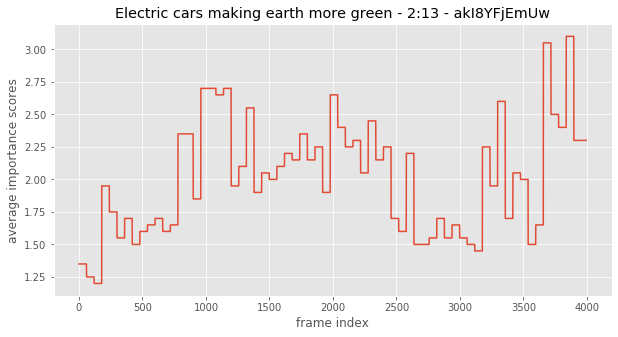

In [311]:
fig, ax = plt.subplots(figsize=(10, 5))
x = range(len(avg_scores_test))
ax.set_xlabel('frame index')
ax.set_ylabel('average importance scores')
ax.set_title('Electric cars making earth more green - 2:13 - akI8YFjEmUw')
ax.plot(x, avg_scores_test)

In [313]:
# 2 POTENTIAL APPROACHES

# 1. STATIC - clustering for static keyframe selection based on color histograms
# 2. DYNAMIC - create a model to take sequence of frames and predict the importance scores each frame 

In [318]:
# 3995 frames
ec_images = glob.glob('data/frames/akI8YFjEmUw/*')

In [327]:
ec_image1 = plt.imread(glob.glob('data/frames/akI8YFjEmUw/*')[500])

In [414]:
ec_images

['data/frames/akI8YFjEmUw/63.jpg',
 'data/frames/akI8YFjEmUw/823.jpg',
 'data/frames/akI8YFjEmUw/3578.jpg',
 'data/frames/akI8YFjEmUw/2666.jpg',
 'data/frames/akI8YFjEmUw/2100.jpg',
 'data/frames/akI8YFjEmUw/1409.jpg',
 'data/frames/akI8YFjEmUw/189.jpg',
 'data/frames/akI8YFjEmUw/2114.jpg',
 'data/frames/akI8YFjEmUw/2672.jpg',
 'data/frames/akI8YFjEmUw/77.jpg',
 'data/frames/akI8YFjEmUw/837.jpg',
 'data/frames/akI8YFjEmUw/2882.jpg',
 'data/frames/akI8YFjEmUw/3544.jpg',
 'data/frames/akI8YFjEmUw/1353.jpg',
 'data/frames/akI8YFjEmUw/1435.jpg',
 'data/frames/akI8YFjEmUw/3222.jpg',
 'data/frames/akI8YFjEmUw/2128.jpg',
 'data/frames/akI8YFjEmUw/3236.jpg',
 'data/frames/akI8YFjEmUw/1421.jpg',
 'data/frames/akI8YFjEmUw/1347.jpg',
 'data/frames/akI8YFjEmUw/2896.jpg',
 'data/frames/akI8YFjEmUw/3550.jpg',
 'data/frames/akI8YFjEmUw/638.jpg',
 'data/frames/akI8YFjEmUw/2869.jpg',
 'data/frames/akI8YFjEmUw/1390.jpg',
 'data/frames/akI8YFjEmUw/604.jpg',
 'data/frames/akI8YFjEmUw/2699.jpg',
 'data/fra

In [333]:
ec_image1.shape

(360, 640, 3)

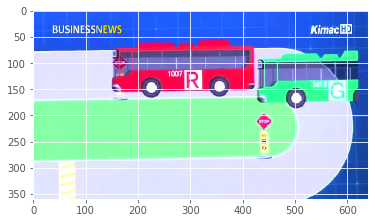

In [334]:
plt.imshow(ec_image1)

In [348]:
image_features = []
model = VGG16(weights='imagenet', include_top=False)
for img_path in glob.glob('data/frames/akI8YFjEmUw/*'):
    img = image.load_img(img_path, target_size=(224, 224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = vgg16_preprocess(img_data)

    vgg16_feature = model.predict(img_data)
    image_features.append(np.array(vgg16_feature).flatten())

58892288/58889256 [==============================] - 1s 0us/step


In [351]:
image_features = np.array(image_features)
image_features.shape

(3995, 25088)

In [353]:
# Using Kmeans for with 400 clusters to experiment with a creating a video that is 10% of original 
kmeans = KMeans(n_clusters=400, random_state=42).fit(image_features)

In [359]:
kmeans.cluster_centers_.shape

(400, 25088)

In [384]:
kmeans.labels_

array([155, 139, 323, ..., 235, 269, 339], dtype=int32)

In [395]:
labels = kmeans.labels_
np.argwhere(labels == 315)

array([[  40],
       [ 215],
       [ 539],
       [ 540],
       [ 707],
       [ 712],
       [ 790],
       [ 958],
       [1049],
       [2532],
       [2683],
       [3014],
       [3018],
       [3024],
       [3183],
       [3184],
       [3193],
       [3277],
       [3287],
       [3430],
       [3436],
       [3522],
       [3527],
       [3688],
       [3697],
       [3774],
       [3775],
       [3951],
       [3957]])

In [397]:
closest, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_, image_features)

In [402]:
closest

array([1040, 1407,  773,  112, 3261, 2097, 2860, 3160, 3592, 2929, 3893,
       1239, 2506, 3917,  566,  142, 3482, 1851, 2075,  560, 3818, 3896,
       2303, 2795,  934, 2654, 3796, 3325, 3988, 3136, 1642,  451, 1229,
        709, 1243, 2060, 3196, 2583, 3876, 1761,  260, 2044,  272, 2995,
       2858, 2714, 3502,  643, 3860,  368, 3755,  277,  978, 3344, 3779,
       3444, 3384, 2554, 2190, 3507,  710, 3498, 3770,  367,  379, 3176,
       1256, 1905, 2680, 3405,  326, 1353, 2527, 2898,  997, 2962,  235,
       1717,  308,  564, 1907, 2495, 3681, 3691, 1460, 1313,  498,  399,
        360, 1962, 2660, 3242,  187, 2021,  863, 2163, 1334, 2123, 2741,
       2513, 1285, 3966,  306,   41, 3289, 1450, 2502, 1588, 2740, 3519,
       3426, 3672, 1551, 2735,  204, 1319, 3434, 3827, 3281, 3045, 2369,
        678, 2505, 2194,  403, 3656, 1961, 3100, 2994,  445, 2397, 2247,
       1351,  417, 2781, 3012,  229, 3797,  829,  250, 3334, 1772,  469,
       2148, 2992, 1822, 2120, 2461,  520, 1427, 33

In [404]:
ec_images_np = np.array(ec_images)

In [425]:
ec_images_np[closest]

array(['data/frames/akI8YFjEmUw/3719.jpg',
       'data/frames/akI8YFjEmUw/3848.jpg',
       'data/frames/akI8YFjEmUw/601.jpg',
       'data/frames/akI8YFjEmUw/1555.jpg',
       'data/frames/akI8YFjEmUw/2687.jpg',
       'data/frames/akI8YFjEmUw/3472.jpg',
       'data/frames/akI8YFjEmUw/2026.jpg',
       'data/frames/akI8YFjEmUw/1987.jpg',
       'data/frames/akI8YFjEmUw/3371.jpg',
       'data/frames/akI8YFjEmUw/2422.jpg',
       'data/frames/akI8YFjEmUw/796.jpg',
       'data/frames/akI8YFjEmUw/1331.jpg',
       'data/frames/akI8YFjEmUw/126.jpg',
       'data/frames/akI8YFjEmUw/3165.jpg',
       'data/frames/akI8YFjEmUw/3620.jpg',
       'data/frames/akI8YFjEmUw/1232.jpg',
       'data/frames/akI8YFjEmUw/2137.jpg',
       'data/frames/akI8YFjEmUw/919.jpg',
       'data/frames/akI8YFjEmUw/2591.jpg',
       'data/frames/akI8YFjEmUw/1194.jpg',
       'data/frames/akI8YFjEmUw/2246.jpg',
       'data/frames/akI8YFjEmUw/2284.jpg',
       'data/frames/akI8YFjEmUw/2551.jpg',
       'data/fr

In [437]:
closest_to_center_frames = sort_frames(ec_images_np[closest], 'akI8YFjEmUw')
closest_to_center_frames

['data/frames/akI8YFjEmUw/1.jpg',
 'data/frames/akI8YFjEmUw/3.jpg',
 'data/frames/akI8YFjEmUw/6.jpg',
 'data/frames/akI8YFjEmUw/7.jpg',
 'data/frames/akI8YFjEmUw/8.jpg',
 'data/frames/akI8YFjEmUw/9.jpg',
 'data/frames/akI8YFjEmUw/11.jpg',
 'data/frames/akI8YFjEmUw/13.jpg',
 'data/frames/akI8YFjEmUw/14.jpg',
 'data/frames/akI8YFjEmUw/15.jpg',
 'data/frames/akI8YFjEmUw/16.jpg',
 'data/frames/akI8YFjEmUw/17.jpg',
 'data/frames/akI8YFjEmUw/18.jpg',
 'data/frames/akI8YFjEmUw/21.jpg',
 'data/frames/akI8YFjEmUw/23.jpg',
 'data/frames/akI8YFjEmUw/26.jpg',
 'data/frames/akI8YFjEmUw/28.jpg',
 'data/frames/akI8YFjEmUw/30.jpg',
 'data/frames/akI8YFjEmUw/33.jpg',
 'data/frames/akI8YFjEmUw/35.jpg',
 'data/frames/akI8YFjEmUw/38.jpg',
 'data/frames/akI8YFjEmUw/41.jpg',
 'data/frames/akI8YFjEmUw/46.jpg',
 'data/frames/akI8YFjEmUw/50.jpg',
 'data/frames/akI8YFjEmUw/54.jpg',
 'data/frames/akI8YFjEmUw/57.jpg',
 'data/frames/akI8YFjEmUw/61.jpg',
 'data/frames/akI8YFjEmUw/65.jpg',
 'data/frames/akI8YFjEmUw/

In [436]:
# REMEMBER TO SORT LIST OF FRAMES after glob
# sort_frames(glob.glob('data/frames/akI8YFjEmUw/*'), 'akI8YFjEmUw')

In [444]:
# 3995 
# 133 seconds
3995 / 133

30.037593984962406

In [454]:
def create_video_from_frames(frames, title, fps=30, fourcc=cv2.VideoWriter_fourcc('m','p','4','v')):
    img_array = []
    for filename in frames:
  dat      img = cv2.imread(filename)
        height, width, layers = img.shape
        size = (width,height)
        img_array.append(img)

    out = cv2.VideoWriter(title, fourcc, 30, size)
    for i in range(len(img_array)):
        out.write(img_array[i])
    out.release()

In [455]:
original_frames = sort_frames(glob.glob('data/frames/akI8YFjEmUw/*'), 'akI8YFjEmUw')
create_video_from_frames(original_frames, 'test-original.mp4')

In [456]:
create_video_from_frames(closest_to_center_frames, 'test-condensed.mp4')